In [ ]:
import zipfile
import os

In [ ]:
zip_path = "/content/tango-cv-assessment-dataset.zip"
extract_path = "/content/dataset/tango-cv-assessment-dataset/tango-cv-assessment-dataset"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print(f"Dataset extracted to {extract_path}")

Dataset extracted to /content/dataset/tango-cv-assessment-dataset/tango-cv-assessment-dataset


In [ ]:
image_files = [os.path.join(extract_path, f) for f in os.listdir(extract_path) if f.endswith(('.jpg', '.png'))]
print(f"Found {len(image_files)} images.")

Found 25259 images.


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from PIL import Image

In [ ]:
IMAGE_FOLDER = "/content/dataset/tango-cv-assessment-dataset/tango-cv-assessment-dataset"

In [ ]:
base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')
model = Model(inputs=base_model.input, outputs=base_model.output)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
def preprocess_img(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x

In [ ]:
features = []
image_paths = []
print("Extracting features from images...")
for fname in tqdm(os.listdir(IMAGE_FOLDER)):
    fpath = os.path.join(IMAGE_FOLDER, fname)
    if fname.lower().endswith(('.jpg', '.png', '.jpeg')):
        x = preprocess_img(fpath)
        feat = model.predict(x)[0]
        features.append(feat)
        image_paths.append(fpath)

features = np.array(features)

Extracting features from images...


  0%|          | 0/25261 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  0%|          | 1/25261 [00:05<37:20:39,  5.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  0%|          | 2/25261 [00:05<16:23:41,  2.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  0%|          | 3/25261 [00:05<10:05:20,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  0%|          | 4/25261 [00:06<7:06:48,  1.01s/it] 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


  0%|          | 5/25261 [00:06<5:33:23,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  0%|          | 6/25261 [00:07<5:23:20,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  0%|          | 7/25261 [00:08<5:15:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


  0%|          | 8/25261 [00:08<5:14:13,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  0%|          | 9/25261 [00:09<4:38:30,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


  0%|          | 10/25261 [00:10<4:46:19,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  0%|          | 11/25261 [00:10<4:51:28,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  0%|          | 12/25261 [00:11<4:55:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  0%|          | 13/25261 [00:12<4:57:28,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  0%|          | 14/25261 [00:12<5:01:59,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  0%|          | 15/25261 [00:13<4:07:21,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  0%|          | 16/25261 [00:13<3:38:41,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  0%|          | 17/25261 [00:13<3:19:27,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  0%|          | 18/25261 [00:14<3:06:01,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|          | 19/25261 [00:14<2:57:15,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  0%|          | 20/25261 [00:14<2:34:12,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  0%|          | 21/25261 [00:15<2:33:48,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  0%|          | 22/25261 [00:15<2:19:15,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  0%|          | 23/25261 [00:15<2:23:25,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  0%|          | 24/25261 [00:16<2:26:07,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  0%|          | 25/25261 [00:16<2:28:03,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  0%|          | 26/25261 [00:17<2:29:17,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  0%|          | 27/25261 [00:17<2:30:45,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  0%|          | 28/25261 [00:17<2:31:11,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  0%|          | 29/25261 [00:18<2:39:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  0%|          | 30/25261 [00:18<2:44:36,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  0%|          | 31/25261 [00:19<3:25:56,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  0%|          | 32/25261 [00:20<3:54:23,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


  0%|          | 33/25261 [00:20<4:18:50,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


  0%|          | 34/25261 [00:21<4:09:19,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


  0%|          | 35/25261 [00:22<4:30:39,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  0%|          | 36/25261 [00:22<4:45:29,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


  0%|          | 37/25261 [00:23<4:53:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  0%|          | 38/25261 [00:24<4:57:12,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  0%|          | 39/25261 [00:24<4:18:34,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  0%|          | 40/25261 [00:25<3:46:43,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  0%|          | 41/25261 [00:25<3:25:43,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  0%|          | 42/25261 [00:25<3:09:56,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  0%|          | 43/25261 [00:26<2:59:28,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  0%|          | 44/25261 [00:26<2:51:57,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  0%|          | 45/25261 [00:26<2:46:38,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  0%|          | 46/25261 [00:27<2:43:55,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  0%|          | 47/25261 [00:27<2:40:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  0%|          | 48/25261 [00:27<2:23:19,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


  0%|          | 49/25261 [00:28<2:27:18,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


  0%|          | 50/25261 [00:29<3:12:50,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  0%|          | 51/25261 [00:29<3:46:55,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  0%|          | 52/25261 [00:30<4:08:38,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  0%|          | 53/25261 [00:31<4:25:04,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  0%|          | 54/25261 [00:31<4:37:02,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  0%|          | 55/25261 [00:32<4:07:53,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


  0%|          | 56/25261 [00:32<3:45:24,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  0%|          | 57/25261 [00:33<4:06:54,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


  0%|          | 58/25261 [00:33<3:41:21,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


  0%|          | 59/25261 [00:34<4:04:53,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


  0%|          | 60/25261 [00:34<3:41:13,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  0%|          | 61/25261 [00:35<4:05:04,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  0%|          | 62/25261 [00:36<3:37:21,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  0%|          | 63/25261 [00:36<3:19:18,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  0%|          | 64/25261 [00:36<3:05:11,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  0%|          | 65/25261 [00:37<2:56:14,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  0%|          | 66/25261 [00:37<2:50:15,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  0%|          | 67/25261 [00:37<2:45:14,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  0%|          | 68/25261 [00:38<2:41:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


  0%|          | 69/25261 [00:38<2:39:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  0%|          | 70/25261 [00:39<3:22:46,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  0%|          | 71/25261 [00:40<3:53:16,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  0%|          | 72/25261 [00:40<4:15:40,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  0%|          | 73/25261 [00:41<4:31:13,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  0%|          | 74/25261 [00:42<4:42:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  0%|          | 75/25261 [00:42<4:49:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  0%|          | 76/25261 [00:43<4:14:03,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  0%|          | 77/25261 [00:43<3:28:44,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  0%|          | 78/25261 [00:44<3:13:26,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  0%|          | 79/25261 [00:44<2:46:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  0%|          | 80/25261 [00:44<2:42:25,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|          | 81/25261 [00:44<2:25:37,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  0%|          | 82/25261 [00:45<2:27:46,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  0%|          | 83/25261 [00:45<2:29:30,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


  0%|          | 84/25261 [00:45<2:34:38,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  0%|          | 85/25261 [00:46<2:38:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  0%|          | 86/25261 [00:47<3:20:54,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


  0%|          | 87/25261 [00:47<3:09:13,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


  0%|          | 88/25261 [00:47<2:58:49,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  0%|          | 89/25261 [00:48<2:37:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  0%|          | 90/25261 [00:48<2:36:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  0%|          | 91/25261 [00:48<2:20:43,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  0%|          | 92/25261 [00:49<3:05:23,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  0%|          | 93/25261 [00:49<3:03:14,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  0%|          | 94/25261 [00:50<3:40:18,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  0%|          | 95/25261 [00:51<3:29:33,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  0%|          | 96/25261 [00:51<3:56:52,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  0%|          | 97/25261 [00:52<4:17:12,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  0%|          | 98/25261 [00:53<4:31:13,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  0%|          | 99/25261 [00:53<4:01:41,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  0%|          | 100/25261 [00:54<4:18:36,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  0%|          | 101/25261 [00:54<3:48:46,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  0%|          | 102/25261 [00:55<3:26:10,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  0%|          | 103/25261 [00:55<2:57:41,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  0%|          | 104/25261 [00:55<2:50:46,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  0%|          | 105/25261 [00:56<2:45:09,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  0%|          | 106/25261 [00:56<2:27:54,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|          | 107/25261 [00:56<2:29:46,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  0%|          | 108/25261 [00:57<2:31:01,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  0%|          | 109/25261 [00:57<2:31:37,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  0%|          | 110/25261 [00:57<2:16:01,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  0%|          | 111/25261 [00:58<2:20:50,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  0%|          | 112/25261 [00:58<3:08:55,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


  0%|          | 113/25261 [00:59<3:11:25,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


  0%|          | 114/25261 [00:59<3:48:19,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  0%|          | 115/25261 [01:00<4:16:34,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  0%|          | 116/25261 [01:01<4:35:09,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  0%|          | 117/25261 [01:02<4:43:56,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  0%|          | 118/25261 [01:02<4:51:20,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  0%|          | 119/25261 [01:03<4:54:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  0%|          | 120/25261 [01:04<4:56:11,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


  0%|          | 121/25261 [01:04<4:16:56,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  0%|          | 122/25261 [01:05<3:30:32,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  0%|          | 123/25261 [01:05<2:58:11,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  0%|          | 124/25261 [01:05<2:50:23,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  0%|          | 125/25261 [01:05<2:30:52,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  0%|          | 126/25261 [01:06<2:17:05,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  1%|          | 127/25261 [01:06<2:06:55,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  1%|          | 128/25261 [01:06<2:15:11,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|          | 129/25261 [01:07<2:20:31,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|          | 130/25261 [01:07<2:24:21,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  1%|          | 131/25261 [01:07<2:27:12,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|          | 132/25261 [01:08<2:13:53,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  1%|          | 133/25261 [01:08<2:04:25,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|          | 134/25261 [01:08<1:57:41,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  1%|          | 135/25261 [01:08<2:08:28,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  1%|          | 136/25261 [01:09<2:15:48,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  1%|          | 137/25261 [01:09<2:22:09,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  1%|          | 138/25261 [01:10<2:33:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  1%|          | 139/25261 [01:10<2:41:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  1%|          | 140/25261 [01:10<2:48:10,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


  1%|          | 141/25261 [01:11<3:29:18,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


  1%|          | 142/25261 [01:12<4:02:05,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


  1%|          | 143/25261 [01:13<4:24:34,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


  1%|          | 144/25261 [01:13<4:05:10,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


  1%|          | 145/25261 [01:14<4:22:23,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  1%|          | 146/25261 [01:15<4:35:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  1%|          | 147/25261 [01:15<4:07:22,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  1%|          | 148/25261 [01:16<4:24:28,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


  1%|          | 149/25261 [01:17<4:37:18,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  1%|          | 150/25261 [01:17<4:01:52,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  1%|          | 151/25261 [01:17<3:35:22,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  1%|          | 152/25261 [01:18<3:16:33,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  1%|          | 153/25261 [01:18<3:03:25,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|          | 154/25261 [01:18<2:54:28,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  1%|          | 155/25261 [01:19<2:48:04,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  1%|          | 156/25261 [01:19<2:27:58,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


  1%|          | 157/25261 [01:19<2:30:08,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  1%|          | 158/25261 [01:20<3:14:31,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  1%|          | 159/25261 [01:21<3:10:08,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  1%|          | 160/25261 [01:21<3:44:29,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  1%|          | 161/25261 [01:22<4:09:54,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  1%|          | 162/25261 [01:23<4:25:30,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  1%|          | 163/25261 [01:23<4:39:46,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  1%|          | 164/25261 [01:24<4:48:55,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|          | 165/25261 [01:25<4:07:55,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


  1%|          | 166/25261 [01:25<3:43:54,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


  1%|          | 167/25261 [01:25<3:26:17,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


  1%|          | 168/25261 [01:26<3:54:11,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


  1%|          | 169/25261 [01:26<3:34:36,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  1%|          | 170/25261 [01:27<4:00:53,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|          | 171/25261 [01:27<3:19:16,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|          | 172/25261 [01:28<2:50:07,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|          | 173/25261 [01:28<2:46:05,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  1%|          | 174/25261 [01:28<2:41:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|          | 175/25261 [01:29<2:25:33,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  1%|          | 176/25261 [01:29<2:28:25,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  1%|          | 177/25261 [01:29<2:30:38,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


  1%|          | 178/25261 [01:30<2:37:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


  1%|          | 179/25261 [01:30<2:42:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  1%|          | 180/25261 [01:31<3:23:46,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  1%|          | 181/25261 [01:32<3:53:41,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  1%|          | 182/25261 [01:32<3:39:16,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  1%|          | 183/25261 [01:33<4:05:47,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  1%|          | 184/25261 [01:33<3:46:10,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  1%|          | 185/25261 [01:34<4:10:38,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  1%|          | 186/25261 [01:34<3:48:41,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


  1%|          | 187/25261 [01:35<3:29:57,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|          | 188/25261 [01:35<3:13:09,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  1%|          | 189/25261 [01:36<2:49:03,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  1%|          | 190/25261 [01:36<2:44:21,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|          | 191/25261 [01:36<2:26:21,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  1%|          | 192/25261 [01:37<2:28:15,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|          | 193/25261 [01:37<2:29:37,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  1%|          | 194/25261 [01:37<2:21:37,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  1%|          | 195/25261 [01:38<2:29:34,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


  1%|          | 196/25261 [01:38<2:34:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


  1%|          | 197/25261 [01:38<2:38:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


  1%|          | 198/25261 [01:39<3:19:40,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


  1%|          | 199/25261 [01:40<3:50:47,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  1%|          | 200/25261 [01:41<4:13:14,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  1%|          | 201/25261 [01:41<4:31:37,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  1%|          | 202/25261 [01:42<4:07:29,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


  1%|          | 203/25261 [01:42<4:23:20,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  1%|          | 204/25261 [01:43<4:35:56,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  1%|          | 205/25261 [01:44<4:08:12,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  1%|          | 206/25261 [01:44<4:24:10,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  1%|          | 207/25261 [01:45<3:55:42,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|          | 208/25261 [01:45<3:30:33,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|          | 209/25261 [01:45<3:14:00,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  1%|          | 210/25261 [01:46<3:02:05,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|          | 211/25261 [01:46<2:39:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|          | 212/25261 [01:46<2:37:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|          | 213/25261 [01:47<2:21:24,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  1%|          | 214/25261 [01:47<2:25:23,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  1%|          | 215/25261 [01:47<2:11:42,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  1%|          | 216/25261 [01:48<2:17:56,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  1%|          | 217/25261 [01:48<2:06:31,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|          | 218/25261 [01:48<2:15:31,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|          | 219/25261 [01:49<2:21:09,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  1%|          | 220/25261 [01:49<2:23:58,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  1%|          | 221/25261 [01:49<2:13:03,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  1%|          | 222/25261 [01:50<2:19:21,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


  1%|          | 223/25261 [01:50<2:27:56,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


  1%|          | 224/25261 [01:51<2:44:15,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  1%|          | 225/25261 [01:51<3:25:21,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


  1%|          | 226/25261 [01:52<3:32:11,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


  1%|          | 227/25261 [01:53<4:05:13,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  1%|          | 228/25261 [01:53<4:24:14,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  1%|          | 229/25261 [01:54<4:37:04,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  1%|          | 230/25261 [01:55<4:07:57,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  1%|          | 231/25261 [01:55<3:49:05,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  1%|          | 232/25261 [01:56<4:11:02,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


  1%|          | 233/25261 [01:56<3:50:10,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  1%|          | 234/25261 [01:57<3:36:43,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  1%|          | 235/25261 [01:57<4:01:31,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|          | 236/25261 [01:58<3:34:55,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|          | 237/25261 [01:58<3:16:14,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  1%|          | 238/25261 [01:58<3:03:24,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  1%|          | 239/25261 [01:59<2:54:01,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|          | 240/25261 [01:59<2:48:14,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|          | 241/25261 [01:59<2:43:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  1%|          | 242/25261 [02:00<2:42:04,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  1%|          | 243/25261 [02:00<2:39:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  1%|          | 244/25261 [02:01<2:37:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  1%|          | 245/25261 [02:01<2:36:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|          | 246/25261 [02:01<2:35:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  1%|          | 247/25261 [02:02<2:35:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|          | 248/25261 [02:02<2:35:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|          | 249/25261 [02:02<2:35:33,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  1%|          | 250/25261 [02:03<2:21:32,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  1%|          | 251/25261 [02:03<2:25:49,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|          | 252/25261 [02:03<2:28:16,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  1%|          | 253/25261 [02:04<2:33:25,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


  1%|          | 254/25261 [02:05<3:15:55,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


  1%|          | 255/25261 [02:05<3:46:34,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  1%|          | 256/25261 [02:06<3:23:04,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  1%|          | 257/25261 [02:06<3:10:25,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|          | 258/25261 [02:06<2:59:38,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  1%|          | 259/25261 [02:07<3:38:09,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  1%|          | 260/25261 [02:08<4:04:55,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  1%|          | 261/25261 [02:08<3:45:12,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  1%|          | 262/25261 [02:09<4:08:01,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  1%|          | 263/25261 [02:10<4:24:41,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  1%|          | 264/25261 [02:11<4:38:16,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  1%|          | 265/25261 [02:11<4:46:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  1%|          | 266/25261 [02:12<4:11:30,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|          | 267/25261 [02:12<3:43:40,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|          | 268/25261 [02:12<3:22:45,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  1%|          | 269/25261 [02:13<3:20:44,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  1%|          | 270/25261 [02:14<3:51:45,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  1%|          | 271/25261 [02:14<4:14:08,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  1%|          | 272/25261 [02:15<3:51:59,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  1%|          | 273/25261 [02:15<4:13:21,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  1%|          | 274/25261 [02:16<3:55:24,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  1%|          | 275/25261 [02:16<3:41:22,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  1%|          | 276/25261 [02:17<4:06:04,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


  1%|          | 277/25261 [02:18<4:26:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


  1%|          | 278/25261 [02:19<4:44:59,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  1%|          | 279/25261 [02:19<4:53:21,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  1%|          | 280/25261 [02:20<4:15:23,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|          | 281/25261 [02:20<3:45:32,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  1%|          | 282/25261 [02:20<3:09:06,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  1%|          | 283/25261 [02:21<2:59:52,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|          | 284/25261 [02:21<2:52:03,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|          | 285/25261 [02:21<2:31:34,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  1%|          | 286/25261 [02:22<2:33:55,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|          | 287/25261 [02:22<2:33:45,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  1%|          | 288/25261 [02:23<2:33:13,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  1%|          | 289/25261 [02:23<2:40:47,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  1%|          | 290/25261 [02:24<3:22:32,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  1%|          | 291/25261 [02:24<3:52:55,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  1%|          | 292/25261 [02:25<3:38:19,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  1%|          | 293/25261 [02:26<4:05:04,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  1%|          | 294/25261 [02:26<4:23:19,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  1%|          | 295/25261 [02:27<4:35:32,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


  1%|          | 296/25261 [02:28<4:05:58,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  1%|          | 297/25261 [02:28<3:33:44,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  1%|          | 298/25261 [02:28<3:15:36,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|          | 299/25261 [02:29<3:02:36,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  1%|          | 300/25261 [02:29<2:54:06,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|          | 301/25261 [02:29<2:32:11,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  1%|          | 302/25261 [02:30<2:31:54,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


  1%|          | 303/25261 [02:30<3:15:16,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


  1%|          | 304/25261 [02:31<3:45:03,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


  1%|          | 305/25261 [02:31<3:27:52,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


  1%|          | 306/25261 [02:32<3:16:13,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  1%|          | 307/25261 [02:32<2:51:31,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|          | 308/25261 [02:32<2:31:07,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  1%|          | 309/25261 [02:33<2:31:41,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  1%|          | 310/25261 [02:33<3:11:59,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  1%|          | 311/25261 [02:34<3:07:30,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  1%|          | 312/25261 [02:34<3:03:23,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  1%|          | 313/25261 [02:35<3:02:33,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  1%|          | 314/25261 [02:35<3:01:28,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  1%|          | 315/25261 [02:36<2:59:24,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  1%|▏         | 316/25261 [02:36<3:34:42,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  1%|▏         | 317/25261 [02:37<3:27:56,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  1%|▏         | 318/25261 [02:37<3:57:28,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  1%|▏         | 319/25261 [02:38<3:42:43,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  1%|▏         | 320/25261 [02:38<3:29:26,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


  1%|▏         | 321/25261 [02:39<3:18:00,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|▏         | 322/25261 [02:39<3:04:36,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  1%|▏         | 323/25261 [02:39<2:54:44,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|▏         | 324/25261 [02:40<2:47:53,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  1%|▏         | 325/25261 [02:40<2:27:45,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  1%|▏         | 326/25261 [02:40<2:29:31,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|▏         | 327/25261 [02:41<2:15:18,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  1%|▏         | 328/25261 [02:41<2:19:53,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|▏         | 329/25261 [02:41<2:24:28,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  1%|▏         | 330/25261 [02:42<2:34:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


  1%|▏         | 331/25261 [02:43<3:23:22,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


  1%|▏         | 332/25261 [02:43<3:57:49,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


  1%|▏         | 333/25261 [02:44<4:22:04,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


  1%|▏         | 334/25261 [02:45<4:13:08,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


  1%|▏         | 335/25261 [02:45<4:31:22,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


  1%|▏         | 336/25261 [02:46<4:29:19,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


  1%|▏         | 337/25261 [02:48<6:08:57,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step


  1%|▏         | 338/25261 [02:48<6:12:42,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


  1%|▏         | 339/25261 [02:49<6:01:30,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


  1%|▏         | 340/25261 [02:50<5:47:05,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


  1%|▏         | 341/25261 [02:51<5:41:48,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  1%|▏         | 342/25261 [02:51<4:53:46,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  1%|▏         | 343/25261 [02:52<4:21:06,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  1%|▏         | 344/25261 [02:52<3:58:36,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  1%|▏         | 345/25261 [02:53<3:40:58,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  1%|▏         | 346/25261 [02:53<4:06:01,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  1%|▏         | 347/25261 [02:54<3:44:46,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  1%|▏         | 348/25261 [02:54<3:09:35,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  1%|▏         | 349/25261 [02:54<2:42:59,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  1%|▏         | 350/25261 [02:55<2:39:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  1%|▏         | 351/25261 [02:55<3:22:07,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  1%|▏         | 352/25261 [02:56<3:52:02,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  1%|▏         | 353/25261 [02:57<4:14:03,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  1%|▏         | 354/25261 [02:57<3:55:07,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  1%|▏         | 355/25261 [02:58<4:16:54,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  1%|▏         | 356/25261 [02:59<4:31:06,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  1%|▏         | 357/25261 [02:59<4:44:43,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


  1%|▏         | 358/25261 [03:00<4:50:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  1%|▏         | 359/25261 [03:01<4:55:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


  1%|▏         | 360/25261 [03:01<4:15:30,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


  1%|▏         | 361/25261 [03:02<3:47:43,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|▏         | 362/25261 [03:02<3:14:06,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  1%|▏         | 363/25261 [03:02<3:01:35,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|▏         | 364/25261 [03:03<2:38:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  1%|▏         | 365/25261 [03:03<2:25:37,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  1%|▏         | 366/25261 [03:03<2:14:54,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  1%|▏         | 367/25261 [03:04<2:20:41,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  1%|▏         | 368/25261 [03:04<2:24:45,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  1%|▏         | 369/25261 [03:04<2:27:16,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  1%|▏         | 370/25261 [03:05<2:14:25,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  1%|▏         | 371/25261 [03:05<2:20:24,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  1%|▏         | 372/25261 [03:05<2:31:16,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


  1%|▏         | 373/25261 [03:06<3:15:42,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  1%|▏         | 374/25261 [03:06<3:08:45,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  1%|▏         | 375/25261 [03:07<3:43:46,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  1%|▏         | 376/25261 [03:08<4:07:03,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  1%|▏         | 377/25261 [03:08<3:52:14,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  1%|▏         | 378/25261 [03:09<4:13:53,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  2%|▏         | 379/25261 [03:10<3:54:11,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


  2%|▏         | 380/25261 [03:10<3:35:50,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  2%|▏         | 381/25261 [03:10<3:23:06,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  2%|▏         | 382/25261 [03:11<3:08:35,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|▏         | 383/25261 [03:11<2:57:59,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  2%|▏         | 384/25261 [03:11<2:35:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  2%|▏         | 385/25261 [03:12<2:35:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


  2%|▏         | 386/25261 [03:12<2:38:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


  2%|▏         | 387/25261 [03:13<3:19:48,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  2%|▏         | 388/25261 [03:14<3:48:37,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


  2%|▏         | 389/25261 [03:14<3:31:22,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  2%|▏         | 390/25261 [03:14<3:20:01,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  2%|▏         | 391/25261 [03:15<3:06:26,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  2%|▏         | 392/25261 [03:15<2:56:46,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  2%|▏         | 393/25261 [03:16<3:35:36,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  2%|▏         | 394/25261 [03:16<3:24:19,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  2%|▏         | 395/25261 [03:17<3:56:42,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


  2%|▏         | 396/25261 [03:18<4:15:38,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  2%|▏         | 397/25261 [03:19<4:29:29,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  2%|▏         | 398/25261 [03:19<4:40:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  2%|▏         | 399/25261 [03:20<4:45:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  2%|▏         | 400/25261 [03:20<3:52:31,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|▏         | 401/25261 [03:21<3:14:54,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  2%|▏         | 402/25261 [03:21<3:04:05,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  2%|▏         | 403/25261 [03:21<2:55:21,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  2%|▏         | 404/25261 [03:22<2:48:34,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|▏         | 405/25261 [03:22<2:44:34,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|▏         | 406/25261 [03:22<2:41:33,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  2%|▏         | 407/25261 [03:23<2:39:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|▏         | 408/25261 [03:23<2:37:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|▏         | 409/25261 [03:24<2:35:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  2%|▏         | 410/25261 [03:24<2:35:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|▏         | 411/25261 [03:24<2:35:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


  2%|▏         | 412/25261 [03:25<3:17:39,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  2%|▏         | 413/25261 [03:26<3:52:30,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


  2%|▏         | 414/25261 [03:27<4:20:21,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


  2%|▏         | 415/25261 [03:27<4:35:49,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  2%|▏         | 416/25261 [03:28<4:46:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  2%|▏         | 417/25261 [03:29<4:51:44,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  2%|▏         | 418/25261 [03:30<4:55:01,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  2%|▏         | 419/25261 [03:30<4:58:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  2%|▏         | 420/25261 [03:31<4:59:57,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|▏         | 421/25261 [03:31<4:19:27,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|▏         | 422/25261 [03:32<3:32:15,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|▏         | 423/25261 [03:32<2:58:46,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|▏         | 424/25261 [03:32<2:51:05,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  2%|▏         | 425/25261 [03:33<2:33:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  2%|▏         | 426/25261 [03:33<2:34:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  2%|▏         | 427/25261 [03:33<2:33:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|▏         | 428/25261 [03:34<2:33:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|▏         | 429/25261 [03:34<2:34:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  2%|▏         | 430/25261 [03:34<2:20:50,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|▏         | 431/25261 [03:35<2:24:24,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|▏         | 432/25261 [03:35<2:12:04,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|▏         | 433/25261 [03:35<2:18:13,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  2%|▏         | 434/25261 [03:36<2:23:16,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  2%|▏         | 435/25261 [03:36<2:34:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  2%|▏         | 436/25261 [03:37<2:40:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  2%|▏         | 437/25261 [03:37<2:48:49,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  2%|▏         | 438/25261 [03:37<2:52:49,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


  2%|▏         | 439/25261 [03:38<3:11:05,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  2%|▏         | 440/25261 [03:39<3:45:05,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


  2%|▏         | 441/25261 [03:39<3:50:00,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


  2%|▏         | 442/25261 [03:40<4:12:34,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  2%|▏         | 443/25261 [03:40<3:54:01,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


  2%|▏         | 444/25261 [03:41<4:17:41,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


  2%|▏         | 445/25261 [03:42<4:37:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  2%|▏         | 446/25261 [03:42<4:06:10,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  2%|▏         | 447/25261 [03:43<3:47:08,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  2%|▏         | 448/25261 [03:43<3:29:54,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  2%|▏         | 449/25261 [03:44<3:21:59,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|▏         | 450/25261 [03:44<3:08:46,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|▏         | 451/25261 [03:45<2:59:38,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  2%|▏         | 452/25261 [03:45<2:37:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|▏         | 453/25261 [03:45<2:37:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  2%|▏         | 454/25261 [03:45<2:21:44,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  2%|▏         | 455/25261 [03:46<2:26:12,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  2%|▏         | 456/25261 [03:46<2:15:58,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  2%|▏         | 457/25261 [03:46<2:26:41,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  2%|▏         | 458/25261 [03:47<3:14:35,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  2%|▏         | 459/25261 [03:48<3:09:25,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  2%|▏         | 460/25261 [03:48<3:08:36,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  2%|▏         | 461/25261 [03:49<3:42:34,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  2%|▏         | 462/25261 [03:49<3:30:23,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  2%|▏         | 463/25261 [03:50<3:59:09,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  2%|▏         | 464/25261 [03:50<3:40:57,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  2%|▏         | 465/25261 [03:51<4:07:30,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  2%|▏         | 466/25261 [03:52<3:46:50,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|▏         | 467/25261 [03:52<3:10:44,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


  2%|▏         | 468/25261 [03:52<3:02:40,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


  2%|▏         | 469/25261 [03:53<3:36:55,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


  2%|▏         | 470/25261 [03:53<3:20:56,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


  2%|▏         | 471/25261 [03:54<3:11:38,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


  2%|▏         | 472/25261 [03:54<3:03:57,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


  2%|▏         | 473/25261 [03:55<2:59:30,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  2%|▏         | 474/25261 [03:55<2:52:09,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|▏         | 475/25261 [03:55<2:32:33,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|▏         | 476/25261 [03:56<2:34:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|▏         | 477/25261 [03:56<2:34:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|▏         | 478/25261 [03:56<2:18:56,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  2%|▏         | 479/25261 [03:57<2:24:04,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|▏         | 480/25261 [03:57<2:12:18,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  2%|▏         | 481/25261 [03:57<2:18:45,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  2%|▏         | 482/25261 [03:58<2:32:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  2%|▏         | 483/25261 [03:58<3:16:17,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  2%|▏         | 484/25261 [03:59<3:14:34,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  2%|▏         | 485/25261 [04:00<3:48:51,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  2%|▏         | 486/25261 [04:00<3:34:29,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  2%|▏         | 487/25261 [04:00<3:23:03,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  2%|▏         | 488/25261 [04:01<3:20:10,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  2%|▏         | 489/25261 [04:02<3:50:21,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  2%|▏         | 490/25261 [04:02<3:35:33,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  2%|▏         | 491/25261 [04:03<4:00:59,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|▏         | 492/25261 [04:03<3:33:59,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|▏         | 493/25261 [04:04<3:15:20,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  2%|▏         | 494/25261 [04:04<3:03:04,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|▏         | 495/25261 [04:04<2:53:30,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  2%|▏         | 496/25261 [04:05<2:46:36,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


  2%|▏         | 497/25261 [04:05<2:47:11,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


  2%|▏         | 498/25261 [04:05<2:45:22,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  2%|▏         | 499/25261 [04:06<3:25:07,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  2%|▏         | 500/25261 [04:07<3:55:14,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  2%|▏         | 501/25261 [04:08<4:22:30,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  2%|▏         | 502/25261 [04:08<4:36:33,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  2%|▏         | 503/25261 [04:09<4:44:04,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  2%|▏         | 504/25261 [04:10<4:49:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  2%|▏         | 505/25261 [04:11<4:54:21,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  2%|▏         | 506/25261 [04:11<4:54:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


  2%|▏         | 507/25261 [04:12<4:17:47,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  2%|▏         | 508/25261 [04:12<3:33:06,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|▏         | 509/25261 [04:12<3:16:05,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  2%|▏         | 510/25261 [04:13<2:49:26,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  2%|▏         | 511/25261 [04:13<2:45:13,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|▏         | 512/25261 [04:13<2:41:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  2%|▏         | 513/25261 [04:14<2:38:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  2%|▏         | 514/25261 [04:14<2:24:54,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  2%|▏         | 515/25261 [04:14<2:12:23,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  2%|▏         | 516/25261 [04:15<2:18:31,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|▏         | 517/25261 [04:15<2:22:26,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|▏         | 518/25261 [04:15<2:10:22,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  2%|▏         | 519/25261 [04:16<2:01:54,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|▏         | 520/25261 [04:16<2:11:22,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  2%|▏         | 521/25261 [04:16<2:19:27,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  2%|▏         | 522/25261 [04:17<2:24:09,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  2%|▏         | 523/25261 [04:17<2:27:18,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  2%|▏         | 524/25261 [04:18<3:18:38,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


  2%|▏         | 525/25261 [04:19<3:54:53,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


  2%|▏         | 526/25261 [04:19<4:14:47,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


  2%|▏         | 527/25261 [04:20<4:31:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


  2%|▏         | 528/25261 [04:21<4:42:23,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  2%|▏         | 529/25261 [04:22<4:48:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  2%|▏         | 530/25261 [04:22<4:50:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  2%|▏         | 531/25261 [04:23<4:18:57,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  2%|▏         | 532/25261 [04:23<3:54:40,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  2%|▏         | 533/25261 [04:24<4:15:10,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|▏         | 534/25261 [04:24<3:46:28,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  2%|▏         | 535/25261 [04:25<3:12:35,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  2%|▏         | 536/25261 [04:25<2:48:05,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  2%|▏         | 537/25261 [04:25<2:43:47,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  2%|▏         | 538/25261 [04:26<2:26:01,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  2%|▏         | 539/25261 [04:26<2:28:17,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|▏         | 540/25261 [04:26<2:29:18,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  2%|▏         | 541/25261 [04:27<2:15:37,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  2%|▏         | 542/25261 [04:27<2:08:38,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|▏         | 543/25261 [04:27<2:15:57,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  2%|▏         | 544/25261 [04:28<3:02:17,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  2%|▏         | 545/25261 [04:29<3:37:49,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  2%|▏         | 546/25261 [04:29<4:04:37,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  2%|▏         | 547/25261 [04:30<4:21:51,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  2%|▏         | 548/25261 [04:31<4:33:23,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


  2%|▏         | 549/25261 [04:31<4:13:04,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  2%|▏         | 550/25261 [04:32<4:29:55,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


  2%|▏         | 551/25261 [04:33<4:20:21,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


  2%|▏         | 552/25261 [04:33<4:09:44,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  2%|▏         | 553/25261 [04:34<4:27:40,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  2%|▏         | 554/25261 [04:34<3:58:42,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  2%|▏         | 555/25261 [04:35<3:37:14,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|▏         | 556/25261 [04:35<3:02:06,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  2%|▏         | 557/25261 [04:35<2:54:51,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  2%|▏         | 558/25261 [04:36<2:34:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|▏         | 559/25261 [04:36<2:34:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  2%|▏         | 560/25261 [04:36<2:21:42,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  2%|▏         | 561/25261 [04:37<2:25:48,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|▏         | 562/25261 [04:37<2:13:33,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  2%|▏         | 563/25261 [04:37<2:09:02,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|▏         | 564/25261 [04:38<2:16:36,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  2%|▏         | 565/25261 [04:38<3:07:35,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


  2%|▏         | 566/25261 [04:39<3:42:51,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  2%|▏         | 567/25261 [04:40<4:08:33,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  2%|▏         | 568/25261 [04:41<4:24:18,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  2%|▏         | 569/25261 [04:41<4:02:53,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


  2%|▏         | 570/25261 [04:42<4:20:41,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  2%|▏         | 571/25261 [04:42<3:58:54,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  2%|▏         | 572/25261 [04:43<4:17:51,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  2%|▏         | 573/25261 [04:43<3:46:30,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  2%|▏         | 574/25261 [04:44<3:24:47,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|▏         | 575/25261 [04:44<2:54:26,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  2%|▏         | 576/25261 [04:44<2:48:04,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  2%|▏         | 577/25261 [04:45<2:43:01,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


  2%|▏         | 578/25261 [04:45<2:42:49,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


  2%|▏         | 579/25261 [04:46<3:22:25,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


  2%|▏         | 580/25261 [04:46<3:10:40,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


  2%|▏         | 581/25261 [04:47<3:43:57,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  2%|▏         | 582/25261 [04:47<3:23:16,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  2%|▏         | 583/25261 [04:48<2:55:10,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  2%|▏         | 584/25261 [04:48<2:50:32,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  2%|▏         | 585/25261 [04:49<3:31:29,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  2%|▏         | 586/25261 [04:49<3:20:00,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  2%|▏         | 587/25261 [04:50<3:51:59,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  2%|▏         | 588/25261 [04:50<3:37:44,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  2%|▏         | 589/25261 [04:51<3:26:56,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  2%|▏         | 590/25261 [04:51<3:16:00,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  2%|▏         | 591/25261 [04:52<3:45:44,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  2%|▏         | 592/25261 [04:52<3:31:26,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  2%|▏         | 593/25261 [04:53<3:58:11,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


  2%|▏         | 594/25261 [04:53<3:38:57,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|▏         | 595/25261 [04:54<3:04:56,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  2%|▏         | 596/25261 [04:54<2:42:31,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|▏         | 597/25261 [04:54<2:25:00,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  2%|▏         | 598/25261 [04:55<2:27:19,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  2%|▏         | 599/25261 [04:55<2:28:52,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|▏         | 600/25261 [04:55<2:30:00,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|▏         | 601/25261 [04:56<2:30:24,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  2%|▏         | 602/25261 [04:56<2:31:09,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|▏         | 603/25261 [04:56<2:16:23,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  2%|▏         | 604/25261 [04:57<2:20:46,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  2%|▏         | 605/25261 [04:57<2:17:07,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


  2%|▏         | 606/25261 [04:58<3:07:00,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


  2%|▏         | 607/25261 [04:59<3:43:15,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


  2%|▏         | 608/25261 [04:59<4:07:38,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


  2%|▏         | 609/25261 [05:00<4:25:56,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


  2%|▏         | 610/25261 [05:00<4:01:50,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  2%|▏         | 611/25261 [05:01<4:19:33,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  2%|▏         | 612/25261 [05:02<4:32:48,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  2%|▏         | 613/25261 [05:02<4:04:24,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  2%|▏         | 614/25261 [05:03<3:44:17,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


  2%|▏         | 615/25261 [05:03<3:27:40,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  2%|▏         | 616/25261 [05:04<3:21:58,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  2%|▏         | 617/25261 [05:04<3:14:51,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  2%|▏         | 618/25261 [05:05<3:47:05,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|▏         | 619/25261 [05:05<3:25:53,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  2%|▏         | 620/25261 [05:06<2:57:53,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|▏         | 621/25261 [05:06<2:51:43,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|▏         | 622/25261 [05:06<2:31:42,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  2%|▏         | 623/25261 [05:07<2:32:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  2%|▏         | 624/25261 [05:07<2:33:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|▏         | 625/25261 [05:07<2:32:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  2%|▏         | 626/25261 [05:08<2:32:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|▏         | 627/25261 [05:08<2:31:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  2%|▏         | 628/25261 [05:08<2:32:08,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


  2%|▏         | 629/25261 [05:09<2:35:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  2%|▏         | 630/25261 [05:09<2:44:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  2%|▏         | 631/25261 [05:10<3:26:08,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


  3%|▎         | 632/25261 [05:10<3:24:08,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


  3%|▎         | 633/25261 [05:11<3:56:44,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


  3%|▎         | 634/25261 [05:12<4:15:18,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


  3%|▎         | 635/25261 [05:12<4:01:58,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


  3%|▎         | 636/25261 [05:13<4:21:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


  3%|▎         | 637/25261 [05:14<4:34:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


  3%|▎         | 638/25261 [05:15<4:43:09,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  3%|▎         | 639/25261 [05:15<4:11:51,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  3%|▎         | 640/25261 [05:16<4:23:49,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  3%|▎         | 641/25261 [05:16<3:58:15,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  3%|▎         | 642/25261 [05:17<3:32:49,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  3%|▎         | 643/25261 [05:17<3:01:28,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  3%|▎         | 644/25261 [05:17<2:53:55,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|▎         | 645/25261 [05:18<2:47:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|▎         | 646/25261 [05:18<2:43:54,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  3%|▎         | 647/25261 [05:18<2:41:41,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  3%|▎         | 648/25261 [05:19<2:39:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  3%|▎         | 649/25261 [05:19<2:42:31,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  3%|▎         | 650/25261 [05:20<2:47:29,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  3%|▎         | 651/25261 [05:20<2:52:35,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  3%|▎         | 652/25261 [05:21<3:29:31,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  3%|▎         | 653/25261 [05:21<3:24:11,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  3%|▎         | 654/25261 [05:22<3:18:25,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  3%|▎         | 655/25261 [05:22<3:12:23,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  3%|▎         | 656/25261 [05:23<3:43:39,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  3%|▎         | 657/25261 [05:23<3:32:08,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  3%|▎         | 658/25261 [05:24<3:58:11,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  3%|▎         | 659/25261 [05:25<3:41:30,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


  3%|▎         | 660/25261 [05:25<3:32:33,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


  3%|▎         | 661/25261 [05:26<4:01:43,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


  3%|▎         | 662/25261 [05:26<3:39:54,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  3%|▎         | 663/25261 [05:27<4:02:10,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


  3%|▎         | 664/25261 [05:27<3:38:48,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  3%|▎         | 665/25261 [05:28<3:19:25,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  3%|▎         | 666/25261 [05:28<3:05:30,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  3%|▎         | 667/25261 [05:28<2:58:14,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  3%|▎         | 668/25261 [05:29<2:50:42,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  3%|▎         | 669/25261 [05:29<2:45:40,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  3%|▎         | 670/25261 [05:30<2:42:15,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  3%|▎         | 671/25261 [05:30<2:39:57,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|▎         | 672/25261 [05:30<2:38:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  3%|▎         | 673/25261 [05:31<3:18:05,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


  3%|▎         | 674/25261 [05:31<3:09:32,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  3%|▎         | 675/25261 [05:32<3:40:10,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  3%|▎         | 676/25261 [05:33<3:26:18,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  3%|▎         | 677/25261 [05:33<3:54:34,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  3%|▎         | 678/25261 [05:34<4:17:11,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  3%|▎         | 679/25261 [05:34<3:52:50,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  3%|▎         | 680/25261 [05:35<4:16:26,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  3%|▎         | 681/25261 [05:36<3:53:31,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  3%|▎         | 682/25261 [05:36<3:33:22,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  3%|▎         | 683/25261 [05:36<3:16:01,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  3%|▎         | 684/25261 [05:37<3:03:03,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  3%|▎         | 685/25261 [05:37<2:53:55,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


  3%|▎         | 686/25261 [05:38<2:50:15,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


  3%|▎         | 687/25261 [05:38<2:48:22,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


  3%|▎         | 688/25261 [05:39<3:25:38,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


  3%|▎         | 689/25261 [05:39<3:15:15,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  3%|▎         | 690/25261 [05:40<3:46:14,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  3%|▎         | 691/25261 [05:40<3:24:42,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  3%|▎         | 692/25261 [05:41<2:56:38,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|▎         | 693/25261 [05:41<2:50:02,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


  3%|▎         | 694/25261 [05:41<2:45:08,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  3%|▎         | 695/25261 [05:42<2:52:39,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  3%|▎         | 696/25261 [05:42<3:32:48,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  3%|▎         | 697/25261 [05:43<3:58:54,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  3%|▎         | 698/25261 [05:44<3:44:59,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  3%|▎         | 699/25261 [05:44<4:08:35,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  3%|▎         | 700/25261 [05:45<4:24:34,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  3%|▎         | 701/25261 [05:46<4:02:54,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  3%|▎         | 702/25261 [05:46<4:22:32,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  3%|▎         | 703/25261 [05:47<3:53:51,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|▎         | 704/25261 [05:47<3:29:33,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|▎         | 705/25261 [05:48<3:13:28,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  3%|▎         | 706/25261 [05:48<3:01:24,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|▎         | 707/25261 [05:48<2:52:40,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  3%|▎         | 708/25261 [05:49<2:46:12,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|▎         | 709/25261 [05:49<2:41:58,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  3%|▎         | 710/25261 [05:49<2:38:32,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  3%|▎         | 711/25261 [05:50<2:37:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  3%|▎         | 712/25261 [05:50<2:40:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  3%|▎         | 713/25261 [05:51<3:23:04,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  3%|▎         | 714/25261 [05:52<3:51:12,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


  3%|▎         | 715/25261 [05:52<4:15:29,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


  3%|▎         | 716/25261 [05:53<4:34:16,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  3%|▎         | 717/25261 [05:54<4:10:05,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  3%|▎         | 718/25261 [05:54<4:27:34,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  3%|▎         | 719/25261 [05:55<4:39:38,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  3%|▎         | 720/25261 [05:56<4:47:33,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  3%|▎         | 721/25261 [05:57<4:49:13,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  3%|▎         | 722/25261 [05:57<4:51:49,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  3%|▎         | 723/25261 [05:58<4:10:55,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  3%|▎         | 724/25261 [05:58<3:27:38,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  3%|▎         | 725/25261 [05:58<3:11:55,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  3%|▎         | 726/25261 [05:59<3:00:45,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  3%|▎         | 727/25261 [05:59<2:53:15,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  3%|▎         | 728/25261 [06:00<2:46:58,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  3%|▎         | 729/25261 [06:00<2:29:25,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  3%|▎         | 730/25261 [06:00<2:31:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|▎         | 731/25261 [06:01<2:31:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  3%|▎         | 732/25261 [06:01<2:31:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|▎         | 733/25261 [06:01<2:32:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  3%|▎         | 734/25261 [06:02<2:31:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  3%|▎         | 735/25261 [06:02<2:16:37,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  3%|▎         | 736/25261 [06:02<2:20:56,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  3%|▎         | 737/25261 [06:03<3:11:19,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


  3%|▎         | 738/25261 [06:04<3:22:50,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  3%|▎         | 739/25261 [06:04<3:49:58,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


  3%|▎         | 740/25261 [06:05<4:14:26,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


  3%|▎         | 741/25261 [06:06<3:58:40,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


  3%|▎         | 742/25261 [06:06<3:56:11,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


  3%|▎         | 743/25261 [06:07<3:48:24,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  3%|▎         | 744/25261 [06:07<4:13:03,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  3%|▎         | 745/25261 [06:08<4:27:49,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


  3%|▎         | 746/25261 [06:09<4:39:44,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


  3%|▎         | 747/25261 [06:09<4:07:35,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  3%|▎         | 748/25261 [06:10<3:43:04,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  3%|▎         | 749/25261 [06:10<3:21:10,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|▎         | 750/25261 [06:10<2:53:50,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  3%|▎         | 751/25261 [06:11<2:36:14,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  3%|▎         | 752/25261 [06:11<2:21:38,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  3%|▎         | 753/25261 [06:11<2:26:03,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  3%|▎         | 754/25261 [06:12<2:29:53,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  3%|▎         | 755/25261 [06:12<2:32:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|▎         | 756/25261 [06:12<2:19:09,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  3%|▎         | 757/25261 [06:13<2:15:51,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  3%|▎         | 758/25261 [06:13<3:05:02,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  3%|▎         | 759/25261 [06:14<3:38:04,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  3%|▎         | 760/25261 [06:15<4:02:18,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  3%|▎         | 761/25261 [06:15<3:44:26,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


  3%|▎         | 762/25261 [06:16<4:08:34,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  3%|▎         | 763/25261 [06:17<4:25:27,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  3%|▎         | 764/25261 [06:18<4:37:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


  3%|▎         | 765/25261 [06:18<4:46:39,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  3%|▎         | 766/25261 [06:19<4:49:00,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


  3%|▎         | 767/25261 [06:19<4:12:09,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


  3%|▎         | 768/25261 [06:20<3:47:27,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  3%|▎         | 769/25261 [06:20<3:18:54,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  3%|▎         | 770/25261 [06:21<3:04:41,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|▎         | 771/25261 [06:21<2:55:01,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|▎         | 772/25261 [06:21<2:47:34,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|▎         | 773/25261 [06:22<2:42:07,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  3%|▎         | 774/25261 [06:22<2:40:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  3%|▎         | 775/25261 [06:22<2:39:02,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  3%|▎         | 776/25261 [06:23<2:38:15,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  3%|▎         | 777/25261 [06:23<2:37:53,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|▎         | 778/25261 [06:24<2:36:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  3%|▎         | 779/25261 [06:24<3:20:32,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  3%|▎         | 780/25261 [06:25<3:12:36,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  3%|▎         | 781/25261 [06:25<3:43:32,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  3%|▎         | 782/25261 [06:26<4:05:46,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  3%|▎         | 783/25261 [06:27<3:46:59,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  3%|▎         | 784/25261 [06:27<4:09:03,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  3%|▎         | 785/25261 [06:28<4:24:28,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  3%|▎         | 786/25261 [06:29<4:37:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  3%|▎         | 787/25261 [06:29<4:01:05,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|▎         | 788/25261 [06:30<3:35:20,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  3%|▎         | 789/25261 [06:30<3:02:26,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  3%|▎         | 790/25261 [06:30<2:53:38,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


  3%|▎         | 791/25261 [06:31<3:31:13,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  3%|▎         | 792/25261 [06:31<3:18:52,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


  3%|▎         | 793/25261 [06:32<3:07:36,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


  3%|▎         | 794/25261 [06:32<3:00:36,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  3%|▎         | 795/25261 [06:33<3:36:50,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  3%|▎         | 796/25261 [06:33<3:17:09,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  3%|▎         | 797/25261 [06:34<2:51:48,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  3%|▎         | 798/25261 [06:34<2:33:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  3%|▎         | 799/25261 [06:34<2:40:07,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


  3%|▎         | 800/25261 [06:35<3:24:14,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  3%|▎         | 801/25261 [06:36<3:21:34,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  3%|▎         | 802/25261 [06:36<3:52:39,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  3%|▎         | 803/25261 [06:37<4:14:29,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  3%|▎         | 804/25261 [06:38<4:28:42,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  3%|▎         | 805/25261 [06:38<4:36:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  3%|▎         | 806/25261 [06:39<4:08:41,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  3%|▎         | 807/25261 [06:39<3:37:36,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  3%|▎         | 808/25261 [06:40<3:17:56,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|▎         | 809/25261 [06:40<3:05:09,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  3%|▎         | 810/25261 [06:40<2:56:15,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  3%|▎         | 811/25261 [06:41<2:49:37,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  3%|▎         | 812/25261 [06:41<2:45:11,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|▎         | 813/25261 [06:41<2:28:13,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  3%|▎         | 814/25261 [06:42<2:30:01,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|▎         | 815/25261 [06:42<2:31:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|▎         | 816/25261 [06:43<2:31:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  3%|▎         | 817/25261 [06:43<2:31:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


  3%|▎         | 818/25261 [06:43<2:35:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


  3%|▎         | 819/25261 [06:44<3:17:11,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


  3%|▎         | 820/25261 [06:45<3:44:51,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  3%|▎         | 821/25261 [06:46<4:09:25,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


  3%|▎         | 822/25261 [06:46<4:31:16,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  3%|▎         | 823/25261 [06:47<4:41:35,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  3%|▎         | 824/25261 [06:48<4:13:11,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


  3%|▎         | 825/25261 [06:48<4:29:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  3%|▎         | 826/25261 [06:49<4:39:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  3%|▎         | 827/25261 [06:49<4:10:40,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  3%|▎         | 828/25261 [06:50<4:25:14,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|▎         | 829/25261 [06:50<3:36:25,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  3%|▎         | 830/25261 [06:51<3:17:45,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  3%|▎         | 831/25261 [06:51<3:03:58,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  3%|▎         | 832/25261 [06:52<2:54:00,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|▎         | 833/25261 [06:52<2:46:17,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  3%|▎         | 834/25261 [06:52<2:42:21,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  3%|▎         | 835/25261 [06:53<2:39:34,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  3%|▎         | 836/25261 [06:53<2:37:34,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  3%|▎         | 837/25261 [06:53<2:37:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  3%|▎         | 838/25261 [06:54<2:37:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  3%|▎         | 839/25261 [06:54<2:36:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  3%|▎         | 840/25261 [06:55<2:34:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  3%|▎         | 841/25261 [06:55<2:34:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


  3%|▎         | 842/25261 [06:56<3:12:06,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


  3%|▎         | 843/25261 [06:56<3:44:03,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


  3%|▎         | 844/25261 [06:57<3:45:20,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


  3%|▎         | 845/25261 [06:58<4:07:23,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


  3%|▎         | 846/25261 [06:58<4:25:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


  3%|▎         | 847/25261 [06:59<4:38:43,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


  3%|▎         | 848/25261 [07:00<4:46:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  3%|▎         | 849/25261 [07:00<4:14:08,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  3%|▎         | 850/25261 [07:01<4:28:41,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  3%|▎         | 851/25261 [07:02<4:02:11,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  3%|▎         | 852/25261 [07:02<3:46:02,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


  3%|▎         | 853/25261 [07:02<3:30:58,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  3%|▎         | 854/25261 [07:03<3:13:08,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  3%|▎         | 855/25261 [07:03<3:00:20,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  3%|▎         | 856/25261 [07:04<2:51:14,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  3%|▎         | 857/25261 [07:04<2:46:27,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|▎         | 858/25261 [07:04<2:29:11,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  3%|▎         | 859/25261 [07:05<2:17:11,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  3%|▎         | 860/25261 [07:05<2:23:20,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  3%|▎         | 861/25261 [07:05<2:26:53,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  3%|▎         | 862/25261 [07:06<2:28:33,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  3%|▎         | 863/25261 [07:06<3:16:57,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  3%|▎         | 864/25261 [07:07<3:15:46,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  3%|▎         | 865/25261 [07:08<3:44:21,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  3%|▎         | 866/25261 [07:08<3:29:52,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  3%|▎         | 867/25261 [07:09<3:58:03,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  3%|▎         | 868/25261 [07:10<4:18:06,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  3%|▎         | 869/25261 [07:10<4:31:37,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  3%|▎         | 870/25261 [07:11<4:42:17,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


  3%|▎         | 871/25261 [07:12<4:48:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


  3%|▎         | 872/25261 [07:12<4:12:22,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  3%|▎         | 873/25261 [07:13<4:23:53,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  3%|▎         | 874/25261 [07:13<3:55:16,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  3%|▎         | 875/25261 [07:14<3:30:45,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  3%|▎         | 876/25261 [07:14<3:01:14,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  3%|▎         | 877/25261 [07:14<2:40:59,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|▎         | 878/25261 [07:15<2:38:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|▎         | 879/25261 [07:15<2:35:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  3%|▎         | 880/25261 [07:15<2:34:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  3%|▎         | 881/25261 [07:16<2:33:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  3%|▎         | 882/25261 [07:16<2:33:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  3%|▎         | 883/25261 [07:17<3:18:35,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


  3%|▎         | 884/25261 [07:18<3:49:22,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  4%|▎         | 885/25261 [07:18<4:10:09,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  4%|▎         | 886/25261 [07:19<3:52:32,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  4%|▎         | 887/25261 [07:20<4:12:52,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  4%|▎         | 888/25261 [07:20<4:27:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  4%|▎         | 889/25261 [07:21<4:36:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  4%|▎         | 890/25261 [07:21<4:03:26,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|▎         | 891/25261 [07:22<3:38:55,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|▎         | 892/25261 [07:22<3:18:29,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|▎         | 893/25261 [07:23<3:03:42,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|▎         | 894/25261 [07:23<2:41:08,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  4%|▎         | 895/25261 [07:23<2:39:06,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


  4%|▎         | 896/25261 [07:24<2:42:23,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  4%|▎         | 897/25261 [07:24<2:51:35,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  4%|▎         | 898/25261 [07:25<3:28:33,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


  4%|▎         | 899/25261 [07:26<3:54:05,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  4%|▎         | 900/25261 [07:26<3:17:34,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  4%|▎         | 901/25261 [07:26<3:03:46,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|▎         | 902/25261 [07:26<2:40:00,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  4%|▎         | 903/25261 [07:27<3:17:40,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  4%|▎         | 904/25261 [07:28<3:46:30,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  4%|▎         | 905/25261 [07:29<4:07:56,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  4%|▎         | 906/25261 [07:29<3:53:19,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  4%|▎         | 907/25261 [07:30<4:12:07,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  4%|▎         | 908/25261 [07:30<3:52:15,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  4%|▎         | 909/25261 [07:31<4:10:56,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  4%|▎         | 910/25261 [07:31<3:49:29,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  4%|▎         | 911/25261 [07:32<4:09:25,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|▎         | 912/25261 [07:32<3:25:40,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|▎         | 913/25261 [07:33<3:10:10,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  4%|▎         | 914/25261 [07:33<2:59:53,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  4%|▎         | 915/25261 [07:34<2:50:58,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|▎         | 916/25261 [07:34<2:44:43,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|▎         | 917/25261 [07:34<2:40:03,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  4%|▎         | 918/25261 [07:35<2:25:52,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|▎         | 919/25261 [07:35<2:15:15,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  4%|▎         | 920/25261 [07:35<2:21:56,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  4%|▎         | 921/25261 [07:36<2:25:57,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  4%|▎         | 922/25261 [07:36<3:09:50,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  4%|▎         | 923/25261 [07:37<3:41:30,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


  4%|▎         | 924/25261 [07:38<4:05:20,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


  4%|▎         | 925/25261 [07:39<4:26:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  4%|▎         | 926/25261 [07:39<4:36:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


  4%|▎         | 927/25261 [07:40<4:42:18,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  4%|▎         | 928/25261 [07:41<4:12:34,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  4%|▎         | 929/25261 [07:41<4:27:24,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


  4%|▎         | 930/25261 [07:42<4:40:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  4%|▎         | 931/25261 [07:43<4:11:51,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  4%|▎         | 932/25261 [07:43<3:46:39,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  4%|▎         | 933/25261 [07:43<3:17:27,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  4%|▎         | 934/25261 [07:44<2:52:25,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|▎         | 935/25261 [07:44<2:47:19,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  4%|▎         | 936/25261 [07:44<2:42:55,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  4%|▎         | 937/25261 [07:45<2:39:51,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|▎         | 938/25261 [07:45<2:37:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|▎         | 939/25261 [07:45<2:20:18,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  4%|▎         | 940/25261 [07:46<2:23:42,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|▎         | 941/25261 [07:46<2:11:39,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|▎         | 942/25261 [07:46<2:18:57,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  4%|▎         | 943/25261 [07:47<2:22:18,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  4%|▎         | 944/25261 [07:47<2:11:58,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  4%|▎         | 945/25261 [07:47<2:18:16,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


  4%|▎         | 946/25261 [07:48<2:21:57,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  4%|▎         | 947/25261 [07:48<2:35:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  4%|▍         | 948/25261 [07:49<3:17:04,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


  4%|▍         | 949/25261 [07:50<3:48:59,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  4%|▍         | 950/25261 [07:50<4:10:05,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


  4%|▍         | 951/25261 [07:51<4:24:34,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


  4%|▍         | 952/25261 [07:52<4:34:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


  4%|▍         | 953/25261 [07:52<4:13:37,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  4%|▍         | 954/25261 [07:53<3:53:57,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  4%|▍         | 955/25261 [07:53<3:41:11,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  4%|▍         | 956/25261 [07:54<4:06:58,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  4%|▍         | 957/25261 [07:55<4:23:33,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  4%|▍         | 958/25261 [07:55<3:44:50,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|▍         | 959/25261 [07:56<3:23:28,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|▍         | 960/25261 [07:56<3:08:28,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  4%|▍         | 961/25261 [07:56<2:57:08,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|▍         | 962/25261 [07:57<2:49:08,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|▍         | 963/25261 [07:57<2:30:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  4%|▍         | 964/25261 [07:57<2:30:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|▍         | 965/25261 [07:58<2:30:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|▍         | 966/25261 [07:58<2:17:31,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  4%|▍         | 967/25261 [07:58<2:22:03,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  4%|▍         | 968/25261 [07:59<3:08:14,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  4%|▍         | 969/25261 [07:59<3:11:03,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  4%|▍         | 970/25261 [08:00<3:43:35,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  4%|▍         | 971/25261 [08:01<4:06:32,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  4%|▍         | 972/25261 [08:02<4:21:23,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  4%|▍         | 973/25261 [08:02<3:59:45,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  4%|▍         | 974/25261 [08:03<3:41:04,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  4%|▍         | 975/25261 [08:03<4:05:13,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  4%|▍         | 976/25261 [08:04<4:20:42,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


  4%|▍         | 977/25261 [08:05<4:33:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  4%|▍         | 978/25261 [08:06<4:42:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|▍         | 979/25261 [08:06<4:05:43,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|▍         | 980/25261 [08:06<3:38:04,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  4%|▍         | 981/25261 [08:07<3:18:33,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|▍         | 982/25261 [08:07<2:51:11,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  4%|▍         | 983/25261 [08:07<2:46:21,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  4%|▍         | 984/25261 [08:08<2:42:04,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  4%|▍         | 985/25261 [08:08<2:39:40,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  4%|▍         | 986/25261 [08:09<3:16:11,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  4%|▍         | 987/25261 [08:09<3:12:40,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  4%|▍         | 988/25261 [08:10<3:12:09,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  4%|▍         | 989/25261 [08:11<3:44:26,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  4%|▍         | 990/25261 [08:11<3:36:02,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  4%|▍         | 991/25261 [08:12<4:00:39,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  4%|▍         | 992/25261 [08:12<3:42:40,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  4%|▍         | 993/25261 [08:13<3:31:36,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  4%|▍         | 994/25261 [08:13<3:20:56,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


  4%|▍         | 995/25261 [08:14<3:15:50,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  4%|▍         | 996/25261 [08:14<3:47:41,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|▍         | 997/25261 [08:15<3:10:34,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|▍         | 998/25261 [08:15<2:59:42,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|▍         | 999/25261 [08:15<2:51:34,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|▍         | 1000/25261 [08:16<2:45:04,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  4%|▍         | 1001/25261 [08:16<3:23:34,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


  4%|▍         | 1002/25261 [08:17<3:15:38,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  4%|▍         | 1003/25261 [08:18<3:47:22,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  4%|▍         | 1004/25261 [08:18<3:30:09,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  4%|▍         | 1005/25261 [08:18<3:06:16,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  4%|▍         | 1006/25261 [08:19<2:56:45,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


  4%|▍         | 1007/25261 [08:19<3:30:41,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  4%|▍         | 1008/25261 [08:20<3:20:29,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  4%|▍         | 1009/25261 [08:21<3:49:12,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  4%|▍         | 1010/25261 [08:21<3:31:21,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  4%|▍         | 1011/25261 [08:21<3:18:14,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  4%|▍         | 1012/25261 [08:22<3:10:53,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  4%|▍         | 1013/25261 [08:23<3:40:58,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  4%|▍         | 1014/25261 [08:23<4:04:40,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  4%|▍         | 1015/25261 [08:24<3:52:18,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  4%|▍         | 1016/25261 [08:24<3:36:15,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


  4%|▍         | 1017/25261 [08:25<4:03:58,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|▍         | 1018/25261 [08:25<3:36:24,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  4%|▍         | 1019/25261 [08:26<3:16:38,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|▍         | 1020/25261 [08:26<3:02:54,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|▍         | 1021/25261 [08:26<2:39:16,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  4%|▍         | 1022/25261 [08:27<2:37:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|▍         | 1023/25261 [08:27<2:35:21,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  4%|▍         | 1024/25261 [08:28<2:33:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|▍         | 1025/25261 [08:28<2:33:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  4%|▍         | 1026/25261 [08:28<2:21:08,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  4%|▍         | 1027/25261 [08:29<2:31:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  4%|▍         | 1028/25261 [08:29<2:39:42,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  4%|▍         | 1029/25261 [08:30<3:19:11,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


  4%|▍         | 1030/25261 [08:31<3:48:31,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  4%|▍         | 1031/25261 [08:31<4:11:21,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


  4%|▍         | 1032/25261 [08:32<4:29:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  4%|▍         | 1033/25261 [08:33<4:39:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  4%|▍         | 1034/25261 [08:34<4:44:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  4%|▍         | 1035/25261 [08:34<4:15:21,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  4%|▍         | 1036/25261 [08:35<4:26:19,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  4%|▍         | 1037/25261 [08:35<4:36:19,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  4%|▍         | 1038/25261 [08:36<4:00:32,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  4%|▍         | 1039/25261 [08:36<3:21:31,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|▍         | 1040/25261 [08:37<3:06:38,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  4%|▍         | 1041/25261 [08:37<2:56:22,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  4%|▍         | 1042/25261 [08:37<2:48:42,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  4%|▍         | 1043/25261 [08:38<2:44:14,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|▍         | 1044/25261 [08:38<2:40:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|▍         | 1045/25261 [08:38<2:40:20,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|▍         | 1046/25261 [08:39<2:37:42,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|▍         | 1047/25261 [08:39<2:22:31,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|▍         | 1048/25261 [08:39<2:26:21,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  4%|▍         | 1049/25261 [08:40<2:27:36,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  4%|▍         | 1050/25261 [08:41<3:13:03,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  4%|▍         | 1051/25261 [08:41<3:45:37,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  4%|▍         | 1052/25261 [08:42<4:06:15,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


  4%|▍         | 1053/25261 [08:43<4:23:44,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


  4%|▍         | 1054/25261 [08:43<4:13:56,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


  4%|▍         | 1055/25261 [08:44<4:28:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


  4%|▍         | 1056/25261 [08:45<4:09:37,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


  4%|▍         | 1057/25261 [08:45<3:59:55,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


  4%|▍         | 1058/25261 [08:46<4:18:21,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  4%|▍         | 1059/25261 [08:47<4:33:00,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  4%|▍         | 1060/25261 [08:47<4:00:52,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|▍         | 1061/25261 [08:47<3:32:57,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  4%|▍         | 1062/25261 [08:48<3:02:56,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|▍         | 1063/25261 [08:48<2:40:03,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|▍         | 1064/25261 [08:48<2:24:10,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  4%|▍         | 1065/25261 [08:49<2:27:01,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|▍         | 1066/25261 [08:49<2:29:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|▍         | 1067/25261 [08:49<2:29:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  4%|▍         | 1068/25261 [08:50<2:32:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|▍         | 1069/25261 [08:50<2:18:04,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  4%|▍         | 1070/25261 [08:50<2:09:21,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|▍         | 1071/25261 [08:51<2:01:52,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  4%|▍         | 1072/25261 [08:51<2:10:57,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  4%|▍         | 1073/25261 [08:52<2:59:28,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


  4%|▍         | 1074/25261 [08:52<3:06:11,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  4%|▍         | 1075/25261 [08:53<3:03:33,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  4%|▍         | 1076/25261 [08:53<3:03:09,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  4%|▍         | 1077/25261 [08:54<3:02:28,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  4%|▍         | 1078/25261 [08:54<3:04:33,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  4%|▍         | 1079/25261 [08:55<3:37:38,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  4%|▍         | 1080/25261 [08:55<3:28:58,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  4%|▍         | 1081/25261 [08:56<3:53:52,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  4%|▍         | 1082/25261 [08:57<4:16:50,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  4%|▍         | 1083/25261 [08:57<4:27:50,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


  4%|▍         | 1084/25261 [08:58<3:57:42,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  4%|▍         | 1085/25261 [08:59<4:14:31,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  4%|▍         | 1086/25261 [08:59<4:29:14,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  4%|▍         | 1087/25261 [09:00<3:54:19,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|▍         | 1088/25261 [09:00<3:15:36,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  4%|▍         | 1089/25261 [09:00<3:03:27,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  4%|▍         | 1090/25261 [09:01<2:41:05,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  4%|▍         | 1091/25261 [09:01<2:38:34,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  4%|▍         | 1092/25261 [09:01<2:43:38,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  4%|▍         | 1093/25261 [09:02<3:22:31,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  4%|▍         | 1094/25261 [09:03<3:50:31,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  4%|▍         | 1095/25261 [09:03<3:35:09,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  4%|▍         | 1096/25261 [09:04<3:23:11,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  4%|▍         | 1097/25261 [09:04<3:17:37,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  4%|▍         | 1098/25261 [09:05<3:13:22,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  4%|▍         | 1099/25261 [09:05<3:07:11,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  4%|▍         | 1100/25261 [09:06<3:05:15,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  4%|▍         | 1101/25261 [09:06<3:41:40,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  4%|▍         | 1102/25261 [09:07<3:31:23,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  4%|▍         | 1103/25261 [09:07<3:16:29,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|▍         | 1104/25261 [09:07<2:49:33,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  4%|▍         | 1105/25261 [09:08<2:45:22,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|▍         | 1106/25261 [09:08<2:41:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|▍         | 1107/25261 [09:09<2:37:44,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  4%|▍         | 1108/25261 [09:09<2:35:29,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


  4%|▍         | 1109/25261 [09:09<2:31:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


  4%|▍         | 1110/25261 [09:10<2:39:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  4%|▍         | 1111/25261 [09:11<3:25:50,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  4%|▍         | 1112/25261 [09:11<3:17:17,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  4%|▍         | 1113/25261 [09:12<3:45:26,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  4%|▍         | 1114/25261 [09:12<4:08:08,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  4%|▍         | 1115/25261 [09:13<3:48:25,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  4%|▍         | 1116/25261 [09:14<4:06:34,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  4%|▍         | 1117/25261 [09:14<4:24:31,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  4%|▍         | 1118/25261 [09:15<4:32:11,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  4%|▍         | 1119/25261 [09:16<4:40:03,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  4%|▍         | 1120/25261 [09:17<4:44:58,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  4%|▍         | 1121/25261 [09:17<4:00:39,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  4%|▍         | 1122/25261 [09:17<3:34:50,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  4%|▍         | 1123/25261 [09:18<3:15:49,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|▍         | 1124/25261 [09:18<3:02:36,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  4%|▍         | 1125/25261 [09:18<2:54:10,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|▍         | 1126/25261 [09:19<2:33:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|▍         | 1127/25261 [09:19<2:19:25,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  4%|▍         | 1128/25261 [09:19<2:23:31,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  4%|▍         | 1129/25261 [09:20<2:25:51,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|▍         | 1130/25261 [09:20<2:27:35,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  4%|▍         | 1131/25261 [09:20<2:29:15,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|▍         | 1132/25261 [09:21<2:29:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|▍         | 1133/25261 [09:21<2:29:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  4%|▍         | 1134/25261 [09:22<2:19:11,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  4%|▍         | 1135/25261 [09:22<2:24:14,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


  4%|▍         | 1136/25261 [09:23<3:12:01,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


  5%|▍         | 1137/25261 [09:23<3:44:51,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


  5%|▍         | 1138/25261 [09:24<3:38:35,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


  5%|▍         | 1139/25261 [09:25<4:03:13,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


  5%|▍         | 1140/25261 [09:25<4:26:35,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


  5%|▍         | 1141/25261 [09:26<4:08:53,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


  5%|▍         | 1142/25261 [09:27<4:27:06,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  5%|▍         | 1143/25261 [09:27<4:35:54,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  5%|▍         | 1144/25261 [09:28<4:42:08,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  5%|▍         | 1145/25261 [09:29<4:45:18,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  5%|▍         | 1146/25261 [09:29<3:53:48,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  5%|▍         | 1147/25261 [09:30<3:29:11,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|▍         | 1148/25261 [09:30<2:59:19,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|▍         | 1149/25261 [09:30<2:36:56,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|▍         | 1150/25261 [09:31<2:35:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  5%|▍         | 1151/25261 [09:31<2:34:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  5%|▍         | 1152/25261 [09:31<2:33:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|▍         | 1153/25261 [09:32<2:21:33,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  5%|▍         | 1154/25261 [09:32<2:25:55,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  5%|▍         | 1155/25261 [09:32<2:27:00,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


  5%|▍         | 1156/25261 [09:33<2:35:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


  5%|▍         | 1157/25261 [09:34<3:18:10,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  5%|▍         | 1158/25261 [09:34<3:47:54,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


  5%|▍         | 1159/25261 [09:35<4:09:38,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  5%|▍         | 1160/25261 [09:36<4:22:08,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  5%|▍         | 1161/25261 [09:36<3:58:47,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


  5%|▍         | 1162/25261 [09:37<4:17:29,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


  5%|▍         | 1163/25261 [09:37<4:04:17,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  5%|▍         | 1164/25261 [09:38<4:23:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


  5%|▍         | 1165/25261 [09:39<4:39:17,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


  5%|▍         | 1166/25261 [09:40<4:42:39,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|▍         | 1167/25261 [09:40<4:02:51,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|▍         | 1168/25261 [09:40<3:21:56,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|▍         | 1169/25261 [09:41<3:06:09,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|▍         | 1170/25261 [09:41<2:43:10,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  5%|▍         | 1171/25261 [09:41<2:29:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  5%|▍         | 1172/25261 [09:42<2:31:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|▍         | 1173/25261 [09:42<2:18:38,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|▍         | 1174/25261 [09:42<2:23:28,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  5%|▍         | 1175/25261 [09:43<2:14:07,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  5%|▍         | 1176/25261 [09:43<2:24:56,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  5%|▍         | 1177/25261 [09:43<2:32:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  5%|▍         | 1178/25261 [09:44<3:19:16,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  5%|▍         | 1179/25261 [09:45<3:46:09,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  5%|▍         | 1180/25261 [09:45<3:28:13,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  5%|▍         | 1181/25261 [09:46<3:52:36,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  5%|▍         | 1182/25261 [09:47<3:42:20,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


  5%|▍         | 1183/25261 [09:47<4:06:33,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  5%|▍         | 1184/25261 [09:48<4:22:18,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  5%|▍         | 1185/25261 [09:49<3:55:04,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  5%|▍         | 1186/25261 [09:49<3:30:02,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|▍         | 1187/25261 [09:49<3:11:41,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|▍         | 1188/25261 [09:50<2:59:38,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


  5%|▍         | 1189/25261 [09:50<2:54:44,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  5%|▍         | 1190/25261 [09:51<3:30:15,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  5%|▍         | 1191/25261 [09:52<3:55:32,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


  5%|▍         | 1192/25261 [09:52<3:33:52,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  5%|▍         | 1193/25261 [09:52<3:19:40,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  5%|▍         | 1194/25261 [09:53<2:53:09,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  5%|▍         | 1195/25261 [09:53<2:36:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|▍         | 1196/25261 [09:53<2:35:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  5%|▍         | 1197/25261 [09:54<2:47:07,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  5%|▍         | 1198/25261 [09:54<2:54:29,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  5%|▍         | 1199/25261 [09:55<3:28:31,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  5%|▍         | 1200/25261 [09:55<3:20:01,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  5%|▍         | 1201/25261 [09:56<3:46:47,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  5%|▍         | 1202/25261 [09:57<4:08:26,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  5%|▍         | 1203/25261 [09:57<3:46:37,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  5%|▍         | 1204/25261 [09:58<4:05:51,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  5%|▍         | 1205/25261 [09:59<4:18:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  5%|▍         | 1206/25261 [09:59<3:36:17,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  5%|▍         | 1207/25261 [10:00<3:22:07,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  5%|▍         | 1208/25261 [10:00<3:07:44,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  5%|▍         | 1209/25261 [10:00<2:56:31,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|▍         | 1210/25261 [10:01<2:36:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|▍         | 1211/25261 [10:01<2:35:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  5%|▍         | 1212/25261 [10:01<2:33:53,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|▍         | 1213/25261 [10:02<2:32:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|▍         | 1214/25261 [10:02<2:31:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  5%|▍         | 1215/25261 [10:02<2:31:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


  5%|▍         | 1216/25261 [10:03<3:12:05,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


  5%|▍         | 1217/25261 [10:04<3:41:55,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


  5%|▍         | 1218/25261 [10:04<3:39:19,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


  5%|▍         | 1219/25261 [10:05<3:35:41,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


  5%|▍         | 1220/25261 [10:06<4:01:58,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  5%|▍         | 1221/25261 [10:06<3:44:31,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


  5%|▍         | 1222/25261 [10:07<3:34:44,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  5%|▍         | 1223/25261 [10:07<3:24:58,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  5%|▍         | 1224/25261 [10:08<3:55:13,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  5%|▍         | 1225/25261 [10:09<4:12:50,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  5%|▍         | 1226/25261 [10:09<3:50:14,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  5%|▍         | 1227/25261 [10:10<4:12:47,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  5%|▍         | 1228/25261 [10:10<4:25:17,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  5%|▍         | 1229/25261 [10:11<3:38:06,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|▍         | 1230/25261 [10:11<3:19:35,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|▍         | 1231/25261 [10:12<3:05:03,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  5%|▍         | 1232/25261 [10:12<2:44:45,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|▍         | 1233/25261 [10:12<2:41:41,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|▍         | 1234/25261 [10:13<2:38:06,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  5%|▍         | 1235/25261 [10:13<2:37:21,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  5%|▍         | 1236/25261 [10:13<2:35:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  5%|▍         | 1237/25261 [10:14<2:34:30,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|▍         | 1238/25261 [10:14<2:33:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|▍         | 1239/25261 [10:14<2:32:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  5%|▍         | 1240/25261 [10:15<2:39:00,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  5%|▍         | 1241/25261 [10:16<3:18:41,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


  5%|▍         | 1242/25261 [10:16<3:25:04,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  5%|▍         | 1243/25261 [10:17<3:52:59,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  5%|▍         | 1244/25261 [10:18<4:13:30,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  5%|▍         | 1245/25261 [10:18<4:28:22,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


  5%|▍         | 1246/25261 [10:19<4:38:05,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


  5%|▍         | 1247/25261 [10:20<4:47:00,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  5%|▍         | 1248/25261 [10:21<4:50:39,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  5%|▍         | 1249/25261 [10:21<4:51:27,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  5%|▍         | 1250/25261 [10:22<4:14:46,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|▍         | 1251/25261 [10:22<3:43:01,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|▍         | 1252/25261 [10:23<3:20:51,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|▍         | 1253/25261 [10:23<3:04:47,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  5%|▍         | 1254/25261 [10:23<2:44:18,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  5%|▍         | 1255/25261 [10:24<2:32:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  5%|▍         | 1256/25261 [10:24<2:34:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  5%|▍         | 1257/25261 [10:24<2:33:41,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  5%|▍         | 1258/25261 [10:25<2:33:24,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|▍         | 1259/25261 [10:25<2:33:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  5%|▍         | 1260/25261 [10:26<2:35:59,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  5%|▍         | 1261/25261 [10:26<3:22:07,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  5%|▍         | 1262/25261 [10:27<3:50:39,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  5%|▍         | 1263/25261 [10:28<3:34:53,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  5%|▌         | 1264/25261 [10:28<3:59:22,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  5%|▌         | 1265/25261 [10:29<3:40:57,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  5%|▌         | 1266/25261 [10:29<3:28:57,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


  5%|▌         | 1267/25261 [10:30<3:53:00,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


  5%|▌         | 1268/25261 [10:30<3:53:01,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


  5%|▌         | 1269/25261 [10:31<3:47:56,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


  5%|▌         | 1270/25261 [10:32<3:47:39,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


  5%|▌         | 1271/25261 [10:32<4:08:51,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  5%|▌         | 1272/25261 [10:33<4:24:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  5%|▌         | 1273/25261 [10:33<3:46:15,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  5%|▌         | 1274/25261 [10:34<3:23:31,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|▌         | 1275/25261 [10:34<3:07:05,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|▌         | 1276/25261 [10:35<2:55:20,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  5%|▌         | 1277/25261 [10:35<2:47:25,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|▌         | 1278/25261 [10:35<2:29:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  5%|▌         | 1279/25261 [10:35<2:20:14,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  5%|▌         | 1280/25261 [10:36<2:15:07,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  5%|▌         | 1281/25261 [10:36<2:15:28,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  5%|▌         | 1282/25261 [10:37<3:04:12,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  5%|▌         | 1283/25261 [10:38<3:38:45,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  5%|▌         | 1284/25261 [10:38<3:26:28,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  5%|▌         | 1285/25261 [10:39<3:55:37,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  5%|▌         | 1286/25261 [10:40<4:14:16,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  5%|▌         | 1287/25261 [10:40<4:24:05,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  5%|▌         | 1288/25261 [10:41<4:31:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


  5%|▌         | 1289/25261 [10:42<4:38:48,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|▌         | 1290/25261 [10:42<4:01:03,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  5%|▌         | 1291/25261 [10:42<3:21:31,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|▌         | 1292/25261 [10:43<2:53:46,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|▌         | 1293/25261 [10:43<2:47:56,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  5%|▌         | 1294/25261 [10:43<2:44:37,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  5%|▌         | 1295/25261 [10:44<3:22:34,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  5%|▌         | 1296/25261 [10:45<3:48:53,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


  5%|▌         | 1297/25261 [10:45<3:31:11,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


  5%|▌         | 1298/25261 [10:46<3:17:52,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  5%|▌         | 1299/25261 [10:46<3:08:46,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


  5%|▌         | 1300/25261 [10:47<3:36:22,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  5%|▌         | 1301/25261 [10:48<3:58:31,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  5%|▌         | 1302/25261 [10:48<3:41:22,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


  5%|▌         | 1303/25261 [10:49<4:01:39,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  5%|▌         | 1304/25261 [10:49<3:41:46,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


  5%|▌         | 1305/25261 [10:50<4:03:08,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  5%|▌         | 1306/25261 [10:50<3:45:34,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  5%|▌         | 1307/25261 [10:51<4:10:54,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  5%|▌         | 1308/25261 [10:52<3:50:40,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


  5%|▌         | 1309/25261 [10:52<3:34:24,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|▌         | 1310/25261 [10:52<3:14:40,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|▌         | 1311/25261 [10:53<3:01:03,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  5%|▌         | 1312/25261 [10:53<2:51:32,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|▌         | 1313/25261 [10:54<2:44:20,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|▌         | 1314/25261 [10:54<2:41:55,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|▌         | 1315/25261 [10:54<2:38:35,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  5%|▌         | 1316/25261 [10:55<2:37:25,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  5%|▌         | 1317/25261 [10:55<2:22:44,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|▌         | 1318/25261 [10:55<2:26:49,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  5%|▌         | 1319/25261 [10:56<2:29:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


  5%|▌         | 1320/25261 [10:56<2:31:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


  5%|▌         | 1321/25261 [10:57<2:37:51,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


  5%|▌         | 1322/25261 [10:57<2:48:57,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  5%|▌         | 1323/25261 [10:58<3:24:16,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


  5%|▌         | 1324/25261 [10:59<3:52:32,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


  5%|▌         | 1325/25261 [10:59<4:14:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


  5%|▌         | 1326/25261 [11:00<4:28:28,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  5%|▌         | 1327/25261 [11:01<4:03:22,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


  5%|▌         | 1328/25261 [11:01<4:18:04,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  5%|▌         | 1329/25261 [11:02<4:28:49,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  5%|▌         | 1330/25261 [11:03<4:38:14,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  5%|▌         | 1331/25261 [11:03<4:05:56,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


  5%|▌         | 1332/25261 [11:04<3:42:26,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  5%|▌         | 1333/25261 [11:04<3:25:25,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|▌         | 1334/25261 [11:04<3:08:54,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|▌         | 1335/25261 [11:05<2:56:46,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|▌         | 1336/25261 [11:05<2:34:06,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|▌         | 1337/25261 [11:05<2:20:25,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  5%|▌         | 1338/25261 [11:06<2:24:41,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|▌         | 1339/25261 [11:06<2:26:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|▌         | 1340/25261 [11:06<2:30:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|▌         | 1341/25261 [11:07<2:19:20,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|▌         | 1342/25261 [11:07<2:10:24,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  5%|▌         | 1343/25261 [11:07<2:18:00,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  5%|▌         | 1344/25261 [11:08<2:17:15,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  5%|▌         | 1345/25261 [11:08<2:31:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  5%|▌         | 1346/25261 [11:09<3:13:15,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  5%|▌         | 1347/25261 [11:09<3:08:53,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  5%|▌         | 1348/25261 [11:10<3:37:52,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


  5%|▌         | 1349/25261 [11:11<4:00:32,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  5%|▌         | 1350/25261 [11:12<4:17:37,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


  5%|▌         | 1351/25261 [11:12<4:36:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  5%|▌         | 1352/25261 [11:13<4:44:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


  5%|▌         | 1353/25261 [11:14<4:50:01,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  5%|▌         | 1354/25261 [11:15<4:50:39,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  5%|▌         | 1355/25261 [11:15<4:50:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  5%|▌         | 1356/25261 [11:16<3:56:23,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|▌         | 1357/25261 [11:16<3:31:17,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  5%|▌         | 1358/25261 [11:16<3:12:39,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|▌         | 1359/25261 [11:17<2:59:20,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|▌         | 1360/25261 [11:17<2:36:12,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|▌         | 1361/25261 [11:17<2:34:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  5%|▌         | 1362/25261 [11:18<2:33:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|▌         | 1363/25261 [11:18<2:33:30,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|▌         | 1364/25261 [11:18<2:21:26,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  5%|▌         | 1365/25261 [11:19<2:16:15,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|▌         | 1366/25261 [11:19<2:21:09,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|▌         | 1367/25261 [11:20<2:24:18,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|▌         | 1368/25261 [11:20<2:26:04,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  5%|▌         | 1369/25261 [11:20<2:27:08,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  5%|▌         | 1370/25261 [11:21<3:10:32,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  5%|▌         | 1371/25261 [11:21<3:04:19,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  5%|▌         | 1372/25261 [11:22<3:08:23,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  5%|▌         | 1373/25261 [11:23<3:37:47,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  5%|▌         | 1374/25261 [11:23<3:26:52,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


  5%|▌         | 1375/25261 [11:24<3:24:30,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  5%|▌         | 1376/25261 [11:24<3:49:58,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  5%|▌         | 1377/25261 [11:25<4:10:15,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


  5%|▌         | 1378/25261 [11:26<3:56:07,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


  5%|▌         | 1379/25261 [11:26<3:48:10,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  5%|▌         | 1380/25261 [11:27<3:34:08,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


  5%|▌         | 1381/25261 [11:27<4:00:47,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  5%|▌         | 1382/25261 [11:28<4:18:13,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  5%|▌         | 1383/25261 [11:29<3:47:53,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|▌         | 1384/25261 [11:29<3:12:13,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|▌         | 1385/25261 [11:29<2:46:15,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|▌         | 1386/25261 [11:29<2:43:51,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  5%|▌         | 1387/25261 [11:30<3:18:24,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  5%|▌         | 1388/25261 [11:31<3:46:30,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  5%|▌         | 1389/25261 [11:32<4:06:06,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  6%|▌         | 1390/25261 [11:32<4:21:13,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


  6%|▌         | 1391/25261 [11:33<4:31:29,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


  6%|▌         | 1392/25261 [11:34<4:38:34,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  6%|▌         | 1393/25261 [11:35<4:42:50,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  6%|▌         | 1394/25261 [11:35<3:59:42,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  6%|▌         | 1395/25261 [11:35<3:19:57,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|▌         | 1396/25261 [11:35<2:52:22,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  6%|▌         | 1397/25261 [11:36<2:46:19,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  6%|▌         | 1398/25261 [11:36<2:30:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  6%|▌         | 1399/25261 [11:37<2:31:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  6%|▌         | 1400/25261 [11:37<2:31:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  6%|▌         | 1401/25261 [11:37<2:31:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|▌         | 1402/25261 [11:38<2:18:29,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  6%|▌         | 1403/25261 [11:38<2:11:41,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  6%|▌         | 1404/25261 [11:38<2:11:30,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  6%|▌         | 1405/25261 [11:39<3:01:15,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  6%|▌         | 1406/25261 [11:40<3:33:06,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


  6%|▌         | 1407/25261 [11:40<3:56:20,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


  6%|▌         | 1408/25261 [11:41<3:42:34,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  6%|▌         | 1409/25261 [11:41<3:28:30,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  6%|▌         | 1410/25261 [11:42<3:53:01,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  6%|▌         | 1411/25261 [11:43<4:11:33,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  6%|▌         | 1412/25261 [11:44<4:26:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  6%|▌         | 1413/25261 [11:44<4:33:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  6%|▌         | 1414/25261 [11:45<4:06:48,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  6%|▌         | 1415/25261 [11:45<3:46:09,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  6%|▌         | 1416/25261 [11:46<4:06:10,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  6%|▌         | 1417/25261 [11:46<3:38:15,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|▌         | 1418/25261 [11:47<3:17:47,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|▌         | 1419/25261 [11:47<3:02:49,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  6%|▌         | 1420/25261 [11:47<2:52:26,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|▌         | 1421/25261 [11:48<2:45:39,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  6%|▌         | 1422/25261 [11:48<2:28:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  6%|▌         | 1423/25261 [11:48<2:30:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  6%|▌         | 1424/25261 [11:49<2:30:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|▌         | 1425/25261 [11:49<2:30:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  6%|▌         | 1426/25261 [11:50<2:19:52,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  6%|▌         | 1427/25261 [11:50<2:23:54,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|▌         | 1428/25261 [11:50<2:25:46,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|▌         | 1429/25261 [11:51<2:15:04,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


  6%|▌         | 1430/25261 [11:51<2:17:43,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


  6%|▌         | 1431/25261 [11:51<2:37:16,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


  6%|▌         | 1432/25261 [11:52<3:16:51,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


  6%|▌         | 1433/25261 [11:53<3:44:51,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


  6%|▌         | 1434/25261 [11:54<4:07:01,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


  6%|▌         | 1435/25261 [11:54<4:01:16,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


  6%|▌         | 1436/25261 [11:55<4:15:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


  6%|▌         | 1437/25261 [11:56<4:26:29,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  6%|▌         | 1438/25261 [11:56<4:34:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  6%|▌         | 1439/25261 [11:57<4:39:58,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  6%|▌         | 1440/25261 [11:58<4:11:04,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  6%|▌         | 1441/25261 [11:58<4:26:15,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  6%|▌         | 1442/25261 [11:59<3:37:44,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  6%|▌         | 1443/25261 [11:59<3:18:08,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|▌         | 1444/25261 [11:59<3:03:03,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|▌         | 1445/25261 [12:00<2:39:30,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  6%|▌         | 1446/25261 [12:00<2:39:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|▌         | 1447/25261 [12:00<2:37:40,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  6%|▌         | 1448/25261 [12:01<2:35:23,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  6%|▌         | 1449/25261 [12:01<2:35:42,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  6%|▌         | 1450/25261 [12:02<2:45:20,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


  6%|▌         | 1451/25261 [12:02<2:53:30,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  6%|▌         | 1452/25261 [12:03<3:28:35,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


  6%|▌         | 1453/25261 [12:04<3:54:24,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  6%|▌         | 1454/25261 [12:04<4:13:54,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  6%|▌         | 1455/25261 [12:05<4:23:34,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  6%|▌         | 1456/25261 [12:06<4:31:47,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


  6%|▌         | 1457/25261 [12:07<4:39:08,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  6%|▌         | 1458/25261 [12:07<4:48:01,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  6%|▌         | 1459/25261 [12:08<4:49:47,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


  6%|▌         | 1460/25261 [12:09<4:14:00,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  6%|▌         | 1461/25261 [12:09<3:50:10,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|▌         | 1462/25261 [12:09<3:26:47,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  6%|▌         | 1463/25261 [12:10<3:09:39,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|▌         | 1464/25261 [12:10<2:44:01,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|▌         | 1465/25261 [12:10<2:27:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|▌         | 1466/25261 [12:11<2:31:52,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|▌         | 1467/25261 [12:11<2:31:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|▌         | 1468/25261 [12:11<2:18:10,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  6%|▌         | 1469/25261 [12:12<2:14:30,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  6%|▌         | 1470/25261 [12:12<3:03:44,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  6%|▌         | 1471/25261 [12:13<3:03:25,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  6%|▌         | 1472/25261 [12:13<3:02:44,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  6%|▌         | 1473/25261 [12:14<3:04:03,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  6%|▌         | 1474/25261 [12:14<3:07:08,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  6%|▌         | 1475/25261 [12:15<3:39:10,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  6%|▌         | 1476/25261 [12:16<4:02:54,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  6%|▌         | 1477/25261 [12:16<3:45:10,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  6%|▌         | 1478/25261 [12:17<4:02:50,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


  6%|▌         | 1479/25261 [12:18<4:17:58,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  6%|▌         | 1480/25261 [12:18<3:45:54,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  6%|▌         | 1481/25261 [12:18<3:08:02,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  6%|▌         | 1482/25261 [12:19<2:58:16,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


  6%|▌         | 1483/25261 [12:19<3:32:09,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  6%|▌         | 1484/25261 [12:20<3:55:19,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  6%|▌         | 1485/25261 [12:21<4:12:03,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  6%|▌         | 1486/25261 [12:21<3:46:58,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|▌         | 1487/25261 [12:22<3:10:54,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|▌         | 1488/25261 [12:22<3:00:00,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|▌         | 1489/25261 [12:22<2:50:48,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


  6%|▌         | 1490/25261 [12:23<3:24:40,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  6%|▌         | 1491/25261 [12:24<3:50:53,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  6%|▌         | 1492/25261 [12:24<3:32:47,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  6%|▌         | 1493/25261 [12:25<3:24:02,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


  6%|▌         | 1494/25261 [12:26<3:52:05,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  6%|▌         | 1495/25261 [12:26<4:13:29,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


  6%|▌         | 1496/25261 [12:27<4:26:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  6%|▌         | 1497/25261 [12:27<3:57:26,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  6%|▌         | 1498/25261 [12:28<4:12:56,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  6%|▌         | 1499/25261 [12:28<3:28:19,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|▌         | 1500/25261 [12:29<3:11:40,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  6%|▌         | 1501/25261 [12:29<2:58:53,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|▌         | 1502/25261 [12:30<2:49:31,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|▌         | 1503/25261 [12:30<2:43:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|▌         | 1504/25261 [12:30<2:38:51,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|▌         | 1505/25261 [12:31<2:22:16,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|▌         | 1506/25261 [12:31<2:26:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


  6%|▌         | 1507/25261 [12:31<2:27:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


  6%|▌         | 1508/25261 [12:32<2:32:16,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  6%|▌         | 1509/25261 [12:33<3:13:11,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


  6%|▌         | 1510/25261 [12:33<3:42:05,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


  6%|▌         | 1511/25261 [12:34<3:45:17,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  6%|▌         | 1512/25261 [12:35<4:06:37,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


  6%|▌         | 1513/25261 [12:35<4:20:57,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  6%|▌         | 1514/25261 [12:36<3:57:38,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  6%|▌         | 1515/25261 [12:36<3:40:40,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  6%|▌         | 1516/25261 [12:37<3:59:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  6%|▌         | 1517/25261 [12:38<4:16:06,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


  6%|▌         | 1518/25261 [12:38<4:30:07,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  6%|▌         | 1519/25261 [12:39<4:01:28,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  6%|▌         | 1520/25261 [12:39<3:41:43,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  6%|▌         | 1521/25261 [12:40<3:20:28,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|▌         | 1522/25261 [12:40<2:51:51,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|▌         | 1523/25261 [12:40<2:45:50,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  6%|▌         | 1524/25261 [12:41<2:43:01,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|▌         | 1525/25261 [12:41<2:26:17,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|▌         | 1526/25261 [12:41<2:14:36,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|▌         | 1527/25261 [12:42<2:20:49,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|▌         | 1528/25261 [12:42<2:23:00,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  6%|▌         | 1529/25261 [12:42<2:24:44,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  6%|▌         | 1530/25261 [12:43<2:26:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  6%|▌         | 1531/25261 [12:43<2:27:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


  6%|▌         | 1532/25261 [12:44<2:28:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  6%|▌         | 1533/25261 [12:44<2:36:10,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


  6%|▌         | 1534/25261 [12:45<3:17:42,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


  6%|▌         | 1535/25261 [12:46<3:47:17,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


  6%|▌         | 1536/25261 [12:46<4:09:30,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


  6%|▌         | 1537/25261 [12:47<4:23:43,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


  6%|▌         | 1538/25261 [12:48<4:35:13,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


  6%|▌         | 1539/25261 [12:49<4:39:37,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  6%|▌         | 1540/25261 [12:49<4:42:40,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  6%|▌         | 1541/25261 [12:50<4:46:32,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  6%|▌         | 1542/25261 [12:51<4:50:46,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|▌         | 1543/25261 [12:51<4:09:13,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|▌         | 1544/25261 [12:51<3:29:11,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  6%|▌         | 1545/25261 [12:52<3:29:45,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  6%|▌         | 1546/25261 [12:52<3:13:46,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  6%|▌         | 1547/25261 [12:53<2:58:08,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  6%|▌         | 1548/25261 [12:53<2:46:50,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  6%|▌         | 1549/25261 [12:54<2:46:41,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


  6%|▌         | 1550/25261 [12:54<2:42:17,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


  6%|▌         | 1551/25261 [12:55<3:26:56,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  6%|▌         | 1552/25261 [12:55<3:54:41,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  6%|▌         | 1553/25261 [12:56<3:39:58,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  6%|▌         | 1554/25261 [12:57<4:03:02,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


  6%|▌         | 1555/25261 [12:57<4:20:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


  6%|▌         | 1556/25261 [12:58<4:41:18,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step


  6%|▌         | 1557/25261 [12:59<5:00:34,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


  6%|▌         | 1558/25261 [13:00<5:02:49,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


  6%|▌         | 1559/25261 [13:01<5:05:55,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


  6%|▌         | 1560/25261 [13:02<5:05:58,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


  6%|▌         | 1561/25261 [13:02<5:10:30,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


  6%|▌         | 1562/25261 [13:03<4:35:27,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  6%|▌         | 1563/25261 [13:04<4:38:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


  6%|▌         | 1564/25261 [13:04<4:42:30,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|▌         | 1565/25261 [13:05<3:48:29,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  6%|▌         | 1566/25261 [13:05<3:28:38,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  6%|▌         | 1567/25261 [13:05<3:02:49,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  6%|▌         | 1568/25261 [13:06<2:54:06,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  6%|▌         | 1569/25261 [13:06<3:25:18,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  6%|▌         | 1570/25261 [13:07<3:16:16,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  6%|▌         | 1571/25261 [13:08<3:46:34,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  6%|▌         | 1572/25261 [13:08<3:31:30,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  6%|▌         | 1573/25261 [13:09<3:52:47,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  6%|▌         | 1574/25261 [13:09<4:12:56,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  6%|▌         | 1575/25261 [13:10<4:25:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  6%|▌         | 1576/25261 [13:11<4:31:19,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


  6%|▌         | 1577/25261 [13:11<3:58:32,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  6%|▌         | 1578/25261 [13:12<3:24:57,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  6%|▋         | 1579/25261 [13:12<3:09:29,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|▋         | 1580/25261 [13:12<2:57:40,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  6%|▋         | 1581/25261 [13:13<2:50:48,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|▋         | 1582/25261 [13:13<2:44:31,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|▋         | 1583/25261 [13:14<2:40:17,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|▋         | 1584/25261 [13:14<2:36:56,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  6%|▋         | 1585/25261 [13:14<2:35:37,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  6%|▋         | 1586/25261 [13:15<3:15:43,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  6%|▋         | 1587/25261 [13:16<3:42:49,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  6%|▋         | 1588/25261 [13:17<4:02:02,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  6%|▋         | 1589/25261 [13:17<3:46:57,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  6%|▋         | 1590/25261 [13:18<4:07:54,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  6%|▋         | 1591/25261 [13:19<4:21:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


  6%|▋         | 1592/25261 [13:19<4:00:23,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


  6%|▋         | 1593/25261 [13:20<4:19:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


  6%|▋         | 1594/25261 [13:20<3:58:55,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  6%|▋         | 1595/25261 [13:21<4:15:46,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  6%|▋         | 1596/25261 [13:21<3:52:33,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  6%|▋         | 1597/25261 [13:22<4:10:46,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|▋         | 1598/25261 [13:23<3:40:37,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|▋         | 1599/25261 [13:23<3:18:37,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|▋         | 1600/25261 [13:23<3:03:50,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|▋         | 1601/25261 [13:24<2:52:50,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  6%|▋         | 1602/25261 [13:24<2:46:53,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|▋         | 1603/25261 [13:24<2:42:04,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  6%|▋         | 1604/25261 [13:25<2:25:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  6%|▋         | 1605/25261 [13:25<2:15:50,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|▋         | 1606/25261 [13:25<2:21:29,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  6%|▋         | 1607/25261 [13:26<2:17:01,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|▋         | 1608/25261 [13:26<2:21:45,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|▋         | 1609/25261 [13:26<2:12:40,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|▋         | 1610/25261 [13:27<2:18:54,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


  6%|▋         | 1611/25261 [13:28<3:03:42,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  6%|▋         | 1612/25261 [13:28<3:38:28,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  6%|▋         | 1613/25261 [13:29<4:00:56,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


  6%|▋         | 1614/25261 [13:30<4:18:31,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


  6%|▋         | 1615/25261 [13:31<4:31:26,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


  6%|▋         | 1616/25261 [13:31<4:14:34,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


  6%|▋         | 1617/25261 [13:32<4:31:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  6%|▋         | 1618/25261 [13:32<4:00:29,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


  6%|▋         | 1619/25261 [13:33<4:14:23,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  6%|▋         | 1620/25261 [13:34<3:49:55,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  6%|▋         | 1621/25261 [13:34<3:35:40,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  6%|▋         | 1622/25261 [13:34<3:19:33,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


  6%|▋         | 1623/25261 [13:35<3:08:40,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|▋         | 1624/25261 [13:35<2:56:40,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|▋         | 1625/25261 [13:36<2:47:35,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  6%|▋         | 1626/25261 [13:36<2:44:08,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|▋         | 1627/25261 [13:36<2:39:56,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  6%|▋         | 1628/25261 [13:37<2:37:07,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|▋         | 1629/25261 [13:37<2:23:08,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  6%|▋         | 1630/25261 [13:38<3:03:57,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  6%|▋         | 1631/25261 [13:38<3:36:38,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


  6%|▋         | 1632/25261 [13:39<4:01:45,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


  6%|▋         | 1633/25261 [13:40<3:46:48,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  6%|▋         | 1634/25261 [13:40<4:08:49,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  6%|▋         | 1635/25261 [13:41<4:22:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


  6%|▋         | 1636/25261 [13:42<4:01:47,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


  6%|▋         | 1637/25261 [13:42<4:20:17,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


  6%|▋         | 1638/25261 [13:43<4:29:41,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  6%|▋         | 1639/25261 [13:44<5:24:42,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  6%|▋         | 1640/25261 [13:45<5:14:35,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|▋         | 1641/25261 [13:45<4:24:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|▋         | 1642/25261 [13:46<3:50:56,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  7%|▋         | 1643/25261 [13:46<3:14:01,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  7%|▋         | 1644/25261 [13:47<3:00:57,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|▋         | 1645/25261 [13:47<2:51:52,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  7%|▋         | 1646/25261 [13:47<2:44:58,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  7%|▋         | 1647/25261 [13:48<2:40:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


  7%|▋         | 1648/25261 [13:48<2:36:56,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  7%|▋         | 1649/25261 [13:49<3:18:40,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  7%|▋         | 1650/25261 [13:49<3:12:57,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  7%|▋         | 1651/25261 [13:50<3:43:00,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  7%|▋         | 1652/25261 [13:50<3:29:44,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  7%|▋         | 1653/25261 [13:51<3:52:10,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  7%|▋         | 1654/25261 [13:52<4:11:29,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  7%|▋         | 1655/25261 [13:52<3:50:29,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  7%|▋         | 1656/25261 [13:53<4:09:38,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  7%|▋         | 1657/25261 [13:54<3:47:58,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|▋         | 1658/25261 [13:54<3:25:55,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|▋         | 1659/25261 [13:54<2:56:47,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|▋         | 1660/25261 [13:55<2:48:55,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|▋         | 1661/25261 [13:55<2:42:58,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


  7%|▋         | 1662/25261 [13:56<3:19:44,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


  7%|▋         | 1663/25261 [13:56<3:10:35,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  7%|▋         | 1664/25261 [13:57<3:42:13,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  7%|▋         | 1665/25261 [13:58<4:01:56,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|▋         | 1666/25261 [13:58<3:34:29,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  7%|▋         | 1667/25261 [13:58<3:20:07,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  7%|▋         | 1668/25261 [13:59<3:45:50,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  7%|▋         | 1669/25261 [14:00<4:04:20,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  7%|▋         | 1670/25261 [14:00<3:45:08,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


  7%|▋         | 1671/25261 [14:01<3:33:52,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  7%|▋         | 1672/25261 [14:02<3:54:24,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  7%|▋         | 1673/25261 [14:02<4:11:03,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  7%|▋         | 1674/25261 [14:03<4:23:22,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  7%|▋         | 1675/25261 [14:04<4:33:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|▋         | 1676/25261 [14:04<3:56:37,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|▋         | 1677/25261 [14:05<3:30:55,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  7%|▋         | 1678/25261 [14:05<3:12:58,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|▋         | 1679/25261 [14:05<2:59:31,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  7%|▋         | 1680/25261 [14:06<2:50:49,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  7%|▋         | 1681/25261 [14:06<2:44:21,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  7%|▋         | 1682/25261 [14:06<2:39:32,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|▋         | 1683/25261 [14:07<2:36:18,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|▋         | 1684/25261 [14:07<2:21:30,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|▋         | 1685/25261 [14:07<2:11:47,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  7%|▋         | 1686/25261 [14:08<2:19:44,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


  7%|▋         | 1687/25261 [14:08<2:30:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  7%|▋         | 1688/25261 [14:09<3:15:24,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


  7%|▋         | 1689/25261 [14:10<3:45:01,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


  7%|▋         | 1690/25261 [14:11<4:08:25,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  7%|▋         | 1691/25261 [14:11<4:24:41,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  7%|▋         | 1692/25261 [14:12<4:00:59,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  7%|▋         | 1693/25261 [14:13<4:13:28,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  7%|▋         | 1694/25261 [14:13<4:26:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  7%|▋         | 1695/25261 [14:14<4:33:37,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  7%|▋         | 1696/25261 [14:15<4:37:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  7%|▋         | 1697/25261 [14:15<4:40:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|▋         | 1698/25261 [14:16<3:49:39,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  7%|▋         | 1699/25261 [14:16<3:27:14,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|▋         | 1700/25261 [14:16<2:56:29,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  7%|▋         | 1701/25261 [14:17<2:49:14,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  7%|▋         | 1702/25261 [14:17<2:43:13,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|▋         | 1703/25261 [14:18<2:38:58,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|▋         | 1704/25261 [14:18<2:35:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|▋         | 1705/25261 [14:18<2:19:59,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|▋         | 1706/25261 [14:18<2:11:40,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  7%|▋         | 1707/25261 [14:19<2:05:51,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|▋         | 1708/25261 [14:19<2:13:26,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


  7%|▋         | 1709/25261 [14:20<2:17:32,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  7%|▋         | 1710/25261 [14:20<2:30:49,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  7%|▋         | 1711/25261 [14:21<3:12:47,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  7%|▋         | 1712/25261 [14:21<3:07:20,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


  7%|▋         | 1713/25261 [14:22<3:13:09,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


  7%|▋         | 1714/25261 [14:22<3:45:51,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


  7%|▋         | 1715/25261 [14:23<3:44:27,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


  7%|▋         | 1716/25261 [14:24<4:06:22,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


  7%|▋         | 1717/25261 [14:25<4:20:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


  7%|▋         | 1718/25261 [14:25<4:30:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  7%|▋         | 1719/25261 [14:26<4:38:32,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  7%|▋         | 1720/25261 [14:26<4:04:06,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  7%|▋         | 1721/25261 [14:27<4:19:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  7%|▋         | 1722/25261 [14:27<3:32:23,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  7%|▋         | 1723/25261 [14:28<3:14:50,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  7%|▋         | 1724/25261 [14:28<3:00:39,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|▋         | 1725/25261 [14:29<2:52:13,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  7%|▋         | 1726/25261 [14:29<2:45:01,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  7%|▋         | 1727/25261 [14:29<2:40:09,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


  7%|▋         | 1728/25261 [14:30<2:37:12,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  7%|▋         | 1729/25261 [14:31<3:17:58,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


  7%|▋         | 1730/25261 [14:31<3:18:49,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  7%|▋         | 1731/25261 [14:32<3:43:25,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


  7%|▋         | 1732/25261 [14:32<3:27:16,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  7%|▋         | 1733/25261 [14:33<3:17:18,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


  7%|▋         | 1734/25261 [14:33<3:16:30,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  7%|▋         | 1735/25261 [14:34<3:46:49,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  7%|▋         | 1736/25261 [14:34<3:28:57,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


  7%|▋         | 1737/25261 [14:35<3:53:41,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  7%|▋         | 1738/25261 [14:36<3:35:45,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


  7%|▋         | 1739/25261 [14:36<4:00:32,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  7%|▋         | 1740/25261 [14:37<4:15:33,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  7%|▋         | 1741/25261 [14:37<3:49:00,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  7%|▋         | 1742/25261 [14:38<4:06:16,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  7%|▋         | 1743/25261 [14:39<3:36:37,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  7%|▋         | 1744/25261 [14:39<3:17:42,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  7%|▋         | 1745/25261 [14:39<3:01:54,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  7%|▋         | 1746/25261 [14:40<2:51:06,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|▋         | 1747/25261 [14:40<2:46:03,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  7%|▋         | 1748/25261 [14:40<2:41:28,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  7%|▋         | 1749/25261 [14:41<3:19:41,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  7%|▋         | 1750/25261 [14:42<3:47:20,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  7%|▋         | 1751/25261 [14:42<3:33:30,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  7%|▋         | 1752/25261 [14:43<3:21:25,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  7%|▋         | 1753/25261 [14:44<3:47:47,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


  7%|▋         | 1754/25261 [14:44<3:34:35,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  7%|▋         | 1755/25261 [14:45<3:58:31,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  7%|▋         | 1756/25261 [14:46<4:13:26,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


  7%|▋         | 1757/25261 [14:46<4:22:57,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  7%|▋         | 1758/25261 [14:47<3:49:01,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|▋         | 1759/25261 [14:47<3:25:39,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|▋         | 1760/25261 [14:47<3:08:31,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|▋         | 1761/25261 [14:48<2:56:23,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  7%|▋         | 1762/25261 [14:48<2:48:10,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


  7%|▋         | 1763/25261 [14:49<3:23:42,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  7%|▋         | 1764/25261 [14:50<3:50:26,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  7%|▋         | 1765/25261 [14:50<4:07:25,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


  7%|▋         | 1766/25261 [14:51<3:34:53,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  7%|▋         | 1767/25261 [14:52<4:03:00,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  7%|▋         | 1768/25261 [14:52<4:17:55,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  7%|▋         | 1769/25261 [14:53<4:25:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  7%|▋         | 1770/25261 [14:53<3:56:49,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


  7%|▋         | 1771/25261 [14:54<3:40:50,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


  7%|▋         | 1772/25261 [14:55<4:03:07,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  7%|▋         | 1773/25261 [14:55<3:41:56,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


  7%|▋         | 1774/25261 [14:56<3:59:49,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  7%|▋         | 1775/25261 [14:56<3:38:21,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  7%|▋         | 1776/25261 [14:57<3:23:28,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  7%|▋         | 1777/25261 [14:57<3:07:03,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  7%|▋         | 1778/25261 [14:57<2:55:38,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|▋         | 1779/25261 [14:58<2:48:38,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  7%|▋         | 1780/25261 [14:58<2:42:08,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|▋         | 1781/25261 [14:58<2:24:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  7%|▋         | 1782/25261 [14:59<2:27:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  7%|▋         | 1783/25261 [14:59<2:28:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|▋         | 1784/25261 [15:00<2:28:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|▋         | 1785/25261 [15:00<2:29:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|▋         | 1786/25261 [15:00<2:29:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  7%|▋         | 1787/25261 [15:01<2:36:06,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


  7%|▋         | 1788/25261 [15:02<3:20:54,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


  7%|▋         | 1789/25261 [15:02<3:51:27,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  7%|▋         | 1790/25261 [15:03<4:07:38,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  7%|▋         | 1791/25261 [15:04<4:20:10,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


  7%|▋         | 1792/25261 [15:04<4:04:41,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  7%|▋         | 1793/25261 [15:05<3:45:59,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  7%|▋         | 1794/25261 [15:06<4:06:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  7%|▋         | 1795/25261 [15:06<3:50:46,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  7%|▋         | 1796/25261 [15:07<4:06:45,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  7%|▋         | 1797/25261 [15:08<4:20:28,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


  7%|▋         | 1798/25261 [15:08<3:51:38,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  7%|▋         | 1799/25261 [15:08<3:33:10,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|▋         | 1800/25261 [15:09<3:15:18,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|▋         | 1801/25261 [15:09<3:01:50,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  7%|▋         | 1802/25261 [15:10<2:51:30,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  7%|▋         | 1803/25261 [15:10<2:44:24,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|▋         | 1804/25261 [15:10<2:39:04,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|▋         | 1805/25261 [15:11<2:25:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|▋         | 1806/25261 [15:11<2:26:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  7%|▋         | 1807/25261 [15:11<2:17:27,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  7%|▋         | 1808/25261 [15:12<2:23:06,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|▋         | 1809/25261 [15:12<2:25:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  7%|▋         | 1810/25261 [15:13<3:09:36,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  7%|▋         | 1811/25261 [15:13<3:07:23,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


  7%|▋         | 1812/25261 [15:14<3:39:44,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  7%|▋         | 1813/25261 [15:15<3:59:38,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


  7%|▋         | 1814/25261 [15:16<4:21:40,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


  7%|▋         | 1815/25261 [15:16<4:30:48,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


  7%|▋         | 1816/25261 [15:17<4:17:41,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


  7%|▋         | 1817/25261 [15:17<4:02:48,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


  7%|▋         | 1818/25261 [15:18<4:16:26,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


  7%|▋         | 1819/25261 [15:19<4:02:51,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


  7%|▋         | 1820/25261 [15:19<4:17:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


  7%|▋         | 1821/25261 [15:20<4:28:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|▋         | 1822/25261 [15:21<3:52:08,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  7%|▋         | 1823/25261 [15:21<3:26:58,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|▋         | 1824/25261 [15:21<3:09:36,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  7%|▋         | 1825/25261 [15:22<2:57:10,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  7%|▋         | 1826/25261 [15:22<2:51:11,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  7%|▋         | 1827/25261 [15:23<2:47:33,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  7%|▋         | 1828/25261 [15:23<2:53:21,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  7%|▋         | 1829/25261 [15:24<3:33:23,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  7%|▋         | 1830/25261 [15:25<3:57:52,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  7%|▋         | 1831/25261 [15:25<4:15:21,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


  7%|▋         | 1832/25261 [15:26<4:25:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


  7%|▋         | 1833/25261 [15:27<4:34:09,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  7%|▋         | 1834/25261 [15:28<4:39:25,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|▋         | 1835/25261 [15:28<4:01:54,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|▋         | 1836/25261 [15:28<3:34:11,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|▋         | 1837/25261 [15:29<3:14:37,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|▋         | 1838/25261 [15:29<3:01:01,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  7%|▋         | 1839/25261 [15:30<3:33:19,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  7%|▋         | 1840/25261 [15:30<3:19:18,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  7%|▋         | 1841/25261 [15:31<3:43:16,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  7%|▋         | 1842/25261 [15:31<3:28:06,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  7%|▋         | 1843/25261 [15:32<3:10:54,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|▋         | 1844/25261 [15:32<2:59:27,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  7%|▋         | 1845/25261 [15:33<2:51:09,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  7%|▋         | 1846/25261 [15:33<2:43:56,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


  7%|▋         | 1847/25261 [15:33<2:39:18,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


  7%|▋         | 1848/25261 [15:34<3:20:17,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  7%|▋         | 1849/25261 [15:35<3:46:31,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


  7%|▋         | 1850/25261 [15:36<4:06:45,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  7%|▋         | 1851/25261 [15:36<3:44:54,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  7%|▋         | 1852/25261 [15:37<4:01:17,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  7%|▋         | 1853/25261 [15:37<3:42:54,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  7%|▋         | 1854/25261 [15:38<4:02:12,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  7%|▋         | 1855/25261 [15:39<4:16:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  7%|▋         | 1856/25261 [15:39<3:44:08,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|▋         | 1857/25261 [15:39<3:21:04,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  7%|▋         | 1858/25261 [15:40<3:05:42,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|▋         | 1859/25261 [15:40<2:54:39,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|▋         | 1860/25261 [15:41<2:46:45,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|▋         | 1861/25261 [15:41<2:41:01,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|▋         | 1862/25261 [15:41<2:36:51,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|▋         | 1863/25261 [15:42<2:34:03,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  7%|▋         | 1864/25261 [15:42<2:39:08,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  7%|▋         | 1865/25261 [15:43<3:19:08,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


  7%|▋         | 1866/25261 [15:43<3:12:24,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


  7%|▋         | 1867/25261 [15:44<3:47:14,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


  7%|▋         | 1868/25261 [15:45<4:07:39,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  7%|▋         | 1869/25261 [15:46<4:22:41,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  7%|▋         | 1870/25261 [15:46<4:31:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  7%|▋         | 1871/25261 [15:47<4:04:51,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  7%|▋         | 1872/25261 [15:47<3:44:15,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  7%|▋         | 1873/25261 [15:48<4:03:43,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  7%|▋         | 1874/25261 [15:49<4:19:37,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  7%|▋         | 1875/25261 [15:50<4:25:56,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  7%|▋         | 1876/25261 [15:50<3:54:43,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  7%|▋         | 1877/25261 [15:50<3:28:10,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  7%|▋         | 1878/25261 [15:51<3:10:20,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|▋         | 1879/25261 [15:51<2:58:45,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  7%|▋         | 1880/25261 [15:52<2:49:41,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  7%|▋         | 1881/25261 [15:52<2:43:24,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  7%|▋         | 1882/25261 [15:52<2:26:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|▋         | 1883/25261 [15:53<2:16:36,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  7%|▋         | 1884/25261 [15:53<2:21:03,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|▋         | 1885/25261 [15:53<2:23:08,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  7%|▋         | 1886/25261 [15:54<2:15:19,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|▋         | 1887/25261 [15:54<2:19:32,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|▋         | 1888/25261 [15:54<2:21:26,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


  7%|▋         | 1889/25261 [15:55<2:19:39,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  7%|▋         | 1890/25261 [15:55<3:02:14,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


  7%|▋         | 1891/25261 [15:56<3:38:44,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


  7%|▋         | 1892/25261 [15:57<4:01:20,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


  7%|▋         | 1893/25261 [15:58<4:17:02,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


  7%|▋         | 1894/25261 [15:58<4:02:18,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


  8%|▊         | 1895/25261 [15:59<4:22:49,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


  8%|▊         | 1896/25261 [16:00<4:35:19,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  8%|▊         | 1897/25261 [16:01<4:39:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  8%|▊         | 1898/25261 [16:01<4:43:53,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  8%|▊         | 1899/25261 [16:02<4:43:57,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  8%|▊         | 1900/25261 [16:02<4:02:40,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  8%|▊         | 1901/25261 [16:03<3:33:49,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  8%|▊         | 1902/25261 [16:03<3:14:06,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  8%|▊         | 1903/25261 [16:04<3:00:52,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|▊         | 1904/25261 [16:04<2:51:27,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|▊         | 1905/25261 [16:04<2:33:31,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  8%|▊         | 1906/25261 [16:05<2:32:22,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  8%|▊         | 1907/25261 [16:05<2:31:21,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  8%|▊         | 1908/25261 [16:05<2:29:55,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


  8%|▊         | 1909/25261 [16:06<2:29:18,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  8%|▊         | 1910/25261 [16:06<3:11:01,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  8%|▊         | 1911/25261 [16:07<3:40:14,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  8%|▊         | 1912/25261 [16:08<4:02:58,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


  8%|▊         | 1913/25261 [16:08<3:47:55,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  8%|▊         | 1914/25261 [16:09<4:06:03,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


  8%|▊         | 1915/25261 [16:10<4:23:02,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


  8%|▊         | 1916/25261 [16:11<4:35:27,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


  8%|▊         | 1917/25261 [16:12<4:45:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


  8%|▊         | 1918/25261 [16:12<4:49:13,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  8%|▊         | 1919/25261 [16:13<4:50:06,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|▊         | 1920/25261 [16:13<4:07:37,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  8%|▊         | 1921/25261 [16:14<3:37:35,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  8%|▊         | 1922/25261 [16:14<3:16:53,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  8%|▊         | 1923/25261 [16:15<3:01:47,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  8%|▊         | 1924/25261 [16:15<2:52:02,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|▊         | 1925/25261 [16:15<2:45:01,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  8%|▊         | 1926/25261 [16:16<2:28:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|▊         | 1927/25261 [16:16<2:18:23,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  8%|▊         | 1928/25261 [16:16<2:13:22,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


  8%|▊         | 1929/25261 [16:17<2:58:47,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  8%|▊         | 1930/25261 [16:18<3:32:09,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  8%|▊         | 1931/25261 [16:18<3:55:09,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


  8%|▊         | 1932/25261 [16:19<4:14:18,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  8%|▊         | 1933/25261 [16:20<4:24:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  8%|▊         | 1934/25261 [16:21<4:31:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  8%|▊         | 1935/25261 [16:21<4:37:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  8%|▊         | 1936/25261 [16:22<4:00:04,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  8%|▊         | 1937/25261 [16:22<3:31:58,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  8%|▊         | 1938/25261 [16:23<3:01:32,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  8%|▊         | 1939/25261 [16:23<2:53:00,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


  8%|▊         | 1940/25261 [16:23<2:47:03,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


  8%|▊         | 1941/25261 [16:24<3:25:36,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  8%|▊         | 1942/25261 [16:25<3:51:05,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  8%|▊         | 1943/25261 [16:26<4:09:54,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  8%|▊         | 1944/25261 [16:26<3:27:37,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  8%|▊         | 1945/25261 [16:26<3:12:32,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  8%|▊         | 1946/25261 [16:27<2:59:16,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  8%|▊         | 1947/25261 [16:27<2:49:29,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  8%|▊         | 1948/25261 [16:28<3:24:32,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  8%|▊         | 1949/25261 [16:29<3:47:15,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  8%|▊         | 1950/25261 [16:29<3:29:11,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  8%|▊         | 1951/25261 [16:30<3:51:33,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  8%|▊         | 1952/25261 [16:30<4:10:54,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


  8%|▊         | 1953/25261 [16:31<3:52:47,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  8%|▊         | 1954/25261 [16:32<4:08:51,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  8%|▊         | 1955/25261 [16:32<3:48:27,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  8%|▊         | 1956/25261 [16:33<4:12:07,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  8%|▊         | 1957/25261 [16:33<3:40:32,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|▊         | 1958/25261 [16:34<3:18:33,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  8%|▊         | 1959/25261 [16:34<3:03:15,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  8%|▊         | 1960/25261 [16:34<2:52:22,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  8%|▊         | 1961/25261 [16:35<2:44:54,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  8%|▊         | 1962/25261 [16:35<2:39:14,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  8%|▊         | 1963/25261 [16:36<2:36:25,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  8%|▊         | 1964/25261 [16:36<3:14:24,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  8%|▊         | 1965/25261 [16:37<3:44:58,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  8%|▊         | 1966/25261 [16:38<4:03:40,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


  8%|▊         | 1967/25261 [16:39<4:19:04,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  8%|▊         | 1968/25261 [16:39<4:28:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


  8%|▊         | 1969/25261 [16:40<4:34:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  8%|▊         | 1970/25261 [16:41<4:38:04,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  8%|▊         | 1971/25261 [16:41<4:04:05,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  8%|▊         | 1972/25261 [16:42<4:15:43,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  8%|▊         | 1973/25261 [16:43<4:26:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


  8%|▊         | 1974/25261 [16:43<3:57:22,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  8%|▊         | 1975/25261 [16:43<3:28:14,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  8%|▊         | 1976/25261 [16:44<3:11:15,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|▊         | 1977/25261 [16:44<2:58:35,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|▊         | 1978/25261 [16:45<2:37:20,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|▊         | 1979/25261 [16:45<2:35:29,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  8%|▊         | 1980/25261 [16:45<2:33:07,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  8%|▊         | 1981/25261 [16:46<2:18:43,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  8%|▊         | 1982/25261 [16:46<2:21:57,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  8%|▊         | 1983/25261 [16:46<2:23:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  8%|▊         | 1984/25261 [16:47<2:25:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  8%|▊         | 1985/25261 [16:47<2:15:02,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  8%|▊         | 1986/25261 [16:47<2:19:01,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  8%|▊         | 1987/25261 [16:48<2:22:18,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  8%|▊         | 1988/25261 [16:48<2:21:34,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


  8%|▊         | 1989/25261 [16:49<2:39:19,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


  8%|▊         | 1990/25261 [16:49<2:56:15,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


  8%|▊         | 1991/25261 [16:50<3:29:30,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


  8%|▊         | 1992/25261 [16:50<3:23:44,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  8%|▊         | 1993/25261 [16:51<3:46:02,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


  8%|▊         | 1994/25261 [16:52<3:41:23,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


  8%|▊         | 1995/25261 [16:53<4:08:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


  8%|▊         | 1996/25261 [16:53<4:22:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  8%|▊         | 1997/25261 [16:54<3:58:04,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  8%|▊         | 1998/25261 [16:54<3:39:08,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


  8%|▊         | 1999/25261 [16:55<4:03:09,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  8%|▊         | 2000/25261 [16:56<4:15:25,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  8%|▊         | 2001/25261 [16:56<4:24:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  8%|▊         | 2002/25261 [16:57<3:50:13,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|▊         | 2003/25261 [16:57<3:26:38,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  8%|▊         | 2004/25261 [16:58<2:59:35,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  8%|▊         | 2005/25261 [16:58<2:51:03,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  8%|▊         | 2006/25261 [16:58<2:33:13,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|▊         | 2007/25261 [16:59<2:32:08,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  8%|▊         | 2008/25261 [16:59<2:37:09,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  8%|▊         | 2009/25261 [17:00<3:12:51,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


  8%|▊         | 2010/25261 [17:00<3:40:59,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  8%|▊         | 2011/25261 [17:01<4:03:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


  8%|▊         | 2012/25261 [17:02<4:15:24,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


  8%|▊         | 2013/25261 [17:03<4:27:37,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  8%|▊         | 2014/25261 [17:03<4:02:20,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


  8%|▊         | 2015/25261 [17:04<3:44:49,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


  8%|▊         | 2016/25261 [17:04<4:10:23,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


  8%|▊         | 2017/25261 [17:05<3:57:45,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


  8%|▊         | 2018/25261 [17:06<4:12:25,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


  8%|▊         | 2019/25261 [17:06<3:44:58,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


  8%|▊         | 2020/25261 [17:07<3:27:41,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


  8%|▊         | 2021/25261 [17:07<3:13:59,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  8%|▊         | 2022/25261 [17:07<2:46:47,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|▊         | 2023/25261 [17:08<2:43:37,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  8%|▊         | 2024/25261 [17:08<2:39:44,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  8%|▊         | 2025/25261 [17:08<2:35:53,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  8%|▊         | 2026/25261 [17:09<2:33:52,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  8%|▊         | 2027/25261 [17:09<2:31:45,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  8%|▊         | 2028/25261 [17:10<2:37:14,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  8%|▊         | 2029/25261 [17:10<3:20:36,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  8%|▊         | 2030/25261 [17:11<3:47:54,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


  8%|▊         | 2031/25261 [17:12<4:05:54,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  8%|▊         | 2032/25261 [17:13<4:17:11,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  8%|▊         | 2033/25261 [17:13<3:51:51,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  8%|▊         | 2034/25261 [17:14<4:07:46,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  8%|▊         | 2035/25261 [17:15<4:21:23,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  8%|▊         | 2036/25261 [17:15<3:52:18,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  8%|▊         | 2037/25261 [17:15<3:29:26,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  8%|▊         | 2038/25261 [17:16<3:11:06,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  8%|▊         | 2039/25261 [17:16<2:45:00,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|▊         | 2040/25261 [17:16<2:41:08,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  8%|▊         | 2041/25261 [17:17<2:37:02,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


  8%|▊         | 2042/25261 [17:17<2:37:03,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  8%|▊         | 2043/25261 [17:18<3:17:40,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  8%|▊         | 2044/25261 [17:19<3:13:42,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


  8%|▊         | 2045/25261 [17:19<3:01:08,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


  8%|▊         | 2046/25261 [17:19<2:55:59,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


  8%|▊         | 2047/25261 [17:20<3:33:26,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  8%|▊         | 2048/25261 [17:21<3:56:39,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


  8%|▊         | 2049/25261 [17:22<4:11:08,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  8%|▊         | 2050/25261 [17:22<3:46:10,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  8%|▊         | 2051/25261 [17:23<4:01:26,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  8%|▊         | 2052/25261 [17:23<3:42:05,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


  8%|▊         | 2053/25261 [17:24<4:00:36,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  8%|▊         | 2054/25261 [17:24<3:41:29,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  8%|▊         | 2055/25261 [17:25<4:01:07,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


  8%|▊         | 2056/25261 [17:26<4:14:08,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  8%|▊         | 2057/25261 [17:26<3:41:41,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  8%|▊         | 2058/25261 [17:27<3:18:48,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|▊         | 2059/25261 [17:27<2:52:56,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|▊         | 2060/25261 [17:27<2:33:42,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  8%|▊         | 2061/25261 [17:28<2:32:31,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  8%|▊         | 2062/25261 [17:28<2:31:33,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  8%|▊         | 2063/25261 [17:28<2:30:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  8%|▊         | 2064/25261 [17:29<2:29:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  8%|▊         | 2065/25261 [17:29<2:18:26,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  8%|▊         | 2066/25261 [17:29<2:22:12,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  8%|▊         | 2067/25261 [17:30<2:24:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  8%|▊         | 2068/25261 [17:30<2:17:47,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  8%|▊         | 2069/25261 [17:31<2:26:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  8%|▊         | 2070/25261 [17:31<3:06:57,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


  8%|▊         | 2071/25261 [17:32<3:37:39,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


  8%|▊         | 2072/25261 [17:33<3:59:32,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


  8%|▊         | 2073/25261 [17:34<4:15:48,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


  8%|▊         | 2074/25261 [17:34<4:27:17,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  8%|▊         | 2075/25261 [17:35<4:34:16,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  8%|▊         | 2076/25261 [17:36<4:39:58,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  8%|▊         | 2077/25261 [17:37<4:42:27,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  8%|▊         | 2078/25261 [17:37<4:10:23,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


  8%|▊         | 2079/25261 [17:38<4:23:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  8%|▊         | 2080/25261 [17:38<3:36:01,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  8%|▊         | 2081/25261 [17:38<3:15:40,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  8%|▊         | 2082/25261 [17:39<3:01:31,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  8%|▊         | 2083/25261 [17:39<2:52:37,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  8%|▊         | 2084/25261 [17:40<2:45:00,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  8%|▊         | 2085/25261 [17:40<2:40:08,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  8%|▊         | 2086/25261 [17:40<2:36:26,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  8%|▊         | 2087/25261 [17:41<2:33:37,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  8%|▊         | 2088/25261 [17:41<2:31:57,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  8%|▊         | 2089/25261 [17:42<2:30:54,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  8%|▊         | 2090/25261 [17:42<3:14:21,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  8%|▊         | 2091/25261 [17:43<3:41:34,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  8%|▊         | 2092/25261 [17:44<4:01:45,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  8%|▊         | 2093/25261 [17:44<3:41:16,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


  8%|▊         | 2094/25261 [17:45<4:02:51,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  8%|▊         | 2095/25261 [17:46<4:18:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  8%|▊         | 2096/25261 [17:46<3:56:06,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  8%|▊         | 2097/25261 [17:47<4:08:40,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


  8%|▊         | 2098/25261 [17:47<3:50:43,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


  8%|▊         | 2099/25261 [17:48<3:41:03,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


  8%|▊         | 2100/25261 [17:48<3:31:16,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


  8%|▊         | 2101/25261 [17:49<3:26:43,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


  8%|▊         | 2102/25261 [17:50<3:53:14,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  8%|▊         | 2103/25261 [17:50<3:27:14,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  8%|▊         | 2104/25261 [17:50<3:09:06,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  8%|▊         | 2105/25261 [17:51<2:55:55,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  8%|▊         | 2106/25261 [17:51<2:34:22,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  8%|▊         | 2107/25261 [17:52<2:35:17,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


  8%|▊         | 2108/25261 [17:52<2:33:43,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  8%|▊         | 2109/25261 [17:53<3:13:51,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  8%|▊         | 2110/25261 [17:53<3:11:44,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  8%|▊         | 2111/25261 [17:54<3:41:37,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  8%|▊         | 2112/25261 [17:54<3:31:40,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  8%|▊         | 2113/25261 [17:55<3:51:59,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  8%|▊         | 2114/25261 [17:56<4:07:04,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  8%|▊         | 2115/25261 [17:56<3:41:25,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


  8%|▊         | 2116/25261 [17:57<4:05:18,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  8%|▊         | 2117/25261 [17:58<4:16:56,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  8%|▊         | 2118/25261 [17:58<3:29:48,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  8%|▊         | 2119/25261 [17:58<3:12:59,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  8%|▊         | 2120/25261 [17:59<2:48:45,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  8%|▊         | 2121/25261 [17:59<2:43:26,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  8%|▊         | 2122/25261 [18:00<3:19:13,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  8%|▊         | 2123/25261 [18:00<3:12:19,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


  8%|▊         | 2124/25261 [18:01<3:41:08,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


  8%|▊         | 2125/25261 [18:01<3:23:57,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  8%|▊         | 2126/25261 [18:02<3:12:29,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  8%|▊         | 2127/25261 [18:02<2:58:19,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


  8%|▊         | 2128/25261 [18:03<3:28:30,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  8%|▊         | 2129/25261 [18:04<3:50:34,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  8%|▊         | 2130/25261 [18:04<3:32:16,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


  8%|▊         | 2131/25261 [18:05<3:53:10,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


  8%|▊         | 2132/25261 [18:06<4:11:27,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  8%|▊         | 2133/25261 [18:06<4:23:06,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  8%|▊         | 2134/25261 [18:07<3:59:26,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  8%|▊         | 2135/25261 [18:08<4:10:59,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  8%|▊         | 2136/25261 [18:08<4:21:21,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  8%|▊         | 2137/25261 [18:09<3:47:19,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  8%|▊         | 2138/25261 [18:09<3:23:09,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  8%|▊         | 2139/25261 [18:09<3:06:00,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  8%|▊         | 2140/25261 [18:10<2:54:17,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|▊         | 2141/25261 [18:10<2:45:40,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|▊         | 2142/25261 [18:11<2:39:44,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|▊         | 2143/25261 [18:11<2:36:39,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  8%|▊         | 2144/25261 [18:11<2:24:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  8%|▊         | 2145/25261 [18:12<2:26:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  8%|▊         | 2146/25261 [18:12<3:09:28,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  8%|▊         | 2147/25261 [18:13<3:05:45,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  9%|▊         | 2148/25261 [18:14<3:35:34,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


  9%|▊         | 2149/25261 [18:14<3:58:57,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


  9%|▊         | 2150/25261 [18:15<4:17:00,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


  9%|▊         | 2151/25261 [18:16<4:01:00,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  9%|▊         | 2152/25261 [18:16<4:15:24,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  9%|▊         | 2153/25261 [18:17<4:25:14,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


  9%|▊         | 2154/25261 [18:18<3:59:38,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  9%|▊         | 2155/25261 [18:18<4:16:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


  9%|▊         | 2156/25261 [18:19<3:59:08,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  9%|▊         | 2157/25261 [18:20<4:11:36,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  9%|▊         | 2158/25261 [18:20<3:28:17,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  9%|▊         | 2159/25261 [18:20<2:58:28,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  9%|▊         | 2160/25261 [18:21<2:50:13,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|▊         | 2161/25261 [18:21<2:43:44,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  9%|▊         | 2162/25261 [18:21<2:38:21,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|▊         | 2163/25261 [18:22<2:34:25,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|▊         | 2164/25261 [18:22<2:31:36,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|▊         | 2165/25261 [18:22<2:19:20,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  9%|▊         | 2166/25261 [18:23<2:23:21,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  9%|▊         | 2167/25261 [18:24<3:06:37,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


  9%|▊         | 2168/25261 [18:24<3:39:21,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  9%|▊         | 2169/25261 [18:25<3:57:05,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


  9%|▊         | 2170/25261 [18:26<4:11:53,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  9%|▊         | 2171/25261 [18:27<4:21:16,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  9%|▊         | 2172/25261 [18:27<4:29:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


  9%|▊         | 2173/25261 [18:28<4:12:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  9%|▊         | 2174/25261 [18:28<3:50:48,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


  9%|▊         | 2175/25261 [18:29<3:39:28,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  9%|▊         | 2176/25261 [18:30<3:57:43,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  9%|▊         | 2177/25261 [18:30<4:12:36,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  9%|▊         | 2178/25261 [18:31<3:42:32,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  9%|▊         | 2179/25261 [18:31<3:20:40,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  9%|▊         | 2180/25261 [18:32<3:06:01,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  9%|▊         | 2181/25261 [18:32<2:42:46,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|▊         | 2182/25261 [18:32<2:41:04,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  9%|▊         | 2183/25261 [18:32<2:24:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  9%|▊         | 2184/25261 [18:33<2:26:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  9%|▊         | 2185/25261 [18:33<2:25:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|▊         | 2186/25261 [18:34<2:13:56,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  9%|▊         | 2187/25261 [18:34<2:19:01,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  9%|▊         | 2188/25261 [18:35<3:02:54,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  9%|▊         | 2189/25261 [18:35<3:32:10,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  9%|▊         | 2190/25261 [18:36<3:54:10,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  9%|▊         | 2191/25261 [18:37<4:12:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  9%|▊         | 2192/25261 [18:38<4:23:48,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  9%|▊         | 2193/25261 [18:38<4:01:37,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  9%|▊         | 2194/25261 [18:39<4:13:34,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  9%|▊         | 2195/25261 [18:40<4:20:18,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


  9%|▊         | 2196/25261 [18:40<3:47:19,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  9%|▊         | 2197/25261 [18:41<4:02:24,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  9%|▊         | 2198/25261 [18:41<4:13:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  9%|▊         | 2199/25261 [18:42<4:23:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  9%|▊         | 2200/25261 [18:42<3:35:11,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  9%|▊         | 2201/25261 [18:43<3:06:50,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  9%|▊         | 2202/25261 [18:43<2:42:00,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|▊         | 2203/25261 [18:43<2:38:59,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|▊         | 2204/25261 [18:44<2:35:35,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  9%|▊         | 2205/25261 [18:44<2:32:50,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  9%|▊         | 2206/25261 [18:45<2:31:08,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  9%|▊         | 2207/25261 [18:45<3:09:18,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  9%|▊         | 2208/25261 [18:46<3:07:20,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


  9%|▊         | 2209/25261 [18:47<3:39:04,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  9%|▊         | 2210/25261 [18:47<3:26:26,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  9%|▉         | 2211/25261 [18:47<3:15:30,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  9%|▉         | 2212/25261 [18:48<3:41:15,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


  9%|▉         | 2213/25261 [18:49<3:59:19,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  9%|▉         | 2214/25261 [18:49<3:38:20,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  9%|▉         | 2215/25261 [18:50<3:57:48,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  9%|▉         | 2216/25261 [18:51<4:10:34,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  9%|▉         | 2217/25261 [18:51<3:28:44,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  9%|▉         | 2218/25261 [18:52<3:11:34,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|▉         | 2219/25261 [18:52<2:57:55,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


  9%|▉         | 2220/25261 [18:52<2:43:37,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


  9%|▉         | 2221/25261 [18:53<2:44:14,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  9%|▉         | 2222/25261 [18:53<3:22:42,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  9%|▉         | 2223/25261 [18:54<3:48:19,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  9%|▉         | 2224/25261 [18:55<3:30:09,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  9%|▉         | 2225/25261 [18:55<3:21:19,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  9%|▉         | 2226/25261 [18:56<3:52:41,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  9%|▉         | 2227/25261 [18:57<4:08:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  9%|▉         | 2228/25261 [18:57<3:47:20,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  9%|▉         | 2229/25261 [18:58<4:06:50,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  9%|▉         | 2230/25261 [18:59<4:16:21,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  9%|▉         | 2231/25261 [18:59<4:24:19,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  9%|▉         | 2232/25261 [19:00<4:30:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  9%|▉         | 2233/25261 [19:01<4:35:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  9%|▉         | 2234/25261 [19:01<3:56:48,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  9%|▉         | 2235/25261 [19:02<3:29:02,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  9%|▉         | 2236/25261 [19:02<2:56:58,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  9%|▉         | 2237/25261 [19:02<2:49:20,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  9%|▉         | 2238/25261 [19:03<2:41:23,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  9%|▉         | 2239/25261 [19:03<2:37:34,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  9%|▉         | 2240/25261 [19:03<2:33:47,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  9%|▉         | 2241/25261 [19:04<2:31:30,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  9%|▉         | 2242/25261 [19:04<2:30:20,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  9%|▉         | 2243/25261 [19:05<2:28:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  9%|▉         | 2244/25261 [19:05<2:18:10,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


  9%|▉         | 2245/25261 [19:05<2:22:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  9%|▉         | 2246/25261 [19:06<2:28:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


  9%|▉         | 2247/25261 [19:06<2:45:35,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  9%|▉         | 2248/25261 [19:07<3:18:04,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  9%|▉         | 2249/25261 [19:08<3:41:27,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


  9%|▉         | 2250/25261 [19:08<4:02:18,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


  9%|▉         | 2251/25261 [19:09<4:17:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  9%|▉         | 2252/25261 [19:10<3:56:46,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


  9%|▉         | 2253/25261 [19:10<4:14:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


  9%|▉         | 2254/25261 [19:11<4:22:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  9%|▉         | 2255/25261 [19:12<4:31:32,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  9%|▉         | 2256/25261 [19:13<4:35:54,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  9%|▉         | 2257/25261 [19:13<4:01:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  9%|▉         | 2258/25261 [19:13<3:32:19,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  9%|▉         | 2259/25261 [19:14<2:59:23,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  9%|▉         | 2260/25261 [19:14<2:50:26,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  9%|▉         | 2261/25261 [19:14<2:42:46,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  9%|▉         | 2262/25261 [19:15<2:24:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|▉         | 2263/25261 [19:15<2:28:40,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  9%|▉         | 2264/25261 [19:16<2:28:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|▉         | 2265/25261 [19:16<2:27:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  9%|▉         | 2266/25261 [19:16<2:27:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|▉         | 2267/25261 [19:17<2:28:17,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


  9%|▉         | 2268/25261 [19:17<3:04:20,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


  9%|▉         | 2269/25261 [19:18<3:36:24,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  9%|▉         | 2270/25261 [19:19<3:24:18,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  9%|▉         | 2271/25261 [19:19<3:15:14,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


  9%|▉         | 2272/25261 [19:20<3:43:37,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


  9%|▉         | 2273/25261 [19:21<4:07:00,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


  9%|▉         | 2274/25261 [19:21<4:23:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  9%|▉         | 2275/25261 [19:22<3:58:29,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


  9%|▉         | 2276/25261 [19:23<4:14:51,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  9%|▉         | 2277/25261 [19:23<4:27:19,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  9%|▉         | 2278/25261 [19:24<4:33:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  9%|▉         | 2279/25261 [19:25<4:36:55,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  9%|▉         | 2280/25261 [19:25<3:58:02,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  9%|▉         | 2281/25261 [19:26<3:30:36,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  9%|▉         | 2282/25261 [19:26<2:58:44,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  9%|▉         | 2283/25261 [19:26<2:49:43,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  9%|▉         | 2284/25261 [19:27<2:42:09,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|▉         | 2285/25261 [19:27<2:36:41,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  9%|▉         | 2286/25261 [19:27<2:33:03,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  9%|▉         | 2287/25261 [19:28<3:16:20,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  9%|▉         | 2288/25261 [19:29<3:41:04,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  9%|▉         | 2289/25261 [19:29<3:26:13,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


  9%|▉         | 2290/25261 [19:30<3:25:15,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  9%|▉         | 2291/25261 [19:30<3:17:17,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


  9%|▉         | 2292/25261 [19:31<3:45:49,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  9%|▉         | 2293/25261 [19:32<4:05:02,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


  9%|▉         | 2294/25261 [19:33<4:16:29,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  9%|▉         | 2295/25261 [19:33<4:23:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  9%|▉         | 2296/25261 [19:34<4:30:25,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


  9%|▉         | 2297/25261 [19:35<3:57:02,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  9%|▉         | 2298/25261 [19:35<4:12:33,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  9%|▉         | 2299/25261 [19:36<4:22:57,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  9%|▉         | 2300/25261 [19:36<3:49:20,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  9%|▉         | 2301/25261 [19:37<3:24:35,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  9%|▉         | 2302/25261 [19:37<2:54:47,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|▉         | 2303/25261 [19:38<2:49:00,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  9%|▉         | 2304/25261 [19:38<3:19:06,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  9%|▉         | 2305/25261 [19:39<3:13:27,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  9%|▉         | 2306/25261 [19:39<3:41:22,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


  9%|▉         | 2307/25261 [19:40<4:00:26,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  9%|▉         | 2308/25261 [19:41<4:14:20,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


  9%|▉         | 2309/25261 [19:41<3:47:30,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  9%|▉         | 2310/25261 [19:42<4:01:52,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  9%|▉         | 2311/25261 [19:43<4:17:20,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  9%|▉         | 2312/25261 [19:43<3:48:02,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  9%|▉         | 2313/25261 [19:44<3:26:56,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  9%|▉         | 2314/25261 [19:44<3:08:30,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  9%|▉         | 2315/25261 [19:44<2:55:43,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  9%|▉         | 2316/25261 [19:45<2:46:48,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  9%|▉         | 2317/25261 [19:45<2:41:24,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|▉         | 2318/25261 [19:46<2:36:26,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  9%|▉         | 2319/25261 [19:46<2:33:13,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


  9%|▉         | 2320/25261 [19:47<3:10:51,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


  9%|▉         | 2321/25261 [19:47<3:35:39,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  9%|▉         | 2322/25261 [19:48<3:58:20,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


  9%|▉         | 2323/25261 [19:49<4:16:07,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


  9%|▉         | 2324/25261 [19:50<4:27:31,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  9%|▉         | 2325/25261 [19:50<4:01:10,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


  9%|▉         | 2326/25261 [19:51<4:15:02,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  9%|▉         | 2327/25261 [19:52<4:24:26,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  9%|▉         | 2328/25261 [19:52<4:04:00,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  9%|▉         | 2329/25261 [19:53<4:18:38,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  9%|▉         | 2330/25261 [19:54<4:25:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  9%|▉         | 2331/25261 [19:54<3:50:41,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  9%|▉         | 2332/25261 [19:54<3:25:05,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  9%|▉         | 2333/25261 [19:55<3:06:56,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  9%|▉         | 2334/25261 [19:55<2:40:17,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|▉         | 2335/25261 [19:56<2:37:41,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  9%|▉         | 2336/25261 [19:56<2:34:39,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  9%|▉         | 2337/25261 [19:56<2:19:57,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|▉         | 2338/25261 [19:57<2:23:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|▉         | 2339/25261 [19:57<2:24:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  9%|▉         | 2340/25261 [19:57<2:25:11,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  9%|▉         | 2341/25261 [19:58<2:25:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  9%|▉         | 2342/25261 [19:58<2:25:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  9%|▉         | 2343/25261 [19:58<2:25:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  9%|▉         | 2344/25261 [19:59<3:05:40,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


  9%|▉         | 2345/25261 [20:00<3:35:02,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  9%|▉         | 2346/25261 [20:01<3:55:54,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


  9%|▉         | 2347/25261 [20:01<4:14:02,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


  9%|▉         | 2348/25261 [20:02<3:54:36,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


  9%|▉         | 2349/25261 [20:03<4:11:13,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  9%|▉         | 2350/25261 [20:03<3:50:17,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


  9%|▉         | 2351/25261 [20:04<4:04:55,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  9%|▉         | 2352/25261 [20:04<3:42:39,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  9%|▉         | 2353/25261 [20:05<4:02:44,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  9%|▉         | 2354/25261 [20:06<4:14:05,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


  9%|▉         | 2355/25261 [20:07<4:22:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  9%|▉         | 2356/25261 [20:07<3:34:10,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  9%|▉         | 2357/25261 [20:07<3:00:56,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  9%|▉         | 2358/25261 [20:08<2:50:44,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  9%|▉         | 2359/25261 [20:08<2:43:55,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  9%|▉         | 2360/25261 [20:08<2:38:26,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|▉         | 2361/25261 [20:09<2:34:37,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|▉         | 2362/25261 [20:09<2:32:26,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  9%|▉         | 2363/25261 [20:09<2:30:50,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


  9%|▉         | 2364/25261 [20:10<2:33:40,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  9%|▉         | 2365/25261 [20:11<3:11:16,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  9%|▉         | 2366/25261 [20:11<3:03:30,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


  9%|▉         | 2367/25261 [20:12<3:35:30,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  9%|▉         | 2368/25261 [20:13<3:54:25,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


  9%|▉         | 2369/25261 [20:13<4:10:49,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


  9%|▉         | 2370/25261 [20:14<4:20:47,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  9%|▉         | 2371/25261 [20:14<3:53:05,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


  9%|▉         | 2372/25261 [20:15<4:12:26,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


  9%|▉         | 2373/25261 [20:16<4:24:50,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


  9%|▉         | 2374/25261 [20:17<4:33:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  9%|▉         | 2375/25261 [20:18<4:38:57,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  9%|▉         | 2376/25261 [20:18<3:59:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  9%|▉         | 2377/25261 [20:18<3:18:52,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  9%|▉         | 2378/25261 [20:19<3:04:02,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  9%|▉         | 2379/25261 [20:19<2:51:42,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  9%|▉         | 2380/25261 [20:19<2:43:32,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|▉         | 2381/25261 [20:20<2:37:37,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  9%|▉         | 2382/25261 [20:20<2:33:19,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


  9%|▉         | 2383/25261 [20:21<2:31:20,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  9%|▉         | 2384/25261 [20:21<3:13:59,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  9%|▉         | 2385/25261 [20:22<3:09:00,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  9%|▉         | 2386/25261 [20:22<3:35:11,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  9%|▉         | 2387/25261 [20:23<3:21:38,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


  9%|▉         | 2388/25261 [20:24<3:43:44,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  9%|▉         | 2389/25261 [20:24<3:30:03,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


  9%|▉         | 2390/25261 [20:25<3:50:13,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  9%|▉         | 2391/25261 [20:25<3:33:12,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  9%|▉         | 2392/25261 [20:26<3:53:10,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


  9%|▉         | 2393/25261 [20:26<3:31:33,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  9%|▉         | 2394/25261 [20:27<3:14:22,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


  9%|▉         | 2395/25261 [20:27<3:02:14,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  9%|▉         | 2396/25261 [20:28<3:31:14,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


  9%|▉         | 2397/25261 [20:29<3:55:20,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  9%|▉         | 2398/25261 [20:30<4:12:44,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  9%|▉         | 2399/25261 [20:30<3:42:55,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 10%|▉         | 2400/25261 [20:30<3:19:37,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 10%|▉         | 2401/25261 [20:31<3:03:15,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 10%|▉         | 2402/25261 [20:31<2:52:05,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 10%|▉         | 2403/25261 [20:32<3:23:30,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 10%|▉         | 2404/25261 [20:33<3:47:48,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 10%|▉         | 2405/25261 [20:33<4:05:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 10%|▉         | 2406/25261 [20:34<3:43:06,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 10%|▉         | 2407/25261 [20:34<3:58:46,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 10%|▉         | 2408/25261 [20:35<4:13:49,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 10%|▉         | 2409/25261 [20:36<4:22:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 10%|▉         | 2410/25261 [20:37<4:27:04,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 10%|▉         | 2411/25261 [20:37<3:50:51,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 10%|▉         | 2412/25261 [20:37<3:25:40,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 10%|▉         | 2413/25261 [20:38<3:07:57,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 10%|▉         | 2414/25261 [20:38<2:57:10,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 10%|▉         | 2415/25261 [20:39<2:48:02,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 10%|▉         | 2416/25261 [20:39<2:41:12,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 10%|▉         | 2417/25261 [20:39<2:36:00,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 10%|▉         | 2418/25261 [20:40<2:36:33,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 10%|▉         | 2419/25261 [20:41<3:12:34,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 10%|▉         | 2420/25261 [20:41<3:40:13,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 10%|▉         | 2421/25261 [20:42<4:00:52,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 10%|▉         | 2422/25261 [20:43<4:15:59,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 10%|▉         | 2423/25261 [20:43<3:52:28,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 10%|▉         | 2424/25261 [20:44<4:05:52,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 10%|▉         | 2425/25261 [20:44<3:44:30,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 10%|▉         | 2426/25261 [20:45<4:03:17,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 10%|▉         | 2427/25261 [20:46<4:14:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 10%|▉         | 2428/25261 [20:46<3:51:35,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 10%|▉         | 2429/25261 [20:47<4:07:15,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 10%|▉         | 2430/25261 [20:48<4:14:03,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 10%|▉         | 2431/25261 [20:48<3:42:10,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 10%|▉         | 2432/25261 [20:49<3:19:31,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 10%|▉         | 2433/25261 [20:49<3:03:22,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 10%|▉         | 2434/25261 [20:49<2:52:11,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 10%|▉         | 2435/25261 [20:50<2:45:34,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 10%|▉         | 2436/25261 [20:50<2:27:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 10%|▉         | 2437/25261 [20:51<2:28:44,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 10%|▉         | 2438/25261 [20:51<2:29:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 10%|▉         | 2439/25261 [20:51<2:27:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 10%|▉         | 2440/25261 [20:52<2:26:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 10%|▉         | 2441/25261 [20:52<2:25:52,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 10%|▉         | 2442/25261 [20:52<2:25:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 10%|▉         | 2443/25261 [20:53<3:08:09,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 10%|▉         | 2444/25261 [20:54<3:09:01,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 10%|▉         | 2445/25261 [20:54<3:40:18,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 10%|▉         | 2446/25261 [20:55<3:43:49,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 10%|▉         | 2447/25261 [20:56<4:03:12,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 10%|▉         | 2448/25261 [20:57<4:16:38,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 10%|▉         | 2449/25261 [20:57<4:25:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 10%|▉         | 2450/25261 [20:58<3:58:44,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 10%|▉         | 2451/25261 [20:59<4:11:01,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 10%|▉         | 2452/25261 [20:59<3:45:27,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 10%|▉         | 2453/25261 [21:00<4:04:44,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 10%|▉         | 2454/25261 [21:00<3:38:10,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 10%|▉         | 2455/25261 [21:01<3:21:23,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 10%|▉         | 2456/25261 [21:01<2:55:17,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 10%|▉         | 2457/25261 [21:01<2:48:18,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 10%|▉         | 2458/25261 [21:02<2:42:08,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 10%|▉         | 2459/25261 [21:02<2:24:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 10%|▉         | 2460/25261 [21:02<2:26:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 10%|▉         | 2461/25261 [21:03<2:25:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 10%|▉         | 2462/25261 [21:03<2:31:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 10%|▉         | 2463/25261 [21:04<3:15:08,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 10%|▉         | 2464/25261 [21:05<3:40:40,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 10%|▉         | 2465/25261 [21:05<3:27:20,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 10%|▉         | 2466/25261 [21:06<3:19:25,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 10%|▉         | 2467/25261 [21:06<3:13:24,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 10%|▉         | 2468/25261 [21:07<3:47:13,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 10%|▉         | 2469/25261 [21:08<4:04:07,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 10%|▉         | 2470/25261 [21:08<3:47:35,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 10%|▉         | 2471/25261 [21:09<3:38:03,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 10%|▉         | 2472/25261 [21:09<3:32:34,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 10%|▉         | 2473/25261 [21:10<3:58:25,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 10%|▉         | 2474/25261 [21:11<4:11:21,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 10%|▉         | 2475/25261 [21:11<3:44:47,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 10%|▉         | 2476/25261 [21:12<3:25:49,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|▉         | 2477/25261 [21:12<2:57:50,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 10%|▉         | 2478/25261 [21:12<2:49:26,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 10%|▉         | 2479/25261 [21:13<2:43:45,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 10%|▉         | 2480/25261 [21:13<2:38:15,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 10%|▉         | 2481/25261 [21:13<2:34:35,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 10%|▉         | 2482/25261 [21:14<2:31:54,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 10%|▉         | 2483/25261 [21:14<2:33:30,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 10%|▉         | 2484/25261 [21:15<3:12:24,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 10%|▉         | 2485/25261 [21:15<3:06:38,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 10%|▉         | 2486/25261 [21:16<3:38:54,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 10%|▉         | 2487/25261 [21:17<3:58:05,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 10%|▉         | 2488/25261 [21:18<4:08:45,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 10%|▉         | 2489/25261 [21:18<4:18:10,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 10%|▉         | 2490/25261 [21:19<4:25:04,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 10%|▉         | 2491/25261 [21:20<3:56:16,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 10%|▉         | 2492/25261 [21:20<3:31:15,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 10%|▉         | 2493/25261 [21:20<3:11:41,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 10%|▉         | 2494/25261 [21:21<2:57:47,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 10%|▉         | 2495/25261 [21:21<2:48:09,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 10%|▉         | 2496/25261 [21:21<2:30:31,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 10%|▉         | 2497/25261 [21:22<2:32:25,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 10%|▉         | 2498/25261 [21:22<2:33:30,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 10%|▉         | 2499/25261 [21:23<3:10:46,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 10%|▉         | 2500/25261 [21:24<3:38:06,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 10%|▉         | 2501/25261 [21:24<3:59:25,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 10%|▉         | 2502/25261 [21:25<3:42:28,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 10%|▉         | 2503/25261 [21:25<3:30:33,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 10%|▉         | 2504/25261 [21:26<3:53:13,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 10%|▉         | 2505/25261 [21:27<3:37:29,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 10%|▉         | 2506/25261 [21:27<3:54:50,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 10%|▉         | 2507/25261 [21:28<4:08:07,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 10%|▉         | 2508/25261 [21:29<3:43:01,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 10%|▉         | 2509/25261 [21:29<3:35:49,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 10%|▉         | 2510/25261 [21:30<3:55:07,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 10%|▉         | 2511/25261 [21:31<4:09:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 10%|▉         | 2512/25261 [21:31<3:37:41,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 10%|▉         | 2513/25261 [21:31<3:15:27,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 10%|▉         | 2514/25261 [21:32<2:47:32,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|▉         | 2515/25261 [21:32<2:42:48,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 10%|▉         | 2516/25261 [21:32<2:37:33,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 10%|▉         | 2517/25261 [21:33<2:21:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 10%|▉         | 2518/25261 [21:33<2:18:47,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 10%|▉         | 2519/25261 [21:33<2:22:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 10%|▉         | 2520/25261 [21:34<2:23:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 10%|▉         | 2521/25261 [21:34<2:12:57,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 10%|▉         | 2522/25261 [21:34<2:11:50,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 10%|▉         | 2523/25261 [21:35<2:55:32,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 10%|▉         | 2524/25261 [21:36<3:03:25,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 10%|▉         | 2525/25261 [21:36<3:29:04,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 10%|▉         | 2526/25261 [21:37<3:50:49,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 10%|█         | 2527/25261 [21:38<3:39:51,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 10%|█         | 2528/25261 [21:38<3:31:10,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 10%|█         | 2529/25261 [21:39<3:57:49,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 10%|█         | 2530/25261 [21:40<4:12:05,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 10%|█         | 2531/25261 [21:40<3:48:20,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 10%|█         | 2532/25261 [21:41<4:05:56,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 10%|█         | 2533/25261 [21:42<4:15:20,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 10%|█         | 2534/25261 [21:42<4:25:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 10%|█         | 2535/25261 [21:43<3:49:05,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 10%|█         | 2536/25261 [21:43<3:23:27,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|█         | 2537/25261 [21:44<3:05:16,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 10%|█         | 2538/25261 [21:44<2:52:46,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 10%|█         | 2539/25261 [21:44<2:45:18,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|█         | 2540/25261 [21:45<2:29:01,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 10%|█         | 2541/25261 [21:45<2:29:17,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 10%|█         | 2542/25261 [21:45<2:15:25,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 10%|█         | 2543/25261 [21:46<2:19:59,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 10%|█         | 2544/25261 [21:46<2:32:05,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 10%|█         | 2545/25261 [21:47<3:12:29,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 10%|█         | 2546/25261 [21:47<3:09:24,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 10%|█         | 2547/25261 [21:48<3:35:40,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 10%|█         | 2548/25261 [21:49<3:55:46,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 10%|█         | 2549/25261 [21:50<4:08:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 10%|█         | 2550/25261 [21:50<3:47:28,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 10%|█         | 2551/25261 [21:51<4:04:42,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 10%|█         | 2552/25261 [21:52<4:15:37,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 10%|█         | 2553/25261 [21:52<4:28:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 10%|█         | 2554/25261 [21:53<4:33:52,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 10%|█         | 2555/25261 [21:54<4:34:06,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 10%|█         | 2556/25261 [21:54<3:55:40,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 10%|█         | 2557/25261 [21:55<3:28:29,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 10%|█         | 2558/25261 [21:55<3:08:56,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 10%|█         | 2559/25261 [21:55<2:55:15,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 10%|█         | 2560/25261 [21:56<2:45:36,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 10%|█         | 2561/25261 [21:56<2:39:04,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 10%|█         | 2562/25261 [21:56<2:33:56,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 10%|█         | 2563/25261 [21:57<2:38:51,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 10%|█         | 2564/25261 [21:58<3:19:45,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 10%|█         | 2565/25261 [21:58<3:17:23,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 10%|█         | 2566/25261 [21:59<3:40:01,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 10%|█         | 2567/25261 [21:59<3:22:34,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 10%|█         | 2568/25261 [22:00<3:48:44,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 10%|█         | 2569/25261 [22:01<4:03:19,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 10%|█         | 2570/25261 [22:02<4:13:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 10%|█         | 2571/25261 [22:02<4:23:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 10%|█         | 2572/25261 [22:03<3:46:57,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|█         | 2573/25261 [22:03<3:21:50,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 10%|█         | 2574/25261 [22:04<3:08:16,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 10%|█         | 2575/25261 [22:04<3:37:39,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 10%|█         | 2576/25261 [22:05<3:56:02,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 10%|█         | 2577/25261 [22:06<4:07:37,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 10%|█         | 2578/25261 [22:06<3:38:02,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 10%|█         | 2579/25261 [22:07<3:16:54,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 10%|█         | 2580/25261 [22:07<3:09:14,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 10%|█         | 2581/25261 [22:08<3:35:57,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 10%|█         | 2582/25261 [22:08<3:53:58,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 10%|█         | 2583/25261 [22:09<4:11:25,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 10%|█         | 2584/25261 [22:10<3:47:37,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 10%|█         | 2585/25261 [22:10<3:36:00,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 10%|█         | 2586/25261 [22:11<3:52:17,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 10%|█         | 2587/25261 [22:12<4:07:12,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 10%|█         | 2588/25261 [22:12<3:44:48,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 10%|█         | 2589/25261 [22:13<3:58:29,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 10%|█         | 2590/25261 [22:13<3:30:56,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 10%|█         | 2591/25261 [22:14<3:11:02,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 10%|█         | 2592/25261 [22:14<2:57:15,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 10%|█         | 2593/25261 [22:14<2:47:17,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 10%|█         | 2594/25261 [22:15<2:41:57,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 10%|█         | 2595/25261 [22:15<2:36:57,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 10%|█         | 2596/25261 [22:16<2:32:29,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 10%|█         | 2597/25261 [22:16<2:30:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 10%|█         | 2598/25261 [22:16<2:29:08,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 10%|█         | 2599/25261 [22:17<3:07:40,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 10%|█         | 2600/25261 [22:18<3:34:21,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 10%|█         | 2601/25261 [22:19<3:58:47,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 10%|█         | 2602/25261 [22:19<4:13:23,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 10%|█         | 2603/25261 [22:20<4:21:59,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 10%|█         | 2604/25261 [22:21<3:56:29,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 10%|█         | 2605/25261 [22:21<4:08:08,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 10%|█         | 2606/25261 [22:22<3:46:24,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 10%|█         | 2607/25261 [22:22<4:00:32,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 10%|█         | 2608/25261 [22:23<4:14:02,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 10%|█         | 2609/25261 [22:24<4:20:13,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 10%|█         | 2610/25261 [22:24<3:44:23,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 10%|█         | 2611/25261 [22:25<3:21:05,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 10%|█         | 2612/25261 [22:25<2:52:24,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 10%|█         | 2613/25261 [22:25<2:45:19,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 10%|█         | 2614/25261 [22:26<2:39:25,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 10%|█         | 2615/25261 [22:26<2:35:23,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|█         | 2616/25261 [22:27<2:32:59,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 10%|█         | 2617/25261 [22:27<2:30:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 10%|█         | 2618/25261 [22:27<2:28:49,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 10%|█         | 2619/25261 [22:28<2:28:53,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 10%|█         | 2620/25261 [22:28<2:26:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 10%|█         | 2621/25261 [22:29<3:04:31,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 10%|█         | 2622/25261 [22:30<3:30:58,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 10%|█         | 2623/25261 [22:30<3:26:14,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 10%|█         | 2624/25261 [22:31<3:53:26,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 10%|█         | 2625/25261 [22:32<4:10:15,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 10%|█         | 2626/25261 [22:32<4:21:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 10%|█         | 2627/25261 [22:33<4:29:47,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 10%|█         | 2628/25261 [22:34<4:37:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 10%|█         | 2629/25261 [22:35<4:38:01,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 10%|█         | 2630/25261 [22:35<4:35:57,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 10%|█         | 2631/25261 [22:36<3:59:37,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 10%|█         | 2632/25261 [22:36<3:18:35,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 10%|█         | 2633/25261 [22:36<2:52:01,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 10%|█         | 2634/25261 [22:37<2:32:18,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|█         | 2635/25261 [22:37<2:21:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|█         | 2636/25261 [22:37<2:23:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 10%|█         | 2637/25261 [22:38<2:24:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|█         | 2638/25261 [22:38<2:24:46,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 10%|█         | 2639/25261 [22:38<2:24:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 10%|█         | 2640/25261 [22:39<2:25:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 10%|█         | 2641/25261 [22:39<2:26:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 10%|█         | 2642/25261 [22:40<2:33:15,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 10%|█         | 2643/25261 [22:40<3:14:53,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 10%|█         | 2644/25261 [22:41<3:43:00,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 10%|█         | 2645/25261 [22:42<4:01:09,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 10%|█         | 2646/25261 [22:43<4:14:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 10%|█         | 2647/25261 [22:44<4:27:43,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 10%|█         | 2648/25261 [22:44<4:37:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 10%|█         | 2649/25261 [22:45<4:39:11,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 10%|█         | 2650/25261 [22:46<4:39:01,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 10%|█         | 2651/25261 [22:47<4:39:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 10%|█         | 2652/25261 [22:47<4:39:24,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 11%|█         | 2653/25261 [22:48<4:00:36,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 11%|█         | 2654/25261 [22:48<3:18:44,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 11%|█         | 2655/25261 [22:48<3:03:23,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 11%|█         | 2656/25261 [22:49<2:53:19,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 11%|█         | 2657/25261 [22:49<2:30:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 11%|█         | 2658/25261 [22:49<2:30:30,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 11%|█         | 2659/25261 [22:50<2:30:53,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 11%|█         | 2660/25261 [22:50<2:38:13,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 11%|█         | 2661/25261 [22:51<3:12:13,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 11%|█         | 2662/25261 [22:51<3:05:10,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 11%|█         | 2663/25261 [22:52<3:40:20,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 11%|█         | 2664/25261 [22:53<4:02:11,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 11%|█         | 2665/25261 [22:54<4:17:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 11%|█         | 2666/25261 [22:55<4:22:48,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 11%|█         | 2667/25261 [22:55<3:53:21,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 11%|█         | 2668/25261 [22:56<4:03:59,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 11%|█         | 2669/25261 [22:56<3:35:43,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 11%|█         | 2670/25261 [22:56<3:01:02,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|█         | 2671/25261 [22:57<2:53:41,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 11%|█         | 2672/25261 [22:57<2:46:28,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 11%|█         | 2673/25261 [22:58<3:20:27,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 11%|█         | 2674/25261 [22:59<3:44:23,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 11%|█         | 2675/25261 [22:59<3:28:46,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 11%|█         | 2676/25261 [23:00<3:47:15,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 11%|█         | 2677/25261 [23:00<3:29:28,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 11%|█         | 2678/25261 [23:01<3:49:44,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 11%|█         | 2679/25261 [23:02<4:05:28,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


 11%|█         | 2680/25261 [23:03<4:22:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 11%|█         | 2681/25261 [23:03<4:16:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 11%|█         | 2682/25261 [23:04<4:06:43,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 11%|█         | 2683/25261 [23:05<4:22:35,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 11%|█         | 2684/25261 [23:05<4:11:42,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 11%|█         | 2685/25261 [23:06<4:19:53,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 11%|█         | 2686/25261 [23:07<4:26:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 11%|█         | 2687/25261 [23:08<4:35:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 11%|█         | 2688/25261 [23:08<4:11:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 11%|█         | 2689/25261 [23:08<3:48:24,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 11%|█         | 2690/25261 [23:09<4:04:03,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 11%|█         | 2691/25261 [23:10<4:13:19,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 11%|█         | 2692/25261 [23:11<4:23:19,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 11%|█         | 2693/25261 [23:11<4:06:15,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 11%|█         | 2694/25261 [23:12<4:16:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 11%|█         | 2695/25261 [23:13<4:23:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 11%|█         | 2696/25261 [23:14<4:33:52,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 11%|█         | 2697/25261 [23:14<4:06:42,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 11%|█         | 2698/25261 [23:15<4:18:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 11%|█         | 2699/25261 [23:15<3:55:10,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 11%|█         | 2700/25261 [23:16<4:06:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 11%|█         | 2701/25261 [23:17<4:17:00,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 11%|█         | 2702/25261 [23:18<4:24:07,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 11%|█         | 2703/25261 [23:18<3:56:58,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 11%|█         | 2704/25261 [23:18<3:30:29,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 11%|█         | 2705/25261 [23:19<3:09:51,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 11%|█         | 2706/25261 [23:19<2:55:39,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 11%|█         | 2707/25261 [23:20<2:47:09,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|█         | 2708/25261 [23:20<2:40:37,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 11%|█         | 2709/25261 [23:20<2:36:03,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 11%|█         | 2710/25261 [23:21<2:34:24,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 11%|█         | 2711/25261 [23:21<2:33:01,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 11%|█         | 2712/25261 [23:21<2:30:10,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 11%|█         | 2713/25261 [23:22<2:39:36,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 11%|█         | 2714/25261 [23:23<3:13:30,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 11%|█         | 2715/25261 [23:23<3:41:42,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 11%|█         | 2716/25261 [23:24<3:27:38,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 11%|█         | 2717/25261 [23:25<3:53:02,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 11%|█         | 2718/25261 [23:25<4:08:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 11%|█         | 2719/25261 [23:26<4:24:44,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 11%|█         | 2720/25261 [23:27<4:31:16,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 11%|█         | 2721/25261 [23:27<4:03:15,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 11%|█         | 2722/25261 [23:28<3:55:40,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 11%|█         | 2723/25261 [23:29<3:40:41,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 11%|█         | 2724/25261 [23:29<3:58:18,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 11%|█         | 2725/25261 [23:30<3:35:21,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 11%|█         | 2726/25261 [23:30<3:14:06,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 11%|█         | 2727/25261 [23:31<2:58:48,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 11%|█         | 2728/25261 [23:31<2:48:49,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 11%|█         | 2729/25261 [23:31<2:40:47,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 11%|█         | 2730/25261 [23:32<2:34:54,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 11%|█         | 2731/25261 [23:32<2:32:24,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 11%|█         | 2732/25261 [23:32<2:18:45,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|█         | 2733/25261 [23:33<2:22:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 11%|█         | 2734/25261 [23:33<3:02:52,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 11%|█         | 2735/25261 [23:34<3:30:13,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 11%|█         | 2736/25261 [23:35<3:52:22,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 11%|█         | 2737/25261 [23:36<4:07:42,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 11%|█         | 2738/25261 [23:36<4:14:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 11%|█         | 2739/25261 [23:37<4:24:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 11%|█         | 2740/25261 [23:38<4:27:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 11%|█         | 2741/25261 [23:38<3:52:35,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|█         | 2742/25261 [23:39<3:27:29,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 11%|█         | 2743/25261 [23:39<3:15:51,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 11%|█         | 2744/25261 [23:40<3:41:30,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 11%|█         | 2745/25261 [23:40<3:27:18,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 11%|█         | 2746/25261 [23:41<3:15:31,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 11%|█         | 2747/25261 [23:41<3:08:04,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 11%|█         | 2748/25261 [23:42<3:01:47,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 11%|█         | 2749/25261 [23:42<2:50:47,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 11%|█         | 2750/25261 [23:42<2:31:20,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 11%|█         | 2751/25261 [23:43<2:31:43,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 11%|█         | 2752/25261 [23:43<2:28:55,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 11%|█         | 2753/25261 [23:44<2:26:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 11%|█         | 2754/25261 [23:44<2:33:01,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 11%|█         | 2755/25261 [23:45<3:09:01,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 11%|█         | 2756/25261 [23:45<3:06:18,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 11%|█         | 2757/25261 [23:46<3:05:18,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 11%|█         | 2758/25261 [23:46<3:34:20,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 11%|█         | 2759/25261 [23:47<3:53:44,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 11%|█         | 2760/25261 [23:48<4:08:47,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 11%|█         | 2761/25261 [23:48<3:46:45,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 11%|█         | 2762/25261 [23:49<4:07:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 11%|█         | 2763/25261 [23:50<3:42:46,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|█         | 2764/25261 [23:50<3:21:19,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 11%|█         | 2765/25261 [23:50<3:03:22,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 11%|█         | 2766/25261 [23:51<2:50:37,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 11%|█         | 2767/25261 [23:51<2:43:44,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 11%|█         | 2768/25261 [23:52<2:37:52,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 11%|█         | 2769/25261 [23:52<2:39:17,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 11%|█         | 2770/25261 [23:53<3:16:13,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 11%|█         | 2771/25261 [23:54<3:41:43,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 11%|█         | 2772/25261 [23:54<3:57:52,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 11%|█         | 2773/25261 [23:55<4:09:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 11%|█         | 2774/25261 [23:55<3:44:45,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 11%|█         | 2775/25261 [23:56<3:33:41,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 11%|█         | 2776/25261 [23:57<3:56:46,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 11%|█         | 2777/25261 [23:57<4:09:50,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 11%|█         | 2778/25261 [23:58<4:18:38,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 11%|█         | 2779/25261 [23:59<4:23:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 11%|█         | 2780/25261 [24:00<4:27:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 11%|█         | 2781/25261 [24:00<3:53:54,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 11%|█         | 2782/25261 [24:01<3:26:29,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 11%|█         | 2783/25261 [24:01<3:07:45,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 11%|█         | 2784/25261 [24:01<2:54:37,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 11%|█         | 2785/25261 [24:02<2:46:44,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 11%|█         | 2786/25261 [24:02<2:39:35,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 11%|█         | 2787/25261 [24:02<2:34:27,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 11%|█         | 2788/25261 [24:03<2:18:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 11%|█         | 2789/25261 [24:03<2:20:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 11%|█         | 2790/25261 [24:03<2:20:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 11%|█         | 2791/25261 [24:04<2:24:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 11%|█         | 2792/25261 [24:04<2:24:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 11%|█         | 2793/25261 [24:05<2:26:45,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 11%|█         | 2794/25261 [24:05<3:12:54,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 11%|█         | 2795/25261 [24:06<3:42:57,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 11%|█         | 2796/25261 [24:07<3:29:43,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 11%|█         | 2797/25261 [24:08<3:55:51,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 11%|█         | 2798/25261 [24:08<4:11:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 11%|█         | 2799/25261 [24:09<4:21:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 11%|█         | 2800/25261 [24:10<4:26:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 11%|█         | 2801/25261 [24:11<4:31:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 11%|█         | 2802/25261 [24:11<4:34:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 11%|█         | 2803/25261 [24:12<4:39:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 11%|█         | 2804/25261 [24:12<3:46:09,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 11%|█         | 2805/25261 [24:13<3:22:57,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 11%|█         | 2806/25261 [24:13<3:05:45,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 11%|█         | 2807/25261 [24:14<2:53:04,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 11%|█         | 2808/25261 [24:14<2:44:14,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 11%|█         | 2809/25261 [24:14<2:38:36,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 11%|█         | 2810/25261 [24:15<2:33:56,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 11%|█         | 2811/25261 [24:15<2:31:29,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 11%|█         | 2812/25261 [24:15<2:15:52,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 11%|█         | 2813/25261 [24:16<2:19:15,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 11%|█         | 2814/25261 [24:16<2:19:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 11%|█         | 2815/25261 [24:17<2:30:04,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 11%|█         | 2816/25261 [24:17<2:37:22,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 11%|█         | 2817/25261 [24:18<3:11:43,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 11%|█         | 2818/25261 [24:19<3:39:51,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 11%|█         | 2819/25261 [24:19<4:00:02,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 11%|█         | 2820/25261 [24:20<3:51:58,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 11%|█         | 2821/25261 [24:21<4:06:53,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 11%|█         | 2822/25261 [24:21<3:46:48,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 11%|█         | 2823/25261 [24:22<4:01:36,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 11%|█         | 2824/25261 [24:23<4:16:53,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 11%|█         | 2825/25261 [24:23<4:22:24,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 11%|█         | 2826/25261 [24:24<4:28:23,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 11%|█         | 2827/25261 [24:25<3:52:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 11%|█         | 2828/25261 [24:25<3:26:25,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 11%|█         | 2829/25261 [24:25<2:56:16,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 11%|█         | 2830/25261 [24:26<2:48:34,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 11%|█         | 2831/25261 [24:26<2:40:26,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 11%|█         | 2832/25261 [24:26<2:35:34,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 11%|█         | 2833/25261 [24:27<2:31:47,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 11%|█         | 2834/25261 [24:27<3:09:20,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 11%|█         | 2835/25261 [24:28<3:36:16,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 11%|█         | 2836/25261 [24:29<3:52:25,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 11%|█         | 2837/25261 [24:30<4:05:48,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 11%|█         | 2838/25261 [24:30<4:15:27,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 11%|█         | 2839/25261 [24:31<4:24:21,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 11%|█         | 2840/25261 [24:32<3:54:38,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 11%|█         | 2841/25261 [24:32<3:43:49,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 11%|█▏        | 2842/25261 [24:33<3:21:59,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 11%|█▏        | 2843/25261 [24:33<3:44:37,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 11%|█▏        | 2844/25261 [24:34<4:01:22,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 11%|█▏        | 2845/25261 [24:35<4:10:46,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 11%|█▏        | 2846/25261 [24:35<3:43:48,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 11%|█▏        | 2847/25261 [24:36<3:20:53,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 11%|█▏        | 2848/25261 [24:36<2:50:09,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|█▏        | 2849/25261 [24:36<2:42:38,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 11%|█▏        | 2850/25261 [24:37<2:37:12,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 11%|█▏        | 2851/25261 [24:37<2:20:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|█▏        | 2852/25261 [24:37<2:23:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 11%|█▏        | 2853/25261 [24:38<2:24:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 11%|█▏        | 2854/25261 [24:38<2:24:25,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 11%|█▏        | 2855/25261 [24:39<3:03:22,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 11%|█▏        | 2856/25261 [24:39<2:59:36,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 11%|█▏        | 2857/25261 [24:40<3:26:58,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 11%|█▏        | 2858/25261 [24:41<3:48:00,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 11%|█▏        | 2859/25261 [24:42<4:03:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 11%|█▏        | 2860/25261 [24:42<4:13:27,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 11%|█▏        | 2861/25261 [24:43<3:48:35,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 11%|█▏        | 2862/25261 [24:43<4:07:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 11%|█▏        | 2863/25261 [24:44<3:35:41,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 11%|█▏        | 2864/25261 [24:44<3:03:57,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 11%|█▏        | 2865/25261 [24:44<2:43:01,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 11%|█▏        | 2866/25261 [24:45<2:39:11,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|█▏        | 2867/25261 [24:45<2:34:32,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 11%|█▏        | 2868/25261 [24:46<3:11:22,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 11%|█▏        | 2869/25261 [24:46<3:07:29,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 11%|█▏        | 2870/25261 [24:47<3:02:44,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 11%|█▏        | 2871/25261 [24:48<3:34:16,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 11%|█▏        | 2872/25261 [24:48<3:19:18,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 11%|█▏        | 2873/25261 [24:49<3:39:00,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 11%|█▏        | 2874/25261 [24:50<3:55:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 11%|█▏        | 2875/25261 [24:50<4:08:53,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 11%|█▏        | 2876/25261 [24:51<4:19:25,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 11%|█▏        | 2877/25261 [24:52<4:25:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 11%|█▏        | 2878/25261 [24:53<4:31:08,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 11%|█▏        | 2879/25261 [24:53<4:39:58,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 11%|█▏        | 2880/25261 [24:54<3:53:44,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 11%|█▏        | 2881/25261 [24:54<3:18:44,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 11%|█▏        | 2882/25261 [24:54<2:51:21,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 11%|█▏        | 2883/25261 [24:55<2:43:37,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 11%|█▏        | 2884/25261 [24:55<2:37:16,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 11%|█▏        | 2885/25261 [24:56<2:33:43,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 11%|█▏        | 2886/25261 [24:56<2:29:55,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 11%|█▏        | 2887/25261 [24:56<2:16:26,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|█▏        | 2888/25261 [24:57<2:20:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 11%|█▏        | 2889/25261 [24:57<2:21:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 11%|█▏        | 2890/25261 [24:57<2:22:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 11%|█▏        | 2891/25261 [24:58<2:22:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 11%|█▏        | 2892/25261 [24:58<2:23:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 11%|█▏        | 2893/25261 [24:59<2:30:03,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 11%|█▏        | 2894/25261 [24:59<3:10:56,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 11%|█▏        | 2895/25261 [25:00<3:36:14,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 11%|█▏        | 2896/25261 [25:01<3:53:31,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 11%|█▏        | 2897/25261 [25:02<4:05:26,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 11%|█▏        | 2898/25261 [25:02<4:16:38,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 11%|█▏        | 2899/25261 [25:03<4:25:36,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 11%|█▏        | 2900/25261 [25:04<4:32:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 11%|█▏        | 2901/25261 [25:05<4:33:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 11%|█▏        | 2902/25261 [25:05<4:03:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 11%|█▏        | 2903/25261 [25:06<4:12:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 11%|█▏        | 2904/25261 [25:06<3:43:27,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 11%|█▏        | 2905/25261 [25:07<3:19:39,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 12%|█▏        | 2906/25261 [25:07<3:02:38,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 12%|█▏        | 2907/25261 [25:07<2:50:17,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 12%|█▏        | 2908/25261 [25:08<2:41:47,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 12%|█▏        | 2909/25261 [25:08<2:35:36,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 12%|█▏        | 2910/25261 [25:09<2:31:48,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 12%|█▏        | 2911/25261 [25:09<2:29:59,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 12%|█▏        | 2912/25261 [25:09<2:28:14,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 12%|█▏        | 2913/25261 [25:10<3:03:03,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 12%|█▏        | 2914/25261 [25:11<3:31:35,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 12%|█▏        | 2915/25261 [25:11<3:18:55,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 12%|█▏        | 2916/25261 [25:12<3:20:58,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 12%|█▏        | 2917/25261 [25:12<3:14:15,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 12%|█▏        | 2918/25261 [25:13<3:12:19,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 12%|█▏        | 2919/25261 [25:13<3:38:37,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 12%|█▏        | 2920/25261 [25:14<3:58:14,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 12%|█▏        | 2921/25261 [25:15<4:09:47,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 12%|█▏        | 2922/25261 [25:16<3:52:52,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 12%|█▏        | 2923/25261 [25:16<4:10:51,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 12%|█▏        | 2924/25261 [25:17<4:17:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 12%|█▏        | 2925/25261 [25:17<3:51:00,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 12%|█▏        | 2926/25261 [25:18<4:06:32,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 12%|█▏        | 2927/25261 [25:19<3:35:57,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 12%|█▏        | 2928/25261 [25:19<3:14:39,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 12%|█▏        | 2929/25261 [25:19<2:58:55,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 12%|█▏        | 2930/25261 [25:20<2:48:00,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 12%|█▏        | 2931/25261 [25:20<2:41:44,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 12%|█▏        | 2932/25261 [25:21<2:35:52,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 12%|█▏        | 2933/25261 [25:21<2:20:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 12%|█▏        | 2934/25261 [25:21<2:21:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 12%|█▏        | 2935/25261 [25:22<2:28:46,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 12%|█▏        | 2936/25261 [25:22<3:05:07,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 12%|█▏        | 2937/25261 [25:23<3:37:34,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 12%|█▏        | 2938/25261 [25:24<3:55:27,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 12%|█▏        | 2939/25261 [25:25<4:08:48,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 12%|█▏        | 2940/25261 [25:25<3:44:37,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 12%|█▏        | 2941/25261 [25:26<4:01:23,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 12%|█▏        | 2942/25261 [25:27<4:10:19,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 12%|█▏        | 2943/25261 [25:27<4:16:41,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 12%|█▏        | 2944/25261 [25:28<3:57:38,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 12%|█▏        | 2945/25261 [25:29<4:05:53,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 12%|█▏        | 2946/25261 [25:29<3:37:43,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 12%|█▏        | 2947/25261 [25:29<3:21:02,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 12%|█▏        | 2948/25261 [25:30<3:10:33,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 12%|█▏        | 2949/25261 [25:30<2:43:38,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 12%|█▏        | 2950/25261 [25:31<2:38:48,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 12%|█▏        | 2951/25261 [25:31<2:21:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 12%|█▏        | 2952/25261 [25:31<2:23:24,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 12%|█▏        | 2953/25261 [25:32<3:02:26,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 12%|█▏        | 2954/25261 [25:33<3:29:11,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 12%|█▏        | 2955/25261 [25:33<3:12:43,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 12%|█▏        | 2956/25261 [25:34<3:14:38,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 12%|█▏        | 2957/25261 [25:34<3:12:00,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 12%|█▏        | 2958/25261 [25:35<3:08:22,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 12%|█▏        | 2959/25261 [25:35<3:36:28,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 12%|█▏        | 2960/25261 [25:36<3:23:12,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 12%|█▏        | 2961/25261 [25:37<3:42:33,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 12%|█▏        | 2962/25261 [25:37<3:58:49,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 12%|█▏        | 2963/25261 [25:38<4:08:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 12%|█▏        | 2964/25261 [25:38<3:36:39,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 12%|█▏        | 2965/25261 [25:39<3:14:42,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 12%|█▏        | 2966/25261 [25:39<3:00:45,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 12%|█▏        | 2967/25261 [25:40<2:48:58,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 12%|█▏        | 2968/25261 [25:40<2:41:07,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 12%|█▏        | 2969/25261 [25:41<3:14:58,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 12%|█▏        | 2970/25261 [25:41<3:38:36,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 12%|█▏        | 2971/25261 [25:42<3:57:43,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 12%|█▏        | 2972/25261 [25:43<4:12:25,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 12%|█▏        | 2973/25261 [25:43<3:53:28,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 12%|█▏        | 2974/25261 [25:44<4:04:17,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 12%|█▏        | 2975/25261 [25:45<4:14:18,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 12%|█▏        | 2976/25261 [25:45<3:50:07,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 12%|█▏        | 2977/25261 [25:46<4:03:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 12%|█▏        | 2978/25261 [25:47<4:14:20,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 12%|█▏        | 2979/25261 [25:47<3:51:53,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 12%|█▏        | 2980/25261 [25:48<4:06:26,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 12%|█▏        | 2981/25261 [25:49<3:35:43,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 12%|█▏        | 2982/25261 [25:49<3:13:02,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 12%|█▏        | 2983/25261 [25:49<2:58:28,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 12%|█▏        | 2984/25261 [25:50<2:48:40,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 12%|█▏        | 2985/25261 [25:50<2:40:59,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 12%|█▏        | 2986/25261 [25:50<2:35:45,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 12%|█▏        | 2987/25261 [25:51<2:32:46,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 12%|█▏        | 2988/25261 [25:51<2:29:15,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|█▏        | 2989/25261 [25:52<2:28:01,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 12%|█▏        | 2990/25261 [25:52<2:14:38,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 12%|█▏        | 2991/25261 [25:52<2:17:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 12%|█▏        | 2992/25261 [25:53<2:18:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 12%|█▏        | 2993/25261 [25:53<2:22:24,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 12%|█▏        | 2994/25261 [25:54<3:04:48,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 12%|█▏        | 2995/25261 [25:55<3:33:17,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 12%|█▏        | 2996/25261 [25:55<3:57:33,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 12%|█▏        | 2997/25261 [25:56<4:09:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 12%|█▏        | 2998/25261 [25:57<3:58:57,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 12%|█▏        | 2999/25261 [25:57<3:42:59,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 12%|█▏        | 3000/25261 [25:58<3:59:27,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 12%|█▏        | 3001/25261 [25:58<3:38:02,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 12%|█▏        | 3002/25261 [25:59<3:52:37,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 12%|█▏        | 3003/25261 [26:00<4:06:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 12%|█▏        | 3004/25261 [26:01<4:15:37,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 12%|█▏        | 3005/25261 [26:01<3:45:26,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 12%|█▏        | 3006/25261 [26:01<3:22:15,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 12%|█▏        | 3007/25261 [26:02<3:06:11,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 12%|█▏        | 3008/25261 [26:02<2:53:24,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 12%|█▏        | 3009/25261 [26:03<2:44:51,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 12%|█▏        | 3010/25261 [26:03<2:38:31,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 12%|█▏        | 3011/25261 [26:03<2:34:50,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 12%|█▏        | 3012/25261 [26:04<2:31:32,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 12%|█▏        | 3013/25261 [26:04<2:19:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 12%|█▏        | 3014/25261 [26:05<2:22:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 12%|█▏        | 3015/25261 [26:05<3:00:26,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 12%|█▏        | 3016/25261 [26:06<2:59:25,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 12%|█▏        | 3017/25261 [26:06<3:25:41,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 12%|█▏        | 3018/25261 [26:07<3:50:10,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 12%|█▏        | 3019/25261 [26:08<4:06:40,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 12%|█▏        | 3020/25261 [26:09<3:49:44,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 12%|█▏        | 3021/25261 [26:09<4:04:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 12%|█▏        | 3022/25261 [26:10<3:51:13,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 12%|█▏        | 3023/25261 [26:11<4:09:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 12%|█▏        | 3024/25261 [26:11<4:18:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 12%|█▏        | 3025/25261 [26:12<4:24:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 12%|█▏        | 3026/25261 [26:13<4:27:42,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 12%|█▏        | 3027/25261 [26:13<3:50:15,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 12%|█▏        | 3028/25261 [26:13<3:10:06,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|█▏        | 3029/25261 [26:14<2:48:24,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 12%|█▏        | 3030/25261 [26:14<2:41:19,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 12%|█▏        | 3031/25261 [26:15<2:36:26,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 12%|█▏        | 3032/25261 [26:15<2:34:39,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 12%|█▏        | 3033/25261 [26:15<2:31:19,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 12%|█▏        | 3034/25261 [26:16<3:11:18,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 12%|█▏        | 3035/25261 [26:17<3:08:06,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 12%|█▏        | 3036/25261 [26:17<3:33:52,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 12%|█▏        | 3037/25261 [26:18<3:21:56,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 12%|█▏        | 3038/25261 [26:19<3:44:17,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 12%|█▏        | 3039/25261 [26:19<3:30:12,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 12%|█▏        | 3040/25261 [26:20<3:51:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 12%|█▏        | 3041/25261 [26:20<3:34:09,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 12%|█▏        | 3042/25261 [26:21<3:25:19,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 12%|█▏        | 3043/25261 [26:22<3:51:48,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 12%|█▏        | 3044/25261 [26:22<4:10:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 12%|█▏        | 3045/25261 [26:23<3:45:08,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 12%|█▏        | 3046/25261 [26:24<4:00:58,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 12%|█▏        | 3047/25261 [26:24<4:11:48,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 12%|█▏        | 3048/25261 [26:25<3:39:19,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 12%|█▏        | 3049/25261 [26:25<3:16:31,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 12%|█▏        | 3050/25261 [26:26<3:01:29,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 12%|█▏        | 3051/25261 [26:26<3:28:17,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 12%|█▏        | 3052/25261 [26:27<3:17:46,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 12%|█▏        | 3053/25261 [26:27<3:39:40,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 12%|█▏        | 3054/25261 [26:28<3:56:19,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 12%|█▏        | 3055/25261 [26:29<4:09:39,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 12%|█▏        | 3056/25261 [26:29<3:46:11,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 12%|█▏        | 3057/25261 [26:30<3:59:26,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 12%|█▏        | 3058/25261 [26:31<4:11:33,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 12%|█▏        | 3059/25261 [26:32<4:19:40,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 12%|█▏        | 3060/25261 [26:32<3:44:09,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 12%|█▏        | 3061/25261 [26:32<3:07:15,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 12%|█▏        | 3062/25261 [26:33<2:54:44,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 12%|█▏        | 3063/25261 [26:33<2:44:26,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 12%|█▏        | 3064/25261 [26:33<2:37:57,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 12%|█▏        | 3065/25261 [26:34<2:33:44,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|█▏        | 3066/25261 [26:34<2:29:17,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 12%|█▏        | 3067/25261 [26:35<3:06:55,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 12%|█▏        | 3068/25261 [26:36<3:35:42,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 12%|█▏        | 3069/25261 [26:36<3:26:54,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 12%|█▏        | 3070/25261 [26:37<3:47:58,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 12%|█▏        | 3071/25261 [26:38<4:06:16,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 12%|█▏        | 3072/25261 [26:38<3:42:49,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 12%|█▏        | 3073/25261 [26:39<3:58:52,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 12%|█▏        | 3074/25261 [26:40<4:09:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 12%|█▏        | 3075/25261 [26:40<3:45:29,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 12%|█▏        | 3076/25261 [26:41<3:57:42,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 12%|█▏        | 3077/25261 [26:42<4:07:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 12%|█▏        | 3078/25261 [26:42<3:42:32,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 12%|█▏        | 3079/25261 [26:43<3:57:22,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 12%|█▏        | 3080/25261 [26:43<3:29:47,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 12%|█▏        | 3081/25261 [26:43<2:57:33,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 12%|█▏        | 3082/25261 [26:44<2:48:39,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 12%|█▏        | 3083/25261 [26:44<2:41:32,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 12%|█▏        | 3084/25261 [26:45<2:35:55,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 12%|█▏        | 3085/25261 [26:45<2:31:40,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 12%|█▏        | 3086/25261 [26:45<2:29:47,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 12%|█▏        | 3087/25261 [26:46<2:27:19,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 12%|█▏        | 3088/25261 [26:46<2:25:20,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 12%|█▏        | 3089/25261 [26:46<2:10:55,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 12%|█▏        | 3090/25261 [26:47<2:15:51,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 12%|█▏        | 3091/25261 [26:47<2:18:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 12%|█▏        | 3092/25261 [26:48<2:20:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 12%|█▏        | 3093/25261 [26:48<2:59:44,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 12%|█▏        | 3094/25261 [26:49<3:29:31,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 12%|█▏        | 3095/25261 [26:50<3:17:52,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 12%|█▏        | 3096/25261 [26:50<3:38:54,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 12%|█▏        | 3097/25261 [26:51<3:57:11,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 12%|█▏        | 3098/25261 [26:52<4:12:05,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 12%|█▏        | 3099/25261 [26:53<4:18:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 12%|█▏        | 3100/25261 [26:53<3:47:56,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 12%|█▏        | 3101/25261 [26:54<3:58:14,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 12%|█▏        | 3102/25261 [26:54<3:35:29,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 12%|█▏        | 3103/25261 [26:55<3:24:53,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 12%|█▏        | 3104/25261 [26:55<3:43:03,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 12%|█▏        | 3105/25261 [26:56<4:00:45,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 12%|█▏        | 3106/25261 [26:57<3:31:39,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 12%|█▏        | 3107/25261 [26:57<3:11:09,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 12%|█▏        | 3108/25261 [26:57<2:56:34,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 12%|█▏        | 3109/25261 [26:58<2:47:50,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 12%|█▏        | 3110/25261 [26:58<2:40:08,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 12%|█▏        | 3111/25261 [26:58<2:34:32,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 12%|█▏        | 3112/25261 [26:59<3:11:52,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 12%|█▏        | 3113/25261 [27:00<3:35:18,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 12%|█▏        | 3114/25261 [27:00<3:18:37,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 12%|█▏        | 3115/25261 [27:01<3:41:43,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 12%|█▏        | 3116/25261 [27:02<3:24:26,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 12%|█▏        | 3117/25261 [27:02<3:21:46,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 12%|█▏        | 3118/25261 [27:03<3:43:08,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 12%|█▏        | 3119/25261 [27:04<4:00:13,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 12%|█▏        | 3120/25261 [27:04<4:11:59,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 12%|█▏        | 3121/25261 [27:05<4:01:45,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 12%|█▏        | 3122/25261 [27:06<4:16:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 12%|█▏        | 3123/25261 [27:06<4:22:29,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 12%|█▏        | 3124/25261 [27:07<3:51:39,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 12%|█▏        | 3125/25261 [27:07<3:24:28,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 12%|█▏        | 3126/25261 [27:08<3:05:38,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 12%|█▏        | 3127/25261 [27:08<2:53:02,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 12%|█▏        | 3128/25261 [27:08<2:46:03,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 12%|█▏        | 3129/25261 [27:09<3:20:12,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 12%|█▏        | 3130/25261 [27:10<3:42:35,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 12%|█▏        | 3131/25261 [27:11<3:58:59,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 12%|█▏        | 3132/25261 [27:11<3:41:53,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 12%|█▏        | 3133/25261 [27:12<3:56:31,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 12%|█▏        | 3134/25261 [27:13<4:07:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 12%|█▏        | 3135/25261 [27:13<4:16:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 12%|█▏        | 3136/25261 [27:14<3:49:18,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 12%|█▏        | 3137/25261 [27:15<4:00:59,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 12%|█▏        | 3138/25261 [27:15<3:30:33,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 12%|█▏        | 3139/25261 [27:15<3:11:10,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 12%|█▏        | 3140/25261 [27:16<2:58:32,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 12%|█▏        | 3141/25261 [27:17<3:27:08,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 12%|█▏        | 3142/25261 [27:17<3:13:58,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 12%|█▏        | 3143/25261 [27:17<3:09:33,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 12%|█▏        | 3144/25261 [27:18<3:36:23,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 12%|█▏        | 3145/25261 [27:19<3:14:22,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|█▏        | 3146/25261 [27:19<3:00:59,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 12%|█▏        | 3147/25261 [27:19<2:48:49,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 12%|█▏        | 3148/25261 [27:20<2:39:58,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 12%|█▏        | 3149/25261 [27:21<3:14:23,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 12%|█▏        | 3150/25261 [27:21<3:06:44,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 12%|█▏        | 3151/25261 [27:22<3:36:38,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 12%|█▏        | 3152/25261 [27:23<3:54:02,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 12%|█▏        | 3153/25261 [27:23<3:41:20,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 12%|█▏        | 3154/25261 [27:24<3:55:02,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 12%|█▏        | 3155/25261 [27:25<4:04:50,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 12%|█▏        | 3156/25261 [27:25<3:43:48,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 12%|█▏        | 3157/25261 [27:25<3:21:01,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 13%|█▎        | 3158/25261 [27:26<3:40:22,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 13%|█▎        | 3159/25261 [27:26<3:05:22,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 13%|█▎        | 3160/25261 [27:27<2:53:25,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 13%|█▎        | 3161/25261 [27:27<2:43:18,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 13%|█▎        | 3162/25261 [27:27<2:24:50,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 13%|█▎        | 3163/25261 [27:28<2:26:25,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 13%|█▎        | 3164/25261 [27:28<2:28:18,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 13%|█▎        | 3165/25261 [27:29<2:26:07,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 13%|█▎        | 3166/25261 [27:29<2:30:26,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 13%|█▎        | 3167/25261 [27:30<3:06:53,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 13%|█▎        | 3168/25261 [27:31<3:33:59,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 13%|█▎        | 3169/25261 [27:31<3:26:25,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 13%|█▎        | 3170/25261 [27:32<3:44:25,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 13%|█▎        | 3171/25261 [27:32<3:33:01,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 13%|█▎        | 3172/25261 [27:33<3:24:56,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 13%|█▎        | 3173/25261 [27:34<3:43:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 13%|█▎        | 3174/25261 [27:34<3:57:07,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 13%|█▎        | 3175/25261 [27:35<4:09:55,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 13%|█▎        | 3176/25261 [27:36<4:18:21,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 13%|█▎        | 3177/25261 [27:36<3:49:04,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 13%|█▎        | 3178/25261 [27:37<3:40:08,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 13%|█▎        | 3179/25261 [27:37<3:54:58,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 13%|█▎        | 3180/25261 [27:38<3:19:10,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 13%|█▎        | 3181/25261 [27:38<3:03:30,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 13%|█▎        | 3182/25261 [27:38<2:38:52,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 13%|█▎        | 3183/25261 [27:39<2:34:51,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 13%|█▎        | 3184/25261 [27:39<2:29:57,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 13%|█▎        | 3185/25261 [27:40<2:26:55,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 13%|█▎        | 3186/25261 [27:40<2:24:31,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 13%|█▎        | 3187/25261 [27:40<2:24:27,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 13%|█▎        | 3188/25261 [27:41<2:12:52,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 13%|█▎        | 3189/25261 [27:41<2:16:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 13%|█▎        | 3190/25261 [27:41<2:18:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 13%|█▎        | 3191/25261 [27:42<3:01:43,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 13%|█▎        | 3192/25261 [27:43<3:30:46,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 13%|█▎        | 3193/25261 [27:44<3:55:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 13%|█▎        | 3194/25261 [27:45<4:08:36,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 13%|█▎        | 3195/25261 [27:45<4:23:30,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 13%|█▎        | 3196/25261 [27:46<3:56:35,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 13%|█▎        | 3197/25261 [27:47<4:08:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 13%|█▎        | 3198/25261 [27:47<4:14:51,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 13%|█▎        | 3199/25261 [27:48<4:21:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 13%|█▎        | 3200/25261 [27:49<4:25:38,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 13%|█▎        | 3201/25261 [27:50<4:28:33,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 13%|█▎        | 3202/25261 [27:50<3:50:48,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 13%|█▎        | 3203/25261 [27:50<3:24:52,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 13%|█▎        | 3204/25261 [27:51<2:53:17,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 13%|█▎        | 3205/25261 [27:51<2:45:13,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 13%|█▎        | 3206/25261 [27:51<2:37:43,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 13%|█▎        | 3207/25261 [27:52<2:38:16,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 13%|█▎        | 3208/25261 [27:52<2:45:26,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 13%|█▎        | 3209/25261 [27:53<3:18:30,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 13%|█▎        | 3210/25261 [27:54<3:39:37,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 13%|█▎        | 3211/25261 [27:55<3:54:15,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 13%|█▎        | 3212/25261 [27:55<4:08:20,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 13%|█▎        | 3213/25261 [27:56<4:15:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 13%|█▎        | 3214/25261 [27:57<3:50:54,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 13%|█▎        | 3215/25261 [27:57<4:03:01,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 13%|█▎        | 3216/25261 [27:58<4:13:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 13%|█▎        | 3217/25261 [27:59<4:18:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 13%|█▎        | 3218/25261 [27:59<3:47:55,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 13%|█▎        | 3219/25261 [28:00<4:01:10,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 13%|█▎        | 3220/25261 [28:00<3:30:54,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 13%|█▎        | 3221/25261 [28:01<3:10:03,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 13%|█▎        | 3222/25261 [28:01<2:54:58,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 13%|█▎        | 3223/25261 [28:01<2:46:17,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 13%|█▎        | 3224/25261 [28:02<2:39:50,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 13%|█▎        | 3225/25261 [28:02<2:35:53,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 13%|█▎        | 3226/25261 [28:03<2:31:30,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 13%|█▎        | 3227/25261 [28:03<2:42:32,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 13%|█▎        | 3228/25261 [28:04<3:12:37,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 13%|█▎        | 3229/25261 [28:05<3:36:41,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 13%|█▎        | 3230/25261 [28:05<3:54:04,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 13%|█▎        | 3231/25261 [28:06<3:33:16,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 13%|█▎        | 3232/25261 [28:07<3:51:08,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 13%|█▎        | 3233/25261 [28:07<4:03:10,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 13%|█▎        | 3234/25261 [28:08<4:09:51,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 13%|█▎        | 3235/25261 [28:09<4:17:05,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 13%|█▎        | 3236/25261 [28:09<3:43:22,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 13%|█▎        | 3237/25261 [28:10<3:19:16,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 13%|█▎        | 3238/25261 [28:10<3:02:16,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 13%|█▎        | 3239/25261 [28:10<2:53:59,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 13%|█▎        | 3240/25261 [28:11<3:22:34,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 13%|█▎        | 3241/25261 [28:12<3:12:12,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 13%|█▎        | 3242/25261 [28:12<3:33:17,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 13%|█▎        | 3243/25261 [28:13<3:50:49,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 13%|█▎        | 3244/25261 [28:14<4:03:40,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 13%|█▎        | 3245/25261 [28:14<3:38:57,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 13%|█▎        | 3246/25261 [28:15<3:59:32,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 13%|█▎        | 3247/25261 [28:16<4:10:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 13%|█▎        | 3248/25261 [28:16<4:18:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 13%|█▎        | 3249/25261 [28:17<4:23:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 13%|█▎        | 3250/25261 [28:18<4:26:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 13%|█▎        | 3251/25261 [28:19<4:31:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 13%|█▎        | 3252/25261 [28:19<3:55:09,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 13%|█▎        | 3253/25261 [28:20<3:26:39,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 13%|█▎        | 3254/25261 [28:20<2:55:14,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 13%|█▎        | 3255/25261 [28:20<2:47:47,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 13%|█▎        | 3256/25261 [28:21<2:39:01,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 13%|█▎        | 3257/25261 [28:21<2:33:16,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 13%|█▎        | 3258/25261 [28:21<2:16:27,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 13%|█▎        | 3259/25261 [28:22<2:19:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 13%|█▎        | 3260/25261 [28:22<2:11:18,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 13%|█▎        | 3261/25261 [28:22<2:16:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 13%|█▎        | 3262/25261 [28:23<2:17:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 13%|█▎        | 3263/25261 [28:23<2:57:44,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 13%|█▎        | 3264/25261 [28:24<2:55:27,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 13%|█▎        | 3265/25261 [28:25<3:25:19,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 13%|█▎        | 3266/25261 [28:25<3:20:24,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 13%|█▎        | 3267/25261 [28:26<3:39:05,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 13%|█▎        | 3268/25261 [28:27<3:36:06,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 13%|█▎        | 3269/25261 [28:27<3:51:24,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 13%|█▎        | 3270/25261 [28:28<3:29:38,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 13%|█▎        | 3271/25261 [28:28<3:51:22,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 13%|█▎        | 3272/25261 [28:29<4:06:01,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 13%|█▎        | 3273/25261 [28:30<3:40:00,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 13%|█▎        | 3274/25261 [28:30<3:55:02,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 13%|█▎        | 3275/25261 [28:31<4:08:55,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 13%|█▎        | 3276/25261 [28:32<3:39:01,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 13%|█▎        | 3277/25261 [28:32<3:15:16,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 13%|█▎        | 3278/25261 [28:32<2:58:52,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 13%|█▎        | 3279/25261 [28:33<2:47:02,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 13%|█▎        | 3280/25261 [28:33<2:38:42,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 13%|█▎        | 3281/25261 [28:33<2:32:27,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 13%|█▎        | 3282/25261 [28:34<2:16:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 13%|█▎        | 3283/25261 [28:34<2:11:40,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 13%|█▎        | 3284/25261 [28:34<2:16:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█▎        | 3285/25261 [28:35<2:18:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 13%|█▎        | 3286/25261 [28:35<2:19:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 13%|█▎        | 3287/25261 [28:36<2:19:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 13%|█▎        | 3288/25261 [28:36<2:29:46,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 13%|█▎        | 3289/25261 [28:37<2:37:51,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 13%|█▎        | 3290/25261 [28:37<3:19:01,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 13%|█▎        | 3291/25261 [28:38<3:45:52,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 13%|█▎        | 3292/25261 [28:39<3:57:37,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 13%|█▎        | 3293/25261 [28:39<3:41:14,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 13%|█▎        | 3294/25261 [28:40<3:55:12,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 13%|█▎        | 3295/25261 [28:41<4:07:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 13%|█▎        | 3296/25261 [28:41<3:48:31,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 13%|█▎        | 3297/25261 [28:42<4:01:51,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 13%|█▎        | 3298/25261 [28:43<4:12:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 13%|█▎        | 3299/25261 [28:44<4:21:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 13%|█▎        | 3300/25261 [28:44<4:23:37,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 13%|█▎        | 3301/25261 [28:45<3:46:36,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 13%|█▎        | 3302/25261 [28:45<3:20:39,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 13%|█▎        | 3303/25261 [28:46<3:02:57,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 13%|█▎        | 3304/25261 [28:46<2:37:54,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 13%|█▎        | 3305/25261 [28:46<2:33:42,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 13%|█▎        | 3306/25261 [28:47<2:37:01,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 13%|█▎        | 3307/25261 [28:47<3:20:11,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 13%|█▎        | 3308/25261 [28:48<3:45:46,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 13%|█▎        | 3309/25261 [28:49<3:33:06,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 13%|█▎        | 3310/25261 [28:49<3:49:07,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 13%|█▎        | 3311/25261 [28:50<4:04:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 13%|█▎        | 3312/25261 [28:51<4:16:52,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 13%|█▎        | 3313/25261 [28:52<4:25:42,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 13%|█▎        | 3314/25261 [28:52<4:11:44,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 13%|█▎        | 3315/25261 [28:53<4:20:04,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 13%|█▎        | 3316/25261 [28:54<4:23:04,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 13%|█▎        | 3317/25261 [28:54<3:48:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 13%|█▎        | 3318/25261 [28:55<3:23:51,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 13%|█▎        | 3319/25261 [28:55<3:08:14,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 13%|█▎        | 3320/25261 [28:56<2:54:10,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 13%|█▎        | 3321/25261 [28:56<2:45:07,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 13%|█▎        | 3322/25261 [28:56<2:37:29,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 13%|█▎        | 3323/25261 [28:57<2:22:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 13%|█▎        | 3324/25261 [28:57<2:23:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 13%|█▎        | 3325/25261 [28:57<2:22:24,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 13%|█▎        | 3326/25261 [28:58<2:58:55,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 13%|█▎        | 3327/25261 [28:59<3:25:36,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 13%|█▎        | 3328/25261 [29:00<3:46:05,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 13%|█▎        | 3329/25261 [29:00<3:58:41,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 13%|█▎        | 3330/25261 [29:01<4:06:15,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 13%|█▎        | 3331/25261 [29:02<3:45:01,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 13%|█▎        | 3332/25261 [29:02<3:57:09,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 13%|█▎        | 3333/25261 [29:03<4:07:41,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 13%|█▎        | 3334/25261 [29:03<3:35:28,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 13%|█▎        | 3335/25261 [29:04<3:13:07,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 13%|█▎        | 3336/25261 [29:04<2:57:34,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 13%|█▎        | 3337/25261 [29:05<2:46:16,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 13%|█▎        | 3338/25261 [29:05<2:37:27,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 13%|█▎        | 3339/25261 [29:06<3:11:18,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 13%|█▎        | 3340/25261 [29:06<2:58:08,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 13%|█▎        | 3341/25261 [29:07<3:26:59,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 13%|█▎        | 3342/25261 [29:08<3:47:05,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 13%|█▎        | 3343/25261 [29:08<4:03:27,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 13%|█▎        | 3344/25261 [29:09<3:41:09,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 13%|█▎        | 3345/25261 [29:09<3:28:25,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 13%|█▎        | 3346/25261 [29:10<3:46:47,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 13%|█▎        | 3347/25261 [29:10<3:29:26,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 13%|█▎        | 3348/25261 [29:11<3:45:56,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 13%|█▎        | 3349/25261 [29:12<4:01:18,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 13%|█▎        | 3350/25261 [29:13<4:10:53,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 13%|█▎        | 3351/25261 [29:13<3:47:32,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 13%|█▎        | 3352/25261 [29:14<3:58:05,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 13%|█▎        | 3353/25261 [29:14<3:28:00,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 13%|█▎        | 3354/25261 [29:15<3:06:57,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 13%|█▎        | 3355/25261 [29:15<2:41:40,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 13%|█▎        | 3356/25261 [29:15<2:38:07,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 13%|█▎        | 3357/25261 [29:16<2:33:59,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 13%|█▎        | 3358/25261 [29:16<2:30:45,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 13%|█▎        | 3359/25261 [29:17<2:27:19,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 13%|█▎        | 3360/25261 [29:17<2:27:44,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 13%|█▎        | 3361/25261 [29:17<2:13:18,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 13%|█▎        | 3362/25261 [29:18<2:16:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 13%|█▎        | 3363/25261 [29:18<2:22:21,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 13%|█▎        | 3364/25261 [29:19<2:33:49,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 13%|█▎        | 3365/25261 [29:19<3:06:58,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 13%|█▎        | 3366/25261 [29:20<3:28:44,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 13%|█▎        | 3367/25261 [29:21<3:50:23,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 13%|█▎        | 3368/25261 [29:21<3:38:24,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 13%|█▎        | 3369/25261 [29:22<3:26:26,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 13%|█▎        | 3370/25261 [29:22<3:44:38,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 13%|█▎        | 3371/25261 [29:23<3:28:12,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 13%|█▎        | 3372/25261 [29:23<3:22:03,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 13%|█▎        | 3373/25261 [29:24<3:14:39,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 13%|█▎        | 3374/25261 [29:24<3:01:09,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 13%|█▎        | 3375/25261 [29:25<3:30:52,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 13%|█▎        | 3376/25261 [29:26<3:52:09,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 13%|█▎        | 3377/25261 [29:27<4:02:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 13%|█▎        | 3378/25261 [29:27<3:34:39,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 13%|█▎        | 3379/25261 [29:27<3:13:08,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 13%|█▎        | 3380/25261 [29:28<2:57:41,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 13%|█▎        | 3381/25261 [29:28<2:46:42,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 13%|█▎        | 3382/25261 [29:28<2:27:57,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 13%|█▎        | 3383/25261 [29:29<2:17:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 13%|█▎        | 3384/25261 [29:29<2:20:16,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 13%|█▎        | 3385/25261 [29:30<2:21:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 13%|█▎        | 3386/25261 [29:30<2:20:33,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 13%|█▎        | 3387/25261 [29:30<2:19:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 13%|█▎        | 3388/25261 [29:31<2:20:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 13%|█▎        | 3389/25261 [29:31<3:00:16,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 13%|█▎        | 3390/25261 [29:32<3:29:59,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 13%|█▎        | 3391/25261 [29:33<3:52:33,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 13%|█▎        | 3392/25261 [29:34<4:03:17,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 13%|█▎        | 3393/25261 [29:35<4:15:35,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 13%|█▎        | 3394/25261 [29:35<4:22:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 13%|█▎        | 3395/25261 [29:36<4:22:26,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 13%|█▎        | 3396/25261 [29:36<3:53:13,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 13%|█▎        | 3397/25261 [29:37<4:03:07,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 13%|█▎        | 3398/25261 [29:38<4:11:38,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 13%|█▎        | 3399/25261 [29:39<4:14:46,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 13%|█▎        | 3400/25261 [29:39<3:41:16,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 13%|█▎        | 3401/25261 [29:39<3:16:46,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 13%|█▎        | 3402/25261 [29:40<2:59:11,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 13%|█▎        | 3403/25261 [29:40<2:48:54,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 13%|█▎        | 3404/25261 [29:41<2:40:59,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 13%|█▎        | 3405/25261 [29:41<3:15:40,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 13%|█▎        | 3406/25261 [29:42<3:39:37,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 13%|█▎        | 3407/25261 [29:43<3:52:57,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 13%|█▎        | 3408/25261 [29:44<4:06:00,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 13%|█▎        | 3409/25261 [29:44<4:15:49,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 13%|█▎        | 3410/25261 [29:45<4:23:57,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 14%|█▎        | 3411/25261 [29:46<4:25:34,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 14%|█▎        | 3412/25261 [29:46<3:56:55,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 14%|█▎        | 3413/25261 [29:47<3:38:04,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 14%|█▎        | 3414/25261 [29:48<3:52:23,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 14%|█▎        | 3415/25261 [29:48<3:31:17,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 14%|█▎        | 3416/25261 [29:49<3:47:45,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 14%|█▎        | 3417/25261 [29:49<3:09:43,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 14%|█▎        | 3418/25261 [29:49<2:56:13,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 14%|█▎        | 3419/25261 [29:50<2:45:10,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 14%|█▎        | 3420/25261 [29:50<2:38:10,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 14%|█▎        | 3421/25261 [29:50<2:21:47,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 14%|█▎        | 3422/25261 [29:51<2:13:18,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 14%|█▎        | 3423/25261 [29:51<2:16:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 14%|█▎        | 3424/25261 [29:52<2:07:51,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 14%|█▎        | 3425/25261 [29:52<2:46:59,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 14%|█▎        | 3426/25261 [29:53<3:17:13,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 14%|█▎        | 3427/25261 [29:54<3:39:08,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 14%|█▎        | 3428/25261 [29:54<3:52:50,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 14%|█▎        | 3429/25261 [29:55<4:05:57,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 14%|█▎        | 3430/25261 [29:56<4:15:06,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 14%|█▎        | 3431/25261 [29:57<4:17:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 14%|█▎        | 3432/25261 [29:57<3:45:06,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 14%|█▎        | 3433/25261 [29:58<3:28:58,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 14%|█▎        | 3434/25261 [29:58<3:11:39,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 14%|█▎        | 3435/25261 [29:58<2:55:41,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 14%|█▎        | 3436/25261 [29:59<2:44:26,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 14%|█▎        | 3437/25261 [29:59<2:39:40,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 14%|█▎        | 3438/25261 [30:00<3:15:12,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 14%|█▎        | 3439/25261 [30:01<3:37:49,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 14%|█▎        | 3440/25261 [30:01<3:52:47,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 14%|█▎        | 3441/25261 [30:02<3:25:39,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 14%|█▎        | 3442/25261 [30:02<3:43:42,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 14%|█▎        | 3443/25261 [30:03<3:57:28,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 14%|█▎        | 3444/25261 [30:04<4:07:44,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 14%|█▎        | 3445/25261 [30:05<4:13:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 14%|█▎        | 3446/25261 [30:05<4:20:07,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 14%|█▎        | 3447/25261 [30:06<3:52:06,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 14%|█▎        | 3448/25261 [30:07<4:05:30,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 14%|█▎        | 3449/25261 [30:07<4:13:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 14%|█▎        | 3450/25261 [30:08<3:39:35,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 14%|█▎        | 3451/25261 [30:08<3:16:04,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 14%|█▎        | 3452/25261 [30:09<2:59:13,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 14%|█▎        | 3453/25261 [30:09<2:47:29,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 14%|█▎        | 3454/25261 [30:09<2:39:25,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 14%|█▎        | 3455/25261 [30:10<2:23:10,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 14%|█▎        | 3456/25261 [30:10<2:23:49,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 14%|█▎        | 3457/25261 [30:10<2:22:37,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 14%|█▎        | 3458/25261 [30:11<2:09:12,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 14%|█▎        | 3459/25261 [30:11<2:13:55,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 14%|█▎        | 3460/25261 [30:11<2:12:19,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 14%|█▎        | 3461/25261 [30:12<2:22:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 14%|█▎        | 3462/25261 [30:13<3:00:11,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 14%|█▎        | 3463/25261 [30:13<2:52:00,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 14%|█▎        | 3464/25261 [30:14<2:50:36,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 14%|█▎        | 3465/25261 [30:14<3:17:37,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 14%|█▎        | 3466/25261 [30:15<3:42:11,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 14%|█▎        | 3467/25261 [30:16<3:58:06,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 14%|█▎        | 3468/25261 [30:16<3:41:51,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 14%|█▎        | 3469/25261 [30:17<3:55:36,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 14%|█▎        | 3470/25261 [30:18<4:05:41,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 14%|█▎        | 3471/25261 [30:19<4:13:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 14%|█▎        | 3472/25261 [30:19<3:46:32,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 14%|█▎        | 3473/25261 [30:20<3:56:02,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 14%|█▍        | 3474/25261 [30:20<4:03:49,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 14%|█▍        | 3475/25261 [30:21<3:33:25,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 14%|█▍        | 3476/25261 [30:21<3:11:39,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 14%|█▍        | 3477/25261 [30:22<2:56:15,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 14%|█▍        | 3478/25261 [30:22<2:45:29,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 14%|█▍        | 3479/25261 [30:22<2:38:38,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 14%|█▍        | 3480/25261 [30:23<2:20:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 14%|█▍        | 3481/25261 [30:23<2:23:14,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 14%|█▍        | 3482/25261 [30:23<2:22:24,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 14%|█▍        | 3483/25261 [30:24<2:20:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 14%|█▍        | 3484/25261 [30:24<2:20:18,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 14%|█▍        | 3485/25261 [30:25<2:19:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 14%|█▍        | 3486/25261 [30:25<2:18:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 14%|█▍        | 3487/25261 [30:26<2:57:38,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 14%|█▍        | 3488/25261 [30:26<3:29:09,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 14%|█▍        | 3489/25261 [30:27<3:50:52,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 14%|█▍        | 3490/25261 [30:28<3:33:42,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 14%|█▍        | 3491/25261 [30:28<3:22:24,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 14%|█▍        | 3492/25261 [30:29<3:47:51,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 14%|█▍        | 3493/25261 [30:30<4:05:35,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 14%|█▍        | 3494/25261 [30:30<3:41:42,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 14%|█▍        | 3495/25261 [30:31<3:24:56,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 14%|█▍        | 3496/25261 [30:31<3:42:32,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 14%|█▍        | 3497/25261 [30:32<3:54:27,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 14%|█▍        | 3498/25261 [30:33<4:05:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|█▍        | 3499/25261 [30:33<3:32:05,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 14%|█▍        | 3500/25261 [30:34<3:04:12,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 14%|█▍        | 3501/25261 [30:34<2:41:50,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 14%|█▍        | 3502/25261 [30:34<2:36:20,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 14%|█▍        | 3503/25261 [30:35<2:21:15,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 14%|█▍        | 3504/25261 [30:35<2:22:41,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 14%|█▍        | 3505/25261 [30:35<2:29:26,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 14%|█▍        | 3506/25261 [30:36<2:36:19,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 14%|█▍        | 3507/25261 [30:37<3:09:48,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 14%|█▍        | 3508/25261 [30:37<3:32:14,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 14%|█▍        | 3509/25261 [30:38<3:49:42,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 14%|█▍        | 3510/25261 [30:39<4:00:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 14%|█▍        | 3511/25261 [30:40<4:10:05,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 14%|█▍        | 3512/25261 [30:40<3:51:29,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 14%|█▍        | 3513/25261 [30:41<3:45:29,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 14%|█▍        | 3514/25261 [30:41<3:56:42,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 14%|█▍        | 3515/25261 [30:42<4:05:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 14%|█▍        | 3516/25261 [30:43<4:15:16,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 14%|█▍        | 3517/25261 [30:44<4:22:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 14%|█▍        | 3518/25261 [30:44<3:46:35,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 14%|█▍        | 3519/25261 [30:44<3:08:18,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 14%|█▍        | 3520/25261 [30:45<2:46:41,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 14%|█▍        | 3521/25261 [30:45<2:31:11,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 14%|█▍        | 3522/25261 [30:45<2:28:59,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 14%|█▍        | 3523/25261 [30:46<2:26:55,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 14%|█▍        | 3524/25261 [30:46<2:24:22,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 14%|█▍        | 3525/25261 [30:46<2:11:46,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 14%|█▍        | 3526/25261 [30:47<2:35:09,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 14%|█▍        | 3527/25261 [30:48<3:07:52,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 14%|█▍        | 3528/25261 [30:48<3:00:14,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 14%|█▍        | 3529/25261 [30:49<3:24:13,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 14%|█▍        | 3530/25261 [30:50<3:43:58,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 14%|█▍        | 3531/25261 [30:50<3:55:41,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 14%|█▍        | 3532/25261 [30:51<4:05:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 14%|█▍        | 3533/25261 [30:52<4:13:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 14%|█▍        | 3534/25261 [30:53<4:17:22,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 14%|█▍        | 3535/25261 [30:53<3:43:02,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 14%|█▍        | 3536/25261 [30:53<3:18:13,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 14%|█▍        | 3537/25261 [30:54<3:02:34,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 14%|█▍        | 3538/25261 [30:54<2:54:44,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 14%|█▍        | 3539/25261 [30:55<3:25:46,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 14%|█▍        | 3540/25261 [30:56<3:44:12,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 14%|█▍        | 3541/25261 [30:56<3:24:37,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 14%|█▍        | 3542/25261 [30:57<3:09:57,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 14%|█▍        | 3543/25261 [30:57<2:41:50,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 14%|█▍        | 3544/25261 [30:57<2:36:23,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 14%|█▍        | 3545/25261 [30:58<3:08:05,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 14%|█▍        | 3546/25261 [30:59<3:29:57,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 14%|█▍        | 3547/25261 [31:00<3:49:48,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 14%|█▍        | 3548/25261 [31:00<3:33:23,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 14%|█▍        | 3549/25261 [31:01<3:47:29,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 14%|█▍        | 3550/25261 [31:01<3:28:32,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 14%|█▍        | 3551/25261 [31:02<3:45:19,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 14%|█▍        | 3552/25261 [31:02<3:26:17,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 14%|█▍        | 3553/25261 [31:03<3:44:29,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 14%|█▍        | 3554/25261 [31:04<3:21:47,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 14%|█▍        | 3555/25261 [31:04<3:04:17,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 14%|█▍        | 3556/25261 [31:04<2:50:09,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 14%|█▍        | 3557/25261 [31:05<2:40:16,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 14%|█▍        | 3558/25261 [31:05<2:21:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 14%|█▍        | 3559/25261 [31:05<2:23:09,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 14%|█▍        | 3560/25261 [31:06<2:22:37,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 14%|█▍        | 3561/25261 [31:06<2:11:26,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 14%|█▍        | 3562/25261 [31:06<2:16:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 14%|█▍        | 3563/25261 [31:07<2:54:38,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 14%|█▍        | 3564/25261 [31:08<3:22:50,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 14%|█▍        | 3565/25261 [31:09<3:42:25,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 14%|█▍        | 3566/25261 [31:09<3:41:19,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 14%|█▍        | 3567/25261 [31:10<3:59:42,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 14%|█▍        | 3568/25261 [31:11<4:08:55,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 14%|█▍        | 3569/25261 [31:11<3:44:37,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 14%|█▍        | 3570/25261 [31:12<3:55:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 14%|█▍        | 3571/25261 [31:12<3:35:08,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 14%|█▍        | 3572/25261 [31:13<3:51:21,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 14%|█▍        | 3573/25261 [31:14<3:32:14,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 14%|█▍        | 3574/25261 [31:14<3:24:28,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 14%|█▍        | 3575/25261 [31:15<3:49:30,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 14%|█▍        | 3576/25261 [31:15<3:27:05,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 14%|█▍        | 3577/25261 [31:16<3:09:01,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 14%|█▍        | 3578/25261 [31:16<2:43:13,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 14%|█▍        | 3579/25261 [31:16<2:37:45,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 14%|█▍        | 3580/25261 [31:17<2:32:18,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 14%|█▍        | 3581/25261 [31:17<2:28:21,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 14%|█▍        | 3582/25261 [31:18<2:14:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 14%|█▍        | 3583/25261 [31:18<2:19:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 14%|█▍        | 3584/25261 [31:18<2:20:28,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 14%|█▍        | 3585/25261 [31:19<2:21:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 14%|█▍        | 3586/25261 [31:19<2:21:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 14%|█▍        | 3587/25261 [31:20<2:56:46,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 14%|█▍        | 3588/25261 [31:21<3:24:37,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 14%|█▍        | 3589/25261 [31:21<3:21:03,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 14%|█▍        | 3590/25261 [31:22<3:21:09,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 14%|█▍        | 3591/25261 [31:22<3:41:51,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 14%|█▍        | 3592/25261 [31:23<3:59:32,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 14%|█▍        | 3593/25261 [31:24<4:07:32,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 14%|█▍        | 3594/25261 [31:25<4:12:32,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 14%|█▍        | 3595/25261 [31:25<3:53:06,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 14%|█▍        | 3596/25261 [31:26<3:39:24,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 14%|█▍        | 3597/25261 [31:26<3:24:28,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 14%|█▍        | 3598/25261 [31:27<3:44:49,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 14%|█▍        | 3599/25261 [31:28<4:00:16,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 14%|█▍        | 3600/25261 [31:28<3:31:31,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 14%|█▍        | 3601/25261 [31:29<3:11:19,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 14%|█▍        | 3602/25261 [31:29<2:55:53,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 14%|█▍        | 3603/25261 [31:29<2:44:32,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 14%|█▍        | 3604/25261 [31:30<2:36:26,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 14%|█▍        | 3605/25261 [31:30<2:30:37,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 14%|█▍        | 3606/25261 [31:30<2:30:27,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 14%|█▍        | 3607/25261 [31:31<3:10:39,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 14%|█▍        | 3608/25261 [31:32<3:34:02,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 14%|█▍        | 3609/25261 [31:33<3:52:53,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 14%|█▍        | 3610/25261 [31:34<4:05:00,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 14%|█▍        | 3611/25261 [31:34<4:14:28,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 14%|█▍        | 3612/25261 [31:35<3:49:31,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 14%|█▍        | 3613/25261 [31:35<3:59:31,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 14%|█▍        | 3614/25261 [31:36<4:08:33,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 14%|█▍        | 3615/25261 [31:37<4:17:36,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 14%|█▍        | 3616/25261 [31:38<4:19:22,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 14%|█▍        | 3617/25261 [31:38<3:45:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 14%|█▍        | 3618/25261 [31:39<3:58:36,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 14%|█▍        | 3619/25261 [31:39<3:29:35,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 14%|█▍        | 3620/25261 [31:40<3:09:04,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 14%|█▍        | 3621/25261 [31:40<2:54:38,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 14%|█▍        | 3622/25261 [31:40<2:44:40,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 14%|█▍        | 3623/25261 [31:41<2:37:42,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 14%|█▍        | 3624/25261 [31:42<3:10:41,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 14%|█▍        | 3625/25261 [31:42<3:34:50,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 14%|█▍        | 3626/25261 [31:43<3:51:55,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 14%|█▍        | 3627/25261 [31:44<4:02:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 14%|█▍        | 3628/25261 [31:44<3:39:09,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 14%|█▍        | 3629/25261 [31:45<3:54:03,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 14%|█▍        | 3630/25261 [31:46<4:02:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 14%|█▍        | 3631/25261 [31:46<3:44:21,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 14%|█▍        | 3632/25261 [31:47<3:35:37,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 14%|█▍        | 3633/25261 [31:48<3:49:23,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 14%|█▍        | 3634/25261 [31:48<3:23:06,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 14%|█▍        | 3635/25261 [31:48<3:03:58,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 14%|█▍        | 3636/25261 [31:49<2:51:30,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 14%|█▍        | 3637/25261 [31:49<3:21:00,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 14%|█▍        | 3638/25261 [31:50<3:43:38,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 14%|█▍        | 3639/25261 [31:51<3:56:34,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 14%|█▍        | 3640/25261 [31:52<4:09:21,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 14%|█▍        | 3641/25261 [31:53<4:18:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 14%|█▍        | 3642/25261 [31:53<3:48:27,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 14%|█▍        | 3643/25261 [31:54<4:05:11,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 14%|█▍        | 3644/25261 [31:54<3:43:06,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 14%|█▍        | 3645/25261 [31:55<3:56:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 14%|█▍        | 3646/25261 [31:55<3:36:57,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 14%|█▍        | 3647/25261 [31:56<3:30:41,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 14%|█▍        | 3648/25261 [31:57<3:47:22,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 14%|█▍        | 3649/25261 [31:57<4:00:44,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 14%|█▍        | 3650/25261 [31:58<3:31:15,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 14%|█▍        | 3651/25261 [31:58<3:09:16,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 14%|█▍        | 3652/25261 [31:59<2:53:48,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 14%|█▍        | 3653/25261 [31:59<2:31:09,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 14%|█▍        | 3654/25261 [31:59<2:27:49,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 14%|█▍        | 3655/25261 [32:00<2:26:07,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 14%|█▍        | 3656/25261 [32:00<2:24:50,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 14%|█▍        | 3657/25261 [32:00<2:23:35,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 14%|█▍        | 3658/25261 [32:01<2:24:19,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 14%|█▍        | 3659/25261 [32:01<2:23:00,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 14%|█▍        | 3660/25261 [32:02<2:21:53,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 14%|█▍        | 3661/25261 [32:02<2:26:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 14%|█▍        | 3662/25261 [32:03<3:01:32,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 15%|█▍        | 3663/25261 [32:04<3:29:42,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 15%|█▍        | 3664/25261 [32:04<3:49:21,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 15%|█▍        | 3665/25261 [32:05<4:01:28,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 15%|█▍        | 3666/25261 [32:06<3:42:11,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 15%|█▍        | 3667/25261 [32:06<3:59:26,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 15%|█▍        | 3668/25261 [32:07<4:08:10,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 15%|█▍        | 3669/25261 [32:08<3:45:49,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 15%|█▍        | 3670/25261 [32:08<4:02:03,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 15%|█▍        | 3671/25261 [32:09<4:10:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 15%|█▍        | 3672/25261 [32:10<4:13:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 15%|█▍        | 3673/25261 [32:10<3:41:57,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 15%|█▍        | 3674/25261 [32:11<3:18:50,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 15%|█▍        | 3675/25261 [32:11<3:01:06,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 15%|█▍        | 3676/25261 [32:11<2:48:14,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 15%|█▍        | 3677/25261 [32:12<2:39:43,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 15%|█▍        | 3678/25261 [32:12<2:32:44,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 15%|█▍        | 3679/25261 [32:13<2:17:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 15%|█▍        | 3680/25261 [32:13<2:12:42,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 15%|█▍        | 3681/25261 [32:13<2:16:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 15%|█▍        | 3682/25261 [32:14<2:52:05,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 15%|█▍        | 3683/25261 [32:15<3:22:35,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 15%|█▍        | 3684/25261 [32:15<3:43:30,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 15%|█▍        | 3685/25261 [32:16<3:28:17,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 15%|█▍        | 3686/25261 [32:17<3:47:10,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 15%|█▍        | 3687/25261 [32:17<3:59:45,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 15%|█▍        | 3688/25261 [32:18<4:09:28,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 15%|█▍        | 3689/25261 [32:19<4:15:30,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 15%|█▍        | 3690/25261 [32:20<4:20:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 15%|█▍        | 3691/25261 [32:21<4:26:49,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 15%|█▍        | 3692/25261 [32:21<4:27:58,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 15%|█▍        | 3693/25261 [32:22<3:49:36,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 15%|█▍        | 3694/25261 [32:22<3:22:36,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 15%|█▍        | 3695/25261 [32:22<3:03:24,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 15%|█▍        | 3696/25261 [32:23<2:51:28,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 15%|█▍        | 3697/25261 [32:23<2:42:17,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 15%|█▍        | 3698/25261 [32:24<2:34:48,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 15%|█▍        | 3699/25261 [32:24<2:30:57,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 15%|█▍        | 3700/25261 [32:24<2:27:07,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 15%|█▍        | 3701/25261 [32:25<3:01:35,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 15%|█▍        | 3702/25261 [32:26<3:28:18,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 15%|█▍        | 3703/25261 [32:27<3:48:54,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 15%|█▍        | 3704/25261 [32:27<4:03:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 15%|█▍        | 3705/25261 [32:28<3:45:48,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 15%|█▍        | 3706/25261 [32:29<3:56:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 15%|█▍        | 3707/25261 [32:29<4:06:01,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 15%|█▍        | 3708/25261 [32:30<4:10:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 15%|█▍        | 3709/25261 [32:31<4:17:08,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 15%|█▍        | 3710/25261 [32:32<4:17:46,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 15%|█▍        | 3711/25261 [32:32<3:46:52,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 15%|█▍        | 3712/25261 [32:33<3:58:43,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 15%|█▍        | 3713/25261 [32:33<3:34:11,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 15%|█▍        | 3714/25261 [32:33<2:59:43,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 15%|█▍        | 3715/25261 [32:34<2:50:52,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 15%|█▍        | 3716/25261 [32:34<2:42:09,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 15%|█▍        | 3717/25261 [32:35<2:24:30,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 15%|█▍        | 3718/25261 [32:35<2:59:21,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 15%|█▍        | 3719/25261 [32:36<3:25:10,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 15%|█▍        | 3720/25261 [32:37<3:48:28,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 15%|█▍        | 3721/25261 [32:38<3:58:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 15%|█▍        | 3722/25261 [32:38<4:07:42,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 15%|█▍        | 3723/25261 [32:39<4:10:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 15%|█▍        | 3724/25261 [32:40<4:16:22,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 15%|█▍        | 3725/25261 [32:41<4:23:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 15%|█▍        | 3726/25261 [32:41<3:32:39,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 15%|█▍        | 3727/25261 [32:41<3:13:05,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 15%|█▍        | 3728/25261 [32:42<2:58:02,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 15%|█▍        | 3729/25261 [32:42<2:47:04,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 15%|█▍        | 3730/25261 [32:42<2:27:27,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 15%|█▍        | 3731/25261 [32:43<2:26:17,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 15%|█▍        | 3732/25261 [32:43<2:24:39,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 15%|█▍        | 3733/25261 [32:44<2:27:01,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 15%|█▍        | 3734/25261 [32:44<3:01:49,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 15%|█▍        | 3735/25261 [32:45<3:27:37,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 15%|█▍        | 3736/25261 [32:45<3:15:21,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 15%|█▍        | 3737/25261 [32:46<3:41:23,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 15%|█▍        | 3738/25261 [32:47<3:22:28,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 15%|█▍        | 3739/25261 [32:47<3:16:48,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 15%|█▍        | 3740/25261 [32:48<3:43:31,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 15%|█▍        | 3741/25261 [32:49<3:55:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 15%|█▍        | 3742/25261 [32:50<4:08:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 15%|█▍        | 3743/25261 [32:50<3:46:46,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 15%|█▍        | 3744/25261 [32:51<3:56:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 15%|█▍        | 3745/25261 [32:52<4:08:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 15%|█▍        | 3746/25261 [32:52<4:12:51,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 15%|█▍        | 3747/25261 [32:53<3:38:45,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 15%|█▍        | 3748/25261 [32:53<3:14:29,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 15%|█▍        | 3749/25261 [32:53<2:59:03,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 15%|█▍        | 3750/25261 [32:54<2:46:19,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 15%|█▍        | 3751/25261 [32:54<2:38:55,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 15%|█▍        | 3752/25261 [32:54<2:22:03,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|█▍        | 3753/25261 [32:55<2:23:18,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 15%|█▍        | 3754/25261 [32:55<2:22:43,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 15%|█▍        | 3755/25261 [32:56<2:21:51,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 15%|█▍        | 3756/25261 [32:56<2:09:59,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 15%|█▍        | 3757/25261 [32:56<2:06:28,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 15%|█▍        | 3758/25261 [32:57<2:46:55,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 15%|█▍        | 3759/25261 [32:58<3:17:48,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 15%|█▍        | 3760/25261 [32:59<3:40:49,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 15%|█▍        | 3761/25261 [32:59<3:57:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 15%|█▍        | 3762/25261 [33:00<4:07:46,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 15%|█▍        | 3763/25261 [33:01<4:11:27,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 15%|█▍        | 3764/25261 [33:01<3:44:33,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 15%|█▍        | 3765/25261 [33:02<3:59:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 15%|█▍        | 3766/25261 [33:03<4:08:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 15%|█▍        | 3767/25261 [33:04<4:14:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 15%|█▍        | 3768/25261 [33:04<3:51:40,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 15%|█▍        | 3769/25261 [33:05<4:03:45,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 15%|█▍        | 3770/25261 [33:05<3:32:17,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 15%|█▍        | 3771/25261 [33:06<3:10:23,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 15%|█▍        | 3772/25261 [33:06<2:54:42,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 15%|█▍        | 3773/25261 [33:06<2:43:19,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 15%|█▍        | 3774/25261 [33:07<2:35:42,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 15%|█▍        | 3775/25261 [33:07<2:31:16,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 15%|█▍        | 3776/25261 [33:07<2:27:37,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 15%|█▍        | 3777/25261 [33:08<2:25:26,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 15%|█▍        | 3778/25261 [33:09<3:00:51,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 15%|█▍        | 3779/25261 [33:09<3:25:40,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 15%|█▍        | 3780/25261 [33:10<3:45:18,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 15%|█▍        | 3781/25261 [33:11<3:32:19,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 15%|█▍        | 3782/25261 [33:11<3:45:24,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 15%|█▍        | 3783/25261 [33:12<4:03:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 15%|█▍        | 3784/25261 [33:13<4:08:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 15%|█▍        | 3785/25261 [33:13<3:47:25,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 15%|█▍        | 3786/25261 [33:14<3:58:58,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 15%|█▍        | 3787/25261 [33:15<4:07:57,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 15%|█▍        | 3788/25261 [33:16<4:15:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 15%|█▍        | 3789/25261 [33:16<4:17:05,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 15%|█▌        | 3790/25261 [33:17<3:30:10,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 15%|█▌        | 3791/25261 [33:17<3:09:35,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 15%|█▌        | 3792/25261 [33:17<2:54:24,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 15%|█▌        | 3793/25261 [33:18<2:44:22,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 15%|█▌        | 3794/25261 [33:18<2:24:01,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 15%|█▌        | 3795/25261 [33:18<2:22:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 15%|█▌        | 3796/25261 [33:19<2:59:11,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 15%|█▌        | 3797/25261 [33:20<3:24:38,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 15%|█▌        | 3798/25261 [33:20<3:10:40,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 15%|█▌        | 3799/25261 [33:21<3:09:52,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 15%|█▌        | 3800/25261 [33:22<3:38:14,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 15%|█▌        | 3801/25261 [33:22<3:55:38,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 15%|█▌        | 3802/25261 [33:23<3:36:06,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 15%|█▌        | 3803/25261 [33:23<3:23:31,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 15%|█▌        | 3804/25261 [33:24<3:41:40,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 15%|█▌        | 3805/25261 [33:25<3:55:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 15%|█▌        | 3806/25261 [33:26<4:04:25,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 15%|█▌        | 3807/25261 [33:26<4:10:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 15%|█▌        | 3808/25261 [33:27<3:43:41,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 15%|█▌        | 3809/25261 [33:28<3:57:53,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 15%|█▌        | 3810/25261 [33:28<3:28:55,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 15%|█▌        | 3811/25261 [33:28<3:08:43,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 15%|█▌        | 3812/25261 [33:29<2:42:32,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 15%|█▌        | 3813/25261 [33:29<2:38:10,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 15%|█▌        | 3814/25261 [33:30<3:07:59,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 15%|█▌        | 3815/25261 [33:30<2:59:07,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 15%|█▌        | 3816/25261 [33:31<3:28:52,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 15%|█▌        | 3817/25261 [33:32<3:46:41,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 15%|█▌        | 3818/25261 [33:33<3:59:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 15%|█▌        | 3819/25261 [33:33<3:38:18,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 15%|█▌        | 3820/25261 [33:34<3:49:32,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 15%|█▌        | 3821/25261 [33:34<3:58:30,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 15%|█▌        | 3822/25261 [33:35<4:05:35,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 15%|█▌        | 3823/25261 [33:36<3:33:49,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 15%|█▌        | 3824/25261 [33:36<4:00:19,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 15%|█▌        | 3825/25261 [33:37<3:30:23,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 15%|█▌        | 3826/25261 [33:37<2:58:17,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 15%|█▌        | 3827/25261 [33:38<2:49:33,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 15%|█▌        | 3828/25261 [33:38<3:18:39,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 15%|█▌        | 3829/25261 [33:39<3:38:06,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 15%|█▌        | 3830/25261 [33:40<3:52:36,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 15%|█▌        | 3831/25261 [33:41<4:04:34,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 15%|█▌        | 3832/25261 [33:41<4:11:30,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 15%|█▌        | 3833/25261 [33:42<3:49:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 15%|█▌        | 3834/25261 [33:43<4:03:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 15%|█▌        | 3835/25261 [33:43<3:38:10,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 15%|█▌        | 3836/25261 [33:44<3:55:50,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 15%|█▌        | 3837/25261 [33:45<4:03:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 15%|█▌        | 3838/25261 [33:45<3:43:18,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 15%|█▌        | 3839/25261 [33:45<3:29:35,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 15%|█▌        | 3840/25261 [33:46<3:16:54,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 15%|█▌        | 3841/25261 [33:46<3:10:29,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 15%|█▌        | 3842/25261 [33:47<3:00:11,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 15%|█▌        | 3843/25261 [33:47<2:47:53,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 15%|█▌        | 3844/25261 [33:48<2:39:09,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 15%|█▌        | 3845/25261 [33:48<2:21:09,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 15%|█▌        | 3846/25261 [33:48<2:21:52,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 15%|█▌        | 3847/25261 [33:49<2:20:14,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 15%|█▌        | 3848/25261 [33:49<2:21:02,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 15%|█▌        | 3849/25261 [33:50<2:20:51,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 15%|█▌        | 3850/25261 [33:50<2:20:53,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 15%|█▌        | 3851/25261 [33:50<2:20:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 15%|█▌        | 3852/25261 [33:51<2:19:32,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 15%|█▌        | 3853/25261 [33:51<2:58:13,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 15%|█▌        | 3854/25261 [33:52<3:23:56,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 15%|█▌        | 3855/25261 [33:53<3:17:15,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 15%|█▌        | 3856/25261 [33:53<3:13:41,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 15%|█▌        | 3857/25261 [33:54<3:36:45,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 15%|█▌        | 3858/25261 [33:54<3:23:15,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 15%|█▌        | 3859/25261 [33:55<3:39:39,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 15%|█▌        | 3860/25261 [33:56<3:52:13,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 15%|█▌        | 3861/25261 [33:57<4:03:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 15%|█▌        | 3862/25261 [33:57<4:13:19,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 15%|█▌        | 3863/25261 [33:58<3:48:25,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 15%|█▌        | 3864/25261 [33:59<3:58:53,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 15%|█▌        | 3865/25261 [33:59<4:07:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 15%|█▌        | 3866/25261 [34:00<3:24:10,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 15%|█▌        | 3867/25261 [34:00<3:06:37,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 15%|█▌        | 3868/25261 [34:00<2:42:41,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 15%|█▌        | 3869/25261 [34:01<2:37:30,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 15%|█▌        | 3870/25261 [34:01<2:31:45,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 15%|█▌        | 3871/25261 [34:02<2:28:20,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 15%|█▌        | 3872/25261 [34:02<2:16:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 15%|█▌        | 3873/25261 [34:02<2:08:21,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 15%|█▌        | 3874/25261 [34:03<2:50:42,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 15%|█▌        | 3875/25261 [34:03<2:48:43,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 15%|█▌        | 3876/25261 [34:04<3:21:02,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 15%|█▌        | 3877/25261 [34:05<3:42:23,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 15%|█▌        | 3878/25261 [34:06<3:55:51,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 15%|█▌        | 3879/25261 [34:06<4:05:53,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 15%|█▌        | 3880/25261 [34:07<4:12:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 15%|█▌        | 3881/25261 [34:08<4:18:00,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 15%|█▌        | 3882/25261 [34:09<4:24:37,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 15%|█▌        | 3883/25261 [34:09<3:52:31,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 15%|█▌        | 3884/25261 [34:10<4:00:30,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 15%|█▌        | 3885/25261 [34:10<3:36:32,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 15%|█▌        | 3886/25261 [34:11<3:49:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 15%|█▌        | 3887/25261 [34:12<3:23:05,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 15%|█▌        | 3888/25261 [34:12<3:03:47,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 15%|█▌        | 3889/25261 [34:12<2:49:32,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 15%|█▌        | 3890/25261 [34:13<2:30:36,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 15%|█▌        | 3891/25261 [34:13<2:28:26,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 15%|█▌        | 3892/25261 [34:13<2:25:38,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 15%|█▌        | 3893/25261 [34:14<2:58:05,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 15%|█▌        | 3894/25261 [34:15<2:57:14,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 15%|█▌        | 3895/25261 [34:15<3:23:42,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 15%|█▌        | 3896/25261 [34:16<3:43:56,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 15%|█▌        | 3897/25261 [34:17<3:57:43,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 15%|█▌        | 3898/25261 [34:18<4:05:17,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 15%|█▌        | 3899/25261 [34:18<4:10:43,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 15%|█▌        | 3900/25261 [34:19<4:16:13,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 15%|█▌        | 3901/25261 [34:20<3:53:27,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 15%|█▌        | 3902/25261 [34:20<4:00:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 15%|█▌        | 3903/25261 [34:21<3:33:11,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 15%|█▌        | 3904/25261 [34:22<3:51:31,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 15%|█▌        | 3905/25261 [34:22<4:01:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 15%|█▌        | 3906/25261 [34:23<3:33:28,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 15%|█▌        | 3907/25261 [34:23<3:10:50,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 15%|█▌        | 3908/25261 [34:23<2:48:00,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 15%|█▌        | 3909/25261 [34:24<2:41:13,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 15%|█▌        | 3910/25261 [34:24<2:46:01,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 15%|█▌        | 3911/25261 [34:25<3:17:53,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 15%|█▌        | 3912/25261 [34:26<3:37:28,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 15%|█▌        | 3913/25261 [34:27<3:51:59,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 15%|█▌        | 3914/25261 [34:27<4:00:27,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 15%|█▌        | 3915/25261 [34:28<3:39:24,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 16%|█▌        | 3916/25261 [34:28<3:51:46,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 16%|█▌        | 3917/25261 [34:29<4:04:52,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 16%|█▌        | 3918/25261 [34:30<4:08:17,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 16%|█▌        | 3919/25261 [34:30<3:35:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 16%|█▌        | 3920/25261 [34:31<3:13:32,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 16%|█▌        | 3921/25261 [34:31<2:57:18,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 16%|█▌        | 3922/25261 [34:32<2:46:25,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 16%|█▌        | 3923/25261 [34:32<2:28:05,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 16%|█▌        | 3924/25261 [34:32<2:26:31,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 16%|█▌        | 3925/25261 [34:33<3:02:19,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 16%|█▌        | 3926/25261 [34:34<3:27:03,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 16%|█▌        | 3927/25261 [34:34<3:11:17,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 16%|█▌        | 3928/25261 [34:35<3:34:29,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 16%|█▌        | 3929/25261 [34:35<3:11:40,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 16%|█▌        | 3930/25261 [34:36<3:29:56,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 16%|█▌        | 3931/25261 [34:37<3:19:53,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 16%|█▌        | 3932/25261 [34:37<3:17:43,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 16%|█▌        | 3933/25261 [34:38<3:36:25,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 16%|█▌        | 3934/25261 [34:39<3:49:52,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 16%|█▌        | 3935/25261 [34:39<3:28:55,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 16%|█▌        | 3936/25261 [34:40<3:42:55,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 16%|█▌        | 3937/25261 [34:40<3:58:07,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 16%|█▌        | 3938/25261 [34:41<3:38:23,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 16%|█▌        | 3939/25261 [34:41<3:23:44,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 16%|█▌        | 3940/25261 [34:42<3:40:35,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 16%|█▌        | 3941/25261 [34:42<3:06:21,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 16%|█▌        | 3942/25261 [34:43<2:52:58,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 16%|█▌        | 3943/25261 [34:43<2:41:26,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 16%|█▌        | 3944/25261 [34:44<2:24:42,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 16%|█▌        | 3945/25261 [34:44<2:24:22,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 16%|█▌        | 3946/25261 [34:44<2:22:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 16%|█▌        | 3947/25261 [34:45<2:23:24,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 16%|█▌        | 3948/25261 [34:45<2:19:26,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 16%|█▌        | 3949/25261 [34:46<2:28:07,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 16%|█▌        | 3950/25261 [34:46<3:02:53,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 16%|█▌        | 3951/25261 [34:47<3:27:15,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 16%|█▌        | 3952/25261 [34:48<3:47:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 16%|█▌        | 3953/25261 [34:48<3:32:25,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 16%|█▌        | 3954/25261 [34:49<3:24:15,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 16%|█▌        | 3955/25261 [34:50<3:39:49,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 16%|█▌        | 3956/25261 [34:50<3:52:03,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 16%|█▌        | 3957/25261 [34:51<4:02:03,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 16%|█▌        | 3958/25261 [34:52<4:08:33,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 16%|█▌        | 3959/25261 [34:52<3:46:53,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 16%|█▌        | 3960/25261 [34:53<3:35:13,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 16%|█▌        | 3961/25261 [34:54<3:53:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 16%|█▌        | 3962/25261 [34:54<3:29:24,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 16%|█▌        | 3963/25261 [34:54<2:59:10,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 16%|█▌        | 3964/25261 [34:55<2:48:59,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 16%|█▌        | 3965/25261 [34:55<2:39:51,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 16%|█▌        | 3966/25261 [34:56<2:33:26,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 16%|█▌        | 3967/25261 [34:56<2:27:58,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 16%|█▌        | 3968/25261 [34:56<2:25:19,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 16%|█▌        | 3969/25261 [34:57<2:23:11,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 16%|█▌        | 3970/25261 [34:57<2:12:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 16%|█▌        | 3971/25261 [34:57<2:16:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 16%|█▌        | 3972/25261 [34:58<2:17:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 16%|█▌        | 3973/25261 [34:59<2:53:57,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 16%|█▌        | 3974/25261 [34:59<2:51:14,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 16%|█▌        | 3975/25261 [35:00<3:20:56,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 16%|█▌        | 3976/25261 [35:00<3:21:05,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 16%|█▌        | 3977/25261 [35:01<3:41:42,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 16%|█▌        | 3978/25261 [35:02<3:56:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 16%|█▌        | 3979/25261 [35:03<4:05:21,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 16%|█▌        | 3980/25261 [35:03<4:15:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 16%|█▌        | 3981/25261 [35:04<4:20:27,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 16%|█▌        | 3982/25261 [35:05<3:51:32,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 16%|█▌        | 3983/25261 [35:05<4:05:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 16%|█▌        | 3984/25261 [35:06<3:45:43,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 16%|█▌        | 3985/25261 [35:07<3:57:09,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 16%|█▌        | 3986/25261 [35:07<3:27:18,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 16%|█▌        | 3987/25261 [35:07<3:06:38,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 16%|█▌        | 3988/25261 [35:08<2:52:19,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 16%|█▌        | 3989/25261 [35:08<2:41:15,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 16%|█▌        | 3990/25261 [35:09<2:34:24,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 16%|█▌        | 3991/25261 [35:09<2:31:13,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 16%|█▌        | 3992/25261 [35:10<3:09:12,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 16%|█▌        | 3993/25261 [35:10<3:06:45,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 16%|█▌        | 3994/25261 [35:11<3:27:55,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 16%|█▌        | 3995/25261 [35:12<3:46:49,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 16%|█▌        | 3996/25261 [35:13<3:56:58,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 16%|█▌        | 3997/25261 [35:13<4:05:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 16%|█▌        | 3998/25261 [35:14<4:10:21,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 16%|█▌        | 3999/25261 [35:15<4:13:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 16%|█▌        | 4000/25261 [35:16<4:14:54,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 16%|█▌        | 4001/25261 [35:16<4:18:37,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 16%|█▌        | 4002/25261 [35:17<3:56:38,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 16%|█▌        | 4003/25261 [35:17<3:38:54,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 16%|█▌        | 4004/25261 [35:18<3:18:00,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 16%|█▌        | 4005/25261 [35:18<3:00:50,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 16%|█▌        | 4006/25261 [35:19<2:50:01,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 16%|█▌        | 4007/25261 [35:19<2:41:03,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 16%|█▌        | 4008/25261 [35:19<2:34:47,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 16%|█▌        | 4009/25261 [35:20<2:18:22,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 16%|█▌        | 4010/25261 [35:20<2:19:13,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 16%|█▌        | 4011/25261 [35:21<2:56:17,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 16%|█▌        | 4012/25261 [35:21<3:23:31,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 16%|█▌        | 4013/25261 [35:22<3:45:37,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 16%|█▌        | 4014/25261 [35:23<3:26:28,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 16%|█▌        | 4015/25261 [35:23<3:45:53,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 16%|█▌        | 4016/25261 [35:24<3:29:07,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 16%|█▌        | 4017/25261 [35:25<3:48:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 16%|█▌        | 4018/25261 [35:26<4:04:09,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 16%|█▌        | 4019/25261 [35:26<4:09:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 16%|█▌        | 4020/25261 [35:27<3:36:19,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 16%|█▌        | 4021/25261 [35:27<3:00:37,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 16%|█▌        | 4022/25261 [35:27<2:48:53,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 16%|█▌        | 4023/25261 [35:28<3:18:45,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 16%|█▌        | 4024/25261 [35:29<3:41:02,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 16%|█▌        | 4025/25261 [35:30<3:52:24,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 16%|█▌        | 4026/25261 [35:30<4:03:14,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 16%|█▌        | 4027/25261 [35:31<3:42:55,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 16%|█▌        | 4028/25261 [35:32<3:54:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 16%|█▌        | 4029/25261 [35:32<3:41:15,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 16%|█▌        | 4030/25261 [35:33<3:52:40,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 16%|█▌        | 4031/25261 [35:34<4:04:12,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 16%|█▌        | 4032/25261 [35:34<3:41:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 16%|█▌        | 4033/25261 [35:35<4:00:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 16%|█▌        | 4034/25261 [35:36<4:06:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 16%|█▌        | 4035/25261 [35:36<3:37:23,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 16%|█▌        | 4036/25261 [35:36<3:14:32,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 16%|█▌        | 4037/25261 [35:37<2:58:30,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 16%|█▌        | 4038/25261 [35:37<2:45:38,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 16%|█▌        | 4039/25261 [35:38<2:36:16,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 16%|█▌        | 4040/25261 [35:38<2:31:10,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 16%|█▌        | 4041/25261 [35:38<2:27:10,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 16%|█▌        | 4042/25261 [35:39<2:14:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|█▌        | 4043/25261 [35:39<2:17:17,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 16%|█▌        | 4044/25261 [35:40<2:17:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 16%|█▌        | 4045/25261 [35:40<2:17:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 16%|█▌        | 4046/25261 [35:40<2:21:38,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 16%|█▌        | 4047/25261 [35:41<2:59:44,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 16%|█▌        | 4048/25261 [35:42<2:55:32,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 16%|█▌        | 4049/25261 [35:42<3:20:39,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 16%|█▌        | 4050/25261 [35:43<3:39:20,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 16%|█▌        | 4051/25261 [35:44<3:53:46,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 16%|█▌        | 4052/25261 [35:45<4:09:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 16%|█▌        | 4053/25261 [35:45<4:17:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 16%|█▌        | 4054/25261 [35:46<4:19:35,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 16%|█▌        | 4055/25261 [35:47<4:20:00,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 16%|█▌        | 4056/25261 [35:48<4:18:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 16%|█▌        | 4057/25261 [35:48<3:56:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 16%|█▌        | 4058/25261 [35:49<4:06:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 16%|█▌        | 4059/25261 [35:49<3:33:56,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 16%|█▌        | 4060/25261 [35:50<3:10:54,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 16%|█▌        | 4061/25261 [35:50<2:55:16,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 16%|█▌        | 4062/25261 [35:50<2:43:30,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 16%|█▌        | 4063/25261 [35:51<2:26:06,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 16%|█▌        | 4064/25261 [35:51<2:26:05,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 16%|█▌        | 4065/25261 [35:52<2:24:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 16%|█▌        | 4066/25261 [35:52<2:25:02,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 16%|█▌        | 4067/25261 [35:52<2:23:30,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 16%|█▌        | 4068/25261 [35:53<2:22:08,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 16%|█▌        | 4069/25261 [35:53<2:25:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 16%|█▌        | 4070/25261 [35:54<2:29:07,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 16%|█▌        | 4071/25261 [35:54<3:06:50,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 16%|█▌        | 4072/25261 [35:55<3:29:48,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 16%|█▌        | 4073/25261 [35:56<3:49:27,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 16%|█▌        | 4074/25261 [35:57<3:59:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 16%|█▌        | 4075/25261 [35:57<4:06:48,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 16%|█▌        | 4076/25261 [35:58<4:16:12,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 16%|█▌        | 4077/25261 [35:59<4:17:08,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 16%|█▌        | 4078/25261 [36:00<4:19:57,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 16%|█▌        | 4079/25261 [36:00<3:51:46,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 16%|█▌        | 4080/25261 [36:01<3:32:55,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 16%|█▌        | 4081/25261 [36:01<3:48:15,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 16%|█▌        | 4082/25261 [36:02<3:25:41,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 16%|█▌        | 4083/25261 [36:02<2:52:18,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 16%|█▌        | 4084/25261 [36:02<2:36:43,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 16%|█▌        | 4085/25261 [36:03<2:31:58,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 16%|█▌        | 4086/25261 [36:03<2:27:12,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 16%|█▌        | 4087/25261 [36:04<2:25:06,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 16%|█▌        | 4088/25261 [36:04<2:15:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 16%|█▌        | 4089/25261 [36:04<2:22:38,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 16%|█▌        | 4090/25261 [36:05<2:56:39,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 16%|█▌        | 4091/25261 [36:06<2:51:16,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 16%|█▌        | 4092/25261 [36:06<3:21:35,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 16%|█▌        | 4093/25261 [36:07<3:14:00,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 16%|█▌        | 4094/25261 [36:08<3:32:08,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 16%|█▌        | 4095/25261 [36:08<3:47:46,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 16%|█▌        | 4096/25261 [36:09<4:00:22,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 16%|█▌        | 4097/25261 [36:10<4:06:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 16%|█▌        | 4098/25261 [36:11<4:09:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 16%|█▌        | 4099/25261 [36:11<3:41:54,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 16%|█▌        | 4100/25261 [36:11<3:24:01,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 16%|█▌        | 4101/25261 [36:12<3:26:06,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 16%|█▌        | 4102/25261 [36:13<3:46:07,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 16%|█▌        | 4103/25261 [36:14<3:57:20,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 16%|█▌        | 4104/25261 [36:14<3:28:33,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 16%|█▋        | 4105/25261 [36:14<3:07:29,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 16%|█▋        | 4106/25261 [36:15<2:52:38,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 16%|█▋        | 4107/25261 [36:15<2:43:33,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 16%|█▋        | 4108/25261 [36:16<3:13:35,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 16%|█▋        | 4109/25261 [36:17<3:34:15,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 16%|█▋        | 4110/25261 [36:17<3:21:04,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 16%|█▋        | 4111/25261 [36:18<3:12:59,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 16%|█▋        | 4112/25261 [36:18<3:04:02,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 16%|█▋        | 4113/25261 [36:19<3:28:49,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 16%|█▋        | 4114/25261 [36:20<3:44:03,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 16%|█▋        | 4115/25261 [36:20<3:57:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 16%|█▋        | 4116/25261 [36:21<4:05:00,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 16%|█▋        | 4117/25261 [36:21<3:33:20,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 16%|█▋        | 4118/25261 [36:22<3:12:12,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 16%|█▋        | 4119/25261 [36:22<2:55:22,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 16%|█▋        | 4120/25261 [36:23<2:46:11,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 16%|█▋        | 4121/25261 [36:23<2:44:44,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 16%|█▋        | 4122/25261 [36:24<3:16:59,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 16%|█▋        | 4123/25261 [36:25<3:39:28,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 16%|█▋        | 4124/25261 [36:25<3:54:44,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 16%|█▋        | 4125/25261 [36:26<3:14:54,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 16%|█▋        | 4126/25261 [36:26<2:59:33,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 16%|█▋        | 4127/25261 [36:27<3:21:26,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 16%|█▋        | 4128/25261 [36:27<3:09:24,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 16%|█▋        | 4129/25261 [36:28<3:30:07,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 16%|█▋        | 4130/25261 [36:29<3:46:41,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 16%|█▋        | 4131/25261 [36:29<3:29:50,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 16%|█▋        | 4132/25261 [36:30<3:42:48,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 16%|█▋        | 4133/25261 [36:31<3:53:05,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 16%|█▋        | 4134/25261 [36:31<4:00:46,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 16%|█▋        | 4135/25261 [36:32<4:06:57,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 16%|█▋        | 4136/25261 [36:33<3:26:38,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 16%|█▋        | 4137/25261 [36:33<3:08:26,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 16%|█▋        | 4138/25261 [36:33<2:53:14,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 16%|█▋        | 4139/25261 [36:34<2:42:27,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 16%|█▋        | 4140/25261 [36:34<2:34:59,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 16%|█▋        | 4141/25261 [36:35<2:29:45,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 16%|█▋        | 4142/25261 [36:35<2:26:17,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 16%|█▋        | 4143/25261 [36:35<2:23:27,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 16%|█▋        | 4144/25261 [36:36<3:00:16,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 16%|█▋        | 4145/25261 [36:37<3:23:23,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 16%|█▋        | 4146/25261 [36:37<3:12:55,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 16%|█▋        | 4147/25261 [36:38<3:37:06,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 16%|█▋        | 4148/25261 [36:38<3:18:09,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 16%|█▋        | 4149/25261 [36:39<3:35:53,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 16%|█▋        | 4150/25261 [36:40<3:47:47,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 16%|█▋        | 4151/25261 [36:41<3:56:51,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 16%|█▋        | 4152/25261 [36:41<4:04:58,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 16%|█▋        | 4153/25261 [36:42<4:10:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 16%|█▋        | 4154/25261 [36:43<4:13:52,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 16%|█▋        | 4155/25261 [36:44<4:17:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 16%|█▋        | 4156/25261 [36:44<3:44:29,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 16%|█▋        | 4157/25261 [36:45<3:19:51,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 16%|█▋        | 4158/25261 [36:45<3:00:43,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 16%|█▋        | 4159/25261 [36:45<2:46:47,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 16%|█▋        | 4160/25261 [36:46<2:38:48,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 16%|█▋        | 4161/25261 [36:46<2:33:28,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 16%|█▋        | 4162/25261 [36:46<2:29:11,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 16%|█▋        | 4163/25261 [36:47<2:26:12,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 16%|█▋        | 4164/25261 [36:47<2:12:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|█▋        | 4165/25261 [36:48<2:16:02,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 16%|█▋        | 4166/25261 [36:48<2:17:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 16%|█▋        | 4167/25261 [36:49<2:52:33,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 16%|█▋        | 4168/25261 [36:49<3:18:23,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 17%|█▋        | 4169/25261 [36:50<3:35:30,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 17%|█▋        | 4170/25261 [36:51<3:51:08,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


 17%|█▋        | 4171/25261 [36:52<4:09:05,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 17%|█▋        | 4172/25261 [36:53<4:17:38,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 17%|█▋        | 4173/25261 [36:53<4:23:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 17%|█▋        | 4174/25261 [36:54<4:24:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 17%|█▋        | 4175/25261 [36:55<4:26:07,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 17%|█▋        | 4176/25261 [36:56<4:26:16,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 17%|█▋        | 4177/25261 [36:56<4:28:29,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 4178/25261 [36:57<3:49:43,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 17%|█▋        | 4179/25261 [36:57<3:22:19,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 17%|█▋        | 4180/25261 [36:58<3:02:40,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 17%|█▋        | 4181/25261 [36:58<2:49:01,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 17%|█▋        | 4182/25261 [36:58<2:38:42,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 17%|█▋        | 4183/25261 [36:59<2:31:42,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 17%|█▋        | 4184/25261 [36:59<2:18:18,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 17%|█▋        | 4185/25261 [36:59<2:19:07,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 17%|█▋        | 4186/25261 [37:00<2:07:48,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 17%|█▋        | 4187/25261 [37:00<2:11:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 17%|█▋        | 4188/25261 [37:01<2:13:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 17%|█▋        | 4189/25261 [37:01<2:15:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 17%|█▋        | 4190/25261 [37:01<2:15:33,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 17%|█▋        | 4191/25261 [37:02<2:15:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 17%|█▋        | 4192/25261 [37:02<2:16:14,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 17%|█▋        | 4193/25261 [37:03<2:54:00,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 17%|█▋        | 4194/25261 [37:03<2:49:23,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 17%|█▋        | 4195/25261 [37:04<2:45:24,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 17%|█▋        | 4196/25261 [37:04<3:18:09,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 17%|█▋        | 4197/25261 [37:05<3:03:28,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 17%|█▋        | 4198/25261 [37:05<2:50:31,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 17%|█▋        | 4199/25261 [37:06<2:40:27,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 17%|█▋        | 4200/25261 [37:06<2:23:22,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|█▋        | 4201/25261 [37:06<2:24:10,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 17%|█▋        | 4202/25261 [37:07<2:22:20,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 17%|█▋        | 4203/25261 [37:07<2:21:34,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 17%|█▋        | 4204/25261 [37:08<2:20:48,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 17%|█▋        | 4205/25261 [37:08<2:19:54,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 17%|█▋        | 4206/25261 [37:08<2:19:09,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 17%|█▋        | 4207/25261 [37:09<2:18:46,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 17%|█▋        | 4208/25261 [37:09<2:08:51,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|█▋        | 4209/25261 [37:09<2:13:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 17%|█▋        | 4210/25261 [37:10<2:15:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 17%|█▋        | 4211/25261 [37:10<2:16:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 17%|█▋        | 4212/25261 [37:11<2:05:51,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 17%|█▋        | 4213/25261 [37:11<2:01:52,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 17%|█▋        | 4214/25261 [37:11<1:59:35,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 17%|█▋        | 4215/25261 [37:12<2:09:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 17%|█▋        | 4216/25261 [37:12<2:11:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 17%|█▋        | 4217/25261 [37:12<2:12:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 17%|█▋        | 4218/25261 [37:13<2:13:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 17%|█▋        | 4219/25261 [37:13<2:14:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 17%|█▋        | 4220/25261 [37:14<2:16:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 17%|█▋        | 4221/25261 [37:14<2:05:43,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|█▋        | 4222/25261 [37:14<2:10:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 17%|█▋        | 4223/25261 [37:15<2:05:16,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 17%|█▋        | 4224/25261 [37:15<2:11:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 17%|█▋        | 4225/25261 [37:15<2:19:49,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 17%|█▋        | 4226/25261 [37:16<2:33:17,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 17%|█▋        | 4227/25261 [37:17<3:03:29,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 17%|█▋        | 4228/25261 [37:17<2:54:11,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 17%|█▋        | 4229/25261 [37:18<3:17:12,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 17%|█▋        | 4230/25261 [37:18<2:53:16,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 17%|█▋        | 4231/25261 [37:19<2:44:04,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 17%|█▋        | 4232/25261 [37:19<2:36:36,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 17%|█▋        | 4233/25261 [37:19<2:30:46,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 17%|█▋        | 4234/25261 [37:20<2:27:51,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 17%|█▋        | 4235/25261 [37:20<2:25:25,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 17%|█▋        | 4236/25261 [37:21<2:12:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|█▋        | 4237/25261 [37:21<2:09:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 17%|█▋        | 4238/25261 [37:21<2:04:46,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 17%|█▋        | 4239/25261 [37:22<2:02:24,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 17%|█▋        | 4240/25261 [37:22<2:08:42,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 17%|█▋        | 4241/25261 [37:22<2:10:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 17%|█▋        | 4242/25261 [37:23<2:12:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 17%|█▋        | 4243/25261 [37:23<2:15:24,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 17%|█▋        | 4244/25261 [37:24<2:16:55,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 17%|█▋        | 4245/25261 [37:24<2:17:23,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 17%|█▋        | 4246/25261 [37:24<2:17:26,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 17%|█▋        | 4247/25261 [37:25<2:17:23,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 17%|█▋        | 4248/25261 [37:25<2:17:56,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 17%|█▋        | 4249/25261 [37:26<2:18:26,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 17%|█▋        | 4250/25261 [37:26<2:07:28,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 17%|█▋        | 4251/25261 [37:26<2:12:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 17%|█▋        | 4252/25261 [37:27<2:14:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 17%|█▋        | 4253/25261 [37:27<2:04:05,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 17%|█▋        | 4254/25261 [37:27<2:09:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 17%|█▋        | 4255/25261 [37:28<2:11:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 17%|█▋        | 4256/25261 [37:28<2:13:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 17%|█▋        | 4257/25261 [37:29<2:51:38,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 17%|█▋        | 4258/25261 [37:30<3:17:55,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 17%|█▋        | 4259/25261 [37:30<3:37:20,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 17%|█▋        | 4260/25261 [37:31<3:18:45,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 17%|█▋        | 4261/25261 [37:31<3:00:39,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 17%|█▋        | 4262/25261 [37:32<2:47:27,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 17%|█▋        | 4263/25261 [37:32<2:38:34,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 17%|█▋        | 4264/25261 [37:32<2:22:07,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 17%|█▋        | 4265/25261 [37:33<2:21:54,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 4266/25261 [37:33<2:20:38,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 17%|█▋        | 4267/25261 [37:33<2:18:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 17%|█▋        | 4268/25261 [37:34<2:19:15,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 17%|█▋        | 4269/25261 [37:34<2:19:03,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 4270/25261 [37:35<2:18:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 17%|█▋        | 4271/25261 [37:35<2:17:56,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 17%|█▋        | 4272/25261 [37:35<2:17:32,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 4273/25261 [37:36<2:17:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 17%|█▋        | 4274/25261 [37:36<2:05:46,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 17%|█▋        | 4275/25261 [37:36<2:10:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 17%|█▋        | 4276/25261 [37:37<2:12:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 17%|█▋        | 4277/25261 [37:37<2:14:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 4278/25261 [37:38<2:16:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 17%|█▋        | 4279/25261 [37:38<2:15:39,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 17%|█▋        | 4280/25261 [37:38<2:17:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 17%|█▋        | 4281/25261 [37:39<2:17:01,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 17%|█▋        | 4282/25261 [37:39<2:17:23,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 17%|█▋        | 4283/25261 [37:40<2:17:51,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 17%|█▋        | 4284/25261 [37:40<2:17:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 17%|█▋        | 4285/25261 [37:40<2:17:30,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 17%|█▋        | 4286/25261 [37:41<2:19:27,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 17%|█▋        | 4287/25261 [37:42<2:59:09,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 17%|█▋        | 4288/25261 [37:42<2:55:02,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 17%|█▋        | 4289/25261 [37:43<3:19:47,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 17%|█▋        | 4290/25261 [37:43<3:03:26,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 17%|█▋        | 4291/25261 [37:44<2:49:00,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 17%|█▋        | 4292/25261 [37:44<2:41:18,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 17%|█▋        | 4293/25261 [37:44<2:34:22,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 17%|█▋        | 4294/25261 [37:45<2:21:25,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 17%|█▋        | 4295/25261 [37:45<2:21:56,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 4296/25261 [37:46<2:20:45,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 17%|█▋        | 4297/25261 [37:46<2:22:33,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 17%|█▋        | 4298/25261 [37:47<3:03:46,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 17%|█▋        | 4299/25261 [37:47<2:59:31,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 17%|█▋        | 4300/25261 [37:48<3:21:05,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 17%|█▋        | 4301/25261 [37:49<3:45:12,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 17%|█▋        | 4302/25261 [37:50<3:55:42,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 17%|█▋        | 4303/25261 [37:50<4:02:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 17%|█▋        | 4304/25261 [37:51<4:07:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 17%|█▋        | 4305/25261 [37:52<4:13:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 17%|█▋        | 4306/25261 [37:52<3:43:02,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 17%|█▋        | 4307/25261 [37:53<3:17:30,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 17%|█▋        | 4308/25261 [37:53<2:59:40,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 17%|█▋        | 4309/25261 [37:53<2:36:19,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 17%|█▋        | 4310/25261 [37:54<3:05:23,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 17%|█▋        | 4311/25261 [37:55<3:33:02,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 17%|█▋        | 4312/25261 [37:55<3:14:52,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 17%|█▋        | 4313/25261 [37:56<3:33:47,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 17%|█▋        | 4314/25261 [37:56<3:12:30,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 17%|█▋        | 4315/25261 [37:57<2:55:09,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 17%|█▋        | 4316/25261 [37:57<2:44:47,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 17%|█▋        | 4317/25261 [37:58<2:36:32,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 17%|█▋        | 4318/25261 [37:58<2:31:01,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 17%|█▋        | 4319/25261 [37:58<2:26:46,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 17%|█▋        | 4320/25261 [37:59<2:23:42,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 4321/25261 [37:59<2:22:09,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 17%|█▋        | 4322/25261 [37:59<2:08:08,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 17%|█▋        | 4323/25261 [38:00<2:11:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 17%|█▋        | 4324/25261 [38:00<2:13:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 17%|█▋        | 4325/25261 [38:01<2:13:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 17%|█▋        | 4326/25261 [38:01<2:03:03,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|█▋        | 4327/25261 [38:01<2:07:53,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 17%|█▋        | 4328/25261 [38:02<2:11:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 17%|█▋        | 4329/25261 [38:02<2:02:02,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|█▋        | 4330/25261 [38:02<2:00:32,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 17%|█▋        | 4331/25261 [38:03<2:06:40,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 17%|█▋        | 4332/25261 [38:03<2:09:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 17%|█▋        | 4333/25261 [38:03<2:11:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 17%|█▋        | 4334/25261 [38:04<2:13:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 17%|█▋        | 4335/25261 [38:04<2:14:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 17%|█▋        | 4336/25261 [38:05<2:03:40,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 17%|█▋        | 4337/25261 [38:05<2:09:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 17%|█▋        | 4338/25261 [38:05<2:12:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 17%|█▋        | 4339/25261 [38:06<2:13:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 17%|█▋        | 4340/25261 [38:06<2:15:20,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 17%|█▋        | 4341/25261 [38:07<2:53:28,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 17%|█▋        | 4342/25261 [38:08<3:18:57,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 17%|█▋        | 4343/25261 [38:08<3:39:34,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 17%|█▋        | 4344/25261 [38:09<3:17:11,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 17%|█▋        | 4345/25261 [38:09<2:58:52,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 17%|█▋        | 4346/25261 [38:10<2:46:13,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 17%|█▋        | 4347/25261 [38:10<2:37:37,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 17%|█▋        | 4348/25261 [38:10<2:32:08,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 17%|█▋        | 4349/25261 [38:11<2:29:03,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 17%|█▋        | 4350/25261 [38:11<2:24:57,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 17%|█▋        | 4351/25261 [38:11<2:10:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 17%|█▋        | 4352/25261 [38:12<2:15:55,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 17%|█▋        | 4353/25261 [38:12<2:16:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 17%|█▋        | 4354/25261 [38:13<2:16:15,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 17%|█▋        | 4355/25261 [38:13<2:16:56,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 17%|█▋        | 4356/25261 [38:13<2:05:47,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|█▋        | 4357/25261 [38:14<2:11:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 17%|█▋        | 4358/25261 [38:14<2:12:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 17%|█▋        | 4359/25261 [38:15<2:13:47,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 17%|█▋        | 4360/25261 [38:15<2:15:38,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 17%|█▋        | 4361/25261 [38:15<2:15:57,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 17%|█▋        | 4362/25261 [38:16<2:15:39,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 17%|█▋        | 4363/25261 [38:16<2:03:27,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 17%|█▋        | 4364/25261 [38:16<2:10:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 17%|█▋        | 4365/25261 [38:17<2:11:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 17%|█▋        | 4366/25261 [38:17<2:13:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 17%|█▋        | 4367/25261 [38:18<2:15:38,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 17%|█▋        | 4368/25261 [38:18<2:06:22,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 17%|█▋        | 4369/25261 [38:18<2:11:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 17%|█▋        | 4370/25261 [38:19<2:13:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 17%|█▋        | 4371/25261 [38:20<2:54:52,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 17%|█▋        | 4372/25261 [38:20<3:19:29,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 17%|█▋        | 4373/25261 [38:21<3:38:23,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 17%|█▋        | 4374/25261 [38:21<3:13:18,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 17%|█▋        | 4375/25261 [38:22<2:55:56,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 17%|█▋        | 4376/25261 [38:22<2:44:38,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 4377/25261 [38:23<2:35:55,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 17%|█▋        | 4378/25261 [38:23<2:19:12,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|█▋        | 4379/25261 [38:23<2:20:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 4380/25261 [38:24<2:19:31,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 17%|█▋        | 4381/25261 [38:24<2:18:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 17%|█▋        | 4382/25261 [38:24<2:18:51,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 17%|█▋        | 4383/25261 [38:25<2:18:17,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 17%|█▋        | 4384/25261 [38:25<2:17:05,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 17%|█▋        | 4385/25261 [38:26<2:16:40,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 17%|█▋        | 4386/25261 [38:26<2:15:59,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 4387/25261 [38:26<2:16:52,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 17%|█▋        | 4388/25261 [38:27<2:06:08,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 17%|█▋        | 4389/25261 [38:27<2:10:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 17%|█▋        | 4390/25261 [38:28<2:13:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 17%|█▋        | 4391/25261 [38:28<2:14:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 17%|█▋        | 4392/25261 [38:28<2:15:00,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 17%|█▋        | 4393/25261 [38:29<2:03:59,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 17%|█▋        | 4394/25261 [38:29<2:08:34,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 17%|█▋        | 4395/25261 [38:29<2:00:24,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 17%|█▋        | 4396/25261 [38:30<2:06:21,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 17%|█▋        | 4397/25261 [38:30<2:08:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 17%|█▋        | 4398/25261 [38:30<2:10:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 17%|█▋        | 4399/25261 [38:31<2:12:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 17%|█▋        | 4400/25261 [38:31<2:13:40,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 17%|█▋        | 4401/25261 [38:32<2:53:01,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 17%|█▋        | 4402/25261 [38:33<3:19:37,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 17%|█▋        | 4403/25261 [38:34<3:38:56,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 17%|█▋        | 4404/25261 [38:34<3:15:02,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 17%|█▋        | 4405/25261 [38:34<2:56:59,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 17%|█▋        | 4406/25261 [38:35<2:44:34,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 17%|█▋        | 4407/25261 [38:35<2:36:14,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 17%|█▋        | 4408/25261 [38:35<2:30:10,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 4409/25261 [38:36<2:27:29,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 17%|█▋        | 4410/25261 [38:36<2:23:44,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 17%|█▋        | 4411/25261 [38:37<2:20:44,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 17%|█▋        | 4412/25261 [38:37<2:19:47,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 17%|█▋        | 4413/25261 [38:37<2:10:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 17%|█▋        | 4414/25261 [38:38<2:12:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 17%|█▋        | 4415/25261 [38:38<2:14:03,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 17%|█▋        | 4416/25261 [38:38<2:03:09,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|█▋        | 4417/25261 [38:39<2:08:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 17%|█▋        | 4418/25261 [38:39<2:10:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 17%|█▋        | 4419/25261 [38:40<1:59:46,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 17%|█▋        | 4420/25261 [38:40<2:05:57,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 18%|█▊        | 4421/25261 [38:40<2:08:09,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 18%|█▊        | 4422/25261 [38:41<2:10:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 18%|█▊        | 4423/25261 [38:41<2:00:09,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 18%|█▊        | 4424/25261 [38:41<2:06:04,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 18%|█▊        | 4425/25261 [38:42<2:09:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 18%|█▊        | 4426/25261 [38:42<2:11:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 18%|█▊        | 4427/25261 [38:43<2:13:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 18%|█▊        | 4428/25261 [38:43<2:03:47,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 18%|█▊        | 4429/25261 [38:43<2:08:00,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4430/25261 [38:44<2:10:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 18%|█▊        | 4431/25261 [38:44<2:50:48,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 18%|█▊        | 4432/25261 [38:45<3:15:44,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 18%|█▊        | 4433/25261 [38:46<3:34:29,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 18%|█▊        | 4434/25261 [38:46<2:59:15,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 18%|█▊        | 4435/25261 [38:46<2:38:23,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 18%|█▊        | 4436/25261 [38:47<2:33:46,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 18%|█▊        | 4437/25261 [38:47<2:30:12,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4438/25261 [38:48<2:26:01,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 18%|█▊        | 4439/25261 [38:48<2:11:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 18%|█▊        | 4440/25261 [38:48<2:07:05,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█▊        | 4441/25261 [38:49<2:11:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 18%|█▊        | 4442/25261 [38:49<2:12:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 18%|█▊        | 4443/25261 [38:49<2:13:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 18%|█▊        | 4444/25261 [38:50<2:13:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 18%|█▊        | 4445/25261 [38:50<2:13:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 18%|█▊        | 4446/25261 [38:51<2:03:41,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 18%|█▊        | 4447/25261 [38:51<2:07:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 18%|█▊        | 4448/25261 [38:51<2:01:31,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█▊        | 4449/25261 [38:52<2:06:38,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 18%|█▊        | 4450/25261 [38:52<2:09:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 18%|█▊        | 4451/25261 [38:52<2:11:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 18%|█▊        | 4452/25261 [38:53<2:13:16,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 18%|█▊        | 4453/25261 [38:53<2:13:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█▊        | 4454/25261 [38:54<2:14:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█▊        | 4455/25261 [38:54<2:14:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4456/25261 [38:54<2:14:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 18%|█▊        | 4457/25261 [38:55<2:14:29,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 18%|█▊        | 4458/25261 [38:55<2:14:57,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 18%|█▊        | 4459/25261 [38:56<2:15:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 18%|█▊        | 4460/25261 [38:56<2:16:16,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 18%|█▊        | 4461/25261 [38:57<2:53:57,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 18%|█▊        | 4462/25261 [38:58<3:23:05,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 18%|█▊        | 4463/25261 [38:58<3:40:45,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 18%|█▊        | 4464/25261 [38:59<3:16:36,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 18%|█▊        | 4465/25261 [38:59<2:59:08,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 18%|█▊        | 4466/25261 [38:59<2:45:41,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 18%|█▊        | 4467/25261 [39:00<2:25:33,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 18%|█▊        | 4468/25261 [39:00<2:24:09,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4469/25261 [39:01<2:20:38,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 18%|█▊        | 4470/25261 [39:01<2:18:35,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 18%|█▊        | 4471/25261 [39:01<2:16:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 18%|█▊        | 4472/25261 [39:02<2:16:51,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4473/25261 [39:02<2:05:51,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 18%|█▊        | 4474/25261 [39:02<2:10:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 18%|█▊        | 4475/25261 [39:03<2:13:27,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 18%|█▊        | 4476/25261 [39:03<2:04:04,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 18%|█▊        | 4477/25261 [39:03<2:00:25,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█▊        | 4478/25261 [39:04<2:07:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 18%|█▊        | 4479/25261 [39:04<2:10:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 18%|█▊        | 4480/25261 [39:05<2:11:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 18%|█▊        | 4481/25261 [39:05<2:12:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 18%|█▊        | 4482/25261 [39:05<2:13:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 18%|█▊        | 4483/25261 [39:06<2:13:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 18%|█▊        | 4484/25261 [39:06<2:14:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 18%|█▊        | 4485/25261 [39:07<2:15:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 18%|█▊        | 4486/25261 [39:07<2:17:09,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 18%|█▊        | 4487/25261 [39:07<2:16:38,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 18%|█▊        | 4488/25261 [39:08<2:08:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 18%|█▊        | 4489/25261 [39:08<2:13:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█▊        | 4490/25261 [39:08<2:13:37,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 18%|█▊        | 4491/25261 [39:09<2:51:30,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 18%|█▊        | 4492/25261 [39:10<3:18:41,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 18%|█▊        | 4493/25261 [39:10<3:05:17,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 18%|█▊        | 4494/25261 [39:11<3:28:16,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 18%|█▊        | 4495/25261 [39:12<3:05:40,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4496/25261 [39:12<2:41:28,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 18%|█▊        | 4497/25261 [39:12<2:37:09,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 18%|█▊        | 4498/25261 [39:13<2:31:10,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 18%|█▊        | 4499/25261 [39:13<2:26:48,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 18%|█▊        | 4500/25261 [39:13<2:11:50,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 18%|█▊        | 4501/25261 [39:14<2:07:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 18%|█▊        | 4502/25261 [39:14<2:10:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█▊        | 4503/25261 [39:15<2:12:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 18%|█▊        | 4504/25261 [39:15<2:13:21,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4505/25261 [39:15<2:14:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 18%|█▊        | 4506/25261 [39:16<2:14:56,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 18%|█▊        | 4507/25261 [39:16<2:14:37,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 18%|█▊        | 4508/25261 [39:17<2:17:43,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 18%|█▊        | 4509/25261 [39:17<2:17:51,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 18%|█▊        | 4510/25261 [39:17<2:17:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 18%|█▊        | 4511/25261 [39:18<2:16:43,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 18%|█▊        | 4512/25261 [39:18<2:05:37,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█▊        | 4513/25261 [39:18<2:03:26,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 18%|█▊        | 4514/25261 [39:19<2:08:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 18%|█▊        | 4515/25261 [39:19<2:11:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4516/25261 [39:20<2:12:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 18%|█▊        | 4517/25261 [39:20<2:13:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 18%|█▊        | 4518/25261 [39:20<2:13:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4519/25261 [39:21<2:14:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█▊        | 4520/25261 [39:21<2:15:10,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 18%|█▊        | 4521/25261 [39:22<2:51:39,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 18%|█▊        | 4522/25261 [39:22<2:44:57,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 18%|█▊        | 4523/25261 [39:23<3:12:59,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 18%|█▊        | 4524/25261 [39:23<3:00:48,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 18%|█▊        | 4525/25261 [39:24<3:25:05,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█▊        | 4526/25261 [39:25<3:04:08,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 18%|█▊        | 4527/25261 [39:25<2:49:29,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 18%|█▊        | 4528/25261 [39:25<2:27:36,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█▊        | 4529/25261 [39:26<2:24:31,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 18%|█▊        | 4530/25261 [39:26<2:10:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 18%|█▊        | 4531/25261 [39:26<2:11:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 18%|█▊        | 4532/25261 [39:27<2:13:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4533/25261 [39:27<2:14:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4534/25261 [39:28<2:14:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4535/25261 [39:28<2:16:12,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 18%|█▊        | 4536/25261 [39:28<2:15:17,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 18%|█▊        | 4537/25261 [39:29<2:15:36,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 18%|█▊        | 4538/25261 [39:29<2:15:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 18%|█▊        | 4539/25261 [39:29<2:15:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4540/25261 [39:30<2:15:12,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 18%|█▊        | 4541/25261 [39:30<2:14:39,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 18%|█▊        | 4542/25261 [39:31<2:14:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 18%|█▊        | 4543/25261 [39:31<2:15:32,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 18%|█▊        | 4544/25261 [39:31<2:16:49,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4545/25261 [39:32<2:16:14,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 18%|█▊        | 4546/25261 [39:32<2:15:31,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 18%|█▊        | 4547/25261 [39:33<2:05:18,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█▊        | 4548/25261 [39:33<2:09:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4549/25261 [39:33<2:00:29,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 18%|█▊        | 4550/25261 [39:34<2:06:04,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 18%|█▊        | 4551/25261 [39:34<2:03:14,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 18%|█▊        | 4552/25261 [39:35<2:43:17,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 18%|█▊        | 4553/25261 [39:35<2:39:10,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 18%|█▊        | 4554/25261 [39:36<3:10:12,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 18%|█▊        | 4555/25261 [39:37<3:29:23,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 18%|█▊        | 4556/25261 [39:37<3:07:34,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 18%|█▊        | 4557/25261 [39:37<2:40:39,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 18%|█▊        | 4558/25261 [39:38<2:35:04,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 18%|█▊        | 4559/25261 [39:38<2:19:37,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 18%|█▊        | 4560/25261 [39:38<2:11:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 18%|█▊        | 4561/25261 [39:39<2:13:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 18%|█▊        | 4562/25261 [39:39<2:13:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 18%|█▊        | 4563/25261 [39:39<2:03:04,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 18%|█▊        | 4564/25261 [39:40<2:07:08,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 18%|█▊        | 4565/25261 [39:40<2:09:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 18%|█▊        | 4566/25261 [39:41<2:10:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 18%|█▊        | 4567/25261 [39:41<1:59:58,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█▊        | 4568/25261 [39:41<2:06:10,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 18%|█▊        | 4569/25261 [39:42<2:09:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 18%|█▊        | 4570/25261 [39:42<2:12:13,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 18%|█▊        | 4571/25261 [39:42<2:15:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 18%|█▊        | 4572/25261 [39:43<2:05:52,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 18%|█▊        | 4573/25261 [39:43<2:10:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 18%|█▊        | 4574/25261 [39:44<2:12:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 18%|█▊        | 4575/25261 [39:44<2:13:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4576/25261 [39:44<2:14:35,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4577/25261 [39:45<2:14:30,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 18%|█▊        | 4578/25261 [39:45<2:14:47,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 18%|█▊        | 4579/25261 [39:46<2:15:27,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 18%|█▊        | 4580/25261 [39:46<2:16:06,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 18%|█▊        | 4581/25261 [39:46<2:16:09,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 18%|█▊        | 4582/25261 [39:47<2:08:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 18%|█▊        | 4583/25261 [39:47<2:52:02,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 18%|█▊        | 4584/25261 [39:48<3:19:17,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 18%|█▊        | 4585/25261 [39:49<3:38:37,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 18%|█▊        | 4586/25261 [39:49<3:17:14,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 18%|█▊        | 4587/25261 [39:50<2:58:40,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 18%|█▊        | 4588/25261 [39:50<2:45:26,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4589/25261 [39:51<2:36:05,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 18%|█▊        | 4590/25261 [39:51<2:18:26,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 18%|█▊        | 4591/25261 [39:51<2:10:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█▊        | 4592/25261 [39:52<2:13:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█▊        | 4593/25261 [39:52<2:14:20,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█▊        | 4594/25261 [39:52<2:03:45,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█▊        | 4595/25261 [39:53<2:08:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█▊        | 4596/25261 [39:53<2:11:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 18%|█▊        | 4597/25261 [39:54<2:12:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 18%|█▊        | 4598/25261 [39:54<2:14:39,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 18%|█▊        | 4599/25261 [39:54<2:14:35,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 18%|█▊        | 4600/25261 [39:55<2:14:32,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 18%|█▊        | 4601/25261 [39:55<2:14:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 18%|█▊        | 4602/25261 [39:55<2:13:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 18%|█▊        | 4603/25261 [39:56<2:14:37,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4604/25261 [39:56<2:14:58,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4605/25261 [39:57<2:04:28,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 18%|█▊        | 4606/25261 [39:57<2:09:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 18%|█▊        | 4607/25261 [39:57<2:11:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4608/25261 [39:58<2:12:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 18%|█▊        | 4609/25261 [39:58<2:13:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 18%|█▊        | 4610/25261 [39:59<2:14:32,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4611/25261 [39:59<2:14:43,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 18%|█▊        | 4612/25261 [39:59<2:14:30,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 18%|█▊        | 4613/25261 [40:00<2:51:34,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 18%|█▊        | 4614/25261 [40:01<3:16:40,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 18%|█▊        | 4615/25261 [40:02<3:33:51,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4616/25261 [40:02<3:11:26,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 18%|█▊        | 4617/25261 [40:02<2:54:40,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 18%|█▊        | 4618/25261 [40:03<2:43:08,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 18%|█▊        | 4619/25261 [40:03<2:35:06,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4620/25261 [40:04<2:29:05,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 18%|█▊        | 4621/25261 [40:04<2:14:16,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█▊        | 4622/25261 [40:04<2:09:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█▊        | 4623/25261 [40:05<2:11:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 18%|█▊        | 4624/25261 [40:05<2:00:45,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 18%|█▊        | 4625/25261 [40:05<2:05:37,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 18%|█▊        | 4626/25261 [40:06<2:08:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█▊        | 4627/25261 [40:06<2:10:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 18%|█▊        | 4628/25261 [40:06<2:14:15,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 18%|█▊        | 4629/25261 [40:07<2:14:52,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 18%|█▊        | 4630/25261 [40:07<2:15:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4631/25261 [40:08<2:04:04,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 18%|█▊        | 4632/25261 [40:08<2:09:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 18%|█▊        | 4633/25261 [40:08<2:12:07,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4634/25261 [40:09<2:13:45,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 18%|█▊        | 4635/25261 [40:09<2:13:52,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 18%|█▊        | 4636/25261 [40:09<2:04:27,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 18%|█▊        | 4637/25261 [40:10<2:07:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 18%|█▊        | 4638/25261 [40:10<1:57:34,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█▊        | 4639/25261 [40:10<2:02:38,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 18%|█▊        | 4640/25261 [40:11<2:07:32,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█▊        | 4641/25261 [40:11<2:09:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 18%|█▊        | 4642/25261 [40:12<2:13:59,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 18%|█▊        | 4643/25261 [40:12<2:51:30,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 18%|█▊        | 4644/25261 [40:13<3:16:01,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 18%|█▊        | 4645/25261 [40:14<3:34:29,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 18%|█▊        | 4646/25261 [40:14<3:12:26,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 18%|█▊        | 4647/25261 [40:15<2:45:38,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█▊        | 4648/25261 [40:15<2:30:08,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 18%|█▊        | 4649/25261 [40:15<2:18:07,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█▊        | 4650/25261 [40:16<2:16:38,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 18%|█▊        | 4651/25261 [40:16<2:16:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 18%|█▊        | 4652/25261 [40:16<2:05:42,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█▊        | 4653/25261 [40:17<2:11:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 18%|█▊        | 4654/25261 [40:17<2:12:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 18%|█▊        | 4655/25261 [40:17<2:01:58,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█▊        | 4656/25261 [40:18<2:08:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 18%|█▊        | 4657/25261 [40:18<2:10:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 18%|█▊        | 4658/25261 [40:19<2:11:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 18%|█▊        | 4659/25261 [40:19<2:12:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 18%|█▊        | 4660/25261 [40:19<2:12:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 18%|█▊        | 4661/25261 [40:20<2:13:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 18%|█▊        | 4662/25261 [40:20<2:13:45,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 18%|█▊        | 4663/25261 [40:21<2:13:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 18%|█▊        | 4664/25261 [40:21<2:15:53,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 4665/25261 [40:21<2:15:37,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 18%|█▊        | 4666/25261 [40:22<2:06:42,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 18%|█▊        | 4667/25261 [40:22<2:01:23,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 18%|█▊        | 4668/25261 [40:22<1:57:54,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█▊        | 4669/25261 [40:23<2:03:31,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 4670/25261 [40:23<2:07:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 18%|█▊        | 4671/25261 [40:24<2:08:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 18%|█▊        | 4672/25261 [40:24<2:10:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 18%|█▊        | 4673/25261 [40:24<2:14:08,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 19%|█▊        | 4674/25261 [40:25<2:49:11,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 19%|█▊        | 4675/25261 [40:26<3:14:04,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 19%|█▊        | 4676/25261 [40:26<3:02:16,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 19%|█▊        | 4677/25261 [40:27<3:26:11,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 19%|█▊        | 4678/25261 [40:27<3:04:56,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 19%|█▊        | 4679/25261 [40:28<2:49:46,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 19%|█▊        | 4680/25261 [40:28<2:38:54,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 19%|█▊        | 4681/25261 [40:29<2:31:18,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 19%|█▊        | 4682/25261 [40:29<2:26:18,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 19%|█▊        | 4683/25261 [40:29<2:22:34,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 19%|█▊        | 4684/25261 [40:30<2:19:35,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 19%|█▊        | 4685/25261 [40:30<2:18:23,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 19%|█▊        | 4686/25261 [40:31<2:16:20,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 19%|█▊        | 4687/25261 [40:31<2:15:33,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 19%|█▊        | 4688/25261 [40:31<2:16:21,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 19%|█▊        | 4689/25261 [40:32<2:15:48,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 19%|█▊        | 4690/25261 [40:32<2:15:36,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 19%|█▊        | 4691/25261 [40:33<2:15:35,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 19%|█▊        | 4692/25261 [40:33<2:04:44,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|█▊        | 4693/25261 [40:33<2:08:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 19%|█▊        | 4694/25261 [40:34<2:10:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 19%|█▊        | 4695/25261 [40:34<2:12:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 19%|█▊        | 4696/25261 [40:34<2:12:46,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 19%|█▊        | 4697/25261 [40:35<2:12:43,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 19%|█▊        | 4698/25261 [40:35<2:12:42,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 19%|█▊        | 4699/25261 [40:36<2:12:39,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 19%|█▊        | 4700/25261 [40:36<2:14:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 19%|█▊        | 4701/25261 [40:36<2:14:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 19%|█▊        | 4702/25261 [40:37<2:14:14,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 19%|█▊        | 4703/25261 [40:37<2:14:26,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 19%|█▊        | 4704/25261 [40:38<2:50:18,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 19%|█▊        | 4705/25261 [40:39<3:14:56,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 19%|█▊        | 4706/25261 [40:39<3:03:57,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 19%|█▊        | 4707/25261 [40:40<3:24:10,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 19%|█▊        | 4708/25261 [40:40<2:52:09,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|█▊        | 4709/25261 [40:41<2:41:00,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 19%|█▊        | 4710/25261 [40:41<2:33:26,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 19%|█▊        | 4711/25261 [40:41<2:15:31,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 19%|█▊        | 4712/25261 [40:42<2:18:13,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 19%|█▊        | 4713/25261 [40:42<2:17:22,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 19%|█▊        | 4714/25261 [40:42<2:16:34,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 19%|█▊        | 4715/25261 [40:43<2:15:49,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 19%|█▊        | 4716/25261 [40:43<2:16:00,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 19%|█▊        | 4717/25261 [40:44<2:15:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 19%|█▊        | 4718/25261 [40:44<2:16:20,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 19%|█▊        | 4719/25261 [40:44<2:15:57,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 19%|█▊        | 4720/25261 [40:45<2:15:41,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 19%|█▊        | 4721/25261 [40:45<2:15:20,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 19%|█▊        | 4722/25261 [40:46<2:14:55,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 19%|█▊        | 4723/25261 [40:46<2:04:51,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 19%|█▊        | 4724/25261 [40:46<2:00:34,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 19%|█▊        | 4725/25261 [40:47<2:05:29,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 19%|█▊        | 4726/25261 [40:47<2:10:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 19%|█▊        | 4727/25261 [40:47<2:11:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 19%|█▊        | 4728/25261 [40:48<2:12:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 19%|█▊        | 4729/25261 [40:48<2:13:24,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 19%|█▊        | 4730/25261 [40:49<2:13:39,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 19%|█▊        | 4731/25261 [40:49<2:04:07,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 19%|█▊        | 4732/25261 [40:49<2:07:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 19%|█▊        | 4733/25261 [40:50<2:09:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 19%|█▊        | 4734/25261 [40:50<2:11:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 19%|█▊        | 4735/25261 [40:51<2:17:41,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 19%|█▊        | 4736/25261 [40:51<2:51:47,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 19%|█▉        | 4737/25261 [40:52<3:16:38,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 19%|█▉        | 4738/25261 [40:53<3:35:12,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 19%|█▉        | 4739/25261 [40:53<3:11:51,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 19%|█▉        | 4740/25261 [40:54<2:54:31,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 19%|█▉        | 4741/25261 [40:54<2:42:17,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 19%|█▉        | 4742/25261 [40:54<2:34:53,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 19%|█▉        | 4743/25261 [40:55<2:28:58,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 19%|█▉        | 4744/25261 [40:55<2:24:23,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 19%|█▉        | 4745/25261 [40:55<2:09:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 19%|█▉        | 4746/25261 [40:56<2:11:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 19%|█▉        | 4747/25261 [40:56<2:11:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 19%|█▉        | 4748/25261 [40:57<2:12:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 19%|█▉        | 4749/25261 [40:57<2:02:38,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|█▉        | 4750/25261 [40:57<2:02:09,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 19%|█▉        | 4751/25261 [40:58<2:06:07,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 19%|█▉        | 4752/25261 [40:58<2:08:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 19%|█▉        | 4753/25261 [40:58<2:00:34,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 19%|█▉        | 4754/25261 [40:59<2:05:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 19%|█▉        | 4755/25261 [40:59<1:57:04,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 19%|█▉        | 4756/25261 [40:59<1:55:22,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 19%|█▉        | 4757/25261 [41:00<1:54:01,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 19%|█▉        | 4758/25261 [41:00<2:00:02,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 19%|█▉        | 4759/25261 [41:00<1:53:34,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|█▉        | 4760/25261 [41:01<1:54:46,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 19%|█▉        | 4761/25261 [41:01<2:02:05,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 19%|█▉        | 4762/25261 [41:01<2:05:46,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 19%|█▉        | 4763/25261 [41:02<2:07:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 19%|█▉        | 4764/25261 [41:02<2:09:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 19%|█▉        | 4765/25261 [41:03<2:11:18,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 19%|█▉        | 4766/25261 [41:03<2:16:59,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 19%|█▉        | 4767/25261 [41:04<2:27:05,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 19%|█▉        | 4768/25261 [41:04<2:33:09,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 19%|█▉        | 4769/25261 [41:05<3:01:05,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 19%|█▉        | 4770/25261 [41:05<2:50:16,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 19%|█▉        | 4771/25261 [41:06<3:16:02,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 19%|█▉        | 4772/25261 [41:06<2:47:35,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 19%|█▉        | 4773/25261 [41:07<2:34:02,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|█▉        | 4774/25261 [41:07<2:29:09,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 19%|█▉        | 4775/25261 [41:07<2:25:30,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 19%|█▉        | 4776/25261 [41:08<2:13:58,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 19%|█▉        | 4777/25261 [41:08<2:15:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 19%|█▉        | 4778/25261 [41:08<2:05:46,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|█▉        | 4779/25261 [41:09<2:11:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 19%|█▉        | 4780/25261 [41:09<2:12:08,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 19%|█▉        | 4781/25261 [41:10<2:12:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 19%|█▉        | 4782/25261 [41:10<2:01:24,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 19%|█▉        | 4783/25261 [41:10<2:05:09,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 19%|█▉        | 4784/25261 [41:11<2:08:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 19%|█▉        | 4785/25261 [41:11<2:10:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 19%|█▉        | 4786/25261 [41:12<2:12:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 19%|█▉        | 4787/25261 [41:12<2:04:04,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 19%|█▉        | 4788/25261 [41:12<2:07:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 19%|█▉        | 4789/25261 [41:13<2:09:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 19%|█▉        | 4790/25261 [41:13<2:12:00,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 19%|█▉        | 4791/25261 [41:13<2:12:15,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 19%|█▉        | 4792/25261 [41:14<2:12:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 19%|█▉        | 4793/25261 [41:14<2:13:08,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 19%|█▉        | 4794/25261 [41:15<2:13:14,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 19%|█▉        | 4795/25261 [41:15<2:12:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 19%|█▉        | 4796/25261 [41:15<2:14:49,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 19%|█▉        | 4797/25261 [41:16<2:14:46,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 19%|█▉        | 4798/25261 [41:17<2:48:01,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 19%|█▉        | 4799/25261 [41:17<2:44:52,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 19%|█▉        | 4800/25261 [41:18<3:10:40,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 19%|█▉        | 4801/25261 [41:18<2:58:09,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 19%|█▉        | 4802/25261 [41:19<3:24:17,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 19%|█▉        | 4803/25261 [41:19<3:04:13,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 19%|█▉        | 4804/25261 [41:20<2:37:30,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 19%|█▉        | 4805/25261 [41:20<2:30:50,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 19%|█▉        | 4806/25261 [41:20<2:26:24,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 19%|█▉        | 4807/25261 [41:21<2:21:53,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 19%|█▉        | 4808/25261 [41:21<2:11:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 19%|█▉        | 4809/25261 [41:21<2:06:00,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|█▉        | 4810/25261 [41:22<2:10:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 19%|█▉        | 4811/25261 [41:22<2:01:26,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|█▉        | 4812/25261 [41:23<2:06:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 19%|█▉        | 4813/25261 [41:23<2:08:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 19%|█▉        | 4814/25261 [41:23<2:00:26,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|█▉        | 4815/25261 [41:24<2:05:32,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 19%|█▉        | 4816/25261 [41:24<2:08:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 19%|█▉        | 4817/25261 [41:24<2:08:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 19%|█▉        | 4818/25261 [41:25<2:09:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 19%|█▉        | 4819/25261 [41:25<2:10:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 19%|█▉        | 4820/25261 [41:26<2:13:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 19%|█▉        | 4821/25261 [41:26<2:13:14,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 19%|█▉        | 4822/25261 [41:26<2:13:20,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 19%|█▉        | 4823/25261 [41:27<2:13:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 19%|█▉        | 4824/25261 [41:27<2:13:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 19%|█▉        | 4825/25261 [41:28<2:13:40,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 19%|█▉        | 4826/25261 [41:28<2:13:48,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 19%|█▉        | 4827/25261 [41:28<2:13:37,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 19%|█▉        | 4828/25261 [41:29<2:02:09,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 19%|█▉        | 4829/25261 [41:29<2:39:39,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 19%|█▉        | 4830/25261 [41:30<3:07:19,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 19%|█▉        | 4831/25261 [41:31<3:27:33,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 19%|█▉        | 4832/25261 [41:31<3:09:59,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 19%|█▉        | 4833/25261 [41:32<2:46:23,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|█▉        | 4834/25261 [41:32<2:36:54,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 19%|█▉        | 4835/25261 [41:32<2:29:22,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 19%|█▉        | 4836/25261 [41:33<2:24:40,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 19%|█▉        | 4837/25261 [41:33<2:21:24,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 19%|█▉        | 4838/25261 [41:34<2:19:29,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 19%|█▉        | 4839/25261 [41:34<2:19:25,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 19%|█▉        | 4840/25261 [41:34<2:17:21,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 19%|█▉        | 4841/25261 [41:35<2:16:02,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 19%|█▉        | 4842/25261 [41:35<2:03:31,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 19%|█▉        | 4843/25261 [41:35<2:06:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 19%|█▉        | 4844/25261 [41:36<2:10:13,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 19%|█▉        | 4845/25261 [41:36<2:12:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 19%|█▉        | 4846/25261 [41:37<2:12:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 19%|█▉        | 4847/25261 [41:37<2:13:36,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 19%|█▉        | 4848/25261 [41:37<2:13:44,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 19%|█▉        | 4849/25261 [41:38<2:13:45,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 19%|█▉        | 4850/25261 [41:38<2:13:42,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 19%|█▉        | 4851/25261 [41:39<2:13:30,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 19%|█▉        | 4852/25261 [41:39<2:13:39,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 19%|█▉        | 4853/25261 [41:39<2:13:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 19%|█▉        | 4854/25261 [41:40<2:12:42,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 19%|█▉        | 4855/25261 [41:40<2:14:29,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 19%|█▉        | 4856/25261 [41:41<2:16:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 19%|█▉        | 4857/25261 [41:41<2:14:51,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 19%|█▉        | 4858/25261 [41:41<2:14:41,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 19%|█▉        | 4859/25261 [41:42<2:51:21,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 19%|█▉        | 4860/25261 [41:43<3:14:51,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 19%|█▉        | 4861/25261 [41:44<3:35:56,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 19%|█▉        | 4862/25261 [41:44<3:11:19,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 19%|█▉        | 4863/25261 [41:44<2:53:16,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 19%|█▉        | 4864/25261 [41:45<2:30:00,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 19%|█▉        | 4865/25261 [41:45<2:25:22,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 19%|█▉        | 4866/25261 [41:45<2:09:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 19%|█▉        | 4867/25261 [41:46<2:10:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 19%|█▉        | 4868/25261 [41:46<2:12:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 19%|█▉        | 4869/25261 [41:47<2:12:48,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 19%|█▉        | 4870/25261 [41:47<2:13:15,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 19%|█▉        | 4871/25261 [41:47<2:14:58,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 19%|█▉        | 4872/25261 [41:48<2:04:41,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 19%|█▉        | 4873/25261 [41:48<2:00:58,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|█▉        | 4874/25261 [41:48<2:05:35,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 19%|█▉        | 4875/25261 [41:49<2:08:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 19%|█▉        | 4876/25261 [41:49<2:09:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 19%|█▉        | 4877/25261 [41:49<1:59:45,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|█▉        | 4878/25261 [41:50<1:58:25,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 19%|█▉        | 4879/25261 [41:50<2:03:19,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 19%|█▉        | 4880/25261 [41:51<2:08:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 19%|█▉        | 4881/25261 [41:51<2:09:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 19%|█▉        | 4882/25261 [41:51<2:10:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 19%|█▉        | 4883/25261 [41:52<2:11:56,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 19%|█▉        | 4884/25261 [41:52<2:12:54,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 19%|█▉        | 4885/25261 [41:53<2:12:59,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 19%|█▉        | 4886/25261 [41:53<2:13:27,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 19%|█▉        | 4887/25261 [41:53<2:13:31,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 19%|█▉        | 4888/25261 [41:54<2:02:11,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 19%|█▉        | 4889/25261 [41:54<2:43:16,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 19%|█▉        | 4890/25261 [41:55<3:07:52,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 19%|█▉        | 4891/25261 [41:56<3:26:44,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 19%|█▉        | 4892/25261 [41:57<3:40:42,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 19%|█▉        | 4893/25261 [41:57<3:21:40,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 19%|█▉        | 4894/25261 [41:58<3:34:15,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 19%|█▉        | 4895/25261 [41:59<3:47:01,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 19%|█▉        | 4896/25261 [41:59<3:28:20,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 19%|█▉        | 4897/25261 [42:00<3:38:50,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 19%|█▉        | 4898/25261 [42:01<3:49:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 19%|█▉        | 4899/25261 [42:01<4:01:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 19%|█▉        | 4900/25261 [42:02<3:39:19,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 19%|█▉        | 4901/25261 [42:03<3:47:33,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|█▉        | 4902/25261 [42:03<3:22:57,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 19%|█▉        | 4903/25261 [42:03<3:01:48,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 19%|█▉        | 4904/25261 [42:04<2:47:37,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 19%|█▉        | 4905/25261 [42:04<2:39:18,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 19%|█▉        | 4906/25261 [42:05<2:31:08,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 19%|█▉        | 4907/25261 [42:05<2:26:03,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 19%|█▉        | 4908/25261 [42:05<2:23:37,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 19%|█▉        | 4909/25261 [42:06<2:20:42,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 19%|█▉        | 4910/25261 [42:06<2:18:49,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 19%|█▉        | 4911/25261 [42:07<2:17:25,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 19%|█▉        | 4912/25261 [42:07<2:24:05,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 19%|█▉        | 4913/25261 [42:08<2:55:44,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 19%|█▉        | 4914/25261 [42:09<3:20:40,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 19%|█▉        | 4915/25261 [42:09<3:35:08,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 19%|█▉        | 4916/25261 [42:10<3:45:46,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 19%|█▉        | 4917/25261 [42:11<3:55:59,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 19%|█▉        | 4918/25261 [42:11<4:00:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 19%|█▉        | 4919/25261 [42:12<4:09:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 19%|█▉        | 4920/25261 [42:13<4:10:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 19%|█▉        | 4921/25261 [42:14<4:13:00,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 19%|█▉        | 4922/25261 [42:14<3:45:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 19%|█▉        | 4923/25261 [42:15<3:51:36,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 19%|█▉        | 4924/25261 [42:15<3:24:23,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 19%|█▉        | 4925/25261 [42:16<3:02:57,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 20%|█▉        | 4926/25261 [42:16<2:48:19,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 20%|█▉        | 4927/25261 [42:17<2:37:12,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 20%|█▉        | 4928/25261 [42:17<2:31:19,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 20%|█▉        | 4929/25261 [42:17<2:15:52,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|█▉        | 4930/25261 [42:18<2:15:37,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 20%|█▉        | 4931/25261 [42:18<2:16:03,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 20%|█▉        | 4932/25261 [42:18<2:14:55,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 20%|█▉        | 4933/25261 [42:19<2:14:31,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 20%|█▉        | 4934/25261 [42:19<2:18:03,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 20%|█▉        | 4935/25261 [42:20<2:51:02,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 20%|█▉        | 4936/25261 [42:21<3:15:34,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 20%|█▉        | 4937/25261 [42:21<3:05:39,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 20%|█▉        | 4938/25261 [42:22<2:52:14,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 20%|█▉        | 4939/25261 [42:22<2:52:18,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 20%|█▉        | 4940/25261 [42:23<3:15:09,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 20%|█▉        | 4941/25261 [42:24<3:32:08,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 20%|█▉        | 4942/25261 [42:24<3:22:06,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 20%|█▉        | 4943/25261 [42:25<3:10:07,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 20%|█▉        | 4944/25261 [42:25<3:05:26,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 20%|█▉        | 4945/25261 [42:26<3:26:07,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 20%|█▉        | 4946/25261 [42:26<3:18:05,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 20%|█▉        | 4947/25261 [42:27<3:36:26,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 20%|█▉        | 4948/25261 [42:28<3:21:23,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 20%|█▉        | 4949/25261 [42:29<3:40:34,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 20%|█▉        | 4950/25261 [42:29<3:51:56,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 20%|█▉        | 4951/25261 [42:30<3:22:19,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 20%|█▉        | 4952/25261 [42:30<3:01:57,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 20%|█▉        | 4953/25261 [42:30<2:47:27,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 20%|█▉        | 4954/25261 [42:31<2:38:10,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 20%|█▉        | 4955/25261 [42:31<2:30:47,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 20%|█▉        | 4956/25261 [42:32<2:25:38,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 20%|█▉        | 4957/25261 [42:32<2:32:39,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 20%|█▉        | 4958/25261 [42:33<3:03:38,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 20%|█▉        | 4959/25261 [42:33<2:57:09,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 20%|█▉        | 4960/25261 [42:34<3:20:43,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 20%|█▉        | 4961/25261 [42:35<3:07:38,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 20%|█▉        | 4962/25261 [42:35<3:00:31,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 20%|█▉        | 4963/25261 [42:36<3:19:46,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 20%|█▉        | 4964/25261 [42:36<3:09:22,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 20%|█▉        | 4965/25261 [42:37<3:26:25,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 20%|█▉        | 4966/25261 [42:38<3:23:39,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 20%|█▉        | 4967/25261 [42:38<3:38:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 20%|█▉        | 4968/25261 [42:39<3:49:05,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 20%|█▉        | 4969/25261 [42:40<3:56:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 20%|█▉        | 4970/25261 [42:41<4:02:14,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 20%|█▉        | 4971/25261 [42:41<3:33:38,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 20%|█▉        | 4972/25261 [42:41<3:14:04,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 20%|█▉        | 4973/25261 [42:42<2:56:16,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 20%|█▉        | 4974/25261 [42:42<2:43:55,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 20%|█▉        | 4975/25261 [42:43<2:34:27,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 20%|█▉        | 4976/25261 [42:43<2:28:15,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 20%|█▉        | 4977/25261 [42:43<2:23:30,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 20%|█▉        | 4978/25261 [42:44<2:20:45,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 20%|█▉        | 4979/25261 [42:44<2:18:19,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 20%|█▉        | 4980/25261 [42:45<2:12:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 20%|█▉        | 4981/25261 [42:45<2:47:22,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 20%|█▉        | 4982/25261 [42:46<3:13:31,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 20%|█▉        | 4983/25261 [42:47<3:06:20,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 20%|█▉        | 4984/25261 [42:47<3:25:19,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 20%|█▉        | 4985/25261 [42:48<3:14:31,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 20%|█▉        | 4986/25261 [42:49<3:30:32,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 20%|█▉        | 4987/25261 [42:49<3:41:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 20%|█▉        | 4988/25261 [42:50<3:24:11,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 20%|█▉        | 4989/25261 [42:51<3:38:17,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 20%|█▉        | 4990/25261 [42:51<3:47:58,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 20%|█▉        | 4991/25261 [42:52<3:56:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 20%|█▉        | 4992/25261 [42:53<4:02:12,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 20%|█▉        | 4993/25261 [42:54<4:02:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 20%|█▉        | 4994/25261 [42:54<3:32:28,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 20%|█▉        | 4995/25261 [42:54<3:10:58,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 20%|█▉        | 4996/25261 [42:55<2:53:09,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 20%|█▉        | 4997/25261 [42:55<2:40:53,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 20%|█▉        | 4998/25261 [42:56<2:31:36,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 20%|█▉        | 4999/25261 [42:56<2:26:00,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 20%|█▉        | 5000/25261 [42:56<2:23:09,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 20%|█▉        | 5001/25261 [42:57<2:20:22,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 20%|█▉        | 5002/25261 [42:57<2:07:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|█▉        | 5003/25261 [42:57<2:03:35,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 20%|█▉        | 5004/25261 [42:58<2:08:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 20%|█▉        | 5005/25261 [42:58<2:10:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 20%|█▉        | 5006/25261 [42:59<2:47:31,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 20%|█▉        | 5007/25261 [43:00<3:13:37,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 20%|█▉        | 5008/25261 [43:00<3:31:25,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 20%|█▉        | 5009/25261 [43:01<3:48:21,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 20%|█▉        | 5010/25261 [43:02<3:55:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 20%|█▉        | 5011/25261 [43:03<3:58:09,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 20%|█▉        | 5012/25261 [43:03<3:37:42,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 20%|█▉        | 5013/25261 [43:04<3:46:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 20%|█▉        | 5014/25261 [43:05<3:56:08,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 20%|█▉        | 5015/25261 [43:05<3:33:21,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 20%|█▉        | 5016/25261 [43:06<3:42:42,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 20%|█▉        | 5017/25261 [43:06<3:21:47,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 20%|█▉        | 5018/25261 [43:07<3:38:00,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 20%|█▉        | 5019/25261 [43:07<3:13:13,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 20%|█▉        | 5020/25261 [43:08<2:56:18,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 20%|█▉        | 5021/25261 [43:08<2:42:45,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 20%|█▉        | 5022/25261 [43:09<2:33:24,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 20%|█▉        | 5023/25261 [43:09<2:35:22,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 20%|█▉        | 5024/25261 [43:10<3:04:51,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 20%|█▉        | 5025/25261 [43:11<3:23:44,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 20%|█▉        | 5026/25261 [43:11<3:38:58,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 20%|█▉        | 5027/25261 [43:12<3:48:37,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 20%|█▉        | 5028/25261 [43:13<4:02:04,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 20%|█▉        | 5029/25261 [43:14<4:05:30,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 20%|█▉        | 5030/25261 [43:14<4:06:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 20%|█▉        | 5031/25261 [43:15<4:09:10,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 20%|█▉        | 5032/25261 [43:16<3:34:08,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 20%|█▉        | 5033/25261 [43:16<2:58:02,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 20%|█▉        | 5034/25261 [43:16<2:37:19,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 20%|█▉        | 5035/25261 [43:17<2:25:28,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|█▉        | 5036/25261 [43:17<2:22:45,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 20%|█▉        | 5037/25261 [43:17<2:20:01,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 20%|█▉        | 5038/25261 [43:18<2:52:11,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 20%|█▉        | 5039/25261 [43:19<3:19:28,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 20%|█▉        | 5040/25261 [43:19<3:05:16,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 20%|█▉        | 5041/25261 [43:20<3:25:26,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 20%|█▉        | 5042/25261 [43:21<3:40:10,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 20%|█▉        | 5043/25261 [43:22<3:51:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 20%|█▉        | 5044/25261 [43:22<4:02:23,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 20%|█▉        | 5045/25261 [43:23<3:37:45,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 20%|█▉        | 5046/25261 [43:24<3:46:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 20%|█▉        | 5047/25261 [43:24<3:51:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 20%|█▉        | 5048/25261 [43:25<3:58:32,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 20%|█▉        | 5049/25261 [43:26<3:33:20,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 20%|█▉        | 5050/25261 [43:26<3:43:35,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 20%|█▉        | 5051/25261 [43:27<3:19:36,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 20%|█▉        | 5052/25261 [43:27<3:00:16,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 20%|██        | 5053/25261 [43:27<2:46:10,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 20%|██        | 5054/25261 [43:28<2:36:02,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 20%|██        | 5055/25261 [43:28<2:28:46,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 20%|██        | 5056/25261 [43:29<2:23:40,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 20%|██        | 5057/25261 [43:29<2:20:00,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 20%|██        | 5058/25261 [43:29<2:07:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|██        | 5059/25261 [43:30<2:08:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 20%|██        | 5060/25261 [43:30<2:10:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 20%|██        | 5061/25261 [43:31<2:46:45,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 20%|██        | 5062/25261 [43:32<3:11:33,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 20%|██        | 5063/25261 [43:32<3:02:06,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 20%|██        | 5064/25261 [43:33<3:21:34,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 20%|██        | 5065/25261 [43:33<3:15:19,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 20%|██        | 5066/25261 [43:34<3:34:59,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 20%|██        | 5067/25261 [43:35<3:47:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 20%|██        | 5068/25261 [43:36<3:55:03,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 20%|██        | 5069/25261 [43:36<4:00:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 20%|██        | 5070/25261 [43:37<4:02:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 20%|██        | 5071/25261 [43:38<4:04:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 20%|██        | 5072/25261 [43:39<4:06:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 20%|██        | 5073/25261 [43:39<3:41:39,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 20%|██        | 5074/25261 [43:40<3:19:43,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 20%|██        | 5075/25261 [43:40<3:01:19,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 20%|██        | 5076/25261 [43:40<2:35:21,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██        | 5077/25261 [43:41<2:30:11,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 20%|██        | 5078/25261 [43:41<2:24:48,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 20%|██        | 5079/25261 [43:41<2:20:45,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 20%|██        | 5080/25261 [43:42<2:18:39,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 20%|██        | 5081/25261 [43:42<2:16:26,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 20%|██        | 5082/25261 [43:43<2:14:44,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 20%|██        | 5083/25261 [43:43<2:48:51,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 20%|██        | 5084/25261 [43:44<3:15:33,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 20%|██        | 5085/25261 [43:45<3:35:17,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 20%|██        | 5086/25261 [43:45<3:28:40,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 20%|██        | 5087/25261 [43:46<3:46:14,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 20%|██        | 5088/25261 [43:47<3:59:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 20%|██        | 5089/25261 [43:48<4:05:01,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 20%|██        | 5090/25261 [43:48<3:43:52,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 20%|██        | 5091/25261 [43:49<3:50:52,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 20%|██        | 5092/25261 [43:50<3:56:30,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 20%|██        | 5093/25261 [43:51<4:00:02,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 20%|██        | 5094/25261 [43:51<4:01:05,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 20%|██        | 5095/25261 [43:52<3:30:54,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 20%|██        | 5096/25261 [43:52<3:07:44,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 20%|██        | 5097/25261 [43:53<2:51:13,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 20%|██        | 5098/25261 [43:53<2:40:08,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 20%|██        | 5099/25261 [43:53<2:20:46,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|██        | 5100/25261 [43:54<2:19:17,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 20%|██        | 5101/25261 [43:54<2:17:22,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|██        | 5102/25261 [43:54<2:15:51,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 20%|██        | 5103/25261 [43:55<2:54:13,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 20%|██        | 5104/25261 [43:56<3:14:14,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 20%|██        | 5105/25261 [43:57<3:30:45,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 20%|██        | 5106/25261 [43:57<3:42:43,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 20%|██        | 5107/25261 [43:58<3:50:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 20%|██        | 5108/25261 [43:59<3:31:18,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 20%|██        | 5109/25261 [43:59<3:19:41,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 20%|██        | 5110/25261 [44:00<3:36:24,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 20%|██        | 5111/25261 [44:00<3:29:37,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 20%|██        | 5112/25261 [44:01<3:19:56,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 20%|██        | 5113/25261 [44:02<3:43:37,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 20%|██        | 5114/25261 [44:02<3:25:58,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 20%|██        | 5115/25261 [44:03<3:42:33,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 20%|██        | 5116/25261 [44:04<3:20:41,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 20%|██        | 5117/25261 [44:04<3:35:06,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 20%|██        | 5118/25261 [44:05<3:09:43,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 20%|██        | 5119/25261 [44:05<2:51:54,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 20%|██        | 5120/25261 [44:05<2:40:33,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 20%|██        | 5121/25261 [44:06<2:32:20,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 20%|██        | 5122/25261 [44:06<2:17:08,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██        | 5123/25261 [44:07<2:16:57,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 20%|██        | 5124/25261 [44:07<2:05:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 20%|██        | 5125/25261 [44:07<2:09:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 20%|██        | 5126/25261 [44:08<2:46:07,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 20%|██        | 5127/25261 [44:09<3:12:05,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 20%|██        | 5128/25261 [44:10<3:33:13,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 20%|██        | 5129/25261 [44:10<3:15:59,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 20%|██        | 5130/25261 [44:11<3:11:22,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 20%|██        | 5131/25261 [44:11<2:58:06,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 20%|██        | 5132/25261 [44:12<3:20:53,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 20%|██        | 5133/25261 [44:13<3:36:43,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 20%|██        | 5134/25261 [44:13<3:47:27,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 20%|██        | 5135/25261 [44:14<3:55:19,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 20%|██        | 5136/25261 [44:15<3:38:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 20%|██        | 5137/25261 [44:15<3:48:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 20%|██        | 5138/25261 [44:16<3:55:27,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 20%|██        | 5139/25261 [44:17<4:02:05,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 20%|██        | 5140/25261 [44:17<3:30:25,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|██        | 5141/25261 [44:18<3:06:38,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 20%|██        | 5142/25261 [44:18<2:56:30,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 20%|██        | 5143/25261 [44:19<3:18:38,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 20%|██        | 5144/25261 [44:20<3:34:23,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 20%|██        | 5145/25261 [44:20<3:24:13,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 20%|██        | 5146/25261 [44:21<3:36:38,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 20%|██        | 5147/25261 [44:22<3:48:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 20%|██        | 5148/25261 [44:22<3:57:42,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 20%|██        | 5149/25261 [44:23<4:02:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 20%|██        | 5150/25261 [44:24<4:04:32,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 20%|██        | 5151/25261 [44:24<3:33:49,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 20%|██        | 5152/25261 [44:25<2:59:18,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 20%|██        | 5153/25261 [44:25<2:45:11,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 20%|██        | 5154/25261 [44:25<2:34:44,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 20%|██        | 5155/25261 [44:26<2:28:04,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 20%|██        | 5156/25261 [44:26<2:12:36,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 20%|██        | 5157/25261 [44:26<2:13:24,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 20%|██        | 5158/25261 [44:27<2:14:50,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 20%|██        | 5159/25261 [44:28<2:51:22,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 20%|██        | 5160/25261 [44:28<3:14:25,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 20%|██        | 5161/25261 [44:29<3:32:40,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 20%|██        | 5162/25261 [44:30<3:45:53,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 20%|██        | 5163/25261 [44:30<3:23:55,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 20%|██        | 5164/25261 [44:31<3:41:52,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 20%|██        | 5165/25261 [44:32<3:48:48,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 20%|██        | 5166/25261 [44:33<3:58:59,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 20%|██        | 5167/25261 [44:33<3:59:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 20%|██        | 5168/25261 [44:34<4:03:53,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 20%|██        | 5169/25261 [44:35<4:09:06,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 20%|██        | 5170/25261 [44:36<4:10:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 20%|██        | 5171/25261 [44:36<3:37:52,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 20%|██        | 5172/25261 [44:37<3:12:23,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 20%|██        | 5173/25261 [44:37<2:45:31,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 20%|██        | 5174/25261 [44:37<2:35:57,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 20%|██        | 5175/25261 [44:38<2:29:09,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 20%|██        | 5176/25261 [44:38<2:23:54,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 20%|██        | 5177/25261 [44:38<2:20:03,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 20%|██        | 5178/25261 [44:39<2:17:05,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 21%|██        | 5179/25261 [44:39<2:16:37,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 21%|██        | 5180/25261 [44:40<2:15:48,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 21%|██        | 5181/25261 [44:40<2:49:42,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 21%|██        | 5182/25261 [44:41<3:12:52,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 21%|██        | 5183/25261 [44:42<3:07:49,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 21%|██        | 5184/25261 [44:42<3:30:43,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 21%|██        | 5185/25261 [44:43<3:44:57,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 21%|██        | 5186/25261 [44:44<3:35:39,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 21%|██        | 5187/25261 [44:44<3:18:53,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 21%|██        | 5188/25261 [44:45<3:32:51,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 21%|██        | 5189/25261 [44:45<3:16:33,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 21%|██        | 5190/25261 [44:46<3:33:29,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 21%|██        | 5191/25261 [44:47<3:43:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 21%|██        | 5192/25261 [44:48<3:50:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 21%|██        | 5193/25261 [44:48<3:29:56,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 21%|██        | 5194/25261 [44:49<3:19:08,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 21%|██        | 5195/25261 [44:49<3:32:04,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 21%|██        | 5196/25261 [44:50<3:13:10,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 21%|██        | 5197/25261 [44:50<2:54:46,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 21%|██        | 5198/25261 [44:51<2:42:18,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 21%|██        | 5199/25261 [44:51<2:33:32,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 21%|██        | 5200/25261 [44:51<2:26:49,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 21%|██        | 5201/25261 [44:52<2:21:39,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 21%|██        | 5202/25261 [44:52<2:18:04,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 21%|██        | 5203/25261 [44:53<2:15:41,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 21%|██        | 5204/25261 [44:53<2:15:28,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 21%|██        | 5205/25261 [44:53<2:14:28,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 21%|██        | 5206/25261 [44:54<2:28:50,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 21%|██        | 5207/25261 [44:55<3:02:10,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 21%|██        | 5208/25261 [44:55<3:21:40,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 21%|██        | 5209/25261 [44:56<3:35:00,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 21%|██        | 5210/25261 [44:57<3:49:22,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 21%|██        | 5211/25261 [44:58<3:58:41,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 21%|██        | 5212/25261 [44:58<3:33:35,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 21%|██        | 5213/25261 [44:59<3:19:52,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 21%|██        | 5214/25261 [44:59<3:33:08,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 21%|██        | 5215/25261 [45:00<3:42:45,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 21%|██        | 5216/25261 [45:01<3:53:11,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 21%|██        | 5217/25261 [45:02<3:59:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 21%|██        | 5218/25261 [45:02<3:34:39,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 21%|██        | 5219/25261 [45:03<3:48:28,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 21%|██        | 5220/25261 [45:03<3:19:57,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 21%|██        | 5221/25261 [45:04<3:00:45,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 21%|██        | 5222/25261 [45:04<2:46:23,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 21%|██        | 5223/25261 [45:04<2:26:25,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|██        | 5224/25261 [45:05<2:22:23,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 21%|██        | 5225/25261 [45:05<2:19:13,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 21%|██        | 5226/25261 [45:06<2:13:03,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 21%|██        | 5227/25261 [45:06<2:21:01,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 21%|██        | 5228/25261 [45:07<3:00:02,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 21%|██        | 5229/25261 [45:07<2:56:59,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 21%|██        | 5230/25261 [45:08<3:18:03,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 21%|██        | 5231/25261 [45:09<3:34:52,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 21%|██        | 5232/25261 [45:10<3:46:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 21%|██        | 5233/25261 [45:10<3:53:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 21%|██        | 5234/25261 [45:11<3:41:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 21%|██        | 5235/25261 [45:12<3:49:11,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 21%|██        | 5236/25261 [45:12<3:35:01,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 21%|██        | 5237/25261 [45:13<3:45:59,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 21%|██        | 5238/25261 [45:14<3:50:44,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 21%|██        | 5239/25261 [45:14<3:52:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 21%|██        | 5240/25261 [45:15<3:57:02,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 21%|██        | 5241/25261 [45:16<3:16:23,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 21%|██        | 5242/25261 [45:16<2:57:40,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 21%|██        | 5243/25261 [45:16<2:35:15,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 21%|██        | 5244/25261 [45:17<2:29:44,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 21%|██        | 5245/25261 [45:17<2:25:40,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 21%|██        | 5246/25261 [45:17<2:21:34,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 21%|██        | 5247/25261 [45:18<2:19:28,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 21%|██        | 5248/25261 [45:19<2:51:04,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 21%|██        | 5249/25261 [45:19<3:13:02,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 21%|██        | 5250/25261 [45:20<3:00:47,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 21%|██        | 5251/25261 [45:21<3:18:23,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 21%|██        | 5252/25261 [45:21<3:34:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 21%|██        | 5253/25261 [45:22<3:45:30,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 21%|██        | 5254/25261 [45:23<3:54:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 21%|██        | 5255/25261 [45:24<4:03:41,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 21%|██        | 5256/25261 [45:24<3:50:12,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 21%|██        | 5257/25261 [45:25<3:57:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 21%|██        | 5258/25261 [45:26<4:03:30,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 21%|██        | 5259/25261 [45:26<3:42:20,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 21%|██        | 5260/25261 [45:27<3:51:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 21%|██        | 5261/25261 [45:27<3:09:43,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 21%|██        | 5262/25261 [45:28<2:52:40,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 21%|██        | 5263/25261 [45:28<2:40:11,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 21%|██        | 5264/25261 [45:28<2:32:07,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 21%|██        | 5265/25261 [45:29<2:25:50,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 21%|██        | 5266/25261 [45:29<2:21:51,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 21%|██        | 5267/25261 [45:30<2:53:50,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 21%|██        | 5268/25261 [45:31<3:15:21,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 21%|██        | 5269/25261 [45:31<3:29:38,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 21%|██        | 5270/25261 [45:32<3:17:00,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 21%|██        | 5271/25261 [45:33<3:11:35,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 21%|██        | 5272/25261 [45:33<3:00:09,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 21%|██        | 5273/25261 [45:34<3:18:21,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 21%|██        | 5274/25261 [45:34<3:03:21,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 21%|██        | 5275/25261 [45:35<3:20:27,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 21%|██        | 5276/25261 [45:35<3:08:11,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 21%|██        | 5277/25261 [45:36<3:27:05,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 21%|██        | 5278/25261 [45:37<3:38:54,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 21%|██        | 5279/25261 [45:37<3:15:54,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 21%|██        | 5280/25261 [45:38<3:33:35,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 21%|██        | 5281/25261 [45:39<3:42:10,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 21%|██        | 5282/25261 [45:40<3:51:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 21%|██        | 5283/25261 [45:40<3:24:59,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 21%|██        | 5284/25261 [45:41<3:39:14,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 21%|██        | 5285/25261 [45:41<3:48:40,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 21%|██        | 5286/25261 [45:42<3:52:32,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 21%|██        | 5287/25261 [45:43<3:28:07,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 21%|██        | 5288/25261 [45:43<3:38:14,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 21%|██        | 5289/25261 [45:44<3:48:39,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 21%|██        | 5290/25261 [45:45<3:55:21,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 21%|██        | 5291/25261 [45:46<3:59:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 21%|██        | 5292/25261 [45:46<4:02:43,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 21%|██        | 5293/25261 [45:47<3:30:18,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 21%|██        | 5294/25261 [45:47<3:06:40,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 21%|██        | 5295/25261 [45:48<2:51:19,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 21%|██        | 5296/25261 [45:48<2:39:00,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 21%|██        | 5297/25261 [45:48<2:30:18,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 21%|██        | 5298/25261 [45:49<2:25:41,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 21%|██        | 5299/25261 [45:49<2:21:02,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 21%|██        | 5300/25261 [45:50<2:18:32,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 21%|██        | 5301/25261 [45:50<2:16:37,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 21%|██        | 5302/25261 [45:51<2:50:54,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 21%|██        | 5303/25261 [45:51<2:49:02,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 21%|██        | 5304/25261 [45:52<2:51:18,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 21%|██        | 5305/25261 [45:52<2:54:33,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 21%|██        | 5306/25261 [45:53<3:15:34,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 21%|██        | 5307/25261 [45:54<3:34:14,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 21%|██        | 5308/25261 [45:54<3:15:18,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 21%|██        | 5309/25261 [45:55<3:28:53,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 21%|██        | 5310/25261 [45:55<3:10:17,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 21%|██        | 5311/25261 [45:56<3:28:18,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 21%|██        | 5312/25261 [45:57<3:42:01,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 21%|██        | 5313/25261 [45:58<3:50:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 21%|██        | 5314/25261 [45:58<3:56:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 21%|██        | 5315/25261 [45:59<3:59:52,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 21%|██        | 5316/25261 [46:00<3:34:39,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 21%|██        | 5317/25261 [46:00<3:09:36,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 21%|██        | 5318/25261 [46:00<2:53:22,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 21%|██        | 5319/25261 [46:01<2:40:28,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 21%|██        | 5320/25261 [46:01<2:31:28,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 21%|██        | 5321/25261 [46:02<2:25:13,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 21%|██        | 5322/25261 [46:02<2:20:15,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 21%|██        | 5323/25261 [46:02<2:18:01,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 21%|██        | 5324/25261 [46:03<2:06:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|██        | 5325/25261 [46:03<2:08:32,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 21%|██        | 5326/25261 [46:04<2:11:57,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 21%|██        | 5327/25261 [46:04<2:49:42,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 21%|██        | 5328/25261 [46:05<3:13:48,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 21%|██        | 5329/25261 [46:06<3:31:42,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 21%|██        | 5330/25261 [46:07<3:42:45,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 21%|██        | 5331/25261 [46:07<3:32:31,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 21%|██        | 5332/25261 [46:08<3:15:53,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 21%|██        | 5333/25261 [46:08<3:14:31,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 21%|██        | 5334/25261 [46:09<3:11:23,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 21%|██        | 5335/25261 [46:10<3:29:56,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 21%|██        | 5336/25261 [46:10<3:45:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 21%|██        | 5337/25261 [46:11<3:52:46,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 21%|██        | 5338/25261 [46:12<3:33:59,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 21%|██        | 5339/25261 [46:12<3:20:27,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 21%|██        | 5340/25261 [46:13<3:35:17,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 21%|██        | 5341/25261 [46:14<3:44:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 21%|██        | 5342/25261 [46:14<3:17:16,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 21%|██        | 5343/25261 [46:14<2:57:13,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 21%|██        | 5344/25261 [46:15<2:32:42,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 21%|██        | 5345/25261 [46:15<2:26:49,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 21%|██        | 5346/25261 [46:15<2:22:04,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 21%|██        | 5347/25261 [46:16<2:18:12,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 21%|██        | 5348/25261 [46:16<2:06:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|██        | 5349/25261 [46:17<2:08:54,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 21%|██        | 5350/25261 [46:17<2:11:17,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 21%|██        | 5351/25261 [46:17<2:20:15,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 21%|██        | 5352/25261 [46:18<2:51:03,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 21%|██        | 5353/25261 [46:19<3:16:22,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 21%|██        | 5354/25261 [46:20<3:32:42,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 21%|██        | 5355/25261 [46:20<3:41:44,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 21%|██        | 5356/25261 [46:21<3:49:37,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 21%|██        | 5357/25261 [46:22<3:56:00,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 21%|██        | 5358/25261 [46:22<3:32:41,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 21%|██        | 5359/25261 [46:23<3:48:12,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 21%|██        | 5360/25261 [46:24<3:55:03,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 21%|██        | 5361/25261 [46:25<3:58:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 21%|██        | 5362/25261 [46:25<4:01:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 21%|██        | 5363/25261 [46:26<4:05:39,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 21%|██        | 5364/25261 [46:27<3:23:43,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 21%|██        | 5365/25261 [46:27<2:58:21,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 21%|██        | 5366/25261 [46:27<2:45:29,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 21%|██        | 5367/25261 [46:28<2:35:04,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 21%|██▏       | 5368/25261 [46:28<2:16:20,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 21%|██▏       | 5369/25261 [46:28<2:14:22,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 21%|██▏       | 5370/25261 [46:29<2:04:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|██▏       | 5371/25261 [46:29<2:01:15,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|██▏       | 5372/25261 [46:29<1:59:47,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 21%|██▏       | 5373/25261 [46:30<2:35:52,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 21%|██▏       | 5374/25261 [46:31<3:01:45,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 21%|██▏       | 5375/25261 [46:32<3:21:56,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 21%|██▏       | 5376/25261 [46:32<3:11:21,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 21%|██▏       | 5377/25261 [46:33<3:26:14,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 21%|██▏       | 5378/25261 [46:34<3:39:06,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 21%|██▏       | 5379/25261 [46:34<3:49:31,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 21%|██▏       | 5380/25261 [46:35<3:53:21,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 21%|██▏       | 5381/25261 [46:36<3:58:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 21%|██▏       | 5382/25261 [46:36<3:34:00,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 21%|██▏       | 5383/25261 [46:37<3:44:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 21%|██▏       | 5384/25261 [46:38<3:52:33,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 21%|██▏       | 5385/25261 [46:39<3:57:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 21%|██▏       | 5386/25261 [46:39<3:15:55,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 21%|██▏       | 5387/25261 [46:39<2:57:13,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 21%|██▏       | 5388/25261 [46:40<2:43:50,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 21%|██▏       | 5389/25261 [46:40<2:34:12,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 21%|██▏       | 5390/25261 [46:40<2:18:26,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|██▏       | 5391/25261 [46:41<2:11:06,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 21%|██▏       | 5392/25261 [46:41<2:11:05,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 21%|██▏       | 5393/25261 [46:42<2:11:49,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 21%|██▏       | 5394/25261 [46:42<2:45:52,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 21%|██▏       | 5395/25261 [46:43<2:44:13,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 21%|██▏       | 5396/25261 [46:44<3:11:18,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 21%|██▏       | 5397/25261 [46:44<3:27:45,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 21%|██▏       | 5398/25261 [46:45<3:40:06,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 21%|██▏       | 5399/25261 [46:45<3:19:13,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 21%|██▏       | 5400/25261 [46:46<3:36:41,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 21%|██▏       | 5401/25261 [46:47<3:47:01,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 21%|██▏       | 5402/25261 [46:48<3:56:36,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 21%|██▏       | 5403/25261 [46:48<3:36:01,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 21%|██▏       | 5404/25261 [46:49<3:41:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 21%|██▏       | 5405/25261 [46:50<3:50:08,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 21%|██▏       | 5406/25261 [46:50<3:30:38,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 21%|██▏       | 5407/25261 [46:51<3:43:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 21%|██▏       | 5408/25261 [46:51<3:16:54,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 21%|██▏       | 5409/25261 [46:52<2:57:18,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 21%|██▏       | 5410/25261 [46:52<2:43:29,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 21%|██▏       | 5411/25261 [46:53<2:33:53,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 21%|██▏       | 5412/25261 [46:53<2:24:04,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 21%|██▏       | 5413/25261 [46:53<2:30:14,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 21%|██▏       | 5414/25261 [46:54<3:00:58,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 21%|██▏       | 5415/25261 [46:55<3:18:28,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 21%|██▏       | 5416/25261 [46:55<3:04:38,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 21%|██▏       | 5417/25261 [46:56<3:24:01,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 21%|██▏       | 5418/25261 [46:57<3:42:05,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 21%|██▏       | 5419/25261 [46:58<3:48:14,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 21%|██▏       | 5420/25261 [46:58<3:30:28,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 21%|██▏       | 5421/25261 [46:59<3:38:26,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 21%|██▏       | 5422/25261 [47:00<3:47:57,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 21%|██▏       | 5423/25261 [47:00<3:20:03,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 21%|██▏       | 5424/25261 [47:00<2:49:27,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 21%|██▏       | 5425/25261 [47:01<2:37:56,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 21%|██▏       | 5426/25261 [47:01<2:30:42,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 21%|██▏       | 5427/25261 [47:02<3:01:09,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 21%|██▏       | 5428/25261 [47:03<3:19:00,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 21%|██▏       | 5429/25261 [47:03<3:02:21,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 21%|██▏       | 5430/25261 [47:04<3:22:39,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 21%|██▏       | 5431/25261 [47:05<3:35:11,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 22%|██▏       | 5432/25261 [47:05<3:44:26,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 22%|██▏       | 5433/25261 [47:06<3:58:10,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 22%|██▏       | 5434/25261 [47:07<3:58:56,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 22%|██▏       | 5435/25261 [47:08<4:07:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 22%|██▏       | 5436/25261 [47:08<4:09:31,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 22%|██▏       | 5437/25261 [47:09<3:43:06,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 22%|██▏       | 5438/25261 [47:10<3:48:20,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 22%|██▏       | 5439/25261 [47:10<3:30:07,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 22%|██▏       | 5440/25261 [47:11<3:45:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 22%|██▏       | 5441/25261 [47:11<3:16:05,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 22%|██▏       | 5442/25261 [47:12<2:55:42,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 22%|██▏       | 5443/25261 [47:12<2:30:38,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|██▏       | 5444/25261 [47:12<2:25:23,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 22%|██▏       | 5445/25261 [47:13<2:22:54,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 22%|██▏       | 5446/25261 [47:13<2:19:25,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 22%|██▏       | 5447/25261 [47:14<2:16:55,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 22%|██▏       | 5448/25261 [47:14<2:17:07,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 22%|██▏       | 5449/25261 [47:15<2:48:49,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 22%|██▏       | 5450/25261 [47:15<2:47:11,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 22%|██▏       | 5451/25261 [47:16<3:10:40,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 22%|██▏       | 5452/25261 [47:17<3:26:18,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 22%|██▏       | 5453/25261 [47:18<3:41:28,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 22%|██▏       | 5454/25261 [47:18<3:50:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 22%|██▏       | 5455/25261 [47:19<3:28:47,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 22%|██▏       | 5456/25261 [47:20<3:43:48,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 22%|██▏       | 5457/25261 [47:20<3:49:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 22%|██▏       | 5458/25261 [47:21<3:57:44,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 22%|██▏       | 5459/25261 [47:22<4:01:32,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 22%|██▏       | 5460/25261 [47:23<4:04:11,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 22%|██▏       | 5461/25261 [47:23<4:08:04,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 22%|██▏       | 5462/25261 [47:24<3:33:49,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 22%|██▏       | 5463/25261 [47:24<3:08:38,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 22%|██▏       | 5464/25261 [47:25<2:51:12,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 22%|██▏       | 5465/25261 [47:25<2:38:57,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 22%|██▏       | 5466/25261 [47:25<2:19:59,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 22%|██▏       | 5467/25261 [47:26<2:19:11,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 22%|██▏       | 5468/25261 [47:26<2:17:36,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 22%|██▏       | 5469/25261 [47:27<2:16:07,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 22%|██▏       | 5470/25261 [47:27<2:04:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 22%|██▏       | 5471/25261 [47:28<2:38:18,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 22%|██▏       | 5472/25261 [47:28<3:03:26,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 22%|██▏       | 5473/25261 [47:29<3:23:10,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 22%|██▏       | 5474/25261 [47:30<3:17:37,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 22%|██▏       | 5475/25261 [47:30<2:58:34,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 22%|██▏       | 5476/25261 [47:31<3:20:55,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 22%|██▏       | 5477/25261 [47:32<3:35:27,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 22%|██▏       | 5478/25261 [47:32<3:18:55,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 22%|██▏       | 5479/25261 [47:33<3:40:14,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 22%|██▏       | 5480/25261 [47:34<3:48:37,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 22%|██▏       | 5481/25261 [47:34<3:25:01,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 22%|██▏       | 5482/25261 [47:35<3:34:41,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 22%|██▏       | 5483/25261 [47:35<3:19:18,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 22%|██▏       | 5484/25261 [47:36<3:31:57,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 22%|██▏       | 5485/25261 [47:37<3:39:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 22%|██▏       | 5486/25261 [47:37<3:14:18,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 22%|██▏       | 5487/25261 [47:37<2:43:38,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 22%|██▏       | 5488/25261 [47:38<2:33:44,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 22%|██▏       | 5489/25261 [47:38<2:21:36,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 22%|██▏       | 5490/25261 [47:39<2:18:19,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 22%|██▏       | 5491/25261 [47:39<2:16:55,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 22%|██▏       | 5492/25261 [47:39<2:16:07,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 22%|██▏       | 5493/25261 [47:40<2:14:44,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 22%|██▏       | 5494/25261 [47:40<2:13:37,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 22%|██▏       | 5495/25261 [47:41<2:15:23,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 22%|██▏       | 5496/25261 [47:41<2:18:59,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 22%|██▏       | 5497/25261 [47:42<2:33:21,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 22%|██▏       | 5498/25261 [47:42<2:59:48,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 22%|██▏       | 5499/25261 [47:43<3:19:35,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 22%|██▏       | 5500/25261 [47:44<3:35:49,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 22%|██▏       | 5501/25261 [47:44<3:30:01,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 22%|██▏       | 5502/25261 [47:45<3:41:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 22%|██▏       | 5503/25261 [47:46<3:50:10,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 22%|██▏       | 5504/25261 [47:47<3:56:40,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 22%|██▏       | 5505/25261 [47:47<3:59:46,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 22%|██▏       | 5506/25261 [47:48<4:02:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 22%|██▏       | 5507/25261 [47:49<3:39:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 22%|██▏       | 5508/25261 [47:49<3:27:56,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 22%|██▏       | 5509/25261 [47:50<3:19:00,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 22%|██▏       | 5510/25261 [47:51<3:35:03,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 22%|██▏       | 5511/25261 [47:51<3:09:53,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 22%|██▏       | 5512/25261 [47:51<2:40:59,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|██▏       | 5513/25261 [47:52<2:26:43,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 22%|██▏       | 5514/25261 [47:52<2:22:21,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 22%|██▏       | 5515/25261 [47:52<2:11:40,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|██▏       | 5516/25261 [47:53<2:06:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 22%|██▏       | 5517/25261 [47:53<2:07:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 22%|██▏       | 5518/25261 [47:54<2:42:58,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 22%|██▏       | 5519/25261 [47:55<3:08:25,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 22%|██▏       | 5520/25261 [47:55<3:29:04,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 22%|██▏       | 5521/25261 [47:56<3:17:44,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 22%|██▏       | 5522/25261 [47:57<3:32:04,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 22%|██▏       | 5523/25261 [47:57<3:45:17,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 22%|██▏       | 5524/25261 [47:58<3:51:36,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 22%|██▏       | 5525/25261 [47:59<3:54:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 22%|██▏       | 5526/25261 [48:00<3:57:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 22%|██▏       | 5527/25261 [48:00<4:01:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 22%|██▏       | 5528/25261 [48:01<4:05:09,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 22%|██▏       | 5529/25261 [48:02<4:05:11,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 22%|██▏       | 5530/25261 [48:02<3:34:12,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 22%|██▏       | 5531/25261 [48:03<3:00:52,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 22%|██▏       | 5532/25261 [48:03<2:41:58,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|██▏       | 5533/25261 [48:03<2:33:13,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 22%|██▏       | 5534/25261 [48:04<2:19:45,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 22%|██▏       | 5535/25261 [48:04<2:18:30,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 22%|██▏       | 5536/25261 [48:05<2:15:57,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 22%|██▏       | 5537/25261 [48:05<2:13:46,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 22%|██▏       | 5538/25261 [48:05<2:12:02,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 22%|██▏       | 5539/25261 [48:06<2:46:37,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 22%|██▏       | 5540/25261 [48:07<2:47:35,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 22%|██▏       | 5541/25261 [48:07<2:49:08,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 22%|██▏       | 5542/25261 [48:08<3:12:26,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 22%|██▏       | 5543/25261 [48:09<3:29:35,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 22%|██▏       | 5544/25261 [48:09<3:15:15,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 22%|██▏       | 5545/25261 [48:10<3:32:35,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 22%|██▏       | 5546/25261 [48:11<3:43:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 22%|██▏       | 5547/25261 [48:11<3:53:29,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 22%|██▏       | 5548/25261 [48:12<3:38:16,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 22%|██▏       | 5549/25261 [48:13<3:43:31,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 22%|██▏       | 5550/25261 [48:13<3:50:36,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 22%|██▏       | 5551/25261 [48:14<3:56:10,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 22%|██▏       | 5552/25261 [48:15<4:02:21,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 22%|██▏       | 5553/25261 [48:15<3:31:22,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 22%|██▏       | 5554/25261 [48:16<3:07:01,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 22%|██▏       | 5555/25261 [48:16<2:50:01,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 22%|██▏       | 5556/25261 [48:17<2:37:53,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 22%|██▏       | 5557/25261 [48:17<2:29:18,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 22%|██▏       | 5558/25261 [48:18<2:57:03,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 22%|██▏       | 5559/25261 [48:18<2:54:28,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 22%|██▏       | 5560/25261 [48:19<3:16:58,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 22%|██▏       | 5561/25261 [48:20<3:06:21,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 22%|██▏       | 5562/25261 [48:20<2:57:03,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 22%|██▏       | 5563/25261 [48:20<2:54:33,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 22%|██▏       | 5564/25261 [48:21<3:14:27,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 22%|██▏       | 5565/25261 [48:22<3:03:31,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 22%|██▏       | 5566/25261 [48:22<3:22:19,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 22%|██▏       | 5567/25261 [48:23<3:06:59,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 22%|██▏       | 5568/25261 [48:24<3:21:48,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 22%|██▏       | 5569/25261 [48:24<3:33:47,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 22%|██▏       | 5570/25261 [48:25<3:09:15,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 22%|██▏       | 5571/25261 [48:25<2:54:46,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 22%|██▏       | 5572/25261 [48:26<3:17:25,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 22%|██▏       | 5573/25261 [48:27<3:29:00,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 22%|██▏       | 5574/25261 [48:27<3:38:08,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 22%|██▏       | 5575/25261 [48:28<3:44:42,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 22%|██▏       | 5576/25261 [48:29<3:16:43,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 22%|██▏       | 5577/25261 [48:29<2:57:00,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 22%|██▏       | 5578/25261 [48:29<2:42:54,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 22%|██▏       | 5579/25261 [48:30<3:07:56,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 22%|██▏       | 5580/25261 [48:31<3:28:26,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 22%|██▏       | 5581/25261 [48:31<3:12:42,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 22%|██▏       | 5582/25261 [48:32<3:28:34,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 22%|██▏       | 5583/25261 [48:33<3:37:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 22%|██▏       | 5584/25261 [48:34<3:46:09,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 22%|██▏       | 5585/25261 [48:34<3:52:32,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 22%|██▏       | 5586/25261 [48:35<3:54:25,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 22%|██▏       | 5587/25261 [48:36<3:57:43,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 22%|██▏       | 5588/25261 [48:36<3:15:28,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 22%|██▏       | 5589/25261 [48:37<2:56:21,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 22%|██▏       | 5590/25261 [48:37<2:43:18,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 22%|██▏       | 5591/25261 [48:37<2:34:38,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 22%|██▏       | 5592/25261 [48:38<2:27:03,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 22%|██▏       | 5593/25261 [48:38<2:21:58,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 22%|██▏       | 5594/25261 [48:39<2:54:45,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 22%|██▏       | 5595/25261 [48:40<3:17:28,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 22%|██▏       | 5596/25261 [48:40<3:32:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 22%|██▏       | 5597/25261 [48:41<3:42:49,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 22%|██▏       | 5598/25261 [48:42<3:52:03,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 22%|██▏       | 5599/25261 [48:42<3:25:05,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 22%|██▏       | 5600/25261 [48:43<3:41:16,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 22%|██▏       | 5601/25261 [48:44<3:48:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 22%|██▏       | 5602/25261 [48:45<3:53:21,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 22%|██▏       | 5603/25261 [48:45<3:56:08,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 22%|██▏       | 5604/25261 [48:46<3:58:50,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 22%|██▏       | 5605/25261 [48:47<4:01:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 22%|██▏       | 5606/25261 [48:47<3:31:19,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 22%|██▏       | 5607/25261 [48:48<3:06:44,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 22%|██▏       | 5608/25261 [48:48<2:50:32,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 22%|██▏       | 5609/25261 [48:49<2:37:45,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 22%|██▏       | 5610/25261 [48:49<2:28:57,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 22%|██▏       | 5611/25261 [48:49<2:22:53,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 22%|██▏       | 5612/25261 [48:50<2:19:16,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 22%|██▏       | 5613/25261 [48:50<2:16:59,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 22%|██▏       | 5614/25261 [48:51<2:14:45,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 22%|██▏       | 5615/25261 [48:51<2:14:04,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 22%|██▏       | 5616/25261 [48:51<2:02:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 22%|██▏       | 5617/25261 [48:52<2:39:28,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 22%|██▏       | 5618/25261 [48:53<3:09:58,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 22%|██▏       | 5619/25261 [48:54<3:29:26,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 22%|██▏       | 5620/25261 [48:54<3:41:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 22%|██▏       | 5621/25261 [48:55<3:27:24,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 22%|██▏       | 5622/25261 [48:56<3:40:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 22%|██▏       | 5623/25261 [48:56<3:23:05,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 22%|██▏       | 5624/25261 [48:57<3:37:01,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 22%|██▏       | 5625/25261 [48:58<3:46:08,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 22%|██▏       | 5626/25261 [48:58<3:51:50,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 22%|██▏       | 5627/25261 [48:59<3:28:41,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 22%|██▏       | 5628/25261 [49:00<3:43:13,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 22%|██▏       | 5629/25261 [49:00<3:19:47,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 22%|██▏       | 5630/25261 [49:01<3:38:20,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 22%|██▏       | 5631/25261 [49:01<3:12:03,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 22%|██▏       | 5632/25261 [49:02<2:44:49,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|██▏       | 5633/25261 [49:02<2:34:21,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 22%|██▏       | 5634/25261 [49:02<2:26:34,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 22%|██▏       | 5635/25261 [49:03<2:20:57,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 22%|██▏       | 5636/25261 [49:03<2:19:12,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 22%|██▏       | 5637/25261 [49:04<2:16:08,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 22%|██▏       | 5638/25261 [49:04<2:14:11,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 22%|██▏       | 5639/25261 [49:04<2:13:47,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 22%|██▏       | 5640/25261 [49:05<2:12:37,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 22%|██▏       | 5641/25261 [49:05<2:01:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|██▏       | 5642/25261 [49:05<2:04:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 22%|██▏       | 5643/25261 [49:06<2:41:26,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 22%|██▏       | 5644/25261 [49:07<3:04:12,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 22%|██▏       | 5645/25261 [49:07<2:59:39,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 22%|██▏       | 5646/25261 [49:08<3:15:02,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 22%|██▏       | 5647/25261 [49:09<3:29:15,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 22%|██▏       | 5648/25261 [49:09<3:17:21,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 22%|██▏       | 5649/25261 [49:10<3:33:15,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 22%|██▏       | 5650/25261 [49:11<3:19:52,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 22%|██▏       | 5651/25261 [49:11<3:36:58,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 22%|██▏       | 5652/25261 [49:12<3:22:12,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 22%|██▏       | 5653/25261 [49:13<3:38:44,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 22%|██▏       | 5654/25261 [49:14<3:48:21,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 22%|██▏       | 5655/25261 [49:14<3:52:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 22%|██▏       | 5656/25261 [49:15<3:56:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 22%|██▏       | 5657/25261 [49:15<3:26:53,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 22%|██▏       | 5658/25261 [49:16<3:03:36,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 22%|██▏       | 5659/25261 [49:16<2:46:18,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 22%|██▏       | 5660/25261 [49:17<2:35:22,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 22%|██▏       | 5661/25261 [49:17<2:27:38,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 22%|██▏       | 5662/25261 [49:17<2:13:07,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 22%|██▏       | 5663/25261 [49:18<2:12:26,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 22%|██▏       | 5664/25261 [49:18<2:12:28,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 22%|██▏       | 5665/25261 [49:19<2:13:48,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 22%|██▏       | 5666/25261 [49:19<2:46:21,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 22%|██▏       | 5667/25261 [49:20<2:41:58,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 22%|██▏       | 5668/25261 [49:20<2:50:37,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 22%|██▏       | 5669/25261 [49:21<2:51:02,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 22%|██▏       | 5670/25261 [49:21<2:47:54,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 22%|██▏       | 5671/25261 [49:22<3:09:57,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 22%|██▏       | 5672/25261 [49:23<3:31:24,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 22%|██▏       | 5673/25261 [49:24<3:45:07,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 22%|██▏       | 5674/25261 [49:24<3:30:11,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 22%|██▏       | 5675/25261 [49:25<3:44:03,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 22%|██▏       | 5676/25261 [49:26<3:51:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 22%|██▏       | 5677/25261 [49:27<3:56:52,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 22%|██▏       | 5678/25261 [49:27<4:01:12,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 22%|██▏       | 5679/25261 [49:28<4:00:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|██▏       | 5680/25261 [49:28<3:28:54,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 22%|██▏       | 5681/25261 [49:29<3:04:53,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 22%|██▏       | 5682/25261 [49:29<2:46:59,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 22%|██▏       | 5683/25261 [49:30<2:24:46,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 23%|██▎       | 5684/25261 [49:30<2:17:18,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 23%|██▎       | 5685/25261 [49:30<2:15:29,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 23%|██▎       | 5686/25261 [49:31<2:06:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 23%|██▎       | 5687/25261 [49:31<2:07:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 23%|██▎       | 5688/25261 [49:31<2:08:26,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 23%|██▎       | 5689/25261 [49:32<2:15:38,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 23%|██▎       | 5690/25261 [49:33<2:48:06,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 23%|██▎       | 5691/25261 [49:33<3:12:19,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 23%|██▎       | 5692/25261 [49:34<3:27:42,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 23%|██▎       | 5693/25261 [49:35<3:36:43,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 23%|██▎       | 5694/25261 [49:36<3:48:44,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 23%|██▎       | 5695/25261 [49:36<3:52:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 23%|██▎       | 5696/25261 [49:37<3:55:49,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 23%|██▎       | 5697/25261 [49:38<3:37:18,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 23%|██▎       | 5698/25261 [49:38<3:45:52,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 23%|██▎       | 5699/25261 [49:39<3:32:28,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 23%|██▎       | 5700/25261 [49:40<3:38:49,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 23%|██▎       | 5701/25261 [49:40<3:46:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 23%|██▎       | 5702/25261 [49:41<3:20:01,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 23%|██▎       | 5703/25261 [49:41<2:58:24,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 23%|██▎       | 5704/25261 [49:42<2:38:49,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 23%|██▎       | 5705/25261 [49:42<2:29:33,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 23%|██▎       | 5706/25261 [49:42<2:23:30,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 23%|██▎       | 5707/25261 [49:43<2:20:07,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 23%|██▎       | 5708/25261 [49:43<2:17:23,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 23%|██▎       | 5709/25261 [49:44<2:15:16,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 23%|██▎       | 5710/25261 [49:44<2:13:42,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 23%|██▎       | 5711/25261 [49:44<2:12:41,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 23%|██▎       | 5712/25261 [49:45<2:46:53,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 23%|██▎       | 5713/25261 [49:46<3:09:02,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 23%|██▎       | 5714/25261 [49:47<3:22:57,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 23%|██▎       | 5715/25261 [49:47<3:08:11,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 23%|██▎       | 5716/25261 [49:48<3:25:52,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 23%|██▎       | 5717/25261 [49:49<3:36:18,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 23%|██▎       | 5718/25261 [49:49<3:44:18,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 23%|██▎       | 5719/25261 [49:50<3:51:20,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 23%|██▎       | 5720/25261 [49:51<3:55:23,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 23%|██▎       | 5721/25261 [49:51<3:33:54,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 23%|██▎       | 5722/25261 [49:52<3:41:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 23%|██▎       | 5723/25261 [49:53<3:30:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 23%|██▎       | 5724/25261 [49:53<3:42:21,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 23%|██▎       | 5725/25261 [49:54<3:18:35,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|██▎       | 5726/25261 [49:54<2:58:10,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 23%|██▎       | 5727/25261 [49:55<2:43:52,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 23%|██▎       | 5728/25261 [49:55<2:33:18,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 23%|██▎       | 5729/25261 [49:55<2:27:08,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 23%|██▎       | 5730/25261 [49:56<2:21:14,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 23%|██▎       | 5731/25261 [49:56<2:17:01,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 23%|██▎       | 5732/25261 [49:57<2:15:10,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 23%|██▎       | 5733/25261 [49:57<2:13:21,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 23%|██▎       | 5734/25261 [49:57<2:11:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 23%|██▎       | 5735/25261 [49:58<2:43:30,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 23%|██▎       | 5736/25261 [49:59<3:07:45,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 23%|██▎       | 5737/25261 [50:00<3:26:35,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 23%|██▎       | 5738/25261 [50:00<3:36:52,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 23%|██▎       | 5739/25261 [50:01<3:17:57,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 23%|██▎       | 5740/25261 [50:01<2:59:50,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 23%|██▎       | 5741/25261 [50:02<3:16:15,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 23%|██▎       | 5742/25261 [50:03<3:30:55,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 23%|██▎       | 5743/25261 [50:04<3:39:13,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 23%|██▎       | 5744/25261 [50:04<3:47:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 23%|██▎       | 5745/25261 [50:05<3:51:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 23%|██▎       | 5746/25261 [50:06<3:54:57,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 23%|██▎       | 5747/25261 [50:07<3:57:55,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 23%|██▎       | 5748/25261 [50:07<3:29:35,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 23%|██▎       | 5749/25261 [50:07<3:05:04,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 23%|██▎       | 5750/25261 [50:08<2:48:07,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 23%|██▎       | 5751/25261 [50:08<2:36:10,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 23%|██▎       | 5752/25261 [50:09<2:29:15,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 23%|██▎       | 5753/25261 [50:09<2:22:56,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 23%|██▎       | 5754/25261 [50:09<2:18:21,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 23%|██▎       | 5755/25261 [50:10<2:49:14,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 23%|██▎       | 5756/25261 [50:11<3:11:20,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 23%|██▎       | 5757/25261 [50:12<3:26:06,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 23%|██▎       | 5758/25261 [50:12<3:37:24,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 23%|██▎       | 5759/25261 [50:13<3:19:33,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 23%|██▎       | 5760/25261 [50:14<3:33:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 23%|██▎       | 5761/25261 [50:14<3:45:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 23%|██▎       | 5762/25261 [50:15<3:52:53,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 23%|██▎       | 5763/25261 [50:16<3:27:10,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 23%|██▎       | 5764/25261 [50:16<3:03:14,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 23%|██▎       | 5765/25261 [50:16<2:54:32,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 23%|██▎       | 5766/25261 [50:17<3:13:54,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 23%|██▎       | 5767/25261 [50:18<2:56:47,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 23%|██▎       | 5768/25261 [50:18<2:53:16,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 23%|██▎       | 5769/25261 [50:19<3:12:58,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 23%|██▎       | 5770/25261 [50:19<2:57:53,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 23%|██▎       | 5771/25261 [50:20<3:18:25,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 23%|██▎       | 5772/25261 [50:20<2:58:05,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 23%|██▎       | 5773/25261 [50:21<2:45:01,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 23%|██▎       | 5774/25261 [50:21<2:23:59,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 23%|██▎       | 5775/25261 [50:22<2:51:36,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 23%|██▎       | 5776/25261 [50:23<3:12:28,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 23%|██▎       | 5777/25261 [50:23<3:27:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 23%|██▎       | 5778/25261 [50:24<3:36:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 23%|██▎       | 5779/25261 [50:25<3:44:25,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 23%|██▎       | 5780/25261 [50:25<3:23:11,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 23%|██▎       | 5781/25261 [50:26<3:10:24,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 23%|██▎       | 5782/25261 [50:26<2:55:51,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 23%|██▎       | 5783/25261 [50:27<3:21:14,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 23%|██▎       | 5784/25261 [50:28<3:31:18,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 23%|██▎       | 5785/25261 [50:29<3:40:17,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 23%|██▎       | 5786/25261 [50:29<3:13:02,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 23%|██▎       | 5787/25261 [50:29<2:43:15,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 23%|██▎       | 5788/25261 [50:30<2:32:25,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|██▎       | 5789/25261 [50:30<2:19:08,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 23%|██▎       | 5790/25261 [50:31<2:47:03,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 23%|██▎       | 5791/25261 [50:31<3:12:03,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 23%|██▎       | 5792/25261 [50:32<3:27:28,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 23%|██▎       | 5793/25261 [50:33<3:40:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 23%|██▎       | 5794/25261 [50:33<3:17:28,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 23%|██▎       | 5795/25261 [50:34<3:33:27,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 23%|██▎       | 5796/25261 [50:35<3:41:46,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 23%|██▎       | 5797/25261 [50:36<3:48:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 23%|██▎       | 5798/25261 [50:36<3:55:46,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 23%|██▎       | 5799/25261 [50:37<3:56:41,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 23%|██▎       | 5800/25261 [50:38<3:27:54,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 23%|██▎       | 5801/25261 [50:38<3:12:29,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 23%|██▎       | 5802/25261 [50:39<3:03:54,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 23%|██▎       | 5803/25261 [50:39<2:51:33,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 23%|██▎       | 5804/25261 [50:40<3:12:02,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 23%|██▎       | 5805/25261 [50:41<3:27:01,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 23%|██▎       | 5806/25261 [50:41<3:03:28,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 23%|██▎       | 5807/25261 [50:41<2:46:47,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 23%|██▎       | 5808/25261 [50:42<2:37:05,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 23%|██▎       | 5809/25261 [50:42<2:28:08,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 23%|██▎       | 5810/25261 [50:42<2:12:36,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 23%|██▎       | 5811/25261 [50:43<2:12:11,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 23%|██▎       | 5812/25261 [50:43<2:19:58,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 23%|██▎       | 5813/25261 [50:44<2:52:41,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 23%|██▎       | 5814/25261 [50:45<3:13:46,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 23%|██▎       | 5815/25261 [50:46<3:28:04,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 23%|██▎       | 5816/25261 [50:46<3:14:35,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 23%|██▎       | 5817/25261 [50:47<3:04:07,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


 23%|██▎       | 5818/25261 [50:47<3:07:55,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 23%|██▎       | 5819/25261 [50:48<3:22:46,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 23%|██▎       | 5820/25261 [50:48<3:06:32,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 23%|██▎       | 5821/25261 [50:49<3:20:29,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 23%|██▎       | 5822/25261 [50:50<3:37:14,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 23%|██▎       | 5823/25261 [50:51<3:48:13,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 23%|██▎       | 5824/25261 [50:51<3:53:49,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 23%|██▎       | 5825/25261 [50:52<3:56:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 23%|██▎       | 5826/25261 [50:53<3:56:33,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 23%|██▎       | 5827/25261 [50:53<3:24:47,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 23%|██▎       | 5828/25261 [50:54<3:02:07,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 23%|██▎       | 5829/25261 [50:54<2:46:38,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 23%|██▎       | 5830/25261 [50:55<2:35:08,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 23%|██▎       | 5831/25261 [50:55<2:27:27,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 23%|██▎       | 5832/25261 [50:55<2:21:53,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 23%|██▎       | 5833/25261 [50:56<2:18:06,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 23%|██▎       | 5834/25261 [50:56<2:47:29,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 23%|██▎       | 5835/25261 [50:57<3:10:01,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 23%|██▎       | 5836/25261 [50:58<3:01:43,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 23%|██▎       | 5837/25261 [50:58<3:16:41,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 23%|██▎       | 5838/25261 [50:59<3:31:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 23%|██▎       | 5839/25261 [51:00<3:39:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 23%|██▎       | 5840/25261 [51:01<3:49:38,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 23%|██▎       | 5841/25261 [51:01<3:30:42,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 23%|██▎       | 5842/25261 [51:02<3:37:50,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 23%|██▎       | 5843/25261 [51:02<3:17:46,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 23%|██▎       | 5844/25261 [51:03<3:28:27,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 23%|██▎       | 5845/25261 [51:04<3:38:02,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 23%|██▎       | 5846/25261 [51:05<3:47:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 23%|██▎       | 5847/25261 [51:05<3:21:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 23%|██▎       | 5848/25261 [51:06<3:30:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 23%|██▎       | 5849/25261 [51:06<3:05:14,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 23%|██▎       | 5850/25261 [51:06<2:37:38,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 23%|██▎       | 5851/25261 [51:07<2:27:10,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 23%|██▎       | 5852/25261 [51:07<2:22:18,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 23%|██▎       | 5853/25261 [51:08<2:11:00,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 23%|██▎       | 5854/25261 [51:08<2:10:10,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 23%|██▎       | 5855/25261 [51:08<2:10:39,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 23%|██▎       | 5856/25261 [51:09<2:09:49,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 23%|██▎       | 5857/25261 [51:09<2:10:47,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|██▎       | 5858/25261 [51:10<2:10:06,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 23%|██▎       | 5859/25261 [51:10<2:43:39,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 23%|██▎       | 5860/25261 [51:11<3:06:16,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 23%|██▎       | 5861/25261 [51:12<3:25:40,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 23%|██▎       | 5862/25261 [51:13<3:37:54,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 23%|██▎       | 5863/25261 [51:13<3:15:38,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 23%|██▎       | 5864/25261 [51:14<3:05:43,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 23%|██▎       | 5865/25261 [51:14<3:19:54,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 23%|██▎       | 5866/25261 [51:15<3:12:58,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 23%|██▎       | 5867/25261 [51:16<3:28:14,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 23%|██▎       | 5868/25261 [51:16<3:42:25,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 23%|██▎       | 5869/25261 [51:17<3:48:19,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 23%|██▎       | 5870/25261 [51:18<3:26:27,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 23%|██▎       | 5871/25261 [51:18<3:03:22,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 23%|██▎       | 5872/25261 [51:19<3:19:51,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 23%|██▎       | 5873/25261 [51:20<3:34:20,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 23%|██▎       | 5874/25261 [51:20<3:09:30,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 23%|██▎       | 5875/25261 [51:20<2:50:04,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 23%|██▎       | 5876/25261 [51:21<2:38:25,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 23%|██▎       | 5877/25261 [51:21<2:19:46,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 23%|██▎       | 5878/25261 [51:21<2:17:21,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 23%|██▎       | 5879/25261 [51:22<2:08:14,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 23%|██▎       | 5880/25261 [51:22<2:08:39,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|██▎       | 5881/25261 [51:23<2:09:59,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 23%|██▎       | 5882/25261 [51:23<2:10:08,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 23%|██▎       | 5883/25261 [51:24<2:40:50,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 23%|██▎       | 5884/25261 [51:24<3:03:07,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 23%|██▎       | 5885/25261 [51:25<3:25:41,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 23%|██▎       | 5886/25261 [51:26<3:34:34,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 23%|██▎       | 5887/25261 [51:26<3:15:43,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 23%|██▎       | 5888/25261 [51:27<3:27:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 23%|██▎       | 5889/25261 [51:28<3:09:34,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 23%|██▎       | 5890/25261 [51:28<3:23:49,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 23%|██▎       | 5891/25261 [51:29<3:37:02,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 23%|██▎       | 5892/25261 [51:30<3:47:02,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 23%|██▎       | 5893/25261 [51:31<3:51:18,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 23%|██▎       | 5894/25261 [51:31<3:27:55,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 23%|██▎       | 5895/25261 [51:32<3:03:53,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 23%|██▎       | 5896/25261 [51:32<3:18:51,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 23%|██▎       | 5897/25261 [51:33<3:30:53,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 23%|██▎       | 5898/25261 [51:33<3:05:19,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 23%|██▎       | 5899/25261 [51:34<2:37:16,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 23%|██▎       | 5900/25261 [51:34<2:31:08,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 23%|██▎       | 5901/25261 [51:34<2:17:54,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 23%|██▎       | 5902/25261 [51:35<2:16:00,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 23%|██▎       | 5903/25261 [51:35<2:15:33,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 23%|██▎       | 5904/25261 [51:36<2:13:27,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 23%|██▎       | 5905/25261 [51:36<2:12:05,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 23%|██▎       | 5906/25261 [51:37<2:45:25,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 23%|██▎       | 5907/25261 [51:37<2:42:23,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 23%|██▎       | 5908/25261 [51:38<3:10:04,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 23%|██▎       | 5909/25261 [51:39<3:22:33,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 23%|██▎       | 5910/25261 [51:39<3:12:32,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 23%|██▎       | 5911/25261 [51:40<3:09:18,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 23%|██▎       | 5912/25261 [51:40<3:04:45,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 23%|██▎       | 5913/25261 [51:41<2:52:43,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 23%|██▎       | 5914/25261 [51:42<3:13:43,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 23%|██▎       | 5915/25261 [51:42<3:04:18,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 23%|██▎       | 5916/25261 [51:43<3:19:52,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 23%|██▎       | 5917/25261 [51:43<3:09:09,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 23%|██▎       | 5918/25261 [51:44<3:27:36,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 23%|██▎       | 5919/25261 [51:45<3:40:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 23%|██▎       | 5920/25261 [51:45<3:12:44,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 23%|██▎       | 5921/25261 [51:46<3:25:08,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 23%|██▎       | 5922/25261 [51:46<3:02:15,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 23%|██▎       | 5923/25261 [51:47<2:52:46,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 23%|██▎       | 5924/25261 [51:47<2:40:25,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 23%|██▎       | 5925/25261 [51:48<2:27:31,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 23%|██▎       | 5926/25261 [51:48<2:22:57,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 23%|██▎       | 5927/25261 [51:48<2:18:57,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 23%|██▎       | 5928/25261 [51:49<2:16:26,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 23%|██▎       | 5929/25261 [51:49<2:14:26,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 23%|██▎       | 5930/25261 [51:50<2:12:39,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 23%|██▎       | 5931/25261 [51:50<2:45:24,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 23%|██▎       | 5932/25261 [51:51<3:13:13,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 23%|██▎       | 5933/25261 [51:52<3:02:24,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 23%|██▎       | 5934/25261 [51:52<3:20:13,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 23%|██▎       | 5935/25261 [51:53<3:33:15,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 23%|██▎       | 5936/25261 [51:54<3:42:51,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 24%|██▎       | 5937/25261 [51:55<3:46:51,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 24%|██▎       | 5938/25261 [51:55<3:25:50,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 24%|██▎       | 5939/25261 [51:56<3:14:12,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 24%|██▎       | 5940/25261 [51:56<3:27:47,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 24%|██▎       | 5941/25261 [51:57<3:40:02,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 24%|██▎       | 5942/25261 [51:58<3:48:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 24%|██▎       | 5943/25261 [51:58<3:25:59,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 24%|██▎       | 5944/25261 [51:59<3:13:22,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 24%|██▎       | 5945/25261 [52:00<3:24:13,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 24%|██▎       | 5946/25261 [52:00<3:01:03,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 24%|██▎       | 5947/25261 [52:00<2:34:57,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 24%|██▎       | 5948/25261 [52:01<2:30:29,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 24%|██▎       | 5949/25261 [52:01<2:14:40,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 24%|██▎       | 5950/25261 [52:02<2:10:31,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 24%|██▎       | 5951/25261 [52:02<2:11:56,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 24%|██▎       | 5952/25261 [52:02<2:04:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 24%|██▎       | 5953/25261 [52:03<2:05:52,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|██▎       | 5954/25261 [52:03<2:06:47,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 24%|██▎       | 5955/25261 [52:04<2:15:44,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 24%|██▎       | 5956/25261 [52:04<2:23:45,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 24%|██▎       | 5957/25261 [52:04<2:18:17,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 24%|██▎       | 5958/25261 [52:05<2:45:08,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 24%|██▎       | 5959/25261 [52:06<3:07:47,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 24%|██▎       | 5960/25261 [52:06<2:59:28,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 24%|██▎       | 5961/25261 [52:07<3:00:53,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 24%|██▎       | 5962/25261 [52:08<3:17:25,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 24%|██▎       | 5963/25261 [52:08<3:29:38,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 24%|██▎       | 5964/25261 [52:09<3:38:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 24%|██▎       | 5965/25261 [52:10<3:24:03,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 24%|██▎       | 5966/25261 [52:10<3:35:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 24%|██▎       | 5967/25261 [52:11<3:44:54,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 24%|██▎       | 5968/25261 [52:12<3:53:22,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 24%|██▎       | 5969/25261 [52:13<3:33:17,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 24%|██▎       | 5970/25261 [52:13<3:14:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 24%|██▎       | 5971/25261 [52:14<3:07:17,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 24%|██▎       | 5972/25261 [52:14<3:22:06,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 24%|██▎       | 5973/25261 [52:15<3:01:44,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 24%|██▎       | 5974/25261 [52:15<2:35:25,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 24%|██▎       | 5975/25261 [52:15<2:28:23,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 24%|██▎       | 5976/25261 [52:16<2:15:30,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 24%|██▎       | 5977/25261 [52:16<2:14:14,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 24%|██▎       | 5978/25261 [52:17<2:12:53,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 24%|██▎       | 5979/25261 [52:17<2:11:17,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 24%|██▎       | 5980/25261 [52:18<2:42:22,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 24%|██▎       | 5981/25261 [52:18<3:05:30,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 24%|██▎       | 5982/25261 [52:19<3:22:59,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 24%|██▎       | 5983/25261 [52:20<3:31:30,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 24%|██▎       | 5984/25261 [52:21<3:40:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 24%|██▎       | 5985/25261 [52:21<3:45:15,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 24%|██▎       | 5986/25261 [52:22<3:50:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 24%|██▎       | 5987/25261 [52:23<3:54:15,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 24%|██▎       | 5988/25261 [52:24<3:55:04,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 24%|██▎       | 5989/25261 [52:24<3:28:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 24%|██▎       | 5990/25261 [52:25<3:36:15,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 24%|██▎       | 5991/25261 [52:26<3:41:14,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 24%|██▎       | 5992/25261 [52:26<3:48:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 24%|██▎       | 5993/25261 [52:27<3:18:57,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 24%|██▎       | 5994/25261 [52:27<2:57:17,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 24%|██▎       | 5995/25261 [52:27<2:30:49,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 24%|██▎       | 5996/25261 [52:28<2:25:06,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 24%|██▎       | 5997/25261 [52:29<2:52:15,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 24%|██▎       | 5998/25261 [52:29<3:10:54,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 24%|██▎       | 5999/25261 [52:30<3:25:23,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 24%|██▍       | 6000/25261 [52:31<3:35:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 24%|██▍       | 6001/25261 [52:32<3:42:07,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 24%|██▍       | 6002/25261 [52:32<3:21:22,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 24%|██▍       | 6003/25261 [52:32<3:10:26,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 24%|██▍       | 6004/25261 [52:33<3:05:24,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 24%|██▍       | 6005/25261 [52:34<3:21:34,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 24%|██▍       | 6006/25261 [52:34<3:30:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 24%|██▍       | 6007/25261 [52:35<3:38:00,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 24%|██▍       | 6008/25261 [52:36<3:13:11,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|██▍       | 6009/25261 [52:36<3:34:08,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 24%|██▍       | 6010/25261 [52:37<3:19:41,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 24%|██▍       | 6011/25261 [52:38<3:32:11,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 24%|██▍       | 6012/25261 [52:38<3:40:48,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 24%|██▍       | 6013/25261 [52:39<3:50:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 24%|██▍       | 6014/25261 [52:40<3:54:01,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 24%|██▍       | 6015/25261 [52:40<3:21:55,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 24%|██▍       | 6016/25261 [52:41<3:33:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 24%|██▍       | 6017/25261 [52:42<3:13:40,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 24%|██▍       | 6018/25261 [52:42<3:32:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 24%|██▍       | 6019/25261 [52:43<3:20:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 24%|██▍       | 6020/25261 [52:44<3:35:45,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 24%|██▍       | 6021/25261 [52:45<3:47:22,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 24%|██▍       | 6022/25261 [52:45<3:50:26,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 24%|██▍       | 6023/25261 [52:46<3:54:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 24%|██▍       | 6024/25261 [52:47<3:57:24,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 24%|██▍       | 6025/25261 [52:48<4:02:17,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 24%|██▍       | 6026/25261 [52:48<4:02:41,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 24%|██▍       | 6027/25261 [52:49<3:28:32,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 24%|██▍       | 6028/25261 [52:49<3:05:42,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 24%|██▍       | 6029/25261 [52:50<2:49:08,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 24%|██▍       | 6030/25261 [52:50<2:38:56,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 24%|██▍       | 6031/25261 [52:51<2:42:08,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 24%|██▍       | 6032/25261 [52:51<3:07:14,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 24%|██▍       | 6033/25261 [52:52<3:25:43,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 24%|██▍       | 6034/25261 [52:53<3:09:05,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 24%|██▍       | 6035/25261 [52:53<3:24:52,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 24%|██▍       | 6036/25261 [52:54<3:13:41,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 24%|██▍       | 6037/25261 [52:54<3:06:51,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 24%|██▍       | 6038/25261 [52:55<3:24:12,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 24%|██▍       | 6039/25261 [52:56<3:12:32,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 24%|██▍       | 6040/25261 [52:56<3:28:55,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 24%|██▍       | 6041/25261 [52:57<3:39:39,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 24%|██▍       | 6042/25261 [52:58<3:45:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 24%|██▍       | 6043/25261 [52:59<3:51:26,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 24%|██▍       | 6044/25261 [52:59<3:28:55,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 24%|██▍       | 6045/25261 [53:00<3:36:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 24%|██▍       | 6046/25261 [53:01<3:43:12,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 24%|██▍       | 6047/25261 [53:01<3:51:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 24%|██▍       | 6048/25261 [53:02<3:20:47,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 24%|██▍       | 6049/25261 [53:02<2:48:28,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 24%|██▍       | 6050/25261 [53:03<2:33:53,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 24%|██▍       | 6051/25261 [53:03<2:23:56,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 24%|██▍       | 6052/25261 [53:03<2:19:25,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 24%|██▍       | 6053/25261 [53:04<2:12:36,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 24%|██▍       | 6054/25261 [53:04<2:13:14,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 24%|██▍       | 6055/25261 [53:04<2:11:50,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|██▍       | 6056/25261 [53:05<2:10:16,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 24%|██▍       | 6057/25261 [53:06<2:44:39,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 24%|██▍       | 6058/25261 [53:06<3:06:03,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 24%|██▍       | 6059/25261 [53:07<3:23:32,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 24%|██▍       | 6060/25261 [53:08<3:37:33,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 24%|██▍       | 6061/25261 [53:08<3:24:27,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 24%|██▍       | 6062/25261 [53:09<3:35:18,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 24%|██▍       | 6063/25261 [53:10<3:23:34,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 24%|██▍       | 6064/25261 [53:10<3:17:16,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 24%|██▍       | 6065/25261 [53:11<3:32:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 24%|██▍       | 6066/25261 [53:12<3:39:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 24%|██▍       | 6067/25261 [53:12<3:19:29,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 24%|██▍       | 6068/25261 [53:13<3:30:59,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 24%|██▍       | 6069/25261 [53:14<3:16:23,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 24%|██▍       | 6070/25261 [53:14<3:29:43,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 24%|██▍       | 6071/25261 [53:15<3:37:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 24%|██▍       | 6072/25261 [53:16<3:19:30,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 24%|██▍       | 6073/25261 [53:16<3:33:25,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 24%|██▍       | 6074/25261 [53:17<3:10:29,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 24%|██▍       | 6075/25261 [53:17<2:45:14,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 24%|██▍       | 6076/25261 [53:18<2:35:24,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 24%|██▍       | 6077/25261 [53:18<2:27:06,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 24%|██▍       | 6078/25261 [53:18<2:20:49,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|██▍       | 6079/25261 [53:19<2:11:36,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 24%|██▍       | 6080/25261 [53:19<2:12:16,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 24%|██▍       | 6081/25261 [53:20<2:42:59,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 24%|██▍       | 6082/25261 [53:21<3:06:55,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 24%|██▍       | 6083/25261 [53:21<3:21:31,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 24%|██▍       | 6084/25261 [53:22<3:35:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 24%|██▍       | 6085/25261 [53:23<3:44:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 24%|██▍       | 6086/25261 [53:23<3:27:31,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 24%|██▍       | 6087/25261 [53:24<3:14:52,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 24%|██▍       | 6088/25261 [53:25<3:25:16,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 24%|██▍       | 6089/25261 [53:25<3:37:00,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 24%|██▍       | 6090/25261 [53:26<3:47:04,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 24%|██▍       | 6091/25261 [53:27<3:52:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 24%|██▍       | 6092/25261 [53:28<3:53:20,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 24%|██▍       | 6093/25261 [53:28<3:28:49,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 24%|██▍       | 6094/25261 [53:29<3:35:39,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 24%|██▍       | 6095/25261 [53:29<3:10:32,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|██▍       | 6096/25261 [53:30<2:52:41,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 24%|██▍       | 6097/25261 [53:30<2:38:58,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 24%|██▍       | 6098/25261 [53:30<2:29:13,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 24%|██▍       | 6099/25261 [53:31<2:24:07,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 24%|██▍       | 6100/25261 [53:31<2:19:00,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 24%|██▍       | 6101/25261 [53:32<2:06:03,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 24%|██▍       | 6102/25261 [53:32<2:05:52,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 24%|██▍       | 6103/25261 [53:32<2:07:02,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 24%|██▍       | 6104/25261 [53:33<2:40:31,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 24%|██▍       | 6105/25261 [53:34<3:04:57,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 24%|██▍       | 6106/25261 [53:35<3:21:57,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 24%|██▍       | 6107/25261 [53:35<3:04:45,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 24%|██▍       | 6108/25261 [53:36<3:18:17,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 24%|██▍       | 6109/25261 [53:37<3:32:51,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 24%|██▍       | 6110/25261 [53:37<3:42:34,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 24%|██▍       | 6111/25261 [53:38<3:24:00,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 24%|██▍       | 6112/25261 [53:38<3:10:13,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


 24%|██▍       | 6113/25261 [53:39<3:11:48,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 24%|██▍       | 6114/25261 [53:39<3:02:57,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 24%|██▍       | 6115/25261 [53:40<3:25:22,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 24%|██▍       | 6116/25261 [53:41<3:34:12,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 24%|██▍       | 6117/25261 [53:42<3:43:00,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 24%|██▍       | 6118/25261 [53:43<3:45:56,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 24%|██▍       | 6119/25261 [53:43<3:16:44,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 24%|██▍       | 6120/25261 [53:43<2:55:53,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 24%|██▍       | 6121/25261 [53:44<2:42:06,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 24%|██▍       | 6122/25261 [53:44<2:32:32,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 24%|██▍       | 6123/25261 [53:45<2:24:25,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 24%|██▍       | 6124/25261 [53:45<2:19:47,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 24%|██▍       | 6125/25261 [53:45<2:15:33,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 24%|██▍       | 6126/25261 [53:46<2:13:56,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 24%|██▍       | 6127/25261 [53:46<2:13:11,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 24%|██▍       | 6128/25261 [53:47<2:41:40,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 24%|██▍       | 6129/25261 [53:48<3:04:43,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 24%|██▍       | 6130/25261 [53:48<3:21:26,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 24%|██▍       | 6131/25261 [53:49<3:33:36,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 24%|██▍       | 6132/25261 [53:50<3:41:32,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 24%|██▍       | 6133/25261 [53:50<3:24:24,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 24%|██▍       | 6134/25261 [53:51<3:35:51,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 24%|██▍       | 6135/25261 [53:52<3:43:48,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 24%|██▍       | 6136/25261 [53:53<3:47:51,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 24%|██▍       | 6137/25261 [53:53<3:28:39,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 24%|██▍       | 6138/25261 [53:54<3:39:21,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 24%|██▍       | 6139/25261 [53:55<3:44:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 24%|██▍       | 6140/25261 [53:55<3:48:58,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 24%|██▍       | 6141/25261 [53:56<3:09:48,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 24%|██▍       | 6142/25261 [53:56<2:51:41,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 24%|██▍       | 6143/25261 [53:57<2:38:55,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 24%|██▍       | 6144/25261 [53:57<2:29:18,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 24%|██▍       | 6145/25261 [53:57<2:25:03,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 24%|██▍       | 6146/25261 [53:58<2:20:40,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 24%|██▍       | 6147/25261 [53:58<2:16:46,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 24%|██▍       | 6148/25261 [53:58<2:03:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 24%|██▍       | 6149/25261 [53:59<2:01:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 24%|██▍       | 6150/25261 [53:59<1:59:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 24%|██▍       | 6151/25261 [54:00<2:31:29,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 24%|██▍       | 6152/25261 [54:01<2:56:55,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 24%|██▍       | 6153/25261 [54:01<3:17:11,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 24%|██▍       | 6154/25261 [54:02<3:07:58,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 24%|██▍       | 6155/25261 [54:03<3:24:46,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 24%|██▍       | 6156/25261 [54:03<3:36:05,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 24%|██▍       | 6157/25261 [54:04<3:45:22,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 24%|██▍       | 6158/25261 [54:05<3:51:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 24%|██▍       | 6159/25261 [54:06<3:54:50,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 24%|██▍       | 6160/25261 [54:07<3:59:25,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 24%|██▍       | 6161/25261 [54:07<3:57:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 24%|██▍       | 6162/25261 [54:08<3:58:19,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 24%|██▍       | 6163/25261 [54:09<3:56:08,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 24%|██▍       | 6164/25261 [54:09<3:23:32,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 24%|██▍       | 6165/25261 [54:10<3:01:16,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 24%|██▍       | 6166/25261 [54:10<2:46:41,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 24%|██▍       | 6167/25261 [54:10<2:34:56,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 24%|██▍       | 6168/25261 [54:11<2:27:01,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 24%|██▍       | 6169/25261 [54:11<2:21:08,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 24%|██▍       | 6170/25261 [54:12<2:17:22,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 24%|██▍       | 6171/25261 [54:12<2:22:20,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 24%|██▍       | 6172/25261 [54:13<2:51:24,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 24%|██▍       | 6173/25261 [54:14<3:11:01,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 24%|██▍       | 6174/25261 [54:14<3:25:48,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 24%|██▍       | 6175/25261 [54:15<3:35:29,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 24%|██▍       | 6176/25261 [54:16<3:39:21,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 24%|██▍       | 6177/25261 [54:17<3:43:51,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 24%|██▍       | 6178/25261 [54:17<3:54:21,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 24%|██▍       | 6179/25261 [54:18<3:54:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 24%|██▍       | 6180/25261 [54:19<3:55:59,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 24%|██▍       | 6181/25261 [54:20<3:57:50,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 24%|██▍       | 6182/25261 [54:20<4:02:25,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 24%|██▍       | 6183/25261 [54:21<4:00:05,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 24%|██▍       | 6184/25261 [54:22<3:26:08,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 24%|██▍       | 6185/25261 [54:22<3:01:40,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 24%|██▍       | 6186/25261 [54:22<2:44:47,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 24%|██▍       | 6187/25261 [54:23<2:32:38,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 24%|██▍       | 6188/25261 [54:23<2:25:19,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 25%|██▍       | 6189/25261 [54:24<2:20:40,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 25%|██▍       | 6190/25261 [54:24<2:06:36,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 25%|██▍       | 6191/25261 [54:24<2:03:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 25%|██▍       | 6192/25261 [54:25<2:35:30,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 25%|██▍       | 6193/25261 [54:25<2:36:16,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 25%|██▍       | 6194/25261 [54:26<2:41:57,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 25%|██▍       | 6195/25261 [54:27<3:03:09,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 25%|██▍       | 6196/25261 [54:27<3:17:33,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 25%|██▍       | 6197/25261 [54:28<3:09:06,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 25%|██▍       | 6198/25261 [54:29<3:24:09,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 25%|██▍       | 6199/25261 [54:30<3:37:50,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 25%|██▍       | 6200/25261 [54:30<3:45:31,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 25%|██▍       | 6201/25261 [54:31<3:28:26,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 25%|██▍       | 6202/25261 [54:32<3:35:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 25%|██▍       | 6203/25261 [54:32<3:20:40,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 25%|██▍       | 6204/25261 [54:33<3:29:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 25%|██▍       | 6205/25261 [54:34<3:43:34,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 25%|██▍       | 6206/25261 [54:34<3:23:36,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 25%|██▍       | 6207/25261 [54:35<3:35:05,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 25%|██▍       | 6208/25261 [54:35<3:07:57,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 25%|██▍       | 6209/25261 [54:36<2:49:20,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 25%|██▍       | 6210/25261 [54:36<2:36:37,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 25%|██▍       | 6211/25261 [54:36<2:27:04,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 25%|██▍       | 6212/25261 [54:37<2:20:54,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 25%|██▍       | 6213/25261 [54:37<2:17:23,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██▍       | 6214/25261 [54:38<2:09:47,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 25%|██▍       | 6215/25261 [54:38<2:44:51,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 25%|██▍       | 6216/25261 [54:39<3:07:12,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 25%|██▍       | 6217/25261 [54:40<3:24:07,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 25%|██▍       | 6218/25261 [54:41<3:36:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 25%|██▍       | 6219/25261 [54:41<3:43:44,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 25%|██▍       | 6220/25261 [54:42<3:48:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 25%|██▍       | 6221/25261 [54:43<3:24:59,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 25%|██▍       | 6222/25261 [54:43<3:12:48,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 25%|██▍       | 6223/25261 [54:44<3:25:42,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 25%|██▍       | 6224/25261 [54:45<3:33:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 25%|██▍       | 6225/25261 [54:45<3:12:34,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 25%|██▍       | 6226/25261 [54:46<3:25:34,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 25%|██▍       | 6227/25261 [54:46<3:04:28,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 25%|██▍       | 6228/25261 [54:47<3:17:03,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 25%|██▍       | 6229/25261 [54:47<2:59:16,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 25%|██▍       | 6230/25261 [54:48<2:57:31,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 25%|██▍       | 6231/25261 [54:49<3:16:41,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 25%|██▍       | 6232/25261 [54:49<3:29:38,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 25%|██▍       | 6233/25261 [54:50<3:38:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 25%|██▍       | 6234/25261 [54:51<3:43:28,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 25%|██▍       | 6235/25261 [54:52<3:46:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 25%|██▍       | 6236/25261 [54:52<3:51:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 25%|██▍       | 6237/25261 [54:53<3:29:00,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 25%|██▍       | 6238/25261 [54:53<3:08:13,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 25%|██▍       | 6239/25261 [54:54<3:04:50,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 25%|██▍       | 6240/25261 [54:54<2:53:33,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 25%|██▍       | 6241/25261 [54:55<3:14:24,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 25%|██▍       | 6242/25261 [54:56<3:25:40,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 25%|██▍       | 6243/25261 [54:56<3:02:35,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 25%|██▍       | 6244/25261 [54:57<2:36:57,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 25%|██▍       | 6245/25261 [54:57<2:27:55,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 25%|██▍       | 6246/25261 [54:57<2:23:53,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 25%|██▍       | 6247/25261 [54:58<2:08:24,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 25%|██▍       | 6248/25261 [54:58<2:07:28,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 25%|██▍       | 6249/25261 [54:59<2:07:29,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 25%|██▍       | 6250/25261 [54:59<2:05:58,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 25%|██▍       | 6251/25261 [55:00<2:40:26,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 25%|██▍       | 6252/25261 [55:00<3:03:26,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 25%|██▍       | 6253/25261 [55:01<3:18:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 25%|██▍       | 6254/25261 [55:02<3:07:05,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 25%|██▍       | 6255/25261 [55:02<2:59:12,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 25%|██▍       | 6256/25261 [55:03<3:18:19,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 25%|██▍       | 6257/25261 [55:03<3:03:31,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 25%|██▍       | 6258/25261 [55:04<3:19:39,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 25%|██▍       | 6259/25261 [55:05<3:32:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 25%|██▍       | 6260/25261 [55:05<3:12:46,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 25%|██▍       | 6261/25261 [55:06<3:24:29,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 25%|██▍       | 6262/25261 [55:07<3:31:57,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 25%|██▍       | 6263/25261 [55:08<3:40:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 25%|██▍       | 6264/25261 [55:08<3:45:59,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 25%|██▍       | 6265/25261 [55:09<3:20:27,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 25%|██▍       | 6266/25261 [55:09<2:58:12,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 25%|██▍       | 6267/25261 [55:10<3:20:29,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 25%|██▍       | 6268/25261 [55:10<2:59:06,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 25%|██▍       | 6269/25261 [55:11<2:43:38,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 25%|██▍       | 6270/25261 [55:11<2:33:28,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 25%|██▍       | 6271/25261 [55:12<2:15:41,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 25%|██▍       | 6272/25261 [55:12<2:12:23,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 25%|██▍       | 6273/25261 [55:12<2:11:20,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 25%|██▍       | 6274/25261 [55:13<2:10:53,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 25%|██▍       | 6275/25261 [55:14<2:42:39,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 25%|██▍       | 6276/25261 [55:14<3:07:01,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 25%|██▍       | 6277/25261 [55:15<3:22:10,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 25%|██▍       | 6278/25261 [55:16<3:36:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 25%|██▍       | 6279/25261 [55:17<3:45:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 25%|██▍       | 6280/25261 [55:17<3:51:00,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 25%|██▍       | 6281/25261 [55:18<3:50:51,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 25%|██▍       | 6282/25261 [55:19<3:53:21,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 25%|██▍       | 6283/25261 [55:20<3:51:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 25%|██▍       | 6284/25261 [55:20<3:51:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 25%|██▍       | 6285/25261 [55:21<3:27:49,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 25%|██▍       | 6286/25261 [55:22<3:34:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 25%|██▍       | 6287/25261 [55:22<3:42:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 25%|██▍       | 6288/25261 [55:23<3:06:13,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 25%|██▍       | 6289/25261 [55:23<2:47:52,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 25%|██▍       | 6290/25261 [55:23<2:35:09,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 25%|██▍       | 6291/25261 [55:24<2:26:39,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 25%|██▍       | 6292/25261 [55:24<2:20:08,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 25%|██▍       | 6293/25261 [55:25<2:15:32,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 25%|██▍       | 6294/25261 [55:25<2:12:27,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 25%|██▍       | 6295/25261 [55:25<1:59:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 25%|██▍       | 6296/25261 [55:26<2:34:20,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 25%|██▍       | 6297/25261 [55:27<3:00:01,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 25%|██▍       | 6298/25261 [55:27<2:48:25,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 25%|██▍       | 6299/25261 [55:28<3:06:12,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 25%|██▍       | 6300/25261 [55:28<2:59:42,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 25%|██▍       | 6301/25261 [55:29<3:17:32,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 25%|██▍       | 6302/25261 [55:30<3:02:54,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 25%|██▍       | 6303/25261 [55:30<3:16:06,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 25%|██▍       | 6304/25261 [55:31<3:28:17,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 25%|██▍       | 6305/25261 [55:32<3:38:44,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 25%|██▍       | 6306/25261 [55:33<3:45:51,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 25%|██▍       | 6307/25261 [55:33<3:26:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 25%|██▍       | 6308/25261 [55:34<3:39:36,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 25%|██▍       | 6309/25261 [55:35<3:27:53,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 25%|██▍       | 6310/25261 [55:35<3:33:44,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 25%|██▍       | 6311/25261 [55:36<3:09:26,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 25%|██▍       | 6312/25261 [55:36<2:50:47,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 25%|██▍       | 6313/25261 [55:37<2:40:05,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 25%|██▍       | 6314/25261 [55:37<2:30:44,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 25%|██▍       | 6315/25261 [55:37<2:12:34,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 25%|██▌       | 6316/25261 [55:38<2:11:48,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██▌       | 6317/25261 [55:38<2:05:09,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 25%|██▌       | 6318/25261 [55:38<2:05:25,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 25%|██▌       | 6319/25261 [55:39<2:05:14,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██▌       | 6320/25261 [55:39<2:05:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 25%|██▌       | 6321/25261 [55:40<2:39:25,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 25%|██▌       | 6322/25261 [55:41<3:05:48,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 25%|██▌       | 6323/25261 [55:42<3:23:46,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 25%|██▌       | 6324/25261 [55:42<3:08:46,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 25%|██▌       | 6325/25261 [55:43<3:22:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 25%|██▌       | 6326/25261 [55:44<3:33:39,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 25%|██▌       | 6327/25261 [55:44<3:22:07,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 25%|██▌       | 6328/25261 [55:45<3:33:56,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 25%|██▌       | 6329/25261 [55:46<3:43:45,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 25%|██▌       | 6330/25261 [55:46<3:26:46,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 25%|██▌       | 6331/25261 [55:47<3:35:18,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 25%|██▌       | 6332/25261 [55:48<3:42:51,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 25%|██▌       | 6333/25261 [55:48<3:49:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 25%|██▌       | 6334/25261 [55:49<3:31:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 25%|██▌       | 6335/25261 [55:50<3:37:37,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 25%|██▌       | 6336/25261 [55:50<3:10:37,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 25%|██▌       | 6337/25261 [55:51<2:51:20,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 25%|██▌       | 6338/25261 [55:51<2:38:13,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 25%|██▌       | 6339/25261 [55:51<2:22:45,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 25%|██▌       | 6340/25261 [55:52<2:18:51,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 25%|██▌       | 6341/25261 [55:52<2:16:25,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 25%|██▌       | 6342/25261 [55:52<2:13:35,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 25%|██▌       | 6343/25261 [55:53<2:42:14,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 25%|██▌       | 6344/25261 [55:54<3:03:18,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 25%|██▌       | 6345/25261 [55:55<3:20:59,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 25%|██▌       | 6346/25261 [55:55<3:08:19,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 25%|██▌       | 6347/25261 [55:56<3:23:02,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 25%|██▌       | 6348/25261 [55:57<3:30:43,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 25%|██▌       | 6349/25261 [55:57<3:41:03,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 25%|██▌       | 6350/25261 [55:58<3:47:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 25%|██▌       | 6351/25261 [55:59<3:51:47,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 25%|██▌       | 6352/25261 [56:00<3:54:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 25%|██▌       | 6353/25261 [56:01<3:57:05,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 25%|██▌       | 6354/25261 [56:01<4:00:19,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 25%|██▌       | 6355/25261 [56:02<3:57:50,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 25%|██▌       | 6356/25261 [56:02<3:23:14,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 25%|██▌       | 6357/25261 [56:03<3:01:20,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 25%|██▌       | 6358/25261 [56:03<2:44:44,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 25%|██▌       | 6359/25261 [56:04<2:33:16,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 25%|██▌       | 6360/25261 [56:04<2:26:00,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 25%|██▌       | 6361/25261 [56:04<2:19:49,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 25%|██▌       | 6362/25261 [56:05<2:16:39,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 25%|██▌       | 6363/25261 [56:05<2:13:03,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 25%|██▌       | 6364/25261 [56:06<2:00:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 25%|██▌       | 6365/25261 [56:06<2:33:08,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 25%|██▌       | 6366/25261 [56:07<2:59:18,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 25%|██▌       | 6367/25261 [56:08<2:52:20,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 25%|██▌       | 6368/25261 [56:08<3:08:59,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 25%|██▌       | 6369/25261 [56:09<3:21:04,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 25%|██▌       | 6370/25261 [56:10<3:32:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 25%|██▌       | 6371/25261 [56:11<3:39:43,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 25%|██▌       | 6372/25261 [56:11<3:46:03,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 25%|██▌       | 6373/25261 [56:12<3:27:59,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 25%|██▌       | 6374/25261 [56:13<3:34:56,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 25%|██▌       | 6375/25261 [56:13<3:20:10,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 25%|██▌       | 6376/25261 [56:14<3:33:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 25%|██▌       | 6377/25261 [56:14<3:20:23,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 25%|██▌       | 6378/25261 [56:15<3:10:03,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 25%|██▌       | 6379/25261 [56:16<3:21:45,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 25%|██▌       | 6380/25261 [56:16<3:29:50,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 25%|██▌       | 6381/25261 [56:17<3:05:18,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 25%|██▌       | 6382/25261 [56:17<2:47:20,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 25%|██▌       | 6383/25261 [56:18<2:34:56,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 25%|██▌       | 6384/25261 [56:18<2:26:18,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 25%|██▌       | 6385/25261 [56:18<2:21:57,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 25%|██▌       | 6386/25261 [56:19<2:08:39,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 25%|██▌       | 6387/25261 [56:19<2:08:00,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 25%|██▌       | 6388/25261 [56:20<2:17:12,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 25%|██▌       | 6389/25261 [56:20<2:44:38,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 25%|██▌       | 6390/25261 [56:21<3:05:31,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 25%|██▌       | 6391/25261 [56:22<3:17:57,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 25%|██▌       | 6392/25261 [56:23<3:27:31,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 25%|██▌       | 6393/25261 [56:23<3:39:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 25%|██▌       | 6394/25261 [56:24<3:45:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 25%|██▌       | 6395/25261 [56:25<3:50:52,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 25%|██▌       | 6396/25261 [56:26<3:53:49,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 25%|██▌       | 6397/25261 [56:26<3:56:34,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 25%|██▌       | 6398/25261 [56:27<3:58:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 25%|██▌       | 6399/25261 [56:28<3:58:17,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 25%|██▌       | 6400/25261 [56:29<3:59:03,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 25%|██▌       | 6401/25261 [56:29<3:25:17,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 25%|██▌       | 6402/25261 [56:29<3:01:03,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 25%|██▌       | 6403/25261 [56:30<2:44:17,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 25%|██▌       | 6404/25261 [56:30<2:33:22,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 25%|██▌       | 6405/25261 [56:31<2:25:40,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 25%|██▌       | 6406/25261 [56:31<2:20:04,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 25%|██▌       | 6407/25261 [56:32<2:15:14,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 25%|██▌       | 6408/25261 [56:32<2:21:45,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 25%|██▌       | 6409/25261 [56:33<2:53:12,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 25%|██▌       | 6410/25261 [56:33<2:46:16,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 25%|██▌       | 6411/25261 [56:34<3:04:57,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 25%|██▌       | 6412/25261 [56:35<3:18:41,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 25%|██▌       | 6413/25261 [56:35<3:02:29,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 25%|██▌       | 6414/25261 [56:36<2:47:34,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 25%|██▌       | 6415/25261 [56:36<3:05:10,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 25%|██▌       | 6416/25261 [56:37<3:18:53,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 25%|██▌       | 6417/25261 [56:38<3:04:31,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 25%|██▌       | 6418/25261 [56:38<3:17:09,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 25%|██▌       | 6419/25261 [56:39<3:27:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 25%|██▌       | 6420/25261 [56:40<3:36:45,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 25%|██▌       | 6421/25261 [56:41<3:41:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 25%|██▌       | 6422/25261 [56:41<3:47:32,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 25%|██▌       | 6423/25261 [56:42<3:21:39,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 25%|██▌       | 6424/25261 [56:43<3:35:57,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 25%|██▌       | 6425/25261 [56:43<3:01:02,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 25%|██▌       | 6426/25261 [56:43<2:44:03,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██▌       | 6427/25261 [56:44<2:31:46,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 25%|██▌       | 6428/25261 [56:44<2:17:36,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 25%|██▌       | 6429/25261 [56:44<2:14:30,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


 25%|██▌       | 6430/25261 [56:45<2:49:53,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 25%|██▌       | 6431/25261 [56:46<3:09:19,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 25%|██▌       | 6432/25261 [56:47<3:21:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 25%|██▌       | 6433/25261 [56:47<3:29:06,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 25%|██▌       | 6434/25261 [56:48<3:37:55,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 25%|██▌       | 6435/25261 [56:49<3:43:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 25%|██▌       | 6436/25261 [56:50<3:46:44,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 25%|██▌       | 6437/25261 [56:50<3:54:37,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 25%|██▌       | 6438/25261 [56:51<3:51:50,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 25%|██▌       | 6439/25261 [56:52<3:21:26,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 25%|██▌       | 6440/25261 [56:52<2:58:30,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 25%|██▌       | 6441/25261 [56:52<2:41:58,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 26%|██▌       | 6442/25261 [56:53<3:04:50,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 26%|██▌       | 6443/25261 [56:54<3:23:39,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 26%|██▌       | 6444/25261 [56:54<3:08:24,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 26%|██▌       | 6445/25261 [56:55<3:22:06,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██▌       | 6446/25261 [56:56<2:55:39,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 26%|██▌       | 6447/25261 [56:56<2:40:26,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 26%|██▌       | 6448/25261 [56:56<2:30:13,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 26%|██▌       | 6449/25261 [56:57<2:23:25,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 26%|██▌       | 6450/25261 [56:57<2:50:06,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 26%|██▌       | 6451/25261 [56:58<3:09:51,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 26%|██▌       | 6452/25261 [56:59<3:25:29,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 26%|██▌       | 6453/25261 [57:00<3:34:41,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 26%|██▌       | 6454/25261 [57:00<3:39:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 26%|██▌       | 6455/25261 [57:01<3:21:16,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 26%|██▌       | 6456/25261 [57:02<3:31:08,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 26%|██▌       | 6457/25261 [57:02<3:40:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 26%|██▌       | 6458/25261 [57:03<3:42:52,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 26%|██▌       | 6459/25261 [57:04<3:13:53,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 26%|██▌       | 6460/25261 [57:04<2:53:12,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|██▌       | 6461/25261 [57:04<2:40:11,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 26%|██▌       | 6462/25261 [57:05<2:29:18,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 26%|██▌       | 6463/25261 [57:05<2:23:49,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 26%|██▌       | 6464/25261 [57:06<2:22:03,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 26%|██▌       | 6465/25261 [57:06<2:28:50,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 26%|██▌       | 6466/25261 [57:07<2:59:29,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 26%|██▌       | 6467/25261 [57:08<3:16:01,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 26%|██▌       | 6468/25261 [57:09<3:28:30,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 26%|██▌       | 6469/25261 [57:09<3:14:51,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 26%|██▌       | 6470/25261 [57:10<3:28:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 26%|██▌       | 6471/25261 [57:11<3:35:41,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 26%|██▌       | 6472/25261 [57:11<3:40:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 26%|██▌       | 6473/25261 [57:12<3:45:52,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 26%|██▌       | 6474/25261 [57:13<3:45:23,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 26%|██▌       | 6475/25261 [57:14<3:50:44,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 26%|██▌       | 6476/25261 [57:14<3:53:19,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 26%|██▌       | 6477/25261 [57:15<3:55:40,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 26%|██▌       | 6478/25261 [57:15<3:12:50,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 26%|██▌       | 6479/25261 [57:16<2:52:32,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 26%|██▌       | 6480/25261 [57:16<2:38:02,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 26%|██▌       | 6481/25261 [57:17<2:28:43,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 26%|██▌       | 6482/25261 [57:17<2:13:49,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 26%|██▌       | 6483/25261 [57:17<2:11:32,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 26%|██▌       | 6484/25261 [57:18<2:10:03,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 26%|██▌       | 6485/25261 [57:18<2:01:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 26%|██▌       | 6486/25261 [57:18<2:02:16,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 26%|██▌       | 6487/25261 [57:19<2:01:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 26%|██▌       | 6488/25261 [57:19<2:09:28,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 26%|██▌       | 6489/25261 [57:20<2:41:18,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 26%|██▌       | 6490/25261 [57:21<3:02:43,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 26%|██▌       | 6491/25261 [57:21<2:58:08,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 26%|██▌       | 6492/25261 [57:22<3:15:59,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 26%|██▌       | 6493/25261 [57:23<3:27:12,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 26%|██▌       | 6494/25261 [57:24<3:39:11,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 26%|██▌       | 6495/25261 [57:24<3:14:01,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 26%|██▌       | 6496/25261 [57:25<3:28:24,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 26%|██▌       | 6497/25261 [57:25<3:09:49,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 26%|██▌       | 6498/25261 [57:26<3:20:58,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 26%|██▌       | 6499/25261 [57:27<3:10:11,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 26%|██▌       | 6500/25261 [57:27<3:02:39,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 26%|██▌       | 6501/25261 [57:28<2:49:38,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 26%|██▌       | 6502/25261 [57:28<3:06:53,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 26%|██▌       | 6503/25261 [57:29<3:21:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 26%|██▌       | 6504/25261 [57:30<3:38:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 26%|██▌       | 6505/25261 [57:30<3:10:55,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 26%|██▌       | 6506/25261 [57:31<2:50:48,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 26%|██▌       | 6507/25261 [57:31<2:36:33,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 26%|██▌       | 6508/25261 [57:31<2:16:54,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 26%|██▌       | 6509/25261 [57:32<2:15:29,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 26%|██▌       | 6510/25261 [57:32<2:12:18,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 26%|██▌       | 6511/25261 [57:33<2:09:26,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██▌       | 6512/25261 [57:33<2:07:38,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 26%|██▌       | 6513/25261 [57:34<2:42:51,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 26%|██▌       | 6514/25261 [57:34<3:05:23,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 26%|██▌       | 6515/25261 [57:35<2:55:18,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 26%|██▌       | 6516/25261 [57:36<3:12:32,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 26%|██▌       | 6517/25261 [57:36<3:00:15,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 26%|██▌       | 6518/25261 [57:37<3:21:05,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 26%|██▌       | 6519/25261 [57:38<3:10:12,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 26%|██▌       | 6520/25261 [57:38<3:25:34,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 26%|██▌       | 6521/25261 [57:39<3:07:19,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 26%|██▌       | 6522/25261 [57:39<2:50:23,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 26%|██▌       | 6523/25261 [57:40<3:06:53,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 26%|██▌       | 6524/25261 [57:41<3:18:08,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 26%|██▌       | 6525/25261 [57:41<3:30:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 26%|██▌       | 6526/25261 [57:42<3:35:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 26%|██▌       | 6527/25261 [57:43<3:15:33,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 26%|██▌       | 6528/25261 [57:43<3:04:55,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 26%|██▌       | 6529/25261 [57:44<3:16:38,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 26%|██▌       | 6530/25261 [57:44<2:54:31,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 26%|██▌       | 6531/25261 [57:45<2:30:13,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 26%|██▌       | 6532/25261 [57:45<2:21:42,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 26%|██▌       | 6533/25261 [57:45<2:15:32,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 26%|██▌       | 6534/25261 [57:46<2:09:07,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 26%|██▌       | 6535/25261 [57:46<2:03:43,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 26%|██▌       | 6536/25261 [57:46<2:03:49,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 26%|██▌       | 6537/25261 [57:47<1:57:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 26%|██▌       | 6538/25261 [57:47<1:59:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 26%|██▌       | 6539/25261 [57:48<2:09:04,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 26%|██▌       | 6540/25261 [57:48<2:41:54,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 26%|██▌       | 6541/25261 [57:49<3:06:28,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 26%|██▌       | 6542/25261 [57:50<3:19:04,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 26%|██▌       | 6543/25261 [57:51<3:31:25,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 26%|██▌       | 6544/25261 [57:51<3:40:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 26%|██▌       | 6545/25261 [57:52<3:45:57,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 26%|██▌       | 6546/25261 [57:53<3:48:51,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 26%|██▌       | 6547/25261 [57:54<3:48:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 26%|██▌       | 6548/25261 [57:54<3:52:03,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 26%|██▌       | 6549/25261 [57:55<3:29:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 26%|██▌       | 6550/25261 [57:56<3:36:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 26%|██▌       | 6551/25261 [57:56<3:15:56,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 26%|██▌       | 6552/25261 [57:57<3:12:15,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 26%|██▌       | 6553/25261 [57:57<2:56:01,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██▌       | 6554/25261 [57:58<2:40:15,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 26%|██▌       | 6555/25261 [57:58<2:22:03,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 26%|██▌       | 6556/25261 [57:58<2:16:12,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██▌       | 6557/25261 [57:59<2:12:41,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 26%|██▌       | 6558/25261 [57:59<2:09:58,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 26%|██▌       | 6559/25261 [58:00<2:07:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 26%|██▌       | 6560/25261 [58:00<2:05:40,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 26%|██▌       | 6561/25261 [58:00<2:06:10,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 26%|██▌       | 6562/25261 [58:01<2:05:47,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 26%|██▌       | 6563/25261 [58:01<2:38:28,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 26%|██▌       | 6564/25261 [58:02<3:05:48,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 26%|██▌       | 6565/25261 [58:03<3:26:44,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 26%|██▌       | 6566/25261 [58:04<3:39:21,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 26%|██▌       | 6567/25261 [58:05<3:43:37,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 26%|██▌       | 6568/25261 [58:05<3:47:46,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 26%|██▌       | 6569/25261 [58:06<3:49:55,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 26%|██▌       | 6570/25261 [58:07<3:54:13,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 26%|██▌       | 6571/25261 [58:08<3:52:07,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 26%|██▌       | 6572/25261 [58:08<3:53:42,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 26%|██▌       | 6573/25261 [58:09<4:01:33,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 26%|██▌       | 6574/25261 [58:10<3:22:37,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 26%|██▌       | 6575/25261 [58:10<2:59:53,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██▌       | 6576/25261 [58:10<2:46:28,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 26%|██▌       | 6577/25261 [58:11<2:34:57,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 26%|██▌       | 6578/25261 [58:11<2:25:31,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 26%|██▌       | 6579/25261 [58:12<2:20:10,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 26%|██▌       | 6580/25261 [58:12<2:15:07,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 26%|██▌       | 6581/25261 [58:12<2:11:26,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 26%|██▌       | 6582/25261 [58:13<2:10:45,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 26%|██▌       | 6583/25261 [58:13<1:58:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 26%|██▌       | 6584/25261 [58:14<1:59:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 26%|██▌       | 6585/25261 [58:14<2:00:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 26%|██▌       | 6586/25261 [58:15<2:32:40,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 26%|██▌       | 6587/25261 [58:15<2:31:10,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 26%|██▌       | 6588/25261 [58:16<2:58:33,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 26%|██▌       | 6589/25261 [58:17<3:20:33,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 26%|██▌       | 6590/25261 [58:18<3:30:39,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 26%|██▌       | 6591/25261 [58:18<3:37:19,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 26%|██▌       | 6592/25261 [58:19<3:16:08,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 26%|██▌       | 6593/25261 [58:19<3:27:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 26%|██▌       | 6594/25261 [58:20<3:36:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 26%|██▌       | 6595/25261 [58:21<3:43:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 26%|██▌       | 6596/25261 [58:22<3:48:41,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 26%|██▌       | 6597/25261 [58:23<3:49:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 26%|██▌       | 6598/25261 [58:23<3:50:46,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██▌       | 6599/25261 [58:24<3:19:22,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 26%|██▌       | 6600/25261 [58:24<2:58:19,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 26%|██▌       | 6601/25261 [58:25<2:41:40,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 26%|██▌       | 6602/25261 [58:25<2:21:45,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 26%|██▌       | 6603/25261 [58:25<2:13:32,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 26%|██▌       | 6604/25261 [58:26<2:10:30,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 26%|██▌       | 6605/25261 [58:26<2:06:10,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 26%|██▌       | 6606/25261 [58:26<2:04:40,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 26%|██▌       | 6607/25261 [58:27<2:02:07,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██▌       | 6608/25261 [58:27<1:57:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 26%|██▌       | 6609/25261 [58:27<1:59:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██▌       | 6610/25261 [58:28<2:01:38,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 26%|██▌       | 6611/25261 [58:28<2:08:06,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 26%|██▌       | 6612/25261 [58:29<2:17:04,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 26%|██▌       | 6613/25261 [58:30<2:44:03,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 26%|██▌       | 6614/25261 [58:30<2:44:35,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 26%|██▌       | 6615/25261 [58:31<3:03:02,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 26%|██▌       | 6616/25261 [58:32<3:19:09,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 26%|██▌       | 6617/25261 [58:32<3:31:49,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 26%|██▌       | 6618/25261 [58:33<3:36:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 26%|██▌       | 6619/25261 [58:34<3:39:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 26%|██▌       | 6620/25261 [58:35<3:44:21,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 26%|██▌       | 6621/25261 [58:35<3:52:00,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 26%|██▌       | 6622/25261 [58:36<3:54:29,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 26%|██▌       | 6623/25261 [58:37<3:52:06,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 26%|██▌       | 6624/25261 [58:38<3:54:07,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 26%|██▌       | 6625/25261 [58:38<3:23:15,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 26%|██▌       | 6626/25261 [58:38<2:59:35,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 26%|██▌       | 6627/25261 [58:39<2:32:21,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 26%|██▌       | 6628/25261 [58:39<2:23:23,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 26%|██▌       | 6629/25261 [58:40<2:17:54,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██▌       | 6630/25261 [58:40<2:07:37,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 26%|██▌       | 6631/25261 [58:40<2:06:37,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 26%|██▋       | 6632/25261 [58:41<2:05:07,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 26%|██▋       | 6633/25261 [58:41<2:05:27,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 26%|██▋       | 6634/25261 [58:42<2:05:48,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 26%|██▋       | 6635/25261 [58:42<2:40:46,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 26%|██▋       | 6636/25261 [58:43<3:03:13,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 26%|██▋       | 6637/25261 [58:44<3:17:18,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 26%|██▋       | 6638/25261 [58:45<3:27:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 26%|██▋       | 6639/25261 [58:45<3:35:25,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 26%|██▋       | 6640/25261 [58:46<3:39:33,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 26%|██▋       | 6641/25261 [58:47<3:23:30,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 26%|██▋       | 6642/25261 [58:47<3:29:51,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 26%|██▋       | 6643/25261 [58:48<3:36:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 26%|██▋       | 6644/25261 [58:49<3:42:21,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 26%|██▋       | 6645/25261 [58:50<3:48:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 26%|██▋       | 6646/25261 [58:50<3:49:22,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 26%|██▋       | 6647/25261 [58:51<3:50:37,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 26%|██▋       | 6648/25261 [58:51<3:19:29,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 26%|██▋       | 6649/25261 [58:52<2:49:35,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 26%|██▋       | 6650/25261 [58:52<2:35:43,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 26%|██▋       | 6651/25261 [58:53<2:19:37,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 26%|██▋       | 6652/25261 [58:53<2:14:43,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██▋       | 6653/25261 [58:53<2:11:36,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 26%|██▋       | 6654/25261 [58:54<2:09:00,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 26%|██▋       | 6655/25261 [58:54<2:07:48,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 26%|██▋       | 6656/25261 [58:54<1:56:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 26%|██▋       | 6657/25261 [58:55<1:59:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 26%|██▋       | 6658/25261 [58:55<2:09:38,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 26%|██▋       | 6659/25261 [58:56<2:40:07,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 26%|██▋       | 6660/25261 [58:57<3:01:53,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 26%|██▋       | 6661/25261 [58:58<3:14:44,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 26%|██▋       | 6662/25261 [58:58<3:26:48,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 26%|██▋       | 6663/25261 [58:59<3:31:59,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 26%|██▋       | 6664/25261 [59:00<3:39:02,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 26%|██▋       | 6665/25261 [59:01<3:44:04,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 26%|██▋       | 6666/25261 [59:01<3:46:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 26%|██▋       | 6667/25261 [59:02<3:22:47,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 26%|██▋       | 6668/25261 [59:02<2:58:26,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 26%|██▋       | 6669/25261 [59:03<3:14:46,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 26%|██▋       | 6670/25261 [59:03<3:05:13,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 26%|██▋       | 6671/25261 [59:04<2:52:30,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 26%|██▋       | 6672/25261 [59:04<2:45:36,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 26%|██▋       | 6673/25261 [59:05<3:03:54,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 26%|██▋       | 6674/25261 [59:06<2:47:17,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 26%|██▋       | 6675/25261 [59:06<2:36:22,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 26%|██▋       | 6676/25261 [59:06<2:26:55,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 26%|██▋       | 6677/25261 [59:07<2:49:46,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 26%|██▋       | 6678/25261 [59:07<2:25:09,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 26%|██▋       | 6679/25261 [59:08<2:19:13,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 26%|██▋       | 6680/25261 [59:08<2:14:25,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 26%|██▋       | 6681/25261 [59:09<2:05:59,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 26%|██▋       | 6682/25261 [59:09<2:05:25,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 26%|██▋       | 6683/25261 [59:10<2:34:18,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 26%|██▋       | 6684/25261 [59:10<2:31:18,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 26%|██▋       | 6685/25261 [59:11<2:56:22,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 26%|██▋       | 6686/25261 [59:12<3:10:53,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 26%|██▋       | 6687/25261 [59:12<3:23:24,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 26%|██▋       | 6688/25261 [59:13<3:30:47,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 26%|██▋       | 6689/25261 [59:14<3:35:00,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 26%|██▋       | 6690/25261 [59:14<3:16:29,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 26%|██▋       | 6691/25261 [59:15<3:29:51,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 26%|██▋       | 6692/25261 [59:16<3:39:57,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 26%|██▋       | 6693/25261 [59:16<3:22:27,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 26%|██▋       | 6694/25261 [59:17<3:29:22,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 27%|██▋       | 6695/25261 [59:18<3:12:32,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 27%|██▋       | 6696/25261 [59:18<3:22:02,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 27%|██▋       | 6697/25261 [59:19<3:34:50,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 27%|██▋       | 6698/25261 [59:20<3:07:47,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 27%|██▋       | 6699/25261 [59:20<2:48:35,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 27%|██▋       | 6700/25261 [59:20<2:36:54,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 27%|██▋       | 6701/25261 [59:21<2:17:54,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 27%|██▋       | 6702/25261 [59:21<2:13:06,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|██▋       | 6703/25261 [59:21<2:09:42,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 27%|██▋       | 6704/25261 [59:22<2:10:10,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 27%|██▋       | 6705/25261 [59:22<2:08:55,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 27%|██▋       | 6706/25261 [59:23<2:07:04,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 27%|██▋       | 6707/25261 [59:23<2:36:42,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 27%|██▋       | 6708/25261 [59:24<2:59:29,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 27%|██▋       | 6709/25261 [59:25<2:59:26,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 27%|██▋       | 6710/25261 [59:25<3:13:06,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 27%|██▋       | 6711/25261 [59:26<2:58:25,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 27%|██▋       | 6712/25261 [59:26<2:51:38,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 27%|██▋       | 6713/25261 [59:27<3:07:48,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 27%|██▋       | 6714/25261 [59:28<3:24:09,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 27%|██▋       | 6715/25261 [59:29<3:32:21,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 27%|██▋       | 6716/25261 [59:29<3:37:41,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 27%|██▋       | 6717/25261 [59:30<3:20:32,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 27%|██▋       | 6718/25261 [59:31<3:30:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 27%|██▋       | 6719/25261 [59:31<3:38:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 27%|██▋       | 6720/25261 [59:32<3:14:54,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 27%|██▋       | 6721/25261 [59:32<3:05:13,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 27%|██▋       | 6722/25261 [59:33<3:23:26,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 27%|██▋       | 6723/25261 [59:34<2:59:40,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 27%|██▋       | 6724/25261 [59:34<2:42:26,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 27%|██▋       | 6725/25261 [59:34<2:30:10,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 27%|██▋       | 6726/25261 [59:35<2:22:20,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 27%|██▋       | 6727/25261 [59:35<2:06:15,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 27%|██▋       | 6728/25261 [59:36<2:08:47,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 27%|██▋       | 6729/25261 [59:36<2:37:46,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 27%|██▋       | 6730/25261 [59:37<2:58:18,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 27%|██▋       | 6731/25261 [59:38<3:11:41,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 27%|██▋       | 6732/25261 [59:39<3:24:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 27%|██▋       | 6733/25261 [59:39<3:32:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 27%|██▋       | 6734/25261 [59:40<3:38:45,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 27%|██▋       | 6735/25261 [59:41<3:42:51,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 27%|██▋       | 6736/25261 [59:42<3:48:19,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 27%|██▋       | 6737/25261 [59:42<3:47:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 27%|██▋       | 6738/25261 [59:43<3:06:17,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 27%|██▋       | 6739/25261 [59:43<2:44:35,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 27%|██▋       | 6740/25261 [59:43<2:33:32,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 27%|██▋       | 6741/25261 [59:44<2:55:43,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 27%|██▋       | 6742/25261 [59:45<3:10:52,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 27%|██▋       | 6743/25261 [59:46<3:23:47,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 27%|██▋       | 6744/25261 [59:46<3:32:33,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 27%|██▋       | 6745/25261 [59:47<3:05:21,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 27%|██▋       | 6746/25261 [59:47<2:38:51,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 27%|██▋       | 6747/25261 [59:48<2:58:09,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 27%|██▋       | 6748/25261 [59:49<3:15:50,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 27%|██▋       | 6749/25261 [59:49<3:01:27,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 27%|██▋       | 6750/25261 [59:50<3:14:12,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 27%|██▋       | 6751/25261 [59:50<2:59:52,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 27%|██▋       | 6752/25261 [59:51<2:54:30,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 27%|██▋       | 6753/25261 [59:52<3:15:15,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 27%|██▋       | 6754/25261 [59:52<3:25:39,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 27%|██▋       | 6755/25261 [59:53<3:30:25,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 27%|██▋       | 6756/25261 [59:54<3:35:27,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 27%|██▋       | 6757/25261 [59:54<3:41:29,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 27%|██▋       | 6758/25261 [59:55<3:13:07,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 27%|██▋       | 6759/25261 [59:55<2:52:21,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 27%|██▋       | 6760/25261 [59:56<2:37:40,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 27%|██▋       | 6761/25261 [59:56<2:26:38,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 27%|██▋       | 6762/25261 [59:57<2:21:35,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 27%|██▋       | 6763/25261 [59:57<2:45:46,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 27%|██▋       | 6764/25261 [59:58<3:03:19,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 27%|██▋       | 6765/25261 [59:59<3:19:17,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 27%|██▋       | 6766/25261 [1:00:00<3:31:32,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 27%|██▋       | 6767/25261 [1:00:00<3:39:22,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 27%|██▋       | 6768/25261 [1:00:01<3:43:07,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 27%|██▋       | 6769/25261 [1:00:02<3:45:45,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 27%|██▋       | 6770/25261 [1:00:03<3:46:25,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 27%|██▋       | 6771/25261 [1:00:03<3:47:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 27%|██▋       | 6772/25261 [1:00:04<3:46:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 27%|██▋       | 6773/25261 [1:00:05<3:48:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 27%|██▋       | 6774/25261 [1:00:05<3:23:13,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 27%|██▋       | 6775/25261 [1:00:06<3:09:16,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 27%|██▋       | 6776/25261 [1:00:06<3:18:23,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 27%|██▋       | 6777/25261 [1:00:07<2:46:11,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 27%|██▋       | 6778/25261 [1:00:07<2:35:59,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|██▋       | 6779/25261 [1:00:08<2:28:20,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 27%|██▋       | 6780/25261 [1:00:08<2:13:35,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 27%|██▋       | 6781/25261 [1:00:08<2:06:35,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 27%|██▋       | 6782/25261 [1:00:09<2:02:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 27%|██▋       | 6783/25261 [1:00:09<2:02:08,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 27%|██▋       | 6784/25261 [1:00:09<2:02:48,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 27%|██▋       | 6785/25261 [1:00:10<2:02:36,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 27%|██▋       | 6786/25261 [1:00:10<2:05:37,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 27%|██▋       | 6787/25261 [1:00:11<2:36:42,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 27%|██▋       | 6788/25261 [1:00:12<2:58:31,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 27%|██▋       | 6789/25261 [1:00:13<3:13:47,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 27%|██▋       | 6790/25261 [1:00:13<3:24:32,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 27%|██▋       | 6791/25261 [1:00:14<3:33:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 27%|██▋       | 6792/25261 [1:00:15<3:38:02,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 27%|██▋       | 6793/25261 [1:00:16<3:42:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 27%|██▋       | 6794/25261 [1:00:16<3:44:48,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 27%|██▋       | 6795/25261 [1:00:17<3:48:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 27%|██▋       | 6796/25261 [1:00:18<3:46:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 27%|██▋       | 6797/25261 [1:00:19<3:49:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 27%|██▋       | 6798/25261 [1:00:19<3:25:10,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 27%|██▋       | 6799/25261 [1:00:20<3:34:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 27%|██▋       | 6800/25261 [1:00:20<2:56:27,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 27%|██▋       | 6801/25261 [1:00:20<2:38:16,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 27%|██▋       | 6802/25261 [1:00:21<2:29:31,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 27%|██▋       | 6803/25261 [1:00:21<2:19:15,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 27%|██▋       | 6804/25261 [1:00:22<2:14:22,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|██▋       | 6805/25261 [1:00:22<2:10:32,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|██▋       | 6806/25261 [1:00:22<2:08:13,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 27%|██▋       | 6807/25261 [1:00:23<2:06:35,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 27%|██▋       | 6808/25261 [1:00:23<2:05:56,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 27%|██▋       | 6809/25261 [1:00:24<1:55:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 27%|██▋       | 6810/25261 [1:00:24<1:57:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 27%|██▋       | 6811/25261 [1:00:25<2:33:44,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 27%|██▋       | 6812/25261 [1:00:25<2:58:09,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 27%|██▋       | 6813/25261 [1:00:26<3:13:43,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 27%|██▋       | 6814/25261 [1:00:27<3:25:33,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 27%|██▋       | 6815/25261 [1:00:28<3:13:44,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 27%|██▋       | 6816/25261 [1:00:28<3:25:47,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 27%|██▋       | 6817/25261 [1:00:29<3:31:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 27%|██▋       | 6818/25261 [1:00:30<3:36:09,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 27%|██▋       | 6819/25261 [1:00:30<3:14:26,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 27%|██▋       | 6820/25261 [1:00:31<3:26:03,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 27%|██▋       | 6821/25261 [1:00:32<3:31:08,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 27%|██▋       | 6822/25261 [1:00:32<3:41:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 27%|██▋       | 6823/25261 [1:00:33<3:25:01,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 27%|██▋       | 6824/25261 [1:00:34<3:10:11,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 27%|██▋       | 6825/25261 [1:00:34<3:21:48,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 27%|██▋       | 6826/25261 [1:00:35<2:59:32,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 27%|██▋       | 6827/25261 [1:00:35<2:34:54,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 27%|██▋       | 6828/25261 [1:00:35<2:21:40,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 27%|██▋       | 6829/25261 [1:00:36<2:16:36,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|██▋       | 6830/25261 [1:00:36<2:12:17,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|██▋       | 6831/25261 [1:00:37<2:10:03,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 27%|██▋       | 6832/25261 [1:00:37<2:07:55,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 27%|██▋       | 6833/25261 [1:00:37<2:05:50,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 27%|██▋       | 6834/25261 [1:00:38<2:38:21,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 27%|██▋       | 6835/25261 [1:00:39<3:00:28,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 27%|██▋       | 6836/25261 [1:00:40<3:14:09,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 27%|██▋       | 6837/25261 [1:00:40<3:31:22,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 27%|██▋       | 6838/25261 [1:00:41<3:43:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 27%|██▋       | 6839/25261 [1:00:42<3:26:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 27%|██▋       | 6840/25261 [1:00:43<3:34:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 27%|██▋       | 6841/25261 [1:00:43<3:39:07,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 27%|██▋       | 6842/25261 [1:00:44<3:40:32,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 27%|██▋       | 6843/25261 [1:00:45<3:42:53,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 27%|██▋       | 6844/25261 [1:00:46<3:52:06,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 27%|██▋       | 6845/25261 [1:00:46<3:51:54,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 27%|██▋       | 6846/25261 [1:00:47<3:13:16,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 27%|██▋       | 6847/25261 [1:00:47<2:52:15,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 27%|██▋       | 6848/25261 [1:00:48<2:37:34,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 27%|██▋       | 6849/25261 [1:00:48<2:23:25,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 27%|██▋       | 6850/25261 [1:00:48<2:17:33,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 27%|██▋       | 6851/25261 [1:00:49<2:13:01,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 27%|██▋       | 6852/25261 [1:00:49<2:10:48,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 27%|██▋       | 6853/25261 [1:00:50<2:08:53,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 27%|██▋       | 6854/25261 [1:00:50<2:07:37,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 27%|██▋       | 6855/25261 [1:00:50<2:05:46,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 27%|██▋       | 6856/25261 [1:00:51<2:06:02,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 27%|██▋       | 6857/25261 [1:00:51<2:05:15,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 27%|██▋       | 6858/25261 [1:00:52<2:05:09,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 27%|██▋       | 6859/25261 [1:00:52<2:36:12,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 27%|██▋       | 6860/25261 [1:00:53<2:56:27,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 27%|██▋       | 6861/25261 [1:00:54<2:53:46,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 27%|██▋       | 6862/25261 [1:00:54<3:08:30,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 27%|██▋       | 6863/25261 [1:00:55<2:57:50,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 27%|██▋       | 6864/25261 [1:00:55<2:41:47,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 27%|██▋       | 6865/25261 [1:00:56<2:59:40,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 27%|██▋       | 6866/25261 [1:00:57<3:00:32,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 27%|██▋       | 6867/25261 [1:00:57<3:19:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 27%|██▋       | 6868/25261 [1:00:58<3:09:14,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 27%|██▋       | 6869/25261 [1:00:58<2:48:55,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 27%|██▋       | 6870/25261 [1:00:59<3:04:15,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 27%|██▋       | 6871/25261 [1:01:00<3:20:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 27%|██▋       | 6872/25261 [1:01:00<3:26:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 27%|██▋       | 6873/25261 [1:01:01<3:06:31,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 27%|██▋       | 6874/25261 [1:01:02<3:20:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 27%|██▋       | 6875/25261 [1:01:02<3:07:12,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 27%|██▋       | 6876/25261 [1:01:03<3:19:28,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 27%|██▋       | 6877/25261 [1:01:03<2:56:08,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 27%|██▋       | 6878/25261 [1:01:04<2:39:59,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 27%|██▋       | 6879/25261 [1:01:04<2:30:55,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 27%|██▋       | 6880/25261 [1:01:05<2:21:49,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 27%|██▋       | 6881/25261 [1:01:05<2:16:10,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 27%|██▋       | 6882/25261 [1:01:05<2:11:55,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 27%|██▋       | 6883/25261 [1:01:06<2:08:20,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 27%|██▋       | 6884/25261 [1:01:06<2:06:02,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 27%|██▋       | 6885/25261 [1:01:07<2:06:24,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 27%|██▋       | 6886/25261 [1:01:07<2:05:50,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 27%|██▋       | 6887/25261 [1:01:07<2:04:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 27%|██▋       | 6888/25261 [1:01:08<2:37:04,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 27%|██▋       | 6889/25261 [1:01:09<2:36:01,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 27%|██▋       | 6890/25261 [1:01:09<2:56:07,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 27%|██▋       | 6891/25261 [1:01:10<3:12:27,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 27%|██▋       | 6892/25261 [1:01:11<3:27:42,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 27%|██▋       | 6893/25261 [1:01:11<3:13:40,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 27%|██▋       | 6894/25261 [1:01:12<3:26:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 27%|██▋       | 6895/25261 [1:01:13<3:32:59,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 27%|██▋       | 6896/25261 [1:01:14<3:34:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 27%|██▋       | 6897/25261 [1:01:14<3:40:29,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 27%|██▋       | 6898/25261 [1:01:15<3:46:40,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 27%|██▋       | 6899/25261 [1:01:16<3:51:54,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 27%|██▋       | 6900/25261 [1:01:16<3:29:10,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 27%|██▋       | 6901/25261 [1:01:17<3:33:30,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 27%|██▋       | 6902/25261 [1:01:18<3:04:24,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 27%|██▋       | 6903/25261 [1:01:18<2:43:14,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 27%|██▋       | 6904/25261 [1:01:18<2:30:37,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|██▋       | 6905/25261 [1:01:19<2:21:54,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 27%|██▋       | 6906/25261 [1:01:19<2:15:51,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 27%|██▋       | 6907/25261 [1:01:20<2:11:12,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 27%|██▋       | 6908/25261 [1:01:20<2:10:03,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 27%|██▋       | 6909/25261 [1:01:20<2:08:47,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 27%|██▋       | 6910/25261 [1:01:21<2:07:00,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 27%|██▋       | 6911/25261 [1:01:21<2:05:46,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 27%|██▋       | 6912/25261 [1:01:22<2:05:00,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 27%|██▋       | 6913/25261 [1:01:22<2:39:33,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 27%|██▋       | 6914/25261 [1:01:23<3:02:02,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 27%|██▋       | 6915/25261 [1:01:24<2:55:01,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 27%|██▋       | 6916/25261 [1:01:24<3:10:14,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 27%|██▋       | 6917/25261 [1:01:25<3:23:49,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 27%|██▋       | 6918/25261 [1:01:26<3:30:40,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 27%|██▋       | 6919/25261 [1:01:26<3:13:17,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 27%|██▋       | 6920/25261 [1:01:27<2:58:43,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 27%|██▋       | 6921/25261 [1:01:28<3:12:28,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 27%|██▋       | 6922/25261 [1:01:28<3:27:28,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 27%|██▋       | 6923/25261 [1:01:29<3:31:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 27%|██▋       | 6924/25261 [1:01:30<3:37:06,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 27%|██▋       | 6925/25261 [1:01:31<3:37:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 27%|██▋       | 6926/25261 [1:01:31<3:40:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 27%|██▋       | 6927/25261 [1:01:32<3:13:16,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 27%|██▋       | 6928/25261 [1:01:32<2:51:51,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 27%|██▋       | 6929/25261 [1:01:32<2:27:33,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 27%|██▋       | 6930/25261 [1:01:33<2:20:29,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 27%|██▋       | 6931/25261 [1:01:33<2:14:14,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|██▋       | 6932/25261 [1:01:34<2:09:31,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 27%|██▋       | 6933/25261 [1:01:34<2:00:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 27%|██▋       | 6934/25261 [1:01:34<2:00:43,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|██▋       | 6935/25261 [1:01:35<2:02:19,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 27%|██▋       | 6936/25261 [1:01:35<2:02:10,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 27%|██▋       | 6937/25261 [1:01:36<2:02:10,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 27%|██▋       | 6938/25261 [1:01:36<2:02:40,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|██▋       | 6939/25261 [1:01:36<1:57:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 27%|██▋       | 6940/25261 [1:01:37<2:30:30,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 27%|██▋       | 6941/25261 [1:01:38<2:54:06,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 27%|██▋       | 6942/25261 [1:01:39<3:09:39,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 27%|██▋       | 6943/25261 [1:01:39<3:24:03,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 27%|██▋       | 6944/25261 [1:01:40<3:31:24,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 27%|██▋       | 6945/25261 [1:01:41<3:37:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 27%|██▋       | 6946/25261 [1:01:41<3:21:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 28%|██▊       | 6947/25261 [1:01:42<3:07:57,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 28%|██▊       | 6948/25261 [1:01:42<2:51:31,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 28%|██▊       | 6949/25261 [1:01:43<3:11:14,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 28%|██▊       | 6950/25261 [1:01:44<3:22:15,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 28%|██▊       | 6951/25261 [1:01:45<3:30:31,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 28%|██▊       | 6952/25261 [1:01:45<3:38:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 28%|██▊       | 6953/25261 [1:01:46<3:18:39,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 28%|██▊       | 6954/25261 [1:01:46<3:04:57,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 28%|██▊       | 6955/25261 [1:01:47<3:15:29,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 28%|██▊       | 6956/25261 [1:01:47<2:43:24,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 28%|██▊       | 6957/25261 [1:01:48<2:31:59,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|██▊       | 6958/25261 [1:01:48<2:22:46,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|██▊       | 6959/25261 [1:01:49<2:16:27,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 28%|██▊       | 6960/25261 [1:01:49<2:12:53,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 28%|██▊       | 6961/25261 [1:01:49<2:09:59,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 28%|██▊       | 6962/25261 [1:01:50<2:06:57,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 28%|██▊       | 6963/25261 [1:01:50<2:05:24,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 28%|██▊       | 6964/25261 [1:01:51<2:06:02,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 28%|██▊       | 6965/25261 [1:01:51<2:04:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 28%|██▊       | 6966/25261 [1:01:51<2:04:44,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 28%|██▊       | 6967/25261 [1:01:52<2:11:36,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 28%|██▊       | 6968/25261 [1:01:53<2:37:47,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 28%|██▊       | 6969/25261 [1:01:53<2:39:11,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 28%|██▊       | 6970/25261 [1:01:54<2:35:21,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 28%|██▊       | 6971/25261 [1:01:54<3:00:06,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 28%|██▊       | 6972/25261 [1:01:55<3:17:43,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 28%|██▊       | 6973/25261 [1:01:56<3:11:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 28%|██▊       | 6974/25261 [1:01:57<3:21:12,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 28%|██▊       | 6975/25261 [1:01:57<3:28:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 28%|██▊       | 6976/25261 [1:01:58<3:34:27,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 28%|██▊       | 6977/25261 [1:01:59<3:38:34,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 28%|██▊       | 6978/25261 [1:01:59<3:17:35,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 28%|██▊       | 6979/25261 [1:02:00<3:09:09,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 28%|██▊       | 6980/25261 [1:02:00<3:04:18,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 28%|██▊       | 6981/25261 [1:02:01<3:16:05,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 28%|██▊       | 6982/25261 [1:02:02<3:27:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 28%|██▊       | 6983/25261 [1:02:02<3:04:16,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 28%|██▊       | 6984/25261 [1:02:03<2:41:36,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 28%|██▊       | 6985/25261 [1:02:03<2:29:59,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 28%|██▊       | 6986/25261 [1:02:04<2:21:51,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 28%|██▊       | 6987/25261 [1:02:04<2:09:25,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 28%|██▊       | 6988/25261 [1:02:04<2:06:52,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 28%|██▊       | 6989/25261 [1:02:05<2:06:48,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 28%|██▊       | 6990/25261 [1:02:05<1:58:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 28%|██▊       | 6991/25261 [1:02:05<1:58:19,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 28%|██▊       | 6992/25261 [1:02:06<2:32:49,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 28%|██▊       | 6993/25261 [1:02:07<2:58:57,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 28%|██▊       | 6994/25261 [1:02:07<2:54:00,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 28%|██▊       | 6995/25261 [1:02:08<3:10:01,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 28%|██▊       | 6996/25261 [1:02:09<3:22:41,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 28%|██▊       | 6997/25261 [1:02:10<3:30:19,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 28%|██▊       | 6998/25261 [1:02:10<3:38:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 28%|██▊       | 6999/25261 [1:02:11<3:41:06,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 28%|██▊       | 7000/25261 [1:02:12<3:22:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 28%|██▊       | 7001/25261 [1:02:12<3:28:07,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 28%|██▊       | 7002/25261 [1:02:13<3:09:32,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 28%|██▊       | 7003/25261 [1:02:13<3:00:06,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 28%|██▊       | 7004/25261 [1:02:14<2:56:18,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 28%|██▊       | 7005/25261 [1:02:15<3:10:38,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 28%|██▊       | 7006/25261 [1:02:15<2:52:28,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 28%|██▊       | 7007/25261 [1:02:16<3:06:31,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 28%|██▊       | 7008/25261 [1:02:16<2:48:39,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 28%|██▊       | 7009/25261 [1:02:17<2:34:10,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|██▊       | 7010/25261 [1:02:17<2:29:19,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 28%|██▊       | 7011/25261 [1:02:18<2:21:13,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 28%|██▊       | 7012/25261 [1:02:18<2:10:31,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 28%|██▊       | 7013/25261 [1:02:18<2:07:35,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|██▊       | 7014/25261 [1:02:19<2:06:13,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 28%|██▊       | 7015/25261 [1:02:19<2:04:38,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 28%|██▊       | 7016/25261 [1:02:19<1:55:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 28%|██▊       | 7017/25261 [1:02:20<1:58:47,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 28%|██▊       | 7018/25261 [1:02:20<2:10:35,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 28%|██▊       | 7019/25261 [1:02:21<2:38:52,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 28%|██▊       | 7020/25261 [1:02:22<3:01:15,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 28%|██▊       | 7021/25261 [1:02:23<3:14:10,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 28%|██▊       | 7022/25261 [1:02:23<3:25:18,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 28%|██▊       | 7023/25261 [1:02:24<3:35:42,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 28%|██▊       | 7024/25261 [1:02:25<3:40:50,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 28%|██▊       | 7025/25261 [1:02:26<3:40:40,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 28%|██▊       | 7026/25261 [1:02:26<3:40:31,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 28%|██▊       | 7027/25261 [1:02:27<3:40:06,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 28%|██▊       | 7028/25261 [1:02:28<3:41:05,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 28%|██▊       | 7029/25261 [1:02:29<3:41:50,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 28%|██▊       | 7030/25261 [1:02:29<3:21:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 28%|██▊       | 7031/25261 [1:02:29<2:57:00,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 28%|██▊       | 7032/25261 [1:02:30<3:10:10,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 28%|██▊       | 7033/25261 [1:02:31<2:41:37,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 28%|██▊       | 7034/25261 [1:02:31<2:30:41,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 28%|██▊       | 7035/25261 [1:02:31<2:21:30,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|██▊       | 7036/25261 [1:02:32<2:14:48,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 28%|██▊       | 7037/25261 [1:02:32<2:10:42,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 28%|██▊       | 7038/25261 [1:02:32<1:57:33,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 28%|██▊       | 7039/25261 [1:02:33<1:58:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 28%|██▊       | 7040/25261 [1:02:33<1:58:48,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 28%|██▊       | 7041/25261 [1:02:34<1:54:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 28%|██▊       | 7042/25261 [1:02:34<1:56:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|██▊       | 7043/25261 [1:02:34<1:57:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 28%|██▊       | 7044/25261 [1:02:35<2:30:23,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 28%|██▊       | 7045/25261 [1:02:36<2:55:21,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 28%|██▊       | 7046/25261 [1:02:37<3:10:42,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 28%|██▊       | 7047/25261 [1:02:37<3:03:36,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 28%|██▊       | 7048/25261 [1:02:38<2:50:24,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 28%|██▊       | 7049/25261 [1:02:38<2:42:21,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 28%|██▊       | 7050/25261 [1:02:39<2:59:40,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 28%|██▊       | 7051/25261 [1:02:39<2:47:00,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 28%|██▊       | 7052/25261 [1:02:40<3:01:21,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 28%|██▊       | 7053/25261 [1:02:41<3:19:08,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 28%|██▊       | 7054/25261 [1:02:42<3:31:20,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 28%|██▊       | 7055/25261 [1:02:42<3:38:58,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 28%|██▊       | 7056/25261 [1:02:43<3:15:53,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 28%|██▊       | 7057/25261 [1:02:44<3:23:14,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 28%|██▊       | 7058/25261 [1:02:44<3:09:05,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 28%|██▊       | 7059/25261 [1:02:45<3:20:17,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|██▊       | 7060/25261 [1:02:45<3:00:13,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|██▊       | 7061/25261 [1:02:46<2:42:22,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|██▊       | 7062/25261 [1:02:46<2:29:43,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 28%|██▊       | 7063/25261 [1:02:46<2:19:57,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 28%|██▊       | 7064/25261 [1:02:47<2:14:04,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 28%|██▊       | 7065/25261 [1:02:47<2:03:15,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 28%|██▊       | 7066/25261 [1:02:48<2:31:39,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 28%|██▊       | 7067/25261 [1:02:48<2:22:32,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 28%|██▊       | 7068/25261 [1:02:49<2:08:12,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 28%|██▊       | 7069/25261 [1:02:49<2:36:12,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 28%|██▊       | 7070/25261 [1:02:50<2:36:08,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 28%|██▊       | 7071/25261 [1:02:51<2:56:43,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 28%|██▊       | 7072/25261 [1:02:51<3:14:44,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 28%|██▊       | 7073/25261 [1:02:52<3:02:17,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 28%|██▊       | 7074/25261 [1:02:53<3:14:39,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 28%|██▊       | 7075/25261 [1:02:53<3:26:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 28%|██▊       | 7076/25261 [1:02:54<3:30:39,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 28%|██▊       | 7077/25261 [1:02:55<3:11:15,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 28%|██▊       | 7078/25261 [1:02:55<3:24:49,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 28%|██▊       | 7079/25261 [1:02:56<3:07:27,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 28%|██▊       | 7080/25261 [1:02:57<3:18:12,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 28%|██▊       | 7081/25261 [1:02:57<3:26:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 28%|██▊       | 7082/25261 [1:02:58<3:09:14,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 28%|██▊       | 7083/25261 [1:02:59<3:17:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 28%|██▊       | 7084/25261 [1:02:59<2:59:30,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 28%|██▊       | 7085/25261 [1:03:00<3:10:34,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 28%|██▊       | 7086/25261 [1:03:00<2:49:18,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 28%|██▊       | 7087/25261 [1:03:00<2:34:09,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 28%|██▊       | 7088/25261 [1:03:01<2:23:36,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 28%|██▊       | 7089/25261 [1:03:01<2:17:42,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 28%|██▊       | 7090/25261 [1:03:02<2:12:58,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 28%|██▊       | 7091/25261 [1:03:02<2:01:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 28%|██▊       | 7092/25261 [1:03:02<2:01:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 28%|██▊       | 7093/25261 [1:03:03<1:57:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 28%|██▊       | 7094/25261 [1:03:03<2:00:15,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 28%|██▊       | 7095/25261 [1:03:04<2:11:48,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 28%|██▊       | 7096/25261 [1:03:04<2:42:35,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 28%|██▊       | 7097/25261 [1:03:05<3:00:45,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 28%|██▊       | 7098/25261 [1:03:06<3:11:50,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 28%|██▊       | 7099/25261 [1:03:07<3:22:07,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 28%|██▊       | 7100/25261 [1:03:07<3:11:15,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 28%|██▊       | 7101/25261 [1:03:08<3:22:08,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 28%|██▊       | 7102/25261 [1:03:09<3:27:35,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 28%|██▊       | 7103/25261 [1:03:09<3:31:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 28%|██▊       | 7104/25261 [1:03:10<3:36:37,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 28%|██▊       | 7105/25261 [1:03:11<3:37:22,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 28%|██▊       | 7106/25261 [1:03:11<3:15:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 28%|██▊       | 7107/25261 [1:03:12<3:02:55,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 28%|██▊       | 7108/25261 [1:03:12<2:59:11,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 28%|██▊       | 7109/25261 [1:03:13<2:56:39,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 28%|██▊       | 7110/25261 [1:03:14<3:09:52,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 28%|██▊       | 7111/25261 [1:03:14<3:20:53,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 28%|██▊       | 7112/25261 [1:03:15<2:57:06,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 28%|██▊       | 7113/25261 [1:03:15<2:43:06,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 28%|██▊       | 7114/25261 [1:03:16<2:30:21,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 28%|██▊       | 7115/25261 [1:03:16<2:22:12,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 28%|██▊       | 7116/25261 [1:03:16<2:07:19,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 28%|██▊       | 7117/25261 [1:03:17<2:06:43,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 28%|██▊       | 7118/25261 [1:03:17<2:06:00,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 28%|██▊       | 7119/25261 [1:03:18<2:04:15,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 28%|██▊       | 7120/25261 [1:03:18<2:36:25,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 28%|██▊       | 7121/25261 [1:03:19<2:57:55,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 28%|██▊       | 7122/25261 [1:03:20<2:46:24,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 28%|██▊       | 7123/25261 [1:03:20<3:03:55,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 28%|██▊       | 7124/25261 [1:03:21<3:16:45,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 28%|██▊       | 7125/25261 [1:03:22<3:28:29,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 28%|██▊       | 7126/25261 [1:03:22<3:12:51,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 28%|██▊       | 7127/25261 [1:03:23<3:04:32,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 28%|██▊       | 7128/25261 [1:03:24<3:14:55,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 28%|██▊       | 7129/25261 [1:03:24<3:25:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 28%|██▊       | 7130/25261 [1:03:25<3:31:34,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 28%|██▊       | 7131/25261 [1:03:26<3:36:58,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 28%|██▊       | 7132/25261 [1:03:27<3:41:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 28%|██▊       | 7133/25261 [1:03:27<3:16:59,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 28%|██▊       | 7134/25261 [1:03:28<3:06:51,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 28%|██▊       | 7135/25261 [1:03:28<2:53:10,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 28%|██▊       | 7136/25261 [1:03:29<2:36:46,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 28%|██▊       | 7137/25261 [1:03:29<2:57:30,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 28%|██▊       | 7138/25261 [1:03:30<2:40:43,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 28%|██▊       | 7139/25261 [1:03:30<2:28:22,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 28%|██▊       | 7140/25261 [1:03:31<2:19:47,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 28%|██▊       | 7141/25261 [1:03:31<2:13:47,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 28%|██▊       | 7142/25261 [1:03:31<2:02:22,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 28%|██▊       | 7143/25261 [1:03:32<2:04:34,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 28%|██▊       | 7144/25261 [1:03:32<2:36:03,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 28%|██▊       | 7145/25261 [1:03:33<2:55:41,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 28%|██▊       | 7146/25261 [1:03:34<3:10:44,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 28%|██▊       | 7147/25261 [1:03:34<3:00:28,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 28%|██▊       | 7148/25261 [1:03:35<2:47:37,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 28%|██▊       | 7149/25261 [1:03:36<3:06:35,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 28%|██▊       | 7150/25261 [1:03:36<3:19:03,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 28%|██▊       | 7151/25261 [1:03:37<3:28:35,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 28%|██▊       | 7152/25261 [1:03:38<3:36:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 28%|██▊       | 7153/25261 [1:03:39<3:40:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 28%|██▊       | 7154/25261 [1:03:39<3:18:41,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 28%|██▊       | 7155/25261 [1:03:40<2:58:08,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 28%|██▊       | 7156/25261 [1:03:40<3:10:45,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 28%|██▊       | 7157/25261 [1:03:41<3:21:28,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 28%|██▊       | 7158/25261 [1:03:42<3:00:21,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 28%|██▊       | 7159/25261 [1:03:42<3:19:17,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 28%|██▊       | 7160/25261 [1:03:43<2:46:46,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 28%|██▊       | 7161/25261 [1:03:43<2:29:54,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 28%|██▊       | 7162/25261 [1:03:44<2:49:39,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 28%|██▊       | 7163/25261 [1:03:44<2:35:17,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 28%|██▊       | 7164/25261 [1:03:45<2:24:20,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 28%|██▊       | 7165/25261 [1:03:45<2:07:31,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 28%|██▊       | 7166/25261 [1:03:45<2:05:28,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 28%|██▊       | 7167/25261 [1:03:46<2:04:07,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 28%|██▊       | 7168/25261 [1:03:46<2:34:02,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 28%|██▊       | 7169/25261 [1:03:47<2:53:12,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 28%|██▊       | 7170/25261 [1:03:48<2:38:56,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 28%|██▊       | 7171/25261 [1:03:48<2:58:14,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 28%|██▊       | 7172/25261 [1:03:49<2:51:10,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 28%|██▊       | 7173/25261 [1:03:49<2:50:16,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 28%|██▊       | 7174/25261 [1:03:50<2:54:20,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 28%|██▊       | 7175/25261 [1:03:51<2:51:40,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 28%|██▊       | 7176/25261 [1:03:51<3:06:34,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 28%|██▊       | 7177/25261 [1:03:52<3:18:51,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 28%|██▊       | 7178/25261 [1:03:53<3:24:18,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 28%|██▊       | 7179/25261 [1:03:53<3:30:11,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 28%|██▊       | 7180/25261 [1:03:54<3:09:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 28%|██▊       | 7181/25261 [1:03:54<3:00:35,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 28%|██▊       | 7182/25261 [1:03:55<3:14:17,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 28%|██▊       | 7183/25261 [1:03:56<3:02:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 28%|██▊       | 7184/25261 [1:03:56<3:14:40,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 28%|██▊       | 7185/25261 [1:03:57<3:02:06,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 28%|██▊       | 7186/25261 [1:03:58<3:18:45,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 28%|██▊       | 7187/25261 [1:03:58<2:54:22,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 28%|██▊       | 7188/25261 [1:03:59<2:37:43,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 28%|██▊       | 7189/25261 [1:03:59<2:27:18,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 28%|██▊       | 7190/25261 [1:03:59<2:20:18,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 28%|██▊       | 7191/25261 [1:04:00<2:13:46,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 28%|██▊       | 7192/25261 [1:04:00<2:10:19,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 28%|██▊       | 7193/25261 [1:04:01<2:40:21,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 28%|██▊       | 7194/25261 [1:04:02<2:56:52,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 28%|██▊       | 7195/25261 [1:04:02<2:46:29,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 28%|██▊       | 7196/25261 [1:04:03<3:06:01,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 28%|██▊       | 7197/25261 [1:04:03<3:01:41,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 28%|██▊       | 7198/25261 [1:04:04<3:00:06,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 28%|██▊       | 7199/25261 [1:04:05<3:10:55,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 29%|██▊       | 7200/25261 [1:04:06<3:23:57,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 29%|██▊       | 7201/25261 [1:04:06<3:07:20,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 29%|██▊       | 7202/25261 [1:04:07<3:22:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 29%|██▊       | 7203/25261 [1:04:08<3:30:46,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 29%|██▊       | 7204/25261 [1:04:08<3:36:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 29%|██▊       | 7205/25261 [1:04:09<3:15:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 29%|██▊       | 7206/25261 [1:04:10<3:24:51,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 29%|██▊       | 7207/25261 [1:04:10<3:30:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 29%|██▊       | 7208/25261 [1:04:11<3:31:44,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 29%|██▊       | 7209/25261 [1:04:11<3:04:41,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 29%|██▊       | 7210/25261 [1:04:12<2:45:09,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 29%|██▊       | 7211/25261 [1:04:12<2:31:41,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 29%|██▊       | 7212/25261 [1:04:13<2:22:28,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 29%|██▊       | 7213/25261 [1:04:13<2:15:52,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 29%|██▊       | 7214/25261 [1:04:13<2:11:22,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 29%|██▊       | 7215/25261 [1:04:14<2:08:48,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 29%|██▊       | 7216/25261 [1:04:15<2:39:17,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 29%|██▊       | 7217/25261 [1:04:15<2:36:55,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 29%|██▊       | 7218/25261 [1:04:16<3:00:14,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 29%|██▊       | 7219/25261 [1:04:16<2:48:48,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 29%|██▊       | 7220/25261 [1:04:17<2:46:31,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 29%|██▊       | 7221/25261 [1:04:18<3:05:56,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 29%|██▊       | 7222/25261 [1:04:18<3:01:29,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 29%|██▊       | 7223/25261 [1:04:19<3:17:11,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 29%|██▊       | 7224/25261 [1:04:20<3:25:05,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 29%|██▊       | 7225/25261 [1:04:20<3:12:25,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 29%|██▊       | 7226/25261 [1:04:21<3:24:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 29%|██▊       | 7227/25261 [1:04:22<3:31:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 29%|██▊       | 7228/25261 [1:04:23<3:32:53,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 29%|██▊       | 7229/25261 [1:04:23<3:08:03,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 29%|██▊       | 7230/25261 [1:04:23<2:46:31,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 29%|██▊       | 7231/25261 [1:04:24<3:02:24,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 29%|██▊       | 7232/25261 [1:04:25<3:14:11,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 29%|██▊       | 7233/25261 [1:04:26<3:23:44,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 29%|██▊       | 7234/25261 [1:04:26<2:59:07,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 29%|██▊       | 7235/25261 [1:04:26<2:41:09,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 29%|██▊       | 7236/25261 [1:04:27<2:28:56,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 29%|██▊       | 7237/25261 [1:04:27<2:20:56,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 29%|██▊       | 7238/25261 [1:04:28<2:14:31,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 29%|██▊       | 7239/25261 [1:04:28<2:01:36,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 29%|██▊       | 7240/25261 [1:04:28<2:08:18,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 29%|██▊       | 7241/25261 [1:04:29<2:34:57,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 29%|██▊       | 7242/25261 [1:04:30<2:56:01,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 29%|██▊       | 7243/25261 [1:04:31<3:11:24,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 29%|██▊       | 7244/25261 [1:04:31<2:58:04,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 29%|██▊       | 7245/25261 [1:04:32<3:17:14,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 29%|██▊       | 7246/25261 [1:04:33<3:29:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 29%|██▊       | 7247/25261 [1:04:34<3:42:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 29%|██▊       | 7248/25261 [1:04:34<3:45:10,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 29%|██▊       | 7249/25261 [1:04:35<3:22:28,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 29%|██▊       | 7250/25261 [1:04:36<3:27:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 29%|██▊       | 7251/25261 [1:04:36<3:31:02,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 29%|██▊       | 7252/25261 [1:04:37<3:34:17,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 29%|██▊       | 7253/25261 [1:04:38<3:12:05,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 29%|██▊       | 7254/25261 [1:04:38<3:26:20,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 29%|██▊       | 7255/25261 [1:04:39<3:01:33,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 29%|██▊       | 7256/25261 [1:04:39<2:42:37,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 29%|██▊       | 7257/25261 [1:04:40<2:30:08,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 29%|██▊       | 7258/25261 [1:04:40<2:21:18,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 29%|██▊       | 7259/25261 [1:04:40<2:15:08,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 29%|██▊       | 7260/25261 [1:04:41<2:10:33,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 29%|██▊       | 7261/25261 [1:04:41<2:08:01,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 29%|██▊       | 7262/25261 [1:04:42<2:06:13,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 29%|██▉       | 7263/25261 [1:04:42<2:04:38,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 29%|██▉       | 7264/25261 [1:04:42<2:02:46,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 29%|██▉       | 7265/25261 [1:04:43<2:14:53,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 29%|██▉       | 7266/25261 [1:04:44<2:43:49,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 29%|██▉       | 7267/25261 [1:04:44<3:00:22,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 29%|██▉       | 7268/25261 [1:04:45<3:13:32,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 29%|██▉       | 7269/25261 [1:04:46<3:07:03,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 29%|██▉       | 7270/25261 [1:04:46<3:20:30,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 29%|██▉       | 7271/25261 [1:04:47<3:31:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 29%|██▉       | 7272/25261 [1:04:48<3:14:06,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 29%|██▉       | 7273/25261 [1:04:48<3:09:52,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 29%|██▉       | 7274/25261 [1:04:49<3:20:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 29%|██▉       | 7275/25261 [1:04:50<3:30:27,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 29%|██▉       | 7276/25261 [1:04:51<3:35:19,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 29%|██▉       | 7277/25261 [1:04:51<3:39:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 29%|██▉       | 7278/25261 [1:04:52<3:39:28,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 29%|██▉       | 7279/25261 [1:04:53<3:10:20,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 29%|██▉       | 7280/25261 [1:04:53<3:17:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 29%|██▉       | 7281/25261 [1:04:54<2:54:17,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 29%|██▉       | 7282/25261 [1:04:54<2:37:35,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 29%|██▉       | 7283/25261 [1:04:54<2:27:00,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 29%|██▉       | 7284/25261 [1:04:55<2:18:36,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 29%|██▉       | 7285/25261 [1:04:55<2:04:44,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 29%|██▉       | 7286/25261 [1:04:56<2:03:22,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 29%|██▉       | 7287/25261 [1:04:56<1:59:25,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 29%|██▉       | 7288/25261 [1:04:56<1:59:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 29%|██▉       | 7289/25261 [1:04:57<1:56:07,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 29%|██▉       | 7290/25261 [1:04:57<2:00:21,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 29%|██▉       | 7291/25261 [1:04:58<2:29:04,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 29%|██▉       | 7292/25261 [1:04:59<2:50:14,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 29%|██▉       | 7293/25261 [1:04:59<3:06:31,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 29%|██▉       | 7294/25261 [1:05:00<3:18:44,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 29%|██▉       | 7295/25261 [1:05:01<3:28:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 29%|██▉       | 7296/25261 [1:05:02<3:35:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 29%|██▉       | 7297/25261 [1:05:02<3:38:47,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 29%|██▉       | 7298/25261 [1:05:03<3:41:59,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 29%|██▉       | 7299/25261 [1:05:04<3:18:50,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 29%|██▉       | 7300/25261 [1:05:04<3:04:45,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 29%|██▉       | 7301/25261 [1:05:05<2:54:39,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 29%|██▉       | 7302/25261 [1:05:05<3:08:58,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 29%|██▉       | 7303/25261 [1:05:06<3:18:31,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 29%|██▉       | 7304/25261 [1:05:07<3:23:15,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 29%|██▉       | 7305/25261 [1:05:08<3:29:43,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 29%|██▉       | 7306/25261 [1:05:08<3:03:49,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 29%|██▉       | 7307/25261 [1:05:08<2:44:33,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 29%|██▉       | 7308/25261 [1:05:09<2:32:10,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|██▉       | 7309/25261 [1:05:09<2:22:42,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|██▉       | 7310/25261 [1:05:10<2:16:12,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|██▉       | 7311/25261 [1:05:10<2:06:07,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 29%|██▉       | 7312/25261 [1:05:10<2:04:16,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|██▉       | 7313/25261 [1:05:11<2:02:31,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|██▉       | 7314/25261 [1:05:11<1:56:03,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 29%|██▉       | 7315/25261 [1:05:12<2:26:15,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 29%|██▉       | 7316/25261 [1:05:12<2:24:49,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 29%|██▉       | 7317/25261 [1:05:13<2:48:25,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 29%|██▉       | 7318/25261 [1:05:14<3:04:51,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 29%|██▉       | 7319/25261 [1:05:15<3:18:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 29%|██▉       | 7320/25261 [1:05:15<3:30:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 29%|██▉       | 7321/25261 [1:05:16<3:35:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 29%|██▉       | 7322/25261 [1:05:17<3:36:49,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 29%|██▉       | 7323/25261 [1:05:18<3:36:12,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 29%|██▉       | 7324/25261 [1:05:18<3:36:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 29%|██▉       | 7325/25261 [1:05:19<3:37:08,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 29%|██▉       | 7326/25261 [1:05:20<3:18:51,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 29%|██▉       | 7327/25261 [1:05:20<3:10:23,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 29%|██▉       | 7328/25261 [1:05:21<3:20:44,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 29%|██▉       | 7329/25261 [1:05:22<3:26:08,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 29%|██▉       | 7330/25261 [1:05:22<3:01:01,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 29%|██▉       | 7331/25261 [1:05:22<2:42:30,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 29%|██▉       | 7332/25261 [1:05:23<2:29:48,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 29%|██▉       | 7333/25261 [1:05:23<2:20:22,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 29%|██▉       | 7334/25261 [1:05:24<2:17:07,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|██▉       | 7335/25261 [1:05:24<2:12:14,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 29%|██▉       | 7336/25261 [1:05:24<2:07:40,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 29%|██▉       | 7337/25261 [1:05:25<2:05:23,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 29%|██▉       | 7338/25261 [1:05:25<2:03:29,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 29%|██▉       | 7339/25261 [1:05:26<2:02:13,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 29%|██▉       | 7340/25261 [1:05:26<2:31:27,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 29%|██▉       | 7341/25261 [1:05:27<2:52:28,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 29%|██▉       | 7342/25261 [1:05:28<2:54:09,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 29%|██▉       | 7343/25261 [1:05:28<2:51:41,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 29%|██▉       | 7344/25261 [1:05:29<3:06:44,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 29%|██▉       | 7345/25261 [1:05:30<3:19:05,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 29%|██▉       | 7346/25261 [1:05:31<3:24:42,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 29%|██▉       | 7347/25261 [1:05:31<3:30:02,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 29%|██▉       | 7348/25261 [1:05:32<3:36:07,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 29%|██▉       | 7349/25261 [1:05:33<3:16:45,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 29%|██▉       | 7350/25261 [1:05:33<3:21:40,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 29%|██▉       | 7351/25261 [1:05:34<3:25:07,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 29%|██▉       | 7352/25261 [1:05:35<3:27:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 29%|██▉       | 7353/25261 [1:05:36<3:36:46,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 29%|██▉       | 7354/25261 [1:05:36<3:11:34,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 29%|██▉       | 7355/25261 [1:05:36<2:43:17,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 29%|██▉       | 7356/25261 [1:05:37<2:30:36,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 29%|██▉       | 7357/25261 [1:05:37<2:21:20,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 29%|██▉       | 7358/25261 [1:05:38<2:15:31,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 29%|██▉       | 7359/25261 [1:05:38<2:11:09,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|██▉       | 7360/25261 [1:05:38<2:07:59,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|██▉       | 7361/25261 [1:05:39<2:05:51,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 29%|██▉       | 7362/25261 [1:05:39<2:03:14,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 29%|██▉       | 7363/25261 [1:05:39<1:53:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 29%|██▉       | 7364/25261 [1:05:40<1:56:40,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 29%|██▉       | 7365/25261 [1:05:41<2:30:49,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 29%|██▉       | 7366/25261 [1:05:41<2:54:18,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 29%|██▉       | 7367/25261 [1:05:42<2:52:07,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 29%|██▉       | 7368/25261 [1:05:43<3:04:44,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 29%|██▉       | 7369/25261 [1:05:43<3:18:24,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 29%|██▉       | 7370/25261 [1:05:44<3:28:05,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 29%|██▉       | 7371/25261 [1:05:45<3:31:54,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 29%|██▉       | 7372/25261 [1:05:46<3:34:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 29%|██▉       | 7373/25261 [1:05:46<3:36:23,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 29%|██▉       | 7374/25261 [1:05:47<3:37:30,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 29%|██▉       | 7375/25261 [1:05:48<3:37:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 29%|██▉       | 7376/25261 [1:05:49<3:39:08,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 29%|██▉       | 7377/25261 [1:05:49<3:18:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 29%|██▉       | 7378/25261 [1:05:50<3:23:00,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 29%|██▉       | 7379/25261 [1:05:50<2:59:27,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 29%|██▉       | 7380/25261 [1:05:51<2:41:00,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|██▉       | 7381/25261 [1:05:51<2:28:31,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 29%|██▉       | 7382/25261 [1:05:51<2:22:10,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 29%|██▉       | 7383/25261 [1:05:52<2:08:37,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 29%|██▉       | 7384/25261 [1:05:52<2:05:37,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 29%|██▉       | 7385/25261 [1:05:53<2:03:47,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 29%|██▉       | 7386/25261 [1:05:53<1:58:08,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 29%|██▉       | 7387/25261 [1:05:53<1:57:46,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 29%|██▉       | 7388/25261 [1:05:54<2:29:35,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 29%|██▉       | 7389/25261 [1:05:55<2:53:17,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 29%|██▉       | 7390/25261 [1:05:56<3:09:41,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 29%|██▉       | 7391/25261 [1:05:56<3:24:28,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 29%|██▉       | 7392/25261 [1:05:57<3:31:53,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 29%|██▉       | 7393/25261 [1:05:58<3:20:45,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 29%|██▉       | 7394/25261 [1:05:59<3:29:37,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 29%|██▉       | 7395/25261 [1:05:59<3:36:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 29%|██▉       | 7396/25261 [1:06:00<3:39:06,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 29%|██▉       | 7397/25261 [1:06:01<3:38:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 29%|██▉       | 7398/25261 [1:06:02<3:37:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 29%|██▉       | 7399/25261 [1:06:02<3:37:28,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 29%|██▉       | 7400/25261 [1:06:03<3:18:38,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 29%|██▉       | 7401/25261 [1:06:03<3:03:58,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 29%|██▉       | 7402/25261 [1:06:04<2:45:22,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 29%|██▉       | 7403/25261 [1:06:04<2:31:39,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 29%|██▉       | 7404/25261 [1:06:05<2:22:17,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 29%|██▉       | 7405/25261 [1:06:05<2:15:31,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 29%|██▉       | 7406/25261 [1:06:05<2:10:20,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 29%|██▉       | 7407/25261 [1:06:06<2:06:49,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 29%|██▉       | 7408/25261 [1:06:06<2:04:55,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 29%|██▉       | 7409/25261 [1:06:06<1:58:31,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 29%|██▉       | 7410/25261 [1:06:07<1:58:23,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 29%|██▉       | 7411/25261 [1:06:07<1:58:46,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 29%|██▉       | 7412/25261 [1:06:08<1:58:20,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 29%|██▉       | 7413/25261 [1:06:08<2:27:58,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 29%|██▉       | 7414/25261 [1:06:09<2:48:52,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 29%|██▉       | 7415/25261 [1:06:10<2:48:27,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 29%|██▉       | 7416/25261 [1:06:10<2:43:39,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 29%|██▉       | 7417/25261 [1:06:11<3:01:38,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 29%|██▉       | 7418/25261 [1:06:12<3:15:01,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 29%|██▉       | 7419/25261 [1:06:12<3:23:57,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 29%|██▉       | 7420/25261 [1:06:13<3:30:09,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 29%|██▉       | 7421/25261 [1:06:14<3:34:10,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 29%|██▉       | 7422/25261 [1:06:15<3:35:39,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 29%|██▉       | 7423/25261 [1:06:15<3:36:12,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 29%|██▉       | 7424/25261 [1:06:16<3:37:50,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 29%|██▉       | 7425/25261 [1:06:17<3:40:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 29%|██▉       | 7426/25261 [1:06:18<3:40:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 29%|██▉       | 7427/25261 [1:06:18<3:01:08,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 29%|██▉       | 7428/25261 [1:06:18<2:40:37,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 29%|██▉       | 7429/25261 [1:06:19<2:57:17,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 29%|██▉       | 7430/25261 [1:06:20<2:40:10,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|██▉       | 7431/25261 [1:06:20<2:28:02,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 29%|██▉       | 7432/25261 [1:06:20<2:20:12,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|██▉       | 7433/25261 [1:06:21<2:12:56,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 29%|██▉       | 7434/25261 [1:06:21<2:03:06,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 29%|██▉       | 7435/25261 [1:06:21<2:01:15,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 29%|██▉       | 7436/25261 [1:06:22<2:00:14,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 29%|██▉       | 7437/25261 [1:06:23<2:28:54,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 29%|██▉       | 7438/25261 [1:06:23<2:30:31,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 29%|██▉       | 7439/25261 [1:06:24<2:22:59,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 29%|██▉       | 7440/25261 [1:06:24<2:51:29,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 29%|██▉       | 7441/25261 [1:06:25<3:07:22,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 29%|██▉       | 7442/25261 [1:06:26<3:17:12,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 29%|██▉       | 7443/25261 [1:06:27<3:26:03,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 29%|██▉       | 7444/25261 [1:06:27<3:33:54,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 29%|██▉       | 7445/25261 [1:06:28<3:38:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 29%|██▉       | 7446/25261 [1:06:29<3:37:06,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 29%|██▉       | 7447/25261 [1:06:29<3:11:40,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 29%|██▉       | 7448/25261 [1:06:30<3:18:33,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 29%|██▉       | 7449/25261 [1:06:31<3:26:49,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 29%|██▉       | 7450/25261 [1:06:32<3:32:15,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 29%|██▉       | 7451/25261 [1:06:32<3:33:53,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 30%|██▉       | 7452/25261 [1:06:33<3:05:12,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 30%|██▉       | 7453/25261 [1:06:33<2:45:51,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 30%|██▉       | 7454/25261 [1:06:33<2:31:54,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 30%|██▉       | 7455/25261 [1:06:34<2:17:49,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 30%|██▉       | 7456/25261 [1:06:34<2:12:22,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 30%|██▉       | 7457/25261 [1:06:35<2:07:37,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 30%|██▉       | 7458/25261 [1:06:35<2:33:31,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 30%|██▉       | 7459/25261 [1:06:36<2:22:23,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 30%|██▉       | 7460/25261 [1:06:36<2:06:33,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 30%|██▉       | 7461/25261 [1:06:36<2:04:43,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 30%|██▉       | 7462/25261 [1:06:37<2:32:38,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 30%|██▉       | 7463/25261 [1:06:38<2:58:36,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 30%|██▉       | 7464/25261 [1:06:38<2:45:54,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 30%|██▉       | 7465/25261 [1:06:39<2:43:06,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 30%|██▉       | 7466/25261 [1:06:40<3:01:12,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 30%|██▉       | 7467/25261 [1:06:41<3:16:09,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 30%|██▉       | 7468/25261 [1:06:41<3:02:23,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 30%|██▉       | 7469/25261 [1:06:42<3:12:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 30%|██▉       | 7470/25261 [1:06:42<3:04:53,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 30%|██▉       | 7471/25261 [1:06:43<2:52:54,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 30%|██▉       | 7472/25261 [1:06:43<2:45:14,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 30%|██▉       | 7473/25261 [1:06:44<3:00:20,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 30%|██▉       | 7474/25261 [1:06:45<3:12:20,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 30%|██▉       | 7475/25261 [1:06:46<3:20:40,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 30%|██▉       | 7476/25261 [1:06:46<3:11:18,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 30%|██▉       | 7477/25261 [1:06:47<3:21:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 30%|██▉       | 7478/25261 [1:06:48<3:26:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 30%|██▉       | 7479/25261 [1:06:48<3:01:45,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 30%|██▉       | 7480/25261 [1:06:48<2:42:26,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 30%|██▉       | 7481/25261 [1:06:49<2:57:36,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|██▉       | 7482/25261 [1:06:50<2:38:42,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|██▉       | 7483/25261 [1:06:50<2:25:45,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 30%|██▉       | 7484/25261 [1:06:50<2:17:07,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 30%|██▉       | 7485/25261 [1:06:51<2:13:02,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 30%|██▉       | 7486/25261 [1:06:51<2:02:50,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 30%|██▉       | 7487/25261 [1:06:51<2:01:25,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 30%|██▉       | 7488/25261 [1:06:52<2:31:37,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 30%|██▉       | 7489/25261 [1:06:53<2:55:06,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 30%|██▉       | 7490/25261 [1:06:54<3:08:44,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 30%|██▉       | 7491/25261 [1:06:54<2:52:59,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 30%|██▉       | 7492/25261 [1:06:55<3:06:11,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 30%|██▉       | 7493/25261 [1:06:56<3:18:22,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 30%|██▉       | 7494/25261 [1:06:56<3:26:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 30%|██▉       | 7495/25261 [1:06:57<3:31:51,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 30%|██▉       | 7496/25261 [1:06:58<3:07:12,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 30%|██▉       | 7497/25261 [1:06:58<3:19:45,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 30%|██▉       | 7498/25261 [1:06:59<3:26:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 30%|██▉       | 7499/25261 [1:07:00<3:30:15,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 30%|██▉       | 7500/25261 [1:07:01<3:32:25,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 30%|██▉       | 7501/25261 [1:07:01<3:33:05,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 30%|██▉       | 7502/25261 [1:07:02<3:33:02,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 30%|██▉       | 7503/25261 [1:07:02<3:04:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 30%|██▉       | 7504/25261 [1:07:03<2:44:14,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 30%|██▉       | 7505/25261 [1:07:03<2:23:21,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 30%|██▉       | 7506/25261 [1:07:04<2:15:21,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 30%|██▉       | 7507/25261 [1:07:04<2:09:34,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 30%|██▉       | 7508/25261 [1:07:04<2:05:47,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|██▉       | 7509/25261 [1:07:05<2:03:44,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|██▉       | 7510/25261 [1:07:05<2:02:03,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 30%|██▉       | 7511/25261 [1:07:06<2:00:58,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 30%|██▉       | 7512/25261 [1:07:06<2:28:23,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 30%|██▉       | 7513/25261 [1:07:07<2:50:27,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 30%|██▉       | 7514/25261 [1:07:08<2:47:19,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 30%|██▉       | 7515/25261 [1:07:08<3:02:53,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 30%|██▉       | 7516/25261 [1:07:09<3:14:00,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 30%|██▉       | 7517/25261 [1:07:10<3:23:12,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 30%|██▉       | 7518/25261 [1:07:11<3:29:44,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 30%|██▉       | 7519/25261 [1:07:11<3:19:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 30%|██▉       | 7520/25261 [1:07:12<3:27:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 30%|██▉       | 7521/25261 [1:07:13<3:34:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 30%|██▉       | 7522/25261 [1:07:14<3:38:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 30%|██▉       | 7523/25261 [1:07:14<3:17:40,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 30%|██▉       | 7524/25261 [1:07:15<3:23:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 30%|██▉       | 7525/25261 [1:07:15<3:07:24,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 30%|██▉       | 7526/25261 [1:07:16<3:15:23,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 30%|██▉       | 7527/25261 [1:07:16<2:55:24,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|██▉       | 7528/25261 [1:07:17<2:37:50,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|██▉       | 7529/25261 [1:07:17<2:26:39,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 30%|██▉       | 7530/25261 [1:07:18<2:18:15,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 30%|██▉       | 7531/25261 [1:07:18<2:12:11,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 30%|██▉       | 7532/25261 [1:07:18<2:02:05,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 30%|██▉       | 7533/25261 [1:07:19<2:01:45,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 30%|██▉       | 7534/25261 [1:07:19<2:01:18,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 30%|██▉       | 7535/25261 [1:07:20<1:59:04,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 30%|██▉       | 7536/25261 [1:07:20<2:00:00,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 30%|██▉       | 7537/25261 [1:07:20<1:59:27,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 30%|██▉       | 7538/25261 [1:07:21<1:59:00,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 30%|██▉       | 7539/25261 [1:07:21<2:28:38,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 30%|██▉       | 7540/25261 [1:07:22<2:49:00,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 30%|██▉       | 7541/25261 [1:07:23<3:05:26,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 30%|██▉       | 7542/25261 [1:07:24<3:18:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 30%|██▉       | 7543/25261 [1:07:25<3:26:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 30%|██▉       | 7544/25261 [1:07:25<3:29:56,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 30%|██▉       | 7545/25261 [1:07:26<3:33:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 30%|██▉       | 7546/25261 [1:07:27<3:36:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 30%|██▉       | 7547/25261 [1:07:27<3:13:31,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 30%|██▉       | 7548/25261 [1:07:28<3:07:50,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 30%|██▉       | 7549/25261 [1:07:29<3:17:06,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 30%|██▉       | 7550/25261 [1:07:29<3:26:03,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 30%|██▉       | 7551/25261 [1:07:30<3:05:59,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 30%|██▉       | 7552/25261 [1:07:31<3:18:45,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 30%|██▉       | 7553/25261 [1:07:31<3:25:45,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 30%|██▉       | 7554/25261 [1:07:32<2:58:27,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 30%|██▉       | 7555/25261 [1:07:32<2:32:06,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 30%|██▉       | 7556/25261 [1:07:32<2:20:47,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 30%|██▉       | 7557/25261 [1:07:33<2:13:18,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 30%|██▉       | 7558/25261 [1:07:33<2:07:35,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 30%|██▉       | 7559/25261 [1:07:34<2:03:19,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 30%|██▉       | 7560/25261 [1:07:34<2:01:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 30%|██▉       | 7561/25261 [1:07:34<2:00:56,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 30%|██▉       | 7562/25261 [1:07:35<1:59:56,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 30%|██▉       | 7563/25261 [1:07:35<1:59:29,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 30%|██▉       | 7564/25261 [1:07:36<2:29:21,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 30%|██▉       | 7565/25261 [1:07:37<2:49:04,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 30%|██▉       | 7566/25261 [1:07:37<3:02:13,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 30%|██▉       | 7567/25261 [1:07:38<3:14:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 30%|██▉       | 7568/25261 [1:07:39<3:01:46,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 30%|██▉       | 7569/25261 [1:07:39<3:17:54,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 30%|██▉       | 7570/25261 [1:07:40<3:26:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 30%|██▉       | 7571/25261 [1:07:41<3:28:23,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 30%|██▉       | 7572/25261 [1:07:42<3:29:47,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 30%|██▉       | 7573/25261 [1:07:42<3:30:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 30%|██▉       | 7574/25261 [1:07:43<3:31:42,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 30%|██▉       | 7575/25261 [1:07:44<3:12:00,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 30%|██▉       | 7576/25261 [1:07:44<3:25:27,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 30%|██▉       | 7577/25261 [1:07:45<3:05:57,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 30%|██▉       | 7578/25261 [1:07:46<3:18:17,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 30%|███       | 7579/25261 [1:07:46<2:53:27,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 30%|███       | 7580/25261 [1:07:46<2:36:07,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|███       | 7581/25261 [1:07:47<2:25:16,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 30%|███       | 7582/25261 [1:07:47<2:17:22,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 30%|███       | 7583/25261 [1:07:48<2:12:54,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 30%|███       | 7584/25261 [1:07:48<2:08:21,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 30%|███       | 7585/25261 [1:07:48<2:04:52,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|███       | 7586/25261 [1:07:49<1:58:21,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 30%|███       | 7587/25261 [1:07:49<2:01:22,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 30%|███       | 7588/25261 [1:07:50<2:29:08,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 30%|███       | 7589/25261 [1:07:50<2:26:37,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 30%|███       | 7590/25261 [1:07:51<2:47:04,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 30%|███       | 7591/25261 [1:07:52<3:02:36,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 30%|███       | 7592/25261 [1:07:53<3:15:43,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 30%|███       | 7593/25261 [1:07:53<3:22:36,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 30%|███       | 7594/25261 [1:07:54<3:26:43,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 30%|███       | 7595/25261 [1:07:55<3:09:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 30%|███       | 7596/25261 [1:07:55<3:21:36,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 30%|███       | 7597/25261 [1:07:56<3:01:32,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 30%|███       | 7598/25261 [1:07:57<3:12:06,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 30%|███       | 7599/25261 [1:07:57<3:18:29,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 30%|███       | 7600/25261 [1:07:58<3:01:18,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 30%|███       | 7601/25261 [1:07:59<3:13:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 30%|███       | 7602/25261 [1:07:59<2:59:22,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 30%|███       | 7603/25261 [1:08:00<2:49:21,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 30%|███       | 7604/25261 [1:08:00<3:01:49,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 30%|███       | 7605/25261 [1:08:01<2:45:15,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 30%|███       | 7606/25261 [1:08:01<2:31:42,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 30%|███       | 7607/25261 [1:08:02<2:21:15,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 30%|███       | 7608/25261 [1:08:02<2:15:07,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 30%|███       | 7609/25261 [1:08:02<2:10:06,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 30%|███       | 7610/25261 [1:08:03<2:07:00,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 30%|███       | 7611/25261 [1:08:03<1:58:50,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 30%|███       | 7612/25261 [1:08:04<2:27:17,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 30%|███       | 7613/25261 [1:08:05<2:53:06,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 30%|███       | 7614/25261 [1:08:05<3:09:41,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 30%|███       | 7615/25261 [1:08:06<3:19:11,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 30%|███       | 7616/25261 [1:08:07<3:08:26,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 30%|███       | 7617/25261 [1:08:08<3:22:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 30%|███       | 7618/25261 [1:08:08<3:28:36,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 30%|███       | 7619/25261 [1:08:09<3:13:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 30%|███       | 7620/25261 [1:08:10<3:21:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 30%|███       | 7621/25261 [1:08:10<3:27:57,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 30%|███       | 7622/25261 [1:08:11<3:31:03,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 30%|███       | 7623/25261 [1:08:12<3:33:21,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 30%|███       | 7624/25261 [1:08:13<3:36:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 30%|███       | 7625/25261 [1:08:13<3:36:07,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 30%|███       | 7626/25261 [1:08:14<3:05:28,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 30%|███       | 7627/25261 [1:08:14<2:44:38,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 30%|███       | 7628/25261 [1:08:14<2:29:40,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 30%|███       | 7629/25261 [1:08:15<2:20:45,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|███       | 7630/25261 [1:08:15<2:14:01,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|███       | 7631/25261 [1:08:16<2:09:02,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|███       | 7632/25261 [1:08:16<2:06:00,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|███       | 7633/25261 [1:08:17<2:03:34,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 30%|███       | 7634/25261 [1:08:17<2:02:17,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|███       | 7635/25261 [1:08:17<2:03:45,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 30%|███       | 7636/25261 [1:08:18<2:34:07,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 30%|███       | 7637/25261 [1:08:19<2:37:19,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 30%|███       | 7638/25261 [1:08:19<2:53:02,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 30%|███       | 7639/25261 [1:08:20<3:06:14,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 30%|███       | 7640/25261 [1:08:21<3:16:45,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 30%|███       | 7641/25261 [1:08:21<3:06:18,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 30%|███       | 7642/25261 [1:08:22<3:18:46,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 30%|███       | 7643/25261 [1:08:23<3:24:41,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 30%|███       | 7644/25261 [1:08:24<3:31:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 30%|███       | 7645/25261 [1:08:24<3:34:15,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 30%|███       | 7646/25261 [1:08:25<3:43:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 30%|███       | 7647/25261 [1:08:26<3:21:03,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 30%|███       | 7648/25261 [1:08:27<3:25:31,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 30%|███       | 7649/25261 [1:08:27<3:30:34,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 30%|███       | 7650/25261 [1:08:28<3:03:48,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 30%|███       | 7651/25261 [1:08:28<2:40:15,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 30%|███       | 7652/25261 [1:08:28<2:26:39,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 30%|███       | 7653/25261 [1:08:29<2:22:27,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 30%|███       | 7654/25261 [1:08:29<2:14:33,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 30%|███       | 7655/25261 [1:08:30<2:09:54,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|███       | 7656/25261 [1:08:30<2:05:54,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|███       | 7657/25261 [1:08:31<2:03:29,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 30%|███       | 7658/25261 [1:08:31<2:02:07,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|███       | 7659/25261 [1:08:31<2:00:31,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 30%|███       | 7660/25261 [1:08:32<1:59:31,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|███       | 7661/25261 [1:08:32<1:54:39,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 30%|███       | 7662/25261 [1:08:33<2:24:10,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 30%|███       | 7663/25261 [1:08:34<2:44:51,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 30%|███       | 7664/25261 [1:08:34<2:59:23,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 30%|███       | 7665/25261 [1:08:35<2:53:26,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 30%|███       | 7666/25261 [1:08:36<3:09:00,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 30%|███       | 7667/25261 [1:08:36<3:17:42,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 30%|███       | 7668/25261 [1:08:37<3:08:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 30%|███       | 7669/25261 [1:08:38<3:15:08,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 30%|███       | 7670/25261 [1:08:38<2:53:25,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 30%|███       | 7671/25261 [1:08:39<3:05:56,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 30%|███       | 7672/25261 [1:08:39<3:13:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 30%|███       | 7673/25261 [1:08:40<3:19:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 30%|███       | 7674/25261 [1:08:41<3:26:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 30%|███       | 7675/25261 [1:08:42<3:28:25,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 30%|███       | 7676/25261 [1:08:42<3:29:38,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 30%|███       | 7677/25261 [1:08:43<3:06:58,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 30%|███       | 7678/25261 [1:08:43<2:45:48,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 30%|███       | 7679/25261 [1:08:44<2:29:13,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 30%|███       | 7680/25261 [1:08:44<2:18:58,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 30%|███       | 7681/25261 [1:08:44<2:12:52,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 30%|███       | 7682/25261 [1:08:45<2:08:16,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 30%|███       | 7683/25261 [1:08:45<2:04:37,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 30%|███       | 7684/25261 [1:08:46<2:04:22,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 30%|███       | 7685/25261 [1:08:46<2:01:54,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 30%|███       | 7686/25261 [1:08:47<2:27:51,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 30%|███       | 7687/25261 [1:08:48<2:48:57,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 30%|███       | 7688/25261 [1:08:48<2:36:17,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 30%|███       | 7689/25261 [1:08:49<2:55:57,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 30%|███       | 7690/25261 [1:08:50<3:11:18,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 30%|███       | 7691/25261 [1:08:50<3:22:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 30%|███       | 7692/25261 [1:08:51<3:31:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 30%|███       | 7693/25261 [1:08:52<3:34:10,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 30%|███       | 7694/25261 [1:08:52<3:15:44,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 30%|███       | 7695/25261 [1:08:53<3:21:12,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 30%|███       | 7696/25261 [1:08:54<3:01:56,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 30%|███       | 7697/25261 [1:08:54<3:09:37,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 30%|███       | 7698/25261 [1:08:55<3:18:30,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 30%|███       | 7699/25261 [1:08:56<3:24:12,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 30%|███       | 7700/25261 [1:08:56<3:04:33,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 30%|███       | 7701/25261 [1:08:57<2:57:29,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 30%|███       | 7702/25261 [1:08:57<3:07:48,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 30%|███       | 7703/25261 [1:08:58<2:37:38,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 30%|███       | 7704/25261 [1:08:58<2:24:35,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 31%|███       | 7705/25261 [1:08:59<2:16:51,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 31%|███       | 7706/25261 [1:08:59<2:06:32,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 31%|███       | 7707/25261 [1:08:59<2:03:06,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 31%|███       | 7708/25261 [1:09:00<2:00:53,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 31%|███       | 7709/25261 [1:09:00<1:59:37,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 31%|███       | 7710/25261 [1:09:01<2:27:05,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 31%|███       | 7711/25261 [1:09:02<2:49:24,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 31%|███       | 7712/25261 [1:09:02<3:04:24,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 31%|███       | 7713/25261 [1:09:03<3:15:42,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 31%|███       | 7714/25261 [1:09:04<3:22:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 31%|███       | 7715/25261 [1:09:04<3:11:51,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 31%|███       | 7716/25261 [1:09:05<3:20:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 31%|███       | 7717/25261 [1:09:06<3:25:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 31%|███       | 7718/25261 [1:09:06<3:06:28,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 31%|███       | 7719/25261 [1:09:07<3:15:26,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 31%|███       | 7720/25261 [1:09:08<3:21:00,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 31%|███       | 7721/25261 [1:09:09<3:23:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 31%|███       | 7722/25261 [1:09:09<3:27:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 31%|███       | 7723/25261 [1:09:10<3:08:56,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 31%|███       | 7724/25261 [1:09:11<3:15:11,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|███       | 7725/25261 [1:09:11<2:55:02,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|███       | 7726/25261 [1:09:11<2:38:01,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 31%|███       | 7727/25261 [1:09:12<2:26:17,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 31%|███       | 7728/25261 [1:09:12<2:11:06,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 31%|███       | 7729/25261 [1:09:13<2:05:56,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 31%|███       | 7730/25261 [1:09:13<2:31:49,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 31%|███       | 7731/25261 [1:09:14<2:21:13,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 31%|███       | 7732/25261 [1:09:14<2:14:15,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 31%|███       | 7733/25261 [1:09:14<2:08:55,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 31%|███       | 7734/25261 [1:09:15<2:34:45,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 31%|███       | 7735/25261 [1:09:16<2:23:01,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 31%|███       | 7736/25261 [1:09:16<2:42:14,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 31%|███       | 7737/25261 [1:09:17<2:58:27,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 31%|███       | 7738/25261 [1:09:18<3:13:29,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 31%|███       | 7739/25261 [1:09:19<3:20:56,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 31%|███       | 7740/25261 [1:09:19<3:27:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 31%|███       | 7741/25261 [1:09:20<3:28:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 31%|███       | 7742/25261 [1:09:21<3:32:27,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 31%|███       | 7743/25261 [1:09:21<3:10:14,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 31%|███       | 7744/25261 [1:09:22<3:16:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 31%|███       | 7745/25261 [1:09:23<3:21:00,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 31%|███       | 7746/25261 [1:09:23<3:02:01,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 31%|███       | 7747/25261 [1:09:24<3:14:18,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 31%|███       | 7748/25261 [1:09:24<2:58:32,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 31%|███       | 7749/25261 [1:09:25<3:15:16,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 31%|███       | 7750/25261 [1:09:26<2:54:04,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|███       | 7751/25261 [1:09:26<2:36:52,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 31%|███       | 7752/25261 [1:09:27<2:24:59,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 31%|███       | 7753/25261 [1:09:27<2:19:21,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|███       | 7754/25261 [1:09:27<2:12:02,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 31%|███       | 7755/25261 [1:09:28<2:07:53,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 31%|███       | 7756/25261 [1:09:28<2:04:31,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 31%|███       | 7757/25261 [1:09:29<2:01:30,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 31%|███       | 7758/25261 [1:09:29<2:28:21,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 31%|███       | 7759/25261 [1:09:30<2:50:55,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 31%|███       | 7760/25261 [1:09:31<3:03:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 31%|███       | 7761/25261 [1:09:32<3:16:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 31%|███       | 7762/25261 [1:09:32<3:29:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 31%|███       | 7763/25261 [1:09:33<3:33:34,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 31%|███       | 7764/25261 [1:09:34<3:33:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 31%|███       | 7765/25261 [1:09:34<3:10:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 31%|███       | 7766/25261 [1:09:35<3:16:30,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 31%|███       | 7767/25261 [1:09:36<3:24:19,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 31%|███       | 7768/25261 [1:09:37<3:35:03,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 31%|███       | 7769/25261 [1:09:37<3:38:34,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 31%|███       | 7770/25261 [1:09:38<3:37:30,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 31%|███       | 7771/25261 [1:09:39<3:36:06,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 31%|███       | 7772/25261 [1:09:39<3:06:17,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|███       | 7773/25261 [1:09:40<2:47:25,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 31%|███       | 7774/25261 [1:09:40<2:32:56,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|███       | 7775/25261 [1:09:40<2:22:05,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|███       | 7776/25261 [1:09:41<2:10:51,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 31%|███       | 7777/25261 [1:09:41<2:06:30,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 31%|███       | 7778/25261 [1:09:42<2:02:02,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 31%|███       | 7779/25261 [1:09:42<1:58:36,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 31%|███       | 7780/25261 [1:09:42<2:00:07,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 31%|███       | 7781/25261 [1:09:43<2:30:18,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 31%|███       | 7782/25261 [1:09:44<2:25:25,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 31%|███       | 7783/25261 [1:09:44<2:48:22,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 31%|███       | 7784/25261 [1:09:45<2:43:08,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 31%|███       | 7785/25261 [1:09:46<3:05:12,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 31%|███       | 7786/25261 [1:09:47<3:16:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 31%|███       | 7787/25261 [1:09:47<3:25:31,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 31%|███       | 7788/25261 [1:09:48<3:04:48,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 31%|███       | 7789/25261 [1:09:48<3:13:20,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 31%|███       | 7790/25261 [1:09:49<3:01:26,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 31%|███       | 7791/25261 [1:09:50<3:12:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 31%|███       | 7792/25261 [1:09:51<3:22:01,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 31%|███       | 7793/25261 [1:09:51<3:25:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 31%|███       | 7794/25261 [1:09:52<3:28:08,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 31%|███       | 7795/25261 [1:09:52<3:07:05,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 31%|███       | 7796/25261 [1:09:53<2:51:20,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 31%|███       | 7797/25261 [1:09:54<2:48:19,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 31%|███       | 7798/25261 [1:09:54<2:39:33,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 31%|███       | 7799/25261 [1:09:55<2:57:13,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 31%|███       | 7800/25261 [1:09:55<2:39:28,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 31%|███       | 7801/25261 [1:09:56<2:26:56,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|███       | 7802/25261 [1:09:56<2:18:42,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|███       | 7803/25261 [1:09:56<2:12:00,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 31%|███       | 7804/25261 [1:09:57<2:35:18,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 31%|███       | 7805/25261 [1:09:58<2:53:54,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 31%|███       | 7806/25261 [1:09:59<3:05:42,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 31%|███       | 7807/25261 [1:09:59<2:54:49,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 31%|███       | 7808/25261 [1:10:00<3:04:14,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 31%|███       | 7809/25261 [1:10:01<3:18:31,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 31%|███       | 7810/25261 [1:10:01<3:25:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 31%|███       | 7811/25261 [1:10:02<3:08:26,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 31%|███       | 7812/25261 [1:10:02<2:49:00,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 31%|███       | 7813/25261 [1:10:03<3:01:35,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 31%|███       | 7814/25261 [1:10:04<3:11:33,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 31%|███       | 7815/25261 [1:10:05<3:20:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 31%|███       | 7816/25261 [1:10:05<3:26:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 31%|███       | 7817/25261 [1:10:06<3:27:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 31%|███       | 7818/25261 [1:10:07<3:32:54,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 31%|███       | 7819/25261 [1:10:07<3:32:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 31%|███       | 7820/25261 [1:10:08<2:54:14,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 31%|███       | 7821/25261 [1:10:08<2:37:13,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 31%|███       | 7822/25261 [1:10:09<2:26:15,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 31%|███       | 7823/25261 [1:10:09<2:18:13,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 31%|███       | 7824/25261 [1:10:09<2:12:04,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 31%|███       | 7825/25261 [1:10:10<2:08:21,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|███       | 7826/25261 [1:10:10<2:02:00,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 31%|███       | 7827/25261 [1:10:11<2:01:35,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 31%|███       | 7828/25261 [1:10:11<2:30:45,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 31%|███       | 7829/25261 [1:10:12<2:51:14,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 31%|███       | 7830/25261 [1:10:13<3:03:10,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 31%|███       | 7831/25261 [1:10:14<3:13:41,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 31%|███       | 7832/25261 [1:10:14<2:49:41,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 31%|███       | 7833/25261 [1:10:14<2:42:03,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 31%|███       | 7834/25261 [1:10:15<2:57:59,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 31%|███       | 7835/25261 [1:10:16<3:08:58,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 31%|███       | 7836/25261 [1:10:17<3:17:13,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 31%|███       | 7837/25261 [1:10:17<3:21:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 31%|███       | 7838/25261 [1:10:18<3:26:40,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 31%|███       | 7839/25261 [1:10:19<3:30:55,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 31%|███       | 7840/25261 [1:10:20<3:30:02,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 31%|███       | 7841/25261 [1:10:20<3:32:03,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 31%|███       | 7842/25261 [1:10:21<3:14:06,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 31%|███       | 7843/25261 [1:10:22<3:18:00,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 31%|███       | 7844/25261 [1:10:22<2:52:53,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 31%|███       | 7845/25261 [1:10:22<2:36:19,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 31%|███       | 7846/25261 [1:10:23<2:24:35,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 31%|███       | 7847/25261 [1:10:23<2:15:40,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 31%|███       | 7848/25261 [1:10:24<2:07:20,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 31%|███       | 7849/25261 [1:10:24<2:34:24,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 31%|███       | 7850/25261 [1:10:25<2:55:10,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 31%|███       | 7851/25261 [1:10:26<3:06:18,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 31%|███       | 7852/25261 [1:10:27<3:14:36,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 31%|███       | 7853/25261 [1:10:27<3:22:16,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 31%|███       | 7854/25261 [1:10:28<3:25:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 31%|███       | 7855/25261 [1:10:29<3:31:33,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 31%|███       | 7856/25261 [1:10:30<3:32:27,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 31%|███       | 7857/25261 [1:10:30<3:34:13,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 31%|███       | 7858/25261 [1:10:31<3:32:33,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 31%|███       | 7859/25261 [1:10:32<3:34:14,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 31%|███       | 7860/25261 [1:10:33<3:36:25,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 31%|███       | 7861/25261 [1:10:33<3:38:02,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 31%|███       | 7862/25261 [1:10:34<3:08:13,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 31%|███       | 7863/25261 [1:10:34<2:39:49,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 31%|███       | 7864/25261 [1:10:35<2:55:16,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 31%|███       | 7865/25261 [1:10:35<2:37:21,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 31%|███       | 7866/25261 [1:10:36<2:24:49,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|███       | 7867/25261 [1:10:36<2:15:12,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 31%|███       | 7868/25261 [1:10:36<2:04:59,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 31%|███       | 7869/25261 [1:10:37<2:03:17,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 31%|███       | 7870/25261 [1:10:37<2:02:43,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 31%|███       | 7871/25261 [1:10:38<2:34:14,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 31%|███       | 7872/25261 [1:10:39<2:33:47,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 31%|███       | 7873/25261 [1:10:39<2:24:37,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 31%|███       | 7874/25261 [1:10:40<2:46:30,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 31%|███       | 7875/25261 [1:10:40<2:42:14,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 31%|███       | 7876/25261 [1:10:41<2:43:05,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 31%|███       | 7877/25261 [1:10:42<3:00:17,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 31%|███       | 7878/25261 [1:10:42<3:12:05,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 31%|███       | 7879/25261 [1:10:43<3:00:24,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 31%|███       | 7880/25261 [1:10:44<3:14:15,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 31%|███       | 7881/25261 [1:10:44<3:21:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 31%|███       | 7882/25261 [1:10:45<3:27:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 31%|███       | 7883/25261 [1:10:46<3:36:27,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 31%|███       | 7884/25261 [1:10:47<3:34:27,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 31%|███       | 7885/25261 [1:10:47<3:33:50,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 31%|███       | 7886/25261 [1:10:48<3:08:34,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 31%|███       | 7887/25261 [1:10:48<2:47:23,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 31%|███       | 7888/25261 [1:10:49<2:44:57,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 31%|███       | 7889/25261 [1:10:50<2:59:33,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 31%|███       | 7890/25261 [1:10:50<2:40:45,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 31%|███       | 7891/25261 [1:10:50<2:26:49,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|███       | 7892/25261 [1:10:51<2:17:33,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 31%|███       | 7893/25261 [1:10:51<2:12:08,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 31%|███       | 7894/25261 [1:10:52<2:14:04,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 31%|███▏      | 7895/25261 [1:10:52<2:40:25,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 31%|███▏      | 7896/25261 [1:10:53<2:56:36,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 31%|███▏      | 7897/25261 [1:10:54<3:07:25,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 31%|███▏      | 7898/25261 [1:10:55<3:15:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 31%|███▏      | 7899/25261 [1:10:55<3:24:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 31%|███▏      | 7900/25261 [1:10:56<3:27:55,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 31%|███▏      | 7901/25261 [1:10:57<3:30:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 31%|███▏      | 7902/25261 [1:10:58<3:30:52,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 31%|███▏      | 7903/25261 [1:10:58<3:06:35,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 31%|███▏      | 7904/25261 [1:10:59<3:12:22,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 31%|███▏      | 7905/25261 [1:11:00<3:18:37,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 31%|███▏      | 7906/25261 [1:11:00<3:22:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 31%|███▏      | 7907/25261 [1:11:01<3:10:03,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 31%|███▏      | 7908/25261 [1:11:02<3:18:38,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 31%|███▏      | 7909/25261 [1:11:02<3:24:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 31%|███▏      | 7910/25261 [1:11:03<2:57:31,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|███▏      | 7911/25261 [1:11:03<2:40:00,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 31%|███▏      | 7912/25261 [1:11:04<2:26:40,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|███▏      | 7913/25261 [1:11:04<2:17:30,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 31%|███▏      | 7914/25261 [1:11:04<2:05:19,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 31%|███▏      | 7915/25261 [1:11:05<2:01:48,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 31%|███▏      | 7916/25261 [1:11:05<1:59:00,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 31%|███▏      | 7917/25261 [1:11:06<2:31:23,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 31%|███▏      | 7918/25261 [1:11:07<2:50:47,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 31%|███▏      | 7919/25261 [1:11:07<2:41:02,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 31%|███▏      | 7920/25261 [1:11:08<2:58:55,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 31%|███▏      | 7921/25261 [1:11:09<3:12:10,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 31%|███▏      | 7922/25261 [1:11:09<3:18:19,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 31%|███▏      | 7923/25261 [1:11:10<3:01:50,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 31%|███▏      | 7924/25261 [1:11:10<2:54:49,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 31%|███▏      | 7925/25261 [1:11:11<3:06:46,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 31%|███▏      | 7926/25261 [1:11:12<3:15:26,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 31%|███▏      | 7927/25261 [1:11:13<3:20:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 31%|███▏      | 7928/25261 [1:11:13<3:23:49,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 31%|███▏      | 7929/25261 [1:11:14<3:31:18,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 31%|███▏      | 7930/25261 [1:11:15<3:16:20,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 31%|███▏      | 7931/25261 [1:11:15<3:21:04,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 31%|███▏      | 7932/25261 [1:11:16<3:25:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 31%|███▏      | 7933/25261 [1:11:17<2:57:04,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 31%|███▏      | 7934/25261 [1:11:17<2:40:01,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 31%|███▏      | 7935/25261 [1:11:17<2:27:05,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 31%|███▏      | 7936/25261 [1:11:18<2:18:04,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 31%|███▏      | 7937/25261 [1:11:18<2:10:40,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 31%|███▏      | 7938/25261 [1:11:19<2:32:44,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 31%|███▏      | 7939/25261 [1:11:20<2:51:03,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 31%|███▏      | 7940/25261 [1:11:20<3:02:57,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 31%|███▏      | 7941/25261 [1:11:21<2:50:39,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 31%|███▏      | 7942/25261 [1:11:22<3:05:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 31%|███▏      | 7943/25261 [1:11:22<2:44:01,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|███▏      | 7944/25261 [1:11:22<2:29:31,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 31%|███▏      | 7945/25261 [1:11:23<2:21:26,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 31%|███▏      | 7946/25261 [1:11:24<2:46:19,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 31%|███▏      | 7947/25261 [1:11:24<3:01:32,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 31%|███▏      | 7948/25261 [1:11:25<2:48:17,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 31%|███▏      | 7949/25261 [1:11:26<3:07:26,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 31%|███▏      | 7950/25261 [1:11:26<3:14:53,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 31%|███▏      | 7951/25261 [1:11:27<3:20:04,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 31%|███▏      | 7952/25261 [1:11:28<3:21:31,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 31%|███▏      | 7953/25261 [1:11:28<3:02:24,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 31%|███▏      | 7954/25261 [1:11:29<3:13:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 31%|███▏      | 7955/25261 [1:11:30<2:57:16,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 31%|███▏      | 7956/25261 [1:11:30<3:08:12,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 31%|███▏      | 7957/25261 [1:11:31<3:16:09,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 32%|███▏      | 7958/25261 [1:11:31<2:51:36,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 32%|███▏      | 7959/25261 [1:11:32<3:03:11,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 32%|███▏      | 7960/25261 [1:11:33<3:12:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 32%|███▏      | 7961/25261 [1:11:34<3:20:47,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 32%|███▏      | 7962/25261 [1:11:34<3:25:08,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 32%|███▏      | 7963/25261 [1:11:35<2:57:06,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 32%|███▏      | 7964/25261 [1:11:35<2:30:12,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 32%|███▏      | 7965/25261 [1:11:36<2:21:40,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 32%|███▏      | 7966/25261 [1:11:36<2:13:03,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 32%|███▏      | 7967/25261 [1:11:37<2:36:01,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 32%|███▏      | 7968/25261 [1:11:37<2:52:27,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 32%|███▏      | 7969/25261 [1:11:38<2:40:26,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 32%|███▏      | 7970/25261 [1:11:39<2:56:46,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 32%|███▏      | 7971/25261 [1:11:39<3:13:36,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 32%|███▏      | 7972/25261 [1:11:40<3:19:49,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 32%|███▏      | 7973/25261 [1:11:41<3:23:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 32%|███▏      | 7974/25261 [1:11:42<3:24:52,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 32%|███▏      | 7975/25261 [1:11:42<3:29:55,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 32%|███▏      | 7976/25261 [1:11:43<3:28:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 32%|███▏      | 7977/25261 [1:11:44<3:03:26,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 32%|███▏      | 7978/25261 [1:11:44<2:44:44,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 32%|███▏      | 7979/25261 [1:11:44<2:29:29,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 32%|███▏      | 7980/25261 [1:11:45<2:48:18,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 32%|███▏      | 7981/25261 [1:11:46<3:00:43,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 32%|███▏      | 7982/25261 [1:11:47<3:12:46,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 32%|███▏      | 7983/25261 [1:11:47<2:57:20,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 32%|███▏      | 7984/25261 [1:11:48<3:07:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 32%|███▏      | 7985/25261 [1:11:48<2:45:31,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 32%|███▏      | 7986/25261 [1:11:49<2:29:45,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 32%|███▏      | 7987/25261 [1:11:49<2:47:33,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 32%|███▏      | 7988/25261 [1:11:50<2:38:52,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 32%|███▏      | 7989/25261 [1:11:50<2:40:00,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 32%|███▏      | 7990/25261 [1:11:51<2:34:12,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 32%|███▏      | 7991/25261 [1:11:51<2:33:35,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 32%|███▏      | 7992/25261 [1:11:52<2:52:03,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 32%|███▏      | 7993/25261 [1:11:53<3:04:06,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 32%|███▏      | 7994/25261 [1:11:54<3:11:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 32%|███▏      | 7995/25261 [1:11:54<2:54:06,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 32%|███▏      | 7996/25261 [1:11:55<3:06:03,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 32%|███▏      | 7997/25261 [1:11:56<3:13:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 32%|███▏      | 7998/25261 [1:11:56<2:57:16,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 32%|███▏      | 7999/25261 [1:11:57<3:05:27,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 32%|███▏      | 8000/25261 [1:11:57<3:13:36,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 32%|███▏      | 8001/25261 [1:11:58<2:52:34,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 32%|███▏      | 8002/25261 [1:11:59<3:04:26,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 32%|███▏      | 8003/25261 [1:11:59<2:53:03,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 32%|███▏      | 8004/25261 [1:12:00<2:46:11,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 32%|███▏      | 8005/25261 [1:12:00<2:59:12,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 32%|███▏      | 8006/25261 [1:12:01<3:10:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 32%|███▏      | 8007/25261 [1:12:02<2:50:43,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███▏      | 8008/25261 [1:12:02<2:33:48,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|███▏      | 8009/25261 [1:12:02<2:22:07,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 32%|███▏      | 8010/25261 [1:12:03<2:13:51,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 32%|███▏      | 8011/25261 [1:12:03<2:08:11,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 32%|███▏      | 8012/25261 [1:12:04<2:04:08,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 32%|███▏      | 8013/25261 [1:12:04<2:33:18,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 32%|███▏      | 8014/25261 [1:12:05<2:51:55,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 32%|███▏      | 8015/25261 [1:12:06<3:05:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 32%|███▏      | 8016/25261 [1:12:07<3:13:12,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 32%|███▏      | 8017/25261 [1:12:07<3:18:58,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 32%|███▏      | 8018/25261 [1:12:08<3:22:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 32%|███▏      | 8019/25261 [1:12:09<3:25:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 32%|███▏      | 8020/25261 [1:12:10<3:31:38,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 32%|███▏      | 8021/25261 [1:12:10<3:09:19,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 32%|███▏      | 8022/25261 [1:12:10<2:46:47,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 32%|███▏      | 8023/25261 [1:12:11<2:31:12,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 32%|███▏      | 8024/25261 [1:12:12<2:48:36,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 32%|███▏      | 8025/25261 [1:12:12<2:42:05,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 32%|███▏      | 8026/25261 [1:12:13<2:33:47,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 32%|███▏      | 8027/25261 [1:12:13<2:52:27,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 32%|███▏      | 8028/25261 [1:12:14<2:49:48,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 32%|███▏      | 8029/25261 [1:12:15<3:04:28,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 32%|███▏      | 8030/25261 [1:12:15<3:15:21,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 32%|███▏      | 8031/25261 [1:12:16<2:54:52,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 32%|███▏      | 8032/25261 [1:12:16<2:37:03,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 32%|███▏      | 8033/25261 [1:12:17<2:26:02,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 32%|███▏      | 8034/25261 [1:12:17<2:46:43,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 32%|███▏      | 8035/25261 [1:12:18<2:59:42,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 32%|███▏      | 8036/25261 [1:12:19<3:06:58,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 32%|███▏      | 8037/25261 [1:12:20<3:14:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 32%|███▏      | 8038/25261 [1:12:20<2:59:24,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 32%|███▏      | 8039/25261 [1:12:21<3:08:06,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 32%|███▏      | 8040/25261 [1:12:22<3:15:13,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 32%|███▏      | 8041/25261 [1:12:22<2:58:46,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 32%|███▏      | 8042/25261 [1:12:22<2:43:14,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 32%|███▏      | 8043/25261 [1:12:23<2:58:53,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 32%|███▏      | 8044/25261 [1:12:24<3:08:57,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 32%|███▏      | 8045/25261 [1:12:25<3:15:54,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 32%|███▏      | 8046/25261 [1:12:25<2:52:46,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 32%|███▏      | 8047/25261 [1:12:26<2:34:28,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 32%|███▏      | 8048/25261 [1:12:26<2:51:55,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 32%|███▏      | 8049/25261 [1:12:27<3:03:39,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 32%|███▏      | 8050/25261 [1:12:27<2:47:42,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 32%|███▏      | 8051/25261 [1:12:28<3:02:05,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 32%|███▏      | 8052/25261 [1:12:29<3:13:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 32%|███▏      | 8053/25261 [1:12:29<2:50:51,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 32%|███▏      | 8054/25261 [1:12:30<2:33:40,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 32%|███▏      | 8055/25261 [1:12:30<2:21:27,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 32%|███▏      | 8056/25261 [1:12:31<2:40:12,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 32%|███▏      | 8057/25261 [1:12:31<2:34:21,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 32%|███▏      | 8058/25261 [1:12:32<2:49:26,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 32%|███▏      | 8059/25261 [1:12:33<3:05:24,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 32%|███▏      | 8060/25261 [1:12:33<2:51:13,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 32%|███▏      | 8061/25261 [1:12:34<3:04:02,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 32%|███▏      | 8062/25261 [1:12:35<3:15:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 32%|███▏      | 8063/25261 [1:12:35<2:56:24,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 32%|███▏      | 8064/25261 [1:12:36<3:09:50,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 32%|███▏      | 8065/25261 [1:12:37<3:16:45,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 32%|███▏      | 8066/25261 [1:12:38<3:21:05,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 32%|███▏      | 8067/25261 [1:12:38<3:23:40,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 32%|███▏      | 8068/25261 [1:12:39<2:49:16,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 32%|███▏      | 8069/25261 [1:12:39<2:59:24,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 32%|███▏      | 8070/25261 [1:12:40<3:07:33,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 32%|███▏      | 8071/25261 [1:12:41<3:13:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 32%|███▏      | 8072/25261 [1:12:42<3:17:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 32%|███▏      | 8073/25261 [1:12:42<2:59:29,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 32%|███▏      | 8074/25261 [1:12:42<2:40:14,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 32%|███▏      | 8075/25261 [1:12:43<2:24:41,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 32%|███▏      | 8076/25261 [1:12:43<2:17:06,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 32%|███▏      | 8077/25261 [1:12:44<2:10:11,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 32%|███▏      | 8078/25261 [1:12:44<2:32:49,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 32%|███▏      | 8079/25261 [1:12:45<2:21:06,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 32%|███▏      | 8080/25261 [1:12:45<2:13:24,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 32%|███▏      | 8081/25261 [1:12:46<2:07:29,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 32%|███▏      | 8082/25261 [1:12:46<2:03:04,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 32%|███▏      | 8083/25261 [1:12:47<2:31:07,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 32%|███▏      | 8084/25261 [1:12:47<2:49:36,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 32%|███▏      | 8085/25261 [1:12:48<3:03:06,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 32%|███▏      | 8086/25261 [1:12:49<3:11:01,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 32%|███▏      | 8087/25261 [1:12:50<3:16:04,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 32%|███▏      | 8088/25261 [1:12:50<3:21:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 32%|███▏      | 8089/25261 [1:12:51<3:27:46,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 32%|███▏      | 8090/25261 [1:12:52<3:30:35,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 32%|███▏      | 8091/25261 [1:12:52<3:11:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 32%|███▏      | 8092/25261 [1:12:53<3:21:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 32%|███▏      | 8093/25261 [1:12:54<3:05:27,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 32%|███▏      | 8094/25261 [1:12:54<3:15:27,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 32%|███▏      | 8095/25261 [1:12:55<3:19:32,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 32%|███▏      | 8096/25261 [1:12:56<3:23:00,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 32%|███▏      | 8097/25261 [1:12:56<3:01:19,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 32%|███▏      | 8098/25261 [1:12:57<3:10:28,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 32%|███▏      | 8099/25261 [1:12:58<2:47:52,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 32%|███▏      | 8100/25261 [1:12:58<2:32:05,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 32%|███▏      | 8101/25261 [1:12:58<2:20:18,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███▏      | 8102/25261 [1:12:59<2:13:18,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 32%|███▏      | 8103/25261 [1:12:59<2:35:36,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 32%|███▏      | 8104/25261 [1:13:00<2:29:24,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 32%|███▏      | 8105/25261 [1:13:00<2:18:21,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 32%|███▏      | 8106/25261 [1:13:01<2:37:35,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 32%|███▏      | 8107/25261 [1:13:02<2:54:11,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 32%|███▏      | 8108/25261 [1:13:03<3:03:44,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 32%|███▏      | 8109/25261 [1:13:03<2:51:18,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 32%|███▏      | 8110/25261 [1:13:04<3:01:52,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 32%|███▏      | 8111/25261 [1:13:04<3:12:28,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 32%|███▏      | 8112/25261 [1:13:05<3:17:55,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 32%|███▏      | 8113/25261 [1:13:06<3:24:47,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 32%|███▏      | 8114/25261 [1:13:07<3:25:17,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 32%|███▏      | 8115/25261 [1:13:07<3:28:54,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 32%|███▏      | 8116/25261 [1:13:08<3:28:55,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 32%|███▏      | 8117/25261 [1:13:09<3:27:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 32%|███▏      | 8118/25261 [1:13:10<3:26:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 32%|███▏      | 8119/25261 [1:13:10<3:00:46,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 32%|███▏      | 8120/25261 [1:13:10<2:40:34,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|███▏      | 8121/25261 [1:13:11<2:21:49,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 32%|███▏      | 8122/25261 [1:13:11<2:13:38,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 32%|███▏      | 8123/25261 [1:13:12<2:08:51,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 32%|███▏      | 8124/25261 [1:13:12<2:14:51,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 32%|███▏      | 8125/25261 [1:13:13<2:36:18,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 32%|███▏      | 8126/25261 [1:13:14<2:54:53,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 32%|███▏      | 8127/25261 [1:13:14<3:08:17,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 32%|███▏      | 8128/25261 [1:13:15<3:18:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 32%|███▏      | 8129/25261 [1:13:16<3:01:54,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 32%|███▏      | 8130/25261 [1:13:16<3:10:33,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 32%|███▏      | 8131/25261 [1:13:17<3:18:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 32%|███▏      | 8132/25261 [1:13:18<3:20:37,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 32%|███▏      | 8133/25261 [1:13:19<3:24:52,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 32%|███▏      | 8134/25261 [1:13:19<3:06:36,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 32%|███▏      | 8135/25261 [1:13:20<3:12:54,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 32%|███▏      | 8136/25261 [1:13:20<2:53:15,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 32%|███▏      | 8137/25261 [1:13:21<2:41:23,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 32%|███▏      | 8138/25261 [1:13:22<2:54:33,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 32%|███▏      | 8139/25261 [1:13:22<3:05:10,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 32%|███▏      | 8140/25261 [1:13:23<3:13:27,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 32%|███▏      | 8141/25261 [1:13:23<2:52:18,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 32%|███▏      | 8142/25261 [1:13:24<2:33:02,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 32%|███▏      | 8143/25261 [1:13:24<2:20:07,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 32%|███▏      | 8144/25261 [1:13:25<2:39:01,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 32%|███▏      | 8145/25261 [1:13:25<2:26:50,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 32%|███▏      | 8146/25261 [1:13:26<2:17:14,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 32%|███▏      | 8147/25261 [1:13:26<2:40:44,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 32%|███▏      | 8148/25261 [1:13:27<2:55:45,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 32%|███▏      | 8149/25261 [1:13:28<3:07:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 32%|███▏      | 8150/25261 [1:13:29<3:12:19,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 32%|███▏      | 8151/25261 [1:13:29<3:18:23,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 32%|███▏      | 8152/25261 [1:13:30<3:19:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 32%|███▏      | 8153/25261 [1:13:31<3:24:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 32%|███▏      | 8154/25261 [1:13:31<3:03:38,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 32%|███▏      | 8155/25261 [1:13:32<3:09:12,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 32%|███▏      | 8156/25261 [1:13:33<3:14:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 32%|███▏      | 8157/25261 [1:13:33<2:54:00,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 32%|███▏      | 8158/25261 [1:13:34<3:04:19,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 32%|███▏      | 8159/25261 [1:13:35<3:11:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 32%|███▏      | 8160/25261 [1:13:35<3:17:23,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 32%|███▏      | 8161/25261 [1:13:36<3:23:24,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 32%|███▏      | 8162/25261 [1:13:37<3:00:19,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 32%|███▏      | 8163/25261 [1:13:37<2:40:33,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|███▏      | 8164/25261 [1:13:37<2:22:04,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 32%|███▏      | 8165/25261 [1:13:38<2:40:47,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 32%|███▏      | 8166/25261 [1:13:39<2:54:13,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 32%|███▏      | 8167/25261 [1:13:39<2:40:46,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 32%|███▏      | 8168/25261 [1:13:40<2:55:04,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 32%|███▏      | 8169/25261 [1:13:41<3:07:51,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 32%|███▏      | 8170/25261 [1:13:42<3:20:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 32%|███▏      | 8171/25261 [1:13:42<3:22:11,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 32%|███▏      | 8172/25261 [1:13:43<3:24:04,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 32%|███▏      | 8173/25261 [1:13:44<3:26:30,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 32%|███▏      | 8174/25261 [1:13:45<3:29:45,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 32%|███▏      | 8175/25261 [1:13:45<3:08:17,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 32%|███▏      | 8176/25261 [1:13:46<3:12:41,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 32%|███▏      | 8177/25261 [1:13:46<2:48:07,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 32%|███▏      | 8178/25261 [1:13:47<2:31:52,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 32%|███▏      | 8179/25261 [1:13:47<2:52:55,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 32%|███▏      | 8180/25261 [1:13:48<3:03:54,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 32%|███▏      | 8181/25261 [1:13:49<2:46:35,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 32%|███▏      | 8182/25261 [1:13:49<2:35:18,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 32%|███▏      | 8183/25261 [1:13:50<2:37:48,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 32%|███▏      | 8184/25261 [1:13:50<2:58:07,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 32%|███▏      | 8185/25261 [1:13:51<3:10:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 32%|███▏      | 8186/25261 [1:13:52<2:59:20,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 32%|███▏      | 8187/25261 [1:13:52<3:08:44,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 32%|███▏      | 8188/25261 [1:13:53<3:15:32,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 32%|███▏      | 8189/25261 [1:13:54<3:18:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 32%|███▏      | 8190/25261 [1:13:55<3:21:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 32%|███▏      | 8191/25261 [1:13:55<3:26:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 32%|███▏      | 8192/25261 [1:13:56<3:26:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 32%|███▏      | 8193/25261 [1:13:57<3:35:02,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 32%|███▏      | 8194/25261 [1:13:58<3:31:55,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 32%|███▏      | 8195/25261 [1:13:58<3:03:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 32%|███▏      | 8196/25261 [1:13:58<2:43:27,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 32%|███▏      | 8197/25261 [1:13:59<2:29:09,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 32%|███▏      | 8198/25261 [1:13:59<2:20:46,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 32%|███▏      | 8199/25261 [1:14:00<2:12:06,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 32%|███▏      | 8200/25261 [1:14:00<2:07:56,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 32%|███▏      | 8201/25261 [1:14:00<2:02:56,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 32%|███▏      | 8202/25261 [1:14:01<2:30:06,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 32%|███▏      | 8203/25261 [1:14:02<2:49:13,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 32%|███▏      | 8204/25261 [1:14:03<3:00:26,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 32%|███▏      | 8205/25261 [1:14:03<3:12:15,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 32%|███▏      | 8206/25261 [1:14:05<3:52:37,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 32%|███▏      | 8207/25261 [1:14:05<3:51:19,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 32%|███▏      | 8208/25261 [1:14:06<3:27:05,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 32%|███▏      | 8209/25261 [1:14:07<3:27:15,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 33%|███▎      | 8210/25261 [1:14:07<3:28:47,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 33%|███▎      | 8211/25261 [1:14:08<3:28:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 33%|███▎      | 8212/25261 [1:14:09<3:04:29,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 33%|███▎      | 8213/25261 [1:14:09<3:17:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 33%|███▎      | 8214/25261 [1:14:10<3:20:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 33%|███▎      | 8215/25261 [1:14:11<3:21:42,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 33%|███▎      | 8216/25261 [1:14:12<3:22:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 33%|███▎      | 8217/25261 [1:14:12<2:55:57,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 33%|███▎      | 8218/25261 [1:14:12<2:38:06,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███▎      | 8219/25261 [1:14:13<2:25:04,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 33%|███▎      | 8220/25261 [1:14:13<2:16:09,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 33%|███▎      | 8221/25261 [1:14:14<2:05:20,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 33%|███▎      | 8222/25261 [1:14:14<2:04:15,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 33%|███▎      | 8223/25261 [1:14:15<2:28:26,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 33%|███▎      | 8224/25261 [1:14:16<2:51:03,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 33%|███▎      | 8225/25261 [1:14:16<3:07:04,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 33%|███▎      | 8226/25261 [1:14:17<3:17:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 33%|███▎      | 8227/25261 [1:14:18<3:22:42,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


 33%|███▎      | 8228/25261 [1:14:18<3:15:54,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


 33%|███▎      | 8229/25261 [1:14:19<3:24:55,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 33%|███▎      | 8230/25261 [1:14:20<3:33:48,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 33%|███▎      | 8231/25261 [1:14:21<3:18:12,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 33%|███▎      | 8232/25261 [1:14:21<3:21:34,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 33%|███▎      | 8233/25261 [1:14:22<2:58:38,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 33%|███▎      | 8234/25261 [1:14:23<3:07:12,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 33%|███▎      | 8235/25261 [1:14:23<2:58:20,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 33%|███▎      | 8236/25261 [1:14:24<3:06:14,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 33%|███▎      | 8237/25261 [1:14:25<3:12:49,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 33%|███▎      | 8238/25261 [1:14:25<3:18:03,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 33%|███▎      | 8239/25261 [1:14:26<3:23:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 33%|███▎      | 8240/25261 [1:14:26<2:48:12,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 33%|███▎      | 8241/25261 [1:14:27<2:34:50,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 33%|███▎      | 8242/25261 [1:14:27<2:23:56,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 33%|███▎      | 8243/25261 [1:14:28<2:42:10,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 33%|███▎      | 8244/25261 [1:14:28<2:18:20,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 33%|███▎      | 8245/25261 [1:14:29<2:12:02,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 33%|███▎      | 8246/25261 [1:14:29<2:33:54,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 33%|███▎      | 8247/25261 [1:14:30<2:54:29,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 33%|███▎      | 8248/25261 [1:14:31<3:06:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 33%|███▎      | 8249/25261 [1:14:32<3:14:34,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 33%|███▎      | 8250/25261 [1:14:32<3:20:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 33%|███▎      | 8251/25261 [1:14:33<3:24:03,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 33%|███▎      | 8252/25261 [1:14:34<3:27:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 33%|███▎      | 8253/25261 [1:14:34<3:10:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 33%|███▎      | 8254/25261 [1:14:35<3:16:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 33%|███▎      | 8255/25261 [1:14:36<3:04:50,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 33%|███▎      | 8256/25261 [1:14:37<3:13:27,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 33%|███▎      | 8257/25261 [1:14:37<3:18:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 33%|███▎      | 8258/25261 [1:14:38<3:22:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 33%|███▎      | 8259/25261 [1:14:39<3:07:16,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 33%|███▎      | 8260/25261 [1:14:39<3:14:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 33%|███▎      | 8261/25261 [1:14:40<2:56:52,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 33%|███▎      | 8262/25261 [1:14:41<3:06:58,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 33%|███▎      | 8263/25261 [1:14:41<2:45:13,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 33%|███▎      | 8264/25261 [1:14:41<2:30:06,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 33%|███▎      | 8265/25261 [1:14:42<2:15:58,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 33%|███▎      | 8266/25261 [1:14:42<2:10:01,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 33%|███▎      | 8267/25261 [1:14:43<2:33:03,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 33%|███▎      | 8268/25261 [1:14:43<2:21:42,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 33%|███▎      | 8269/25261 [1:14:44<2:47:23,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 33%|███▎      | 8270/25261 [1:14:45<3:03:17,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 33%|███▎      | 8271/25261 [1:14:46<3:12:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 33%|███▎      | 8272/25261 [1:14:46<3:20:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 33%|███▎      | 8273/25261 [1:14:47<3:24:46,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 33%|███▎      | 8274/25261 [1:14:48<3:10:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 33%|███▎      | 8275/25261 [1:14:48<3:17:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 33%|███▎      | 8276/25261 [1:14:49<3:23:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 33%|███▎      | 8277/25261 [1:14:50<3:25:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 33%|███▎      | 8278/25261 [1:14:50<3:05:45,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 33%|███▎      | 8279/25261 [1:14:51<2:58:14,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 33%|███▎      | 8280/25261 [1:14:52<3:09:49,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 33%|███▎      | 8281/25261 [1:14:53<3:16:32,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 33%|███▎      | 8282/25261 [1:14:53<3:22:30,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 33%|███▎      | 8283/25261 [1:14:54<3:24:52,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 33%|███▎      | 8284/25261 [1:14:54<2:58:52,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███▎      | 8285/25261 [1:14:55<2:39:27,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 33%|███▎      | 8286/25261 [1:14:55<2:26:06,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 33%|███▎      | 8287/25261 [1:14:56<2:14:41,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 33%|███▎      | 8288/25261 [1:14:56<2:08:33,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 33%|███▎      | 8289/25261 [1:14:57<2:31:21,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 33%|███▎      | 8290/25261 [1:14:57<2:12:21,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 33%|███▎      | 8291/25261 [1:14:58<2:33:31,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 33%|███▎      | 8292/25261 [1:14:59<2:49:41,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 33%|███▎      | 8293/25261 [1:14:59<2:41:13,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 33%|███▎      | 8294/25261 [1:15:00<2:37:46,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 33%|███▎      | 8295/25261 [1:15:00<2:31:32,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 33%|███▎      | 8296/25261 [1:15:01<2:27:51,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 33%|███▎      | 8297/25261 [1:15:01<2:44:47,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 33%|███▎      | 8298/25261 [1:15:02<3:00:54,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 33%|███▎      | 8299/25261 [1:15:03<2:54:20,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 33%|███▎      | 8300/25261 [1:15:03<3:07:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 33%|███▎      | 8301/25261 [1:15:04<2:51:25,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 33%|███▎      | 8302/25261 [1:15:04<2:47:05,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 33%|███▎      | 8303/25261 [1:15:05<3:00:32,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 33%|███▎      | 8304/25261 [1:15:06<3:07:41,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 33%|███▎      | 8305/25261 [1:15:07<3:14:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 33%|███▎      | 8306/25261 [1:15:07<3:02:01,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 33%|███▎      | 8307/25261 [1:15:08<3:08:39,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 33%|███▎      | 8308/25261 [1:15:09<3:15:55,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 33%|███▎      | 8309/25261 [1:15:09<3:20:06,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 33%|███▎      | 8310/25261 [1:15:10<2:53:32,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 33%|███▎      | 8311/25261 [1:15:10<3:01:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 33%|███▎      | 8312/25261 [1:15:11<2:42:11,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 33%|███▎      | 8313/25261 [1:15:11<2:27:06,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 33%|███▎      | 8314/25261 [1:15:12<2:19:14,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███▎      | 8315/25261 [1:15:12<2:12:04,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 33%|███▎      | 8316/25261 [1:15:13<2:08:23,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 33%|███▎      | 8317/25261 [1:15:13<2:31:23,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 33%|███▎      | 8318/25261 [1:15:14<2:51:02,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 33%|███▎      | 8319/25261 [1:15:15<2:43:09,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 33%|███▎      | 8320/25261 [1:15:15<2:56:50,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 33%|███▎      | 8321/25261 [1:15:16<3:07:19,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 33%|███▎      | 8322/25261 [1:15:17<2:54:46,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 33%|███▎      | 8323/25261 [1:15:17<3:04:44,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 33%|███▎      | 8324/25261 [1:15:18<2:59:23,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 33%|███▎      | 8325/25261 [1:15:19<3:09:15,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 33%|███▎      | 8326/25261 [1:15:19<3:19:17,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 33%|███▎      | 8327/25261 [1:15:20<3:24:59,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 33%|███▎      | 8328/25261 [1:15:21<3:26:45,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 33%|███▎      | 8329/25261 [1:15:22<3:27:19,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 33%|███▎      | 8330/25261 [1:15:22<3:29:19,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 33%|███▎      | 8331/25261 [1:15:23<3:29:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 33%|███▎      | 8332/25261 [1:15:24<3:31:33,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 33%|███▎      | 8333/25261 [1:15:24<3:01:38,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 33%|███▎      | 8334/25261 [1:15:25<2:41:12,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 33%|███▎      | 8335/25261 [1:15:25<2:27:08,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 33%|███▎      | 8336/25261 [1:15:26<2:17:06,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 33%|███▎      | 8337/25261 [1:15:26<2:09:57,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 33%|███▎      | 8338/25261 [1:15:26<2:07:10,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 33%|███▎      | 8339/25261 [1:15:27<2:03:26,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 33%|███▎      | 8340/25261 [1:15:28<2:27:22,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|███▎      | 8341/25261 [1:15:28<2:12:43,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 33%|███▎      | 8342/25261 [1:15:29<2:34:32,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 33%|███▎      | 8343/25261 [1:15:29<2:53:42,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 33%|███▎      | 8344/25261 [1:15:30<3:04:45,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 33%|███▎      | 8345/25261 [1:15:31<2:53:50,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 33%|███▎      | 8346/25261 [1:15:31<3:04:48,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 33%|███▎      | 8347/25261 [1:15:32<3:15:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 33%|███▎      | 8348/25261 [1:15:33<2:54:52,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 33%|███▎      | 8349/25261 [1:15:33<2:48:48,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 33%|███▎      | 8350/25261 [1:15:34<3:01:16,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 33%|███▎      | 8351/25261 [1:15:35<3:10:13,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 33%|███▎      | 8352/25261 [1:15:35<2:55:45,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 33%|███▎      | 8353/25261 [1:15:36<3:07:01,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 33%|███▎      | 8354/25261 [1:15:37<3:13:37,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 33%|███▎      | 8355/25261 [1:15:37<3:18:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 33%|███▎      | 8356/25261 [1:15:38<3:21:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 33%|███▎      | 8357/25261 [1:15:39<3:01:43,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 33%|███▎      | 8358/25261 [1:15:39<3:10:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 33%|███▎      | 8359/25261 [1:15:40<2:49:04,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 33%|███▎      | 8360/25261 [1:15:40<2:31:53,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 33%|███▎      | 8361/25261 [1:15:41<2:21:10,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 33%|███▎      | 8362/25261 [1:15:41<2:40:39,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 33%|███▎      | 8363/25261 [1:15:42<2:26:30,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███▎      | 8364/25261 [1:15:42<2:18:20,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 33%|███▎      | 8365/25261 [1:15:43<2:21:40,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 33%|███▎      | 8366/25261 [1:15:43<2:43:43,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 33%|███▎      | 8367/25261 [1:15:44<3:00:17,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 33%|███▎      | 8368/25261 [1:15:45<3:09:14,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 33%|███▎      | 8369/25261 [1:15:46<3:16:44,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 33%|███▎      | 8370/25261 [1:15:47<3:23:37,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 33%|███▎      | 8371/25261 [1:15:47<3:25:15,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 33%|███▎      | 8372/25261 [1:15:48<3:25:42,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 33%|███▎      | 8373/25261 [1:15:49<3:26:19,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 33%|███▎      | 8374/25261 [1:15:49<3:03:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 33%|███▎      | 8375/25261 [1:15:50<3:09:23,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 33%|███▎      | 8376/25261 [1:15:51<3:15:39,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 33%|███▎      | 8377/25261 [1:15:51<3:18:29,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 33%|███▎      | 8378/25261 [1:15:52<2:58:56,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 33%|███▎      | 8379/25261 [1:15:52<2:50:23,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 33%|███▎      | 8380/25261 [1:15:53<3:06:33,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 33%|███▎      | 8381/25261 [1:15:54<3:17:03,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 33%|███▎      | 8382/25261 [1:15:54<2:51:24,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███▎      | 8383/25261 [1:15:55<2:33:48,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 33%|███▎      | 8384/25261 [1:15:55<2:21:53,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 33%|███▎      | 8385/25261 [1:15:56<2:12:55,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 33%|███▎      | 8386/25261 [1:15:56<2:08:21,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 33%|███▎      | 8387/25261 [1:15:57<2:31:17,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 33%|███▎      | 8388/25261 [1:15:58<2:49:27,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 33%|███▎      | 8389/25261 [1:15:58<2:41:20,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 33%|███▎      | 8390/25261 [1:15:59<2:35:58,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 33%|███▎      | 8391/25261 [1:15:59<2:50:31,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 33%|███▎      | 8392/25261 [1:16:00<2:44:03,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 33%|███▎      | 8393/25261 [1:16:00<2:44:19,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 33%|███▎      | 8394/25261 [1:16:01<3:00:03,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 33%|███▎      | 8395/25261 [1:16:02<2:44:06,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 33%|███▎      | 8396/25261 [1:16:02<2:40:53,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 33%|███▎      | 8397/25261 [1:16:03<2:54:58,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 33%|███▎      | 8398/25261 [1:16:03<2:44:09,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 33%|███▎      | 8399/25261 [1:16:04<2:58:21,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 33%|███▎      | 8400/25261 [1:16:05<3:09:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 33%|███▎      | 8401/25261 [1:16:05<2:56:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 33%|███▎      | 8402/25261 [1:16:06<3:06:30,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 33%|███▎      | 8403/25261 [1:16:07<3:14:00,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 33%|███▎      | 8404/25261 [1:16:08<3:16:32,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 33%|███▎      | 8405/25261 [1:16:08<3:19:36,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 33%|███▎      | 8406/25261 [1:16:09<3:03:00,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 33%|███▎      | 8407/25261 [1:16:10<3:10:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 33%|███▎      | 8408/25261 [1:16:10<2:46:43,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 33%|███▎      | 8409/25261 [1:16:10<2:30:03,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 33%|███▎      | 8410/25261 [1:16:11<2:49:32,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 33%|███▎      | 8411/25261 [1:16:12<3:06:31,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 33%|███▎      | 8412/25261 [1:16:13<3:14:01,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 33%|███▎      | 8413/25261 [1:16:14<3:22:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 33%|███▎      | 8414/25261 [1:16:14<3:06:57,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 33%|███▎      | 8415/25261 [1:16:15<2:58:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 33%|███▎      | 8416/25261 [1:16:15<3:07:19,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 33%|███▎      | 8417/25261 [1:16:16<2:56:10,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 33%|███▎      | 8418/25261 [1:16:17<3:07:21,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 33%|███▎      | 8419/25261 [1:16:17<2:56:03,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 33%|███▎      | 8420/25261 [1:16:18<3:05:39,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 33%|███▎      | 8421/25261 [1:16:19<3:12:43,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 33%|███▎      | 8422/25261 [1:16:19<3:20:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 33%|███▎      | 8423/25261 [1:16:20<3:23:19,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 33%|███▎      | 8424/25261 [1:16:21<3:24:30,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 33%|███▎      | 8425/25261 [1:16:21<3:04:53,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 33%|███▎      | 8426/25261 [1:16:22<3:12:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 33%|███▎      | 8427/25261 [1:16:23<2:48:18,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 33%|███▎      | 8428/25261 [1:16:23<2:32:43,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 33%|███▎      | 8429/25261 [1:16:23<2:21:30,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 33%|███▎      | 8430/25261 [1:16:24<2:12:58,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 33%|███▎      | 8431/25261 [1:16:24<2:06:54,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 33%|███▎      | 8432/25261 [1:16:25<2:31:24,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 33%|███▎      | 8433/25261 [1:16:26<2:49:35,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 33%|███▎      | 8434/25261 [1:16:26<2:40:46,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 33%|███▎      | 8435/25261 [1:16:27<2:38:31,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 33%|███▎      | 8436/25261 [1:16:28<2:58:01,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 33%|███▎      | 8437/25261 [1:16:28<3:12:23,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 33%|███▎      | 8438/25261 [1:16:29<3:20:23,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 33%|███▎      | 8439/25261 [1:16:30<3:22:39,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 33%|███▎      | 8440/25261 [1:16:31<3:27:22,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 33%|███▎      | 8441/25261 [1:16:31<3:30:12,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 33%|███▎      | 8442/25261 [1:16:32<3:31:52,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 33%|███▎      | 8443/25261 [1:16:33<3:30:04,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 33%|███▎      | 8444/25261 [1:16:34<3:31:04,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 33%|███▎      | 8445/25261 [1:16:34<3:28:55,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 33%|███▎      | 8446/25261 [1:16:35<3:30:37,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 33%|███▎      | 8447/25261 [1:16:36<3:01:33,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███▎      | 8448/25261 [1:16:36<2:41:17,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 33%|███▎      | 8449/25261 [1:16:36<2:26:54,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 33%|███▎      | 8450/25261 [1:16:37<2:16:50,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 33%|███▎      | 8451/25261 [1:16:37<2:10:18,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 33%|███▎      | 8452/25261 [1:16:38<2:04:23,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 33%|███▎      | 8453/25261 [1:16:38<2:02:06,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 33%|███▎      | 8454/25261 [1:16:39<2:27:27,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 33%|███▎      | 8455/25261 [1:16:40<2:50:06,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 33%|███▎      | 8456/25261 [1:16:40<3:00:20,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 33%|███▎      | 8457/25261 [1:16:41<2:45:14,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 33%|███▎      | 8458/25261 [1:16:41<2:33:30,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 33%|███▎      | 8459/25261 [1:16:42<2:52:55,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 33%|███▎      | 8460/25261 [1:16:43<3:05:06,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 33%|███▎      | 8461/25261 [1:16:44<3:11:56,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 33%|███▎      | 8462/25261 [1:16:44<3:16:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 34%|███▎      | 8463/25261 [1:16:45<3:20:01,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 34%|███▎      | 8464/25261 [1:16:46<3:25:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 34%|███▎      | 8465/25261 [1:16:46<3:07:04,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 34%|███▎      | 8466/25261 [1:16:47<3:17:26,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 34%|███▎      | 8467/25261 [1:16:48<3:19:37,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 34%|███▎      | 8468/25261 [1:16:49<3:23:45,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 34%|███▎      | 8469/25261 [1:16:49<3:01:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 34%|███▎      | 8470/25261 [1:16:50<3:13:20,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 34%|███▎      | 8471/25261 [1:16:50<2:49:45,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|███▎      | 8472/25261 [1:16:51<2:33:11,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 34%|███▎      | 8473/25261 [1:16:51<2:17:57,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 34%|███▎      | 8474/25261 [1:16:51<2:10:50,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 34%|███▎      | 8475/25261 [1:16:52<2:31:44,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 34%|███▎      | 8476/25261 [1:16:53<2:19:42,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 34%|███▎      | 8477/25261 [1:16:53<2:11:47,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 34%|███▎      | 8478/25261 [1:16:54<2:36:41,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 34%|███▎      | 8479/25261 [1:16:55<2:55:15,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 34%|███▎      | 8480/25261 [1:16:55<3:05:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 34%|███▎      | 8481/25261 [1:16:56<2:51:16,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 34%|███▎      | 8482/25261 [1:16:56<2:46:48,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 34%|███▎      | 8483/25261 [1:16:57<3:01:55,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 34%|███▎      | 8484/25261 [1:16:58<2:54:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 34%|███▎      | 8485/25261 [1:16:58<2:37:30,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 34%|███▎      | 8486/25261 [1:16:59<2:27:32,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 34%|███▎      | 8487/25261 [1:16:59<2:44:15,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 34%|███▎      | 8488/25261 [1:17:00<2:57:59,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 34%|███▎      | 8489/25261 [1:17:01<3:05:35,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 34%|███▎      | 8490/25261 [1:17:01<3:12:48,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 34%|███▎      | 8491/25261 [1:17:02<3:17:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 34%|███▎      | 8492/25261 [1:17:03<3:04:15,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 34%|███▎      | 8493/25261 [1:17:03<3:10:29,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 34%|███▎      | 8494/25261 [1:17:04<3:16:05,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 34%|███▎      | 8495/25261 [1:17:05<3:21:28,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 34%|███▎      | 8496/25261 [1:17:05<2:57:30,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 34%|███▎      | 8497/25261 [1:17:06<3:07:58,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 34%|███▎      | 8498/25261 [1:17:07<2:45:25,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|███▎      | 8499/25261 [1:17:07<2:30:05,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 34%|███▎      | 8500/25261 [1:17:07<2:18:44,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 34%|███▎      | 8501/25261 [1:17:08<2:38:30,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 34%|███▎      | 8502/25261 [1:17:09<2:33:56,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 34%|███▎      | 8503/25261 [1:17:09<2:48:31,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 34%|███▎      | 8504/25261 [1:17:10<2:38:53,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 34%|███▎      | 8505/25261 [1:17:11<2:50:52,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 34%|███▎      | 8506/25261 [1:17:11<3:05:50,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 34%|███▎      | 8507/25261 [1:17:12<3:17:30,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 34%|███▎      | 8508/25261 [1:17:13<3:24:23,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 34%|███▎      | 8509/25261 [1:17:14<3:25:07,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 34%|███▎      | 8510/25261 [1:17:14<3:25:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 34%|███▎      | 8511/25261 [1:17:15<3:27:44,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 34%|███▎      | 8512/25261 [1:17:16<3:27:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 34%|███▎      | 8513/25261 [1:17:17<3:28:37,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 34%|███▎      | 8514/25261 [1:17:17<3:29:27,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 34%|███▎      | 8515/25261 [1:17:18<3:30:51,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 34%|███▎      | 8516/25261 [1:17:19<3:31:49,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 34%|███▎      | 8517/25261 [1:17:19<2:54:32,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 34%|███▎      | 8518/25261 [1:17:20<3:03:46,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 34%|███▎      | 8519/25261 [1:17:20<2:42:16,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 34%|███▎      | 8520/25261 [1:17:21<2:27:37,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 34%|███▎      | 8521/25261 [1:17:21<2:18:19,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 34%|███▎      | 8522/25261 [1:17:22<2:13:15,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 34%|███▎      | 8523/25261 [1:17:22<2:13:18,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 34%|███▎      | 8524/25261 [1:17:23<2:36:09,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 34%|███▎      | 8525/25261 [1:17:24<2:50:46,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 34%|███▍      | 8526/25261 [1:17:24<3:03:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 34%|███▍      | 8527/25261 [1:17:25<3:13:32,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 34%|███▍      | 8528/25261 [1:17:26<3:20:08,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 34%|███▍      | 8529/25261 [1:17:27<3:07:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 34%|███▍      | 8530/25261 [1:17:27<3:17:08,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 34%|███▍      | 8531/25261 [1:17:28<3:19:28,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 34%|███▍      | 8532/25261 [1:17:29<3:22:04,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 34%|███▍      | 8533/25261 [1:17:30<3:22:19,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 34%|███▍      | 8534/25261 [1:17:30<3:23:22,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 34%|███▍      | 8535/25261 [1:17:31<3:24:51,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 34%|███▍      | 8536/25261 [1:17:32<3:27:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 34%|███▍      | 8537/25261 [1:17:32<3:06:58,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 34%|███▍      | 8538/25261 [1:17:33<3:11:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 34%|███▍      | 8539/25261 [1:17:33<2:48:39,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 34%|███▍      | 8540/25261 [1:17:34<2:31:24,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 34%|███▍      | 8541/25261 [1:17:34<2:18:45,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 34%|███▍      | 8542/25261 [1:17:35<2:39:00,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 34%|███▍      | 8543/25261 [1:17:35<2:24:52,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|███▍      | 8544/25261 [1:17:36<2:16:01,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 34%|███▍      | 8545/25261 [1:17:36<2:08:50,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 34%|███▍      | 8546/25261 [1:17:37<2:31:01,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 34%|███▍      | 8547/25261 [1:17:38<2:52:10,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 34%|███▍      | 8548/25261 [1:17:38<3:02:23,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 34%|███▍      | 8549/25261 [1:17:39<3:09:50,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 34%|███▍      | 8550/25261 [1:17:40<3:16:53,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 34%|███▍      | 8551/25261 [1:17:41<3:22:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 34%|███▍      | 8552/25261 [1:17:42<3:24:45,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 34%|███▍      | 8553/25261 [1:17:42<3:26:43,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 34%|███▍      | 8554/25261 [1:17:43<3:25:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 34%|███▍      | 8555/25261 [1:17:44<3:28:48,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 34%|███▍      | 8556/25261 [1:17:45<3:27:43,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 34%|███▍      | 8557/25261 [1:17:45<3:03:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 34%|███▍      | 8558/25261 [1:17:46<3:08:50,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 34%|███▍      | 8559/25261 [1:17:46<2:49:42,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 34%|███▍      | 8560/25261 [1:17:47<2:59:25,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 34%|███▍      | 8561/25261 [1:17:47<2:45:45,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 34%|███▍      | 8562/25261 [1:17:48<2:29:22,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 34%|███▍      | 8563/25261 [1:17:48<2:17:09,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 34%|███▍      | 8564/25261 [1:17:49<2:09:12,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 34%|███▍      | 8565/25261 [1:17:49<2:04:52,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 34%|███▍      | 8566/25261 [1:17:50<2:28:49,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 34%|███▍      | 8567/25261 [1:17:50<2:17:46,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 34%|███▍      | 8568/25261 [1:17:50<2:09:47,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 34%|███▍      | 8569/25261 [1:17:51<2:31:10,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 34%|███▍      | 8570/25261 [1:17:52<2:49:55,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 34%|███▍      | 8571/25261 [1:17:52<2:39:16,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 34%|███▍      | 8572/25261 [1:17:53<2:29:57,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 34%|███▍      | 8573/25261 [1:17:54<2:53:31,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 34%|███▍      | 8574/25261 [1:17:55<3:05:11,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 34%|███▍      | 8575/25261 [1:17:55<3:10:45,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 34%|███▍      | 8576/25261 [1:17:56<3:14:18,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 34%|███▍      | 8577/25261 [1:17:57<3:18:38,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 34%|███▍      | 8578/25261 [1:17:57<3:23:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 34%|███▍      | 8579/25261 [1:17:58<3:08:56,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 34%|███▍      | 8580/25261 [1:17:59<2:50:34,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 34%|███▍      | 8581/25261 [1:17:59<2:41:16,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 34%|███▍      | 8582/25261 [1:18:00<2:53:14,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 34%|███▍      | 8583/25261 [1:18:00<3:02:18,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 34%|███▍      | 8584/25261 [1:18:01<3:08:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 34%|███▍      | 8585/25261 [1:18:02<2:55:51,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 34%|███▍      | 8586/25261 [1:18:02<2:38:11,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 34%|███▍      | 8587/25261 [1:18:03<2:57:04,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|███▍      | 8588/25261 [1:18:03<2:37:32,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 34%|███▍      | 8589/25261 [1:18:04<2:21:17,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 34%|███▍      | 8590/25261 [1:18:04<2:12:02,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 34%|███▍      | 8591/25261 [1:18:05<2:05:27,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 34%|███▍      | 8592/25261 [1:18:05<2:27:52,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 34%|███▍      | 8593/25261 [1:18:06<2:46:00,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 34%|███▍      | 8594/25261 [1:18:07<2:58:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 34%|███▍      | 8595/25261 [1:18:07<3:08:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 34%|███▍      | 8596/25261 [1:18:08<3:17:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 34%|███▍      | 8597/25261 [1:18:09<3:21:51,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 34%|███▍      | 8598/25261 [1:18:10<3:24:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 34%|███▍      | 8599/25261 [1:18:11<3:29:22,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 34%|███▍      | 8600/25261 [1:18:11<3:26:30,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 34%|███▍      | 8601/25261 [1:18:12<3:28:17,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 34%|███▍      | 8602/25261 [1:18:13<3:10:53,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 34%|███▍      | 8603/25261 [1:18:13<3:17:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 34%|███▍      | 8604/25261 [1:18:14<3:03:58,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 34%|███▍      | 8605/25261 [1:18:15<3:10:51,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 34%|███▍      | 8606/25261 [1:18:15<3:16:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 34%|███▍      | 8607/25261 [1:18:16<2:55:14,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 34%|███▍      | 8608/25261 [1:18:16<2:35:43,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 34%|███▍      | 8609/25261 [1:18:17<2:23:00,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 34%|███▍      | 8610/25261 [1:18:17<2:13:56,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 34%|███▍      | 8611/25261 [1:18:18<2:06:26,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 34%|███▍      | 8612/25261 [1:18:18<2:01:58,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 34%|███▍      | 8613/25261 [1:18:18<1:59:41,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 34%|███▍      | 8614/25261 [1:18:19<2:25:33,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 34%|███▍      | 8615/25261 [1:18:20<2:23:08,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 34%|███▍      | 8616/25261 [1:18:20<2:42:43,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 34%|███▍      | 8617/25261 [1:18:21<2:37:54,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 34%|███▍      | 8618/25261 [1:18:22<2:50:38,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 34%|███▍      | 8619/25261 [1:18:22<2:43:07,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 34%|███▍      | 8620/25261 [1:18:23<2:39:44,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 34%|███▍      | 8621/25261 [1:18:23<2:56:24,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 34%|███▍      | 8622/25261 [1:18:24<3:04:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 34%|███▍      | 8623/25261 [1:18:25<3:11:00,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 34%|███▍      | 8624/25261 [1:18:26<3:15:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 34%|███▍      | 8625/25261 [1:18:26<3:19:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 34%|███▍      | 8626/25261 [1:18:27<3:24:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 34%|███▍      | 8627/25261 [1:18:28<3:24:03,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 34%|███▍      | 8628/25261 [1:18:29<3:23:33,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 34%|███▍      | 8629/25261 [1:18:29<3:23:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 34%|███▍      | 8630/25261 [1:18:30<3:04:45,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 34%|███▍      | 8631/25261 [1:18:31<3:09:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 34%|███▍      | 8632/25261 [1:18:31<2:45:20,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|███▍      | 8633/25261 [1:18:31<2:24:09,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 34%|███▍      | 8634/25261 [1:18:32<2:41:01,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 34%|███▍      | 8635/25261 [1:18:32<2:25:31,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|███▍      | 8636/25261 [1:18:33<2:15:34,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 34%|███▍      | 8637/25261 [1:18:34<2:34:50,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 34%|███▍      | 8638/25261 [1:18:34<2:52:33,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 34%|███▍      | 8639/25261 [1:18:35<3:04:28,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 34%|███▍      | 8640/25261 [1:18:36<3:14:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 34%|███▍      | 8641/25261 [1:18:37<3:22:11,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 34%|███▍      | 8642/25261 [1:18:37<3:07:15,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 34%|███▍      | 8643/25261 [1:18:38<3:11:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 34%|███▍      | 8644/25261 [1:18:39<3:15:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 34%|███▍      | 8645/25261 [1:18:39<3:20:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 34%|███▍      | 8646/25261 [1:18:40<3:21:06,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 34%|███▍      | 8647/25261 [1:18:41<2:58:13,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 34%|███▍      | 8648/25261 [1:18:41<3:09:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 34%|███▍      | 8649/25261 [1:18:42<2:58:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 34%|███▍      | 8650/25261 [1:18:43<2:50:09,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 34%|███▍      | 8651/25261 [1:18:43<3:03:46,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 34%|███▍      | 8652/25261 [1:18:44<3:10:51,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 34%|███▍      | 8653/25261 [1:18:44<2:49:56,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 34%|███▍      | 8654/25261 [1:18:45<2:32:24,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 34%|███▍      | 8655/25261 [1:18:45<2:22:04,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 34%|███▍      | 8656/25261 [1:18:46<2:13:16,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 34%|███▍      | 8657/25261 [1:18:46<2:06:46,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 34%|███▍      | 8658/25261 [1:18:47<2:02:01,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 34%|███▍      | 8659/25261 [1:18:47<1:59:00,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 34%|███▍      | 8660/25261 [1:18:48<2:23:26,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 34%|███▍      | 8661/25261 [1:18:48<2:41:53,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 34%|███▍      | 8662/25261 [1:18:49<2:55:25,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 34%|███▍      | 8663/25261 [1:18:50<3:07:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 34%|███▍      | 8664/25261 [1:18:50<2:54:17,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 34%|███▍      | 8665/25261 [1:18:51<3:03:17,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 34%|███▍      | 8666/25261 [1:18:52<3:12:18,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 34%|███▍      | 8667/25261 [1:18:53<3:16:16,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 34%|███▍      | 8668/25261 [1:18:53<3:21:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 34%|███▍      | 8669/25261 [1:18:54<3:21:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 34%|███▍      | 8670/25261 [1:18:55<3:06:55,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 34%|███▍      | 8671/25261 [1:18:56<3:12:57,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 34%|███▍      | 8672/25261 [1:18:56<3:18:33,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 34%|███▍      | 8673/25261 [1:18:57<3:20:58,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 34%|███▍      | 8674/25261 [1:18:58<3:02:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 34%|███▍      | 8675/25261 [1:18:58<3:09:47,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 34%|███▍      | 8676/25261 [1:18:59<2:45:55,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 34%|███▍      | 8677/25261 [1:18:59<2:29:17,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 34%|███▍      | 8678/25261 [1:18:59<2:17:16,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 34%|███▍      | 8679/25261 [1:19:00<2:09:15,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 34%|███▍      | 8680/25261 [1:19:01<2:30:52,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 34%|███▍      | 8681/25261 [1:19:01<2:18:55,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|███▍      | 8682/25261 [1:19:01<2:06:00,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 34%|███▍      | 8683/25261 [1:19:02<2:08:35,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 34%|███▍      | 8684/25261 [1:19:03<2:30:38,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 34%|███▍      | 8685/25261 [1:19:03<2:46:04,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 34%|███▍      | 8686/25261 [1:19:04<2:57:03,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 34%|███▍      | 8687/25261 [1:19:05<2:50:33,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 34%|███▍      | 8688/25261 [1:19:05<3:03:37,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 34%|███▍      | 8689/25261 [1:19:06<3:11:57,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 34%|███▍      | 8690/25261 [1:19:07<3:03:14,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 34%|███▍      | 8691/25261 [1:19:07<2:42:12,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 34%|███▍      | 8692/25261 [1:19:08<2:31:39,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 34%|███▍      | 8693/25261 [1:19:08<2:50:55,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 34%|███▍      | 8694/25261 [1:19:09<3:00:12,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 34%|███▍      | 8695/25261 [1:19:10<3:08:41,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 34%|███▍      | 8696/25261 [1:19:11<3:14:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 34%|███▍      | 8697/25261 [1:19:11<3:20:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 34%|███▍      | 8698/25261 [1:19:12<3:24:01,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 34%|███▍      | 8699/25261 [1:19:13<3:23:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 34%|███▍      | 8700/25261 [1:19:14<3:27:01,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 34%|███▍      | 8701/25261 [1:19:14<2:51:17,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 34%|███▍      | 8702/25261 [1:19:14<2:33:07,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 34%|███▍      | 8703/25261 [1:19:15<2:47:22,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 34%|███▍      | 8704/25261 [1:19:16<2:30:03,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 34%|███▍      | 8705/25261 [1:19:16<2:19:18,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 34%|███▍      | 8706/25261 [1:19:17<2:40:29,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 34%|███▍      | 8707/25261 [1:19:17<2:55:23,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 34%|███▍      | 8708/25261 [1:19:18<3:04:53,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 34%|███▍      | 8709/25261 [1:19:19<3:14:32,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 34%|███▍      | 8710/25261 [1:19:20<3:20:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 34%|███▍      | 8711/25261 [1:19:21<3:22:46,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 34%|███▍      | 8712/25261 [1:19:21<3:24:46,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 34%|███▍      | 8713/25261 [1:19:22<3:24:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 34%|███▍      | 8714/25261 [1:19:23<3:24:39,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 34%|███▍      | 8715/25261 [1:19:23<3:03:38,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 35%|███▍      | 8716/25261 [1:19:24<3:14:43,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 35%|███▍      | 8717/25261 [1:19:25<3:18:28,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 35%|███▍      | 8718/25261 [1:19:26<3:18:29,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 35%|███▍      | 8719/25261 [1:19:26<3:00:31,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 35%|███▍      | 8720/25261 [1:19:27<2:52:58,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 35%|███▍      | 8721/25261 [1:19:27<2:35:29,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 35%|███▍      | 8722/25261 [1:19:28<2:48:41,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 35%|███▍      | 8723/25261 [1:19:28<2:24:58,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 35%|███▍      | 8724/25261 [1:19:29<2:40:54,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 35%|███▍      | 8725/25261 [1:19:29<2:25:49,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 35%|███▍      | 8726/25261 [1:19:30<2:15:15,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 35%|███▍      | 8727/25261 [1:19:30<2:33:47,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 35%|███▍      | 8728/25261 [1:19:31<2:51:56,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 35%|███▍      | 8729/25261 [1:19:32<3:06:30,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 35%|███▍      | 8730/25261 [1:19:33<3:11:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 35%|███▍      | 8731/25261 [1:19:33<3:18:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 35%|███▍      | 8732/25261 [1:19:34<3:23:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 35%|███▍      | 8733/25261 [1:19:35<3:22:50,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 35%|███▍      | 8734/25261 [1:19:36<3:22:57,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 35%|███▍      | 8735/25261 [1:19:36<3:26:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 35%|███▍      | 8736/25261 [1:19:37<3:26:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 35%|███▍      | 8737/25261 [1:19:38<3:00:45,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 35%|███▍      | 8738/25261 [1:19:38<3:05:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 35%|███▍      | 8739/25261 [1:19:39<2:47:12,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 35%|███▍      | 8740/25261 [1:19:40<3:01:10,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 35%|███▍      | 8741/25261 [1:19:40<2:46:25,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 35%|███▍      | 8742/25261 [1:19:41<3:01:09,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 35%|███▍      | 8743/25261 [1:19:41<2:43:04,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 35%|███▍      | 8744/25261 [1:19:42<2:27:16,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 35%|███▍      | 8745/25261 [1:19:42<2:13:12,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 35%|███▍      | 8746/25261 [1:19:42<2:07:52,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 35%|███▍      | 8747/25261 [1:19:43<2:29:17,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|███▍      | 8748/25261 [1:19:44<2:14:03,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 35%|███▍      | 8749/25261 [1:19:44<2:33:23,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 35%|███▍      | 8750/25261 [1:19:45<2:50:31,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 35%|███▍      | 8751/25261 [1:19:46<2:45:16,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 35%|███▍      | 8752/25261 [1:19:46<2:55:59,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 35%|███▍      | 8753/25261 [1:19:47<3:06:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 35%|███▍      | 8754/25261 [1:19:48<3:12:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 35%|███▍      | 8755/25261 [1:19:49<3:19:31,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 35%|███▍      | 8756/25261 [1:19:49<3:26:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 35%|███▍      | 8757/25261 [1:19:50<3:27:05,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 35%|███▍      | 8758/25261 [1:19:51<3:27:07,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 35%|███▍      | 8759/25261 [1:19:51<3:03:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 35%|███▍      | 8760/25261 [1:19:52<3:11:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 35%|███▍      | 8761/25261 [1:19:53<3:17:17,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 35%|███▍      | 8762/25261 [1:19:54<3:17:45,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 35%|███▍      | 8763/25261 [1:19:54<3:03:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 35%|███▍      | 8764/25261 [1:19:55<2:41:47,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 35%|███▍      | 8765/25261 [1:19:55<2:54:42,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 35%|███▍      | 8766/25261 [1:19:56<2:36:56,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 35%|███▍      | 8767/25261 [1:19:56<2:22:25,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 35%|███▍      | 8768/25261 [1:19:57<2:12:09,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 35%|███▍      | 8769/25261 [1:19:57<2:05:27,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 35%|███▍      | 8770/25261 [1:19:57<2:01:35,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 35%|███▍      | 8771/25261 [1:19:58<1:58:16,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 35%|███▍      | 8772/25261 [1:19:58<2:22:28,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 35%|███▍      | 8773/25261 [1:19:59<2:23:13,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 35%|███▍      | 8774/25261 [1:20:00<2:23:49,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 35%|███▍      | 8775/25261 [1:20:00<2:40:28,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 35%|███▍      | 8776/25261 [1:20:01<2:39:48,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 35%|███▍      | 8777/25261 [1:20:02<2:52:17,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 35%|███▍      | 8778/25261 [1:20:02<2:41:44,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 35%|███▍      | 8779/25261 [1:20:03<2:53:34,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 35%|███▍      | 8780/25261 [1:20:04<3:01:59,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 35%|███▍      | 8781/25261 [1:20:04<3:10:30,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 35%|███▍      | 8782/25261 [1:20:05<3:16:47,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 35%|███▍      | 8783/25261 [1:20:06<3:18:42,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 35%|███▍      | 8784/25261 [1:20:06<3:03:34,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 35%|███▍      | 8785/25261 [1:20:07<3:11:26,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 35%|███▍      | 8786/25261 [1:20:08<3:16:27,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 35%|███▍      | 8787/25261 [1:20:08<2:55:01,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 35%|███▍      | 8788/25261 [1:20:09<3:01:44,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 35%|███▍      | 8789/25261 [1:20:10<2:50:24,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 35%|███▍      | 8790/25261 [1:20:10<3:05:22,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 35%|███▍      | 8791/25261 [1:20:11<2:34:30,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 35%|███▍      | 8792/25261 [1:20:11<2:21:59,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 35%|███▍      | 8793/25261 [1:20:11<2:11:44,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 35%|███▍      | 8794/25261 [1:20:12<2:31:51,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 35%|███▍      | 8795/25261 [1:20:13<2:46:25,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 35%|███▍      | 8796/25261 [1:20:14<2:58:17,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 35%|███▍      | 8797/25261 [1:20:14<3:04:55,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 35%|███▍      | 8798/25261 [1:20:15<3:15:00,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 35%|███▍      | 8799/25261 [1:20:16<3:20:57,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 35%|███▍      | 8800/25261 [1:20:17<3:22:50,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 35%|███▍      | 8801/25261 [1:20:17<3:22:05,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 35%|███▍      | 8802/25261 [1:20:18<3:21:27,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 35%|███▍      | 8803/25261 [1:20:19<3:22:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 35%|███▍      | 8804/25261 [1:20:20<3:22:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 35%|███▍      | 8805/25261 [1:20:20<3:22:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 35%|███▍      | 8806/25261 [1:20:21<3:03:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 35%|███▍      | 8807/25261 [1:20:21<2:45:25,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 35%|███▍      | 8808/25261 [1:20:22<2:56:52,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 35%|███▍      | 8809/25261 [1:20:23<3:04:55,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 35%|███▍      | 8810/25261 [1:20:23<2:44:46,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 35%|███▍      | 8811/25261 [1:20:24<2:27:22,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 35%|███▍      | 8812/25261 [1:20:24<2:16:27,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 35%|███▍      | 8813/25261 [1:20:25<2:34:43,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 35%|███▍      | 8814/25261 [1:20:25<2:13:33,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 35%|███▍      | 8815/25261 [1:20:26<2:07:45,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 35%|███▍      | 8816/25261 [1:20:26<2:29:51,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 35%|███▍      | 8817/25261 [1:20:27<2:45:32,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 35%|███▍      | 8818/25261 [1:20:28<2:56:05,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 35%|███▍      | 8819/25261 [1:20:29<3:04:55,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 35%|███▍      | 8820/25261 [1:20:29<2:53:16,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 35%|███▍      | 8821/25261 [1:20:30<3:02:11,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 35%|███▍      | 8822/25261 [1:20:31<3:09:47,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 35%|███▍      | 8823/25261 [1:20:31<3:13:50,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 35%|███▍      | 8824/25261 [1:20:32<3:15:49,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 35%|███▍      | 8825/25261 [1:20:33<3:16:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 35%|███▍      | 8826/25261 [1:20:34<3:22:12,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 35%|███▍      | 8827/25261 [1:20:34<3:24:35,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 35%|███▍      | 8828/25261 [1:20:35<3:21:46,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 35%|███▍      | 8829/25261 [1:20:36<3:20:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 35%|███▍      | 8830/25261 [1:20:36<3:23:11,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 35%|███▍      | 8831/25261 [1:20:37<2:55:56,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 35%|███▍      | 8832/25261 [1:20:37<2:36:11,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 35%|███▍      | 8833/25261 [1:20:38<2:21:44,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 35%|███▍      | 8834/25261 [1:20:38<2:12:04,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 35%|███▍      | 8835/25261 [1:20:39<2:05:59,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 35%|███▍      | 8836/25261 [1:20:39<2:27:12,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 35%|███▍      | 8837/25261 [1:20:40<2:17:27,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 35%|███▍      | 8838/25261 [1:20:40<2:38:18,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 35%|███▍      | 8839/25261 [1:20:41<2:50:13,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 35%|███▍      | 8840/25261 [1:20:42<2:58:35,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 35%|███▍      | 8841/25261 [1:20:43<3:05:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 35%|███▌      | 8842/25261 [1:20:43<2:52:13,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 35%|███▌      | 8843/25261 [1:20:44<3:01:54,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 35%|███▌      | 8844/25261 [1:20:45<3:06:45,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 35%|███▌      | 8845/25261 [1:20:45<3:13:08,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 35%|███▌      | 8846/25261 [1:20:46<3:15:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 35%|███▌      | 8847/25261 [1:20:47<3:18:04,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 35%|███▌      | 8848/25261 [1:20:47<2:57:35,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 35%|███▌      | 8849/25261 [1:20:48<3:03:52,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 35%|███▌      | 8850/25261 [1:20:49<3:11:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 35%|███▌      | 8851/25261 [1:20:50<3:19:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 35%|███▌      | 8852/25261 [1:20:50<3:22:49,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 35%|███▌      | 8853/25261 [1:20:51<3:20:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 35%|███▌      | 8854/25261 [1:20:51<2:46:40,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 35%|███▌      | 8855/25261 [1:20:52<2:30:08,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 35%|███▌      | 8856/25261 [1:20:53<2:44:20,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 35%|███▌      | 8857/25261 [1:20:53<2:28:26,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 35%|███▌      | 8858/25261 [1:20:53<2:11:07,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 35%|███▌      | 8859/25261 [1:20:54<2:04:05,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 35%|███▌      | 8860/25261 [1:20:54<2:25:38,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 35%|███▌      | 8861/25261 [1:20:55<2:47:09,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 35%|███▌      | 8862/25261 [1:20:56<2:39:13,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 35%|███▌      | 8863/25261 [1:20:56<2:50:48,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 35%|███▌      | 8864/25261 [1:20:57<2:42:41,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 35%|███▌      | 8865/25261 [1:20:57<2:33:38,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 35%|███▌      | 8866/25261 [1:20:58<2:33:10,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 35%|███▌      | 8867/25261 [1:20:59<2:50:46,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 35%|███▌      | 8868/25261 [1:20:59<2:43:59,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 35%|███▌      | 8869/25261 [1:21:00<3:00:39,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 35%|███▌      | 8870/25261 [1:21:01<3:08:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 35%|███▌      | 8871/25261 [1:21:02<3:13:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 35%|███▌      | 8872/25261 [1:21:02<3:14:10,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 35%|███▌      | 8873/25261 [1:21:03<3:17:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 35%|███▌      | 8874/25261 [1:21:04<2:58:46,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 35%|███▌      | 8875/25261 [1:21:04<3:05:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 35%|███▌      | 8876/25261 [1:21:05<3:12:25,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 35%|███▌      | 8877/25261 [1:21:06<3:14:50,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 35%|███▌      | 8878/25261 [1:21:06<2:54:50,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 35%|███▌      | 8879/25261 [1:21:07<2:35:30,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 35%|███▌      | 8880/25261 [1:21:07<2:23:56,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 35%|███▌      | 8881/25261 [1:21:07<2:13:52,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 35%|███▌      | 8882/25261 [1:21:08<2:32:38,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 35%|███▌      | 8883/25261 [1:21:09<2:48:15,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 35%|███▌      | 8884/25261 [1:21:10<2:57:39,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 35%|███▌      | 8885/25261 [1:21:10<2:47:35,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 35%|███▌      | 8886/25261 [1:21:11<2:38:57,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 35%|███▌      | 8887/25261 [1:21:11<2:35:14,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 35%|███▌      | 8888/25261 [1:21:12<2:49:40,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 35%|███▌      | 8889/25261 [1:21:13<2:58:54,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 35%|███▌      | 8890/25261 [1:21:13<3:05:58,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 35%|███▌      | 8891/25261 [1:21:14<2:54:28,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 35%|███▌      | 8892/25261 [1:21:15<3:06:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 35%|███▌      | 8893/25261 [1:21:16<3:10:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 35%|███▌      | 8894/25261 [1:21:16<3:13:24,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 35%|███▌      | 8895/25261 [1:21:17<3:17:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 35%|███▌      | 8896/25261 [1:21:18<3:19:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 35%|███▌      | 8897/25261 [1:21:19<3:21:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 35%|███▌      | 8898/25261 [1:21:19<3:19:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 35%|███▌      | 8899/25261 [1:21:20<3:22:18,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 35%|███▌      | 8900/25261 [1:21:20<2:54:34,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 35%|███▌      | 8901/25261 [1:21:21<2:34:42,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 35%|███▌      | 8902/25261 [1:21:21<2:21:11,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 35%|███▌      | 8903/25261 [1:21:22<2:38:07,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 35%|███▌      | 8904/25261 [1:21:22<2:24:41,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 35%|███▌      | 8905/25261 [1:21:23<2:22:52,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 35%|███▌      | 8906/25261 [1:21:24<2:40:38,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 35%|███▌      | 8907/25261 [1:21:24<2:38:45,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 35%|███▌      | 8908/25261 [1:21:25<2:51:50,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 35%|███▌      | 8909/25261 [1:21:25<2:41:41,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 35%|███▌      | 8910/25261 [1:21:26<2:56:15,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 35%|███▌      | 8911/25261 [1:21:27<2:48:03,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 35%|███▌      | 8912/25261 [1:21:28<3:00:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 35%|███▌      | 8913/25261 [1:21:28<3:11:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 35%|███▌      | 8914/25261 [1:21:29<2:58:26,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 35%|███▌      | 8915/25261 [1:21:30<3:04:05,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 35%|███▌      | 8916/25261 [1:21:30<3:11:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 35%|███▌      | 8917/25261 [1:21:31<3:13:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 35%|███▌      | 8918/25261 [1:21:32<3:18:31,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 35%|███▌      | 8919/25261 [1:21:33<3:18:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 35%|███▌      | 8920/25261 [1:21:33<3:20:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 35%|███▌      | 8921/25261 [1:21:34<3:25:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 35%|███▌      | 8922/25261 [1:21:35<2:55:54,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|███▌      | 8923/25261 [1:21:35<2:34:50,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 35%|███▌      | 8924/25261 [1:21:35<2:20:10,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 35%|███▌      | 8925/25261 [1:21:36<2:14:01,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 35%|███▌      | 8926/25261 [1:21:36<2:08:15,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 35%|███▌      | 8927/25261 [1:21:37<2:29:25,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 35%|███▌      | 8928/25261 [1:21:38<2:45:18,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 35%|███▌      | 8929/25261 [1:21:38<2:42:52,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 35%|███▌      | 8930/25261 [1:21:39<2:56:05,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 35%|███▌      | 8931/25261 [1:21:40<3:04:53,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 35%|███▌      | 8932/25261 [1:21:41<3:12:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 35%|███▌      | 8933/25261 [1:21:41<3:20:47,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 35%|███▌      | 8934/25261 [1:21:42<3:21:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 35%|███▌      | 8935/25261 [1:21:43<3:20:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 35%|███▌      | 8936/25261 [1:21:43<3:00:48,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 35%|███▌      | 8937/25261 [1:21:44<3:10:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 35%|███▌      | 8938/25261 [1:21:45<3:16:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 35%|███▌      | 8939/25261 [1:21:46<3:18:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 35%|███▌      | 8940/25261 [1:21:46<3:18:03,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 35%|███▌      | 8941/25261 [1:21:47<3:19:50,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 35%|███▌      | 8942/25261 [1:21:47<2:53:55,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 35%|███▌      | 8943/25261 [1:21:48<3:01:05,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 35%|███▌      | 8944/25261 [1:21:49<2:39:10,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|███▌      | 8945/25261 [1:21:49<2:24:23,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 35%|███▌      | 8946/25261 [1:21:49<2:13:44,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 35%|███▌      | 8947/25261 [1:21:50<2:05:47,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 35%|███▌      | 8948/25261 [1:21:50<2:00:15,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 35%|███▌      | 8949/25261 [1:21:51<2:23:44,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 35%|███▌      | 8950/25261 [1:21:52<2:43:23,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 35%|███▌      | 8951/25261 [1:21:52<2:54:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 35%|███▌      | 8952/25261 [1:21:53<2:44:59,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 35%|███▌      | 8953/25261 [1:21:54<2:55:21,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 35%|███▌      | 8954/25261 [1:21:54<3:03:44,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 35%|███▌      | 8955/25261 [1:21:55<3:08:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 35%|███▌      | 8956/25261 [1:21:56<3:13:09,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 35%|███▌      | 8957/25261 [1:21:57<3:15:55,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 35%|███▌      | 8958/25261 [1:21:57<3:18:46,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 35%|███▌      | 8959/25261 [1:21:58<3:18:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 35%|███▌      | 8960/25261 [1:21:59<3:17:31,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 35%|███▌      | 8961/25261 [1:22:00<3:20:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 35%|███▌      | 8962/25261 [1:22:00<3:24:29,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 35%|███▌      | 8963/25261 [1:22:01<3:23:37,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 35%|███▌      | 8964/25261 [1:22:02<2:56:50,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 35%|███▌      | 8965/25261 [1:22:02<2:36:38,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 35%|███▌      | 8966/25261 [1:22:02<2:20:29,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 35%|███▌      | 8967/25261 [1:22:03<2:37:12,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 36%|███▌      | 8968/25261 [1:22:03<2:22:45,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 36%|███▌      | 8969/25261 [1:22:04<2:12:38,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 36%|███▌      | 8970/25261 [1:22:05<2:34:34,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 36%|███▌      | 8971/25261 [1:22:05<2:46:39,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 36%|███▌      | 8972/25261 [1:22:06<2:59:01,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 36%|███▌      | 8973/25261 [1:22:07<2:43:38,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 36%|███▌      | 8974/25261 [1:22:07<2:53:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 36%|███▌      | 8975/25261 [1:22:08<3:01:59,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 36%|███▌      | 8976/25261 [1:22:09<3:11:33,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 36%|███▌      | 8977/25261 [1:22:10<3:14:26,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 36%|███▌      | 8978/25261 [1:22:10<3:16:19,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 36%|███▌      | 8979/25261 [1:22:11<3:17:37,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 36%|███▌      | 8980/25261 [1:22:12<3:18:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 36%|███▌      | 8981/25261 [1:22:12<2:52:17,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 36%|███▌      | 8982/25261 [1:22:13<3:00:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 36%|███▌      | 8983/25261 [1:22:14<3:07:16,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 36%|███▌      | 8984/25261 [1:22:14<3:13:05,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 36%|███▌      | 8985/25261 [1:22:15<3:17:50,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 36%|███▌      | 8986/25261 [1:22:16<2:52:13,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 36%|███▌      | 8987/25261 [1:22:16<2:33:19,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 36%|███▌      | 8988/25261 [1:22:16<2:20:00,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 36%|███▌      | 8989/25261 [1:22:17<2:11:54,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 36%|███▌      | 8990/25261 [1:22:17<2:04:24,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 36%|███▌      | 8991/25261 [1:22:18<2:25:09,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 36%|███▌      | 8992/25261 [1:22:18<2:13:58,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 36%|███▌      | 8993/25261 [1:22:19<2:07:58,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 36%|███▌      | 8994/25261 [1:22:20<2:35:01,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 36%|███▌      | 8995/25261 [1:22:20<2:25:47,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 36%|███▌      | 8996/25261 [1:22:21<2:40:43,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 36%|███▌      | 8997/25261 [1:22:22<2:52:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 36%|███▌      | 8998/25261 [1:22:22<3:04:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 36%|███▌      | 8999/25261 [1:22:23<3:11:35,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 36%|███▌      | 9000/25261 [1:22:24<3:14:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 36%|███▌      | 9001/25261 [1:22:25<3:20:05,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 36%|███▌      | 9002/25261 [1:22:25<3:02:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 36%|███▌      | 9003/25261 [1:22:26<2:50:00,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 36%|███▌      | 9004/25261 [1:22:26<2:43:07,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 36%|███▌      | 9005/25261 [1:22:27<2:39:14,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 36%|███▌      | 9006/25261 [1:22:27<2:51:09,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 36%|███▌      | 9007/25261 [1:22:28<2:59:54,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 36%|███▌      | 9008/25261 [1:22:29<3:07:00,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 36%|███▌      | 9009/25261 [1:22:30<3:09:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 36%|███▌      | 9010/25261 [1:22:30<3:12:42,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 36%|███▌      | 9011/25261 [1:22:31<3:17:30,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 36%|███▌      | 9012/25261 [1:22:32<2:44:30,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 36%|███▌      | 9013/25261 [1:22:32<2:27:24,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 36%|███▌      | 9014/25261 [1:22:32<2:15:41,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 36%|███▌      | 9015/25261 [1:22:33<2:35:28,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 36%|███▌      | 9016/25261 [1:22:34<2:50:51,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 36%|███▌      | 9017/25261 [1:22:35<3:01:18,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 36%|███▌      | 9018/25261 [1:22:35<3:05:00,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 36%|███▌      | 9019/25261 [1:22:36<3:11:36,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 36%|███▌      | 9020/25261 [1:22:37<2:55:19,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 36%|███▌      | 9021/25261 [1:22:37<3:02:26,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 36%|███▌      | 9022/25261 [1:22:38<3:09:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 36%|███▌      | 9023/25261 [1:22:39<3:13:40,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 36%|███▌      | 9024/25261 [1:22:39<2:57:46,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 36%|███▌      | 9025/25261 [1:22:40<3:03:02,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 36%|███▌      | 9026/25261 [1:22:41<3:06:48,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 36%|███▌      | 9027/25261 [1:22:42<3:11:53,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 36%|███▌      | 9028/25261 [1:22:42<3:14:44,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 36%|███▌      | 9029/25261 [1:22:43<3:16:18,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 36%|███▌      | 9030/25261 [1:22:44<3:18:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 36%|███▌      | 9031/25261 [1:22:45<3:18:41,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 36%|███▌      | 9032/25261 [1:22:45<2:51:26,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|███▌      | 9033/25261 [1:22:45<2:32:02,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 36%|███▌      | 9034/25261 [1:22:46<2:22:30,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 36%|███▌      | 9035/25261 [1:22:46<2:38:26,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 36%|███▌      | 9036/25261 [1:22:47<2:27:33,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 36%|███▌      | 9037/25261 [1:22:48<2:41:32,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 36%|███▌      | 9038/25261 [1:22:48<2:54:02,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 36%|███▌      | 9039/25261 [1:22:49<3:01:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 36%|███▌      | 9040/25261 [1:22:50<2:49:59,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 36%|███▌      | 9041/25261 [1:22:50<3:01:42,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 36%|███▌      | 9042/25261 [1:22:51<2:50:21,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 36%|███▌      | 9043/25261 [1:22:52<2:58:59,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 36%|███▌      | 9044/25261 [1:22:52<2:48:07,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 36%|███▌      | 9045/25261 [1:22:53<2:58:53,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 36%|███▌      | 9046/25261 [1:22:54<3:05:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 36%|███▌      | 9047/25261 [1:22:54<2:50:21,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 36%|███▌      | 9048/25261 [1:22:55<2:40:53,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 36%|███▌      | 9049/25261 [1:22:55<2:51:05,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 36%|███▌      | 9050/25261 [1:22:56<2:40:00,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 36%|███▌      | 9051/25261 [1:22:57<2:53:56,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 36%|███▌      | 9052/25261 [1:22:58<3:08:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 36%|███▌      | 9053/25261 [1:22:58<3:16:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 36%|███▌      | 9054/25261 [1:22:59<3:20:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 36%|███▌      | 9055/25261 [1:22:59<2:44:15,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 36%|███▌      | 9056/25261 [1:23:00<2:27:32,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 36%|███▌      | 9057/25261 [1:23:00<2:16:45,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 36%|███▌      | 9058/25261 [1:23:01<2:34:51,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 36%|███▌      | 9059/25261 [1:23:01<2:23:35,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 36%|███▌      | 9060/25261 [1:23:02<2:38:49,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 36%|███▌      | 9061/25261 [1:23:03<2:52:54,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 36%|███▌      | 9062/25261 [1:23:04<3:00:16,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 36%|███▌      | 9063/25261 [1:23:04<3:11:28,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 36%|███▌      | 9064/25261 [1:23:05<3:00:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 36%|███▌      | 9065/25261 [1:23:06<2:48:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 36%|███▌      | 9066/25261 [1:23:06<2:57:00,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 36%|███▌      | 9067/25261 [1:23:07<3:02:44,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 36%|███▌      | 9068/25261 [1:23:07<2:49:20,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 36%|███▌      | 9069/25261 [1:23:08<2:56:57,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 36%|███▌      | 9070/25261 [1:23:09<3:06:40,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 36%|███▌      | 9071/25261 [1:23:10<3:12:42,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 36%|███▌      | 9072/25261 [1:23:11<3:15:10,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 36%|███▌      | 9073/25261 [1:23:11<2:52:42,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 36%|███▌      | 9074/25261 [1:23:12<2:59:58,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 36%|███▌      | 9075/25261 [1:23:12<3:07:32,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 36%|███▌      | 9076/25261 [1:23:13<3:12:57,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 36%|███▌      | 9077/25261 [1:23:14<2:47:05,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 36%|███▌      | 9078/25261 [1:23:14<2:29:02,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 36%|███▌      | 9079/25261 [1:23:14<2:16:39,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 36%|███▌      | 9080/25261 [1:23:15<2:10:31,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 36%|███▌      | 9081/25261 [1:23:15<2:07:05,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 36%|███▌      | 9082/25261 [1:23:16<2:30:05,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 36%|███▌      | 9083/25261 [1:23:17<2:25:43,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 36%|███▌      | 9084/25261 [1:23:17<2:44:21,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 36%|███▌      | 9085/25261 [1:23:18<2:57:15,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 36%|███▌      | 9086/25261 [1:23:19<2:43:06,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 36%|███▌      | 9087/25261 [1:23:19<2:40:58,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


 36%|███▌      | 9088/25261 [1:23:20<2:58:48,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 36%|███▌      | 9089/25261 [1:23:21<3:03:26,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 36%|███▌      | 9090/25261 [1:23:21<3:08:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 36%|███▌      | 9091/25261 [1:23:22<3:10:25,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 36%|███▌      | 9092/25261 [1:23:23<3:12:02,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 36%|███▌      | 9093/25261 [1:23:23<2:52:53,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 36%|███▌      | 9094/25261 [1:23:24<3:00:18,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 36%|███▌      | 9095/25261 [1:23:25<3:08:41,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 36%|███▌      | 9096/25261 [1:23:25<2:54:34,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 36%|███▌      | 9097/25261 [1:23:26<3:02:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 36%|███▌      | 9098/25261 [1:23:27<3:11:57,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 36%|███▌      | 9099/25261 [1:23:27<2:54:50,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 36%|███▌      | 9100/25261 [1:23:28<2:37:16,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 36%|███▌      | 9101/25261 [1:23:29<2:50:14,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 36%|███▌      | 9102/25261 [1:23:29<2:23:56,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 36%|███▌      | 9103/25261 [1:23:29<2:12:37,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 36%|███▌      | 9104/25261 [1:23:30<2:09:05,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 36%|███▌      | 9105/25261 [1:23:30<2:12:23,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 36%|███▌      | 9106/25261 [1:23:31<2:32:59,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 36%|███▌      | 9107/25261 [1:23:32<2:48:20,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 36%|███▌      | 9108/25261 [1:23:33<2:59:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 36%|███▌      | 9109/25261 [1:23:33<2:50:49,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 36%|███▌      | 9110/25261 [1:23:34<3:00:57,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 36%|███▌      | 9111/25261 [1:23:35<3:09:36,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 36%|███▌      | 9112/25261 [1:23:35<3:13:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 36%|███▌      | 9113/25261 [1:23:36<3:15:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 36%|███▌      | 9114/25261 [1:23:37<3:21:23,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 36%|███▌      | 9115/25261 [1:23:38<3:20:15,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 36%|███▌      | 9116/25261 [1:23:38<2:57:56,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 36%|███▌      | 9117/25261 [1:23:39<3:02:04,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 36%|███▌      | 9118/25261 [1:23:40<3:08:41,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 36%|███▌      | 9119/25261 [1:23:40<2:50:14,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 36%|███▌      | 9120/25261 [1:23:41<3:01:45,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 36%|███▌      | 9121/25261 [1:23:42<3:08:19,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 36%|███▌      | 9122/25261 [1:23:42<2:48:47,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|███▌      | 9123/25261 [1:23:42<2:32:06,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 36%|███▌      | 9124/25261 [1:23:43<2:18:58,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 36%|███▌      | 9125/25261 [1:23:43<2:10:39,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 36%|███▌      | 9126/25261 [1:23:44<2:04:30,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 36%|███▌      | 9127/25261 [1:23:44<2:02:13,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 36%|███▌      | 9128/25261 [1:23:45<2:07:05,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 36%|███▌      | 9129/25261 [1:23:45<2:12:49,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 36%|███▌      | 9130/25261 [1:23:46<2:21:05,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 36%|███▌      | 9131/25261 [1:23:46<2:21:43,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 36%|███▌      | 9132/25261 [1:23:47<2:39:16,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 36%|███▌      | 9133/25261 [1:23:48<2:36:53,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 36%|███▌      | 9134/25261 [1:23:48<2:32:28,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 36%|███▌      | 9135/25261 [1:23:49<2:50:26,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 36%|███▌      | 9136/25261 [1:23:50<3:00:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 36%|███▌      | 9137/25261 [1:23:50<3:09:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 36%|███▌      | 9138/25261 [1:23:51<2:53:31,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 36%|███▌      | 9139/25261 [1:23:52<3:00:05,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 36%|███▌      | 9140/25261 [1:23:52<3:05:04,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 36%|███▌      | 9141/25261 [1:23:53<3:11:59,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 36%|███▌      | 9142/25261 [1:23:54<3:14:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 36%|███▌      | 9143/25261 [1:23:54<2:56:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 36%|███▌      | 9144/25261 [1:23:55<3:02:44,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 36%|███▌      | 9145/25261 [1:23:56<3:09:13,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 36%|███▌      | 9146/25261 [1:23:57<3:10:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 36%|███▌      | 9147/25261 [1:23:57<3:16:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 36%|███▌      | 9148/25261 [1:23:58<2:42:46,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 36%|███▌      | 9149/25261 [1:23:58<2:29:03,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 36%|███▌      | 9150/25261 [1:23:59<2:16:10,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 36%|███▌      | 9151/25261 [1:23:59<2:32:36,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 36%|███▌      | 9152/25261 [1:24:00<2:47:07,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 36%|███▌      | 9153/25261 [1:24:01<2:58:00,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 36%|███▌      | 9154/25261 [1:24:02<3:05:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 36%|███▌      | 9155/25261 [1:24:02<3:14:34,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 36%|███▌      | 9156/25261 [1:24:03<2:59:36,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 36%|███▌      | 9157/25261 [1:24:04<3:05:12,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 36%|███▋      | 9158/25261 [1:24:04<3:09:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 36%|███▋      | 9159/25261 [1:24:05<3:13:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 36%|███▋      | 9160/25261 [1:24:06<3:13:35,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 36%|███▋      | 9161/25261 [1:24:07<3:13:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 36%|███▋      | 9162/25261 [1:24:07<3:15:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 36%|███▋      | 9163/25261 [1:24:08<2:56:57,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 36%|███▋      | 9164/25261 [1:24:09<3:02:31,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 36%|███▋      | 9165/25261 [1:24:09<3:06:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 36%|███▋      | 9166/25261 [1:24:10<3:09:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 36%|███▋      | 9167/25261 [1:24:11<3:10:59,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 36%|███▋      | 9168/25261 [1:24:11<2:46:14,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|███▋      | 9169/25261 [1:24:12<2:23:53,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 36%|███▋      | 9170/25261 [1:24:12<2:40:10,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 36%|███▋      | 9171/25261 [1:24:13<2:25:37,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 36%|███▋      | 9172/25261 [1:24:13<2:45:12,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 36%|███▋      | 9173/25261 [1:24:14<2:58:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 36%|███▋      | 9174/25261 [1:24:15<3:04:41,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 36%|███▋      | 9175/25261 [1:24:16<3:11:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 36%|███▋      | 9176/25261 [1:24:17<3:14:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 36%|███▋      | 9177/25261 [1:24:17<2:54:57,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 36%|███▋      | 9178/25261 [1:24:18<3:07:12,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 36%|███▋      | 9179/25261 [1:24:19<3:13:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 36%|███▋      | 9180/25261 [1:24:19<3:16:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 36%|███▋      | 9181/25261 [1:24:20<3:18:03,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 36%|███▋      | 9182/25261 [1:24:21<2:57:01,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 36%|███▋      | 9183/25261 [1:24:21<3:04:52,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 36%|███▋      | 9184/25261 [1:24:22<3:08:35,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 36%|███▋      | 9185/25261 [1:24:23<2:53:38,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 36%|███▋      | 9186/25261 [1:24:23<2:44:03,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 36%|███▋      | 9187/25261 [1:24:24<2:53:37,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 36%|███▋      | 9188/25261 [1:24:24<2:40:59,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 36%|███▋      | 9189/25261 [1:24:25<2:50:34,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 36%|███▋      | 9190/25261 [1:24:25<2:32:09,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 36%|███▋      | 9191/25261 [1:24:26<2:21:11,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 36%|███▋      | 9192/25261 [1:24:26<2:12:02,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 36%|███▋      | 9193/25261 [1:24:27<2:30:31,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 36%|███▋      | 9194/25261 [1:24:28<2:44:23,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 36%|███▋      | 9195/25261 [1:24:29<2:53:35,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 36%|███▋      | 9196/25261 [1:24:29<2:59:52,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 36%|███▋      | 9197/25261 [1:24:30<3:07:35,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 36%|███▋      | 9198/25261 [1:24:31<2:52:13,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 36%|███▋      | 9199/25261 [1:24:31<2:59:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 36%|███▋      | 9200/25261 [1:24:32<3:07:29,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 36%|███▋      | 9201/25261 [1:24:33<3:13:10,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 36%|███▋      | 9202/25261 [1:24:34<3:20:59,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 36%|███▋      | 9203/25261 [1:24:34<3:01:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 36%|███▋      | 9204/25261 [1:24:35<3:06:01,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 36%|███▋      | 9205/25261 [1:24:36<3:15:18,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 36%|███▋      | 9206/25261 [1:24:36<2:59:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 36%|███▋      | 9207/25261 [1:24:37<2:47:08,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 36%|███▋      | 9208/25261 [1:24:37<2:55:21,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 36%|███▋      | 9209/25261 [1:24:38<3:01:28,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 36%|███▋      | 9210/25261 [1:24:39<2:44:55,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 36%|███▋      | 9211/25261 [1:24:39<2:27:20,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 36%|███▋      | 9212/25261 [1:24:39<2:14:59,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 36%|███▋      | 9213/25261 [1:24:40<2:06:24,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 36%|███▋      | 9214/25261 [1:24:40<2:01:10,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 36%|███▋      | 9215/25261 [1:24:41<2:22:39,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 36%|███▋      | 9216/25261 [1:24:41<2:18:38,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 36%|███▋      | 9217/25261 [1:24:42<2:35:38,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 36%|███▋      | 9218/25261 [1:24:43<2:29:22,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 36%|███▋      | 9219/25261 [1:24:43<2:45:34,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 36%|███▋      | 9220/25261 [1:24:44<2:36:05,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 37%|███▋      | 9221/25261 [1:24:45<2:50:03,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 37%|███▋      | 9222/25261 [1:24:45<3:00:48,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 37%|███▋      | 9223/25261 [1:24:46<2:44:41,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 37%|███▋      | 9224/25261 [1:24:47<2:53:58,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 37%|███▋      | 9225/25261 [1:24:47<3:00:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 37%|███▋      | 9226/25261 [1:24:48<3:07:16,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 37%|███▋      | 9227/25261 [1:24:49<3:10:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 37%|███▋      | 9228/25261 [1:24:50<3:13:04,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 37%|███▋      | 9229/25261 [1:24:50<3:14:37,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 37%|███▋      | 9230/25261 [1:24:51<3:15:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 37%|███▋      | 9231/25261 [1:24:52<2:58:25,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 37%|███▋      | 9232/25261 [1:24:52<3:07:36,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 37%|███▋      | 9233/25261 [1:24:53<3:11:21,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 37%|███▋      | 9234/25261 [1:24:54<2:45:34,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 37%|███▋      | 9235/25261 [1:24:54<2:26:32,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 37%|███▋      | 9236/25261 [1:24:54<2:14:43,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 37%|███▋      | 9237/25261 [1:24:55<2:31:33,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 37%|███▋      | 9238/25261 [1:24:56<2:24:11,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 37%|███▋      | 9239/25261 [1:24:56<2:39:12,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 37%|███▋      | 9240/25261 [1:24:57<2:38:37,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 37%|███▋      | 9241/25261 [1:24:58<2:49:03,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 37%|███▋      | 9242/25261 [1:24:58<2:57:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 37%|███▋      | 9243/25261 [1:24:59<3:06:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 37%|███▋      | 9244/25261 [1:25:00<3:09:09,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 37%|███▋      | 9245/25261 [1:25:01<3:13:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 37%|███▋      | 9246/25261 [1:25:01<2:58:21,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 37%|███▋      | 9247/25261 [1:25:02<2:49:31,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 37%|███▋      | 9248/25261 [1:25:02<2:59:44,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 37%|███▋      | 9249/25261 [1:25:03<2:45:49,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 37%|███▋      | 9250/25261 [1:25:04<2:54:34,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 37%|███▋      | 9251/25261 [1:25:04<3:03:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 37%|███▋      | 9252/25261 [1:25:05<2:50:12,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 37%|███▋      | 9253/25261 [1:25:06<2:57:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 37%|███▋      | 9254/25261 [1:25:06<3:04:36,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 37%|███▋      | 9255/25261 [1:25:07<3:09:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 37%|███▋      | 9256/25261 [1:25:08<2:46:33,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 37%|███▋      | 9257/25261 [1:25:08<2:28:14,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 37%|███▋      | 9258/25261 [1:25:09<2:42:51,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 37%|███▋      | 9259/25261 [1:25:09<2:19:43,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 37%|███▋      | 9260/25261 [1:25:10<2:37:14,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 37%|███▋      | 9261/25261 [1:25:11<2:49:28,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 37%|███▋      | 9262/25261 [1:25:11<2:59:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 37%|███▋      | 9263/25261 [1:25:12<3:07:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 37%|███▋      | 9264/25261 [1:25:13<3:13:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 37%|███▋      | 9265/25261 [1:25:14<3:16:23,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 37%|███▋      | 9266/25261 [1:25:14<3:20:24,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 37%|███▋      | 9267/25261 [1:25:15<3:20:06,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 37%|███▋      | 9268/25261 [1:25:16<3:18:37,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 37%|███▋      | 9269/25261 [1:25:17<3:17:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 37%|███▋      | 9270/25261 [1:25:17<3:20:53,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 37%|███▋      | 9271/25261 [1:25:18<3:19:54,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 37%|███▋      | 9272/25261 [1:25:19<3:05:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 37%|███▋      | 9273/25261 [1:25:20<3:10:43,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 37%|███▋      | 9274/25261 [1:25:20<2:56:21,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 37%|███▋      | 9275/25261 [1:25:21<3:07:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 37%|███▋      | 9276/25261 [1:25:21<2:43:04,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 37%|███▋      | 9277/25261 [1:25:22<2:22:51,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 37%|███▋      | 9278/25261 [1:25:22<2:38:05,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 37%|███▋      | 9279/25261 [1:25:23<2:23:27,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 37%|███▋      | 9280/25261 [1:25:24<2:40:36,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 37%|███▋      | 9281/25261 [1:25:24<2:55:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 37%|███▋      | 9282/25261 [1:25:25<2:46:10,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 37%|███▋      | 9283/25261 [1:25:26<2:58:06,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 37%|███▋      | 9284/25261 [1:25:26<3:06:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 37%|███▋      | 9285/25261 [1:25:27<3:09:25,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 37%|███▋      | 9286/25261 [1:25:28<2:52:01,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 37%|███▋      | 9287/25261 [1:25:28<2:45:01,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 37%|███▋      | 9288/25261 [1:25:29<2:38:38,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 37%|███▋      | 9289/25261 [1:25:29<2:36:00,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 37%|███▋      | 9290/25261 [1:25:30<2:50:02,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 37%|███▋      | 9291/25261 [1:25:31<2:58:03,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 37%|███▋      | 9292/25261 [1:25:31<2:49:26,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 37%|███▋      | 9293/25261 [1:25:32<3:02:18,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 37%|███▋      | 9294/25261 [1:25:33<3:07:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 37%|███▋      | 9295/25261 [1:25:34<3:13:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 37%|███▋      | 9296/25261 [1:25:34<3:16:28,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 37%|███▋      | 9297/25261 [1:25:35<2:58:09,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 37%|███▋      | 9298/25261 [1:25:35<2:36:58,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 37%|███▋      | 9299/25261 [1:25:36<2:47:30,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 37%|███▋      | 9300/25261 [1:25:37<2:33:08,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 37%|███▋      | 9301/25261 [1:25:37<2:21:35,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 37%|███▋      | 9302/25261 [1:25:38<2:36:58,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 37%|███▋      | 9303/25261 [1:25:38<2:47:56,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 37%|███▋      | 9304/25261 [1:25:39<2:57:44,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 37%|███▋      | 9305/25261 [1:25:40<3:07:19,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 37%|███▋      | 9306/25261 [1:25:40<2:53:03,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 37%|███▋      | 9307/25261 [1:25:41<2:40:01,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 37%|███▋      | 9308/25261 [1:25:42<2:51:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 37%|███▋      | 9309/25261 [1:25:42<3:01:36,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 37%|███▋      | 9310/25261 [1:25:43<3:07:02,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 37%|███▋      | 9311/25261 [1:25:44<3:10:54,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 37%|███▋      | 9312/25261 [1:25:45<3:12:18,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 37%|███▋      | 9313/25261 [1:25:45<3:15:57,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 37%|███▋      | 9314/25261 [1:25:46<3:15:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 37%|███▋      | 9315/25261 [1:25:47<3:15:06,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 37%|███▋      | 9316/25261 [1:25:48<3:16:55,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 37%|███▋      | 9317/25261 [1:25:48<3:15:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 37%|███▋      | 9318/25261 [1:25:49<3:16:27,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 37%|███▋      | 9319/25261 [1:25:50<2:48:59,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 37%|███▋      | 9320/25261 [1:25:50<2:30:12,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 37%|███▋      | 9321/25261 [1:25:50<2:16:38,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 37%|███▋      | 9322/25261 [1:25:51<2:33:23,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|███▋      | 9323/25261 [1:25:52<2:20:32,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 37%|███▋      | 9324/25261 [1:25:52<2:39:18,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 37%|███▋      | 9325/25261 [1:25:53<2:52:39,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 37%|███▋      | 9326/25261 [1:25:54<3:00:51,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 37%|███▋      | 9327/25261 [1:25:54<2:46:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


 37%|███▋      | 9328/25261 [1:25:55<2:57:01,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 37%|███▋      | 9329/25261 [1:25:56<2:44:54,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 37%|███▋      | 9330/25261 [1:25:56<2:35:31,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 37%|███▋      | 9331/25261 [1:25:56<2:21:44,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 37%|███▋      | 9332/25261 [1:25:57<2:42:26,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 37%|███▋      | 9333/25261 [1:25:58<2:52:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 37%|███▋      | 9334/25261 [1:25:59<2:59:17,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 37%|███▋      | 9335/25261 [1:25:59<3:04:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 37%|███▋      | 9336/25261 [1:26:00<3:09:31,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 37%|███▋      | 9337/25261 [1:26:01<3:10:53,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 37%|███▋      | 9338/25261 [1:26:02<2:57:28,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 37%|███▋      | 9339/25261 [1:26:02<3:05:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 37%|███▋      | 9340/25261 [1:26:03<2:53:48,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 37%|███▋      | 9341/25261 [1:26:04<3:02:08,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 37%|███▋      | 9342/25261 [1:26:04<3:06:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 37%|███▋      | 9343/25261 [1:26:05<3:08:03,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 37%|███▋      | 9344/25261 [1:26:05<2:44:07,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 37%|███▋      | 9345/25261 [1:26:06<2:26:55,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 37%|███▋      | 9346/25261 [1:26:07<2:46:23,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 37%|███▋      | 9347/25261 [1:26:07<2:39:02,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 37%|███▋      | 9348/25261 [1:26:08<2:30:36,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 37%|███▋      | 9349/25261 [1:26:08<2:46:02,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 37%|███▋      | 9350/25261 [1:26:09<3:00:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 37%|███▋      | 9351/25261 [1:26:10<3:08:00,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 37%|███▋      | 9352/25261 [1:26:11<3:13:48,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 37%|███▋      | 9353/25261 [1:26:11<3:00:09,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 37%|███▋      | 9354/25261 [1:26:12<3:04:26,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 37%|███▋      | 9355/25261 [1:26:13<3:07:59,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 37%|███▋      | 9356/25261 [1:26:13<2:44:26,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 37%|███▋      | 9357/25261 [1:26:14<2:51:41,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 37%|███▋      | 9358/25261 [1:26:15<2:42:18,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 37%|███▋      | 9359/25261 [1:26:15<2:51:27,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 37%|███▋      | 9360/25261 [1:26:16<2:59:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 37%|███▋      | 9361/25261 [1:26:17<3:04:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 37%|███▋      | 9362/25261 [1:26:18<3:10:56,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 37%|███▋      | 9363/25261 [1:26:18<3:12:42,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 37%|███▋      | 9364/25261 [1:26:19<2:52:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 37%|███▋      | 9365/25261 [1:26:19<2:33:05,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 37%|███▋      | 9366/25261 [1:26:20<2:19:03,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 37%|███▋      | 9367/25261 [1:26:20<2:34:02,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 37%|███▋      | 9368/25261 [1:26:21<2:45:50,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 37%|███▋      | 9369/25261 [1:26:22<2:39:05,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 37%|███▋      | 9370/25261 [1:26:22<2:55:46,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 37%|███▋      | 9371/25261 [1:26:23<3:04:23,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 37%|███▋      | 9372/25261 [1:26:24<3:10:23,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 37%|███▋      | 9373/25261 [1:26:25<3:14:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 37%|███▋      | 9374/25261 [1:26:25<3:00:42,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 37%|███▋      | 9375/25261 [1:26:26<3:04:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 37%|███▋      | 9376/25261 [1:26:27<3:08:26,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 37%|███▋      | 9377/25261 [1:26:27<3:10:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 37%|███▋      | 9378/25261 [1:26:28<2:55:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 37%|███▋      | 9379/25261 [1:26:29<3:00:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 37%|███▋      | 9380/25261 [1:26:29<2:42:29,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 37%|███▋      | 9381/25261 [1:26:30<2:50:43,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 37%|███▋      | 9382/25261 [1:26:31<2:58:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 37%|███▋      | 9383/25261 [1:26:31<3:05:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 37%|███▋      | 9384/25261 [1:26:32<3:11:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 37%|███▋      | 9385/25261 [1:26:33<3:13:00,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 37%|███▋      | 9386/25261 [1:26:33<2:39:32,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 37%|███▋      | 9387/25261 [1:26:34<2:48:50,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 37%|███▋      | 9388/25261 [1:26:34<2:33:13,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 37%|███▋      | 9389/25261 [1:26:35<2:29:04,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 37%|███▋      | 9390/25261 [1:26:35<2:28:31,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 37%|███▋      | 9391/25261 [1:26:36<2:43:50,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 37%|███▋      | 9392/25261 [1:26:37<2:53:28,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 37%|███▋      | 9393/25261 [1:26:37<2:39:49,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 37%|███▋      | 9394/25261 [1:26:38<2:54:25,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 37%|███▋      | 9395/25261 [1:26:39<3:04:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 37%|███▋      | 9396/25261 [1:26:40<3:08:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 37%|███▋      | 9397/25261 [1:26:41<3:12:55,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 37%|███▋      | 9398/25261 [1:26:41<3:13:39,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 37%|███▋      | 9399/25261 [1:26:42<3:14:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 37%|███▋      | 9400/25261 [1:26:43<3:16:24,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 37%|███▋      | 9401/25261 [1:26:44<3:17:26,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 37%|███▋      | 9402/25261 [1:26:44<3:19:27,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 37%|███▋      | 9403/25261 [1:26:45<2:59:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 37%|███▋      | 9404/25261 [1:26:46<3:06:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 37%|███▋      | 9405/25261 [1:26:46<3:11:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 37%|███▋      | 9406/25261 [1:26:47<2:45:37,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 37%|███▋      | 9407/25261 [1:26:47<2:28:28,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 37%|███▋      | 9408/25261 [1:26:48<2:40:47,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 37%|███▋      | 9409/25261 [1:26:48<2:24:08,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 37%|███▋      | 9410/25261 [1:26:49<2:41:07,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 37%|███▋      | 9411/25261 [1:26:50<2:52:19,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 37%|███▋      | 9412/25261 [1:26:50<2:43:07,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 37%|███▋      | 9413/25261 [1:26:51<2:52:34,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 37%|███▋      | 9414/25261 [1:26:52<3:00:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 37%|███▋      | 9415/25261 [1:26:53<3:06:52,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 37%|███▋      | 9416/25261 [1:26:53<3:10:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


 37%|███▋      | 9417/25261 [1:26:54<3:12:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 37%|███▋      | 9418/25261 [1:26:55<3:15:46,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


 37%|███▋      | 9419/25261 [1:26:56<3:16:03,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 37%|███▋      | 9420/25261 [1:26:56<3:19:30,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 37%|███▋      | 9421/25261 [1:26:57<3:20:44,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 37%|███▋      | 9422/25261 [1:26:58<3:02:50,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 37%|███▋      | 9423/25261 [1:26:58<3:06:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 37%|███▋      | 9424/25261 [1:26:59<2:45:28,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 37%|███▋      | 9425/25261 [1:27:00<2:56:22,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 37%|███▋      | 9426/25261 [1:27:00<3:02:16,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 37%|███▋      | 9427/25261 [1:27:01<2:39:05,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 37%|███▋      | 9428/25261 [1:27:01<2:23:25,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 37%|███▋      | 9429/25261 [1:27:02<2:36:40,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 37%|███▋      | 9430/25261 [1:27:02<2:14:04,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 37%|███▋      | 9431/25261 [1:27:03<2:30:38,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 37%|███▋      | 9432/25261 [1:27:04<2:44:09,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 37%|███▋      | 9433/25261 [1:27:04<2:56:03,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 37%|███▋      | 9434/25261 [1:27:05<2:41:17,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 37%|███▋      | 9435/25261 [1:27:06<2:55:18,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 37%|███▋      | 9436/25261 [1:27:06<3:05:33,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 37%|███▋      | 9437/25261 [1:27:07<3:08:08,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 37%|███▋      | 9438/25261 [1:27:08<3:10:57,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 37%|███▋      | 9439/25261 [1:27:08<2:45:31,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 37%|███▋      | 9440/25261 [1:27:09<2:53:25,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 37%|███▋      | 9441/25261 [1:27:10<2:59:02,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 37%|███▋      | 9442/25261 [1:27:11<3:04:31,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 37%|███▋      | 9443/25261 [1:27:11<3:07:08,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 37%|███▋      | 9444/25261 [1:27:12<3:09:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 37%|███▋      | 9445/25261 [1:27:13<3:11:33,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 37%|███▋      | 9446/25261 [1:27:14<3:13:50,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 37%|███▋      | 9447/25261 [1:27:14<3:16:22,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 37%|███▋      | 9448/25261 [1:27:15<2:49:15,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 37%|███▋      | 9449/25261 [1:27:15<2:30:02,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 37%|███▋      | 9450/25261 [1:27:16<2:16:40,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 37%|███▋      | 9451/25261 [1:27:16<2:32:43,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 37%|███▋      | 9452/25261 [1:27:17<2:17:43,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 37%|███▋      | 9453/25261 [1:27:17<2:33:57,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 37%|███▋      | 9454/25261 [1:27:18<2:45:51,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 37%|███▋      | 9455/25261 [1:27:19<2:59:44,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 37%|███▋      | 9456/25261 [1:27:20<3:06:57,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 37%|███▋      | 9457/25261 [1:27:20<3:13:28,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 37%|███▋      | 9458/25261 [1:27:21<2:59:05,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 37%|███▋      | 9459/25261 [1:27:22<3:04:48,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 37%|███▋      | 9460/25261 [1:27:23<3:10:43,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 37%|███▋      | 9461/25261 [1:27:23<3:11:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 37%|███▋      | 9462/25261 [1:27:24<3:11:50,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 37%|███▋      | 9463/25261 [1:27:24<2:47:43,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 37%|███▋      | 9464/25261 [1:27:25<2:57:02,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 37%|███▋      | 9465/25261 [1:27:26<3:02:28,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 37%|███▋      | 9466/25261 [1:27:27<3:07:19,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 37%|███▋      | 9467/25261 [1:27:27<3:12:48,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 37%|███▋      | 9468/25261 [1:27:28<3:12:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 37%|███▋      | 9469/25261 [1:27:29<2:48:40,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 37%|███▋      | 9470/25261 [1:27:29<2:30:04,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 37%|███▋      | 9471/25261 [1:27:29<2:16:33,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 37%|███▋      | 9472/25261 [1:27:30<2:32:08,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 38%|███▊      | 9473/25261 [1:27:31<2:18:42,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 38%|███▊      | 9474/25261 [1:27:31<2:34:12,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 38%|███▊      | 9475/25261 [1:27:32<2:46:19,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 38%|███▊      | 9476/25261 [1:27:32<2:28:59,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 38%|███▊      | 9477/25261 [1:27:33<2:43:10,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 38%|███▊      | 9478/25261 [1:27:34<2:57:17,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 38%|███▊      | 9479/25261 [1:27:34<2:44:31,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 38%|███▊      | 9480/25261 [1:27:35<2:56:49,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 38%|███▊      | 9481/25261 [1:27:36<3:05:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 38%|███▊      | 9482/25261 [1:27:37<2:49:41,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 38%|███▊      | 9483/25261 [1:27:37<3:01:04,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 38%|███▊      | 9484/25261 [1:27:38<3:04:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 38%|███▊      | 9485/25261 [1:27:39<3:08:27,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 38%|███▊      | 9486/25261 [1:27:40<3:12:05,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 38%|███▊      | 9487/25261 [1:27:40<3:01:57,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 38%|███▊      | 9488/25261 [1:27:41<2:54:40,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 38%|███▊      | 9489/25261 [1:27:41<2:43:21,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 38%|███▊      | 9490/25261 [1:27:42<2:52:34,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 38%|███▊      | 9491/25261 [1:27:43<3:01:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 38%|███▊      | 9492/25261 [1:27:43<2:39:37,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 38%|███▊      | 9493/25261 [1:27:44<2:49:12,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 38%|███▊      | 9494/25261 [1:27:44<2:30:06,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 38%|███▊      | 9495/25261 [1:27:45<2:18:19,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 38%|███▊      | 9496/25261 [1:27:45<2:12:24,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 38%|███▊      | 9497/25261 [1:27:46<2:30:39,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 38%|███▊      | 9498/25261 [1:27:47<2:44:50,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 38%|███▊      | 9499/25261 [1:27:47<2:54:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 38%|███▊      | 9500/25261 [1:27:48<3:01:47,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 38%|███▊      | 9501/25261 [1:27:49<3:05:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 38%|███▊      | 9502/25261 [1:27:50<2:53:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 38%|███▊      | 9503/25261 [1:27:50<2:59:36,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 38%|███▊      | 9504/25261 [1:27:51<3:06:42,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 38%|███▊      | 9505/25261 [1:27:52<3:07:36,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 38%|███▊      | 9506/25261 [1:27:53<3:11:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 38%|███▊      | 9507/25261 [1:27:53<2:55:22,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 38%|███▊      | 9508/25261 [1:27:54<3:03:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 38%|███▊      | 9509/25261 [1:27:55<3:07:28,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 38%|███▊      | 9510/25261 [1:27:55<3:08:58,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 38%|███▊      | 9511/25261 [1:27:56<3:10:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 38%|███▊      | 9512/25261 [1:27:57<3:11:27,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 38%|███▊      | 9513/25261 [1:27:58<3:12:25,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 38%|███▊      | 9514/25261 [1:27:58<2:41:19,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 38%|███▊      | 9515/25261 [1:27:58<2:24:49,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 38%|███▊      | 9516/25261 [1:27:59<2:16:09,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 38%|███▊      | 9517/25261 [1:27:59<2:32:45,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 38%|███▊      | 9518/25261 [1:28:00<2:45:49,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 38%|███▊      | 9519/25261 [1:28:01<2:52:16,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 38%|███▊      | 9520/25261 [1:28:02<2:57:29,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 38%|███▊      | 9521/25261 [1:28:02<3:05:53,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 38%|███▊      | 9522/25261 [1:28:03<3:08:31,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 38%|███▊      | 9523/25261 [1:28:04<3:11:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 38%|███▊      | 9524/25261 [1:28:04<2:50:53,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 38%|███▊      | 9525/25261 [1:28:05<2:55:40,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 38%|███▊      | 9526/25261 [1:28:06<3:03:33,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 38%|███▊      | 9527/25261 [1:28:07<3:09:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 38%|███▊      | 9528/25261 [1:28:07<3:11:06,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 38%|███▊      | 9529/25261 [1:28:08<3:12:20,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 38%|███▊      | 9530/25261 [1:28:09<3:13:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 38%|███▊      | 9531/25261 [1:28:10<3:16:19,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 38%|███▊      | 9532/25261 [1:28:10<2:57:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 38%|███▊      | 9533/25261 [1:28:11<3:05:59,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 38%|███▊      | 9534/25261 [1:28:11<2:41:24,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 38%|███▊      | 9535/25261 [1:28:12<2:24:41,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 38%|███▊      | 9536/25261 [1:28:12<2:37:21,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 38%|███▊      | 9537/25261 [1:28:13<2:21:02,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 38%|███▊      | 9538/25261 [1:28:13<2:11:19,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 38%|███▊      | 9539/25261 [1:28:14<2:19:55,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 38%|███▊      | 9540/25261 [1:28:15<2:35:59,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 38%|███▊      | 9541/25261 [1:28:15<2:49:16,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 38%|███▊      | 9542/25261 [1:28:16<2:57:59,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 38%|███▊      | 9543/25261 [1:28:17<2:53:39,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 38%|███▊      | 9544/25261 [1:28:17<2:46:37,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 38%|███▊      | 9545/25261 [1:28:18<2:57:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 38%|███▊      | 9546/25261 [1:28:19<3:03:12,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 38%|███▊      | 9547/25261 [1:28:19<2:43:23,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 38%|███▊      | 9548/25261 [1:28:20<2:35:27,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 38%|███▊      | 9549/25261 [1:28:20<2:28:31,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 38%|███▊      | 9550/25261 [1:28:21<2:24:13,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 38%|███▊      | 9551/25261 [1:28:22<2:38:06,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 38%|███▊      | 9552/25261 [1:28:22<2:50:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 38%|███▊      | 9553/25261 [1:28:23<3:01:21,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 38%|███▊      | 9554/25261 [1:28:24<3:04:19,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 38%|███▊      | 9555/25261 [1:28:25<3:06:52,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 38%|███▊      | 9556/25261 [1:28:25<2:43:32,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 38%|███▊      | 9557/25261 [1:28:26<2:53:50,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 38%|███▊      | 9558/25261 [1:28:26<2:59:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 38%|███▊      | 9559/25261 [1:28:27<2:36:21,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 38%|███▊      | 9560/25261 [1:28:27<2:20:31,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 38%|███▊      | 9561/25261 [1:28:28<2:34:09,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 38%|███▊      | 9562/25261 [1:28:29<2:48:10,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 38%|███▊      | 9563/25261 [1:28:29<2:37:55,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 38%|███▊      | 9564/25261 [1:28:30<2:47:06,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 38%|███▊      | 9565/25261 [1:28:31<2:57:19,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 38%|███▊      | 9566/25261 [1:28:32<3:05:19,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 38%|███▊      | 9567/25261 [1:28:32<2:56:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 38%|███▊      | 9568/25261 [1:28:33<3:01:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 38%|███▊      | 9569/25261 [1:28:34<3:06:52,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 38%|███▊      | 9570/25261 [1:28:34<3:09:21,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 38%|███▊      | 9571/25261 [1:28:35<3:10:53,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 38%|███▊      | 9572/25261 [1:28:36<3:14:12,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 38%|███▊      | 9573/25261 [1:28:36<3:00:25,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 38%|███▊      | 9574/25261 [1:28:37<2:49:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 38%|███▊      | 9575/25261 [1:28:37<2:34:36,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 38%|███▊      | 9576/25261 [1:28:38<2:46:46,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 38%|███▊      | 9577/25261 [1:28:39<2:55:34,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 38%|███▊      | 9578/25261 [1:28:39<2:42:33,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 38%|███▊      | 9579/25261 [1:28:40<2:52:45,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 38%|███▊      | 9580/25261 [1:28:41<3:01:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 38%|███▊      | 9581/25261 [1:28:41<2:38:25,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 38%|███▊      | 9582/25261 [1:28:42<2:48:47,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 38%|███▊      | 9583/25261 [1:28:43<2:59:12,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 38%|███▊      | 9584/25261 [1:28:44<3:02:04,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 38%|███▊      | 9585/25261 [1:28:44<3:05:54,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 38%|███▊      | 9586/25261 [1:28:45<3:10:10,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 38%|███▊      | 9587/25261 [1:28:46<3:13:03,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 38%|███▊      | 9588/25261 [1:28:47<3:13:35,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 38%|███▊      | 9589/25261 [1:28:47<2:56:27,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 38%|███▊      | 9590/25261 [1:28:48<2:49:25,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 38%|███▊      | 9591/25261 [1:28:48<2:36:15,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 38%|███▊      | 9592/25261 [1:28:49<2:23:59,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 38%|███▊      | 9593/25261 [1:28:49<2:37:47,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 38%|███▊      | 9594/25261 [1:28:50<2:53:20,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 38%|███▊      | 9595/25261 [1:28:51<3:00:37,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 38%|███▊      | 9596/25261 [1:28:52<2:50:58,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 38%|███▊      | 9597/25261 [1:28:52<2:57:18,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 38%|███▊      | 9598/25261 [1:28:53<3:04:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 38%|███▊      | 9599/25261 [1:28:54<3:07:55,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 38%|███▊      | 9600/25261 [1:28:54<2:42:55,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 38%|███▊      | 9601/25261 [1:28:55<2:27:54,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 38%|███▊      | 9602/25261 [1:28:55<2:40:25,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 38%|███▊      | 9603/25261 [1:28:56<2:29:20,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 38%|███▊      | 9604/25261 [1:28:57<2:42:12,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 38%|███▊      | 9605/25261 [1:28:57<2:56:18,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 38%|███▊      | 9606/25261 [1:28:58<3:00:10,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 38%|███▊      | 9607/25261 [1:28:59<2:44:42,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 38%|███▊      | 9608/25261 [1:28:59<2:37:52,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 38%|███▊      | 9609/25261 [1:29:00<2:52:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 38%|███▊      | 9610/25261 [1:29:01<3:00:18,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 38%|███▊      | 9611/25261 [1:29:01<3:03:36,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 38%|███▊      | 9612/25261 [1:29:02<3:06:50,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 38%|███▊      | 9613/25261 [1:29:03<3:08:59,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 38%|███▊      | 9614/25261 [1:29:04<3:11:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 38%|███▊      | 9615/25261 [1:29:04<3:11:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 38%|███▊      | 9616/25261 [1:29:05<3:12:23,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 38%|███▊      | 9617/25261 [1:29:06<2:58:50,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 38%|███▊      | 9618/25261 [1:29:06<3:03:34,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 38%|███▊      | 9619/25261 [1:29:07<3:10:46,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 38%|███▊      | 9620/25261 [1:29:08<2:46:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 38%|███▊      | 9621/25261 [1:29:08<2:27:53,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 38%|███▊      | 9622/25261 [1:29:09<2:40:54,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 38%|███▊      | 9623/25261 [1:29:09<2:24:08,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 38%|███▊      | 9624/25261 [1:29:10<2:12:25,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 38%|███▊      | 9625/25261 [1:29:10<2:14:21,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 38%|███▊      | 9626/25261 [1:29:11<2:35:58,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 38%|███▊      | 9627/25261 [1:29:12<2:46:31,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 38%|███▊      | 9628/25261 [1:29:12<2:54:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 38%|███▊      | 9629/25261 [1:29:13<2:49:24,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 38%|███▊      | 9630/25261 [1:29:14<2:55:33,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 38%|███▊      | 9631/25261 [1:29:14<2:59:22,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 38%|███▊      | 9632/25261 [1:29:15<2:47:06,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 38%|███▊      | 9633/25261 [1:29:15<2:34:04,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 38%|███▊      | 9634/25261 [1:29:16<2:50:15,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 38%|███▊      | 9635/25261 [1:29:17<2:44:42,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


 38%|███▊      | 9636/25261 [1:29:18<2:57:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 38%|███▊      | 9637/25261 [1:29:18<2:48:03,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 38%|███▊      | 9638/25261 [1:29:19<2:54:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 38%|███▊      | 9639/25261 [1:29:20<3:01:53,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 38%|███▊      | 9640/25261 [1:29:20<3:05:09,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 38%|███▊      | 9641/25261 [1:29:21<3:08:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 38%|███▊      | 9642/25261 [1:29:22<2:49:42,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 38%|███▊      | 9643/25261 [1:29:22<2:29:50,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 38%|███▊      | 9644/25261 [1:29:23<2:41:52,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 38%|███▊      | 9645/25261 [1:29:23<2:24:17,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 38%|███▊      | 9646/25261 [1:29:24<2:13:42,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 38%|███▊      | 9647/25261 [1:29:24<2:32:20,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 38%|███▊      | 9648/25261 [1:29:25<2:43:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 38%|███▊      | 9649/25261 [1:29:26<2:53:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 38%|███▊      | 9650/25261 [1:29:27<2:58:43,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 38%|███▊      | 9651/25261 [1:29:27<3:06:46,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 38%|███▊      | 9652/25261 [1:29:28<2:54:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 38%|███▊      | 9653/25261 [1:29:29<2:58:30,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 38%|███▊      | 9654/25261 [1:29:29<2:43:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 38%|███▊      | 9655/25261 [1:29:30<2:50:25,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 38%|███▊      | 9656/25261 [1:29:31<2:56:06,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 38%|███▊      | 9657/25261 [1:29:31<3:01:28,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 38%|███▊      | 9658/25261 [1:29:32<3:09:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 38%|███▊      | 9659/25261 [1:29:33<2:55:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 38%|███▊      | 9660/25261 [1:29:33<2:43:02,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 38%|███▊      | 9661/25261 [1:29:34<2:54:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 38%|███▊      | 9662/25261 [1:29:35<2:59:59,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 38%|███▊      | 9663/25261 [1:29:35<3:03:17,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 38%|███▊      | 9664/25261 [1:29:36<3:06:26,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 38%|███▊      | 9665/25261 [1:29:37<3:09:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 38%|███▊      | 9666/25261 [1:29:37<2:46:51,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 38%|███▊      | 9667/25261 [1:29:38<2:33:31,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 38%|███▊      | 9668/25261 [1:29:39<2:45:30,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 38%|███▊      | 9669/25261 [1:29:39<2:56:04,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 38%|███▊      | 9670/25261 [1:29:40<3:01:05,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 38%|███▊      | 9671/25261 [1:29:41<3:06:55,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 38%|███▊      | 9672/25261 [1:29:42<3:11:07,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 38%|███▊      | 9673/25261 [1:29:42<3:11:27,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 38%|███▊      | 9674/25261 [1:29:43<2:52:50,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 38%|███▊      | 9675/25261 [1:29:43<2:33:23,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 38%|███▊      | 9676/25261 [1:29:44<2:43:29,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 38%|███▊      | 9677/25261 [1:29:45<2:52:17,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 38%|███▊      | 9678/25261 [1:29:45<2:32:56,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 38%|███▊      | 9679/25261 [1:29:46<2:42:34,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 38%|███▊      | 9680/25261 [1:29:47<2:53:00,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 38%|███▊      | 9681/25261 [1:29:47<2:42:20,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 38%|███▊      | 9682/25261 [1:29:48<2:39:00,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 38%|███▊      | 9683/25261 [1:29:49<2:49:01,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 38%|███▊      | 9684/25261 [1:29:49<2:55:56,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 38%|███▊      | 9685/25261 [1:29:50<3:02:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 38%|███▊      | 9686/25261 [1:29:51<2:50:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 38%|███▊      | 9687/25261 [1:29:51<2:55:55,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 38%|███▊      | 9688/25261 [1:29:52<3:00:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 38%|███▊      | 9689/25261 [1:29:53<3:04:40,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 38%|███▊      | 9690/25261 [1:29:54<3:06:13,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 38%|███▊      | 9691/25261 [1:29:54<2:46:51,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 38%|███▊      | 9692/25261 [1:29:55<2:55:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 38%|███▊      | 9693/25261 [1:29:56<3:01:04,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 38%|███▊      | 9694/25261 [1:29:56<3:05:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 38%|███▊      | 9695/25261 [1:29:57<3:10:15,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 38%|███▊      | 9696/25261 [1:29:58<3:09:22,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 38%|███▊      | 9697/25261 [1:29:59<3:12:01,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 38%|███▊      | 9698/25261 [1:29:59<3:10:36,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 38%|███▊      | 9699/25261 [1:30:00<3:11:20,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 38%|███▊      | 9700/25261 [1:30:01<3:10:40,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 38%|███▊      | 9701/25261 [1:30:02<3:12:15,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 38%|███▊      | 9702/25261 [1:30:02<3:14:04,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 38%|███▊      | 9703/25261 [1:30:03<3:12:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 38%|███▊      | 9704/25261 [1:30:03<2:45:07,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 38%|███▊      | 9705/25261 [1:30:04<2:26:04,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 38%|███▊      | 9706/25261 [1:30:04<2:13:45,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 38%|███▊      | 9707/25261 [1:30:05<2:05:16,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 38%|███▊      | 9708/25261 [1:30:05<1:59:02,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 38%|███▊      | 9709/25261 [1:30:06<2:20:31,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 38%|███▊      | 9710/25261 [1:30:07<2:39:27,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 38%|███▊      | 9711/25261 [1:30:07<2:24:25,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 38%|███▊      | 9712/25261 [1:30:07<2:19:08,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 38%|███▊      | 9713/25261 [1:30:08<2:37:31,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 38%|███▊      | 9714/25261 [1:30:09<2:49:37,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 38%|███▊      | 9715/25261 [1:30:10<2:57:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 38%|███▊      | 9716/25261 [1:30:10<3:00:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 38%|███▊      | 9717/25261 [1:30:11<2:48:33,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 38%|███▊      | 9718/25261 [1:30:12<2:59:05,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 38%|███▊      | 9719/25261 [1:30:13<3:07:10,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 38%|███▊      | 9720/25261 [1:30:13<3:08:51,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 38%|███▊      | 9721/25261 [1:30:14<3:12:02,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 38%|███▊      | 9722/25261 [1:30:15<3:12:46,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 38%|███▊      | 9723/25261 [1:30:16<3:12:50,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 38%|███▊      | 9724/25261 [1:30:16<3:18:55,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 38%|███▊      | 9725/25261 [1:30:17<3:17:44,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 39%|███▊      | 9726/25261 [1:30:18<2:49:47,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 39%|███▊      | 9727/25261 [1:30:18<2:29:12,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 39%|███▊      | 9728/25261 [1:30:18<2:14:05,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 39%|███▊      | 9729/25261 [1:30:19<2:28:59,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 39%|███▊      | 9730/25261 [1:30:20<2:42:08,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 39%|███▊      | 9731/25261 [1:30:21<2:52:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 39%|███▊      | 9732/25261 [1:30:21<2:42:45,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 39%|███▊      | 9733/25261 [1:30:22<2:52:43,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 39%|███▊      | 9734/25261 [1:30:23<2:58:25,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 39%|███▊      | 9735/25261 [1:30:23<2:46:36,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 39%|███▊      | 9736/25261 [1:30:24<2:31:44,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 39%|███▊      | 9737/25261 [1:30:24<2:30:25,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 39%|███▊      | 9738/25261 [1:30:25<2:20:09,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 39%|███▊      | 9739/25261 [1:30:25<2:35:10,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 39%|███▊      | 9740/25261 [1:30:26<2:47:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 39%|███▊      | 9741/25261 [1:30:27<2:53:55,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 39%|███▊      | 9742/25261 [1:30:27<2:41:07,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 39%|███▊      | 9743/25261 [1:30:28<2:49:56,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 39%|███▊      | 9744/25261 [1:30:29<2:59:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 39%|███▊      | 9745/25261 [1:30:30<3:02:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 39%|███▊      | 9746/25261 [1:30:30<3:05:05,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 39%|███▊      | 9747/25261 [1:30:31<3:08:03,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 39%|███▊      | 9748/25261 [1:30:32<2:53:37,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 39%|███▊      | 9749/25261 [1:30:32<3:01:35,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 39%|███▊      | 9750/25261 [1:30:33<3:03:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 39%|███▊      | 9751/25261 [1:30:34<3:09:16,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 39%|███▊      | 9752/25261 [1:30:35<3:08:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 39%|███▊      | 9753/25261 [1:30:35<3:12:26,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 39%|███▊      | 9754/25261 [1:30:36<2:53:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 39%|███▊      | 9755/25261 [1:30:37<2:59:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 39%|███▊      | 9756/25261 [1:30:37<2:49:43,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 39%|███▊      | 9757/25261 [1:30:38<2:57:34,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 39%|███▊      | 9758/25261 [1:30:39<3:04:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 39%|███▊      | 9759/25261 [1:30:39<2:47:25,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 39%|███▊      | 9760/25261 [1:30:40<2:53:58,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 39%|███▊      | 9761/25261 [1:30:40<2:41:51,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 39%|███▊      | 9762/25261 [1:30:41<2:32:21,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 39%|███▊      | 9763/25261 [1:30:42<2:43:20,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 39%|███▊      | 9764/25261 [1:30:42<2:50:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 39%|███▊      | 9765/25261 [1:30:43<2:43:12,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 39%|███▊      | 9766/25261 [1:30:44<2:52:33,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 39%|███▊      | 9767/25261 [1:30:45<3:01:45,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 39%|███▊      | 9768/25261 [1:30:45<3:05:47,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 39%|███▊      | 9769/25261 [1:30:46<3:07:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 39%|███▊      | 9770/25261 [1:30:47<3:09:12,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 39%|███▊      | 9771/25261 [1:30:48<3:09:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 39%|███▊      | 9772/25261 [1:30:48<3:13:19,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 39%|███▊      | 9773/25261 [1:30:49<2:52:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 39%|███▊      | 9774/25261 [1:30:50<3:00:06,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 39%|███▊      | 9775/25261 [1:30:50<2:48:25,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 39%|███▊      | 9776/25261 [1:30:51<2:56:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 39%|███▊      | 9777/25261 [1:30:52<3:00:31,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 39%|███▊      | 9778/25261 [1:30:52<2:45:52,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 39%|███▊      | 9779/25261 [1:30:53<2:56:29,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 39%|███▊      | 9780/25261 [1:30:54<3:01:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 39%|███▊      | 9781/25261 [1:30:54<2:46:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 39%|███▊      | 9782/25261 [1:30:55<3:00:44,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 39%|███▊      | 9783/25261 [1:30:56<3:04:53,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 39%|███▊      | 9784/25261 [1:30:56<3:05:57,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 39%|███▊      | 9785/25261 [1:30:57<3:07:33,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 39%|███▊      | 9786/25261 [1:30:58<2:49:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 39%|███▊      | 9787/25261 [1:30:58<2:38:39,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 39%|███▊      | 9788/25261 [1:30:59<2:27:07,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 39%|███▉      | 9789/25261 [1:30:59<2:13:33,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 39%|███▉      | 9790/25261 [1:31:00<2:30:36,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 39%|███▉      | 9791/25261 [1:31:01<2:44:36,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 39%|███▉      | 9792/25261 [1:31:01<2:38:58,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 39%|███▉      | 9793/25261 [1:31:02<2:48:03,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 39%|███▉      | 9794/25261 [1:31:03<2:55:33,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 39%|███▉      | 9795/25261 [1:31:03<3:03:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 39%|███▉      | 9796/25261 [1:31:04<3:09:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 39%|███▉      | 9797/25261 [1:31:05<3:09:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 39%|███▉      | 9798/25261 [1:31:05<2:48:41,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 39%|███▉      | 9799/25261 [1:31:06<2:55:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 39%|███▉      | 9800/25261 [1:31:07<3:00:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 39%|███▉      | 9801/25261 [1:31:08<3:04:28,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 39%|███▉      | 9802/25261 [1:31:08<3:10:33,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 39%|███▉      | 9803/25261 [1:31:09<3:10:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 39%|███▉      | 9804/25261 [1:31:10<3:12:42,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 39%|███▉      | 9805/25261 [1:31:11<2:58:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 39%|███▉      | 9806/25261 [1:31:11<3:03:04,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 39%|███▉      | 9807/25261 [1:31:12<3:07:45,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 39%|███▉      | 9808/25261 [1:31:12<2:43:43,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 39%|███▉      | 9809/25261 [1:31:13<2:25:46,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 39%|███▉      | 9810/25261 [1:31:13<2:12:28,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 39%|███▉      | 9811/25261 [1:31:14<2:29:40,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 39%|███▉      | 9812/25261 [1:31:14<2:20:57,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 39%|███▉      | 9813/25261 [1:31:15<2:37:26,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 39%|███▉      | 9814/25261 [1:31:16<2:33:32,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 39%|███▉      | 9815/25261 [1:31:17<2:45:07,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 39%|███▉      | 9816/25261 [1:31:17<2:54:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 39%|███▉      | 9817/25261 [1:31:18<3:02:22,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 39%|███▉      | 9818/25261 [1:31:19<3:04:42,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 39%|███▉      | 9819/25261 [1:31:20<3:08:31,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 39%|███▉      | 9820/25261 [1:31:20<3:11:50,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 39%|███▉      | 9821/25261 [1:31:21<3:11:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 39%|███▉      | 9822/25261 [1:31:22<3:12:08,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 39%|███▉      | 9823/25261 [1:31:23<3:11:13,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 39%|███▉      | 9824/25261 [1:31:23<3:12:28,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 39%|███▉      | 9825/25261 [1:31:24<3:10:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 39%|███▉      | 9826/25261 [1:31:25<3:12:31,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 39%|███▉      | 9827/25261 [1:31:26<3:13:28,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 39%|███▉      | 9828/25261 [1:31:26<2:48:34,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 39%|███▉      | 9829/25261 [1:31:26<2:28:23,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 39%|███▉      | 9830/25261 [1:31:27<2:14:23,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 39%|███▉      | 9831/25261 [1:31:27<2:04:49,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 39%|███▉      | 9832/25261 [1:31:28<1:59:41,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 39%|███▉      | 9833/25261 [1:31:28<1:56:02,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 39%|███▉      | 9834/25261 [1:31:29<2:18:26,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 39%|███▉      | 9835/25261 [1:31:29<2:07:39,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 39%|███▉      | 9836/25261 [1:31:30<2:07:15,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 39%|███▉      | 9837/25261 [1:31:30<2:26:53,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 39%|███▉      | 9838/25261 [1:31:31<2:43:59,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 39%|███▉      | 9839/25261 [1:31:32<2:55:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 39%|███▉      | 9840/25261 [1:31:33<2:46:16,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 39%|███▉      | 9841/25261 [1:31:33<2:35:05,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 39%|███▉      | 9842/25261 [1:31:34<2:44:57,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 39%|███▉      | 9843/25261 [1:31:35<2:54:17,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 39%|███▉      | 9844/25261 [1:31:35<2:58:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 39%|███▉      | 9845/25261 [1:31:36<3:01:54,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 39%|███▉      | 9846/25261 [1:31:37<3:04:46,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 39%|███▉      | 9847/25261 [1:31:38<3:07:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 39%|███▉      | 9848/25261 [1:31:38<2:49:11,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 39%|███▉      | 9849/25261 [1:31:39<2:55:48,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 39%|███▉      | 9850/25261 [1:31:40<2:59:53,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 39%|███▉      | 9851/25261 [1:31:40<2:50:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 39%|███▉      | 9852/25261 [1:31:41<2:59:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 39%|███▉      | 9853/25261 [1:31:42<3:01:16,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 39%|███▉      | 9854/25261 [1:31:42<3:02:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 39%|███▉      | 9855/25261 [1:31:43<3:04:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 39%|███▉      | 9856/25261 [1:31:44<3:07:34,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 39%|███▉      | 9857/25261 [1:31:45<3:08:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 39%|███▉      | 9858/25261 [1:31:45<3:11:57,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 39%|███▉      | 9859/25261 [1:31:46<3:13:10,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 39%|███▉      | 9860/25261 [1:31:47<3:13:57,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 39%|███▉      | 9861/25261 [1:31:47<2:55:09,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 39%|███▉      | 9862/25261 [1:31:48<2:58:57,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 39%|███▉      | 9863/25261 [1:31:49<2:48:18,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 39%|███▉      | 9864/25261 [1:31:49<2:35:49,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 39%|███▉      | 9865/25261 [1:31:50<2:45:22,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 39%|███▉      | 9866/25261 [1:31:51<2:53:14,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 39%|███▉      | 9867/25261 [1:31:51<2:57:14,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 39%|███▉      | 9868/25261 [1:31:52<2:44:17,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 39%|███▉      | 9869/25261 [1:31:53<2:51:50,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 39%|███▉      | 9870/25261 [1:31:53<2:59:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 39%|███▉      | 9871/25261 [1:31:54<3:03:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 39%|███▉      | 9872/25261 [1:31:55<2:44:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 39%|███▉      | 9873/25261 [1:31:55<2:52:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|███▉      | 9874/25261 [1:31:56<2:32:00,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 39%|███▉      | 9875/25261 [1:31:56<2:15:38,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 39%|███▉      | 9876/25261 [1:31:57<2:32:08,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 39%|███▉      | 9877/25261 [1:31:58<2:45:14,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 39%|███▉      | 9878/25261 [1:31:58<2:52:45,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 39%|███▉      | 9879/25261 [1:31:59<2:59:43,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 39%|███▉      | 9880/25261 [1:32:00<3:03:37,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 39%|███▉      | 9881/25261 [1:32:01<2:51:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 39%|███▉      | 9882/25261 [1:32:01<3:02:18,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 39%|███▉      | 9883/25261 [1:32:02<3:05:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 39%|███▉      | 9884/25261 [1:32:03<3:07:25,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 39%|███▉      | 9885/25261 [1:32:04<3:08:53,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 39%|███▉      | 9886/25261 [1:32:04<3:08:25,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 39%|███▉      | 9887/25261 [1:32:05<3:07:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 39%|███▉      | 9888/25261 [1:32:06<3:06:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 39%|███▉      | 9889/25261 [1:32:07<3:12:22,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 39%|███▉      | 9890/25261 [1:32:07<3:13:29,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 39%|███▉      | 9891/25261 [1:32:08<3:14:49,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 39%|███▉      | 9892/25261 [1:32:08<2:40:23,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 39%|███▉      | 9893/25261 [1:32:09<2:48:17,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|███▉      | 9894/25261 [1:32:10<2:28:49,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 39%|███▉      | 9895/25261 [1:32:10<2:40:08,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 39%|███▉      | 9896/25261 [1:32:11<2:50:56,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 39%|███▉      | 9897/25261 [1:32:12<2:57:47,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 39%|███▉      | 9898/25261 [1:32:12<2:48:53,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 39%|███▉      | 9899/25261 [1:32:13<2:39:15,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 39%|███▉      | 9900/25261 [1:32:14<2:51:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 39%|███▉      | 9901/25261 [1:32:14<2:33:30,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 39%|███▉      | 9902/25261 [1:32:15<2:26:47,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 39%|███▉      | 9903/25261 [1:32:15<2:44:17,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 39%|███▉      | 9904/25261 [1:32:16<2:51:42,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 39%|███▉      | 9905/25261 [1:32:17<2:38:21,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 39%|███▉      | 9906/25261 [1:32:17<2:46:55,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 39%|███▉      | 9907/25261 [1:32:18<2:40:18,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 39%|███▉      | 9908/25261 [1:32:19<2:48:42,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 39%|███▉      | 9909/25261 [1:32:19<2:37:34,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 39%|███▉      | 9910/25261 [1:32:20<2:30:48,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 39%|███▉      | 9911/25261 [1:32:20<2:29:13,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 39%|███▉      | 9912/25261 [1:32:21<2:42:14,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 39%|███▉      | 9913/25261 [1:32:22<2:52:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 39%|███▉      | 9914/25261 [1:32:23<3:00:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 39%|███▉      | 9915/25261 [1:32:23<3:03:07,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 39%|███▉      | 9916/25261 [1:32:24<3:02:59,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 39%|███▉      | 9917/25261 [1:32:25<3:04:32,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 39%|███▉      | 9918/25261 [1:32:26<3:06:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 39%|███▉      | 9919/25261 [1:32:26<2:52:08,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 39%|███▉      | 9920/25261 [1:32:27<2:58:35,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 39%|███▉      | 9921/25261 [1:32:28<3:04:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 39%|███▉      | 9922/25261 [1:32:28<3:10:14,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 39%|███▉      | 9923/25261 [1:32:29<3:09:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 39%|███▉      | 9924/25261 [1:32:30<2:56:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 39%|███▉      | 9925/25261 [1:32:30<2:50:41,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 39%|███▉      | 9926/25261 [1:32:31<2:57:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 39%|███▉      | 9927/25261 [1:32:32<2:38:15,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 39%|███▉      | 9928/25261 [1:32:32<2:31:47,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 39%|███▉      | 9929/25261 [1:32:33<2:43:29,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 39%|███▉      | 9930/25261 [1:32:33<2:33:48,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 39%|███▉      | 9931/25261 [1:32:34<2:47:32,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 39%|███▉      | 9932/25261 [1:32:35<2:34:52,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 39%|███▉      | 9933/25261 [1:32:35<2:42:59,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 39%|███▉      | 9934/25261 [1:32:36<2:52:24,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 39%|███▉      | 9935/25261 [1:32:37<2:34:41,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 39%|███▉      | 9936/25261 [1:32:37<2:45:03,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 39%|███▉      | 9937/25261 [1:32:38<2:52:28,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 39%|███▉      | 9938/25261 [1:32:39<2:43:30,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 39%|███▉      | 9939/25261 [1:32:39<2:51:39,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 39%|███▉      | 9940/25261 [1:32:40<2:40:41,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 39%|███▉      | 9941/25261 [1:32:41<2:48:43,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 39%|███▉      | 9942/25261 [1:32:41<2:30:12,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 39%|███▉      | 9943/25261 [1:32:42<2:44:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 39%|███▉      | 9944/25261 [1:32:42<2:32:54,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 39%|███▉      | 9945/25261 [1:32:43<2:42:36,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 39%|███▉      | 9946/25261 [1:32:44<2:51:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 39%|███▉      | 9947/25261 [1:32:44<2:57:22,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 39%|███▉      | 9948/25261 [1:32:45<2:45:35,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 39%|███▉      | 9949/25261 [1:32:46<2:51:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 39%|███▉      | 9950/25261 [1:32:46<2:42:00,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 39%|███▉      | 9951/25261 [1:32:47<2:54:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 39%|███▉      | 9952/25261 [1:32:48<2:59:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 39%|███▉      | 9953/25261 [1:32:48<2:44:50,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 39%|███▉      | 9954/25261 [1:32:49<2:53:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 39%|███▉      | 9955/25261 [1:32:50<2:59:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 39%|███▉      | 9956/25261 [1:32:50<2:46:13,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 39%|███▉      | 9957/25261 [1:32:51<2:50:28,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 39%|███▉      | 9958/25261 [1:32:52<2:30:57,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 39%|███▉      | 9959/25261 [1:32:52<2:22:01,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 39%|███▉      | 9960/25261 [1:32:53<2:37:48,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 39%|███▉      | 9961/25261 [1:32:54<2:50:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 39%|███▉      | 9962/25261 [1:32:54<2:57:34,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 39%|███▉      | 9963/25261 [1:32:55<3:00:31,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 39%|███▉      | 9964/25261 [1:32:56<2:48:10,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 39%|███▉      | 9965/25261 [1:32:56<2:32:53,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 39%|███▉      | 9966/25261 [1:32:57<2:43:14,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 39%|███▉      | 9967/25261 [1:32:58<2:49:41,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 39%|███▉      | 9968/25261 [1:32:58<2:57:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 39%|███▉      | 9969/25261 [1:32:59<3:00:34,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 39%|███▉      | 9970/25261 [1:32:59<2:39:25,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 39%|███▉      | 9971/25261 [1:33:00<2:34:03,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 39%|███▉      | 9972/25261 [1:33:01<2:47:40,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 39%|███▉      | 9973/25261 [1:33:02<2:57:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 39%|███▉      | 9974/25261 [1:33:02<3:02:53,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 39%|███▉      | 9975/25261 [1:33:03<3:05:22,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 39%|███▉      | 9976/25261 [1:33:04<2:48:15,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 39%|███▉      | 9977/25261 [1:33:04<2:59:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 39%|███▉      | 9978/25261 [1:33:05<2:47:36,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 40%|███▉      | 9979/25261 [1:33:05<2:28:11,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 40%|███▉      | 9980/25261 [1:33:06<2:15:54,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 40%|███▉      | 9981/25261 [1:33:07<2:31:33,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 40%|███▉      | 9982/25261 [1:33:07<2:30:29,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 40%|███▉      | 9983/25261 [1:33:08<2:40:43,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 40%|███▉      | 9984/25261 [1:33:09<2:54:22,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 40%|███▉      | 9985/25261 [1:33:09<3:01:12,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 40%|███▉      | 9986/25261 [1:33:10<2:51:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 40%|███▉      | 9987/25261 [1:33:11<2:57:08,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 40%|███▉      | 9988/25261 [1:33:11<2:37:12,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 40%|███▉      | 9989/25261 [1:33:12<2:47:34,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 40%|███▉      | 9990/25261 [1:33:12<2:36:55,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 40%|███▉      | 9991/25261 [1:33:13<2:46:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 40%|███▉      | 9992/25261 [1:33:14<2:52:06,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 40%|███▉      | 9993/25261 [1:33:14<2:36:56,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 40%|███▉      | 9994/25261 [1:33:15<2:47:53,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 40%|███▉      | 9995/25261 [1:33:16<2:55:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 40%|███▉      | 9996/25261 [1:33:17<3:01:28,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 40%|███▉      | 9997/25261 [1:33:17<2:41:57,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 40%|███▉      | 9998/25261 [1:33:18<2:50:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 40%|███▉      | 9999/25261 [1:33:19<2:56:23,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 40%|███▉      | 10000/25261 [1:33:19<3:03:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 40%|███▉      | 10001/25261 [1:33:20<3:05:16,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 40%|███▉      | 10002/25261 [1:33:21<3:07:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 40%|███▉      | 10003/25261 [1:33:22<3:08:16,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 40%|███▉      | 10004/25261 [1:33:22<3:08:49,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 40%|███▉      | 10005/25261 [1:33:23<3:09:48,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 40%|███▉      | 10006/25261 [1:33:24<3:12:54,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 40%|███▉      | 10007/25261 [1:33:25<3:10:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 40%|███▉      | 10008/25261 [1:33:25<3:08:27,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 40%|███▉      | 10009/25261 [1:33:26<3:10:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 40%|███▉      | 10010/25261 [1:33:27<3:10:16,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 40%|███▉      | 10011/25261 [1:33:28<3:09:17,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 40%|███▉      | 10012/25261 [1:33:28<3:08:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 40%|███▉      | 10013/25261 [1:33:29<2:50:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 40%|███▉      | 10014/25261 [1:33:29<2:34:03,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 40%|███▉      | 10015/25261 [1:33:30<2:41:56,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 40%|███▉      | 10016/25261 [1:33:30<2:24:46,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 40%|███▉      | 10017/25261 [1:33:31<2:39:34,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 40%|███▉      | 10018/25261 [1:33:32<2:51:58,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 40%|███▉      | 10019/25261 [1:33:33<3:00:47,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 40%|███▉      | 10020/25261 [1:33:34<3:02:13,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 40%|███▉      | 10021/25261 [1:33:34<2:42:50,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 40%|███▉      | 10022/25261 [1:33:35<2:51:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 40%|███▉      | 10023/25261 [1:33:36<2:59:35,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 40%|███▉      | 10024/25261 [1:33:36<3:01:08,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 40%|███▉      | 10025/25261 [1:33:37<3:05:28,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 40%|███▉      | 10026/25261 [1:33:38<3:07:31,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 40%|███▉      | 10027/25261 [1:33:38<2:41:19,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 40%|███▉      | 10028/25261 [1:33:39<2:46:55,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 40%|███▉      | 10029/25261 [1:33:39<2:27:43,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 40%|███▉      | 10030/25261 [1:33:40<2:44:59,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 40%|███▉      | 10031/25261 [1:33:41<2:52:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 40%|███▉      | 10032/25261 [1:33:42<2:57:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 40%|███▉      | 10033/25261 [1:33:42<3:00:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 40%|███▉      | 10034/25261 [1:33:43<3:01:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 40%|███▉      | 10035/25261 [1:33:44<3:03:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 40%|███▉      | 10036/25261 [1:33:45<3:07:25,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 40%|███▉      | 10037/25261 [1:33:45<3:08:56,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 40%|███▉      | 10038/25261 [1:33:46<3:09:35,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 40%|███▉      | 10039/25261 [1:33:47<2:51:20,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 40%|███▉      | 10040/25261 [1:33:47<2:32:05,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 40%|███▉      | 10041/25261 [1:33:48<2:42:19,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 40%|███▉      | 10042/25261 [1:33:49<2:50:46,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 40%|███▉      | 10043/25261 [1:33:49<3:00:50,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 40%|███▉      | 10044/25261 [1:33:50<2:45:19,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 40%|███▉      | 10045/25261 [1:33:50<2:32:31,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 40%|███▉      | 10046/25261 [1:33:51<2:23:47,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 40%|███▉      | 10047/25261 [1:33:51<2:17:00,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 40%|███▉      | 10048/25261 [1:33:52<2:33:41,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 40%|███▉      | 10049/25261 [1:33:53<2:42:55,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 40%|███▉      | 10050/25261 [1:33:54<2:51:11,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 40%|███▉      | 10051/25261 [1:33:54<2:55:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 40%|███▉      | 10052/25261 [1:33:55<3:00:31,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 40%|███▉      | 10053/25261 [1:33:56<3:02:20,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 40%|███▉      | 10054/25261 [1:33:57<3:06:42,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 40%|███▉      | 10055/25261 [1:33:57<3:09:37,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 40%|███▉      | 10056/25261 [1:33:58<3:09:38,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 40%|███▉      | 10057/25261 [1:33:59<3:09:25,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 40%|███▉      | 10058/25261 [1:34:00<3:11:44,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 40%|███▉      | 10059/25261 [1:34:00<3:16:31,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 40%|███▉      | 10060/25261 [1:34:01<2:47:46,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 40%|███▉      | 10061/25261 [1:34:01<2:27:45,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 40%|███▉      | 10062/25261 [1:34:02<2:38:56,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 40%|███▉      | 10063/25261 [1:34:03<2:48:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 40%|███▉      | 10064/25261 [1:34:03<2:52:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 40%|███▉      | 10065/25261 [1:34:04<2:54:29,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 40%|███▉      | 10066/25261 [1:34:05<2:43:02,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 40%|███▉      | 10067/25261 [1:34:05<2:51:50,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 40%|███▉      | 10068/25261 [1:34:06<2:58:19,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 40%|███▉      | 10069/25261 [1:34:07<3:01:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 40%|███▉      | 10070/25261 [1:34:08<3:06:59,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 40%|███▉      | 10071/25261 [1:34:08<3:10:09,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 40%|███▉      | 10072/25261 [1:34:09<2:54:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 40%|███▉      | 10073/25261 [1:34:10<2:59:20,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 40%|███▉      | 10074/25261 [1:34:11<3:02:00,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 40%|███▉      | 10075/25261 [1:34:11<3:02:28,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 40%|███▉      | 10076/25261 [1:34:12<2:43:11,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 40%|███▉      | 10077/25261 [1:34:13<2:53:14,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 40%|███▉      | 10078/25261 [1:34:13<3:04:09,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 40%|███▉      | 10079/25261 [1:34:14<3:04:15,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 40%|███▉      | 10080/25261 [1:34:14<2:39:21,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 40%|███▉      | 10081/25261 [1:34:15<2:23:27,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 40%|███▉      | 10082/25261 [1:34:16<2:34:54,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 40%|███▉      | 10083/25261 [1:34:16<2:44:00,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 40%|███▉      | 10084/25261 [1:34:17<2:36:37,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 40%|███▉      | 10085/25261 [1:34:18<2:46:15,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 40%|███▉      | 10086/25261 [1:34:18<2:54:12,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 40%|███▉      | 10087/25261 [1:34:19<3:02:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 40%|███▉      | 10088/25261 [1:34:20<3:02:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 40%|███▉      | 10089/25261 [1:34:21<3:03:57,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 40%|███▉      | 10090/25261 [1:34:21<3:09:42,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 40%|███▉      | 10091/25261 [1:34:22<2:52:20,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 40%|███▉      | 10092/25261 [1:34:22<2:31:52,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 40%|███▉      | 10093/25261 [1:34:23<2:42:26,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 40%|███▉      | 10094/25261 [1:34:24<2:49:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 40%|███▉      | 10095/25261 [1:34:25<2:54:46,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 40%|███▉      | 10096/25261 [1:34:25<3:00:15,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 40%|███▉      | 10097/25261 [1:34:26<3:02:28,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 40%|███▉      | 10098/25261 [1:34:27<3:04:49,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 40%|███▉      | 10099/25261 [1:34:27<2:43:35,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 40%|███▉      | 10100/25261 [1:34:28<2:48:58,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|███▉      | 10101/25261 [1:34:28<2:27:46,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 40%|███▉      | 10102/25261 [1:34:29<2:40:02,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 40%|███▉      | 10103/25261 [1:34:30<2:47:18,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 40%|███▉      | 10104/25261 [1:34:31<2:56:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 40%|████      | 10105/25261 [1:34:31<2:59:44,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 40%|████      | 10106/25261 [1:34:32<3:03:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 40%|████      | 10107/25261 [1:34:33<3:06:19,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 40%|████      | 10108/25261 [1:34:34<3:06:24,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 40%|████      | 10109/25261 [1:34:34<3:07:40,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 40%|████      | 10110/25261 [1:34:35<2:51:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 40%|████      | 10111/25261 [1:34:36<2:54:31,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 40%|████      | 10112/25261 [1:34:36<2:58:32,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 40%|████      | 10113/25261 [1:34:37<3:02:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 40%|████      | 10114/25261 [1:34:38<3:04:15,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 40%|████      | 10115/25261 [1:34:39<3:04:16,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 40%|████      | 10116/25261 [1:34:39<3:06:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 40%|████      | 10117/25261 [1:34:40<3:08:19,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 40%|████      | 10118/25261 [1:34:41<3:07:18,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████      | 10119/25261 [1:34:41<2:42:36,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 40%|████      | 10120/25261 [1:34:42<2:25:04,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 40%|████      | 10121/25261 [1:34:42<2:36:04,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 40%|████      | 10122/25261 [1:34:43<2:23:47,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 40%|████      | 10123/25261 [1:34:44<2:37:46,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 40%|████      | 10124/25261 [1:34:44<2:47:07,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 40%|████      | 10125/25261 [1:34:45<2:53:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 40%|████      | 10126/25261 [1:34:46<3:02:12,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 40%|████      | 10127/25261 [1:34:47<3:06:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 40%|████      | 10128/25261 [1:34:47<2:48:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 40%|████      | 10129/25261 [1:34:48<2:41:47,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 40%|████      | 10130/25261 [1:34:48<2:29:41,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 40%|████      | 10131/25261 [1:34:49<2:26:51,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 40%|████      | 10132/25261 [1:34:50<2:38:20,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 40%|████      | 10133/25261 [1:34:50<2:47:21,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 40%|████      | 10134/25261 [1:34:51<2:55:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 40%|████      | 10135/25261 [1:34:52<2:33:43,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 40%|████      | 10136/25261 [1:34:52<2:24:27,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 40%|████      | 10137/25261 [1:34:53<2:36:50,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 40%|████      | 10138/25261 [1:34:53<2:29:24,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 40%|████      | 10139/25261 [1:34:54<2:39:54,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 40%|████      | 10140/25261 [1:34:55<2:49:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 40%|████      | 10141/25261 [1:34:56<2:54:47,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 40%|████      | 10142/25261 [1:34:56<2:34:59,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 40%|████      | 10143/25261 [1:34:57<2:46:33,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 40%|████      | 10144/25261 [1:34:57<2:52:53,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 40%|████      | 10145/25261 [1:34:58<2:56:48,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 40%|████      | 10146/25261 [1:34:59<2:59:53,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 40%|████      | 10147/25261 [1:35:00<3:02:02,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 40%|████      | 10148/25261 [1:35:00<3:03:02,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 40%|████      | 10149/25261 [1:35:01<2:47:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 40%|████      | 10150/25261 [1:35:02<2:58:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 40%|████      | 10151/25261 [1:35:03<3:04:15,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 40%|████      | 10152/25261 [1:35:03<3:04:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 40%|████      | 10153/25261 [1:35:04<3:05:39,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 40%|████      | 10154/25261 [1:35:05<3:06:58,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 40%|████      | 10155/25261 [1:35:06<3:08:38,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 40%|████      | 10156/25261 [1:35:06<3:10:23,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 40%|████      | 10157/25261 [1:35:07<3:09:49,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 40%|████      | 10158/25261 [1:35:08<3:07:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 40%|████      | 10159/25261 [1:35:08<2:44:07,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 40%|████      | 10160/25261 [1:35:09<2:24:34,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 40%|████      | 10161/25261 [1:35:09<2:37:11,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 40%|████      | 10162/25261 [1:35:10<2:45:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 40%|████      | 10163/25261 [1:35:11<2:52:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 40%|████      | 10164/25261 [1:35:12<2:55:20,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 40%|████      | 10165/25261 [1:35:12<3:01:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 40%|████      | 10166/25261 [1:35:13<3:04:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 40%|████      | 10167/25261 [1:35:14<3:07:22,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 40%|████      | 10168/25261 [1:35:15<3:06:41,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 40%|████      | 10169/25261 [1:35:15<2:52:14,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 40%|████      | 10170/25261 [1:35:16<2:55:56,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 40%|████      | 10171/25261 [1:35:17<2:59:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 40%|████      | 10172/25261 [1:35:17<3:04:06,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 40%|████      | 10173/25261 [1:35:18<3:03:47,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 40%|████      | 10174/25261 [1:35:19<3:04:08,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 40%|████      | 10175/25261 [1:35:20<3:04:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 40%|████      | 10176/25261 [1:35:20<2:44:55,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 40%|████      | 10177/25261 [1:35:21<2:52:22,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 40%|████      | 10178/25261 [1:35:22<2:57:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 40%|████      | 10179/25261 [1:35:22<3:00:23,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 40%|████      | 10180/25261 [1:35:23<2:36:16,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 40%|████      | 10181/25261 [1:35:23<2:18:57,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 40%|████      | 10182/25261 [1:35:24<2:15:19,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 40%|████      | 10183/25261 [1:35:24<2:32:46,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 40%|████      | 10184/25261 [1:35:25<2:22:55,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 40%|████      | 10185/25261 [1:35:26<2:37:12,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 40%|████      | 10186/25261 [1:35:26<2:46:06,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 40%|████      | 10187/25261 [1:35:27<2:53:33,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 40%|████      | 10188/25261 [1:35:28<2:58:25,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 40%|████      | 10189/25261 [1:35:28<2:42:45,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 40%|████      | 10190/25261 [1:35:29<2:29:08,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 40%|████      | 10191/25261 [1:35:30<2:42:43,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 40%|████      | 10192/25261 [1:35:30<2:30:28,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 40%|████      | 10193/25261 [1:35:31<2:41:47,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 40%|████      | 10194/25261 [1:35:32<2:51:40,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 40%|████      | 10195/25261 [1:35:32<2:54:37,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 40%|████      | 10196/25261 [1:35:33<2:59:33,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 40%|████      | 10197/25261 [1:35:34<2:46:20,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 40%|████      | 10198/25261 [1:35:34<2:53:16,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 40%|████      | 10199/25261 [1:35:35<3:03:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 40%|████      | 10200/25261 [1:35:36<3:04:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 40%|████      | 10201/25261 [1:35:37<3:08:22,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 40%|████      | 10202/25261 [1:35:37<2:42:29,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 40%|████      | 10203/25261 [1:35:38<2:29:49,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 40%|████      | 10204/25261 [1:35:38<2:43:42,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 40%|████      | 10205/25261 [1:35:39<2:49:27,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 40%|████      | 10206/25261 [1:35:40<2:56:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 40%|████      | 10207/25261 [1:35:41<2:58:09,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 40%|████      | 10208/25261 [1:35:41<2:35:42,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 40%|████      | 10209/25261 [1:35:42<2:42:15,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 40%|████      | 10210/25261 [1:35:42<2:17:38,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 40%|████      | 10211/25261 [1:35:43<2:30:43,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 40%|████      | 10212/25261 [1:35:43<2:15:24,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 40%|████      | 10213/25261 [1:35:44<2:04:12,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 40%|████      | 10214/25261 [1:35:44<1:57:24,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 40%|████      | 10215/25261 [1:35:44<1:52:16,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 40%|████      | 10216/25261 [1:35:45<2:13:07,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 40%|████      | 10217/25261 [1:35:46<2:03:06,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 40%|████      | 10218/25261 [1:35:46<1:56:20,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 40%|████      | 10219/25261 [1:35:46<1:51:21,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 40%|████      | 10220/25261 [1:35:47<2:11:25,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 40%|████      | 10221/25261 [1:35:47<2:00:59,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 40%|████      | 10222/25261 [1:35:48<1:56:42,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 40%|████      | 10223/25261 [1:35:48<1:52:51,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 40%|████      | 10224/25261 [1:35:49<1:49:29,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 40%|████      | 10225/25261 [1:35:49<2:13:40,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 40%|████      | 10226/25261 [1:35:50<2:05:02,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 40%|████      | 10227/25261 [1:35:50<1:57:58,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 40%|████      | 10228/25261 [1:35:51<1:52:49,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 40%|████      | 10229/25261 [1:35:51<2:13:59,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 40%|████      | 10230/25261 [1:35:52<2:09:47,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 41%|████      | 10231/25261 [1:35:53<2:25:45,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 41%|████      | 10232/25261 [1:35:53<2:20:58,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 41%|████      | 10233/25261 [1:35:54<2:14:51,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 41%|████      | 10234/25261 [1:35:54<2:34:18,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 41%|████      | 10235/25261 [1:35:55<2:24:02,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 41%|████      | 10236/25261 [1:35:56<2:34:53,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 41%|████      | 10237/25261 [1:35:56<2:18:29,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 41%|████      | 10238/25261 [1:35:56<2:06:45,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 41%|████      | 10239/25261 [1:35:57<1:58:51,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 41%|████      | 10240/25261 [1:35:57<1:52:49,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 41%|████      | 10241/25261 [1:35:58<1:49:23,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 41%|████      | 10242/25261 [1:35:58<1:46:08,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 41%|████      | 10243/25261 [1:35:59<2:07:38,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 41%|████      | 10244/25261 [1:35:59<1:58:49,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 41%|████      | 10245/25261 [1:36:00<2:16:11,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 41%|████      | 10246/25261 [1:36:00<2:05:51,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 41%|████      | 10247/25261 [1:36:01<1:58:07,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 41%|████      | 10248/25261 [1:36:01<1:52:31,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 41%|████      | 10249/25261 [1:36:01<1:48:22,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 41%|████      | 10250/25261 [1:36:02<1:48:05,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 41%|████      | 10251/25261 [1:36:02<1:46:11,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 41%|████      | 10252/25261 [1:36:03<2:08:15,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|████      | 10253/25261 [1:36:03<1:55:56,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 41%|████      | 10254/25261 [1:36:04<1:50:57,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 41%|████      | 10255/25261 [1:36:04<1:46:55,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 41%|████      | 10256/25261 [1:36:05<2:08:00,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 41%|████      | 10257/25261 [1:36:05<2:00:07,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 41%|████      | 10258/25261 [1:36:06<2:05:21,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 41%|████      | 10259/25261 [1:36:07<2:23:38,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 41%|████      | 10260/25261 [1:36:07<2:36:02,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 41%|████      | 10261/25261 [1:36:08<2:45:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 41%|████      | 10262/25261 [1:36:09<2:52:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 41%|████      | 10263/25261 [1:36:09<2:30:57,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 41%|████      | 10264/25261 [1:36:10<2:15:17,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 41%|████      | 10265/25261 [1:36:10<2:04:51,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 41%|████      | 10266/25261 [1:36:10<1:58:26,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 41%|████      | 10267/25261 [1:36:11<1:52:32,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 41%|████      | 10268/25261 [1:36:11<1:47:48,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 41%|████      | 10269/25261 [1:36:12<2:08:55,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|████      | 10270/25261 [1:36:12<1:56:02,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 41%|████      | 10271/25261 [1:36:13<1:51:22,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 41%|████      | 10272/25261 [1:36:13<2:12:42,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 41%|████      | 10273/25261 [1:36:14<2:03:04,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 41%|████      | 10274/25261 [1:36:14<1:55:53,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 41%|████      | 10275/25261 [1:36:15<1:53:35,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 41%|████      | 10276/25261 [1:36:15<2:13:25,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 41%|████      | 10277/25261 [1:36:16<1:56:38,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 41%|████      | 10278/25261 [1:36:16<1:51:11,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 41%|████      | 10279/25261 [1:36:16<1:46:30,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 41%|████      | 10280/25261 [1:36:17<1:43:22,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 41%|████      | 10281/25261 [1:36:17<1:40:41,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 41%|████      | 10282/25261 [1:36:18<2:04:41,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 41%|████      | 10283/25261 [1:36:18<1:57:09,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 41%|████      | 10284/25261 [1:36:19<2:15:51,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 41%|████      | 10285/25261 [1:36:20<2:30:41,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 41%|████      | 10286/25261 [1:36:21<2:40:22,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 41%|████      | 10287/25261 [1:36:21<2:49:17,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 41%|████      | 10288/25261 [1:36:22<2:55:41,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 41%|████      | 10289/25261 [1:36:22<2:32:23,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 41%|████      | 10290/25261 [1:36:23<2:16:05,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 41%|████      | 10291/25261 [1:36:23<2:04:29,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 41%|████      | 10292/25261 [1:36:24<2:20:03,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 41%|████      | 10293/25261 [1:36:24<2:07:04,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 41%|████      | 10294/25261 [1:36:25<1:59:05,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 41%|████      | 10295/25261 [1:36:25<1:54:33,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 41%|████      | 10296/25261 [1:36:26<1:49:52,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 41%|████      | 10297/25261 [1:36:26<2:10:44,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 41%|████      | 10298/25261 [1:36:27<2:01:23,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 41%|████      | 10299/25261 [1:36:27<1:54:35,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 41%|████      | 10300/25261 [1:36:27<1:50:50,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 41%|████      | 10301/25261 [1:36:28<1:47:32,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 41%|████      | 10302/25261 [1:36:28<1:46:43,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 41%|████      | 10303/25261 [1:36:29<1:43:45,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 41%|████      | 10304/25261 [1:36:29<1:41:46,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 41%|████      | 10305/25261 [1:36:29<1:40:32,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 41%|████      | 10307/25261 [1:36:30<1:35:41,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 41%|████      | 10308/25261 [1:36:31<1:36:03,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 41%|████      | 10309/25261 [1:36:31<1:37:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 41%|████      | 10310/25261 [1:36:31<1:37:24,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 41%|████      | 10311/25261 [1:36:32<1:38:08,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 41%|████      | 10312/25261 [1:36:32<1:39:51,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 41%|████      | 10313/25261 [1:36:33<2:05:16,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 41%|████      | 10314/25261 [1:36:34<2:21:17,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 41%|████      | 10315/25261 [1:36:34<2:33:03,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 41%|████      | 10316/25261 [1:36:35<2:42:05,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 41%|████      | 10317/25261 [1:36:36<2:49:47,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 41%|████      | 10318/25261 [1:36:36<2:28:17,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 41%|████      | 10319/25261 [1:36:37<2:15:02,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 41%|████      | 10320/25261 [1:36:37<2:04:36,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 41%|████      | 10321/25261 [1:36:38<1:59:11,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 41%|████      | 10322/25261 [1:36:38<1:55:07,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 41%|████      | 10323/25261 [1:36:38<1:49:38,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 41%|████      | 10324/25261 [1:36:39<2:10:21,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 41%|████      | 10325/25261 [1:36:39<2:00:47,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 41%|████      | 10326/25261 [1:36:40<2:18:54,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 41%|████      | 10327/25261 [1:36:41<2:06:44,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 41%|████      | 10328/25261 [1:36:41<1:58:42,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 41%|████      | 10329/25261 [1:36:41<1:52:29,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 41%|████      | 10330/25261 [1:36:42<1:47:28,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 41%|████      | 10331/25261 [1:36:42<1:47:08,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 41%|████      | 10332/25261 [1:36:43<1:44:21,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 41%|████      | 10333/25261 [1:36:43<2:07:17,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 41%|████      | 10334/25261 [1:36:44<1:59:09,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 41%|████      | 10335/25261 [1:36:44<2:17:14,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 41%|████      | 10336/25261 [1:36:45<2:05:43,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 41%|████      | 10337/25261 [1:36:45<1:57:56,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 41%|████      | 10338/25261 [1:36:46<2:16:17,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 41%|████      | 10339/25261 [1:36:47<2:31:32,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 41%|████      | 10340/25261 [1:36:47<2:41:03,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 41%|████      | 10341/25261 [1:36:48<2:47:56,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 41%|████      | 10342/25261 [1:36:49<2:32:42,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 41%|████      | 10343/25261 [1:36:49<2:44:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 41%|████      | 10344/25261 [1:36:50<2:25:29,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 41%|████      | 10345/25261 [1:36:50<2:11:34,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 41%|████      | 10346/25261 [1:36:51<2:26:13,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 41%|████      | 10347/25261 [1:36:51<2:12:04,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 41%|████      | 10348/25261 [1:36:52<2:04:31,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 41%|████      | 10349/25261 [1:36:52<1:56:23,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 41%|████      | 10350/25261 [1:36:53<1:51:12,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 41%|████      | 10351/25261 [1:36:53<1:47:31,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 41%|████      | 10352/25261 [1:36:53<1:44:14,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 41%|████      | 10353/25261 [1:36:54<1:42:19,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 41%|████      | 10354/25261 [1:36:54<1:40:57,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 41%|████      | 10355/25261 [1:36:55<1:40:29,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 41%|████      | 10356/25261 [1:36:55<2:07:36,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 41%|████      | 10357/25261 [1:36:56<2:23:09,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 41%|████      | 10358/25261 [1:36:56<2:09:57,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 41%|████      | 10359/25261 [1:36:57<2:01:08,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 41%|████      | 10360/25261 [1:36:57<1:54:24,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 41%|████      | 10361/25261 [1:36:58<1:49:58,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 41%|████      | 10362/25261 [1:36:58<1:46:58,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 41%|████      | 10363/25261 [1:36:58<1:44:04,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 41%|████      | 10364/25261 [1:36:59<1:42:17,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 41%|████      | 10365/25261 [1:36:59<1:44:51,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 41%|████      | 10366/25261 [1:37:00<2:06:32,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 41%|████      | 10367/25261 [1:37:01<2:24:35,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 41%|████      | 10368/25261 [1:37:01<2:38:27,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 41%|████      | 10369/25261 [1:37:02<2:49:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 41%|████      | 10370/25261 [1:37:03<2:30:49,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 41%|████      | 10371/25261 [1:37:03<2:39:17,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 41%|████      | 10372/25261 [1:37:04<2:21:14,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 41%|████      | 10373/25261 [1:37:04<2:08:21,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 41%|████      | 10374/25261 [1:37:05<2:23:32,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|████      | 10375/25261 [1:37:05<2:09:48,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 41%|████      | 10376/25261 [1:37:06<2:23:53,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 41%|████      | 10377/25261 [1:37:06<2:04:38,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 41%|████      | 10378/25261 [1:37:07<1:56:03,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 41%|████      | 10379/25261 [1:37:07<1:51:41,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 41%|████      | 10380/25261 [1:37:08<1:53:32,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 41%|████      | 10381/25261 [1:37:08<1:49:19,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 41%|████      | 10382/25261 [1:37:09<2:09:58,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|████      | 10383/25261 [1:37:09<2:00:59,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 41%|████      | 10384/25261 [1:37:10<1:54:27,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 41%|████      | 10385/25261 [1:37:10<1:50:26,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 41%|████      | 10386/25261 [1:37:10<1:46:51,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 41%|████      | 10387/25261 [1:37:11<1:45:08,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 41%|████      | 10388/25261 [1:37:11<1:43:07,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 41%|████      | 10389/25261 [1:37:12<1:43:17,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 41%|████      | 10390/25261 [1:37:12<1:42:03,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 41%|████      | 10391/25261 [1:37:13<2:05:55,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 41%|████      | 10392/25261 [1:37:13<2:24:08,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 41%|████      | 10393/25261 [1:37:14<2:19:01,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 41%|████      | 10394/25261 [1:37:15<2:31:48,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 41%|████      | 10395/25261 [1:37:15<2:19:26,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 41%|████      | 10396/25261 [1:37:16<2:31:24,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 41%|████      | 10397/25261 [1:37:17<2:42:25,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 41%|████      | 10398/25261 [1:37:17<2:23:51,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 41%|████      | 10399/25261 [1:37:17<2:09:54,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 41%|████      | 10400/25261 [1:37:18<2:24:41,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 41%|████      | 10401/25261 [1:37:18<2:04:25,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 41%|████      | 10402/25261 [1:37:19<1:56:43,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 41%|████      | 10403/25261 [1:37:20<2:16:28,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 41%|████      | 10404/25261 [1:37:20<1:59:40,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 41%|████      | 10405/25261 [1:37:20<1:55:06,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 41%|████      | 10406/25261 [1:37:21<2:14:11,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 41%|████      | 10407/25261 [1:37:22<2:03:38,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 41%|████      | 10408/25261 [1:37:22<1:56:38,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 41%|████      | 10409/25261 [1:37:23<2:15:11,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 41%|████      | 10410/25261 [1:37:23<1:57:45,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 41%|████      | 10411/25261 [1:37:23<1:51:53,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 41%|████      | 10412/25261 [1:37:24<1:47:27,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 41%|████      | 10413/25261 [1:37:24<1:43:54,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 41%|████      | 10414/25261 [1:37:25<1:42:37,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 41%|████      | 10415/25261 [1:37:25<1:42:27,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 41%|████      | 10416/25261 [1:37:26<2:43:54,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 41%|████      | 10417/25261 [1:37:27<2:48:59,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 41%|████      | 10418/25261 [1:37:28<2:54:56,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 41%|████      | 10419/25261 [1:37:28<2:39:58,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 41%|████      | 10420/25261 [1:37:29<2:47:23,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 41%|████▏     | 10421/25261 [1:37:30<2:52:10,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 41%|████▏     | 10422/25261 [1:37:30<2:29:56,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 41%|████▏     | 10423/25261 [1:37:30<2:13:53,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 41%|████▏     | 10424/25261 [1:37:31<2:28:03,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 41%|████▏     | 10425/25261 [1:37:32<2:14:01,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 41%|████▏     | 10426/25261 [1:37:32<2:05:07,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 41%|████▏     | 10427/25261 [1:37:33<2:21:46,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 41%|████▏     | 10428/25261 [1:37:33<2:03:32,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 41%|████▏     | 10429/25261 [1:37:34<2:19:47,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 41%|████▏     | 10430/25261 [1:37:34<2:07:51,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 41%|████▏     | 10431/25261 [1:37:35<1:59:36,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 41%|████▏     | 10432/25261 [1:37:35<2:17:15,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 41%|████▏     | 10433/25261 [1:37:36<1:59:54,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 41%|████▏     | 10434/25261 [1:37:36<2:17:42,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 41%|████▏     | 10435/25261 [1:37:37<2:06:04,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 41%|████▏     | 10436/25261 [1:37:37<1:58:52,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 41%|████▏     | 10437/25261 [1:37:38<2:16:23,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 41%|████▏     | 10438/25261 [1:37:38<2:06:12,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 41%|████▏     | 10439/25261 [1:37:39<1:58:26,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 41%|████▏     | 10440/25261 [1:37:39<1:55:11,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 41%|████▏     | 10441/25261 [1:37:40<2:13:38,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 41%|████▏     | 10442/25261 [1:37:41<2:28:47,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 41%|████▏     | 10443/25261 [1:37:41<2:39:37,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 41%|████▏     | 10444/25261 [1:37:42<2:47:57,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 41%|████▏     | 10445/25261 [1:37:43<2:53:48,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 41%|████▏     | 10446/25261 [1:37:43<2:30:55,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 41%|████▏     | 10447/25261 [1:37:44<2:14:21,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 41%|████▏     | 10448/25261 [1:37:44<2:04:11,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 41%|████▏     | 10449/25261 [1:37:44<1:57:13,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 41%|████▏     | 10450/25261 [1:37:45<1:51:54,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 41%|████▏     | 10451/25261 [1:37:46<2:11:27,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 41%|████▏     | 10452/25261 [1:37:46<2:02:59,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 41%|████▏     | 10453/25261 [1:37:47<2:19:39,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 41%|████▏     | 10454/25261 [1:37:47<2:08:10,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 41%|████▏     | 10455/25261 [1:37:48<2:23:02,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 41%|████▏     | 10456/25261 [1:37:48<2:03:11,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 41%|████▏     | 10457/25261 [1:37:49<1:56:28,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 41%|████▏     | 10458/25261 [1:37:49<1:51:19,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 41%|████▏     | 10459/25261 [1:37:49<1:47:41,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 41%|████▏     | 10460/25261 [1:37:50<2:08:38,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 41%|████▏     | 10461/25261 [1:37:51<2:00:13,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 41%|████▏     | 10462/25261 [1:37:51<1:55:35,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 41%|████▏     | 10463/25261 [1:37:51<1:50:32,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 41%|████▏     | 10464/25261 [1:37:52<1:51:13,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 41%|████▏     | 10465/25261 [1:37:52<1:47:16,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 41%|████▏     | 10466/25261 [1:37:53<2:08:40,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 41%|████▏     | 10467/25261 [1:37:53<2:06:37,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 41%|████▏     | 10468/25261 [1:37:54<2:24:24,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 41%|████▏     | 10469/25261 [1:37:55<2:39:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 41%|████▏     | 10470/25261 [1:37:56<2:46:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 41%|████▏     | 10471/25261 [1:37:56<2:38:53,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 41%|████▏     | 10472/25261 [1:37:57<2:21:28,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 41%|████▏     | 10473/25261 [1:37:57<2:09:29,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 41%|████▏     | 10474/25261 [1:37:58<2:24:10,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 41%|████▏     | 10475/25261 [1:37:58<2:10:54,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 41%|████▏     | 10476/25261 [1:37:59<2:01:44,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 41%|████▏     | 10477/25261 [1:37:59<1:55:16,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 41%|████▏     | 10478/25261 [1:37:59<1:50:12,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 41%|████▏     | 10479/25261 [1:38:00<1:46:42,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 41%|████▏     | 10480/25261 [1:38:00<1:44:40,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 41%|████▏     | 10481/25261 [1:38:01<1:42:59,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 41%|████▏     | 10482/25261 [1:38:01<1:41:22,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 41%|████▏     | 10483/25261 [1:38:02<2:04:59,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 42%|████▏     | 10484/25261 [1:38:02<1:58:45,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 42%|████▏     | 10485/25261 [1:38:03<1:52:51,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 42%|████▏     | 10486/25261 [1:38:03<1:48:19,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 42%|████▏     | 10487/25261 [1:38:04<2:08:37,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|████▏     | 10488/25261 [1:38:04<2:00:40,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 42%|████▏     | 10489/25261 [1:38:05<1:54:30,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 42%|████▏     | 10490/25261 [1:38:05<1:49:41,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 42%|████▏     | 10491/25261 [1:38:05<1:46:07,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 42%|████▏     | 10492/25261 [1:38:06<2:08:15,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 42%|████▏     | 10493/25261 [1:38:06<1:58:57,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 42%|████▏     | 10494/25261 [1:38:07<2:01:19,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 42%|████▏     | 10495/25261 [1:38:08<2:20:30,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 42%|████▏     | 10496/25261 [1:38:09<2:35:59,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 42%|████▏     | 10497/25261 [1:38:09<2:46:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 42%|████▏     | 10498/25261 [1:38:10<2:30:46,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 42%|████▏     | 10499/25261 [1:38:10<2:20:45,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 42%|████▏     | 10500/25261 [1:38:11<2:35:03,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 42%|████▏     | 10501/25261 [1:38:11<2:18:07,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 42%|████▏     | 10502/25261 [1:38:12<2:07:44,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 42%|████▏     | 10503/25261 [1:38:12<1:59:15,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 42%|████▏     | 10504/25261 [1:38:13<2:16:53,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 42%|████▏     | 10505/25261 [1:38:13<1:58:50,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 42%|████▏     | 10506/25261 [1:38:14<1:52:33,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 42%|████▏     | 10507/25261 [1:38:14<2:11:35,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 42%|████▏     | 10508/25261 [1:38:15<2:01:29,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 42%|████▏     | 10509/25261 [1:38:15<1:55:45,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 42%|████▏     | 10510/25261 [1:38:16<2:14:04,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 42%|████▏     | 10511/25261 [1:38:16<1:58:12,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 42%|████▏     | 10512/25261 [1:38:17<2:16:22,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 42%|████▏     | 10513/25261 [1:38:17<2:07:31,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 42%|████▏     | 10514/25261 [1:38:18<1:58:34,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10515/25261 [1:38:19<2:16:33,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 42%|████▏     | 10516/25261 [1:38:19<2:05:55,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 42%|████▏     | 10517/25261 [1:38:20<2:21:16,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 42%|████▏     | 10518/25261 [1:38:20<2:08:28,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 42%|████▏     | 10519/25261 [1:38:20<1:59:58,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 42%|████▏     | 10520/25261 [1:38:21<2:19:28,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 42%|████▏     | 10521/25261 [1:38:22<2:35:20,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 42%|████▏     | 10522/25261 [1:38:22<2:23:16,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 42%|████▏     | 10523/25261 [1:38:23<2:33:51,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 42%|████▏     | 10524/25261 [1:38:24<2:44:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 42%|████▏     | 10525/25261 [1:38:24<2:26:44,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 42%|████▏     | 10526/25261 [1:38:25<2:14:22,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 42%|████▏     | 10527/25261 [1:38:25<2:03:44,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 42%|████▏     | 10528/25261 [1:38:26<2:19:31,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 42%|████▏     | 10529/25261 [1:38:26<2:07:24,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 42%|████▏     | 10530/25261 [1:38:27<2:22:18,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 42%|████▏     | 10531/25261 [1:38:27<2:08:57,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 42%|████▏     | 10532/25261 [1:38:28<2:00:08,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 42%|████▏     | 10533/25261 [1:38:28<1:53:19,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10534/25261 [1:38:29<1:49:12,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10535/25261 [1:38:29<2:10:38,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 42%|████▏     | 10536/25261 [1:38:30<1:55:50,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 42%|████▏     | 10537/25261 [1:38:30<1:51:42,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 42%|████▏     | 10538/25261 [1:38:31<2:11:38,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 42%|████▏     | 10539/25261 [1:38:31<2:01:17,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 42%|████▏     | 10540/25261 [1:38:32<1:54:57,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 42%|████▏     | 10541/25261 [1:38:32<2:14:27,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 42%|████▏     | 10542/25261 [1:38:33<2:03:55,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 42%|████▏     | 10543/25261 [1:38:33<1:58:19,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 42%|████▏     | 10544/25261 [1:38:34<2:16:19,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 42%|████▏     | 10545/25261 [1:38:34<2:04:36,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 42%|████▏     | 10546/25261 [1:38:35<2:03:16,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 42%|████▏     | 10547/25261 [1:38:35<2:03:44,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 42%|████▏     | 10548/25261 [1:38:36<2:22:04,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 42%|████▏     | 10549/25261 [1:38:37<2:32:28,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 42%|████▏     | 10550/25261 [1:38:38<2:42:12,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 42%|████▏     | 10551/25261 [1:38:38<2:50:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 42%|████▏     | 10552/25261 [1:38:39<2:52:38,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 42%|████▏     | 10553/25261 [1:38:40<2:31:03,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 42%|████▏     | 10554/25261 [1:38:40<2:13:45,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 42%|████▏     | 10555/25261 [1:38:41<2:26:48,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 42%|████▏     | 10556/25261 [1:38:41<2:11:56,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 42%|████▏     | 10557/25261 [1:38:41<2:01:44,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10558/25261 [1:38:42<2:18:04,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 42%|████▏     | 10559/25261 [1:38:43<2:06:00,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 42%|████▏     | 10560/25261 [1:38:43<1:58:49,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 42%|████▏     | 10561/25261 [1:38:43<1:53:15,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 42%|████▏     | 10562/25261 [1:38:44<1:48:48,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 42%|████▏     | 10563/25261 [1:38:44<2:09:10,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 42%|████▏     | 10564/25261 [1:38:45<2:00:35,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 42%|████▏     | 10565/25261 [1:38:45<1:54:23,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 42%|████▏     | 10566/25261 [1:38:46<1:49:59,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 42%|████▏     | 10567/25261 [1:38:46<1:46:13,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 42%|████▏     | 10568/25261 [1:38:47<2:07:11,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 42%|████▏     | 10569/25261 [1:38:47<1:58:34,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 42%|████▏     | 10570/25261 [1:38:48<2:15:47,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 42%|████▏     | 10571/25261 [1:38:48<2:10:21,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 42%|████▏     | 10572/25261 [1:38:49<2:11:09,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 42%|████▏     | 10573/25261 [1:38:50<2:27:52,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 42%|████▏     | 10574/25261 [1:38:51<2:39:35,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 42%|████▏     | 10575/25261 [1:38:51<2:50:46,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 42%|████▏     | 10576/25261 [1:38:52<2:29:00,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 42%|████▏     | 10577/25261 [1:38:52<2:13:01,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 42%|████▏     | 10578/25261 [1:38:53<2:02:14,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 42%|████▏     | 10579/25261 [1:38:53<1:55:33,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 42%|████▏     | 10580/25261 [1:38:53<1:51:01,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 42%|████▏     | 10581/25261 [1:38:54<2:10:42,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 42%|████▏     | 10582/25261 [1:38:55<2:24:09,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|████▏     | 10583/25261 [1:38:55<2:10:05,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 42%|████▏     | 10584/25261 [1:38:56<2:01:41,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 42%|████▏     | 10585/25261 [1:38:56<2:18:04,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 42%|████▏     | 10586/25261 [1:38:57<2:01:01,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 42%|████▏     | 10587/25261 [1:38:57<1:54:41,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 42%|████▏     | 10588/25261 [1:38:57<1:50:24,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 42%|████▏     | 10589/25261 [1:38:58<1:47:29,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 42%|████▏     | 10590/25261 [1:38:58<1:44:17,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 42%|████▏     | 10591/25261 [1:38:59<2:05:26,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 42%|████▏     | 10592/25261 [1:39:00<2:20:42,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 42%|████▏     | 10593/25261 [1:39:00<2:08:06,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 42%|████▏     | 10594/25261 [1:39:00<1:58:56,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 42%|████▏     | 10595/25261 [1:39:01<1:52:19,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 42%|████▏     | 10596/25261 [1:39:02<2:12:33,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 42%|████▏     | 10597/25261 [1:39:02<2:10:24,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 42%|████▏     | 10598/25261 [1:39:03<2:26:12,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 42%|████▏     | 10599/25261 [1:39:04<2:37:22,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 42%|████▏     | 10600/25261 [1:39:04<2:44:21,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 42%|████▏     | 10601/25261 [1:39:05<2:32:30,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 42%|████▏     | 10602/25261 [1:39:06<2:40:25,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 42%|████▏     | 10603/25261 [1:39:06<2:21:52,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 42%|████▏     | 10604/25261 [1:39:06<2:09:30,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 42%|████▏     | 10605/25261 [1:39:07<2:24:52,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 42%|████▏     | 10606/25261 [1:39:08<2:10:30,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 42%|████▏     | 10607/25261 [1:39:08<2:01:08,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 42%|████▏     | 10608/25261 [1:39:09<2:17:46,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 42%|████▏     | 10609/25261 [1:39:09<2:06:02,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 42%|████▏     | 10610/25261 [1:39:10<1:57:26,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 42%|████▏     | 10611/25261 [1:39:10<2:15:40,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 42%|████▏     | 10612/25261 [1:39:11<2:04:03,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 42%|████▏     | 10613/25261 [1:39:11<2:19:43,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 42%|████▏     | 10614/25261 [1:39:12<2:07:28,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 42%|████▏     | 10615/25261 [1:39:12<1:58:11,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10616/25261 [1:39:13<2:15:27,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 42%|████▏     | 10617/25261 [1:39:13<2:04:05,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 42%|████▏     | 10618/25261 [1:39:14<1:56:05,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 42%|████▏     | 10619/25261 [1:39:14<1:51:31,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10620/25261 [1:39:15<2:11:22,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 42%|████▏     | 10621/25261 [1:39:15<2:12:47,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 42%|████▏     | 10622/25261 [1:39:16<2:27:24,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 42%|████▏     | 10623/25261 [1:39:17<2:36:42,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 42%|████▏     | 10624/25261 [1:39:18<2:44:49,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 42%|████▏     | 10625/25261 [1:39:18<2:51:41,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 42%|████▏     | 10626/25261 [1:39:19<2:30:31,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 42%|████▏     | 10627/25261 [1:39:19<2:14:45,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 42%|████▏     | 10628/25261 [1:39:20<2:04:17,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 42%|████▏     | 10629/25261 [1:39:20<1:56:05,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10630/25261 [1:39:20<1:50:45,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 42%|████▏     | 10631/25261 [1:39:21<2:10:37,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 42%|████▏     | 10632/25261 [1:39:22<1:58:26,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 42%|████▏     | 10633/25261 [1:39:22<2:15:32,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|████▏     | 10634/25261 [1:39:23<2:05:19,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 42%|████▏     | 10635/25261 [1:39:23<1:57:04,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10636/25261 [1:39:24<2:14:42,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 42%|████▏     | 10637/25261 [1:39:24<2:03:31,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 42%|████▏     | 10638/25261 [1:39:25<2:19:14,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 42%|████▏     | 10639/25261 [1:39:25<2:06:44,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 42%|████▏     | 10640/25261 [1:39:26<1:57:07,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 42%|████▏     | 10641/25261 [1:39:26<1:51:35,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 42%|████▏     | 10642/25261 [1:39:26<1:46:30,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 42%|████▏     | 10643/25261 [1:39:27<2:08:19,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 42%|████▏     | 10644/25261 [1:39:28<1:54:13,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 42%|████▏     | 10645/25261 [1:39:28<1:52:05,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 42%|████▏     | 10646/25261 [1:39:29<2:11:13,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 42%|████▏     | 10647/25261 [1:39:29<2:09:11,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 42%|████▏     | 10648/25261 [1:39:30<2:22:54,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 42%|████▏     | 10649/25261 [1:39:31<2:35:08,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 42%|████▏     | 10650/25261 [1:39:31<2:45:21,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 42%|████▏     | 10651/25261 [1:39:32<2:27:28,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 42%|████▏     | 10652/25261 [1:39:32<2:12:41,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 42%|████▏     | 10653/25261 [1:39:33<2:02:03,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 42%|████▏     | 10654/25261 [1:39:33<2:17:59,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 42%|████▏     | 10655/25261 [1:39:34<2:06:03,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 42%|████▏     | 10656/25261 [1:39:35<2:21:23,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 42%|████▏     | 10657/25261 [1:39:35<2:02:53,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 42%|████▏     | 10658/25261 [1:39:36<2:18:34,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 42%|████▏     | 10659/25261 [1:39:36<2:07:00,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 42%|████▏     | 10660/25261 [1:39:36<1:59:38,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 42%|████▏     | 10661/25261 [1:39:37<1:54:42,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 42%|████▏     | 10662/25261 [1:39:38<2:13:02,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 42%|████▏     | 10663/25261 [1:39:38<2:02:19,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 42%|████▏     | 10664/25261 [1:39:38<1:55:01,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 42%|████▏     | 10665/25261 [1:39:39<2:13:34,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|████▏     | 10666/25261 [1:39:40<2:02:43,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 42%|████▏     | 10667/25261 [1:39:40<1:55:57,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 42%|████▏     | 10668/25261 [1:39:41<2:14:07,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 42%|████▏     | 10669/25261 [1:39:41<1:57:34,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 42%|████▏     | 10670/25261 [1:39:41<1:51:51,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 42%|████▏     | 10671/25261 [1:39:42<2:11:12,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 42%|████▏     | 10672/25261 [1:39:43<2:25:15,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 42%|████▏     | 10673/25261 [1:39:43<2:15:21,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 42%|████▏     | 10674/25261 [1:39:44<2:27:47,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 42%|████▏     | 10675/25261 [1:39:45<2:38:31,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 42%|████▏     | 10676/25261 [1:39:45<2:24:45,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 42%|████▏     | 10677/25261 [1:39:46<2:09:48,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 42%|████▏     | 10678/25261 [1:39:46<2:01:21,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 42%|████▏     | 10679/25261 [1:39:46<1:53:39,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 42%|████▏     | 10680/25261 [1:39:47<1:52:02,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 42%|████▏     | 10681/25261 [1:39:47<1:47:47,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10682/25261 [1:39:48<1:45:13,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 42%|████▏     | 10683/25261 [1:39:48<1:44:07,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 42%|████▏     | 10684/25261 [1:39:49<1:41:38,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 42%|████▏     | 10685/25261 [1:39:49<1:42:37,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 42%|████▏     | 10686/25261 [1:39:49<1:40:47,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 42%|████▏     | 10687/25261 [1:39:50<1:39:33,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 42%|████▏     | 10688/25261 [1:39:50<1:40:36,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 42%|████▏     | 10689/25261 [1:39:51<2:02:34,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 42%|████▏     | 10690/25261 [1:39:52<2:19:52,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 42%|████▏     | 10691/25261 [1:39:52<2:09:22,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10692/25261 [1:39:53<2:23:58,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 42%|████▏     | 10693/25261 [1:39:53<2:10:20,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 42%|████▏     | 10694/25261 [1:39:54<2:00:40,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 42%|████▏     | 10695/25261 [1:39:54<1:53:50,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 42%|████▏     | 10696/25261 [1:39:54<1:48:25,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 42%|████▏     | 10697/25261 [1:39:55<2:08:18,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 42%|████▏     | 10698/25261 [1:39:56<2:24:53,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10699/25261 [1:39:57<2:34:31,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 42%|████▏     | 10700/25261 [1:39:57<2:43:58,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 42%|████▏     | 10701/25261 [1:39:58<2:28:02,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 42%|████▏     | 10702/25261 [1:39:59<2:40:41,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 42%|████▏     | 10703/25261 [1:39:59<2:25:04,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 42%|████▏     | 10704/25261 [1:39:59<2:11:53,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 42%|████▏     | 10705/25261 [1:40:00<2:02:26,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 42%|████▏     | 10706/25261 [1:40:00<1:55:15,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10707/25261 [1:40:01<2:13:13,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 42%|████▏     | 10708/25261 [1:40:01<2:02:39,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 42%|████▏     | 10709/25261 [1:40:02<1:54:59,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 42%|████▏     | 10710/25261 [1:40:02<1:49:28,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 42%|████▏     | 10711/25261 [1:40:03<2:08:50,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 42%|████▏     | 10712/25261 [1:40:03<1:59:23,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 42%|████▏     | 10713/25261 [1:40:04<1:52:01,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 42%|████▏     | 10714/25261 [1:40:04<1:48:32,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 42%|████▏     | 10715/25261 [1:40:05<1:45:24,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 42%|████▏     | 10716/25261 [1:40:05<2:06:41,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 42%|████▏     | 10717/25261 [1:40:06<1:57:50,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 42%|████▏     | 10718/25261 [1:40:06<2:15:27,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|████▏     | 10719/25261 [1:40:07<2:03:56,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 42%|████▏     | 10720/25261 [1:40:07<1:56:52,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 42%|████▏     | 10721/25261 [1:40:08<1:50:45,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 42%|████▏     | 10722/25261 [1:40:08<2:09:55,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 42%|████▏     | 10723/25261 [1:40:09<2:00:11,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 42%|████▏     | 10724/25261 [1:40:10<2:19:55,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 42%|████▏     | 10725/25261 [1:40:10<2:30:43,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 42%|████▏     | 10726/25261 [1:40:11<2:42:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 42%|████▏     | 10727/25261 [1:40:12<2:48:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 42%|████▏     | 10728/25261 [1:40:13<2:54:08,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 42%|████▏     | 10729/25261 [1:40:13<2:31:42,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 42%|████▏     | 10730/25261 [1:40:13<2:15:12,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 42%|████▏     | 10731/25261 [1:40:14<2:03:51,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 42%|████▏     | 10732/25261 [1:40:14<2:19:55,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 42%|████▏     | 10733/25261 [1:40:15<2:06:55,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 42%|████▏     | 10734/25261 [1:40:15<1:57:27,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 42%|████▏     | 10735/25261 [1:40:16<2:16:35,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 43%|████▎     | 10736/25261 [1:40:16<2:05:05,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 43%|████▎     | 10737/25261 [1:40:17<1:56:37,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 43%|████▎     | 10738/25261 [1:40:17<1:50:37,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 43%|████▎     | 10739/25261 [1:40:18<1:47:18,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 43%|████▎     | 10740/25261 [1:40:18<2:07:50,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 43%|████▎     | 10741/25261 [1:40:19<2:00:24,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 43%|████▎     | 10742/25261 [1:40:19<1:54:16,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 43%|████▎     | 10743/25261 [1:40:20<1:50:47,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 43%|████▎     | 10744/25261 [1:40:20<2:09:43,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 43%|████▎     | 10745/25261 [1:40:21<1:55:03,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 43%|████▎     | 10746/25261 [1:40:21<1:50:20,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 43%|████▎     | 10747/25261 [1:40:22<2:09:19,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 43%|████▎     | 10748/25261 [1:40:22<2:00:02,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 43%|████▎     | 10749/25261 [1:40:23<2:16:39,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 43%|████▎     | 10750/25261 [1:40:24<2:28:20,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 43%|████▎     | 10751/25261 [1:40:24<2:38:49,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 43%|████▎     | 10752/25261 [1:40:25<2:26:02,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 43%|████▎     | 10753/25261 [1:40:26<2:38:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 43%|████▎     | 10754/25261 [1:40:26<2:47:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 43%|████▎     | 10755/25261 [1:40:27<2:26:22,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 43%|████▎     | 10756/25261 [1:40:27<2:13:17,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 43%|████▎     | 10757/25261 [1:40:28<2:02:48,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 43%|████▎     | 10758/25261 [1:40:28<2:18:17,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 43%|████▎     | 10759/25261 [1:40:29<2:06:41,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 43%|████▎     | 10760/25261 [1:40:30<2:21:00,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 43%|████▎     | 10761/25261 [1:40:30<2:08:05,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 43%|████▎     | 10762/25261 [1:40:30<1:58:48,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 43%|████▎     | 10763/25261 [1:40:31<2:15:47,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 43%|████▎     | 10764/25261 [1:40:32<2:06:03,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 43%|████▎     | 10765/25261 [1:40:32<1:57:08,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 43%|████▎     | 10766/25261 [1:40:32<1:51:31,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 43%|████▎     | 10767/25261 [1:40:33<1:47:59,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 43%|████▎     | 10768/25261 [1:40:33<1:44:53,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 43%|████▎     | 10769/25261 [1:40:34<1:42:34,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 43%|████▎     | 10770/25261 [1:40:34<2:03:49,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 43%|████▎     | 10771/25261 [1:40:35<1:57:29,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 43%|████▎     | 10772/25261 [1:40:35<1:50:58,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 43%|████▎     | 10773/25261 [1:40:36<2:09:25,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 43%|████▎     | 10774/25261 [1:40:37<2:23:28,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 43%|████▎     | 10775/25261 [1:40:37<2:35:04,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 43%|████▎     | 10776/25261 [1:40:38<2:43:14,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 43%|████▎     | 10777/25261 [1:40:39<2:52:05,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 43%|████▎     | 10778/25261 [1:40:39<2:28:29,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 43%|████▎     | 10779/25261 [1:40:40<2:36:57,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 43%|████▎     | 10780/25261 [1:40:40<2:12:34,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 43%|████▎     | 10781/25261 [1:40:41<2:02:03,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 43%|████▎     | 10782/25261 [1:40:41<1:55:09,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 43%|████▎     | 10783/25261 [1:40:41<1:49:21,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 43%|████▎     | 10784/25261 [1:40:42<2:09:28,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 43%|████▎     | 10785/25261 [1:40:43<1:59:29,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 43%|████▎     | 10786/25261 [1:40:43<2:15:57,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 43%|████▎     | 10787/25261 [1:40:44<2:04:04,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 43%|████▎     | 10788/25261 [1:40:44<1:56:49,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 43%|████▎     | 10789/25261 [1:40:45<1:50:18,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 43%|████▎     | 10790/25261 [1:40:45<2:10:03,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 43%|████▎     | 10791/25261 [1:40:46<1:54:59,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 43%|████▎     | 10792/25261 [1:40:46<2:12:57,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 43%|████▎     | 10793/25261 [1:40:47<2:01:54,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 43%|████▎     | 10794/25261 [1:40:47<2:17:44,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 43%|████▎     | 10795/25261 [1:40:48<2:05:37,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 43%|████▎     | 10796/25261 [1:40:49<2:19:53,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 43%|████▎     | 10797/25261 [1:40:49<2:06:47,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 43%|████▎     | 10798/25261 [1:40:49<2:05:16,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 43%|████▎     | 10799/25261 [1:40:50<2:21:52,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 43%|████▎     | 10800/25261 [1:40:51<2:35:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 43%|████▎     | 10801/25261 [1:40:52<2:43:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 43%|████▎     | 10802/25261 [1:40:53<2:50:37,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 43%|████▎     | 10803/25261 [1:40:53<2:31:04,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 43%|████▎     | 10804/25261 [1:40:54<2:38:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 43%|████▎     | 10805/25261 [1:40:54<2:19:41,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 43%|████▎     | 10806/25261 [1:40:55<2:07:05,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 43%|████▎     | 10807/25261 [1:40:55<1:57:54,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 43%|████▎     | 10808/25261 [1:40:55<1:51:58,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 43%|████▎     | 10809/25261 [1:40:56<1:47:04,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 43%|████▎     | 10810/25261 [1:40:56<1:43:38,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 43%|████▎     | 10811/25261 [1:40:57<1:42:18,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 43%|████▎     | 10812/25261 [1:40:57<1:41:42,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 43%|████▎     | 10813/25261 [1:40:57<1:40:28,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 43%|████▎     | 10814/25261 [1:40:58<1:39:18,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 43%|████▎     | 10815/25261 [1:40:58<1:38:47,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 43%|████▎     | 10816/25261 [1:40:59<1:38:27,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 43%|████▎     | 10817/25261 [1:40:59<2:02:25,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 43%|████▎     | 10818/25261 [1:41:00<2:18:24,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 43%|████▎     | 10819/25261 [1:41:00<2:06:16,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 43%|████▎     | 10820/25261 [1:41:01<1:57:56,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 43%|████▎     | 10821/25261 [1:41:01<1:51:48,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 43%|████▎     | 10822/25261 [1:41:02<2:09:59,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 43%|████▎     | 10823/25261 [1:41:02<2:00:17,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 43%|████▎     | 10824/25261 [1:41:03<1:53:43,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 43%|████▎     | 10825/25261 [1:41:04<2:15:30,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 43%|████▎     | 10826/25261 [1:41:04<2:16:15,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 43%|████▎     | 10827/25261 [1:41:05<2:27:50,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 43%|████▎     | 10828/25261 [1:41:06<2:36:12,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 43%|████▎     | 10829/25261 [1:41:06<2:45:19,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 43%|████▎     | 10830/25261 [1:41:07<2:48:31,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 43%|████▎     | 10831/25261 [1:41:08<2:28:45,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 43%|████▎     | 10832/25261 [1:41:08<2:13:35,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 43%|████▎     | 10833/25261 [1:41:08<2:02:16,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 43%|████▎     | 10834/25261 [1:41:09<1:53:55,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 43%|████▎     | 10835/25261 [1:41:09<1:47:58,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 43%|████▎     | 10836/25261 [1:41:10<2:07:46,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 43%|████▎     | 10837/25261 [1:41:10<1:58:12,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 43%|████▎     | 10838/25261 [1:41:11<2:16:21,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 43%|████▎     | 10839/25261 [1:41:11<1:59:25,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 43%|████▎     | 10840/25261 [1:41:12<1:54:53,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 43%|████▎     | 10841/25261 [1:41:12<1:49:39,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 43%|████▎     | 10842/25261 [1:41:13<2:08:21,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 43%|████▎     | 10843/25261 [1:41:13<1:56:18,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 43%|████▎     | 10844/25261 [1:41:14<1:52:52,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 43%|████▎     | 10845/25261 [1:41:14<1:49:37,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 43%|████▎     | 10846/25261 [1:41:14<1:45:03,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 43%|████▎     | 10847/25261 [1:41:15<2:06:36,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 43%|████▎     | 10848/25261 [1:41:16<1:58:17,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 43%|████▎     | 10849/25261 [1:41:16<2:15:18,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 43%|████▎     | 10850/25261 [1:41:17<2:29:45,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 43%|████▎     | 10851/25261 [1:41:18<2:21:04,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 43%|████▎     | 10852/25261 [1:41:18<2:33:20,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 43%|████▎     | 10853/25261 [1:41:19<2:24:59,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 43%|████▎     | 10854/25261 [1:41:20<2:36:16,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 43%|████▎     | 10855/25261 [1:41:20<2:44:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 43%|████▎     | 10856/25261 [1:41:21<2:24:21,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 43%|████▎     | 10857/25261 [1:41:22<2:35:12,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 43%|████▎     | 10858/25261 [1:41:22<2:16:56,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 43%|████▎     | 10859/25261 [1:41:22<2:04:42,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 43%|████▎     | 10860/25261 [1:41:23<1:56:44,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 43%|████▎     | 10861/25261 [1:41:24<2:13:18,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 43%|████▎     | 10862/25261 [1:41:24<2:03:00,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 43%|████▎     | 10863/25261 [1:41:24<1:54:52,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 43%|████▎     | 10864/25261 [1:41:25<1:48:52,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 43%|████▎     | 10865/25261 [1:41:25<1:45:10,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 43%|████▎     | 10866/25261 [1:41:26<1:43:58,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 43%|████▎     | 10867/25261 [1:41:26<1:42:25,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 43%|████▎     | 10868/25261 [1:41:26<1:40:23,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 43%|████▎     | 10869/25261 [1:41:27<1:39:08,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 43%|████▎     | 10870/25261 [1:41:27<1:37:44,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 43%|████▎     | 10871/25261 [1:41:28<1:59:21,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 43%|████▎     | 10872/25261 [1:41:28<1:52:36,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 43%|████▎     | 10873/25261 [1:41:29<2:11:02,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 43%|████▎     | 10874/25261 [1:41:29<2:00:17,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 43%|████▎     | 10875/25261 [1:41:30<1:54:24,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 43%|████▎     | 10876/25261 [1:41:31<2:11:42,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 43%|████▎     | 10877/25261 [1:41:31<2:12:24,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 43%|████▎     | 10878/25261 [1:41:32<2:24:51,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 43%|████▎     | 10879/25261 [1:41:33<2:35:26,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 43%|████▎     | 10880/25261 [1:41:33<2:43:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 43%|████▎     | 10881/25261 [1:41:34<2:46:51,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 43%|████▎     | 10882/25261 [1:41:34<2:24:59,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 43%|████▎     | 10883/25261 [1:41:35<2:33:23,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 43%|████▎     | 10884/25261 [1:41:35<2:10:31,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 43%|████▎     | 10885/25261 [1:41:36<2:23:16,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 43%|████▎     | 10886/25261 [1:41:37<2:09:40,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 43%|████▎     | 10887/25261 [1:41:37<1:59:54,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 43%|████▎     | 10888/25261 [1:41:37<1:53:00,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 43%|████▎     | 10889/25261 [1:41:38<2:11:12,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 43%|████▎     | 10890/25261 [1:41:39<2:00:48,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 43%|████▎     | 10891/25261 [1:41:39<1:52:10,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 43%|████▎     | 10892/25261 [1:41:39<1:47:20,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 43%|████▎     | 10893/25261 [1:41:40<1:43:26,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 43%|████▎     | 10894/25261 [1:41:40<1:42:30,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 43%|████▎     | 10895/25261 [1:41:41<1:40:07,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 43%|████▎     | 10896/25261 [1:41:41<1:39:10,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 43%|████▎     | 10897/25261 [1:41:42<2:01:55,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 43%|████▎     | 10898/25261 [1:41:42<2:17:07,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 43%|████▎     | 10899/25261 [1:41:43<2:05:25,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 43%|████▎     | 10900/25261 [1:41:43<1:56:50,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 43%|████▎     | 10901/25261 [1:41:44<2:13:24,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 43%|████▎     | 10902/25261 [1:41:44<2:09:34,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 43%|████▎     | 10903/25261 [1:41:45<2:24:48,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 43%|████▎     | 10904/25261 [1:41:46<2:18:59,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 43%|████▎     | 10905/25261 [1:41:46<2:28:57,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 43%|████▎     | 10906/25261 [1:41:47<2:40:36,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 43%|████▎     | 10907/25261 [1:41:48<2:43:48,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 43%|████▎     | 10908/25261 [1:41:48<2:23:30,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 43%|████▎     | 10909/25261 [1:41:49<2:11:12,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 43%|████▎     | 10910/25261 [1:41:49<2:00:42,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 43%|████▎     | 10911/25261 [1:41:50<2:16:13,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 43%|████▎     | 10912/25261 [1:41:50<2:03:59,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 43%|████▎     | 10913/25261 [1:41:51<2:18:24,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 43%|████▎     | 10914/25261 [1:41:51<2:05:50,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 43%|████▎     | 10915/25261 [1:41:52<1:56:09,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 43%|████▎     | 10916/25261 [1:41:53<2:12:42,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 43%|████▎     | 10917/25261 [1:41:53<2:01:31,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 43%|████▎     | 10918/25261 [1:41:53<1:53:33,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 43%|████▎     | 10919/25261 [1:41:54<2:11:01,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 43%|████▎     | 10920/25261 [1:41:54<2:01:11,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 43%|████▎     | 10921/25261 [1:41:55<1:54:01,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 43%|████▎     | 10922/25261 [1:41:55<1:49:49,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 43%|████▎     | 10923/25261 [1:41:56<1:45:22,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 43%|████▎     | 10924/25261 [1:41:56<2:05:25,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 43%|████▎     | 10925/25261 [1:41:57<1:51:07,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 43%|████▎     | 10926/25261 [1:41:57<1:48:33,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 43%|████▎     | 10927/25261 [1:41:58<1:47:40,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 43%|████▎     | 10928/25261 [1:41:58<2:09:42,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 43%|████▎     | 10929/25261 [1:41:59<2:25:37,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 43%|████▎     | 10930/25261 [1:42:00<2:36:45,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 43%|████▎     | 10931/25261 [1:42:01<2:43:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 43%|████▎     | 10932/25261 [1:42:01<2:46:28,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 43%|████▎     | 10933/25261 [1:42:02<2:47:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 43%|████▎     | 10934/25261 [1:42:03<2:27:08,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 43%|████▎     | 10935/25261 [1:42:03<2:12:13,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 43%|████▎     | 10936/25261 [1:42:04<2:24:25,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 43%|████▎     | 10937/25261 [1:42:04<2:09:30,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 43%|████▎     | 10938/25261 [1:42:05<2:21:58,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 43%|████▎     | 10939/25261 [1:42:05<2:08:07,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 43%|████▎     | 10940/25261 [1:42:06<1:58:43,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 43%|████▎     | 10941/25261 [1:42:06<2:14:45,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|████▎     | 10942/25261 [1:42:07<1:59:01,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 43%|████▎     | 10943/25261 [1:42:07<1:51:33,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 43%|████▎     | 10944/25261 [1:42:07<1:46:56,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 43%|████▎     | 10945/25261 [1:42:08<1:45:15,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 43%|████▎     | 10946/25261 [1:42:09<2:05:09,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 43%|████▎     | 10947/25261 [1:42:09<1:56:35,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 43%|████▎     | 10948/25261 [1:42:09<1:50:19,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 43%|████▎     | 10949/25261 [1:42:10<2:09:02,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 43%|████▎     | 10950/25261 [1:42:10<1:58:41,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 43%|████▎     | 10951/25261 [1:42:11<2:15:32,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 43%|████▎     | 10952/25261 [1:42:12<2:26:59,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 43%|████▎     | 10953/25261 [1:42:13<2:37:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 43%|████▎     | 10954/25261 [1:42:13<2:23:28,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 43%|████▎     | 10955/25261 [1:42:14<2:31:37,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 43%|████▎     | 10956/25261 [1:42:15<2:41:27,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|████▎     | 10957/25261 [1:42:15<2:17:14,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 43%|████▎     | 10958/25261 [1:42:15<2:04:56,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 43%|████▎     | 10959/25261 [1:42:16<1:57:10,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 43%|████▎     | 10960/25261 [1:42:16<1:51:44,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 43%|████▎     | 10961/25261 [1:42:17<1:46:53,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 43%|████▎     | 10962/25261 [1:42:17<2:06:49,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 43%|████▎     | 10963/25261 [1:42:18<1:58:21,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 43%|████▎     | 10964/25261 [1:42:18<1:50:54,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 43%|████▎     | 10965/25261 [1:42:19<1:45:48,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 43%|████▎     | 10966/25261 [1:42:19<1:42:53,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 43%|████▎     | 10967/25261 [1:42:19<1:38:59,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 43%|████▎     | 10968/25261 [1:42:20<1:37:49,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 43%|████▎     | 10969/25261 [1:42:20<2:00:36,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 43%|████▎     | 10970/25261 [1:42:21<1:53:13,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 43%|████▎     | 10971/25261 [1:42:21<1:48:10,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 43%|████▎     | 10972/25261 [1:42:22<1:44:24,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 43%|████▎     | 10973/25261 [1:42:22<2:05:14,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 43%|████▎     | 10974/25261 [1:42:23<1:56:37,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 43%|████▎     | 10975/25261 [1:42:23<1:50:04,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 43%|████▎     | 10976/25261 [1:42:24<1:47:34,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 43%|████▎     | 10977/25261 [1:42:24<1:43:14,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 43%|████▎     | 10978/25261 [1:42:25<2:03:13,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 43%|████▎     | 10979/25261 [1:42:25<1:55:52,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 43%|████▎     | 10980/25261 [1:42:26<2:12:40,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 43%|████▎     | 10981/25261 [1:42:26<2:10:02,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 43%|████▎     | 10982/25261 [1:42:27<2:25:50,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 43%|████▎     | 10983/25261 [1:42:28<2:35:00,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 43%|████▎     | 10984/25261 [1:42:28<2:17:16,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 43%|████▎     | 10985/25261 [1:42:29<2:27:33,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 43%|████▎     | 10986/25261 [1:42:29<2:11:45,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 43%|████▎     | 10987/25261 [1:42:30<2:01:27,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 43%|████▎     | 10988/25261 [1:42:30<1:53:11,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 44%|████▎     | 10989/25261 [1:42:31<2:10:47,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 44%|████▎     | 10990/25261 [1:42:31<1:59:12,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 44%|████▎     | 10991/25261 [1:42:32<2:14:25,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 44%|████▎     | 10992/25261 [1:42:33<2:26:27,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|████▎     | 10993/25261 [1:42:33<2:12:46,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 44%|████▎     | 10994/25261 [1:42:34<2:24:35,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 44%|████▎     | 10995/25261 [1:42:34<2:09:56,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 44%|████▎     | 10996/25261 [1:42:35<1:57:31,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 44%|████▎     | 10997/25261 [1:42:35<2:13:53,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 44%|████▎     | 10998/25261 [1:42:36<2:01:50,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 44%|████▎     | 10999/25261 [1:42:36<1:53:46,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 44%|████▎     | 11000/25261 [1:42:37<1:48:05,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 44%|████▎     | 11001/25261 [1:42:37<1:43:00,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 44%|████▎     | 11002/25261 [1:42:37<1:41:43,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 44%|████▎     | 11003/25261 [1:42:38<2:02:12,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 44%|████▎     | 11004/25261 [1:42:39<2:21:18,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 44%|████▎     | 11005/25261 [1:42:40<2:32:55,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 44%|████▎     | 11006/25261 [1:42:40<2:17:05,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 44%|████▎     | 11007/25261 [1:42:41<2:28:25,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 44%|████▎     | 11008/25261 [1:42:42<2:37:29,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 44%|████▎     | 11009/25261 [1:42:42<2:19:02,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 44%|████▎     | 11010/25261 [1:42:42<2:06:08,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 44%|████▎     | 11011/25261 [1:42:43<1:57:13,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 44%|████▎     | 11012/25261 [1:42:43<1:50:26,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 44%|████▎     | 11013/25261 [1:42:44<2:08:26,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 44%|████▎     | 11014/25261 [1:42:44<1:57:43,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 44%|████▎     | 11015/25261 [1:42:45<2:14:35,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 44%|████▎     | 11016/25261 [1:42:46<2:26:13,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 44%|████▎     | 11017/25261 [1:42:46<2:11:11,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 44%|████▎     | 11018/25261 [1:42:47<1:59:21,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 44%|████▎     | 11019/25261 [1:42:47<2:16:35,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 44%|████▎     | 11020/25261 [1:42:48<2:04:32,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 44%|████▎     | 11021/25261 [1:42:48<1:55:58,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 44%|████▎     | 11022/25261 [1:42:49<1:49:39,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 44%|████▎     | 11023/25261 [1:42:49<2:07:55,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 44%|████▎     | 11024/25261 [1:42:50<1:58:04,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 44%|████▎     | 11025/25261 [1:42:50<2:13:28,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 44%|████▎     | 11026/25261 [1:42:51<2:02:00,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 44%|████▎     | 11027/25261 [1:42:51<1:55:03,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 44%|████▎     | 11028/25261 [1:42:52<2:12:23,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 44%|████▎     | 11029/25261 [1:42:53<2:26:06,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 44%|████▎     | 11030/25261 [1:42:53<2:18:21,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 44%|████▎     | 11031/25261 [1:42:54<2:27:35,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 44%|████▎     | 11032/25261 [1:42:54<2:18:24,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 44%|████▎     | 11033/25261 [1:42:55<2:32:50,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 44%|████▎     | 11034/25261 [1:42:56<2:37:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 44%|████▎     | 11035/25261 [1:42:56<2:19:04,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 44%|████▎     | 11036/25261 [1:42:57<2:05:52,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 44%|████▎     | 11037/25261 [1:42:57<1:56:42,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 44%|████▎     | 11038/25261 [1:42:58<2:13:14,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 44%|████▎     | 11039/25261 [1:42:58<2:01:45,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 44%|████▎     | 11040/25261 [1:42:59<2:17:46,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|████▎     | 11041/25261 [1:42:59<2:04:41,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 44%|████▎     | 11042/25261 [1:43:00<2:18:57,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|████▎     | 11043/25261 [1:43:00<2:05:24,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 44%|████▎     | 11044/25261 [1:43:01<2:19:14,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 44%|████▎     | 11045/25261 [1:43:02<2:02:06,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 44%|████▎     | 11046/25261 [1:43:02<1:53:55,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 44%|████▎     | 11047/25261 [1:43:02<1:46:49,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 44%|████▎     | 11048/25261 [1:43:03<2:07:59,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|████▎     | 11049/25261 [1:43:03<1:57:55,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 44%|████▎     | 11050/25261 [1:43:04<2:13:14,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 44%|████▎     | 11051/25261 [1:43:05<2:00:55,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 44%|████▍     | 11052/25261 [1:43:05<1:53:59,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 44%|████▍     | 11053/25261 [1:43:05<1:50:29,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 44%|████▍     | 11054/25261 [1:43:06<2:10:56,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 44%|████▍     | 11055/25261 [1:43:07<2:23:10,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 44%|████▍     | 11056/25261 [1:43:08<2:34:20,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 44%|████▍     | 11057/25261 [1:43:08<2:42:44,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 44%|████▍     | 11058/25261 [1:43:09<2:35:41,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 44%|████▍     | 11059/25261 [1:43:10<2:40:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|████▍     | 11060/25261 [1:43:10<2:21:16,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 44%|████▍     | 11061/25261 [1:43:11<2:30:07,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 44%|████▍     | 11062/25261 [1:43:11<2:12:53,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 44%|████▍     | 11063/25261 [1:43:12<2:01:11,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 44%|████▍     | 11064/25261 [1:43:12<1:53:40,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 44%|████▍     | 11065/25261 [1:43:12<1:47:34,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 44%|████▍     | 11066/25261 [1:43:13<2:07:16,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 44%|████▍     | 11067/25261 [1:43:14<1:55:07,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 44%|████▍     | 11068/25261 [1:43:14<1:49:05,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 44%|████▍     | 11069/25261 [1:43:14<1:46:37,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 44%|████▍     | 11070/25261 [1:43:15<2:05:53,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 44%|████▍     | 11071/25261 [1:43:16<1:56:28,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 44%|████▍     | 11072/25261 [1:43:16<1:50:09,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 44%|████▍     | 11073/25261 [1:43:17<2:08:26,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 44%|████▍     | 11074/25261 [1:43:17<1:57:58,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 44%|████▍     | 11075/25261 [1:43:17<1:52:10,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 44%|████▍     | 11076/25261 [1:43:18<1:48:32,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 44%|████▍     | 11077/25261 [1:43:19<2:07:29,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 44%|████▍     | 11078/25261 [1:43:19<1:58:48,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 44%|████▍     | 11079/25261 [1:43:20<2:15:35,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 44%|████▍     | 11080/25261 [1:43:21<2:27:36,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 44%|████▍     | 11081/25261 [1:43:21<2:16:50,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 44%|████▍     | 11082/25261 [1:43:22<2:28:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 44%|████▍     | 11083/25261 [1:43:22<2:20:04,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 44%|████▍     | 11084/25261 [1:43:23<2:12:59,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 44%|████▍     | 11085/25261 [1:43:23<2:06:32,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 44%|████▍     | 11086/25261 [1:43:24<1:57:47,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 44%|████▍     | 11087/25261 [1:43:24<1:50:06,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 44%|████▍     | 11088/25261 [1:43:24<1:45:57,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 44%|████▍     | 11089/25261 [1:43:25<1:44:40,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 44%|████▍     | 11090/25261 [1:43:25<1:41:33,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 44%|████▍     | 11091/25261 [1:43:26<1:42:03,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 44%|████▍     | 11092/25261 [1:43:26<1:40:49,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 44%|████▍     | 11093/25261 [1:43:26<1:38:19,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 44%|████▍     | 11094/25261 [1:43:27<2:00:14,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 44%|████▍     | 11095/25261 [1:43:28<1:52:36,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 44%|████▍     | 11096/25261 [1:43:28<1:46:48,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 44%|████▍     | 11097/25261 [1:43:28<1:42:36,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 44%|████▍     | 11098/25261 [1:43:29<1:40:24,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 44%|████▍     | 11099/25261 [1:43:29<1:40:29,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 44%|████▍     | 11100/25261 [1:43:30<2:01:17,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 44%|████▍     | 11101/25261 [1:43:30<1:53:13,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 44%|████▍     | 11102/25261 [1:43:31<2:10:37,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 44%|████▍     | 11103/25261 [1:43:32<2:22:26,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 44%|████▍     | 11104/25261 [1:43:33<2:30:46,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 44%|████▍     | 11105/25261 [1:43:33<2:15:50,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 44%|████▍     | 11106/25261 [1:43:34<2:29:30,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 44%|████▍     | 11107/25261 [1:43:34<2:35:57,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 44%|████▍     | 11108/25261 [1:43:35<2:40:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 44%|████▍     | 11109/25261 [1:43:36<2:47:43,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 44%|████▍     | 11110/25261 [1:43:36<2:30:57,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 44%|████▍     | 11111/25261 [1:43:37<2:38:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 44%|████▍     | 11112/25261 [1:43:38<2:20:08,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 44%|████▍     | 11113/25261 [1:43:38<2:06:34,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 44%|████▍     | 11114/25261 [1:43:38<1:56:27,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 44%|████▍     | 11115/25261 [1:43:39<1:50:01,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 44%|████▍     | 11116/25261 [1:43:39<1:44:48,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 44%|████▍     | 11117/25261 [1:43:40<1:42:31,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 44%|████▍     | 11118/25261 [1:43:40<1:40:19,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 44%|████▍     | 11119/25261 [1:43:40<1:39:00,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 44%|████▍     | 11120/25261 [1:43:41<2:02:07,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 44%|████▍     | 11121/25261 [1:43:42<2:15:58,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 44%|████▍     | 11122/25261 [1:43:42<2:02:57,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 44%|████▍     | 11123/25261 [1:43:43<2:16:29,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 44%|████▍     | 11124/25261 [1:43:43<2:04:44,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 44%|████▍     | 11125/25261 [1:43:44<2:18:03,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 44%|████▍     | 11126/25261 [1:43:45<2:05:14,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 44%|████▍     | 11127/25261 [1:43:45<2:19:44,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 44%|████▍     | 11128/25261 [1:43:46<2:05:59,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 44%|████▍     | 11129/25261 [1:43:46<2:19:23,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 44%|████▍     | 11130/25261 [1:43:47<2:28:54,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 44%|████▍     | 11131/25261 [1:43:48<2:36:21,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 44%|████▍     | 11132/25261 [1:43:49<2:42:53,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 44%|████▍     | 11133/25261 [1:43:49<2:46:32,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 44%|████▍     | 11134/25261 [1:43:50<2:52:32,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 44%|████▍     | 11135/25261 [1:43:51<2:28:12,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 44%|████▍     | 11136/25261 [1:43:51<2:13:48,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 44%|████▍     | 11137/25261 [1:43:51<2:03:47,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 44%|████▍     | 11138/25261 [1:43:52<2:18:01,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 44%|████▍     | 11139/25261 [1:43:52<1:59:36,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 44%|████▍     | 11140/25261 [1:43:53<1:51:45,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 44%|████▍     | 11141/25261 [1:43:53<1:46:38,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 44%|████▍     | 11142/25261 [1:43:54<1:43:06,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 44%|████▍     | 11143/25261 [1:43:54<1:40:25,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 44%|████▍     | 11144/25261 [1:43:54<1:39:17,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 44%|████▍     | 11145/25261 [1:43:55<1:37:24,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 44%|████▍     | 11146/25261 [1:43:55<1:36:49,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 44%|████▍     | 11147/25261 [1:43:56<1:35:36,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 44%|████▍     | 11148/25261 [1:43:56<1:58:33,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 44%|████▍     | 11149/25261 [1:43:57<1:51:09,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 44%|████▍     | 11150/25261 [1:43:57<1:46:45,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 44%|████▍     | 11151/25261 [1:43:58<1:44:28,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 44%|████▍     | 11152/25261 [1:43:58<1:41:57,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 44%|████▍     | 11153/25261 [1:43:59<2:02:05,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 44%|████▍     | 11154/25261 [1:43:59<1:54:21,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 44%|████▍     | 11155/25261 [1:44:00<1:48:16,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 44%|████▍     | 11156/25261 [1:44:00<2:06:27,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 44%|████▍     | 11157/25261 [1:44:01<2:08:04,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 44%|████▍     | 11158/25261 [1:44:01<1:57:32,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 44%|████▍     | 11159/25261 [1:44:02<2:15:57,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 44%|████▍     | 11160/25261 [1:44:03<2:32:54,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 44%|████▍     | 11161/25261 [1:44:04<2:40:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 44%|████▍     | 11162/25261 [1:44:04<2:46:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 44%|████▍     | 11163/25261 [1:44:05<2:47:49,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 44%|████▍     | 11164/25261 [1:44:05<2:26:32,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 44%|████▍     | 11165/25261 [1:44:06<2:33:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 44%|████▍     | 11166/25261 [1:44:07<2:15:29,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 44%|████▍     | 11167/25261 [1:44:07<2:25:59,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 44%|████▍     | 11168/25261 [1:44:08<2:10:24,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 44%|████▍     | 11169/25261 [1:44:08<2:22:04,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 44%|████▍     | 11170/25261 [1:44:09<2:07:27,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 44%|████▍     | 11171/25261 [1:44:10<2:19:53,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 44%|████▍     | 11172/25261 [1:44:10<2:01:27,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 44%|████▍     | 11173/25261 [1:44:11<2:15:40,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 44%|████▍     | 11174/25261 [1:44:11<2:04:22,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 44%|████▍     | 11175/25261 [1:44:11<1:57:29,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 44%|████▍     | 11176/25261 [1:44:12<1:51:01,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 44%|████▍     | 11177/25261 [1:44:12<1:45:37,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 44%|████▍     | 11178/25261 [1:44:13<1:42:07,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 44%|████▍     | 11179/25261 [1:44:13<2:02:48,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 44%|████▍     | 11180/25261 [1:44:14<2:17:51,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 44%|████▍     | 11181/25261 [1:44:15<2:32:38,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 44%|████▍     | 11182/25261 [1:44:16<2:38:02,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 44%|████▍     | 11183/25261 [1:44:16<2:44:09,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 44%|████▍     | 11184/25261 [1:44:17<2:49:08,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|████▍     | 11185/25261 [1:44:18<2:22:14,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 44%|████▍     | 11186/25261 [1:44:18<2:08:16,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 44%|████▍     | 11187/25261 [1:44:18<1:57:51,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 44%|████▍     | 11188/25261 [1:44:19<2:13:33,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 44%|████▍     | 11189/25261 [1:44:19<2:00:23,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 44%|████▍     | 11190/25261 [1:44:20<2:16:14,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 44%|████▍     | 11191/25261 [1:44:21<2:03:21,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 44%|████▍     | 11192/25261 [1:44:21<2:17:11,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|████▍     | 11193/25261 [1:44:22<2:04:13,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 44%|████▍     | 11194/25261 [1:44:22<1:56:03,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 44%|████▍     | 11195/25261 [1:44:22<1:48:59,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 44%|████▍     | 11196/25261 [1:44:23<1:46:17,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 44%|████▍     | 11197/25261 [1:44:24<2:05:22,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 44%|████▍     | 11198/25261 [1:44:24<1:56:24,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 44%|████▍     | 11199/25261 [1:44:25<2:12:08,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 44%|████▍     | 11200/25261 [1:44:25<2:01:23,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 44%|████▍     | 11201/25261 [1:44:26<1:53:11,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 44%|████▍     | 11202/25261 [1:44:26<1:47:09,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 44%|████▍     | 11203/25261 [1:44:26<1:42:15,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 44%|████▍     | 11204/25261 [1:44:27<1:40:41,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 44%|████▍     | 11205/25261 [1:44:27<2:00:39,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 44%|████▍     | 11206/25261 [1:44:28<2:16:16,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 44%|████▍     | 11207/25261 [1:44:29<2:29:46,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 44%|████▍     | 11208/25261 [1:44:29<2:19:22,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 44%|████▍     | 11209/25261 [1:44:30<2:29:04,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 44%|████▍     | 11210/25261 [1:44:31<2:37:23,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 44%|████▍     | 11211/25261 [1:44:31<2:19:23,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 44%|████▍     | 11212/25261 [1:44:32<2:27:49,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 44%|████▍     | 11213/25261 [1:44:33<2:11:10,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 44%|████▍     | 11214/25261 [1:44:33<2:00:17,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 44%|████▍     | 11215/25261 [1:44:33<1:52:09,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 44%|████▍     | 11216/25261 [1:44:34<2:09:03,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 44%|████▍     | 11217/25261 [1:44:34<1:58:35,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 44%|████▍     | 11218/25261 [1:44:35<1:50:58,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 44%|████▍     | 11219/25261 [1:44:35<1:45:05,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 44%|████▍     | 11220/25261 [1:44:36<2:04:59,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 44%|████▍     | 11221/25261 [1:44:36<1:56:05,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 44%|████▍     | 11222/25261 [1:44:37<2:12:10,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 44%|████▍     | 11223/25261 [1:44:37<2:00:49,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 44%|████▍     | 11224/25261 [1:44:38<2:16:18,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|████▍     | 11225/25261 [1:44:39<2:03:54,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 44%|████▍     | 11226/25261 [1:44:39<1:55:02,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 44%|████▍     | 11227/25261 [1:44:40<2:11:22,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 44%|████▍     | 11228/25261 [1:44:40<1:59:54,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 44%|████▍     | 11229/25261 [1:44:41<1:52:36,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 44%|████▍     | 11230/25261 [1:44:41<2:08:58,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 44%|████▍     | 11231/25261 [1:44:42<2:04:29,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 44%|████▍     | 11232/25261 [1:44:43<2:18:27,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 44%|████▍     | 11233/25261 [1:44:43<2:30:35,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 44%|████▍     | 11234/25261 [1:44:44<2:39:01,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 44%|████▍     | 11235/25261 [1:44:45<2:44:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 44%|████▍     | 11236/25261 [1:44:45<2:23:48,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 44%|████▍     | 11237/25261 [1:44:46<2:30:42,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 44%|████▍     | 11238/25261 [1:44:46<2:13:01,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 44%|████▍     | 11239/25261 [1:44:47<2:01:25,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 44%|████▍     | 11240/25261 [1:44:47<1:52:42,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 44%|████▍     | 11241/25261 [1:44:48<1:46:15,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 45%|████▍     | 11242/25261 [1:44:48<2:04:28,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 45%|████▍     | 11243/25261 [1:44:49<1:53:22,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 45%|████▍     | 11244/25261 [1:44:49<1:48:03,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 45%|████▍     | 11245/25261 [1:44:50<2:06:04,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████▍     | 11246/25261 [1:44:50<1:56:19,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 45%|████▍     | 11247/25261 [1:44:51<1:49:19,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 45%|████▍     | 11248/25261 [1:44:51<2:07:29,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 45%|████▍     | 11249/25261 [1:44:52<1:57:19,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 45%|████▍     | 11250/25261 [1:44:52<1:50:16,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 45%|████▍     | 11251/25261 [1:44:52<1:45:42,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 45%|████▍     | 11252/25261 [1:44:53<1:41:56,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 45%|████▍     | 11253/25261 [1:44:53<1:38:47,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 45%|████▍     | 11254/25261 [1:44:54<1:36:54,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 45%|████▍     | 11255/25261 [1:44:54<1:35:50,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 45%|████▍     | 11256/25261 [1:44:55<1:58:47,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 45%|████▍     | 11257/25261 [1:44:56<2:14:35,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 45%|████▍     | 11258/25261 [1:44:56<2:29:37,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 45%|████▍     | 11259/25261 [1:44:57<2:36:58,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 45%|████▍     | 11260/25261 [1:44:58<2:43:33,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 45%|████▍     | 11261/25261 [1:44:58<2:22:24,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 45%|████▍     | 11262/25261 [1:44:59<2:29:54,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 45%|████▍     | 11263/25261 [1:44:59<2:12:43,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 45%|████▍     | 11264/25261 [1:45:00<2:24:28,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 45%|████▍     | 11265/25261 [1:45:00<2:08:43,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 45%|████▍     | 11266/25261 [1:45:01<1:58:21,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 45%|████▍     | 11267/25261 [1:45:01<1:50:54,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 45%|████▍     | 11268/25261 [1:45:02<2:08:48,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 45%|████▍     | 11269/25261 [1:45:02<1:58:19,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 45%|████▍     | 11270/25261 [1:45:03<2:13:17,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 45%|████▍     | 11271/25261 [1:45:04<2:01:22,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 45%|████▍     | 11272/25261 [1:45:04<1:53:19,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 45%|████▍     | 11273/25261 [1:45:04<1:47:20,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 45%|████▍     | 11274/25261 [1:45:05<2:05:44,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 45%|████▍     | 11275/25261 [1:45:05<1:56:02,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 45%|████▍     | 11276/25261 [1:45:06<2:11:50,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 45%|████▍     | 11277/25261 [1:45:07<1:59:38,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 45%|████▍     | 11278/25261 [1:45:07<2:13:27,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 45%|████▍     | 11279/25261 [1:45:08<2:00:48,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 45%|████▍     | 11280/25261 [1:45:08<1:57:59,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 45%|████▍     | 11281/25261 [1:45:09<2:14:04,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 45%|████▍     | 11282/25261 [1:45:10<2:27:08,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 45%|████▍     | 11283/25261 [1:45:10<2:18:09,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 45%|████▍     | 11284/25261 [1:45:11<2:12:43,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 45%|████▍     | 11285/25261 [1:45:11<2:24:04,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 45%|████▍     | 11286/25261 [1:45:12<2:34:15,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 45%|████▍     | 11287/25261 [1:45:13<2:39:04,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 45%|████▍     | 11288/25261 [1:45:14<2:41:49,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 45%|████▍     | 11289/25261 [1:45:14<2:20:48,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 45%|████▍     | 11290/25261 [1:45:14<2:07:11,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 45%|████▍     | 11291/25261 [1:45:15<2:18:43,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████▍     | 11292/25261 [1:45:16<2:05:41,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 45%|████▍     | 11293/25261 [1:45:16<2:18:11,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████▍     | 11294/25261 [1:45:17<2:04:52,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 45%|████▍     | 11295/25261 [1:45:17<1:55:26,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 45%|████▍     | 11296/25261 [1:45:17<1:50:35,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 45%|████▍     | 11297/25261 [1:45:18<2:07:44,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████▍     | 11298/25261 [1:45:19<1:57:01,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 45%|████▍     | 11299/25261 [1:45:19<1:49:13,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 45%|████▍     | 11300/25261 [1:45:19<1:43:52,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 45%|████▍     | 11301/25261 [1:45:20<1:40:03,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 45%|████▍     | 11302/25261 [1:45:20<1:37:40,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 45%|████▍     | 11303/25261 [1:45:21<1:58:06,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 45%|████▍     | 11304/25261 [1:45:22<2:13:49,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 45%|████▍     | 11305/25261 [1:45:22<2:02:01,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 45%|████▍     | 11306/25261 [1:45:23<1:58:32,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 45%|████▍     | 11307/25261 [1:45:23<2:14:16,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 45%|████▍     | 11308/25261 [1:45:24<2:27:23,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 45%|████▍     | 11309/25261 [1:45:25<2:38:09,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 45%|████▍     | 11310/25261 [1:45:25<2:25:03,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 45%|████▍     | 11311/25261 [1:45:26<2:35:01,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 45%|████▍     | 11312/25261 [1:45:27<2:38:41,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████▍     | 11313/25261 [1:45:27<2:14:02,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 45%|████▍     | 11314/25261 [1:45:28<2:23:16,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 45%|████▍     | 11315/25261 [1:45:28<2:08:29,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 45%|████▍     | 11316/25261 [1:45:29<1:58:15,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 45%|████▍     | 11317/25261 [1:45:29<1:50:43,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 45%|████▍     | 11318/25261 [1:45:29<1:45:08,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 45%|████▍     | 11319/25261 [1:45:30<1:41:34,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 45%|████▍     | 11320/25261 [1:45:31<2:01:35,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 45%|████▍     | 11321/25261 [1:45:31<1:52:56,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 45%|████▍     | 11322/25261 [1:45:31<1:47:02,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 45%|████▍     | 11323/25261 [1:45:32<1:42:38,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 45%|████▍     | 11324/25261 [1:45:32<2:02:20,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 45%|████▍     | 11325/25261 [1:45:33<1:53:58,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 45%|████▍     | 11326/25261 [1:45:33<1:47:33,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 45%|████▍     | 11327/25261 [1:45:34<1:42:34,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 45%|████▍     | 11328/25261 [1:45:34<1:39:58,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 45%|████▍     | 11329/25261 [1:45:35<2:00:13,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 45%|████▍     | 11330/25261 [1:45:35<1:52:08,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 45%|████▍     | 11331/25261 [1:45:36<1:47:33,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 45%|████▍     | 11332/25261 [1:45:36<2:05:35,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 45%|████▍     | 11333/25261 [1:45:37<2:01:23,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 45%|████▍     | 11334/25261 [1:45:37<2:02:43,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 45%|████▍     | 11335/25261 [1:45:38<2:16:59,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 45%|████▍     | 11336/25261 [1:45:39<2:27:56,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 45%|████▍     | 11337/25261 [1:45:39<2:15:15,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 45%|████▍     | 11338/25261 [1:45:40<2:26:13,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 45%|████▍     | 11339/25261 [1:45:40<2:08:59,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 45%|████▍     | 11340/25261 [1:45:41<2:20:54,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 45%|████▍     | 11341/25261 [1:45:42<2:06:39,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 45%|████▍     | 11342/25261 [1:45:42<2:19:09,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 45%|████▍     | 11343/25261 [1:45:43<2:06:31,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 45%|████▍     | 11344/25261 [1:45:43<2:18:47,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 45%|████▍     | 11345/25261 [1:45:44<2:27:37,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 45%|████▍     | 11346/25261 [1:45:45<2:11:08,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 45%|████▍     | 11347/25261 [1:45:45<2:22:05,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 45%|████▍     | 11348/25261 [1:45:46<2:02:51,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 45%|████▍     | 11349/25261 [1:45:46<1:53:20,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 45%|████▍     | 11350/25261 [1:45:46<1:46:27,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 45%|████▍     | 11351/25261 [1:45:47<1:42:20,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 45%|████▍     | 11352/25261 [1:45:47<1:40:12,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 45%|████▍     | 11353/25261 [1:45:48<1:59:47,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 45%|████▍     | 11354/25261 [1:45:48<1:51:47,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 45%|████▍     | 11355/25261 [1:45:49<1:46:12,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 45%|████▍     | 11356/25261 [1:45:49<2:05:21,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 45%|████▍     | 11357/25261 [1:45:50<2:17:59,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 45%|████▍     | 11358/25261 [1:45:51<2:12:02,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 45%|████▍     | 11359/25261 [1:45:51<2:22:16,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 45%|████▍     | 11360/25261 [1:45:52<2:31:03,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 45%|████▍     | 11361/25261 [1:45:53<2:37:49,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 45%|████▍     | 11362/25261 [1:45:53<2:24:24,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 45%|████▍     | 11363/25261 [1:45:54<2:08:46,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 45%|████▍     | 11364/25261 [1:45:55<2:21:05,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 45%|████▍     | 11365/25261 [1:45:55<2:28:52,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████▍     | 11366/25261 [1:45:56<2:12:35,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 45%|████▍     | 11367/25261 [1:45:56<2:00:33,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 45%|████▌     | 11368/25261 [1:45:56<1:52:21,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 45%|████▌     | 11369/25261 [1:45:57<2:10:13,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 45%|████▌     | 11370/25261 [1:45:58<1:58:38,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 45%|████▌     | 11371/25261 [1:45:58<1:50:56,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 45%|████▌     | 11372/25261 [1:45:58<1:45:14,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 45%|████▌     | 11373/25261 [1:45:59<2:03:11,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████▌     | 11374/25261 [1:45:59<1:53:39,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 45%|████▌     | 11375/25261 [1:46:00<1:47:06,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 45%|████▌     | 11376/25261 [1:46:01<2:05:44,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████▌     | 11377/25261 [1:46:01<1:51:43,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 45%|████▌     | 11378/25261 [1:46:02<2:08:04,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████▌     | 11379/25261 [1:46:02<1:57:10,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 45%|████▌     | 11380/25261 [1:46:02<1:50:05,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 45%|████▌     | 11381/25261 [1:46:03<2:06:48,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 45%|████▌     | 11382/25261 [1:46:04<2:19:07,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 45%|████▌     | 11383/25261 [1:46:04<2:11:44,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 45%|████▌     | 11384/25261 [1:46:05<2:00:29,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 45%|████▌     | 11385/25261 [1:46:06<2:17:40,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 45%|████▌     | 11386/25261 [1:46:06<2:28:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 45%|████▌     | 11387/25261 [1:46:07<2:35:46,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 45%|████▌     | 11388/25261 [1:46:07<2:16:40,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 45%|████▌     | 11389/25261 [1:46:08<2:03:56,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 45%|████▌     | 11390/25261 [1:46:09<2:16:28,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 45%|████▌     | 11391/25261 [1:46:09<2:03:38,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 45%|████▌     | 11392/25261 [1:46:09<1:54:33,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 45%|████▌     | 11393/25261 [1:46:10<1:48:07,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 45%|████▌     | 11394/25261 [1:46:10<1:44:01,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 45%|████▌     | 11395/25261 [1:46:11<1:40:27,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 45%|████▌     | 11396/25261 [1:46:11<1:37:37,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 45%|████▌     | 11397/25261 [1:46:12<1:58:05,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 45%|████▌     | 11398/25261 [1:46:12<2:12:16,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 45%|████▌     | 11399/25261 [1:46:13<2:00:14,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 45%|████▌     | 11400/25261 [1:46:13<1:52:42,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 45%|████▌     | 11401/25261 [1:46:14<2:09:10,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 45%|████▌     | 11402/25261 [1:46:14<1:58:07,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 45%|████▌     | 11403/25261 [1:46:15<1:52:17,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 45%|████▌     | 11404/25261 [1:46:15<1:46:32,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 45%|████▌     | 11405/25261 [1:46:16<2:04:17,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 45%|████▌     | 11406/25261 [1:46:16<1:54:31,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 45%|████▌     | 11407/25261 [1:46:17<2:10:05,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 45%|████▌     | 11408/25261 [1:46:17<2:00:37,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 45%|████▌     | 11409/25261 [1:46:18<2:15:21,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 45%|████▌     | 11410/25261 [1:46:19<2:03:27,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 45%|████▌     | 11411/25261 [1:46:19<2:18:31,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 45%|████▌     | 11412/25261 [1:46:20<2:11:27,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 45%|████▌     | 11413/25261 [1:46:21<2:22:24,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 45%|████▌     | 11414/25261 [1:46:21<2:30:47,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 45%|████▌     | 11415/25261 [1:46:22<2:35:29,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 45%|████▌     | 11416/25261 [1:46:22<2:17:26,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 45%|████▌     | 11417/25261 [1:46:23<2:26:06,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████▌     | 11418/25261 [1:46:24<2:05:51,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 45%|████▌     | 11419/25261 [1:46:24<1:56:03,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 45%|████▌     | 11420/25261 [1:46:24<1:48:54,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 45%|████▌     | 11421/25261 [1:46:25<2:06:01,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 45%|████▌     | 11422/25261 [1:46:25<1:56:28,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 45%|████▌     | 11423/25261 [1:46:26<1:49:18,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 45%|████▌     | 11424/25261 [1:46:27<2:06:53,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 45%|████▌     | 11425/25261 [1:46:27<1:56:31,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 45%|████▌     | 11426/25261 [1:46:27<1:50:52,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 45%|████▌     | 11427/25261 [1:46:28<2:07:36,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████▌     | 11428/25261 [1:46:28<1:52:23,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 45%|████▌     | 11429/25261 [1:46:29<1:46:15,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 45%|████▌     | 11430/25261 [1:46:30<2:04:05,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 45%|████▌     | 11431/25261 [1:46:30<1:54:29,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 45%|████▌     | 11432/25261 [1:46:30<1:47:23,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 45%|████▌     | 11433/25261 [1:46:31<2:08:24,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 45%|████▌     | 11434/25261 [1:46:32<2:23:51,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 45%|████▌     | 11435/25261 [1:46:33<2:32:15,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 45%|████▌     | 11436/25261 [1:46:33<2:39:57,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 45%|████▌     | 11437/25261 [1:46:34<2:43:52,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 45%|████▌     | 11438/25261 [1:46:35<2:22:07,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 45%|████▌     | 11439/25261 [1:46:35<2:29:36,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████▌     | 11440/25261 [1:46:36<2:12:40,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 45%|████▌     | 11441/25261 [1:46:36<2:00:34,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 45%|████▌     | 11442/25261 [1:46:37<1:51:49,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 45%|████▌     | 11443/25261 [1:46:37<1:46:28,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 45%|████▌     | 11444/25261 [1:46:37<1:41:38,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 45%|████▌     | 11445/25261 [1:46:38<2:00:36,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 45%|████▌     | 11446/25261 [1:46:38<1:51:26,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 45%|████▌     | 11447/25261 [1:46:39<2:06:59,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 45%|████▌     | 11448/25261 [1:46:40<1:57:03,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 45%|████▌     | 11449/25261 [1:46:40<1:50:13,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 45%|████▌     | 11450/25261 [1:46:40<1:45:20,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 45%|████▌     | 11451/25261 [1:46:41<1:41:01,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 45%|████▌     | 11452/25261 [1:46:41<1:38:38,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 45%|████▌     | 11453/25261 [1:46:42<1:37:21,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 45%|████▌     | 11454/25261 [1:46:42<1:58:24,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 45%|████▌     | 11455/25261 [1:46:43<1:51:12,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 45%|████▌     | 11456/25261 [1:46:43<1:45:09,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 45%|████▌     | 11457/25261 [1:46:44<1:40:08,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 45%|████▌     | 11458/25261 [1:46:44<1:59:29,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 45%|████▌     | 11459/25261 [1:46:45<2:14:06,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 45%|████▌     | 11460/25261 [1:46:46<2:11:54,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 45%|████▌     | 11461/25261 [1:46:46<2:24:21,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 45%|████▌     | 11462/25261 [1:46:47<2:35:39,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 45%|████▌     | 11463/25261 [1:46:48<2:25:28,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 45%|████▌     | 11464/25261 [1:46:48<2:10:30,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 45%|████▌     | 11465/25261 [1:46:48<1:58:38,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 45%|████▌     | 11466/25261 [1:46:49<1:49:41,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 45%|████▌     | 11467/25261 [1:46:49<1:43:50,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 45%|████▌     | 11468/25261 [1:46:50<1:40:54,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 45%|████▌     | 11469/25261 [1:46:50<1:37:55,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 45%|████▌     | 11470/25261 [1:46:50<1:35:34,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 45%|████▌     | 11471/25261 [1:46:51<1:55:55,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 45%|████▌     | 11472/25261 [1:46:52<2:11:26,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 45%|████▌     | 11473/25261 [1:46:53<2:22:06,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 45%|████▌     | 11474/25261 [1:46:53<2:07:37,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 45%|████▌     | 11475/25261 [1:46:53<1:56:44,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 45%|████▌     | 11476/25261 [1:46:54<2:11:18,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 45%|████▌     | 11477/25261 [1:46:55<2:21:27,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 45%|████▌     | 11478/25261 [1:46:55<2:06:58,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 45%|████▌     | 11479/25261 [1:46:56<2:19:19,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 45%|████▌     | 11480/25261 [1:46:56<2:04:36,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 45%|████▌     | 11481/25261 [1:46:57<1:54:34,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 45%|████▌     | 11482/25261 [1:46:57<1:47:06,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 45%|████▌     | 11483/25261 [1:46:58<1:41:56,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 45%|████▌     | 11484/25261 [1:46:58<2:01:46,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 45%|████▌     | 11485/25261 [1:46:59<2:17:57,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 45%|████▌     | 11486/25261 [1:47:00<2:16:45,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 45%|████▌     | 11487/25261 [1:47:00<2:26:23,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 45%|████▌     | 11488/25261 [1:47:01<2:34:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 45%|████▌     | 11489/25261 [1:47:02<2:17:26,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 45%|████▌     | 11490/25261 [1:47:02<2:26:30,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 45%|████▌     | 11491/25261 [1:47:03<2:10:33,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 45%|████▌     | 11492/25261 [1:47:03<2:21:14,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 45%|████▌     | 11493/25261 [1:47:04<2:06:36,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 46%|████▌     | 11494/25261 [1:47:04<1:56:02,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 46%|████▌     | 11495/25261 [1:47:05<2:10:09,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 46%|████▌     | 11496/25261 [1:47:06<2:21:05,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 46%|████▌     | 11497/25261 [1:47:06<2:06:42,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 46%|████▌     | 11498/25261 [1:47:07<2:18:33,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 46%|████▌     | 11499/25261 [1:47:07<1:59:49,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 46%|████▌     | 11500/25261 [1:47:08<2:13:29,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 46%|████▌     | 11501/25261 [1:47:08<2:01:55,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 46%|████▌     | 11502/25261 [1:47:09<2:15:01,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 46%|████▌     | 11503/25261 [1:47:09<2:02:04,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 46%|████▌     | 11504/25261 [1:47:10<1:55:01,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 46%|████▌     | 11505/25261 [1:47:10<1:48:18,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 46%|████▌     | 11506/25261 [1:47:11<1:45:18,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 46%|████▌     | 11507/25261 [1:47:11<1:40:34,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 46%|████▌     | 11508/25261 [1:47:12<2:01:32,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 46%|████▌     | 11509/25261 [1:47:12<1:54:29,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 46%|████▌     | 11510/25261 [1:47:13<2:10:47,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 46%|████▌     | 11511/25261 [1:47:14<2:22:38,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 46%|████▌     | 11512/25261 [1:47:14<2:31:52,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 46%|████▌     | 11513/25261 [1:47:15<2:24:16,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 46%|████▌     | 11514/25261 [1:47:16<2:33:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 46%|████▌     | 11515/25261 [1:47:16<2:16:28,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 46%|████▌     | 11516/25261 [1:47:17<2:02:16,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 46%|████▌     | 11517/25261 [1:47:17<1:53:49,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 46%|████▌     | 11518/25261 [1:47:17<1:46:18,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 46%|████▌     | 11519/25261 [1:47:18<1:41:14,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 46%|████▌     | 11520/25261 [1:47:18<2:03:44,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 46%|████▌     | 11521/25261 [1:47:19<2:18:03,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 46%|████▌     | 11522/25261 [1:47:20<2:11:57,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 46%|████▌     | 11523/25261 [1:47:20<2:22:02,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 46%|████▌     | 11524/25261 [1:47:21<2:31:09,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 46%|████▌     | 11525/25261 [1:47:22<2:36:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 46%|████▌     | 11526/25261 [1:47:23<2:43:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 46%|████▌     | 11527/25261 [1:47:24<2:48:03,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 46%|████▌     | 11528/25261 [1:47:24<2:34:25,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 46%|████▌     | 11529/25261 [1:47:25<2:37:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 46%|████▌     | 11530/25261 [1:47:25<2:21:42,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 46%|████▌     | 11531/25261 [1:47:26<2:13:09,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 46%|████▌     | 11532/25261 [1:47:27<2:26:56,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 46%|████▌     | 11533/25261 [1:47:27<2:21:05,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 46%|████▌     | 11534/25261 [1:47:28<2:30:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 46%|████▌     | 11535/25261 [1:47:29<2:39:01,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 46%|████▌     | 11536/25261 [1:47:29<2:45:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 46%|████▌     | 11537/25261 [1:47:30<2:46:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 46%|████▌     | 11538/25261 [1:47:31<2:45:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 46%|████▌     | 11539/25261 [1:47:31<2:22:56,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 46%|████▌     | 11540/25261 [1:47:32<2:28:52,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 46%|████▌     | 11541/25261 [1:47:32<2:11:11,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 46%|████▌     | 11542/25261 [1:47:33<1:58:52,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 46%|████▌     | 11543/25261 [1:47:33<1:50:04,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 46%|████▌     | 11544/25261 [1:47:34<1:44:43,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 46%|████▌     | 11545/25261 [1:47:34<2:02:37,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 46%|████▌     | 11546/25261 [1:47:35<2:15:47,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 46%|████▌     | 11547/25261 [1:47:35<2:02:26,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 46%|████▌     | 11548/25261 [1:47:36<2:14:50,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 46%|████▌     | 11549/25261 [1:47:37<2:02:40,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 46%|████▌     | 11550/25261 [1:47:37<1:53:58,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 46%|████▌     | 11551/25261 [1:47:38<2:09:04,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 46%|████▌     | 11552/25261 [1:47:38<2:07:41,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 46%|████▌     | 11553/25261 [1:47:39<2:18:19,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 46%|████▌     | 11554/25261 [1:47:40<2:28:49,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 46%|████▌     | 11555/25261 [1:47:40<2:36:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 46%|████▌     | 11556/25261 [1:47:41<2:41:38,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 46%|████▌     | 11557/25261 [1:47:42<2:27:23,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 46%|████▌     | 11558/25261 [1:47:42<2:32:47,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 46%|████▌     | 11559/25261 [1:47:43<2:39:29,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 46%|████▌     | 11560/25261 [1:47:44<2:45:26,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 46%|████▌     | 11561/25261 [1:47:45<2:46:52,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 46%|████▌     | 11562/25261 [1:47:45<2:48:58,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 46%|████▌     | 11563/25261 [1:47:46<2:50:54,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 46%|████▌     | 11564/25261 [1:47:47<2:49:52,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 46%|████▌     | 11565/25261 [1:47:48<2:50:28,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 46%|████▌     | 11566/25261 [1:47:48<2:51:40,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 46%|████▌     | 11567/25261 [1:47:49<2:52:21,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 46%|████▌     | 11568/25261 [1:47:50<2:50:15,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 46%|████▌     | 11569/25261 [1:47:50<2:27:46,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 46%|████▌     | 11570/25261 [1:47:51<2:33:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 46%|████▌     | 11571/25261 [1:47:52<2:14:54,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 46%|████▌     | 11572/25261 [1:47:52<2:04:00,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 46%|████▌     | 11573/25261 [1:47:53<2:16:05,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 46%|████▌     | 11574/25261 [1:47:53<2:04:31,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 46%|████▌     | 11575/25261 [1:47:54<1:54:25,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 46%|████▌     | 11576/25261 [1:47:54<2:10:42,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 46%|████▌     | 11577/25261 [1:47:55<2:05:47,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 46%|████▌     | 11578/25261 [1:47:55<2:04:34,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 46%|████▌     | 11579/25261 [1:47:56<2:19:18,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 46%|████▌     | 11580/25261 [1:47:57<2:31:06,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 46%|████▌     | 11581/25261 [1:47:58<2:36:18,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 46%|████▌     | 11582/25261 [1:47:58<2:18:32,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 46%|████▌     | 11583/25261 [1:47:59<2:26:03,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 46%|████▌     | 11584/25261 [1:47:59<2:32:08,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 46%|████▌     | 11585/25261 [1:48:00<2:36:58,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 46%|████▌     | 11586/25261 [1:48:01<2:18:01,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 46%|████▌     | 11587/25261 [1:48:01<2:03:55,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 46%|████▌     | 11588/25261 [1:48:02<2:16:08,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 46%|████▌     | 11589/25261 [1:48:02<2:02:01,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 46%|████▌     | 11590/25261 [1:48:03<2:13:57,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 46%|████▌     | 11591/25261 [1:48:03<2:00:47,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 46%|████▌     | 11592/25261 [1:48:04<1:53:14,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 46%|████▌     | 11593/25261 [1:48:04<2:08:39,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 46%|████▌     | 11594/25261 [1:48:05<2:20:00,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 46%|████▌     | 11595/25261 [1:48:06<2:27:18,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 46%|████▌     | 11596/25261 [1:48:06<2:10:51,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 46%|████▌     | 11597/25261 [1:48:07<2:20:49,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 46%|████▌     | 11598/25261 [1:48:07<2:06:08,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 46%|████▌     | 11599/25261 [1:48:08<2:19:05,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 46%|████▌     | 11600/25261 [1:48:09<2:27:26,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 46%|████▌     | 11601/25261 [1:48:09<2:18:14,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 46%|████▌     | 11602/25261 [1:48:10<2:25:21,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 46%|████▌     | 11603/25261 [1:48:10<2:12:34,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 46%|████▌     | 11604/25261 [1:48:11<2:24:18,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 46%|████▌     | 11605/25261 [1:48:12<2:33:30,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 46%|████▌     | 11606/25261 [1:48:13<2:36:34,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 46%|████▌     | 11607/25261 [1:48:13<2:40:11,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 46%|████▌     | 11608/25261 [1:48:14<2:19:38,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 46%|████▌     | 11609/25261 [1:48:15<2:27:22,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 46%|████▌     | 11610/25261 [1:48:15<2:10:37,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 46%|████▌     | 11611/25261 [1:48:15<2:00:23,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 46%|████▌     | 11612/25261 [1:48:16<1:50:55,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 46%|████▌     | 11613/25261 [1:48:16<1:44:58,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 46%|████▌     | 11614/25261 [1:48:17<1:40:23,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 46%|████▌     | 11615/25261 [1:48:17<1:36:54,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 46%|████▌     | 11616/25261 [1:48:18<1:57:29,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 46%|████▌     | 11617/25261 [1:48:18<1:50:49,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 46%|████▌     | 11618/25261 [1:48:19<2:08:05,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 46%|████▌     | 11619/25261 [1:48:19<1:57:16,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 46%|████▌     | 11620/25261 [1:48:20<1:48:54,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 46%|████▌     | 11621/25261 [1:48:20<1:43:37,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 46%|████▌     | 11622/25261 [1:48:21<2:01:24,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 46%|████▌     | 11623/25261 [1:48:21<1:52:05,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 46%|████▌     | 11624/25261 [1:48:22<2:07:00,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 46%|████▌     | 11625/25261 [1:48:22<2:01:39,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 46%|████▌     | 11626/25261 [1:48:23<2:16:27,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 46%|████▌     | 11627/25261 [1:48:24<2:28:02,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 46%|████▌     | 11628/25261 [1:48:25<2:36:29,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 46%|████▌     | 11629/25261 [1:48:25<2:23:12,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 46%|████▌     | 11630/25261 [1:48:26<2:07:15,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 46%|████▌     | 11631/25261 [1:48:26<1:57:45,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 46%|████▌     | 11632/25261 [1:48:27<2:11:50,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 46%|████▌     | 11633/25261 [1:48:27<1:59:32,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 46%|████▌     | 11634/25261 [1:48:28<2:12:25,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 46%|████▌     | 11635/25261 [1:48:28<2:00:22,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 46%|████▌     | 11636/25261 [1:48:29<1:52:18,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 46%|████▌     | 11637/25261 [1:48:29<1:47:14,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 46%|████▌     | 11638/25261 [1:48:30<2:04:07,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 46%|████▌     | 11639/25261 [1:48:30<1:53:58,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 46%|████▌     | 11640/25261 [1:48:31<2:09:32,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 46%|████▌     | 11641/25261 [1:48:31<1:57:55,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 46%|████▌     | 11642/25261 [1:48:32<1:49:45,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 46%|████▌     | 11643/25261 [1:48:32<2:05:48,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 46%|████▌     | 11644/25261 [1:48:33<1:56:21,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 46%|████▌     | 11645/25261 [1:48:33<1:49:34,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 46%|████▌     | 11646/25261 [1:48:34<1:43:39,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 46%|████▌     | 11647/25261 [1:48:34<2:01:07,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 46%|████▌     | 11648/25261 [1:48:35<1:51:13,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 46%|████▌     | 11649/25261 [1:48:35<2:06:11,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 46%|████▌     | 11650/25261 [1:48:36<2:18:20,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 46%|████▌     | 11651/25261 [1:48:37<2:27:22,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 46%|████▌     | 11652/25261 [1:48:38<2:33:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 46%|████▌     | 11653/25261 [1:48:39<2:41:21,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 46%|████▌     | 11654/25261 [1:48:39<2:20:12,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 46%|████▌     | 11655/25261 [1:48:39<2:05:11,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 46%|████▌     | 11656/25261 [1:48:40<1:55:19,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 46%|████▌     | 11657/25261 [1:48:40<1:47:55,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 46%|████▌     | 11658/25261 [1:48:41<1:42:31,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 46%|████▌     | 11659/25261 [1:48:41<1:38:40,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 46%|████▌     | 11660/25261 [1:48:41<1:36:13,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 46%|████▌     | 11661/25261 [1:48:42<1:34:54,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 46%|████▌     | 11662/25261 [1:48:42<1:33:24,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 46%|████▌     | 11663/25261 [1:48:42<1:31:44,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 46%|████▌     | 11664/25261 [1:48:43<1:33:42,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 46%|████▌     | 11665/25261 [1:48:43<1:32:50,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 46%|████▌     | 11666/25261 [1:48:44<1:34:14,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 46%|████▌     | 11667/25261 [1:48:44<1:33:22,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 46%|████▌     | 11668/25261 [1:48:45<1:54:22,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 46%|████▌     | 11669/25261 [1:48:45<1:47:18,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 46%|████▌     | 11670/25261 [1:48:46<2:03:46,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 46%|████▌     | 11671/25261 [1:48:46<1:53:57,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 46%|████▌     | 11672/25261 [1:48:47<1:46:39,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 46%|████▌     | 11673/25261 [1:48:47<1:41:38,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 46%|████▌     | 11674/25261 [1:48:48<1:59:42,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 46%|████▌     | 11675/25261 [1:48:48<1:50:43,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 46%|████▌     | 11676/25261 [1:48:49<2:09:19,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 46%|████▌     | 11677/25261 [1:48:50<2:19:43,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 46%|████▌     | 11678/25261 [1:48:51<2:29:43,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 46%|████▌     | 11679/25261 [1:48:51<2:19:57,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 46%|████▌     | 11680/25261 [1:48:51<2:05:59,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 46%|████▌     | 11681/25261 [1:48:52<2:19:14,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 46%|████▌     | 11682/25261 [1:48:53<2:04:38,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 46%|████▌     | 11683/25261 [1:48:53<1:53:51,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 46%|████▋     | 11684/25261 [1:48:53<1:47:32,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 46%|████▋     | 11685/25261 [1:48:54<1:41:57,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 46%|████▋     | 11686/25261 [1:48:54<1:37:42,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 46%|████▋     | 11687/25261 [1:48:55<1:34:51,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 46%|████▋     | 11688/25261 [1:48:55<1:34:02,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 46%|████▋     | 11689/25261 [1:48:56<1:54:49,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 46%|████▋     | 11690/25261 [1:48:56<1:47:52,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 46%|████▋     | 11691/25261 [1:48:57<2:05:45,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 46%|████▋     | 11692/25261 [1:48:57<1:54:51,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 46%|████▋     | 11693/25261 [1:48:58<1:47:40,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 46%|████▋     | 11694/25261 [1:48:58<2:04:46,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 46%|████▋     | 11695/25261 [1:48:59<2:16:19,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 46%|████▋     | 11696/25261 [1:49:00<2:23:45,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 46%|████▋     | 11697/25261 [1:49:00<2:07:22,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 46%|████▋     | 11698/25261 [1:49:01<1:55:48,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 46%|████▋     | 11699/25261 [1:49:01<1:48:13,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 46%|████▋     | 11700/25261 [1:49:01<1:42:30,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 46%|████▋     | 11701/25261 [1:49:02<1:40:13,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 46%|████▋     | 11702/25261 [1:49:02<1:38:14,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 46%|████▋     | 11703/25261 [1:49:03<1:58:54,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 46%|████▋     | 11704/25261 [1:49:03<1:51:57,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 46%|████▋     | 11705/25261 [1:49:04<2:07:16,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 46%|████▋     | 11706/25261 [1:49:05<2:19:17,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 46%|████▋     | 11707/25261 [1:49:06<2:28:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 46%|████▋     | 11708/25261 [1:49:06<2:16:43,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 46%|████▋     | 11709/25261 [1:49:07<2:03:32,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 46%|████▋     | 11710/25261 [1:49:07<2:15:00,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 46%|████▋     | 11711/25261 [1:49:08<2:22:51,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 46%|████▋     | 11712/25261 [1:49:08<2:07:55,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 46%|████▋     | 11713/25261 [1:49:09<1:57:31,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 46%|████▋     | 11714/25261 [1:49:09<1:49:32,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 46%|████▋     | 11715/25261 [1:49:10<1:43:34,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 46%|████▋     | 11716/25261 [1:49:10<2:01:06,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 46%|████▋     | 11717/25261 [1:49:11<1:52:11,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 46%|████▋     | 11718/25261 [1:49:11<2:07:46,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 46%|████▋     | 11719/25261 [1:49:12<2:18:11,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 46%|████▋     | 11720/25261 [1:49:13<2:25:20,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 46%|████▋     | 11721/25261 [1:49:13<2:08:27,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 46%|████▋     | 11722/25261 [1:49:14<2:18:00,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 46%|████▋     | 11723/25261 [1:49:15<2:25:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 46%|████▋     | 11724/25261 [1:49:15<2:32:49,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 46%|████▋     | 11725/25261 [1:49:16<2:36:46,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 46%|████▋     | 11726/25261 [1:49:17<2:41:45,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 46%|████▋     | 11727/25261 [1:49:18<2:30:48,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 46%|████▋     | 11728/25261 [1:49:18<2:34:52,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 46%|████▋     | 11729/25261 [1:49:19<2:23:25,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 46%|████▋     | 11730/25261 [1:49:20<2:31:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 46%|████▋     | 11731/25261 [1:49:20<2:20:41,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 46%|████▋     | 11732/25261 [1:49:21<2:30:01,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 46%|████▋     | 11733/25261 [1:49:21<2:12:10,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 46%|████▋     | 11734/25261 [1:49:22<2:21:48,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 46%|████▋     | 11735/25261 [1:49:22<2:05:23,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 46%|████▋     | 11736/25261 [1:49:23<2:16:31,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 46%|████▋     | 11737/25261 [1:49:23<2:03:20,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 46%|████▋     | 11738/25261 [1:49:24<2:14:56,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|████▋     | 11739/25261 [1:49:25<2:01:15,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 46%|████▋     | 11740/25261 [1:49:25<2:14:16,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 46%|████▋     | 11741/25261 [1:49:26<2:01:05,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 46%|████▋     | 11742/25261 [1:49:26<1:53:30,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 46%|████▋     | 11743/25261 [1:49:27<1:46:02,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 46%|████▋     | 11744/25261 [1:49:27<1:40:48,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 46%|████▋     | 11745/25261 [1:49:27<1:36:36,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 46%|████▋     | 11746/25261 [1:49:28<1:34:06,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 47%|████▋     | 11747/25261 [1:49:28<1:32:01,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 47%|████▋     | 11748/25261 [1:49:28<1:31:34,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 47%|████▋     | 11749/25261 [1:49:29<1:53:01,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 47%|████▋     | 11750/25261 [1:49:30<2:08:04,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 47%|████▋     | 11751/25261 [1:49:30<1:58:29,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 47%|████▋     | 11752/25261 [1:49:31<2:13:25,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 47%|████▋     | 11753/25261 [1:49:32<2:25:18,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 47%|████▋     | 11754/25261 [1:49:33<2:30:51,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 47%|████▋     | 11755/25261 [1:49:33<2:37:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 47%|████▋     | 11756/25261 [1:49:34<2:42:46,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 47%|████▋     | 11757/25261 [1:49:35<2:42:52,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 47%|████▋     | 11758/25261 [1:49:35<2:20:18,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 47%|████▋     | 11759/25261 [1:49:36<2:28:04,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 47%|████▋     | 11760/25261 [1:49:36<2:11:16,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 47%|████▋     | 11761/25261 [1:49:37<1:59:00,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 47%|████▋     | 11762/25261 [1:49:37<1:51:10,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 47%|████▋     | 11763/25261 [1:49:38<2:06:28,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 47%|████▋     | 11764/25261 [1:49:38<1:55:28,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 47%|████▋     | 11765/25261 [1:49:39<1:48:02,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 47%|████▋     | 11766/25261 [1:49:39<1:42:58,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 47%|████▋     | 11767/25261 [1:49:40<2:00:17,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 47%|████▋     | 11768/25261 [1:49:40<1:50:44,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 47%|████▋     | 11769/25261 [1:49:41<1:44:28,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 47%|████▋     | 11770/25261 [1:49:41<1:39:46,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 47%|████▋     | 11771/25261 [1:49:41<1:36:02,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 47%|████▋     | 11772/25261 [1:49:42<1:36:28,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 47%|████▋     | 11773/25261 [1:49:42<1:34:44,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 47%|████▋     | 11774/25261 [1:49:43<1:54:55,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 47%|████▋     | 11775/25261 [1:49:43<1:47:18,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 47%|████▋     | 11776/25261 [1:49:44<2:03:56,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 47%|████▋     | 11777/25261 [1:49:45<2:17:24,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 47%|████▋     | 11778/25261 [1:49:45<2:16:11,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 47%|████▋     | 11779/25261 [1:49:46<2:24:41,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 47%|████▋     | 11780/25261 [1:49:47<2:13:09,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 47%|████▋     | 11781/25261 [1:49:47<2:25:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 47%|████▋     | 11782/25261 [1:49:48<2:12:09,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 47%|████▋     | 11783/25261 [1:49:48<2:00:58,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 47%|████▋     | 11784/25261 [1:49:49<1:50:45,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 47%|████▋     | 11785/25261 [1:49:49<1:45:15,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 47%|████▋     | 11786/25261 [1:49:50<1:40:12,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 47%|████▋     | 11787/25261 [1:49:50<1:37:34,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 47%|████▋     | 11788/25261 [1:49:50<1:35:00,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 47%|████▋     | 11789/25261 [1:49:51<1:54:30,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 47%|████▋     | 11790/25261 [1:49:51<1:48:46,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 47%|████▋     | 11791/25261 [1:49:52<2:04:13,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 47%|████▋     | 11792/25261 [1:49:53<1:54:29,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 47%|████▋     | 11793/25261 [1:49:53<2:08:42,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 47%|████▋     | 11794/25261 [1:49:54<2:18:03,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 47%|████▋     | 11795/25261 [1:49:55<2:24:47,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 47%|████▋     | 11796/25261 [1:49:55<2:30:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 47%|████▋     | 11797/25261 [1:49:56<2:12:40,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 47%|████▋     | 11798/25261 [1:49:56<1:59:46,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 47%|████▋     | 11799/25261 [1:49:57<1:52:44,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 47%|████▋     | 11800/25261 [1:49:57<2:07:30,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 47%|████▋     | 11801/25261 [1:49:58<1:59:55,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 47%|████▋     | 11802/25261 [1:49:59<2:14:51,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 47%|████▋     | 11803/25261 [1:49:59<2:11:02,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 47%|████▋     | 11804/25261 [1:50:00<2:05:03,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 47%|████▋     | 11805/25261 [1:50:00<2:16:50,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 47%|████▋     | 11806/25261 [1:50:01<2:26:31,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 47%|████▋     | 11807/25261 [1:50:02<2:32:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 47%|████▋     | 11808/25261 [1:50:02<2:14:13,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 47%|████▋     | 11809/25261 [1:50:03<2:21:57,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 47%|████▋     | 11810/25261 [1:50:03<2:06:07,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 47%|████▋     | 11811/25261 [1:50:04<2:16:48,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|████▋     | 11812/25261 [1:50:04<1:58:27,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 47%|████▋     | 11813/25261 [1:50:05<2:11:10,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 47%|████▋     | 11814/25261 [1:50:06<1:58:54,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 47%|████▋     | 11815/25261 [1:50:06<2:12:07,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 47%|████▋     | 11816/25261 [1:50:07<1:59:16,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 47%|████▋     | 11817/25261 [1:50:07<2:11:29,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|████▋     | 11818/25261 [1:50:08<1:58:10,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 47%|████▋     | 11819/25261 [1:50:08<1:49:09,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 47%|████▋     | 11820/25261 [1:50:09<1:44:02,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 47%|████▋     | 11821/25261 [1:50:09<2:01:34,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 47%|████▋     | 11822/25261 [1:50:10<1:52:08,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 47%|████▋     | 11823/25261 [1:50:10<1:46:41,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 47%|████▋     | 11824/25261 [1:50:11<1:41:01,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 47%|████▋     | 11825/25261 [1:50:11<1:36:59,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 47%|████▋     | 11826/25261 [1:50:12<1:56:23,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 47%|████▋     | 11827/25261 [1:50:12<1:51:52,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 47%|████▋     | 11828/25261 [1:50:13<1:51:00,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 47%|████▋     | 11829/25261 [1:50:13<2:05:34,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 47%|████▋     | 11830/25261 [1:50:14<2:15:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 47%|████▋     | 11831/25261 [1:50:15<2:26:48,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 47%|████▋     | 11832/25261 [1:50:15<2:12:33,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 47%|████▋     | 11833/25261 [1:50:16<2:00:07,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 47%|████▋     | 11834/25261 [1:50:16<1:51:22,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 47%|████▋     | 11835/25261 [1:50:17<2:06:33,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 47%|████▋     | 11836/25261 [1:50:17<1:55:59,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 47%|████▋     | 11837/25261 [1:50:18<1:48:12,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 47%|████▋     | 11838/25261 [1:50:18<1:42:12,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 47%|████▋     | 11839/25261 [1:50:18<1:38:27,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 47%|████▋     | 11840/25261 [1:50:19<1:56:48,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 47%|████▋     | 11841/25261 [1:50:20<1:48:11,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 47%|████▋     | 11842/25261 [1:50:20<1:43:29,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 47%|████▋     | 11843/25261 [1:50:21<2:00:09,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 47%|████▋     | 11844/25261 [1:50:21<2:14:19,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 47%|████▋     | 11845/25261 [1:50:22<2:22:19,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 47%|████▋     | 11846/25261 [1:50:22<2:06:14,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 47%|████▋     | 11847/25261 [1:50:23<2:17:23,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 47%|████▋     | 11848/25261 [1:50:24<2:03:20,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 47%|████▋     | 11849/25261 [1:50:24<2:14:16,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|████▋     | 11850/25261 [1:50:25<2:00:37,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 47%|████▋     | 11851/25261 [1:50:25<2:13:28,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 47%|████▋     | 11852/25261 [1:50:26<2:22:09,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 47%|████▋     | 11853/25261 [1:50:27<2:31:28,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 47%|████▋     | 11854/25261 [1:50:28<2:36:09,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 47%|████▋     | 11855/25261 [1:50:28<2:40:28,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 47%|████▋     | 11856/25261 [1:50:29<2:19:47,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 47%|████▋     | 11857/25261 [1:50:29<2:05:08,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 47%|████▋     | 11858/25261 [1:50:30<1:54:16,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 47%|████▋     | 11859/25261 [1:50:30<1:46:27,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 47%|████▋     | 11860/25261 [1:50:30<1:41:03,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 47%|████▋     | 11861/25261 [1:50:31<1:37:50,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 47%|████▋     | 11862/25261 [1:50:31<1:35:10,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 47%|████▋     | 11863/25261 [1:50:32<1:34:39,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 47%|████▋     | 11864/25261 [1:50:32<1:54:18,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 47%|████▋     | 11865/25261 [1:50:33<1:46:18,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 47%|████▋     | 11866/25261 [1:50:33<1:40:44,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 47%|████▋     | 11867/25261 [1:50:34<1:58:18,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 47%|████▋     | 11868/25261 [1:50:34<1:49:41,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 47%|████▋     | 11869/25261 [1:50:35<1:43:14,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 47%|████▋     | 11870/25261 [1:50:35<1:39:35,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 47%|████▋     | 11871/25261 [1:50:36<1:37:20,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 47%|████▋     | 11872/25261 [1:50:36<1:56:47,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 47%|████▋     | 11873/25261 [1:50:37<2:10:10,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 47%|████▋     | 11874/25261 [1:50:37<1:58:31,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 47%|████▋     | 11875/25261 [1:50:38<2:11:34,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 47%|████▋     | 11876/25261 [1:50:39<2:20:12,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 47%|████▋     | 11877/25261 [1:50:39<2:12:36,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 47%|████▋     | 11878/25261 [1:50:40<2:20:23,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 47%|████▋     | 11879/25261 [1:50:41<2:27:49,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 47%|████▋     | 11880/25261 [1:50:41<2:16:30,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 47%|████▋     | 11881/25261 [1:50:42<2:13:39,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 47%|████▋     | 11882/25261 [1:50:42<2:02:49,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 47%|████▋     | 11883/25261 [1:50:43<1:53:07,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 47%|████▋     | 11884/25261 [1:50:43<2:07:10,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 47%|████▋     | 11885/25261 [1:50:44<1:56:57,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 47%|████▋     | 11886/25261 [1:50:45<2:09:52,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 47%|████▋     | 11887/25261 [1:50:45<1:58:55,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 47%|████▋     | 11888/25261 [1:50:45<1:50:43,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 47%|████▋     | 11889/25261 [1:50:46<2:04:59,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 47%|████▋     | 11890/25261 [1:50:47<1:54:49,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 47%|████▋     | 11891/25261 [1:50:47<1:46:30,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 47%|████▋     | 11892/25261 [1:50:47<1:41:34,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 47%|████▋     | 11893/25261 [1:50:48<1:38:22,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 47%|████▋     | 11894/25261 [1:50:48<1:35:29,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 47%|████▋     | 11895/25261 [1:50:49<1:33:48,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 47%|████▋     | 11896/25261 [1:50:49<1:31:58,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 47%|████▋     | 11897/25261 [1:50:49<1:30:13,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 47%|████▋     | 11898/25261 [1:50:50<1:29:42,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 47%|████▋     | 11899/25261 [1:50:50<1:29:30,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 47%|████▋     | 11900/25261 [1:50:51<1:29:23,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 47%|████▋     | 11901/25261 [1:50:51<1:51:00,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 47%|████▋     | 11902/25261 [1:50:52<2:05:30,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 47%|████▋     | 11903/25261 [1:50:52<1:58:57,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 47%|████▋     | 11904/25261 [1:50:53<2:13:48,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 47%|████▋     | 11905/25261 [1:50:54<2:24:35,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 47%|████▋     | 11906/25261 [1:50:54<2:13:42,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 47%|████▋     | 11907/25261 [1:50:55<2:24:41,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 47%|████▋     | 11908/25261 [1:50:56<2:30:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 47%|████▋     | 11909/25261 [1:50:56<2:11:56,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 47%|████▋     | 11910/25261 [1:50:57<1:58:41,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 47%|████▋     | 11911/25261 [1:50:57<1:51:14,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 47%|████▋     | 11912/25261 [1:50:58<1:44:06,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 47%|████▋     | 11913/25261 [1:50:58<2:00:19,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 47%|████▋     | 11914/25261 [1:50:59<1:50:47,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 47%|████▋     | 11915/25261 [1:50:59<2:04:41,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 47%|████▋     | 11916/25261 [1:51:00<1:54:29,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 47%|████▋     | 11917/25261 [1:51:00<2:07:56,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 47%|████▋     | 11918/25261 [1:51:01<1:56:27,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 47%|████▋     | 11919/25261 [1:51:01<1:48:37,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 47%|████▋     | 11920/25261 [1:51:02<1:42:27,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 47%|████▋     | 11921/25261 [1:51:02<1:59:44,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 47%|████▋     | 11922/25261 [1:51:03<2:12:13,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 47%|████▋     | 11923/25261 [1:51:04<1:59:04,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 47%|████▋     | 11924/25261 [1:51:04<2:11:05,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 47%|████▋     | 11925/25261 [1:51:05<1:58:21,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 47%|████▋     | 11926/25261 [1:51:05<2:09:50,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 47%|████▋     | 11927/25261 [1:51:06<2:18:11,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 47%|████▋     | 11928/25261 [1:51:07<2:11:11,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 47%|████▋     | 11929/25261 [1:51:07<2:20:50,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 47%|████▋     | 11930/25261 [1:51:08<2:30:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 47%|████▋     | 11931/25261 [1:51:09<2:17:08,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 47%|████▋     | 11932/25261 [1:51:09<2:25:35,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 47%|████▋     | 11933/25261 [1:51:10<2:32:55,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 47%|████▋     | 11934/25261 [1:51:10<2:14:59,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 47%|████▋     | 11935/25261 [1:51:11<2:06:18,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 47%|████▋     | 11936/25261 [1:51:11<1:58:19,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 47%|████▋     | 11937/25261 [1:51:12<1:49:06,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 47%|████▋     | 11938/25261 [1:51:12<1:42:22,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 47%|████▋     | 11939/25261 [1:51:13<1:37:35,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 47%|████▋     | 11940/25261 [1:51:13<1:57:41,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 47%|████▋     | 11941/25261 [1:51:14<2:10:40,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 47%|████▋     | 11942/25261 [1:51:15<2:20:03,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 47%|████▋     | 11943/25261 [1:51:16<2:26:41,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 47%|████▋     | 11944/25261 [1:51:16<2:10:01,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 47%|████▋     | 11945/25261 [1:51:16<1:57:27,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 47%|████▋     | 11946/25261 [1:51:17<2:10:01,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 47%|████▋     | 11947/25261 [1:51:17<1:57:39,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 47%|████▋     | 11948/25261 [1:51:18<2:10:14,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 47%|████▋     | 11949/25261 [1:51:19<2:18:49,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 47%|████▋     | 11950/25261 [1:51:19<2:03:41,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 47%|████▋     | 11951/25261 [1:51:20<2:14:14,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 47%|████▋     | 11952/25261 [1:51:20<2:02:54,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 47%|████▋     | 11953/25261 [1:51:21<1:53:25,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 47%|████▋     | 11954/25261 [1:51:22<2:09:15,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 47%|████▋     | 11955/25261 [1:51:22<2:20:32,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 47%|████▋     | 11956/25261 [1:51:23<2:12:48,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 47%|████▋     | 11957/25261 [1:51:24<2:21:52,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 47%|████▋     | 11958/25261 [1:51:24<2:06:14,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 47%|████▋     | 11959/25261 [1:51:24<1:55:13,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 47%|████▋     | 11960/25261 [1:51:25<2:08:34,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 47%|████▋     | 11961/25261 [1:51:26<2:17:23,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 47%|████▋     | 11962/25261 [1:51:26<2:02:28,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 47%|████▋     | 11963/25261 [1:51:27<2:13:30,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 47%|████▋     | 11964/25261 [1:51:27<2:00:30,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 47%|████▋     | 11965/25261 [1:51:28<2:14:04,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 47%|████▋     | 11966/25261 [1:51:29<2:21:44,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 47%|████▋     | 11967/25261 [1:51:29<2:05:41,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 47%|████▋     | 11968/25261 [1:51:30<2:15:50,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 47%|████▋     | 11969/25261 [1:51:30<2:01:43,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 47%|████▋     | 11970/25261 [1:51:31<2:13:10,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 47%|████▋     | 11971/25261 [1:51:31<1:54:51,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 47%|████▋     | 11972/25261 [1:51:32<2:07:40,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 47%|████▋     | 11973/25261 [1:51:33<1:55:26,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 47%|████▋     | 11974/25261 [1:51:33<1:47:17,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 47%|████▋     | 11975/25261 [1:51:33<1:41:18,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 47%|████▋     | 11976/25261 [1:51:34<1:58:58,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 47%|████▋     | 11977/25261 [1:51:34<1:51:00,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 47%|████▋     | 11978/25261 [1:51:35<2:07:00,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 47%|████▋     | 11979/25261 [1:51:36<2:04:29,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 47%|████▋     | 11980/25261 [1:51:36<2:17:50,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 47%|████▋     | 11981/25261 [1:51:37<2:26:06,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 47%|████▋     | 11982/25261 [1:51:38<2:08:56,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 47%|████▋     | 11983/25261 [1:51:38<2:17:53,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 47%|████▋     | 11984/25261 [1:51:39<2:03:19,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 47%|████▋     | 11985/25261 [1:51:39<1:52:26,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 47%|████▋     | 11986/25261 [1:51:40<1:45:08,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 47%|████▋     | 11987/25261 [1:51:40<1:39:21,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 47%|████▋     | 11988/25261 [1:51:40<1:36:25,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 47%|████▋     | 11989/25261 [1:51:41<1:56:02,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 47%|████▋     | 11990/25261 [1:51:42<2:09:09,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 47%|████▋     | 11991/25261 [1:51:42<1:57:20,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 47%|████▋     | 11992/25261 [1:51:43<1:49:12,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 47%|████▋     | 11993/25261 [1:51:43<1:42:35,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 47%|████▋     | 11994/25261 [1:51:44<1:59:22,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 47%|████▋     | 11995/25261 [1:51:44<1:50:11,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 47%|████▋     | 11996/25261 [1:51:45<2:04:28,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 47%|████▋     | 11997/25261 [1:51:45<1:53:46,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 47%|████▋     | 11998/25261 [1:51:46<2:06:37,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 48%|████▊     | 11999/25261 [1:51:46<1:54:28,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 48%|████▊     | 12000/25261 [1:51:47<2:08:27,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 48%|████▊     | 12001/25261 [1:51:48<2:19:13,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 48%|████▊     | 12002/25261 [1:51:49<2:26:23,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 48%|████▊     | 12003/25261 [1:51:49<2:33:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 48%|████▊     | 12004/25261 [1:51:50<2:37:04,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 48%|████▊     | 12005/25261 [1:51:51<2:21:51,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 48%|████▊     | 12006/25261 [1:51:51<2:11:36,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 48%|████▊     | 12007/25261 [1:51:51<1:58:37,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 48%|████▊     | 12008/25261 [1:51:52<1:49:15,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 48%|████▊     | 12009/25261 [1:51:52<1:43:01,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 48%|████▊     | 12010/25261 [1:51:53<1:59:07,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 48%|████▊     | 12011/25261 [1:51:54<2:10:30,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 48%|████▊     | 12012/25261 [1:51:54<1:58:18,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 48%|████▊     | 12013/25261 [1:51:54<1:49:22,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 48%|████▊     | 12014/25261 [1:51:55<1:42:46,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 48%|████▊     | 12015/25261 [1:51:55<1:38:39,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 48%|████▊     | 12016/25261 [1:51:56<1:35:07,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 48%|████▊     | 12017/25261 [1:51:56<1:53:48,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 48%|████▊     | 12018/25261 [1:51:57<1:46:26,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 48%|████▊     | 12019/25261 [1:51:57<2:02:01,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 48%|████▊     | 12020/25261 [1:51:58<1:51:43,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 48%|████▊     | 12021/25261 [1:51:59<2:05:08,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 48%|████▊     | 12022/25261 [1:51:59<1:53:26,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 48%|████▊     | 12023/25261 [1:51:59<1:45:00,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 48%|████▊     | 12024/25261 [1:52:00<2:01:49,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 48%|████▊     | 12025/25261 [1:52:01<1:52:17,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 48%|████▊     | 12026/25261 [1:52:01<2:06:24,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 48%|████▊     | 12027/25261 [1:52:02<1:57:49,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 48%|████▊     | 12028/25261 [1:52:02<2:11:40,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 48%|████▊     | 12029/25261 [1:52:03<2:20:16,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 48%|████▊     | 12030/25261 [1:52:04<2:28:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 48%|████▊     | 12031/25261 [1:52:05<2:32:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 48%|████▊     | 12032/25261 [1:52:05<2:13:09,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 48%|████▊     | 12033/25261 [1:52:06<2:20:15,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 48%|████▊     | 12034/25261 [1:52:06<2:03:54,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 48%|████▊     | 12035/25261 [1:52:07<1:52:13,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 48%|████▊     | 12036/25261 [1:52:07<1:46:31,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 48%|████▊     | 12037/25261 [1:52:07<1:40:40,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 48%|████▊     | 12038/25261 [1:52:08<1:58:14,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 48%|████▊     | 12039/25261 [1:52:09<2:10:29,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 48%|████▊     | 12040/25261 [1:52:09<1:58:18,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 48%|████▊     | 12041/25261 [1:52:10<2:10:20,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 48%|████▊     | 12042/25261 [1:52:10<1:57:43,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 48%|████▊     | 12043/25261 [1:52:11<1:48:17,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 48%|████▊     | 12044/25261 [1:52:11<1:42:22,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 48%|████▊     | 12045/25261 [1:52:12<1:38:03,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 48%|████▊     | 12046/25261 [1:52:12<1:56:01,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 48%|████▊     | 12047/25261 [1:52:13<1:47:39,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 48%|████▊     | 12048/25261 [1:52:13<2:03:33,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 48%|████▊     | 12049/25261 [1:52:14<2:14:48,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 48%|████▊     | 12050/25261 [1:52:15<2:22:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 48%|████▊     | 12051/25261 [1:52:16<2:28:09,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 48%|████▊     | 12052/25261 [1:52:16<2:32:33,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 48%|████▊     | 12053/25261 [1:52:17<2:38:54,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 48%|████▊     | 12054/25261 [1:52:18<2:40:37,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 48%|████▊     | 12055/25261 [1:52:19<2:39:30,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 48%|████▊     | 12056/25261 [1:52:19<2:12:27,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 48%|████▊     | 12057/25261 [1:52:19<1:58:14,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 48%|████▊     | 12058/25261 [1:52:20<1:50:38,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 48%|████▊     | 12059/25261 [1:52:20<1:42:59,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 48%|████▊     | 12060/25261 [1:52:20<1:38:41,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 48%|████▊     | 12061/25261 [1:52:21<1:57:03,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 48%|████▊     | 12062/25261 [1:52:22<2:11:24,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 48%|████▊     | 12063/25261 [1:52:23<2:21:05,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 48%|████▊     | 12064/25261 [1:52:23<2:26:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 48%|████▊     | 12065/25261 [1:52:24<2:17:39,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 48%|████▊     | 12066/25261 [1:52:25<2:24:58,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 48%|████▊     | 12067/25261 [1:52:25<2:33:44,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 48%|████▊     | 12068/25261 [1:52:26<2:17:17,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 48%|████▊     | 12069/25261 [1:52:27<2:24:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 48%|████▊     | 12070/25261 [1:52:27<2:30:57,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 48%|████▊     | 12071/25261 [1:52:28<2:34:13,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 48%|████▊     | 12072/25261 [1:52:29<2:19:37,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 48%|████▊     | 12073/25261 [1:52:29<2:25:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 48%|████▊     | 12074/25261 [1:52:30<2:31:53,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 48%|████▊     | 12075/25261 [1:52:31<2:19:03,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 48%|████▊     | 12076/25261 [1:52:31<2:27:12,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 48%|████▊     | 12077/25261 [1:52:32<2:33:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 48%|████▊     | 12078/25261 [1:52:33<2:36:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 48%|████▊     | 12079/25261 [1:52:33<2:15:30,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 48%|████▊     | 12080/25261 [1:52:34<2:22:11,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 48%|████▊     | 12081/25261 [1:52:35<2:28:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 48%|████▊     | 12082/25261 [1:52:35<2:31:45,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 48%|████▊     | 12083/25261 [1:52:36<2:33:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 48%|████▊     | 12084/25261 [1:52:37<2:35:46,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 48%|████▊     | 12085/25261 [1:52:37<2:26:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 48%|████▊     | 12086/25261 [1:52:38<2:19:15,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 48%|████▊     | 12087/25261 [1:52:39<2:25:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 48%|████▊     | 12088/25261 [1:52:39<2:14:42,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 48%|████▊     | 12089/25261 [1:52:40<2:05:44,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 48%|████▊     | 12090/25261 [1:52:40<2:16:41,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 48%|████▊     | 12091/25261 [1:52:41<2:05:27,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 48%|████▊     | 12092/25261 [1:52:42<2:14:51,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 48%|████▊     | 12093/25261 [1:52:42<2:23:05,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 48%|████▊     | 12094/25261 [1:52:43<2:13:48,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 48%|████▊     | 12095/25261 [1:52:44<2:23:01,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 48%|████▊     | 12096/25261 [1:52:44<2:12:49,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 48%|████▊     | 12097/25261 [1:52:45<2:20:02,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 48%|████▊     | 12098/25261 [1:52:45<2:12:07,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 48%|████▊     | 12099/25261 [1:52:46<2:19:50,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 48%|████▊     | 12100/25261 [1:52:47<2:27:59,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 48%|████▊     | 12101/25261 [1:52:48<2:31:31,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 48%|████▊     | 12102/25261 [1:52:48<2:37:08,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 48%|████▊     | 12103/25261 [1:52:49<2:37:59,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 48%|████▊     | 12104/25261 [1:52:50<2:41:01,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 48%|████▊     | 12105/25261 [1:52:50<2:21:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 48%|████▊     | 12106/25261 [1:52:51<2:04:26,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 48%|████▊     | 12107/25261 [1:52:51<2:14:49,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 48%|████▊     | 12108/25261 [1:52:52<2:23:09,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 48%|████▊     | 12109/25261 [1:52:53<2:06:14,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 48%|████▊     | 12110/25261 [1:52:53<2:15:43,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 48%|████▊     | 12111/25261 [1:52:54<2:01:20,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 48%|████▊     | 12112/25261 [1:52:54<1:50:49,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 48%|████▊     | 12113/25261 [1:52:54<1:45:11,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 48%|████▊     | 12114/25261 [1:52:55<1:40:24,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 48%|████▊     | 12115/25261 [1:52:55<1:36:27,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 48%|████▊     | 12116/25261 [1:52:56<1:33:20,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 48%|████▊     | 12117/25261 [1:52:56<1:30:46,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 48%|████▊     | 12118/25261 [1:52:57<1:50:17,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 48%|████▊     | 12119/25261 [1:52:58<2:07:34,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 48%|████▊     | 12120/25261 [1:52:58<2:04:10,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 48%|████▊     | 12121/25261 [1:52:59<2:15:05,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 48%|████▊     | 12122/25261 [1:53:00<2:24:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 48%|████▊     | 12123/25261 [1:53:00<2:32:36,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 48%|████▊     | 12124/25261 [1:53:01<2:24:57,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 48%|████▊     | 12125/25261 [1:53:02<2:30:34,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 48%|████▊     | 12126/25261 [1:53:02<2:21:42,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 48%|████▊     | 12127/25261 [1:53:03<2:27:49,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 48%|████▊     | 12128/25261 [1:53:04<2:32:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 48%|████▊     | 12129/25261 [1:53:04<2:34:20,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 48%|████▊     | 12130/25261 [1:53:05<2:36:15,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 48%|████▊     | 12131/25261 [1:53:06<2:24:09,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 48%|████▊     | 12132/25261 [1:53:06<2:31:33,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 48%|████▊     | 12133/25261 [1:53:07<2:34:44,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 48%|████▊     | 12134/25261 [1:53:08<2:38:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 48%|████▊     | 12135/25261 [1:53:08<2:16:56,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 48%|████▊     | 12136/25261 [1:53:09<2:02:30,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 48%|████▊     | 12137/25261 [1:53:10<2:13:31,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 48%|████▊     | 12138/25261 [1:53:10<2:21:57,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 48%|████▊     | 12139/25261 [1:53:11<2:05:36,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 48%|████▊     | 12140/25261 [1:53:11<2:15:32,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 48%|████▊     | 12141/25261 [1:53:12<2:22:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 48%|████▊     | 12142/25261 [1:53:13<2:27:16,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 48%|████▊     | 12143/25261 [1:53:13<2:21:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 48%|████▊     | 12144/25261 [1:53:14<2:15:37,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 48%|████▊     | 12145/25261 [1:53:15<2:25:06,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 48%|████▊     | 12146/25261 [1:53:15<2:32:03,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 48%|████▊     | 12147/25261 [1:53:16<2:19:02,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 48%|████▊     | 12148/25261 [1:53:17<2:25:19,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 48%|████▊     | 12149/25261 [1:53:18<2:32:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 48%|████▊     | 12150/25261 [1:53:18<2:23:48,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 48%|████▊     | 12151/25261 [1:53:19<2:27:51,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 48%|████▊     | 12152/25261 [1:53:20<2:33:19,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 48%|████▊     | 12153/25261 [1:53:20<2:36:06,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 48%|████▊     | 12154/25261 [1:53:21<2:37:17,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 48%|████▊     | 12155/25261 [1:53:22<2:24:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 48%|████▊     | 12156/25261 [1:53:22<2:16:51,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 48%|████▊     | 12157/25261 [1:53:23<2:22:59,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 48%|████▊     | 12158/25261 [1:53:23<2:07:41,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 48%|████▊     | 12159/25261 [1:53:24<2:18:48,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 48%|████▊     | 12160/25261 [1:53:24<2:03:10,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 48%|████▊     | 12161/25261 [1:53:25<1:52:18,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 48%|████▊     | 12162/25261 [1:53:25<1:46:00,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 48%|████▊     | 12163/25261 [1:53:26<1:47:08,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 48%|████▊     | 12164/25261 [1:53:26<2:03:58,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 48%|████▊     | 12165/25261 [1:53:27<2:17:14,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 48%|████▊     | 12166/25261 [1:53:28<2:26:47,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 48%|████▊     | 12167/25261 [1:53:29<2:31:55,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 48%|████▊     | 12168/25261 [1:53:30<2:37:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 48%|████▊     | 12169/25261 [1:53:30<2:23:40,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 48%|████▊     | 12170/25261 [1:53:31<2:29:02,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 48%|████▊     | 12171/25261 [1:53:32<2:33:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 48%|████▊     | 12172/25261 [1:53:32<2:24:45,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 48%|████▊     | 12173/25261 [1:53:33<2:30:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 48%|████▊     | 12174/25261 [1:53:33<2:18:18,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 48%|████▊     | 12175/25261 [1:53:34<2:27:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 48%|████▊     | 12176/25261 [1:53:35<2:32:26,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 48%|████▊     | 12177/25261 [1:53:35<2:13:49,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 48%|████▊     | 12178/25261 [1:53:36<2:06:33,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 48%|████▊     | 12179/25261 [1:53:36<2:00:32,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 48%|████▊     | 12180/25261 [1:53:37<2:03:06,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 48%|████▊     | 12181/25261 [1:53:37<1:59:05,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 48%|████▊     | 12182/25261 [1:53:38<1:57:23,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 48%|████▊     | 12183/25261 [1:53:39<2:12:36,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 48%|████▊     | 12184/25261 [1:53:39<2:24:09,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 48%|████▊     | 12185/25261 [1:53:40<2:13:40,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 48%|████▊     | 12186/25261 [1:53:40<2:06:57,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 48%|████▊     | 12187/25261 [1:53:41<2:17:14,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 48%|████▊     | 12188/25261 [1:53:42<2:05:08,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 48%|████▊     | 12189/25261 [1:53:42<2:17:35,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 48%|████▊     | 12190/25261 [1:53:43<2:25:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 48%|████▊     | 12191/25261 [1:53:44<2:32:05,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 48%|████▊     | 12192/25261 [1:53:44<2:20:12,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 48%|████▊     | 12193/25261 [1:53:45<2:14:03,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 48%|████▊     | 12194/25261 [1:53:46<2:22:59,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 48%|████▊     | 12195/25261 [1:53:46<2:14:22,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 48%|████▊     | 12196/25261 [1:53:47<2:22:12,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 48%|████▊     | 12197/25261 [1:53:48<2:27:52,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 48%|████▊     | 12198/25261 [1:53:49<2:33:48,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 48%|████▊     | 12199/25261 [1:53:49<2:38:34,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 48%|████▊     | 12200/25261 [1:53:50<2:26:07,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 48%|████▊     | 12201/25261 [1:53:50<2:20:54,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 48%|████▊     | 12202/25261 [1:53:51<2:26:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 48%|████▊     | 12203/25261 [1:53:52<2:30:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 48%|████▊     | 12204/25261 [1:53:53<2:36:37,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 48%|████▊     | 12205/25261 [1:53:53<2:39:43,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 48%|████▊     | 12206/25261 [1:53:54<2:42:04,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 48%|████▊     | 12207/25261 [1:53:55<2:30:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 48%|████▊     | 12208/25261 [1:53:55<2:23:18,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 48%|████▊     | 12209/25261 [1:53:56<2:27:58,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 48%|████▊     | 12210/25261 [1:53:57<2:16:11,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 48%|████▊     | 12211/25261 [1:53:57<2:24:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 48%|████▊     | 12212/25261 [1:53:58<2:30:25,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 48%|████▊     | 12213/25261 [1:53:59<2:20:20,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 48%|████▊     | 12214/25261 [1:53:59<2:26:44,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 48%|████▊     | 12215/25261 [1:54:00<2:30:18,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 48%|████▊     | 12216/25261 [1:54:01<2:34:16,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 48%|████▊     | 12217/25261 [1:54:02<2:36:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 48%|████▊     | 12218/25261 [1:54:02<2:38:37,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 48%|████▊     | 12219/25261 [1:54:03<2:39:09,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 48%|████▊     | 12220/25261 [1:54:04<2:42:18,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 48%|████▊     | 12221/25261 [1:54:05<2:44:19,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 48%|████▊     | 12222/25261 [1:54:05<2:26:20,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 48%|████▊     | 12223/25261 [1:54:06<2:18:19,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 48%|████▊     | 12224/25261 [1:54:06<2:09:39,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 48%|████▊     | 12225/25261 [1:54:07<2:01:12,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 48%|████▊     | 12226/25261 [1:54:07<2:12:18,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 48%|████▊     | 12227/25261 [1:54:08<2:19:15,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 48%|████▊     | 12228/25261 [1:54:09<2:15:41,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 48%|████▊     | 12229/25261 [1:54:09<2:06:57,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 48%|████▊     | 12230/25261 [1:54:10<2:16:46,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 48%|████▊     | 12231/25261 [1:54:11<2:25:23,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 48%|████▊     | 12232/25261 [1:54:11<2:31:52,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 48%|████▊     | 12233/25261 [1:54:12<2:34:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 48%|████▊     | 12234/25261 [1:54:13<2:37:13,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 48%|████▊     | 12235/25261 [1:54:13<2:20:13,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 48%|████▊     | 12236/25261 [1:54:14<2:28:36,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 48%|████▊     | 12237/25261 [1:54:15<2:32:12,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 48%|████▊     | 12238/25261 [1:54:15<2:17:36,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 48%|████▊     | 12239/25261 [1:54:16<2:24:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 48%|████▊     | 12240/25261 [1:54:17<2:30:59,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 48%|████▊     | 12241/25261 [1:54:17<2:18:06,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 48%|████▊     | 12242/25261 [1:54:18<2:23:54,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 48%|████▊     | 12243/25261 [1:54:19<2:28:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 48%|████▊     | 12244/25261 [1:54:19<2:17:28,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 48%|████▊     | 12245/25261 [1:54:20<2:23:17,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 48%|████▊     | 12246/25261 [1:54:21<2:28:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 48%|████▊     | 12247/25261 [1:54:22<2:34:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 48%|████▊     | 12248/25261 [1:54:22<2:36:19,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 48%|████▊     | 12249/25261 [1:54:23<2:36:40,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 48%|████▊     | 12250/25261 [1:54:24<2:37:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 48%|████▊     | 12251/25261 [1:54:24<2:21:01,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 49%|████▊     | 12252/25261 [1:54:25<2:10:54,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 49%|████▊     | 12253/25261 [1:54:26<2:21:29,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 49%|████▊     | 12254/25261 [1:54:26<2:28:36,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 49%|████▊     | 12255/25261 [1:54:27<2:13:30,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 49%|████▊     | 12256/25261 [1:54:28<2:24:36,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 49%|████▊     | 12257/25261 [1:54:28<2:30:45,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 49%|████▊     | 12258/25261 [1:54:29<2:34:08,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 49%|████▊     | 12259/25261 [1:54:30<2:35:37,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 49%|████▊     | 12260/25261 [1:54:30<2:22:43,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 49%|████▊     | 12261/25261 [1:54:31<2:26:28,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 49%|████▊     | 12262/25261 [1:54:32<2:34:17,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 49%|████▊     | 12263/25261 [1:54:33<2:35:08,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 49%|████▊     | 12264/25261 [1:54:33<2:36:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 49%|████▊     | 12265/25261 [1:54:34<2:37:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 49%|████▊     | 12266/25261 [1:54:35<2:38:03,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 49%|████▊     | 12267/25261 [1:54:35<2:21:08,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 49%|████▊     | 12268/25261 [1:54:36<2:27:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 49%|████▊     | 12269/25261 [1:54:37<2:18:36,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 49%|████▊     | 12270/25261 [1:54:37<2:24:51,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 49%|████▊     | 12271/25261 [1:54:38<2:12:27,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 49%|████▊     | 12272/25261 [1:54:39<2:20:28,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 49%|████▊     | 12273/25261 [1:54:39<2:11:14,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 49%|████▊     | 12274/25261 [1:54:40<2:21:57,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 49%|████▊     | 12275/25261 [1:54:41<2:28:29,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 49%|████▊     | 12276/25261 [1:54:41<2:32:16,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 49%|████▊     | 12277/25261 [1:54:42<2:35:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 49%|████▊     | 12278/25261 [1:54:43<2:36:30,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 49%|████▊     | 12279/25261 [1:54:44<2:37:28,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 49%|████▊     | 12280/25261 [1:54:44<2:39:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 49%|████▊     | 12281/25261 [1:54:45<2:41:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 49%|████▊     | 12282/25261 [1:54:46<2:27:33,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 49%|████▊     | 12283/25261 [1:54:46<2:31:17,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 49%|████▊     | 12284/25261 [1:54:47<2:34:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 49%|████▊     | 12285/25261 [1:54:48<2:23:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 49%|████▊     | 12286/25261 [1:54:48<2:27:11,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 49%|████▊     | 12287/25261 [1:54:49<2:31:49,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 49%|████▊     | 12288/25261 [1:54:50<2:24:35,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 49%|████▊     | 12289/25261 [1:54:50<2:28:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 49%|████▊     | 12290/25261 [1:54:51<2:33:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 49%|████▊     | 12291/25261 [1:54:52<2:37:36,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 49%|████▊     | 12292/25261 [1:54:53<2:38:15,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 49%|████▊     | 12293/25261 [1:54:53<2:41:19,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 49%|████▊     | 12294/25261 [1:54:54<2:41:00,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 49%|████▊     | 12295/25261 [1:54:55<2:18:38,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 49%|████▊     | 12296/25261 [1:54:55<2:02:23,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 49%|████▊     | 12297/25261 [1:54:56<2:13:07,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 49%|████▊     | 12298/25261 [1:54:56<2:21:02,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 49%|████▊     | 12299/25261 [1:54:57<2:26:24,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 49%|████▊     | 12300/25261 [1:54:58<2:12:20,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 49%|████▊     | 12301/25261 [1:54:58<2:22:35,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 49%|████▊     | 12302/25261 [1:54:59<2:28:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 49%|████▊     | 12303/25261 [1:55:00<2:32:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 49%|████▊     | 12304/25261 [1:55:00<2:16:10,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 49%|████▊     | 12305/25261 [1:55:01<2:22:56,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 49%|████▊     | 12306/25261 [1:55:02<2:27:30,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 49%|████▊     | 12307/25261 [1:55:02<2:16:33,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 49%|████▊     | 12308/25261 [1:55:03<2:11:54,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 49%|████▊     | 12309/25261 [1:55:03<2:02:07,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 49%|████▊     | 12310/25261 [1:55:04<2:14:55,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 49%|████▊     | 12311/25261 [1:55:05<2:09:31,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 49%|████▊     | 12312/25261 [1:55:05<2:06:37,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 49%|████▊     | 12313/25261 [1:55:06<2:02:08,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 49%|████▊     | 12314/25261 [1:55:07<2:15:30,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 49%|████▉     | 12315/25261 [1:55:07<2:24:03,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 49%|████▉     | 12316/25261 [1:55:08<2:31:06,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 49%|████▉     | 12317/25261 [1:55:09<2:23:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 49%|████▉     | 12318/25261 [1:55:09<2:30:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 49%|████▉     | 12319/25261 [1:55:10<2:32:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 49%|████▉     | 12320/25261 [1:55:11<2:14:53,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 49%|████▉     | 12321/25261 [1:55:11<2:01:44,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 49%|████▉     | 12322/25261 [1:55:11<1:51:21,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 49%|████▉     | 12323/25261 [1:55:12<2:04:02,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 49%|████▉     | 12324/25261 [1:55:13<2:16:14,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 49%|████▉     | 12325/25261 [1:55:14<2:22:43,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 49%|████▉     | 12326/25261 [1:55:14<2:28:20,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 49%|████▉     | 12327/25261 [1:55:15<2:17:37,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 49%|████▉     | 12328/25261 [1:55:16<2:23:04,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 49%|████▉     | 12329/25261 [1:55:16<2:29:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 49%|████▉     | 12330/25261 [1:55:17<2:32:36,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 49%|████▉     | 12331/25261 [1:55:18<2:34:55,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 49%|████▉     | 12332/25261 [1:55:19<2:36:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 49%|████▉     | 12333/25261 [1:55:19<2:40:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 49%|████▉     | 12334/25261 [1:55:20<2:23:28,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 49%|████▉     | 12335/25261 [1:55:21<2:26:19,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 49%|████▉     | 12336/25261 [1:55:21<2:18:39,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 49%|████▉     | 12337/25261 [1:55:22<2:09:48,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 49%|████▉     | 12338/25261 [1:55:22<2:21:08,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 49%|████▉     | 12339/25261 [1:55:23<2:28:16,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 49%|████▉     | 12340/25261 [1:55:24<2:33:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 49%|████▉     | 12341/25261 [1:55:24<2:19:34,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 49%|████▉     | 12342/25261 [1:55:25<2:25:22,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 49%|████▉     | 12343/25261 [1:55:26<2:29:20,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 49%|████▉     | 12344/25261 [1:55:26<2:11:22,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 49%|████▉     | 12345/25261 [1:55:27<2:18:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 49%|████▉     | 12346/25261 [1:55:28<2:03:54,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 49%|████▉     | 12347/25261 [1:55:28<1:52:56,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 49%|████▉     | 12348/25261 [1:55:29<2:06:12,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 49%|████▉     | 12349/25261 [1:55:29<1:56:00,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 49%|████▉     | 12350/25261 [1:55:30<2:07:51,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 49%|████▉     | 12351/25261 [1:55:31<2:16:26,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 49%|████▉     | 12352/25261 [1:55:31<2:09:19,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 49%|████▉     | 12353/25261 [1:55:32<2:16:59,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 49%|████▉     | 12354/25261 [1:55:33<2:24:09,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 49%|████▉     | 12355/25261 [1:55:33<2:18:14,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 49%|████▉     | 12356/25261 [1:55:34<2:24:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 49%|████▉     | 12357/25261 [1:55:35<2:29:32,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 49%|████▉     | 12358/25261 [1:55:35<2:35:31,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 49%|████▉     | 12359/25261 [1:55:36<2:37:31,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 49%|████▉     | 12360/25261 [1:55:37<2:39:05,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 49%|████▉     | 12361/25261 [1:55:38<2:40:35,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 49%|████▉     | 12362/25261 [1:55:38<2:42:15,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 49%|████▉     | 12363/25261 [1:55:39<2:40:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 49%|████▉     | 12364/25261 [1:55:40<2:40:47,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 49%|████▉     | 12365/25261 [1:55:41<2:42:02,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 49%|████▉     | 12366/25261 [1:55:41<2:42:15,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 49%|████▉     | 12367/25261 [1:55:42<2:19:46,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 49%|████▉     | 12368/25261 [1:55:43<2:24:22,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 49%|████▉     | 12369/25261 [1:55:43<2:06:25,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 49%|████▉     | 12370/25261 [1:55:44<2:14:50,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 49%|████▉     | 12371/25261 [1:55:44<2:20:19,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 49%|████▉     | 12372/25261 [1:55:45<2:24:53,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


 49%|████▉     | 12373/25261 [1:55:46<2:22:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 49%|████▉     | 12374/25261 [1:55:47<2:28:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 49%|████▉     | 12375/25261 [1:55:47<2:32:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 49%|████▉     | 12376/25261 [1:55:48<2:19:08,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 49%|████▉     | 12377/25261 [1:55:49<2:26:43,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 49%|████▉     | 12378/25261 [1:55:49<2:31:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 49%|████▉     | 12379/25261 [1:55:50<2:34:23,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 49%|████▉     | 12380/25261 [1:55:51<2:38:12,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 49%|████▉     | 12381/25261 [1:55:51<2:23:52,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 49%|████▉     | 12382/25261 [1:55:52<2:28:45,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 49%|████▉     | 12383/25261 [1:55:53<2:31:57,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 49%|████▉     | 12384/25261 [1:55:54<2:37:04,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 49%|████▉     | 12385/25261 [1:55:54<2:37:26,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 49%|████▉     | 12386/25261 [1:55:55<2:38:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 49%|████▉     | 12387/25261 [1:55:56<2:39:49,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 49%|████▉     | 12388/25261 [1:55:57<2:41:19,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 49%|████▉     | 12389/25261 [1:55:57<2:18:28,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 49%|████▉     | 12390/25261 [1:55:57<2:03:17,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 49%|████▉     | 12391/25261 [1:55:58<1:53:02,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 49%|████▉     | 12392/25261 [1:55:58<1:44:38,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 49%|████▉     | 12393/25261 [1:55:59<1:38:44,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 49%|████▉     | 12394/25261 [1:55:59<1:33:26,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 49%|████▉     | 12395/25261 [1:56:00<1:52:29,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 49%|████▉     | 12396/25261 [1:56:00<1:45:00,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 49%|████▉     | 12397/25261 [1:56:01<1:59:50,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 49%|████▉     | 12398/25261 [1:56:02<2:11:54,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 49%|████▉     | 12399/25261 [1:56:02<2:06:30,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 49%|████▉     | 12400/25261 [1:56:03<2:18:13,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 49%|████▉     | 12401/25261 [1:56:03<2:09:12,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 49%|████▉     | 12402/25261 [1:56:04<2:17:44,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 49%|████▉     | 12403/25261 [1:56:05<2:23:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 49%|████▉     | 12404/25261 [1:56:05<2:06:47,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 49%|████▉     | 12405/25261 [1:56:06<2:14:48,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 49%|████▉     | 12406/25261 [1:56:07<2:21:50,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 49%|████▉     | 12407/25261 [1:56:08<2:27:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 49%|████▉     | 12408/25261 [1:56:08<2:31:54,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 49%|████▉     | 12409/25261 [1:56:09<2:16:00,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 49%|████▉     | 12410/25261 [1:56:09<2:22:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 49%|████▉     | 12411/25261 [1:56:10<2:27:01,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 49%|████▉     | 12412/25261 [1:56:11<2:32:15,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 49%|████▉     | 12413/25261 [1:56:12<2:36:39,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 49%|████▉     | 12414/25261 [1:56:13<2:38:24,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 49%|████▉     | 12415/25261 [1:56:13<2:16:28,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 49%|████▉     | 12416/25261 [1:56:13<2:00:48,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 49%|████▉     | 12417/25261 [1:56:14<1:51:22,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 49%|████▉     | 12418/25261 [1:56:14<2:03:40,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 49%|████▉     | 12419/25261 [1:56:15<2:12:11,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 49%|████▉     | 12420/25261 [1:56:16<2:19:22,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 49%|████▉     | 12421/25261 [1:56:17<2:24:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 49%|████▉     | 12422/25261 [1:56:17<2:28:00,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 49%|████▉     | 12423/25261 [1:56:18<2:31:59,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 49%|████▉     | 12424/25261 [1:56:19<2:20:42,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 49%|████▉     | 12425/25261 [1:56:19<2:27:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 49%|████▉     | 12426/25261 [1:56:20<2:31:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 49%|████▉     | 12427/25261 [1:56:21<2:34:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 49%|████▉     | 12428/25261 [1:56:22<2:35:46,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 49%|████▉     | 12429/25261 [1:56:22<2:36:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 49%|████▉     | 12430/25261 [1:56:23<2:26:46,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 49%|████▉     | 12431/25261 [1:56:23<2:08:56,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 49%|████▉     | 12432/25261 [1:56:24<2:18:20,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 49%|████▉     | 12433/25261 [1:56:25<2:12:13,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 49%|████▉     | 12434/25261 [1:56:25<2:07:51,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 49%|████▉     | 12435/25261 [1:56:26<2:16:32,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 49%|████▉     | 12436/25261 [1:56:27<2:22:59,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 49%|████▉     | 12437/25261 [1:56:27<2:27:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 49%|████▉     | 12438/25261 [1:56:28<2:31:46,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 49%|████▉     | 12439/25261 [1:56:29<2:33:17,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 49%|████▉     | 12440/25261 [1:56:30<2:34:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 49%|████▉     | 12441/25261 [1:56:30<2:15:47,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 49%|████▉     | 12442/25261 [1:56:30<1:59:24,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 49%|████▉     | 12443/25261 [1:56:31<1:48:52,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 49%|████▉     | 12444/25261 [1:56:31<1:42:47,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 49%|████▉     | 12445/25261 [1:56:32<1:58:31,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 49%|████▉     | 12446/25261 [1:56:32<1:51:49,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 49%|████▉     | 12447/25261 [1:56:33<2:03:59,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 49%|████▉     | 12448/25261 [1:56:34<1:57:01,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 49%|████▉     | 12449/25261 [1:56:34<2:10:32,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 49%|████▉     | 12450/25261 [1:56:35<2:20:40,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 49%|████▉     | 12451/25261 [1:56:36<2:26:27,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 49%|████▉     | 12452/25261 [1:56:37<2:31:02,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 49%|████▉     | 12453/25261 [1:56:37<2:33:32,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 49%|████▉     | 12454/25261 [1:56:38<2:35:26,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 49%|████▉     | 12455/25261 [1:56:39<2:35:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 49%|████▉     | 12456/25261 [1:56:40<2:37:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 49%|████▉     | 12457/25261 [1:56:40<2:36:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 49%|████▉     | 12458/25261 [1:56:41<2:36:46,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 49%|████▉     | 12459/25261 [1:56:42<2:37:27,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 49%|████▉     | 12460/25261 [1:56:42<2:25:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 49%|████▉     | 12461/25261 [1:56:43<2:30:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 49%|████▉     | 12462/25261 [1:56:44<2:33:43,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 49%|████▉     | 12463/25261 [1:56:45<2:34:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 49%|████▉     | 12464/25261 [1:56:45<2:12:52,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 49%|████▉     | 12465/25261 [1:56:45<1:58:02,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 49%|████▉     | 12466/25261 [1:56:46<2:08:11,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 49%|████▉     | 12467/25261 [1:56:47<2:05:15,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 49%|████▉     | 12468/25261 [1:56:47<1:56:47,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 49%|████▉     | 12469/25261 [1:56:48<2:08:05,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 49%|████▉     | 12470/25261 [1:56:49<2:16:42,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 49%|████▉     | 12471/25261 [1:56:49<2:25:02,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 49%|████▉     | 12472/25261 [1:56:50<2:31:09,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 49%|████▉     | 12473/25261 [1:56:51<2:33:46,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 49%|████▉     | 12474/25261 [1:56:52<2:36:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 49%|████▉     | 12475/25261 [1:56:52<2:36:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 49%|████▉     | 12476/25261 [1:56:53<2:39:53,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 49%|████▉     | 12477/25261 [1:56:54<2:38:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 49%|████▉     | 12478/25261 [1:56:55<2:39:59,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 49%|████▉     | 12479/25261 [1:56:55<2:38:33,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 49%|████▉     | 12480/25261 [1:56:56<2:39:45,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 49%|████▉     | 12481/25261 [1:56:57<2:43:21,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 49%|████▉     | 12482/25261 [1:56:58<2:42:19,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 49%|████▉     | 12483/25261 [1:56:58<2:29:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 49%|████▉     | 12484/25261 [1:56:59<2:33:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 49%|████▉     | 12485/25261 [1:57:00<2:22:20,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 49%|████▉     | 12486/25261 [1:57:00<2:06:49,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 49%|████▉     | 12487/25261 [1:57:01<2:15:39,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 49%|████▉     | 12488/25261 [1:57:01<2:08:41,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 49%|████▉     | 12489/25261 [1:57:02<2:16:38,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 49%|████▉     | 12490/25261 [1:57:03<2:22:03,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 49%|████▉     | 12491/25261 [1:57:04<2:28:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 49%|████▉     | 12492/25261 [1:57:04<2:32:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 49%|████▉     | 12493/25261 [1:57:05<2:32:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 49%|████▉     | 12494/25261 [1:57:06<2:35:18,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 49%|████▉     | 12495/25261 [1:57:07<2:37:18,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 49%|████▉     | 12496/25261 [1:57:07<2:24:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 49%|████▉     | 12497/25261 [1:57:08<2:28:13,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 49%|████▉     | 12498/25261 [1:57:08<2:15:15,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 49%|████▉     | 12499/25261 [1:57:09<2:11:03,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 49%|████▉     | 12500/25261 [1:57:10<2:23:18,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 49%|████▉     | 12501/25261 [1:57:10<2:13:11,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 49%|████▉     | 12502/25261 [1:57:11<2:03:56,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 49%|████▉     | 12503/25261 [1:57:11<2:12:50,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 49%|████▉     | 12504/25261 [1:57:12<2:08:47,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 50%|████▉     | 12505/25261 [1:57:13<2:17:34,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 50%|████▉     | 12506/25261 [1:57:14<2:27:49,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 50%|████▉     | 12507/25261 [1:57:14<2:32:22,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 50%|████▉     | 12508/25261 [1:57:15<2:19:12,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 50%|████▉     | 12509/25261 [1:57:16<2:25:59,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 50%|████▉     | 12510/25261 [1:57:16<2:29:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 50%|████▉     | 12511/25261 [1:57:17<2:32:53,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 50%|████▉     | 12512/25261 [1:57:18<2:33:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 50%|████▉     | 12513/25261 [1:57:18<2:15:41,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 50%|████▉     | 12514/25261 [1:57:19<2:08:31,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 50%|████▉     | 12515/25261 [1:57:20<2:19:16,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 50%|████▉     | 12516/25261 [1:57:20<2:25:54,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 50%|████▉     | 12517/25261 [1:57:21<2:29:31,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 50%|████▉     | 12518/25261 [1:57:22<2:32:47,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 50%|████▉     | 12519/25261 [1:57:23<2:33:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 50%|████▉     | 12520/25261 [1:57:23<2:38:32,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 50%|████▉     | 12521/25261 [1:57:24<2:39:42,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 50%|████▉     | 12522/25261 [1:57:25<2:38:25,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 50%|████▉     | 12523/25261 [1:57:25<2:19:03,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 50%|████▉     | 12524/25261 [1:57:26<2:24:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 50%|████▉     | 12525/25261 [1:57:27<2:29:07,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 50%|████▉     | 12526/25261 [1:57:27<2:31:04,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 50%|████▉     | 12527/25261 [1:57:28<2:33:21,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 50%|████▉     | 12528/25261 [1:57:29<2:35:23,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 50%|████▉     | 12529/25261 [1:57:30<2:35:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 50%|████▉     | 12530/25261 [1:57:30<2:19:34,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 50%|████▉     | 12531/25261 [1:57:31<2:12:05,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 50%|████▉     | 12532/25261 [1:57:32<2:20:57,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 50%|████▉     | 12533/25261 [1:57:32<2:05:55,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 50%|████▉     | 12534/25261 [1:57:32<1:53:22,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 50%|████▉     | 12535/25261 [1:57:33<2:04:52,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 50%|████▉     | 12536/25261 [1:57:34<2:13:53,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 50%|████▉     | 12537/25261 [1:57:35<2:20:14,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 50%|████▉     | 12538/25261 [1:57:35<2:27:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 50%|████▉     | 12539/25261 [1:57:36<2:29:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 50%|████▉     | 12540/25261 [1:57:37<2:31:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 50%|████▉     | 12541/25261 [1:57:38<2:34:36,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 50%|████▉     | 12542/25261 [1:57:38<2:35:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 50%|████▉     | 12543/25261 [1:57:39<2:22:45,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 50%|████▉     | 12544/25261 [1:57:39<2:13:47,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 50%|████▉     | 12545/25261 [1:57:40<2:19:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 50%|████▉     | 12546/25261 [1:57:41<2:10:33,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 50%|████▉     | 12547/25261 [1:57:41<2:18:47,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 50%|████▉     | 12548/25261 [1:57:42<2:06:03,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 50%|████▉     | 12549/25261 [1:57:42<2:02:47,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 50%|████▉     | 12550/25261 [1:57:43<2:12:33,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 50%|████▉     | 12551/25261 [1:57:44<2:22:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 50%|████▉     | 12552/25261 [1:57:44<2:13:28,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 50%|████▉     | 12553/25261 [1:57:45<2:22:12,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 50%|████▉     | 12554/25261 [1:57:46<2:28:00,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 50%|████▉     | 12555/25261 [1:57:47<2:29:29,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 50%|████▉     | 12556/25261 [1:57:47<2:10:11,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 50%|████▉     | 12557/25261 [1:57:48<2:06:27,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 50%|████▉     | 12558/25261 [1:57:48<1:56:37,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 50%|████▉     | 12559/25261 [1:57:49<1:53:19,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 50%|████▉     | 12560/25261 [1:57:49<2:05:24,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 50%|████▉     | 12561/25261 [1:57:50<2:15:16,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 50%|████▉     | 12562/25261 [1:57:51<2:20:58,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 50%|████▉     | 12563/25261 [1:57:51<2:10:07,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 50%|████▉     | 12564/25261 [1:57:52<2:20:07,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 50%|████▉     | 12565/25261 [1:57:53<2:14:44,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 50%|████▉     | 12566/25261 [1:57:53<2:08:55,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 50%|████▉     | 12567/25261 [1:57:54<2:20:01,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 50%|████▉     | 12568/25261 [1:57:55<2:25:14,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 50%|████▉     | 12569/25261 [1:57:55<2:28:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 50%|████▉     | 12570/25261 [1:57:56<2:32:53,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 50%|████▉     | 12571/25261 [1:57:57<2:17:36,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 50%|████▉     | 12572/25261 [1:57:57<2:22:54,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 50%|████▉     | 12573/25261 [1:57:58<2:27:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 50%|████▉     | 12574/25261 [1:57:59<2:30:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 50%|████▉     | 12575/25261 [1:58:00<2:32:00,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 50%|████▉     | 12576/25261 [1:58:00<2:36:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 50%|████▉     | 12577/25261 [1:58:01<2:16:48,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 50%|████▉     | 12578/25261 [1:58:01<2:01:32,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 50%|████▉     | 12579/25261 [1:58:02<2:10:47,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 50%|████▉     | 12580/25261 [1:58:02<1:58:31,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 50%|████▉     | 12581/25261 [1:58:03<1:55:43,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 50%|████▉     | 12582/25261 [1:58:04<2:11:32,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 50%|████▉     | 12583/25261 [1:58:04<2:18:36,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 50%|████▉     | 12584/25261 [1:58:05<2:24:20,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 50%|████▉     | 12585/25261 [1:58:06<2:27:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 50%|████▉     | 12586/25261 [1:58:07<2:31:29,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 50%|████▉     | 12587/25261 [1:58:07<2:31:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 50%|████▉     | 12588/25261 [1:58:08<2:32:18,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 50%|████▉     | 12589/25261 [1:58:09<2:35:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 50%|████▉     | 12590/25261 [1:58:10<2:35:40,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 50%|████▉     | 12591/25261 [1:58:10<2:26:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 50%|████▉     | 12592/25261 [1:58:11<2:15:55,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 50%|████▉     | 12593/25261 [1:58:11<2:06:31,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 50%|████▉     | 12594/25261 [1:58:12<2:16:21,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 50%|████▉     | 12595/25261 [1:58:13<2:10:24,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 50%|████▉     | 12596/25261 [1:58:13<2:18:39,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 50%|████▉     | 12597/25261 [1:58:14<2:24:37,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 50%|████▉     | 12598/25261 [1:58:15<2:28:52,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 50%|████▉     | 12599/25261 [1:58:15<2:10:34,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 50%|████▉     | 12600/25261 [1:58:16<2:17:20,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 50%|████▉     | 12601/25261 [1:58:16<2:01:42,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 50%|████▉     | 12602/25261 [1:58:17<1:50:54,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 50%|████▉     | 12603/25261 [1:58:17<1:48:34,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 50%|████▉     | 12604/25261 [1:58:18<2:01:38,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 50%|████▉     | 12605/25261 [1:58:19<2:12:22,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 50%|████▉     | 12606/25261 [1:58:19<2:07:52,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 50%|████▉     | 12607/25261 [1:58:20<2:16:17,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 50%|████▉     | 12608/25261 [1:58:21<2:22:18,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 50%|████▉     | 12609/25261 [1:58:21<2:16:42,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 50%|████▉     | 12610/25261 [1:58:22<2:21:08,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 50%|████▉     | 12611/25261 [1:58:23<2:25:57,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 50%|████▉     | 12612/25261 [1:58:24<2:29:37,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 50%|████▉     | 12613/25261 [1:58:25<3:03:43,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 50%|████▉     | 12614/25261 [1:58:25<2:45:23,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 50%|████▉     | 12615/25261 [1:58:26<2:42:15,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 50%|████▉     | 12616/25261 [1:58:27<2:27:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 50%|████▉     | 12617/25261 [1:58:27<2:30:51,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 50%|████▉     | 12618/25261 [1:58:28<2:18:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 50%|████▉     | 12619/25261 [1:58:29<2:25:38,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 50%|████▉     | 12620/25261 [1:58:29<2:17:01,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 50%|████▉     | 12621/25261 [1:58:30<2:22:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 50%|████▉     | 12622/25261 [1:58:31<2:25:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 50%|████▉     | 12623/25261 [1:58:31<2:28:41,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 50%|████▉     | 12624/25261 [1:58:32<2:30:03,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 50%|████▉     | 12625/25261 [1:58:33<2:10:46,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 50%|████▉     | 12626/25261 [1:58:33<2:16:50,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 50%|████▉     | 12627/25261 [1:58:34<2:21:54,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 50%|████▉     | 12628/25261 [1:58:34<2:04:31,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 50%|████▉     | 12629/25261 [1:58:35<2:12:44,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 50%|████▉     | 12630/25261 [1:58:36<2:21:20,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 50%|█████     | 12631/25261 [1:58:37<2:26:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 50%|█████     | 12632/25261 [1:58:37<2:29:34,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 50%|█████     | 12633/25261 [1:58:38<2:31:51,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 50%|█████     | 12634/25261 [1:58:39<2:35:28,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 50%|█████     | 12635/25261 [1:58:40<2:37:53,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 50%|█████     | 12636/25261 [1:58:40<2:36:55,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 50%|█████     | 12637/25261 [1:58:41<2:38:18,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 50%|█████     | 12638/25261 [1:58:42<2:38:35,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 50%|█████     | 12639/25261 [1:58:43<2:38:54,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 50%|█████     | 12640/25261 [1:58:43<2:39:59,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 50%|█████     | 12641/25261 [1:58:44<2:38:45,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 50%|█████     | 12642/25261 [1:58:45<2:37:40,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 50%|█████     | 12643/25261 [1:58:45<2:22:58,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 50%|█████     | 12644/25261 [1:58:46<2:27:26,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 50%|█████     | 12645/25261 [1:58:47<2:16:42,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 50%|█████     | 12646/25261 [1:58:47<2:00:50,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 50%|█████     | 12647/25261 [1:58:48<2:10:00,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 50%|█████     | 12648/25261 [1:58:48<1:56:43,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 50%|█████     | 12649/25261 [1:58:49<2:08:07,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 50%|█████     | 12650/25261 [1:58:49<1:54:50,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 50%|█████     | 12651/25261 [1:58:50<2:06:01,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 50%|█████     | 12652/25261 [1:58:51<2:13:55,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 50%|█████     | 12653/25261 [1:58:51<1:58:52,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 50%|█████     | 12654/25261 [1:58:52<2:08:47,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 50%|█████     | 12655/25261 [1:58:53<2:16:24,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 50%|█████     | 12656/25261 [1:58:54<2:24:56,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 50%|█████     | 12657/25261 [1:58:54<2:12:16,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 50%|█████     | 12658/25261 [1:58:55<2:21:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 50%|█████     | 12659/25261 [1:58:56<2:29:57,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 50%|█████     | 12660/25261 [1:58:56<2:34:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 50%|█████     | 12661/25261 [1:58:57<2:22:13,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 50%|█████     | 12662/25261 [1:58:58<2:27:48,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 50%|█████     | 12663/25261 [1:58:58<2:32:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 50%|█████     | 12664/25261 [1:58:59<2:33:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 50%|█████     | 12665/25261 [1:59:00<2:35:58,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 50%|█████     | 12666/25261 [1:59:01<2:37:29,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 50%|█████     | 12667/25261 [1:59:01<2:36:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 50%|█████     | 12668/25261 [1:59:02<2:27:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 50%|█████     | 12669/25261 [1:59:03<2:29:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 50%|█████     | 12670/25261 [1:59:03<2:18:11,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 50%|█████     | 12671/25261 [1:59:04<2:24:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 50%|█████     | 12672/25261 [1:59:05<2:06:50,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 50%|█████     | 12673/25261 [1:59:05<1:56:24,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 50%|█████     | 12674/25261 [1:59:05<1:47:06,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 50%|█████     | 12675/25261 [1:59:06<1:40:57,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 50%|█████     | 12676/25261 [1:59:06<1:36:17,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 50%|█████     | 12677/25261 [1:59:07<1:33:05,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 50%|█████     | 12678/25261 [1:59:07<1:30:39,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 50%|█████     | 12679/25261 [1:59:08<1:48:43,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 50%|█████     | 12680/25261 [1:59:08<1:44:45,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 50%|█████     | 12681/25261 [1:59:09<2:00:08,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 50%|█████     | 12682/25261 [1:59:10<2:10:14,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 50%|█████     | 12683/25261 [1:59:10<2:18:34,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 50%|█████     | 12684/25261 [1:59:11<2:27:48,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 50%|█████     | 12685/25261 [1:59:12<2:36:00,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 50%|█████     | 12686/25261 [1:59:13<2:21:02,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 50%|█████     | 12687/25261 [1:59:13<2:25:26,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 50%|█████     | 12688/25261 [1:59:14<2:17:01,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 50%|█████     | 12689/25261 [1:59:15<2:23:22,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 50%|█████     | 12690/25261 [1:59:15<2:13:37,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 50%|█████     | 12691/25261 [1:59:16<2:21:18,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 50%|█████     | 12692/25261 [1:59:17<2:25:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 50%|█████     | 12693/25261 [1:59:17<2:28:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 50%|█████     | 12694/25261 [1:59:18<2:30:31,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 50%|█████     | 12695/25261 [1:59:19<2:31:42,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 50%|█████     | 12696/25261 [1:59:20<2:32:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 50%|█████     | 12697/25261 [1:59:20<2:36:03,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 50%|█████     | 12698/25261 [1:59:21<2:34:20,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 50%|█████     | 12699/25261 [1:59:22<2:33:03,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 50%|█████     | 12700/25261 [1:59:22<2:12:27,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 50%|█████     | 12701/25261 [1:59:23<2:19:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 50%|█████     | 12702/25261 [1:59:24<2:25:41,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 50%|█████     | 12703/25261 [1:59:24<2:28:22,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 50%|█████     | 12704/25261 [1:59:25<2:31:41,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 50%|█████     | 12705/25261 [1:59:26<2:34:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 50%|█████     | 12706/25261 [1:59:26<2:18:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 50%|█████     | 12707/25261 [1:59:27<2:22:20,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 50%|█████     | 12708/25261 [1:59:28<2:27:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 50%|█████     | 12709/25261 [1:59:29<2:29:51,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 50%|█████     | 12710/25261 [1:59:29<2:32:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 50%|█████     | 12711/25261 [1:59:30<2:12:51,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 50%|█████     | 12712/25261 [1:59:31<2:21:06,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 50%|█████     | 12713/25261 [1:59:31<2:25:29,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 50%|█████     | 12714/25261 [1:59:32<2:11:13,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 50%|█████     | 12715/25261 [1:59:33<2:22:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 50%|█████     | 12716/25261 [1:59:33<2:11:37,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 50%|█████     | 12717/25261 [1:59:34<2:04:12,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 50%|█████     | 12718/25261 [1:59:34<2:13:18,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 50%|█████     | 12719/25261 [1:59:35<2:06:30,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 50%|█████     | 12720/25261 [1:59:36<2:14:42,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 50%|█████     | 12721/25261 [1:59:37<2:23:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 50%|█████     | 12722/25261 [1:59:37<2:27:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 50%|█████     | 12723/25261 [1:59:38<2:33:01,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 50%|█████     | 12724/25261 [1:59:39<2:33:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 50%|█████     | 12725/25261 [1:59:40<2:35:42,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 50%|█████     | 12726/25261 [1:59:40<2:36:44,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 50%|█████     | 12727/25261 [1:59:41<2:15:48,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 50%|█████     | 12728/25261 [1:59:41<2:22:01,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 50%|█████     | 12729/25261 [1:59:42<2:27:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 50%|█████     | 12730/25261 [1:59:43<2:31:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 50%|█████     | 12731/25261 [1:59:44<2:32:32,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 50%|█████     | 12732/25261 [1:59:45<2:34:00,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 50%|█████     | 12733/25261 [1:59:45<2:21:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 50%|█████     | 12734/25261 [1:59:46<2:26:10,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 50%|█████     | 12735/25261 [1:59:46<2:12:16,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 50%|█████     | 12736/25261 [1:59:47<2:20:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 50%|█████     | 12737/25261 [1:59:48<2:24:46,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 50%|█████     | 12738/25261 [1:59:49<2:29:27,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 50%|█████     | 12739/25261 [1:59:49<2:31:25,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 50%|█████     | 12740/25261 [1:59:50<2:32:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 50%|█████     | 12741/25261 [1:59:51<2:34:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 50%|█████     | 12742/25261 [1:59:51<2:17:03,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 50%|█████     | 12743/25261 [1:59:52<2:23:45,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 50%|█████     | 12744/25261 [1:59:53<2:09:51,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 50%|█████     | 12745/25261 [1:59:53<2:17:47,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 50%|█████     | 12746/25261 [1:59:54<2:25:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 50%|█████     | 12747/25261 [1:59:55<2:30:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 50%|█████     | 12748/25261 [1:59:56<2:30:59,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 50%|█████     | 12749/25261 [1:59:56<2:31:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 50%|█████     | 12750/25261 [1:59:57<2:32:33,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 50%|█████     | 12751/25261 [1:59:57<2:14:42,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 50%|█████     | 12752/25261 [1:59:58<2:20:38,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 50%|█████     | 12753/25261 [1:59:59<2:24:49,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 50%|█████     | 12754/25261 [1:59:59<2:08:18,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 50%|█████     | 12755/25261 [2:00:00<2:15:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 50%|█████     | 12756/25261 [2:00:01<2:20:29,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 51%|█████     | 12757/25261 [2:00:02<2:26:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 51%|█████     | 12758/25261 [2:00:02<2:28:06,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 51%|█████     | 12759/25261 [2:00:03<2:21:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 51%|█████     | 12760/25261 [2:00:04<2:26:24,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 51%|█████     | 12761/25261 [2:00:04<2:29:52,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 51%|█████     | 12762/25261 [2:00:05<2:32:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 51%|█████     | 12763/25261 [2:00:06<2:16:47,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 51%|█████     | 12764/25261 [2:00:06<2:21:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 51%|█████     | 12765/25261 [2:00:07<2:27:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 51%|█████     | 12766/25261 [2:00:08<2:31:53,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 51%|█████     | 12767/25261 [2:00:09<2:32:25,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 51%|█████     | 12768/25261 [2:00:09<2:11:59,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 51%|█████     | 12769/25261 [2:00:10<2:17:32,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 51%|█████     | 12770/25261 [2:00:11<2:21:25,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 51%|█████     | 12771/25261 [2:00:11<2:25:30,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 51%|█████     | 12772/25261 [2:00:12<2:15:35,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 51%|█████     | 12773/25261 [2:00:12<2:02:51,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 51%|█████     | 12774/25261 [2:00:13<2:02:20,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 51%|█████     | 12775/25261 [2:00:14<2:11:21,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 51%|█████     | 12776/25261 [2:00:14<2:18:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 51%|█████     | 12777/25261 [2:00:15<2:10:42,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 51%|█████     | 12778/25261 [2:00:16<2:18:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 51%|█████     | 12779/25261 [2:00:16<2:12:48,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 51%|█████     | 12780/25261 [2:00:17<2:20:23,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 51%|█████     | 12781/25261 [2:00:18<2:24:05,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 51%|█████     | 12782/25261 [2:00:19<2:28:25,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 51%|█████     | 12783/25261 [2:00:19<2:19:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 51%|█████     | 12784/25261 [2:00:20<2:11:24,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 51%|█████     | 12785/25261 [2:00:20<2:17:44,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 51%|█████     | 12786/25261 [2:00:21<2:23:04,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 51%|█████     | 12787/25261 [2:00:22<2:28:22,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 51%|█████     | 12788/25261 [2:00:22<2:18:17,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 51%|█████     | 12789/25261 [2:00:23<2:04:00,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 51%|█████     | 12790/25261 [2:00:24<2:11:45,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 51%|█████     | 12791/25261 [2:00:24<2:17:58,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 51%|█████     | 12792/25261 [2:00:25<2:01:29,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 51%|█████     | 12793/25261 [2:00:25<2:10:41,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 51%|█████     | 12794/25261 [2:00:26<2:07:24,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 51%|█████     | 12795/25261 [2:00:27<2:15:45,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 51%|█████     | 12796/25261 [2:00:27<2:05:16,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 51%|█████     | 12797/25261 [2:00:28<2:13:50,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 51%|█████     | 12798/25261 [2:00:29<2:20:05,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 51%|█████     | 12799/25261 [2:00:29<2:04:36,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 51%|█████     | 12800/25261 [2:00:30<1:58:13,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 51%|█████     | 12801/25261 [2:00:30<2:08:20,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 51%|█████     | 12802/25261 [2:00:31<2:17:05,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 51%|█████     | 12803/25261 [2:00:32<2:24:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 51%|█████     | 12804/25261 [2:00:33<2:26:09,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 51%|█████     | 12805/25261 [2:00:33<2:32:14,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 51%|█████     | 12806/25261 [2:00:34<2:32:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 51%|█████     | 12807/25261 [2:00:35<2:19:07,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 51%|█████     | 12808/25261 [2:00:35<2:22:17,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 51%|█████     | 12809/25261 [2:00:36<2:14:33,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 51%|█████     | 12810/25261 [2:00:37<2:22:12,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 51%|█████     | 12811/25261 [2:00:38<2:28:46,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 51%|█████     | 12812/25261 [2:00:38<2:08:59,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 51%|█████     | 12813/25261 [2:00:39<2:14:59,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 51%|█████     | 12814/25261 [2:00:39<2:19:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 51%|█████     | 12815/25261 [2:00:40<2:03:13,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 51%|█████     | 12816/25261 [2:00:40<1:51:30,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 51%|█████     | 12817/25261 [2:00:41<1:45:12,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 51%|█████     | 12818/25261 [2:00:41<1:38:10,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 51%|█████     | 12819/25261 [2:00:42<1:53:18,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 51%|█████     | 12820/25261 [2:00:43<2:05:32,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 51%|█████     | 12821/25261 [2:00:43<2:15:14,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 51%|█████     | 12822/25261 [2:00:44<2:10:55,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 51%|█████     | 12823/25261 [2:00:45<2:17:57,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 51%|█████     | 12824/25261 [2:00:45<2:24:10,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 51%|█████     | 12825/25261 [2:00:46<2:18:15,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 51%|█████     | 12826/25261 [2:00:47<2:22:53,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 51%|█████     | 12827/25261 [2:00:47<2:28:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 51%|█████     | 12828/25261 [2:00:48<2:32:40,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 51%|█████     | 12829/25261 [2:00:49<2:22:14,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 51%|█████     | 12830/25261 [2:00:50<2:26:11,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 51%|█████     | 12831/25261 [2:00:50<2:29:59,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 51%|█████     | 12832/25261 [2:00:51<2:19:15,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 51%|█████     | 12833/25261 [2:00:52<2:14:27,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 51%|█████     | 12834/25261 [2:00:52<2:20:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 51%|█████     | 12835/25261 [2:00:53<2:11:59,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 51%|█████     | 12836/25261 [2:00:54<2:17:12,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 51%|█████     | 12837/25261 [2:00:54<2:21:02,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 51%|█████     | 12838/25261 [2:00:55<2:03:34,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 51%|█████     | 12839/25261 [2:00:55<1:51:38,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 51%|█████     | 12840/25261 [2:00:56<2:04:20,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 51%|█████     | 12841/25261 [2:00:57<2:13:45,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 51%|█████     | 12842/25261 [2:00:57<1:59:10,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 51%|█████     | 12843/25261 [2:00:58<2:09:04,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 51%|█████     | 12844/25261 [2:00:58<2:02:11,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 51%|█████     | 12845/25261 [2:00:59<2:11:20,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 51%|█████     | 12846/25261 [2:01:00<2:16:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 51%|█████     | 12847/25261 [2:01:00<2:07:09,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 51%|█████     | 12848/25261 [2:01:01<2:13:37,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 51%|█████     | 12849/25261 [2:01:02<2:20:13,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 51%|█████     | 12850/25261 [2:01:02<2:10:16,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 51%|█████     | 12851/25261 [2:01:03<2:19:08,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 51%|█████     | 12852/25261 [2:01:04<2:27:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 51%|█████     | 12853/25261 [2:01:04<2:13:43,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 51%|█████     | 12854/25261 [2:01:05<2:06:57,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 51%|█████     | 12855/25261 [2:01:06<2:16:51,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 51%|█████     | 12856/25261 [2:01:06<2:09:40,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 51%|█████     | 12857/25261 [2:01:07<2:16:29,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 51%|█████     | 12858/25261 [2:01:07<2:00:22,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 51%|█████     | 12859/25261 [2:01:08<2:09:04,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 51%|█████     | 12860/25261 [2:01:09<2:16:12,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 51%|█████     | 12861/25261 [2:01:09<2:23:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 51%|█████     | 12862/25261 [2:01:10<2:26:53,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 51%|█████     | 12863/25261 [2:01:11<2:09:40,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 51%|█████     | 12864/25261 [2:01:11<1:55:22,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 51%|█████     | 12865/25261 [2:01:12<2:05:55,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 51%|█████     | 12866/25261 [2:01:12<1:54:37,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 51%|█████     | 12867/25261 [2:01:13<2:05:16,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 51%|█████     | 12868/25261 [2:01:13<1:53:19,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 51%|█████     | 12869/25261 [2:01:14<2:03:53,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 51%|█████     | 12870/25261 [2:01:14<1:52:42,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 51%|█████     | 12871/25261 [2:01:15<1:45:05,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 51%|█████     | 12872/25261 [2:01:16<1:58:06,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 51%|█████     | 12873/25261 [2:01:16<2:08:01,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 51%|█████     | 12874/25261 [2:01:17<1:58:35,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 51%|█████     | 12875/25261 [2:01:18<2:10:19,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 51%|█████     | 12876/25261 [2:01:18<2:05:35,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 51%|█████     | 12877/25261 [2:01:19<2:13:49,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 51%|█████     | 12878/25261 [2:01:20<2:19:53,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 51%|█████     | 12879/25261 [2:01:20<2:09:18,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 51%|█████     | 12880/25261 [2:01:21<2:17:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 51%|█████     | 12881/25261 [2:01:22<2:23:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 51%|█████     | 12882/25261 [2:01:22<2:26:50,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 51%|█████     | 12883/25261 [2:01:23<2:28:33,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 51%|█████     | 12884/25261 [2:01:24<2:30:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 51%|█████     | 12885/25261 [2:01:25<2:31:01,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 51%|█████     | 12886/25261 [2:01:25<2:34:47,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 51%|█████     | 12887/25261 [2:01:26<2:33:57,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 51%|█████     | 12888/25261 [2:01:27<2:33:56,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 51%|█████     | 12889/25261 [2:01:27<2:14:43,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 51%|█████     | 12890/25261 [2:01:28<2:19:42,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 51%|█████     | 12891/25261 [2:01:29<2:03:42,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 51%|█████     | 12892/25261 [2:01:29<1:51:22,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 51%|█████     | 12893/25261 [2:01:29<1:43:44,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 51%|█████     | 12894/25261 [2:01:30<1:37:58,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 51%|█████     | 12895/25261 [2:01:30<1:52:54,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 51%|█████     | 12896/25261 [2:01:31<2:04:22,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 51%|█████     | 12897/25261 [2:01:32<1:59:44,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 51%|█████     | 12898/25261 [2:01:32<2:08:56,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 51%|█████     | 12899/25261 [2:01:33<2:00:45,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 51%|█████     | 12900/25261 [2:01:34<2:08:51,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 51%|█████     | 12901/25261 [2:01:34<2:16:49,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 51%|█████     | 12902/25261 [2:01:35<2:22:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 51%|█████     | 12903/25261 [2:01:36<2:26:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 51%|█████     | 12904/25261 [2:01:36<2:08:30,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 51%|█████     | 12905/25261 [2:01:37<2:00:02,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 51%|█████     | 12906/25261 [2:01:38<2:09:00,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 51%|█████     | 12907/25261 [2:01:38<2:18:07,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 51%|█████     | 12908/25261 [2:01:39<2:24:34,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 51%|█████     | 12909/25261 [2:01:40<2:27:18,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 51%|█████     | 12910/25261 [2:01:41<2:30:22,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 51%|█████     | 12911/25261 [2:01:41<2:19:02,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 51%|█████     | 12912/25261 [2:01:42<2:23:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 51%|█████     | 12913/25261 [2:01:43<2:26:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 51%|█████     | 12914/25261 [2:01:43<2:15:32,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 51%|█████     | 12915/25261 [2:01:44<2:20:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 51%|█████     | 12916/25261 [2:01:44<2:02:43,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 51%|█████     | 12917/25261 [2:01:45<1:51:05,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 51%|█████     | 12918/25261 [2:01:46<2:05:18,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 51%|█████     | 12919/25261 [2:01:46<2:01:31,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 51%|█████     | 12920/25261 [2:01:47<2:12:48,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 51%|█████     | 12921/25261 [2:01:48<2:19:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 51%|█████     | 12922/25261 [2:01:48<2:26:16,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 51%|█████     | 12923/25261 [2:01:49<2:06:38,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 51%|█████     | 12924/25261 [2:01:49<2:12:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 51%|█████     | 12925/25261 [2:01:50<2:19:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 51%|█████     | 12926/25261 [2:01:51<2:23:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 51%|█████     | 12927/25261 [2:01:52<2:26:42,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 51%|█████     | 12928/25261 [2:01:52<2:30:10,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 51%|█████     | 12929/25261 [2:01:53<2:36:03,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 51%|█████     | 12930/25261 [2:01:54<2:35:33,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 51%|█████     | 12931/25261 [2:01:55<2:37:52,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 51%|█████     | 12932/25261 [2:01:56<2:36:41,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 51%|█████     | 12933/25261 [2:01:56<2:35:51,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 51%|█████     | 12934/25261 [2:01:57<2:35:19,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 51%|█████     | 12935/25261 [2:01:58<2:34:31,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 51%|█████     | 12936/25261 [2:01:59<2:33:32,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 51%|█████     | 12937/25261 [2:01:59<2:34:44,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 51%|█████     | 12938/25261 [2:02:00<2:35:54,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 51%|█████     | 12939/25261 [2:02:01<2:21:09,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 51%|█████     | 12940/25261 [2:02:01<2:08:49,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 51%|█████     | 12941/25261 [2:02:02<2:15:11,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 51%|█████     | 12942/25261 [2:02:03<2:22:05,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 51%|█████     | 12943/25261 [2:02:03<2:12:35,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 51%|█████     | 12944/25261 [2:02:04<2:18:42,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 51%|█████     | 12945/25261 [2:02:04<2:05:03,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 51%|█████     | 12946/25261 [2:02:05<2:11:31,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 51%|█████▏    | 12947/25261 [2:02:06<2:17:53,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 51%|█████▏    | 12948/25261 [2:02:06<2:06:46,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 51%|█████▏    | 12949/25261 [2:02:07<2:14:59,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 51%|█████▏    | 12950/25261 [2:02:07<1:59:51,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 51%|█████▏    | 12951/25261 [2:02:08<2:09:04,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 51%|█████▏    | 12952/25261 [2:02:09<2:04:16,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 51%|█████▏    | 12953/25261 [2:02:10<2:12:43,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 51%|█████▏    | 12954/25261 [2:02:10<2:19:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 51%|█████▏    | 12955/25261 [2:02:11<2:22:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 51%|█████▏    | 12956/25261 [2:02:12<2:25:40,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 51%|█████▏    | 12957/25261 [2:02:13<2:31:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 51%|█████▏    | 12958/25261 [2:02:13<2:31:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 51%|█████▏    | 12959/25261 [2:02:14<2:31:59,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 51%|█████▏    | 12960/25261 [2:02:14<2:11:09,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 51%|█████▏    | 12961/25261 [2:02:15<2:17:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 51%|█████▏    | 12962/25261 [2:02:16<2:21:38,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 51%|█████▏    | 12963/25261 [2:02:17<2:25:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 51%|█████▏    | 12964/25261 [2:02:17<2:14:29,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 51%|█████▏    | 12965/25261 [2:02:18<2:09:10,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 51%|█████▏    | 12966/25261 [2:02:19<2:14:57,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 51%|█████▏    | 12967/25261 [2:02:19<2:19:33,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 51%|█████▏    | 12968/25261 [2:02:20<2:08:32,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 51%|█████▏    | 12969/25261 [2:02:20<2:15:13,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 51%|█████▏    | 12970/25261 [2:02:21<2:21:04,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 51%|█████▏    | 12971/25261 [2:02:22<2:23:04,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 51%|█████▏    | 12972/25261 [2:02:23<2:25:46,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 51%|█████▏    | 12973/25261 [2:02:23<2:17:21,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 51%|█████▏    | 12974/25261 [2:02:24<2:07:01,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 51%|█████▏    | 12975/25261 [2:02:25<2:15:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 51%|█████▏    | 12976/25261 [2:02:25<2:21:48,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 51%|█████▏    | 12977/25261 [2:02:26<2:26:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 51%|█████▏    | 12978/25261 [2:02:27<2:28:41,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 51%|█████▏    | 12979/25261 [2:02:28<2:29:32,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 51%|█████▏    | 12980/25261 [2:02:28<2:30:38,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 51%|█████▏    | 12981/25261 [2:02:29<2:31:40,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 51%|█████▏    | 12982/25261 [2:02:30<2:33:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 51%|█████▏    | 12983/25261 [2:02:30<2:14:28,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 51%|█████▏    | 12984/25261 [2:02:31<1:58:52,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 51%|█████▏    | 12985/25261 [2:02:31<2:08:09,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 51%|█████▏    | 12986/25261 [2:02:32<1:55:22,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 51%|█████▏    | 12987/25261 [2:02:33<2:06:15,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 51%|█████▏    | 12988/25261 [2:02:33<2:15:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 51%|█████▏    | 12989/25261 [2:02:34<2:19:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 51%|█████▏    | 12990/25261 [2:02:35<2:23:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 51%|█████▏    | 12991/25261 [2:02:35<2:12:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 51%|█████▏    | 12992/25261 [2:02:36<2:17:38,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 51%|█████▏    | 12993/25261 [2:02:37<2:12:03,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 51%|█████▏    | 12994/25261 [2:02:37<2:17:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 51%|█████▏    | 12995/25261 [2:02:38<2:22:46,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 51%|█████▏    | 12996/25261 [2:02:39<2:25:00,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 51%|█████▏    | 12997/25261 [2:02:39<2:17:02,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 51%|█████▏    | 12998/25261 [2:02:40<2:20:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 51%|█████▏    | 12999/25261 [2:02:41<2:24:36,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


 51%|█████▏    | 13000/25261 [2:02:42<2:28:32,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 51%|█████▏    | 13001/25261 [2:02:42<2:29:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 51%|█████▏    | 13002/25261 [2:02:43<2:31:02,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 51%|█████▏    | 13003/25261 [2:02:44<2:33:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 51%|█████▏    | 13004/25261 [2:02:45<2:33:26,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 51%|█████▏    | 13005/25261 [2:02:45<2:32:23,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 51%|█████▏    | 13006/25261 [2:02:46<2:11:16,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 51%|█████▏    | 13007/25261 [2:02:46<1:59:42,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 51%|█████▏    | 13008/25261 [2:02:47<2:08:28,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 51%|█████▏    | 13009/25261 [2:02:48<1:57:47,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 52%|█████▏    | 13010/25261 [2:02:48<2:06:42,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 52%|█████▏    | 13011/25261 [2:02:49<2:13:40,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 52%|█████▏    | 13012/25261 [2:02:50<2:18:45,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 52%|█████▏    | 13013/25261 [2:02:50<2:22:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 52%|█████▏    | 13014/25261 [2:02:51<2:27:38,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 52%|█████▏    | 13015/25261 [2:02:52<2:28:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 52%|█████▏    | 13016/25261 [2:02:53<2:31:43,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 52%|█████▏    | 13017/25261 [2:02:53<2:31:04,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 52%|█████▏    | 13018/25261 [2:02:54<2:34:48,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 52%|█████▏    | 13019/25261 [2:02:55<2:35:47,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 52%|█████▏    | 13020/25261 [2:02:56<2:23:30,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 52%|█████▏    | 13021/25261 [2:02:56<2:25:18,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 52%|█████▏    | 13022/25261 [2:02:57<2:29:47,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 52%|█████▏    | 13023/25261 [2:02:58<2:14:58,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 52%|█████▏    | 13024/25261 [2:02:58<2:04:22,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 52%|█████▏    | 13025/25261 [2:02:59<2:12:28,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 52%|█████▏    | 13026/25261 [2:03:00<2:17:08,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 52%|█████▏    | 13027/25261 [2:03:00<2:19:53,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 52%|█████▏    | 13028/25261 [2:03:01<2:02:40,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 52%|█████▏    | 13029/25261 [2:03:01<1:50:42,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 52%|█████▏    | 13030/25261 [2:03:02<2:03:59,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 52%|█████▏    | 13031/25261 [2:03:03<2:11:45,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 52%|█████▏    | 13032/25261 [2:03:03<2:18:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 52%|█████▏    | 13033/25261 [2:03:04<2:21:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 52%|█████▏    | 13034/25261 [2:03:05<2:25:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 52%|█████▏    | 13035/25261 [2:03:06<2:27:07,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 52%|█████▏    | 13036/25261 [2:03:06<2:28:18,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 52%|█████▏    | 13037/25261 [2:03:07<2:28:46,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 52%|█████▏    | 13038/25261 [2:03:08<2:29:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 52%|█████▏    | 13039/25261 [2:03:09<2:34:12,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 52%|█████▏    | 13040/25261 [2:03:09<2:19:56,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 52%|█████▏    | 13041/25261 [2:03:10<2:22:08,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 52%|█████▏    | 13042/25261 [2:03:11<2:24:23,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 52%|█████▏    | 13043/25261 [2:03:11<2:25:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 52%|█████▏    | 13044/25261 [2:03:12<2:28:55,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 52%|█████▏    | 13045/25261 [2:03:13<2:30:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 52%|█████▏    | 13046/25261 [2:03:13<2:11:31,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 52%|█████▏    | 13047/25261 [2:03:14<1:56:52,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 52%|█████▏    | 13048/25261 [2:03:14<2:06:38,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 52%|█████▏    | 13049/25261 [2:03:15<2:13:01,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 52%|█████▏    | 13050/25261 [2:03:16<1:58:22,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 52%|█████▏    | 13051/25261 [2:03:16<2:09:51,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 52%|█████▏    | 13052/25261 [2:03:17<2:16:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 52%|█████▏    | 13053/25261 [2:03:18<2:03:01,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 52%|█████▏    | 13054/25261 [2:03:18<2:11:04,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 52%|█████▏    | 13055/25261 [2:03:19<2:16:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 52%|█████▏    | 13056/25261 [2:03:20<2:21:01,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 52%|█████▏    | 13057/25261 [2:03:20<2:07:12,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 52%|█████▏    | 13058/25261 [2:03:21<2:13:16,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 52%|█████▏    | 13059/25261 [2:03:22<2:19:36,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 52%|█████▏    | 13060/25261 [2:03:23<2:25:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 52%|█████▏    | 13061/25261 [2:03:23<2:28:26,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 52%|█████▏    | 13062/25261 [2:03:24<2:18:23,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 52%|█████▏    | 13063/25261 [2:03:25<2:20:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 52%|█████▏    | 13064/25261 [2:03:25<2:24:29,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 52%|█████▏    | 13065/25261 [2:03:26<2:11:54,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 52%|█████▏    | 13066/25261 [2:03:27<2:17:21,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 52%|█████▏    | 13067/25261 [2:03:27<2:07:11,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 52%|█████▏    | 13068/25261 [2:03:28<1:59:34,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 52%|█████▏    | 13069/25261 [2:03:28<2:10:39,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 52%|█████▏    | 13070/25261 [2:03:29<2:15:16,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 52%|█████▏    | 13071/25261 [2:03:29<1:59:16,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 52%|█████▏    | 13072/25261 [2:03:30<2:07:15,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 52%|█████▏    | 13073/25261 [2:03:31<2:13:14,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 52%|█████▏    | 13074/25261 [2:03:31<1:57:27,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 52%|█████▏    | 13075/25261 [2:03:32<1:46:20,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 52%|█████▏    | 13076/25261 [2:03:32<1:58:18,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 52%|█████▏    | 13077/25261 [2:03:33<1:47:57,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 52%|█████▏    | 13078/25261 [2:03:34<2:01:19,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 52%|█████▏    | 13079/25261 [2:03:34<2:09:35,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 52%|█████▏    | 13080/25261 [2:03:35<2:17:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 52%|█████▏    | 13081/25261 [2:03:36<2:06:24,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 52%|█████▏    | 13082/25261 [2:03:36<2:12:55,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 52%|█████▏    | 13083/25261 [2:03:37<2:19:55,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 52%|█████▏    | 13084/25261 [2:03:38<2:24:28,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 52%|█████▏    | 13085/25261 [2:03:39<2:28:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 52%|█████▏    | 13086/25261 [2:03:39<2:15:44,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 52%|█████▏    | 13087/25261 [2:03:40<2:03:18,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 52%|█████▏    | 13088/25261 [2:03:40<1:53:32,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 52%|█████▏    | 13089/25261 [2:03:41<2:05:03,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 52%|█████▏    | 13090/25261 [2:03:42<2:13:39,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 52%|█████▏    | 13091/25261 [2:03:42<2:07:59,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 52%|█████▏    | 13092/25261 [2:03:43<2:12:57,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 52%|█████▏    | 13093/25261 [2:03:44<2:23:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 52%|█████▏    | 13094/25261 [2:03:44<2:24:23,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 52%|█████▏    | 13095/25261 [2:03:45<2:06:41,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 52%|█████▏    | 13096/25261 [2:03:45<1:52:59,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 52%|█████▏    | 13097/25261 [2:03:46<1:43:11,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 52%|█████▏    | 13098/25261 [2:03:46<1:38:32,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 52%|█████▏    | 13099/25261 [2:03:47<1:52:42,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 52%|█████▏    | 13100/25261 [2:03:47<1:44:20,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 52%|█████▏    | 13101/25261 [2:03:48<1:56:37,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 52%|█████▏    | 13102/25261 [2:03:48<1:46:06,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 52%|█████▏    | 13103/25261 [2:03:49<1:39:20,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 52%|█████▏    | 13104/25261 [2:03:49<1:53:54,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 52%|█████▏    | 13105/25261 [2:03:50<2:05:38,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 52%|█████▏    | 13106/25261 [2:03:51<2:16:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 52%|█████▏    | 13107/25261 [2:03:52<2:21:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 52%|█████▏    | 13108/25261 [2:03:53<2:25:08,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 52%|█████▏    | 13109/25261 [2:03:53<2:28:11,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 52%|█████▏    | 13110/25261 [2:03:54<2:17:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 52%|█████▏    | 13111/25261 [2:03:55<2:20:07,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 52%|█████▏    | 13112/25261 [2:03:55<2:24:30,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 52%|█████▏    | 13113/25261 [2:03:56<2:28:26,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 52%|█████▏    | 13114/25261 [2:03:57<2:30:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 52%|█████▏    | 13115/25261 [2:03:58<2:30:33,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 52%|█████▏    | 13116/25261 [2:03:58<2:31:20,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 52%|█████▏    | 13117/25261 [2:03:59<2:19:18,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 52%|█████▏    | 13118/25261 [2:04:00<2:13:28,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 52%|█████▏    | 13119/25261 [2:04:00<2:22:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 52%|█████▏    | 13120/25261 [2:04:01<2:23:09,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 52%|█████▏    | 13121/25261 [2:04:02<2:24:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 52%|█████▏    | 13122/25261 [2:04:02<2:05:27,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 52%|█████▏    | 13123/25261 [2:04:03<1:52:22,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 52%|█████▏    | 13124/25261 [2:04:03<2:03:09,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 52%|█████▏    | 13125/25261 [2:04:04<1:50:04,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 52%|█████▏    | 13126/25261 [2:04:04<1:42:19,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 52%|█████▏    | 13127/25261 [2:04:05<1:54:47,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 52%|█████▏    | 13128/25261 [2:04:06<2:09:19,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 52%|█████▏    | 13129/25261 [2:04:06<2:03:54,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 52%|█████▏    | 13130/25261 [2:04:07<2:10:39,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 52%|█████▏    | 13131/25261 [2:04:08<2:18:27,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 52%|█████▏    | 13132/25261 [2:04:08<2:25:03,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 52%|█████▏    | 13133/25261 [2:04:09<2:10:49,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 52%|█████▏    | 13134/25261 [2:04:10<2:15:23,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 52%|█████▏    | 13135/25261 [2:04:10<2:19:40,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 52%|█████▏    | 13136/25261 [2:04:11<2:24:43,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 52%|█████▏    | 13137/25261 [2:04:12<2:28:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 52%|█████▏    | 13138/25261 [2:04:13<2:29:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 52%|█████▏    | 13139/25261 [2:04:13<2:29:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 52%|█████▏    | 13140/25261 [2:04:14<2:15:49,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 52%|█████▏    | 13141/25261 [2:04:15<2:22:25,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 52%|█████▏    | 13142/25261 [2:04:15<2:13:35,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 52%|█████▏    | 13143/25261 [2:04:16<2:18:54,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 52%|█████▏    | 13144/25261 [2:04:16<2:01:56,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 52%|█████▏    | 13145/25261 [2:04:17<2:11:42,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 52%|█████▏    | 13146/25261 [2:04:18<2:15:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 52%|█████▏    | 13147/25261 [2:04:19<2:18:47,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 52%|█████▏    | 13148/25261 [2:04:19<2:01:36,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 52%|█████▏    | 13149/25261 [2:04:20<2:09:12,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 52%|█████▏    | 13150/25261 [2:04:21<2:14:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 52%|█████▏    | 13151/25261 [2:04:21<2:17:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 52%|█████▏    | 13152/25261 [2:04:22<2:09:25,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 52%|█████▏    | 13153/25261 [2:04:23<2:16:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 52%|█████▏    | 13154/25261 [2:04:23<2:07:36,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 52%|█████▏    | 13155/25261 [2:04:24<2:13:43,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 52%|█████▏    | 13156/25261 [2:04:25<2:21:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 52%|█████▏    | 13157/25261 [2:04:25<2:10:22,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 52%|█████▏    | 13158/25261 [2:04:26<2:18:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 52%|█████▏    | 13159/25261 [2:04:27<2:22:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 52%|█████▏    | 13160/25261 [2:04:27<2:24:01,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 52%|█████▏    | 13161/25261 [2:04:28<2:26:47,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 52%|█████▏    | 13162/25261 [2:04:29<2:27:53,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 52%|█████▏    | 13163/25261 [2:04:30<2:28:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 52%|█████▏    | 13164/25261 [2:04:30<2:28:12,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 52%|█████▏    | 13165/25261 [2:04:31<2:28:32,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 52%|█████▏    | 13166/25261 [2:04:32<2:29:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 52%|█████▏    | 13167/25261 [2:04:32<2:09:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 52%|█████▏    | 13168/25261 [2:04:33<2:00:08,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 52%|█████▏    | 13169/25261 [2:04:34<2:09:50,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 52%|█████▏    | 13170/25261 [2:04:34<2:14:41,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 52%|█████▏    | 13171/25261 [2:04:35<2:18:23,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 52%|█████▏    | 13172/25261 [2:04:35<2:01:21,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 52%|█████▏    | 13173/25261 [2:04:36<1:51:44,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 52%|█████▏    | 13174/25261 [2:04:37<2:04:17,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 52%|█████▏    | 13175/25261 [2:04:37<2:12:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 52%|█████▏    | 13176/25261 [2:04:38<2:18:55,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 52%|█████▏    | 13177/25261 [2:04:39<2:24:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 52%|█████▏    | 13178/25261 [2:04:40<2:28:44,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 52%|█████▏    | 13179/25261 [2:04:40<2:14:26,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 52%|█████▏    | 13180/25261 [2:04:41<2:19:45,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 52%|█████▏    | 13181/25261 [2:04:42<2:22:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 52%|█████▏    | 13182/25261 [2:04:42<2:24:43,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 52%|█████▏    | 13183/25261 [2:04:43<2:25:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 52%|█████▏    | 13184/25261 [2:04:44<2:29:14,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 52%|█████▏    | 13185/25261 [2:04:44<2:13:56,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 52%|█████▏    | 13186/25261 [2:04:45<2:05:19,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 52%|█████▏    | 13187/25261 [2:04:45<1:59:23,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 52%|█████▏    | 13188/25261 [2:04:46<2:11:27,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 52%|█████▏    | 13189/25261 [2:04:47<2:17:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 52%|█████▏    | 13190/25261 [2:04:48<2:21:05,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 52%|█████▏    | 13191/25261 [2:04:48<2:10:32,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 52%|█████▏    | 13192/25261 [2:04:49<2:15:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 52%|█████▏    | 13193/25261 [2:04:50<2:17:41,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 52%|█████▏    | 13194/25261 [2:04:50<2:21:16,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 52%|█████▏    | 13195/25261 [2:04:51<2:24:19,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 52%|█████▏    | 13196/25261 [2:04:52<2:27:41,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 52%|█████▏    | 13197/25261 [2:04:53<2:28:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 52%|█████▏    | 13198/25261 [2:04:54<2:31:21,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 52%|█████▏    | 13199/25261 [2:04:54<2:32:42,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 52%|█████▏    | 13200/25261 [2:04:55<2:30:58,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 52%|█████▏    | 13201/25261 [2:04:56<2:30:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 52%|█████▏    | 13202/25261 [2:04:56<2:10:07,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 52%|█████▏    | 13203/25261 [2:04:57<2:14:36,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 52%|█████▏    | 13204/25261 [2:04:58<2:10:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 52%|█████▏    | 13205/25261 [2:04:58<2:00:43,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 52%|█████▏    | 13206/25261 [2:04:59<2:08:03,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 52%|█████▏    | 13207/25261 [2:04:59<2:13:48,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 52%|█████▏    | 13208/25261 [2:05:00<1:59:26,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 52%|█████▏    | 13209/25261 [2:05:01<2:07:03,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 52%|█████▏    | 13210/25261 [2:05:01<2:13:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 52%|█████▏    | 13211/25261 [2:05:02<2:17:59,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 52%|█████▏    | 13212/25261 [2:05:03<2:20:46,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 52%|█████▏    | 13213/25261 [2:05:04<2:24:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 52%|█████▏    | 13214/25261 [2:05:04<2:12:13,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 52%|█████▏    | 13215/25261 [2:05:05<1:59:45,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 52%|█████▏    | 13216/25261 [2:05:05<1:54:10,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 52%|█████▏    | 13217/25261 [2:05:06<1:53:46,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 52%|█████▏    | 13218/25261 [2:05:06<2:05:13,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 52%|█████▏    | 13219/25261 [2:05:07<1:59:28,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 52%|█████▏    | 13220/25261 [2:05:08<2:09:57,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 52%|█████▏    | 13221/25261 [2:05:08<2:18:06,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 52%|█████▏    | 13222/25261 [2:05:09<2:11:09,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 52%|█████▏    | 13223/25261 [2:05:10<2:16:27,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 52%|█████▏    | 13224/25261 [2:05:11<2:20:30,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 52%|█████▏    | 13225/25261 [2:05:11<2:11:23,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 52%|█████▏    | 13226/25261 [2:05:12<2:16:42,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 52%|█████▏    | 13227/25261 [2:05:12<2:05:57,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 52%|█████▏    | 13228/25261 [2:05:13<2:01:48,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 52%|█████▏    | 13229/25261 [2:05:14<2:08:54,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 52%|█████▏    | 13230/25261 [2:05:14<2:15:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 52%|█████▏    | 13231/25261 [2:05:15<2:22:10,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 52%|█████▏    | 13232/25261 [2:05:16<2:24:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 52%|█████▏    | 13233/25261 [2:05:17<2:25:38,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 52%|█████▏    | 13234/25261 [2:05:17<2:28:01,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 52%|█████▏    | 13235/25261 [2:05:18<2:28:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 52%|█████▏    | 13236/25261 [2:05:19<2:26:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 52%|█████▏    | 13237/25261 [2:05:19<2:10:41,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 52%|█████▏    | 13238/25261 [2:05:20<2:14:51,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 52%|█████▏    | 13239/25261 [2:05:21<2:20:49,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 52%|█████▏    | 13240/25261 [2:05:22<2:23:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 52%|█████▏    | 13241/25261 [2:05:22<2:10:49,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 52%|█████▏    | 13242/25261 [2:05:23<2:17:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 52%|█████▏    | 13243/25261 [2:05:24<2:21:31,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 52%|█████▏    | 13244/25261 [2:05:24<2:22:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 52%|█████▏    | 13245/25261 [2:05:25<2:23:42,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 52%|█████▏    | 13246/25261 [2:05:26<2:10:56,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 52%|█████▏    | 13247/25261 [2:05:26<2:17:36,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 52%|█████▏    | 13248/25261 [2:05:27<2:22:03,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 52%|█████▏    | 13249/25261 [2:05:28<2:27:25,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 52%|█████▏    | 13250/25261 [2:05:29<2:27:43,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 52%|█████▏    | 13251/25261 [2:05:29<2:30:37,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 52%|█████▏    | 13252/25261 [2:05:30<2:30:12,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 52%|█████▏    | 13253/25261 [2:05:31<2:29:32,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 52%|█████▏    | 13254/25261 [2:05:32<2:29:38,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 52%|█████▏    | 13255/25261 [2:05:32<2:11:07,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 52%|█████▏    | 13256/25261 [2:05:32<1:56:27,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 52%|█████▏    | 13257/25261 [2:05:33<2:05:10,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 52%|█████▏    | 13258/25261 [2:05:34<1:57:34,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 52%|█████▏    | 13259/25261 [2:05:34<1:50:54,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 52%|█████▏    | 13260/25261 [2:05:35<2:01:45,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 52%|█████▏    | 13261/25261 [2:05:36<2:10:26,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 52%|█████▏    | 13262/25261 [2:05:36<2:17:12,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 53%|█████▎    | 13263/25261 [2:05:37<2:07:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 53%|█████▎    | 13264/25261 [2:05:38<2:16:13,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 53%|█████▎    | 13265/25261 [2:05:38<2:02:13,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 53%|█████▎    | 13266/25261 [2:05:39<2:09:09,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 53%|█████▎    | 13267/25261 [2:05:40<2:17:04,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 53%|█████▎    | 13268/25261 [2:05:41<2:24:51,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 53%|█████▎    | 13269/25261 [2:05:41<2:26:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 53%|█████▎    | 13270/25261 [2:05:42<2:11:04,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 53%|█████▎    | 13271/25261 [2:05:42<2:03:23,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 53%|█████▎    | 13272/25261 [2:05:43<2:11:44,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 53%|█████▎    | 13273/25261 [2:05:44<2:17:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 53%|█████▎    | 13274/25261 [2:05:45<2:22:04,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 53%|█████▎    | 13275/25261 [2:05:45<2:25:59,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 53%|█████▎    | 13276/25261 [2:05:46<2:15:22,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 53%|█████▎    | 13277/25261 [2:05:47<2:20:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 53%|█████▎    | 13278/25261 [2:05:47<2:22:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 53%|█████▎    | 13279/25261 [2:05:48<2:25:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 53%|█████▎    | 13280/25261 [2:05:49<2:25:41,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 53%|█████▎    | 13281/25261 [2:05:50<2:25:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 53%|█████▎    | 13282/25261 [2:05:50<2:26:41,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 53%|█████▎    | 13283/25261 [2:05:51<2:27:27,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 53%|█████▎    | 13284/25261 [2:05:52<2:27:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 53%|█████▎    | 13285/25261 [2:05:52<2:10:00,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 53%|█████▎    | 13286/25261 [2:05:53<2:14:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 53%|█████▎    | 13287/25261 [2:05:54<2:17:53,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 53%|█████▎    | 13288/25261 [2:05:55<2:21:46,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 53%|█████▎    | 13289/25261 [2:05:55<2:25:02,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 53%|█████▎    | 13290/25261 [2:05:56<2:12:29,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 53%|█████▎    | 13291/25261 [2:05:57<2:16:26,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 53%|█████▎    | 13292/25261 [2:05:57<2:19:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 53%|█████▎    | 13293/25261 [2:05:58<2:21:34,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 53%|█████▎    | 13294/25261 [2:05:59<2:24:07,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 53%|█████▎    | 13295/25261 [2:05:59<2:10:51,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 53%|█████▎    | 13296/25261 [2:06:00<2:16:28,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 53%|█████▎    | 13297/25261 [2:06:01<2:19:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 53%|█████▎    | 13298/25261 [2:06:01<2:13:10,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 53%|█████▎    | 13299/25261 [2:06:02<2:16:45,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 53%|█████▎    | 13300/25261 [2:06:03<2:20:13,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 53%|█████▎    | 13301/25261 [2:06:04<2:22:37,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 53%|█████▎    | 13302/25261 [2:06:04<2:26:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 53%|█████▎    | 13303/25261 [2:06:05<2:25:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 53%|█████▎    | 13304/25261 [2:06:05<2:08:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 53%|█████▎    | 13305/25261 [2:06:06<2:13:50,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 53%|█████▎    | 13306/25261 [2:06:07<2:20:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 53%|█████▎    | 13307/25261 [2:06:08<2:21:02,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 53%|█████▎    | 13308/25261 [2:06:08<2:22:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 53%|█████▎    | 13309/25261 [2:06:09<2:26:08,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 53%|█████▎    | 13310/25261 [2:06:10<2:26:12,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 53%|█████▎    | 13311/25261 [2:06:11<2:28:01,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 53%|█████▎    | 13312/25261 [2:06:11<2:16:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 53%|█████▎    | 13313/25261 [2:06:12<2:20:51,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 53%|█████▎    | 13314/25261 [2:06:13<2:23:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 53%|█████▎    | 13315/25261 [2:06:13<2:11:39,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 53%|█████▎    | 13316/25261 [2:06:14<2:01:20,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 53%|█████▎    | 13317/25261 [2:06:14<1:50:15,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 53%|█████▎    | 13318/25261 [2:06:15<2:02:07,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 53%|█████▎    | 13319/25261 [2:06:15<1:56:07,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 53%|█████▎    | 13320/25261 [2:06:16<2:07:42,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 53%|█████▎    | 13321/25261 [2:06:17<2:15:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 53%|█████▎    | 13322/25261 [2:06:18<2:04:01,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 53%|█████▎    | 13323/25261 [2:06:18<2:11:18,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 53%|█████▎    | 13324/25261 [2:06:19<2:14:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 53%|█████▎    | 13325/25261 [2:06:20<2:18:52,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 53%|█████▎    | 13326/25261 [2:06:21<2:24:19,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 53%|█████▎    | 13327/25261 [2:06:21<2:13:50,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 53%|█████▎    | 13328/25261 [2:06:22<2:05:23,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 53%|█████▎    | 13329/25261 [2:06:22<2:12:44,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 53%|█████▎    | 13330/25261 [2:06:23<2:15:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 53%|█████▎    | 13331/25261 [2:06:24<2:22:02,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 53%|█████▎    | 13332/25261 [2:06:25<2:23:40,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 53%|█████▎    | 13333/25261 [2:06:25<2:09:47,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 53%|█████▎    | 13334/25261 [2:06:26<2:13:39,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 53%|█████▎    | 13335/25261 [2:06:27<2:19:52,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 53%|█████▎    | 13336/25261 [2:06:27<2:22:29,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 53%|█████▎    | 13337/25261 [2:06:28<2:11:50,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 53%|█████▎    | 13338/25261 [2:06:29<2:15:20,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 53%|█████▎    | 13339/25261 [2:06:29<2:01:12,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 53%|█████▎    | 13340/25261 [2:06:29<1:49:24,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 53%|█████▎    | 13341/25261 [2:06:30<1:40:06,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 53%|█████▎    | 13342/25261 [2:06:30<1:45:00,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 53%|█████▎    | 13343/25261 [2:06:31<1:56:42,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 53%|█████▎    | 13344/25261 [2:06:32<2:06:03,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 53%|█████▎    | 13345/25261 [2:06:33<2:12:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 53%|█████▎    | 13346/25261 [2:06:33<2:04:28,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 53%|█████▎    | 13347/25261 [2:06:34<1:55:51,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 53%|█████▎    | 13348/25261 [2:06:34<2:07:16,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 53%|█████▎    | 13349/25261 [2:06:35<2:15:11,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 53%|█████▎    | 13350/25261 [2:06:36<2:18:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 53%|█████▎    | 13351/25261 [2:06:37<2:21:05,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 53%|█████▎    | 13352/25261 [2:06:38<2:27:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 53%|█████▎    | 13353/25261 [2:06:38<2:17:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 53%|█████▎    | 13354/25261 [2:06:39<2:19:09,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 53%|█████▎    | 13355/25261 [2:06:39<2:10:31,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 53%|█████▎    | 13356/25261 [2:06:40<2:05:30,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 53%|█████▎    | 13357/25261 [2:06:41<2:11:16,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 53%|█████▎    | 13358/25261 [2:06:41<2:00:57,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 53%|█████▎    | 13359/25261 [2:06:42<2:08:41,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 53%|█████▎    | 13360/25261 [2:06:43<2:14:56,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 53%|█████▎    | 13361/25261 [2:06:43<2:19:26,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 53%|█████▎    | 13362/25261 [2:06:44<2:24:21,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 53%|█████▎    | 13363/25261 [2:06:45<2:24:59,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 53%|█████▎    | 13364/25261 [2:06:46<2:26:40,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 53%|█████▎    | 13365/25261 [2:06:46<2:27:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 53%|█████▎    | 13366/25261 [2:06:47<2:07:29,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 53%|█████▎    | 13367/25261 [2:06:48<2:14:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 53%|█████▎    | 13368/25261 [2:06:48<2:19:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 53%|█████▎    | 13369/25261 [2:06:49<2:22:49,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 53%|█████▎    | 13370/25261 [2:06:50<2:24:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 53%|█████▎    | 13371/25261 [2:06:51<2:25:35,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 53%|█████▎    | 13372/25261 [2:06:51<2:26:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 53%|█████▎    | 13373/25261 [2:06:52<2:27:09,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 53%|█████▎    | 13374/25261 [2:06:53<2:17:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 53%|█████▎    | 13375/25261 [2:06:53<2:06:24,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 53%|█████▎    | 13376/25261 [2:06:54<1:57:42,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 53%|█████▎    | 13377/25261 [2:06:54<2:06:29,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 53%|█████▎    | 13378/25261 [2:06:55<2:13:51,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 53%|█████▎    | 13379/25261 [2:06:56<2:17:24,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 53%|█████▎    | 13380/25261 [2:06:57<2:22:24,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 53%|█████▎    | 13381/25261 [2:06:57<2:23:19,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 53%|█████▎    | 13382/25261 [2:06:58<2:27:20,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 53%|█████▎    | 13383/25261 [2:06:59<2:29:35,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 53%|█████▎    | 13384/25261 [2:07:00<2:28:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 53%|█████▎    | 13385/25261 [2:07:01<2:29:15,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 53%|█████▎    | 13386/25261 [2:07:01<2:27:24,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 53%|█████▎    | 13387/25261 [2:07:02<2:10:51,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 53%|█████▎    | 13388/25261 [2:07:02<2:15:35,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 53%|█████▎    | 13389/25261 [2:07:03<2:20:34,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 53%|█████▎    | 13390/25261 [2:07:04<2:24:08,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 53%|█████▎    | 13391/25261 [2:07:05<2:09:44,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 53%|█████▎    | 13392/25261 [2:07:05<2:14:02,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 53%|█████▎    | 13393/25261 [2:07:06<2:17:53,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 53%|█████▎    | 13394/25261 [2:07:07<2:20:32,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 53%|█████▎    | 13395/25261 [2:07:07<2:09:35,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 53%|█████▎    | 13396/25261 [2:07:08<2:13:40,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 53%|█████▎    | 13397/25261 [2:07:09<2:17:25,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 53%|█████▎    | 13398/25261 [2:07:10<2:23:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 53%|█████▎    | 13399/25261 [2:07:10<2:26:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 53%|█████▎    | 13400/25261 [2:07:11<2:28:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 53%|█████▎    | 13401/25261 [2:07:12<2:28:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 53%|█████▎    | 13402/25261 [2:07:13<2:28:25,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 53%|█████▎    | 13403/25261 [2:07:13<2:12:49,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 53%|█████▎    | 13404/25261 [2:07:14<2:17:34,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 53%|█████▎    | 13405/25261 [2:07:15<2:20:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 53%|█████▎    | 13406/25261 [2:07:15<2:21:55,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 53%|█████▎    | 13407/25261 [2:07:16<2:22:49,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 53%|█████▎    | 13408/25261 [2:07:17<2:23:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 53%|█████▎    | 13409/25261 [2:07:17<2:05:41,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 53%|█████▎    | 13410/25261 [2:07:18<2:11:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 53%|█████▎    | 13411/25261 [2:07:19<2:16:40,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 53%|█████▎    | 13412/25261 [2:07:19<2:20:52,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 53%|█████▎    | 13413/25261 [2:07:20<2:22:21,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 53%|█████▎    | 13414/25261 [2:07:21<2:22:59,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 53%|█████▎    | 13415/25261 [2:07:21<2:10:14,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 53%|█████▎    | 13416/25261 [2:07:22<2:16:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 53%|█████▎    | 13417/25261 [2:07:23<2:20:53,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 53%|█████▎    | 13418/25261 [2:07:23<2:03:42,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 53%|█████▎    | 13419/25261 [2:07:24<2:09:47,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 53%|█████▎    | 13420/25261 [2:07:25<2:14:27,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 53%|█████▎    | 13421/25261 [2:07:26<2:20:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 53%|█████▎    | 13422/25261 [2:07:26<2:24:43,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 53%|█████▎    | 13423/25261 [2:07:27<2:25:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 53%|█████▎    | 13424/25261 [2:07:28<2:26:57,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 53%|█████▎    | 13425/25261 [2:07:29<2:25:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 53%|█████▎    | 13426/25261 [2:07:29<2:04:35,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 53%|█████▎    | 13427/25261 [2:07:29<1:50:08,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 53%|█████▎    | 13428/25261 [2:07:30<2:01:08,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 53%|█████▎    | 13429/25261 [2:07:31<2:07:53,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 53%|█████▎    | 13430/25261 [2:07:31<1:53:03,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 53%|█████▎    | 13431/25261 [2:07:32<2:02:16,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 53%|█████▎    | 13432/25261 [2:07:33<1:57:02,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 53%|█████▎    | 13433/25261 [2:07:33<1:52:15,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 53%|█████▎    | 13434/25261 [2:07:34<2:02:54,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 53%|█████▎    | 13435/25261 [2:07:35<2:10:35,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 53%|█████▎    | 13436/25261 [2:07:35<2:17:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 53%|█████▎    | 13437/25261 [2:07:36<2:19:42,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 53%|█████▎    | 13438/25261 [2:07:37<2:21:42,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 53%|█████▎    | 13439/25261 [2:07:37<2:09:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 53%|█████▎    | 13440/25261 [2:07:38<1:59:01,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 53%|█████▎    | 13441/25261 [2:07:39<2:08:06,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 53%|█████▎    | 13442/25261 [2:07:39<2:16:18,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 53%|█████▎    | 13443/25261 [2:07:40<2:20:00,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 53%|█████▎    | 13444/25261 [2:07:41<2:23:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 53%|█████▎    | 13445/25261 [2:07:42<2:28:21,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 53%|█████▎    | 13446/25261 [2:07:42<2:29:08,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 53%|█████▎    | 13447/25261 [2:07:43<2:29:47,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 53%|█████▎    | 13448/25261 [2:07:44<2:28:37,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 53%|█████▎    | 13449/25261 [2:07:45<2:28:41,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 53%|█████▎    | 13450/25261 [2:07:45<2:08:05,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 53%|█████▎    | 13451/25261 [2:07:46<1:52:55,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 53%|█████▎    | 13452/25261 [2:07:46<2:02:00,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 53%|█████▎    | 13453/25261 [2:07:47<1:50:35,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 53%|█████▎    | 13454/25261 [2:07:47<1:41:55,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 53%|█████▎    | 13455/25261 [2:07:48<1:53:30,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 53%|█████▎    | 13456/25261 [2:07:49<2:02:36,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 53%|█████▎    | 13457/25261 [2:07:49<1:51:20,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 53%|█████▎    | 13458/25261 [2:07:50<2:02:39,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 53%|█████▎    | 13459/25261 [2:07:50<1:57:00,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 53%|█████▎    | 13460/25261 [2:07:51<2:05:08,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 53%|█████▎    | 13461/25261 [2:07:51<1:52:38,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 53%|█████▎    | 13462/25261 [2:07:52<2:02:16,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 53%|█████▎    | 13463/25261 [2:07:53<2:10:57,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 53%|█████▎    | 13464/25261 [2:07:54<2:16:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 53%|█████▎    | 13465/25261 [2:07:54<2:21:28,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 53%|█████▎    | 13466/25261 [2:07:55<2:23:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 53%|█████▎    | 13467/25261 [2:07:56<2:10:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 53%|█████▎    | 13468/25261 [2:07:56<1:58:43,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 53%|█████▎    | 13469/25261 [2:07:57<1:54:47,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 53%|█████▎    | 13470/25261 [2:07:57<2:04:51,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 53%|█████▎    | 13471/25261 [2:07:58<2:02:33,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 53%|█████▎    | 13472/25261 [2:07:59<2:08:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 53%|█████▎    | 13473/25261 [2:07:59<2:01:04,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 53%|█████▎    | 13474/25261 [2:08:00<1:54:55,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 53%|█████▎    | 13475/25261 [2:08:00<1:52:30,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 53%|█████▎    | 13476/25261 [2:08:01<1:49:34,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 53%|█████▎    | 13477/25261 [2:08:02<1:59:33,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 53%|█████▎    | 13478/25261 [2:08:02<2:09:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 53%|█████▎    | 13479/25261 [2:08:03<2:13:27,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 53%|█████▎    | 13480/25261 [2:08:04<2:15:40,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 53%|█████▎    | 13481/25261 [2:08:04<1:57:42,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 53%|█████▎    | 13482/25261 [2:08:05<2:04:44,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 53%|█████▎    | 13483/25261 [2:08:05<1:50:53,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 53%|█████▎    | 13484/25261 [2:08:06<2:00:36,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 53%|█████▎    | 13485/25261 [2:08:06<1:48:15,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 53%|█████▎    | 13486/25261 [2:08:07<1:40:19,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 53%|█████▎    | 13487/25261 [2:08:07<1:33:28,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 53%|█████▎    | 13488/25261 [2:08:08<1:31:27,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 53%|█████▎    | 13489/25261 [2:08:08<1:47:40,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 53%|█████▎    | 13490/25261 [2:08:09<1:59:45,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 53%|█████▎    | 13491/25261 [2:08:10<2:08:44,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 53%|█████▎    | 13492/25261 [2:08:11<2:02:06,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 53%|█████▎    | 13493/25261 [2:08:11<2:10:28,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 53%|█████▎    | 13494/25261 [2:08:12<2:15:38,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 53%|█████▎    | 13495/25261 [2:08:12<1:59:12,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 53%|█████▎    | 13496/25261 [2:08:13<1:47:29,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 53%|█████▎    | 13497/25261 [2:08:13<1:38:54,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 53%|█████▎    | 13498/25261 [2:08:14<1:32:48,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 53%|█████▎    | 13499/25261 [2:08:14<1:46:44,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 53%|█████▎    | 13500/25261 [2:08:15<1:38:04,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 53%|█████▎    | 13501/25261 [2:08:16<1:51:41,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 53%|█████▎    | 13502/25261 [2:08:16<1:42:00,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 53%|█████▎    | 13503/25261 [2:08:17<1:53:23,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 53%|█████▎    | 13504/25261 [2:08:17<1:42:59,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 53%|█████▎    | 13505/25261 [2:08:17<1:35:55,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 53%|█████▎    | 13506/25261 [2:08:18<1:30:51,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 53%|█████▎    | 13507/25261 [2:08:19<1:46:16,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 53%|█████▎    | 13508/25261 [2:08:19<1:56:47,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 53%|█████▎    | 13509/25261 [2:08:20<1:45:25,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 53%|█████▎    | 13510/25261 [2:08:20<1:37:06,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 53%|█████▎    | 13511/25261 [2:08:21<1:49:47,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 53%|█████▎    | 13512/25261 [2:08:21<1:40:10,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 53%|█████▎    | 13513/25261 [2:08:22<1:38:14,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 53%|█████▎    | 13514/25261 [2:08:22<1:52:25,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 54%|█████▎    | 13515/25261 [2:08:23<1:44:00,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 54%|█████▎    | 13516/25261 [2:08:23<1:45:15,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 54%|█████▎    | 13517/25261 [2:08:24<1:45:17,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 54%|█████▎    | 13518/25261 [2:08:25<1:59:36,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 54%|█████▎    | 13519/25261 [2:08:26<2:08:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 54%|█████▎    | 13520/25261 [2:08:26<1:54:40,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 54%|█████▎    | 13521/25261 [2:08:27<2:01:49,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 54%|█████▎    | 13522/25261 [2:08:27<1:48:31,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 54%|█████▎    | 13523/25261 [2:08:27<1:38:48,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 54%|█████▎    | 13524/25261 [2:08:28<1:51:09,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 54%|█████▎    | 13525/25261 [2:08:29<1:42:05,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 54%|█████▎    | 13526/25261 [2:08:29<1:34:53,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 54%|█████▎    | 13527/25261 [2:08:29<1:28:49,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 54%|█████▎    | 13528/25261 [2:08:30<1:44:33,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 54%|█████▎    | 13529/25261 [2:08:31<1:55:18,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 54%|█████▎    | 13530/25261 [2:08:32<2:04:46,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 54%|█████▎    | 13531/25261 [2:08:32<1:58:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 54%|█████▎    | 13532/25261 [2:08:33<2:05:09,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 54%|█████▎    | 13533/25261 [2:08:33<1:53:27,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 54%|█████▎    | 13534/25261 [2:08:34<2:05:00,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 54%|█████▎    | 13535/25261 [2:08:35<2:10:02,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 54%|█████▎    | 13536/25261 [2:08:35<1:58:51,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 54%|█████▎    | 13537/25261 [2:08:36<2:05:50,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 54%|█████▎    | 13538/25261 [2:08:37<2:12:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 54%|█████▎    | 13539/25261 [2:08:37<2:16:41,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 54%|█████▎    | 13540/25261 [2:08:38<2:19:50,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 54%|█████▎    | 13541/25261 [2:08:39<2:07:07,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 54%|█████▎    | 13542/25261 [2:08:39<1:59:41,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 54%|█████▎    | 13543/25261 [2:08:40<2:07:48,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 54%|█████▎    | 13544/25261 [2:08:41<2:12:00,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 54%|█████▎    | 13545/25261 [2:08:41<2:16:09,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 54%|█████▎    | 13546/25261 [2:08:42<2:20:44,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 54%|█████▎    | 13547/25261 [2:08:43<2:20:30,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 54%|█████▎    | 13548/25261 [2:08:43<2:01:14,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 54%|█████▎    | 13549/25261 [2:08:44<1:49:40,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 54%|█████▎    | 13550/25261 [2:08:44<1:59:37,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 54%|█████▎    | 13551/25261 [2:08:45<1:50:00,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 54%|█████▎    | 13552/25261 [2:08:45<1:40:40,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 54%|█████▎    | 13553/25261 [2:08:46<1:52:24,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 54%|█████▎    | 13554/25261 [2:08:46<1:42:08,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 54%|█████▎    | 13555/25261 [2:08:47<1:36:26,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 54%|█████▎    | 13556/25261 [2:08:47<1:31:15,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 54%|█████▎    | 13557/25261 [2:08:48<1:46:00,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 54%|█████▎    | 13558/25261 [2:08:49<1:57:08,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 54%|█████▎    | 13559/25261 [2:08:49<2:07:28,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 54%|█████▎    | 13560/25261 [2:08:50<2:11:42,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 54%|█████▎    | 13561/25261 [2:08:51<2:18:03,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 54%|█████▎    | 13562/25261 [2:08:52<2:20:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 54%|█████▎    | 13563/25261 [2:08:52<2:07:36,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 54%|█████▎    | 13564/25261 [2:08:53<2:03:48,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 54%|█████▎    | 13565/25261 [2:08:54<2:11:42,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 54%|█████▎    | 13566/25261 [2:08:54<2:16:49,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 54%|█████▎    | 13567/25261 [2:08:55<2:20:10,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 54%|█████▎    | 13568/25261 [2:08:56<2:22:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 54%|█████▎    | 13569/25261 [2:08:56<2:06:32,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 54%|█████▎    | 13570/25261 [2:08:57<1:52:47,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 54%|█████▎    | 13571/25261 [2:08:58<2:04:36,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 54%|█████▎    | 13572/25261 [2:08:58<1:58:44,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 54%|█████▎    | 13573/25261 [2:08:59<1:54:28,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 54%|█████▎    | 13574/25261 [2:08:59<1:54:52,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 54%|█████▎    | 13575/25261 [2:09:00<1:57:32,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 54%|█████▎    | 13576/25261 [2:09:00<1:45:24,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 54%|█████▎    | 13577/25261 [2:09:01<1:56:00,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 54%|█████▍    | 13578/25261 [2:09:01<1:44:21,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 54%|█████▍    | 13579/25261 [2:09:02<1:55:27,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 54%|█████▍    | 13580/25261 [2:09:03<1:46:24,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 54%|█████▍    | 13581/25261 [2:09:03<1:42:58,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 54%|█████▍    | 13582/25261 [2:09:04<1:54:58,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 54%|█████▍    | 13583/25261 [2:09:04<2:02:50,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 54%|█████▍    | 13584/25261 [2:09:05<2:08:27,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 54%|█████▍    | 13585/25261 [2:09:06<2:14:19,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 54%|█████▍    | 13586/25261 [2:09:07<2:17:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 54%|█████▍    | 13587/25261 [2:09:07<2:05:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 54%|█████▍    | 13588/25261 [2:09:08<2:02:00,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 54%|█████▍    | 13589/25261 [2:09:09<2:10:53,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 54%|█████▍    | 13590/25261 [2:09:09<2:05:24,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 54%|█████▍    | 13591/25261 [2:09:10<2:00:37,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 54%|█████▍    | 13592/25261 [2:09:10<1:52:42,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 54%|█████▍    | 13593/25261 [2:09:11<2:01:06,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 54%|█████▍    | 13594/25261 [2:09:12<2:07:56,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 54%|█████▍    | 13595/25261 [2:09:12<1:55:10,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 54%|█████▍    | 13596/25261 [2:09:13<2:04:55,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 54%|█████▍    | 13597/25261 [2:09:13<1:58:41,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 54%|█████▍    | 13598/25261 [2:09:14<1:53:50,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 54%|█████▍    | 13599/25261 [2:09:15<2:02:57,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 54%|█████▍    | 13600/25261 [2:09:15<2:09:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 54%|█████▍    | 13601/25261 [2:09:16<1:54:03,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 54%|█████▍    | 13602/25261 [2:09:16<1:43:28,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 54%|█████▍    | 13603/25261 [2:09:17<1:55:10,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 54%|█████▍    | 13604/25261 [2:09:17<1:44:03,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 54%|█████▍    | 13605/25261 [2:09:18<1:55:07,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 54%|█████▍    | 13606/25261 [2:09:19<1:44:41,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 54%|█████▍    | 13607/25261 [2:09:19<1:43:10,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 54%|█████▍    | 13608/25261 [2:09:20<1:56:20,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 54%|█████▍    | 13609/25261 [2:09:20<1:56:09,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 54%|█████▍    | 13610/25261 [2:09:21<2:05:18,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 54%|█████▍    | 13611/25261 [2:09:22<2:11:21,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 54%|█████▍    | 13612/25261 [2:09:23<2:16:27,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 54%|█████▍    | 13613/25261 [2:09:23<2:21:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 54%|█████▍    | 13614/25261 [2:09:24<2:23:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 54%|█████▍    | 13615/25261 [2:09:25<2:22:47,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 54%|█████▍    | 13616/25261 [2:09:26<2:23:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 54%|█████▍    | 13617/25261 [2:09:26<2:23:12,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 54%|█████▍    | 13618/25261 [2:09:27<2:23:31,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 54%|█████▍    | 13619/25261 [2:09:28<2:23:35,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 54%|█████▍    | 13620/25261 [2:09:29<2:23:17,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 54%|█████▍    | 13621/25261 [2:09:29<2:04:28,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 54%|█████▍    | 13622/25261 [2:09:30<1:57:36,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 54%|█████▍    | 13623/25261 [2:09:30<1:48:15,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 54%|█████▍    | 13624/25261 [2:09:30<1:39:31,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 54%|█████▍    | 13625/25261 [2:09:31<1:32:51,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 54%|█████▍    | 13626/25261 [2:09:32<1:46:53,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 54%|█████▍    | 13627/25261 [2:09:32<1:56:59,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 54%|█████▍    | 13628/25261 [2:09:33<2:05:49,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 54%|█████▍    | 13629/25261 [2:09:34<2:10:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 54%|█████▍    | 13630/25261 [2:09:35<2:16:46,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 54%|█████▍    | 13631/25261 [2:09:35<2:20:10,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 54%|█████▍    | 13632/25261 [2:09:36<2:21:52,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 54%|█████▍    | 13633/25261 [2:09:37<2:24:50,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 54%|█████▍    | 13634/25261 [2:09:38<2:26:35,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 54%|█████▍    | 13635/25261 [2:09:38<2:31:08,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 54%|█████▍    | 13636/25261 [2:09:39<2:16:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 54%|█████▍    | 13637/25261 [2:09:40<2:18:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 54%|█████▍    | 13638/25261 [2:09:40<2:21:47,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 54%|█████▍    | 13639/25261 [2:09:41<2:13:44,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 54%|█████▍    | 13640/25261 [2:09:42<2:15:29,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 54%|█████▍    | 13641/25261 [2:09:43<2:20:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 54%|█████▍    | 13642/25261 [2:09:43<2:06:34,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 54%|█████▍    | 13643/25261 [2:09:44<1:58:55,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 54%|█████▍    | 13644/25261 [2:09:44<2:06:18,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 54%|█████▍    | 13645/25261 [2:09:45<2:10:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 54%|█████▍    | 13646/25261 [2:09:45<1:55:36,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 54%|█████▍    | 13647/25261 [2:09:46<1:44:17,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 54%|█████▍    | 13648/25261 [2:09:46<1:35:57,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 54%|█████▍    | 13649/25261 [2:09:47<1:30:22,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 54%|█████▍    | 13650/25261 [2:09:47<1:26:29,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 54%|█████▍    | 13651/25261 [2:09:47<1:23:53,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 54%|█████▍    | 13652/25261 [2:09:48<1:41:20,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 54%|█████▍    | 13653/25261 [2:09:49<1:55:07,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 54%|█████▍    | 13654/25261 [2:09:50<2:03:09,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 54%|█████▍    | 13655/25261 [2:09:50<1:53:32,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 54%|█████▍    | 13656/25261 [2:09:51<2:00:41,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 54%|█████▍    | 13657/25261 [2:09:52<2:11:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 54%|█████▍    | 13658/25261 [2:09:53<2:18:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 54%|█████▍    | 13659/25261 [2:09:53<2:21:26,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 54%|█████▍    | 13660/25261 [2:09:54<2:11:12,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 54%|█████▍    | 13661/25261 [2:09:55<2:16:43,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 54%|█████▍    | 13662/25261 [2:09:55<2:20:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 54%|█████▍    | 13663/25261 [2:09:56<2:09:44,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 54%|█████▍    | 13664/25261 [2:09:57<2:15:03,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 54%|█████▍    | 13665/25261 [2:09:57<2:09:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 54%|█████▍    | 13666/25261 [2:09:58<2:13:22,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 54%|█████▍    | 13667/25261 [2:09:59<2:16:20,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 54%|█████▍    | 13668/25261 [2:09:59<2:00:28,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 54%|█████▍    | 13669/25261 [2:10:00<1:47:54,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 54%|█████▍    | 13670/25261 [2:10:00<1:57:24,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 54%|█████▍    | 13671/25261 [2:10:01<1:52:54,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 54%|█████▍    | 13672/25261 [2:10:02<2:03:35,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 54%|█████▍    | 13673/25261 [2:10:02<1:58:08,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 54%|█████▍    | 13674/25261 [2:10:03<2:06:11,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 54%|█████▍    | 13675/25261 [2:10:03<1:55:06,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 54%|█████▍    | 13676/25261 [2:10:04<2:04:05,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 54%|█████▍    | 13677/25261 [2:10:05<1:58:38,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 54%|█████▍    | 13678/25261 [2:10:05<2:05:42,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 54%|█████▍    | 13679/25261 [2:10:06<2:11:47,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 54%|█████▍    | 13680/25261 [2:10:07<2:03:47,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 54%|█████▍    | 13681/25261 [2:10:07<2:09:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 54%|█████▍    | 13682/25261 [2:10:08<2:13:51,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 54%|█████▍    | 13683/25261 [2:10:09<2:17:16,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 54%|█████▍    | 13684/25261 [2:10:10<2:20:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 54%|█████▍    | 13685/25261 [2:10:10<2:09:39,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 54%|█████▍    | 13686/25261 [2:10:11<2:13:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 54%|█████▍    | 13687/25261 [2:10:11<2:02:10,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 54%|█████▍    | 13688/25261 [2:10:12<1:55:33,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 54%|█████▍    | 13689/25261 [2:10:12<1:46:02,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 54%|█████▍    | 13690/25261 [2:10:13<1:55:36,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 54%|█████▍    | 13691/25261 [2:10:14<1:43:34,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 54%|█████▍    | 13692/25261 [2:10:14<1:35:01,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 54%|█████▍    | 13693/25261 [2:10:14<1:31:01,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 54%|█████▍    | 13694/25261 [2:10:15<1:46:04,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 54%|█████▍    | 13695/25261 [2:10:16<1:56:14,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 54%|█████▍    | 13696/25261 [2:10:16<1:46:27,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 54%|█████▍    | 13697/25261 [2:10:17<1:58:12,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 54%|█████▍    | 13698/25261 [2:10:18<2:06:03,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 54%|█████▍    | 13699/25261 [2:10:19<2:12:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 54%|█████▍    | 13700/25261 [2:10:19<2:00:37,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 54%|█████▍    | 13701/25261 [2:10:20<2:07:41,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 54%|█████▍    | 13702/25261 [2:10:21<2:14:04,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 54%|█████▍    | 13703/25261 [2:10:21<2:17:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 54%|█████▍    | 13704/25261 [2:10:22<2:19:06,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 54%|█████▍    | 13705/25261 [2:10:23<2:19:41,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 54%|█████▍    | 13706/25261 [2:10:23<2:05:36,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 54%|█████▍    | 13707/25261 [2:10:24<2:00:51,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 54%|█████▍    | 13708/25261 [2:10:24<1:54:39,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 54%|█████▍    | 13709/25261 [2:10:25<1:50:37,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 54%|█████▍    | 13710/25261 [2:10:26<2:00:27,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 54%|█████▍    | 13711/25261 [2:10:26<2:06:49,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 54%|█████▍    | 13712/25261 [2:10:27<2:11:57,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 54%|█████▍    | 13713/25261 [2:10:28<2:04:26,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 54%|█████▍    | 13714/25261 [2:10:28<2:12:01,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 54%|█████▍    | 13715/25261 [2:10:29<2:16:00,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 54%|█████▍    | 13716/25261 [2:10:30<2:16:45,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 54%|█████▍    | 13717/25261 [2:10:31<2:18:12,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 54%|█████▍    | 13718/25261 [2:10:31<2:09:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 54%|█████▍    | 13719/25261 [2:10:32<2:15:33,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 54%|█████▍    | 13720/25261 [2:10:33<2:18:37,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 54%|█████▍    | 13721/25261 [2:10:33<2:19:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 54%|█████▍    | 13722/25261 [2:10:34<2:21:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 54%|█████▍    | 13723/25261 [2:10:35<2:13:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 54%|█████▍    | 13724/25261 [2:10:35<2:05:50,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 54%|█████▍    | 13725/25261 [2:10:36<2:12:37,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 54%|█████▍    | 13726/25261 [2:10:37<2:00:21,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 54%|█████▍    | 13727/25261 [2:10:37<1:54:26,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 54%|█████▍    | 13728/25261 [2:10:38<2:03:44,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 54%|█████▍    | 13729/25261 [2:10:39<2:08:52,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 54%|█████▍    | 13730/25261 [2:10:39<2:12:33,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 54%|█████▍    | 13731/25261 [2:10:40<2:15:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 54%|█████▍    | 13732/25261 [2:10:41<2:18:02,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 54%|█████▍    | 13733/25261 [2:10:41<1:59:50,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 54%|█████▍    | 13734/25261 [2:10:42<2:06:47,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 54%|█████▍    | 13735/25261 [2:10:43<2:10:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 54%|█████▍    | 13736/25261 [2:10:43<1:54:30,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 54%|█████▍    | 13737/25261 [2:10:44<2:01:38,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 54%|█████▍    | 13738/25261 [2:10:44<1:48:37,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 54%|█████▍    | 13739/25261 [2:10:45<1:38:41,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 54%|█████▍    | 13740/25261 [2:10:45<1:31:35,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 54%|█████▍    | 13741/25261 [2:10:46<1:29:15,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 54%|█████▍    | 13742/25261 [2:10:46<1:46:06,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 54%|█████▍    | 13743/25261 [2:10:47<1:44:59,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 54%|█████▍    | 13744/25261 [2:10:48<1:54:47,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 54%|█████▍    | 13745/25261 [2:10:48<2:05:45,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 54%|█████▍    | 13746/25261 [2:10:49<2:11:46,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 54%|█████▍    | 13747/25261 [2:10:50<2:16:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 54%|█████▍    | 13748/25261 [2:10:51<2:21:19,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 54%|█████▍    | 13749/25261 [2:10:51<2:21:41,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 54%|█████▍    | 13750/25261 [2:10:52<2:21:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 54%|█████▍    | 13751/25261 [2:10:53<2:22:18,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 54%|█████▍    | 13752/25261 [2:10:54<2:21:19,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 54%|█████▍    | 13753/25261 [2:10:54<2:09:17,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 54%|█████▍    | 13754/25261 [2:10:55<1:59:51,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 54%|█████▍    | 13755/25261 [2:10:55<2:06:08,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 54%|█████▍    | 13756/25261 [2:10:56<2:10:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 54%|█████▍    | 13757/25261 [2:10:57<2:14:52,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 54%|█████▍    | 13758/25261 [2:10:58<2:17:56,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 54%|█████▍    | 13759/25261 [2:10:58<2:00:04,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 54%|█████▍    | 13760/25261 [2:10:58<1:47:14,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 54%|█████▍    | 13761/25261 [2:10:59<1:55:54,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 54%|█████▍    | 13762/25261 [2:11:00<2:02:36,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 54%|█████▍    | 13763/25261 [2:11:01<2:07:50,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 54%|█████▍    | 13764/25261 [2:11:01<1:59:31,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 54%|█████▍    | 13765/25261 [2:11:02<2:06:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 54%|█████▍    | 13766/25261 [2:11:03<2:12:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 54%|█████▍    | 13767/25261 [2:11:03<2:16:03,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 55%|█████▍    | 13768/25261 [2:11:04<2:05:39,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 55%|█████▍    | 13769/25261 [2:11:05<2:11:14,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 55%|█████▍    | 13770/25261 [2:11:05<2:16:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 55%|█████▍    | 13771/25261 [2:11:06<2:07:37,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 55%|█████▍    | 13772/25261 [2:11:07<2:12:46,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 55%|█████▍    | 13773/25261 [2:11:07<1:59:14,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 55%|█████▍    | 13774/25261 [2:11:08<1:53:23,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 55%|█████▍    | 13775/25261 [2:11:08<2:03:16,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 55%|█████▍    | 13776/25261 [2:11:09<1:54:15,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 55%|█████▍    | 13777/25261 [2:11:10<1:51:39,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 55%|█████▍    | 13778/25261 [2:11:10<2:03:33,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 55%|█████▍    | 13779/25261 [2:11:11<2:09:59,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 55%|█████▍    | 13780/25261 [2:11:12<2:13:17,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 55%|█████▍    | 13781/25261 [2:11:13<2:14:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 55%|█████▍    | 13782/25261 [2:11:13<2:16:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 55%|█████▍    | 13783/25261 [2:11:14<1:58:41,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 55%|█████▍    | 13784/25261 [2:11:14<1:46:00,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 55%|█████▍    | 13785/25261 [2:11:15<1:55:10,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 55%|█████▍    | 13786/25261 [2:11:15<1:48:00,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 55%|█████▍    | 13787/25261 [2:11:16<1:43:10,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 55%|█████▍    | 13788/25261 [2:11:16<1:54:23,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 55%|█████▍    | 13789/25261 [2:11:17<2:02:14,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 55%|█████▍    | 13790/25261 [2:11:18<1:58:11,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 55%|█████▍    | 13791/25261 [2:11:19<2:07:27,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 55%|█████▍    | 13792/25261 [2:11:19<2:14:16,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 55%|█████▍    | 13793/25261 [2:11:20<2:01:48,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 55%|█████▍    | 13794/25261 [2:11:21<2:08:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 55%|█████▍    | 13795/25261 [2:11:21<2:12:45,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 55%|█████▍    | 13796/25261 [2:11:22<2:13:57,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 55%|█████▍    | 13797/25261 [2:11:23<2:03:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 55%|█████▍    | 13798/25261 [2:11:23<1:51:15,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 55%|█████▍    | 13799/25261 [2:11:24<1:59:26,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 55%|█████▍    | 13800/25261 [2:11:24<2:06:47,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 55%|█████▍    | 13801/25261 [2:11:25<2:01:01,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 55%|█████▍    | 13802/25261 [2:11:26<2:06:29,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 55%|█████▍    | 13803/25261 [2:11:27<2:12:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 55%|█████▍    | 13804/25261 [2:11:27<2:14:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 55%|█████▍    | 13805/25261 [2:11:28<2:16:53,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 55%|█████▍    | 13806/25261 [2:11:29<2:18:31,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 55%|█████▍    | 13807/25261 [2:11:30<2:19:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 55%|█████▍    | 13808/25261 [2:11:30<2:22:23,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 55%|█████▍    | 13809/25261 [2:11:31<2:23:10,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 55%|█████▍    | 13810/25261 [2:11:32<2:22:57,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 55%|█████▍    | 13811/25261 [2:11:33<2:24:33,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 55%|█████▍    | 13812/25261 [2:11:33<2:24:03,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 55%|█████▍    | 13813/25261 [2:11:34<2:24:56,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 55%|█████▍    | 13814/25261 [2:11:35<2:11:46,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 55%|█████▍    | 13815/25261 [2:11:35<2:01:27,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 55%|█████▍    | 13816/25261 [2:11:36<2:06:51,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 55%|█████▍    | 13817/25261 [2:11:36<2:00:32,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 55%|█████▍    | 13818/25261 [2:11:37<2:07:15,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 55%|█████▍    | 13819/25261 [2:11:38<2:13:46,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 55%|█████▍    | 13820/25261 [2:11:39<2:15:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 55%|█████▍    | 13821/25261 [2:11:39<2:17:27,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 55%|█████▍    | 13822/25261 [2:11:40<1:59:26,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 55%|█████▍    | 13823/25261 [2:11:40<1:46:05,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 55%|█████▍    | 13824/25261 [2:11:41<1:36:43,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 55%|█████▍    | 13825/25261 [2:11:41<1:49:02,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 55%|█████▍    | 13826/25261 [2:11:42<1:58:53,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 55%|█████▍    | 13827/25261 [2:11:43<2:05:01,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 55%|█████▍    | 13828/25261 [2:11:44<2:11:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 55%|█████▍    | 13829/25261 [2:11:44<2:14:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 55%|█████▍    | 13830/25261 [2:11:45<2:06:04,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 55%|█████▍    | 13831/25261 [2:11:46<2:10:21,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 55%|█████▍    | 13832/25261 [2:11:46<2:13:19,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 55%|█████▍    | 13833/25261 [2:11:47<2:05:38,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 55%|█████▍    | 13834/25261 [2:11:48<2:11:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 55%|█████▍    | 13835/25261 [2:11:48<2:15:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 55%|█████▍    | 13836/25261 [2:11:49<2:08:23,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 55%|█████▍    | 13837/25261 [2:11:50<2:13:10,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 55%|█████▍    | 13838/25261 [2:11:51<2:17:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 55%|█████▍    | 13839/25261 [2:11:51<2:18:48,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 55%|█████▍    | 13840/25261 [2:11:52<2:20:50,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 55%|█████▍    | 13841/25261 [2:11:53<2:22:03,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 55%|█████▍    | 13842/25261 [2:11:53<2:11:14,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 55%|█████▍    | 13843/25261 [2:11:54<2:13:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 55%|█████▍    | 13844/25261 [2:11:55<2:15:38,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 55%|█████▍    | 13845/25261 [2:11:55<1:58:47,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 55%|█████▍    | 13846/25261 [2:11:56<2:04:07,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 55%|█████▍    | 13847/25261 [2:11:57<2:11:07,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 55%|█████▍    | 13848/25261 [2:11:58<2:16:13,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 55%|█████▍    | 13849/25261 [2:11:58<2:08:58,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 55%|█████▍    | 13850/25261 [2:11:59<2:11:25,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 55%|█████▍    | 13851/25261 [2:12:00<2:14:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 55%|█████▍    | 13852/25261 [2:12:00<2:16:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 55%|█████▍    | 13853/25261 [2:12:01<2:18:00,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 55%|█████▍    | 13854/25261 [2:12:02<2:18:53,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 55%|█████▍    | 13855/25261 [2:12:03<2:20:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 55%|█████▍    | 13856/25261 [2:12:03<2:20:40,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 55%|█████▍    | 13857/25261 [2:12:04<2:10:45,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 55%|█████▍    | 13858/25261 [2:12:04<2:00:58,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 55%|█████▍    | 13859/25261 [2:12:05<2:05:52,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 55%|█████▍    | 13860/25261 [2:12:06<1:57:39,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 55%|█████▍    | 13861/25261 [2:12:06<2:04:51,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 55%|█████▍    | 13862/25261 [2:12:07<1:57:33,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 55%|█████▍    | 13863/25261 [2:12:08<2:03:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 55%|█████▍    | 13864/25261 [2:12:08<1:49:28,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 55%|█████▍    | 13865/25261 [2:12:09<1:57:38,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 55%|█████▍    | 13866/25261 [2:12:09<1:46:59,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 55%|█████▍    | 13867/25261 [2:12:10<1:38:47,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 55%|█████▍    | 13868/25261 [2:12:10<1:33:03,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 55%|█████▍    | 13869/25261 [2:12:10<1:27:44,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 55%|█████▍    | 13870/25261 [2:12:11<1:44:31,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 55%|█████▍    | 13871/25261 [2:12:12<1:40:22,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 55%|█████▍    | 13872/25261 [2:12:12<1:32:21,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 55%|█████▍    | 13873/25261 [2:12:13<1:46:55,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 55%|█████▍    | 13874/25261 [2:12:13<1:46:38,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 55%|█████▍    | 13875/25261 [2:12:14<1:47:38,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 55%|█████▍    | 13876/25261 [2:12:15<1:56:35,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 55%|█████▍    | 13877/25261 [2:12:15<2:04:47,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 55%|█████▍    | 13878/25261 [2:12:16<2:00:06,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 55%|█████▍    | 13879/25261 [2:12:17<2:08:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 55%|█████▍    | 13880/25261 [2:12:17<2:00:18,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 55%|█████▍    | 13881/25261 [2:12:18<2:07:07,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 55%|█████▍    | 13882/25261 [2:12:19<1:52:18,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 55%|█████▍    | 13883/25261 [2:12:19<1:59:47,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 55%|█████▍    | 13884/25261 [2:12:20<2:05:46,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 55%|█████▍    | 13885/25261 [2:12:21<2:09:45,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 55%|█████▍    | 13886/25261 [2:12:21<2:12:24,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 55%|█████▍    | 13887/25261 [2:12:22<2:15:38,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 55%|█████▍    | 13888/25261 [2:12:23<2:17:54,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 55%|█████▍    | 13889/25261 [2:12:24<2:18:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 55%|█████▍    | 13890/25261 [2:12:24<2:19:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 55%|█████▍    | 13891/25261 [2:12:25<2:07:58,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 55%|█████▍    | 13892/25261 [2:12:26<2:11:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 55%|█████▍    | 13893/25261 [2:12:26<2:13:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 55%|█████▌    | 13894/25261 [2:12:27<2:17:37,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 55%|█████▌    | 13895/25261 [2:12:28<2:20:25,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 55%|█████▌    | 13896/25261 [2:12:29<2:20:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 55%|█████▌    | 13897/25261 [2:12:30<2:24:18,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 55%|█████▌    | 13898/25261 [2:12:30<2:11:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 55%|█████▌    | 13899/25261 [2:12:31<2:15:04,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 55%|█████▌    | 13900/25261 [2:12:32<2:16:54,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 55%|█████▌    | 13901/25261 [2:12:32<2:19:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 55%|█████▌    | 13902/25261 [2:12:33<2:20:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 55%|█████▌    | 13903/25261 [2:12:34<2:20:08,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 55%|█████▌    | 13904/25261 [2:12:34<2:06:40,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 55%|█████▌    | 13905/25261 [2:12:35<2:09:26,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 55%|█████▌    | 13906/25261 [2:12:36<2:14:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 55%|█████▌    | 13907/25261 [2:12:36<1:56:24,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 55%|█████▌    | 13908/25261 [2:12:37<2:02:05,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 55%|█████▌    | 13909/25261 [2:12:38<2:06:50,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 55%|█████▌    | 13910/25261 [2:12:38<2:09:37,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 55%|█████▌    | 13911/25261 [2:12:39<2:14:16,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 55%|█████▌    | 13912/25261 [2:12:40<2:16:37,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 55%|█████▌    | 13913/25261 [2:12:40<2:04:56,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 55%|█████▌    | 13914/25261 [2:12:41<1:56:17,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 55%|█████▌    | 13915/25261 [2:12:42<2:03:16,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 55%|█████▌    | 13916/25261 [2:12:42<2:09:46,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 55%|█████▌    | 13917/25261 [2:12:43<2:13:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 55%|█████▌    | 13918/25261 [2:12:44<1:59:45,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 55%|█████▌    | 13919/25261 [2:12:44<2:03:58,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 55%|█████▌    | 13920/25261 [2:12:45<1:56:56,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 55%|█████▌    | 13921/25261 [2:12:46<2:06:40,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 55%|█████▌    | 13922/25261 [2:12:46<2:12:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 55%|█████▌    | 13923/25261 [2:12:47<2:15:40,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 55%|█████▌    | 13924/25261 [2:12:48<2:16:42,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 55%|█████▌    | 13925/25261 [2:12:49<2:18:38,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 55%|█████▌    | 13926/25261 [2:12:49<2:18:46,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 55%|█████▌    | 13927/25261 [2:12:50<2:18:51,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 55%|█████▌    | 13928/25261 [2:12:51<2:00:28,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 55%|█████▌    | 13929/25261 [2:12:51<1:48:03,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 55%|█████▌    | 13930/25261 [2:12:52<1:56:10,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 55%|█████▌    | 13931/25261 [2:12:52<2:02:15,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 55%|█████▌    | 13932/25261 [2:12:53<2:09:11,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 55%|█████▌    | 13933/25261 [2:12:54<2:11:54,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 55%|█████▌    | 13934/25261 [2:12:55<2:15:37,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 55%|█████▌    | 13935/25261 [2:12:55<2:04:29,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 55%|█████▌    | 13936/25261 [2:12:56<1:50:55,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


 55%|█████▌    | 13937/25261 [2:12:56<2:02:02,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 55%|█████▌    | 13938/25261 [2:12:57<2:07:49,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 55%|█████▌    | 13939/25261 [2:12:58<2:12:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 55%|█████▌    | 13940/25261 [2:12:59<2:15:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 55%|█████▌    | 13941/25261 [2:12:59<2:01:17,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 55%|█████▌    | 13942/25261 [2:13:00<2:05:05,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 55%|█████▌    | 13943/25261 [2:13:00<1:51:12,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 55%|█████▌    | 13944/25261 [2:13:01<1:45:36,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 55%|█████▌    | 13945/25261 [2:13:01<1:44:53,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 55%|█████▌    | 13946/25261 [2:13:02<1:45:35,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 55%|█████▌    | 13947/25261 [2:13:02<1:44:55,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 55%|█████▌    | 13948/25261 [2:13:03<1:55:21,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 55%|█████▌    | 13949/25261 [2:13:04<2:02:39,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 55%|█████▌    | 13950/25261 [2:13:05<2:08:06,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 55%|█████▌    | 13951/25261 [2:13:05<1:53:23,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 55%|█████▌    | 13952/25261 [2:13:06<1:42:55,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 55%|█████▌    | 13953/25261 [2:13:06<1:53:20,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 55%|█████▌    | 13954/25261 [2:13:07<1:42:20,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 55%|█████▌    | 13955/25261 [2:13:07<1:53:03,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 55%|█████▌    | 13956/25261 [2:13:08<2:00:52,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 55%|█████▌    | 13957/25261 [2:13:09<2:06:38,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 55%|█████▌    | 13958/25261 [2:13:09<1:59:36,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 55%|█████▌    | 13959/25261 [2:13:10<2:05:01,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 55%|█████▌    | 13960/25261 [2:13:11<2:09:41,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 55%|█████▌    | 13961/25261 [2:13:12<2:13:16,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 55%|█████▌    | 13962/25261 [2:13:12<2:16:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 55%|█████▌    | 13963/25261 [2:13:13<2:05:24,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 55%|█████▌    | 13964/25261 [2:13:14<2:10:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 55%|█████▌    | 13965/25261 [2:13:14<1:58:58,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 55%|█████▌    | 13966/25261 [2:13:15<2:06:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 55%|█████▌    | 13967/25261 [2:13:16<2:10:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 55%|█████▌    | 13968/25261 [2:13:16<2:14:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 55%|█████▌    | 13969/25261 [2:13:17<2:01:51,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 55%|█████▌    | 13970/25261 [2:13:17<1:55:17,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 55%|█████▌    | 13971/25261 [2:13:18<2:06:19,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 55%|█████▌    | 13972/25261 [2:13:19<2:10:46,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 55%|█████▌    | 13973/25261 [2:13:19<1:56:27,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 55%|█████▌    | 13974/25261 [2:13:20<1:44:29,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 55%|█████▌    | 13975/25261 [2:13:21<1:54:00,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 55%|█████▌    | 13976/25261 [2:13:21<2:02:19,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 55%|█████▌    | 13977/25261 [2:13:22<2:06:37,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 55%|█████▌    | 13978/25261 [2:13:23<2:11:58,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 55%|█████▌    | 13979/25261 [2:13:24<2:15:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 55%|█████▌    | 13980/25261 [2:13:24<2:15:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 55%|█████▌    | 13981/25261 [2:13:25<2:02:55,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 55%|█████▌    | 13982/25261 [2:13:25<1:57:42,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 55%|█████▌    | 13983/25261 [2:13:26<2:05:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 55%|█████▌    | 13984/25261 [2:13:27<2:09:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 55%|█████▌    | 13985/25261 [2:13:28<2:13:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 55%|█████▌    | 13986/25261 [2:13:28<2:16:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 55%|█████▌    | 13987/25261 [2:13:29<2:06:53,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 55%|█████▌    | 13988/25261 [2:13:30<1:58:26,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 55%|█████▌    | 13989/25261 [2:13:30<1:54:52,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 55%|█████▌    | 13990/25261 [2:13:31<2:02:35,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 55%|█████▌    | 13991/25261 [2:13:32<2:10:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 55%|█████▌    | 13992/25261 [2:13:32<2:13:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 55%|█████▌    | 13993/25261 [2:13:33<1:58:35,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 55%|█████▌    | 13994/25261 [2:13:33<1:45:41,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 55%|█████▌    | 13995/25261 [2:13:34<1:55:01,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 55%|█████▌    | 13996/25261 [2:13:35<2:00:57,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 55%|█████▌    | 13997/25261 [2:13:35<2:05:58,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 55%|█████▌    | 13998/25261 [2:13:36<2:10:35,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 55%|█████▌    | 13999/25261 [2:13:37<2:12:32,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 55%|█████▌    | 14000/25261 [2:13:37<1:56:31,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 55%|█████▌    | 14001/25261 [2:13:38<2:01:55,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 55%|█████▌    | 14002/25261 [2:13:38<1:48:32,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 55%|█████▌    | 14003/25261 [2:13:39<1:57:22,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 55%|█████▌    | 14004/25261 [2:13:40<2:02:47,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 55%|█████▌    | 14005/25261 [2:13:41<2:08:04,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 55%|█████▌    | 14006/25261 [2:13:41<2:12:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 55%|█████▌    | 14007/25261 [2:13:42<2:15:00,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 55%|█████▌    | 14008/25261 [2:13:43<2:03:02,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 55%|█████▌    | 14009/25261 [2:13:43<2:09:22,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 55%|█████▌    | 14010/25261 [2:13:44<2:13:00,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 55%|█████▌    | 14011/25261 [2:13:45<2:16:34,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 55%|█████▌    | 14012/25261 [2:13:45<2:05:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 55%|█████▌    | 14013/25261 [2:13:46<2:12:07,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 55%|█████▌    | 14014/25261 [2:13:47<2:13:22,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 55%|█████▌    | 14015/25261 [2:13:48<2:13:15,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 55%|█████▌    | 14016/25261 [2:13:48<2:13:57,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 55%|█████▌    | 14017/25261 [2:13:49<1:58:44,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 55%|█████▌    | 14018/25261 [2:13:49<1:49:57,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 55%|█████▌    | 14019/25261 [2:13:50<1:58:26,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 56%|█████▌    | 14020/25261 [2:13:51<2:05:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 56%|█████▌    | 14021/25261 [2:13:52<2:11:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 56%|█████▌    | 14022/25261 [2:13:52<2:04:49,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 56%|█████▌    | 14023/25261 [2:13:53<1:59:17,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 56%|█████▌    | 14024/25261 [2:13:54<2:05:00,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 56%|█████▌    | 14025/25261 [2:13:54<2:10:04,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 56%|█████▌    | 14026/25261 [2:13:55<2:00:44,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 56%|█████▌    | 14027/25261 [2:13:56<2:06:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 56%|█████▌    | 14028/25261 [2:13:56<2:10:30,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 56%|█████▌    | 14029/25261 [2:13:57<2:14:04,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 56%|█████▌    | 14030/25261 [2:13:58<2:16:25,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 56%|█████▌    | 14031/25261 [2:13:59<2:17:26,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 56%|█████▌    | 14032/25261 [2:13:59<2:18:25,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 56%|█████▌    | 14033/25261 [2:14:00<2:18:31,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 56%|█████▌    | 14034/25261 [2:14:01<2:06:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 56%|█████▌    | 14035/25261 [2:14:01<2:10:43,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 56%|█████▌    | 14036/25261 [2:14:02<1:54:17,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 56%|█████▌    | 14037/25261 [2:14:02<1:41:56,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 56%|█████▌    | 14038/25261 [2:14:03<1:34:20,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 56%|█████▌    | 14039/25261 [2:14:03<1:28:11,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 56%|█████▌    | 14040/25261 [2:14:04<1:41:37,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 56%|█████▌    | 14041/25261 [2:14:04<1:52:39,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 56%|█████▌    | 14042/25261 [2:14:05<2:01:02,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 56%|█████▌    | 14043/25261 [2:14:06<1:52:03,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 56%|█████▌    | 14044/25261 [2:14:06<2:00:05,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 56%|█████▌    | 14045/25261 [2:14:07<2:05:17,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 56%|█████▌    | 14046/25261 [2:14:08<2:09:05,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 56%|█████▌    | 14047/25261 [2:14:09<2:12:56,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 56%|█████▌    | 14048/25261 [2:14:09<2:17:14,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 56%|█████▌    | 14049/25261 [2:14:10<2:18:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 56%|█████▌    | 14050/25261 [2:14:11<2:17:58,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 56%|█████▌    | 14051/25261 [2:14:12<2:19:08,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 56%|█████▌    | 14052/25261 [2:14:12<2:21:23,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 56%|█████▌    | 14053/25261 [2:14:13<2:14:27,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 56%|█████▌    | 14054/25261 [2:14:14<2:17:21,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 56%|█████▌    | 14055/25261 [2:14:15<2:20:20,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 56%|█████▌    | 14056/25261 [2:14:15<2:12:52,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 56%|█████▌    | 14057/25261 [2:14:16<2:13:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 56%|█████▌    | 14058/25261 [2:14:17<2:14:22,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 56%|█████▌    | 14059/25261 [2:14:17<2:15:59,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 56%|█████▌    | 14060/25261 [2:14:18<2:17:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 56%|█████▌    | 14061/25261 [2:14:19<2:17:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 56%|█████▌    | 14062/25261 [2:14:20<2:17:38,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 56%|█████▌    | 14063/25261 [2:14:20<2:17:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 56%|█████▌    | 14064/25261 [2:14:21<2:16:46,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 56%|█████▌    | 14065/25261 [2:14:22<2:18:10,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 56%|█████▌    | 14066/25261 [2:14:23<2:19:54,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 56%|█████▌    | 14067/25261 [2:14:23<2:21:50,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 56%|█████▌    | 14068/25261 [2:14:24<2:22:32,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 56%|█████▌    | 14069/25261 [2:14:25<2:22:52,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 56%|█████▌    | 14070/25261 [2:14:26<2:10:03,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 56%|█████▌    | 14071/25261 [2:14:26<2:12:28,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 56%|█████▌    | 14072/25261 [2:14:27<2:16:22,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 56%|█████▌    | 14073/25261 [2:14:28<2:17:59,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 56%|█████▌    | 14074/25261 [2:14:28<1:59:00,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 56%|█████▌    | 14075/25261 [2:14:29<2:03:52,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 56%|█████▌    | 14076/25261 [2:14:29<1:48:24,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 56%|█████▌    | 14077/25261 [2:14:30<1:40:19,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 56%|█████▌    | 14078/25261 [2:14:30<1:50:28,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 56%|█████▌    | 14079/25261 [2:14:31<1:59:01,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 56%|█████▌    | 14080/25261 [2:14:32<2:04:36,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 56%|█████▌    | 14081/25261 [2:14:33<2:09:24,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 56%|█████▌    | 14082/25261 [2:14:33<2:00:47,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 56%|█████▌    | 14083/25261 [2:14:34<2:07:10,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 56%|█████▌    | 14084/25261 [2:14:35<2:09:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 56%|█████▌    | 14085/25261 [2:14:36<2:14:50,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 56%|█████▌    | 14086/25261 [2:14:36<2:01:59,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 56%|█████▌    | 14087/25261 [2:14:37<2:07:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 56%|█████▌    | 14088/25261 [2:14:37<1:59:16,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 56%|█████▌    | 14089/25261 [2:14:38<2:05:35,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 56%|█████▌    | 14090/25261 [2:14:39<2:10:49,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 56%|█████▌    | 14091/25261 [2:14:40<2:13:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 56%|█████▌    | 14092/25261 [2:14:40<2:14:21,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 56%|█████▌    | 14093/25261 [2:14:41<2:16:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 56%|█████▌    | 14094/25261 [2:14:42<2:04:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 56%|█████▌    | 14095/25261 [2:14:42<2:11:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 56%|█████▌    | 14096/25261 [2:14:43<2:01:15,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 56%|█████▌    | 14097/25261 [2:14:44<2:06:25,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 56%|█████▌    | 14098/25261 [2:14:44<1:52:41,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 56%|█████▌    | 14099/25261 [2:14:45<2:02:08,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 56%|█████▌    | 14100/25261 [2:14:45<1:50:25,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 56%|█████▌    | 14101/25261 [2:14:46<1:59:35,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 56%|█████▌    | 14102/25261 [2:14:47<2:05:18,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 56%|█████▌    | 14103/25261 [2:14:48<2:08:52,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 56%|█████▌    | 14104/25261 [2:14:48<2:12:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 56%|█████▌    | 14105/25261 [2:14:49<2:14:50,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 56%|█████▌    | 14106/25261 [2:14:50<2:05:09,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 56%|█████▌    | 14107/25261 [2:14:50<1:54:44,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 56%|█████▌    | 14108/25261 [2:14:51<2:01:13,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 56%|█████▌    | 14109/25261 [2:14:52<2:05:44,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 56%|█████▌    | 14110/25261 [2:14:52<2:09:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 56%|█████▌    | 14111/25261 [2:14:53<1:58:34,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 56%|█████▌    | 14112/25261 [2:14:54<2:02:31,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 56%|█████▌    | 14113/25261 [2:14:54<2:09:20,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 56%|█████▌    | 14114/25261 [2:14:55<2:12:41,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 56%|█████▌    | 14115/25261 [2:14:56<2:14:53,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 56%|█████▌    | 14116/25261 [2:14:56<2:03:20,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 56%|█████▌    | 14117/25261 [2:14:57<2:09:17,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 56%|█████▌    | 14118/25261 [2:14:58<2:12:42,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 56%|█████▌    | 14119/25261 [2:14:58<2:03:18,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 56%|█████▌    | 14120/25261 [2:14:59<2:07:38,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 56%|█████▌    | 14121/25261 [2:15:00<2:00:01,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 56%|█████▌    | 14122/25261 [2:15:00<2:06:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 56%|█████▌    | 14123/25261 [2:15:01<2:11:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 56%|█████▌    | 14124/25261 [2:15:02<1:57:28,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 56%|█████▌    | 14125/25261 [2:15:02<2:05:23,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 56%|█████▌    | 14126/25261 [2:15:03<2:11:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 56%|█████▌    | 14127/25261 [2:15:04<2:15:28,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 56%|█████▌    | 14128/25261 [2:15:05<2:15:32,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 56%|█████▌    | 14129/25261 [2:15:06<2:16:17,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 56%|█████▌    | 14130/25261 [2:15:06<2:17:50,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 56%|█████▌    | 14131/25261 [2:15:07<2:05:21,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 56%|█████▌    | 14132/25261 [2:15:07<1:57:36,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 56%|█████▌    | 14133/25261 [2:15:08<2:03:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 56%|█████▌    | 14134/25261 [2:15:09<2:09:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 56%|█████▌    | 14135/25261 [2:15:10<2:13:25,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 56%|█████▌    | 14136/25261 [2:15:10<2:05:15,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 56%|█████▌    | 14137/25261 [2:15:11<2:13:25,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 56%|█████▌    | 14138/25261 [2:15:12<2:05:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 56%|█████▌    | 14139/25261 [2:15:12<2:08:58,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 56%|█████▌    | 14140/25261 [2:15:13<2:11:33,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 56%|█████▌    | 14141/25261 [2:15:14<2:01:03,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 56%|█████▌    | 14142/25261 [2:15:14<2:07:03,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 56%|█████▌    | 14143/25261 [2:15:15<2:09:27,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 56%|█████▌    | 14144/25261 [2:15:16<2:11:35,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 56%|█████▌    | 14145/25261 [2:15:17<2:15:22,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 56%|█████▌    | 14146/25261 [2:15:17<2:16:25,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 56%|█████▌    | 14147/25261 [2:15:18<2:18:42,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 56%|█████▌    | 14148/25261 [2:15:19<2:18:15,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 56%|█████▌    | 14149/25261 [2:15:19<1:59:33,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 56%|█████▌    | 14150/25261 [2:15:20<2:03:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 56%|█████▌    | 14151/25261 [2:15:20<1:49:06,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 56%|█████▌    | 14152/25261 [2:15:21<1:41:35,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 56%|█████▌    | 14153/25261 [2:15:22<1:53:07,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 56%|█████▌    | 14154/25261 [2:15:22<2:01:59,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 56%|█████▌    | 14155/25261 [2:15:23<2:07:04,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 56%|█████▌    | 14156/25261 [2:15:24<2:10:57,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 56%|█████▌    | 14157/25261 [2:15:25<2:13:18,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 56%|█████▌    | 14158/25261 [2:15:25<2:15:26,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 56%|█████▌    | 14159/25261 [2:15:26<2:15:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 56%|█████▌    | 14160/25261 [2:15:27<2:15:47,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 56%|█████▌    | 14161/25261 [2:15:27<2:08:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 56%|█████▌    | 14162/25261 [2:15:28<2:11:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 56%|█████▌    | 14163/25261 [2:15:29<2:00:59,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 56%|█████▌    | 14164/25261 [2:15:30<2:07:42,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 56%|█████▌    | 14165/25261 [2:15:30<2:12:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 56%|█████▌    | 14166/25261 [2:15:31<2:02:20,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 56%|█████▌    | 14167/25261 [2:15:31<1:57:47,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 56%|█████▌    | 14168/25261 [2:15:32<2:02:24,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 56%|█████▌    | 14169/25261 [2:15:33<2:07:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 56%|█████▌    | 14170/25261 [2:15:34<2:09:11,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 56%|█████▌    | 14171/25261 [2:15:34<1:53:12,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 56%|█████▌    | 14172/25261 [2:15:35<1:58:44,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 56%|█████▌    | 14173/25261 [2:15:35<2:04:20,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 56%|█████▌    | 14174/25261 [2:15:36<2:10:43,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 56%|█████▌    | 14175/25261 [2:15:37<2:12:59,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 56%|█████▌    | 14176/25261 [2:15:38<2:03:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 56%|█████▌    | 14177/25261 [2:15:38<2:06:53,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 56%|█████▌    | 14178/25261 [2:15:39<2:11:31,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 56%|█████▌    | 14179/25261 [2:15:40<2:13:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 56%|█████▌    | 14180/25261 [2:15:40<1:57:41,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 56%|█████▌    | 14181/25261 [2:15:41<2:03:01,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 56%|█████▌    | 14182/25261 [2:15:41<1:48:59,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 56%|█████▌    | 14183/25261 [2:15:42<1:55:49,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 56%|█████▌    | 14184/25261 [2:15:43<1:49:28,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 56%|█████▌    | 14185/25261 [2:15:43<1:56:56,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 56%|█████▌    | 14186/25261 [2:15:44<2:01:42,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 56%|█████▌    | 14187/25261 [2:15:45<1:56:29,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 56%|█████▌    | 14188/25261 [2:15:45<2:04:28,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 56%|█████▌    | 14189/25261 [2:15:46<2:10:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 56%|█████▌    | 14190/25261 [2:15:47<2:13:16,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 56%|█████▌    | 14191/25261 [2:15:47<1:56:41,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 56%|█████▌    | 14192/25261 [2:15:48<1:43:34,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 56%|█████▌    | 14193/25261 [2:15:48<1:34:40,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 56%|█████▌    | 14194/25261 [2:15:49<1:46:41,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 56%|█████▌    | 14195/25261 [2:15:50<1:56:09,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 56%|█████▌    | 14196/25261 [2:15:50<2:02:57,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 56%|█████▌    | 14197/25261 [2:15:51<2:07:46,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 56%|█████▌    | 14198/25261 [2:15:52<2:10:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 56%|█████▌    | 14199/25261 [2:15:53<2:12:47,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 56%|█████▌    | 14200/25261 [2:15:53<2:14:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 56%|█████▌    | 14201/25261 [2:15:54<2:05:48,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 56%|█████▌    | 14202/25261 [2:15:55<2:10:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 56%|█████▌    | 14203/25261 [2:15:55<2:00:05,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 56%|█████▌    | 14204/25261 [2:15:56<1:50:09,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 56%|█████▌    | 14205/25261 [2:15:56<1:58:08,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 56%|█████▌    | 14206/25261 [2:15:57<2:04:40,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 56%|█████▌    | 14207/25261 [2:15:58<1:54:18,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 56%|█████▌    | 14208/25261 [2:15:58<2:00:59,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 56%|█████▌    | 14209/25261 [2:15:59<2:06:22,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 56%|█████▋    | 14210/25261 [2:16:00<2:12:22,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 56%|█████▋    | 14211/25261 [2:16:01<2:14:57,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 56%|█████▋    | 14212/25261 [2:16:02<2:16:06,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 56%|█████▋    | 14213/25261 [2:16:02<1:58:25,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 56%|█████▋    | 14214/25261 [2:16:03<2:04:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 56%|█████▋    | 14215/25261 [2:16:03<2:07:46,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 56%|█████▋    | 14216/25261 [2:16:04<2:10:19,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 56%|█████▋    | 14217/25261 [2:16:05<1:59:02,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 56%|█████▋    | 14218/25261 [2:16:05<2:05:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 56%|█████▋    | 14219/25261 [2:16:06<2:09:45,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 56%|█████▋    | 14220/25261 [2:16:07<2:11:22,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 56%|█████▋    | 14221/25261 [2:16:08<2:14:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 56%|█████▋    | 14222/25261 [2:16:08<2:16:12,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 56%|█████▋    | 14223/25261 [2:16:09<2:17:15,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 56%|█████▋    | 14224/25261 [2:16:10<2:18:30,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 56%|█████▋    | 14225/25261 [2:16:11<2:06:59,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 56%|█████▋    | 14226/25261 [2:16:11<2:12:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 56%|█████▋    | 14227/25261 [2:16:12<2:14:33,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 56%|█████▋    | 14228/25261 [2:16:13<2:00:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 56%|█████▋    | 14229/25261 [2:16:13<1:52:43,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 56%|█████▋    | 14230/25261 [2:16:14<1:59:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 56%|█████▋    | 14231/25261 [2:16:15<2:05:21,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 56%|█████▋    | 14232/25261 [2:16:15<2:09:25,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 56%|█████▋    | 14233/25261 [2:16:16<2:10:42,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 56%|█████▋    | 14234/25261 [2:16:17<2:11:06,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 56%|█████▋    | 14235/25261 [2:16:18<2:12:18,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 56%|█████▋    | 14236/25261 [2:16:18<2:15:21,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 56%|█████▋    | 14237/25261 [2:16:19<2:16:48,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 56%|█████▋    | 14238/25261 [2:16:20<2:17:00,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 56%|█████▋    | 14239/25261 [2:16:21<2:16:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 56%|█████▋    | 14240/25261 [2:16:21<2:16:42,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 56%|█████▋    | 14241/25261 [2:16:22<2:17:15,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 56%|█████▋    | 14242/25261 [2:16:23<2:17:30,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 56%|█████▋    | 14243/25261 [2:16:23<2:05:41,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 56%|█████▋    | 14244/25261 [2:16:24<2:07:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 56%|█████▋    | 14245/25261 [2:16:25<2:10:27,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 56%|█████▋    | 14246/25261 [2:16:26<2:11:44,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 56%|█████▋    | 14247/25261 [2:16:26<2:13:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 56%|█████▋    | 14248/25261 [2:16:27<2:15:07,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 56%|█████▋    | 14249/25261 [2:16:28<2:15:17,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 56%|█████▋    | 14250/25261 [2:16:29<2:16:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 56%|█████▋    | 14251/25261 [2:16:29<1:57:45,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 56%|█████▋    | 14252/25261 [2:16:29<1:44:55,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 56%|█████▋    | 14253/25261 [2:16:30<1:35:06,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 56%|█████▋    | 14254/25261 [2:16:30<1:46:49,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 56%|█████▋    | 14255/25261 [2:16:31<1:38:12,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 56%|█████▋    | 14256/25261 [2:16:31<1:30:02,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 56%|█████▋    | 14257/25261 [2:16:32<1:25:53,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 56%|█████▋    | 14258/25261 [2:16:32<1:22:24,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 56%|█████▋    | 14259/25261 [2:16:33<1:37:10,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 56%|█████▋    | 14260/25261 [2:16:34<1:50:35,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 56%|█████▋    | 14261/25261 [2:16:34<1:58:04,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 56%|█████▋    | 14262/25261 [2:16:35<2:03:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 56%|█████▋    | 14263/25261 [2:16:36<2:06:47,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 56%|█████▋    | 14264/25261 [2:16:37<2:10:40,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 56%|█████▋    | 14265/25261 [2:16:37<2:14:04,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 56%|█████▋    | 14266/25261 [2:16:38<2:14:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 56%|█████▋    | 14267/25261 [2:16:39<1:59:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 56%|█████▋    | 14268/25261 [2:16:39<1:52:54,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 56%|█████▋    | 14269/25261 [2:16:40<2:00:43,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 56%|█████▋    | 14270/25261 [2:16:41<2:05:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 56%|█████▋    | 14271/25261 [2:16:41<2:07:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 56%|█████▋    | 14272/25261 [2:16:42<2:11:16,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 57%|█████▋    | 14273/25261 [2:16:43<2:00:45,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 57%|█████▋    | 14274/25261 [2:16:43<2:09:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 57%|█████▋    | 14275/25261 [2:16:44<2:11:22,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 57%|█████▋    | 14276/25261 [2:16:45<1:54:02,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 57%|█████▋    | 14277/25261 [2:16:45<1:42:06,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 57%|█████▋    | 14278/25261 [2:16:45<1:33:42,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 57%|█████▋    | 14279/25261 [2:16:46<1:45:17,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 57%|█████▋    | 14280/25261 [2:16:47<1:53:46,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 57%|█████▋    | 14281/25261 [2:16:48<2:01:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 57%|█████▋    | 14282/25261 [2:16:48<2:07:25,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 57%|█████▋    | 14283/25261 [2:16:49<2:10:24,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 57%|█████▋    | 14284/25261 [2:16:50<1:59:56,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 57%|█████▋    | 14285/25261 [2:16:50<2:06:01,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 57%|█████▋    | 14286/25261 [2:16:51<2:09:57,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 57%|█████▋    | 14287/25261 [2:16:52<2:13:09,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 57%|█████▋    | 14288/25261 [2:16:52<2:02:14,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 57%|█████▋    | 14289/25261 [2:16:53<2:05:30,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 57%|█████▋    | 14290/25261 [2:16:54<2:08:38,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 57%|█████▋    | 14291/25261 [2:16:55<2:10:03,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 57%|█████▋    | 14292/25261 [2:16:55<1:58:55,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 57%|█████▋    | 14293/25261 [2:16:56<2:04:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 57%|█████▋    | 14294/25261 [2:16:56<1:57:13,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 57%|█████▋    | 14295/25261 [2:16:57<2:02:18,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 57%|█████▋    | 14296/25261 [2:16:58<1:49:55,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 57%|█████▋    | 14297/25261 [2:16:58<1:57:13,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 57%|█████▋    | 14298/25261 [2:16:59<2:01:58,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 57%|█████▋    | 14299/25261 [2:17:00<2:05:48,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 57%|█████▋    | 14300/25261 [2:17:00<1:49:37,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 57%|█████▋    | 14301/25261 [2:17:01<1:57:11,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 57%|█████▋    | 14302/25261 [2:17:02<2:04:26,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 57%|█████▋    | 14303/25261 [2:17:03<2:08:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 57%|█████▋    | 14304/25261 [2:17:03<2:11:10,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 57%|█████▋    | 14305/25261 [2:17:04<1:58:38,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 57%|█████▋    | 14306/25261 [2:17:04<2:02:59,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 57%|█████▋    | 14307/25261 [2:17:05<2:08:13,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 57%|█████▋    | 14308/25261 [2:17:06<2:00:35,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 57%|█████▋    | 14309/25261 [2:17:07<2:07:03,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 57%|█████▋    | 14310/25261 [2:17:07<2:10:56,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 57%|█████▋    | 14311/25261 [2:17:08<2:12:08,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 57%|█████▋    | 14312/25261 [2:17:09<2:13:20,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 57%|█████▋    | 14313/25261 [2:17:09<2:01:43,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 57%|█████▋    | 14314/25261 [2:17:10<2:06:41,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 57%|█████▋    | 14315/25261 [2:17:11<2:09:21,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 57%|█████▋    | 14316/25261 [2:17:12<2:10:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 57%|█████▋    | 14317/25261 [2:17:12<2:11:58,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 57%|█████▋    | 14318/25261 [2:17:13<2:12:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 57%|█████▋    | 14319/25261 [2:17:13<1:55:32,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 57%|█████▋    | 14320/25261 [2:17:14<2:01:51,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 57%|█████▋    | 14321/25261 [2:17:15<2:06:58,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 57%|█████▋    | 14322/25261 [2:17:16<2:09:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 57%|█████▋    | 14323/25261 [2:17:16<1:59:29,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 57%|█████▋    | 14324/25261 [2:17:17<2:03:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 57%|█████▋    | 14325/25261 [2:17:18<2:06:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 57%|█████▋    | 14326/25261 [2:17:18<1:55:15,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 57%|█████▋    | 14327/25261 [2:17:19<2:00:42,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 57%|█████▋    | 14328/25261 [2:17:20<2:05:25,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 57%|█████▋    | 14329/25261 [2:17:21<2:13:09,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 57%|█████▋    | 14330/25261 [2:17:21<2:16:27,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 57%|█████▋    | 14331/25261 [2:17:22<2:06:29,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 57%|█████▋    | 14332/25261 [2:17:23<2:08:07,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 57%|█████▋    | 14333/25261 [2:17:23<1:56:12,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 57%|█████▋    | 14334/25261 [2:17:24<2:01:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 57%|█████▋    | 14335/25261 [2:17:25<2:05:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 57%|█████▋    | 14336/25261 [2:17:25<2:09:52,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 57%|█████▋    | 14337/25261 [2:17:26<2:11:12,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 57%|█████▋    | 14338/25261 [2:17:26<1:54:09,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 57%|█████▋    | 14339/25261 [2:17:27<1:42:21,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 57%|█████▋    | 14340/25261 [2:17:27<1:32:00,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 57%|█████▋    | 14341/25261 [2:17:28<1:43:59,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 57%|█████▋    | 14342/25261 [2:17:29<1:52:34,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 57%|█████▋    | 14343/25261 [2:17:29<1:58:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 57%|█████▋    | 14344/25261 [2:17:30<2:03:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 57%|█████▋    | 14345/25261 [2:17:31<2:06:45,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 57%|█████▋    | 14346/25261 [2:17:32<2:08:59,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 57%|█████▋    | 14347/25261 [2:17:33<2:14:53,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 57%|█████▋    | 14348/25261 [2:17:33<2:15:06,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 57%|█████▋    | 14349/25261 [2:17:34<2:14:07,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 57%|█████▋    | 14350/25261 [2:17:35<2:14:39,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 57%|█████▋    | 14351/25261 [2:17:35<2:02:35,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 57%|█████▋    | 14352/25261 [2:17:36<1:55:25,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 57%|█████▋    | 14353/25261 [2:17:37<2:00:48,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


 57%|█████▋    | 14354/25261 [2:17:37<2:04:40,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 57%|█████▋    | 14355/25261 [2:17:38<2:10:35,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 57%|█████▋    | 14356/25261 [2:17:39<2:12:01,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 57%|█████▋    | 14357/25261 [2:17:40<2:14:36,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 57%|█████▋    | 14358/25261 [2:17:40<2:05:16,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 57%|█████▋    | 14359/25261 [2:17:41<1:57:19,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 57%|█████▋    | 14360/25261 [2:17:41<2:01:18,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 57%|█████▋    | 14361/25261 [2:17:42<2:04:13,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 57%|█████▋    | 14362/25261 [2:17:43<2:05:45,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 57%|█████▋    | 14363/25261 [2:17:43<1:49:31,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 57%|█████▋    | 14364/25261 [2:17:44<1:55:55,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 57%|█████▋    | 14365/25261 [2:17:45<2:02:36,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 57%|█████▋    | 14366/25261 [2:17:45<2:06:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 57%|█████▋    | 14367/25261 [2:17:46<2:09:25,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 57%|█████▋    | 14368/25261 [2:17:47<1:58:36,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 57%|█████▋    | 14369/25261 [2:17:47<1:51:15,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 57%|█████▋    | 14370/25261 [2:17:48<1:58:21,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 57%|█████▋    | 14371/25261 [2:17:49<2:03:05,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 57%|█████▋    | 14372/25261 [2:17:49<2:08:21,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 57%|█████▋    | 14373/25261 [2:17:50<2:11:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 57%|█████▋    | 14374/25261 [2:17:51<2:11:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 57%|█████▋    | 14375/25261 [2:17:52<2:13:22,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 57%|█████▋    | 14376/25261 [2:17:53<2:14:33,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 57%|█████▋    | 14377/25261 [2:17:53<2:02:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 57%|█████▋    | 14378/25261 [2:17:54<2:05:49,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 57%|█████▋    | 14379/25261 [2:17:55<2:11:52,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 57%|█████▋    | 14380/25261 [2:17:55<2:02:28,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 57%|█████▋    | 14381/25261 [2:17:56<2:04:53,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 57%|█████▋    | 14382/25261 [2:17:56<1:49:24,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 57%|█████▋    | 14383/25261 [2:17:57<1:40:13,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 57%|█████▋    | 14384/25261 [2:17:57<1:31:41,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 57%|█████▋    | 14385/25261 [2:17:58<1:43:29,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 57%|█████▋    | 14386/25261 [2:17:59<1:51:15,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 57%|█████▋    | 14387/25261 [2:17:59<1:56:46,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 57%|█████▋    | 14388/25261 [2:18:00<1:47:01,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 57%|█████▋    | 14389/25261 [2:18:00<1:55:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 57%|█████▋    | 14390/25261 [2:18:01<2:00:54,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 57%|█████▋    | 14391/25261 [2:18:02<2:04:43,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 57%|█████▋    | 14392/25261 [2:18:03<2:09:05,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 57%|█████▋    | 14393/25261 [2:18:03<2:11:16,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 57%|█████▋    | 14394/25261 [2:18:04<2:14:41,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 57%|█████▋    | 14395/25261 [2:18:05<2:14:18,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 57%|█████▋    | 14396/25261 [2:18:06<2:14:22,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 57%|█████▋    | 14397/25261 [2:18:06<2:14:41,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 57%|█████▋    | 14398/25261 [2:18:07<1:57:47,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 57%|█████▋    | 14399/25261 [2:18:08<2:01:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 57%|█████▋    | 14400/25261 [2:18:08<2:06:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 57%|█████▋    | 14401/25261 [2:18:09<2:13:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 57%|█████▋    | 14402/25261 [2:18:10<2:14:14,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 57%|█████▋    | 14403/25261 [2:18:11<2:15:37,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 57%|█████▋    | 14404/25261 [2:18:11<1:57:20,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 57%|█████▋    | 14405/25261 [2:18:12<1:44:32,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 57%|█████▋    | 14406/25261 [2:18:12<1:35:22,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 57%|█████▋    | 14407/25261 [2:18:13<1:46:07,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 57%|█████▋    | 14408/25261 [2:18:13<1:53:21,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 57%|█████▋    | 14409/25261 [2:18:14<2:02:15,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 57%|█████▋    | 14410/25261 [2:18:15<2:05:50,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 57%|█████▋    | 14411/25261 [2:18:15<1:50:50,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 57%|█████▋    | 14412/25261 [2:18:16<1:56:25,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 57%|█████▋    | 14413/25261 [2:18:17<2:02:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 57%|█████▋    | 14414/25261 [2:18:17<1:55:04,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 57%|█████▋    | 14415/25261 [2:18:18<1:53:33,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 57%|█████▋    | 14416/25261 [2:18:19<1:59:56,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 57%|█████▋    | 14417/25261 [2:18:19<2:04:02,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 57%|█████▋    | 14418/25261 [2:18:20<2:07:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 57%|█████▋    | 14419/25261 [2:18:21<2:09:03,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 57%|█████▋    | 14420/25261 [2:18:21<1:59:30,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 57%|█████▋    | 14421/25261 [2:18:22<2:03:44,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 57%|█████▋    | 14422/25261 [2:18:23<2:06:48,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 57%|█████▋    | 14423/25261 [2:18:24<2:08:30,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 57%|█████▋    | 14424/25261 [2:18:24<2:10:18,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 57%|█████▋    | 14425/25261 [2:18:25<2:12:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 57%|█████▋    | 14426/25261 [2:18:26<2:12:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 57%|█████▋    | 14427/25261 [2:18:27<2:15:16,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 57%|█████▋    | 14428/25261 [2:18:27<2:03:40,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 57%|█████▋    | 14429/25261 [2:18:28<2:10:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 57%|█████▋    | 14430/25261 [2:18:29<2:11:59,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 57%|█████▋    | 14431/25261 [2:18:30<2:15:25,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 57%|█████▋    | 14432/25261 [2:18:30<2:14:56,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 57%|█████▋    | 14433/25261 [2:18:31<2:15:28,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 57%|█████▋    | 14434/25261 [2:18:32<2:14:40,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 57%|█████▋    | 14435/25261 [2:18:33<2:15:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 57%|█████▋    | 14436/25261 [2:18:33<1:59:23,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 57%|█████▋    | 14437/25261 [2:18:34<1:51:36,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 57%|█████▋    | 14438/25261 [2:18:34<1:57:50,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 57%|█████▋    | 14439/25261 [2:18:35<2:02:51,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 57%|█████▋    | 14440/25261 [2:18:36<2:07:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 57%|█████▋    | 14441/25261 [2:18:37<2:11:36,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 57%|█████▋    | 14442/25261 [2:18:37<2:03:21,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 57%|█████▋    | 14443/25261 [2:18:38<2:05:32,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 57%|█████▋    | 14444/25261 [2:18:38<1:49:15,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 57%|█████▋    | 14445/25261 [2:18:39<1:55:08,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 57%|█████▋    | 14446/25261 [2:18:40<1:59:52,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 57%|█████▋    | 14447/25261 [2:18:40<1:46:32,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 57%|█████▋    | 14448/25261 [2:18:41<1:35:47,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 57%|█████▋    | 14449/25261 [2:18:41<1:47:44,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 57%|█████▋    | 14450/25261 [2:18:42<1:56:50,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 57%|█████▋    | 14451/25261 [2:18:43<1:49:40,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 57%|█████▋    | 14452/25261 [2:18:43<1:56:38,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 57%|█████▋    | 14453/25261 [2:18:44<2:03:57,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 57%|█████▋    | 14454/25261 [2:18:45<2:07:59,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 57%|█████▋    | 14455/25261 [2:18:46<2:09:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 57%|█████▋    | 14456/25261 [2:18:46<2:12:22,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 57%|█████▋    | 14457/25261 [2:18:47<1:59:21,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 57%|█████▋    | 14458/25261 [2:18:48<2:04:37,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 57%|█████▋    | 14459/25261 [2:18:48<2:06:45,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 57%|█████▋    | 14460/25261 [2:18:49<2:09:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 57%|█████▋    | 14461/25261 [2:18:50<2:11:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 57%|█████▋    | 14462/25261 [2:18:51<2:11:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 57%|█████▋    | 14463/25261 [2:18:51<2:15:50,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 57%|█████▋    | 14464/25261 [2:18:52<2:16:02,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 57%|█████▋    | 14465/25261 [2:18:53<2:15:04,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 57%|█████▋    | 14466/25261 [2:18:53<1:56:34,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 57%|█████▋    | 14467/25261 [2:18:54<2:00:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 57%|█████▋    | 14468/25261 [2:18:55<2:03:40,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 57%|█████▋    | 14469/25261 [2:18:56<2:05:31,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 57%|█████▋    | 14470/25261 [2:18:56<2:07:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 57%|█████▋    | 14471/25261 [2:18:57<2:08:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 57%|█████▋    | 14472/25261 [2:18:58<2:09:03,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 57%|█████▋    | 14473/25261 [2:18:58<2:11:32,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 57%|█████▋    | 14474/25261 [2:18:59<2:01:28,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 57%|█████▋    | 14475/25261 [2:19:00<2:07:27,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 57%|█████▋    | 14476/25261 [2:19:01<2:11:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 57%|█████▋    | 14477/25261 [2:19:01<2:14:34,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 57%|█████▋    | 14478/25261 [2:19:02<2:05:32,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 57%|█████▋    | 14479/25261 [2:19:03<2:08:02,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 57%|█████▋    | 14480/25261 [2:19:03<2:10:34,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 57%|█████▋    | 14481/25261 [2:19:04<2:11:06,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 57%|█████▋    | 14482/25261 [2:19:05<2:12:53,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 57%|█████▋    | 14483/25261 [2:19:06<2:11:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 57%|█████▋    | 14484/25261 [2:19:06<2:15:16,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 57%|█████▋    | 14485/25261 [2:19:07<1:56:46,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 57%|█████▋    | 14486/25261 [2:19:08<2:00:33,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 57%|█████▋    | 14487/25261 [2:19:08<1:45:45,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 57%|█████▋    | 14488/25261 [2:19:08<1:35:30,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 57%|█████▋    | 14489/25261 [2:19:09<1:46:31,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 57%|█████▋    | 14490/25261 [2:19:10<1:54:34,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 57%|█████▋    | 14491/25261 [2:19:11<2:00:51,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 57%|█████▋    | 14492/25261 [2:19:11<2:05:10,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 57%|█████▋    | 14493/25261 [2:19:12<1:53:41,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 57%|█████▋    | 14494/25261 [2:19:12<1:47:55,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 57%|█████▋    | 14495/25261 [2:19:13<1:54:25,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 57%|█████▋    | 14496/25261 [2:19:14<2:00:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 57%|█████▋    | 14497/25261 [2:19:15<2:05:26,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 57%|█████▋    | 14498/25261 [2:19:15<1:58:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 57%|█████▋    | 14499/25261 [2:19:16<1:49:46,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 57%|█████▋    | 14500/25261 [2:19:16<1:45:41,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 57%|█████▋    | 14501/25261 [2:19:17<1:39:28,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 57%|█████▋    | 14502/25261 [2:19:17<1:49:27,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 57%|█████▋    | 14503/25261 [2:19:18<1:56:59,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 57%|█████▋    | 14504/25261 [2:19:19<2:02:10,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 57%|█████▋    | 14505/25261 [2:19:19<1:54:03,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 57%|█████▋    | 14506/25261 [2:19:20<2:01:02,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 57%|█████▋    | 14507/25261 [2:19:21<2:04:17,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 57%|█████▋    | 14508/25261 [2:19:22<2:05:50,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 57%|█████▋    | 14509/25261 [2:19:22<1:57:07,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 57%|█████▋    | 14510/25261 [2:19:23<2:03:00,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 57%|█████▋    | 14511/25261 [2:19:23<1:47:59,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 57%|█████▋    | 14512/25261 [2:19:24<1:54:41,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 57%|█████▋    | 14513/25261 [2:19:25<2:00:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 57%|█████▋    | 14514/25261 [2:19:26<2:04:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 57%|█████▋    | 14515/25261 [2:19:26<2:07:42,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 57%|█████▋    | 14516/25261 [2:19:27<2:09:40,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 57%|█████▋    | 14517/25261 [2:19:28<2:11:08,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 57%|█████▋    | 14518/25261 [2:19:29<2:10:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 57%|█████▋    | 14519/25261 [2:19:29<1:58:02,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 57%|█████▋    | 14520/25261 [2:19:30<2:02:23,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 57%|█████▋    | 14521/25261 [2:19:30<1:56:09,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 57%|█████▋    | 14522/25261 [2:19:31<1:51:52,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 57%|█████▋    | 14523/25261 [2:19:32<1:47:43,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 57%|█████▋    | 14524/25261 [2:19:32<1:55:33,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 57%|█████▋    | 14525/25261 [2:19:33<2:00:30,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 58%|█████▊    | 14526/25261 [2:19:34<2:04:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 58%|█████▊    | 14527/25261 [2:19:35<2:08:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 58%|█████▊    | 14528/25261 [2:19:35<2:09:23,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 58%|█████▊    | 14529/25261 [2:19:36<1:55:28,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 58%|█████▊    | 14530/25261 [2:19:36<1:43:10,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 58%|█████▊    | 14531/25261 [2:19:37<1:33:07,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 58%|█████▊    | 14532/25261 [2:19:37<1:26:27,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 58%|█████▊    | 14533/25261 [2:19:37<1:22:30,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 58%|█████▊    | 14534/25261 [2:19:38<1:19:30,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 58%|█████▊    | 14535/25261 [2:19:38<1:17:02,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 58%|█████▊    | 14536/25261 [2:19:39<1:15:53,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 58%|█████▊    | 14537/25261 [2:19:39<1:31:51,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 58%|█████▊    | 14538/25261 [2:19:40<1:43:21,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 58%|█████▊    | 14539/25261 [2:19:41<1:39:34,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 58%|█████▊    | 14540/25261 [2:19:41<1:51:55,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 58%|█████▊    | 14541/25261 [2:19:42<1:58:34,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 58%|█████▊    | 14542/25261 [2:19:43<1:50:25,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 58%|█████▊    | 14543/25261 [2:19:43<1:55:36,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 58%|█████▊    | 14544/25261 [2:19:44<2:00:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 58%|█████▊    | 14545/25261 [2:19:45<1:50:53,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 58%|█████▊    | 14546/25261 [2:19:45<1:58:16,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 58%|█████▊    | 14547/25261 [2:19:46<2:03:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 58%|█████▊    | 14548/25261 [2:19:47<2:06:20,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 58%|█████▊    | 14549/25261 [2:19:47<1:56:22,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 58%|█████▊    | 14550/25261 [2:19:48<2:01:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 58%|█████▊    | 14551/25261 [2:19:49<1:53:55,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 58%|█████▊    | 14552/25261 [2:19:49<1:59:59,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 58%|█████▊    | 14553/25261 [2:19:50<2:03:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 58%|█████▊    | 14554/25261 [2:19:51<2:05:31,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 58%|█████▊    | 14555/25261 [2:19:51<1:50:52,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 58%|█████▊    | 14556/25261 [2:19:52<1:57:10,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 58%|█████▊    | 14557/25261 [2:19:53<2:01:29,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 58%|█████▊    | 14558/25261 [2:19:53<2:04:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 58%|█████▊    | 14559/25261 [2:19:54<1:50:06,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 58%|█████▊    | 14560/25261 [2:19:55<1:56:17,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 58%|█████▊    | 14561/25261 [2:19:55<1:47:55,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 58%|█████▊    | 14562/25261 [2:19:56<1:55:19,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 58%|█████▊    | 14563/25261 [2:19:57<2:00:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 58%|█████▊    | 14564/25261 [2:19:57<1:48:58,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 58%|█████▊    | 14565/25261 [2:19:58<1:43:14,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 58%|█████▊    | 14566/25261 [2:19:58<1:36:41,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 58%|█████▊    | 14567/25261 [2:19:59<1:46:32,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 58%|█████▊    | 14568/25261 [2:20:00<1:55:01,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 58%|█████▊    | 14569/25261 [2:20:00<2:03:14,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 58%|█████▊    | 14570/25261 [2:20:01<2:08:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 58%|█████▊    | 14571/25261 [2:20:02<1:56:33,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 58%|█████▊    | 14572/25261 [2:20:02<2:01:03,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 58%|█████▊    | 14573/25261 [2:20:03<1:54:04,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 58%|█████▊    | 14574/25261 [2:20:04<1:59:18,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 58%|█████▊    | 14575/25261 [2:20:04<2:03:52,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 58%|█████▊    | 14576/25261 [2:20:05<1:49:29,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 58%|█████▊    | 14577/25261 [2:20:05<1:37:48,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 58%|█████▊    | 14578/25261 [2:20:06<1:46:31,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 58%|█████▊    | 14579/25261 [2:20:06<1:40:21,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 58%|█████▊    | 14580/25261 [2:20:07<1:52:11,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 58%|█████▊    | 14581/25261 [2:20:08<1:57:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 58%|█████▊    | 14582/25261 [2:20:08<1:43:22,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 58%|█████▊    | 14583/25261 [2:20:09<1:50:50,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 58%|█████▊    | 14584/25261 [2:20:09<1:39:07,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 58%|█████▊    | 14585/25261 [2:20:10<1:48:52,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 58%|█████▊    | 14586/25261 [2:20:11<1:54:37,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 58%|█████▊    | 14587/25261 [2:20:12<2:00:02,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 58%|█████▊    | 14588/25261 [2:20:12<1:48:57,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 58%|█████▊    | 14589/25261 [2:20:13<1:54:07,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 58%|█████▊    | 14590/25261 [2:20:13<1:44:00,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 58%|█████▊    | 14591/25261 [2:20:14<1:50:32,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 58%|█████▊    | 14592/25261 [2:20:15<1:59:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 58%|█████▊    | 14593/25261 [2:20:16<2:05:36,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 58%|█████▊    | 14594/25261 [2:20:16<1:52:49,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 58%|█████▊    | 14595/25261 [2:20:17<1:57:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 58%|█████▊    | 14596/25261 [2:20:18<2:03:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 58%|█████▊    | 14597/25261 [2:20:18<2:06:42,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 58%|█████▊    | 14598/25261 [2:20:19<2:09:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 58%|█████▊    | 14599/25261 [2:20:20<2:09:50,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 58%|█████▊    | 14600/25261 [2:20:21<2:12:32,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 58%|█████▊    | 14601/25261 [2:20:21<2:13:49,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 58%|█████▊    | 14602/25261 [2:20:22<2:13:25,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 58%|█████▊    | 14603/25261 [2:20:23<2:11:46,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 58%|█████▊    | 14604/25261 [2:20:23<1:59:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 58%|█████▊    | 14605/25261 [2:20:24<2:02:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 58%|█████▊    | 14606/25261 [2:20:25<1:51:50,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 58%|█████▊    | 14607/25261 [2:20:25<1:45:19,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 58%|█████▊    | 14608/25261 [2:20:26<1:53:38,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 58%|█████▊    | 14609/25261 [2:20:27<2:01:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 58%|█████▊    | 14610/25261 [2:20:27<2:04:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 58%|█████▊    | 14611/25261 [2:20:28<2:06:41,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 58%|█████▊    | 14612/25261 [2:20:29<2:08:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 58%|█████▊    | 14613/25261 [2:20:30<2:10:17,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 58%|█████▊    | 14614/25261 [2:20:30<2:11:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 58%|█████▊    | 14615/25261 [2:20:31<2:11:19,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 58%|█████▊    | 14616/25261 [2:20:32<2:10:15,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 58%|█████▊    | 14617/25261 [2:20:33<2:10:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 58%|█████▊    | 14618/25261 [2:20:33<2:13:28,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 58%|█████▊    | 14619/25261 [2:20:34<2:13:06,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 58%|█████▊    | 14620/25261 [2:20:35<1:59:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 58%|█████▊    | 14621/25261 [2:20:35<1:45:34,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 58%|█████▊    | 14622/25261 [2:20:36<1:53:09,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 58%|█████▊    | 14623/25261 [2:20:36<1:57:45,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 58%|█████▊    | 14624/25261 [2:20:37<1:43:22,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 58%|█████▊    | 14625/25261 [2:20:37<1:33:06,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 58%|█████▊    | 14626/25261 [2:20:38<1:43:39,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 58%|█████▊    | 14627/25261 [2:20:38<1:33:48,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 58%|█████▊    | 14628/25261 [2:20:39<1:45:01,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 58%|█████▊    | 14629/25261 [2:20:40<1:55:47,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 58%|█████▊    | 14630/25261 [2:20:41<2:01:44,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 58%|█████▊    | 14631/25261 [2:20:41<1:54:17,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 58%|█████▊    | 14632/25261 [2:20:42<1:59:46,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 58%|█████▊    | 14633/25261 [2:20:43<2:02:35,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 58%|█████▊    | 14634/25261 [2:20:43<2:06:43,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 58%|█████▊    | 14635/25261 [2:20:44<2:08:49,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 58%|█████▊    | 14636/25261 [2:20:45<2:10:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 58%|█████▊    | 14637/25261 [2:20:45<1:53:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 58%|█████▊    | 14638/25261 [2:20:46<1:47:26,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 58%|█████▊    | 14639/25261 [2:20:47<1:54:27,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 58%|█████▊    | 14640/25261 [2:20:47<2:01:17,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 58%|█████▊    | 14641/25261 [2:20:48<2:04:52,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 58%|█████▊    | 14642/25261 [2:20:49<2:06:43,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 58%|█████▊    | 14643/25261 [2:20:50<2:07:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 58%|█████▊    | 14644/25261 [2:20:50<2:10:49,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 58%|█████▊    | 14645/25261 [2:20:51<2:10:14,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 58%|█████▊    | 14646/25261 [2:20:52<2:10:33,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 58%|█████▊    | 14647/25261 [2:20:52<1:52:44,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 58%|█████▊    | 14648/25261 [2:20:53<1:58:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 58%|█████▊    | 14649/25261 [2:20:54<1:49:08,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 58%|█████▊    | 14650/25261 [2:20:54<1:55:10,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 58%|█████▊    | 14651/25261 [2:20:55<2:00:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 58%|█████▊    | 14652/25261 [2:20:56<2:03:44,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 58%|█████▊    | 14653/25261 [2:20:56<1:59:04,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 58%|█████▊    | 14654/25261 [2:20:57<2:03:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 58%|█████▊    | 14655/25261 [2:20:58<2:06:40,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 58%|█████▊    | 14656/25261 [2:20:59<2:08:28,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 58%|█████▊    | 14657/25261 [2:20:59<2:11:28,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 58%|█████▊    | 14658/25261 [2:21:00<2:01:18,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 58%|█████▊    | 14659/25261 [2:21:01<2:04:09,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 58%|█████▊    | 14660/25261 [2:21:01<1:53:05,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 58%|█████▊    | 14661/25261 [2:21:02<1:57:00,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 58%|█████▊    | 14662/25261 [2:21:02<1:51:27,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 58%|█████▊    | 14663/25261 [2:21:03<1:57:40,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 58%|█████▊    | 14664/25261 [2:21:04<1:50:42,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 58%|█████▊    | 14665/25261 [2:21:04<1:56:45,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 58%|█████▊    | 14666/25261 [2:21:05<1:43:15,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 58%|█████▊    | 14667/25261 [2:21:06<1:51:12,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 58%|█████▊    | 14668/25261 [2:21:06<1:56:33,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 58%|█████▊    | 14669/25261 [2:21:07<1:44:53,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 58%|█████▊    | 14670/25261 [2:21:08<1:52:00,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 58%|█████▊    | 14671/25261 [2:21:08<1:58:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 58%|█████▊    | 14672/25261 [2:21:09<2:02:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 58%|█████▊    | 14673/25261 [2:21:10<1:53:45,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 58%|█████▊    | 14674/25261 [2:21:10<1:46:00,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 58%|█████▊    | 14675/25261 [2:21:11<1:52:55,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 58%|█████▊    | 14676/25261 [2:21:12<1:57:00,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 58%|█████▊    | 14677/25261 [2:21:12<2:03:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 58%|█████▊    | 14678/25261 [2:21:13<2:07:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 58%|█████▊    | 14679/25261 [2:21:14<2:08:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 58%|█████▊    | 14680/25261 [2:21:15<2:08:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 58%|█████▊    | 14681/25261 [2:21:15<2:09:21,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 58%|█████▊    | 14682/25261 [2:21:16<2:02:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 58%|█████▊    | 14683/25261 [2:21:17<2:04:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 58%|█████▊    | 14684/25261 [2:21:17<2:07:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 58%|█████▊    | 14685/25261 [2:21:18<1:57:33,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 58%|█████▊    | 14686/25261 [2:21:19<2:01:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 58%|█████▊    | 14687/25261 [2:21:19<1:50:46,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 58%|█████▊    | 14688/25261 [2:21:20<1:57:53,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 58%|█████▊    | 14689/25261 [2:21:20<1:44:07,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 58%|█████▊    | 14690/25261 [2:21:21<1:51:06,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 58%|█████▊    | 14691/25261 [2:21:22<1:56:21,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 58%|█████▊    | 14692/25261 [2:21:22<1:49:10,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 58%|█████▊    | 14693/25261 [2:21:23<1:55:27,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 58%|█████▊    | 14694/25261 [2:21:23<1:43:12,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 58%|█████▊    | 14695/25261 [2:21:24<1:50:09,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 58%|█████▊    | 14696/25261 [2:21:25<1:56:36,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 58%|█████▊    | 14697/25261 [2:21:25<1:48:26,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 58%|█████▊    | 14698/25261 [2:21:26<1:54:47,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 58%|█████▊    | 14699/25261 [2:21:27<1:59:04,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 58%|█████▊    | 14700/25261 [2:21:28<2:02:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 58%|█████▊    | 14701/25261 [2:21:28<2:06:37,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 58%|█████▊    | 14702/25261 [2:21:29<2:08:20,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 58%|█████▊    | 14703/25261 [2:21:30<1:57:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 58%|█████▊    | 14704/25261 [2:21:30<2:01:08,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 58%|█████▊    | 14705/25261 [2:21:31<2:04:38,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 58%|█████▊    | 14706/25261 [2:21:32<2:07:00,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 58%|█████▊    | 14707/25261 [2:21:33<2:08:27,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 58%|█████▊    | 14708/25261 [2:21:33<1:56:23,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 58%|█████▊    | 14709/25261 [2:21:34<2:02:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 58%|█████▊    | 14710/25261 [2:21:34<1:45:56,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 58%|█████▊    | 14711/25261 [2:21:35<1:35:04,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 58%|█████▊    | 14712/25261 [2:21:35<1:44:07,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 58%|█████▊    | 14713/25261 [2:21:36<1:51:40,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 58%|█████▊    | 14714/25261 [2:21:37<1:56:17,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 58%|█████▊    | 14715/25261 [2:21:38<2:00:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 58%|█████▊    | 14716/25261 [2:21:38<2:06:32,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 58%|█████▊    | 14717/25261 [2:21:39<2:08:01,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 58%|█████▊    | 14718/25261 [2:21:40<1:53:29,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 58%|█████▊    | 14719/25261 [2:21:40<1:57:21,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 58%|█████▊    | 14720/25261 [2:21:41<1:47:36,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 58%|█████▊    | 14721/25261 [2:21:41<1:39:30,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 58%|█████▊    | 14722/25261 [2:21:42<1:48:52,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 58%|█████▊    | 14723/25261 [2:21:43<1:56:30,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 58%|█████▊    | 14724/25261 [2:21:44<2:01:16,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 58%|█████▊    | 14725/25261 [2:21:44<1:52:30,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 58%|█████▊    | 14726/25261 [2:21:45<2:00:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 58%|█████▊    | 14727/25261 [2:21:45<1:49:40,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 58%|█████▊    | 14728/25261 [2:21:46<1:55:01,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 58%|█████▊    | 14729/25261 [2:21:47<1:44:43,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 58%|█████▊    | 14730/25261 [2:21:47<1:52:47,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 58%|█████▊    | 14731/25261 [2:21:48<1:58:08,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 58%|█████▊    | 14732/25261 [2:21:49<1:47:38,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 58%|█████▊    | 14733/25261 [2:21:49<1:36:54,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 58%|█████▊    | 14734/25261 [2:21:49<1:28:15,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 58%|█████▊    | 14735/25261 [2:21:50<1:38:57,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 58%|█████▊    | 14736/25261 [2:21:50<1:29:38,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 58%|█████▊    | 14737/25261 [2:21:51<1:44:00,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 58%|█████▊    | 14738/25261 [2:21:52<1:40:34,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 58%|█████▊    | 14739/25261 [2:21:52<1:49:23,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 58%|█████▊    | 14740/25261 [2:21:53<1:57:15,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 58%|█████▊    | 14741/25261 [2:21:54<2:01:06,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 58%|█████▊    | 14742/25261 [2:21:55<2:03:25,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 58%|█████▊    | 14743/25261 [2:21:55<2:05:40,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 58%|█████▊    | 14744/25261 [2:21:56<2:08:09,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 58%|█████▊    | 14745/25261 [2:21:57<2:09:48,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 58%|█████▊    | 14746/25261 [2:21:57<1:53:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 58%|█████▊    | 14747/25261 [2:21:58<2:01:14,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 58%|█████▊    | 14748/25261 [2:21:59<2:03:45,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 58%|█████▊    | 14749/25261 [2:21:59<1:52:41,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 58%|█████▊    | 14750/25261 [2:22:00<1:48:26,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 58%|█████▊    | 14751/25261 [2:22:00<1:39:40,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 58%|█████▊    | 14752/25261 [2:22:01<1:47:30,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 58%|█████▊    | 14753/25261 [2:22:02<1:39:58,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 58%|█████▊    | 14754/25261 [2:22:02<1:49:05,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 58%|█████▊    | 14755/25261 [2:22:03<1:55:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 58%|█████▊    | 14756/25261 [2:22:04<1:58:45,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 58%|█████▊    | 14757/25261 [2:22:05<2:00:19,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 58%|█████▊    | 14758/25261 [2:22:05<2:01:48,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 58%|█████▊    | 14759/25261 [2:22:06<1:47:08,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 58%|█████▊    | 14760/25261 [2:22:06<1:52:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 58%|█████▊    | 14761/25261 [2:22:07<1:58:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 58%|█████▊    | 14762/25261 [2:22:08<1:49:59,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 58%|█████▊    | 14763/25261 [2:22:09<1:59:15,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 58%|█████▊    | 14764/25261 [2:22:09<1:48:29,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 58%|█████▊    | 14765/25261 [2:22:09<1:40:42,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 58%|█████▊    | 14766/25261 [2:22:10<1:50:53,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 58%|█████▊    | 14767/25261 [2:22:11<1:58:33,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 58%|█████▊    | 14768/25261 [2:22:12<2:03:36,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 58%|█████▊    | 14769/25261 [2:22:13<2:04:37,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 58%|█████▊    | 14770/25261 [2:22:13<2:05:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 58%|█████▊    | 14771/25261 [2:22:14<2:05:47,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 58%|█████▊    | 14772/25261 [2:22:15<2:06:18,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 58%|█████▊    | 14773/25261 [2:22:15<2:07:43,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 58%|█████▊    | 14774/25261 [2:22:16<2:08:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 58%|█████▊    | 14775/25261 [2:22:17<2:08:29,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 58%|█████▊    | 14776/25261 [2:22:18<2:11:08,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 58%|█████▊    | 14777/25261 [2:22:18<2:13:01,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 59%|█████▊    | 14778/25261 [2:22:19<2:11:47,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 59%|█████▊    | 14779/25261 [2:22:20<2:10:48,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 59%|█████▊    | 14780/25261 [2:22:21<2:10:47,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 59%|█████▊    | 14781/25261 [2:22:21<2:10:51,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 59%|█████▊    | 14782/25261 [2:22:22<2:09:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 59%|█████▊    | 14783/25261 [2:22:23<1:54:54,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 59%|█████▊    | 14784/25261 [2:22:23<1:49:20,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 59%|█████▊    | 14785/25261 [2:22:24<1:54:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 59%|█████▊    | 14786/25261 [2:22:25<1:59:32,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 59%|█████▊    | 14787/25261 [2:22:25<2:03:35,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 59%|█████▊    | 14788/25261 [2:22:26<1:55:29,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 59%|█████▊    | 14789/25261 [2:22:27<2:01:22,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 59%|█████▊    | 14790/25261 [2:22:28<2:03:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 59%|█████▊    | 14791/25261 [2:22:28<2:05:58,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 59%|█████▊    | 14792/25261 [2:22:29<2:08:06,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 59%|█████▊    | 14793/25261 [2:22:29<1:51:40,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 59%|█████▊    | 14794/25261 [2:22:30<1:58:17,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 59%|█████▊    | 14795/25261 [2:22:31<2:01:10,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 59%|█████▊    | 14796/25261 [2:22:32<2:02:25,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 59%|█████▊    | 14797/25261 [2:22:32<2:04:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 59%|█████▊    | 14798/25261 [2:22:33<2:04:28,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 59%|█████▊    | 14799/25261 [2:22:34<2:05:05,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 59%|█████▊    | 14800/25261 [2:22:34<1:50:07,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 59%|█████▊    | 14801/25261 [2:22:35<1:38:01,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 59%|█████▊    | 14802/25261 [2:22:35<1:29:58,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 59%|█████▊    | 14803/25261 [2:22:36<1:41:30,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 59%|█████▊    | 14804/25261 [2:22:37<1:49:40,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 59%|█████▊    | 14805/25261 [2:22:37<1:55:17,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 59%|█████▊    | 14806/25261 [2:22:38<1:58:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 59%|█████▊    | 14807/25261 [2:22:39<2:02:48,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 59%|█████▊    | 14808/25261 [2:22:40<2:05:44,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 59%|█████▊    | 14809/25261 [2:22:40<2:08:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 59%|█████▊    | 14810/25261 [2:22:41<2:10:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 59%|█████▊    | 14811/25261 [2:22:42<2:10:55,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 59%|█████▊    | 14812/25261 [2:22:43<2:11:43,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 59%|█████▊    | 14813/25261 [2:22:43<2:10:37,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 59%|█████▊    | 14814/25261 [2:22:44<1:59:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 59%|█████▊    | 14815/25261 [2:22:45<2:02:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 59%|█████▊    | 14816/25261 [2:22:45<2:05:10,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 59%|█████▊    | 14817/25261 [2:22:46<1:53:33,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 59%|█████▊    | 14818/25261 [2:22:46<1:47:12,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 59%|█████▊    | 14819/25261 [2:22:47<1:52:29,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 59%|█████▊    | 14820/25261 [2:22:48<1:40:53,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 59%|█████▊    | 14821/25261 [2:22:48<1:32:10,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 59%|█████▊    | 14822/25261 [2:22:49<2:09:08,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 59%|█████▊    | 14823/25261 [2:22:50<2:08:36,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 59%|█████▊    | 14824/25261 [2:22:50<1:56:54,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 59%|█████▊    | 14825/25261 [2:22:51<1:50:22,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 59%|█████▊    | 14826/25261 [2:22:52<1:57:16,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 59%|█████▊    | 14827/25261 [2:22:53<2:00:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 59%|█████▊    | 14828/25261 [2:22:53<2:06:07,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 59%|█████▊    | 14829/25261 [2:22:54<2:00:10,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 59%|█████▊    | 14830/25261 [2:22:55<2:02:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 59%|█████▊    | 14831/25261 [2:22:55<2:07:03,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 59%|█████▊    | 14832/25261 [2:22:56<2:07:33,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 59%|█████▊    | 14833/25261 [2:22:57<2:08:27,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 59%|█████▊    | 14834/25261 [2:22:57<1:54:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 59%|█████▊    | 14835/25261 [2:22:58<2:00:35,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 59%|█████▊    | 14836/25261 [2:22:59<2:05:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 59%|█████▊    | 14837/25261 [2:23:00<2:07:00,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 59%|█████▊    | 14838/25261 [2:23:00<1:58:05,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 59%|█████▊    | 14839/25261 [2:23:01<2:01:34,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 59%|█████▊    | 14840/25261 [2:23:02<2:02:43,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 59%|█████▉    | 14841/25261 [2:23:02<1:46:39,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 59%|█████▉    | 14842/25261 [2:23:03<1:52:26,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 59%|█████▉    | 14843/25261 [2:23:03<1:39:36,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 59%|█████▉    | 14844/25261 [2:23:04<1:47:37,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 59%|█████▉    | 14845/25261 [2:23:05<1:55:37,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 59%|█████▉    | 14846/25261 [2:23:06<2:00:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 59%|█████▉    | 14847/25261 [2:23:06<2:04:25,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 59%|█████▉    | 14848/25261 [2:23:07<2:07:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 59%|█████▉    | 14849/25261 [2:23:08<2:08:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 59%|█████▉    | 14850/25261 [2:23:09<2:10:34,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 59%|█████▉    | 14851/25261 [2:23:09<2:10:13,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 59%|█████▉    | 14852/25261 [2:23:10<1:57:59,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 59%|█████▉    | 14853/25261 [2:23:11<2:01:10,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 59%|█████▉    | 14854/25261 [2:23:11<2:05:37,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 59%|█████▉    | 14855/25261 [2:23:12<2:08:15,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 59%|█████▉    | 14856/25261 [2:23:13<2:08:04,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 59%|█████▉    | 14857/25261 [2:23:14<2:09:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 59%|█████▉    | 14858/25261 [2:23:14<2:10:21,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 59%|█████▉    | 14859/25261 [2:23:15<2:09:55,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 59%|█████▉    | 14860/25261 [2:23:16<1:59:35,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 59%|█████▉    | 14861/25261 [2:23:16<2:02:16,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 59%|█████▉    | 14862/25261 [2:23:17<2:06:27,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 59%|█████▉    | 14863/25261 [2:23:18<2:08:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 59%|█████▉    | 14864/25261 [2:23:19<1:58:12,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 59%|█████▉    | 14865/25261 [2:23:19<1:51:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 59%|█████▉    | 14866/25261 [2:23:20<1:56:48,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 59%|█████▉    | 14867/25261 [2:23:21<2:01:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 59%|█████▉    | 14868/25261 [2:23:21<2:04:17,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 59%|█████▉    | 14869/25261 [2:23:22<2:06:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 59%|█████▉    | 14870/25261 [2:23:23<2:09:18,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 59%|█████▉    | 14871/25261 [2:23:24<2:09:38,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 59%|█████▉    | 14872/25261 [2:23:24<2:10:55,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 59%|█████▉    | 14873/25261 [2:23:25<2:00:20,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 59%|█████▉    | 14874/25261 [2:23:26<2:01:43,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 59%|█████▉    | 14875/25261 [2:23:27<2:03:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 59%|█████▉    | 14876/25261 [2:23:27<2:06:16,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 59%|█████▉    | 14877/25261 [2:23:28<1:51:32,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 59%|█████▉    | 14878/25261 [2:23:28<1:55:44,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 59%|█████▉    | 14879/25261 [2:23:29<2:01:15,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 59%|█████▉    | 14880/25261 [2:23:30<1:45:53,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 59%|█████▉    | 14881/25261 [2:23:30<1:36:13,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 59%|█████▉    | 14882/25261 [2:23:31<1:45:58,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 59%|█████▉    | 14883/25261 [2:23:31<1:34:51,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 59%|█████▉    | 14884/25261 [2:23:32<1:44:16,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 59%|█████▉    | 14885/25261 [2:23:32<1:36:36,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 59%|█████▉    | 14886/25261 [2:23:33<1:47:53,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 59%|█████▉    | 14887/25261 [2:23:34<1:53:47,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 59%|█████▉    | 14888/25261 [2:23:35<2:00:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 59%|█████▉    | 14889/25261 [2:23:35<2:02:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 59%|█████▉    | 14890/25261 [2:23:36<2:05:34,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 59%|█████▉    | 14891/25261 [2:23:37<1:54:58,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 59%|█████▉    | 14892/25261 [2:23:37<1:58:42,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 59%|█████▉    | 14893/25261 [2:23:38<1:53:41,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 59%|█████▉    | 14894/25261 [2:23:39<1:58:51,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 59%|█████▉    | 14895/25261 [2:23:40<2:04:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 59%|█████▉    | 14896/25261 [2:23:40<2:05:22,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 59%|█████▉    | 14897/25261 [2:23:41<2:06:03,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 59%|█████▉    | 14898/25261 [2:23:42<2:07:20,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 59%|█████▉    | 14899/25261 [2:23:43<2:08:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 59%|█████▉    | 14900/25261 [2:23:43<1:58:43,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 59%|█████▉    | 14901/25261 [2:23:44<1:44:09,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 59%|█████▉    | 14902/25261 [2:23:44<1:53:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 59%|█████▉    | 14903/25261 [2:23:45<1:56:58,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 59%|█████▉    | 14904/25261 [2:23:45<1:42:59,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 59%|█████▉    | 14905/25261 [2:23:46<1:50:58,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 59%|█████▉    | 14906/25261 [2:23:47<1:56:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 59%|█████▉    | 14907/25261 [2:23:48<2:00:43,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 59%|█████▉    | 14908/25261 [2:23:48<2:02:49,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 59%|█████▉    | 14909/25261 [2:23:49<2:06:05,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 59%|█████▉    | 14910/25261 [2:23:50<2:08:50,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 59%|█████▉    | 14911/25261 [2:23:51<2:12:09,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 59%|█████▉    | 14912/25261 [2:23:52<2:12:31,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 59%|█████▉    | 14913/25261 [2:23:52<2:13:39,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 59%|█████▉    | 14914/25261 [2:23:53<2:11:54,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 59%|█████▉    | 14915/25261 [2:23:54<2:11:22,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 59%|█████▉    | 14916/25261 [2:23:55<2:10:24,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 59%|█████▉    | 14917/25261 [2:23:55<1:56:07,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 59%|█████▉    | 14918/25261 [2:23:56<1:51:24,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 59%|█████▉    | 14919/25261 [2:23:56<1:55:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 59%|█████▉    | 14920/25261 [2:23:57<2:00:45,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 59%|█████▉    | 14921/25261 [2:23:58<2:03:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 59%|█████▉    | 14922/25261 [2:23:58<1:46:36,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 59%|█████▉    | 14923/25261 [2:23:59<1:35:13,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 59%|█████▉    | 14924/25261 [2:23:59<1:29:02,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 59%|█████▉    | 14925/25261 [2:24:00<1:39:58,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 59%|█████▉    | 14926/25261 [2:24:00<1:32:12,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 59%|█████▉    | 14927/25261 [2:24:01<1:41:49,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 59%|█████▉    | 14928/25261 [2:24:01<1:31:49,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 59%|█████▉    | 14929/25261 [2:24:02<1:26:16,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 59%|█████▉    | 14930/25261 [2:24:03<1:40:04,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 59%|█████▉    | 14931/25261 [2:24:03<1:51:19,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 59%|█████▉    | 14932/25261 [2:24:04<1:57:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 59%|█████▉    | 14933/25261 [2:24:05<2:00:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 59%|█████▉    | 14934/25261 [2:24:06<2:03:47,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 59%|█████▉    | 14935/25261 [2:24:06<1:55:09,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 59%|█████▉    | 14936/25261 [2:24:07<1:59:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 59%|█████▉    | 14937/25261 [2:24:08<2:02:33,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 59%|█████▉    | 14938/25261 [2:24:08<1:55:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


 59%|█████▉    | 14939/25261 [2:24:09<1:58:56,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 59%|█████▉    | 14940/25261 [2:24:10<2:01:30,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 59%|█████▉    | 14941/25261 [2:24:11<2:03:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 59%|█████▉    | 14942/25261 [2:24:11<2:08:34,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 59%|█████▉    | 14943/25261 [2:24:12<1:55:20,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 59%|█████▉    | 14944/25261 [2:24:13<2:00:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 59%|█████▉    | 14945/25261 [2:24:13<2:05:04,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 59%|█████▉    | 14946/25261 [2:24:14<2:08:13,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 59%|█████▉    | 14947/25261 [2:24:15<2:07:25,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 59%|█████▉    | 14948/25261 [2:24:16<2:06:47,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 59%|█████▉    | 14949/25261 [2:24:16<2:06:23,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 59%|█████▉    | 14950/25261 [2:24:17<2:08:34,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 59%|█████▉    | 14951/25261 [2:24:18<2:09:26,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 59%|█████▉    | 14952/25261 [2:24:19<2:09:29,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 59%|█████▉    | 14953/25261 [2:24:19<2:10:34,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 59%|█████▉    | 14954/25261 [2:24:20<2:12:12,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 59%|█████▉    | 14955/25261 [2:24:21<2:11:56,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 59%|█████▉    | 14956/25261 [2:24:22<2:12:14,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 59%|█████▉    | 14957/25261 [2:24:23<2:12:50,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 59%|█████▉    | 14958/25261 [2:24:23<2:11:23,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 59%|█████▉    | 14959/25261 [2:24:24<2:10:19,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 59%|█████▉    | 14960/25261 [2:24:25<2:09:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 59%|█████▉    | 14961/25261 [2:24:26<2:09:15,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 59%|█████▉    | 14962/25261 [2:24:26<2:09:17,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 59%|█████▉    | 14963/25261 [2:24:27<2:10:19,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 59%|█████▉    | 14964/25261 [2:24:28<2:08:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 59%|█████▉    | 14965/25261 [2:24:28<1:50:44,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 59%|█████▉    | 14966/25261 [2:24:29<1:55:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 59%|█████▉    | 14967/25261 [2:24:29<1:41:26,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 59%|█████▉    | 14968/25261 [2:24:30<1:48:57,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 59%|█████▉    | 14969/25261 [2:24:31<1:37:00,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 59%|█████▉    | 14970/25261 [2:24:31<1:46:49,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 59%|█████▉    | 14971/25261 [2:24:32<1:41:14,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 59%|█████▉    | 14972/25261 [2:24:33<1:50:10,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 59%|█████▉    | 14973/25261 [2:24:33<1:54:58,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 59%|█████▉    | 14974/25261 [2:24:34<1:59:35,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 59%|█████▉    | 14975/25261 [2:24:35<2:04:42,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 59%|█████▉    | 14976/25261 [2:24:36<2:07:57,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 59%|█████▉    | 14977/25261 [2:24:36<2:09:33,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 59%|█████▉    | 14978/25261 [2:24:37<2:09:51,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 59%|█████▉    | 14979/25261 [2:24:38<2:08:46,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 59%|█████▉    | 14980/25261 [2:24:39<2:08:22,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 59%|█████▉    | 14981/25261 [2:24:39<2:10:14,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 59%|█████▉    | 14982/25261 [2:24:40<1:58:39,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 59%|█████▉    | 14983/25261 [2:24:41<1:50:13,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 59%|█████▉    | 14984/25261 [2:24:41<1:56:07,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 59%|█████▉    | 14985/25261 [2:24:42<1:50:16,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 59%|█████▉    | 14986/25261 [2:24:43<1:55:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 59%|█████▉    | 14987/25261 [2:24:43<1:58:57,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 59%|█████▉    | 14988/25261 [2:24:44<1:44:31,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 59%|█████▉    | 14989/25261 [2:24:44<1:34:14,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 59%|█████▉    | 14990/25261 [2:24:45<1:45:57,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 59%|█████▉    | 14991/25261 [2:24:45<1:40:12,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 59%|█████▉    | 14992/25261 [2:24:46<1:48:52,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 59%|█████▉    | 14993/25261 [2:24:47<1:42:22,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 59%|█████▉    | 14994/25261 [2:24:47<1:48:37,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 59%|█████▉    | 14995/25261 [2:24:48<1:55:39,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


 59%|█████▉    | 14996/25261 [2:24:49<1:52:49,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 59%|█████▉    | 14997/25261 [2:24:50<1:55:59,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 59%|█████▉    | 14998/25261 [2:24:50<1:48:51,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 59%|█████▉    | 14999/25261 [2:24:51<1:53:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 59%|█████▉    | 15000/25261 [2:24:52<1:59:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 59%|█████▉    | 15001/25261 [2:24:52<1:50:26,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 59%|█████▉    | 15002/25261 [2:24:53<1:55:54,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 59%|█████▉    | 15003/25261 [2:24:54<2:00:02,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 59%|█████▉    | 15004/25261 [2:24:54<2:03:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 59%|█████▉    | 15005/25261 [2:24:55<1:52:26,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 59%|█████▉    | 15006/25261 [2:24:56<1:58:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 59%|█████▉    | 15007/25261 [2:24:56<1:45:18,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 59%|█████▉    | 15008/25261 [2:24:57<1:50:42,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 59%|█████▉    | 15009/25261 [2:24:57<1:37:49,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 59%|█████▉    | 15010/25261 [2:24:58<1:30:19,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 59%|█████▉    | 15011/25261 [2:24:58<1:40:09,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 59%|█████▉    | 15012/25261 [2:24:59<1:47:40,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 59%|█████▉    | 15013/25261 [2:25:00<1:52:19,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 59%|█████▉    | 15014/25261 [2:25:01<1:57:29,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 59%|█████▉    | 15015/25261 [2:25:01<2:00:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 59%|█████▉    | 15016/25261 [2:25:02<2:03:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 59%|█████▉    | 15017/25261 [2:25:03<2:05:08,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 59%|█████▉    | 15018/25261 [2:25:04<2:07:43,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 59%|█████▉    | 15019/25261 [2:25:04<2:09:57,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 59%|█████▉    | 15020/25261 [2:25:05<2:09:20,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 59%|█████▉    | 15021/25261 [2:25:06<2:08:36,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 59%|█████▉    | 15022/25261 [2:25:07<2:07:14,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 59%|█████▉    | 15023/25261 [2:25:07<2:08:12,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 59%|█████▉    | 15024/25261 [2:25:08<2:08:42,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 59%|█████▉    | 15025/25261 [2:25:09<2:08:37,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 59%|█████▉    | 15026/25261 [2:25:09<1:59:11,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 59%|█████▉    | 15027/25261 [2:25:10<2:00:53,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 59%|█████▉    | 15028/25261 [2:25:11<2:05:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 59%|█████▉    | 15029/25261 [2:25:12<2:05:06,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 59%|█████▉    | 15030/25261 [2:25:12<2:06:08,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 60%|█████▉    | 15031/25261 [2:25:13<1:54:14,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 60%|█████▉    | 15032/25261 [2:25:14<1:57:22,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 60%|█████▉    | 15033/25261 [2:25:14<2:00:33,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 60%|█████▉    | 15034/25261 [2:25:15<2:02:34,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 60%|█████▉    | 15035/25261 [2:25:16<2:03:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 60%|█████▉    | 15036/25261 [2:25:17<2:07:03,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 60%|█████▉    | 15037/25261 [2:25:17<2:06:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 60%|█████▉    | 15038/25261 [2:25:18<2:07:08,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 60%|█████▉    | 15039/25261 [2:25:19<2:09:10,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 60%|█████▉    | 15040/25261 [2:25:20<2:08:40,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 60%|█████▉    | 15041/25261 [2:25:20<1:59:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 60%|█████▉    | 15042/25261 [2:25:21<2:01:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 60%|█████▉    | 15043/25261 [2:25:22<2:03:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 60%|█████▉    | 15044/25261 [2:25:22<1:51:01,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 60%|█████▉    | 15045/25261 [2:25:23<1:55:07,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 60%|█████▉    | 15046/25261 [2:25:24<1:58:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 60%|█████▉    | 15047/25261 [2:25:24<1:42:49,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 60%|█████▉    | 15048/25261 [2:25:25<1:48:31,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 60%|█████▉    | 15049/25261 [2:25:26<1:53:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 60%|█████▉    | 15050/25261 [2:25:26<1:56:12,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 60%|█████▉    | 15051/25261 [2:25:27<1:48:57,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 60%|█████▉    | 15052/25261 [2:25:28<1:55:19,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 60%|█████▉    | 15053/25261 [2:25:28<1:46:27,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 60%|█████▉    | 15054/25261 [2:25:29<1:54:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 60%|█████▉    | 15055/25261 [2:25:30<1:59:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 60%|█████▉    | 15056/25261 [2:25:30<1:53:18,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 60%|█████▉    | 15057/25261 [2:25:31<1:57:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 60%|█████▉    | 15058/25261 [2:25:32<1:48:45,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 60%|█████▉    | 15059/25261 [2:25:32<1:53:57,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 60%|█████▉    | 15060/25261 [2:25:33<1:59:26,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 60%|█████▉    | 15061/25261 [2:25:34<1:53:27,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 60%|█████▉    | 15062/25261 [2:25:34<2:00:21,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 60%|█████▉    | 15063/25261 [2:25:35<2:04:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 60%|█████▉    | 15064/25261 [2:25:36<1:53:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 60%|█████▉    | 15065/25261 [2:25:37<1:58:30,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 60%|█████▉    | 15066/25261 [2:25:37<2:02:28,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 60%|█████▉    | 15067/25261 [2:25:38<2:04:10,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 60%|█████▉    | 15068/25261 [2:25:39<2:05:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 60%|█████▉    | 15069/25261 [2:25:39<1:49:10,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 60%|█████▉    | 15070/25261 [2:25:40<1:53:27,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 60%|█████▉    | 15071/25261 [2:25:41<1:56:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 60%|█████▉    | 15072/25261 [2:25:41<2:00:23,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 60%|█████▉    | 15073/25261 [2:25:42<2:03:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 60%|█████▉    | 15074/25261 [2:25:43<2:04:23,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 60%|█████▉    | 15075/25261 [2:25:44<2:05:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 60%|█████▉    | 15076/25261 [2:25:45<2:07:16,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 60%|█████▉    | 15077/25261 [2:25:45<1:59:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 60%|█████▉    | 15078/25261 [2:25:46<2:00:33,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 60%|█████▉    | 15079/25261 [2:25:47<2:03:59,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 60%|█████▉    | 15080/25261 [2:25:47<2:06:30,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 60%|█████▉    | 15081/25261 [2:25:48<1:54:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 60%|█████▉    | 15082/25261 [2:25:48<1:44:34,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 60%|█████▉    | 15083/25261 [2:25:49<1:52:27,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 60%|█████▉    | 15084/25261 [2:25:50<1:56:19,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 60%|█████▉    | 15085/25261 [2:25:51<1:59:28,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 60%|█████▉    | 15086/25261 [2:25:51<1:55:18,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 60%|█████▉    | 15087/25261 [2:25:52<1:49:04,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 60%|█████▉    | 15088/25261 [2:25:53<1:53:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 60%|█████▉    | 15089/25261 [2:25:53<1:57:24,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 60%|█████▉    | 15090/25261 [2:25:54<2:00:03,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 60%|█████▉    | 15091/25261 [2:25:55<2:05:19,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 60%|█████▉    | 15092/25261 [2:25:56<2:07:55,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 60%|█████▉    | 15093/25261 [2:25:56<2:06:45,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 60%|█████▉    | 15094/25261 [2:25:57<1:55:47,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 60%|█████▉    | 15095/25261 [2:25:58<1:59:43,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 60%|█████▉    | 15096/25261 [2:25:58<2:03:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 60%|█████▉    | 15097/25261 [2:25:59<1:51:56,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 60%|█████▉    | 15098/25261 [2:26:00<1:56:06,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 60%|█████▉    | 15099/25261 [2:26:01<2:01:32,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 60%|█████▉    | 15100/25261 [2:26:01<2:04:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 60%|█████▉    | 15101/25261 [2:26:02<1:55:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 60%|█████▉    | 15102/25261 [2:26:03<1:59:34,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 60%|█████▉    | 15103/25261 [2:26:03<2:03:08,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 60%|█████▉    | 15104/25261 [2:26:04<2:04:21,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 60%|█████▉    | 15105/25261 [2:26:05<2:04:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 60%|█████▉    | 15106/25261 [2:26:05<1:54:48,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 60%|█████▉    | 15107/25261 [2:26:06<1:56:56,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 60%|█████▉    | 15108/25261 [2:26:07<1:42:47,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 60%|█████▉    | 15109/25261 [2:26:07<1:49:12,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 60%|█████▉    | 15110/25261 [2:26:08<1:37:34,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 60%|█████▉    | 15111/25261 [2:26:08<1:45:08,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 60%|█████▉    | 15112/25261 [2:26:09<1:51:38,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 60%|█████▉    | 15113/25261 [2:26:10<1:55:06,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 60%|█████▉    | 15114/25261 [2:26:11<1:58:54,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 60%|█████▉    | 15115/25261 [2:26:11<2:05:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 60%|█████▉    | 15116/25261 [2:26:12<2:06:57,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 60%|█████▉    | 15117/25261 [2:26:13<2:07:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 60%|█████▉    | 15118/25261 [2:26:14<2:06:50,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 60%|█████▉    | 15119/25261 [2:26:15<2:08:31,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 60%|█████▉    | 15120/25261 [2:26:15<2:08:56,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 60%|█████▉    | 15121/25261 [2:26:16<2:08:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 60%|█████▉    | 15122/25261 [2:26:17<1:55:57,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 60%|█████▉    | 15123/25261 [2:26:17<2:02:37,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 60%|█████▉    | 15124/25261 [2:26:18<2:05:41,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 60%|█████▉    | 15125/25261 [2:26:19<1:56:13,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 60%|█████▉    | 15126/25261 [2:26:19<1:59:12,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 60%|█████▉    | 15127/25261 [2:26:20<1:52:19,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 60%|█████▉    | 15128/25261 [2:26:21<1:57:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 60%|█████▉    | 15129/25261 [2:26:22<2:00:10,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 60%|█████▉    | 15130/25261 [2:26:22<1:54:00,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 60%|█████▉    | 15131/25261 [2:26:23<1:57:43,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 60%|█████▉    | 15132/25261 [2:26:24<2:02:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 60%|█████▉    | 15133/25261 [2:26:24<2:02:52,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 60%|█████▉    | 15134/25261 [2:26:25<2:04:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 60%|█████▉    | 15135/25261 [2:26:26<2:05:42,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 60%|█████▉    | 15136/25261 [2:26:27<2:05:36,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 60%|█████▉    | 15137/25261 [2:26:27<2:07:27,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 60%|█████▉    | 15138/25261 [2:26:28<2:07:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 60%|█████▉    | 15139/25261 [2:26:29<2:07:51,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 60%|█████▉    | 15140/25261 [2:26:30<1:55:45,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 60%|█████▉    | 15141/25261 [2:26:30<2:00:27,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 60%|█████▉    | 15142/25261 [2:26:31<1:53:16,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 60%|█████▉    | 15143/25261 [2:26:32<1:56:26,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 60%|█████▉    | 15144/25261 [2:26:32<1:49:15,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 60%|█████▉    | 15145/25261 [2:26:33<1:46:09,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 60%|█████▉    | 15146/25261 [2:26:33<1:40:39,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 60%|█████▉    | 15147/25261 [2:26:34<1:50:56,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 60%|█████▉    | 15148/25261 [2:26:35<1:55:02,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 60%|█████▉    | 15149/25261 [2:26:35<1:50:44,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 60%|█████▉    | 15150/25261 [2:26:36<1:54:48,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 60%|█████▉    | 15151/25261 [2:26:37<1:46:21,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 60%|█████▉    | 15152/25261 [2:26:37<1:53:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 60%|█████▉    | 15153/25261 [2:26:38<2:00:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 60%|█████▉    | 15154/25261 [2:26:39<1:52:14,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 60%|█████▉    | 15155/25261 [2:26:39<1:47:05,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 60%|█████▉    | 15156/25261 [2:26:40<1:52:49,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 60%|██████    | 15157/25261 [2:26:41<1:55:48,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 60%|██████    | 15158/25261 [2:26:42<1:58:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 60%|██████    | 15159/25261 [2:26:42<2:04:48,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 60%|██████    | 15160/25261 [2:26:43<1:56:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 60%|██████    | 15161/25261 [2:26:44<2:00:49,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 60%|██████    | 15162/25261 [2:26:44<1:54:13,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 60%|██████    | 15163/25261 [2:26:45<1:44:42,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 60%|██████    | 15164/25261 [2:26:46<1:52:17,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 60%|██████    | 15165/25261 [2:26:46<1:58:07,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 60%|██████    | 15166/25261 [2:26:47<2:02:46,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 60%|██████    | 15167/25261 [2:26:48<2:02:25,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 60%|██████    | 15168/25261 [2:26:49<2:02:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 60%|██████    | 15169/25261 [2:26:49<2:03:26,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 60%|██████    | 15170/25261 [2:26:50<2:04:53,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 60%|██████    | 15171/25261 [2:26:51<2:06:38,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 60%|██████    | 15172/25261 [2:26:52<2:06:10,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 60%|██████    | 15173/25261 [2:26:52<2:06:56,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 60%|██████    | 15174/25261 [2:26:53<2:06:22,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 60%|██████    | 15175/25261 [2:26:54<2:05:46,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 60%|██████    | 15176/25261 [2:26:55<2:04:34,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 60%|██████    | 15177/25261 [2:26:55<2:06:28,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 60%|██████    | 15178/25261 [2:26:56<2:00:03,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 60%|██████    | 15179/25261 [2:26:57<1:49:37,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 60%|██████    | 15180/25261 [2:26:57<1:53:03,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 60%|██████    | 15181/25261 [2:26:58<1:56:49,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 60%|██████    | 15182/25261 [2:26:59<2:00:52,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 60%|██████    | 15183/25261 [2:27:00<2:03:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 60%|██████    | 15184/25261 [2:27:00<1:53:20,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 60%|██████    | 15185/25261 [2:27:01<1:56:23,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 60%|██████    | 15186/25261 [2:27:02<2:00:35,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 60%|██████    | 15187/25261 [2:27:02<1:52:54,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 60%|██████    | 15188/25261 [2:27:03<1:56:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 60%|██████    | 15189/25261 [2:27:04<1:58:42,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 60%|██████    | 15190/25261 [2:27:04<2:01:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 60%|██████    | 15191/25261 [2:27:05<2:02:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 60%|██████    | 15192/25261 [2:27:06<1:52:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 60%|██████    | 15193/25261 [2:27:06<1:56:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 60%|██████    | 15194/25261 [2:27:07<1:59:27,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 60%|██████    | 15195/25261 [2:27:08<2:01:23,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 60%|██████    | 15196/25261 [2:27:09<2:02:27,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 60%|██████    | 15197/25261 [2:27:09<1:51:21,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 60%|██████    | 15198/25261 [2:27:10<1:56:32,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 60%|██████    | 15199/25261 [2:27:11<1:49:58,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 60%|██████    | 15200/25261 [2:27:11<1:54:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 60%|██████    | 15201/25261 [2:27:12<1:57:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 60%|██████    | 15202/25261 [2:27:13<1:59:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 60%|██████    | 15203/25261 [2:27:14<2:02:34,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 60%|██████    | 15204/25261 [2:27:14<2:02:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 60%|██████    | 15205/25261 [2:27:15<2:03:45,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 60%|██████    | 15206/25261 [2:27:16<1:56:35,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 60%|██████    | 15207/25261 [2:27:16<1:59:18,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 60%|██████    | 15208/25261 [2:27:17<2:01:07,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 60%|██████    | 15209/25261 [2:27:18<2:02:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 60%|██████    | 15210/25261 [2:27:18<1:53:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 60%|██████    | 15211/25261 [2:27:19<1:56:41,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 60%|██████    | 15212/25261 [2:27:20<1:48:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 60%|██████    | 15213/25261 [2:27:20<1:42:23,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 60%|██████    | 15214/25261 [2:27:21<1:50:00,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 60%|██████    | 15215/25261 [2:27:22<1:45:26,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 60%|██████    | 15216/25261 [2:27:22<1:50:26,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 60%|██████    | 15217/25261 [2:27:23<1:54:36,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 60%|██████    | 15218/25261 [2:27:24<1:57:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 60%|██████    | 15219/25261 [2:27:24<1:43:25,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 60%|██████    | 15220/25261 [2:27:25<1:48:49,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 60%|██████    | 15221/25261 [2:27:25<1:36:16,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 60%|██████    | 15222/25261 [2:27:26<1:43:41,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 60%|██████    | 15223/25261 [2:27:27<1:49:41,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 60%|██████    | 15224/25261 [2:27:27<1:40:46,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 60%|██████    | 15225/25261 [2:27:28<1:37:28,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 60%|██████    | 15226/25261 [2:27:29<1:45:33,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 60%|██████    | 15227/25261 [2:27:29<1:51:15,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 60%|██████    | 15228/25261 [2:27:30<1:48:35,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 60%|██████    | 15229/25261 [2:27:31<1:54:52,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 60%|██████    | 15230/25261 [2:27:31<1:59:51,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 60%|██████    | 15231/25261 [2:27:32<1:47:37,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 60%|██████    | 15232/25261 [2:27:32<1:42:49,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 60%|██████    | 15233/25261 [2:27:33<1:51:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 60%|██████    | 15234/25261 [2:27:34<1:57:00,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 60%|██████    | 15235/25261 [2:27:35<2:00:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 60%|██████    | 15236/25261 [2:27:35<1:49:44,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 60%|██████    | 15237/25261 [2:27:36<1:54:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 60%|██████    | 15238/25261 [2:27:37<1:58:04,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 60%|██████    | 15239/25261 [2:27:38<2:00:17,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 60%|██████    | 15240/25261 [2:27:38<1:50:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 60%|██████    | 15241/25261 [2:27:39<1:54:39,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 60%|██████    | 15242/25261 [2:27:39<1:41:07,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 60%|██████    | 15243/25261 [2:27:40<1:49:38,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 60%|██████    | 15244/25261 [2:27:41<1:54:43,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 60%|██████    | 15245/25261 [2:27:42<1:58:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 60%|██████    | 15246/25261 [2:27:42<2:01:23,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 60%|██████    | 15247/25261 [2:27:43<2:04:07,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 60%|██████    | 15248/25261 [2:27:44<2:05:57,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 60%|██████    | 15249/25261 [2:27:45<2:06:58,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 60%|██████    | 15250/25261 [2:27:45<2:08:05,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 60%|██████    | 15251/25261 [2:27:46<2:07:52,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 60%|██████    | 15252/25261 [2:27:47<1:54:46,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 60%|██████    | 15253/25261 [2:27:47<1:57:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 60%|██████    | 15254/25261 [2:27:48<1:59:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 60%|██████    | 15255/25261 [2:27:49<1:51:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 60%|██████    | 15256/25261 [2:27:50<1:55:39,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 60%|██████    | 15257/25261 [2:27:50<1:47:13,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 60%|██████    | 15258/25261 [2:27:51<1:52:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 60%|██████    | 15259/25261 [2:27:52<1:55:37,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 60%|██████    | 15260/25261 [2:27:52<2:00:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 60%|██████    | 15261/25261 [2:27:53<2:00:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 60%|██████    | 15262/25261 [2:27:54<2:01:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 60%|██████    | 15263/25261 [2:27:54<1:45:16,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 60%|██████    | 15264/25261 [2:27:55<1:52:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 60%|██████    | 15265/25261 [2:27:55<1:39:12,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 60%|██████    | 15266/25261 [2:27:56<1:46:23,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 60%|██████    | 15267/25261 [2:27:57<1:44:27,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 60%|██████    | 15268/25261 [2:27:58<1:52:57,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 60%|██████    | 15269/25261 [2:27:58<1:57:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


 60%|██████    | 15270/25261 [2:27:59<2:02:45,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 60%|██████    | 15271/25261 [2:28:00<2:01:47,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 60%|██████    | 15272/25261 [2:28:01<2:02:44,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 60%|██████    | 15273/25261 [2:28:01<2:05:44,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 60%|██████    | 15274/25261 [2:28:02<2:06:06,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 60%|██████    | 15275/25261 [2:28:03<1:54:46,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 60%|██████    | 15276/25261 [2:28:03<1:57:56,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 60%|██████    | 15277/25261 [2:28:04<1:59:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 60%|██████    | 15278/25261 [2:28:05<2:01:01,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 60%|██████    | 15279/25261 [2:28:06<2:01:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 60%|██████    | 15280/25261 [2:28:06<2:03:02,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 60%|██████    | 15281/25261 [2:28:07<2:06:37,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 60%|██████    | 15282/25261 [2:28:08<1:49:42,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 61%|██████    | 15283/25261 [2:28:08<1:36:46,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 61%|██████    | 15284/25261 [2:28:08<1:28:32,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 61%|██████    | 15285/25261 [2:28:09<1:40:11,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 61%|██████    | 15286/25261 [2:28:10<1:49:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 61%|██████    | 15287/25261 [2:28:10<1:39:49,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 61%|██████    | 15288/25261 [2:28:11<1:45:56,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 61%|██████    | 15289/25261 [2:28:12<1:41:10,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 61%|██████    | 15290/25261 [2:28:12<1:37:29,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


 61%|██████    | 15291/25261 [2:28:13<1:45:35,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 61%|██████    | 15292/25261 [2:28:14<1:53:27,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 61%|██████    | 15293/25261 [2:28:15<1:59:05,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 61%|██████    | 15294/25261 [2:28:15<1:49:11,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 61%|██████    | 15295/25261 [2:28:16<1:53:41,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 61%|██████    | 15296/25261 [2:28:16<1:43:20,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 61%|██████    | 15297/25261 [2:28:17<1:39:52,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 61%|██████    | 15298/25261 [2:28:18<1:46:46,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 61%|██████    | 15299/25261 [2:28:18<1:52:52,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 61%|██████    | 15300/25261 [2:28:19<1:56:37,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 61%|██████    | 15301/25261 [2:28:20<1:58:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 61%|██████    | 15302/25261 [2:28:20<1:46:11,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 61%|██████    | 15303/25261 [2:28:21<1:50:36,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 61%|██████    | 15304/25261 [2:28:22<1:53:44,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 61%|██████    | 15305/25261 [2:28:23<1:56:12,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 61%|██████    | 15306/25261 [2:28:23<1:58:36,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 61%|██████    | 15307/25261 [2:28:24<1:58:56,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 61%|██████    | 15308/25261 [2:28:25<2:02:03,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 61%|██████    | 15309/25261 [2:28:26<2:02:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 61%|██████    | 15310/25261 [2:28:26<2:03:45,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 61%|██████    | 15311/25261 [2:28:27<1:52:52,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 61%|██████    | 15312/25261 [2:28:28<1:56:29,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 61%|██████    | 15313/25261 [2:28:28<1:59:55,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 61%|██████    | 15314/25261 [2:28:29<1:47:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 61%|██████    | 15315/25261 [2:28:30<1:52:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 61%|██████    | 15316/25261 [2:28:30<1:41:20,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 61%|██████    | 15317/25261 [2:28:31<1:35:10,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 61%|██████    | 15318/25261 [2:28:31<1:28:36,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 61%|██████    | 15319/25261 [2:28:32<1:40:30,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 61%|██████    | 15320/25261 [2:28:32<1:36:39,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 61%|██████    | 15321/25261 [2:28:33<1:43:47,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 61%|██████    | 15322/25261 [2:28:34<1:48:49,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 61%|██████    | 15323/25261 [2:28:34<1:53:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 61%|██████    | 15324/25261 [2:28:35<1:56:10,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 61%|██████    | 15325/25261 [2:28:36<1:48:33,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 61%|██████    | 15326/25261 [2:28:37<1:52:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 61%|██████    | 15327/25261 [2:28:37<1:55:01,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 61%|██████    | 15328/25261 [2:28:38<1:57:46,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 61%|██████    | 15329/25261 [2:28:39<1:59:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 61%|██████    | 15330/25261 [2:28:40<2:02:09,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 61%|██████    | 15331/25261 [2:28:40<2:03:02,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 61%|██████    | 15332/25261 [2:28:41<2:02:31,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 61%|██████    | 15333/25261 [2:28:42<1:54:17,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 61%|██████    | 15334/25261 [2:28:42<1:58:04,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 61%|██████    | 15335/25261 [2:28:43<2:00:04,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


 61%|██████    | 15336/25261 [2:28:44<2:01:15,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 61%|██████    | 15337/25261 [2:28:44<1:50:26,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 61%|██████    | 15338/25261 [2:28:45<1:54:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 61%|██████    | 15339/25261 [2:28:46<1:46:55,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 61%|██████    | 15340/25261 [2:28:46<1:51:33,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 61%|██████    | 15341/25261 [2:28:47<1:54:58,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 61%|██████    | 15342/25261 [2:28:48<1:56:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 61%|██████    | 15343/25261 [2:28:49<1:59:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 61%|██████    | 15344/25261 [2:28:49<2:01:21,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 61%|██████    | 15345/25261 [2:28:50<2:02:13,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 61%|██████    | 15346/25261 [2:28:51<1:46:23,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 61%|██████    | 15347/25261 [2:28:51<1:34:39,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 61%|██████    | 15348/25261 [2:28:51<1:26:07,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 61%|██████    | 15349/25261 [2:28:52<1:36:12,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 61%|██████    | 15350/25261 [2:28:53<1:44:12,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 61%|██████    | 15351/25261 [2:28:53<1:39:39,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 61%|██████    | 15352/25261 [2:28:54<1:34:30,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 61%|██████    | 15353/25261 [2:28:55<1:43:10,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 61%|██████    | 15354/25261 [2:28:55<1:49:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 61%|██████    | 15355/25261 [2:28:56<1:54:34,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 61%|██████    | 15356/25261 [2:28:57<1:59:25,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 61%|██████    | 15357/25261 [2:28:57<1:50:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 61%|██████    | 15358/25261 [2:28:58<1:52:57,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 61%|██████    | 15359/25261 [2:28:59<1:57:53,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 61%|██████    | 15360/25261 [2:29:00<1:48:03,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 61%|██████    | 15361/25261 [2:29:00<1:52:11,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 61%|██████    | 15362/25261 [2:29:01<1:45:42,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 61%|██████    | 15363/25261 [2:29:02<1:49:34,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 61%|██████    | 15364/25261 [2:29:02<1:53:12,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 61%|██████    | 15365/25261 [2:29:03<1:56:28,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 61%|██████    | 15366/25261 [2:29:04<1:58:21,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 61%|██████    | 15367/25261 [2:29:04<1:43:12,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 61%|██████    | 15368/25261 [2:29:05<1:48:02,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 61%|██████    | 15369/25261 [2:29:06<1:51:20,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 61%|██████    | 15370/25261 [2:29:06<1:54:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 61%|██████    | 15371/25261 [2:29:07<1:55:45,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 61%|██████    | 15372/25261 [2:29:08<1:48:09,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 61%|██████    | 15373/25261 [2:29:08<1:52:19,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


 61%|██████    | 15374/25261 [2:29:09<1:48:14,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 61%|██████    | 15375/25261 [2:29:10<1:52:13,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 61%|██████    | 15376/25261 [2:29:10<1:55:45,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 61%|██████    | 15377/25261 [2:29:11<1:59:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 61%|██████    | 15378/25261 [2:29:12<2:01:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 61%|██████    | 15379/25261 [2:29:13<2:01:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 61%|██████    | 15380/25261 [2:29:13<1:50:39,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 61%|██████    | 15381/25261 [2:29:14<1:42:40,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 61%|██████    | 15382/25261 [2:29:14<1:37:01,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 61%|██████    | 15383/25261 [2:29:15<1:45:24,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 61%|██████    | 15384/25261 [2:29:16<1:39:33,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 61%|██████    | 15385/25261 [2:29:16<1:38:10,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 61%|██████    | 15386/25261 [2:29:17<1:45:12,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 61%|██████    | 15387/25261 [2:29:18<1:50:28,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 61%|██████    | 15388/25261 [2:29:18<1:54:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 61%|██████    | 15389/25261 [2:29:19<1:57:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 61%|██████    | 15390/25261 [2:29:20<2:01:25,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 61%|██████    | 15391/25261 [2:29:21<2:00:36,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 61%|██████    | 15392/25261 [2:29:21<2:01:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 61%|██████    | 15393/25261 [2:29:22<2:02:54,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 61%|██████    | 15394/25261 [2:29:23<2:02:26,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 61%|██████    | 15395/25261 [2:29:24<2:02:11,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 61%|██████    | 15396/25261 [2:29:24<1:51:23,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 61%|██████    | 15397/25261 [2:29:25<1:54:22,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 61%|██████    | 15398/25261 [2:29:26<1:58:43,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 61%|██████    | 15399/25261 [2:29:26<2:02:24,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 61%|██████    | 15400/25261 [2:29:27<2:04:12,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 61%|██████    | 15401/25261 [2:29:28<2:04:36,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 61%|██████    | 15402/25261 [2:29:29<2:03:58,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 61%|██████    | 15403/25261 [2:29:29<2:03:15,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 61%|██████    | 15404/25261 [2:29:30<1:50:46,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 61%|██████    | 15405/25261 [2:29:31<1:53:13,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 61%|██████    | 15406/25261 [2:29:31<1:55:35,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 61%|██████    | 15407/25261 [2:29:32<1:58:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 61%|██████    | 15408/25261 [2:29:33<1:58:34,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 61%|██████    | 15409/25261 [2:29:34<1:59:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 61%|██████    | 15410/25261 [2:29:34<2:01:17,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 61%|██████    | 15411/25261 [2:29:35<2:00:31,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 61%|██████    | 15412/25261 [2:29:36<1:59:45,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 61%|██████    | 15413/25261 [2:29:37<2:01:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 61%|██████    | 15414/25261 [2:29:37<2:02:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 61%|██████    | 15415/25261 [2:29:38<2:03:45,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 61%|██████    | 15416/25261 [2:29:39<1:51:25,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 61%|██████    | 15417/25261 [2:29:39<1:56:45,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 61%|██████    | 15418/25261 [2:29:40<2:00:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 61%|██████    | 15419/25261 [2:29:41<2:02:13,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 61%|██████    | 15420/25261 [2:29:42<2:02:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 61%|██████    | 15421/25261 [2:29:43<2:03:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 61%|██████    | 15422/25261 [2:29:43<1:54:08,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 61%|██████    | 15423/25261 [2:29:44<1:55:30,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 61%|██████    | 15424/25261 [2:29:45<1:58:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 61%|██████    | 15425/25261 [2:29:45<1:59:31,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 61%|██████    | 15426/25261 [2:29:46<2:00:05,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 61%|██████    | 15427/25261 [2:29:47<2:00:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 61%|██████    | 15428/25261 [2:29:47<1:49:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 61%|██████    | 15429/25261 [2:29:48<1:53:55,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 61%|██████    | 15430/25261 [2:29:48<1:39:09,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 61%|██████    | 15431/25261 [2:29:49<1:44:33,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 61%|██████    | 15432/25261 [2:29:50<1:50:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 61%|██████    | 15433/25261 [2:29:50<1:42:55,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 61%|██████    | 15434/25261 [2:29:51<1:36:25,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 61%|██████    | 15435/25261 [2:29:52<1:43:37,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 61%|██████    | 15436/25261 [2:29:53<1:52:28,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 61%|██████    | 15437/25261 [2:29:53<1:46:27,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 61%|██████    | 15438/25261 [2:29:54<1:38:36,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 61%|██████    | 15439/25261 [2:29:54<1:44:47,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 61%|██████    | 15440/25261 [2:29:55<1:49:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 61%|██████    | 15441/25261 [2:29:56<1:52:41,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 61%|██████    | 15442/25261 [2:29:57<1:54:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 61%|██████    | 15443/25261 [2:29:57<1:58:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 61%|██████    | 15444/25261 [2:29:58<1:49:05,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 61%|██████    | 15445/25261 [2:29:59<1:52:17,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 61%|██████    | 15446/25261 [2:29:59<1:46:17,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 61%|██████    | 15447/25261 [2:30:00<1:52:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 61%|██████    | 15448/25261 [2:30:01<1:54:50,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 61%|██████    | 15449/25261 [2:30:01<1:56:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 61%|██████    | 15450/25261 [2:30:02<1:58:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 61%|██████    | 15451/25261 [2:30:03<1:59:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 61%|██████    | 15452/25261 [2:30:03<1:43:31,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 61%|██████    | 15453/25261 [2:30:04<1:47:41,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 61%|██████    | 15454/25261 [2:30:04<1:34:30,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 61%|██████    | 15455/25261 [2:30:05<1:42:14,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 61%|██████    | 15456/25261 [2:30:06<1:47:29,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 61%|██████    | 15457/25261 [2:30:06<1:38:56,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 61%|██████    | 15458/25261 [2:30:07<1:35:15,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 61%|██████    | 15459/25261 [2:30:07<1:32:34,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 61%|██████    | 15460/25261 [2:30:08<1:32:22,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 61%|██████    | 15461/25261 [2:30:09<1:43:00,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 61%|██████    | 15462/25261 [2:30:10<1:50:11,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 61%|██████    | 15463/25261 [2:30:10<1:53:23,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 61%|██████    | 15464/25261 [2:30:11<1:55:30,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 61%|██████    | 15465/25261 [2:30:11<1:42:49,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 61%|██████    | 15466/25261 [2:30:12<1:47:26,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 61%|██████    | 15467/25261 [2:30:13<1:52:51,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 61%|██████    | 15468/25261 [2:30:13<1:44:57,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 61%|██████    | 15469/25261 [2:30:14<1:51:25,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 61%|██████    | 15470/25261 [2:30:15<1:55:23,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 61%|██████    | 15471/25261 [2:30:16<1:45:39,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 61%|██████    | 15472/25261 [2:30:16<1:41:03,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 61%|██████▏   | 15473/25261 [2:30:17<1:47:41,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 61%|██████▏   | 15474/25261 [2:30:17<1:42:47,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 61%|██████▏   | 15475/25261 [2:30:18<1:50:19,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 61%|██████▏   | 15476/25261 [2:30:19<1:53:40,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 61%|██████▏   | 15477/25261 [2:30:20<1:58:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 61%|██████▏   | 15478/25261 [2:30:20<1:59:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 61%|██████▏   | 15479/25261 [2:30:21<2:00:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 61%|██████▏   | 15480/25261 [2:30:22<2:00:32,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 61%|██████▏   | 15481/25261 [2:30:23<1:52:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 61%|██████▏   | 15482/25261 [2:30:23<1:46:55,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 61%|██████▏   | 15483/25261 [2:30:24<1:52:06,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 61%|██████▏   | 15484/25261 [2:30:25<1:57:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 61%|██████▏   | 15485/25261 [2:30:25<2:00:33,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 61%|██████▏   | 15486/25261 [2:30:26<2:00:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 61%|██████▏   | 15487/25261 [2:30:27<2:02:43,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 61%|██████▏   | 15488/25261 [2:30:28<1:52:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 61%|██████▏   | 15489/25261 [2:30:28<1:55:28,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 61%|██████▏   | 15490/25261 [2:30:29<1:49:39,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 61%|██████▏   | 15491/25261 [2:30:29<1:43:16,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 61%|██████▏   | 15492/25261 [2:30:30<1:31:46,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 61%|██████▏   | 15493/25261 [2:30:31<1:39:30,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 61%|██████▏   | 15494/25261 [2:30:31<1:46:17,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 61%|██████▏   | 15495/25261 [2:30:32<1:34:23,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 61%|██████▏   | 15496/25261 [2:30:32<1:25:42,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 61%|██████▏   | 15497/25261 [2:30:33<1:35:51,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 61%|██████▏   | 15498/25261 [2:30:34<1:42:51,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 61%|██████▏   | 15499/25261 [2:30:34<1:49:08,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 61%|██████▏   | 15500/25261 [2:30:35<1:53:33,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 61%|██████▏   | 15501/25261 [2:30:36<1:45:15,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 61%|██████▏   | 15502/25261 [2:30:36<1:49:02,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 61%|██████▏   | 15503/25261 [2:30:37<1:54:33,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 61%|██████▏   | 15504/25261 [2:30:38<1:46:39,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 61%|██████▏   | 15505/25261 [2:30:38<1:38:56,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 61%|██████▏   | 15506/25261 [2:30:39<1:29:56,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 61%|██████▏   | 15507/25261 [2:30:39<1:24:44,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 61%|██████▏   | 15508/25261 [2:30:40<1:25:09,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 61%|██████▏   | 15509/25261 [2:30:40<1:36:07,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 61%|██████▏   | 15510/25261 [2:30:41<1:32:01,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 61%|██████▏   | 15511/25261 [2:30:42<1:41:31,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 61%|██████▏   | 15512/25261 [2:30:42<1:47:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 61%|██████▏   | 15513/25261 [2:30:43<1:40:28,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 61%|██████▏   | 15514/25261 [2:30:43<1:38:34,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 61%|██████▏   | 15515/25261 [2:30:44<1:35:28,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 61%|██████▏   | 15516/25261 [2:30:45<1:36:06,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 61%|██████▏   | 15517/25261 [2:30:45<1:44:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 61%|██████▏   | 15518/25261 [2:30:46<1:49:59,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 61%|██████▏   | 15519/25261 [2:30:46<1:37:14,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 61%|██████▏   | 15520/25261 [2:30:47<1:28:02,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 61%|██████▏   | 15521/25261 [2:30:47<1:23:22,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 61%|██████▏   | 15522/25261 [2:30:48<1:33:28,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 61%|██████▏   | 15523/25261 [2:30:49<1:43:56,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 61%|██████▏   | 15524/25261 [2:30:50<1:51:46,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 61%|██████▏   | 15525/25261 [2:30:50<1:40:40,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 61%|██████▏   | 15526/25261 [2:30:51<1:47:56,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 61%|██████▏   | 15527/25261 [2:30:52<1:51:08,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 61%|██████▏   | 15528/25261 [2:30:52<1:53:43,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 61%|██████▏   | 15529/25261 [2:30:53<1:56:19,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 61%|██████▏   | 15530/25261 [2:30:54<1:58:32,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 61%|██████▏   | 15531/25261 [2:30:55<1:58:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 61%|██████▏   | 15532/25261 [2:30:55<1:58:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 61%|██████▏   | 15533/25261 [2:30:56<1:59:19,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 61%|██████▏   | 15534/25261 [2:30:57<1:51:57,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 61%|██████▏   | 15535/25261 [2:30:57<1:53:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 62%|██████▏   | 15536/25261 [2:30:58<1:56:03,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 62%|██████▏   | 15537/25261 [2:30:59<1:46:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 62%|██████▏   | 15538/25261 [2:30:59<1:42:00,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 62%|██████▏   | 15539/25261 [2:31:00<1:46:57,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 62%|██████▏   | 15540/25261 [2:31:00<1:35:14,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 62%|██████▏   | 15541/25261 [2:31:01<1:26:14,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 62%|██████▏   | 15542/25261 [2:31:02<1:36:13,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 62%|██████▏   | 15543/25261 [2:31:02<1:27:12,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 62%|██████▏   | 15544/25261 [2:31:03<1:37:08,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 62%|██████▏   | 15545/25261 [2:31:03<1:33:26,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 62%|██████▏   | 15546/25261 [2:31:04<1:41:14,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 62%|██████▏   | 15547/25261 [2:31:04<1:34:07,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 62%|██████▏   | 15548/25261 [2:31:05<1:40:55,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 62%|██████▏   | 15549/25261 [2:31:06<1:37:20,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 62%|██████▏   | 15550/25261 [2:31:06<1:46:19,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 62%|██████▏   | 15551/25261 [2:31:07<1:51:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 62%|██████▏   | 15552/25261 [2:31:08<1:47:36,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 62%|██████▏   | 15553/25261 [2:31:09<1:50:48,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 62%|██████▏   | 15554/25261 [2:31:09<1:56:20,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 62%|██████▏   | 15555/25261 [2:31:10<1:46:29,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 62%|██████▏   | 15556/25261 [2:31:11<1:50:42,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 62%|██████▏   | 15557/25261 [2:31:11<1:44:01,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 62%|██████▏   | 15558/25261 [2:31:12<1:37:33,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 62%|██████▏   | 15559/25261 [2:31:12<1:35:04,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 62%|██████▏   | 15560/25261 [2:31:13<1:33:52,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 62%|██████▏   | 15561/25261 [2:31:13<1:33:24,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 62%|██████▏   | 15562/25261 [2:31:14<1:40:41,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 62%|██████▏   | 15563/25261 [2:31:15<1:46:53,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 62%|██████▏   | 15564/25261 [2:31:15<1:34:45,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 62%|██████▏   | 15565/25261 [2:31:16<1:34:33,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 62%|██████▏   | 15566/25261 [2:31:17<1:42:46,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 62%|██████▏   | 15567/25261 [2:31:17<1:48:37,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 62%|██████▏   | 15568/25261 [2:31:18<1:52:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 62%|██████▏   | 15569/25261 [2:31:19<1:56:19,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 62%|██████▏   | 15570/25261 [2:31:20<1:58:42,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 62%|██████▏   | 15571/25261 [2:31:20<2:01:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 62%|██████▏   | 15572/25261 [2:31:21<1:53:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 62%|██████▏   | 15573/25261 [2:31:22<1:47:50,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 62%|██████▏   | 15574/25261 [2:31:22<1:51:37,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 62%|██████▏   | 15575/25261 [2:31:23<1:43:01,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 62%|██████▏   | 15576/25261 [2:31:24<1:47:07,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 62%|██████▏   | 15577/25261 [2:31:24<1:50:17,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 62%|██████▏   | 15578/25261 [2:31:25<1:52:53,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 62%|██████▏   | 15579/25261 [2:31:26<1:54:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 62%|██████▏   | 15580/25261 [2:31:27<1:56:04,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 62%|██████▏   | 15581/25261 [2:31:27<1:56:53,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 62%|██████▏   | 15582/25261 [2:31:28<1:48:12,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 62%|██████▏   | 15583/25261 [2:31:28<1:35:27,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 62%|██████▏   | 15584/25261 [2:31:29<1:27:30,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 62%|██████▏   | 15585/25261 [2:31:29<1:20:18,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 62%|██████▏   | 15586/25261 [2:31:30<1:30:55,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 62%|██████▏   | 15587/25261 [2:31:31<1:39:28,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 62%|██████▏   | 15588/25261 [2:31:31<1:44:26,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 62%|██████▏   | 15589/25261 [2:31:32<1:48:54,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 62%|██████▏   | 15590/25261 [2:31:33<1:53:39,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 62%|██████▏   | 15591/25261 [2:31:34<1:57:33,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 62%|██████▏   | 15592/25261 [2:31:34<1:57:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 62%|██████▏   | 15593/25261 [2:31:35<2:00:30,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 62%|██████▏   | 15594/25261 [2:31:36<1:51:51,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 62%|██████▏   | 15595/25261 [2:31:36<1:42:03,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 62%|██████▏   | 15596/25261 [2:31:37<1:46:54,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 62%|██████▏   | 15597/25261 [2:31:38<1:51:47,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 62%|██████▏   | 15598/25261 [2:31:38<1:43:26,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 62%|██████▏   | 15599/25261 [2:31:39<1:46:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 62%|██████▏   | 15600/25261 [2:31:40<1:53:21,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 62%|██████▏   | 15601/25261 [2:31:40<1:55:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 62%|██████▏   | 15602/25261 [2:31:41<1:58:41,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 62%|██████▏   | 15603/25261 [2:31:42<1:58:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 62%|██████▏   | 15604/25261 [2:31:43<1:58:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 62%|██████▏   | 15605/25261 [2:31:43<1:58:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 62%|██████▏   | 15606/25261 [2:31:44<1:58:27,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 62%|██████▏   | 15607/25261 [2:31:45<1:58:07,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 62%|██████▏   | 15608/25261 [2:31:46<1:59:28,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 62%|██████▏   | 15609/25261 [2:31:46<1:49:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 62%|██████▏   | 15610/25261 [2:31:47<1:54:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 62%|██████▏   | 15611/25261 [2:31:48<1:45:57,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 62%|██████▏   | 15612/25261 [2:31:48<1:49:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 62%|██████▏   | 15613/25261 [2:31:49<1:53:54,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 62%|██████▏   | 15614/25261 [2:31:50<1:55:42,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 62%|██████▏   | 15615/25261 [2:31:50<1:48:27,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 62%|██████▏   | 15616/25261 [2:31:51<1:50:59,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 62%|██████▏   | 15617/25261 [2:31:52<1:56:34,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 62%|██████▏   | 15618/25261 [2:31:53<1:57:53,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 62%|██████▏   | 15619/25261 [2:31:53<1:46:18,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 62%|██████▏   | 15620/25261 [2:31:54<1:48:55,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 62%|██████▏   | 15621/25261 [2:31:54<1:41:25,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 62%|██████▏   | 15622/25261 [2:31:55<1:36:06,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 62%|██████▏   | 15623/25261 [2:31:56<1:44:46,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 62%|██████▏   | 15624/25261 [2:31:56<1:48:45,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 62%|██████▏   | 15625/25261 [2:31:57<1:38:45,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 62%|██████▏   | 15626/25261 [2:31:58<1:44:02,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 62%|██████▏   | 15627/25261 [2:31:58<1:31:46,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 62%|██████▏   | 15628/25261 [2:31:58<1:23:09,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 62%|██████▏   | 15629/25261 [2:31:59<1:32:41,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 62%|██████▏   | 15630/25261 [2:32:00<1:41:22,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 62%|██████▏   | 15631/25261 [2:32:00<1:40:15,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 62%|██████▏   | 15632/25261 [2:32:01<1:46:46,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 62%|██████▏   | 15633/25261 [2:32:02<1:43:40,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 62%|██████▏   | 15634/25261 [2:32:03<1:49:06,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 62%|██████▏   | 15635/25261 [2:32:03<1:52:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 62%|██████▏   | 15636/25261 [2:32:04<1:56:10,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 62%|██████▏   | 15637/25261 [2:32:05<1:40:49,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 62%|██████▏   | 15638/25261 [2:32:05<1:47:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 62%|██████▏   | 15639/25261 [2:32:06<1:52:58,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 62%|██████▏   | 15640/25261 [2:32:07<1:54:57,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 62%|██████▏   | 15641/25261 [2:32:08<1:56:57,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 62%|██████▏   | 15642/25261 [2:32:08<1:58:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 62%|██████▏   | 15643/25261 [2:32:09<1:58:14,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 62%|██████▏   | 15644/25261 [2:32:10<1:58:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 62%|██████▏   | 15645/25261 [2:32:11<1:58:58,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 62%|██████▏   | 15646/25261 [2:32:11<1:45:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 62%|██████▏   | 15647/25261 [2:32:12<1:48:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 62%|██████▏   | 15648/25261 [2:32:12<1:50:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 62%|██████▏   | 15649/25261 [2:32:13<1:37:51,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 62%|██████▏   | 15650/25261 [2:32:13<1:35:20,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 62%|██████▏   | 15651/25261 [2:32:14<1:41:55,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 62%|██████▏   | 15652/25261 [2:32:15<1:47:12,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 62%|██████▏   | 15653/25261 [2:32:16<1:52:12,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 62%|██████▏   | 15654/25261 [2:32:16<1:55:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 62%|██████▏   | 15655/25261 [2:32:17<1:57:08,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 62%|██████▏   | 15656/25261 [2:32:18<1:58:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 62%|██████▏   | 15657/25261 [2:32:19<1:58:40,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 62%|██████▏   | 15658/25261 [2:32:19<1:58:17,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 62%|██████▏   | 15659/25261 [2:32:20<1:57:39,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 62%|██████▏   | 15660/25261 [2:32:21<1:46:20,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 62%|██████▏   | 15661/25261 [2:32:21<1:49:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 62%|██████▏   | 15662/25261 [2:32:22<1:44:29,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 62%|██████▏   | 15663/25261 [2:32:23<1:41:32,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 62%|██████▏   | 15664/25261 [2:32:23<1:45:45,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 62%|██████▏   | 15665/25261 [2:32:24<1:49:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 62%|██████▏   | 15666/25261 [2:32:25<1:40:17,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 62%|██████▏   | 15667/25261 [2:32:25<1:46:51,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 62%|██████▏   | 15668/25261 [2:32:26<1:50:19,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 62%|██████▏   | 15669/25261 [2:32:26<1:36:50,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 62%|██████▏   | 15670/25261 [2:32:27<1:42:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 62%|██████▏   | 15671/25261 [2:32:28<1:49:39,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 62%|██████▏   | 15672/25261 [2:32:28<1:41:07,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 62%|██████▏   | 15673/25261 [2:32:29<1:46:40,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 62%|██████▏   | 15674/25261 [2:32:30<1:51:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 62%|██████▏   | 15675/25261 [2:32:31<1:55:28,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 62%|██████▏   | 15676/25261 [2:32:31<1:45:51,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 62%|██████▏   | 15677/25261 [2:32:32<1:51:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 62%|██████▏   | 15678/25261 [2:32:33<1:55:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 62%|██████▏   | 15679/25261 [2:32:34<1:57:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 62%|██████▏   | 15680/25261 [2:32:34<1:57:50,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 62%|██████▏   | 15681/25261 [2:32:35<1:59:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 62%|██████▏   | 15682/25261 [2:32:36<2:00:02,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 62%|██████▏   | 15683/25261 [2:32:37<1:59:43,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 62%|██████▏   | 15684/25261 [2:32:37<1:48:50,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 62%|██████▏   | 15685/25261 [2:32:38<1:51:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 62%|██████▏   | 15686/25261 [2:32:39<1:54:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 62%|██████▏   | 15687/25261 [2:32:39<1:39:08,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 62%|██████▏   | 15688/25261 [2:32:40<1:43:44,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 62%|██████▏   | 15689/25261 [2:32:40<1:32:13,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 62%|██████▏   | 15690/25261 [2:32:41<1:39:51,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 62%|██████▏   | 15691/25261 [2:32:42<1:44:47,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 62%|██████▏   | 15692/25261 [2:32:42<1:50:52,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 62%|██████▏   | 15693/25261 [2:32:43<1:53:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 62%|██████▏   | 15694/25261 [2:32:44<1:55:30,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 62%|██████▏   | 15695/25261 [2:32:45<1:48:54,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 62%|██████▏   | 15696/25261 [2:32:45<1:51:04,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 62%|██████▏   | 15697/25261 [2:32:46<1:52:33,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 62%|██████▏   | 15698/25261 [2:32:47<1:55:22,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 62%|██████▏   | 15699/25261 [2:32:47<1:46:35,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 62%|██████▏   | 15700/25261 [2:32:48<1:51:52,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 62%|██████▏   | 15701/25261 [2:32:49<1:40:05,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 62%|██████▏   | 15702/25261 [2:32:49<1:48:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 62%|██████▏   | 15703/25261 [2:32:50<1:51:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 62%|██████▏   | 15704/25261 [2:32:51<1:41:51,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 62%|██████▏   | 15705/25261 [2:32:51<1:47:33,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 62%|██████▏   | 15706/25261 [2:32:52<1:50:57,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 62%|██████▏   | 15707/25261 [2:32:53<1:41:23,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 62%|██████▏   | 15708/25261 [2:32:53<1:35:48,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 62%|██████▏   | 15709/25261 [2:32:54<1:42:16,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 62%|██████▏   | 15710/25261 [2:32:54<1:31:23,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 62%|██████▏   | 15711/25261 [2:32:55<1:39:14,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 62%|██████▏   | 15712/25261 [2:32:55<1:28:49,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 62%|██████▏   | 15713/25261 [2:32:56<1:37:49,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 62%|██████▏   | 15714/25261 [2:32:57<1:43:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 62%|██████▏   | 15715/25261 [2:32:58<1:47:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 62%|██████▏   | 15716/25261 [2:32:58<1:52:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 62%|██████▏   | 15717/25261 [2:32:59<1:44:25,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 62%|██████▏   | 15718/25261 [2:32:59<1:34:37,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 62%|██████▏   | 15719/25261 [2:33:00<1:30:45,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 62%|██████▏   | 15720/25261 [2:33:00<1:24:08,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 62%|██████▏   | 15721/25261 [2:33:01<1:32:51,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 62%|██████▏   | 15722/25261 [2:33:02<1:42:09,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 62%|██████▏   | 15723/25261 [2:33:02<1:37:27,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 62%|██████▏   | 15724/25261 [2:33:03<1:29:20,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 62%|██████▏   | 15725/25261 [2:33:04<1:40:32,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 62%|██████▏   | 15726/25261 [2:33:04<1:34:46,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 62%|██████▏   | 15727/25261 [2:33:05<1:43:39,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 62%|██████▏   | 15728/25261 [2:33:06<1:48:13,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 62%|██████▏   | 15729/25261 [2:33:06<1:54:28,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 62%|██████▏   | 15730/25261 [2:33:07<1:55:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 62%|██████▏   | 15731/25261 [2:33:08<1:55:45,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 62%|██████▏   | 15732/25261 [2:33:09<1:56:06,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 62%|██████▏   | 15733/25261 [2:33:09<1:55:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 62%|██████▏   | 15734/25261 [2:33:10<1:40:03,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 62%|██████▏   | 15735/25261 [2:33:10<1:29:01,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 62%|██████▏   | 15736/25261 [2:33:11<1:36:55,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 62%|██████▏   | 15737/25261 [2:33:11<1:27:31,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 62%|██████▏   | 15738/25261 [2:33:12<1:36:38,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 62%|██████▏   | 15739/25261 [2:33:13<1:43:44,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 62%|██████▏   | 15740/25261 [2:33:14<1:50:10,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 62%|██████▏   | 15741/25261 [2:33:14<1:53:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 62%|██████▏   | 15742/25261 [2:33:15<1:41:55,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 62%|██████▏   | 15743/25261 [2:33:16<1:48:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 62%|██████▏   | 15744/25261 [2:33:16<1:41:18,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 62%|██████▏   | 15745/25261 [2:33:17<1:46:44,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 62%|██████▏   | 15746/25261 [2:33:18<1:50:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 62%|██████▏   | 15747/25261 [2:33:18<1:46:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 62%|██████▏   | 15748/25261 [2:33:19<1:51:54,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 62%|██████▏   | 15749/25261 [2:33:20<1:53:15,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 62%|██████▏   | 15750/25261 [2:33:20<1:43:41,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 62%|██████▏   | 15751/25261 [2:33:21<1:41:50,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 62%|██████▏   | 15752/25261 [2:33:22<1:45:49,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 62%|██████▏   | 15753/25261 [2:33:22<1:50:40,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 62%|██████▏   | 15754/25261 [2:33:23<1:54:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 62%|██████▏   | 15755/25261 [2:33:24<1:56:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 62%|██████▏   | 15756/25261 [2:33:24<1:44:46,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 62%|██████▏   | 15757/25261 [2:33:25<1:36:15,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 62%|██████▏   | 15758/25261 [2:33:26<1:42:38,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 62%|██████▏   | 15759/25261 [2:33:26<1:46:37,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 62%|██████▏   | 15760/25261 [2:33:27<1:50:46,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 62%|██████▏   | 15761/25261 [2:33:28<1:54:32,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 62%|██████▏   | 15762/25261 [2:33:29<1:58:00,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 62%|██████▏   | 15763/25261 [2:33:30<1:58:27,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 62%|██████▏   | 15764/25261 [2:33:30<1:49:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 62%|██████▏   | 15765/25261 [2:33:31<1:40:46,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 62%|██████▏   | 15766/25261 [2:33:31<1:36:22,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 62%|██████▏   | 15767/25261 [2:33:32<1:43:17,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 62%|██████▏   | 15768/25261 [2:33:32<1:36:22,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 62%|██████▏   | 15769/25261 [2:33:33<1:41:53,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 62%|██████▏   | 15770/25261 [2:33:34<1:36:20,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 62%|██████▏   | 15771/25261 [2:33:34<1:44:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 62%|██████▏   | 15772/25261 [2:33:35<1:48:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 62%|██████▏   | 15773/25261 [2:33:36<1:38:32,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 62%|██████▏   | 15774/25261 [2:33:36<1:44:42,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 62%|██████▏   | 15775/25261 [2:33:37<1:48:46,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 62%|██████▏   | 15776/25261 [2:33:38<1:52:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 62%|██████▏   | 15777/25261 [2:33:39<1:53:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 62%|██████▏   | 15778/25261 [2:33:39<1:53:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 62%|██████▏   | 15779/25261 [2:33:40<1:38:27,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 62%|██████▏   | 15780/25261 [2:33:40<1:42:47,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 62%|██████▏   | 15781/25261 [2:33:41<1:30:48,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 62%|██████▏   | 15782/25261 [2:33:42<1:39:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 62%|██████▏   | 15783/25261 [2:33:42<1:33:43,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 62%|██████▏   | 15784/25261 [2:33:43<1:27:38,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 62%|██████▏   | 15785/25261 [2:33:43<1:35:27,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 62%|██████▏   | 15786/25261 [2:33:44<1:31:01,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 62%|██████▏   | 15787/25261 [2:33:45<1:38:58,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 62%|██████▏   | 15788/25261 [2:33:45<1:44:53,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 63%|██████▎   | 15789/25261 [2:33:46<1:39:08,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 63%|██████▎   | 15790/25261 [2:33:47<1:45:11,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 63%|██████▎   | 15791/25261 [2:33:47<1:48:18,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 63%|██████▎   | 15792/25261 [2:33:48<1:50:00,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 63%|██████▎   | 15793/25261 [2:33:49<1:51:25,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 63%|██████▎   | 15794/25261 [2:33:50<1:55:35,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 63%|██████▎   | 15795/25261 [2:33:50<1:57:56,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 63%|██████▎   | 15796/25261 [2:33:51<1:59:14,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 63%|██████▎   | 15797/25261 [2:33:52<1:57:56,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 63%|██████▎   | 15798/25261 [2:33:53<1:57:28,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 63%|██████▎   | 15799/25261 [2:33:53<1:57:57,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 63%|██████▎   | 15800/25261 [2:33:54<1:57:23,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 63%|██████▎   | 15801/25261 [2:33:55<1:58:17,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 63%|██████▎   | 15802/25261 [2:33:56<1:58:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 63%|██████▎   | 15803/25261 [2:33:56<1:58:24,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 63%|██████▎   | 15804/25261 [2:33:57<1:58:34,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 63%|██████▎   | 15805/25261 [2:33:58<1:58:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 63%|██████▎   | 15806/25261 [2:33:59<1:58:31,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 63%|██████▎   | 15807/25261 [2:33:59<1:58:37,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 63%|██████▎   | 15808/25261 [2:34:00<1:59:57,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 63%|██████▎   | 15809/25261 [2:34:01<2:00:31,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 63%|██████▎   | 15810/25261 [2:34:02<1:59:37,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 63%|██████▎   | 15811/25261 [2:34:02<1:58:38,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 63%|██████▎   | 15812/25261 [2:34:03<1:45:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 63%|██████▎   | 15813/25261 [2:34:04<1:48:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 63%|██████▎   | 15814/25261 [2:34:04<1:51:13,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 63%|██████▎   | 15815/25261 [2:34:05<1:40:11,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 63%|██████▎   | 15816/25261 [2:34:06<1:44:53,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 63%|██████▎   | 15817/25261 [2:34:06<1:50:27,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 63%|██████▎   | 15818/25261 [2:34:07<1:51:51,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 63%|██████▎   | 15819/25261 [2:34:08<1:53:08,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 63%|██████▎   | 15820/25261 [2:34:09<1:53:21,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 63%|██████▎   | 15821/25261 [2:34:09<1:55:05,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 63%|██████▎   | 15822/25261 [2:34:10<1:54:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 63%|██████▎   | 15823/25261 [2:34:11<1:44:09,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 63%|██████▎   | 15824/25261 [2:34:11<1:48:37,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 63%|██████▎   | 15825/25261 [2:34:12<1:35:59,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 63%|██████▎   | 15826/25261 [2:34:13<1:42:47,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 63%|██████▎   | 15827/25261 [2:34:13<1:46:29,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 63%|██████▎   | 15828/25261 [2:34:14<1:50:37,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 63%|██████▎   | 15829/25261 [2:34:15<1:54:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 63%|██████▎   | 15830/25261 [2:34:15<1:44:49,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 63%|██████▎   | 15831/25261 [2:34:16<1:47:50,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 63%|██████▎   | 15832/25261 [2:34:17<1:42:18,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 63%|██████▎   | 15833/25261 [2:34:17<1:46:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 63%|██████▎   | 15834/25261 [2:34:18<1:50:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 63%|██████▎   | 15835/25261 [2:34:19<1:52:32,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 63%|██████▎   | 15836/25261 [2:34:19<1:41:34,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 63%|██████▎   | 15837/25261 [2:34:20<1:47:10,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 63%|██████▎   | 15838/25261 [2:34:21<1:50:37,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 63%|██████▎   | 15839/25261 [2:34:21<1:41:24,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 63%|██████▎   | 15840/25261 [2:34:22<1:46:25,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 63%|██████▎   | 15841/25261 [2:34:23<1:32:58,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 63%|██████▎   | 15842/25261 [2:34:23<1:40:38,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 63%|██████▎   | 15843/25261 [2:34:24<1:44:28,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 63%|██████▎   | 15844/25261 [2:34:25<1:37:22,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 63%|██████▎   | 15845/25261 [2:34:25<1:43:11,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 63%|██████▎   | 15846/25261 [2:34:26<1:49:05,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 63%|██████▎   | 15847/25261 [2:34:27<1:51:42,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 63%|██████▎   | 15848/25261 [2:34:27<1:43:10,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 63%|██████▎   | 15849/25261 [2:34:28<1:47:37,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 63%|██████▎   | 15850/25261 [2:34:29<1:52:01,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 63%|██████▎   | 15851/25261 [2:34:30<1:53:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 63%|██████▎   | 15852/25261 [2:34:30<1:53:58,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 63%|██████▎   | 15853/25261 [2:34:31<1:46:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 63%|██████▎   | 15854/25261 [2:34:32<1:49:00,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 63%|██████▎   | 15855/25261 [2:34:32<1:53:32,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 63%|██████▎   | 15856/25261 [2:34:33<1:55:29,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 63%|██████▎   | 15857/25261 [2:34:34<1:56:02,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 63%|██████▎   | 15858/25261 [2:34:34<1:42:00,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 63%|██████▎   | 15859/25261 [2:34:35<1:40:03,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 63%|██████▎   | 15860/25261 [2:34:36<1:44:06,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 63%|██████▎   | 15861/25261 [2:34:36<1:33:00,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 63%|██████▎   | 15862/25261 [2:34:37<1:39:32,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 63%|██████▎   | 15863/25261 [2:34:37<1:28:48,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 63%|██████▎   | 15864/25261 [2:34:38<1:35:44,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 63%|██████▎   | 15865/25261 [2:34:39<1:42:05,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 63%|██████▎   | 15866/25261 [2:34:40<1:45:57,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 63%|██████▎   | 15867/25261 [2:34:40<1:49:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 63%|██████▎   | 15868/25261 [2:34:41<1:52:31,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 63%|██████▎   | 15869/25261 [2:34:42<1:42:57,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 63%|██████▎   | 15870/25261 [2:34:42<1:45:41,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 63%|██████▎   | 15871/25261 [2:34:43<1:40:13,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 63%|██████▎   | 15872/25261 [2:34:44<1:45:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 63%|██████▎   | 15873/25261 [2:34:44<1:50:36,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 63%|██████▎   | 15874/25261 [2:34:45<1:54:30,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 63%|██████▎   | 15875/25261 [2:34:46<1:55:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 63%|██████▎   | 15876/25261 [2:34:46<1:45:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 63%|██████▎   | 15877/25261 [2:34:47<1:42:01,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 63%|██████▎   | 15878/25261 [2:34:48<1:46:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 63%|██████▎   | 15879/25261 [2:34:48<1:43:40,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 63%|██████▎   | 15880/25261 [2:34:49<1:47:25,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 63%|██████▎   | 15881/25261 [2:34:50<1:36:35,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 63%|██████▎   | 15882/25261 [2:34:50<1:26:23,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 63%|██████▎   | 15883/25261 [2:34:50<1:19:20,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 63%|██████▎   | 15884/25261 [2:34:51<1:15:00,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 63%|██████▎   | 15885/25261 [2:34:52<1:26:14,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 63%|██████▎   | 15886/25261 [2:34:52<1:19:08,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 63%|██████▎   | 15887/25261 [2:34:52<1:12:53,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 63%|██████▎   | 15888/25261 [2:34:53<1:11:05,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 63%|██████▎   | 15889/25261 [2:34:53<1:24:42,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 63%|██████▎   | 15890/25261 [2:34:54<1:34:36,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 63%|██████▎   | 15891/25261 [2:34:55<1:41:46,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 63%|██████▎   | 15892/25261 [2:34:56<1:36:08,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 63%|██████▎   | 15893/25261 [2:34:56<1:31:43,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 63%|██████▎   | 15894/25261 [2:34:57<1:38:30,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 63%|██████▎   | 15895/25261 [2:34:58<1:47:13,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 63%|██████▎   | 15896/25261 [2:34:58<1:39:48,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 63%|██████▎   | 15897/25261 [2:34:59<1:45:06,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 63%|██████▎   | 15898/25261 [2:35:00<1:48:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 63%|██████▎   | 15899/25261 [2:35:00<1:52:37,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 63%|██████▎   | 15900/25261 [2:35:01<1:53:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 63%|██████▎   | 15901/25261 [2:35:02<1:55:05,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 63%|██████▎   | 15902/25261 [2:35:03<1:55:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 63%|██████▎   | 15903/25261 [2:35:03<1:55:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 63%|██████▎   | 15904/25261 [2:35:04<1:55:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 63%|██████▎   | 15905/25261 [2:35:05<1:41:10,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 63%|██████▎   | 15906/25261 [2:35:05<1:29:21,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 63%|██████▎   | 15907/25261 [2:35:05<1:21:02,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 63%|██████▎   | 15908/25261 [2:35:06<1:30:16,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 63%|██████▎   | 15909/25261 [2:35:07<1:30:01,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 63%|██████▎   | 15910/25261 [2:35:07<1:28:52,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 63%|██████▎   | 15911/25261 [2:35:08<1:37:38,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 63%|██████▎   | 15912/25261 [2:35:08<1:32:53,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 63%|██████▎   | 15913/25261 [2:35:09<1:41:55,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 63%|██████▎   | 15914/25261 [2:35:10<1:47:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 63%|██████▎   | 15915/25261 [2:35:11<1:51:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 63%|██████▎   | 15916/25261 [2:35:12<1:52:26,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 63%|██████▎   | 15917/25261 [2:35:12<1:53:21,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 63%|██████▎   | 15918/25261 [2:35:13<1:47:12,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 63%|██████▎   | 15919/25261 [2:35:13<1:39:30,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 63%|██████▎   | 15920/25261 [2:35:14<1:44:40,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 63%|██████▎   | 15921/25261 [2:35:15<1:40:47,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 63%|██████▎   | 15922/25261 [2:35:15<1:33:31,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 63%|██████▎   | 15923/25261 [2:35:16<1:28:48,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 63%|██████▎   | 15924/25261 [2:35:16<1:21:43,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 63%|██████▎   | 15925/25261 [2:35:17<1:30:30,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 63%|██████▎   | 15926/25261 [2:35:17<1:31:41,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 63%|██████▎   | 15927/25261 [2:35:18<1:29:30,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 63%|██████▎   | 15928/25261 [2:35:19<1:36:49,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 63%|██████▎   | 15929/25261 [2:35:19<1:26:56,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 63%|██████▎   | 15930/25261 [2:35:20<1:20:41,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 63%|██████▎   | 15931/25261 [2:35:20<1:29:58,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 63%|██████▎   | 15932/25261 [2:35:21<1:22:16,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 63%|██████▎   | 15933/25261 [2:35:21<1:17:56,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 63%|██████▎   | 15934/25261 [2:35:22<1:13:09,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 63%|██████▎   | 15935/25261 [2:35:22<1:12:29,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 63%|██████▎   | 15936/25261 [2:35:23<1:26:59,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 63%|██████▎   | 15937/25261 [2:35:24<1:35:30,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 63%|██████▎   | 15938/25261 [2:35:24<1:30:53,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 63%|██████▎   | 15939/25261 [2:35:25<1:37:05,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 63%|██████▎   | 15940/25261 [2:35:26<1:43:25,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 63%|██████▎   | 15941/25261 [2:35:26<1:46:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 63%|██████▎   | 15942/25261 [2:35:27<1:51:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 63%|██████▎   | 15943/25261 [2:35:28<1:54:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 63%|██████▎   | 15944/25261 [2:35:28<1:42:43,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 63%|██████▎   | 15945/25261 [2:35:29<1:33:08,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 63%|██████▎   | 15946/25261 [2:35:29<1:31:18,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 63%|██████▎   | 15947/25261 [2:35:30<1:39:13,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 63%|██████▎   | 15948/25261 [2:35:31<1:33:57,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 63%|██████▎   | 15949/25261 [2:35:31<1:26:14,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 63%|██████▎   | 15950/25261 [2:35:32<1:26:16,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 63%|██████▎   | 15951/25261 [2:35:32<1:36:04,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 63%|██████▎   | 15952/25261 [2:35:33<1:42:59,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 63%|██████▎   | 15953/25261 [2:35:34<1:38:41,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 63%|██████▎   | 15954/25261 [2:35:34<1:43:06,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 63%|██████▎   | 15955/25261 [2:35:35<1:34:14,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 63%|██████▎   | 15956/25261 [2:35:35<1:29:06,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 63%|██████▎   | 15957/25261 [2:35:36<1:38:10,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 63%|██████▎   | 15958/25261 [2:35:37<1:43:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 63%|██████▎   | 15959/25261 [2:35:37<1:36:36,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 63%|██████▎   | 15960/25261 [2:35:38<1:44:05,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 63%|██████▎   | 15961/25261 [2:35:39<1:48:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 63%|██████▎   | 15962/25261 [2:35:40<1:41:43,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 63%|██████▎   | 15963/25261 [2:35:40<1:45:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 63%|██████▎   | 15964/25261 [2:35:41<1:49:50,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 63%|██████▎   | 15965/25261 [2:35:42<1:52:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 63%|██████▎   | 15966/25261 [2:35:43<1:55:57,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 63%|██████▎   | 15967/25261 [2:35:43<1:56:51,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 63%|██████▎   | 15968/25261 [2:35:44<1:57:44,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 63%|██████▎   | 15969/25261 [2:35:45<1:57:12,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 63%|██████▎   | 15970/25261 [2:35:46<1:57:47,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 63%|██████▎   | 15971/25261 [2:35:46<1:56:10,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 63%|██████▎   | 15972/25261 [2:35:47<1:57:11,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 63%|██████▎   | 15973/25261 [2:35:48<1:55:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 63%|██████▎   | 15974/25261 [2:35:49<1:54:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 63%|██████▎   | 15975/25261 [2:35:49<1:53:35,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 63%|██████▎   | 15976/25261 [2:35:50<1:38:11,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 63%|██████▎   | 15977/25261 [2:35:50<1:27:16,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 63%|██████▎   | 15978/25261 [2:35:51<1:19:26,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 63%|██████▎   | 15979/25261 [2:35:51<1:18:06,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 63%|██████▎   | 15980/25261 [2:35:52<1:29:25,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 63%|██████▎   | 15981/25261 [2:35:53<1:37:33,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 63%|██████▎   | 15982/25261 [2:35:53<1:44:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 63%|██████▎   | 15983/25261 [2:35:54<1:36:12,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 63%|██████▎   | 15984/25261 [2:35:55<1:45:39,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 63%|██████▎   | 15985/25261 [2:35:55<1:47:26,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 63%|██████▎   | 15986/25261 [2:35:56<1:50:36,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 63%|██████▎   | 15987/25261 [2:35:57<1:41:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 63%|██████▎   | 15988/25261 [2:35:57<1:36:10,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 63%|██████▎   | 15989/25261 [2:35:58<1:41:44,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 63%|██████▎   | 15990/25261 [2:35:59<1:45:34,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 63%|██████▎   | 15991/25261 [2:35:59<1:37:24,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 63%|██████▎   | 15992/25261 [2:36:00<1:44:47,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 63%|██████▎   | 15993/25261 [2:36:01<1:38:50,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 63%|██████▎   | 15994/25261 [2:36:01<1:29:58,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 63%|██████▎   | 15995/25261 [2:36:02<1:36:29,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 63%|██████▎   | 15996/25261 [2:36:02<1:41:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 63%|██████▎   | 15997/25261 [2:36:03<1:34:19,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 63%|██████▎   | 15998/25261 [2:36:04<1:41:32,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 63%|██████▎   | 15999/25261 [2:36:04<1:31:10,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 63%|██████▎   | 16000/25261 [2:36:05<1:25:09,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 63%|██████▎   | 16001/25261 [2:36:05<1:33:47,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 63%|██████▎   | 16002/25261 [2:36:06<1:27:48,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 63%|██████▎   | 16003/25261 [2:36:07<1:35:51,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 63%|██████▎   | 16004/25261 [2:36:07<1:43:16,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 63%|██████▎   | 16005/25261 [2:36:08<1:47:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 63%|██████▎   | 16006/25261 [2:36:09<1:49:45,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 63%|██████▎   | 16007/25261 [2:36:10<1:50:40,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 63%|██████▎   | 16008/25261 [2:36:10<1:53:39,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 63%|██████▎   | 16009/25261 [2:36:11<1:54:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 63%|██████▎   | 16010/25261 [2:36:12<1:54:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 63%|██████▎   | 16011/25261 [2:36:13<1:55:11,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 63%|██████▎   | 16012/25261 [2:36:13<1:55:47,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 63%|██████▎   | 16013/25261 [2:36:14<1:56:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 63%|██████▎   | 16014/25261 [2:36:15<1:55:41,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 63%|██████▎   | 16015/25261 [2:36:16<1:57:54,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 63%|██████▎   | 16016/25261 [2:36:16<1:57:35,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 63%|██████▎   | 16017/25261 [2:36:17<1:57:48,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 63%|██████▎   | 16018/25261 [2:36:18<1:41:48,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 63%|██████▎   | 16019/25261 [2:36:18<1:29:48,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 63%|██████▎   | 16020/25261 [2:36:19<1:35:44,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 63%|██████▎   | 16021/25261 [2:36:19<1:25:25,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 63%|██████▎   | 16022/25261 [2:36:20<1:21:16,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 63%|██████▎   | 16023/25261 [2:36:20<1:15:37,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 63%|██████▎   | 16024/25261 [2:36:20<1:11:26,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 63%|██████▎   | 16025/25261 [2:36:21<1:23:47,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 63%|██████▎   | 16026/25261 [2:36:22<1:35:20,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 63%|██████▎   | 16027/25261 [2:36:22<1:30:45,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 63%|██████▎   | 16028/25261 [2:36:23<1:39:51,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 63%|██████▎   | 16029/25261 [2:36:24<1:44:42,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 63%|██████▎   | 16030/25261 [2:36:25<1:48:34,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 63%|██████▎   | 16031/25261 [2:36:26<1:51:59,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 63%|██████▎   | 16032/25261 [2:36:26<1:42:11,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 63%|██████▎   | 16033/25261 [2:36:27<1:45:57,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 63%|██████▎   | 16034/25261 [2:36:28<1:50:17,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 63%|██████▎   | 16035/25261 [2:36:28<1:41:09,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 63%|██████▎   | 16036/25261 [2:36:29<1:35:56,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 63%|██████▎   | 16037/25261 [2:36:29<1:42:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 63%|██████▎   | 16038/25261 [2:36:30<1:37:58,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 63%|██████▎   | 16039/25261 [2:36:30<1:30:53,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 63%|██████▎   | 16040/25261 [2:36:31<1:38:23,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 64%|██████▎   | 16041/25261 [2:36:32<1:42:28,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 64%|██████▎   | 16042/25261 [2:36:33<1:47:32,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 64%|██████▎   | 16043/25261 [2:36:33<1:48:29,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 64%|██████▎   | 16044/25261 [2:36:34<1:49:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 64%|██████▎   | 16045/25261 [2:36:35<1:50:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 64%|██████▎   | 16046/25261 [2:36:36<1:53:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 64%|██████▎   | 16047/25261 [2:36:36<1:55:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 64%|██████▎   | 16048/25261 [2:36:37<1:55:50,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 64%|██████▎   | 16049/25261 [2:36:38<1:55:47,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 64%|██████▎   | 16050/25261 [2:36:39<1:57:13,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 64%|██████▎   | 16051/25261 [2:36:39<1:48:09,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 64%|██████▎   | 16052/25261 [2:36:40<1:51:53,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 64%|██████▎   | 16053/25261 [2:36:41<1:52:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 64%|██████▎   | 16054/25261 [2:36:42<1:52:41,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 64%|██████▎   | 16055/25261 [2:36:42<1:54:36,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 64%|██████▎   | 16056/25261 [2:36:43<1:44:26,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 64%|██████▎   | 16057/25261 [2:36:44<1:47:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 64%|██████▎   | 16058/25261 [2:36:44<1:51:21,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 64%|██████▎   | 16059/25261 [2:36:45<1:53:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 64%|██████▎   | 16060/25261 [2:36:46<1:39:07,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 64%|██████▎   | 16061/25261 [2:36:46<1:42:30,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 64%|██████▎   | 16062/25261 [2:36:47<1:44:40,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 64%|██████▎   | 16063/25261 [2:36:48<1:46:31,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 64%|██████▎   | 16064/25261 [2:36:49<1:48:20,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 64%|██████▎   | 16065/25261 [2:36:49<1:51:08,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 64%|██████▎   | 16066/25261 [2:36:50<1:52:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 64%|██████▎   | 16067/25261 [2:36:51<1:53:40,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 64%|██████▎   | 16068/25261 [2:36:52<1:53:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 64%|██████▎   | 16069/25261 [2:36:52<1:54:50,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 64%|██████▎   | 16070/25261 [2:36:53<1:54:44,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 64%|██████▎   | 16071/25261 [2:36:54<1:55:23,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 64%|██████▎   | 16072/25261 [2:36:54<1:45:13,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 64%|██████▎   | 16073/25261 [2:36:55<1:47:39,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 64%|██████▎   | 16074/25261 [2:36:56<1:49:07,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 64%|██████▎   | 16075/25261 [2:36:57<1:50:19,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 64%|██████▎   | 16076/25261 [2:36:57<1:51:36,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 64%|██████▎   | 16077/25261 [2:36:58<1:54:45,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 64%|██████▎   | 16078/25261 [2:36:59<1:54:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 64%|██████▎   | 16079/25261 [2:37:00<1:54:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 64%|██████▎   | 16080/25261 [2:37:00<1:54:21,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 64%|██████▎   | 16081/25261 [2:37:01<1:52:52,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 64%|██████▎   | 16082/25261 [2:37:02<1:53:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 64%|██████▎   | 16083/25261 [2:37:02<1:44:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 64%|██████▎   | 16084/25261 [2:37:03<1:46:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 64%|██████▎   | 16085/25261 [2:37:04<1:48:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 64%|██████▎   | 16086/25261 [2:37:04<1:40:25,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 64%|██████▎   | 16087/25261 [2:37:05<1:45:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 64%|██████▎   | 16088/25261 [2:37:06<1:48:38,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 64%|██████▎   | 16089/25261 [2:37:07<1:42:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 64%|██████▎   | 16090/25261 [2:37:07<1:37:04,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 64%|██████▎   | 16091/25261 [2:37:08<1:32:31,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 64%|██████▎   | 16092/25261 [2:37:08<1:37:44,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 64%|██████▎   | 16093/25261 [2:37:09<1:42:56,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 64%|██████▎   | 16094/25261 [2:37:10<1:46:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 64%|██████▎   | 16095/25261 [2:37:11<1:49:46,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 64%|██████▎   | 16096/25261 [2:37:11<1:52:22,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 64%|██████▎   | 16097/25261 [2:37:12<1:53:38,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 64%|██████▎   | 16098/25261 [2:37:13<1:53:36,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 64%|██████▎   | 16099/25261 [2:37:13<1:40:47,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 64%|██████▎   | 16100/25261 [2:37:14<1:33:17,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 64%|██████▎   | 16101/25261 [2:37:14<1:23:16,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 64%|██████▎   | 16102/25261 [2:37:15<1:31:01,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 64%|██████▎   | 16103/25261 [2:37:16<1:36:34,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 64%|██████▍   | 16104/25261 [2:37:16<1:26:09,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 64%|██████▍   | 16105/25261 [2:37:16<1:19:39,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 64%|██████▍   | 16106/25261 [2:37:17<1:31:13,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 64%|██████▍   | 16107/25261 [2:37:18<1:37:29,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 64%|██████▍   | 16108/25261 [2:37:19<1:42:14,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 64%|██████▍   | 16109/25261 [2:37:19<1:32:55,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 64%|██████▍   | 16110/25261 [2:37:20<1:39:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 64%|██████▍   | 16111/25261 [2:37:20<1:31:12,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 64%|██████▍   | 16112/25261 [2:37:21<1:37:12,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 64%|██████▍   | 16113/25261 [2:37:22<1:42:38,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 64%|██████▍   | 16114/25261 [2:37:23<1:47:12,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 64%|██████▍   | 16115/25261 [2:37:23<1:49:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 64%|██████▍   | 16116/25261 [2:37:24<1:50:42,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 64%|██████▍   | 16117/25261 [2:37:25<1:41:19,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 64%|██████▍   | 16118/25261 [2:37:25<1:37:01,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 64%|██████▍   | 16119/25261 [2:37:26<1:32:49,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 64%|██████▍   | 16120/25261 [2:37:27<1:38:37,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 64%|██████▍   | 16121/25261 [2:37:27<1:44:37,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 64%|██████▍   | 16122/25261 [2:37:28<1:47:20,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 64%|██████▍   | 16123/25261 [2:37:29<1:48:18,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 64%|██████▍   | 16124/25261 [2:37:29<1:35:06,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 64%|██████▍   | 16125/25261 [2:37:30<1:40:04,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 64%|██████▍   | 16126/25261 [2:37:30<1:28:02,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 64%|██████▍   | 16127/25261 [2:37:31<1:21:04,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 64%|██████▍   | 16128/25261 [2:37:32<1:29:11,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 64%|██████▍   | 16129/25261 [2:37:32<1:21:18,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 64%|██████▍   | 16130/25261 [2:37:32<1:16:27,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 64%|██████▍   | 16131/25261 [2:37:33<1:30:01,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 64%|██████▍   | 16132/25261 [2:37:34<1:37:00,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 64%|██████▍   | 16133/25261 [2:37:35<1:42:40,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 64%|██████▍   | 16134/25261 [2:37:35<1:36:57,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 64%|██████▍   | 16135/25261 [2:37:36<1:42:57,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 64%|██████▍   | 16136/25261 [2:37:37<1:50:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 64%|██████▍   | 16137/25261 [2:37:38<1:52:39,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 64%|██████▍   | 16138/25261 [2:37:38<1:43:04,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 64%|██████▍   | 16139/25261 [2:37:39<1:46:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 64%|██████▍   | 16140/25261 [2:37:40<1:47:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 64%|██████▍   | 16141/25261 [2:37:40<1:48:53,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 64%|██████▍   | 16142/25261 [2:37:41<1:50:39,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 64%|██████▍   | 16143/25261 [2:37:42<1:52:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 64%|██████▍   | 16144/25261 [2:37:42<1:42:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 64%|██████▍   | 16145/25261 [2:37:43<1:37:11,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 64%|██████▍   | 16146/25261 [2:37:43<1:29:44,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 64%|██████▍   | 16147/25261 [2:37:44<1:37:43,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 64%|██████▍   | 16148/25261 [2:37:45<1:26:09,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 64%|██████▍   | 16149/25261 [2:37:45<1:18:25,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 64%|██████▍   | 16150/25261 [2:37:46<1:27:46,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 64%|██████▍   | 16151/25261 [2:37:46<1:19:24,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 64%|██████▍   | 16152/25261 [2:37:47<1:28:03,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 64%|██████▍   | 16153/25261 [2:37:47<1:20:28,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 64%|██████▍   | 16154/25261 [2:37:48<1:30:53,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 64%|██████▍   | 16155/25261 [2:37:49<1:38:27,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 64%|██████▍   | 16156/25261 [2:37:50<1:44:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 64%|██████▍   | 16157/25261 [2:37:50<1:46:35,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 64%|██████▍   | 16158/25261 [2:37:51<1:39:41,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 64%|██████▍   | 16159/25261 [2:37:51<1:33:54,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 64%|██████▍   | 16160/25261 [2:37:52<1:28:56,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 64%|██████▍   | 16161/25261 [2:37:52<1:26:57,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 64%|██████▍   | 16162/25261 [2:37:53<1:34:58,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 64%|██████▍   | 16163/25261 [2:37:54<1:39:17,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 64%|██████▍   | 16164/25261 [2:37:55<1:44:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 64%|██████▍   | 16165/25261 [2:37:55<1:47:18,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 64%|██████▍   | 16166/25261 [2:37:56<1:48:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 64%|██████▍   | 16167/25261 [2:37:57<1:49:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 64%|██████▍   | 16168/25261 [2:37:58<1:52:39,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 64%|██████▍   | 16169/25261 [2:37:58<1:54:17,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 64%|██████▍   | 16170/25261 [2:37:59<1:54:10,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 64%|██████▍   | 16171/25261 [2:38:00<1:39:01,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 64%|██████▍   | 16172/25261 [2:38:00<1:43:03,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 64%|██████▍   | 16173/25261 [2:38:01<1:36:45,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 64%|██████▍   | 16174/25261 [2:38:02<1:42:36,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 64%|██████▍   | 16175/25261 [2:38:02<1:45:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 64%|██████▍   | 16176/25261 [2:38:03<1:47:42,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 64%|██████▍   | 16177/25261 [2:38:04<1:51:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 64%|██████▍   | 16178/25261 [2:38:05<1:51:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 64%|██████▍   | 16179/25261 [2:38:05<1:45:48,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 64%|██████▍   | 16180/25261 [2:38:06<1:47:20,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 64%|██████▍   | 16181/25261 [2:38:07<1:50:02,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 64%|██████▍   | 16182/25261 [2:38:08<1:50:27,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 64%|██████▍   | 16183/25261 [2:38:08<1:46:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 64%|██████▍   | 16184/25261 [2:38:09<1:47:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 64%|██████▍   | 16185/25261 [2:38:09<1:39:01,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 64%|██████▍   | 16186/25261 [2:38:10<1:44:33,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 64%|██████▍   | 16187/25261 [2:38:11<1:47:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 64%|██████▍   | 16188/25261 [2:38:12<1:48:51,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 64%|██████▍   | 16189/25261 [2:38:12<1:35:03,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 64%|██████▍   | 16190/25261 [2:38:13<1:25:08,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 64%|██████▍   | 16191/25261 [2:38:13<1:32:36,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 64%|██████▍   | 16192/25261 [2:38:14<1:38:17,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 64%|██████▍   | 16193/25261 [2:38:14<1:26:33,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 64%|██████▍   | 16194/25261 [2:38:15<1:34:51,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 64%|██████▍   | 16195/25261 [2:38:16<1:39:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 64%|██████▍   | 16196/25261 [2:38:17<1:44:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 64%|██████▍   | 16197/25261 [2:38:17<1:36:15,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 64%|██████▍   | 16198/25261 [2:38:18<1:41:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 64%|██████▍   | 16199/25261 [2:38:19<1:45:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 64%|██████▍   | 16200/25261 [2:38:19<1:47:33,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 64%|██████▍   | 16201/25261 [2:38:20<1:49:02,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 64%|██████▍   | 16202/25261 [2:38:21<1:51:17,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 64%|██████▍   | 16203/25261 [2:38:21<1:43:01,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 64%|██████▍   | 16204/25261 [2:38:22<1:34:36,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 64%|██████▍   | 16205/25261 [2:38:23<1:39:38,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 64%|██████▍   | 16206/25261 [2:38:23<1:44:07,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 64%|██████▍   | 16207/25261 [2:38:24<1:46:38,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 64%|██████▍   | 16208/25261 [2:38:25<1:41:38,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 64%|██████▍   | 16209/25261 [2:38:26<1:45:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 64%|██████▍   | 16210/25261 [2:38:26<1:49:33,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 64%|██████▍   | 16211/25261 [2:38:27<1:49:51,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 64%|██████▍   | 16212/25261 [2:38:28<1:50:52,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 64%|██████▍   | 16213/25261 [2:38:28<1:35:30,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 64%|██████▍   | 16214/25261 [2:38:29<1:39:44,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 64%|██████▍   | 16215/25261 [2:38:30<1:43:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 64%|██████▍   | 16216/25261 [2:38:30<1:36:17,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 64%|██████▍   | 16217/25261 [2:38:31<1:33:50,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 64%|██████▍   | 16218/25261 [2:38:31<1:30:49,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 64%|██████▍   | 16219/25261 [2:38:32<1:38:44,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 64%|██████▍   | 16220/25261 [2:38:33<1:42:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 64%|██████▍   | 16221/25261 [2:38:34<1:46:11,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 64%|██████▍   | 16222/25261 [2:38:34<1:48:42,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 64%|██████▍   | 16223/25261 [2:38:35<1:38:25,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 64%|██████▍   | 16224/25261 [2:38:36<1:44:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 64%|██████▍   | 16225/25261 [2:38:36<1:34:22,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 64%|██████▍   | 16226/25261 [2:38:37<1:42:02,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 64%|██████▍   | 16227/25261 [2:38:38<1:45:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 64%|██████▍   | 16228/25261 [2:38:39<1:48:51,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 64%|██████▍   | 16229/25261 [2:38:39<1:49:50,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 64%|██████▍   | 16230/25261 [2:38:40<1:41:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 64%|██████▍   | 16231/25261 [2:38:41<1:44:18,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 64%|██████▍   | 16232/25261 [2:38:41<1:30:57,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 64%|██████▍   | 16233/25261 [2:38:41<1:21:52,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 64%|██████▍   | 16234/25261 [2:38:42<1:29:52,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 64%|██████▍   | 16235/25261 [2:38:43<1:37:25,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 64%|██████▍   | 16236/25261 [2:38:43<1:25:48,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 64%|██████▍   | 16237/25261 [2:38:44<1:32:09,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 64%|██████▍   | 16238/25261 [2:38:45<1:37:43,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 64%|██████▍   | 16239/25261 [2:38:45<1:44:48,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 64%|██████▍   | 16240/25261 [2:38:46<1:35:26,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 64%|██████▍   | 16241/25261 [2:38:47<1:39:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 64%|██████▍   | 16242/25261 [2:38:47<1:43:01,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 64%|██████▍   | 16243/25261 [2:38:48<1:46:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 64%|██████▍   | 16244/25261 [2:38:49<1:38:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 64%|██████▍   | 16245/25261 [2:38:50<1:44:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 64%|██████▍   | 16246/25261 [2:38:50<1:35:27,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 64%|██████▍   | 16247/25261 [2:38:51<1:30:03,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 64%|██████▍   | 16248/25261 [2:38:51<1:35:37,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 64%|██████▍   | 16249/25261 [2:38:52<1:31:44,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 64%|██████▍   | 16250/25261 [2:38:53<1:37:14,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 64%|██████▍   | 16251/25261 [2:38:53<1:41:58,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 64%|██████▍   | 16252/25261 [2:38:54<1:45:31,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 64%|██████▍   | 16253/25261 [2:38:55<1:37:03,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 64%|██████▍   | 16254/25261 [2:38:55<1:44:36,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 64%|██████▍   | 16255/25261 [2:38:56<1:47:15,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 64%|██████▍   | 16256/25261 [2:38:57<1:48:00,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 64%|██████▍   | 16257/25261 [2:38:57<1:34:22,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 64%|██████▍   | 16258/25261 [2:38:58<1:39:31,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 64%|██████▍   | 16259/25261 [2:38:59<1:41:55,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 64%|██████▍   | 16260/25261 [2:38:59<1:44:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 64%|██████▍   | 16261/25261 [2:39:00<1:46:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 64%|██████▍   | 16262/25261 [2:39:01<1:48:33,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 64%|██████▍   | 16263/25261 [2:39:02<1:49:46,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 64%|██████▍   | 16264/25261 [2:39:03<1:53:23,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 64%|██████▍   | 16265/25261 [2:39:03<1:43:00,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 64%|██████▍   | 16266/25261 [2:39:04<1:37:08,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 64%|██████▍   | 16267/25261 [2:39:04<1:43:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 64%|██████▍   | 16268/25261 [2:39:05<1:37:07,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 64%|██████▍   | 16269/25261 [2:39:06<1:41:56,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 64%|██████▍   | 16270/25261 [2:39:06<1:47:02,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 64%|██████▍   | 16271/25261 [2:39:07<1:39:33,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 64%|██████▍   | 16272/25261 [2:39:08<1:32:46,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 64%|██████▍   | 16273/25261 [2:39:08<1:37:20,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 64%|██████▍   | 16274/25261 [2:39:09<1:42:11,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 64%|██████▍   | 16275/25261 [2:39:10<1:44:35,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 64%|██████▍   | 16276/25261 [2:39:11<1:46:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 64%|██████▍   | 16277/25261 [2:39:11<1:47:26,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 64%|██████▍   | 16278/25261 [2:39:12<1:47:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 64%|██████▍   | 16279/25261 [2:39:13<1:47:56,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 64%|██████▍   | 16280/25261 [2:39:13<1:33:49,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 64%|██████▍   | 16281/25261 [2:39:14<1:25:58,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 64%|██████▍   | 16282/25261 [2:39:14<1:22:15,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 64%|██████▍   | 16283/25261 [2:39:15<1:21:36,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 64%|██████▍   | 16284/25261 [2:39:15<1:18:41,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 64%|██████▍   | 16285/25261 [2:39:16<1:28:54,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 64%|██████▍   | 16286/25261 [2:39:17<1:35:23,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 64%|██████▍   | 16287/25261 [2:39:17<1:27:31,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 64%|██████▍   | 16288/25261 [2:39:18<1:26:19,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 64%|██████▍   | 16289/25261 [2:39:18<1:35:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 64%|██████▍   | 16290/25261 [2:39:19<1:40:53,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 64%|██████▍   | 16291/25261 [2:39:20<1:44:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 64%|██████▍   | 16292/25261 [2:39:21<1:48:02,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 64%|██████▍   | 16293/25261 [2:39:21<1:38:15,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 65%|██████▍   | 16294/25261 [2:39:22<1:32:53,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 65%|██████▍   | 16295/25261 [2:39:22<1:28:05,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 65%|██████▍   | 16296/25261 [2:39:23<1:26:19,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 65%|██████▍   | 16297/25261 [2:39:23<1:33:17,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 65%|██████▍   | 16298/25261 [2:39:24<1:28:23,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 65%|██████▍   | 16299/25261 [2:39:25<1:34:35,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 65%|██████▍   | 16300/25261 [2:39:25<1:38:59,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 65%|██████▍   | 16301/25261 [2:39:26<1:43:26,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 65%|██████▍   | 16302/25261 [2:39:27<1:45:34,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 65%|██████▍   | 16303/25261 [2:39:27<1:32:30,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 65%|██████▍   | 16304/25261 [2:39:28<1:37:07,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 65%|██████▍   | 16305/25261 [2:39:29<1:26:28,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 65%|██████▍   | 16306/25261 [2:39:29<1:18:57,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 65%|██████▍   | 16307/25261 [2:39:30<1:27:45,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 65%|██████▍   | 16308/25261 [2:39:30<1:27:16,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 65%|██████▍   | 16309/25261 [2:39:31<1:33:53,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 65%|██████▍   | 16310/25261 [2:39:32<1:41:45,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 65%|██████▍   | 16311/25261 [2:39:33<1:44:58,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 65%|██████▍   | 16312/25261 [2:39:33<1:49:20,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 65%|██████▍   | 16313/25261 [2:39:34<1:51:24,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 65%|██████▍   | 16314/25261 [2:39:35<1:51:53,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 65%|██████▍   | 16315/25261 [2:39:35<1:40:21,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 65%|██████▍   | 16316/25261 [2:39:36<1:36:52,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 65%|██████▍   | 16317/25261 [2:39:36<1:30:41,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 65%|██████▍   | 16318/25261 [2:39:37<1:23:09,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 65%|██████▍   | 16319/25261 [2:39:38<1:31:03,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 65%|██████▍   | 16320/25261 [2:39:38<1:36:35,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 65%|██████▍   | 16321/25261 [2:39:39<1:40:24,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 65%|██████▍   | 16322/25261 [2:39:40<1:44:05,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 65%|██████▍   | 16323/25261 [2:39:41<1:46:58,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 65%|██████▍   | 16324/25261 [2:39:41<1:35:08,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 65%|██████▍   | 16325/25261 [2:39:41<1:24:23,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 65%|██████▍   | 16326/25261 [2:39:42<1:31:38,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 65%|██████▍   | 16327/25261 [2:39:43<1:36:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 65%|██████▍   | 16328/25261 [2:39:43<1:29:25,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 65%|██████▍   | 16329/25261 [2:39:44<1:27:36,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 65%|██████▍   | 16330/25261 [2:39:44<1:22:56,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 65%|██████▍   | 16331/25261 [2:39:45<1:31:32,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 65%|██████▍   | 16332/25261 [2:39:46<1:39:05,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 65%|██████▍   | 16333/25261 [2:39:47<1:42:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 65%|██████▍   | 16334/25261 [2:39:48<1:48:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 65%|██████▍   | 16335/25261 [2:39:48<1:40:02,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 65%|██████▍   | 16336/25261 [2:39:49<1:44:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 65%|██████▍   | 16337/25261 [2:39:49<1:31:11,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 65%|██████▍   | 16338/25261 [2:39:50<1:29:59,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 65%|██████▍   | 16339/25261 [2:39:51<1:35:18,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 65%|██████▍   | 16340/25261 [2:39:51<1:30:05,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 65%|██████▍   | 16341/25261 [2:39:52<1:36:41,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 65%|██████▍   | 16342/25261 [2:39:52<1:32:17,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 65%|██████▍   | 16343/25261 [2:39:53<1:37:17,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 65%|██████▍   | 16344/25261 [2:39:54<1:41:28,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 65%|██████▍   | 16345/25261 [2:39:54<1:31:41,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 65%|██████▍   | 16346/25261 [2:39:55<1:37:03,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 65%|██████▍   | 16347/25261 [2:39:56<1:41:03,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 65%|██████▍   | 16348/25261 [2:39:56<1:28:13,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 65%|██████▍   | 16349/25261 [2:39:57<1:34:17,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 65%|██████▍   | 16350/25261 [2:39:57<1:23:55,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 65%|██████▍   | 16351/25261 [2:39:58<1:31:56,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 65%|██████▍   | 16352/25261 [2:39:59<1:37:39,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 65%|██████▍   | 16353/25261 [2:39:59<1:31:55,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 65%|██████▍   | 16354/25261 [2:40:00<1:28:18,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 65%|██████▍   | 16355/25261 [2:40:01<1:34:30,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 65%|██████▍   | 16356/25261 [2:40:01<1:39:07,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 65%|██████▍   | 16357/25261 [2:40:02<1:31:48,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 65%|██████▍   | 16358/25261 [2:40:02<1:28:56,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 65%|██████▍   | 16359/25261 [2:40:03<1:35:52,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 65%|██████▍   | 16360/25261 [2:40:04<1:40:45,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 65%|██████▍   | 16361/25261 [2:40:05<1:44:38,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 65%|██████▍   | 16362/25261 [2:40:05<1:37:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 65%|██████▍   | 16363/25261 [2:40:06<1:41:48,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 65%|██████▍   | 16364/25261 [2:40:07<1:44:19,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 65%|██████▍   | 16365/25261 [2:40:08<1:48:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 65%|██████▍   | 16366/25261 [2:40:08<1:50:21,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 65%|██████▍   | 16367/25261 [2:40:09<1:49:58,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 65%|██████▍   | 16368/25261 [2:40:10<1:51:09,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 65%|██████▍   | 16369/25261 [2:40:10<1:35:25,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 65%|██████▍   | 16370/25261 [2:40:11<1:38:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 65%|██████▍   | 16371/25261 [2:40:12<1:42:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 65%|██████▍   | 16372/25261 [2:40:12<1:33:59,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 65%|██████▍   | 16373/25261 [2:40:13<1:39:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 65%|██████▍   | 16374/25261 [2:40:14<1:43:31,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 65%|██████▍   | 16375/25261 [2:40:14<1:35:01,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 65%|██████▍   | 16376/25261 [2:40:15<1:38:26,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 65%|██████▍   | 16377/25261 [2:40:16<1:41:27,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 65%|██████▍   | 16378/25261 [2:40:16<1:35:14,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 65%|██████▍   | 16379/25261 [2:40:17<1:30:22,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 65%|██████▍   | 16380/25261 [2:40:17<1:25:31,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 65%|██████▍   | 16381/25261 [2:40:18<1:22:14,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 65%|██████▍   | 16382/25261 [2:40:18<1:22:00,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 65%|██████▍   | 16383/25261 [2:40:19<1:30:32,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 65%|██████▍   | 16384/25261 [2:40:20<1:36:26,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 65%|██████▍   | 16385/25261 [2:40:21<1:41:36,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 65%|██████▍   | 16386/25261 [2:40:21<1:45:47,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 65%|██████▍   | 16387/25261 [2:40:22<1:46:29,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 65%|██████▍   | 16388/25261 [2:40:23<1:38:58,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 65%|██████▍   | 16389/25261 [2:40:23<1:42:51,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 65%|██████▍   | 16390/25261 [2:40:24<1:44:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 65%|██████▍   | 16391/25261 [2:40:25<1:31:25,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 65%|██████▍   | 16392/25261 [2:40:25<1:21:17,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 65%|██████▍   | 16393/25261 [2:40:25<1:14:57,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 65%|██████▍   | 16394/25261 [2:40:26<1:10:32,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 65%|██████▍   | 16395/25261 [2:40:26<1:08:38,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 65%|██████▍   | 16396/25261 [2:40:27<1:20:08,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 65%|██████▍   | 16397/25261 [2:40:28<1:28:39,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 65%|██████▍   | 16398/25261 [2:40:28<1:34:11,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 65%|██████▍   | 16399/25261 [2:40:29<1:39:45,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 65%|██████▍   | 16400/25261 [2:40:30<1:42:41,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 65%|██████▍   | 16401/25261 [2:40:30<1:35:09,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 65%|██████▍   | 16402/25261 [2:40:31<1:39:14,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 65%|██████▍   | 16403/25261 [2:40:32<1:42:33,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 65%|██████▍   | 16404/25261 [2:40:33<1:45:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 65%|██████▍   | 16405/25261 [2:40:33<1:47:08,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 65%|██████▍   | 16406/25261 [2:40:34<1:49:43,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 65%|██████▍   | 16407/25261 [2:40:35<1:39:54,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 65%|██████▍   | 16408/25261 [2:40:35<1:43:48,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 65%|██████▍   | 16409/25261 [2:40:36<1:36:38,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 65%|██████▍   | 16410/25261 [2:40:37<1:40:14,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 65%|██████▍   | 16411/25261 [2:40:38<1:43:41,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 65%|██████▍   | 16412/25261 [2:40:38<1:33:41,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 65%|██████▍   | 16413/25261 [2:40:38<1:25:26,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 65%|██████▍   | 16414/25261 [2:40:39<1:32:27,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 65%|██████▍   | 16415/25261 [2:40:40<1:40:11,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 65%|██████▍   | 16416/25261 [2:40:41<1:42:29,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 65%|██████▍   | 16417/25261 [2:40:41<1:34:04,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 65%|██████▍   | 16418/25261 [2:40:42<1:39:59,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 65%|██████▍   | 16419/25261 [2:40:43<1:34:01,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 65%|██████▌   | 16420/25261 [2:40:43<1:39:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 65%|██████▌   | 16421/25261 [2:40:44<1:42:18,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 65%|██████▌   | 16422/25261 [2:40:45<1:44:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 65%|██████▌   | 16423/25261 [2:40:46<1:46:41,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 65%|██████▌   | 16424/25261 [2:40:46<1:49:11,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 65%|██████▌   | 16425/25261 [2:40:47<1:49:52,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 65%|██████▌   | 16426/25261 [2:40:48<1:49:21,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 65%|██████▌   | 16427/25261 [2:40:49<1:49:09,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 65%|██████▌   | 16428/25261 [2:40:49<1:50:17,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 65%|██████▌   | 16429/25261 [2:40:50<1:50:03,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 65%|██████▌   | 16430/25261 [2:40:51<1:51:54,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 65%|██████▌   | 16431/25261 [2:40:52<1:52:31,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 65%|██████▌   | 16432/25261 [2:40:52<1:51:30,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 65%|██████▌   | 16433/25261 [2:40:53<1:49:58,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 65%|██████▌   | 16434/25261 [2:40:54<1:35:23,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 65%|██████▌   | 16435/25261 [2:40:54<1:39:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 65%|██████▌   | 16436/25261 [2:40:55<1:28:10,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 65%|██████▌   | 16437/25261 [2:40:55<1:33:22,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 65%|██████▌   | 16438/25261 [2:40:56<1:22:39,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 65%|██████▌   | 16439/25261 [2:40:56<1:15:06,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 65%|██████▌   | 16440/25261 [2:40:57<1:24:32,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 65%|██████▌   | 16441/25261 [2:40:58<1:32:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 65%|██████▌   | 16442/25261 [2:40:58<1:41:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 65%|██████▌   | 16443/25261 [2:40:59<1:36:25,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 65%|██████▌   | 16444/25261 [2:41:00<1:40:25,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 65%|██████▌   | 16445/25261 [2:41:01<1:44:28,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 65%|██████▌   | 16446/25261 [2:41:01<1:38:49,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 65%|██████▌   | 16447/25261 [2:41:02<1:41:44,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 65%|██████▌   | 16448/25261 [2:41:03<1:42:57,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 65%|██████▌   | 16449/25261 [2:41:03<1:44:57,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 65%|██████▌   | 16450/25261 [2:41:04<1:46:54,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 65%|██████▌   | 16451/25261 [2:41:05<1:48:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 65%|██████▌   | 16452/25261 [2:41:05<1:38:49,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 65%|██████▌   | 16453/25261 [2:41:06<1:31:28,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 65%|██████▌   | 16454/25261 [2:41:07<1:39:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 65%|██████▌   | 16455/25261 [2:41:08<1:43:54,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 65%|██████▌   | 16456/25261 [2:41:08<1:37:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 65%|██████▌   | 16457/25261 [2:41:09<1:41:44,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 65%|██████▌   | 16458/25261 [2:41:10<1:43:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 65%|██████▌   | 16459/25261 [2:41:10<1:30:25,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 65%|██████▌   | 16460/25261 [2:41:11<1:27:56,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 65%|██████▌   | 16461/25261 [2:41:11<1:34:07,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 65%|██████▌   | 16462/25261 [2:41:12<1:30:20,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 65%|██████▌   | 16463/25261 [2:41:13<1:37:15,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 65%|██████▌   | 16464/25261 [2:41:13<1:41:21,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 65%|██████▌   | 16465/25261 [2:41:14<1:32:25,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 65%|██████▌   | 16466/25261 [2:41:15<1:38:16,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 65%|██████▌   | 16467/25261 [2:41:15<1:43:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 65%|██████▌   | 16468/25261 [2:41:16<1:39:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 65%|██████▌   | 16469/25261 [2:41:17<1:33:30,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 65%|██████▌   | 16470/25261 [2:41:17<1:37:18,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 65%|██████▌   | 16471/25261 [2:41:18<1:40:23,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 65%|██████▌   | 16472/25261 [2:41:19<1:43:16,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 65%|██████▌   | 16473/25261 [2:41:20<1:45:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 65%|██████▌   | 16474/25261 [2:41:20<1:45:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 65%|██████▌   | 16475/25261 [2:41:21<1:36:04,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 65%|██████▌   | 16476/25261 [2:41:21<1:31:19,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 65%|██████▌   | 16477/25261 [2:41:22<1:37:07,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 65%|██████▌   | 16478/25261 [2:41:23<1:40:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 65%|██████▌   | 16479/25261 [2:41:23<1:28:01,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 65%|██████▌   | 16480/25261 [2:41:24<1:33:12,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 65%|██████▌   | 16481/25261 [2:41:24<1:22:54,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 65%|██████▌   | 16482/25261 [2:41:25<1:29:46,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 65%|██████▌   | 16483/25261 [2:41:26<1:34:54,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 65%|██████▌   | 16484/25261 [2:41:27<1:40:20,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 65%|██████▌   | 16485/25261 [2:41:27<1:45:46,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 65%|██████▌   | 16486/25261 [2:41:28<1:38:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 65%|██████▌   | 16487/25261 [2:41:29<1:41:31,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 65%|██████▌   | 16488/25261 [2:41:29<1:44:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 65%|██████▌   | 16489/25261 [2:41:30<1:47:04,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 65%|██████▌   | 16490/25261 [2:41:31<1:50:17,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 65%|██████▌   | 16491/25261 [2:41:32<1:49:16,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 65%|██████▌   | 16492/25261 [2:41:32<1:41:26,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 65%|██████▌   | 16493/25261 [2:41:33<1:36:33,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 65%|██████▌   | 16494/25261 [2:41:34<1:41:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 65%|██████▌   | 16495/25261 [2:41:34<1:44:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 65%|██████▌   | 16496/25261 [2:41:35<1:38:17,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 65%|██████▌   | 16497/25261 [2:41:35<1:30:06,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 65%|██████▌   | 16498/25261 [2:41:36<1:36:31,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 65%|██████▌   | 16499/25261 [2:41:37<1:40:19,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 65%|██████▌   | 16500/25261 [2:41:38<1:33:35,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 65%|██████▌   | 16501/25261 [2:41:38<1:36:57,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 65%|██████▌   | 16502/25261 [2:41:39<1:40:41,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 65%|██████▌   | 16503/25261 [2:41:40<1:42:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 65%|██████▌   | 16504/25261 [2:41:41<1:45:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 65%|██████▌   | 16505/25261 [2:41:41<1:48:15,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 65%|██████▌   | 16506/25261 [2:41:42<1:37:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 65%|██████▌   | 16507/25261 [2:41:43<1:39:31,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 65%|██████▌   | 16508/25261 [2:41:43<1:43:30,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 65%|██████▌   | 16509/25261 [2:41:44<1:37:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 65%|██████▌   | 16510/25261 [2:41:45<1:40:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 65%|██████▌   | 16511/25261 [2:41:45<1:43:42,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 65%|██████▌   | 16512/25261 [2:41:46<1:45:51,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 65%|██████▌   | 16513/25261 [2:41:47<1:36:36,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 65%|██████▌   | 16514/25261 [2:41:47<1:41:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 65%|██████▌   | 16515/25261 [2:41:48<1:44:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 65%|██████▌   | 16516/25261 [2:41:49<1:36:15,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 65%|██████▌   | 16517/25261 [2:41:49<1:40:17,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 65%|██████▌   | 16518/25261 [2:41:50<1:43:19,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 65%|██████▌   | 16519/25261 [2:41:51<1:45:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 65%|██████▌   | 16520/25261 [2:41:52<1:47:33,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 65%|██████▌   | 16521/25261 [2:41:52<1:32:54,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 65%|██████▌   | 16522/25261 [2:41:53<1:36:19,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 65%|██████▌   | 16523/25261 [2:41:53<1:24:31,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 65%|██████▌   | 16524/25261 [2:41:54<1:16:23,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 65%|██████▌   | 16525/25261 [2:41:54<1:10:51,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 65%|██████▌   | 16526/25261 [2:41:55<1:21:25,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 65%|██████▌   | 16527/25261 [2:41:56<1:31:10,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 65%|██████▌   | 16528/25261 [2:41:56<1:37:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 65%|██████▌   | 16529/25261 [2:41:57<1:41:46,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 65%|██████▌   | 16530/25261 [2:41:58<1:45:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 65%|██████▌   | 16531/25261 [2:41:58<1:35:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 65%|██████▌   | 16532/25261 [2:41:59<1:30:34,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 65%|██████▌   | 16533/25261 [2:42:00<1:36:36,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 65%|██████▌   | 16534/25261 [2:42:00<1:40:46,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 65%|██████▌   | 16535/25261 [2:42:01<1:42:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 65%|██████▌   | 16536/25261 [2:42:02<1:45:28,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 65%|██████▌   | 16537/25261 [2:42:02<1:36:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 65%|██████▌   | 16538/25261 [2:42:03<1:32:15,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 65%|██████▌   | 16539/25261 [2:42:04<1:37:28,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 65%|██████▌   | 16540/25261 [2:42:04<1:31:30,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 65%|██████▌   | 16541/25261 [2:42:05<1:36:04,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 65%|██████▌   | 16542/25261 [2:42:06<1:40:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 65%|██████▌   | 16543/25261 [2:42:06<1:33:11,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 65%|██████▌   | 16544/25261 [2:42:07<1:40:12,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 65%|██████▌   | 16545/25261 [2:42:08<1:32:04,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 66%|██████▌   | 16546/25261 [2:42:08<1:21:59,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 66%|██████▌   | 16547/25261 [2:42:08<1:14:48,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 66%|██████▌   | 16548/25261 [2:42:09<1:09:32,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 66%|██████▌   | 16549/25261 [2:42:10<1:19:50,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 66%|██████▌   | 16550/25261 [2:42:10<1:28:00,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 66%|██████▌   | 16551/25261 [2:42:11<1:33:39,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 66%|██████▌   | 16552/25261 [2:42:12<1:27:55,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 66%|██████▌   | 16553/25261 [2:42:12<1:25:02,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 66%|██████▌   | 16554/25261 [2:42:13<1:31:10,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 66%|██████▌   | 16555/25261 [2:42:14<1:38:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 66%|██████▌   | 16556/25261 [2:42:14<1:41:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 66%|██████▌   | 16557/25261 [2:42:15<1:35:44,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 66%|██████▌   | 16558/25261 [2:42:16<1:38:26,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 66%|██████▌   | 16559/25261 [2:42:16<1:42:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 66%|██████▌   | 16560/25261 [2:42:17<1:44:49,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 66%|██████▌   | 16561/25261 [2:42:18<1:45:28,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 66%|██████▌   | 16562/25261 [2:42:18<1:36:38,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 66%|██████▌   | 16563/25261 [2:42:19<1:31:29,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 66%|██████▌   | 16564/25261 [2:42:20<1:36:56,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 66%|██████▌   | 16565/25261 [2:42:21<1:43:17,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 66%|██████▌   | 16566/25261 [2:42:21<1:44:30,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 66%|██████▌   | 16567/25261 [2:42:22<1:44:37,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 66%|██████▌   | 16568/25261 [2:42:22<1:31:45,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 66%|██████▌   | 16569/25261 [2:42:23<1:23:34,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 66%|██████▌   | 16570/25261 [2:42:23<1:15:55,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 66%|██████▌   | 16571/25261 [2:42:24<1:24:52,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 66%|██████▌   | 16572/25261 [2:42:25<1:32:32,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 66%|██████▌   | 16573/25261 [2:42:26<1:36:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 66%|██████▌   | 16574/25261 [2:42:26<1:39:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


 66%|██████▌   | 16575/25261 [2:42:27<1:44:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 66%|██████▌   | 16576/25261 [2:42:28<1:46:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 66%|██████▌   | 16577/25261 [2:42:29<1:47:39,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 66%|██████▌   | 16578/25261 [2:42:29<1:48:33,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 66%|██████▌   | 16579/25261 [2:42:30<1:49:31,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 66%|██████▌   | 16580/25261 [2:42:31<1:42:16,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 66%|██████▌   | 16581/25261 [2:42:31<1:44:42,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 66%|██████▌   | 16582/25261 [2:42:32<1:45:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 66%|██████▌   | 16583/25261 [2:42:33<1:46:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 66%|██████▌   | 16584/25261 [2:42:34<1:46:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 66%|██████▌   | 16585/25261 [2:42:34<1:47:01,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 66%|██████▌   | 16586/25261 [2:42:35<1:35:30,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 66%|██████▌   | 16587/25261 [2:42:36<1:39:48,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 66%|██████▌   | 16588/25261 [2:42:36<1:28:35,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 66%|██████▌   | 16589/25261 [2:42:37<1:34:49,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 66%|██████▌   | 16590/25261 [2:42:38<1:37:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 66%|██████▌   | 16591/25261 [2:42:38<1:28:06,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 66%|██████▌   | 16592/25261 [2:42:39<1:33:23,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 66%|██████▌   | 16593/25261 [2:42:39<1:24:47,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 66%|██████▌   | 16594/25261 [2:42:40<1:31:53,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 66%|██████▌   | 16595/25261 [2:42:41<1:38:26,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 66%|██████▌   | 16596/25261 [2:42:42<1:42:38,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 66%|██████▌   | 16597/25261 [2:42:42<1:45:20,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 66%|██████▌   | 16598/25261 [2:42:43<1:46:06,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 66%|██████▌   | 16599/25261 [2:42:44<1:46:34,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 66%|██████▌   | 16600/25261 [2:42:44<1:36:19,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 66%|██████▌   | 16601/25261 [2:42:45<1:39:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 66%|██████▌   | 16602/25261 [2:42:45<1:28:16,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 66%|██████▌   | 16603/25261 [2:42:46<1:35:19,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 66%|██████▌   | 16604/25261 [2:42:47<1:29:12,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 66%|██████▌   | 16605/25261 [2:42:48<1:34:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 66%|██████▌   | 16606/25261 [2:42:48<1:38:05,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 66%|██████▌   | 16607/25261 [2:42:49<1:40:34,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 66%|██████▌   | 16608/25261 [2:42:50<1:43:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 66%|██████▌   | 16609/25261 [2:42:51<1:45:18,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 66%|██████▌   | 16610/25261 [2:42:51<1:45:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 66%|██████▌   | 16611/25261 [2:42:52<1:31:57,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 66%|██████▌   | 16612/25261 [2:42:52<1:21:36,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 66%|██████▌   | 16613/25261 [2:42:53<1:28:31,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 66%|██████▌   | 16614/25261 [2:42:54<1:36:36,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 66%|██████▌   | 16615/25261 [2:42:54<1:39:29,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 66%|██████▌   | 16616/25261 [2:42:55<1:33:09,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 66%|██████▌   | 16617/25261 [2:42:56<1:37:13,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 66%|██████▌   | 16618/25261 [2:42:56<1:42:05,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 66%|██████▌   | 16619/25261 [2:42:57<1:45:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 66%|██████▌   | 16620/25261 [2:42:58<1:45:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 66%|██████▌   | 16621/25261 [2:42:59<1:46:07,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 66%|██████▌   | 16622/25261 [2:42:59<1:46:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 66%|██████▌   | 16623/25261 [2:43:00<1:47:50,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 66%|██████▌   | 16624/25261 [2:43:01<1:36:08,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 66%|██████▌   | 16625/25261 [2:43:01<1:40:26,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 66%|██████▌   | 16626/25261 [2:43:02<1:42:42,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 66%|██████▌   | 16627/25261 [2:43:03<1:45:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 66%|██████▌   | 16628/25261 [2:43:04<1:46:18,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 66%|██████▌   | 16629/25261 [2:43:04<1:33:16,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 66%|██████▌   | 16630/25261 [2:43:05<1:22:20,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 66%|██████▌   | 16631/25261 [2:43:05<1:14:48,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 66%|██████▌   | 16632/25261 [2:43:06<1:24:27,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 66%|██████▌   | 16633/25261 [2:43:06<1:17:15,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 66%|██████▌   | 16634/25261 [2:43:07<1:10:54,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 66%|██████▌   | 16635/25261 [2:43:07<1:07:24,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 66%|██████▌   | 16636/25261 [2:43:08<1:20:08,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 66%|██████▌   | 16637/25261 [2:43:08<1:28:46,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 66%|██████▌   | 16638/25261 [2:43:09<1:26:03,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 66%|██████▌   | 16639/25261 [2:43:10<1:32:15,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 66%|██████▌   | 16640/25261 [2:43:11<1:38:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 66%|██████▌   | 16641/25261 [2:43:11<1:31:39,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 66%|██████▌   | 16642/25261 [2:43:12<1:27:01,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 66%|██████▌   | 16643/25261 [2:43:12<1:33:07,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 66%|██████▌   | 16644/25261 [2:43:13<1:28:25,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 66%|██████▌   | 16645/25261 [2:43:14<1:33:02,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 66%|██████▌   | 16646/25261 [2:43:14<1:37:50,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 66%|██████▌   | 16647/25261 [2:43:15<1:33:14,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 66%|██████▌   | 16648/25261 [2:43:16<1:39:52,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 66%|██████▌   | 16649/25261 [2:43:16<1:31:18,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 66%|██████▌   | 16650/25261 [2:43:17<1:34:57,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 66%|██████▌   | 16651/25261 [2:43:18<1:38:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 66%|██████▌   | 16652/25261 [2:43:18<1:31:39,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 66%|██████▌   | 16653/25261 [2:43:19<1:36:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 66%|██████▌   | 16654/25261 [2:43:20<1:40:44,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 66%|██████▌   | 16655/25261 [2:43:21<1:43:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 66%|██████▌   | 16656/25261 [2:43:21<1:43:55,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 66%|██████▌   | 16657/25261 [2:43:22<1:30:27,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 66%|██████▌   | 16658/25261 [2:43:22<1:35:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 66%|██████▌   | 16659/25261 [2:43:23<1:39:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 66%|██████▌   | 16660/25261 [2:43:24<1:42:59,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 66%|██████▌   | 16661/25261 [2:43:24<1:34:08,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 66%|██████▌   | 16662/25261 [2:43:25<1:39:41,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 66%|██████▌   | 16663/25261 [2:43:26<1:43:59,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 66%|██████▌   | 16664/25261 [2:43:27<1:46:04,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 66%|██████▌   | 16665/25261 [2:43:28<1:46:58,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 66%|██████▌   | 16666/25261 [2:43:28<1:37:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 66%|██████▌   | 16667/25261 [2:43:29<1:41:13,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 66%|██████▌   | 16668/25261 [2:43:30<1:42:02,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 66%|██████▌   | 16669/25261 [2:43:30<1:42:44,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 66%|██████▌   | 16670/25261 [2:43:31<1:44:20,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 66%|██████▌   | 16671/25261 [2:43:32<1:45:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 66%|██████▌   | 16672/25261 [2:43:32<1:38:17,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 66%|██████▌   | 16673/25261 [2:43:33<1:41:07,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


 66%|██████▌   | 16674/25261 [2:43:34<1:37:31,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 66%|██████▌   | 16675/25261 [2:43:35<1:39:17,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 66%|██████▌   | 16676/25261 [2:43:35<1:27:23,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 66%|██████▌   | 16677/25261 [2:43:36<1:32:56,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 66%|██████▌   | 16678/25261 [2:43:36<1:35:59,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 66%|██████▌   | 16679/25261 [2:43:37<1:40:52,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 66%|██████▌   | 16680/25261 [2:43:38<1:42:15,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 66%|██████▌   | 16681/25261 [2:43:38<1:34:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 66%|██████▌   | 16682/25261 [2:43:39<1:37:52,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 66%|██████▌   | 16683/25261 [2:43:40<1:41:47,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 66%|██████▌   | 16684/25261 [2:43:41<1:36:48,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 66%|██████▌   | 16685/25261 [2:43:41<1:39:54,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 66%|██████▌   | 16686/25261 [2:43:42<1:42:14,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 66%|██████▌   | 16687/25261 [2:43:43<1:29:51,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 66%|██████▌   | 16688/25261 [2:43:43<1:34:57,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 66%|██████▌   | 16689/25261 [2:43:44<1:38:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 66%|██████▌   | 16690/25261 [2:43:45<1:42:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 66%|██████▌   | 16691/25261 [2:43:45<1:35:22,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 66%|██████▌   | 16692/25261 [2:43:46<1:29:11,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 66%|██████▌   | 16693/25261 [2:43:47<1:34:08,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 66%|██████▌   | 16694/25261 [2:43:47<1:38:09,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 66%|██████▌   | 16695/25261 [2:43:48<1:42:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 66%|██████▌   | 16696/25261 [2:43:49<1:44:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 66%|██████▌   | 16697/25261 [2:43:49<1:30:07,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 66%|██████▌   | 16698/25261 [2:43:50<1:20:59,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 66%|██████▌   | 16699/25261 [2:43:50<1:28:16,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 66%|██████▌   | 16700/25261 [2:43:51<1:33:41,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 66%|██████▌   | 16701/25261 [2:43:52<1:29:17,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 66%|██████▌   | 16702/25261 [2:43:53<1:34:38,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 66%|██████▌   | 16703/25261 [2:43:53<1:29:02,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 66%|██████▌   | 16704/25261 [2:43:54<1:24:41,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 66%|██████▌   | 16705/25261 [2:43:54<1:31:18,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 66%|██████▌   | 16706/25261 [2:43:55<1:26:39,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 66%|██████▌   | 16707/25261 [2:43:56<1:33:56,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 66%|██████▌   | 16708/25261 [2:43:56<1:28:02,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 66%|██████▌   | 16709/25261 [2:43:57<1:34:09,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 66%|██████▌   | 16710/25261 [2:43:58<1:37:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 66%|██████▌   | 16711/25261 [2:43:58<1:39:41,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 66%|██████▌   | 16712/25261 [2:43:59<1:42:59,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 66%|██████▌   | 16713/25261 [2:44:00<1:45:22,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 66%|██████▌   | 16714/25261 [2:44:00<1:35:02,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 66%|██████▌   | 16715/25261 [2:44:01<1:28:22,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 66%|██████▌   | 16716/25261 [2:44:02<1:34:16,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 66%|██████▌   | 16717/25261 [2:44:02<1:37:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 66%|██████▌   | 16718/25261 [2:44:03<1:39:48,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 66%|██████▌   | 16719/25261 [2:44:04<1:28:15,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 66%|██████▌   | 16720/25261 [2:44:04<1:32:40,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 66%|██████▌   | 16721/25261 [2:44:05<1:36:48,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 66%|██████▌   | 16722/25261 [2:44:06<1:39:18,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 66%|██████▌   | 16723/25261 [2:44:06<1:31:24,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 66%|██████▌   | 16724/25261 [2:44:07<1:35:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 66%|██████▌   | 16725/25261 [2:44:08<1:31:02,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 66%|██████▌   | 16726/25261 [2:44:08<1:34:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 66%|██████▌   | 16727/25261 [2:44:09<1:39:31,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 66%|██████▌   | 16728/25261 [2:44:10<1:42:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 66%|██████▌   | 16729/25261 [2:44:11<1:44:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 66%|██████▌   | 16730/25261 [2:44:11<1:44:23,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 66%|██████▌   | 16731/25261 [2:44:12<1:44:51,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 66%|██████▌   | 16732/25261 [2:44:13<1:37:39,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 66%|██████▌   | 16733/25261 [2:44:14<1:43:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 66%|██████▌   | 16734/25261 [2:44:14<1:45:25,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 66%|██████▌   | 16735/25261 [2:44:15<1:46:37,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 66%|██████▋   | 16736/25261 [2:44:16<1:46:41,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 66%|██████▋   | 16737/25261 [2:44:17<1:46:47,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 66%|██████▋   | 16738/25261 [2:44:17<1:31:38,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 66%|██████▋   | 16739/25261 [2:44:17<1:21:04,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 66%|██████▋   | 16740/25261 [2:44:18<1:13:59,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 66%|██████▋   | 16741/25261 [2:44:18<1:08:31,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 66%|██████▋   | 16742/25261 [2:44:19<1:18:22,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 66%|██████▋   | 16743/25261 [2:44:19<1:12:32,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 66%|██████▋   | 16744/25261 [2:44:20<1:21:36,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 66%|██████▋   | 16745/25261 [2:44:21<1:20:13,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 66%|██████▋   | 16746/25261 [2:44:21<1:28:46,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 66%|██████▋   | 16747/25261 [2:44:22<1:33:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 66%|██████▋   | 16748/25261 [2:44:23<1:29:22,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 66%|██████▋   | 16749/25261 [2:44:23<1:33:56,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 66%|██████▋   | 16750/25261 [2:44:24<1:37:46,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 66%|██████▋   | 16751/25261 [2:44:25<1:41:16,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 66%|██████▋   | 16752/25261 [2:44:25<1:33:09,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 66%|██████▋   | 16753/25261 [2:44:26<1:36:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 66%|██████▋   | 16754/25261 [2:44:27<1:40:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 66%|██████▋   | 16755/25261 [2:44:28<1:42:12,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 66%|██████▋   | 16756/25261 [2:44:28<1:43:33,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 66%|██████▋   | 16757/25261 [2:44:29<1:37:40,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


 66%|██████▋   | 16758/25261 [2:44:30<1:34:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 66%|██████▋   | 16759/25261 [2:44:30<1:37:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 66%|██████▋   | 16760/25261 [2:44:31<1:29:51,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 66%|██████▋   | 16761/25261 [2:44:32<1:34:14,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 66%|██████▋   | 16762/25261 [2:44:32<1:38:56,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 66%|██████▋   | 16763/25261 [2:44:33<1:41:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 66%|██████▋   | 16764/25261 [2:44:34<1:42:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 66%|██████▋   | 16765/25261 [2:44:34<1:29:01,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 66%|██████▋   | 16766/25261 [2:44:35<1:32:49,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 66%|██████▋   | 16767/25261 [2:44:36<1:38:01,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 66%|██████▋   | 16768/25261 [2:44:37<1:40:33,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 66%|██████▋   | 16769/25261 [2:44:37<1:42:10,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 66%|██████▋   | 16770/25261 [2:44:38<1:35:26,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 66%|██████▋   | 16771/25261 [2:44:39<1:38:21,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 66%|██████▋   | 16772/25261 [2:44:39<1:41:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 66%|██████▋   | 16773/25261 [2:44:40<1:42:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 66%|██████▋   | 16774/25261 [2:44:41<1:44:59,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 66%|██████▋   | 16775/25261 [2:44:41<1:33:49,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 66%|██████▋   | 16776/25261 [2:44:42<1:28:25,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 66%|██████▋   | 16777/25261 [2:44:43<1:32:39,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 66%|██████▋   | 16778/25261 [2:44:43<1:36:52,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 66%|██████▋   | 16779/25261 [2:44:44<1:30:18,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 66%|██████▋   | 16780/25261 [2:44:45<1:36:44,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 66%|██████▋   | 16781/25261 [2:44:45<1:39:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 66%|██████▋   | 16782/25261 [2:44:46<1:26:56,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 66%|██████▋   | 16783/25261 [2:44:46<1:18:58,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 66%|██████▋   | 16784/25261 [2:44:47<1:27:25,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 66%|██████▋   | 16785/25261 [2:44:48<1:32:02,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 66%|██████▋   | 16786/25261 [2:44:48<1:21:14,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 66%|██████▋   | 16787/25261 [2:44:49<1:15:29,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 66%|██████▋   | 16788/25261 [2:44:49<1:15:26,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 66%|██████▋   | 16789/25261 [2:44:50<1:25:34,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 66%|██████▋   | 16790/25261 [2:44:51<1:31:57,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 66%|██████▋   | 16791/25261 [2:44:51<1:25:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 66%|██████▋   | 16792/25261 [2:44:52<1:33:16,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 66%|██████▋   | 16793/25261 [2:44:53<1:37:51,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 66%|██████▋   | 16794/25261 [2:44:54<1:40:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 66%|██████▋   | 16795/25261 [2:44:54<1:43:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 66%|██████▋   | 16796/25261 [2:44:55<1:31:34,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 66%|██████▋   | 16797/25261 [2:44:55<1:27:48,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 66%|██████▋   | 16798/25261 [2:44:56<1:18:49,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 67%|██████▋   | 16799/25261 [2:44:56<1:18:03,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 67%|██████▋   | 16800/25261 [2:44:57<1:16:26,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 67%|██████▋   | 16801/25261 [2:44:58<1:24:24,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 67%|██████▋   | 16802/25261 [2:44:58<1:30:35,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 67%|██████▋   | 16803/25261 [2:44:59<1:26:35,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 67%|██████▋   | 16804/25261 [2:45:00<1:32:53,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 67%|██████▋   | 16805/25261 [2:45:00<1:37:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 67%|██████▋   | 16806/25261 [2:45:01<1:39:46,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 67%|██████▋   | 16807/25261 [2:45:02<1:40:49,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 67%|██████▋   | 16808/25261 [2:45:03<1:40:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 67%|██████▋   | 16809/25261 [2:45:03<1:28:33,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 67%|██████▋   | 16810/25261 [2:45:03<1:19:50,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 67%|██████▋   | 16811/25261 [2:45:04<1:14:56,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 67%|██████▋   | 16812/25261 [2:45:04<1:13:52,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 67%|██████▋   | 16813/25261 [2:45:05<1:23:27,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 67%|██████▋   | 16814/25261 [2:45:06<1:29:48,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 67%|██████▋   | 16815/25261 [2:45:06<1:27:16,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 67%|██████▋   | 16816/25261 [2:45:07<1:35:26,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 67%|██████▋   | 16817/25261 [2:45:08<1:28:37,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 67%|██████▋   | 16818/25261 [2:45:09<1:34:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 67%|██████▋   | 16819/25261 [2:45:09<1:38:44,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 67%|██████▋   | 16820/25261 [2:45:10<1:40:40,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 67%|██████▋   | 16821/25261 [2:45:10<1:28:39,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 67%|██████▋   | 16822/25261 [2:45:11<1:32:25,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 67%|██████▋   | 16823/25261 [2:45:12<1:35:56,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 67%|██████▋   | 16824/25261 [2:45:13<1:39:12,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 67%|██████▋   | 16825/25261 [2:45:13<1:33:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 67%|██████▋   | 16826/25261 [2:45:14<1:36:02,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 67%|██████▋   | 16827/25261 [2:45:15<1:39:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 67%|██████▋   | 16828/25261 [2:45:15<1:31:38,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 67%|██████▋   | 16829/25261 [2:45:16<1:34:57,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 67%|██████▋   | 16830/25261 [2:45:17<1:37:20,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 67%|██████▋   | 16831/25261 [2:45:17<1:25:27,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 67%|██████▋   | 16832/25261 [2:45:18<1:16:57,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 67%|██████▋   | 16833/25261 [2:45:18<1:25:28,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 67%|██████▋   | 16834/25261 [2:45:19<1:32:05,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 67%|██████▋   | 16835/25261 [2:45:20<1:36:28,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 67%|██████▋   | 16836/25261 [2:45:20<1:28:23,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 67%|██████▋   | 16837/25261 [2:45:21<1:25:20,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 67%|██████▋   | 16838/25261 [2:45:21<1:19:40,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 67%|██████▋   | 16839/25261 [2:45:22<1:28:36,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 67%|██████▋   | 16840/25261 [2:45:23<1:33:49,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 67%|██████▋   | 16841/25261 [2:45:24<1:37:37,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 67%|██████▋   | 16842/25261 [2:45:24<1:33:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 67%|██████▋   | 16843/25261 [2:45:25<1:35:48,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 67%|██████▋   | 16844/25261 [2:45:25<1:28:52,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 67%|██████▋   | 16845/25261 [2:45:26<1:32:36,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 67%|██████▋   | 16846/25261 [2:45:27<1:27:47,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 67%|██████▋   | 16847/25261 [2:45:27<1:18:43,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 67%|██████▋   | 16848/25261 [2:45:28<1:11:32,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 67%|██████▋   | 16849/25261 [2:45:28<1:20:27,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 67%|██████▋   | 16850/25261 [2:45:29<1:26:41,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 67%|██████▋   | 16851/25261 [2:45:30<1:23:00,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 67%|██████▋   | 16852/25261 [2:45:30<1:29:33,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 67%|██████▋   | 16853/25261 [2:45:31<1:33:52,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 67%|██████▋   | 16854/25261 [2:45:31<1:22:20,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 67%|██████▋   | 16855/25261 [2:45:32<1:15:28,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 67%|██████▋   | 16856/25261 [2:45:33<1:22:59,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 67%|██████▋   | 16857/25261 [2:45:33<1:28:54,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 67%|██████▋   | 16858/25261 [2:45:34<1:33:58,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 67%|██████▋   | 16859/25261 [2:45:35<1:37:03,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 67%|██████▋   | 16860/25261 [2:45:36<1:38:36,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 67%|██████▋   | 16861/25261 [2:45:36<1:29:03,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 67%|██████▋   | 16862/25261 [2:45:37<1:24:19,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 67%|██████▋   | 16863/25261 [2:45:37<1:32:18,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 67%|██████▋   | 16864/25261 [2:45:38<1:30:13,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 67%|██████▋   | 16865/25261 [2:45:38<1:24:54,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 67%|██████▋   | 16866/25261 [2:45:39<1:30:41,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 67%|██████▋   | 16867/25261 [2:45:40<1:35:37,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 67%|██████▋   | 16868/25261 [2:45:41<1:37:44,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 67%|██████▋   | 16869/25261 [2:45:41<1:30:33,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 67%|██████▋   | 16870/25261 [2:45:42<1:25:05,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 67%|██████▋   | 16871/25261 [2:45:42<1:30:53,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 67%|██████▋   | 16872/25261 [2:45:43<1:35:09,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 67%|██████▋   | 16873/25261 [2:45:44<1:37:10,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 67%|██████▋   | 16874/25261 [2:45:45<1:38:41,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 67%|██████▋   | 16875/25261 [2:45:45<1:41:53,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 67%|██████▋   | 16876/25261 [2:45:46<1:28:11,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 67%|██████▋   | 16877/25261 [2:45:47<1:32:09,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 67%|██████▋   | 16878/25261 [2:45:47<1:22:48,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 67%|██████▋   | 16879/25261 [2:45:48<1:17:25,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 67%|██████▋   | 16880/25261 [2:45:48<1:25:25,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 67%|██████▋   | 16881/25261 [2:45:49<1:30:37,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 67%|██████▋   | 16882/25261 [2:45:50<1:35:26,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 67%|██████▋   | 16883/25261 [2:45:50<1:28:02,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 67%|██████▋   | 16884/25261 [2:45:51<1:32:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 67%|██████▋   | 16885/25261 [2:45:52<1:36:18,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 67%|██████▋   | 16886/25261 [2:45:53<1:39:03,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 67%|██████▋   | 16887/25261 [2:45:53<1:31:22,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 67%|██████▋   | 16888/25261 [2:45:54<1:34:50,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 67%|██████▋   | 16889/25261 [2:45:55<1:38:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 67%|██████▋   | 16890/25261 [2:45:55<1:26:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 67%|██████▋   | 16891/25261 [2:45:56<1:31:21,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 67%|██████▋   | 16892/25261 [2:45:56<1:35:21,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 67%|██████▋   | 16893/25261 [2:45:57<1:27:47,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 67%|██████▋   | 16894/25261 [2:45:58<1:31:58,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 67%|██████▋   | 16895/25261 [2:45:58<1:34:57,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 67%|██████▋   | 16896/25261 [2:45:59<1:36:57,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 67%|██████▋   | 16897/25261 [2:46:00<1:38:30,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 67%|██████▋   | 16898/25261 [2:46:00<1:25:15,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 67%|██████▋   | 16899/25261 [2:46:01<1:31:12,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 67%|██████▋   | 16900/25261 [2:46:02<1:34:16,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 67%|██████▋   | 16901/25261 [2:46:03<1:37:54,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 67%|██████▋   | 16902/25261 [2:46:03<1:31:20,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 67%|██████▋   | 16903/25261 [2:46:04<1:35:10,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 67%|██████▋   | 16904/25261 [2:46:05<1:37:54,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 67%|██████▋   | 16905/25261 [2:46:05<1:40:10,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 67%|██████▋   | 16906/25261 [2:46:06<1:42:29,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 67%|██████▋   | 16907/25261 [2:46:07<1:43:09,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 67%|██████▋   | 16908/25261 [2:46:07<1:36:20,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 67%|██████▋   | 16909/25261 [2:46:08<1:27:07,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 67%|██████▋   | 16910/25261 [2:46:09<1:31:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 67%|██████▋   | 16911/25261 [2:46:09<1:37:24,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 67%|██████▋   | 16912/25261 [2:46:10<1:38:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 67%|██████▋   | 16913/25261 [2:46:11<1:41:10,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 67%|██████▋   | 16914/25261 [2:46:11<1:34:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 67%|██████▋   | 16915/25261 [2:46:12<1:29:12,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 67%|██████▋   | 16916/25261 [2:46:13<1:34:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 67%|██████▋   | 16917/25261 [2:46:13<1:25:13,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 67%|██████▋   | 16918/25261 [2:46:14<1:31:51,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 67%|██████▋   | 16919/25261 [2:46:14<1:21:08,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 67%|██████▋   | 16920/25261 [2:46:15<1:13:15,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 67%|██████▋   | 16921/25261 [2:46:16<1:20:57,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 67%|██████▋   | 16922/25261 [2:46:16<1:13:43,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 67%|██████▋   | 16923/25261 [2:46:16<1:09:29,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 67%|██████▋   | 16924/25261 [2:46:17<1:18:39,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 67%|██████▋   | 16925/25261 [2:46:18<1:27:37,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 67%|██████▋   | 16926/25261 [2:46:19<1:32:59,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 67%|██████▋   | 16927/25261 [2:46:19<1:27:40,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 67%|██████▋   | 16928/25261 [2:46:20<1:21:14,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 67%|██████▋   | 16929/25261 [2:46:20<1:30:53,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 67%|██████▋   | 16930/25261 [2:46:21<1:37:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 67%|██████▋   | 16931/25261 [2:46:22<1:38:29,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 67%|██████▋   | 16932/25261 [2:46:23<1:30:06,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 67%|██████▋   | 16933/25261 [2:46:23<1:33:35,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 67%|██████▋   | 16934/25261 [2:46:24<1:36:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 67%|██████▋   | 16935/25261 [2:46:25<1:30:25,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 67%|██████▋   | 16936/25261 [2:46:25<1:25:37,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 67%|██████▋   | 16937/25261 [2:46:26<1:32:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 67%|██████▋   | 16938/25261 [2:46:27<1:35:55,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 67%|██████▋   | 16939/25261 [2:46:27<1:28:47,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 67%|██████▋   | 16940/25261 [2:46:28<1:25:55,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 67%|██████▋   | 16941/25261 [2:46:28<1:21:14,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 67%|██████▋   | 16942/25261 [2:46:29<1:28:59,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 67%|██████▋   | 16943/25261 [2:46:29<1:22:08,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 67%|██████▋   | 16944/25261 [2:46:30<1:27:06,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 67%|██████▋   | 16945/25261 [2:46:31<1:30:44,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 67%|██████▋   | 16946/25261 [2:46:32<1:32:53,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 67%|██████▋   | 16947/25261 [2:46:32<1:36:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 67%|██████▋   | 16948/25261 [2:46:33<1:39:35,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 67%|██████▋   | 16949/25261 [2:46:34<1:41:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 67%|██████▋   | 16950/25261 [2:46:35<1:43:23,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 67%|██████▋   | 16951/25261 [2:46:35<1:36:08,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 67%|██████▋   | 16952/25261 [2:46:36<1:39:04,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 67%|██████▋   | 16953/25261 [2:46:37<1:40:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 67%|██████▋   | 16954/25261 [2:46:38<1:42:46,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 67%|██████▋   | 16955/25261 [2:46:38<1:44:08,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 67%|██████▋   | 16956/25261 [2:46:39<1:43:25,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 67%|██████▋   | 16957/25261 [2:46:40<1:32:34,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 67%|██████▋   | 16958/25261 [2:46:40<1:34:23,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 67%|██████▋   | 16959/25261 [2:46:41<1:37:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 67%|██████▋   | 16960/25261 [2:46:42<1:30:56,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 67%|██████▋   | 16961/25261 [2:46:42<1:33:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 67%|██████▋   | 16962/25261 [2:46:43<1:27:55,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 67%|██████▋   | 16963/25261 [2:46:44<1:31:46,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 67%|██████▋   | 16964/25261 [2:46:44<1:20:51,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 67%|██████▋   | 16965/25261 [2:46:44<1:12:45,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 67%|██████▋   | 16966/25261 [2:46:45<1:07:40,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 67%|██████▋   | 16967/25261 [2:46:45<1:03:52,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 67%|██████▋   | 16968/25261 [2:46:46<1:14:48,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 67%|██████▋   | 16969/25261 [2:46:47<1:23:56,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 67%|██████▋   | 16970/25261 [2:46:47<1:20:00,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 67%|██████▋   | 16971/25261 [2:46:48<1:27:46,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 67%|██████▋   | 16972/25261 [2:46:48<1:25:02,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 67%|██████▋   | 16973/25261 [2:46:49<1:32:59,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 67%|██████▋   | 16974/25261 [2:46:50<1:37:16,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 67%|██████▋   | 16975/25261 [2:46:51<1:31:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 67%|██████▋   | 16976/25261 [2:46:51<1:35:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 67%|██████▋   | 16977/25261 [2:46:52<1:38:53,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 67%|██████▋   | 16978/25261 [2:46:53<1:39:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 67%|██████▋   | 16979/25261 [2:46:54<1:39:56,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 67%|██████▋   | 16980/25261 [2:46:54<1:41:28,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 67%|██████▋   | 16981/25261 [2:46:55<1:42:36,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 67%|██████▋   | 16982/25261 [2:46:56<1:43:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 67%|██████▋   | 16983/25261 [2:46:57<1:44:42,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 67%|██████▋   | 16984/25261 [2:46:57<1:44:20,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 67%|██████▋   | 16985/25261 [2:46:58<1:30:14,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 67%|██████▋   | 16986/25261 [2:46:58<1:20:42,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 67%|██████▋   | 16987/25261 [2:46:59<1:26:21,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 67%|██████▋   | 16988/25261 [2:47:00<1:31:58,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 67%|██████▋   | 16989/25261 [2:47:01<1:36:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 67%|██████▋   | 16990/25261 [2:47:01<1:39:34,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 67%|██████▋   | 16991/25261 [2:47:02<1:32:49,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 67%|██████▋   | 16992/25261 [2:47:03<1:36:45,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 67%|██████▋   | 16993/25261 [2:47:03<1:37:54,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 67%|██████▋   | 16994/25261 [2:47:04<1:39:57,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 67%|██████▋   | 16995/25261 [2:47:05<1:42:46,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 67%|██████▋   | 16996/25261 [2:47:06<1:44:24,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 67%|██████▋   | 16997/25261 [2:47:06<1:34:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 67%|██████▋   | 16998/25261 [2:47:07<1:37:34,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 67%|██████▋   | 16999/25261 [2:47:08<1:40:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 67%|██████▋   | 17000/25261 [2:47:09<1:42:33,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 67%|██████▋   | 17001/25261 [2:47:09<1:44:24,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 67%|██████▋   | 17002/25261 [2:47:10<1:42:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 67%|██████▋   | 17003/25261 [2:47:11<1:43:09,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 67%|██████▋   | 17004/25261 [2:47:11<1:28:56,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 67%|██████▋   | 17005/25261 [2:47:12<1:31:53,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 67%|██████▋   | 17006/25261 [2:47:12<1:20:15,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 67%|██████▋   | 17007/25261 [2:47:13<1:26:13,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 67%|██████▋   | 17008/25261 [2:47:13<1:17:00,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 67%|██████▋   | 17009/25261 [2:47:14<1:23:34,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 67%|██████▋   | 17010/25261 [2:47:15<1:28:59,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 67%|██████▋   | 17011/25261 [2:47:15<1:22:15,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 67%|██████▋   | 17012/25261 [2:47:16<1:29:32,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 67%|██████▋   | 17013/25261 [2:47:17<1:33:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 67%|██████▋   | 17014/25261 [2:47:18<1:37:22,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 67%|██████▋   | 17015/25261 [2:47:18<1:39:41,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 67%|██████▋   | 17016/25261 [2:47:19<1:42:02,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 67%|██████▋   | 17017/25261 [2:47:20<1:34:36,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 67%|██████▋   | 17018/25261 [2:47:21<1:35:48,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 67%|██████▋   | 17019/25261 [2:47:21<1:40:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 67%|██████▋   | 17020/25261 [2:47:22<1:42:16,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 67%|██████▋   | 17021/25261 [2:47:23<1:42:30,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 67%|██████▋   | 17022/25261 [2:47:23<1:29:44,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 67%|██████▋   | 17023/25261 [2:47:24<1:32:53,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 67%|██████▋   | 17024/25261 [2:47:25<1:35:44,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 67%|██████▋   | 17025/25261 [2:47:25<1:28:37,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 67%|██████▋   | 17026/25261 [2:47:26<1:31:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 67%|██████▋   | 17027/25261 [2:47:27<1:25:27,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 67%|██████▋   | 17028/25261 [2:47:27<1:18:03,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 67%|██████▋   | 17029/25261 [2:47:27<1:14:26,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 67%|██████▋   | 17030/25261 [2:47:28<1:21:36,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 67%|██████▋   | 17031/25261 [2:47:29<1:27:06,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 67%|██████▋   | 17032/25261 [2:47:30<1:46:13,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 67%|██████▋   | 17033/25261 [2:47:31<1:44:55,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 67%|██████▋   | 17034/25261 [2:47:32<1:44:24,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 67%|██████▋   | 17035/25261 [2:47:32<1:44:58,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 67%|██████▋   | 17036/25261 [2:47:33<1:44:15,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 67%|██████▋   | 17037/25261 [2:47:34<1:44:41,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 67%|██████▋   | 17038/25261 [2:47:35<1:43:48,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 67%|██████▋   | 17039/25261 [2:47:35<1:35:45,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 67%|██████▋   | 17040/25261 [2:47:36<1:37:28,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 67%|██████▋   | 17041/25261 [2:47:36<1:30:52,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 67%|██████▋   | 17042/25261 [2:47:37<1:23:49,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 67%|██████▋   | 17043/25261 [2:47:38<1:29:27,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 67%|██████▋   | 17044/25261 [2:47:38<1:34:29,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 67%|██████▋   | 17045/25261 [2:47:39<1:37:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 67%|██████▋   | 17046/25261 [2:47:40<1:39:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 67%|██████▋   | 17047/25261 [2:47:41<1:39:36,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 67%|██████▋   | 17048/25261 [2:47:41<1:41:43,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 67%|██████▋   | 17049/25261 [2:47:42<1:33:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 67%|██████▋   | 17050/25261 [2:47:43<1:35:17,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 67%|██████▋   | 17051/25261 [2:47:43<1:23:27,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 68%|██████▊   | 17052/25261 [2:47:44<1:14:56,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 68%|██████▊   | 17053/25261 [2:47:44<1:23:18,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 68%|██████▊   | 17054/25261 [2:47:45<1:20:02,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 68%|██████▊   | 17055/25261 [2:47:46<1:25:48,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 68%|██████▊   | 17056/25261 [2:47:46<1:31:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 68%|██████▊   | 17057/25261 [2:47:47<1:35:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 68%|██████▊   | 17058/25261 [2:47:48<1:29:00,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 68%|██████▊   | 17059/25261 [2:47:48<1:34:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 68%|██████▊   | 17060/25261 [2:47:49<1:36:59,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 68%|██████▊   | 17061/25261 [2:47:50<1:39:51,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 68%|██████▊   | 17062/25261 [2:47:51<1:40:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 68%|██████▊   | 17063/25261 [2:47:51<1:40:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 68%|██████▊   | 17064/25261 [2:47:52<1:41:03,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 68%|██████▊   | 17065/25261 [2:47:53<1:41:52,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 68%|██████▊   | 17066/25261 [2:47:54<1:41:37,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 68%|██████▊   | 17067/25261 [2:47:54<1:43:25,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 68%|██████▊   | 17068/25261 [2:47:55<1:33:46,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 68%|██████▊   | 17069/25261 [2:47:56<1:35:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 68%|██████▊   | 17070/25261 [2:47:56<1:30:54,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 68%|██████▊   | 17071/25261 [2:47:57<1:23:48,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 68%|██████▊   | 17072/25261 [2:47:58<1:30:05,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 68%|██████▊   | 17073/25261 [2:47:58<1:26:08,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


 68%|██████▊   | 17074/25261 [2:47:59<1:32:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 68%|██████▊   | 17075/25261 [2:48:00<1:34:50,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 68%|██████▊   | 17076/25261 [2:48:00<1:37:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 68%|██████▊   | 17077/25261 [2:48:01<1:39:28,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 68%|██████▊   | 17078/25261 [2:48:02<1:42:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 68%|██████▊   | 17079/25261 [2:48:03<1:41:42,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 68%|██████▊   | 17080/25261 [2:48:03<1:43:06,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 68%|██████▊   | 17081/25261 [2:48:04<1:43:56,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 68%|██████▊   | 17082/25261 [2:48:05<1:34:22,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 68%|██████▊   | 17083/25261 [2:48:06<1:36:45,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 68%|██████▊   | 17084/25261 [2:48:06<1:38:28,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


 68%|██████▊   | 17085/25261 [2:48:07<1:39:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 68%|██████▊   | 17086/25261 [2:48:08<1:40:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 68%|██████▊   | 17087/25261 [2:48:08<1:31:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 68%|██████▊   | 17088/25261 [2:48:09<1:35:32,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 68%|██████▊   | 17089/25261 [2:48:10<1:36:40,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 68%|██████▊   | 17090/25261 [2:48:10<1:24:39,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 68%|██████▊   | 17091/25261 [2:48:11<1:30:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 68%|██████▊   | 17092/25261 [2:48:11<1:20:32,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 68%|██████▊   | 17093/25261 [2:48:12<1:26:06,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 68%|██████▊   | 17094/25261 [2:48:13<1:31:28,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 68%|██████▊   | 17095/25261 [2:48:14<1:35:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 68%|██████▊   | 17096/25261 [2:48:14<1:36:43,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 68%|██████▊   | 17097/25261 [2:48:15<1:38:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


 68%|██████▊   | 17098/25261 [2:48:16<1:41:05,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 68%|██████▊   | 17099/25261 [2:48:17<1:42:33,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 68%|██████▊   | 17100/25261 [2:48:17<1:42:41,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 68%|██████▊   | 17101/25261 [2:48:18<1:36:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 68%|██████▊   | 17102/25261 [2:48:19<1:38:02,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 68%|██████▊   | 17103/25261 [2:48:20<1:40:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 68%|██████▊   | 17104/25261 [2:48:20<1:41:22,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 68%|██████▊   | 17105/25261 [2:48:21<1:41:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 68%|██████▊   | 17106/25261 [2:48:22<1:41:03,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 68%|██████▊   | 17107/25261 [2:48:22<1:33:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 68%|██████▊   | 17108/25261 [2:48:23<1:34:54,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 68%|██████▊   | 17109/25261 [2:48:24<1:38:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 68%|██████▊   | 17110/25261 [2:48:25<1:39:41,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 68%|██████▊   | 17111/25261 [2:48:25<1:30:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 68%|██████▊   | 17112/25261 [2:48:26<1:34:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 68%|██████▊   | 17113/25261 [2:48:27<1:37:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 68%|██████▊   | 17114/25261 [2:48:27<1:39:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 68%|██████▊   | 17115/25261 [2:48:28<1:41:30,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 68%|██████▊   | 17116/25261 [2:48:29<1:42:44,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 68%|██████▊   | 17117/25261 [2:48:30<1:44:19,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 68%|██████▊   | 17118/25261 [2:48:30<1:35:13,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


 68%|██████▊   | 17119/25261 [2:48:31<1:32:54,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 68%|██████▊   | 17120/25261 [2:48:32<1:35:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 68%|██████▊   | 17121/25261 [2:48:33<1:38:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 68%|██████▊   | 17122/25261 [2:48:33<1:41:14,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 68%|██████▊   | 17123/25261 [2:48:34<1:34:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 68%|██████▊   | 17124/25261 [2:48:35<1:35:30,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 68%|██████▊   | 17125/25261 [2:48:35<1:38:06,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 68%|██████▊   | 17126/25261 [2:48:36<1:41:57,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 68%|██████▊   | 17127/25261 [2:48:37<1:43:13,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 68%|██████▊   | 17128/25261 [2:48:37<1:29:57,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 68%|██████▊   | 17129/25261 [2:48:38<1:33:43,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 68%|██████▊   | 17130/25261 [2:48:39<1:21:48,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 68%|██████▊   | 17131/25261 [2:48:39<1:27:00,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 68%|██████▊   | 17132/25261 [2:48:40<1:17:46,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 68%|██████▊   | 17133/25261 [2:48:40<1:12:15,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 68%|██████▊   | 17134/25261 [2:48:41<1:20:06,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 68%|██████▊   | 17135/25261 [2:48:42<1:26:07,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 68%|██████▊   | 17136/25261 [2:48:42<1:30:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 68%|██████▊   | 17137/25261 [2:48:43<1:23:27,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 68%|██████▊   | 17138/25261 [2:48:43<1:17:17,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 68%|██████▊   | 17139/25261 [2:48:44<1:15:57,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 68%|██████▊   | 17140/25261 [2:48:45<1:23:10,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 68%|██████▊   | 17141/25261 [2:48:45<1:29:53,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 68%|██████▊   | 17142/25261 [2:48:46<1:33:36,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 68%|██████▊   | 17143/25261 [2:48:47<1:36:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 68%|██████▊   | 17144/25261 [2:48:48<1:37:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 68%|██████▊   | 17145/25261 [2:48:48<1:38:25,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 68%|██████▊   | 17146/25261 [2:48:49<1:40:02,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 68%|██████▊   | 17147/25261 [2:48:50<1:40:12,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 68%|██████▊   | 17148/25261 [2:48:51<1:40:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 68%|██████▊   | 17149/25261 [2:48:51<1:39:45,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 68%|██████▊   | 17150/25261 [2:48:52<1:31:26,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 68%|██████▊   | 17151/25261 [2:48:53<1:33:50,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 68%|██████▊   | 17152/25261 [2:48:53<1:22:43,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 68%|██████▊   | 17153/25261 [2:48:54<1:13:58,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 68%|██████▊   | 17154/25261 [2:48:54<1:21:19,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 68%|██████▊   | 17155/25261 [2:48:55<1:26:07,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 68%|██████▊   | 17156/25261 [2:48:56<1:31:19,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 68%|██████▊   | 17157/25261 [2:48:56<1:24:41,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 68%|██████▊   | 17158/25261 [2:48:57<1:29:09,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 68%|██████▊   | 17159/25261 [2:48:58<1:32:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 68%|██████▊   | 17160/25261 [2:48:58<1:34:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 68%|██████▊   | 17161/25261 [2:48:59<1:36:38,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 68%|██████▊   | 17162/25261 [2:49:00<1:29:15,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 68%|██████▊   | 17163/25261 [2:49:00<1:27:06,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 68%|██████▊   | 17164/25261 [2:49:01<1:26:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 68%|██████▊   | 17165/25261 [2:49:02<1:30:23,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 68%|██████▊   | 17166/25261 [2:49:02<1:24:40,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 68%|██████▊   | 17167/25261 [2:49:03<1:21:09,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 68%|██████▊   | 17168/25261 [2:49:04<1:27:41,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 68%|██████▊   | 17169/25261 [2:49:04<1:31:42,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 68%|██████▊   | 17170/25261 [2:49:05<1:29:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 68%|██████▊   | 17171/25261 [2:49:05<1:22:00,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 68%|██████▊   | 17172/25261 [2:49:06<1:27:41,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 68%|██████▊   | 17173/25261 [2:49:07<1:23:58,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 68%|██████▊   | 17174/25261 [2:49:07<1:28:43,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 68%|██████▊   | 17175/25261 [2:49:08<1:17:52,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 68%|██████▊   | 17176/25261 [2:49:08<1:10:56,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 68%|██████▊   | 17177/25261 [2:49:09<1:20:29,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 68%|██████▊   | 17178/25261 [2:49:10<1:26:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 68%|██████▊   | 17179/25261 [2:49:11<1:30:16,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 68%|██████▊   | 17180/25261 [2:49:11<1:33:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 68%|██████▊   | 17181/25261 [2:49:12<1:25:20,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 68%|██████▊   | 17182/25261 [2:49:12<1:30:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 68%|██████▊   | 17183/25261 [2:49:13<1:26:10,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 68%|██████▊   | 17184/25261 [2:49:14<1:30:38,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 68%|██████▊   | 17185/25261 [2:49:15<1:34:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 68%|██████▊   | 17186/25261 [2:49:15<1:37:02,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 68%|██████▊   | 17187/25261 [2:49:16<1:29:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 68%|██████▊   | 17188/25261 [2:49:17<1:33:45,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 68%|██████▊   | 17189/25261 [2:49:17<1:36:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 68%|██████▊   | 17190/25261 [2:49:18<1:39:43,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 68%|██████▊   | 17191/25261 [2:49:19<1:30:33,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 68%|██████▊   | 17192/25261 [2:49:20<1:35:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 68%|██████▊   | 17193/25261 [2:49:20<1:37:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 68%|██████▊   | 17194/25261 [2:49:21<1:31:10,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 68%|██████▊   | 17195/25261 [2:49:21<1:20:11,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 68%|██████▊   | 17196/25261 [2:49:22<1:25:08,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 68%|██████▊   | 17197/25261 [2:49:23<1:28:46,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 68%|██████▊   | 17198/25261 [2:49:23<1:19:08,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 68%|██████▊   | 17199/25261 [2:49:24<1:24:27,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 68%|██████▊   | 17200/25261 [2:49:25<1:33:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 68%|██████▊   | 17201/25261 [2:49:25<1:35:35,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 68%|██████▊   | 17202/25261 [2:49:26<1:37:04,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 68%|██████▊   | 17203/25261 [2:49:27<1:38:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 68%|██████▊   | 17204/25261 [2:49:28<1:40:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 68%|██████▊   | 17205/25261 [2:49:29<1:42:42,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 68%|██████▊   | 17206/25261 [2:49:29<1:32:53,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 68%|██████▊   | 17207/25261 [2:49:29<1:21:53,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 68%|██████▊   | 17208/25261 [2:49:30<1:26:29,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 68%|██████▊   | 17209/25261 [2:49:31<1:30:37,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 68%|██████▊   | 17210/25261 [2:49:32<1:33:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 68%|██████▊   | 17211/25261 [2:49:32<1:35:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 68%|██████▊   | 17212/25261 [2:49:33<1:36:54,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 68%|██████▊   | 17213/25261 [2:49:34<1:40:36,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 68%|██████▊   | 17214/25261 [2:49:35<1:41:06,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 68%|██████▊   | 17215/25261 [2:49:36<1:40:35,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 68%|██████▊   | 17216/25261 [2:49:36<1:42:23,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 68%|██████▊   | 17217/25261 [2:49:37<1:40:50,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 68%|██████▊   | 17218/25261 [2:49:38<1:39:44,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


 68%|██████▊   | 17219/25261 [2:49:39<1:43:07,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 68%|██████▊   | 17220/25261 [2:49:39<1:44:04,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 68%|██████▊   | 17221/25261 [2:49:40<1:44:15,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 68%|██████▊   | 17222/25261 [2:49:41<1:32:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 68%|██████▊   | 17223/25261 [2:49:41<1:34:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 68%|██████▊   | 17224/25261 [2:49:42<1:29:19,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 68%|██████▊   | 17225/25261 [2:49:43<1:33:40,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 68%|██████▊   | 17226/25261 [2:49:43<1:26:01,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 68%|██████▊   | 17227/25261 [2:49:44<1:29:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 68%|██████▊   | 17228/25261 [2:49:45<1:31:53,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 68%|██████▊   | 17229/25261 [2:49:45<1:34:46,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 68%|██████▊   | 17230/25261 [2:49:46<1:27:18,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 68%|██████▊   | 17231/25261 [2:49:47<1:33:48,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 68%|██████▊   | 17232/25261 [2:49:47<1:29:05,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 68%|██████▊   | 17233/25261 [2:49:48<1:32:00,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 68%|██████▊   | 17234/25261 [2:49:49<1:33:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 68%|██████▊   | 17235/25261 [2:49:49<1:28:12,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 68%|██████▊   | 17236/25261 [2:49:50<1:32:19,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 68%|██████▊   | 17237/25261 [2:49:51<1:34:02,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 68%|██████▊   | 17238/25261 [2:49:52<1:35:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 68%|██████▊   | 17239/25261 [2:49:52<1:23:50,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 68%|██████▊   | 17240/25261 [2:49:52<1:15:27,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 68%|██████▊   | 17241/25261 [2:49:53<1:09:49,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 68%|██████▊   | 17242/25261 [2:49:54<1:18:15,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 68%|██████▊   | 17243/25261 [2:49:54<1:15:16,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 68%|██████▊   | 17244/25261 [2:49:55<1:22:39,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 68%|██████▊   | 17245/25261 [2:49:56<1:27:35,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 68%|██████▊   | 17246/25261 [2:49:56<1:32:29,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 68%|██████▊   | 17247/25261 [2:49:57<1:36:21,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


 68%|██████▊   | 17248/25261 [2:49:58<1:33:14,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 68%|██████▊   | 17249/25261 [2:49:58<1:24:35,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 68%|██████▊   | 17250/25261 [2:49:59<1:28:53,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 68%|██████▊   | 17251/25261 [2:50:00<1:25:14,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 68%|██████▊   | 17252/25261 [2:50:00<1:28:38,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 68%|██████▊   | 17253/25261 [2:50:01<1:32:58,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 68%|██████▊   | 17254/25261 [2:50:02<1:26:24,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 68%|██████▊   | 17255/25261 [2:50:02<1:30:25,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 68%|██████▊   | 17256/25261 [2:50:03<1:32:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 68%|██████▊   | 17257/25261 [2:50:04<1:35:33,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 68%|██████▊   | 17258/25261 [2:50:05<1:36:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 68%|██████▊   | 17259/25261 [2:50:05<1:28:38,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 68%|██████▊   | 17260/25261 [2:50:06<1:31:08,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 68%|██████▊   | 17261/25261 [2:50:06<1:19:47,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 68%|██████▊   | 17262/25261 [2:50:07<1:24:44,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 68%|██████▊   | 17263/25261 [2:50:08<1:20:51,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 68%|██████▊   | 17264/25261 [2:50:08<1:18:07,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 68%|██████▊   | 17265/25261 [2:50:09<1:24:43,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 68%|██████▊   | 17266/25261 [2:50:09<1:20:45,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 68%|██████▊   | 17267/25261 [2:50:10<1:27:07,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 68%|██████▊   | 17268/25261 [2:50:11<1:31:41,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 68%|██████▊   | 17269/25261 [2:50:11<1:23:51,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 68%|██████▊   | 17270/25261 [2:50:12<1:28:49,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 68%|██████▊   | 17271/25261 [2:50:13<1:31:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 68%|██████▊   | 17272/25261 [2:50:14<1:34:33,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 68%|██████▊   | 17273/25261 [2:50:14<1:35:58,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 68%|██████▊   | 17274/25261 [2:50:15<1:28:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 68%|██████▊   | 17275/25261 [2:50:16<1:31:31,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 68%|██████▊   | 17276/25261 [2:50:16<1:33:38,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 68%|██████▊   | 17277/25261 [2:50:17<1:36:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 68%|██████▊   | 17278/25261 [2:50:18<1:26:01,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 68%|██████▊   | 17279/25261 [2:50:18<1:29:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 68%|██████▊   | 17280/25261 [2:50:19<1:32:30,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 68%|██████▊   | 17281/25261 [2:50:20<1:22:08,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 68%|██████▊   | 17282/25261 [2:50:20<1:27:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 68%|██████▊   | 17283/25261 [2:50:21<1:30:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 68%|██████▊   | 17284/25261 [2:50:22<1:33:24,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 68%|██████▊   | 17285/25261 [2:50:23<1:34:34,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 68%|██████▊   | 17286/25261 [2:50:23<1:34:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 68%|██████▊   | 17287/25261 [2:50:24<1:37:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 68%|██████▊   | 17288/25261 [2:50:25<1:38:21,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 68%|██████▊   | 17289/25261 [2:50:25<1:31:18,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 68%|██████▊   | 17290/25261 [2:50:26<1:34:22,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 68%|██████▊   | 17291/25261 [2:50:27<1:30:22,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 68%|██████▊   | 17292/25261 [2:50:27<1:22:00,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 68%|██████▊   | 17293/25261 [2:50:28<1:27:14,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 68%|██████▊   | 17294/25261 [2:50:29<1:24:00,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 68%|██████▊   | 17295/25261 [2:50:29<1:28:18,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 68%|██████▊   | 17296/25261 [2:50:30<1:19:10,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 68%|██████▊   | 17297/25261 [2:50:30<1:12:25,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 68%|██████▊   | 17298/25261 [2:50:31<1:20:07,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 68%|██████▊   | 17299/25261 [2:50:32<1:25:50,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 68%|██████▊   | 17300/25261 [2:50:32<1:30:02,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 68%|██████▊   | 17301/25261 [2:50:33<1:32:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 68%|██████▊   | 17302/25261 [2:50:34<1:27:49,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 68%|██████▊   | 17303/25261 [2:50:34<1:30:09,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 69%|██████▊   | 17304/25261 [2:50:35<1:22:31,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 69%|██████▊   | 17305/25261 [2:50:36<1:26:20,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 69%|██████▊   | 17306/25261 [2:50:36<1:16:29,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 69%|██████▊   | 17307/25261 [2:50:37<1:22:17,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 69%|██████▊   | 17308/25261 [2:50:38<1:27:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 69%|██████▊   | 17309/25261 [2:50:38<1:30:43,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 69%|██████▊   | 17310/25261 [2:50:39<1:34:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 69%|██████▊   | 17311/25261 [2:50:40<1:28:42,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 69%|██████▊   | 17312/25261 [2:50:40<1:31:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 69%|██████▊   | 17313/25261 [2:50:41<1:35:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


 69%|██████▊   | 17314/25261 [2:50:42<1:39:04,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 69%|██████▊   | 17315/25261 [2:50:43<1:38:48,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 69%|██████▊   | 17316/25261 [2:50:43<1:30:38,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 69%|██████▊   | 17317/25261 [2:50:44<1:32:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 69%|██████▊   | 17318/25261 [2:50:45<1:28:55,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 69%|██████▊   | 17319/25261 [2:50:45<1:24:45,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 69%|██████▊   | 17320/25261 [2:50:46<1:28:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 69%|██████▊   | 17321/25261 [2:50:47<1:31:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 69%|██████▊   | 17322/25261 [2:50:47<1:34:33,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 69%|██████▊   | 17323/25261 [2:50:48<1:35:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 69%|██████▊   | 17324/25261 [2:50:49<1:26:16,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 69%|██████▊   | 17325/25261 [2:50:49<1:17:31,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 69%|██████▊   | 17326/25261 [2:50:50<1:22:43,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 69%|██████▊   | 17327/25261 [2:50:51<1:26:36,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 69%|██████▊   | 17328/25261 [2:50:51<1:29:16,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 69%|██████▊   | 17329/25261 [2:50:52<1:33:47,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 69%|██████▊   | 17330/25261 [2:50:53<1:36:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 69%|██████▊   | 17331/25261 [2:50:54<1:38:28,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 69%|██████▊   | 17332/25261 [2:50:54<1:39:51,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 69%|██████▊   | 17333/25261 [2:50:55<1:33:07,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 69%|██████▊   | 17334/25261 [2:50:56<1:34:06,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 69%|██████▊   | 17335/25261 [2:50:56<1:35:54,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 69%|██████▊   | 17336/25261 [2:50:57<1:39:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 69%|██████▊   | 17337/25261 [2:50:58<1:38:37,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 69%|██████▊   | 17338/25261 [2:50:59<1:40:35,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 69%|██████▊   | 17339/25261 [2:50:59<1:29:11,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 69%|██████▊   | 17340/25261 [2:51:00<1:31:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 69%|██████▊   | 17341/25261 [2:51:01<1:33:33,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 69%|██████▊   | 17342/25261 [2:51:02<1:36:26,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 69%|██████▊   | 17343/25261 [2:51:02<1:36:27,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 69%|██████▊   | 17344/25261 [2:51:03<1:29:11,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 69%|██████▊   | 17345/25261 [2:51:04<1:31:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 69%|██████▊   | 17346/25261 [2:51:04<1:32:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 69%|██████▊   | 17347/25261 [2:51:05<1:33:28,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 69%|██████▊   | 17348/25261 [2:51:06<1:35:59,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 69%|██████▊   | 17349/25261 [2:51:07<1:36:50,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 69%|██████▊   | 17350/25261 [2:51:07<1:38:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 69%|██████▊   | 17351/25261 [2:51:08<1:30:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 69%|██████▊   | 17352/25261 [2:51:09<1:33:08,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 69%|██████▊   | 17353/25261 [2:51:09<1:36:04,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 69%|██████▊   | 17354/25261 [2:51:10<1:38:07,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 69%|██████▊   | 17355/25261 [2:51:11<1:38:34,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 69%|██████▊   | 17356/25261 [2:51:12<1:39:12,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 69%|██████▊   | 17357/25261 [2:51:12<1:31:28,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 69%|██████▊   | 17358/25261 [2:51:13<1:33:40,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 69%|██████▊   | 17359/25261 [2:51:14<1:35:49,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 69%|██████▊   | 17360/25261 [2:51:14<1:26:19,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 69%|██████▊   | 17361/25261 [2:51:15<1:29:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 69%|██████▊   | 17362/25261 [2:51:15<1:19:31,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 69%|██████▊   | 17363/25261 [2:51:16<1:27:39,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 69%|██████▊   | 17364/25261 [2:51:17<1:32:18,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 69%|██████▊   | 17365/25261 [2:51:18<1:33:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 69%|██████▊   | 17366/25261 [2:51:18<1:34:40,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 69%|██████▉   | 17367/25261 [2:51:19<1:24:06,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 69%|██████▉   | 17368/25261 [2:51:20<1:28:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 69%|██████▉   | 17369/25261 [2:51:20<1:32:13,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 69%|██████▉   | 17370/25261 [2:51:21<1:26:31,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 69%|██████▉   | 17371/25261 [2:51:22<1:21:48,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 69%|██████▉   | 17372/25261 [2:51:22<1:16:19,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 69%|██████▉   | 17373/25261 [2:51:23<1:23:13,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 69%|██████▉   | 17374/25261 [2:51:23<1:21:14,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 69%|██████▉   | 17375/25261 [2:51:24<1:18:16,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 69%|██████▉   | 17376/25261 [2:51:24<1:14:40,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 69%|██████▉   | 17377/25261 [2:51:25<1:23:22,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 69%|██████▉   | 17378/25261 [2:51:26<1:26:56,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 69%|██████▉   | 17379/25261 [2:51:27<1:29:43,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 69%|██████▉   | 17380/25261 [2:51:27<1:19:54,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 69%|██████▉   | 17381/25261 [2:51:28<1:24:34,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 69%|██████▉   | 17382/25261 [2:51:28<1:16:02,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 69%|██████▉   | 17383/25261 [2:51:29<1:22:28,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 69%|██████▉   | 17384/25261 [2:51:30<1:27:04,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 69%|██████▉   | 17385/25261 [2:51:30<1:29:53,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 69%|██████▉   | 17386/25261 [2:51:31<1:20:44,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 69%|██████▉   | 17387/25261 [2:51:32<1:25:18,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 69%|██████▉   | 17388/25261 [2:51:32<1:28:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 69%|██████▉   | 17389/25261 [2:51:33<1:31:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 69%|██████▉   | 17390/25261 [2:51:34<1:33:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 69%|██████▉   | 17391/25261 [2:51:34<1:26:07,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 69%|██████▉   | 17392/25261 [2:51:35<1:21:47,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 69%|██████▉   | 17393/25261 [2:51:36<1:27:27,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 69%|██████▉   | 17394/25261 [2:51:36<1:31:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 69%|██████▉   | 17395/25261 [2:51:37<1:25:05,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 69%|██████▉   | 17396/25261 [2:51:38<1:28:24,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 69%|██████▉   | 17397/25261 [2:51:38<1:21:01,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 69%|██████▉   | 17398/25261 [2:51:39<1:14:32,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 69%|██████▉   | 17399/25261 [2:51:40<1:23:51,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 69%|██████▉   | 17400/25261 [2:51:40<1:28:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 69%|██████▉   | 17401/25261 [2:51:41<1:30:35,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 69%|██████▉   | 17402/25261 [2:51:42<1:24:49,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 69%|██████▉   | 17403/25261 [2:51:42<1:28:35,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 69%|██████▉   | 17404/25261 [2:51:43<1:31:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 69%|██████▉   | 17405/25261 [2:51:44<1:26:29,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 69%|██████▉   | 17406/25261 [2:51:44<1:29:25,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 69%|██████▉   | 17407/25261 [2:51:45<1:31:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 69%|██████▉   | 17408/25261 [2:51:46<1:33:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 69%|██████▉   | 17409/25261 [2:51:47<1:35:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 69%|██████▉   | 17410/25261 [2:51:47<1:23:17,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 69%|██████▉   | 17411/25261 [2:51:48<1:26:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 69%|██████▉   | 17412/25261 [2:51:48<1:17:13,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 69%|██████▉   | 17413/25261 [2:51:49<1:11:51,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 69%|██████▉   | 17414/25261 [2:51:49<1:20:59,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 69%|██████▉   | 17415/25261 [2:51:50<1:16:59,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 69%|██████▉   | 17416/25261 [2:51:51<1:23:51,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 69%|██████▉   | 17417/25261 [2:51:51<1:29:52,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 69%|██████▉   | 17418/25261 [2:51:52<1:23:53,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 69%|██████▉   | 17419/25261 [2:51:53<1:28:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 69%|██████▉   | 17420/25261 [2:51:54<1:30:52,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 69%|██████▉   | 17421/25261 [2:51:54<1:35:21,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 69%|██████▉   | 17422/25261 [2:51:55<1:37:35,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 69%|██████▉   | 17423/25261 [2:51:56<1:37:11,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 69%|██████▉   | 17424/25261 [2:51:57<1:37:09,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 69%|██████▉   | 17425/25261 [2:51:57<1:37:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 69%|██████▉   | 17426/25261 [2:51:58<1:38:10,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 69%|██████▉   | 17427/25261 [2:51:59<1:37:52,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 69%|██████▉   | 17428/25261 [2:52:00<1:38:09,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 69%|██████▉   | 17429/25261 [2:52:00<1:37:30,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 69%|██████▉   | 17430/25261 [2:52:01<1:36:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 69%|██████▉   | 17431/25261 [2:52:01<1:23:25,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 69%|██████▉   | 17432/25261 [2:52:02<1:26:49,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 69%|██████▉   | 17433/25261 [2:52:03<1:28:59,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 69%|██████▉   | 17434/25261 [2:52:03<1:21:58,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 69%|██████▉   | 17435/25261 [2:52:04<1:27:02,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 69%|██████▉   | 17436/25261 [2:52:05<1:30:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 69%|██████▉   | 17437/25261 [2:52:06<1:33:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 69%|██████▉   | 17438/25261 [2:52:06<1:25:30,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 69%|██████▉   | 17439/25261 [2:52:07<1:22:20,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 69%|██████▉   | 17440/25261 [2:52:08<1:28:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 69%|██████▉   | 17441/25261 [2:52:08<1:23:25,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 69%|██████▉   | 17442/25261 [2:52:09<1:27:40,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 69%|██████▉   | 17443/25261 [2:52:10<1:30:13,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 69%|██████▉   | 17444/25261 [2:52:10<1:32:19,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 69%|██████▉   | 17445/25261 [2:52:11<1:33:31,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 69%|██████▉   | 17446/25261 [2:52:12<1:35:16,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 69%|██████▉   | 17447/25261 [2:52:13<1:35:08,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 69%|██████▉   | 17448/25261 [2:52:13<1:35:36,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 69%|██████▉   | 17449/25261 [2:52:14<1:35:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 69%|██████▉   | 17450/25261 [2:52:15<1:36:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 69%|██████▉   | 17451/25261 [2:52:15<1:24:15,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 69%|██████▉   | 17452/25261 [2:52:16<1:16:09,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 69%|██████▉   | 17453/25261 [2:52:16<1:21:27,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 69%|██████▉   | 17454/25261 [2:52:17<1:26:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 69%|██████▉   | 17455/25261 [2:52:18<1:30:26,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 69%|██████▉   | 17456/25261 [2:52:19<1:32:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 69%|██████▉   | 17457/25261 [2:52:19<1:35:17,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 69%|██████▉   | 17458/25261 [2:52:20<1:27:53,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 69%|██████▉   | 17459/25261 [2:52:21<1:32:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 69%|██████▉   | 17460/25261 [2:52:21<1:26:25,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


 69%|██████▉   | 17461/25261 [2:52:22<1:29:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 69%|██████▉   | 17462/25261 [2:52:23<1:31:21,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 69%|██████▉   | 17463/25261 [2:52:24<1:32:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 69%|██████▉   | 17464/25261 [2:52:24<1:34:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 69%|██████▉   | 17465/25261 [2:52:25<1:35:42,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 69%|██████▉   | 17466/25261 [2:52:26<1:36:11,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 69%|██████▉   | 17467/25261 [2:52:27<1:37:47,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 69%|██████▉   | 17468/25261 [2:52:27<1:37:07,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 69%|██████▉   | 17469/25261 [2:52:28<1:37:07,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 69%|██████▉   | 17470/25261 [2:52:29<1:27:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 69%|██████▉   | 17471/25261 [2:52:29<1:31:01,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 69%|██████▉   | 17472/25261 [2:52:30<1:33:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 69%|██████▉   | 17473/25261 [2:52:31<1:22:40,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 69%|██████▉   | 17474/25261 [2:52:31<1:26:45,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 69%|██████▉   | 17475/25261 [2:52:32<1:30:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 69%|██████▉   | 17476/25261 [2:52:33<1:33:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 69%|██████▉   | 17477/25261 [2:52:34<1:35:08,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 69%|██████▉   | 17478/25261 [2:52:34<1:36:04,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 69%|██████▉   | 17479/25261 [2:52:35<1:37:31,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 69%|██████▉   | 17480/25261 [2:52:36<1:28:22,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 69%|██████▉   | 17481/25261 [2:52:36<1:31:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 69%|██████▉   | 17482/25261 [2:52:37<1:32:33,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 69%|██████▉   | 17483/25261 [2:52:38<1:34:53,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 69%|██████▉   | 17484/25261 [2:52:39<1:37:23,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 69%|██████▉   | 17485/25261 [2:52:39<1:37:10,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 69%|██████▉   | 17486/25261 [2:52:40<1:37:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 69%|██████▉   | 17487/25261 [2:52:41<1:30:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 69%|██████▉   | 17488/25261 [2:52:42<1:33:12,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 69%|██████▉   | 17489/25261 [2:52:42<1:34:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 69%|██████▉   | 17490/25261 [2:52:43<1:22:52,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 69%|██████▉   | 17491/25261 [2:52:43<1:13:27,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 69%|██████▉   | 17492/25261 [2:52:44<1:08:24,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 69%|██████▉   | 17493/25261 [2:52:44<1:03:26,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 69%|██████▉   | 17494/25261 [2:52:45<1:12:37,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 69%|██████▉   | 17495/25261 [2:52:45<1:06:20,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 69%|██████▉   | 17496/25261 [2:52:46<1:14:55,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 69%|██████▉   | 17497/25261 [2:52:47<1:21:01,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 69%|██████▉   | 17498/25261 [2:52:47<1:25:07,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 69%|██████▉   | 17499/25261 [2:52:48<1:19:17,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 69%|██████▉   | 17500/25261 [2:52:49<1:25:32,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 69%|██████▉   | 17501/25261 [2:52:49<1:30:19,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 69%|██████▉   | 17502/25261 [2:52:50<1:23:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 69%|██████▉   | 17503/25261 [2:52:51<1:28:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 69%|██████▉   | 17504/25261 [2:52:51<1:30:54,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 69%|██████▉   | 17505/25261 [2:52:52<1:34:41,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 69%|██████▉   | 17506/25261 [2:52:53<1:35:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 69%|██████▉   | 17507/25261 [2:52:54<1:26:29,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 69%|██████▉   | 17508/25261 [2:52:54<1:31:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 69%|██████▉   | 17509/25261 [2:52:55<1:32:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 69%|██████▉   | 17510/25261 [2:52:56<1:33:03,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 69%|██████▉   | 17511/25261 [2:52:57<1:34:20,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 69%|██████▉   | 17512/25261 [2:52:57<1:36:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 69%|██████▉   | 17513/25261 [2:52:58<1:37:50,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 69%|██████▉   | 17514/25261 [2:52:59<1:36:40,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 69%|██████▉   | 17515/25261 [2:53:00<1:35:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 69%|██████▉   | 17516/25261 [2:53:00<1:36:13,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 69%|██████▉   | 17517/25261 [2:53:01<1:36:57,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 69%|██████▉   | 17518/25261 [2:53:02<1:37:22,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 69%|██████▉   | 17519/25261 [2:53:02<1:30:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 69%|██████▉   | 17520/25261 [2:53:03<1:24:36,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 69%|██████▉   | 17521/25261 [2:53:04<1:28:45,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 69%|██████▉   | 17522/25261 [2:53:04<1:32:18,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 69%|██████▉   | 17523/25261 [2:53:05<1:33:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 69%|██████▉   | 17524/25261 [2:53:06<1:36:33,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 69%|██████▉   | 17525/25261 [2:53:07<1:36:36,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 69%|██████▉   | 17526/25261 [2:53:07<1:30:17,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 69%|██████▉   | 17527/25261 [2:53:08<1:31:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 69%|██████▉   | 17528/25261 [2:53:09<1:32:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 69%|██████▉   | 17529/25261 [2:53:10<1:35:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 69%|██████▉   | 17530/25261 [2:53:10<1:35:48,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 69%|██████▉   | 17531/25261 [2:53:11<1:36:51,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 69%|██████▉   | 17532/25261 [2:53:12<1:36:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 69%|██████▉   | 17533/25261 [2:53:12<1:22:35,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 69%|██████▉   | 17534/25261 [2:53:13<1:25:32,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 69%|██████▉   | 17535/25261 [2:53:13<1:16:10,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 69%|██████▉   | 17536/25261 [2:53:14<1:21:37,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 69%|██████▉   | 17537/25261 [2:53:15<1:26:16,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 69%|██████▉   | 17538/25261 [2:53:16<1:28:48,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 69%|██████▉   | 17539/25261 [2:53:16<1:31:38,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 69%|██████▉   | 17540/25261 [2:53:17<1:34:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 69%|██████▉   | 17541/25261 [2:53:18<1:36:35,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 69%|██████▉   | 17542/25261 [2:53:19<1:37:42,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 69%|██████▉   | 17543/25261 [2:53:20<1:38:01,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 69%|██████▉   | 17544/25261 [2:53:20<1:36:43,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 69%|██████▉   | 17545/25261 [2:53:21<1:37:05,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 69%|██████▉   | 17546/25261 [2:53:22<1:36:32,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 69%|██████▉   | 17547/25261 [2:53:23<1:36:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 69%|██████▉   | 17548/25261 [2:53:23<1:36:31,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 69%|██████▉   | 17549/25261 [2:53:24<1:36:19,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 69%|██████▉   | 17550/25261 [2:53:25<1:36:08,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 69%|██████▉   | 17551/25261 [2:53:26<1:35:45,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 69%|██████▉   | 17552/25261 [2:53:26<1:35:39,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 69%|██████▉   | 17553/25261 [2:53:27<1:34:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 69%|██████▉   | 17554/25261 [2:53:28<1:34:25,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 69%|██████▉   | 17555/25261 [2:53:28<1:36:22,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 69%|██████▉   | 17556/25261 [2:53:29<1:37:17,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 70%|██████▉   | 17557/25261 [2:53:30<1:36:22,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 70%|██████▉   | 17558/25261 [2:53:31<1:35:46,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 70%|██████▉   | 17559/25261 [2:53:31<1:36:27,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


 70%|██████▉   | 17560/25261 [2:53:32<1:32:12,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 70%|██████▉   | 17561/25261 [2:53:33<1:33:48,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 70%|██████▉   | 17562/25261 [2:53:34<1:34:53,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 70%|██████▉   | 17563/25261 [2:53:34<1:34:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 70%|██████▉   | 17564/25261 [2:53:35<1:34:26,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 70%|██████▉   | 17565/25261 [2:53:36<1:25:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 70%|██████▉   | 17566/25261 [2:53:36<1:30:28,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


 70%|██████▉   | 17567/25261 [2:53:37<1:27:01,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 70%|██████▉   | 17568/25261 [2:53:38<1:29:46,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 70%|██████▉   | 17569/25261 [2:53:38<1:23:25,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 70%|██████▉   | 17570/25261 [2:53:39<1:15:21,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 70%|██████▉   | 17571/25261 [2:53:39<1:20:56,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 70%|██████▉   | 17572/25261 [2:53:40<1:24:49,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 70%|██████▉   | 17573/25261 [2:53:41<1:27:16,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 70%|██████▉   | 17574/25261 [2:53:41<1:18:02,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 70%|██████▉   | 17575/25261 [2:53:42<1:23:57,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 70%|██████▉   | 17576/25261 [2:53:43<1:18:57,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 70%|██████▉   | 17577/25261 [2:53:43<1:24:29,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 70%|██████▉   | 17578/25261 [2:53:44<1:29:15,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 70%|██████▉   | 17579/25261 [2:53:45<1:31:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 70%|██████▉   | 17580/25261 [2:53:46<1:33:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 70%|██████▉   | 17581/25261 [2:53:47<1:34:59,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 70%|██████▉   | 17582/25261 [2:53:47<1:36:33,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 70%|██████▉   | 17583/25261 [2:53:48<1:36:05,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 70%|██████▉   | 17584/25261 [2:53:49<1:29:10,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 70%|██████▉   | 17585/25261 [2:53:49<1:30:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 70%|██████▉   | 17586/25261 [2:53:50<1:32:12,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 70%|██████▉   | 17587/25261 [2:53:51<1:24:34,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 70%|██████▉   | 17588/25261 [2:53:51<1:20:06,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 70%|██████▉   | 17589/25261 [2:53:52<1:25:24,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 70%|██████▉   | 17591/25261 [2:53:53<1:09:28,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 70%|██████▉   | 17592/25261 [2:53:53<1:06:31,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 70%|██████▉   | 17593/25261 [2:53:54<1:13:31,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 70%|██████▉   | 17594/25261 [2:53:54<1:07:11,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 70%|██████▉   | 17595/25261 [2:53:55<1:02:23,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 70%|██████▉   | 17596/25261 [2:53:55<58:58,  2.17it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 70%|██████▉   | 17597/25261 [2:53:56<1:01:19,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 70%|██████▉   | 17598/25261 [2:53:56<1:11:00,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 70%|██████▉   | 17599/25261 [2:53:57<1:17:42,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 70%|██████▉   | 17600/25261 [2:53:58<1:23:59,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 70%|██████▉   | 17601/25261 [2:53:59<1:27:25,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 70%|██████▉   | 17602/25261 [2:53:59<1:30:23,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 70%|██████▉   | 17603/25261 [2:54:00<1:31:33,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 70%|██████▉   | 17604/25261 [2:54:01<1:33:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 70%|██████▉   | 17605/25261 [2:54:01<1:28:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 70%|██████▉   | 17606/25261 [2:54:02<1:30:24,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 70%|██████▉   | 17607/25261 [2:54:03<1:25:57,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 70%|██████▉   | 17608/25261 [2:54:04<1:28:37,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 70%|██████▉   | 17609/25261 [2:54:04<1:32:30,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 70%|██████▉   | 17610/25261 [2:54:05<1:33:32,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 70%|██████▉   | 17611/25261 [2:54:06<1:33:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 70%|██████▉   | 17612/25261 [2:54:06<1:25:20,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 70%|██████▉   | 17613/25261 [2:54:07<1:21:45,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 70%|██████▉   | 17614/25261 [2:54:08<1:25:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 70%|██████▉   | 17615/25261 [2:54:08<1:28:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 70%|██████▉   | 17616/25261 [2:54:09<1:29:30,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 70%|██████▉   | 17617/25261 [2:54:10<1:19:35,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 70%|██████▉   | 17618/25261 [2:54:10<1:10:35,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 70%|██████▉   | 17619/25261 [2:54:11<1:16:43,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 70%|██████▉   | 17620/25261 [2:54:11<1:22:56,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 70%|██████▉   | 17621/25261 [2:54:12<1:17:46,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 70%|██████▉   | 17622/25261 [2:54:13<1:15:37,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 70%|██████▉   | 17623/25261 [2:54:13<1:21:02,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 70%|██████▉   | 17624/25261 [2:54:14<1:25:42,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 70%|██████▉   | 17625/25261 [2:54:15<1:20:36,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 70%|██████▉   | 17626/25261 [2:54:15<1:25:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 70%|██████▉   | 17627/25261 [2:54:16<1:29:05,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 70%|██████▉   | 17628/25261 [2:54:17<1:30:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 70%|██████▉   | 17629/25261 [2:54:18<1:31:50,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 70%|██████▉   | 17630/25261 [2:54:18<1:32:21,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 70%|██████▉   | 17631/25261 [2:54:19<1:26:19,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 70%|██████▉   | 17632/25261 [2:54:20<1:28:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 70%|██████▉   | 17633/25261 [2:54:20<1:20:54,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 70%|██████▉   | 17634/25261 [2:54:21<1:26:22,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 70%|██████▉   | 17635/25261 [2:54:21<1:19:54,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 70%|██████▉   | 17636/25261 [2:54:22<1:17:10,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 70%|██████▉   | 17637/25261 [2:54:23<1:22:23,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 70%|██████▉   | 17638/25261 [2:54:23<1:26:10,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 70%|██████▉   | 17639/25261 [2:54:24<1:15:48,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 70%|██████▉   | 17640/25261 [2:54:24<1:08:02,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 70%|██████▉   | 17641/25261 [2:54:25<1:03:10,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 70%|██████▉   | 17642/25261 [2:54:25<1:11:37,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 70%|██████▉   | 17643/25261 [2:54:26<1:18:25,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 70%|██████▉   | 17644/25261 [2:54:27<1:23:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 70%|██████▉   | 17645/25261 [2:54:27<1:18:56,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 70%|██████▉   | 17646/25261 [2:54:28<1:23:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 70%|██████▉   | 17647/25261 [2:54:29<1:26:40,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 70%|██████▉   | 17648/25261 [2:54:30<1:29:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 70%|██████▉   | 17649/25261 [2:54:30<1:31:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 70%|██████▉   | 17650/25261 [2:54:31<1:33:37,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 70%|██████▉   | 17651/25261 [2:54:32<1:26:17,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 70%|██████▉   | 17652/25261 [2:54:32<1:28:24,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 70%|██████▉   | 17653/25261 [2:54:33<1:30:49,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 70%|██████▉   | 17654/25261 [2:54:34<1:32:02,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 70%|██████▉   | 17655/25261 [2:54:35<1:32:22,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 70%|██████▉   | 17656/25261 [2:54:35<1:33:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 70%|██████▉   | 17657/25261 [2:54:36<1:33:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 70%|██████▉   | 17658/25261 [2:54:37<1:21:36,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 70%|██████▉   | 17659/25261 [2:54:37<1:12:18,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 70%|██████▉   | 17660/25261 [2:54:38<1:17:58,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 70%|██████▉   | 17661/25261 [2:54:38<1:09:46,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 70%|██████▉   | 17662/25261 [2:54:39<1:16:30,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 70%|██████▉   | 17663/25261 [2:54:40<1:22:08,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 70%|██████▉   | 17664/25261 [2:54:40<1:26:00,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 70%|██████▉   | 17665/25261 [2:54:41<1:29:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 70%|██████▉   | 17666/25261 [2:54:42<1:30:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 70%|██████▉   | 17667/25261 [2:54:43<1:32:05,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 70%|██████▉   | 17668/25261 [2:54:43<1:23:49,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 70%|██████▉   | 17669/25261 [2:54:44<1:27:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 70%|██████▉   | 17670/25261 [2:54:45<1:30:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 70%|██████▉   | 17671/25261 [2:54:46<1:34:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 70%|██████▉   | 17672/25261 [2:54:46<1:35:38,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 70%|██████▉   | 17673/25261 [2:54:47<1:29:17,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 70%|██████▉   | 17674/25261 [2:54:48<1:31:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 70%|██████▉   | 17675/25261 [2:54:48<1:24:02,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 70%|██████▉   | 17676/25261 [2:54:49<1:26:58,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 70%|██████▉   | 17677/25261 [2:54:50<1:29:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 70%|██████▉   | 17678/25261 [2:54:50<1:31:33,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 70%|██████▉   | 17679/25261 [2:54:51<1:31:31,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 70%|██████▉   | 17680/25261 [2:54:52<1:31:21,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 70%|██████▉   | 17681/25261 [2:54:53<1:32:08,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 70%|██████▉   | 17682/25261 [2:54:53<1:32:35,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 70%|███████   | 17683/25261 [2:54:54<1:35:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 70%|███████   | 17684/25261 [2:54:55<1:34:19,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 70%|███████   | 17685/25261 [2:54:55<1:25:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 70%|███████   | 17686/25261 [2:54:56<1:20:44,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 70%|███████   | 17687/25261 [2:54:56<1:13:34,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 70%|███████   | 17688/25261 [2:54:57<1:19:15,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 70%|███████   | 17689/25261 [2:54:58<1:15:16,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 70%|███████   | 17690/25261 [2:54:58<1:23:01,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 70%|███████   | 17691/25261 [2:54:59<1:27:08,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 70%|███████   | 17692/25261 [2:55:00<1:28:31,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 70%|███████   | 17693/25261 [2:55:01<1:30:59,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 70%|███████   | 17694/25261 [2:55:01<1:31:33,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 70%|███████   | 17695/25261 [2:55:02<1:35:28,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 70%|███████   | 17696/25261 [2:55:03<1:35:45,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 70%|███████   | 17697/25261 [2:55:04<1:35:36,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 70%|███████   | 17698/25261 [2:55:05<1:34:52,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 70%|███████   | 17699/25261 [2:55:05<1:34:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 70%|███████   | 17700/25261 [2:55:06<1:33:21,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 70%|███████   | 17701/25261 [2:55:07<1:32:43,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 70%|███████   | 17702/25261 [2:55:07<1:20:24,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 70%|███████   | 17703/25261 [2:55:08<1:25:42,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 70%|███████   | 17704/25261 [2:55:09<1:28:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 70%|███████   | 17705/25261 [2:55:09<1:31:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 70%|███████   | 17706/25261 [2:55:10<1:33:15,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 70%|███████   | 17707/25261 [2:55:11<1:33:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 70%|███████   | 17708/25261 [2:55:12<1:33:13,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 70%|███████   | 17709/25261 [2:55:12<1:33:36,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 70%|███████   | 17710/25261 [2:55:13<1:23:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 70%|███████   | 17711/25261 [2:55:13<1:16:47,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 70%|███████   | 17712/25261 [2:55:14<1:11:44,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 70%|███████   | 17713/25261 [2:55:15<1:18:23,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 70%|███████   | 17714/25261 [2:55:15<1:15:59,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 70%|███████   | 17715/25261 [2:55:16<1:20:24,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 70%|███████   | 17716/25261 [2:55:17<1:24:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 70%|███████   | 17717/25261 [2:55:17<1:27:32,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 70%|███████   | 17718/25261 [2:55:18<1:24:16,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 70%|███████   | 17719/25261 [2:55:19<1:26:58,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 70%|███████   | 17720/25261 [2:55:19<1:16:21,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 70%|███████   | 17721/25261 [2:55:20<1:20:28,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 70%|███████   | 17722/25261 [2:55:20<1:13:15,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 70%|███████   | 17723/25261 [2:55:21<1:18:59,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 70%|███████   | 17724/25261 [2:55:22<1:23:24,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 70%|███████   | 17725/25261 [2:55:22<1:13:17,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 70%|███████   | 17726/25261 [2:55:23<1:18:24,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 70%|███████   | 17727/25261 [2:55:24<1:21:59,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 70%|███████   | 17728/25261 [2:55:24<1:16:40,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 70%|███████   | 17729/25261 [2:55:25<1:21:15,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 70%|███████   | 17730/25261 [2:55:26<1:20:10,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 70%|███████   | 17731/25261 [2:55:26<1:24:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 70%|███████   | 17732/25261 [2:55:27<1:28:31,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 70%|███████   | 17733/25261 [2:55:28<1:31:21,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 70%|███████   | 17734/25261 [2:55:29<1:32:23,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 70%|███████   | 17735/25261 [2:55:29<1:34:54,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 70%|███████   | 17736/25261 [2:55:30<1:34:16,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 70%|███████   | 17737/25261 [2:55:31<1:25:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 70%|███████   | 17738/25261 [2:55:31<1:29:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 70%|███████   | 17739/25261 [2:55:32<1:30:21,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 70%|███████   | 17740/25261 [2:55:33<1:30:53,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 70%|███████   | 17741/25261 [2:55:34<1:32:07,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 70%|███████   | 17742/25261 [2:55:34<1:31:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 70%|███████   | 17743/25261 [2:55:35<1:31:33,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 70%|███████   | 17744/25261 [2:55:36<1:31:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 70%|███████   | 17745/25261 [2:55:37<1:31:52,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 70%|███████   | 17746/25261 [2:55:37<1:32:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 70%|███████   | 17747/25261 [2:55:38<1:26:01,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 70%|███████   | 17748/25261 [2:55:39<1:28:58,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 70%|███████   | 17749/25261 [2:55:39<1:23:17,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 70%|███████   | 17750/25261 [2:55:40<1:27:00,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 70%|███████   | 17751/25261 [2:55:41<1:28:13,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 70%|███████   | 17752/25261 [2:55:42<1:30:20,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 70%|███████   | 17753/25261 [2:55:42<1:32:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 70%|███████   | 17754/25261 [2:55:43<1:34:26,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 70%|███████   | 17755/25261 [2:55:44<1:26:49,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 70%|███████   | 17756/25261 [2:55:44<1:28:43,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 70%|███████   | 17757/25261 [2:55:45<1:30:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 70%|███████   | 17758/25261 [2:55:46<1:31:30,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 70%|███████   | 17759/25261 [2:55:47<1:31:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 70%|███████   | 17760/25261 [2:55:47<1:31:33,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 70%|███████   | 17761/25261 [2:55:48<1:31:00,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 70%|███████   | 17762/25261 [2:55:48<1:18:32,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 70%|███████   | 17763/25261 [2:55:49<1:21:51,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 70%|███████   | 17764/25261 [2:55:50<1:12:27,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 70%|███████   | 17765/25261 [2:55:50<1:06:05,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 70%|███████   | 17766/25261 [2:55:51<1:13:57,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 70%|███████   | 17767/25261 [2:55:52<1:19:20,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 70%|███████   | 17768/25261 [2:55:52<1:15:15,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 70%|███████   | 17769/25261 [2:55:53<1:20:16,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 70%|███████   | 17770/25261 [2:55:54<1:25:37,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 70%|███████   | 17771/25261 [2:55:54<1:27:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 70%|███████   | 17772/25261 [2:55:55<1:29:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 70%|███████   | 17773/25261 [2:55:56<1:31:42,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 70%|███████   | 17774/25261 [2:55:57<1:33:34,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 70%|███████   | 17775/25261 [2:55:57<1:34:37,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 70%|███████   | 17776/25261 [2:55:58<1:33:49,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 70%|███████   | 17777/25261 [2:55:59<1:33:19,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 70%|███████   | 17778/25261 [2:55:59<1:23:47,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 70%|███████   | 17779/25261 [2:56:00<1:25:32,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 70%|███████   | 17780/25261 [2:56:01<1:27:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 70%|███████   | 17781/25261 [2:56:02<1:29:23,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 70%|███████   | 17782/25261 [2:56:02<1:30:30,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 70%|███████   | 17783/25261 [2:56:03<1:33:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 70%|███████   | 17784/25261 [2:56:04<1:32:10,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 70%|███████   | 17785/25261 [2:56:04<1:20:40,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 70%|███████   | 17786/25261 [2:56:05<1:23:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 70%|███████   | 17787/25261 [2:56:06<1:25:41,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 70%|███████   | 17788/25261 [2:56:06<1:19:08,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 70%|███████   | 17789/25261 [2:56:07<1:23:37,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 70%|███████   | 17790/25261 [2:56:08<1:27:54,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 70%|███████   | 17791/25261 [2:56:09<1:29:30,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 70%|███████   | 17792/25261 [2:56:09<1:23:51,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 70%|███████   | 17793/25261 [2:56:10<1:26:08,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 70%|███████   | 17794/25261 [2:56:11<1:29:30,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 70%|███████   | 17795/25261 [2:56:11<1:32:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 70%|███████   | 17796/25261 [2:56:12<1:32:13,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 70%|███████   | 17797/25261 [2:56:13<1:33:34,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 70%|███████   | 17798/25261 [2:56:14<1:34:52,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 70%|███████   | 17799/25261 [2:56:14<1:28:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 70%|███████   | 17800/25261 [2:56:15<1:31:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 70%|███████   | 17801/25261 [2:56:16<1:32:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 70%|███████   | 17802/25261 [2:56:16<1:26:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 70%|███████   | 17803/25261 [2:56:17<1:27:33,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 70%|███████   | 17804/25261 [2:56:18<1:16:10,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 70%|███████   | 17805/25261 [2:56:18<1:08:53,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 70%|███████   | 17806/25261 [2:56:18<1:03:32,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 70%|███████   | 17807/25261 [2:56:19<59:47,  2.08it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 70%|███████   | 17808/25261 [2:56:20<1:10:16,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 70%|███████   | 17809/25261 [2:56:20<1:09:25,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 71%|███████   | 17810/25261 [2:56:21<1:16:58,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 71%|███████   | 17811/25261 [2:56:21<1:14:56,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 71%|███████   | 17812/25261 [2:56:22<1:10:56,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 71%|███████   | 17813/25261 [2:56:23<1:18:01,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 71%|███████   | 17814/25261 [2:56:23<1:23:23,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 71%|███████   | 17815/25261 [2:56:24<1:26:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 71%|███████   | 17816/25261 [2:56:25<1:30:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 71%|███████   | 17817/25261 [2:56:26<1:32:12,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 71%|███████   | 17818/25261 [2:56:27<1:33:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 71%|███████   | 17819/25261 [2:56:27<1:32:52,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 71%|███████   | 17820/25261 [2:56:28<1:21:25,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 71%|███████   | 17821/25261 [2:56:28<1:24:31,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 71%|███████   | 17822/25261 [2:56:29<1:27:51,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 71%|███████   | 17823/25261 [2:56:30<1:29:10,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 71%|███████   | 17824/25261 [2:56:30<1:17:43,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 71%|███████   | 17825/25261 [2:56:31<1:21:42,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 71%|███████   | 17826/25261 [2:56:32<1:13:46,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 71%|███████   | 17827/25261 [2:56:32<1:18:27,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 71%|███████   | 17828/25261 [2:56:33<1:22:10,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 71%|███████   | 17829/25261 [2:56:33<1:12:55,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 71%|███████   | 17830/25261 [2:56:34<1:17:53,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 71%|███████   | 17831/25261 [2:56:35<1:21:12,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 71%|███████   | 17832/25261 [2:56:35<1:11:24,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 71%|███████   | 17833/25261 [2:56:36<1:16:36,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 71%|███████   | 17834/25261 [2:56:37<1:22:16,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 71%|███████   | 17835/25261 [2:56:37<1:18:01,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 71%|███████   | 17836/25261 [2:56:38<1:21:19,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 71%|███████   | 17837/25261 [2:56:38<1:12:13,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 71%|███████   | 17838/25261 [2:56:39<1:17:25,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 71%|███████   | 17839/25261 [2:56:40<1:22:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 71%|███████   | 17840/25261 [2:56:41<1:26:16,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 71%|███████   | 17841/25261 [2:56:42<1:30:46,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 71%|███████   | 17842/25261 [2:56:42<1:31:12,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 71%|███████   | 17843/25261 [2:56:43<1:30:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 71%|███████   | 17844/25261 [2:56:44<1:30:50,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 71%|███████   | 17845/25261 [2:56:45<1:31:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 71%|███████   | 17846/25261 [2:56:45<1:31:14,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 71%|███████   | 17847/25261 [2:56:46<1:31:17,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 71%|███████   | 17848/25261 [2:56:47<1:31:54,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 71%|███████   | 17849/25261 [2:56:47<1:32:19,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 71%|███████   | 17850/25261 [2:56:48<1:21:17,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 71%|███████   | 17851/25261 [2:56:49<1:25:29,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 71%|███████   | 17852/25261 [2:56:49<1:20:20,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 71%|███████   | 17853/25261 [2:56:50<1:23:36,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 71%|███████   | 17854/25261 [2:56:51<1:26:50,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 71%|███████   | 17855/25261 [2:56:52<1:30:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 71%|███████   | 17856/25261 [2:56:52<1:21:09,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 71%|███████   | 17857/25261 [2:56:53<1:23:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 71%|███████   | 17858/25261 [2:56:54<1:27:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 71%|███████   | 17859/25261 [2:56:54<1:29:43,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 71%|███████   | 17860/25261 [2:56:55<1:30:01,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 71%|███████   | 17861/25261 [2:56:56<1:32:43,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 71%|███████   | 17862/25261 [2:56:56<1:24:34,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 71%|███████   | 17863/25261 [2:56:57<1:26:48,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 71%|███████   | 17864/25261 [2:56:58<1:28:13,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 71%|███████   | 17865/25261 [2:56:59<1:28:58,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 71%|███████   | 17866/25261 [2:56:59<1:23:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 71%|███████   | 17867/25261 [2:57:00<1:15:07,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 71%|███████   | 17868/25261 [2:57:00<1:21:15,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 71%|███████   | 17869/25261 [2:57:01<1:11:28,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 71%|███████   | 17870/25261 [2:57:02<1:16:43,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 71%|███████   | 17871/25261 [2:57:02<1:08:16,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 71%|███████   | 17872/25261 [2:57:03<1:14:33,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 71%|███████   | 17873/25261 [2:57:03<1:08:39,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 71%|███████   | 17874/25261 [2:57:04<1:14:51,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 71%|███████   | 17875/25261 [2:57:04<1:08:33,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 71%|███████   | 17876/25261 [2:57:05<1:15:41,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 71%|███████   | 17877/25261 [2:57:06<1:20:44,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 71%|███████   | 17878/25261 [2:57:07<1:23:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 71%|███████   | 17879/25261 [2:57:07<1:26:44,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 71%|███████   | 17880/25261 [2:57:08<1:28:25,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 71%|███████   | 17881/25261 [2:57:09<1:29:25,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 71%|███████   | 17882/25261 [2:57:09<1:23:33,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 71%|███████   | 17883/25261 [2:57:10<1:26:26,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 71%|███████   | 17884/25261 [2:57:11<1:19:11,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 71%|███████   | 17885/25261 [2:57:11<1:23:08,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 71%|███████   | 17886/25261 [2:57:12<1:25:39,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 71%|███████   | 17887/25261 [2:57:13<1:28:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 71%|███████   | 17888/25261 [2:57:13<1:21:39,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 71%|███████   | 17889/25261 [2:57:14<1:17:40,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 71%|███████   | 17890/25261 [2:57:15<1:23:06,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 71%|███████   | 17891/25261 [2:57:15<1:17:53,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 71%|███████   | 17892/25261 [2:57:16<1:22:06,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 71%|███████   | 17893/25261 [2:57:17<1:18:01,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 71%|███████   | 17894/25261 [2:57:17<1:22:15,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 71%|███████   | 17895/25261 [2:57:18<1:24:20,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 71%|███████   | 17896/25261 [2:57:19<1:26:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 71%|███████   | 17897/25261 [2:57:20<1:29:23,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 71%|███████   | 17898/25261 [2:57:20<1:22:42,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 71%|███████   | 17899/25261 [2:57:21<1:20:33,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 71%|███████   | 17900/25261 [2:57:22<1:24:46,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 71%|███████   | 17901/25261 [2:57:22<1:28:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 71%|███████   | 17902/25261 [2:57:23<1:23:47,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 71%|███████   | 17903/25261 [2:57:23<1:16:38,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 71%|███████   | 17904/25261 [2:57:24<1:21:00,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 71%|███████   | 17905/25261 [2:57:25<1:23:42,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 71%|███████   | 17906/25261 [2:57:25<1:15:54,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 71%|███████   | 17907/25261 [2:57:26<1:20:22,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 71%|███████   | 17908/25261 [2:57:27<1:23:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 71%|███████   | 17909/25261 [2:57:27<1:18:52,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 71%|███████   | 17910/25261 [2:57:28<1:23:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 71%|███████   | 17911/25261 [2:57:29<1:17:41,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 71%|███████   | 17912/25261 [2:57:29<1:21:48,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 71%|███████   | 17913/25261 [2:57:30<1:12:43,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 71%|███████   | 17914/25261 [2:57:31<1:17:26,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 71%|███████   | 17915/25261 [2:57:31<1:09:56,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 71%|███████   | 17916/25261 [2:57:32<1:15:39,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 71%|███████   | 17917/25261 [2:57:32<1:08:24,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 71%|███████   | 17918/25261 [2:57:33<1:02:25,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 71%|███████   | 17919/25261 [2:57:33<58:15,  2.10it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 71%|███████   | 17920/25261 [2:57:34<1:07:54,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 71%|███████   | 17921/25261 [2:57:34<1:14:56,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 71%|███████   | 17922/25261 [2:57:35<1:21:00,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 71%|███████   | 17923/25261 [2:57:36<1:16:41,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 71%|███████   | 17924/25261 [2:57:37<1:22:26,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 71%|███████   | 17925/25261 [2:57:37<1:25:36,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 71%|███████   | 17926/25261 [2:57:38<1:27:28,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 71%|███████   | 17927/25261 [2:57:39<1:18:35,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


 71%|███████   | 17928/25261 [2:57:39<1:18:18,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 71%|███████   | 17929/25261 [2:57:40<1:22:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 71%|███████   | 17930/25261 [2:57:41<1:24:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 71%|███████   | 17931/25261 [2:57:41<1:14:44,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 71%|███████   | 17932/25261 [2:57:42<1:12:45,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 71%|███████   | 17933/25261 [2:57:42<1:18:46,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 71%|███████   | 17934/25261 [2:57:43<1:23:54,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 71%|███████   | 17935/25261 [2:57:44<1:26:28,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 71%|███████   | 17936/25261 [2:57:45<1:27:34,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 71%|███████   | 17937/25261 [2:57:45<1:21:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 71%|███████   | 17938/25261 [2:57:46<1:17:27,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 71%|███████   | 17939/25261 [2:57:46<1:13:56,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 71%|███████   | 17940/25261 [2:57:47<1:18:39,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 71%|███████   | 17941/25261 [2:57:48<1:16:11,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 71%|███████   | 17942/25261 [2:57:48<1:22:01,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 71%|███████   | 17943/25261 [2:57:49<1:25:16,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 71%|███████   | 17944/25261 [2:57:50<1:27:56,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 71%|███████   | 17945/25261 [2:57:51<1:28:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 71%|███████   | 17946/25261 [2:57:51<1:30:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 71%|███████   | 17947/25261 [2:57:52<1:33:13,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 71%|███████   | 17948/25261 [2:57:53<1:33:18,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 71%|███████   | 17949/25261 [2:57:54<1:26:08,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 71%|███████   | 17950/25261 [2:57:54<1:26:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 71%|███████   | 17951/25261 [2:57:55<1:27:40,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 71%|███████   | 17952/25261 [2:57:56<1:28:12,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 71%|███████   | 17953/25261 [2:57:57<1:29:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 71%|███████   | 17954/25261 [2:57:57<1:30:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 71%|███████   | 17955/25261 [2:57:58<1:29:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 71%|███████   | 17956/25261 [2:57:59<1:28:55,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 71%|███████   | 17957/25261 [2:57:59<1:17:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 71%|███████   | 17958/25261 [2:58:00<1:09:51,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 71%|███████   | 17959/25261 [2:58:00<1:04:22,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 71%|███████   | 17960/25261 [2:58:00<1:00:18,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 71%|███████   | 17961/25261 [2:58:01<1:08:49,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 71%|███████   | 17962/25261 [2:58:02<1:14:27,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 71%|███████   | 17963/25261 [2:58:02<1:07:41,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 71%|███████   | 17964/25261 [2:58:03<1:13:41,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 71%|███████   | 17965/25261 [2:58:04<1:19:49,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 71%|███████   | 17966/25261 [2:58:04<1:14:29,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 71%|███████   | 17967/25261 [2:58:05<1:13:37,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 71%|███████   | 17968/25261 [2:58:06<1:12:17,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


 71%|███████   | 17969/25261 [2:58:06<1:19:07,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 71%|███████   | 17970/25261 [2:58:07<1:22:42,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 71%|███████   | 17971/25261 [2:58:08<1:25:14,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 71%|███████   | 17972/25261 [2:58:09<1:27:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 71%|███████   | 17973/25261 [2:58:09<1:19:32,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 71%|███████   | 17974/25261 [2:58:10<1:23:01,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 71%|███████   | 17975/25261 [2:58:10<1:19:02,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 71%|███████   | 17976/25261 [2:58:11<1:16:11,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 71%|███████   | 17977/25261 [2:58:11<1:08:12,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 71%|███████   | 17978/25261 [2:58:12<1:09:28,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 71%|███████   | 17979/25261 [2:58:13<1:14:57,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 71%|███████   | 17980/25261 [2:58:13<1:09:29,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 71%|███████   | 17981/25261 [2:58:14<1:16:23,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 71%|███████   | 17982/25261 [2:58:15<1:20:44,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 71%|███████   | 17983/25261 [2:58:15<1:11:04,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 71%|███████   | 17984/25261 [2:58:15<1:04:27,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 71%|███████   | 17985/25261 [2:58:16<1:12:23,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 71%|███████   | 17986/25261 [2:58:17<1:17:56,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 71%|███████   | 17987/25261 [2:58:18<1:21:20,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 71%|███████   | 17988/25261 [2:58:18<1:25:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 71%|███████   | 17989/25261 [2:58:19<1:27:04,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 71%|███████   | 17990/25261 [2:58:20<1:28:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 71%|███████   | 17991/25261 [2:58:21<1:30:06,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 71%|███████   | 17992/25261 [2:58:22<1:31:16,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 71%|███████   | 17993/25261 [2:58:22<1:32:29,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 71%|███████   | 17994/25261 [2:58:23<1:32:35,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 71%|███████   | 17995/25261 [2:58:24<1:24:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 71%|███████   | 17996/25261 [2:58:24<1:25:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 71%|███████   | 17997/25261 [2:58:25<1:26:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 71%|███████   | 17998/25261 [2:58:26<1:19:02,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 71%|███████▏  | 17999/25261 [2:58:26<1:14:41,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 71%|███████▏  | 18000/25261 [2:58:27<1:12:11,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 71%|███████▏  | 18001/25261 [2:58:27<1:16:53,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 71%|███████▏  | 18002/25261 [2:58:28<1:20:37,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 71%|███████▏  | 18003/25261 [2:58:29<1:22:56,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 71%|███████▏  | 18004/25261 [2:58:29<1:13:48,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 71%|███████▏  | 18005/25261 [2:58:30<1:19:06,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 71%|███████▏  | 18006/25261 [2:58:31<1:21:40,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 71%|███████▏  | 18007/25261 [2:58:31<1:11:54,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 71%|███████▏  | 18008/25261 [2:58:32<1:16:23,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 71%|███████▏  | 18009/25261 [2:58:33<1:21:37,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 71%|███████▏  | 18010/25261 [2:58:33<1:17:57,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 71%|███████▏  | 18011/25261 [2:58:34<1:20:43,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 71%|███████▏  | 18012/25261 [2:58:35<1:23:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 71%|███████▏  | 18013/25261 [2:58:36<1:26:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 71%|███████▏  | 18014/25261 [2:58:36<1:21:56,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 71%|███████▏  | 18015/25261 [2:58:37<1:14:54,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 71%|███████▏  | 18016/25261 [2:58:37<1:18:16,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 71%|███████▏  | 18017/25261 [2:58:38<1:16:34,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 71%|███████▏  | 18018/25261 [2:58:39<1:20:18,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 71%|███████▏  | 18019/25261 [2:58:39<1:15:46,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 71%|███████▏  | 18020/25261 [2:58:40<1:21:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 71%|███████▏  | 18021/25261 [2:58:41<1:23:50,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 71%|███████▏  | 18022/25261 [2:58:41<1:26:42,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 71%|███████▏  | 18023/25261 [2:58:42<1:20:00,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 71%|███████▏  | 18024/25261 [2:58:43<1:22:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 71%|███████▏  | 18025/25261 [2:58:44<1:25:08,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 71%|███████▏  | 18026/25261 [2:58:44<1:26:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 71%|███████▏  | 18027/25261 [2:58:45<1:27:10,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 71%|███████▏  | 18028/25261 [2:58:46<1:28:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 71%|███████▏  | 18029/25261 [2:58:46<1:17:28,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 71%|███████▏  | 18030/25261 [2:58:47<1:13:31,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 71%|███████▏  | 18031/25261 [2:58:47<1:17:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 71%|███████▏  | 18032/25261 [2:58:48<1:21:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 71%|███████▏  | 18033/25261 [2:58:49<1:24:00,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 71%|███████▏  | 18034/25261 [2:58:50<1:26:57,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 71%|███████▏  | 18035/25261 [2:58:50<1:28:01,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 71%|███████▏  | 18036/25261 [2:58:51<1:29:46,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 71%|███████▏  | 18037/25261 [2:58:52<1:29:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 71%|███████▏  | 18038/25261 [2:58:53<1:29:39,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 71%|███████▏  | 18039/25261 [2:58:53<1:29:08,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 71%|███████▏  | 18040/25261 [2:58:54<1:19:54,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 71%|███████▏  | 18041/25261 [2:58:55<1:22:52,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 71%|███████▏  | 18042/25261 [2:58:55<1:26:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 71%|███████▏  | 18043/25261 [2:58:56<1:21:15,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 71%|███████▏  | 18044/25261 [2:58:57<1:23:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 71%|███████▏  | 18045/25261 [2:58:57<1:14:09,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 71%|███████▏  | 18046/25261 [2:58:58<1:17:56,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 71%|███████▏  | 18047/25261 [2:58:59<1:21:51,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 71%|███████▏  | 18048/25261 [2:58:59<1:25:03,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 71%|███████▏  | 18049/25261 [2:59:00<1:26:03,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 71%|███████▏  | 18050/25261 [2:59:01<1:26:22,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 71%|███████▏  | 18051/25261 [2:59:02<1:28:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 71%|███████▏  | 18052/25261 [2:59:02<1:20:04,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 71%|███████▏  | 18053/25261 [2:59:03<1:22:29,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 71%|███████▏  | 18054/25261 [2:59:04<1:25:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 71%|███████▏  | 18055/25261 [2:59:04<1:21:56,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 71%|███████▏  | 18056/25261 [2:59:05<1:25:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 71%|███████▏  | 18057/25261 [2:59:06<1:20:40,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 71%|███████▏  | 18058/25261 [2:59:06<1:23:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 71%|███████▏  | 18059/25261 [2:59:07<1:25:40,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 71%|███████▏  | 18060/25261 [2:59:08<1:19:43,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 71%|███████▏  | 18061/25261 [2:59:09<1:23:22,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 72%|███████▏  | 18062/25261 [2:59:09<1:25:18,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 72%|███████▏  | 18063/25261 [2:59:10<1:28:08,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 72%|███████▏  | 18064/25261 [2:59:11<1:28:14,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 72%|███████▏  | 18065/25261 [2:59:12<1:30:18,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 72%|███████▏  | 18066/25261 [2:59:12<1:24:37,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 72%|███████▏  | 18067/25261 [2:59:13<1:26:03,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 72%|███████▏  | 18068/25261 [2:59:14<1:26:43,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 72%|███████▏  | 18069/25261 [2:59:14<1:15:37,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 72%|███████▏  | 18070/25261 [2:59:15<1:20:05,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 72%|███████▏  | 18071/25261 [2:59:15<1:15:32,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 72%|███████▏  | 18072/25261 [2:59:16<1:20:12,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 72%|███████▏  | 18073/25261 [2:59:17<1:23:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 72%|███████▏  | 18074/25261 [2:59:18<1:26:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 72%|███████▏  | 18075/25261 [2:59:18<1:18:43,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 72%|███████▏  | 18076/25261 [2:59:19<1:17:43,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 72%|███████▏  | 18077/25261 [2:59:20<1:23:26,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 72%|███████▏  | 18078/25261 [2:59:20<1:26:31,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 72%|███████▏  | 18079/25261 [2:59:21<1:27:52,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 72%|███████▏  | 18080/25261 [2:59:22<1:28:28,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 72%|███████▏  | 18081/25261 [2:59:23<1:28:50,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 72%|███████▏  | 18082/25261 [2:59:23<1:29:17,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 72%|███████▏  | 18083/25261 [2:59:24<1:29:27,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 72%|███████▏  | 18084/25261 [2:59:25<1:30:12,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 72%|███████▏  | 18085/25261 [2:59:26<1:29:36,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 72%|███████▏  | 18086/25261 [2:59:26<1:29:18,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 72%|███████▏  | 18087/25261 [2:59:27<1:28:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 72%|███████▏  | 18088/25261 [2:59:28<1:27:32,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 72%|███████▏  | 18089/25261 [2:59:29<1:28:06,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 72%|███████▏  | 18090/25261 [2:59:29<1:16:32,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 72%|███████▏  | 18091/25261 [2:59:29<1:07:59,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 72%|███████▏  | 18092/25261 [2:59:30<1:14:16,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 72%|███████▏  | 18093/25261 [2:59:31<1:12:17,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 72%|███████▏  | 18094/25261 [2:59:31<1:08:02,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 72%|███████▏  | 18095/25261 [2:59:32<1:14:21,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 72%|███████▏  | 18096/25261 [2:59:33<1:18:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 72%|███████▏  | 18097/25261 [2:59:33<1:11:51,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 72%|███████▏  | 18098/25261 [2:59:34<1:11:13,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 72%|███████▏  | 18099/25261 [2:59:35<1:17:39,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 72%|███████▏  | 18100/25261 [2:59:35<1:22:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 72%|███████▏  | 18101/25261 [2:59:36<1:26:23,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 72%|███████▏  | 18102/25261 [2:59:37<1:27:36,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 72%|███████▏  | 18103/25261 [2:59:37<1:23:01,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 72%|███████▏  | 18104/25261 [2:59:38<1:24:27,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 72%|███████▏  | 18105/25261 [2:59:39<1:25:27,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 72%|███████▏  | 18106/25261 [2:59:40<1:26:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 72%|███████▏  | 18107/25261 [2:59:40<1:20:33,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 72%|███████▏  | 18108/25261 [2:59:41<1:22:32,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 72%|███████▏  | 18109/25261 [2:59:41<1:14:53,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 72%|███████▏  | 18110/25261 [2:59:42<1:18:59,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 72%|███████▏  | 18111/25261 [2:59:43<1:22:14,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 72%|███████▏  | 18112/25261 [2:59:43<1:11:32,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 72%|███████▏  | 18113/25261 [2:59:44<1:16:44,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 72%|███████▏  | 18114/25261 [2:59:45<1:19:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 72%|███████▏  | 18115/25261 [2:59:46<1:24:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 72%|███████▏  | 18116/25261 [2:59:46<1:25:54,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 72%|███████▏  | 18117/25261 [2:59:47<1:26:47,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 72%|███████▏  | 18118/25261 [2:59:48<1:28:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 72%|███████▏  | 18119/25261 [2:59:49<1:28:55,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 72%|███████▏  | 18120/25261 [2:59:49<1:21:34,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 72%|███████▏  | 18121/25261 [2:59:50<1:22:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 72%|███████▏  | 18122/25261 [2:59:50<1:16:48,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 72%|███████▏  | 18123/25261 [2:59:51<1:12:22,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 72%|███████▏  | 18124/25261 [2:59:52<1:16:35,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 72%|███████▏  | 18125/25261 [2:59:52<1:20:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 72%|███████▏  | 18126/25261 [2:59:53<1:22:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 72%|███████▏  | 18127/25261 [2:59:54<1:24:47,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 72%|███████▏  | 18128/25261 [2:59:55<1:26:16,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 72%|███████▏  | 18129/25261 [2:59:55<1:26:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 72%|███████▏  | 18130/25261 [2:59:56<1:17:10,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 72%|███████▏  | 18131/25261 [2:59:57<1:21:06,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 72%|███████▏  | 18132/25261 [2:59:57<1:23:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 72%|███████▏  | 18133/25261 [2:59:58<1:12:37,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 72%|███████▏  | 18134/25261 [2:59:59<1:17:39,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 72%|███████▏  | 18135/25261 [2:59:59<1:20:26,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 72%|███████▏  | 18136/25261 [3:00:00<1:24:40,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 72%|███████▏  | 18137/25261 [3:00:01<1:17:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 72%|███████▏  | 18138/25261 [3:00:01<1:14:17,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 72%|███████▏  | 18139/25261 [3:00:02<1:18:24,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 72%|███████▏  | 18140/25261 [3:00:02<1:13:19,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 72%|███████▏  | 18141/25261 [3:00:03<1:18:18,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 72%|███████▏  | 18142/25261 [3:00:04<1:21:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 72%|███████▏  | 18143/25261 [3:00:04<1:15:51,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 72%|███████▏  | 18144/25261 [3:00:05<1:19:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 72%|███████▏  | 18145/25261 [3:00:06<1:21:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 72%|███████▏  | 18146/25261 [3:00:07<1:23:28,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 72%|███████▏  | 18147/25261 [3:00:07<1:25:30,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 72%|███████▏  | 18148/25261 [3:00:08<1:26:20,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 72%|███████▏  | 18149/25261 [3:00:09<1:27:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 72%|███████▏  | 18150/25261 [3:00:10<1:26:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 72%|███████▏  | 18151/25261 [3:00:10<1:28:16,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 72%|███████▏  | 18152/25261 [3:00:11<1:29:59,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 72%|███████▏  | 18153/25261 [3:00:12<1:17:22,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 72%|███████▏  | 18154/25261 [3:00:12<1:08:21,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 72%|███████▏  | 18155/25261 [3:00:12<1:02:59,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 72%|███████▏  | 18156/25261 [3:00:13<1:09:52,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 72%|███████▏  | 18157/25261 [3:00:14<1:16:16,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 72%|███████▏  | 18158/25261 [3:00:15<1:12:56,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 72%|███████▏  | 18159/25261 [3:00:15<1:17:10,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 72%|███████▏  | 18160/25261 [3:00:16<1:11:20,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 72%|███████▏  | 18161/25261 [3:00:16<1:07:21,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 72%|███████▏  | 18162/25261 [3:00:17<1:15:19,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 72%|███████▏  | 18163/25261 [3:00:18<1:20:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 72%|███████▏  | 18164/25261 [3:00:19<1:22:54,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 72%|███████▏  | 18165/25261 [3:00:19<1:24:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 72%|███████▏  | 18166/25261 [3:00:20<1:27:30,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 72%|███████▏  | 18167/25261 [3:00:21<1:27:01,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 72%|███████▏  | 18168/25261 [3:00:22<1:27:40,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 72%|███████▏  | 18169/25261 [3:00:22<1:28:52,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 72%|███████▏  | 18170/25261 [3:00:23<1:28:42,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 72%|███████▏  | 18171/25261 [3:00:24<1:30:25,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 72%|███████▏  | 18172/25261 [3:00:25<1:29:10,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 72%|███████▏  | 18173/25261 [3:00:25<1:29:01,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 72%|███████▏  | 18174/25261 [3:00:26<1:16:50,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 72%|███████▏  | 18175/25261 [3:00:27<1:20:04,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 72%|███████▏  | 18176/25261 [3:00:27<1:22:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 72%|███████▏  | 18177/25261 [3:00:28<1:24:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 72%|███████▏  | 18178/25261 [3:00:29<1:25:13,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 72%|███████▏  | 18179/25261 [3:00:30<1:27:10,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 72%|███████▏  | 18180/25261 [3:00:30<1:26:53,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 72%|███████▏  | 18181/25261 [3:00:31<1:27:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 72%|███████▏  | 18182/25261 [3:00:32<1:27:41,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 72%|███████▏  | 18183/25261 [3:00:33<1:28:25,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 72%|███████▏  | 18184/25261 [3:00:33<1:29:08,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 72%|███████▏  | 18185/25261 [3:00:34<1:28:31,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 72%|███████▏  | 18186/25261 [3:00:35<1:20:17,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 72%|███████▏  | 18187/25261 [3:00:35<1:21:48,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 72%|███████▏  | 18188/25261 [3:00:36<1:15:32,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 72%|███████▏  | 18189/25261 [3:00:36<1:07:50,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 72%|███████▏  | 18190/25261 [3:00:37<1:13:04,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 72%|███████▏  | 18191/25261 [3:00:38<1:17:49,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 72%|███████▏  | 18192/25261 [3:00:38<1:14:53,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 72%|███████▏  | 18193/25261 [3:00:39<1:20:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 72%|███████▏  | 18194/25261 [3:00:40<1:24:02,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 72%|███████▏  | 18195/25261 [3:00:41<1:25:06,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 72%|███████▏  | 18196/25261 [3:00:41<1:15:41,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 72%|███████▏  | 18197/25261 [3:00:42<1:19:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 72%|███████▏  | 18198/25261 [3:00:43<1:22:19,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 72%|███████▏  | 18199/25261 [3:00:43<1:17:32,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 72%|███████▏  | 18200/25261 [3:00:44<1:10:08,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 72%|███████▏  | 18201/25261 [3:00:44<1:09:24,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 72%|███████▏  | 18202/25261 [3:00:45<1:14:15,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 72%|███████▏  | 18203/25261 [3:00:46<1:19:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 72%|███████▏  | 18204/25261 [3:00:46<1:23:18,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 72%|███████▏  | 18205/25261 [3:00:47<1:19:02,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 72%|███████▏  | 18206/25261 [3:00:48<1:21:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 72%|███████▏  | 18207/25261 [3:00:48<1:16:22,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 72%|███████▏  | 18208/25261 [3:00:49<1:19:19,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 72%|███████▏  | 18209/25261 [3:00:50<1:21:44,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 72%|███████▏  | 18210/25261 [3:00:50<1:12:54,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 72%|███████▏  | 18211/25261 [3:00:51<1:10:25,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 72%|███████▏  | 18212/25261 [3:00:51<1:04:04,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 72%|███████▏  | 18213/25261 [3:00:52<1:13:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 72%|███████▏  | 18214/25261 [3:00:53<1:17:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 72%|███████▏  | 18215/25261 [3:00:53<1:13:49,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 72%|███████▏  | 18216/25261 [3:00:54<1:18:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 72%|███████▏  | 18217/25261 [3:00:55<1:09:18,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 72%|███████▏  | 18218/25261 [3:00:55<1:15:04,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 72%|███████▏  | 18219/25261 [3:00:56<1:07:29,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 72%|███████▏  | 18220/25261 [3:00:56<1:01:11,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 72%|███████▏  | 18221/25261 [3:00:56<57:00,  2.06it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 72%|███████▏  | 18222/25261 [3:00:57<54:08,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 72%|███████▏  | 18223/25261 [3:00:58<1:03:28,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 72%|███████▏  | 18224/25261 [3:00:58<1:11:24,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 72%|███████▏  | 18225/25261 [3:00:59<1:08:19,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 72%|███████▏  | 18226/25261 [3:01:00<1:13:43,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 72%|███████▏  | 18227/25261 [3:01:00<1:17:40,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 72%|███████▏  | 18228/25261 [3:01:01<1:12:10,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 72%|███████▏  | 18229/25261 [3:01:02<1:16:38,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 72%|███████▏  | 18230/25261 [3:01:02<1:20:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 72%|███████▏  | 18231/25261 [3:01:03<1:22:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 72%|███████▏  | 18232/25261 [3:01:04<1:17:33,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 72%|███████▏  | 18233/25261 [3:01:04<1:13:07,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 72%|███████▏  | 18234/25261 [3:01:05<1:17:57,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 72%|███████▏  | 18235/25261 [3:01:06<1:22:11,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 72%|███████▏  | 18236/25261 [3:01:07<1:23:30,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 72%|███████▏  | 18237/25261 [3:01:07<1:26:45,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 72%|███████▏  | 18238/25261 [3:01:08<1:27:46,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 72%|███████▏  | 18239/25261 [3:01:09<1:27:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 72%|███████▏  | 18240/25261 [3:01:10<1:29:21,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 72%|███████▏  | 18241/25261 [3:01:10<1:27:56,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 72%|███████▏  | 18242/25261 [3:01:11<1:16:08,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 72%|███████▏  | 18243/25261 [3:01:12<1:18:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 72%|███████▏  | 18244/25261 [3:01:12<1:11:53,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 72%|███████▏  | 18245/25261 [3:01:12<1:07:49,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 72%|███████▏  | 18246/25261 [3:01:13<1:13:36,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 72%|███████▏  | 18247/25261 [3:01:14<1:09:06,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 72%|███████▏  | 18248/25261 [3:01:14<1:14:38,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 72%|███████▏  | 18249/25261 [3:01:15<1:21:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 72%|███████▏  | 18250/25261 [3:01:16<1:23:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 72%|███████▏  | 18251/25261 [3:01:17<1:25:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 72%|███████▏  | 18252/25261 [3:01:18<1:27:43,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 72%|███████▏  | 18253/25261 [3:01:18<1:28:31,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 72%|███████▏  | 18254/25261 [3:01:19<1:27:40,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 72%|███████▏  | 18255/25261 [3:01:20<1:27:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 72%|███████▏  | 18256/25261 [3:01:20<1:18:15,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 72%|███████▏  | 18257/25261 [3:01:21<1:12:43,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 72%|███████▏  | 18258/25261 [3:01:22<1:17:07,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 72%|███████▏  | 18259/25261 [3:01:22<1:20:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 72%|███████▏  | 18260/25261 [3:01:23<1:22:47,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 72%|███████▏  | 18261/25261 [3:01:24<1:24:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 72%|███████▏  | 18262/25261 [3:01:24<1:13:44,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 72%|███████▏  | 18263/25261 [3:01:25<1:06:45,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 72%|███████▏  | 18264/25261 [3:01:25<1:12:15,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 72%|███████▏  | 18265/25261 [3:01:26<1:04:38,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 72%|███████▏  | 18266/25261 [3:01:27<1:12:01,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 72%|███████▏  | 18267/25261 [3:01:27<1:17:12,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 72%|███████▏  | 18268/25261 [3:01:28<1:19:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 72%|███████▏  | 18269/25261 [3:01:29<1:22:24,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 72%|███████▏  | 18270/25261 [3:01:29<1:17:38,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 72%|███████▏  | 18271/25261 [3:01:30<1:13:46,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 72%|███████▏  | 18272/25261 [3:01:31<1:18:28,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 72%|███████▏  | 18273/25261 [3:01:32<1:20:48,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 72%|███████▏  | 18274/25261 [3:01:32<1:22:23,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 72%|███████▏  | 18275/25261 [3:01:33<1:23:42,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 72%|███████▏  | 18276/25261 [3:01:34<1:25:04,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 72%|███████▏  | 18277/25261 [3:01:35<1:26:27,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 72%|███████▏  | 18278/25261 [3:01:35<1:26:27,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 72%|███████▏  | 18279/25261 [3:01:36<1:27:13,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 72%|███████▏  | 18280/25261 [3:01:37<1:28:02,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 72%|███████▏  | 18281/25261 [3:01:38<1:27:57,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 72%|███████▏  | 18282/25261 [3:01:38<1:28:59,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 72%|███████▏  | 18283/25261 [3:01:39<1:28:25,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 72%|███████▏  | 18284/25261 [3:01:40<1:28:17,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 72%|███████▏  | 18285/25261 [3:01:41<1:27:56,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 72%|███████▏  | 18286/25261 [3:01:41<1:29:25,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 72%|███████▏  | 18287/25261 [3:01:42<1:20:20,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 72%|███████▏  | 18288/25261 [3:01:42<1:10:06,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 72%|███████▏  | 18289/25261 [3:01:43<1:05:03,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 72%|███████▏  | 18290/25261 [3:01:44<1:10:34,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 72%|███████▏  | 18291/25261 [3:01:44<1:08:14,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 72%|███████▏  | 18292/25261 [3:01:45<1:13:58,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 72%|███████▏  | 18293/25261 [3:01:46<1:18:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 72%|███████▏  | 18294/25261 [3:01:46<1:21:33,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 72%|███████▏  | 18295/25261 [3:01:47<1:23:17,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 72%|███████▏  | 18296/25261 [3:01:48<1:16:27,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 72%|███████▏  | 18297/25261 [3:01:48<1:19:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 72%|███████▏  | 18298/25261 [3:01:49<1:15:17,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 72%|███████▏  | 18299/25261 [3:01:50<1:18:37,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 72%|███████▏  | 18300/25261 [3:01:50<1:16:45,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 72%|███████▏  | 18301/25261 [3:01:51<1:19:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 72%|███████▏  | 18302/25261 [3:01:52<1:23:03,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 72%|███████▏  | 18303/25261 [3:01:52<1:15:54,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 72%|███████▏  | 18304/25261 [3:01:53<1:18:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 72%|███████▏  | 18305/25261 [3:01:54<1:12:18,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 72%|███████▏  | 18306/25261 [3:01:54<1:15:41,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 72%|███████▏  | 18307/25261 [3:01:55<1:07:09,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 72%|███████▏  | 18308/25261 [3:01:55<1:13:36,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 72%|███████▏  | 18309/25261 [3:01:56<1:07:36,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 72%|███████▏  | 18310/25261 [3:01:57<1:13:49,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 72%|███████▏  | 18311/25261 [3:01:57<1:18:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 72%|███████▏  | 18312/25261 [3:01:58<1:21:37,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 72%|███████▏  | 18313/25261 [3:01:59<1:23:58,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 72%|███████▏  | 18314/25261 [3:02:00<1:25:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 73%|███████▎  | 18315/25261 [3:02:01<1:27:38,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 73%|███████▎  | 18316/25261 [3:02:01<1:26:30,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 73%|███████▎  | 18317/25261 [3:02:02<1:19:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 73%|███████▎  | 18318/25261 [3:02:02<1:09:44,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 73%|███████▎  | 18319/25261 [3:02:03<1:15:19,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 73%|███████▎  | 18320/25261 [3:02:04<1:18:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 73%|███████▎  | 18321/25261 [3:02:05<1:22:06,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 73%|███████▎  | 18322/25261 [3:02:05<1:23:43,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 73%|███████▎  | 18323/25261 [3:02:06<1:24:43,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 73%|███████▎  | 18324/25261 [3:02:07<1:25:08,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 73%|███████▎  | 18325/25261 [3:02:07<1:13:51,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 73%|███████▎  | 18326/25261 [3:02:08<1:05:45,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 73%|███████▎  | 18327/25261 [3:02:08<1:06:26,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 73%|███████▎  | 18328/25261 [3:02:09<1:12:31,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 73%|███████▎  | 18329/25261 [3:02:10<1:16:58,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 73%|███████▎  | 18330/25261 [3:02:10<1:20:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 73%|███████▎  | 18331/25261 [3:02:11<1:15:53,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 73%|███████▎  | 18332/25261 [3:02:12<1:18:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 73%|███████▎  | 18333/25261 [3:02:13<1:22:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 73%|███████▎  | 18334/25261 [3:02:13<1:24:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 73%|███████▎  | 18335/25261 [3:02:14<1:26:25,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 73%|███████▎  | 18336/25261 [3:02:15<1:25:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 73%|███████▎  | 18337/25261 [3:02:16<1:26:15,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 73%|███████▎  | 18338/25261 [3:02:16<1:25:56,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 73%|███████▎  | 18339/25261 [3:02:17<1:19:10,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 73%|███████▎  | 18340/25261 [3:02:18<1:22:21,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 73%|███████▎  | 18341/25261 [3:02:18<1:24:06,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 73%|███████▎  | 18342/25261 [3:02:19<1:25:05,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 73%|███████▎  | 18343/25261 [3:02:20<1:26:17,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 73%|███████▎  | 18344/25261 [3:02:21<1:28:40,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 73%|███████▎  | 18345/25261 [3:02:22<1:27:12,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 73%|███████▎  | 18346/25261 [3:02:22<1:26:07,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 73%|███████▎  | 18347/25261 [3:02:23<1:26:03,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 73%|███████▎  | 18348/25261 [3:02:24<1:25:09,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 73%|███████▎  | 18349/25261 [3:02:24<1:25:36,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 73%|███████▎  | 18350/25261 [3:02:25<1:26:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 73%|███████▎  | 18351/25261 [3:02:26<1:19:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 73%|███████▎  | 18352/25261 [3:02:27<1:23:04,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 73%|███████▎  | 18353/25261 [3:02:27<1:24:11,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 73%|███████▎  | 18354/25261 [3:02:28<1:24:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 73%|███████▎  | 18355/25261 [3:02:29<1:19:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 73%|███████▎  | 18356/25261 [3:02:29<1:14:24,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 73%|███████▎  | 18357/25261 [3:02:30<1:17:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 73%|███████▎  | 18358/25261 [3:02:31<1:20:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 73%|███████▎  | 18359/25261 [3:02:31<1:21:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 73%|███████▎  | 18360/25261 [3:02:32<1:22:37,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 73%|███████▎  | 18361/25261 [3:02:33<1:23:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 73%|███████▎  | 18362/25261 [3:02:34<1:24:50,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 73%|███████▎  | 18363/25261 [3:02:34<1:19:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 73%|███████▎  | 18364/25261 [3:02:35<1:20:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 73%|███████▎  | 18365/25261 [3:02:36<1:22:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 73%|███████▎  | 18366/25261 [3:02:37<1:24:33,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 73%|███████▎  | 18367/25261 [3:02:37<1:25:01,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 73%|███████▎  | 18368/25261 [3:02:38<1:14:16,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 73%|███████▎  | 18369/25261 [3:02:38<1:05:48,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 73%|███████▎  | 18370/25261 [3:02:39<59:46,  1.92it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 73%|███████▎  | 18371/25261 [3:02:39<59:39,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 73%|███████▎  | 18372/25261 [3:02:40<1:02:14,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 73%|███████▎  | 18373/25261 [3:02:40<1:09:39,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 73%|███████▎  | 18374/25261 [3:02:41<1:14:34,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 73%|███████▎  | 18375/25261 [3:02:42<1:18:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 73%|███████▎  | 18376/25261 [3:02:43<1:21:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 73%|███████▎  | 18377/25261 [3:02:43<1:23:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 73%|███████▎  | 18378/25261 [3:02:44<1:16:19,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 73%|███████▎  | 18379/25261 [3:02:44<1:11:38,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 73%|███████▎  | 18380/25261 [3:02:45<1:09:37,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 73%|███████▎  | 18381/25261 [3:02:46<1:15:31,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 73%|███████▎  | 18382/25261 [3:02:47<1:18:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 73%|███████▎  | 18383/25261 [3:02:47<1:20:31,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 73%|███████▎  | 18384/25261 [3:02:48<1:15:51,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 73%|███████▎  | 18385/25261 [3:02:48<1:10:04,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 73%|███████▎  | 18386/25261 [3:02:49<1:15:52,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 73%|███████▎  | 18387/25261 [3:02:50<1:18:26,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 73%|███████▎  | 18388/25261 [3:02:51<1:19:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 73%|███████▎  | 18389/25261 [3:02:51<1:23:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 73%|███████▎  | 18390/25261 [3:02:52<1:23:36,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 73%|███████▎  | 18391/25261 [3:02:53<1:24:33,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 73%|███████▎  | 18392/25261 [3:02:54<1:25:07,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 73%|███████▎  | 18393/25261 [3:02:54<1:17:58,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 73%|███████▎  | 18394/25261 [3:02:55<1:19:34,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 73%|███████▎  | 18395/25261 [3:02:56<1:15:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 73%|███████▎  | 18396/25261 [3:02:56<1:20:00,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 73%|███████▎  | 18397/25261 [3:02:57<1:24:50,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 73%|███████▎  | 18398/25261 [3:02:58<1:15:46,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 73%|███████▎  | 18399/25261 [3:02:58<1:07:57,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 73%|███████▎  | 18400/25261 [3:02:59<1:13:38,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 73%|███████▎  | 18401/25261 [3:02:59<1:09:42,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 73%|███████▎  | 18402/25261 [3:03:00<1:13:56,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 73%|███████▎  | 18403/25261 [3:03:01<1:17:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 73%|███████▎  | 18404/25261 [3:03:01<1:12:12,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 73%|███████▎  | 18405/25261 [3:03:02<1:16:20,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 73%|███████▎  | 18406/25261 [3:03:03<1:19:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 73%|███████▎  | 18407/25261 [3:03:04<1:21:23,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 73%|███████▎  | 18408/25261 [3:03:04<1:15:36,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 73%|███████▎  | 18409/25261 [3:03:05<1:08:40,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 73%|███████▎  | 18410/25261 [3:03:05<1:12:58,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 73%|███████▎  | 18411/25261 [3:03:06<1:16:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 73%|███████▎  | 18412/25261 [3:03:07<1:18:34,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 73%|███████▎  | 18413/25261 [3:03:08<1:20:57,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 73%|███████▎  | 18414/25261 [3:03:08<1:21:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 73%|███████▎  | 18415/25261 [3:03:09<1:23:06,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 73%|███████▎  | 18416/25261 [3:03:10<1:15:21,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 73%|███████▎  | 18417/25261 [3:03:10<1:18:10,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 73%|███████▎  | 18418/25261 [3:03:11<1:21:20,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 73%|███████▎  | 18419/25261 [3:03:12<1:13:38,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 73%|███████▎  | 18420/25261 [3:03:12<1:17:13,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 73%|███████▎  | 18421/25261 [3:03:13<1:19:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 73%|███████▎  | 18422/25261 [3:03:14<1:21:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 73%|███████▎  | 18423/25261 [3:03:14<1:13:08,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 73%|███████▎  | 18424/25261 [3:03:15<1:15:31,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 73%|███████▎  | 18425/25261 [3:03:16<1:18:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 73%|███████▎  | 18426/25261 [3:03:16<1:09:43,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 73%|███████▎  | 18427/25261 [3:03:17<1:13:53,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 73%|███████▎  | 18428/25261 [3:03:18<1:17:30,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 73%|███████▎  | 18429/25261 [3:03:18<1:09:21,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 73%|███████▎  | 18430/25261 [3:03:19<1:02:19,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 73%|███████▎  | 18431/25261 [3:03:19<1:09:01,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 73%|███████▎  | 18432/25261 [3:03:20<1:15:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 73%|███████▎  | 18433/25261 [3:03:21<1:18:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 73%|███████▎  | 18434/25261 [3:03:22<1:20:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 73%|███████▎  | 18435/25261 [3:03:22<1:10:25,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 73%|███████▎  | 18436/25261 [3:03:23<1:14:45,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 73%|███████▎  | 18437/25261 [3:03:23<1:09:28,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 73%|███████▎  | 18438/25261 [3:03:24<1:14:58,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 73%|███████▎  | 18439/25261 [3:03:25<1:19:52,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 73%|███████▎  | 18440/25261 [3:03:26<1:22:25,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 73%|███████▎  | 18441/25261 [3:03:26<1:24:35,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 73%|███████▎  | 18442/25261 [3:03:27<1:26:17,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 73%|███████▎  | 18443/25261 [3:03:28<1:18:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 73%|███████▎  | 18444/25261 [3:03:28<1:20:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 73%|███████▎  | 18445/25261 [3:03:29<1:22:30,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 73%|███████▎  | 18446/25261 [3:03:30<1:23:04,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 73%|███████▎  | 18447/25261 [3:03:31<1:22:59,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 73%|███████▎  | 18448/25261 [3:03:31<1:23:12,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 73%|███████▎  | 18449/25261 [3:03:32<1:24:31,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 73%|███████▎  | 18450/25261 [3:03:33<1:24:09,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 73%|███████▎  | 18451/25261 [3:03:33<1:17:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 73%|███████▎  | 18452/25261 [3:03:34<1:11:54,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 73%|███████▎  | 18453/25261 [3:03:35<1:16:46,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 73%|███████▎  | 18454/25261 [3:03:35<1:11:11,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 73%|███████▎  | 18455/25261 [3:03:36<1:06:06,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 73%|███████▎  | 18456/25261 [3:03:36<1:11:12,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 73%|███████▎  | 18457/25261 [3:03:37<1:16:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 73%|███████▎  | 18458/25261 [3:03:38<1:18:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 73%|███████▎  | 18459/25261 [3:03:39<1:21:54,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 73%|███████▎  | 18460/25261 [3:03:40<1:23:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 73%|███████▎  | 18461/25261 [3:03:40<1:17:27,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 73%|███████▎  | 18462/25261 [3:03:41<1:10:51,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 73%|███████▎  | 18463/25261 [3:03:41<1:15:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 73%|███████▎  | 18464/25261 [3:03:42<1:18:45,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 73%|███████▎  | 18465/25261 [3:03:43<1:20:06,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 73%|███████▎  | 18466/25261 [3:03:44<1:21:07,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 73%|███████▎  | 18467/25261 [3:03:44<1:10:56,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 73%|███████▎  | 18468/25261 [3:03:45<1:15:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 73%|███████▎  | 18469/25261 [3:03:46<1:19:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 73%|███████▎  | 18470/25261 [3:03:46<1:21:04,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 73%|███████▎  | 18471/25261 [3:03:47<1:23:05,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 73%|███████▎  | 18472/25261 [3:03:48<1:23:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 73%|███████▎  | 18473/25261 [3:03:49<1:23:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 73%|███████▎  | 18474/25261 [3:03:49<1:23:55,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 73%|███████▎  | 18475/25261 [3:03:50<1:23:49,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 73%|███████▎  | 18476/25261 [3:03:51<1:23:15,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 73%|███████▎  | 18477/25261 [3:03:52<1:23:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 73%|███████▎  | 18478/25261 [3:03:52<1:23:22,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 73%|███████▎  | 18479/25261 [3:03:53<1:17:03,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 73%|███████▎  | 18480/25261 [3:03:54<1:19:13,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 73%|███████▎  | 18481/25261 [3:03:54<1:20:22,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 73%|███████▎  | 18482/25261 [3:03:55<1:21:23,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 73%|███████▎  | 18483/25261 [3:03:56<1:22:10,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 73%|███████▎  | 18484/25261 [3:03:57<1:22:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 73%|███████▎  | 18485/25261 [3:03:57<1:23:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 73%|███████▎  | 18486/25261 [3:03:58<1:16:08,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 73%|███████▎  | 18487/25261 [3:03:59<1:17:45,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 73%|███████▎  | 18488/25261 [3:03:59<1:20:11,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 73%|███████▎  | 18489/25261 [3:04:00<1:22:05,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 73%|███████▎  | 18490/25261 [3:04:01<1:22:52,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 73%|███████▎  | 18491/25261 [3:04:02<1:23:32,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 73%|███████▎  | 18492/25261 [3:04:02<1:24:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 73%|███████▎  | 18493/25261 [3:04:03<1:16:14,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 73%|███████▎  | 18494/25261 [3:04:04<1:19:47,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 73%|███████▎  | 18495/25261 [3:04:04<1:09:17,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 73%|███████▎  | 18496/25261 [3:04:05<1:12:42,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 73%|███████▎  | 18497/25261 [3:04:05<1:16:28,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 73%|███████▎  | 18498/25261 [3:04:06<1:19:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 73%|███████▎  | 18499/25261 [3:04:07<1:13:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 73%|███████▎  | 18500/25261 [3:04:08<1:16:11,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 73%|███████▎  | 18501/25261 [3:04:08<1:08:38,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 73%|███████▎  | 18502/25261 [3:04:08<1:01:44,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 73%|███████▎  | 18503/25261 [3:04:09<1:07:24,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 73%|███████▎  | 18504/25261 [3:04:10<1:13:51,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 73%|███████▎  | 18505/25261 [3:04:11<1:17:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 73%|███████▎  | 18506/25261 [3:04:11<1:18:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 73%|███████▎  | 18507/25261 [3:04:12<1:20:31,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 73%|███████▎  | 18508/25261 [3:04:13<1:21:08,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 73%|███████▎  | 18509/25261 [3:04:14<1:21:46,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 73%|███████▎  | 18510/25261 [3:04:14<1:22:40,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 73%|███████▎  | 18511/25261 [3:04:15<1:24:40,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 73%|███████▎  | 18512/25261 [3:04:16<1:24:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 73%|███████▎  | 18513/25261 [3:04:17<1:24:14,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 73%|███████▎  | 18514/25261 [3:04:17<1:25:21,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 73%|███████▎  | 18515/25261 [3:04:18<1:13:31,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 73%|███████▎  | 18516/25261 [3:04:19<1:15:48,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 73%|███████▎  | 18517/25261 [3:04:19<1:06:37,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 73%|███████▎  | 18518/25261 [3:04:20<1:10:43,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 73%|███████▎  | 18519/25261 [3:04:20<1:13:37,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 73%|███████▎  | 18520/25261 [3:04:21<1:17:11,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 73%|███████▎  | 18521/25261 [3:04:22<1:20:07,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 73%|███████▎  | 18522/25261 [3:04:23<1:21:47,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 73%|███████▎  | 18523/25261 [3:04:23<1:22:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 73%|███████▎  | 18524/25261 [3:04:24<1:23:30,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 73%|███████▎  | 18525/25261 [3:04:25<1:25:29,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 73%|███████▎  | 18526/25261 [3:04:26<1:24:30,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 73%|███████▎  | 18527/25261 [3:04:27<1:24:53,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 73%|███████▎  | 18528/25261 [3:04:27<1:17:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 73%|███████▎  | 18529/25261 [3:04:28<1:12:43,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 73%|███████▎  | 18530/25261 [3:04:28<1:08:18,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 73%|███████▎  | 18531/25261 [3:04:29<1:01:30,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 73%|███████▎  | 18532/25261 [3:04:29<1:07:07,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 73%|███████▎  | 18533/25261 [3:04:30<1:13:21,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 73%|███████▎  | 18534/25261 [3:04:31<1:08:01,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 73%|███████▎  | 18535/25261 [3:04:31<1:06:14,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 73%|███████▎  | 18536/25261 [3:04:32<1:10:58,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 73%|███████▎  | 18537/25261 [3:04:33<1:15:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 73%|███████▎  | 18538/25261 [3:04:33<1:17:00,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 73%|███████▎  | 18539/25261 [3:04:34<1:07:20,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 73%|███████▎  | 18540/25261 [3:04:34<1:11:17,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


 73%|███████▎  | 18541/25261 [3:04:35<1:17:09,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 73%|███████▎  | 18542/25261 [3:04:36<1:19:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 73%|███████▎  | 18543/25261 [3:04:37<1:20:47,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 73%|███████▎  | 18544/25261 [3:04:37<1:21:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 73%|███████▎  | 18545/25261 [3:04:38<1:23:47,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 73%|███████▎  | 18546/25261 [3:04:39<1:18:11,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 73%|███████▎  | 18547/25261 [3:04:40<1:20:22,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 73%|███████▎  | 18548/25261 [3:04:40<1:23:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


 73%|███████▎  | 18549/25261 [3:04:41<1:19:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 73%|███████▎  | 18550/25261 [3:04:42<1:20:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 73%|███████▎  | 18551/25261 [3:04:43<1:22:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 73%|███████▎  | 18552/25261 [3:04:43<1:23:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 73%|███████▎  | 18553/25261 [3:04:44<1:24:23,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 73%|███████▎  | 18554/25261 [3:04:45<1:23:36,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 73%|███████▎  | 18555/25261 [3:04:46<1:23:53,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 73%|███████▎  | 18556/25261 [3:04:46<1:12:27,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 73%|███████▎  | 18557/25261 [3:04:46<1:04:33,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 73%|███████▎  | 18558/25261 [3:04:47<1:09:22,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 73%|███████▎  | 18559/25261 [3:04:48<1:12:40,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 73%|███████▎  | 18560/25261 [3:04:49<1:16:57,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 73%|███████▎  | 18561/25261 [3:04:49<1:18:01,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 73%|███████▎  | 18562/25261 [3:04:50<1:20:23,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 73%|███████▎  | 18563/25261 [3:04:51<1:21:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 73%|███████▎  | 18564/25261 [3:04:51<1:15:19,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 73%|███████▎  | 18565/25261 [3:04:52<1:09:19,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 73%|███████▎  | 18566/25261 [3:04:53<1:13:48,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 74%|███████▎  | 18567/25261 [3:04:53<1:17:20,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 74%|███████▎  | 18568/25261 [3:04:54<1:19:11,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 74%|███████▎  | 18569/25261 [3:04:55<1:20:55,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 74%|███████▎  | 18570/25261 [3:04:56<1:22:40,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 74%|███████▎  | 18571/25261 [3:04:57<1:24:09,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 74%|███████▎  | 18572/25261 [3:04:57<1:14:44,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 74%|███████▎  | 18573/25261 [3:04:58<1:17:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 74%|███████▎  | 18574/25261 [3:04:58<1:19:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 74%|███████▎  | 18575/25261 [3:04:59<1:20:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 74%|███████▎  | 18576/25261 [3:05:00<1:21:44,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 74%|███████▎  | 18577/25261 [3:05:00<1:10:34,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 74%|███████▎  | 18578/25261 [3:05:01<1:14:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 74%|███████▎  | 18579/25261 [3:05:02<1:16:07,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 74%|███████▎  | 18580/25261 [3:05:02<1:11:21,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 74%|███████▎  | 18581/25261 [3:05:03<1:17:30,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 74%|███████▎  | 18582/25261 [3:05:04<1:12:31,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


 74%|███████▎  | 18583/25261 [3:05:05<1:17:18,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 74%|███████▎  | 18584/25261 [3:05:05<1:19:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 74%|███████▎  | 18585/25261 [3:05:06<1:13:40,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 74%|███████▎  | 18586/25261 [3:05:06<1:07:50,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 74%|███████▎  | 18587/25261 [3:05:07<1:12:30,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 74%|███████▎  | 18588/25261 [3:05:08<1:16:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 74%|███████▎  | 18589/25261 [3:05:08<1:12:11,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 74%|███████▎  | 18590/25261 [3:05:09<1:14:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 74%|███████▎  | 18591/25261 [3:05:10<1:16:43,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 74%|███████▎  | 18592/25261 [3:05:11<1:18:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 74%|███████▎  | 18593/25261 [3:05:11<1:20:54,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 74%|███████▎  | 18594/25261 [3:05:12<1:22:42,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 74%|███████▎  | 18595/25261 [3:05:13<1:14:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 74%|███████▎  | 18596/25261 [3:05:13<1:05:45,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 74%|███████▎  | 18597/25261 [3:05:14<1:10:40,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 74%|███████▎  | 18598/25261 [3:05:15<1:13:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 74%|███████▎  | 18599/25261 [3:05:15<1:16:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 74%|███████▎  | 18600/25261 [3:05:16<1:06:42,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 74%|███████▎  | 18601/25261 [3:05:16<1:10:50,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 74%|███████▎  | 18602/25261 [3:05:17<1:07:27,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 74%|███████▎  | 18603/25261 [3:05:18<1:11:37,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 74%|███████▎  | 18604/25261 [3:05:18<1:15:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 74%|███████▎  | 18605/25261 [3:05:19<1:18:25,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 74%|███████▎  | 18606/25261 [3:05:20<1:10:33,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 74%|███████▎  | 18607/25261 [3:05:20<1:13:48,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 74%|███████▎  | 18608/25261 [3:05:21<1:16:42,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 74%|███████▎  | 18609/25261 [3:05:22<1:19:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 74%|███████▎  | 18610/25261 [3:05:23<1:21:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 74%|███████▎  | 18611/25261 [3:05:23<1:11:21,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 74%|███████▎  | 18612/25261 [3:05:24<1:13:48,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 74%|███████▎  | 18613/25261 [3:05:24<1:05:58,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 74%|███████▎  | 18614/25261 [3:05:25<1:10:36,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 74%|███████▎  | 18615/25261 [3:05:26<1:14:21,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 74%|███████▎  | 18616/25261 [3:05:27<1:17:01,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 74%|███████▎  | 18617/25261 [3:05:27<1:12:33,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 74%|███████▎  | 18618/25261 [3:05:28<1:08:10,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 74%|███████▎  | 18619/25261 [3:05:28<1:03:51,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 74%|███████▎  | 18620/25261 [3:05:29<1:08:35,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 74%|███████▎  | 18621/25261 [3:05:30<1:11:58,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 74%|███████▎  | 18622/25261 [3:05:30<1:03:40,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 74%|███████▎  | 18623/25261 [3:05:30<57:48,  1.91it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 74%|███████▎  | 18624/25261 [3:05:31<53:38,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 74%|███████▎  | 18625/25261 [3:05:32<1:01:57,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 74%|███████▎  | 18626/25261 [3:05:32<1:07:40,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 74%|███████▎  | 18627/25261 [3:05:33<1:12:21,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 74%|███████▎  | 18628/25261 [3:05:34<1:15:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 74%|███████▎  | 18629/25261 [3:05:35<1:18:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 74%|███████▍  | 18630/25261 [3:05:35<1:20:32,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 74%|███████▍  | 18631/25261 [3:05:36<1:22:18,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 74%|███████▍  | 18632/25261 [3:05:37<1:23:23,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 74%|███████▍  | 18633/25261 [3:05:38<1:24:08,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 74%|███████▍  | 18634/25261 [3:05:38<1:23:56,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 74%|███████▍  | 18635/25261 [3:05:39<1:23:40,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 74%|███████▍  | 18636/25261 [3:05:40<1:23:15,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 74%|███████▍  | 18637/25261 [3:05:41<1:23:04,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 74%|███████▍  | 18638/25261 [3:05:41<1:14:33,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 74%|███████▍  | 18639/25261 [3:05:42<1:16:44,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 74%|███████▍  | 18640/25261 [3:05:43<1:19:13,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 74%|███████▍  | 18641/25261 [3:05:43<1:20:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 74%|███████▍  | 18642/25261 [3:05:44<1:09:55,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 74%|███████▍  | 18643/25261 [3:05:44<1:02:25,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 74%|███████▍  | 18644/25261 [3:05:45<1:07:46,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 74%|███████▍  | 18645/25261 [3:05:46<1:12:50,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 74%|███████▍  | 18646/25261 [3:05:46<1:14:56,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 74%|███████▍  | 18647/25261 [3:05:47<1:06:54,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 74%|███████▍  | 18648/25261 [3:05:48<1:10:50,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 74%|███████▍  | 18649/25261 [3:05:48<1:15:03,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 74%|███████▍  | 18650/25261 [3:05:49<1:16:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 74%|███████▍  | 18651/25261 [3:05:50<1:09:55,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 74%|███████▍  | 18652/25261 [3:05:50<1:06:45,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 74%|███████▍  | 18653/25261 [3:05:51<1:11:49,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 74%|███████▍  | 18654/25261 [3:05:52<1:16:36,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 74%|███████▍  | 18655/25261 [3:05:52<1:13:15,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 74%|███████▍  | 18656/25261 [3:05:53<1:15:02,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 74%|███████▍  | 18657/25261 [3:05:54<1:18:51,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 74%|███████▍  | 18658/25261 [3:05:55<1:19:39,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 74%|███████▍  | 18659/25261 [3:05:55<1:12:02,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 74%|███████▍  | 18660/25261 [3:05:56<1:15:06,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 74%|███████▍  | 18661/25261 [3:05:57<1:17:11,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 74%|███████▍  | 18662/25261 [3:05:57<1:08:22,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 74%|███████▍  | 18663/25261 [3:05:58<1:12:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 74%|███████▍  | 18664/25261 [3:05:58<1:15:30,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 74%|███████▍  | 18665/25261 [3:05:59<1:10:48,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 74%|███████▍  | 18666/25261 [3:06:00<1:13:47,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 74%|███████▍  | 18667/25261 [3:06:00<1:15:58,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 74%|███████▍  | 18668/25261 [3:06:01<1:11:31,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


 74%|███████▍  | 18669/25261 [3:06:02<1:14:14,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 74%|███████▍  | 18670/25261 [3:06:02<1:10:40,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 74%|███████▍  | 18671/25261 [3:06:03<1:15:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 74%|███████▍  | 18672/25261 [3:06:04<1:10:45,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 74%|███████▍  | 18673/25261 [3:06:04<1:14:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 74%|███████▍  | 18674/25261 [3:06:05<1:18:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 74%|███████▍  | 18675/25261 [3:06:06<1:12:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 74%|███████▍  | 18676/25261 [3:06:07<1:16:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 74%|███████▍  | 18677/25261 [3:06:07<1:18:05,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


 74%|███████▍  | 18678/25261 [3:06:08<1:16:26,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 74%|███████▍  | 18679/25261 [3:06:09<1:18:58,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 74%|███████▍  | 18680/25261 [3:06:09<1:20:05,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 74%|███████▍  | 18681/25261 [3:06:10<1:20:31,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 74%|███████▍  | 18682/25261 [3:06:11<1:21:13,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 74%|███████▍  | 18683/25261 [3:06:12<1:23:10,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 74%|███████▍  | 18684/25261 [3:06:13<1:22:24,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 74%|███████▍  | 18685/25261 [3:06:13<1:22:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 74%|███████▍  | 18686/25261 [3:06:14<1:11:11,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 74%|███████▍  | 18687/25261 [3:06:14<1:02:40,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 74%|███████▍  | 18688/25261 [3:06:15<1:07:12,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 74%|███████▍  | 18689/25261 [3:06:16<1:11:19,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 74%|███████▍  | 18690/25261 [3:06:16<1:14:15,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 74%|███████▍  | 18691/25261 [3:06:17<1:17:29,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 74%|███████▍  | 18692/25261 [3:06:18<1:19:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 74%|███████▍  | 18693/25261 [3:06:19<1:20:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 74%|███████▍  | 18694/25261 [3:06:19<1:22:43,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 74%|███████▍  | 18695/25261 [3:06:20<1:15:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 74%|███████▍  | 18696/25261 [3:06:21<1:18:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 74%|███████▍  | 18697/25261 [3:06:21<1:12:43,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 74%|███████▍  | 18698/25261 [3:06:22<1:14:56,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 74%|███████▍  | 18699/25261 [3:06:23<1:16:36,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 74%|███████▍  | 18700/25261 [3:06:23<1:18:47,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 74%|███████▍  | 18701/25261 [3:06:24<1:19:52,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 74%|███████▍  | 18702/25261 [3:06:25<1:22:10,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 74%|███████▍  | 18703/25261 [3:06:26<1:21:59,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 74%|███████▍  | 18704/25261 [3:06:26<1:14:44,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 74%|███████▍  | 18705/25261 [3:06:27<1:16:17,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 74%|███████▍  | 18706/25261 [3:06:28<1:18:03,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 74%|███████▍  | 18707/25261 [3:06:29<1:19:50,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 74%|███████▍  | 18708/25261 [3:06:29<1:21:13,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 74%|███████▍  | 18709/25261 [3:06:30<1:14:50,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 74%|███████▍  | 18710/25261 [3:06:30<1:07:58,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 74%|███████▍  | 18711/25261 [3:06:31<1:12:20,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 74%|███████▍  | 18712/25261 [3:06:32<1:15:17,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 74%|███████▍  | 18713/25261 [3:06:32<1:08:19,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 74%|███████▍  | 18714/25261 [3:06:33<1:11:31,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 74%|███████▍  | 18715/25261 [3:06:34<1:07:02,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 74%|███████▍  | 18716/25261 [3:06:34<1:12:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 74%|███████▍  | 18717/25261 [3:06:35<1:09:12,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 74%|███████▍  | 18718/25261 [3:06:36<1:13:41,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 74%|███████▍  | 18719/25261 [3:06:36<1:17:08,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 74%|███████▍  | 18720/25261 [3:06:37<1:10:20,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 74%|███████▍  | 18721/25261 [3:06:38<1:08:19,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 74%|███████▍  | 18722/25261 [3:06:38<1:12:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 74%|███████▍  | 18723/25261 [3:06:39<1:07:51,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 74%|███████▍  | 18724/25261 [3:06:40<1:11:28,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 74%|███████▍  | 18725/25261 [3:06:40<1:15:48,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 74%|███████▍  | 18726/25261 [3:06:41<1:17:50,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 74%|███████▍  | 18727/25261 [3:06:42<1:18:08,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 74%|███████▍  | 18728/25261 [3:06:43<1:18:27,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 74%|███████▍  | 18729/25261 [3:06:43<1:18:31,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 74%|███████▍  | 18730/25261 [3:06:44<1:19:15,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 74%|███████▍  | 18731/25261 [3:06:45<1:19:07,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 74%|███████▍  | 18732/25261 [3:06:46<1:20:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 74%|███████▍  | 18733/25261 [3:06:46<1:12:33,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 74%|███████▍  | 18734/25261 [3:06:47<1:15:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 74%|███████▍  | 18735/25261 [3:06:48<1:16:36,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 74%|███████▍  | 18736/25261 [3:06:48<1:18:31,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 74%|███████▍  | 18737/25261 [3:06:49<1:12:27,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 74%|███████▍  | 18738/25261 [3:06:50<1:15:34,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 74%|███████▍  | 18739/25261 [3:06:50<1:18:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 74%|███████▍  | 18740/25261 [3:06:51<1:18:53,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 74%|███████▍  | 18741/25261 [3:06:52<1:19:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 74%|███████▍  | 18742/25261 [3:06:53<1:20:03,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 74%|███████▍  | 18743/25261 [3:06:53<1:13:05,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 74%|███████▍  | 18744/25261 [3:06:54<1:14:53,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 74%|███████▍  | 18745/25261 [3:06:54<1:09:58,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 74%|███████▍  | 18746/25261 [3:06:55<1:06:16,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 74%|███████▍  | 18747/25261 [3:06:55<1:04:33,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 74%|███████▍  | 18748/25261 [3:06:56<1:08:56,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 74%|███████▍  | 18749/25261 [3:06:57<1:12:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 74%|███████▍  | 18750/25261 [3:06:58<1:14:54,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 74%|███████▍  | 18751/25261 [3:06:58<1:05:23,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 74%|███████▍  | 18752/25261 [3:06:59<1:09:44,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 74%|███████▍  | 18753/25261 [3:06:59<1:02:04,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 74%|███████▍  | 18754/25261 [3:07:00<1:08:30,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 74%|███████▍  | 18755/25261 [3:07:01<1:13:14,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 74%|███████▍  | 18756/25261 [3:07:02<1:15:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 74%|███████▍  | 18757/25261 [3:07:02<1:16:31,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 74%|███████▍  | 18758/25261 [3:07:03<1:19:23,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 74%|███████▍  | 18759/25261 [3:07:04<1:20:25,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 74%|███████▍  | 18760/25261 [3:07:05<1:20:17,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 74%|███████▍  | 18761/25261 [3:07:05<1:21:43,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 74%|███████▍  | 18762/25261 [3:07:06<1:22:27,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 74%|███████▍  | 18763/25261 [3:07:07<1:21:40,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 74%|███████▍  | 18764/25261 [3:07:08<1:21:12,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 74%|███████▍  | 18765/25261 [3:07:08<1:22:42,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 74%|███████▍  | 18766/25261 [3:07:09<1:14:57,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 74%|███████▍  | 18767/25261 [3:07:10<1:16:28,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 74%|███████▍  | 18768/25261 [3:07:10<1:08:18,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 74%|███████▍  | 18769/25261 [3:07:11<1:12:18,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 74%|███████▍  | 18770/25261 [3:07:12<1:15:46,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 74%|███████▍  | 18771/25261 [3:07:12<1:07:12,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 74%|███████▍  | 18772/25261 [3:07:12<59:37,  1.81it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 74%|███████▍  | 18773/25261 [3:07:13<1:05:22,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 74%|███████▍  | 18774/25261 [3:07:14<1:09:18,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 74%|███████▍  | 18775/25261 [3:07:15<1:13:27,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 74%|███████▍  | 18776/25261 [3:07:15<1:15:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 74%|███████▍  | 18777/25261 [3:07:16<1:16:32,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 74%|███████▍  | 18778/25261 [3:07:17<1:19:06,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 74%|███████▍  | 18779/25261 [3:07:18<1:20:41,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 74%|███████▍  | 18780/25261 [3:07:19<1:22:19,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 74%|███████▍  | 18781/25261 [3:07:19<1:23:16,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 74%|███████▍  | 18782/25261 [3:07:20<1:21:51,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 74%|███████▍  | 18783/25261 [3:07:21<1:21:57,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 74%|███████▍  | 18784/25261 [3:07:22<1:21:59,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 74%|███████▍  | 18785/25261 [3:07:22<1:23:27,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 74%|███████▍  | 18786/25261 [3:07:23<1:23:14,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 74%|███████▍  | 18787/25261 [3:07:24<1:22:41,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 74%|███████▍  | 18788/25261 [3:07:24<1:15:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 74%|███████▍  | 18789/25261 [3:07:25<1:16:53,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 74%|███████▍  | 18790/25261 [3:07:26<1:19:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 74%|███████▍  | 18791/25261 [3:07:26<1:12:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 74%|███████▍  | 18792/25261 [3:07:27<1:15:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 74%|███████▍  | 18793/25261 [3:07:28<1:16:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 74%|███████▍  | 18794/25261 [3:07:29<1:17:31,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 74%|███████▍  | 18795/25261 [3:07:29<1:09:47,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 74%|███████▍  | 18796/25261 [3:07:30<1:12:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 74%|███████▍  | 18797/25261 [3:07:31<1:16:19,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 74%|███████▍  | 18798/25261 [3:07:31<1:10:57,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 74%|███████▍  | 18799/25261 [3:07:32<1:14:06,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 74%|███████▍  | 18800/25261 [3:07:33<1:10:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 74%|███████▍  | 18801/25261 [3:07:33<1:14:18,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 74%|███████▍  | 18802/25261 [3:07:34<1:17:05,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 74%|███████▍  | 18803/25261 [3:07:35<1:18:18,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 74%|███████▍  | 18804/25261 [3:07:36<1:18:45,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 74%|███████▍  | 18805/25261 [3:07:36<1:08:21,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 74%|███████▍  | 18806/25261 [3:07:37<1:11:01,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 74%|███████▍  | 18807/25261 [3:07:37<1:06:19,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 74%|███████▍  | 18808/25261 [3:07:38<1:09:57,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 74%|███████▍  | 18809/25261 [3:07:39<1:14:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 74%|███████▍  | 18810/25261 [3:07:40<1:16:57,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 74%|███████▍  | 18811/25261 [3:07:40<1:19:14,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 74%|███████▍  | 18812/25261 [3:07:41<1:18:33,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 74%|███████▍  | 18813/25261 [3:07:42<1:19:00,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 74%|███████▍  | 18814/25261 [3:07:43<1:18:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 74%|███████▍  | 18815/25261 [3:07:43<1:19:50,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 74%|███████▍  | 18816/25261 [3:07:44<1:19:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 74%|███████▍  | 18817/25261 [3:07:44<1:09:07,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 74%|███████▍  | 18818/25261 [3:07:45<1:11:35,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 74%|███████▍  | 18819/25261 [3:07:46<1:14:01,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 75%|███████▍  | 18820/25261 [3:07:47<1:17:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 75%|███████▍  | 18821/25261 [3:07:47<1:18:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 75%|███████▍  | 18822/25261 [3:07:48<1:18:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 75%|███████▍  | 18823/25261 [3:07:49<1:20:16,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 75%|███████▍  | 18824/25261 [3:07:50<1:20:52,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 75%|███████▍  | 18825/25261 [3:07:51<1:20:31,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 75%|███████▍  | 18826/25261 [3:07:51<1:20:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 75%|███████▍  | 18827/25261 [3:07:52<1:20:06,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 75%|███████▍  | 18828/25261 [3:07:53<1:20:45,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 75%|███████▍  | 18829/25261 [3:07:54<1:20:48,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 75%|███████▍  | 18830/25261 [3:07:54<1:19:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 75%|███████▍  | 18831/25261 [3:07:55<1:19:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 75%|███████▍  | 18832/25261 [3:07:55<1:08:20,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 75%|███████▍  | 18833/25261 [3:07:56<1:11:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 75%|███████▍  | 18834/25261 [3:07:57<1:14:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 75%|███████▍  | 18835/25261 [3:07:58<1:16:08,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 75%|███████▍  | 18836/25261 [3:07:58<1:17:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 75%|███████▍  | 18837/25261 [3:07:59<1:18:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 75%|███████▍  | 18838/25261 [3:08:00<1:20:24,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 75%|███████▍  | 18839/25261 [3:08:00<1:10:52,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 75%|███████▍  | 18840/25261 [3:08:01<1:14:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 75%|███████▍  | 18841/25261 [3:08:02<1:07:57,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 75%|███████▍  | 18842/25261 [3:08:02<1:10:45,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 75%|███████▍  | 18843/25261 [3:08:03<1:14:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 75%|███████▍  | 18844/25261 [3:08:04<1:15:25,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


 75%|███████▍  | 18845/25261 [3:08:04<1:12:53,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 75%|███████▍  | 18846/25261 [3:08:05<1:08:17,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 75%|███████▍  | 18847/25261 [3:08:06<1:11:55,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 75%|███████▍  | 18848/25261 [3:08:07<1:14:41,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 75%|███████▍  | 18849/25261 [3:08:07<1:16:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 75%|███████▍  | 18850/25261 [3:08:08<1:17:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 75%|███████▍  | 18851/25261 [3:08:09<1:18:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 75%|███████▍  | 18852/25261 [3:08:09<1:08:16,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 75%|███████▍  | 18853/25261 [3:08:10<1:01:25,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 75%|███████▍  | 18854/25261 [3:08:10<55:44,  1.92it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 75%|███████▍  | 18855/25261 [3:08:10<51:43,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 75%|███████▍  | 18856/25261 [3:08:11<48:39,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 75%|███████▍  | 18857/25261 [3:08:12<57:54,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 75%|███████▍  | 18858/25261 [3:08:12<1:06:14,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 75%|███████▍  | 18859/25261 [3:08:13<1:11:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 75%|███████▍  | 18860/25261 [3:08:14<1:06:08,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 75%|███████▍  | 18861/25261 [3:08:14<1:10:52,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 75%|███████▍  | 18862/25261 [3:08:15<1:09:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 75%|███████▍  | 18863/25261 [3:08:16<1:13:44,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 75%|███████▍  | 18864/25261 [3:08:17<1:18:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 75%|███████▍  | 18865/25261 [3:08:17<1:18:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 75%|███████▍  | 18866/25261 [3:08:18<1:20:03,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 75%|███████▍  | 18867/25261 [3:08:19<1:21:04,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 75%|███████▍  | 18868/25261 [3:08:20<1:20:08,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 75%|███████▍  | 18869/25261 [3:08:21<1:21:04,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 75%|███████▍  | 18870/25261 [3:08:21<1:14:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 75%|███████▍  | 18871/25261 [3:08:22<1:15:08,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 75%|███████▍  | 18872/25261 [3:08:22<1:10:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 75%|███████▍  | 18873/25261 [3:08:23<1:13:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 75%|███████▍  | 18874/25261 [3:08:24<1:15:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 75%|███████▍  | 18875/25261 [3:08:24<1:10:30,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 75%|███████▍  | 18876/25261 [3:08:25<1:13:19,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 75%|███████▍  | 18877/25261 [3:08:26<1:14:32,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 75%|███████▍  | 18878/25261 [3:08:27<1:15:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 75%|███████▍  | 18879/25261 [3:08:27<1:18:31,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 75%|███████▍  | 18880/25261 [3:08:28<1:18:34,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 75%|███████▍  | 18881/25261 [3:08:29<1:10:49,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 75%|███████▍  | 18882/25261 [3:08:29<1:15:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 75%|███████▍  | 18883/25261 [3:08:30<1:18:23,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 75%|███████▍  | 18884/25261 [3:08:31<1:18:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 75%|███████▍  | 18885/25261 [3:08:32<1:19:44,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 75%|███████▍  | 18886/25261 [3:08:32<1:14:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 75%|███████▍  | 18887/25261 [3:08:33<1:16:20,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 75%|███████▍  | 18888/25261 [3:08:34<1:18:08,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 75%|███████▍  | 18889/25261 [3:08:35<1:18:49,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 75%|███████▍  | 18890/25261 [3:08:35<1:18:37,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 75%|███████▍  | 18891/25261 [3:08:36<1:19:07,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 75%|███████▍  | 18892/25261 [3:08:37<1:07:52,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 75%|███████▍  | 18893/25261 [3:08:37<1:00:31,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 75%|███████▍  | 18894/25261 [3:08:37<55:12,  1.92it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 75%|███████▍  | 18895/25261 [3:08:38<1:01:43,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 75%|███████▍  | 18896/25261 [3:08:38<56:05,  1.89it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 75%|███████▍  | 18897/25261 [3:08:39<1:02:25,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 75%|███████▍  | 18898/25261 [3:08:40<56:37,  1.87it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 75%|███████▍  | 18899/25261 [3:08:40<52:40,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 75%|███████▍  | 18900/25261 [3:08:41<1:01:59,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 75%|███████▍  | 18901/25261 [3:08:42<1:06:55,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 75%|███████▍  | 18902/25261 [3:08:42<1:11:08,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 75%|███████▍  | 18903/25261 [3:08:43<1:13:12,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 75%|███████▍  | 18904/25261 [3:08:44<1:14:56,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 75%|███████▍  | 18905/25261 [3:08:44<1:11:19,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 75%|███████▍  | 18906/25261 [3:08:45<1:06:08,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 75%|███████▍  | 18907/25261 [3:08:46<1:09:48,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 75%|███████▍  | 18908/25261 [3:08:46<1:12:34,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 75%|███████▍  | 18909/25261 [3:08:47<1:14:20,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 75%|███████▍  | 18910/25261 [3:08:48<1:15:38,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 75%|███████▍  | 18911/25261 [3:08:49<1:17:06,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 75%|███████▍  | 18912/25261 [3:08:49<1:18:58,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 75%|███████▍  | 18913/25261 [3:08:50<1:19:23,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 75%|███████▍  | 18914/25261 [3:08:51<1:18:37,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 75%|███████▍  | 18915/25261 [3:08:52<1:19:26,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 75%|███████▍  | 18916/25261 [3:08:52<1:18:35,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 75%|███████▍  | 18917/25261 [3:08:53<1:18:18,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 75%|███████▍  | 18918/25261 [3:08:54<1:08:20,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 75%|███████▍  | 18919/25261 [3:08:54<1:11:16,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 75%|███████▍  | 18920/25261 [3:08:55<1:05:37,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 75%|███████▍  | 18921/25261 [3:08:56<1:10:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 75%|███████▍  | 18922/25261 [3:08:56<1:12:37,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 75%|███████▍  | 18923/25261 [3:08:57<1:14:29,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 75%|███████▍  | 18924/25261 [3:08:58<1:16:49,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 75%|███████▍  | 18925/25261 [3:08:59<1:17:59,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 75%|███████▍  | 18926/25261 [3:08:59<1:11:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 75%|███████▍  | 18927/25261 [3:09:00<1:12:52,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 75%|███████▍  | 18928/25261 [3:09:01<1:15:23,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 75%|███████▍  | 18929/25261 [3:09:01<1:17:04,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 75%|███████▍  | 18930/25261 [3:09:02<1:18:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 75%|███████▍  | 18931/25261 [3:09:03<1:14:13,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 75%|███████▍  | 18932/25261 [3:09:03<1:10:16,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 75%|███████▍  | 18933/25261 [3:09:04<1:12:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 75%|███████▍  | 18934/25261 [3:09:05<1:15:57,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 75%|███████▍  | 18935/25261 [3:09:05<1:11:29,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 75%|███████▍  | 18936/25261 [3:09:06<1:14:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 75%|███████▍  | 18937/25261 [3:09:07<1:15:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 75%|███████▍  | 18938/25261 [3:09:07<1:05:26,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 75%|███████▍  | 18939/25261 [3:09:08<1:09:17,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 75%|███████▍  | 18940/25261 [3:09:09<1:00:57,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 75%|███████▍  | 18941/25261 [3:09:09<1:06:39,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 75%|███████▍  | 18942/25261 [3:09:10<1:04:50,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 75%|███████▍  | 18943/25261 [3:09:11<1:08:55,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 75%|███████▍  | 18944/25261 [3:09:11<1:12:17,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 75%|███████▍  | 18945/25261 [3:09:12<1:08:38,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 75%|███████▌  | 18946/25261 [3:09:13<1:12:07,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 75%|███████▌  | 18947/25261 [3:09:13<1:14:57,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 75%|███████▌  | 18948/25261 [3:09:14<1:16:41,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 75%|███████▌  | 18949/25261 [3:09:15<1:16:50,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 75%|███████▌  | 18950/25261 [3:09:15<1:08:58,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 75%|███████▌  | 18951/25261 [3:09:16<1:11:45,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 75%|███████▌  | 18952/25261 [3:09:17<1:14:09,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 75%|███████▌  | 18953/25261 [3:09:18<1:15:52,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 75%|███████▌  | 18954/25261 [3:09:18<1:16:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 75%|███████▌  | 18955/25261 [3:09:19<1:17:21,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 75%|███████▌  | 18956/25261 [3:09:20<1:17:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 75%|███████▌  | 18957/25261 [3:09:21<1:19:08,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 75%|███████▌  | 18958/25261 [3:09:22<1:20:54,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 75%|███████▌  | 18959/25261 [3:09:22<1:19:31,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 75%|███████▌  | 18960/25261 [3:09:23<1:18:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 75%|███████▌  | 18961/25261 [3:09:24<1:19:09,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 75%|███████▌  | 18962/25261 [3:09:25<1:19:55,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 75%|███████▌  | 18963/25261 [3:09:25<1:19:21,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 75%|███████▌  | 18964/25261 [3:09:26<1:19:55,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 75%|███████▌  | 18965/25261 [3:09:27<1:20:53,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 75%|███████▌  | 18966/25261 [3:09:27<1:14:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 75%|███████▌  | 18967/25261 [3:09:28<1:16:57,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 75%|███████▌  | 18968/25261 [3:09:29<1:17:35,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 75%|███████▌  | 18969/25261 [3:09:29<1:10:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 75%|███████▌  | 18970/25261 [3:09:30<1:07:25,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 75%|███████▌  | 18971/25261 [3:09:31<1:10:34,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 75%|███████▌  | 18972/25261 [3:09:32<1:15:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 75%|███████▌  | 18973/25261 [3:09:32<1:16:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 75%|███████▌  | 18974/25261 [3:09:33<1:16:51,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 75%|███████▌  | 18975/25261 [3:09:34<1:09:57,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 75%|███████▌  | 18976/25261 [3:09:34<1:12:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 75%|███████▌  | 18977/25261 [3:09:35<1:14:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 75%|███████▌  | 18978/25261 [3:09:36<1:05:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 75%|███████▌  | 18979/25261 [3:09:36<58:15,  1.80it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 75%|███████▌  | 18980/25261 [3:09:37<1:03:34,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 75%|███████▌  | 18981/25261 [3:09:37<57:06,  1.83it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 75%|███████▌  | 18982/25261 [3:09:38<53:23,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 75%|███████▌  | 18983/25261 [3:09:38<49:58,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 75%|███████▌  | 18984/25261 [3:09:38<48:14,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 75%|███████▌  | 18985/25261 [3:09:39<57:21,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 75%|███████▌  | 18986/25261 [3:09:40<1:02:49,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 75%|███████▌  | 18987/25261 [3:09:41<1:07:04,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 75%|███████▌  | 18988/25261 [3:09:41<1:10:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 75%|███████▌  | 18989/25261 [3:09:42<1:13:37,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 75%|███████▌  | 18990/25261 [3:09:43<1:16:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 75%|███████▌  | 18991/25261 [3:09:43<1:11:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 75%|███████▌  | 18992/25261 [3:09:44<1:12:48,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 75%|███████▌  | 18993/25261 [3:09:45<1:15:02,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 75%|███████▌  | 18994/25261 [3:09:46<1:16:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 75%|███████▌  | 18995/25261 [3:09:46<1:16:44,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 75%|███████▌  | 18996/25261 [3:09:47<1:16:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 75%|███████▌  | 18997/25261 [3:09:48<1:16:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 75%|███████▌  | 18998/25261 [3:09:49<1:16:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 75%|███████▌  | 18999/25261 [3:09:49<1:16:57,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 75%|███████▌  | 19000/25261 [3:09:50<1:11:21,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 75%|███████▌  | 19001/25261 [3:09:51<1:12:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 75%|███████▌  | 19002/25261 [3:09:51<1:14:31,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 75%|███████▌  | 19003/25261 [3:09:52<1:15:37,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 75%|███████▌  | 19004/25261 [3:09:53<1:15:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 75%|███████▌  | 19005/25261 [3:09:53<1:10:27,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 75%|███████▌  | 19006/25261 [3:09:54<1:12:48,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 75%|███████▌  | 19007/25261 [3:09:55<1:15:53,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 75%|███████▌  | 19008/25261 [3:09:56<1:17:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 75%|███████▌  | 19009/25261 [3:09:57<1:18:22,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 75%|███████▌  | 19010/25261 [3:09:57<1:18:53,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 75%|███████▌  | 19011/25261 [3:09:58<1:18:29,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 75%|███████▌  | 19012/25261 [3:09:59<1:18:04,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 75%|███████▌  | 19013/25261 [3:10:00<1:18:18,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 75%|███████▌  | 19014/25261 [3:10:00<1:18:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 75%|███████▌  | 19015/25261 [3:10:01<1:10:30,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 75%|███████▌  | 19016/25261 [3:10:01<1:07:02,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 75%|███████▌  | 19017/25261 [3:10:02<1:03:05,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 75%|███████▌  | 19018/25261 [3:10:03<1:07:24,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 75%|███████▌  | 19019/25261 [3:10:03<1:03:49,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 75%|███████▌  | 19020/25261 [3:10:04<1:01:17,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 75%|███████▌  | 19021/25261 [3:10:04<1:06:15,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 75%|███████▌  | 19022/25261 [3:10:05<1:10:04,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 75%|███████▌  | 19023/25261 [3:10:06<1:11:58,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 75%|███████▌  | 19024/25261 [3:10:06<1:03:18,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 75%|███████▌  | 19025/25261 [3:10:07<58:10,  1.79it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 75%|███████▌  | 19026/25261 [3:10:08<1:04:12,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 75%|███████▌  | 19027/25261 [3:10:08<1:08:24,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 75%|███████▌  | 19028/25261 [3:10:09<1:12:20,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 75%|███████▌  | 19029/25261 [3:10:10<1:08:38,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 75%|███████▌  | 19030/25261 [3:10:10<1:04:27,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 75%|███████▌  | 19031/25261 [3:10:11<1:00:59,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 75%|███████▌  | 19032/25261 [3:10:12<1:06:54,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 75%|███████▌  | 19033/25261 [3:10:12<1:03:49,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 75%|███████▌  | 19034/25261 [3:10:13<1:07:02,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 75%|███████▌  | 19035/25261 [3:10:14<1:10:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 75%|███████▌  | 19036/25261 [3:10:14<1:05:15,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 75%|███████▌  | 19037/25261 [3:10:15<1:08:27,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 75%|███████▌  | 19038/25261 [3:10:15<1:03:19,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 75%|███████▌  | 19039/25261 [3:10:16<1:09:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 75%|███████▌  | 19040/25261 [3:10:17<1:04:40,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 75%|███████▌  | 19041/25261 [3:10:17<1:09:56,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 75%|███████▌  | 19042/25261 [3:10:18<1:12:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 75%|███████▌  | 19043/25261 [3:10:19<1:13:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 75%|███████▌  | 19044/25261 [3:10:20<1:14:46,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 75%|███████▌  | 19045/25261 [3:10:20<1:15:42,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 75%|███████▌  | 19046/25261 [3:10:21<1:05:20,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 75%|███████▌  | 19047/25261 [3:10:21<58:01,  1.78it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 75%|███████▌  | 19048/25261 [3:10:22<1:03:24,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 75%|███████▌  | 19049/25261 [3:10:23<1:07:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 75%|███████▌  | 19050/25261 [3:10:23<1:06:08,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 75%|███████▌  | 19051/25261 [3:10:24<1:10:04,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 75%|███████▌  | 19052/25261 [3:10:25<1:12:27,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 75%|███████▌  | 19053/25261 [3:10:26<1:14:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 75%|███████▌  | 19054/25261 [3:10:26<1:09:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 75%|███████▌  | 19055/25261 [3:10:27<1:12:38,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 75%|███████▌  | 19056/25261 [3:10:28<1:13:59,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 75%|███████▌  | 19057/25261 [3:10:28<1:09:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 75%|███████▌  | 19058/25261 [3:10:29<1:04:31,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 75%|███████▌  | 19059/25261 [3:10:29<1:08:12,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 75%|███████▌  | 19060/25261 [3:10:30<1:10:45,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 75%|███████▌  | 19061/25261 [3:10:31<1:12:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 75%|███████▌  | 19062/25261 [3:10:32<1:15:18,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 75%|███████▌  | 19063/25261 [3:10:32<1:09:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 75%|███████▌  | 19064/25261 [3:10:33<1:11:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 75%|███████▌  | 19065/25261 [3:10:34<1:13:23,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 75%|███████▌  | 19066/25261 [3:10:34<1:07:22,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 75%|███████▌  | 19067/25261 [3:10:35<1:09:36,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 75%|███████▌  | 19068/25261 [3:10:35<1:01:08,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 75%|███████▌  | 19069/25261 [3:10:36<1:05:03,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 75%|███████▌  | 19070/25261 [3:10:37<1:08:21,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 75%|███████▌  | 19071/25261 [3:10:37<1:03:32,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 75%|███████▌  | 19072/25261 [3:10:38<1:08:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 76%|███████▌  | 19073/25261 [3:10:39<1:12:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 76%|███████▌  | 19074/25261 [3:10:40<1:14:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 76%|███████▌  | 19075/25261 [3:10:40<1:16:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 76%|███████▌  | 19076/25261 [3:10:41<1:17:30,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 76%|███████▌  | 19077/25261 [3:10:42<1:09:20,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 76%|███████▌  | 19078/25261 [3:10:43<1:11:53,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 76%|███████▌  | 19079/25261 [3:10:43<1:13:12,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 76%|███████▌  | 19080/25261 [3:10:44<1:07:33,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 76%|███████▌  | 19081/25261 [3:10:45<1:11:26,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 76%|███████▌  | 19082/25261 [3:10:45<1:14:52,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 76%|███████▌  | 19083/25261 [3:10:46<1:14:53,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 76%|███████▌  | 19084/25261 [3:10:47<1:08:59,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 76%|███████▌  | 19085/25261 [3:10:47<1:11:25,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 76%|███████▌  | 19086/25261 [3:10:48<1:13:05,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 76%|███████▌  | 19087/25261 [3:10:49<1:04:26,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 76%|███████▌  | 19088/25261 [3:10:49<1:07:22,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 76%|███████▌  | 19089/25261 [3:10:50<1:09:49,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 76%|███████▌  | 19090/25261 [3:10:51<1:11:41,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 76%|███████▌  | 19091/25261 [3:10:51<1:03:59,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 76%|███████▌  | 19092/25261 [3:10:52<1:08:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 76%|███████▌  | 19093/25261 [3:10:53<1:12:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 76%|███████▌  | 19094/25261 [3:10:53<1:05:54,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 76%|███████▌  | 19095/25261 [3:10:54<1:09:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 76%|███████▌  | 19096/25261 [3:10:55<1:03:57,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 76%|███████▌  | 19097/25261 [3:10:55<1:08:25,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 76%|███████▌  | 19098/25261 [3:10:56<1:05:21,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 76%|███████▌  | 19099/25261 [3:10:56<1:05:25,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 76%|███████▌  | 19100/25261 [3:10:57<1:09:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 76%|███████▌  | 19101/25261 [3:10:58<1:12:13,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 76%|███████▌  | 19102/25261 [3:10:59<1:06:34,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 76%|███████▌  | 19103/25261 [3:10:59<1:09:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 76%|███████▌  | 19104/25261 [3:11:00<1:11:41,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 76%|███████▌  | 19105/25261 [3:11:01<1:13:00,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 76%|███████▌  | 19106/25261 [3:11:01<1:06:12,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 76%|███████▌  | 19107/25261 [3:11:02<1:08:24,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 76%|███████▌  | 19108/25261 [3:11:02<1:01:27,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 76%|███████▌  | 19109/25261 [3:11:03<1:06:06,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 76%|███████▌  | 19110/25261 [3:11:04<1:08:54,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 76%|███████▌  | 19111/25261 [3:11:04<1:04:52,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 76%|███████▌  | 19112/25261 [3:11:05<1:02:34,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 76%|███████▌  | 19113/25261 [3:11:06<1:06:19,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 76%|███████▌  | 19114/25261 [3:11:07<1:11:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 76%|███████▌  | 19115/25261 [3:11:07<1:12:29,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 76%|███████▌  | 19116/25261 [3:11:08<1:08:53,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 76%|███████▌  | 19117/25261 [3:11:09<1:12:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 76%|███████▌  | 19118/25261 [3:11:09<1:14:04,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 76%|███████▌  | 19119/25261 [3:11:10<1:15:14,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 76%|███████▌  | 19120/25261 [3:11:11<1:10:06,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 76%|███████▌  | 19121/25261 [3:11:12<1:12:37,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 76%|███████▌  | 19122/25261 [3:11:12<1:08:49,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 76%|███████▌  | 19123/25261 [3:11:13<1:00:45,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 76%|███████▌  | 19124/25261 [3:11:13<1:06:45,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 76%|███████▌  | 19125/25261 [3:11:14<1:08:56,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 76%|███████▌  | 19126/25261 [3:11:15<1:03:14,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 76%|███████▌  | 19127/25261 [3:11:15<1:07:39,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 76%|███████▌  | 19128/25261 [3:11:16<1:11:13,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 76%|███████▌  | 19129/25261 [3:11:17<1:12:20,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 76%|███████▌  | 19130/25261 [3:11:17<1:06:12,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 76%|███████▌  | 19131/25261 [3:11:18<59:34,  1.71it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 76%|███████▌  | 19132/25261 [3:11:18<1:04:10,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 76%|███████▌  | 19133/25261 [3:11:19<1:02:01,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 76%|███████▌  | 19134/25261 [3:11:20<1:07:14,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 76%|███████▌  | 19135/25261 [3:11:20<1:03:54,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 76%|███████▌  | 19136/25261 [3:11:21<1:07:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 76%|███████▌  | 19137/25261 [3:11:22<1:10:35,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 76%|███████▌  | 19138/25261 [3:11:23<1:13:28,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 76%|███████▌  | 19139/25261 [3:11:23<1:06:42,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 76%|███████▌  | 19140/25261 [3:11:24<1:09:29,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 76%|███████▌  | 19141/25261 [3:11:25<1:12:50,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 76%|███████▌  | 19142/25261 [3:11:25<1:13:56,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 76%|███████▌  | 19143/25261 [3:11:26<1:08:14,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 76%|███████▌  | 19144/25261 [3:11:27<1:09:53,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 76%|███████▌  | 19145/25261 [3:11:27<1:12:09,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 76%|███████▌  | 19146/25261 [3:11:28<1:13:39,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 76%|███████▌  | 19147/25261 [3:11:29<1:15:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 76%|███████▌  | 19148/25261 [3:11:30<1:16:13,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 76%|███████▌  | 19149/25261 [3:11:31<1:16:58,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 76%|███████▌  | 19150/25261 [3:11:31<1:10:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 76%|███████▌  | 19151/25261 [3:11:32<1:11:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 76%|███████▌  | 19152/25261 [3:11:33<1:12:10,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 76%|███████▌  | 19153/25261 [3:11:33<1:05:44,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 76%|███████▌  | 19154/25261 [3:11:34<1:09:32,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 76%|███████▌  | 19155/25261 [3:11:35<1:11:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 76%|███████▌  | 19156/25261 [3:11:35<1:13:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 76%|███████▌  | 19157/25261 [3:11:36<1:09:11,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 76%|███████▌  | 19158/25261 [3:11:36<1:06:06,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 76%|███████▌  | 19159/25261 [3:11:37<1:10:20,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 76%|███████▌  | 19160/25261 [3:11:38<1:11:51,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 76%|███████▌  | 19161/25261 [3:11:39<1:06:13,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 76%|███████▌  | 19162/25261 [3:11:39<1:10:09,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 76%|███████▌  | 19163/25261 [3:11:40<1:05:09,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 76%|███████▌  | 19164/25261 [3:11:41<1:08:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 76%|███████▌  | 19165/25261 [3:11:41<1:10:01,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 76%|███████▌  | 19166/25261 [3:11:42<1:04:40,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 76%|███████▌  | 19167/25261 [3:11:42<1:00:27,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 76%|███████▌  | 19168/25261 [3:11:43<57:48,  1.76it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 76%|███████▌  | 19169/25261 [3:11:44<1:03:34,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 76%|███████▌  | 19170/25261 [3:11:44<1:07:36,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 76%|███████▌  | 19171/25261 [3:11:45<1:11:28,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 76%|███████▌  | 19172/25261 [3:11:46<1:14:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 76%|███████▌  | 19173/25261 [3:11:47<1:14:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 76%|███████▌  | 19174/25261 [3:11:47<1:14:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 76%|███████▌  | 19175/25261 [3:11:48<1:07:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 76%|███████▌  | 19176/25261 [3:11:48<59:28,  1.71it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 76%|███████▌  | 19177/25261 [3:11:49<1:04:01,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 76%|███████▌  | 19178/25261 [3:11:50<1:07:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 76%|███████▌  | 19179/25261 [3:11:51<1:10:10,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 76%|███████▌  | 19180/25261 [3:11:51<1:12:14,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 76%|███████▌  | 19181/25261 [3:11:52<1:03:53,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 76%|███████▌  | 19182/25261 [3:11:53<1:08:02,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 76%|███████▌  | 19183/25261 [3:11:53<1:11:28,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 76%|███████▌  | 19184/25261 [3:11:54<1:07:21,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 76%|███████▌  | 19185/25261 [3:11:55<1:09:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 76%|███████▌  | 19186/25261 [3:11:55<1:03:19,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 76%|███████▌  | 19187/25261 [3:11:56<57:21,  1.77it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 76%|███████▌  | 19188/25261 [3:11:56<1:02:05,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 76%|███████▌  | 19189/25261 [3:11:57<59:36,  1.70it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 76%|███████▌  | 19190/25261 [3:11:58<1:05:48,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 76%|███████▌  | 19191/25261 [3:11:58<1:08:58,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 76%|███████▌  | 19192/25261 [3:11:59<1:11:11,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 76%|███████▌  | 19193/25261 [3:12:00<1:13:16,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 76%|███████▌  | 19194/25261 [3:12:00<1:04:11,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 76%|███████▌  | 19195/25261 [3:12:01<59:12,  1.71it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 76%|███████▌  | 19196/25261 [3:12:01<57:29,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 76%|███████▌  | 19197/25261 [3:12:02<55:20,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 76%|███████▌  | 19198/25261 [3:12:03<1:02:24,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 76%|███████▌  | 19199/25261 [3:12:03<59:11,  1.71it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 76%|███████▌  | 19200/25261 [3:12:04<1:03:36,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 76%|███████▌  | 19201/25261 [3:12:05<1:07:01,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 76%|███████▌  | 19202/25261 [3:12:05<1:10:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 76%|███████▌  | 19203/25261 [3:12:06<1:11:45,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 76%|███████▌  | 19204/25261 [3:12:06<1:02:31,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 76%|███████▌  | 19205/25261 [3:12:07<1:08:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 76%|███████▌  | 19206/25261 [3:12:08<1:10:36,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 76%|███████▌  | 19207/25261 [3:12:09<1:05:32,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 76%|███████▌  | 19208/25261 [3:12:09<1:03:54,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 76%|███████▌  | 19209/25261 [3:12:10<1:00:51,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 76%|███████▌  | 19210/25261 [3:12:10<1:04:51,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 76%|███████▌  | 19211/25261 [3:12:11<1:09:25,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 76%|███████▌  | 19212/25261 [3:12:12<1:12:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 76%|███████▌  | 19213/25261 [3:12:13<1:08:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 76%|███████▌  | 19214/25261 [3:12:13<1:09:31,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 76%|███████▌  | 19215/25261 [3:12:14<1:11:08,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 76%|███████▌  | 19216/25261 [3:12:15<1:11:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 76%|███████▌  | 19217/25261 [3:12:16<1:13:36,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 76%|███████▌  | 19218/25261 [3:12:16<1:07:17,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 76%|███████▌  | 19219/25261 [3:12:17<1:09:58,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 76%|███████▌  | 19220/25261 [3:12:17<1:04:34,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 76%|███████▌  | 19221/25261 [3:12:18<1:07:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 76%|███████▌  | 19222/25261 [3:12:19<1:10:32,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 76%|███████▌  | 19223/25261 [3:12:19<1:04:07,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 76%|███████▌  | 19224/25261 [3:12:20<1:07:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 76%|███████▌  | 19225/25261 [3:12:21<1:00:05,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 76%|███████▌  | 19226/25261 [3:12:21<1:04:13,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 76%|███████▌  | 19227/25261 [3:12:22<1:02:00,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 76%|███████▌  | 19228/25261 [3:12:22<59:22,  1.69it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 76%|███████▌  | 19229/25261 [3:12:23<1:04:00,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 76%|███████▌  | 19230/25261 [3:12:24<1:01:10,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 76%|███████▌  | 19231/25261 [3:12:24<1:05:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 76%|███████▌  | 19232/25261 [3:12:25<1:03:07,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 76%|███████▌  | 19233/25261 [3:12:26<1:00:07,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 76%|███████▌  | 19234/25261 [3:12:26<1:04:29,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 76%|███████▌  | 19235/25261 [3:12:27<1:07:56,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 76%|███████▌  | 19236/25261 [3:12:28<1:04:24,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 76%|███████▌  | 19237/25261 [3:12:28<1:07:03,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 76%|███████▌  | 19238/25261 [3:12:29<1:02:31,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 76%|███████▌  | 19239/25261 [3:12:30<1:05:40,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 76%|███████▌  | 19240/25261 [3:12:30<1:08:39,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 76%|███████▌  | 19241/25261 [3:12:31<1:11:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 76%|███████▌  | 19242/25261 [3:12:32<1:22:59,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 76%|███████▌  | 19243/25261 [3:12:33<1:21:05,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 76%|███████▌  | 19244/25261 [3:12:34<1:20:20,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 76%|███████▌  | 19245/25261 [3:12:35<1:19:24,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 76%|███████▌  | 19246/25261 [3:12:35<1:19:12,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 76%|███████▌  | 19247/25261 [3:12:36<1:12:42,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 76%|███████▌  | 19248/25261 [3:12:37<1:13:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 76%|███████▌  | 19249/25261 [3:12:37<1:13:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 76%|███████▌  | 19250/25261 [3:12:38<1:14:15,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 76%|███████▌  | 19251/25261 [3:12:39<1:07:21,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 76%|███████▌  | 19252/25261 [3:12:39<1:10:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 76%|███████▌  | 19253/25261 [3:12:40<1:03:38,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 76%|███████▌  | 19254/25261 [3:12:41<1:07:59,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 76%|███████▌  | 19255/25261 [3:12:41<1:11:21,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 76%|███████▌  | 19256/25261 [3:12:42<1:06:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 76%|███████▌  | 19257/25261 [3:12:42<58:36,  1.71it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 76%|███████▌  | 19258/25261 [3:12:43<1:02:45,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 76%|███████▌  | 19259/25261 [3:12:44<1:07:07,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 76%|███████▌  | 19260/25261 [3:12:44<59:33,  1.68it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 76%|███████▌  | 19261/25261 [3:12:45<1:04:19,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 76%|███████▋  | 19262/25261 [3:12:46<1:01:01,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 76%|███████▋  | 19263/25261 [3:12:46<1:04:18,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 76%|███████▋  | 19264/25261 [3:12:47<1:07:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 76%|███████▋  | 19265/25261 [3:12:48<1:10:30,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 76%|███████▋  | 19266/25261 [3:12:48<1:07:40,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 76%|███████▋  | 19267/25261 [3:12:49<1:04:50,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


 76%|███████▋  | 19268/25261 [3:12:50<1:08:12,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 76%|███████▋  | 19269/25261 [3:12:50<1:05:16,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 76%|███████▋  | 19270/25261 [3:12:51<1:08:03,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 76%|███████▋  | 19271/25261 [3:12:52<1:10:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 76%|███████▋  | 19272/25261 [3:12:52<1:03:27,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


 76%|███████▋  | 19273/25261 [3:12:53<1:06:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 76%|███████▋  | 19274/25261 [3:12:54<1:09:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 76%|███████▋  | 19275/25261 [3:12:55<1:07:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 76%|███████▋  | 19276/25261 [3:12:55<1:09:43,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 76%|███████▋  | 19277/25261 [3:12:56<1:04:21,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 76%|███████▋  | 19278/25261 [3:12:56<1:01:53,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 76%|███████▋  | 19279/25261 [3:12:57<1:06:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 76%|███████▋  | 19280/25261 [3:12:58<1:08:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 76%|███████▋  | 19281/25261 [3:12:58<1:04:01,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


 76%|███████▋  | 19282/25261 [3:12:59<1:03:34,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 76%|███████▋  | 19283/25261 [3:13:00<1:07:25,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 76%|███████▋  | 19284/25261 [3:13:01<1:10:35,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 76%|███████▋  | 19285/25261 [3:13:01<1:12:42,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 76%|███████▋  | 19286/25261 [3:13:02<1:14:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 76%|███████▋  | 19287/25261 [3:13:03<1:15:24,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 76%|███████▋  | 19288/25261 [3:13:04<1:11:21,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 76%|███████▋  | 19289/25261 [3:13:04<1:13:58,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 76%|███████▋  | 19290/25261 [3:13:05<1:09:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 76%|███████▋  | 19291/25261 [3:13:06<1:05:49,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 76%|███████▋  | 19292/25261 [3:13:06<1:07:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 76%|███████▋  | 19293/25261 [3:13:07<1:02:25,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 76%|███████▋  | 19294/25261 [3:13:07<1:05:26,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 76%|███████▋  | 19295/25261 [3:13:08<1:09:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 76%|███████▋  | 19296/25261 [3:13:09<1:11:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 76%|███████▋  | 19297/25261 [3:13:10<1:12:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 76%|███████▋  | 19298/25261 [3:13:11<1:14:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 76%|███████▋  | 19299/25261 [3:13:11<1:08:22,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 76%|███████▋  | 19300/25261 [3:13:12<1:10:38,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 76%|███████▋  | 19301/25261 [3:13:13<1:11:17,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 76%|███████▋  | 19302/25261 [3:13:13<1:12:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 76%|███████▋  | 19303/25261 [3:13:14<1:04:42,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 76%|███████▋  | 19304/25261 [3:13:15<1:07:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 76%|███████▋  | 19305/25261 [3:13:15<1:11:30,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 76%|███████▋  | 19306/25261 [3:13:16<1:13:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 76%|███████▋  | 19307/25261 [3:13:17<1:14:32,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 76%|███████▋  | 19308/25261 [3:13:18<1:14:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 76%|███████▋  | 19309/25261 [3:13:18<1:09:39,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 76%|███████▋  | 19310/25261 [3:13:19<1:10:27,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 76%|███████▋  | 19311/25261 [3:13:20<1:06:37,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 76%|███████▋  | 19312/25261 [3:13:20<1:08:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 76%|███████▋  | 19313/25261 [3:13:21<1:10:32,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 76%|███████▋  | 19314/25261 [3:13:22<1:12:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 76%|███████▋  | 19315/25261 [3:13:22<1:08:37,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 76%|███████▋  | 19316/25261 [3:13:23<1:10:08,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 76%|███████▋  | 19317/25261 [3:13:24<1:11:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 76%|███████▋  | 19318/25261 [3:13:25<1:12:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 76%|███████▋  | 19319/25261 [3:13:25<1:13:03,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 76%|███████▋  | 19320/25261 [3:13:26<1:05:54,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 76%|███████▋  | 19321/25261 [3:13:27<1:08:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 76%|███████▋  | 19322/25261 [3:13:27<1:02:52,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 76%|███████▋  | 19323/25261 [3:13:28<1:05:48,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 76%|███████▋  | 19324/25261 [3:13:29<1:08:19,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 77%|███████▋  | 19325/25261 [3:13:29<1:05:21,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 77%|███████▋  | 19326/25261 [3:13:30<1:01:41,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 77%|███████▋  | 19327/25261 [3:13:30<58:55,  1.68it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 77%|███████▋  | 19328/25261 [3:13:31<57:39,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 77%|███████▋  | 19329/25261 [3:13:32<1:02:47,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 77%|███████▋  | 19330/25261 [3:13:32<1:00:03,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 77%|███████▋  | 19331/25261 [3:13:33<1:05:23,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 77%|███████▋  | 19332/25261 [3:13:34<1:07:57,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 77%|███████▋  | 19333/25261 [3:13:35<1:10:16,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 77%|███████▋  | 19334/25261 [3:13:35<1:05:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 77%|███████▋  | 19335/25261 [3:13:36<1:02:06,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 77%|███████▋  | 19336/25261 [3:13:36<1:06:36,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 77%|███████▋  | 19337/25261 [3:13:37<1:10:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 77%|███████▋  | 19338/25261 [3:13:38<1:12:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 77%|███████▋  | 19339/25261 [3:13:39<1:14:49,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 77%|███████▋  | 19340/25261 [3:13:39<1:09:06,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 77%|███████▋  | 19341/25261 [3:13:40<1:11:51,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 77%|███████▋  | 19342/25261 [3:13:41<1:12:31,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 77%|███████▋  | 19343/25261 [3:13:42<1:12:15,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 77%|███████▋  | 19344/25261 [3:13:42<1:13:01,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 77%|███████▋  | 19345/25261 [3:13:43<1:13:40,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 77%|███████▋  | 19346/25261 [3:13:44<1:06:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 77%|███████▋  | 19347/25261 [3:13:44<1:09:24,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 77%|███████▋  | 19348/25261 [3:13:45<1:12:17,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 77%|███████▋  | 19349/25261 [3:13:46<1:13:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 77%|███████▋  | 19350/25261 [3:13:47<1:14:22,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 77%|███████▋  | 19351/25261 [3:13:48<1:14:43,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 77%|███████▋  | 19352/25261 [3:13:48<1:09:04,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 77%|███████▋  | 19353/25261 [3:13:49<1:02:18,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 77%|███████▋  | 19354/25261 [3:13:49<1:05:12,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 77%|███████▋  | 19355/25261 [3:13:50<1:07:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 77%|███████▋  | 19356/25261 [3:13:51<1:09:26,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 77%|███████▋  | 19357/25261 [3:13:51<1:04:39,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 77%|███████▋  | 19358/25261 [3:13:52<1:06:56,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 77%|███████▋  | 19359/25261 [3:13:53<1:09:47,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 77%|███████▋  | 19360/25261 [3:13:54<1:11:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 77%|███████▋  | 19361/25261 [3:13:54<1:12:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 77%|███████▋  | 19362/25261 [3:13:55<1:08:03,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 77%|███████▋  | 19363/25261 [3:13:56<1:09:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 77%|███████▋  | 19364/25261 [3:13:57<1:10:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 77%|███████▋  | 19365/25261 [3:13:57<1:11:43,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 77%|███████▋  | 19366/25261 [3:13:58<1:12:41,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 77%|███████▋  | 19367/25261 [3:13:59<1:14:14,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 77%|███████▋  | 19368/25261 [3:14:00<1:15:10,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 77%|███████▋  | 19369/25261 [3:14:00<1:16:51,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 77%|███████▋  | 19370/25261 [3:14:01<1:09:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 77%|███████▋  | 19371/25261 [3:14:02<1:10:03,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 77%|███████▋  | 19372/25261 [3:14:02<1:11:23,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 77%|███████▋  | 19373/25261 [3:14:03<1:05:22,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 77%|███████▋  | 19374/25261 [3:14:04<1:08:45,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 77%|███████▋  | 19375/25261 [3:14:05<1:11:31,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 77%|███████▋  | 19376/25261 [3:14:05<1:12:25,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 77%|███████▋  | 19377/25261 [3:14:06<1:12:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 77%|███████▋  | 19378/25261 [3:14:07<1:05:07,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 77%|███████▋  | 19379/25261 [3:14:07<1:07:34,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 77%|███████▋  | 19380/25261 [3:14:08<1:09:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 77%|███████▋  | 19381/25261 [3:14:09<1:11:07,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 77%|███████▋  | 19382/25261 [3:14:09<1:06:53,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 77%|███████▋  | 19383/25261 [3:14:10<1:08:30,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 77%|███████▋  | 19384/25261 [3:14:11<1:10:02,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 77%|███████▋  | 19385/25261 [3:14:12<1:11:13,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 77%|███████▋  | 19386/25261 [3:14:12<1:12:44,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 77%|███████▋  | 19387/25261 [3:14:13<1:13:22,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 77%|███████▋  | 19388/25261 [3:14:14<1:13:07,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 77%|███████▋  | 19389/25261 [3:14:15<1:14:15,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 77%|███████▋  | 19390/25261 [3:14:16<1:15:00,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 77%|███████▋  | 19391/25261 [3:14:16<1:15:23,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 77%|███████▋  | 19392/25261 [3:14:17<1:14:48,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 77%|███████▋  | 19393/25261 [3:14:18<1:08:08,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 77%|███████▋  | 19394/25261 [3:14:18<1:09:13,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 77%|███████▋  | 19395/25261 [3:14:19<1:05:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 77%|███████▋  | 19396/25261 [3:14:20<1:07:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 77%|███████▋  | 19397/25261 [3:14:20<1:09:49,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 77%|███████▋  | 19398/25261 [3:14:21<1:12:05,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 77%|███████▋  | 19399/25261 [3:14:22<1:07:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 77%|███████▋  | 19400/25261 [3:14:22<1:01:37,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 77%|███████▋  | 19401/25261 [3:14:23<56:48,  1.72it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 77%|███████▋  | 19402/25261 [3:14:23<1:00:58,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 77%|███████▋  | 19403/25261 [3:14:24<55:15,  1.77it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 77%|███████▋  | 19404/25261 [3:14:24<50:30,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 77%|███████▋  | 19405/25261 [3:14:25<56:49,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 77%|███████▋  | 19406/25261 [3:14:26<54:03,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 77%|███████▋  | 19407/25261 [3:14:26<50:31,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 77%|███████▋  | 19408/25261 [3:14:27<56:33,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 77%|███████▋  | 19409/25261 [3:14:27<1:02:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 77%|███████▋  | 19410/25261 [3:14:28<1:06:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 77%|███████▋  | 19411/25261 [3:14:29<1:08:50,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 77%|███████▋  | 19412/25261 [3:14:30<1:10:28,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 77%|███████▋  | 19413/25261 [3:14:31<1:11:38,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 77%|███████▋  | 19414/25261 [3:14:31<1:11:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 77%|███████▋  | 19415/25261 [3:14:32<1:12:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 77%|███████▋  | 19416/25261 [3:14:33<1:12:48,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 77%|███████▋  | 19417/25261 [3:14:34<1:12:48,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 77%|███████▋  | 19418/25261 [3:14:34<1:13:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 77%|███████▋  | 19419/25261 [3:14:35<1:14:51,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 77%|███████▋  | 19420/25261 [3:14:36<1:09:10,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 77%|███████▋  | 19421/25261 [3:14:36<1:10:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 77%|███████▋  | 19422/25261 [3:14:37<1:07:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 77%|███████▋  | 19423/25261 [3:14:38<1:09:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 77%|███████▋  | 19424/25261 [3:14:38<1:00:28,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 77%|███████▋  | 19425/25261 [3:14:39<1:04:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 77%|███████▋  | 19426/25261 [3:14:40<1:02:55,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 77%|███████▋  | 19427/25261 [3:14:40<1:06:48,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 77%|███████▋  | 19428/25261 [3:14:41<1:02:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 77%|███████▋  | 19429/25261 [3:14:42<1:05:05,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 77%|███████▋  | 19430/25261 [3:14:42<1:08:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 77%|███████▋  | 19431/25261 [3:14:43<1:03:47,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 77%|███████▋  | 19432/25261 [3:14:44<1:07:22,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 77%|███████▋  | 19433/25261 [3:14:44<1:08:46,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 77%|███████▋  | 19434/25261 [3:14:45<1:05:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 77%|███████▋  | 19435/25261 [3:14:46<1:07:24,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 77%|███████▋  | 19436/25261 [3:14:47<1:09:45,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 77%|███████▋  | 19437/25261 [3:14:47<1:03:56,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 77%|███████▋  | 19438/25261 [3:14:48<1:07:07,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 77%|███████▋  | 19439/25261 [3:14:49<1:10:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 77%|███████▋  | 19440/25261 [3:14:49<1:10:32,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 77%|███████▋  | 19441/25261 [3:14:50<1:10:59,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 77%|███████▋  | 19442/25261 [3:14:51<1:11:35,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 77%|███████▋  | 19443/25261 [3:14:52<1:12:21,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 77%|███████▋  | 19444/25261 [3:14:52<1:11:43,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 77%|███████▋  | 19445/25261 [3:14:53<1:11:39,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 77%|███████▋  | 19446/25261 [3:14:54<1:12:38,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 77%|███████▋  | 19447/25261 [3:14:55<1:12:56,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 77%|███████▋  | 19448/25261 [3:14:55<1:06:23,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 77%|███████▋  | 19449/25261 [3:14:56<1:09:43,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 77%|███████▋  | 19450/25261 [3:14:57<1:11:32,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 77%|███████▋  | 19451/25261 [3:14:58<1:13:12,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 77%|███████▋  | 19452/25261 [3:14:58<1:15:25,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 77%|███████▋  | 19453/25261 [3:14:59<1:15:37,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 77%|███████▋  | 19454/25261 [3:15:00<1:14:31,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 77%|███████▋  | 19455/25261 [3:15:01<1:14:00,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 77%|███████▋  | 19456/25261 [3:15:01<1:13:26,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 77%|███████▋  | 19457/25261 [3:15:02<1:14:33,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 77%|███████▋  | 19458/25261 [3:15:03<1:14:09,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 77%|███████▋  | 19459/25261 [3:15:04<1:13:55,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 77%|███████▋  | 19460/25261 [3:15:05<1:14:54,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 77%|███████▋  | 19461/25261 [3:15:05<1:15:31,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 77%|███████▋  | 19462/25261 [3:15:06<1:14:54,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 77%|███████▋  | 19463/25261 [3:15:07<1:14:11,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 77%|███████▋  | 19464/25261 [3:15:07<1:03:45,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 77%|███████▋  | 19465/25261 [3:15:08<1:05:47,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 77%|███████▋  | 19466/25261 [3:15:09<1:08:35,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 77%|███████▋  | 19467/25261 [3:15:10<1:09:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 77%|███████▋  | 19468/25261 [3:15:10<1:10:28,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 77%|███████▋  | 19469/25261 [3:15:11<1:11:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 77%|███████▋  | 19470/25261 [3:15:12<1:13:38,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 77%|███████▋  | 19471/25261 [3:15:13<1:13:26,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 77%|███████▋  | 19472/25261 [3:15:13<1:12:59,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 77%|███████▋  | 19473/25261 [3:15:14<1:13:15,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 77%|███████▋  | 19474/25261 [3:15:15<1:12:29,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 77%|███████▋  | 19475/25261 [3:15:16<1:13:30,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 77%|███████▋  | 19476/25261 [3:15:16<1:12:47,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 77%|███████▋  | 19477/25261 [3:15:17<1:13:31,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 77%|███████▋  | 19478/25261 [3:15:18<1:08:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 77%|███████▋  | 19479/25261 [3:15:19<1:10:43,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 77%|███████▋  | 19480/25261 [3:15:19<1:06:17,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 77%|███████▋  | 19481/25261 [3:15:20<1:08:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 77%|███████▋  | 19482/25261 [3:15:21<1:09:04,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 77%|███████▋  | 19483/25261 [3:15:21<1:00:08,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 77%|███████▋  | 19484/25261 [3:15:22<1:03:01,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 77%|███████▋  | 19485/25261 [3:15:22<1:05:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 77%|███████▋  | 19486/25261 [3:15:23<1:07:39,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 77%|███████▋  | 19487/25261 [3:15:24<1:09:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 77%|███████▋  | 19488/25261 [3:15:25<1:10:04,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 77%|███████▋  | 19489/25261 [3:15:25<1:04:22,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 77%|███████▋  | 19490/25261 [3:15:26<1:00:25,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 77%|███████▋  | 19491/25261 [3:15:27<1:04:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 77%|███████▋  | 19492/25261 [3:15:27<1:07:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 77%|███████▋  | 19493/25261 [3:15:28<1:08:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 77%|███████▋  | 19494/25261 [3:15:29<1:10:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 77%|███████▋  | 19495/25261 [3:15:30<1:10:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 77%|███████▋  | 19496/25261 [3:15:30<1:04:40,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 77%|███████▋  | 19497/25261 [3:15:31<1:07:58,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 77%|███████▋  | 19498/25261 [3:15:32<1:08:59,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 77%|███████▋  | 19499/25261 [3:15:32<1:10:10,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 77%|███████▋  | 19500/25261 [3:15:33<1:04:49,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 77%|███████▋  | 19501/25261 [3:15:34<1:06:26,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 77%|███████▋  | 19502/25261 [3:15:34<59:11,  1.62it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 77%|███████▋  | 19503/25261 [3:15:35<1:03:53,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 77%|███████▋  | 19504/25261 [3:15:35<56:19,  1.70it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 77%|███████▋  | 19505/25261 [3:15:36<52:06,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 77%|███████▋  | 19506/25261 [3:15:37<58:13,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 77%|███████▋  | 19507/25261 [3:15:37<1:02:23,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 77%|███████▋  | 19508/25261 [3:15:38<1:05:01,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 77%|███████▋  | 19509/25261 [3:15:38<58:16,  1.64it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 77%|███████▋  | 19510/25261 [3:15:39<1:01:55,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 77%|███████▋  | 19511/25261 [3:15:40<1:04:19,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 77%|███████▋  | 19512/25261 [3:15:41<1:07:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 77%|███████▋  | 19513/25261 [3:15:41<1:03:02,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 77%|███████▋  | 19514/25261 [3:15:42<1:01:25,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 77%|███████▋  | 19515/25261 [3:15:43<1:03:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 77%|███████▋  | 19516/25261 [3:15:43<1:07:12,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 77%|███████▋  | 19517/25261 [3:15:44<1:08:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 77%|███████▋  | 19518/25261 [3:15:45<1:10:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 77%|███████▋  | 19519/25261 [3:15:46<1:06:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 77%|███████▋  | 19520/25261 [3:15:46<1:07:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 77%|███████▋  | 19521/25261 [3:15:47<1:09:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 77%|███████▋  | 19522/25261 [3:15:48<1:02:58,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 77%|███████▋  | 19523/25261 [3:15:48<1:05:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 77%|███████▋  | 19524/25261 [3:15:49<1:07:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 77%|███████▋  | 19525/25261 [3:15:50<1:08:27,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 77%|███████▋  | 19526/25261 [3:15:50<1:00:05,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 77%|███████▋  | 19527/25261 [3:15:51<1:03:38,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 77%|███████▋  | 19528/25261 [3:15:52<1:05:59,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 77%|███████▋  | 19529/25261 [3:15:52<1:08:33,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 77%|███████▋  | 19530/25261 [3:15:53<1:09:47,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 77%|███████▋  | 19531/25261 [3:15:54<1:05:34,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 77%|███████▋  | 19532/25261 [3:15:55<1:07:57,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 77%|███████▋  | 19533/25261 [3:15:55<1:09:53,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 77%|███████▋  | 19534/25261 [3:15:56<1:10:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 77%|███████▋  | 19535/25261 [3:15:57<1:10:28,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 77%|███████▋  | 19536/25261 [3:15:58<1:10:44,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 77%|███████▋  | 19537/25261 [3:15:58<1:11:51,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 77%|███████▋  | 19538/25261 [3:15:59<1:06:04,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 77%|███████▋  | 19539/25261 [3:15:59<1:02:02,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 77%|███████▋  | 19540/25261 [3:16:00<59:39,  1.60it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 77%|███████▋  | 19541/25261 [3:16:01<1:04:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 77%|███████▋  | 19542/25261 [3:16:01<1:01:23,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 77%|███████▋  | 19543/25261 [3:16:02<1:03:55,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 77%|███████▋  | 19544/25261 [3:16:03<1:06:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 77%|███████▋  | 19545/25261 [3:16:03<1:00:11,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 77%|███████▋  | 19546/25261 [3:16:04<57:46,  1.65it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 77%|███████▋  | 19547/25261 [3:16:04<53:44,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 77%|███████▋  | 19548/25261 [3:16:05<58:17,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 77%|███████▋  | 19549/25261 [3:16:06<1:02:49,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 77%|███████▋  | 19550/25261 [3:16:07<1:05:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 77%|███████▋  | 19551/25261 [3:16:07<1:08:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 77%|███████▋  | 19552/25261 [3:16:08<1:10:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 77%|███████▋  | 19553/25261 [3:16:09<1:11:03,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 77%|███████▋  | 19554/25261 [3:16:10<1:12:32,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 77%|███████▋  | 19555/25261 [3:16:11<1:13:03,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 77%|███████▋  | 19556/25261 [3:16:11<1:06:46,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 77%|███████▋  | 19557/25261 [3:16:12<1:02:05,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 77%|███████▋  | 19558/25261 [3:16:12<1:04:16,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 77%|███████▋  | 19559/25261 [3:16:13<1:06:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 77%|███████▋  | 19560/25261 [3:16:14<1:00:59,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 77%|███████▋  | 19561/25261 [3:16:14<57:21,  1.66it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 77%|███████▋  | 19562/25261 [3:16:15<1:00:45,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 77%|███████▋  | 19563/25261 [3:16:16<1:04:04,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 77%|███████▋  | 19564/25261 [3:16:16<1:00:15,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 77%|███████▋  | 19565/25261 [3:16:17<1:02:47,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 77%|███████▋  | 19566/25261 [3:16:18<1:05:29,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 77%|███████▋  | 19567/25261 [3:16:18<1:08:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 77%|███████▋  | 19568/25261 [3:16:19<1:08:55,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 77%|███████▋  | 19569/25261 [3:16:20<1:09:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 77%|███████▋  | 19570/25261 [3:16:20<1:03:24,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 77%|███████▋  | 19571/25261 [3:16:21<1:05:46,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 77%|███████▋  | 19572/25261 [3:16:22<59:39,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 77%|███████▋  | 19573/25261 [3:16:22<1:03:47,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 77%|███████▋  | 19574/25261 [3:16:23<1:07:05,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 77%|███████▋  | 19575/25261 [3:16:24<1:08:13,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 77%|███████▋  | 19576/25261 [3:16:25<1:04:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 77%|███████▋  | 19577/25261 [3:16:25<1:06:34,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 78%|███████▊  | 19578/25261 [3:16:26<1:08:13,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 78%|███████▊  | 19579/25261 [3:16:27<1:04:16,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 78%|███████▊  | 19580/25261 [3:16:27<1:06:39,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 78%|███████▊  | 19581/25261 [3:16:28<1:00:16,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 78%|███████▊  | 19582/25261 [3:16:29<1:03:03,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 78%|███████▊  | 19583/25261 [3:16:29<57:26,  1.65it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 78%|███████▊  | 19584/25261 [3:16:30<55:30,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 78%|███████▊  | 19585/25261 [3:16:30<59:47,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 78%|███████▊  | 19586/25261 [3:16:31<57:21,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 78%|███████▊  | 19587/25261 [3:16:32<1:02:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 78%|███████▊  | 19588/25261 [3:16:32<59:39,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 78%|███████▊  | 19589/25261 [3:16:33<1:02:14,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 78%|███████▊  | 19590/25261 [3:16:34<1:04:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


 78%|███████▊  | 19591/25261 [3:16:35<1:07:52,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 78%|███████▊  | 19592/25261 [3:16:35<1:09:31,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 78%|███████▊  | 19593/25261 [3:16:36<1:04:43,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 78%|███████▊  | 19594/25261 [3:16:37<1:07:10,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 78%|███████▊  | 19595/25261 [3:16:38<1:09:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 78%|███████▊  | 19596/25261 [3:16:38<1:03:36,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 78%|███████▊  | 19597/25261 [3:16:39<59:14,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 78%|███████▊  | 19598/25261 [3:16:39<1:02:49,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 78%|███████▊  | 19599/25261 [3:16:40<1:06:36,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 78%|███████▊  | 19600/25261 [3:16:41<1:08:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 78%|███████▊  | 19601/25261 [3:16:41<1:04:06,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 78%|███████▊  | 19602/25261 [3:16:42<1:06:05,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 78%|███████▊  | 19603/25261 [3:16:43<1:07:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 78%|███████▊  | 19604/25261 [3:16:44<1:08:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 78%|███████▊  | 19605/25261 [3:16:44<1:09:36,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 78%|███████▊  | 19606/25261 [3:16:45<1:09:46,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 78%|███████▊  | 19607/25261 [3:16:46<1:05:36,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 78%|███████▊  | 19608/25261 [3:16:46<59:59,  1.57it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 78%|███████▊  | 19609/25261 [3:16:47<1:05:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 78%|███████▊  | 19610/25261 [3:16:48<1:06:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 78%|███████▊  | 19611/25261 [3:16:49<1:08:12,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 78%|███████▊  | 19612/25261 [3:16:49<1:08:42,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 78%|███████▊  | 19613/25261 [3:16:50<1:03:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 78%|███████▊  | 19614/25261 [3:16:50<59:19,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 78%|███████▊  | 19615/25261 [3:16:51<1:02:26,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 78%|███████▊  | 19616/25261 [3:16:52<1:05:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 78%|███████▊  | 19617/25261 [3:16:52<57:42,  1.63it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 78%|███████▊  | 19618/25261 [3:16:53<1:02:04,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 78%|███████▊  | 19619/25261 [3:16:54<59:00,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 78%|███████▊  | 19620/25261 [3:16:54<1:03:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 78%|███████▊  | 19621/25261 [3:16:55<1:06:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 78%|███████▊  | 19622/25261 [3:16:56<1:01:20,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 78%|███████▊  | 19623/25261 [3:16:57<1:04:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 78%|███████▊  | 19624/25261 [3:16:57<1:05:58,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 78%|███████▊  | 19625/25261 [3:16:58<1:07:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 78%|███████▊  | 19626/25261 [3:16:59<1:02:55,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 78%|███████▊  | 19627/25261 [3:16:59<1:05:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 78%|███████▊  | 19628/25261 [3:17:00<1:06:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 78%|███████▊  | 19629/25261 [3:17:01<1:07:56,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 78%|███████▊  | 19630/25261 [3:17:02<1:09:28,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 78%|███████▊  | 19631/25261 [3:17:02<1:04:23,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 78%|███████▊  | 19632/25261 [3:17:03<1:05:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 78%|███████▊  | 19633/25261 [3:17:04<1:07:51,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 78%|███████▊  | 19634/25261 [3:17:04<1:09:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 78%|███████▊  | 19635/25261 [3:17:05<1:10:59,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 78%|███████▊  | 19636/25261 [3:17:06<1:06:50,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 78%|███████▊  | 19637/25261 [3:17:07<1:08:08,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 78%|███████▊  | 19638/25261 [3:17:07<1:08:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 78%|███████▊  | 19639/25261 [3:17:08<1:03:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 78%|███████▊  | 19640/25261 [3:17:09<1:05:10,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 78%|███████▊  | 19641/25261 [3:17:09<1:07:57,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 78%|███████▊  | 19642/25261 [3:17:10<1:02:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 78%|███████▊  | 19643/25261 [3:17:11<1:05:01,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 78%|███████▊  | 19644/25261 [3:17:12<1:06:23,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 78%|███████▊  | 19645/25261 [3:17:12<1:08:20,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 78%|███████▊  | 19646/25261 [3:17:13<1:08:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 78%|███████▊  | 19647/25261 [3:17:14<1:09:15,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 78%|███████▊  | 19648/25261 [3:17:14<1:02:46,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 78%|███████▊  | 19649/25261 [3:17:15<1:06:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 78%|███████▊  | 19650/25261 [3:17:16<1:00:00,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 78%|███████▊  | 19651/25261 [3:17:16<1:02:24,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 78%|███████▊  | 19652/25261 [3:17:17<58:55,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 78%|███████▊  | 19653/25261 [3:17:18<1:03:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 78%|███████▊  | 19654/25261 [3:17:18<59:07,  1.58it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 78%|███████▊  | 19655/25261 [3:17:19<54:17,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 78%|███████▊  | 19656/25261 [3:17:19<59:07,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 78%|███████▊  | 19657/25261 [3:17:20<1:03:30,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 78%|███████▊  | 19658/25261 [3:17:21<59:26,  1.57it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 78%|███████▊  | 19659/25261 [3:17:21<1:02:21,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 78%|███████▊  | 19660/25261 [3:17:22<1:05:21,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 78%|███████▊  | 19661/25261 [3:17:23<1:06:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 78%|███████▊  | 19662/25261 [3:17:24<1:08:18,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 78%|███████▊  | 19663/25261 [3:17:24<1:02:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 78%|███████▊  | 19664/25261 [3:17:25<1:04:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 78%|███████▊  | 19665/25261 [3:17:26<1:06:25,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 78%|███████▊  | 19666/25261 [3:17:27<1:08:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 78%|███████▊  | 19667/25261 [3:17:27<1:09:08,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 78%|███████▊  | 19668/25261 [3:17:28<1:09:13,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 78%|███████▊  | 19669/25261 [3:17:29<1:09:28,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 78%|███████▊  | 19670/25261 [3:17:30<1:10:18,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 78%|███████▊  | 19671/25261 [3:17:30<1:11:03,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 78%|███████▊  | 19672/25261 [3:17:31<1:04:04,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 78%|███████▊  | 19673/25261 [3:17:31<58:04,  1.60it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 78%|███████▊  | 19674/25261 [3:17:32<1:03:54,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 78%|███████▊  | 19675/25261 [3:17:33<1:06:16,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 78%|███████▊  | 19676/25261 [3:17:34<1:07:59,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 78%|███████▊  | 19677/25261 [3:17:34<1:01:54,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 78%|███████▊  | 19678/25261 [3:17:35<1:04:54,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 78%|███████▊  | 19679/25261 [3:17:36<1:07:55,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 78%|███████▊  | 19680/25261 [3:17:37<1:09:32,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


 78%|███████▊  | 19681/25261 [3:17:37<1:06:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 78%|███████▊  | 19682/25261 [3:17:38<1:08:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 78%|███████▊  | 19683/25261 [3:17:39<1:10:09,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 78%|███████▊  | 19684/25261 [3:17:40<1:09:46,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 78%|███████▊  | 19685/25261 [3:17:40<1:11:03,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 78%|███████▊  | 19686/25261 [3:17:41<1:10:58,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 78%|███████▊  | 19687/25261 [3:17:42<1:10:27,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 78%|███████▊  | 19688/25261 [3:17:43<1:10:04,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 78%|███████▊  | 19689/25261 [3:17:43<1:00:37,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 78%|███████▊  | 19690/25261 [3:17:44<1:03:25,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 78%|███████▊  | 19691/25261 [3:17:45<1:05:09,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 78%|███████▊  | 19692/25261 [3:17:45<1:05:58,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 78%|███████▊  | 19693/25261 [3:17:46<1:06:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 78%|███████▊  | 19694/25261 [3:17:47<1:07:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 78%|███████▊  | 19695/25261 [3:17:48<1:08:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 78%|███████▊  | 19696/25261 [3:17:48<1:01:14,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 78%|███████▊  | 19697/25261 [3:17:49<58:06,  1.60it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 78%|███████▊  | 19698/25261 [3:17:49<1:03:03,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 78%|███████▊  | 19699/25261 [3:17:50<1:04:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 78%|███████▊  | 19700/25261 [3:17:51<1:06:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 78%|███████▊  | 19701/25261 [3:17:51<1:00:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 78%|███████▊  | 19702/25261 [3:17:52<54:05,  1.71it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 78%|███████▊  | 19703/25261 [3:17:53<58:01,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 78%|███████▊  | 19704/25261 [3:17:53<52:17,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 78%|███████▊  | 19705/25261 [3:17:54<56:53,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 78%|███████▊  | 19706/25261 [3:17:54<1:01:19,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 78%|███████▊  | 19707/25261 [3:17:55<1:04:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 78%|███████▊  | 19708/25261 [3:17:56<1:00:26,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 78%|███████▊  | 19709/25261 [3:17:56<58:12,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 78%|███████▊  | 19710/25261 [3:17:57<1:01:28,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 78%|███████▊  | 19711/25261 [3:17:58<1:03:52,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 78%|███████▊  | 19712/25261 [3:17:58<56:13,  1.64it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 78%|███████▊  | 19713/25261 [3:17:59<59:52,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 78%|███████▊  | 19714/25261 [3:18:00<1:02:08,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 78%|███████▊  | 19715/25261 [3:18:00<56:56,  1.62it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 78%|███████▊  | 19716/25261 [3:18:01<1:01:15,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 78%|███████▊  | 19717/25261 [3:18:01<55:56,  1.65it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 78%|███████▊  | 19718/25261 [3:18:02<53:09,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 78%|███████▊  | 19719/25261 [3:18:03<58:36,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 78%|███████▊  | 19720/25261 [3:18:04<1:02:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 78%|███████▊  | 19721/25261 [3:18:04<1:05:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 78%|███████▊  | 19722/25261 [3:18:05<1:02:51,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 78%|███████▊  | 19723/25261 [3:18:06<1:04:24,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 78%|███████▊  | 19724/25261 [3:18:06<1:06:02,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 78%|███████▊  | 19725/25261 [3:18:07<1:02:52,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 78%|███████▊  | 19726/25261 [3:18:08<1:04:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 78%|███████▊  | 19727/25261 [3:18:09<1:06:24,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 78%|███████▊  | 19728/25261 [3:18:09<1:07:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 78%|███████▊  | 19729/25261 [3:18:10<1:08:16,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 78%|███████▊  | 19730/25261 [3:18:11<1:03:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 78%|███████▊  | 19731/25261 [3:18:11<1:04:26,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 78%|███████▊  | 19732/25261 [3:18:12<1:06:25,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 78%|███████▊  | 19733/25261 [3:18:13<1:07:44,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 78%|███████▊  | 19734/25261 [3:18:14<1:07:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 78%|███████▊  | 19735/25261 [3:18:14<1:08:38,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 78%|███████▊  | 19736/25261 [3:18:15<1:09:16,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 78%|███████▊  | 19737/25261 [3:18:16<1:09:31,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 78%|███████▊  | 19738/25261 [3:18:17<1:09:01,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 78%|███████▊  | 19739/25261 [3:18:17<1:02:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 78%|███████▊  | 19740/25261 [3:18:18<1:04:17,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 78%|███████▊  | 19741/25261 [3:18:18<57:03,  1.61it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 78%|███████▊  | 19742/25261 [3:18:19<1:00:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 78%|███████▊  | 19743/25261 [3:18:20<54:17,  1.69it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 78%|███████▊  | 19744/25261 [3:18:20<58:33,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 78%|███████▊  | 19745/25261 [3:18:21<1:01:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 78%|███████▊  | 19746/25261 [3:18:22<1:05:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 78%|███████▊  | 19747/25261 [3:18:22<1:00:43,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 78%|███████▊  | 19748/25261 [3:18:23<1:02:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 78%|███████▊  | 19749/25261 [3:18:24<1:04:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 78%|███████▊  | 19750/25261 [3:18:25<1:08:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 78%|███████▊  | 19751/25261 [3:18:25<1:03:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 78%|███████▊  | 19752/25261 [3:18:26<59:48,  1.54it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 78%|███████▊  | 19753/25261 [3:18:27<1:02:46,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 78%|███████▊  | 19754/25261 [3:18:27<59:45,  1.54it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 78%|███████▊  | 19755/25261 [3:18:28<1:02:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 78%|███████▊  | 19756/25261 [3:18:29<1:05:16,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 78%|███████▊  | 19757/25261 [3:18:29<1:07:10,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 78%|███████▊  | 19758/25261 [3:18:30<1:03:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 78%|███████▊  | 19759/25261 [3:18:31<1:04:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 78%|███████▊  | 19760/25261 [3:18:32<1:06:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 78%|███████▊  | 19761/25261 [3:18:32<1:02:29,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 78%|███████▊  | 19762/25261 [3:18:33<1:04:51,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 78%|███████▊  | 19763/25261 [3:18:34<1:06:00,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 78%|███████▊  | 19764/25261 [3:18:34<1:01:08,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 78%|███████▊  | 19765/25261 [3:18:35<1:02:42,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 78%|███████▊  | 19766/25261 [3:18:36<1:04:58,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 78%|███████▊  | 19767/25261 [3:18:36<1:06:16,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 78%|███████▊  | 19768/25261 [3:18:37<1:07:06,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 78%|███████▊  | 19769/25261 [3:18:38<1:07:15,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 78%|███████▊  | 19770/25261 [3:18:39<1:08:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 78%|███████▊  | 19771/25261 [3:18:39<1:08:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 78%|███████▊  | 19772/25261 [3:18:40<1:09:00,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 78%|███████▊  | 19773/25261 [3:18:41<1:08:47,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 78%|███████▊  | 19774/25261 [3:18:42<1:08:53,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 78%|███████▊  | 19775/25261 [3:18:42<1:08:13,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 78%|███████▊  | 19776/25261 [3:18:43<1:08:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 78%|███████▊  | 19777/25261 [3:18:44<1:08:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 78%|███████▊  | 19778/25261 [3:18:45<1:08:52,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 78%|███████▊  | 19779/25261 [3:18:45<1:02:56,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 78%|███████▊  | 19780/25261 [3:18:46<1:05:16,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 78%|███████▊  | 19781/25261 [3:18:47<1:06:23,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 78%|███████▊  | 19782/25261 [3:18:47<58:42,  1.56it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 78%|███████▊  | 19783/25261 [3:18:48<56:02,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 78%|███████▊  | 19784/25261 [3:18:49<1:01:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 78%|███████▊  | 19785/25261 [3:18:49<57:43,  1.58it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 78%|███████▊  | 19786/25261 [3:18:50<1:01:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 78%|███████▊  | 19787/25261 [3:18:51<1:03:26,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 78%|███████▊  | 19788/25261 [3:18:51<1:06:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 78%|███████▊  | 19789/25261 [3:18:52<1:03:40,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 78%|███████▊  | 19790/25261 [3:18:53<1:05:25,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 78%|███████▊  | 19791/25261 [3:18:54<1:06:16,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 78%|███████▊  | 19792/25261 [3:18:54<1:01:46,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 78%|███████▊  | 19793/25261 [3:18:55<1:03:34,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 78%|███████▊  | 19794/25261 [3:18:56<1:04:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 78%|███████▊  | 19795/25261 [3:18:56<1:05:20,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 78%|███████▊  | 19796/25261 [3:18:57<1:07:17,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 78%|███████▊  | 19797/25261 [3:18:58<1:03:21,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 78%|███████▊  | 19798/25261 [3:18:59<1:04:46,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 78%|███████▊  | 19799/25261 [3:18:59<1:06:22,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 78%|███████▊  | 19800/25261 [3:19:00<1:01:27,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 78%|███████▊  | 19801/25261 [3:19:01<1:04:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 78%|███████▊  | 19802/25261 [3:19:01<1:06:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 78%|███████▊  | 19803/25261 [3:19:02<1:07:06,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 78%|███████▊  | 19804/25261 [3:19:03<1:07:16,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 78%|███████▊  | 19805/25261 [3:19:04<1:07:14,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 78%|███████▊  | 19806/25261 [3:19:04<1:07:19,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 78%|███████▊  | 19807/25261 [3:19:05<1:08:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 78%|███████▊  | 19808/25261 [3:19:06<1:08:33,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 78%|███████▊  | 19809/25261 [3:19:07<1:03:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 78%|███████▊  | 19810/25261 [3:19:07<1:05:26,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 78%|███████▊  | 19811/25261 [3:19:08<1:05:54,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 78%|███████▊  | 19812/25261 [3:19:09<1:02:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 78%|███████▊  | 19813/25261 [3:19:09<1:03:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 78%|███████▊  | 19814/25261 [3:19:10<55:47,  1.63it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 78%|███████▊  | 19815/25261 [3:19:10<59:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 78%|███████▊  | 19816/25261 [3:19:11<1:01:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 78%|███████▊  | 19817/25261 [3:19:12<1:02:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 78%|███████▊  | 19818/25261 [3:19:13<59:41,  1.52it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 78%|███████▊  | 19819/25261 [3:19:13<1:03:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 78%|███████▊  | 19820/25261 [3:19:14<1:05:28,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 78%|███████▊  | 19821/25261 [3:19:15<1:01:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 78%|███████▊  | 19822/25261 [3:19:15<1:04:30,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 78%|███████▊  | 19823/25261 [3:19:16<1:05:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 78%|███████▊  | 19824/25261 [3:19:17<1:06:51,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 78%|███████▊  | 19825/25261 [3:19:18<1:06:59,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 78%|███████▊  | 19826/25261 [3:19:18<59:34,  1.52it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 78%|███████▊  | 19827/25261 [3:19:19<1:01:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 78%|███████▊  | 19828/25261 [3:19:19<54:58,  1.65it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 78%|███████▊  | 19829/25261 [3:19:20<52:55,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 79%|███████▊  | 19830/25261 [3:19:20<52:54,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 79%|███████▊  | 19831/25261 [3:19:21<57:52,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 79%|███████▊  | 19832/25261 [3:19:22<1:00:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 79%|███████▊  | 19833/25261 [3:19:23<1:02:34,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 79%|███████▊  | 19834/25261 [3:19:23<1:04:18,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 79%|███████▊  | 19835/25261 [3:19:24<59:38,  1.52it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 79%|███████▊  | 19836/25261 [3:19:25<1:02:29,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 79%|███████▊  | 19837/25261 [3:19:26<1:04:10,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 79%|███████▊  | 19838/25261 [3:19:26<1:05:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 79%|███████▊  | 19839/25261 [3:19:27<58:18,  1.55it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 79%|███████▊  | 19840/25261 [3:19:28<1:02:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 79%|███████▊  | 19841/25261 [3:19:28<59:00,  1.53it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 79%|███████▊  | 19842/25261 [3:19:29<1:01:50,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 79%|███████▊  | 19843/25261 [3:19:29<58:27,  1.54it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 79%|███████▊  | 19844/25261 [3:19:30<1:02:04,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


 79%|███████▊  | 19845/25261 [3:19:31<1:00:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 79%|███████▊  | 19846/25261 [3:19:32<1:02:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 79%|███████▊  | 19847/25261 [3:19:32<1:03:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 79%|███████▊  | 19848/25261 [3:19:33<58:47,  1.53it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 79%|███████▊  | 19849/25261 [3:19:34<1:01:17,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 79%|███████▊  | 19850/25261 [3:19:34<59:08,  1.52it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 79%|███████▊  | 19851/25261 [3:19:35<1:02:30,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 79%|███████▊  | 19852/25261 [3:19:36<1:04:14,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 79%|███████▊  | 19853/25261 [3:19:36<1:04:40,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


 79%|███████▊  | 19854/25261 [3:19:37<1:03:13,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 79%|███████▊  | 19855/25261 [3:19:38<1:04:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 79%|███████▊  | 19856/25261 [3:19:39<1:04:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 79%|███████▊  | 19857/25261 [3:19:39<56:33,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 79%|███████▊  | 19858/25261 [3:19:40<59:09,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 79%|███████▊  | 19859/25261 [3:19:41<1:02:22,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 79%|███████▊  | 19860/25261 [3:19:41<1:05:13,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 79%|███████▊  | 19861/25261 [3:19:42<1:06:48,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 79%|███████▊  | 19862/25261 [3:19:43<1:07:32,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 79%|███████▊  | 19863/25261 [3:19:44<1:09:05,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 79%|███████▊  | 19864/25261 [3:19:44<1:09:39,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 79%|███████▊  | 19865/25261 [3:19:45<1:09:28,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 79%|███████▊  | 19866/25261 [3:19:46<1:04:27,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 79%|███████▊  | 19867/25261 [3:19:46<1:00:42,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 79%|███████▊  | 19868/25261 [3:19:47<55:06,  1.63it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 79%|███████▊  | 19869/25261 [3:19:48<59:00,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 79%|███████▊  | 19870/25261 [3:19:48<1:02:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 79%|███████▊  | 19871/25261 [3:19:49<1:05:18,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 79%|███████▊  | 19872/25261 [3:19:50<1:05:58,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 79%|███████▊  | 19873/25261 [3:19:51<1:07:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 79%|███████▊  | 19874/25261 [3:19:52<1:08:42,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 79%|███████▊  | 19875/25261 [3:19:52<1:07:59,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 79%|███████▊  | 19876/25261 [3:19:53<1:08:22,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 79%|███████▊  | 19877/25261 [3:19:53<58:38,  1.53it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 79%|███████▊  | 19878/25261 [3:19:54<53:25,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 79%|███████▊  | 19879/25261 [3:19:55<57:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 79%|███████▊  | 19880/25261 [3:19:55<1:00:57,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 79%|███████▊  | 19881/25261 [3:19:56<1:04:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 79%|███████▊  | 19882/25261 [3:19:57<1:05:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 79%|███████▊  | 19883/25261 [3:19:57<58:01,  1.54it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 79%|███████▊  | 19884/25261 [3:19:58<1:01:13,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 79%|███████▊  | 19885/25261 [3:19:59<57:48,  1.55it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 79%|███████▊  | 19886/25261 [3:19:59<51:39,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 79%|███████▊  | 19887/25261 [3:20:00<56:53,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 79%|███████▊  | 19888/25261 [3:20:01<59:48,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 79%|███████▊  | 19889/25261 [3:20:01<1:02:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 79%|███████▊  | 19890/25261 [3:20:02<1:04:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 79%|███████▊  | 19891/25261 [3:20:03<1:07:17,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 79%|███████▊  | 19892/25261 [3:20:04<1:02:20,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 79%|███████▊  | 19893/25261 [3:20:04<1:03:29,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 79%|███████▉  | 19894/25261 [3:20:05<1:04:40,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 79%|███████▉  | 19895/25261 [3:20:06<1:00:27,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 79%|███████▉  | 19896/25261 [3:20:06<55:51,  1.60it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 79%|███████▉  | 19897/25261 [3:20:07<59:49,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 79%|███████▉  | 19898/25261 [3:20:08<1:01:21,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 79%|███████▉  | 19899/25261 [3:20:08<53:54,  1.66it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 79%|███████▉  | 19900/25261 [3:20:09<57:06,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 79%|███████▉  | 19901/25261 [3:20:10<59:47,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 79%|███████▉  | 19902/25261 [3:20:10<57:14,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 79%|███████▉  | 19903/25261 [3:20:11<54:01,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 79%|███████▉  | 19904/25261 [3:20:11<58:03,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 79%|███████▉  | 19905/25261 [3:20:12<1:02:16,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 79%|███████▉  | 19906/25261 [3:20:13<57:15,  1.56it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 79%|███████▉  | 19907/25261 [3:20:14<1:02:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 79%|███████▉  | 19908/25261 [3:20:14<59:20,  1.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 79%|███████▉  | 19909/25261 [3:20:15<1:01:07,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 79%|███████▉  | 19910/25261 [3:20:16<1:02:55,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 79%|███████▉  | 19911/25261 [3:20:16<59:23,  1.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 79%|███████▉  | 19912/25261 [3:20:17<1:00:48,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 79%|███████▉  | 19913/25261 [3:20:18<1:02:16,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 79%|███████▉  | 19914/25261 [3:20:18<1:04:43,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 79%|███████▉  | 19915/25261 [3:20:19<1:05:48,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 79%|███████▉  | 19916/25261 [3:20:20<1:05:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 79%|███████▉  | 19917/25261 [3:20:20<57:25,  1.55it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 79%|███████▉  | 19918/25261 [3:20:21<1:00:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 79%|███████▉  | 19919/25261 [3:20:22<1:01:58,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 79%|███████▉  | 19920/25261 [3:20:22<55:58,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 79%|███████▉  | 19921/25261 [3:20:23<51:40,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 79%|███████▉  | 19922/25261 [3:20:23<49:32,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 79%|███████▉  | 19923/25261 [3:20:24<54:19,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 79%|███████▉  | 19924/25261 [3:20:25<57:59,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 79%|███████▉  | 19925/25261 [3:20:25<55:16,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 79%|███████▉  | 19926/25261 [3:20:26<59:57,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 79%|███████▉  | 19927/25261 [3:20:27<1:02:57,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 79%|███████▉  | 19928/25261 [3:20:28<1:04:51,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 79%|███████▉  | 19929/25261 [3:20:29<1:05:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 79%|███████▉  | 19930/25261 [3:20:29<1:05:34,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 79%|███████▉  | 19931/25261 [3:20:30<1:05:48,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 79%|███████▉  | 19932/25261 [3:20:31<1:00:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 79%|███████▉  | 19933/25261 [3:20:31<1:02:54,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 79%|███████▉  | 19934/25261 [3:20:32<1:03:24,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 79%|███████▉  | 19935/25261 [3:20:33<1:04:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 79%|███████▉  | 19936/25261 [3:20:34<1:05:43,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 79%|███████▉  | 19937/25261 [3:20:34<1:05:33,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 79%|███████▉  | 19938/25261 [3:20:35<1:01:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 79%|███████▉  | 19939/25261 [3:20:35<56:50,  1.56it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 79%|███████▉  | 19940/25261 [3:20:36<54:49,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 79%|███████▉  | 19941/25261 [3:20:37<57:40,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 79%|███████▉  | 19942/25261 [3:20:37<59:40,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 79%|███████▉  | 19943/25261 [3:20:38<1:01:06,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 79%|███████▉  | 19944/25261 [3:20:39<54:43,  1.62it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 79%|███████▉  | 19945/25261 [3:20:39<57:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 79%|███████▉  | 19946/25261 [3:20:40<1:01:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 79%|███████▉  | 19947/25261 [3:20:41<1:04:01,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 79%|███████▉  | 19948/25261 [3:20:42<1:05:28,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 79%|███████▉  | 19949/25261 [3:20:42<1:06:00,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 79%|███████▉  | 19950/25261 [3:20:43<1:06:28,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 79%|███████▉  | 19951/25261 [3:20:44<1:06:37,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 79%|███████▉  | 19952/25261 [3:20:45<1:02:25,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 79%|███████▉  | 19953/25261 [3:20:45<1:04:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 79%|███████▉  | 19954/25261 [3:20:46<1:06:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 79%|███████▉  | 19955/25261 [3:20:47<1:01:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 79%|███████▉  | 19956/25261 [3:20:47<57:53,  1.53it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 79%|███████▉  | 19957/25261 [3:20:48<1:00:37,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 79%|███████▉  | 19958/25261 [3:20:49<55:41,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 79%|███████▉  | 19959/25261 [3:20:49<59:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 79%|███████▉  | 19960/25261 [3:20:50<56:21,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 79%|███████▉  | 19961/25261 [3:20:51<59:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 79%|███████▉  | 19962/25261 [3:20:51<1:01:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 79%|███████▉  | 19963/25261 [3:20:52<54:52,  1.61it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 79%|███████▉  | 19964/25261 [3:20:53<58:03,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 79%|███████▉  | 19965/25261 [3:20:53<1:00:29,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 79%|███████▉  | 19966/25261 [3:20:54<1:02:20,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 79%|███████▉  | 19967/25261 [3:20:55<58:50,  1.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 79%|███████▉  | 19968/25261 [3:20:55<1:01:36,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 79%|███████▉  | 19969/25261 [3:20:56<1:03:34,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 79%|███████▉  | 19970/25261 [3:20:57<1:05:38,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 79%|███████▉  | 19971/25261 [3:20:58<1:05:45,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 79%|███████▉  | 19972/25261 [3:20:58<1:05:33,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 79%|███████▉  | 19973/25261 [3:20:59<57:06,  1.54it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 79%|███████▉  | 19974/25261 [3:21:00<1:00:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 79%|███████▉  | 19975/25261 [3:21:00<1:02:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 79%|███████▉  | 19976/25261 [3:21:01<1:03:31,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 79%|███████▉  | 19977/25261 [3:21:02<1:04:09,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 79%|███████▉  | 19978/25261 [3:21:03<1:04:51,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 79%|███████▉  | 19979/25261 [3:21:03<1:06:53,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 79%|███████▉  | 19980/25261 [3:21:04<1:07:23,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 79%|███████▉  | 19981/25261 [3:21:05<1:06:56,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 79%|███████▉  | 19982/25261 [3:21:06<1:06:32,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 79%|███████▉  | 19983/25261 [3:21:06<1:05:44,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 79%|███████▉  | 19984/25261 [3:21:07<1:06:00,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 79%|███████▉  | 19985/25261 [3:21:08<1:06:41,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 79%|███████▉  | 19986/25261 [3:21:09<1:01:36,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 79%|███████▉  | 19987/25261 [3:21:09<1:03:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 79%|███████▉  | 19988/25261 [3:21:10<1:04:51,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 79%|███████▉  | 19989/25261 [3:21:11<1:06:18,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 79%|███████▉  | 19990/25261 [3:21:11<1:01:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 79%|███████▉  | 19991/25261 [3:21:12<1:02:50,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 79%|███████▉  | 19992/25261 [3:21:13<1:04:53,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 79%|███████▉  | 19993/25261 [3:21:14<59:04,  1.49it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 79%|███████▉  | 19994/25261 [3:21:14<54:35,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 79%|███████▉  | 19995/25261 [3:21:15<57:34,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 79%|███████▉  | 19996/25261 [3:21:16<1:00:08,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 79%|███████▉  | 19997/25261 [3:21:16<1:01:37,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 79%|███████▉  | 19998/25261 [3:21:17<1:03:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 79%|███████▉  | 19999/25261 [3:21:18<58:27,  1.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 79%|███████▉  | 20000/25261 [3:21:18<1:00:52,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 79%|███████▉  | 20001/25261 [3:21:19<1:02:15,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 79%|███████▉  | 20002/25261 [3:21:20<58:29,  1.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 79%|███████▉  | 20003/25261 [3:21:20<51:38,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 79%|███████▉  | 20004/25261 [3:21:21<55:23,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 79%|███████▉  | 20005/25261 [3:21:21<51:01,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 79%|███████▉  | 20006/25261 [3:21:22<54:31,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 79%|███████▉  | 20007/25261 [3:21:23<57:00,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 79%|███████▉  | 20008/25261 [3:21:23<59:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 79%|███████▉  | 20009/25261 [3:21:24<1:01:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 79%|███████▉  | 20010/25261 [3:21:25<1:03:19,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 79%|███████▉  | 20011/25261 [3:21:25<57:37,  1.52it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 79%|███████▉  | 20012/25261 [3:21:26<59:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 79%|███████▉  | 20013/25261 [3:21:27<55:46,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 79%|███████▉  | 20014/25261 [3:21:28<58:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 79%|███████▉  | 20015/25261 [3:21:28<1:01:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 79%|███████▉  | 20016/25261 [3:21:29<59:01,  1.48it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 79%|███████▉  | 20017/25261 [3:21:29<55:11,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 79%|███████▉  | 20018/25261 [3:21:30<57:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 79%|███████▉  | 20019/25261 [3:21:31<59:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 79%|███████▉  | 20020/25261 [3:21:32<1:01:43,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 79%|███████▉  | 20021/25261 [3:21:32<1:03:19,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 79%|███████▉  | 20022/25261 [3:21:33<59:34,  1.47it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 79%|███████▉  | 20023/25261 [3:21:34<1:02:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 79%|███████▉  | 20024/25261 [3:21:35<1:05:06,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 79%|███████▉  | 20025/25261 [3:21:35<56:49,  1.54it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 79%|███████▉  | 20026/25261 [3:21:36<59:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 79%|███████▉  | 20027/25261 [3:21:37<1:01:40,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 79%|███████▉  | 20028/25261 [3:21:37<1:03:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 79%|███████▉  | 20029/25261 [3:21:38<1:04:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 79%|███████▉  | 20030/25261 [3:21:39<1:05:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 79%|███████▉  | 20031/25261 [3:21:40<1:05:20,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 79%|███████▉  | 20032/25261 [3:21:40<1:04:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 79%|███████▉  | 20033/25261 [3:21:41<57:28,  1.52it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 79%|███████▉  | 20034/25261 [3:21:42<59:23,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 79%|███████▉  | 20035/25261 [3:21:42<1:01:16,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 79%|███████▉  | 20036/25261 [3:21:43<1:02:32,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 79%|███████▉  | 20037/25261 [3:21:44<1:03:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 79%|███████▉  | 20038/25261 [3:21:44<56:45,  1.53it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 79%|███████▉  | 20039/25261 [3:21:45<58:51,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 79%|███████▉  | 20040/25261 [3:21:46<1:01:08,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 79%|███████▉  | 20041/25261 [3:21:47<1:02:16,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 79%|███████▉  | 20042/25261 [3:21:47<1:02:59,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 79%|███████▉  | 20043/25261 [3:21:48<1:02:54,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 79%|███████▉  | 20044/25261 [3:21:49<1:03:20,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 79%|███████▉  | 20045/25261 [3:21:49<54:48,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 79%|███████▉  | 20046/25261 [3:21:50<50:51,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 79%|███████▉  | 20047/25261 [3:21:50<55:52,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 79%|███████▉  | 20048/25261 [3:21:51<59:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 79%|███████▉  | 20049/25261 [3:21:52<56:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 79%|███████▉  | 20050/25261 [3:21:52<59:18,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 79%|███████▉  | 20051/25261 [3:21:53<55:45,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 79%|███████▉  | 20052/25261 [3:21:54<59:48,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 79%|███████▉  | 20053/25261 [3:21:55<1:02:05,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 79%|███████▉  | 20054/25261 [3:21:55<1:03:30,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 79%|███████▉  | 20055/25261 [3:21:56<1:04:04,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 79%|███████▉  | 20056/25261 [3:21:57<1:03:53,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 79%|███████▉  | 20057/25261 [3:21:58<1:04:09,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 79%|███████▉  | 20058/25261 [3:21:58<56:42,  1.53it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 79%|███████▉  | 20059/25261 [3:21:59<58:33,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 79%|███████▉  | 20060/25261 [3:21:59<55:38,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 79%|███████▉  | 20061/25261 [3:22:00<58:12,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 79%|███████▉  | 20062/25261 [3:22:01<1:00:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 79%|███████▉  | 20063/25261 [3:22:01<53:42,  1.61it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 79%|███████▉  | 20064/25261 [3:22:02<56:30,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 79%|███████▉  | 20065/25261 [3:22:03<58:33,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 79%|███████▉  | 20066/25261 [3:22:03<51:29,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 79%|███████▉  | 20067/25261 [3:22:04<54:34,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 79%|███████▉  | 20068/25261 [3:22:05<57:26,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 79%|███████▉  | 20069/25261 [3:22:05<59:04,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 79%|███████▉  | 20070/25261 [3:22:06<1:01:07,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 79%|███████▉  | 20071/25261 [3:22:07<56:13,  1.54it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 79%|███████▉  | 20072/25261 [3:22:07<1:00:01,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 79%|███████▉  | 20073/25261 [3:22:08<1:01:37,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 79%|███████▉  | 20074/25261 [3:22:09<1:02:00,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 79%|███████▉  | 20075/25261 [3:22:10<1:02:51,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 79%|███████▉  | 20076/25261 [3:22:10<58:00,  1.49it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 79%|███████▉  | 20077/25261 [3:22:11<53:34,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 79%|███████▉  | 20078/25261 [3:22:11<57:25,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 79%|███████▉  | 20079/25261 [3:22:12<59:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 79%|███████▉  | 20080/25261 [3:22:13<1:00:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 79%|███████▉  | 20081/25261 [3:22:14<1:01:27,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 79%|███████▉  | 20082/25261 [3:22:14<1:02:18,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 80%|███████▉  | 20083/25261 [3:22:15<57:14,  1.51it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 80%|███████▉  | 20084/25261 [3:22:16<58:53,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 80%|███████▉  | 20085/25261 [3:22:16<1:00:51,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 80%|███████▉  | 20086/25261 [3:22:17<53:56,  1.60it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 80%|███████▉  | 20087/25261 [3:22:17<48:10,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 80%|███████▉  | 20088/25261 [3:22:18<45:54,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 80%|███████▉  | 20089/25261 [3:22:19<51:22,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 80%|███████▉  | 20090/25261 [3:22:19<56:12,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 80%|███████▉  | 20091/25261 [3:22:20<58:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 80%|███████▉  | 20092/25261 [3:22:21<1:00:33,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 80%|███████▉  | 20093/25261 [3:22:21<55:36,  1.55it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 80%|███████▉  | 20094/25261 [3:22:22<58:50,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 80%|███████▉  | 20095/25261 [3:22:23<55:38,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 80%|███████▉  | 20096/25261 [3:22:23<57:50,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 80%|███████▉  | 20097/25261 [3:22:24<1:00:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 80%|███████▉  | 20098/25261 [3:22:25<1:01:32,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 80%|███████▉  | 20099/25261 [3:22:26<1:02:22,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 80%|███████▉  | 20100/25261 [3:22:26<1:03:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 80%|███████▉  | 20101/25261 [3:22:27<1:04:27,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 80%|███████▉  | 20102/25261 [3:22:28<57:19,  1.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 80%|███████▉  | 20103/25261 [3:22:28<59:26,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 80%|███████▉  | 20104/25261 [3:22:29<1:00:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 80%|███████▉  | 20105/25261 [3:22:30<1:01:37,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 80%|███████▉  | 20106/25261 [3:22:31<1:02:47,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 80%|███████▉  | 20107/25261 [3:22:31<54:15,  1.58it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 80%|███████▉  | 20108/25261 [3:22:31<48:17,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 80%|███████▉  | 20109/25261 [3:22:32<52:31,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 80%|███████▉  | 20110/25261 [3:22:33<55:28,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 80%|███████▉  | 20111/25261 [3:22:34<57:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 80%|███████▉  | 20112/25261 [3:22:34<54:14,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 80%|███████▉  | 20113/25261 [3:22:35<57:21,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 80%|███████▉  | 20114/25261 [3:22:35<54:22,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 80%|███████▉  | 20115/25261 [3:22:36<57:54,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 80%|███████▉  | 20116/25261 [3:22:37<1:00:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 80%|███████▉  | 20117/25261 [3:22:38<1:02:19,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 80%|███████▉  | 20118/25261 [3:22:39<1:04:13,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 80%|███████▉  | 20119/25261 [3:22:39<1:04:59,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 80%|███████▉  | 20120/25261 [3:22:40<56:24,  1.52it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 80%|███████▉  | 20121/25261 [3:22:41<59:30,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 80%|███████▉  | 20122/25261 [3:22:41<1:00:37,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 80%|███████▉  | 20123/25261 [3:22:42<1:01:49,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 80%|███████▉  | 20124/25261 [3:22:43<1:02:39,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 80%|███████▉  | 20125/25261 [3:22:44<1:03:22,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 80%|███████▉  | 20126/25261 [3:22:44<1:03:48,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 80%|███████▉  | 20127/25261 [3:22:45<59:07,  1.45it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 80%|███████▉  | 20128/25261 [3:22:45<51:53,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 80%|███████▉  | 20129/25261 [3:22:46<54:44,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 80%|███████▉  | 20130/25261 [3:22:47<50:58,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 80%|███████▉  | 20131/25261 [3:22:47<55:58,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 80%|███████▉  | 20132/25261 [3:22:48<1:00:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 80%|███████▉  | 20133/25261 [3:22:49<56:30,  1.51it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 80%|███████▉  | 20134/25261 [3:22:49<58:03,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 80%|███████▉  | 20135/25261 [3:22:50<1:00:25,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 80%|███████▉  | 20136/25261 [3:22:51<1:01:49,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 80%|███████▉  | 20137/25261 [3:22:52<1:02:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 80%|███████▉  | 20138/25261 [3:22:52<1:03:15,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 80%|███████▉  | 20139/25261 [3:22:53<1:03:28,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 80%|███████▉  | 20140/25261 [3:22:54<1:03:47,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 80%|███████▉  | 20141/25261 [3:22:55<1:04:19,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 80%|███████▉  | 20142/25261 [3:22:56<1:04:55,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 80%|███████▉  | 20143/25261 [3:22:56<1:05:01,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 80%|███████▉  | 20144/25261 [3:22:57<59:13,  1.44it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 80%|███████▉  | 20145/25261 [3:22:58<1:01:30,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 80%|███████▉  | 20146/25261 [3:22:58<1:01:49,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 80%|███████▉  | 20147/25261 [3:22:59<1:02:08,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 80%|███████▉  | 20148/25261 [3:23:00<1:02:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 80%|███████▉  | 20149/25261 [3:23:00<54:21,  1.57it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 80%|███████▉  | 20150/25261 [3:23:01<48:50,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 80%|███████▉  | 20151/25261 [3:23:01<52:52,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 80%|███████▉  | 20152/25261 [3:23:02<50:04,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 80%|███████▉  | 20153/25261 [3:23:03<55:11,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 80%|███████▉  | 20154/25261 [3:23:03<57:53,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 80%|███████▉  | 20155/25261 [3:23:04<1:00:09,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 80%|███████▉  | 20156/25261 [3:23:05<1:01:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 80%|███████▉  | 20157/25261 [3:23:06<58:23,  1.46it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 80%|███████▉  | 20158/25261 [3:23:06<1:00:24,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 80%|███████▉  | 20159/25261 [3:23:07<1:01:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 80%|███████▉  | 20160/25261 [3:23:08<1:02:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 80%|███████▉  | 20161/25261 [3:23:09<1:03:32,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 80%|███████▉  | 20162/25261 [3:23:09<1:04:37,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 80%|███████▉  | 20163/25261 [3:23:10<59:50,  1.42it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 80%|███████▉  | 20164/25261 [3:23:11<1:00:59,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 80%|███████▉  | 20165/25261 [3:23:12<1:02:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 80%|███████▉  | 20166/25261 [3:23:12<1:03:05,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 80%|███████▉  | 20167/25261 [3:23:13<58:30,  1.45it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 80%|███████▉  | 20168/25261 [3:23:13<52:04,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 80%|███████▉  | 20169/25261 [3:23:14<55:18,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 80%|███████▉  | 20170/25261 [3:23:15<58:02,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 80%|███████▉  | 20171/25261 [3:23:16<59:04,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 80%|███████▉  | 20172/25261 [3:23:16<1:01:08,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 80%|███████▉  | 20173/25261 [3:23:17<56:42,  1.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 80%|███████▉  | 20174/25261 [3:23:18<58:40,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 80%|███████▉  | 20175/25261 [3:23:18<54:46,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 80%|███████▉  | 20176/25261 [3:23:19<57:18,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 80%|███████▉  | 20177/25261 [3:23:19<52:50,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 80%|███████▉  | 20178/25261 [3:23:20<56:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 80%|███████▉  | 20179/25261 [3:23:21<58:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 80%|███████▉  | 20180/25261 [3:23:22<1:00:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 80%|███████▉  | 20181/25261 [3:23:22<1:01:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 80%|███████▉  | 20182/25261 [3:23:23<56:04,  1.51it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 80%|███████▉  | 20183/25261 [3:23:23<52:31,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 80%|███████▉  | 20184/25261 [3:23:24<55:36,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 80%|███████▉  | 20185/25261 [3:23:25<57:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 80%|███████▉  | 20186/25261 [3:23:26<59:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 80%|███████▉  | 20187/25261 [3:23:26<1:00:30,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 80%|███████▉  | 20188/25261 [3:23:27<1:00:58,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 80%|███████▉  | 20189/25261 [3:23:28<53:12,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 80%|███████▉  | 20190/25261 [3:23:28<58:17,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 80%|███████▉  | 20191/25261 [3:23:29<59:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 80%|███████▉  | 20192/25261 [3:23:30<51:38,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 80%|███████▉  | 20193/25261 [3:23:30<46:33,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 80%|███████▉  | 20194/25261 [3:23:31<51:11,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 80%|███████▉  | 20195/25261 [3:23:31<54:40,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 80%|███████▉  | 20196/25261 [3:23:32<57:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 80%|███████▉  | 20197/25261 [3:23:33<55:15,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 80%|███████▉  | 20198/25261 [3:23:34<58:22,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 80%|███████▉  | 20199/25261 [3:23:34<1:00:13,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 80%|███████▉  | 20200/25261 [3:23:35<54:34,  1.55it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 80%|███████▉  | 20201/25261 [3:23:36<57:07,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 80%|███████▉  | 20202/25261 [3:23:36<59:36,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 80%|███████▉  | 20203/25261 [3:23:37<1:00:51,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 80%|███████▉  | 20204/25261 [3:23:38<1:02:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 80%|███████▉  | 20205/25261 [3:23:39<1:03:16,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 80%|███████▉  | 20206/25261 [3:23:39<1:02:42,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 80%|███████▉  | 20207/25261 [3:23:40<1:03:57,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 80%|███████▉  | 20208/25261 [3:23:41<1:03:51,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 80%|████████  | 20209/25261 [3:23:42<1:03:36,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 80%|████████  | 20210/25261 [3:23:42<55:14,  1.52it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 80%|████████  | 20211/25261 [3:23:43<57:18,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 80%|████████  | 20212/25261 [3:23:44<59:20,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 80%|████████  | 20213/25261 [3:23:44<52:07,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 80%|████████  | 20214/25261 [3:23:45<55:16,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 80%|████████  | 20215/25261 [3:23:46<58:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 80%|████████  | 20216/25261 [3:23:46<56:22,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 80%|████████  | 20217/25261 [3:23:47<58:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 80%|████████  | 20218/25261 [3:23:47<54:18,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 80%|████████  | 20219/25261 [3:23:48<56:29,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 80%|████████  | 20220/25261 [3:23:49<55:02,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 80%|████████  | 20221/25261 [3:23:50<57:28,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 80%|████████  | 20222/25261 [3:23:50<53:58,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 80%|████████  | 20223/25261 [3:23:51<58:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 80%|████████  | 20224/25261 [3:23:52<59:21,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 80%|████████  | 20225/25261 [3:23:52<1:01:01,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 80%|████████  | 20226/25261 [3:23:53<1:02:06,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 80%|████████  | 20227/25261 [3:23:54<56:59,  1.47it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 80%|████████  | 20228/25261 [3:23:55<1:00:05,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 80%|████████  | 20229/25261 [3:23:55<1:00:44,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 80%|████████  | 20230/25261 [3:23:56<1:01:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 80%|████████  | 20231/25261 [3:23:57<1:02:54,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 80%|████████  | 20232/25261 [3:23:58<1:02:22,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 80%|████████  | 20233/25261 [3:23:58<1:02:20,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 80%|████████  | 20234/25261 [3:23:59<1:01:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 80%|████████  | 20235/25261 [3:24:00<1:02:30,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 80%|████████  | 20236/25261 [3:24:00<56:57,  1.47it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 80%|████████  | 20237/25261 [3:24:01<52:53,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 80%|████████  | 20238/25261 [3:24:02<55:46,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 80%|████████  | 20239/25261 [3:24:02<58:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 80%|████████  | 20240/25261 [3:24:03<1:01:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 80%|████████  | 20241/25261 [3:24:04<57:16,  1.46it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 80%|████████  | 20242/25261 [3:24:04<58:48,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 80%|████████  | 20243/25261 [3:24:05<54:31,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 80%|████████  | 20244/25261 [3:24:06<53:04,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 80%|████████  | 20245/25261 [3:24:06<55:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 80%|████████  | 20246/25261 [3:24:07<53:41,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 80%|████████  | 20247/25261 [3:24:08<56:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 80%|████████  | 20248/25261 [3:24:08<54:14,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 80%|████████  | 20249/25261 [3:24:09<56:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 80%|████████  | 20250/25261 [3:24:10<58:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 80%|████████  | 20251/25261 [3:24:10<54:59,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 80%|████████  | 20252/25261 [3:24:11<57:10,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 80%|████████  | 20253/25261 [3:24:12<58:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 80%|████████  | 20254/25261 [3:24:12<51:46,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 80%|████████  | 20255/25261 [3:24:13<54:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 80%|████████  | 20256/25261 [3:24:14<56:17,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 80%|████████  | 20257/25261 [3:24:14<58:52,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 80%|████████  | 20258/25261 [3:24:15<55:07,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 80%|████████  | 20259/25261 [3:24:16<56:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 80%|████████  | 20260/25261 [3:24:17<58:34,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 80%|████████  | 20261/25261 [3:24:17<54:14,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 80%|████████  | 20262/25261 [3:24:18<57:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 80%|████████  | 20263/25261 [3:24:19<59:38,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 80%|████████  | 20264/25261 [3:24:19<1:00:51,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 80%|████████  | 20265/25261 [3:24:20<1:00:59,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 80%|████████  | 20266/25261 [3:24:21<1:00:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 80%|████████  | 20267/25261 [3:24:22<1:02:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 80%|████████  | 20268/25261 [3:24:22<1:03:01,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 80%|████████  | 20269/25261 [3:24:23<55:48,  1.49it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 80%|████████  | 20270/25261 [3:24:24<57:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 80%|████████  | 20271/25261 [3:24:24<58:50,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 80%|████████  | 20272/25261 [3:24:25<59:45,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 80%|████████  | 20273/25261 [3:24:26<55:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 80%|████████  | 20274/25261 [3:24:26<52:11,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 80%|████████  | 20275/25261 [3:24:27<55:21,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 80%|████████  | 20276/25261 [3:24:28<56:44,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 80%|████████  | 20277/25261 [3:24:28<49:47,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 80%|████████  | 20278/25261 [3:24:29<52:45,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 80%|████████  | 20279/25261 [3:24:30<55:14,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 80%|████████  | 20280/25261 [3:24:30<51:24,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 80%|████████  | 20281/25261 [3:24:31<54:50,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 80%|████████  | 20282/25261 [3:24:32<57:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 80%|████████  | 20283/25261 [3:24:32<54:43,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 80%|████████  | 20284/25261 [3:24:33<51:24,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 80%|████████  | 20285/25261 [3:24:33<55:05,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 80%|████████  | 20286/25261 [3:24:34<58:40,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 80%|████████  | 20287/25261 [3:24:35<59:28,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 80%|████████  | 20288/25261 [3:24:36<1:00:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 80%|████████  | 20289/25261 [3:24:36<54:12,  1.53it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 80%|████████  | 20290/25261 [3:24:37<56:37,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 80%|████████  | 20291/25261 [3:24:38<58:05,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 80%|████████  | 20292/25261 [3:24:39<1:00:52,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 80%|████████  | 20293/25261 [3:24:39<1:01:33,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 80%|████████  | 20294/25261 [3:24:40<1:02:05,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 80%|████████  | 20295/25261 [3:24:41<56:24,  1.47it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 80%|████████  | 20296/25261 [3:24:41<59:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 80%|████████  | 20297/25261 [3:24:42<1:00:23,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 80%|████████  | 20298/25261 [3:24:43<1:01:52,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 80%|████████  | 20299/25261 [3:24:44<1:02:36,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 80%|████████  | 20300/25261 [3:24:45<1:03:21,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 80%|████████  | 20301/25261 [3:24:45<1:03:05,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 80%|████████  | 20302/25261 [3:24:46<1:03:00,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 80%|████████  | 20303/25261 [3:24:47<1:03:24,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 80%|████████  | 20304/25261 [3:24:48<1:03:48,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 80%|████████  | 20305/25261 [3:24:48<1:03:45,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 80%|████████  | 20306/25261 [3:24:49<1:03:48,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 80%|████████  | 20307/25261 [3:24:50<55:35,  1.49it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 80%|████████  | 20308/25261 [3:24:50<57:01,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 80%|████████  | 20309/25261 [3:24:51<59:26,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 80%|████████  | 20310/25261 [3:24:52<1:00:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 80%|████████  | 20311/25261 [3:24:53<1:00:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 80%|████████  | 20312/25261 [3:24:53<1:00:29,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 80%|████████  | 20313/25261 [3:24:54<1:00:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 80%|████████  | 20314/25261 [3:24:55<56:01,  1.47it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 80%|████████  | 20315/25261 [3:24:55<57:04,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 80%|████████  | 20316/25261 [3:24:56<58:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 80%|████████  | 20317/25261 [3:24:57<59:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 80%|████████  | 20318/25261 [3:24:58<1:00:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 80%|████████  | 20319/25261 [3:24:58<1:00:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 80%|████████  | 20320/25261 [3:24:59<1:00:59,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 80%|████████  | 20321/25261 [3:25:00<55:00,  1.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 80%|████████  | 20322/25261 [3:25:00<57:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 80%|████████  | 20323/25261 [3:25:01<59:33,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 80%|████████  | 20324/25261 [3:25:02<56:34,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 80%|████████  | 20325/25261 [3:25:03<58:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 80%|████████  | 20326/25261 [3:25:03<59:49,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 80%|████████  | 20327/25261 [3:25:04<53:47,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 80%|████████  | 20328/25261 [3:25:05<56:14,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 80%|████████  | 20329/25261 [3:25:05<58:28,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 80%|████████  | 20330/25261 [3:25:06<54:23,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 80%|████████  | 20331/25261 [3:25:07<57:03,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 80%|████████  | 20332/25261 [3:25:07<58:32,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 80%|████████  | 20333/25261 [3:25:08<59:55,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 80%|████████  | 20334/25261 [3:25:09<1:00:26,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 80%|████████  | 20335/25261 [3:25:10<1:00:19,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 81%|████████  | 20336/25261 [3:25:10<1:00:55,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 81%|████████  | 20337/25261 [3:25:11<52:47,  1.55it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 81%|████████  | 20338/25261 [3:25:12<55:01,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 81%|████████  | 20339/25261 [3:25:12<58:04,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 81%|████████  | 20340/25261 [3:25:13<53:06,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 81%|████████  | 20341/25261 [3:25:14<55:33,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 81%|████████  | 20342/25261 [3:25:14<57:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 81%|████████  | 20343/25261 [3:25:15<59:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 81%|████████  | 20344/25261 [3:25:16<1:00:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 81%|████████  | 20345/25261 [3:25:16<56:31,  1.45it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 81%|████████  | 20346/25261 [3:25:17<58:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 81%|████████  | 20347/25261 [3:25:18<1:00:28,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 81%|████████  | 20348/25261 [3:25:19<55:52,  1.47it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 81%|████████  | 20349/25261 [3:25:19<57:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 81%|████████  | 20350/25261 [3:25:20<58:27,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 81%|████████  | 20351/25261 [3:25:21<59:19,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 81%|████████  | 20352/25261 [3:25:22<1:00:00,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 81%|████████  | 20353/25261 [3:25:22<54:49,  1.49it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 81%|████████  | 20354/25261 [3:25:23<51:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 81%|████████  | 20355/25261 [3:25:23<48:00,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 81%|████████  | 20356/25261 [3:25:24<45:30,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 81%|████████  | 20357/25261 [3:25:24<49:21,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 81%|████████  | 20358/25261 [3:25:25<52:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 81%|████████  | 20359/25261 [3:25:25<46:40,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 81%|████████  | 20360/25261 [3:25:26<51:04,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 81%|████████  | 20361/25261 [3:25:27<53:34,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 81%|████████  | 20362/25261 [3:25:28<55:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 81%|████████  | 20363/25261 [3:25:28<57:03,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 81%|████████  | 20364/25261 [3:25:29<54:06,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 81%|████████  | 20365/25261 [3:25:30<56:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 81%|████████  | 20366/25261 [3:25:31<59:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 81%|████████  | 20367/25261 [3:25:31<59:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 81%|████████  | 20368/25261 [3:25:32<1:00:42,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 81%|████████  | 20369/25261 [3:25:33<54:41,  1.49it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 81%|████████  | 20370/25261 [3:25:33<56:25,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 81%|████████  | 20371/25261 [3:25:34<57:37,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 81%|████████  | 20372/25261 [3:25:35<59:23,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 81%|████████  | 20373/25261 [3:25:36<59:52,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 81%|████████  | 20374/25261 [3:25:36<53:40,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 81%|████████  | 20375/25261 [3:25:37<48:11,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 81%|████████  | 20376/25261 [3:25:37<52:15,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 81%|████████  | 20377/25261 [3:25:38<54:55,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 81%|████████  | 20378/25261 [3:25:39<51:06,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 81%|████████  | 20379/25261 [3:25:39<46:03,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 81%|████████  | 20380/25261 [3:25:39<41:46,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 81%|████████  | 20381/25261 [3:25:40<46:37,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 81%|████████  | 20382/25261 [3:25:41<50:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 81%|████████  | 20383/25261 [3:25:42<54:27,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 81%|████████  | 20384/25261 [3:25:42<55:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 81%|████████  | 20385/25261 [3:25:43<57:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 81%|████████  | 20386/25261 [3:25:44<59:09,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 81%|████████  | 20387/25261 [3:25:45<1:00:50,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 81%|████████  | 20388/25261 [3:25:45<1:01:05,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 81%|████████  | 20389/25261 [3:25:46<1:01:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 81%|████████  | 20390/25261 [3:25:47<1:01:02,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 81%|████████  | 20391/25261 [3:25:47<56:06,  1.45it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 81%|████████  | 20392/25261 [3:25:48<56:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 81%|████████  | 20393/25261 [3:25:49<58:03,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 81%|████████  | 20394/25261 [3:25:50<59:05,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 81%|████████  | 20395/25261 [3:25:50<59:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 81%|████████  | 20396/25261 [3:25:51<1:00:09,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 81%|████████  | 20397/25261 [3:25:52<1:01:08,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 81%|████████  | 20398/25261 [3:25:53<1:01:04,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 81%|████████  | 20399/25261 [3:25:53<1:01:02,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 81%|████████  | 20400/25261 [3:25:54<1:00:42,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 81%|████████  | 20401/25261 [3:25:55<1:01:27,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 81%|████████  | 20402/25261 [3:25:56<1:01:18,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 81%|████████  | 20403/25261 [3:25:56<55:11,  1.47it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 81%|████████  | 20404/25261 [3:25:57<56:44,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 81%|████████  | 20405/25261 [3:25:58<58:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 81%|████████  | 20406/25261 [3:25:59<59:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 81%|████████  | 20407/25261 [3:25:59<56:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 81%|████████  | 20408/25261 [3:26:00<52:23,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 81%|████████  | 20409/25261 [3:26:00<50:39,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 81%|████████  | 20410/25261 [3:26:01<53:12,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 81%|████████  | 20411/25261 [3:26:02<55:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 81%|████████  | 20412/25261 [3:26:02<51:17,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 81%|████████  | 20413/25261 [3:26:03<53:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 81%|████████  | 20414/25261 [3:26:04<55:43,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 81%|████████  | 20415/25261 [3:26:04<52:18,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 81%|████████  | 20416/25261 [3:26:05<49:25,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 81%|████████  | 20417/25261 [3:26:06<52:32,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 81%|████████  | 20418/25261 [3:26:06<47:07,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 81%|████████  | 20419/25261 [3:26:07<50:32,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 81%|████████  | 20420/25261 [3:26:07<46:02,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 81%|████████  | 20421/25261 [3:26:08<50:12,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 81%|████████  | 20422/25261 [3:26:09<53:44,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 81%|████████  | 20423/25261 [3:26:09<49:07,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 81%|████████  | 20424/25261 [3:26:10<52:08,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 81%|████████  | 20425/25261 [3:26:10<47:54,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 81%|████████  | 20426/25261 [3:26:11<51:41,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 81%|████████  | 20427/25261 [3:26:12<49:10,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 81%|████████  | 20428/25261 [3:26:12<52:18,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 81%|████████  | 20429/25261 [3:26:13<55:10,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 81%|████████  | 20430/25261 [3:26:14<57:03,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 81%|████████  | 20431/25261 [3:26:15<58:46,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 81%|████████  | 20432/25261 [3:26:15<1:00:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 81%|████████  | 20433/25261 [3:26:16<1:00:15,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 81%|████████  | 20434/25261 [3:26:17<55:46,  1.44it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 81%|████████  | 20435/25261 [3:26:17<53:16,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 81%|████████  | 20436/25261 [3:26:18<55:13,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 81%|████████  | 20437/25261 [3:26:19<56:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 81%|████████  | 20438/25261 [3:26:20<58:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 81%|████████  | 20439/25261 [3:26:20<59:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 81%|████████  | 20440/25261 [3:26:21<1:00:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 81%|████████  | 20441/25261 [3:26:22<59:46,  1.34it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 81%|████████  | 20442/25261 [3:26:23<59:30,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 81%|████████  | 20443/25261 [3:26:23<59:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 81%|████████  | 20444/25261 [3:26:24<1:00:43,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 81%|████████  | 20445/25261 [3:26:25<1:01:41,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 81%|████████  | 20446/25261 [3:26:26<1:01:29,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 81%|████████  | 20447/25261 [3:26:26<56:31,  1.42it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 81%|████████  | 20448/25261 [3:26:27<58:13,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 81%|████████  | 20449/25261 [3:26:28<53:11,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 81%|████████  | 20450/25261 [3:26:28<55:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 81%|████████  | 20451/25261 [3:26:29<56:19,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 81%|████████  | 20452/25261 [3:26:29<49:15,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 81%|████████  | 20453/25261 [3:26:30<48:15,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 81%|████████  | 20454/25261 [3:26:31<51:45,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 81%|████████  | 20455/25261 [3:26:32<54:22,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 81%|████████  | 20456/25261 [3:26:32<51:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 81%|████████  | 20457/25261 [3:26:33<54:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 81%|████████  | 20458/25261 [3:26:33<50:11,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 81%|████████  | 20459/25261 [3:26:34<53:53,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 81%|████████  | 20460/25261 [3:26:35<50:52,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 81%|████████  | 20461/25261 [3:26:35<53:57,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 81%|████████  | 20462/25261 [3:26:36<50:56,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 81%|████████  | 20463/25261 [3:26:37<53:07,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 81%|████████  | 20464/25261 [3:26:37<47:13,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 81%|████████  | 20465/25261 [3:26:38<50:38,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 81%|████████  | 20466/25261 [3:26:38<47:27,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 81%|████████  | 20467/25261 [3:26:39<50:46,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 81%|████████  | 20468/25261 [3:26:40<53:07,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 81%|████████  | 20469/25261 [3:26:41<55:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 81%|████████  | 20470/25261 [3:26:41<57:08,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 81%|████████  | 20471/25261 [3:26:42<58:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 81%|████████  | 20472/25261 [3:26:43<53:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 81%|████████  | 20473/25261 [3:26:43<55:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 81%|████████  | 20474/25261 [3:26:44<57:08,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 81%|████████  | 20475/25261 [3:26:45<51:39,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 81%|████████  | 20476/25261 [3:26:45<53:19,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 81%|████████  | 20477/25261 [3:26:46<47:26,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 81%|████████  | 20478/25261 [3:26:47<50:52,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 81%|████████  | 20479/25261 [3:26:47<48:10,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 81%|████████  | 20480/25261 [3:26:48<51:13,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 81%|████████  | 20481/25261 [3:26:48<46:12,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 81%|████████  | 20482/25261 [3:26:49<49:43,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 81%|████████  | 20483/25261 [3:26:50<47:45,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 81%|████████  | 20484/25261 [3:26:50<45:41,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 81%|████████  | 20485/25261 [3:26:51<45:17,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 81%|████████  | 20486/25261 [3:26:51<49:02,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 81%|████████  | 20487/25261 [3:26:52<52:29,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 81%|████████  | 20488/25261 [3:26:53<48:10,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 81%|████████  | 20489/25261 [3:26:53<50:57,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 81%|████████  | 20490/25261 [3:26:54<54:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 81%|████████  | 20491/25261 [3:26:55<56:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 81%|████████  | 20492/25261 [3:26:56<58:39,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 81%|████████  | 20493/25261 [3:26:56<1:00:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 81%|████████  | 20494/25261 [3:26:57<56:09,  1.41it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 81%|████████  | 20495/25261 [3:26:58<56:40,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 81%|████████  | 20496/25261 [3:26:59<58:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 81%|████████  | 20497/25261 [3:26:59<50:36,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 81%|████████  | 20498/25261 [3:27:00<52:32,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 81%|████████  | 20499/25261 [3:27:00<54:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 81%|████████  | 20500/25261 [3:27:01<50:24,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 81%|████████  | 20501/25261 [3:27:02<52:46,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 81%|████████  | 20502/25261 [3:27:02<55:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 81%|████████  | 20503/25261 [3:27:03<52:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 81%|████████  | 20504/25261 [3:27:04<54:08,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 81%|████████  | 20505/25261 [3:27:04<50:20,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 81%|████████  | 20506/25261 [3:27:05<53:12,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 81%|████████  | 20507/25261 [3:27:06<49:03,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 81%|████████  | 20508/25261 [3:27:06<53:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 81%|████████  | 20509/25261 [3:27:07<55:21,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 81%|████████  | 20510/25261 [3:27:08<56:33,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 81%|████████  | 20511/25261 [3:27:08<51:44,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 81%|████████  | 20512/25261 [3:27:09<53:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 81%|████████  | 20513/25261 [3:27:10<54:58,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 81%|████████  | 20514/25261 [3:27:11<56:36,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 81%|████████  | 20515/25261 [3:27:11<57:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 81%|████████  | 20516/25261 [3:27:12<57:43,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 81%|████████  | 20517/25261 [3:27:13<58:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 81%|████████  | 20518/25261 [3:27:14<59:11,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 81%|████████  | 20519/25261 [3:27:14<59:19,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 81%|████████  | 20520/25261 [3:27:15<59:28,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 81%|████████  | 20521/25261 [3:27:16<59:40,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 81%|████████  | 20522/25261 [3:27:17<59:57,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 81%|████████  | 20523/25261 [3:27:17<55:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 81%|████████  | 20524/25261 [3:27:18<56:05,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 81%|████████▏ | 20525/25261 [3:27:19<57:06,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 81%|████████▏ | 20526/25261 [3:27:19<58:32,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 81%|████████▏ | 20527/25261 [3:27:20<58:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 81%|████████▏ | 20528/25261 [3:27:21<59:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 81%|████████▏ | 20529/25261 [3:27:22<59:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 81%|████████▏ | 20530/25261 [3:27:23<59:45,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 81%|████████▏ | 20531/25261 [3:27:23<1:00:01,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 81%|████████▏ | 20532/25261 [3:27:24<1:00:15,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 81%|████████▏ | 20533/25261 [3:27:25<1:00:17,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 81%|████████▏ | 20534/25261 [3:27:25<52:33,  1.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 81%|████████▏ | 20535/25261 [3:27:26<53:47,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 81%|████████▏ | 20536/25261 [3:27:26<47:01,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 81%|████████▏ | 20537/25261 [3:27:27<49:51,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 81%|████████▏ | 20538/25261 [3:27:28<53:11,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 81%|████████▏ | 20539/25261 [3:27:29<54:35,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 81%|████████▏ | 20540/25261 [3:27:29<55:36,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 81%|████████▏ | 20541/25261 [3:27:30<57:32,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 81%|████████▏ | 20542/25261 [3:27:31<57:38,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 81%|████████▏ | 20543/25261 [3:27:32<58:55,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 81%|████████▏ | 20544/25261 [3:27:32<52:51,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 81%|████████▏ | 20545/25261 [3:27:33<54:09,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 81%|████████▏ | 20546/25261 [3:27:34<56:17,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 81%|████████▏ | 20547/25261 [3:27:34<48:54,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 81%|████████▏ | 20548/25261 [3:27:35<51:33,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 81%|████████▏ | 20549/25261 [3:27:36<53:17,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 81%|████████▏ | 20550/25261 [3:27:36<56:04,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 81%|████████▏ | 20551/25261 [3:27:37<57:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 81%|████████▏ | 20552/25261 [3:27:38<58:35,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 81%|████████▏ | 20553/25261 [3:27:38<54:39,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


 81%|████████▏ | 20554/25261 [3:27:39<56:02,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 81%|████████▏ | 20555/25261 [3:27:40<57:35,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 81%|████████▏ | 20556/25261 [3:27:41<58:14,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 81%|████████▏ | 20557/25261 [3:27:41<53:35,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 81%|████████▏ | 20558/25261 [3:27:42<55:12,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 81%|████████▏ | 20559/25261 [3:27:43<51:47,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 81%|████████▏ | 20560/25261 [3:27:43<53:34,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 81%|████████▏ | 20561/25261 [3:27:44<49:08,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 81%|████████▏ | 20562/25261 [3:27:45<52:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 81%|████████▏ | 20563/25261 [3:27:45<55:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 81%|████████▏ | 20564/25261 [3:27:46<51:29,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 81%|████████▏ | 20565/25261 [3:27:47<53:21,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 81%|████████▏ | 20566/25261 [3:27:47<48:56,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 81%|████████▏ | 20567/25261 [3:27:48<44:00,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 81%|████████▏ | 20568/25261 [3:27:48<40:35,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 81%|████████▏ | 20569/25261 [3:27:48<39:12,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 81%|████████▏ | 20570/25261 [3:27:49<39:39,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 81%|████████▏ | 20571/25261 [3:27:50<44:52,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 81%|████████▏ | 20572/25261 [3:27:50<43:49,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 81%|████████▏ | 20573/25261 [3:27:51<40:17,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 81%|████████▏ | 20574/25261 [3:27:51<45:29,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 81%|████████▏ | 20575/25261 [3:27:52<50:22,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 81%|████████▏ | 20576/25261 [3:27:53<48:24,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 81%|████████▏ | 20577/25261 [3:27:54<51:53,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 81%|████████▏ | 20578/25261 [3:27:54<54:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 81%|████████▏ | 20579/25261 [3:27:55<51:49,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 81%|████████▏ | 20580/25261 [3:27:56<54:10,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 81%|████████▏ | 20581/25261 [3:27:56<56:10,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 81%|████████▏ | 20582/25261 [3:27:57<56:34,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 81%|████████▏ | 20583/25261 [3:27:58<56:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 81%|████████▏ | 20584/25261 [3:27:59<56:52,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 81%|████████▏ | 20585/25261 [3:27:59<57:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 81%|████████▏ | 20586/25261 [3:28:00<58:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 81%|████████▏ | 20587/25261 [3:28:01<51:39,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 82%|████████▏ | 20588/25261 [3:28:01<54:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 82%|████████▏ | 20589/25261 [3:28:02<55:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 82%|████████▏ | 20590/25261 [3:28:03<57:46,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 82%|████████▏ | 20591/25261 [3:28:04<53:02,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 82%|████████▏ | 20592/25261 [3:28:04<54:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 82%|████████▏ | 20593/25261 [3:28:05<51:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 82%|████████▏ | 20594/25261 [3:28:06<53:12,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 82%|████████▏ | 20595/25261 [3:28:06<54:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 82%|████████▏ | 20596/25261 [3:28:07<56:04,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 82%|████████▏ | 20597/25261 [3:28:08<56:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 82%|████████▏ | 20598/25261 [3:28:09<57:55,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 82%|████████▏ | 20599/25261 [3:28:09<53:52,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 82%|████████▏ | 20600/25261 [3:28:10<49:53,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 82%|████████▏ | 20601/25261 [3:28:10<51:56,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 82%|████████▏ | 20602/25261 [3:28:11<53:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 82%|████████▏ | 20603/25261 [3:28:12<55:43,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 82%|████████▏ | 20604/25261 [3:28:13<56:23,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 82%|████████▏ | 20605/25261 [3:28:14<58:00,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 82%|████████▏ | 20606/25261 [3:28:14<59:08,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 82%|████████▏ | 20607/25261 [3:28:15<58:54,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 82%|████████▏ | 20608/25261 [3:28:16<53:29,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 82%|████████▏ | 20609/25261 [3:28:16<54:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 82%|████████▏ | 20610/25261 [3:28:17<47:32,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 82%|████████▏ | 20611/25261 [3:28:17<42:52,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 82%|████████▏ | 20612/25261 [3:28:18<47:02,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 82%|████████▏ | 20613/25261 [3:28:18<46:47,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 82%|████████▏ | 20614/25261 [3:28:19<45:21,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 82%|████████▏ | 20615/25261 [3:28:20<49:08,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 82%|████████▏ | 20616/25261 [3:28:21<52:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 82%|████████▏ | 20617/25261 [3:28:21<54:26,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 82%|████████▏ | 20618/25261 [3:28:22<55:33,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 82%|████████▏ | 20619/25261 [3:28:23<56:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 82%|████████▏ | 20620/25261 [3:28:24<57:17,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 82%|████████▏ | 20621/25261 [3:28:24<57:31,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 82%|████████▏ | 20622/25261 [3:28:25<58:33,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 82%|████████▏ | 20623/25261 [3:28:26<54:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 82%|████████▏ | 20624/25261 [3:28:26<54:51,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 82%|████████▏ | 20625/25261 [3:28:27<56:10,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 82%|████████▏ | 20626/25261 [3:28:28<51:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 82%|████████▏ | 20627/25261 [3:28:28<53:10,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 82%|████████▏ | 20628/25261 [3:28:29<54:35,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 82%|████████▏ | 20629/25261 [3:28:30<55:33,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 82%|████████▏ | 20630/25261 [3:28:31<55:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 82%|████████▏ | 20631/25261 [3:28:31<56:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 82%|████████▏ | 20632/25261 [3:28:32<57:31,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 82%|████████▏ | 20633/25261 [3:28:33<57:40,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 82%|████████▏ | 20634/25261 [3:28:34<57:48,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 82%|████████▏ | 20635/25261 [3:28:34<58:00,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 82%|████████▏ | 20636/25261 [3:28:35<59:06,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 82%|████████▏ | 20637/25261 [3:28:36<54:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 82%|████████▏ | 20638/25261 [3:28:36<50:12,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 82%|████████▏ | 20639/25261 [3:28:37<51:45,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 82%|████████▏ | 20640/25261 [3:28:38<53:07,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 82%|████████▏ | 20641/25261 [3:28:38<47:08,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 82%|████████▏ | 20642/25261 [3:28:39<50:21,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 82%|████████▏ | 20643/25261 [3:28:40<53:28,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 82%|████████▏ | 20644/25261 [3:28:41<54:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 82%|████████▏ | 20645/25261 [3:28:41<55:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 82%|████████▏ | 20646/25261 [3:28:42<56:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 82%|████████▏ | 20647/25261 [3:28:42<49:11,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 82%|████████▏ | 20648/25261 [3:28:43<44:33,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 82%|████████▏ | 20649/25261 [3:28:44<49:48,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 82%|████████▏ | 20650/25261 [3:28:44<52:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 82%|████████▏ | 20651/25261 [3:28:45<53:01,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 82%|████████▏ | 20652/25261 [3:28:46<54:33,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 82%|████████▏ | 20653/25261 [3:28:46<47:58,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 82%|████████▏ | 20654/25261 [3:28:47<51:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 82%|████████▏ | 20655/25261 [3:28:48<52:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 82%|████████▏ | 20656/25261 [3:28:49<53:23,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 82%|████████▏ | 20657/25261 [3:28:49<54:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 82%|████████▏ | 20658/25261 [3:28:50<55:30,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 82%|████████▏ | 20659/25261 [3:28:51<56:28,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 82%|████████▏ | 20660/25261 [3:28:52<57:15,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 82%|████████▏ | 20661/25261 [3:28:52<57:31,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 82%|████████▏ | 20662/25261 [3:28:53<52:59,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 82%|████████▏ | 20663/25261 [3:28:54<54:18,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 82%|████████▏ | 20664/25261 [3:28:54<51:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 82%|████████▏ | 20665/25261 [3:28:55<53:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 82%|████████▏ | 20666/25261 [3:28:56<48:56,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 82%|████████▏ | 20667/25261 [3:28:56<50:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 82%|████████▏ | 20668/25261 [3:28:57<53:05,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 82%|████████▏ | 20669/25261 [3:28:58<54:02,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 82%|████████▏ | 20670/25261 [3:28:58<50:34,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 82%|████████▏ | 20671/25261 [3:28:59<52:35,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 82%|████████▏ | 20672/25261 [3:28:59<46:05,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 82%|████████▏ | 20673/25261 [3:29:00<42:12,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 82%|████████▏ | 20674/25261 [3:29:01<46:03,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 82%|████████▏ | 20675/25261 [3:29:01<43:10,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 82%|████████▏ | 20676/25261 [3:29:02<47:23,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 82%|████████▏ | 20677/25261 [3:29:03<50:41,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 82%|████████▏ | 20678/25261 [3:29:03<53:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 82%|████████▏ | 20679/25261 [3:29:04<54:43,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 82%|████████▏ | 20680/25261 [3:29:05<56:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 82%|████████▏ | 20681/25261 [3:29:05<50:56,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 82%|████████▏ | 20682/25261 [3:29:06<52:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 82%|████████▏ | 20683/25261 [3:29:07<54:15,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 82%|████████▏ | 20684/25261 [3:29:08<55:10,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 82%|████████▏ | 20685/25261 [3:29:08<56:24,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 82%|████████▏ | 20686/25261 [3:29:09<56:40,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 82%|████████▏ | 20687/25261 [3:29:10<52:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 82%|████████▏ | 20688/25261 [3:29:11<54:08,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 82%|████████▏ | 20689/25261 [3:29:11<54:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 82%|████████▏ | 20690/25261 [3:29:12<48:20,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 82%|████████▏ | 20691/25261 [3:29:12<51:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 82%|████████▏ | 20692/25261 [3:29:13<47:33,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 82%|████████▏ | 20693/25261 [3:29:14<49:55,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 82%|████████▏ | 20694/25261 [3:29:14<44:26,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 82%|████████▏ | 20695/25261 [3:29:15<47:49,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 82%|████████▏ | 20696/25261 [3:29:16<50:10,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 82%|████████▏ | 20697/25261 [3:29:16<53:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 82%|████████▏ | 20698/25261 [3:29:17<55:06,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 82%|████████▏ | 20699/25261 [3:29:18<55:53,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 82%|████████▏ | 20700/25261 [3:29:19<56:43,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 82%|████████▏ | 20701/25261 [3:29:19<57:10,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 82%|████████▏ | 20702/25261 [3:29:20<57:31,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 82%|████████▏ | 20703/25261 [3:29:21<53:12,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 82%|████████▏ | 20704/25261 [3:29:21<49:26,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 82%|████████▏ | 20705/25261 [3:29:22<51:29,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 82%|████████▏ | 20706/25261 [3:29:23<53:06,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 82%|████████▏ | 20707/25261 [3:29:24<55:00,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 82%|████████▏ | 20708/25261 [3:29:24<56:17,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 82%|████████▏ | 20709/25261 [3:29:25<56:31,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 82%|████████▏ | 20710/25261 [3:29:26<56:57,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 82%|████████▏ | 20711/25261 [3:29:27<56:54,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 82%|████████▏ | 20712/25261 [3:29:27<57:01,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 82%|████████▏ | 20713/25261 [3:29:28<56:55,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 82%|████████▏ | 20714/25261 [3:29:29<52:12,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 82%|████████▏ | 20715/25261 [3:29:29<45:53,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 82%|████████▏ | 20716/25261 [3:29:30<48:44,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 82%|████████▏ | 20717/25261 [3:29:31<51:25,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 82%|████████▏ | 20718/25261 [3:29:31<53:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 82%|████████▏ | 20719/25261 [3:29:32<54:35,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 82%|████████▏ | 20720/25261 [3:29:33<55:15,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 82%|████████▏ | 20721/25261 [3:29:33<51:46,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 82%|████████▏ | 20722/25261 [3:29:34<48:14,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 82%|████████▏ | 20723/25261 [3:29:34<43:05,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 82%|████████▏ | 20724/25261 [3:29:35<40:26,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 82%|████████▏ | 20725/25261 [3:29:36<44:50,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 82%|████████▏ | 20726/25261 [3:29:36<48:41,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 82%|████████▏ | 20727/25261 [3:29:37<50:57,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 82%|████████▏ | 20728/25261 [3:29:38<52:28,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 82%|████████▏ | 20729/25261 [3:29:39<53:52,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 82%|████████▏ | 20730/25261 [3:29:39<55:43,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 82%|████████▏ | 20731/25261 [3:29:40<51:26,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 82%|████████▏ | 20732/25261 [3:29:40<48:16,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 82%|████████▏ | 20733/25261 [3:29:41<46:55,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 82%|████████▏ | 20734/25261 [3:29:42<46:03,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 82%|████████▏ | 20735/25261 [3:29:42<48:54,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 82%|████████▏ | 20736/25261 [3:29:43<51:38,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 82%|████████▏ | 20737/25261 [3:29:44<52:30,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 82%|████████▏ | 20738/25261 [3:29:45<53:53,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 82%|████████▏ | 20739/25261 [3:29:45<54:31,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 82%|████████▏ | 20740/25261 [3:29:46<50:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 82%|████████▏ | 20741/25261 [3:29:47<51:37,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 82%|████████▏ | 20742/25261 [3:29:47<53:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 82%|████████▏ | 20743/25261 [3:29:48<54:00,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 82%|████████▏ | 20744/25261 [3:29:49<54:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 82%|████████▏ | 20745/25261 [3:29:50<54:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 82%|████████▏ | 20746/25261 [3:29:50<49:54,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 82%|████████▏ | 20747/25261 [3:29:51<51:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 82%|████████▏ | 20748/25261 [3:29:52<53:12,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 82%|████████▏ | 20749/25261 [3:29:52<55:17,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 82%|████████▏ | 20750/25261 [3:29:53<56:53,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 82%|████████▏ | 20751/25261 [3:29:54<56:42,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 82%|████████▏ | 20752/25261 [3:29:55<52:13,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 82%|████████▏ | 20753/25261 [3:29:55<47:48,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 82%|████████▏ | 20754/25261 [3:29:56<50:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 82%|████████▏ | 20755/25261 [3:29:57<53:15,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 82%|████████▏ | 20756/25261 [3:29:57<48:51,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 82%|████████▏ | 20757/25261 [3:29:58<50:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 82%|████████▏ | 20758/25261 [3:29:58<46:30,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 82%|████████▏ | 20759/25261 [3:29:59<48:57,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 82%|████████▏ | 20760/25261 [3:30:00<51:01,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 82%|████████▏ | 20761/25261 [3:30:00<46:00,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 82%|████████▏ | 20762/25261 [3:30:01<49:19,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 82%|████████▏ | 20763/25261 [3:30:02<45:27,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 82%|████████▏ | 20764/25261 [3:30:02<43:29,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 82%|████████▏ | 20765/25261 [3:30:03<46:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 82%|████████▏ | 20766/25261 [3:30:04<49:52,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 82%|████████▏ | 20767/25261 [3:30:04<52:51,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 82%|████████▏ | 20768/25261 [3:30:05<53:49,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 82%|████████▏ | 20769/25261 [3:30:06<55:16,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 82%|████████▏ | 20770/25261 [3:30:07<56:27,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 82%|████████▏ | 20771/25261 [3:30:07<52:32,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 82%|████████▏ | 20772/25261 [3:30:08<53:42,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 82%|████████▏ | 20773/25261 [3:30:09<56:05,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 82%|████████▏ | 20774/25261 [3:30:10<56:26,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 82%|████████▏ | 20775/25261 [3:30:10<57:28,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 82%|████████▏ | 20776/25261 [3:30:11<56:40,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 82%|████████▏ | 20777/25261 [3:30:12<56:22,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 82%|████████▏ | 20778/25261 [3:30:13<56:06,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 82%|████████▏ | 20779/25261 [3:30:13<51:46,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 82%|████████▏ | 20780/25261 [3:30:14<47:38,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 82%|████████▏ | 20781/25261 [3:30:14<50:27,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 82%|████████▏ | 20782/25261 [3:30:15<52:58,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 82%|████████▏ | 20783/25261 [3:30:16<54:04,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 82%|████████▏ | 20784/25261 [3:30:17<55:08,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 82%|████████▏ | 20785/25261 [3:30:18<56:13,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 82%|████████▏ | 20786/25261 [3:30:18<56:46,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 82%|████████▏ | 20787/25261 [3:30:19<56:02,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 82%|████████▏ | 20788/25261 [3:30:20<55:52,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 82%|████████▏ | 20789/25261 [3:30:21<56:12,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 82%|████████▏ | 20790/25261 [3:30:21<56:56,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 82%|████████▏ | 20791/25261 [3:30:22<56:45,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 82%|████████▏ | 20792/25261 [3:30:23<57:08,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 82%|████████▏ | 20793/25261 [3:30:24<56:39,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 82%|████████▏ | 20794/25261 [3:30:24<52:00,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 82%|████████▏ | 20795/25261 [3:30:25<49:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 82%|████████▏ | 20796/25261 [3:30:25<51:02,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 82%|████████▏ | 20797/25261 [3:30:26<45:14,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 82%|████████▏ | 20798/25261 [3:30:27<47:54,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 82%|████████▏ | 20799/25261 [3:30:27<50:18,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 82%|████████▏ | 20800/25261 [3:30:28<47:05,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 82%|████████▏ | 20801/25261 [3:30:29<49:06,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 82%|████████▏ | 20802/25261 [3:30:29<48:13,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 82%|████████▏ | 20803/25261 [3:30:30<46:37,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 82%|████████▏ | 20804/25261 [3:30:31<49:38,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 82%|████████▏ | 20805/25261 [3:30:31<52:47,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 82%|████████▏ | 20806/25261 [3:30:32<53:29,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 82%|████████▏ | 20807/25261 [3:30:33<53:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 82%|████████▏ | 20808/25261 [3:30:34<54:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 82%|████████▏ | 20809/25261 [3:30:34<50:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 82%|████████▏ | 20810/25261 [3:30:35<53:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 82%|████████▏ | 20811/25261 [3:30:36<53:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 82%|████████▏ | 20812/25261 [3:30:37<54:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 82%|████████▏ | 20813/25261 [3:30:37<54:41,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 82%|████████▏ | 20814/25261 [3:30:38<55:06,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 82%|████████▏ | 20815/25261 [3:30:39<50:13,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 82%|████████▏ | 20816/25261 [3:30:39<51:21,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 82%|████████▏ | 20817/25261 [3:30:40<53:05,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 82%|████████▏ | 20818/25261 [3:30:41<54:43,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 82%|████████▏ | 20819/25261 [3:30:42<54:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 82%|████████▏ | 20820/25261 [3:30:42<55:55,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 82%|████████▏ | 20821/25261 [3:30:43<55:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 82%|████████▏ | 20822/25261 [3:30:44<55:20,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 82%|████████▏ | 20823/25261 [3:30:45<55:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 82%|████████▏ | 20824/25261 [3:30:45<55:21,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 82%|████████▏ | 20825/25261 [3:30:46<50:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 82%|████████▏ | 20826/25261 [3:30:47<51:28,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 82%|████████▏ | 20827/25261 [3:30:47<52:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 82%|████████▏ | 20828/25261 [3:30:48<54:04,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 82%|████████▏ | 20829/25261 [3:30:49<49:04,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 82%|████████▏ | 20830/25261 [3:30:49<50:55,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 82%|████████▏ | 20831/25261 [3:30:50<51:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 82%|████████▏ | 20832/25261 [3:30:51<52:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 82%|████████▏ | 20833/25261 [3:30:51<46:21,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 82%|████████▏ | 20834/25261 [3:30:52<48:40,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 82%|████████▏ | 20835/25261 [3:30:53<50:10,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 82%|████████▏ | 20836/25261 [3:30:54<51:51,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 82%|████████▏ | 20837/25261 [3:30:54<53:12,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 82%|████████▏ | 20838/25261 [3:30:55<53:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 82%|████████▏ | 20839/25261 [3:30:56<54:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 82%|████████▏ | 20840/25261 [3:30:57<55:32,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 83%|████████▎ | 20841/25261 [3:30:57<55:17,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 83%|████████▎ | 20842/25261 [3:30:58<55:24,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 83%|████████▎ | 20843/25261 [3:30:59<56:22,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 83%|████████▎ | 20844/25261 [3:31:00<56:58,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 83%|████████▎ | 20845/25261 [3:31:00<57:22,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 83%|████████▎ | 20846/25261 [3:31:01<57:56,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 83%|████████▎ | 20847/25261 [3:31:02<52:56,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 83%|████████▎ | 20848/25261 [3:31:02<48:34,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 83%|████████▎ | 20849/25261 [3:31:03<49:40,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 83%|████████▎ | 20850/25261 [3:31:04<51:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 83%|████████▎ | 20851/25261 [3:31:04<45:55,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 83%|████████▎ | 20852/25261 [3:31:05<48:27,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 83%|████████▎ | 20853/25261 [3:31:06<50:57,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 83%|████████▎ | 20854/25261 [3:31:06<48:47,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 83%|████████▎ | 20855/25261 [3:31:07<50:10,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 83%|████████▎ | 20856/25261 [3:31:08<51:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 83%|████████▎ | 20857/25261 [3:31:08<45:18,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 83%|████████▎ | 20858/25261 [3:31:09<47:46,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 83%|████████▎ | 20859/25261 [3:31:09<42:26,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 83%|████████▎ | 20860/25261 [3:31:10<39:13,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 83%|████████▎ | 20861/25261 [3:31:10<37:10,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 83%|████████▎ | 20862/25261 [3:31:11<38:30,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 83%|████████▎ | 20863/25261 [3:31:11<37:11,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 83%|████████▎ | 20864/25261 [3:31:12<42:04,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 83%|████████▎ | 20865/25261 [3:31:13<46:09,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 83%|████████▎ | 20866/25261 [3:31:13<43:12,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 83%|████████▎ | 20867/25261 [3:31:14<41:45,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 83%|████████▎ | 20868/25261 [3:31:15<45:51,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 83%|████████▎ | 20869/25261 [3:31:15<48:52,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 83%|████████▎ | 20870/25261 [3:31:16<50:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 83%|████████▎ | 20871/25261 [3:31:17<52:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 83%|████████▎ | 20872/25261 [3:31:17<47:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 83%|████████▎ | 20873/25261 [3:31:18<44:25,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 83%|████████▎ | 20874/25261 [3:31:19<47:43,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 83%|████████▎ | 20875/25261 [3:31:19<46:02,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 83%|████████▎ | 20876/25261 [3:31:20<48:27,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 83%|████████▎ | 20877/25261 [3:31:21<50:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 83%|████████▎ | 20878/25261 [3:31:21<47:35,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 83%|████████▎ | 20879/25261 [3:31:22<49:30,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 83%|████████▎ | 20880/25261 [3:31:23<50:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 83%|████████▎ | 20881/25261 [3:31:23<51:43,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 83%|████████▎ | 20882/25261 [3:31:24<52:14,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 83%|████████▎ | 20883/25261 [3:31:25<52:16,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 83%|████████▎ | 20884/25261 [3:31:26<53:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 83%|████████▎ | 20885/25261 [3:31:26<53:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 83%|████████▎ | 20886/25261 [3:31:27<54:19,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 83%|████████▎ | 20887/25261 [3:31:28<54:14,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 83%|████████▎ | 20888/25261 [3:31:29<54:26,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 83%|████████▎ | 20889/25261 [3:31:29<54:16,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 83%|████████▎ | 20890/25261 [3:31:30<49:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 83%|████████▎ | 20891/25261 [3:31:31<46:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 83%|████████▎ | 20892/25261 [3:31:31<49:05,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 83%|████████▎ | 20893/25261 [3:31:32<50:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 83%|████████▎ | 20894/25261 [3:31:33<52:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 83%|████████▎ | 20895/25261 [3:31:33<47:18,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 83%|████████▎ | 20896/25261 [3:31:34<49:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 83%|████████▎ | 20897/25261 [3:31:35<50:57,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 83%|████████▎ | 20898/25261 [3:31:36<52:08,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 83%|████████▎ | 20899/25261 [3:31:36<52:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 83%|████████▎ | 20900/25261 [3:31:37<53:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 83%|████████▎ | 20901/25261 [3:31:38<49:58,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 83%|████████▎ | 20902/25261 [3:31:38<44:57,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 83%|████████▎ | 20903/25261 [3:31:39<47:14,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 83%|████████▎ | 20904/25261 [3:31:40<48:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 83%|████████▎ | 20905/25261 [3:31:40<43:21,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 83%|████████▎ | 20906/25261 [3:31:40<38:52,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 83%|████████▎ | 20907/25261 [3:31:41<42:37,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 83%|████████▎ | 20908/25261 [3:31:42<39:54,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 83%|████████▎ | 20909/25261 [3:31:42<44:29,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 83%|████████▎ | 20910/25261 [3:31:43<47:58,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 83%|████████▎ | 20911/25261 [3:31:44<49:16,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 83%|████████▎ | 20912/25261 [3:31:45<51:22,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 83%|████████▎ | 20913/25261 [3:31:45<52:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 83%|████████▎ | 20914/25261 [3:31:46<47:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 83%|████████▎ | 20915/25261 [3:31:47<49:32,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 83%|████████▎ | 20916/25261 [3:31:47<46:50,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 83%|████████▎ | 20917/25261 [3:31:48<43:03,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 83%|████████▎ | 20918/25261 [3:31:48<46:18,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 83%|████████▎ | 20919/25261 [3:31:49<48:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 83%|████████▎ | 20920/25261 [3:31:50<50:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 83%|████████▎ | 20921/25261 [3:31:51<51:42,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 83%|████████▎ | 20922/25261 [3:31:51<48:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 83%|████████▎ | 20923/25261 [3:31:52<50:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 83%|████████▎ | 20924/25261 [3:31:53<51:13,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 83%|████████▎ | 20925/25261 [3:31:53<51:31,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 83%|████████▎ | 20926/25261 [3:31:54<52:22,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 83%|████████▎ | 20927/25261 [3:31:55<52:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 83%|████████▎ | 20928/25261 [3:31:56<53:22,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 83%|████████▎ | 20929/25261 [3:31:56<53:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 83%|████████▎ | 20930/25261 [3:31:57<53:52,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 83%|████████▎ | 20931/25261 [3:31:58<54:03,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 83%|████████▎ | 20932/25261 [3:31:58<48:45,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 83%|████████▎ | 20933/25261 [3:31:59<44:06,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 83%|████████▎ | 20934/25261 [3:32:00<47:00,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 83%|████████▎ | 20935/25261 [3:32:00<49:10,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 83%|████████▎ | 20936/25261 [3:32:01<50:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 83%|████████▎ | 20937/25261 [3:32:02<47:58,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 83%|████████▎ | 20938/25261 [3:32:02<45:28,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 83%|████████▎ | 20939/25261 [3:32:03<47:30,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 83%|████████▎ | 20940/25261 [3:32:04<49:25,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 83%|████████▎ | 20941/25261 [3:32:04<45:38,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 83%|████████▎ | 20942/25261 [3:32:05<49:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 83%|████████▎ | 20943/25261 [3:32:06<51:02,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 83%|████████▎ | 20944/25261 [3:32:07<51:55,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 83%|████████▎ | 20945/25261 [3:32:07<52:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 83%|████████▎ | 20946/25261 [3:32:08<46:58,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 83%|████████▎ | 20947/25261 [3:32:08<43:25,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 83%|████████▎ | 20948/25261 [3:32:09<42:40,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 83%|████████▎ | 20949/25261 [3:32:10<46:34,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 83%|████████▎ | 20950/25261 [3:32:10<49:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 83%|████████▎ | 20951/25261 [3:32:11<51:32,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 83%|████████▎ | 20952/25261 [3:32:12<53:05,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 83%|████████▎ | 20953/25261 [3:32:12<47:56,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 83%|████████▎ | 20954/25261 [3:32:13<45:49,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 83%|████████▎ | 20955/25261 [3:32:14<47:57,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 83%|████████▎ | 20956/25261 [3:32:14<49:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 83%|████████▎ | 20957/25261 [3:32:15<51:13,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 83%|████████▎ | 20958/25261 [3:32:16<47:44,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 83%|████████▎ | 20959/25261 [3:32:17<49:11,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 83%|████████▎ | 20960/25261 [3:32:17<51:13,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 83%|████████▎ | 20961/25261 [3:32:18<49:26,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 83%|████████▎ | 20962/25261 [3:32:19<46:36,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 83%|████████▎ | 20963/25261 [3:32:19<43:59,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 83%|████████▎ | 20964/25261 [3:32:20<46:57,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 83%|████████▎ | 20965/25261 [3:32:21<48:45,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 83%|████████▎ | 20966/25261 [3:32:21<42:52,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 83%|████████▎ | 20967/25261 [3:32:22<45:42,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 83%|████████▎ | 20968/25261 [3:32:22<47:35,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 83%|████████▎ | 20969/25261 [3:32:23<49:03,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 83%|████████▎ | 20970/25261 [3:32:24<51:13,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 83%|████████▎ | 20971/25261 [3:32:25<52:09,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 83%|████████▎ | 20972/25261 [3:32:25<47:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 83%|████████▎ | 20973/25261 [3:32:26<45:30,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 83%|████████▎ | 20974/25261 [3:32:27<47:54,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 83%|████████▎ | 20975/25261 [3:32:27<50:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 83%|████████▎ | 20976/25261 [3:32:28<51:42,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 83%|████████▎ | 20977/25261 [3:32:29<48:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 83%|████████▎ | 20978/25261 [3:32:29<49:22,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 83%|████████▎ | 20979/25261 [3:32:30<50:17,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 83%|████████▎ | 20980/25261 [3:32:31<45:59,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 83%|████████▎ | 20981/25261 [3:32:31<48:33,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 83%|████████▎ | 20982/25261 [3:32:32<50:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 83%|████████▎ | 20983/25261 [3:32:33<51:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 83%|████████▎ | 20984/25261 [3:32:34<51:42,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 83%|████████▎ | 20985/25261 [3:32:34<52:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 83%|████████▎ | 20986/25261 [3:32:35<52:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 83%|████████▎ | 20987/25261 [3:32:36<52:44,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 83%|████████▎ | 20988/25261 [3:32:36<48:22,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 83%|████████▎ | 20989/25261 [3:32:37<49:56,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 83%|████████▎ | 20990/25261 [3:32:38<45:16,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 83%|████████▎ | 20991/25261 [3:32:38<47:10,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 83%|████████▎ | 20992/25261 [3:32:39<49:18,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 83%|████████▎ | 20993/25261 [3:32:40<51:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 83%|████████▎ | 20994/25261 [3:32:41<52:57,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


 83%|████████▎ | 20995/25261 [3:32:41<50:43,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 83%|████████▎ | 20996/25261 [3:32:42<51:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 83%|████████▎ | 20997/25261 [3:32:43<51:48,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 83%|████████▎ | 20998/25261 [3:32:43<45:22,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 83%|████████▎ | 20999/25261 [3:32:44<47:53,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 83%|████████▎ | 21000/25261 [3:32:45<44:42,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 83%|████████▎ | 21001/25261 [3:32:45<47:17,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 83%|████████▎ | 21002/25261 [3:32:46<49:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 83%|████████▎ | 21003/25261 [3:32:47<50:09,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 83%|████████▎ | 21004/25261 [3:32:48<50:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 83%|████████▎ | 21005/25261 [3:32:48<51:36,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 83%|████████▎ | 21006/25261 [3:32:49<52:24,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 83%|████████▎ | 21007/25261 [3:32:49<45:32,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 83%|████████▎ | 21008/25261 [3:32:50<47:19,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 83%|████████▎ | 21009/25261 [3:32:51<44:21,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 83%|████████▎ | 21010/25261 [3:32:52<47:38,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 83%|████████▎ | 21011/25261 [3:32:52<49:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 83%|████████▎ | 21012/25261 [3:32:53<46:06,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 83%|████████▎ | 21013/25261 [3:32:54<48:58,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 83%|████████▎ | 21014/25261 [3:32:54<50:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 83%|████████▎ | 21015/25261 [3:32:55<51:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 83%|████████▎ | 21016/25261 [3:32:56<52:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 83%|████████▎ | 21017/25261 [3:32:57<52:01,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 83%|████████▎ | 21018/25261 [3:32:57<52:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 83%|████████▎ | 21019/25261 [3:32:58<52:37,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 83%|████████▎ | 21020/25261 [3:32:59<53:09,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 83%|████████▎ | 21021/25261 [3:32:59<48:32,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 83%|████████▎ | 21022/25261 [3:33:00<49:58,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 83%|████████▎ | 21023/25261 [3:33:01<45:17,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 83%|████████▎ | 21024/25261 [3:33:01<48:34,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 83%|████████▎ | 21025/25261 [3:33:02<49:57,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 83%|████████▎ | 21026/25261 [3:33:03<50:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 83%|████████▎ | 21027/25261 [3:33:03<44:17,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 83%|████████▎ | 21028/25261 [3:33:04<46:03,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 83%|████████▎ | 21029/25261 [3:33:05<47:22,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 83%|████████▎ | 21030/25261 [3:33:06<49:48,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 83%|████████▎ | 21031/25261 [3:33:06<51:39,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 83%|████████▎ | 21032/25261 [3:33:07<52:13,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 83%|████████▎ | 21033/25261 [3:33:08<52:36,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 83%|████████▎ | 21034/25261 [3:33:09<49:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 83%|████████▎ | 21035/25261 [3:33:09<50:56,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 83%|████████▎ | 21036/25261 [3:33:10<51:24,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 83%|████████▎ | 21037/25261 [3:33:11<46:33,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 83%|████████▎ | 21038/25261 [3:33:11<48:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 83%|████████▎ | 21039/25261 [3:33:12<45:02,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 83%|████████▎ | 21040/25261 [3:33:12<42:14,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 83%|████████▎ | 21041/25261 [3:33:13<44:59,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 83%|████████▎ | 21042/25261 [3:33:14<48:00,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 83%|████████▎ | 21043/25261 [3:33:15<49:31,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 83%|████████▎ | 21044/25261 [3:33:15<45:45,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 83%|████████▎ | 21045/25261 [3:33:16<48:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 83%|████████▎ | 21046/25261 [3:33:17<50:15,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 83%|████████▎ | 21047/25261 [3:33:17<51:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 83%|████████▎ | 21048/25261 [3:33:18<45:19,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 83%|████████▎ | 21049/25261 [3:33:18<40:13,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 83%|████████▎ | 21050/25261 [3:33:19<43:26,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 83%|████████▎ | 21051/25261 [3:33:20<45:58,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 83%|████████▎ | 21052/25261 [3:33:20<47:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 83%|████████▎ | 21053/25261 [3:33:21<43:41,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 83%|████████▎ | 21054/25261 [3:33:22<46:33,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 83%|████████▎ | 21055/25261 [3:33:23<49:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 83%|████████▎ | 21056/25261 [3:33:23<46:12,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 83%|████████▎ | 21057/25261 [3:33:24<42:58,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 83%|████████▎ | 21058/25261 [3:33:24<45:15,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 83%|████████▎ | 21059/25261 [3:33:25<47:14,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 83%|████████▎ | 21060/25261 [3:33:26<49:42,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 83%|████████▎ | 21061/25261 [3:33:26<46:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 83%|████████▎ | 21062/25261 [3:33:27<48:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 83%|████████▎ | 21063/25261 [3:33:28<49:26,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 83%|████████▎ | 21064/25261 [3:33:28<44:45,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 83%|████████▎ | 21065/25261 [3:33:29<46:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 83%|████████▎ | 21066/25261 [3:33:30<48:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 83%|████████▎ | 21067/25261 [3:33:31<49:49,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 83%|████████▎ | 21068/25261 [3:33:31<46:45,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 83%|████████▎ | 21069/25261 [3:33:32<43:45,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 83%|████████▎ | 21070/25261 [3:33:32<41:38,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 83%|████████▎ | 21071/25261 [3:33:33<46:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 83%|████████▎ | 21072/25261 [3:33:34<48:06,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 83%|████████▎ | 21073/25261 [3:33:35<49:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 83%|████████▎ | 21074/25261 [3:33:35<44:16,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 83%|████████▎ | 21075/25261 [3:33:36<46:59,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 83%|████████▎ | 21076/25261 [3:33:37<49:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 83%|████████▎ | 21077/25261 [3:33:37<50:18,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 83%|████████▎ | 21078/25261 [3:33:38<45:42,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 83%|████████▎ | 21079/25261 [3:33:39<47:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 83%|████████▎ | 21080/25261 [3:33:39<48:45,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 83%|████████▎ | 21081/25261 [3:33:40<49:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 83%|████████▎ | 21082/25261 [3:33:41<50:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 83%|████████▎ | 21083/25261 [3:33:42<51:30,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 83%|████████▎ | 21084/25261 [3:33:42<46:19,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 83%|████████▎ | 21085/25261 [3:33:43<43:14,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 83%|████████▎ | 21086/25261 [3:33:43<45:26,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 83%|████████▎ | 21087/25261 [3:33:44<47:38,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 83%|████████▎ | 21088/25261 [3:33:45<48:41,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 83%|████████▎ | 21089/25261 [3:33:46<49:24,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 83%|████████▎ | 21090/25261 [3:33:46<50:52,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 83%|████████▎ | 21091/25261 [3:33:47<50:45,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 83%|████████▎ | 21092/25261 [3:33:48<51:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 84%|████████▎ | 21093/25261 [3:33:49<51:54,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 84%|████████▎ | 21094/25261 [3:33:49<46:54,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 84%|████████▎ | 21095/25261 [3:33:50<48:40,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 84%|████████▎ | 21096/25261 [3:33:51<50:13,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 84%|████████▎ | 21097/25261 [3:33:51<51:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 84%|████████▎ | 21098/25261 [3:33:52<47:21,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 84%|████████▎ | 21099/25261 [3:33:52<43:48,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 84%|████████▎ | 21100/25261 [3:33:53<41:02,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 84%|████████▎ | 21101/25261 [3:33:54<43:34,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 84%|████████▎ | 21102/25261 [3:33:54<46:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 84%|████████▎ | 21103/25261 [3:33:55<43:32,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 84%|████████▎ | 21104/25261 [3:33:55<39:12,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 84%|████████▎ | 21105/25261 [3:33:56<43:03,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 84%|████████▎ | 21106/25261 [3:33:57<45:32,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 84%|████████▎ | 21107/25261 [3:33:57<40:33,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 84%|████████▎ | 21108/25261 [3:33:58<38:52,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 84%|████████▎ | 21109/25261 [3:33:59<42:31,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 84%|████████▎ | 21110/25261 [3:33:59<40:22,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 84%|████████▎ | 21111/25261 [3:34:00<37:29,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 84%|████████▎ | 21112/25261 [3:34:00<41:19,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 84%|████████▎ | 21113/25261 [3:34:01<44:34,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 84%|████████▎ | 21114/25261 [3:34:02<47:17,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 84%|████████▎ | 21115/25261 [3:34:03<49:28,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 84%|████████▎ | 21116/25261 [3:34:03<50:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 84%|████████▎ | 21117/25261 [3:34:04<51:25,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 84%|████████▎ | 21118/25261 [3:34:05<51:50,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 84%|████████▎ | 21119/25261 [3:34:06<52:26,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 84%|████████▎ | 21120/25261 [3:34:06<52:28,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 84%|████████▎ | 21121/25261 [3:34:07<52:12,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 84%|████████▎ | 21122/25261 [3:34:08<51:52,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 84%|████████▎ | 21123/25261 [3:34:08<46:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 84%|████████▎ | 21124/25261 [3:34:09<48:28,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 84%|████████▎ | 21125/25261 [3:34:10<48:44,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 84%|████████▎ | 21126/25261 [3:34:11<50:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 84%|████████▎ | 21127/25261 [3:34:11<50:26,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 84%|████████▎ | 21128/25261 [3:34:12<46:30,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 84%|████████▎ | 21129/25261 [3:34:13<48:26,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 84%|████████▎ | 21130/25261 [3:34:13<49:21,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 84%|████████▎ | 21131/25261 [3:34:14<50:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 84%|████████▎ | 21132/25261 [3:34:15<50:05,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 84%|████████▎ | 21133/25261 [3:34:16<49:56,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 84%|████████▎ | 21134/25261 [3:34:16<50:55,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 84%|████████▎ | 21135/25261 [3:34:17<51:07,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 84%|████████▎ | 21136/25261 [3:34:18<45:32,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 84%|████████▎ | 21137/25261 [3:34:18<48:00,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 84%|████████▎ | 21138/25261 [3:34:19<44:26,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 84%|████████▎ | 21139/25261 [3:34:20<43:54,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 84%|████████▎ | 21140/25261 [3:34:20<45:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 84%|████████▎ | 21141/25261 [3:34:21<47:39,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 84%|████████▎ | 21142/25261 [3:34:22<45:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 84%|████████▎ | 21143/25261 [3:34:22<47:04,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 84%|████████▎ | 21144/25261 [3:34:23<48:31,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 84%|████████▎ | 21145/25261 [3:34:24<48:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 84%|████████▎ | 21146/25261 [3:34:25<49:12,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 84%|████████▎ | 21147/25261 [3:34:25<45:33,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 84%|████████▎ | 21148/25261 [3:34:26<42:15,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 84%|████████▎ | 21149/25261 [3:34:26<40:04,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 84%|████████▎ | 21150/25261 [3:34:27<44:14,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 84%|████████▎ | 21151/25261 [3:34:28<46:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 84%|████████▎ | 21152/25261 [3:34:28<43:06,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 84%|████████▎ | 21153/25261 [3:34:29<45:30,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 84%|████████▎ | 21154/25261 [3:34:30<46:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 84%|████████▎ | 21155/25261 [3:34:30<47:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 84%|████████▎ | 21156/25261 [3:34:31<49:32,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 84%|████████▍ | 21157/25261 [3:34:32<50:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 84%|████████▍ | 21158/25261 [3:34:33<50:57,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 84%|████████▍ | 21159/25261 [3:34:34<52:02,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 84%|████████▍ | 21160/25261 [3:34:34<46:52,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 84%|████████▍ | 21161/25261 [3:34:35<47:58,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 84%|████████▍ | 21162/25261 [3:34:35<44:45,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 84%|████████▍ | 21163/25261 [3:34:36<42:01,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 84%|████████▍ | 21164/25261 [3:34:37<45:27,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 84%|████████▍ | 21165/25261 [3:34:37<47:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 84%|████████▍ | 21166/25261 [3:34:38<45:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 84%|████████▍ | 21167/25261 [3:34:38<40:22,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 84%|████████▍ | 21168/25261 [3:34:39<43:58,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 84%|████████▍ | 21169/25261 [3:34:40<46:08,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 84%|████████▍ | 21170/25261 [3:34:41<43:31,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 84%|████████▍ | 21171/25261 [3:34:41<41:07,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 84%|████████▍ | 21172/25261 [3:34:42<44:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 84%|████████▍ | 21173/25261 [3:34:43<46:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 84%|████████▍ | 21174/25261 [3:34:43<47:47,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 84%|████████▍ | 21175/25261 [3:34:44<48:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 84%|████████▍ | 21176/25261 [3:34:45<49:46,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 84%|████████▍ | 21177/25261 [3:34:46<49:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 84%|████████▍ | 21178/25261 [3:34:46<45:22,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 84%|████████▍ | 21179/25261 [3:34:47<48:04,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 84%|████████▍ | 21180/25261 [3:34:48<50:03,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 84%|████████▍ | 21181/25261 [3:34:48<45:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 84%|████████▍ | 21182/25261 [3:34:49<46:47,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 84%|████████▍ | 21183/25261 [3:34:49<43:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 84%|████████▍ | 21184/25261 [3:34:50<45:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 84%|████████▍ | 21185/25261 [3:34:51<47:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 84%|████████▍ | 21186/25261 [3:34:52<48:26,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 84%|████████▍ | 21187/25261 [3:34:52<45:22,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 84%|████████▍ | 21188/25261 [3:34:53<46:56,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 84%|████████▍ | 21189/25261 [3:34:54<47:54,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 84%|████████▍ | 21190/25261 [3:34:54<44:09,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 84%|████████▍ | 21191/25261 [3:34:55<46:14,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 84%|████████▍ | 21192/25261 [3:34:56<47:43,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 84%|████████▍ | 21193/25261 [3:34:56<43:17,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 84%|████████▍ | 21194/25261 [3:34:57<41:12,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 84%|████████▍ | 21195/25261 [3:34:58<43:40,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 84%|████████▍ | 21196/25261 [3:34:58<40:35,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 84%|████████▍ | 21197/25261 [3:34:59<43:18,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 84%|████████▍ | 21198/25261 [3:35:00<46:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 84%|████████▍ | 21199/25261 [3:35:00<44:29,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 84%|████████▍ | 21200/25261 [3:35:01<46:23,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 84%|████████▍ | 21201/25261 [3:35:02<48:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 84%|████████▍ | 21202/25261 [3:35:02<44:11,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 84%|████████▍ | 21203/25261 [3:35:03<45:35,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 84%|████████▍ | 21204/25261 [3:35:03<43:03,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 84%|████████▍ | 21205/25261 [3:35:04<38:54,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 84%|████████▍ | 21206/25261 [3:35:04<35:22,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 84%|████████▍ | 21207/25261 [3:35:05<39:38,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 84%|████████▍ | 21208/25261 [3:35:06<42:29,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 84%|████████▍ | 21209/25261 [3:35:07<45:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 84%|████████▍ | 21210/25261 [3:35:07<42:19,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 84%|████████▍ | 21211/25261 [3:35:08<45:20,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 84%|████████▍ | 21212/25261 [3:35:09<46:40,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 84%|████████▍ | 21213/25261 [3:35:09<44:09,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 84%|████████▍ | 21214/25261 [3:35:10<41:59,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 84%|████████▍ | 21215/25261 [3:35:10<40:35,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 84%|████████▍ | 21216/25261 [3:35:11<43:03,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 84%|████████▍ | 21217/25261 [3:35:12<40:43,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 84%|████████▍ | 21218/25261 [3:35:12<43:09,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 84%|████████▍ | 21219/25261 [3:35:13<45:21,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 84%|████████▍ | 21220/25261 [3:35:13<40:14,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 84%|████████▍ | 21221/25261 [3:35:14<42:36,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 84%|████████▍ | 21222/25261 [3:35:15<45:25,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 84%|████████▍ | 21223/25261 [3:35:16<46:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 84%|████████▍ | 21224/25261 [3:35:16<43:34,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 84%|████████▍ | 21225/25261 [3:35:17<45:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 84%|████████▍ | 21226/25261 [3:35:17<43:27,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 84%|████████▍ | 21227/25261 [3:35:18<41:08,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 84%|████████▍ | 21228/25261 [3:35:19<43:53,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 84%|████████▍ | 21229/25261 [3:35:20<45:50,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 84%|████████▍ | 21230/25261 [3:35:20<47:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 84%|████████▍ | 21231/25261 [3:35:21<49:20,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 84%|████████▍ | 21232/25261 [3:35:22<50:19,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 84%|████████▍ | 21233/25261 [3:35:23<51:05,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 84%|████████▍ | 21234/25261 [3:35:23<51:47,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 84%|████████▍ | 21235/25261 [3:35:24<51:26,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 84%|████████▍ | 21236/25261 [3:35:25<51:48,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 84%|████████▍ | 21237/25261 [3:35:26<51:20,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 84%|████████▍ | 21238/25261 [3:35:27<51:42,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 84%|████████▍ | 21239/25261 [3:35:27<51:39,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 84%|████████▍ | 21240/25261 [3:35:28<50:46,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 84%|████████▍ | 21241/25261 [3:35:29<46:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 84%|████████▍ | 21242/25261 [3:35:29<47:36,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 84%|████████▍ | 21243/25261 [3:35:30<48:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 84%|████████▍ | 21244/25261 [3:35:31<43:18,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 84%|████████▍ | 21245/25261 [3:35:31<45:08,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 84%|████████▍ | 21246/25261 [3:35:32<46:23,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 84%|████████▍ | 21247/25261 [3:35:33<47:59,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 84%|████████▍ | 21248/25261 [3:35:34<48:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 84%|████████▍ | 21249/25261 [3:35:34<44:57,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 84%|████████▍ | 21250/25261 [3:35:35<41:30,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 84%|████████▍ | 21251/25261 [3:35:35<44:00,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 84%|████████▍ | 21252/25261 [3:35:36<42:58,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 84%|████████▍ | 21253/25261 [3:35:37<42:08,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 84%|████████▍ | 21254/25261 [3:35:37<45:02,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 84%|████████▍ | 21255/25261 [3:35:38<42:23,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 84%|████████▍ | 21256/25261 [3:35:39<44:14,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 84%|████████▍ | 21257/25261 [3:35:39<45:40,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 84%|████████▍ | 21258/25261 [3:35:40<48:12,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 84%|████████▍ | 21259/25261 [3:35:41<48:31,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 84%|████████▍ | 21260/25261 [3:35:42<48:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 84%|████████▍ | 21261/25261 [3:35:42<49:19,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 84%|████████▍ | 21262/25261 [3:35:43<49:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 84%|████████▍ | 21263/25261 [3:35:44<50:05,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 84%|████████▍ | 21264/25261 [3:35:45<50:31,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 84%|████████▍ | 21265/25261 [3:35:45<50:27,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 84%|████████▍ | 21266/25261 [3:35:46<50:58,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 84%|████████▍ | 21267/25261 [3:35:47<50:35,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 84%|████████▍ | 21268/25261 [3:35:48<46:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 84%|████████▍ | 21269/25261 [3:35:48<47:06,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 84%|████████▍ | 21270/25261 [3:35:49<48:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 84%|████████▍ | 21271/25261 [3:35:50<43:59,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 84%|████████▍ | 21272/25261 [3:35:50<45:27,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 84%|████████▍ | 21273/25261 [3:35:51<46:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 84%|████████▍ | 21274/25261 [3:35:52<47:59,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 84%|████████▍ | 21275/25261 [3:35:52<43:48,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 84%|████████▍ | 21276/25261 [3:35:53<39:22,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 84%|████████▍ | 21277/25261 [3:35:53<42:45,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 84%|████████▍ | 21278/25261 [3:35:54<45:52,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 84%|████████▍ | 21279/25261 [3:35:55<46:39,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 84%|████████▍ | 21280/25261 [3:35:56<47:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 84%|████████▍ | 21281/25261 [3:35:56<44:28,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 84%|████████▍ | 21282/25261 [3:35:57<46:27,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 84%|████████▍ | 21283/25261 [3:35:58<47:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 84%|████████▍ | 21284/25261 [3:35:59<48:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 84%|████████▍ | 21285/25261 [3:35:59<48:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 84%|████████▍ | 21286/25261 [3:36:00<50:04,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 84%|████████▍ | 21287/25261 [3:36:01<50:05,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 84%|████████▍ | 21288/25261 [3:36:02<49:46,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 84%|████████▍ | 21289/25261 [3:36:02<50:13,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 84%|████████▍ | 21290/25261 [3:36:03<46:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 84%|████████▍ | 21291/25261 [3:36:04<46:27,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 84%|████████▍ | 21292/25261 [3:36:04<43:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 84%|████████▍ | 21293/25261 [3:36:05<40:45,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 84%|████████▍ | 21294/25261 [3:36:06<43:34,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 84%|████████▍ | 21295/25261 [3:36:06<45:22,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 84%|████████▍ | 21296/25261 [3:36:07<46:39,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 84%|████████▍ | 21297/25261 [3:36:08<47:27,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 84%|████████▍ | 21298/25261 [3:36:08<41:03,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 84%|████████▍ | 21299/25261 [3:36:09<43:11,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 84%|████████▍ | 21300/25261 [3:36:10<45:26,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 84%|████████▍ | 21301/25261 [3:36:10<40:38,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 84%|████████▍ | 21302/25261 [3:36:11<43:33,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 84%|████████▍ | 21303/25261 [3:36:12<45:06,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 84%|████████▍ | 21304/25261 [3:36:12<41:14,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 84%|████████▍ | 21305/25261 [3:36:13<44:00,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 84%|████████▍ | 21306/25261 [3:36:14<45:20,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 84%|████████▍ | 21307/25261 [3:36:14<46:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 84%|████████▍ | 21308/25261 [3:36:15<47:51,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 84%|████████▍ | 21309/25261 [3:36:16<48:19,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 84%|████████▍ | 21310/25261 [3:36:17<48:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 84%|████████▍ | 21311/25261 [3:36:17<50:09,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 84%|████████▍ | 21312/25261 [3:36:18<49:51,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 84%|████████▍ | 21313/25261 [3:36:19<49:20,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 84%|████████▍ | 21314/25261 [3:36:20<49:43,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 84%|████████▍ | 21315/25261 [3:36:20<44:49,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 84%|████████▍ | 21316/25261 [3:36:21<45:53,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 84%|████████▍ | 21317/25261 [3:36:22<47:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 84%|████████▍ | 21318/25261 [3:36:23<49:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 84%|████████▍ | 21319/25261 [3:36:23<49:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 84%|████████▍ | 21320/25261 [3:36:24<49:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 84%|████████▍ | 21321/25261 [3:36:25<44:12,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 84%|████████▍ | 21322/25261 [3:36:25<45:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 84%|████████▍ | 21323/25261 [3:36:26<47:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 84%|████████▍ | 21324/25261 [3:36:27<48:45,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 84%|████████▍ | 21325/25261 [3:36:27<44:33,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 84%|████████▍ | 21326/25261 [3:36:28<45:44,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 84%|████████▍ | 21327/25261 [3:36:29<46:24,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 84%|████████▍ | 21328/25261 [3:36:30<47:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 84%|████████▍ | 21329/25261 [3:36:30<48:15,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 84%|████████▍ | 21330/25261 [3:36:31<49:10,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 84%|████████▍ | 21331/25261 [3:36:32<48:52,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 84%|████████▍ | 21332/25261 [3:36:32<45:12,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 84%|████████▍ | 21333/25261 [3:36:33<46:36,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 84%|████████▍ | 21334/25261 [3:36:34<47:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 84%|████████▍ | 21335/25261 [3:36:35<47:31,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 84%|████████▍ | 21336/25261 [3:36:36<48:31,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 84%|████████▍ | 21337/25261 [3:36:36<48:19,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 84%|████████▍ | 21338/25261 [3:36:37<49:19,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 84%|████████▍ | 21339/25261 [3:36:38<44:55,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 84%|████████▍ | 21340/25261 [3:36:38<45:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 84%|████████▍ | 21341/25261 [3:36:39<42:58,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 84%|████████▍ | 21342/25261 [3:36:39<40:20,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 84%|████████▍ | 21343/25261 [3:36:40<42:51,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 84%|████████▍ | 21344/25261 [3:36:41<44:26,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 84%|████████▍ | 21345/25261 [3:36:42<46:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 85%|████████▍ | 21346/25261 [3:36:42<44:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 85%|████████▍ | 21347/25261 [3:36:43<40:58,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 85%|████████▍ | 21348/25261 [3:36:43<42:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 85%|████████▍ | 21349/25261 [3:36:44<44:57,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 85%|████████▍ | 21350/25261 [3:36:45<46:31,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 85%|████████▍ | 21351/25261 [3:36:46<47:06,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 85%|████████▍ | 21352/25261 [3:36:47<47:36,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 85%|████████▍ | 21353/25261 [3:36:47<48:00,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 85%|████████▍ | 21354/25261 [3:36:48<48:40,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 85%|████████▍ | 21355/25261 [3:36:49<49:34,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 85%|████████▍ | 21356/25261 [3:36:50<50:01,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 85%|████████▍ | 21357/25261 [3:36:50<50:06,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 85%|████████▍ | 21358/25261 [3:36:51<43:03,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 85%|████████▍ | 21359/25261 [3:36:52<44:16,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 85%|████████▍ | 21360/25261 [3:36:52<39:36,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 85%|████████▍ | 21361/25261 [3:36:53<42:19,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 85%|████████▍ | 21362/25261 [3:36:53<44:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 85%|████████▍ | 21363/25261 [3:36:54<46:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 85%|████████▍ | 21364/25261 [3:36:55<46:46,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 85%|████████▍ | 21365/25261 [3:36:56<43:09,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 85%|████████▍ | 21366/25261 [3:36:56<41:59,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 85%|████████▍ | 21367/25261 [3:36:57<44:10,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 85%|████████▍ | 21368/25261 [3:36:58<45:37,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 85%|████████▍ | 21369/25261 [3:36:58<46:43,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 85%|████████▍ | 21370/25261 [3:36:59<47:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 85%|████████▍ | 21371/25261 [3:37:00<47:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 85%|████████▍ | 21372/25261 [3:37:01<47:47,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 85%|████████▍ | 21373/25261 [3:37:01<48:08,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 85%|████████▍ | 21374/25261 [3:37:02<48:17,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 85%|████████▍ | 21375/25261 [3:37:03<48:13,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 85%|████████▍ | 21376/25261 [3:37:04<47:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 85%|████████▍ | 21377/25261 [3:37:04<48:43,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 85%|████████▍ | 21378/25261 [3:37:05<42:39,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 85%|████████▍ | 21379/25261 [3:37:05<37:42,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 85%|████████▍ | 21380/25261 [3:37:06<40:26,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 85%|████████▍ | 21381/25261 [3:37:07<43:17,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 85%|████████▍ | 21382/25261 [3:37:07<41:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 85%|████████▍ | 21383/25261 [3:37:08<43:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 85%|████████▍ | 21384/25261 [3:37:09<44:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 85%|████████▍ | 21385/25261 [3:37:10<45:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 85%|████████▍ | 21386/25261 [3:37:10<46:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 85%|████████▍ | 21387/25261 [3:37:11<47:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 85%|████████▍ | 21388/25261 [3:37:12<42:08,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 85%|████████▍ | 21389/25261 [3:37:12<39:10,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 85%|████████▍ | 21390/25261 [3:37:13<36:58,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 85%|████████▍ | 21391/25261 [3:37:13<40:36,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 85%|████████▍ | 21392/25261 [3:37:14<43:02,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 85%|████████▍ | 21393/25261 [3:37:15<44:52,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 85%|████████▍ | 21394/25261 [3:37:15<41:45,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 85%|████████▍ | 21395/25261 [3:37:16<43:52,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 85%|████████▍ | 21396/25261 [3:37:17<40:12,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 85%|████████▍ | 21397/25261 [3:37:17<42:26,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 85%|████████▍ | 21398/25261 [3:37:18<43:35,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 85%|████████▍ | 21399/25261 [3:37:19<44:44,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 85%|████████▍ | 21400/25261 [3:37:19<45:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 85%|████████▍ | 21401/25261 [3:37:20<45:26,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 85%|████████▍ | 21402/25261 [3:37:21<46:33,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 85%|████████▍ | 21403/25261 [3:37:22<47:19,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 85%|████████▍ | 21404/25261 [3:37:22<44:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 85%|████████▍ | 21405/25261 [3:37:23<45:43,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 85%|████████▍ | 21406/25261 [3:37:24<46:43,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 85%|████████▍ | 21407/25261 [3:37:24<44:07,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 85%|████████▍ | 21408/25261 [3:37:25<42:57,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 85%|████████▍ | 21409/25261 [3:37:26<44:04,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 85%|████████▍ | 21410/25261 [3:37:26<39:10,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 85%|████████▍ | 21411/25261 [3:37:27<41:42,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 85%|████████▍ | 21412/25261 [3:37:28<43:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 85%|████████▍ | 21413/25261 [3:37:28<39:47,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 85%|████████▍ | 21414/25261 [3:37:29<42:51,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 85%|████████▍ | 21415/25261 [3:37:30<44:31,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 85%|████████▍ | 21416/25261 [3:37:31<45:58,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 85%|████████▍ | 21417/25261 [3:37:31<46:30,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 85%|████████▍ | 21418/25261 [3:37:32<47:12,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 85%|████████▍ | 21419/25261 [3:37:33<47:37,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 85%|████████▍ | 21420/25261 [3:37:34<47:55,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 85%|████████▍ | 21421/25261 [3:37:34<47:34,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 85%|████████▍ | 21422/25261 [3:37:35<47:42,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 85%|████████▍ | 21423/25261 [3:37:36<43:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 85%|████████▍ | 21424/25261 [3:37:36<44:26,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 85%|████████▍ | 21425/25261 [3:37:37<44:58,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 85%|████████▍ | 21426/25261 [3:37:38<42:07,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 85%|████████▍ | 21427/25261 [3:37:38<44:10,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 85%|████████▍ | 21428/25261 [3:37:39<45:51,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 85%|████████▍ | 21429/25261 [3:37:40<47:33,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 85%|████████▍ | 21430/25261 [3:37:41<47:42,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 85%|████████▍ | 21431/25261 [3:37:41<43:39,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 85%|████████▍ | 21432/25261 [3:37:42<40:38,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 85%|████████▍ | 21433/25261 [3:37:42<43:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 85%|████████▍ | 21434/25261 [3:37:43<40:51,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 85%|████████▍ | 21435/25261 [3:37:44<42:27,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 85%|████████▍ | 21436/25261 [3:37:44<40:45,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 85%|████████▍ | 21437/25261 [3:37:45<39:54,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 85%|████████▍ | 21438/25261 [3:37:46<42:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 85%|████████▍ | 21439/25261 [3:37:46<43:51,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 85%|████████▍ | 21440/25261 [3:37:47<45:06,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 85%|████████▍ | 21441/25261 [3:37:48<46:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 85%|████████▍ | 21442/25261 [3:37:48<39:51,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 85%|████████▍ | 21443/25261 [3:37:49<41:39,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 85%|████████▍ | 21444/25261 [3:37:50<43:26,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 85%|████████▍ | 21445/25261 [3:37:51<45:06,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 85%|████████▍ | 21446/25261 [3:37:51<45:32,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 85%|████████▍ | 21447/25261 [3:37:52<41:30,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 85%|████████▍ | 21448/25261 [3:37:53<43:34,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 85%|████████▍ | 21449/25261 [3:37:53<45:04,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 85%|████████▍ | 21450/25261 [3:37:54<42:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 85%|████████▍ | 21451/25261 [3:37:55<44:31,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 85%|████████▍ | 21452/25261 [3:37:55<46:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 85%|████████▍ | 21453/25261 [3:37:56<47:04,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 85%|████████▍ | 21454/25261 [3:37:57<47:42,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 85%|████████▍ | 21455/25261 [3:37:58<44:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 85%|████████▍ | 21456/25261 [3:37:58<44:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 85%|████████▍ | 21457/25261 [3:37:59<45:52,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 85%|████████▍ | 21458/25261 [3:38:00<43:14,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 85%|████████▍ | 21459/25261 [3:38:00<45:13,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 85%|████████▍ | 21460/25261 [3:38:01<45:52,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 85%|████████▍ | 21461/25261 [3:38:02<46:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 85%|████████▍ | 21462/25261 [3:38:02<40:11,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 85%|████████▍ | 21463/25261 [3:38:03<47:48,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 85%|████████▍ | 21464/25261 [3:38:04<47:14,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 85%|████████▍ | 21465/25261 [3:38:05<47:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 85%|████████▍ | 21466/25261 [3:38:06<47:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 85%|████████▍ | 21467/25261 [3:38:06<48:54,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 85%|████████▍ | 21468/25261 [3:38:07<48:43,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 85%|████████▍ | 21469/25261 [3:38:08<43:44,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 85%|████████▍ | 21470/25261 [3:38:08<44:19,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 85%|████████▍ | 21471/25261 [3:38:09<45:50,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 85%|████████▌ | 21472/25261 [3:38:10<42:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 85%|████████▌ | 21473/25261 [3:38:11<43:47,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 85%|████████▌ | 21474/25261 [3:38:11<44:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 85%|████████▌ | 21475/25261 [3:38:12<39:56,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 85%|████████▌ | 21476/25261 [3:38:12<41:54,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 85%|████████▌ | 21477/25261 [3:38:13<43:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 85%|████████▌ | 21478/25261 [3:38:14<44:30,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 85%|████████▌ | 21479/25261 [3:38:15<45:34,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 85%|████████▌ | 21480/25261 [3:38:15<42:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 85%|████████▌ | 21481/25261 [3:38:16<40:32,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 85%|████████▌ | 21482/25261 [3:38:17<42:16,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 85%|████████▌ | 21483/25261 [3:38:17<39:09,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 85%|████████▌ | 21484/25261 [3:38:18<42:16,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 85%|████████▌ | 21485/25261 [3:38:18<39:14,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 85%|████████▌ | 21486/25261 [3:38:19<37:35,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 85%|████████▌ | 21487/25261 [3:38:20<41:12,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 85%|████████▌ | 21488/25261 [3:38:20<43:00,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 85%|████████▌ | 21489/25261 [3:38:21<44:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 85%|████████▌ | 21490/25261 [3:38:22<41:31,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 85%|████████▌ | 21491/25261 [3:38:22<38:34,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 85%|████████▌ | 21492/25261 [3:38:23<41:32,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 85%|████████▌ | 21493/25261 [3:38:24<43:02,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 85%|████████▌ | 21494/25261 [3:38:24<40:37,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 85%|████████▌ | 21495/25261 [3:38:25<42:18,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 85%|████████▌ | 21496/25261 [3:38:26<43:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 85%|████████▌ | 21497/25261 [3:38:27<45:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 85%|████████▌ | 21498/25261 [3:38:27<42:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 85%|████████▌ | 21499/25261 [3:38:28<43:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 85%|████████▌ | 21500/25261 [3:38:29<41:50,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 85%|████████▌ | 21501/25261 [3:38:29<39:21,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 85%|████████▌ | 21502/25261 [3:38:30<41:51,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 85%|████████▌ | 21503/25261 [3:38:31<43:32,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 85%|████████▌ | 21504/25261 [3:38:31<38:11,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 85%|████████▌ | 21505/25261 [3:38:32<40:17,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 85%|████████▌ | 21506/25261 [3:38:32<35:50,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 85%|████████▌ | 21507/25261 [3:38:33<39:02,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 85%|████████▌ | 21508/25261 [3:38:34<42:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 85%|████████▌ | 21509/25261 [3:38:34<43:31,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 85%|████████▌ | 21510/25261 [3:38:35<38:54,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 85%|████████▌ | 21511/25261 [3:38:35<38:17,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 85%|████████▌ | 21512/25261 [3:38:36<41:13,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 85%|████████▌ | 21513/25261 [3:38:37<39:37,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 85%|████████▌ | 21514/25261 [3:38:38<41:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 85%|████████▌ | 21515/25261 [3:38:38<43:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 85%|████████▌ | 21516/25261 [3:38:39<44:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 85%|████████▌ | 21517/25261 [3:38:40<45:08,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 85%|████████▌ | 21518/25261 [3:38:41<45:42,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 85%|████████▌ | 21519/25261 [3:38:41<46:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 85%|████████▌ | 21520/25261 [3:38:42<47:19,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 85%|████████▌ | 21521/25261 [3:38:43<47:03,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 85%|████████▌ | 21522/25261 [3:38:44<47:21,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 85%|████████▌ | 21523/25261 [3:38:44<48:06,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 85%|████████▌ | 21524/25261 [3:38:45<43:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 85%|████████▌ | 21525/25261 [3:38:46<40:42,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 85%|████████▌ | 21526/25261 [3:38:46<37:17,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 85%|████████▌ | 21527/25261 [3:38:47<39:57,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 85%|████████▌ | 21528/25261 [3:38:47<36:26,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 85%|████████▌ | 21529/25261 [3:38:48<39:17,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 85%|████████▌ | 21530/25261 [3:38:49<38:05,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 85%|████████▌ | 21531/25261 [3:38:49<40:32,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 85%|████████▌ | 21532/25261 [3:38:50<42:53,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 85%|████████▌ | 21533/25261 [3:38:51<44:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 85%|████████▌ | 21534/25261 [3:38:51<40:37,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 85%|████████▌ | 21535/25261 [3:38:52<43:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 85%|████████▌ | 21536/25261 [3:38:53<44:18,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 85%|████████▌ | 21537/25261 [3:38:53<41:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 85%|████████▌ | 21538/25261 [3:38:54<42:44,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 85%|████████▌ | 21539/25261 [3:38:55<39:55,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 85%|████████▌ | 21540/25261 [3:38:55<37:17,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 85%|████████▌ | 21541/25261 [3:38:56<35:26,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 85%|████████▌ | 21542/25261 [3:38:56<38:33,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 85%|████████▌ | 21543/25261 [3:38:57<41:11,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 85%|████████▌ | 21544/25261 [3:38:58<42:40,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 85%|████████▌ | 21545/25261 [3:38:59<43:41,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 85%|████████▌ | 21546/25261 [3:38:59<44:30,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 85%|████████▌ | 21547/25261 [3:39:00<45:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 85%|████████▌ | 21548/25261 [3:39:01<45:31,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 85%|████████▌ | 21549/25261 [3:39:02<45:58,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 85%|████████▌ | 21550/25261 [3:39:02<45:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 85%|████████▌ | 21551/25261 [3:39:03<46:38,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 85%|████████▌ | 21552/25261 [3:39:04<46:35,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 85%|████████▌ | 21553/25261 [3:39:05<42:02,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 85%|████████▌ | 21554/25261 [3:39:05<39:02,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 85%|████████▌ | 21555/25261 [3:39:06<41:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 85%|████████▌ | 21556/25261 [3:39:07<43:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 85%|████████▌ | 21557/25261 [3:39:07<38:20,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 85%|████████▌ | 21558/25261 [3:39:08<41:11,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 85%|████████▌ | 21559/25261 [3:39:08<38:28,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 85%|████████▌ | 21560/25261 [3:39:09<40:47,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 85%|████████▌ | 21561/25261 [3:39:10<42:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 85%|████████▌ | 21562/25261 [3:39:10<40:06,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 85%|████████▌ | 21563/25261 [3:39:11<42:52,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 85%|████████▌ | 21564/25261 [3:39:12<45:00,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 85%|████████▌ | 21565/25261 [3:39:13<45:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 85%|████████▌ | 21566/25261 [3:39:14<46:07,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 85%|████████▌ | 21567/25261 [3:39:14<42:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 85%|████████▌ | 21568/25261 [3:39:15<40:16,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 85%|████████▌ | 21569/25261 [3:39:15<41:50,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 85%|████████▌ | 21570/25261 [3:39:16<43:06,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 85%|████████▌ | 21571/25261 [3:39:17<44:48,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 85%|████████▌ | 21572/25261 [3:39:17<40:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 85%|████████▌ | 21573/25261 [3:39:18<41:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 85%|████████▌ | 21574/25261 [3:39:19<37:37,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 85%|████████▌ | 21575/25261 [3:39:19<40:08,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 85%|████████▌ | 21576/25261 [3:39:20<42:33,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 85%|████████▌ | 21577/25261 [3:39:21<43:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 85%|████████▌ | 21578/25261 [3:39:22<45:21,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 85%|████████▌ | 21579/25261 [3:39:22<40:28,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 85%|████████▌ | 21580/25261 [3:39:23<42:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 85%|████████▌ | 21581/25261 [3:39:24<43:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 85%|████████▌ | 21582/25261 [3:39:24<45:15,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 85%|████████▌ | 21583/25261 [3:39:25<46:00,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 85%|████████▌ | 21584/25261 [3:39:26<46:03,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 85%|████████▌ | 21585/25261 [3:39:27<45:44,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 85%|████████▌ | 21586/25261 [3:39:27<41:28,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 85%|████████▌ | 21587/25261 [3:39:28<43:19,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 85%|████████▌ | 21588/25261 [3:39:29<41:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 85%|████████▌ | 21589/25261 [3:39:29<42:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 85%|████████▌ | 21590/25261 [3:39:30<37:40,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 85%|████████▌ | 21591/25261 [3:39:31<39:38,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 85%|████████▌ | 21592/25261 [3:39:31<41:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 85%|████████▌ | 21593/25261 [3:39:32<43:38,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 85%|████████▌ | 21594/25261 [3:39:33<44:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 85%|████████▌ | 21595/25261 [3:39:33<41:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 85%|████████▌ | 21596/25261 [3:39:34<42:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 85%|████████▌ | 21597/25261 [3:39:35<43:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 85%|████████▌ | 21598/25261 [3:39:36<44:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 86%|████████▌ | 21599/25261 [3:39:36<45:46,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 86%|████████▌ | 21600/25261 [3:39:37<46:03,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 86%|████████▌ | 21601/25261 [3:39:38<42:22,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 86%|████████▌ | 21602/25261 [3:39:38<40:33,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 86%|████████▌ | 21603/25261 [3:39:39<41:59,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 86%|████████▌ | 21604/25261 [3:39:40<43:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 86%|████████▌ | 21605/25261 [3:39:41<43:49,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 86%|████████▌ | 21606/25261 [3:39:41<44:37,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 86%|████████▌ | 21607/25261 [3:39:42<41:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 86%|████████▌ | 21608/25261 [3:39:43<42:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 86%|████████▌ | 21609/25261 [3:39:43<43:02,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 86%|████████▌ | 21610/25261 [3:39:44<40:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 86%|████████▌ | 21611/25261 [3:39:45<41:56,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 86%|████████▌ | 21612/25261 [3:39:45<42:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 86%|████████▌ | 21613/25261 [3:39:46<39:04,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 86%|████████▌ | 21614/25261 [3:39:46<34:41,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 86%|████████▌ | 21615/25261 [3:39:47<37:29,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 86%|████████▌ | 21616/25261 [3:39:48<39:48,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 86%|████████▌ | 21617/25261 [3:39:49<41:59,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 86%|████████▌ | 21618/25261 [3:39:49<43:34,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 86%|████████▌ | 21619/25261 [3:39:50<44:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 86%|████████▌ | 21620/25261 [3:39:51<45:07,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 86%|████████▌ | 21621/25261 [3:39:52<45:38,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 86%|████████▌ | 21622/25261 [3:39:52<45:30,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 86%|████████▌ | 21623/25261 [3:39:53<41:35,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 86%|████████▌ | 21624/25261 [3:39:54<42:30,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 86%|████████▌ | 21625/25261 [3:39:54<43:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 86%|████████▌ | 21626/25261 [3:39:55<43:58,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 86%|████████▌ | 21627/25261 [3:39:56<44:20,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 86%|████████▌ | 21628/25261 [3:39:57<44:45,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 86%|████████▌ | 21629/25261 [3:39:58<45:27,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 86%|████████▌ | 21630/25261 [3:39:58<46:02,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 86%|████████▌ | 21631/25261 [3:39:59<45:47,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 86%|████████▌ | 21632/25261 [3:40:00<45:44,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 86%|████████▌ | 21633/25261 [3:40:00<41:13,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 86%|████████▌ | 21634/25261 [3:40:01<42:30,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 86%|████████▌ | 21635/25261 [3:40:02<38:30,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 86%|████████▌ | 21636/25261 [3:40:02<35:29,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 86%|████████▌ | 21637/25261 [3:40:03<38:52,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 86%|████████▌ | 21638/25261 [3:40:04<41:52,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 86%|████████▌ | 21639/25261 [3:40:04<39:33,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


 86%|████████▌ | 21640/25261 [3:40:05<41:03,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 86%|████████▌ | 21641/25261 [3:40:06<43:24,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 86%|████████▌ | 21642/25261 [3:40:06<41:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 86%|████████▌ | 21643/25261 [3:40:07<38:38,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 86%|████████▌ | 21644/25261 [3:40:07<36:39,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 86%|████████▌ | 21645/25261 [3:40:08<39:08,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 86%|████████▌ | 21646/25261 [3:40:09<41:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 86%|████████▌ | 21647/25261 [3:40:10<42:31,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 86%|████████▌ | 21648/25261 [3:40:10<43:23,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 86%|████████▌ | 21649/25261 [3:40:11<43:44,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 86%|████████▌ | 21650/25261 [3:40:12<44:50,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 86%|████████▌ | 21651/25261 [3:40:13<45:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 86%|████████▌ | 21652/25261 [3:40:13<45:06,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 86%|████████▌ | 21653/25261 [3:40:14<38:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 86%|████████▌ | 21654/25261 [3:40:15<40:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 86%|████████▌ | 21655/25261 [3:40:15<38:11,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 86%|████████▌ | 21656/25261 [3:40:16<40:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 86%|████████▌ | 21657/25261 [3:40:17<41:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 86%|████████▌ | 21658/25261 [3:40:17<42:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 86%|████████▌ | 21659/25261 [3:40:18<44:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 86%|████████▌ | 21660/25261 [3:40:19<44:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 86%|████████▌ | 21661/25261 [3:40:20<44:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 86%|████████▌ | 21662/25261 [3:40:20<44:44,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 86%|████████▌ | 21663/25261 [3:40:21<45:00,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 86%|████████▌ | 21664/25261 [3:40:22<45:01,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 86%|████████▌ | 21665/25261 [3:40:23<44:37,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 86%|████████▌ | 21666/25261 [3:40:23<40:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 86%|████████▌ | 21667/25261 [3:40:24<41:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 86%|████████▌ | 21668/25261 [3:40:25<42:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 86%|████████▌ | 21669/25261 [3:40:25<44:00,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 86%|████████▌ | 21670/25261 [3:40:26<39:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 86%|████████▌ | 21671/25261 [3:40:27<41:35,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 86%|████████▌ | 21672/25261 [3:40:28<43:03,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 86%|████████▌ | 21673/25261 [3:40:28<43:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 86%|████████▌ | 21674/25261 [3:40:29<43:37,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 86%|████████▌ | 21675/25261 [3:40:29<38:57,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 86%|████████▌ | 21676/25261 [3:40:30<41:04,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 86%|████████▌ | 21677/25261 [3:40:31<37:13,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 86%|████████▌ | 21678/25261 [3:40:31<39:14,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 86%|████████▌ | 21679/25261 [3:40:32<41:16,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 86%|████████▌ | 21680/25261 [3:40:33<42:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 86%|████████▌ | 21681/25261 [3:40:34<42:51,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 86%|████████▌ | 21682/25261 [3:40:34<43:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 86%|████████▌ | 21683/25261 [3:40:35<40:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 86%|████████▌ | 21684/25261 [3:40:36<41:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 86%|████████▌ | 21685/25261 [3:40:36<39:17,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 86%|████████▌ | 21686/25261 [3:40:37<37:11,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 86%|████████▌ | 21687/25261 [3:40:38<39:10,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 86%|████████▌ | 21688/25261 [3:40:38<41:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 86%|████████▌ | 21689/25261 [3:40:39<37:51,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 86%|████████▌ | 21690/25261 [3:40:40<40:13,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 86%|████████▌ | 21691/25261 [3:40:40<42:32,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 86%|████████▌ | 21692/25261 [3:40:41<43:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 86%|████████▌ | 21693/25261 [3:40:42<43:26,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 86%|████████▌ | 21694/25261 [3:40:43<40:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 86%|████████▌ | 21695/25261 [3:40:43<41:23,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 86%|████████▌ | 21696/25261 [3:40:44<42:06,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 86%|████████▌ | 21697/25261 [3:40:44<38:03,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 86%|████████▌ | 21698/25261 [3:40:45<40:11,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 86%|████████▌ | 21699/25261 [3:40:46<42:47,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 86%|████████▌ | 21700/25261 [3:40:47<43:25,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 86%|████████▌ | 21701/25261 [3:40:48<43:45,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 86%|████████▌ | 21702/25261 [3:40:48<39:28,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 86%|████████▌ | 21703/25261 [3:40:49<41:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 86%|████████▌ | 21704/25261 [3:40:49<38:50,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 86%|████████▌ | 21705/25261 [3:40:50<40:00,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 86%|████████▌ | 21706/25261 [3:40:51<41:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 86%|████████▌ | 21707/25261 [3:40:52<42:30,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 86%|████████▌ | 21708/25261 [3:40:52<43:09,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 86%|████████▌ | 21709/25261 [3:40:53<44:32,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 86%|████████▌ | 21710/25261 [3:40:54<41:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step


 86%|████████▌ | 21711/25261 [3:40:54<39:50,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 86%|████████▌ | 21712/25261 [3:40:55<36:33,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 86%|████████▌ | 21713/25261 [3:40:56<39:04,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 86%|████████▌ | 21714/25261 [3:40:56<40:17,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 86%|████████▌ | 21715/25261 [3:40:57<42:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 86%|████████▌ | 21716/25261 [3:40:58<42:35,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 86%|████████▌ | 21717/25261 [3:40:58<39:10,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 86%|████████▌ | 21718/25261 [3:40:59<40:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 86%|████████▌ | 21719/25261 [3:41:00<42:25,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 86%|████████▌ | 21720/25261 [3:41:01<43:26,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 86%|████████▌ | 21721/25261 [3:41:02<44:19,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 86%|████████▌ | 21722/25261 [3:41:02<40:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 86%|████████▌ | 21723/25261 [3:41:03<41:54,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 86%|████████▌ | 21724/25261 [3:41:03<39:25,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 86%|████████▌ | 21725/25261 [3:41:04<40:27,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 86%|████████▌ | 21726/25261 [3:41:05<41:28,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 86%|████████▌ | 21727/25261 [3:41:06<42:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 86%|████████▌ | 21728/25261 [3:41:06<38:09,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 86%|████████▌ | 21729/25261 [3:41:07<34:27,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 86%|████████▌ | 21730/25261 [3:41:07<33:35,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 86%|████████▌ | 21731/25261 [3:41:08<32:31,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 86%|████████▌ | 21732/25261 [3:41:08<35:43,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 86%|████████▌ | 21733/25261 [3:41:09<37:57,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 86%|████████▌ | 21734/25261 [3:41:10<39:41,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 86%|████████▌ | 21735/25261 [3:41:10<35:06,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 86%|████████▌ | 21736/25261 [3:41:11<37:41,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 86%|████████▌ | 21737/25261 [3:41:12<39:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 86%|████████▌ | 21738/25261 [3:41:13<41:53,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 86%|████████▌ | 21739/25261 [3:41:13<38:42,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 86%|████████▌ | 21740/25261 [3:41:14<40:14,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 86%|████████▌ | 21741/25261 [3:41:15<41:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 86%|████████▌ | 21742/25261 [3:41:15<42:57,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 86%|████████▌ | 21743/25261 [3:41:16<43:21,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 86%|████████▌ | 21744/25261 [3:41:17<39:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 86%|████████▌ | 21745/25261 [3:41:17<41:17,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 86%|████████▌ | 21746/25261 [3:41:18<42:08,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 86%|████████▌ | 21747/25261 [3:41:19<38:30,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 86%|████████▌ | 21748/25261 [3:41:19<39:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 86%|████████▌ | 21749/25261 [3:41:20<38:42,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 86%|████████▌ | 21750/25261 [3:41:21<37:18,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 86%|████████▌ | 21751/25261 [3:41:21<39:25,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 86%|████████▌ | 21752/25261 [3:41:22<41:32,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 86%|████████▌ | 21753/25261 [3:41:23<42:03,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 86%|████████▌ | 21754/25261 [3:41:24<42:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 86%|████████▌ | 21755/25261 [3:41:24<43:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 86%|████████▌ | 21756/25261 [3:41:25<43:17,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 86%|████████▌ | 21757/25261 [3:41:26<38:44,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 86%|████████▌ | 21758/25261 [3:41:26<41:11,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 86%|████████▌ | 21759/25261 [3:41:27<42:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 86%|████████▌ | 21760/25261 [3:41:28<43:24,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 86%|████████▌ | 21761/25261 [3:41:29<43:26,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 86%|████████▌ | 21762/25261 [3:41:30<44:07,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 86%|████████▌ | 21763/25261 [3:41:30<43:56,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 86%|████████▌ | 21764/25261 [3:41:31<43:40,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 86%|████████▌ | 21765/25261 [3:41:32<43:33,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 86%|████████▌ | 21766/25261 [3:41:32<39:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 86%|████████▌ | 21767/25261 [3:41:33<37:04,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 86%|████████▌ | 21768/25261 [3:41:34<38:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 86%|████████▌ | 21769/25261 [3:41:34<40:54,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 86%|████████▌ | 21770/25261 [3:41:35<41:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 86%|████████▌ | 21771/25261 [3:41:36<42:42,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 86%|████████▌ | 21772/25261 [3:41:37<42:31,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 86%|████████▌ | 21773/25261 [3:41:37<42:58,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 86%|████████▌ | 21774/25261 [3:41:38<38:16,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 86%|████████▌ | 21775/25261 [3:41:39<39:48,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 86%|████████▌ | 21776/25261 [3:41:39<40:33,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 86%|████████▌ | 21777/25261 [3:41:40<41:30,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 86%|████████▌ | 21778/25261 [3:41:41<42:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 86%|████████▌ | 21779/25261 [3:41:41<38:59,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 86%|████████▌ | 21780/25261 [3:41:42<40:30,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 86%|████████▌ | 21781/25261 [3:41:43<41:35,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 86%|████████▌ | 21782/25261 [3:41:44<41:59,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 86%|████████▌ | 21783/25261 [3:41:44<42:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 86%|████████▌ | 21784/25261 [3:41:45<42:43,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 86%|████████▌ | 21785/25261 [3:41:46<43:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 86%|████████▌ | 21786/25261 [3:41:47<42:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 86%|████████▌ | 21787/25261 [3:41:47<39:43,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 86%|████████▋ | 21788/25261 [3:41:48<41:24,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 86%|████████▋ | 21789/25261 [3:41:49<42:00,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 86%|████████▋ | 21790/25261 [3:41:49<39:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 86%|████████▋ | 21791/25261 [3:41:50<40:13,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 86%|████████▋ | 21792/25261 [3:41:51<37:17,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 86%|████████▋ | 21793/25261 [3:41:51<36:33,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 86%|████████▋ | 21794/25261 [3:41:52<39:35,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 86%|████████▋ | 21795/25261 [3:41:53<36:39,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 86%|████████▋ | 21796/25261 [3:41:53<38:38,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 86%|████████▋ | 21797/25261 [3:41:54<41:05,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 86%|████████▋ | 21798/25261 [3:41:55<41:50,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 86%|████████▋ | 21799/25261 [3:41:56<42:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 86%|████████▋ | 21800/25261 [3:41:56<43:12,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 86%|████████▋ | 21801/25261 [3:41:57<40:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 86%|████████▋ | 21802/25261 [3:41:57<36:54,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 86%|████████▋ | 21803/25261 [3:41:58<38:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 86%|████████▋ | 21804/25261 [3:41:59<39:58,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 86%|████████▋ | 21805/25261 [3:42:00<41:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 86%|████████▋ | 21806/25261 [3:42:01<42:29,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 86%|████████▋ | 21807/25261 [3:42:01<43:50,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 86%|████████▋ | 21808/25261 [3:42:02<43:31,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 86%|████████▋ | 21809/25261 [3:42:03<43:21,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 86%|████████▋ | 21810/25261 [3:42:04<43:44,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 86%|████████▋ | 21811/25261 [3:42:04<43:43,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 86%|████████▋ | 21812/25261 [3:42:05<44:12,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 86%|████████▋ | 21813/25261 [3:42:06<44:05,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 86%|████████▋ | 21814/25261 [3:42:07<44:11,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 86%|████████▋ | 21815/25261 [3:42:07<43:40,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 86%|████████▋ | 21816/25261 [3:42:08<40:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 86%|████████▋ | 21817/25261 [3:42:09<41:03,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 86%|████████▋ | 21818/25261 [3:42:09<38:15,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 86%|████████▋ | 21819/25261 [3:42:10<40:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 86%|████████▋ | 21820/25261 [3:42:11<39:01,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 86%|████████▋ | 21821/25261 [3:42:11<37:05,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 86%|████████▋ | 21822/25261 [3:42:12<39:14,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 86%|████████▋ | 21823/25261 [3:42:13<40:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 86%|████████▋ | 21824/25261 [3:42:13<37:42,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 86%|████████▋ | 21825/25261 [3:42:14<35:40,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 86%|████████▋ | 21826/25261 [3:42:14<34:05,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 86%|████████▋ | 21827/25261 [3:42:15<36:40,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 86%|████████▋ | 21828/25261 [3:42:16<38:17,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 86%|████████▋ | 21829/25261 [3:42:16<35:30,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 86%|████████▋ | 21830/25261 [3:42:17<37:43,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 86%|████████▋ | 21831/25261 [3:42:18<39:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 86%|████████▋ | 21832/25261 [3:42:19<41:00,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 86%|████████▋ | 21833/25261 [3:42:19<41:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 86%|████████▋ | 21834/25261 [3:42:20<41:42,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 86%|████████▋ | 21835/25261 [3:42:21<42:35,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 86%|████████▋ | 21836/25261 [3:42:22<42:31,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 86%|████████▋ | 21837/25261 [3:42:23<43:36,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 86%|████████▋ | 21838/25261 [3:42:23<43:21,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 86%|████████▋ | 21839/25261 [3:42:24<43:19,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 86%|████████▋ | 21840/25261 [3:42:25<42:55,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 86%|████████▋ | 21841/25261 [3:42:26<43:35,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 86%|████████▋ | 21842/25261 [3:42:26<43:52,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 86%|████████▋ | 21843/25261 [3:42:27<44:12,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 86%|████████▋ | 21844/25261 [3:42:28<43:48,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 86%|████████▋ | 21845/25261 [3:42:29<43:09,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 86%|████████▋ | 21846/25261 [3:42:29<43:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 86%|████████▋ | 21847/25261 [3:42:30<40:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 86%|████████▋ | 21848/25261 [3:42:30<37:00,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 86%|████████▋ | 21849/25261 [3:42:31<38:22,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 86%|████████▋ | 21850/25261 [3:42:32<39:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 87%|████████▋ | 21851/25261 [3:42:33<40:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 87%|████████▋ | 21852/25261 [3:42:33<41:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 87%|████████▋ | 21853/25261 [3:42:34<41:41,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 87%|████████▋ | 21854/25261 [3:42:35<36:52,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 87%|████████▋ | 21855/25261 [3:42:35<38:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 87%|████████▋ | 21856/25261 [3:42:36<39:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 87%|████████▋ | 21857/25261 [3:42:37<40:46,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 87%|████████▋ | 21858/25261 [3:42:38<41:16,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 87%|████████▋ | 21859/25261 [3:42:38<41:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 87%|████████▋ | 21860/25261 [3:42:39<42:31,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 87%|████████▋ | 21861/25261 [3:42:40<38:56,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 87%|████████▋ | 21862/25261 [3:42:40<36:36,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 87%|████████▋ | 21863/25261 [3:42:41<38:28,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 87%|████████▋ | 21864/25261 [3:42:42<36:29,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 87%|████████▋ | 21865/25261 [3:42:42<38:29,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 87%|████████▋ | 21866/25261 [3:42:43<39:59,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 87%|████████▋ | 21867/25261 [3:42:44<40:34,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 87%|████████▋ | 21868/25261 [3:42:45<41:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 87%|████████▋ | 21869/25261 [3:42:45<41:55,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 87%|████████▋ | 21870/25261 [3:42:46<41:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 87%|████████▋ | 21871/25261 [3:42:47<41:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 87%|████████▋ | 21872/25261 [3:42:47<38:25,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 87%|████████▋ | 21873/25261 [3:42:48<39:41,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 87%|████████▋ | 21874/25261 [3:42:49<40:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 87%|████████▋ | 21875/25261 [3:42:49<35:12,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 87%|████████▋ | 21876/25261 [3:42:50<36:56,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 87%|████████▋ | 21877/25261 [3:42:51<33:45,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 87%|████████▋ | 21878/25261 [3:42:51<35:58,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 87%|████████▋ | 21879/25261 [3:42:52<32:15,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 87%|████████▋ | 21880/25261 [3:42:52<34:41,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 87%|████████▋ | 21881/25261 [3:42:53<33:10,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 87%|████████▋ | 21882/25261 [3:42:54<35:34,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 87%|████████▋ | 21883/25261 [3:42:54<38:16,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 87%|████████▋ | 21884/25261 [3:42:55<39:24,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 87%|████████▋ | 21885/25261 [3:42:56<37:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 87%|████████▋ | 21886/25261 [3:42:56<34:41,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 87%|████████▋ | 21887/25261 [3:42:57<32:54,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 87%|████████▋ | 21888/25261 [3:42:58<35:51,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 87%|████████▋ | 21889/25261 [3:42:58<37:34,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 87%|████████▋ | 21890/25261 [3:42:59<35:24,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 87%|████████▋ | 21891/25261 [3:43:00<37:11,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 87%|████████▋ | 21892/25261 [3:43:00<38:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 87%|████████▋ | 21893/25261 [3:43:01<39:46,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 87%|████████▋ | 21894/25261 [3:43:02<36:07,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 87%|████████▋ | 21895/25261 [3:43:02<34:19,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 87%|████████▋ | 21896/25261 [3:43:03<36:29,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 87%|████████▋ | 21897/25261 [3:43:04<38:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 87%|████████▋ | 21898/25261 [3:43:04<35:01,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 87%|████████▋ | 21899/25261 [3:43:05<36:40,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 87%|████████▋ | 21900/25261 [3:43:06<38:25,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 87%|████████▋ | 21901/25261 [3:43:06<39:16,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 87%|████████▋ | 21902/25261 [3:43:07<36:58,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 87%|████████▋ | 21903/25261 [3:43:08<38:55,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 87%|████████▋ | 21904/25261 [3:43:08<37:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 87%|████████▋ | 21905/25261 [3:43:09<34:25,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 87%|████████▋ | 21906/25261 [3:43:10<36:41,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 87%|████████▋ | 21907/25261 [3:43:10<38:57,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 87%|████████▋ | 21908/25261 [3:43:11<35:07,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 87%|████████▋ | 21909/25261 [3:43:12<37:05,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 87%|████████▋ | 21910/25261 [3:43:12<38:26,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 87%|████████▋ | 21911/25261 [3:43:13<39:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 87%|████████▋ | 21912/25261 [3:43:14<39:51,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 87%|████████▋ | 21913/25261 [3:43:14<40:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 87%|████████▋ | 21914/25261 [3:43:15<36:18,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 87%|████████▋ | 21915/25261 [3:43:16<37:37,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 87%|████████▋ | 21916/25261 [3:43:16<34:55,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 87%|████████▋ | 21917/25261 [3:43:17<37:33,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 87%|████████▋ | 21918/25261 [3:43:18<39:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 87%|████████▋ | 21919/25261 [3:43:19<41:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 87%|████████▋ | 21920/25261 [3:43:19<36:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 87%|████████▋ | 21921/25261 [3:43:20<38:13,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 87%|████████▋ | 21922/25261 [3:43:20<33:53,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 87%|████████▋ | 21923/25261 [3:43:21<36:01,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 87%|████████▋ | 21924/25261 [3:43:22<37:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 87%|████████▋ | 21925/25261 [3:43:22<38:44,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 87%|████████▋ | 21926/25261 [3:43:23<40:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 87%|████████▋ | 21927/25261 [3:43:24<40:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 87%|████████▋ | 21928/25261 [3:43:25<41:05,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 87%|████████▋ | 21929/25261 [3:43:26<42:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 87%|████████▋ | 21930/25261 [3:43:26<42:13,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 87%|████████▋ | 21931/25261 [3:43:27<42:12,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 87%|████████▋ | 21932/25261 [3:43:28<43:18,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 87%|████████▋ | 21933/25261 [3:43:28<39:24,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 87%|████████▋ | 21934/25261 [3:43:29<39:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 87%|████████▋ | 21935/25261 [3:43:30<41:02,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 87%|████████▋ | 21936/25261 [3:43:31<38:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 87%|████████▋ | 21937/25261 [3:43:31<33:42,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 87%|████████▋ | 21938/25261 [3:43:31<31:55,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 87%|████████▋ | 21939/25261 [3:43:32<34:53,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 87%|████████▋ | 21940/25261 [3:43:33<36:51,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 87%|████████▋ | 21941/25261 [3:43:34<37:59,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 87%|████████▋ | 21942/25261 [3:43:35<39:30,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 87%|████████▋ | 21943/25261 [3:43:35<37:29,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 87%|████████▋ | 21944/25261 [3:43:36<39:20,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 87%|████████▋ | 21945/25261 [3:43:36<35:41,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 87%|████████▋ | 21946/25261 [3:43:37<37:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 87%|████████▋ | 21947/25261 [3:43:38<39:30,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 87%|████████▋ | 21948/25261 [3:43:39<40:04,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 87%|████████▋ | 21949/25261 [3:43:39<37:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 87%|████████▋ | 21950/25261 [3:43:40<38:08,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 87%|████████▋ | 21951/25261 [3:43:41<38:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 87%|████████▋ | 21952/25261 [3:43:41<39:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 87%|████████▋ | 21953/25261 [3:43:42<36:59,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 87%|████████▋ | 21954/25261 [3:43:43<35:05,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 87%|████████▋ | 21955/25261 [3:43:43<37:13,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 87%|████████▋ | 21956/25261 [3:43:44<35:09,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 87%|████████▋ | 21957/25261 [3:43:44<33:11,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 87%|████████▋ | 21958/25261 [3:43:45<32:23,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 87%|████████▋ | 21959/25261 [3:43:46<35:13,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 87%|████████▋ | 21960/25261 [3:43:47<37:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 87%|████████▋ | 21961/25261 [3:43:47<38:49,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 87%|████████▋ | 21962/25261 [3:43:48<39:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 87%|████████▋ | 21963/25261 [3:43:49<39:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 87%|████████▋ | 21964/25261 [3:43:50<40:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 87%|████████▋ | 21965/25261 [3:43:50<40:52,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 87%|████████▋ | 21966/25261 [3:43:51<37:01,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 87%|████████▋ | 21967/25261 [3:43:52<38:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 87%|████████▋ | 21968/25261 [3:43:52<40:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 87%|████████▋ | 21969/25261 [3:43:53<40:32,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 87%|████████▋ | 21970/25261 [3:43:54<40:45,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 87%|████████▋ | 21971/25261 [3:43:55<40:37,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 87%|████████▋ | 21972/25261 [3:43:55<40:49,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 87%|████████▋ | 21973/25261 [3:43:56<40:40,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 87%|████████▋ | 21974/25261 [3:43:57<40:44,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 87%|████████▋ | 21975/25261 [3:43:58<40:43,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 87%|████████▋ | 21976/25261 [3:43:58<37:47,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 87%|████████▋ | 21977/25261 [3:43:59<38:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 87%|████████▋ | 21978/25261 [3:44:00<39:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 87%|████████▋ | 21979/25261 [3:44:00<39:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 87%|████████▋ | 21980/25261 [3:44:01<41:08,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 87%|████████▋ | 21981/25261 [3:44:02<40:40,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 87%|████████▋ | 21982/25261 [3:44:03<41:06,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 87%|████████▋ | 21983/25261 [3:44:03<37:55,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 87%|████████▋ | 21984/25261 [3:44:04<39:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 87%|████████▋ | 21985/25261 [3:44:05<39:54,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 87%|████████▋ | 21986/25261 [3:44:06<40:47,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 87%|████████▋ | 21987/25261 [3:44:06<38:08,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 87%|████████▋ | 21988/25261 [3:44:07<38:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 87%|████████▋ | 21989/25261 [3:44:08<39:21,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 87%|████████▋ | 21990/25261 [3:44:08<36:21,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 87%|████████▋ | 21991/25261 [3:44:09<37:47,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 87%|████████▋ | 21992/25261 [3:44:10<38:44,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 87%|████████▋ | 21993/25261 [3:44:10<39:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 87%|████████▋ | 21994/25261 [3:44:11<40:13,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 87%|████████▋ | 21995/25261 [3:44:12<41:14,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 87%|████████▋ | 21996/25261 [3:44:13<40:56,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 87%|████████▋ | 21997/25261 [3:44:14<40:41,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 87%|████████▋ | 21998/25261 [3:44:14<40:39,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 87%|████████▋ | 21999/25261 [3:44:15<36:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 87%|████████▋ | 22000/25261 [3:44:15<37:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 87%|████████▋ | 22001/25261 [3:44:16<38:20,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 87%|████████▋ | 22002/25261 [3:44:17<34:46,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 87%|████████▋ | 22003/25261 [3:44:17<34:30,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 87%|████████▋ | 22004/25261 [3:44:18<36:29,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 87%|████████▋ | 22005/25261 [3:44:19<35:25,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 87%|████████▋ | 22006/25261 [3:44:19<37:31,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 87%|████████▋ | 22007/25261 [3:44:20<39:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 87%|████████▋ | 22008/25261 [3:44:21<35:57,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 87%|████████▋ | 22009/25261 [3:44:21<33:46,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 87%|████████▋ | 22010/25261 [3:44:22<35:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 87%|████████▋ | 22011/25261 [3:44:23<33:45,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 87%|████████▋ | 22012/25261 [3:44:23<35:40,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 87%|████████▋ | 22013/25261 [3:44:24<34:01,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


 87%|████████▋ | 22014/25261 [3:44:25<33:47,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 87%|████████▋ | 22015/25261 [3:44:25<35:53,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 87%|████████▋ | 22016/25261 [3:44:26<37:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 87%|████████▋ | 22017/25261 [3:44:27<38:07,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 87%|████████▋ | 22018/25261 [3:44:28<39:26,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 87%|████████▋ | 22019/25261 [3:44:28<40:15,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


 87%|████████▋ | 22020/25261 [3:44:29<38:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 87%|████████▋ | 22021/25261 [3:44:30<38:42,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 87%|████████▋ | 22022/25261 [3:44:30<39:13,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 87%|████████▋ | 22023/25261 [3:44:31<39:13,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 87%|████████▋ | 22024/25261 [3:44:32<35:40,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 87%|████████▋ | 22025/25261 [3:44:32<36:57,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 87%|████████▋ | 22026/25261 [3:44:33<34:02,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 87%|████████▋ | 22027/25261 [3:44:34<36:07,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 87%|████████▋ | 22028/25261 [3:44:34<37:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 87%|████████▋ | 22029/25261 [3:44:35<35:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 87%|████████▋ | 22030/25261 [3:44:36<37:07,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 87%|████████▋ | 22031/25261 [3:44:36<34:46,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 87%|████████▋ | 22032/25261 [3:44:37<33:01,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 87%|████████▋ | 22033/25261 [3:44:38<34:51,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 87%|████████▋ | 22034/25261 [3:44:38<36:31,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 87%|████████▋ | 22035/25261 [3:44:39<38:15,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 87%|████████▋ | 22036/25261 [3:44:40<38:52,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 87%|████████▋ | 22037/25261 [3:44:40<35:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 87%|████████▋ | 22038/25261 [3:44:41<33:07,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 87%|████████▋ | 22039/25261 [3:44:42<35:05,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 87%|████████▋ | 22040/25261 [3:44:42<36:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 87%|████████▋ | 22041/25261 [3:44:43<37:28,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 87%|████████▋ | 22042/25261 [3:44:44<37:58,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 87%|████████▋ | 22043/25261 [3:44:45<38:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 87%|████████▋ | 22044/25261 [3:44:45<33:58,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 87%|████████▋ | 22045/25261 [3:44:46<35:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 87%|████████▋ | 22046/25261 [3:44:47<36:41,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 87%|████████▋ | 22047/25261 [3:44:47<33:17,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 87%|████████▋ | 22048/25261 [3:44:48<35:12,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 87%|████████▋ | 22049/25261 [3:44:48<36:44,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 87%|████████▋ | 22050/25261 [3:44:49<38:22,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 87%|████████▋ | 22051/25261 [3:44:50<36:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 87%|████████▋ | 22052/25261 [3:44:51<37:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 87%|████████▋ | 22053/25261 [3:44:51<38:42,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 87%|████████▋ | 22054/25261 [3:44:52<39:03,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 87%|████████▋ | 22055/25261 [3:44:53<39:06,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 87%|████████▋ | 22056/25261 [3:44:54<39:17,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 87%|████████▋ | 22057/25261 [3:44:54<39:24,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 87%|████████▋ | 22058/25261 [3:44:55<39:36,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 87%|████████▋ | 22059/25261 [3:44:56<40:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 87%|████████▋ | 22060/25261 [3:44:57<40:23,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 87%|████████▋ | 22061/25261 [3:44:57<35:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 87%|████████▋ | 22062/25261 [3:44:58<37:10,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 87%|████████▋ | 22063/25261 [3:44:59<37:50,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 87%|████████▋ | 22064/25261 [3:44:59<38:22,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 87%|████████▋ | 22065/25261 [3:45:00<38:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 87%|████████▋ | 22066/25261 [3:45:01<39:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 87%|████████▋ | 22067/25261 [3:45:02<39:31,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 87%|████████▋ | 22068/25261 [3:45:02<39:54,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 87%|████████▋ | 22069/25261 [3:45:03<40:01,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 87%|████████▋ | 22070/25261 [3:45:04<36:13,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 87%|████████▋ | 22071/25261 [3:45:04<34:07,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 87%|████████▋ | 22072/25261 [3:45:05<35:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 87%|████████▋ | 22073/25261 [3:45:06<36:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 87%|████████▋ | 22074/25261 [3:45:06<37:25,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 87%|████████▋ | 22075/25261 [3:45:07<38:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 87%|████████▋ | 22076/25261 [3:45:08<39:39,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 87%|████████▋ | 22077/25261 [3:45:09<36:54,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 87%|████████▋ | 22078/25261 [3:45:09<34:39,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 87%|████████▋ | 22079/25261 [3:45:10<36:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 87%|████████▋ | 22080/25261 [3:45:10<32:47,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 87%|████████▋ | 22081/25261 [3:45:11<35:00,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 87%|████████▋ | 22082/25261 [3:45:12<36:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 87%|████████▋ | 22083/25261 [3:45:12<33:44,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 87%|████████▋ | 22084/25261 [3:45:13<35:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 87%|████████▋ | 22085/25261 [3:45:14<31:18,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 87%|████████▋ | 22086/25261 [3:45:14<33:20,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 87%|████████▋ | 22087/25261 [3:45:15<35:33,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 87%|████████▋ | 22088/25261 [3:45:16<36:47,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 87%|████████▋ | 22089/25261 [3:45:17<37:29,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 87%|████████▋ | 22090/25261 [3:45:17<34:49,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 87%|████████▋ | 22091/25261 [3:45:18<37:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 87%|████████▋ | 22092/25261 [3:45:19<38:43,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 87%|████████▋ | 22093/25261 [3:45:19<38:53,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 87%|████████▋ | 22094/25261 [3:45:20<39:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 87%|████████▋ | 22095/25261 [3:45:21<39:08,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 87%|████████▋ | 22096/25261 [3:45:21<35:52,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 87%|████████▋ | 22097/25261 [3:45:22<36:53,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 87%|████████▋ | 22098/25261 [3:45:23<37:42,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 87%|████████▋ | 22099/25261 [3:45:23<34:18,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 87%|████████▋ | 22100/25261 [3:45:24<35:45,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 87%|████████▋ | 22101/25261 [3:45:25<37:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 87%|████████▋ | 22102/25261 [3:45:26<37:49,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 87%|████████▋ | 22103/25261 [3:45:26<38:08,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 88%|████████▊ | 22104/25261 [3:45:27<34:49,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 88%|████████▊ | 22105/25261 [3:45:28<35:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 88%|████████▊ | 22106/25261 [3:45:28<36:29,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 88%|████████▊ | 22107/25261 [3:45:29<34:20,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 88%|████████▊ | 22108/25261 [3:45:30<35:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 88%|████████▊ | 22109/25261 [3:45:30<33:34,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 88%|████████▊ | 22110/25261 [3:45:31<35:12,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 88%|████████▊ | 22111/25261 [3:45:32<36:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 88%|████████▊ | 22112/25261 [3:45:33<38:06,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 88%|████████▊ | 22113/25261 [3:45:33<38:50,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 88%|████████▊ | 22114/25261 [3:45:34<39:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 88%|████████▊ | 22115/25261 [3:45:35<39:11,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 88%|████████▊ | 22116/25261 [3:45:36<39:42,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 88%|████████▊ | 22117/25261 [3:45:36<40:01,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 88%|████████▊ | 22118/25261 [3:45:37<35:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 88%|████████▊ | 22119/25261 [3:45:38<37:52,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 88%|████████▊ | 22120/25261 [3:45:38<38:08,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 88%|████████▊ | 22121/25261 [3:45:39<38:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 88%|████████▊ | 22122/25261 [3:45:40<39:13,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 88%|████████▊ | 22123/25261 [3:45:41<39:06,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 88%|████████▊ | 22124/25261 [3:45:42<39:41,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 88%|████████▊ | 22125/25261 [3:45:42<34:33,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 88%|████████▊ | 22126/25261 [3:45:43<35:33,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 88%|████████▊ | 22127/25261 [3:45:43<36:35,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 88%|████████▊ | 22128/25261 [3:45:44<38:23,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 88%|████████▊ | 22129/25261 [3:45:45<38:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 88%|████████▊ | 22130/25261 [3:45:46<39:38,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 88%|████████▊ | 22131/25261 [3:45:47<39:50,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 88%|████████▊ | 22132/25261 [3:45:47<39:57,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 88%|████████▊ | 22133/25261 [3:45:48<39:28,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 88%|████████▊ | 22134/25261 [3:45:49<39:19,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 88%|████████▊ | 22135/25261 [3:45:50<39:32,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 88%|████████▊ | 22136/25261 [3:45:50<40:05,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 88%|████████▊ | 22137/25261 [3:45:51<35:34,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 88%|████████▊ | 22138/25261 [3:45:52<37:25,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 88%|████████▊ | 22139/25261 [3:45:52<38:31,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 88%|████████▊ | 22140/25261 [3:45:53<39:04,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 88%|████████▊ | 22141/25261 [3:45:54<36:41,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 88%|████████▊ | 22142/25261 [3:45:54<33:22,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 88%|████████▊ | 22143/25261 [3:45:55<35:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 88%|████████▊ | 22144/25261 [3:45:55<30:58,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 88%|████████▊ | 22145/25261 [3:45:56<33:03,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 88%|████████▊ | 22146/25261 [3:45:57<34:18,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 88%|████████▊ | 22147/25261 [3:45:58<35:38,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 88%|████████▊ | 22148/25261 [3:45:58<37:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 88%|████████▊ | 22149/25261 [3:45:59<35:31,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 88%|████████▊ | 22150/25261 [3:46:00<36:04,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 88%|████████▊ | 22151/25261 [3:46:01<37:32,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 88%|████████▊ | 22152/25261 [3:46:01<38:47,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 88%|████████▊ | 22153/25261 [3:46:02<39:15,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 88%|████████▊ | 22154/25261 [3:46:03<34:10,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 88%|████████▊ | 22155/25261 [3:46:03<35:19,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 88%|████████▊ | 22156/25261 [3:46:04<36:12,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 88%|████████▊ | 22157/25261 [3:46:05<36:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 88%|████████▊ | 22158/25261 [3:46:06<37:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 88%|████████▊ | 22159/25261 [3:46:06<38:12,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 88%|████████▊ | 22160/25261 [3:46:07<34:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 88%|████████▊ | 22161/25261 [3:46:08<36:09,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 88%|████████▊ | 22162/25261 [3:46:08<37:23,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 88%|████████▊ | 22163/25261 [3:46:09<35:26,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 88%|████████▊ | 22164/25261 [3:46:10<36:10,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 88%|████████▊ | 22165/25261 [3:46:10<36:42,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 88%|████████▊ | 22166/25261 [3:46:11<36:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 88%|████████▊ | 22167/25261 [3:46:12<36:59,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 88%|████████▊ | 22168/25261 [3:46:13<37:46,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 88%|████████▊ | 22169/25261 [3:46:13<38:02,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 88%|████████▊ | 22170/25261 [3:46:14<34:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 88%|████████▊ | 22171/25261 [3:46:15<36:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 88%|████████▊ | 22172/25261 [3:46:16<38:13,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 88%|████████▊ | 22173/25261 [3:46:16<38:15,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 88%|████████▊ | 22174/25261 [3:46:17<38:20,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 88%|████████▊ | 22175/25261 [3:46:18<38:24,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 88%|████████▊ | 22176/25261 [3:46:18<35:20,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 88%|████████▊ | 22177/25261 [3:46:19<36:21,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 88%|████████▊ | 22178/25261 [3:46:20<37:22,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 88%|████████▊ | 22179/25261 [3:46:21<38:06,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 88%|████████▊ | 22180/25261 [3:46:21<34:49,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 88%|████████▊ | 22181/25261 [3:46:22<35:52,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 88%|████████▊ | 22182/25261 [3:46:23<37:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 88%|████████▊ | 22183/25261 [3:46:23<35:00,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 88%|████████▊ | 22184/25261 [3:46:24<36:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 88%|████████▊ | 22185/25261 [3:46:25<36:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 88%|████████▊ | 22186/25261 [3:46:26<37:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 88%|████████▊ | 22187/25261 [3:46:26<34:57,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 88%|████████▊ | 22188/25261 [3:46:27<35:37,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 88%|████████▊ | 22189/25261 [3:46:27<32:35,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 88%|████████▊ | 22190/25261 [3:46:28<33:58,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 88%|████████▊ | 22191/25261 [3:46:29<35:45,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 88%|████████▊ | 22192/25261 [3:46:30<37:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 88%|████████▊ | 22193/25261 [3:46:30<37:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 88%|████████▊ | 22194/25261 [3:46:31<35:14,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 88%|████████▊ | 22195/25261 [3:46:32<36:37,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 88%|████████▊ | 22196/25261 [3:46:33<37:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 88%|████████▊ | 22197/25261 [3:46:33<38:34,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 88%|████████▊ | 22198/25261 [3:46:34<39:14,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 88%|████████▊ | 22199/25261 [3:46:35<39:00,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 88%|████████▊ | 22200/25261 [3:46:36<38:41,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 88%|████████▊ | 22201/25261 [3:46:36<38:17,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 88%|████████▊ | 22202/25261 [3:46:37<38:42,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 88%|████████▊ | 22203/25261 [3:46:38<38:23,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 88%|████████▊ | 22204/25261 [3:46:38<32:56,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 88%|████████▊ | 22205/25261 [3:46:39<34:01,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 88%|████████▊ | 22206/25261 [3:46:40<34:45,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 88%|████████▊ | 22207/25261 [3:46:41<35:46,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 88%|████████▊ | 22208/25261 [3:46:41<37:09,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 88%|████████▊ | 22209/25261 [3:46:42<37:25,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 88%|████████▊ | 22210/25261 [3:46:43<33:44,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 88%|████████▊ | 22211/25261 [3:46:43<31:08,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 88%|████████▊ | 22212/25261 [3:46:44<28:53,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 88%|████████▊ | 22213/25261 [3:46:44<31:55,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 88%|████████▊ | 22214/25261 [3:46:45<34:25,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 88%|████████▊ | 22215/25261 [3:46:46<35:36,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 88%|████████▊ | 22216/25261 [3:46:46<33:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 88%|████████▊ | 22217/25261 [3:46:47<31:14,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 88%|████████▊ | 22218/25261 [3:46:48<33:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 88%|████████▊ | 22219/25261 [3:46:48<32:10,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 88%|████████▊ | 22220/25261 [3:46:49<31:01,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 88%|████████▊ | 22221/25261 [3:46:50<33:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 88%|████████▊ | 22222/25261 [3:46:50<35:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 88%|████████▊ | 22223/25261 [3:46:51<33:27,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 88%|████████▊ | 22224/25261 [3:46:52<34:23,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 88%|████████▊ | 22225/25261 [3:46:52<35:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 88%|████████▊ | 22226/25261 [3:46:53<36:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 88%|████████▊ | 22227/25261 [3:46:54<32:56,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 88%|████████▊ | 22228/25261 [3:46:54<34:37,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 88%|████████▊ | 22229/25261 [3:46:55<35:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 88%|████████▊ | 22230/25261 [3:46:56<33:02,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 88%|████████▊ | 22231/25261 [3:46:56<31:46,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 88%|████████▊ | 22232/25261 [3:46:57<30:18,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 88%|████████▊ | 22233/25261 [3:46:58<32:38,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 88%|████████▊ | 22234/25261 [3:46:58<34:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 88%|████████▊ | 22235/25261 [3:46:59<36:07,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 88%|████████▊ | 22236/25261 [3:47:00<33:24,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 88%|████████▊ | 22237/25261 [3:47:00<34:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 88%|████████▊ | 22238/25261 [3:47:01<35:33,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 88%|████████▊ | 22239/25261 [3:47:02<33:48,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 88%|████████▊ | 22240/25261 [3:47:02<29:56,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 88%|████████▊ | 22241/25261 [3:47:03<32:22,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 88%|████████▊ | 22242/25261 [3:47:04<33:44,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 88%|████████▊ | 22243/25261 [3:47:04<32:27,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 88%|████████▊ | 22244/25261 [3:47:05<33:44,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 88%|████████▊ | 22245/25261 [3:47:06<35:13,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 88%|████████▊ | 22246/25261 [3:47:06<33:40,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 88%|████████▊ | 22247/25261 [3:47:07<32:43,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 88%|████████▊ | 22248/25261 [3:47:08<34:17,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 88%|████████▊ | 22249/25261 [3:47:08<35:04,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 88%|████████▊ | 22250/25261 [3:47:09<31:11,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 88%|████████▊ | 22251/25261 [3:47:10<33:03,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 88%|████████▊ | 22252/25261 [3:47:10<34:57,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 88%|████████▊ | 22253/25261 [3:47:11<35:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 88%|████████▊ | 22254/25261 [3:47:12<35:51,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 88%|████████▊ | 22255/25261 [3:47:13<36:34,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 88%|████████▊ | 22256/25261 [3:47:13<37:55,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 88%|████████▊ | 22257/25261 [3:47:14<34:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 88%|████████▊ | 22258/25261 [3:47:15<35:11,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 88%|████████▊ | 22259/25261 [3:47:15<35:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 88%|████████▊ | 22260/25261 [3:47:16<32:17,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 88%|████████▊ | 22261/25261 [3:47:17<33:59,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 88%|████████▊ | 22262/25261 [3:47:17<35:00,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 88%|████████▊ | 22263/25261 [3:47:18<31:46,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 88%|████████▊ | 22264/25261 [3:47:18<30:37,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 88%|████████▊ | 22265/25261 [3:47:19<32:25,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 88%|████████▊ | 22266/25261 [3:47:20<29:45,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 88%|████████▊ | 22267/25261 [3:47:20<32:23,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 88%|████████▊ | 22268/25261 [3:47:21<34:41,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 88%|████████▊ | 22269/25261 [3:47:22<36:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 88%|████████▊ | 22270/25261 [3:47:23<37:14,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 88%|████████▊ | 22271/25261 [3:47:23<33:45,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 88%|████████▊ | 22272/25261 [3:47:24<35:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 88%|████████▊ | 22273/25261 [3:47:25<36:16,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 88%|████████▊ | 22274/25261 [3:47:25<33:57,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 88%|████████▊ | 22275/25261 [3:47:26<35:02,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 88%|████████▊ | 22276/25261 [3:47:27<35:57,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 88%|████████▊ | 22277/25261 [3:47:28<33:11,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 88%|████████▊ | 22278/25261 [3:47:28<34:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 88%|████████▊ | 22279/25261 [3:47:29<35:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 88%|████████▊ | 22280/25261 [3:47:30<32:57,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 88%|████████▊ | 22281/25261 [3:47:30<34:06,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 88%|████████▊ | 22282/25261 [3:47:31<35:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 88%|████████▊ | 22283/25261 [3:47:32<36:02,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 88%|████████▊ | 22284/25261 [3:47:32<32:36,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 88%|████████▊ | 22285/25261 [3:47:33<33:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 88%|████████▊ | 22286/25261 [3:47:34<34:58,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 88%|████████▊ | 22287/25261 [3:47:35<35:35,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 88%|████████▊ | 22288/25261 [3:47:35<36:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 88%|████████▊ | 22289/25261 [3:47:36<36:19,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 88%|████████▊ | 22290/25261 [3:47:37<36:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 88%|████████▊ | 22291/25261 [3:47:37<32:12,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 88%|████████▊ | 22292/25261 [3:47:38<28:25,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 88%|████████▊ | 22293/25261 [3:47:38<30:45,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 88%|████████▊ | 22294/25261 [3:47:39<32:31,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 88%|████████▊ | 22295/25261 [3:47:40<34:07,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 88%|████████▊ | 22296/25261 [3:47:41<34:44,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 88%|████████▊ | 22297/25261 [3:47:41<35:13,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 88%|████████▊ | 22298/25261 [3:47:42<35:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 88%|████████▊ | 22299/25261 [3:47:43<36:03,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 88%|████████▊ | 22300/25261 [3:47:44<36:04,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 88%|████████▊ | 22301/25261 [3:47:44<36:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 88%|████████▊ | 22302/25261 [3:47:45<32:35,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 88%|████████▊ | 22303/25261 [3:47:46<34:04,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 88%|████████▊ | 22304/25261 [3:47:46<31:17,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 88%|████████▊ | 22305/25261 [3:47:47<32:36,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 88%|████████▊ | 22306/25261 [3:47:48<33:52,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 88%|████████▊ | 22307/25261 [3:47:48<34:52,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 88%|████████▊ | 22308/25261 [3:47:49<35:53,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 88%|████████▊ | 22309/25261 [3:47:50<36:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 88%|████████▊ | 22310/25261 [3:47:50<33:17,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 88%|████████▊ | 22311/25261 [3:47:51<34:32,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 88%|████████▊ | 22312/25261 [3:47:52<35:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 88%|████████▊ | 22313/25261 [3:47:53<35:51,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 88%|████████▊ | 22314/25261 [3:47:53<36:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 88%|████████▊ | 22315/25261 [3:47:54<36:16,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 88%|████████▊ | 22316/25261 [3:47:55<36:50,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 88%|████████▊ | 22317/25261 [3:47:56<37:06,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 88%|████████▊ | 22318/25261 [3:47:57<37:16,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 88%|████████▊ | 22319/25261 [3:47:57<34:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 88%|████████▊ | 22320/25261 [3:47:58<35:34,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 88%|████████▊ | 22321/25261 [3:47:59<35:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 88%|████████▊ | 22322/25261 [3:47:59<36:27,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 88%|████████▊ | 22323/25261 [3:48:00<36:25,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 88%|████████▊ | 22324/25261 [3:48:01<36:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 88%|████████▊ | 22325/25261 [3:48:01<32:30,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 88%|████████▊ | 22326/25261 [3:48:02<30:10,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 88%|████████▊ | 22327/25261 [3:48:03<32:38,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 88%|████████▊ | 22328/25261 [3:48:03<34:14,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 88%|████████▊ | 22329/25261 [3:48:04<35:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 88%|████████▊ | 22330/25261 [3:48:05<33:06,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 88%|████████▊ | 22331/25261 [3:48:06<34:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 88%|████████▊ | 22332/25261 [3:48:06<34:55,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 88%|████████▊ | 22333/25261 [3:48:07<35:25,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 88%|████████▊ | 22334/25261 [3:48:08<35:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 88%|████████▊ | 22335/25261 [3:48:08<32:34,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 88%|████████▊ | 22336/25261 [3:48:09<29:36,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 88%|████████▊ | 22337/25261 [3:48:10<31:16,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 88%|████████▊ | 22338/25261 [3:48:10<30:01,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 88%|████████▊ | 22339/25261 [3:48:11<32:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 88%|████████▊ | 22340/25261 [3:48:12<33:41,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 88%|████████▊ | 22341/25261 [3:48:12<31:39,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 88%|████████▊ | 22342/25261 [3:48:13<32:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 88%|████████▊ | 22343/25261 [3:48:14<34:31,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 88%|████████▊ | 22344/25261 [3:48:14<35:13,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 88%|████████▊ | 22345/25261 [3:48:15<36:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 88%|████████▊ | 22346/25261 [3:48:16<36:01,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 88%|████████▊ | 22347/25261 [3:48:17<35:58,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 88%|████████▊ | 22348/25261 [3:48:17<36:04,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 88%|████████▊ | 22349/25261 [3:48:18<35:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 88%|████████▊ | 22350/25261 [3:48:19<35:56,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 88%|████████▊ | 22351/25261 [3:48:20<36:19,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 88%|████████▊ | 22352/25261 [3:48:20<36:09,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 88%|████████▊ | 22353/25261 [3:48:21<35:58,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 88%|████████▊ | 22354/25261 [3:48:22<36:32,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 88%|████████▊ | 22355/25261 [3:48:22<32:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 89%|████████▊ | 22356/25261 [3:48:23<32:55,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 89%|████████▊ | 22357/25261 [3:48:24<34:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 89%|████████▊ | 22358/25261 [3:48:25<34:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 89%|████████▊ | 22359/25261 [3:48:25<35:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 89%|████████▊ | 22360/25261 [3:48:26<33:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 89%|████████▊ | 22361/25261 [3:48:27<34:15,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 89%|████████▊ | 22362/25261 [3:48:28<35:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 89%|████████▊ | 22363/25261 [3:48:28<32:56,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 89%|████████▊ | 22364/25261 [3:48:29<30:31,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 89%|████████▊ | 22365/25261 [3:48:29<31:49,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 89%|████████▊ | 22366/25261 [3:48:30<33:29,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 89%|████████▊ | 22367/25261 [3:48:31<34:17,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 89%|████████▊ | 22368/25261 [3:48:31<31:20,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 89%|████████▊ | 22369/25261 [3:48:32<33:10,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 89%|████████▊ | 22370/25261 [3:48:33<34:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 89%|████████▊ | 22371/25261 [3:48:34<34:40,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 89%|████████▊ | 22372/25261 [3:48:34<30:27,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 89%|████████▊ | 22373/25261 [3:48:34<27:05,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 89%|████████▊ | 22374/25261 [3:48:35<25:27,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 89%|████████▊ | 22375/25261 [3:48:36<28:20,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 89%|████████▊ | 22376/25261 [3:48:36<31:19,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 89%|████████▊ | 22377/25261 [3:48:37<29:58,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 89%|████████▊ | 22378/25261 [3:48:38<31:53,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 89%|████████▊ | 22379/25261 [3:48:38<32:52,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 89%|████████▊ | 22380/25261 [3:48:39<34:08,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 89%|████████▊ | 22381/25261 [3:48:40<35:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 89%|████████▊ | 22382/25261 [3:48:41<32:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 89%|████████▊ | 22383/25261 [3:48:41<33:59,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 89%|████████▊ | 22384/25261 [3:48:42<34:49,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 89%|████████▊ | 22385/25261 [3:48:43<35:19,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 89%|████████▊ | 22386/25261 [3:48:44<35:12,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 89%|████████▊ | 22387/25261 [3:48:44<36:07,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 89%|████████▊ | 22388/25261 [3:48:45<35:52,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 89%|████████▊ | 22389/25261 [3:48:46<36:06,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 89%|████████▊ | 22390/25261 [3:48:47<35:41,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 89%|████████▊ | 22391/25261 [3:48:47<32:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 89%|████████▊ | 22392/25261 [3:48:48<33:31,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 89%|████████▊ | 22393/25261 [3:48:48<29:28,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 89%|████████▊ | 22394/25261 [3:48:49<30:57,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 89%|████████▊ | 22395/25261 [3:48:49<27:32,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 89%|████████▊ | 22396/25261 [3:48:50<30:12,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 89%|████████▊ | 22397/25261 [3:48:51<31:27,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 89%|████████▊ | 22398/25261 [3:48:52<32:19,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 89%|████████▊ | 22399/25261 [3:48:53<34:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 89%|████████▊ | 22400/25261 [3:48:53<34:38,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 89%|████████▊ | 22401/25261 [3:48:54<35:15,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 89%|████████▊ | 22402/25261 [3:48:55<35:07,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 89%|████████▊ | 22403/25261 [3:48:56<36:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 89%|████████▊ | 22404/25261 [3:48:56<33:50,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 89%|████████▊ | 22405/25261 [3:48:57<30:38,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 89%|████████▊ | 22406/25261 [3:48:57<32:14,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 89%|████████▊ | 22407/25261 [3:48:58<33:16,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 89%|████████▊ | 22408/25261 [3:48:59<33:45,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 89%|████████▊ | 22409/25261 [3:48:59<30:12,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 89%|████████▊ | 22410/25261 [3:49:00<32:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 89%|████████▊ | 22411/25261 [3:49:01<30:46,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 89%|████████▊ | 22412/25261 [3:49:01<29:36,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 89%|████████▊ | 22413/25261 [3:49:02<31:27,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 89%|████████▊ | 22414/25261 [3:49:03<30:31,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 89%|████████▊ | 22415/25261 [3:49:03<32:36,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 89%|████████▊ | 22416/25261 [3:49:04<33:11,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 89%|████████▊ | 22417/25261 [3:49:05<33:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 89%|████████▊ | 22418/25261 [3:49:06<34:45,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 89%|████████▊ | 22419/25261 [3:49:06<35:37,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 89%|████████▉ | 22420/25261 [3:49:07<32:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 89%|████████▉ | 22421/25261 [3:49:08<33:51,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 89%|████████▉ | 22422/25261 [3:49:08<31:42,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 89%|████████▉ | 22423/25261 [3:49:09<33:01,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 89%|████████▉ | 22424/25261 [3:49:10<31:00,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 89%|████████▉ | 22425/25261 [3:49:10<32:44,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 89%|████████▉ | 22426/25261 [3:49:11<33:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 89%|████████▉ | 22427/25261 [3:49:12<30:34,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 89%|████████▉ | 22428/25261 [3:49:12<32:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 89%|████████▉ | 22429/25261 [3:49:13<34:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 89%|████████▉ | 22430/25261 [3:49:14<34:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 89%|████████▉ | 22431/25261 [3:49:15<31:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 89%|████████▉ | 22432/25261 [3:49:15<32:01,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 89%|████████▉ | 22433/25261 [3:49:16<32:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 89%|████████▉ | 22434/25261 [3:49:16<29:06,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 89%|████████▉ | 22435/25261 [3:49:17<30:53,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 89%|████████▉ | 22436/25261 [3:49:18<32:13,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 89%|████████▉ | 22437/25261 [3:49:19<32:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 89%|████████▉ | 22438/25261 [3:49:19<33:46,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 89%|████████▉ | 22439/25261 [3:49:20<32:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 89%|████████▉ | 22440/25261 [3:49:21<29:41,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 89%|████████▉ | 22441/25261 [3:49:21<27:17,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 89%|████████▉ | 22442/25261 [3:49:22<29:25,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 89%|████████▉ | 22443/25261 [3:49:23<31:24,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 89%|████████▉ | 22444/25261 [3:49:23<29:33,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 89%|████████▉ | 22445/25261 [3:49:24<31:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 89%|████████▉ | 22446/25261 [3:49:24<29:37,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 89%|████████▉ | 22447/25261 [3:49:25<31:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 89%|████████▉ | 22448/25261 [3:49:26<33:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 89%|████████▉ | 22449/25261 [3:49:27<33:37,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 89%|████████▉ | 22450/25261 [3:49:27<34:35,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 89%|████████▉ | 22451/25261 [3:49:28<31:49,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 89%|████████▉ | 22452/25261 [3:49:29<32:31,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 89%|████████▉ | 22453/25261 [3:49:29<33:30,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 89%|████████▉ | 22454/25261 [3:49:30<34:09,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 89%|████████▉ | 22455/25261 [3:49:31<30:30,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 89%|████████▉ | 22456/25261 [3:49:31<27:51,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 89%|████████▉ | 22457/25261 [3:49:32<25:55,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 89%|████████▉ | 22458/25261 [3:49:32<28:35,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 89%|████████▉ | 22459/25261 [3:49:33<31:04,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 89%|████████▉ | 22460/25261 [3:49:34<32:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 89%|████████▉ | 22461/25261 [3:49:35<33:18,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 89%|████████▉ | 22462/25261 [3:49:35<34:40,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 89%|████████▉ | 22463/25261 [3:49:36<35:15,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 89%|████████▉ | 22464/25261 [3:49:37<32:35,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 89%|████████▉ | 22465/25261 [3:49:38<33:33,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 89%|████████▉ | 22466/25261 [3:49:38<34:01,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 89%|████████▉ | 22467/25261 [3:49:39<31:50,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 89%|████████▉ | 22468/25261 [3:49:39<29:17,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 89%|████████▉ | 22469/25261 [3:49:40<26:52,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 89%|████████▉ | 22470/25261 [3:49:41<29:36,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 89%|████████▉ | 22471/25261 [3:49:41<31:14,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 89%|████████▉ | 22472/25261 [3:49:42<32:13,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 89%|████████▉ | 22473/25261 [3:49:43<32:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 89%|████████▉ | 22474/25261 [3:49:44<33:21,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 89%|████████▉ | 22475/25261 [3:49:44<34:14,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 89%|████████▉ | 22476/25261 [3:49:45<34:18,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 89%|████████▉ | 22477/25261 [3:49:46<34:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 89%|████████▉ | 22478/25261 [3:49:46<29:21,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 89%|████████▉ | 22479/25261 [3:49:47<26:13,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 89%|████████▉ | 22480/25261 [3:49:47<28:26,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 89%|████████▉ | 22481/25261 [3:49:48<29:56,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 89%|████████▉ | 22482/25261 [3:49:49<31:25,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 89%|████████▉ | 22483/25261 [3:49:50<32:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 89%|████████▉ | 22484/25261 [3:49:50<30:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 89%|████████▉ | 22485/25261 [3:49:51<32:03,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 89%|████████▉ | 22486/25261 [3:49:52<30:26,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 89%|████████▉ | 22487/25261 [3:49:52<31:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 89%|████████▉ | 22488/25261 [3:49:53<32:23,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 89%|████████▉ | 22489/25261 [3:49:54<33:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 89%|████████▉ | 22490/25261 [3:49:55<33:45,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 89%|████████▉ | 22491/25261 [3:49:55<33:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 89%|████████▉ | 22492/25261 [3:49:56<34:04,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 89%|████████▉ | 22493/25261 [3:49:57<30:48,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 89%|████████▉ | 22494/25261 [3:49:57<31:41,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 89%|████████▉ | 22495/25261 [3:49:58<30:11,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 89%|████████▉ | 22496/25261 [3:49:59<31:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 89%|████████▉ | 22497/25261 [3:49:59<29:48,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 89%|████████▉ | 22498/25261 [3:50:00<31:06,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 89%|████████▉ | 22499/25261 [3:50:01<32:01,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 89%|████████▉ | 22500/25261 [3:50:01<28:23,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 89%|████████▉ | 22501/25261 [3:50:02<30:38,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 89%|████████▉ | 22502/25261 [3:50:03<32:01,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 89%|████████▉ | 22503/25261 [3:50:03<32:35,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 89%|████████▉ | 22504/25261 [3:50:04<30:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 89%|████████▉ | 22505/25261 [3:50:05<31:11,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 89%|████████▉ | 22506/25261 [3:50:05<32:40,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 89%|████████▉ | 22507/25261 [3:50:06<33:12,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 89%|████████▉ | 22508/25261 [3:50:07<33:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 89%|████████▉ | 22509/25261 [3:50:08<34:03,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 89%|████████▉ | 22510/25261 [3:50:08<34:01,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 89%|████████▉ | 22511/25261 [3:50:09<32:17,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 89%|████████▉ | 22512/25261 [3:50:10<29:19,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 89%|████████▉ | 22513/25261 [3:50:10<30:45,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 89%|████████▉ | 22514/25261 [3:50:11<32:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 89%|████████▉ | 22515/25261 [3:50:12<29:51,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 89%|████████▉ | 22516/25261 [3:50:12<31:09,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 89%|████████▉ | 22517/25261 [3:50:13<28:35,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 89%|████████▉ | 22518/25261 [3:50:14<29:59,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 89%|████████▉ | 22519/25261 [3:50:14<27:24,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 89%|████████▉ | 22520/25261 [3:50:15<29:15,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 89%|████████▉ | 22521/25261 [3:50:16<30:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 89%|████████▉ | 22522/25261 [3:50:16<28:23,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 89%|████████▉ | 22523/25261 [3:50:17<27:47,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 89%|████████▉ | 22524/25261 [3:50:17<29:56,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 89%|████████▉ | 22525/25261 [3:50:18<28:05,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 89%|████████▉ | 22526/25261 [3:50:19<30:00,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 89%|████████▉ | 22527/25261 [3:50:19<31:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 89%|████████▉ | 22528/25261 [3:50:20<32:38,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 89%|████████▉ | 22529/25261 [3:50:21<33:01,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 89%|████████▉ | 22530/25261 [3:50:22<33:30,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 89%|████████▉ | 22531/25261 [3:50:22<30:41,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 89%|████████▉ | 22532/25261 [3:50:23<29:22,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 89%|████████▉ | 22533/25261 [3:50:23<27:22,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 89%|████████▉ | 22534/25261 [3:50:24<25:55,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 89%|████████▉ | 22535/25261 [3:50:25<28:42,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 89%|████████▉ | 22536/25261 [3:50:25<27:10,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 89%|████████▉ | 22537/25261 [3:50:26<28:54,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 89%|████████▉ | 22538/25261 [3:50:27<30:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 89%|████████▉ | 22539/25261 [3:50:27<29:07,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 89%|████████▉ | 22540/25261 [3:50:28<27:59,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 89%|████████▉ | 22541/25261 [3:50:28<29:39,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 89%|████████▉ | 22542/25261 [3:50:29<27:32,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 89%|████████▉ | 22543/25261 [3:50:29<25:02,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 89%|████████▉ | 22544/25261 [3:50:30<27:25,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 89%|████████▉ | 22545/25261 [3:50:31<26:17,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 89%|████████▉ | 22546/25261 [3:50:31<28:26,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 89%|████████▉ | 22547/25261 [3:50:32<30:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 89%|████████▉ | 22548/25261 [3:50:33<31:41,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 89%|████████▉ | 22549/25261 [3:50:34<32:49,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 89%|████████▉ | 22550/25261 [3:50:34<30:44,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 89%|████████▉ | 22551/25261 [3:50:35<31:40,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 89%|████████▉ | 22552/25261 [3:50:36<32:20,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 89%|████████▉ | 22553/25261 [3:50:36<29:47,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 89%|████████▉ | 22554/25261 [3:50:37<31:13,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 89%|████████▉ | 22555/25261 [3:50:38<32:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 89%|████████▉ | 22556/25261 [3:50:38<28:59,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 89%|████████▉ | 22557/25261 [3:50:39<30:19,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 89%|████████▉ | 22558/25261 [3:50:40<31:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 89%|████████▉ | 22559/25261 [3:50:41<32:13,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 89%|████████▉ | 22560/25261 [3:50:41<32:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 89%|████████▉ | 22561/25261 [3:50:42<33:19,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 89%|████████▉ | 22562/25261 [3:50:43<28:59,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 89%|████████▉ | 22563/25261 [3:50:43<25:39,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 89%|████████▉ | 22564/25261 [3:50:44<28:00,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 89%|████████▉ | 22565/25261 [3:50:44<25:37,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 89%|████████▉ | 22566/25261 [3:50:45<28:13,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 89%|████████▉ | 22567/25261 [3:50:46<30:03,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 89%|████████▉ | 22568/25261 [3:50:46<27:14,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 89%|████████▉ | 22569/25261 [3:50:47<29:10,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 89%|████████▉ | 22570/25261 [3:50:48<30:57,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 89%|████████▉ | 22571/25261 [3:50:48<32:04,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 89%|████████▉ | 22572/25261 [3:50:49<32:53,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 89%|████████▉ | 22573/25261 [3:50:50<33:01,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step


 89%|████████▉ | 22574/25261 [3:50:51<33:57,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 89%|████████▉ | 22575/25261 [3:50:51<33:49,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 89%|████████▉ | 22576/25261 [3:50:52<34:05,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 89%|████████▉ | 22577/25261 [3:50:53<34:03,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 89%|████████▉ | 22578/25261 [3:50:53<29:15,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 89%|████████▉ | 22579/25261 [3:50:54<27:52,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 89%|████████▉ | 22580/25261 [3:50:54<26:26,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 89%|████████▉ | 22581/25261 [3:50:55<28:24,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step


 89%|████████▉ | 22582/25261 [3:50:56<30:45,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 89%|████████▉ | 22583/25261 [3:50:57<31:37,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 89%|████████▉ | 22584/25261 [3:50:58<32:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 89%|████████▉ | 22585/25261 [3:50:58<28:16,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 89%|████████▉ | 22586/25261 [3:50:59<26:51,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 89%|████████▉ | 22587/25261 [3:50:59<26:09,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 89%|████████▉ | 22588/25261 [3:51:00<24:36,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 89%|████████▉ | 22589/25261 [3:51:00<27:17,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 89%|████████▉ | 22590/25261 [3:51:01<28:39,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 89%|████████▉ | 22591/25261 [3:51:02<27:34,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 89%|████████▉ | 22592/25261 [3:51:02<29:29,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 89%|████████▉ | 22593/25261 [3:51:03<31:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


 89%|████████▉ | 22594/25261 [3:51:04<32:01,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 89%|████████▉ | 22595/25261 [3:51:05<32:22,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 89%|████████▉ | 22596/25261 [3:51:05<29:44,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 89%|████████▉ | 22597/25261 [3:51:06<30:36,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 89%|████████▉ | 22598/25261 [3:51:06<28:50,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 89%|████████▉ | 22599/25261 [3:51:07<27:46,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 89%|████████▉ | 22600/25261 [3:51:08<29:04,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 89%|████████▉ | 22601/25261 [3:51:08<27:55,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 89%|████████▉ | 22602/25261 [3:51:09<29:09,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 89%|████████▉ | 22603/25261 [3:51:10<30:23,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 89%|████████▉ | 22604/25261 [3:51:10<28:08,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 89%|████████▉ | 22605/25261 [3:51:11<29:34,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 89%|████████▉ | 22606/25261 [3:51:12<28:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 89%|████████▉ | 22607/25261 [3:51:12<29:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 89%|████████▉ | 22608/25261 [3:51:13<30:52,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 90%|████████▉ | 22609/25261 [3:51:14<28:51,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 90%|████████▉ | 22610/25261 [3:51:14<30:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 90%|████████▉ | 22611/25261 [3:51:15<31:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 90%|████████▉ | 22612/25261 [3:51:16<31:46,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 90%|████████▉ | 22613/25261 [3:51:16<29:03,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 90%|████████▉ | 22614/25261 [3:51:17<30:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 90%|████████▉ | 22615/25261 [3:51:18<27:14,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 90%|████████▉ | 22616/25261 [3:51:18<24:28,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 90%|████████▉ | 22617/25261 [3:51:19<22:47,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 90%|████████▉ | 22618/25261 [3:51:19<25:34,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 90%|████████▉ | 22619/25261 [3:51:20<27:29,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 90%|████████▉ | 22620/25261 [3:51:21<28:51,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 90%|████████▉ | 22621/25261 [3:51:22<31:06,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 90%|████████▉ | 22622/25261 [3:51:22<28:40,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 90%|████████▉ | 22623/25261 [3:51:23<30:01,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 90%|████████▉ | 22624/25261 [3:51:24<30:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 90%|████████▉ | 22625/25261 [3:51:24<28:58,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 90%|████████▉ | 22626/25261 [3:51:25<29:45,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 90%|████████▉ | 22627/25261 [3:51:26<30:50,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 90%|████████▉ | 22628/25261 [3:51:26<29:05,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 90%|████████▉ | 22629/25261 [3:51:27<30:13,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 90%|████████▉ | 22630/25261 [3:51:28<28:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 90%|████████▉ | 22631/25261 [3:51:28<30:16,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 90%|████████▉ | 22632/25261 [3:51:29<31:16,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 90%|████████▉ | 22633/25261 [3:51:30<28:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 90%|████████▉ | 22634/25261 [3:51:30<29:44,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 90%|████████▉ | 22635/25261 [3:51:31<28:13,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 90%|████████▉ | 22636/25261 [3:51:32<30:00,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 90%|████████▉ | 22637/25261 [3:51:32<31:03,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 90%|████████▉ | 22638/25261 [3:51:33<31:31,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 90%|████████▉ | 22639/25261 [3:51:34<32:17,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 90%|████████▉ | 22640/25261 [3:51:35<32:17,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 90%|████████▉ | 22641/25261 [3:51:35<32:19,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 90%|████████▉ | 22642/25261 [3:51:36<32:19,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 90%|████████▉ | 22643/25261 [3:51:37<32:39,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 90%|████████▉ | 22644/25261 [3:51:37<29:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 90%|████████▉ | 22645/25261 [3:51:38<30:36,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 90%|████████▉ | 22646/25261 [3:51:39<31:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 90%|████████▉ | 22647/25261 [3:51:39<28:40,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 90%|████████▉ | 22648/25261 [3:51:40<29:53,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 90%|████████▉ | 22649/25261 [3:51:41<30:45,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 90%|████████▉ | 22650/25261 [3:51:42<28:15,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 90%|████████▉ | 22651/25261 [3:51:42<29:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 90%|████████▉ | 22652/25261 [3:51:43<30:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 90%|████████▉ | 22653/25261 [3:51:44<32:09,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 90%|████████▉ | 22654/25261 [3:51:44<30:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 90%|████████▉ | 22655/25261 [3:51:45<30:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 90%|████████▉ | 22656/25261 [3:51:46<28:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 90%|████████▉ | 22657/25261 [3:51:46<25:51,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 90%|████████▉ | 22658/25261 [3:51:47<23:17,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 90%|████████▉ | 22659/25261 [3:51:47<25:37,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 90%|████████▉ | 22660/25261 [3:51:48<23:05,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 90%|████████▉ | 22661/25261 [3:51:48<25:29,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 90%|████████▉ | 22662/25261 [3:51:49<27:11,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 90%|████████▉ | 22663/25261 [3:51:50<24:39,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 90%|████████▉ | 22664/25261 [3:51:50<26:38,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 90%|████████▉ | 22665/25261 [3:51:51<28:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 90%|████████▉ | 22666/25261 [3:51:51<25:13,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 90%|████████▉ | 22667/25261 [3:51:52<26:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 90%|████████▉ | 22668/25261 [3:51:53<24:08,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 90%|████████▉ | 22669/25261 [3:51:53<22:27,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 90%|████████▉ | 22670/25261 [3:51:53<20:54,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 90%|████████▉ | 22671/25261 [3:51:54<24:03,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 90%|████████▉ | 22672/25261 [3:51:55<26:41,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 90%|████████▉ | 22673/25261 [3:51:55<24:04,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 90%|████████▉ | 22674/25261 [3:51:56<22:09,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 90%|████████▉ | 22675/25261 [3:51:56<21:57,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 90%|████████▉ | 22676/25261 [3:51:57<25:27,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 90%|████████▉ | 22677/25261 [3:51:58<27:38,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 90%|████████▉ | 22678/25261 [3:51:59<29:34,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 90%|████████▉ | 22679/25261 [3:51:59<26:19,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 90%|████████▉ | 22680/25261 [3:52:00<28:06,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 90%|████████▉ | 22681/25261 [3:52:00<24:48,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 90%|████████▉ | 22682/25261 [3:52:01<23:18,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 90%|████████▉ | 22683/25261 [3:52:01<21:36,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 90%|████████▉ | 22684/25261 [3:52:01<20:09,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 90%|████████▉ | 22685/25261 [3:52:02<23:20,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 90%|████████▉ | 22686/25261 [3:52:03<21:23,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 90%|████████▉ | 22687/25261 [3:52:03<24:50,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 90%|████████▉ | 22688/25261 [3:52:04<22:48,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 90%|████████▉ | 22689/25261 [3:52:04<21:33,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 90%|████████▉ | 22690/25261 [3:52:05<20:10,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 90%|████████▉ | 22691/25261 [3:52:05<23:30,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 90%|████████▉ | 22692/25261 [3:52:06<25:42,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 90%|████████▉ | 22693/25261 [3:52:06<23:13,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 90%|████████▉ | 22694/25261 [3:52:07<25:34,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 90%|████████▉ | 22695/25261 [3:52:08<27:12,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 90%|████████▉ | 22696/25261 [3:52:09<28:17,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 90%|████████▉ | 22697/25261 [3:52:09<24:52,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 90%|████████▉ | 22698/25261 [3:52:09<22:48,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 90%|████████▉ | 22699/25261 [3:52:10<25:30,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 90%|████████▉ | 22700/25261 [3:52:11<27:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 90%|████████▉ | 22701/25261 [3:52:12<28:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 90%|████████▉ | 22702/25261 [3:52:12<29:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 90%|████████▉ | 22703/25261 [3:52:13<30:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 90%|████████▉ | 22704/25261 [3:52:14<27:04,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 90%|████████▉ | 22705/25261 [3:52:14<28:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 90%|████████▉ | 22706/25261 [3:52:15<25:29,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 90%|████████▉ | 22707/25261 [3:52:15<27:05,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 90%|████████▉ | 22708/25261 [3:52:16<24:08,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 90%|████████▉ | 22709/25261 [3:52:17<26:01,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 90%|████████▉ | 22710/25261 [3:52:17<23:35,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 90%|████████▉ | 22711/25261 [3:52:17<21:49,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 90%|████████▉ | 22712/25261 [3:52:18<20:56,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 90%|████████▉ | 22713/25261 [3:52:18<19:45,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 90%|████████▉ | 22714/25261 [3:52:19<23:00,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 90%|████████▉ | 22715/25261 [3:52:19<21:11,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 90%|████████▉ | 22716/25261 [3:52:20<24:09,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 90%|████████▉ | 22717/25261 [3:52:21<21:56,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 90%|████████▉ | 22718/25261 [3:52:21<24:50,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 90%|████████▉ | 22719/25261 [3:52:22<26:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 90%|████████▉ | 22720/25261 [3:52:22<23:40,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 90%|████████▉ | 22721/25261 [3:52:23<26:13,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 90%|████████▉ | 22722/25261 [3:52:24<24:00,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 90%|████████▉ | 22723/25261 [3:52:24<24:29,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 90%|████████▉ | 22724/25261 [3:52:25<26:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 90%|████████▉ | 22725/25261 [3:52:26<28:56,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 90%|████████▉ | 22726/25261 [3:52:27<29:52,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 90%|████████▉ | 22727/25261 [3:52:27<30:22,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 90%|████████▉ | 22728/25261 [3:52:28<30:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 90%|████████▉ | 22729/25261 [3:52:28<27:07,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 90%|████████▉ | 22730/25261 [3:52:29<24:03,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 90%|████████▉ | 22731/25261 [3:52:29<22:22,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 90%|████████▉ | 22732/25261 [3:52:30<20:39,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 90%|████████▉ | 22733/25261 [3:52:30<24:28,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 90%|████████▉ | 22734/25261 [3:52:31<22:10,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 90%|█████████ | 22735/25261 [3:52:32<24:49,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 90%|█████████ | 22736/25261 [3:52:32<22:27,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 90%|█████████ | 22737/25261 [3:52:32<20:44,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 90%|█████████ | 22738/25261 [3:52:33<19:35,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 90%|█████████ | 22739/25261 [3:52:34<22:53,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 90%|█████████ | 22740/25261 [3:52:34<25:05,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 90%|█████████ | 22741/25261 [3:52:35<26:54,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 90%|█████████ | 22742/25261 [3:52:36<27:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 90%|█████████ | 22743/25261 [3:52:36<24:35,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 90%|█████████ | 22744/25261 [3:52:37<26:14,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 90%|█████████ | 22745/25261 [3:52:37<23:17,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 90%|█████████ | 22746/25261 [3:52:38<25:15,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 90%|█████████ | 22747/25261 [3:52:39<27:39,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 90%|█████████ | 22748/25261 [3:52:40<29:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 90%|█████████ | 22749/25261 [3:52:40<30:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 90%|█████████ | 22750/25261 [3:52:41<28:22,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 90%|█████████ | 22751/25261 [3:52:42<29:31,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 90%|█████████ | 22752/25261 [3:52:42<26:39,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 90%|█████████ | 22753/25261 [3:52:43<27:39,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 90%|█████████ | 22754/25261 [3:52:43<24:35,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 90%|█████████ | 22755/25261 [3:52:44<26:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 90%|█████████ | 22756/25261 [3:52:44<23:32,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 90%|█████████ | 22757/25261 [3:52:45<25:26,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 90%|█████████ | 22758/25261 [3:52:46<26:42,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 90%|█████████ | 22759/25261 [3:52:46<23:47,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 90%|█████████ | 22760/25261 [3:52:47<21:37,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 90%|█████████ | 22761/25261 [3:52:47<20:10,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 90%|█████████ | 22762/25261 [3:52:47<19:12,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 90%|█████████ | 22763/25261 [3:52:48<22:26,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 90%|█████████ | 22764/25261 [3:52:49<20:44,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 90%|█████████ | 22765/25261 [3:52:49<19:29,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 90%|█████████ | 22766/25261 [3:52:49<18:40,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 90%|█████████ | 22767/25261 [3:52:50<22:05,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 90%|█████████ | 22768/25261 [3:52:51<20:36,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 90%|█████████ | 22769/25261 [3:52:51<23:20,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 90%|█████████ | 22770/25261 [3:52:52<25:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 90%|█████████ | 22771/25261 [3:52:53<27:30,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 90%|█████████ | 22772/25261 [3:52:54<28:57,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 90%|█████████ | 22773/25261 [3:52:54<26:58,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 90%|█████████ | 22774/25261 [3:52:55<25:19,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 90%|█████████ | 22775/25261 [3:52:55<26:52,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 90%|█████████ | 22776/25261 [3:52:56<27:49,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 90%|█████████ | 22777/25261 [3:52:57<24:46,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 90%|█████████ | 22778/25261 [3:52:57<26:18,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 90%|█████████ | 22779/25261 [3:52:58<23:29,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 90%|█████████ | 22780/25261 [3:52:58<21:33,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 90%|█████████ | 22781/25261 [3:52:58<20:01,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 90%|█████████ | 22782/25261 [3:52:59<22:54,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 90%|█████████ | 22783/25261 [3:53:00<25:05,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 90%|█████████ | 22784/25261 [3:53:01<26:28,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 90%|█████████ | 22785/25261 [3:53:01<23:38,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 90%|█████████ | 22786/25261 [3:53:01<21:30,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 90%|█████████ | 22787/25261 [3:53:02<23:59,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 90%|█████████ | 22788/25261 [3:53:03<25:42,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 90%|█████████ | 22789/25261 [3:53:04<27:12,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 90%|█████████ | 22790/25261 [3:53:04<28:01,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 90%|█████████ | 22791/25261 [3:53:05<24:42,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 90%|█████████ | 22792/25261 [3:53:05<22:13,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 90%|█████████ | 22793/25261 [3:53:06<24:32,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 90%|█████████ | 22794/25261 [3:53:07<25:55,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 90%|█████████ | 22795/25261 [3:53:07<24:55,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 90%|█████████ | 22796/25261 [3:53:08<26:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 90%|█████████ | 22797/25261 [3:53:09<28:13,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 90%|█████████ | 22798/25261 [3:53:09<29:26,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 90%|█████████ | 22799/25261 [3:53:10<29:37,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 90%|█████████ | 22800/25261 [3:53:11<29:39,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 90%|█████████ | 22801/25261 [3:53:11<25:45,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 90%|█████████ | 22802/25261 [3:53:12<27:13,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 90%|█████████ | 22803/25261 [3:53:13<28:01,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 90%|█████████ | 22804/25261 [3:53:14<28:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 90%|█████████ | 22805/25261 [3:53:14<25:08,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 90%|█████████ | 22806/25261 [3:53:14<22:16,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 90%|█████████ | 22807/25261 [3:53:15<24:36,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 90%|█████████ | 22808/25261 [3:53:16<26:12,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 90%|█████████ | 22809/25261 [3:53:16<23:25,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 90%|█████████ | 22810/25261 [3:53:17<21:19,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 90%|█████████ | 22811/25261 [3:53:17<23:56,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 90%|█████████ | 22812/25261 [3:53:18<21:46,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 90%|█████████ | 22813/25261 [3:53:19<24:23,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 90%|█████████ | 22814/25261 [3:53:19<22:21,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 90%|█████████ | 22815/25261 [3:53:20<24:45,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 90%|█████████ | 22816/25261 [3:53:20<26:26,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 90%|█████████ | 22817/25261 [3:53:21<27:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 90%|█████████ | 22818/25261 [3:53:22<28:46,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 90%|█████████ | 22819/25261 [3:53:23<29:28,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 90%|█████████ | 22820/25261 [3:53:23<29:36,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 90%|█████████ | 22821/25261 [3:53:24<25:45,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 90%|█████████ | 22822/25261 [3:53:25<26:53,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 90%|█████████ | 22823/25261 [3:53:25<27:42,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 90%|█████████ | 22824/25261 [3:53:26<24:43,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 90%|█████████ | 22825/25261 [3:53:26<22:24,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 90%|█████████ | 22826/25261 [3:53:27<20:59,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 90%|█████████ | 22827/25261 [3:53:27<19:42,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 90%|█████████ | 22828/25261 [3:53:27<18:44,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 90%|█████████ | 22829/25261 [3:53:28<21:44,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 90%|█████████ | 22830/25261 [3:53:29<24:08,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 90%|█████████ | 22831/25261 [3:53:30<25:47,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 90%|█████████ | 22832/25261 [3:53:30<23:05,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 90%|█████████ | 22833/25261 [3:53:31<25:02,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 90%|█████████ | 22834/25261 [3:53:31<22:48,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 90%|█████████ | 22835/25261 [3:53:32<24:43,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 90%|█████████ | 22836/25261 [3:53:32<22:14,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 90%|█████████ | 22837/25261 [3:53:33<24:15,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 90%|█████████ | 22838/25261 [3:53:34<23:06,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 90%|█████████ | 22839/25261 [3:53:34<25:03,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 90%|█████████ | 22840/25261 [3:53:35<26:23,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 90%|█████████ | 22841/25261 [3:53:36<27:40,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 90%|█████████ | 22842/25261 [3:53:37<28:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 90%|█████████ | 22843/25261 [3:53:37<28:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 90%|█████████ | 22844/25261 [3:53:38<28:57,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 90%|█████████ | 22845/25261 [3:53:38<25:07,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 90%|█████████ | 22846/25261 [3:53:39<22:37,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 90%|█████████ | 22847/25261 [3:53:40<24:30,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 90%|█████████ | 22848/25261 [3:53:40<25:59,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 90%|█████████ | 22849/25261 [3:53:41<27:04,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 90%|█████████ | 22850/25261 [3:53:42<28:11,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 90%|█████████ | 22851/25261 [3:53:43<28:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 90%|█████████ | 22852/25261 [3:53:43<25:04,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 90%|█████████ | 22853/25261 [3:53:44<26:06,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 90%|█████████ | 22854/25261 [3:53:44<22:58,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 90%|█████████ | 22855/25261 [3:53:45<25:07,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 90%|█████████ | 22856/25261 [3:53:45<22:37,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 90%|█████████ | 22857/25261 [3:53:46<24:34,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 90%|█████████ | 22858/25261 [3:53:46<22:02,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 90%|█████████ | 22859/25261 [3:53:47<24:37,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 90%|█████████ | 22860/25261 [3:53:48<26:14,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 90%|█████████ | 22861/25261 [3:53:49<27:35,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 91%|█████████ | 22862/25261 [3:53:49<28:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 91%|█████████ | 22863/25261 [3:53:50<29:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 91%|█████████ | 22864/25261 [3:53:51<25:06,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 91%|█████████ | 22865/25261 [3:53:51<22:52,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 91%|█████████ | 22866/25261 [3:53:52<24:34,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 91%|█████████ | 22867/25261 [3:53:52<22:26,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 91%|█████████ | 22868/25261 [3:53:53<20:31,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 91%|█████████ | 22869/25261 [3:53:53<19:22,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 91%|█████████ | 22870/25261 [3:53:53<18:39,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 91%|█████████ | 22871/25261 [3:53:54<21:44,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 91%|█████████ | 22872/25261 [3:53:55<23:54,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 91%|█████████ | 22873/25261 [3:53:56<25:33,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 91%|█████████ | 22874/25261 [3:53:56<26:38,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 91%|█████████ | 22875/25261 [3:53:57<23:57,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 91%|█████████ | 22876/25261 [3:53:57<21:27,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 91%|█████████ | 22877/25261 [3:53:58<23:29,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 91%|█████████ | 22878/25261 [3:53:58<21:04,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 91%|█████████ | 22879/25261 [3:53:59<23:30,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 91%|█████████ | 22880/25261 [3:54:00<25:05,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 91%|█████████ | 22881/25261 [3:54:00<22:34,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 91%|█████████ | 22882/25261 [3:54:01<21:17,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 91%|█████████ | 22883/25261 [3:54:01<23:53,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 91%|█████████ | 22884/25261 [3:54:02<25:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 91%|█████████ | 22885/25261 [3:54:03<26:34,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 91%|█████████ | 22886/25261 [3:54:03<24:30,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 91%|█████████ | 22887/25261 [3:54:04<26:12,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 91%|█████████ | 22888/25261 [3:54:05<23:03,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 91%|█████████ | 22889/25261 [3:54:05<24:37,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 91%|█████████ | 22890/25261 [3:54:06<25:42,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 91%|█████████ | 22891/25261 [3:54:07<26:42,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 91%|█████████ | 22892/25261 [3:54:07<27:12,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 91%|█████████ | 22893/25261 [3:54:08<27:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 91%|█████████ | 22894/25261 [3:54:09<24:05,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 91%|█████████ | 22895/25261 [3:54:09<25:23,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 91%|█████████ | 22896/25261 [3:54:10<26:16,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 91%|█████████ | 22897/25261 [3:54:11<26:56,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 91%|█████████ | 22898/25261 [3:54:11<27:28,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 91%|█████████ | 22899/25261 [3:54:12<27:44,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 91%|█████████ | 22900/25261 [3:54:13<24:03,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 91%|█████████ | 22901/25261 [3:54:13<25:17,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 91%|█████████ | 22902/25261 [3:54:14<22:26,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 91%|█████████ | 22903/25261 [3:54:14<24:16,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 91%|█████████ | 22904/25261 [3:54:15<26:06,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 91%|█████████ | 22905/25261 [3:54:16<27:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 91%|█████████ | 22906/25261 [3:54:16<24:33,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 91%|█████████ | 22907/25261 [3:54:17<26:27,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 91%|█████████ | 22908/25261 [3:54:18<24:53,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 91%|█████████ | 22909/25261 [3:54:18<22:18,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 91%|█████████ | 22910/25261 [3:54:19<24:10,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 91%|█████████ | 22911/25261 [3:54:20<25:28,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 91%|█████████ | 22912/25261 [3:54:20<26:18,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 91%|█████████ | 22913/25261 [3:54:21<23:24,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 91%|█████████ | 22914/25261 [3:54:21<21:00,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 91%|█████████ | 22915/25261 [3:54:22<23:19,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 91%|█████████ | 22916/25261 [3:54:22<20:51,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 91%|█████████ | 22917/25261 [3:54:23<23:07,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 91%|█████████ | 22918/25261 [3:54:23<20:52,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 91%|█████████ | 22919/25261 [3:54:24<23:15,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 91%|█████████ | 22920/25261 [3:54:25<24:47,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 91%|█████████ | 22921/25261 [3:54:25<22:05,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 91%|█████████ | 22922/25261 [3:54:26<23:50,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 91%|█████████ | 22923/25261 [3:54:26<21:31,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 91%|█████████ | 22924/25261 [3:54:27<23:32,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 91%|█████████ | 22925/25261 [3:54:27<21:06,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 91%|█████████ | 22926/25261 [3:54:28<23:46,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 91%|█████████ | 22927/25261 [3:54:29<26:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 91%|█████████ | 22928/25261 [3:54:30<24:21,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 91%|█████████ | 22929/25261 [3:54:30<25:29,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 91%|█████████ | 22930/25261 [3:54:31<24:00,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 91%|█████████ | 22931/25261 [3:54:32<25:47,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 91%|█████████ | 22932/25261 [3:54:32<22:55,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 91%|█████████ | 22933/25261 [3:54:33<24:47,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 91%|█████████ | 22934/25261 [3:54:33<22:10,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 91%|█████████ | 22935/25261 [3:54:34<20:26,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 91%|█████████ | 22936/25261 [3:54:34<18:52,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 91%|█████████ | 22937/25261 [3:54:35<21:31,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 91%|█████████ | 22938/25261 [3:54:35<20:07,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 91%|█████████ | 22939/25261 [3:54:36<22:40,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 91%|█████████ | 22940/25261 [3:54:37<24:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 91%|█████████ | 22941/25261 [3:54:37<25:22,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 91%|█████████ | 22942/25261 [3:54:38<26:05,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 91%|█████████ | 22943/25261 [3:54:38<22:54,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 91%|█████████ | 22944/25261 [3:54:39<24:22,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 91%|█████████ | 22945/25261 [3:54:40<25:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 91%|█████████ | 22946/25261 [3:54:41<26:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 91%|█████████ | 22947/25261 [3:54:41<22:50,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 91%|█████████ | 22948/25261 [3:54:41<20:53,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 91%|█████████ | 22949/25261 [3:54:42<23:12,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 91%|█████████ | 22950/25261 [3:54:43<24:38,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 91%|█████████ | 22951/25261 [3:54:43<22:05,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 91%|█████████ | 22952/25261 [3:54:44<22:28,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 91%|█████████ | 22953/25261 [3:54:45<25:02,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 91%|█████████ | 22954/25261 [3:54:45<22:44,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 91%|█████████ | 22955/25261 [3:54:46<20:29,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 91%|█████████ | 22956/25261 [3:54:46<18:58,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 91%|█████████ | 22957/25261 [3:54:46<17:52,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 91%|█████████ | 22958/25261 [3:54:47<17:23,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 91%|█████████ | 22959/25261 [3:54:47<17:00,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 91%|█████████ | 22960/25261 [3:54:48<16:28,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 91%|█████████ | 22961/25261 [3:54:48<19:46,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 91%|█████████ | 22962/25261 [3:54:49<22:01,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 91%|█████████ | 22963/25261 [3:54:50<20:04,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 91%|█████████ | 22964/25261 [3:54:50<22:32,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 91%|█████████ | 22965/25261 [3:54:51<20:39,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 91%|█████████ | 22966/25261 [3:54:51<22:45,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 91%|█████████ | 22967/25261 [3:54:52<24:15,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 91%|█████████ | 22968/25261 [3:54:53<25:24,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 91%|█████████ | 22969/25261 [3:54:54<26:19,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 91%|█████████ | 22970/25261 [3:54:54<23:08,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 91%|█████████ | 22971/25261 [3:54:54<20:48,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 91%|█████████ | 22972/25261 [3:54:55<19:42,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 91%|█████████ | 22973/25261 [3:54:55<18:26,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 91%|█████████ | 22974/25261 [3:54:56<21:20,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 91%|█████████ | 22975/25261 [3:54:57<23:53,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 91%|█████████ | 22976/25261 [3:54:58<25:26,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 91%|█████████ | 22977/25261 [3:54:58<26:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 91%|█████████ | 22978/25261 [3:54:59<27:19,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 91%|█████████ | 22979/25261 [3:55:00<27:19,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 91%|█████████ | 22980/25261 [3:55:01<27:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 91%|█████████ | 22981/25261 [3:55:01<27:47,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 91%|█████████ | 22982/25261 [3:55:02<24:05,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 91%|█████████ | 22983/25261 [3:55:02<21:14,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 91%|█████████ | 22984/25261 [3:55:02<19:19,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 91%|█████████ | 22985/25261 [3:55:03<21:41,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 91%|█████████ | 22986/25261 [3:55:04<23:16,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 91%|█████████ | 22987/25261 [3:55:05<24:33,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 91%|█████████ | 22988/25261 [3:55:05<25:22,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 91%|█████████ | 22989/25261 [3:55:06<26:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 91%|█████████ | 22990/25261 [3:55:07<27:01,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 91%|█████████ | 22991/25261 [3:55:07<23:31,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 91%|█████████ | 22992/25261 [3:55:08<24:41,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 91%|█████████ | 22993/25261 [3:55:09<25:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 91%|█████████ | 22994/25261 [3:55:09<26:25,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 91%|█████████ | 22995/25261 [3:55:10<26:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 91%|█████████ | 22996/25261 [3:55:11<27:19,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 91%|█████████ | 22997/25261 [3:55:12<27:43,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 91%|█████████ | 22998/25261 [3:55:12<27:45,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 91%|█████████ | 22999/25261 [3:55:13<24:26,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 91%|█████████ | 23000/25261 [3:55:14<25:48,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 91%|█████████ | 23001/25261 [3:55:14<22:39,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 91%|█████████ | 23002/25261 [3:55:15<20:22,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 91%|█████████ | 23003/25261 [3:55:15<22:31,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 91%|█████████ | 23004/25261 [3:55:16<24:10,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 91%|█████████ | 23005/25261 [3:55:17<25:07,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 91%|█████████ | 23006/25261 [3:55:17<22:11,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 91%|█████████ | 23007/25261 [3:55:18<23:50,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 91%|█████████ | 23008/25261 [3:55:18<21:44,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 91%|█████████ | 23009/25261 [3:55:19<23:16,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 91%|█████████ | 23010/25261 [3:55:19<20:41,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 91%|█████████ | 23011/25261 [3:55:20<23:08,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 91%|█████████ | 23012/25261 [3:55:21<24:25,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 91%|█████████ | 23013/25261 [3:55:21<21:38,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 91%|█████████ | 23014/25261 [3:55:22<23:48,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 91%|█████████ | 23015/25261 [3:55:23<21:53,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 91%|█████████ | 23016/25261 [3:55:23<21:01,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 91%|█████████ | 23017/25261 [3:55:24<23:20,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 91%|█████████ | 23018/25261 [3:55:25<24:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 91%|█████████ | 23019/25261 [3:55:25<23:10,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 91%|█████████ | 23020/25261 [3:55:26<24:17,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 91%|█████████ | 23021/25261 [3:55:27<25:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 91%|█████████ | 23022/25261 [3:55:27<26:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 91%|█████████ | 23023/25261 [3:55:28<26:35,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 91%|█████████ | 23024/25261 [3:55:29<23:30,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 91%|█████████ | 23025/25261 [3:55:29<24:41,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 91%|█████████ | 23026/25261 [3:55:30<21:59,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 91%|█████████ | 23027/25261 [3:55:30<19:52,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 91%|█████████ | 23028/25261 [3:55:30<18:38,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 91%|█████████ | 23029/25261 [3:55:31<18:11,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 91%|█████████ | 23030/25261 [3:55:32<20:52,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 91%|█████████ | 23031/25261 [3:55:32<19:03,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 91%|█████████ | 23032/25261 [3:55:33<21:24,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 91%|█████████ | 23033/25261 [3:55:33<19:47,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 91%|█████████ | 23034/25261 [3:55:34<22:00,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 91%|█████████ | 23035/25261 [3:55:35<23:34,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 91%|█████████ | 23036/25261 [3:55:35<21:06,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 91%|█████████ | 23037/25261 [3:55:36<19:14,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 91%|█████████ | 23038/25261 [3:55:36<21:33,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 91%|█████████ | 23039/25261 [3:55:37<20:29,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 91%|█████████ | 23040/25261 [3:55:37<19:05,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 91%|█████████ | 23041/25261 [3:55:38<21:20,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 91%|█████████ | 23042/25261 [3:55:39<23:07,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 91%|█████████ | 23043/25261 [3:55:39<24:44,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 91%|█████████ | 23044/25261 [3:55:40<21:50,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 91%|█████████ | 23045/25261 [3:55:41<23:12,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 91%|█████████ | 23046/25261 [3:55:41<20:53,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 91%|█████████ | 23047/25261 [3:55:41<19:07,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 91%|█████████ | 23048/25261 [3:55:42<21:38,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 91%|█████████ | 23049/25261 [3:55:43<23:22,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 91%|█████████ | 23050/25261 [3:55:43<20:54,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 91%|█████████▏| 23051/25261 [3:55:44<22:37,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 91%|█████████▏| 23052/25261 [3:55:45<24:08,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 91%|█████████▏| 23053/25261 [3:55:45<25:06,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 91%|█████████▏| 23054/25261 [3:55:46<22:09,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 91%|█████████▏| 23055/25261 [3:55:46<19:51,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 91%|█████████▏| 23056/25261 [3:55:47<18:23,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 91%|█████████▏| 23057/25261 [3:55:47<17:12,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 91%|█████████▏| 23058/25261 [3:55:47<16:23,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 91%|█████████▏| 23059/25261 [3:55:48<19:32,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 91%|█████████▏| 23060/25261 [3:55:49<18:09,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 91%|█████████▏| 23061/25261 [3:55:49<17:07,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 91%|█████████▏| 23062/25261 [3:55:49<16:26,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 91%|█████████▏| 23063/25261 [3:55:50<20:02,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 91%|█████████▏| 23064/25261 [3:55:51<19:56,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 91%|█████████▏| 23065/25261 [3:55:51<19:05,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 91%|█████████▏| 23066/25261 [3:55:52<21:42,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 91%|█████████▏| 23067/25261 [3:55:53<23:28,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 91%|█████████▏| 23068/25261 [3:55:53<24:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 91%|█████████▏| 23069/25261 [3:55:54<21:34,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 91%|█████████▏| 23070/25261 [3:55:54<19:28,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 91%|█████████▏| 23071/25261 [3:55:55<21:45,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 91%|█████████▏| 23072/25261 [3:55:55<19:31,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 91%|█████████▏| 23073/25261 [3:55:56<18:26,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 91%|█████████▏| 23074/25261 [3:55:56<17:15,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 91%|█████████▏| 23075/25261 [3:55:57<20:04,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 91%|█████████▏| 23076/25261 [3:55:58<21:55,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 91%|█████████▏| 23077/25261 [3:55:58<19:51,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 91%|█████████▏| 23078/25261 [3:55:59<18:48,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 91%|█████████▏| 23079/25261 [3:55:59<21:14,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 91%|█████████▏| 23080/25261 [3:56:00<22:41,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 91%|█████████▏| 23081/25261 [3:56:00<19:59,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 91%|█████████▏| 23082/25261 [3:56:01<18:31,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 91%|█████████▏| 23083/25261 [3:56:01<17:09,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 91%|█████████▏| 23084/25261 [3:56:02<19:48,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 91%|█████████▏| 23085/25261 [3:56:02<18:14,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 91%|█████████▏| 23086/25261 [3:56:03<20:37,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 91%|█████████▏| 23087/25261 [3:56:04<22:19,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 91%|█████████▏| 23088/25261 [3:56:04<20:52,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 91%|█████████▏| 23089/25261 [3:56:05<22:31,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 91%|█████████▏| 23090/25261 [3:56:06<23:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 91%|█████████▏| 23091/25261 [3:56:07<25:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 91%|█████████▏| 23092/25261 [3:56:07<25:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 91%|█████████▏| 23093/25261 [3:56:08<25:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 91%|█████████▏| 23094/25261 [3:56:08<22:36,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 91%|█████████▏| 23095/25261 [3:56:09<23:52,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 91%|█████████▏| 23096/25261 [3:56:10<24:30,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 91%|█████████▏| 23097/25261 [3:56:11<24:59,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 91%|█████████▏| 23098/25261 [3:56:11<22:25,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 91%|█████████▏| 23099/25261 [3:56:12<23:32,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 91%|█████████▏| 23100/25261 [3:56:12<20:53,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 91%|█████████▏| 23101/25261 [3:56:13<19:08,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 91%|█████████▏| 23102/25261 [3:56:13<17:54,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 91%|█████████▏| 23103/25261 [3:56:14<20:13,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 91%|█████████▏| 23104/25261 [3:56:14<18:26,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 91%|█████████▏| 23105/25261 [3:56:15<17:06,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 91%|█████████▏| 23106/25261 [3:56:15<16:30,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 91%|█████████▏| 23107/25261 [3:56:16<19:39,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 91%|█████████▏| 23108/25261 [3:56:16<21:35,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 91%|█████████▏| 23109/25261 [3:56:17<23:12,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 91%|█████████▏| 23110/25261 [3:56:18<21:24,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 91%|█████████▏| 23111/25261 [3:56:18<23:26,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 91%|█████████▏| 23112/25261 [3:56:19<24:42,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 91%|█████████▏| 23113/25261 [3:56:20<23:23,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 92%|█████████▏| 23114/25261 [3:56:21<24:42,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 92%|█████████▏| 23115/25261 [3:56:21<25:57,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 92%|█████████▏| 23116/25261 [3:56:22<25:55,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 92%|█████████▏| 23117/25261 [3:56:22<22:17,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 92%|█████████▏| 23118/25261 [3:56:23<19:46,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 92%|█████████▏| 23119/25261 [3:56:23<18:22,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 92%|█████████▏| 23120/25261 [3:56:24<18:11,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 92%|█████████▏| 23121/25261 [3:56:24<17:17,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 92%|█████████▏| 23122/25261 [3:56:25<19:52,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 92%|█████████▏| 23123/25261 [3:56:25<18:21,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 92%|█████████▏| 23124/25261 [3:56:26<17:06,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 92%|█████████▏| 23125/25261 [3:56:26<16:17,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 92%|█████████▏| 23126/25261 [3:56:27<15:38,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 92%|█████████▏| 23127/25261 [3:56:27<15:08,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 92%|█████████▏| 23128/25261 [3:56:27<14:45,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 92%|█████████▏| 23129/25261 [3:56:28<18:00,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 92%|█████████▏| 23130/25261 [3:56:28<16:44,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 92%|█████████▏| 23131/25261 [3:56:29<19:27,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 92%|█████████▏| 23132/25261 [3:56:30<21:27,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 92%|█████████▏| 23133/25261 [3:56:31<23:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 92%|█████████▏| 23134/25261 [3:56:31<24:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 92%|█████████▏| 23135/25261 [3:56:32<25:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 92%|█████████▏| 23136/25261 [3:56:33<25:18,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 92%|█████████▏| 23137/25261 [3:56:33<22:55,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 92%|█████████▏| 23138/25261 [3:56:34<24:13,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 92%|█████████▏| 23139/25261 [3:56:35<24:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 92%|█████████▏| 23140/25261 [3:56:35<21:39,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 92%|█████████▏| 23141/25261 [3:56:36<22:39,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 92%|█████████▏| 23142/25261 [3:56:36<20:00,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 92%|█████████▏| 23143/25261 [3:56:37<21:46,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 92%|█████████▏| 23144/25261 [3:56:38<22:50,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 92%|█████████▏| 23145/25261 [3:56:38<20:12,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 92%|█████████▏| 23146/25261 [3:56:39<18:19,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 92%|█████████▏| 23147/25261 [3:56:39<20:27,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 92%|█████████▏| 23148/25261 [3:56:40<22:01,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 92%|█████████▏| 23149/25261 [3:56:41<23:01,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 92%|█████████▏| 23150/25261 [3:56:41<20:44,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 92%|█████████▏| 23151/25261 [3:56:42<18:51,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 92%|█████████▏| 23152/25261 [3:56:42<20:45,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 92%|█████████▏| 23153/25261 [3:56:43<18:42,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 92%|█████████▏| 23154/25261 [3:56:43<17:10,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 92%|█████████▏| 23155/25261 [3:56:44<19:41,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 92%|█████████▏| 23156/25261 [3:56:44<18:22,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 92%|█████████▏| 23157/25261 [3:56:45<20:31,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 92%|█████████▏| 23158/25261 [3:56:46<22:10,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 92%|█████████▏| 23159/25261 [3:56:46<20:47,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 92%|█████████▏| 23160/25261 [3:56:47<22:35,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 92%|█████████▏| 23161/25261 [3:56:48<23:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 92%|█████████▏| 23162/25261 [3:56:48<21:10,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 92%|█████████▏| 23163/25261 [3:56:49<19:15,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 92%|█████████▏| 23164/25261 [3:56:49<20:59,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 92%|█████████▏| 23165/25261 [3:56:50<22:44,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 92%|█████████▏| 23166/25261 [3:56:51<23:22,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 92%|█████████▏| 23167/25261 [3:56:51<20:52,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 92%|█████████▏| 23168/25261 [3:56:52<22:08,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 92%|█████████▏| 23169/25261 [3:56:52<19:42,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 92%|█████████▏| 23170/25261 [3:56:53<21:39,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 92%|█████████▏| 23171/25261 [3:56:54<22:46,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 92%|█████████▏| 23172/25261 [3:56:54<20:12,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 92%|█████████▏| 23173/25261 [3:56:55<21:39,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 92%|█████████▏| 23174/25261 [3:56:56<22:40,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 92%|█████████▏| 23175/25261 [3:56:56<20:02,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 92%|█████████▏| 23176/25261 [3:56:57<21:28,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 92%|█████████▏| 23177/25261 [3:56:58<22:33,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 92%|█████████▏| 23178/25261 [3:56:58<19:53,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 92%|█████████▏| 23179/25261 [3:56:59<21:41,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 92%|█████████▏| 23180/25261 [3:56:59<21:00,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 92%|█████████▏| 23181/25261 [3:57:00<19:29,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 92%|█████████▏| 23182/25261 [3:57:01<21:11,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 92%|█████████▏| 23183/25261 [3:57:01<22:34,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 92%|█████████▏| 23184/25261 [3:57:02<21:02,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 92%|█████████▏| 23185/25261 [3:57:03<22:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 92%|█████████▏| 23186/25261 [3:57:03<20:06,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 92%|█████████▏| 23187/25261 [3:57:03<18:18,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 92%|█████████▏| 23188/25261 [3:57:04<16:55,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 92%|█████████▏| 23189/25261 [3:57:04<16:20,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 92%|█████████▏| 23190/25261 [3:57:05<15:40,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 92%|█████████▏| 23191/25261 [3:57:05<18:28,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 92%|█████████▏| 23192/25261 [3:57:06<20:28,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 92%|█████████▏| 23193/25261 [3:57:07<21:47,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 92%|█████████▏| 23194/25261 [3:57:07<19:27,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 92%|█████████▏| 23195/25261 [3:57:08<21:01,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 92%|█████████▏| 23196/25261 [3:57:09<22:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 92%|█████████▏| 23197/25261 [3:57:09<23:27,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 92%|█████████▏| 23198/25261 [3:57:10<20:45,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 92%|█████████▏| 23199/25261 [3:57:10<18:38,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 92%|█████████▏| 23200/25261 [3:57:11<17:07,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 92%|█████████▏| 23201/25261 [3:57:11<15:57,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 92%|█████████▏| 23202/25261 [3:57:11<15:14,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 92%|█████████▏| 23203/25261 [3:57:12<18:33,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 92%|█████████▏| 23204/25261 [3:57:13<20:49,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 92%|█████████▏| 23205/25261 [3:57:14<22:01,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 92%|█████████▏| 23206/25261 [3:57:14<23:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 92%|█████████▏| 23207/25261 [3:57:15<23:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 92%|█████████▏| 23208/25261 [3:57:16<21:32,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 92%|█████████▏| 23209/25261 [3:57:16<19:23,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 92%|█████████▏| 23210/25261 [3:57:16<17:42,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 92%|█████████▏| 23211/25261 [3:57:17<20:08,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 92%|█████████▏| 23212/25261 [3:57:18<18:21,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 92%|█████████▏| 23213/25261 [3:57:18<20:09,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 92%|█████████▏| 23214/25261 [3:57:19<21:24,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 92%|█████████▏| 23215/25261 [3:57:20<22:36,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 92%|█████████▏| 23216/25261 [3:57:21<23:33,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 92%|█████████▏| 23217/25261 [3:57:21<20:35,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 92%|█████████▏| 23218/25261 [3:57:22<21:54,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 92%|█████████▏| 23219/25261 [3:57:22<23:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 92%|█████████▏| 23220/25261 [3:57:23<20:54,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 92%|█████████▏| 23221/25261 [3:57:24<21:56,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 92%|█████████▏| 23222/25261 [3:57:24<19:26,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 92%|█████████▏| 23223/25261 [3:57:25<21:29,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 92%|█████████▏| 23224/25261 [3:57:25<19:17,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 92%|█████████▏| 23225/25261 [3:57:26<20:58,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 92%|█████████▏| 23226/25261 [3:57:27<22:16,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 92%|█████████▏| 23227/25261 [3:57:27<20:55,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 92%|█████████▏| 23228/25261 [3:57:28<22:11,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 92%|█████████▏| 23229/25261 [3:57:29<23:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 92%|█████████▏| 23230/25261 [3:57:30<24:20,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 92%|█████████▏| 23231/25261 [3:57:30<24:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 92%|█████████▏| 23232/25261 [3:57:31<21:45,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 92%|█████████▏| 23233/25261 [3:57:31<19:18,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 92%|█████████▏| 23234/25261 [3:57:32<20:47,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 92%|█████████▏| 23235/25261 [3:57:33<21:46,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 92%|█████████▏| 23236/25261 [3:57:33<19:14,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 92%|█████████▏| 23237/25261 [3:57:34<20:38,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 92%|█████████▏| 23238/25261 [3:57:34<21:37,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 92%|█████████▏| 23239/25261 [3:57:35<19:13,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 92%|█████████▏| 23240/25261 [3:57:35<17:51,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 92%|█████████▏| 23241/25261 [3:57:36<19:47,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 92%|█████████▏| 23242/25261 [3:57:37<21:13,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 92%|█████████▏| 23243/25261 [3:57:37<22:09,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 92%|█████████▏| 23244/25261 [3:57:38<23:02,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 92%|█████████▏| 23245/25261 [3:57:39<20:22,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 92%|█████████▏| 23246/25261 [3:57:39<18:14,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 92%|█████████▏| 23247/25261 [3:57:40<20:11,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 92%|█████████▏| 23248/25261 [3:57:40<19:42,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 92%|█████████▏| 23249/25261 [3:57:41<19:06,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 92%|█████████▏| 23250/25261 [3:57:42<20:47,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 92%|█████████▏| 23251/25261 [3:57:42<22:18,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 92%|█████████▏| 23252/25261 [3:57:43<23:40,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 92%|█████████▏| 23253/25261 [3:57:44<23:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 92%|█████████▏| 23254/25261 [3:57:45<23:52,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 92%|█████████▏| 23255/25261 [3:57:45<24:00,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 92%|█████████▏| 23256/25261 [3:57:46<21:45,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 92%|█████████▏| 23257/25261 [3:57:47<22:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 92%|█████████▏| 23258/25261 [3:57:47<19:50,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 92%|█████████▏| 23259/25261 [3:57:48<21:06,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 92%|█████████▏| 23260/25261 [3:57:48<18:42,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 92%|█████████▏| 23261/25261 [3:57:49<20:50,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 92%|█████████▏| 23262/25261 [3:57:49<18:40,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 92%|█████████▏| 23263/25261 [3:57:50<20:35,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 92%|█████████▏| 23264/25261 [3:57:51<21:40,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 92%|█████████▏| 23265/25261 [3:57:51<22:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 92%|█████████▏| 23266/25261 [3:57:52<23:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 92%|█████████▏| 23267/25261 [3:57:53<23:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 92%|█████████▏| 23268/25261 [3:57:54<23:57,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 92%|█████████▏| 23269/25261 [3:57:54<21:47,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 92%|█████████▏| 23270/25261 [3:57:55<22:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 92%|█████████▏| 23271/25261 [3:57:56<23:21,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 92%|█████████▏| 23272/25261 [3:57:56<23:45,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 92%|█████████▏| 23273/25261 [3:57:57<20:37,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 92%|█████████▏| 23274/25261 [3:57:58<21:44,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 92%|█████████▏| 23275/25261 [3:57:58<19:23,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 92%|█████████▏| 23276/25261 [3:57:59<20:47,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 92%|█████████▏| 23277/25261 [3:57:59<21:47,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 92%|█████████▏| 23278/25261 [3:58:00<22:31,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 92%|█████████▏| 23279/25261 [3:58:01<23:06,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 92%|█████████▏| 23280/25261 [3:58:02<23:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 92%|█████████▏| 23281/25261 [3:58:02<23:27,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 92%|█████████▏| 23282/25261 [3:58:03<20:21,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 92%|█████████▏| 23283/25261 [3:58:03<18:13,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 92%|█████████▏| 23284/25261 [3:58:04<19:47,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 92%|█████████▏| 23285/25261 [3:58:04<17:41,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 92%|█████████▏| 23286/25261 [3:58:05<19:25,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 92%|█████████▏| 23287/25261 [3:58:05<17:38,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 92%|█████████▏| 23288/25261 [3:58:06<19:25,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 92%|█████████▏| 23289/25261 [3:58:07<20:43,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 92%|█████████▏| 23290/25261 [3:58:08<21:43,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 92%|█████████▏| 23291/25261 [3:58:08<22:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 92%|█████████▏| 23292/25261 [3:58:09<23:26,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 92%|█████████▏| 23293/25261 [3:58:10<23:54,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 92%|█████████▏| 23294/25261 [3:58:10<20:49,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 92%|█████████▏| 23295/25261 [3:58:11<21:39,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 92%|█████████▏| 23296/25261 [3:58:11<18:58,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 92%|█████████▏| 23297/25261 [3:58:12<17:07,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 92%|█████████▏| 23298/25261 [3:58:12<15:54,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 92%|█████████▏| 23299/25261 [3:58:13<18:32,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 92%|█████████▏| 23300/25261 [3:58:14<20:18,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 92%|█████████▏| 23301/25261 [3:58:14<18:11,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 92%|█████████▏| 23302/25261 [3:58:15<16:35,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 92%|█████████▏| 23303/25261 [3:58:15<18:49,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 92%|█████████▏| 23304/25261 [3:58:16<17:14,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 92%|█████████▏| 23305/25261 [3:58:16<16:00,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 92%|█████████▏| 23306/25261 [3:58:17<18:31,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 92%|█████████▏| 23307/25261 [3:58:17<16:57,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 92%|█████████▏| 23308/25261 [3:58:18<18:54,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 92%|█████████▏| 23309/25261 [3:58:18<16:54,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 92%|█████████▏| 23310/25261 [3:58:19<18:46,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 92%|█████████▏| 23311/25261 [3:58:20<20:14,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 92%|█████████▏| 23312/25261 [3:58:20<18:21,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 92%|█████████▏| 23313/25261 [3:58:21<19:58,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 92%|█████████▏| 23314/25261 [3:58:22<21:15,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 92%|█████████▏| 23315/25261 [3:58:22<22:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 92%|█████████▏| 23316/25261 [3:58:23<19:57,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 92%|█████████▏| 23317/25261 [3:58:24<21:17,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 92%|█████████▏| 23318/25261 [3:58:24<19:42,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 92%|█████████▏| 23319/25261 [3:58:25<17:35,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 92%|█████████▏| 23320/25261 [3:58:25<16:31,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 92%|█████████▏| 23321/25261 [3:58:25<15:42,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 92%|█████████▏| 23322/25261 [3:58:26<17:50,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 92%|█████████▏| 23323/25261 [3:58:27<16:48,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 92%|█████████▏| 23324/25261 [3:58:27<18:52,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 92%|█████████▏| 23325/25261 [3:58:28<17:06,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 92%|█████████▏| 23326/25261 [3:58:28<15:51,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 92%|█████████▏| 23327/25261 [3:58:28<14:55,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 92%|█████████▏| 23328/25261 [3:58:29<14:17,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 92%|█████████▏| 23329/25261 [3:58:29<13:46,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 92%|█████████▏| 23330/25261 [3:58:30<13:20,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 92%|█████████▏| 23331/25261 [3:58:30<13:09,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 92%|█████████▏| 23332/25261 [3:58:31<16:05,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 92%|█████████▏| 23333/25261 [3:58:31<15:13,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 92%|█████████▏| 23334/25261 [3:58:32<17:28,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 92%|█████████▏| 23335/25261 [3:58:33<19:11,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 92%|█████████▏| 23336/25261 [3:58:33<17:23,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 92%|█████████▏| 23337/25261 [3:58:34<19:27,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 92%|█████████▏| 23338/25261 [3:58:35<20:45,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 92%|█████████▏| 23339/25261 [3:58:35<18:35,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 92%|█████████▏| 23340/25261 [3:58:35<17:47,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 92%|█████████▏| 23341/25261 [3:58:36<17:12,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 92%|█████████▏| 23342/25261 [3:58:37<18:58,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 92%|█████████▏| 23343/25261 [3:58:37<20:31,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 92%|█████████▏| 23344/25261 [3:58:38<21:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 92%|█████████▏| 23345/25261 [3:58:39<19:01,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 92%|█████████▏| 23346/25261 [3:58:39<17:01,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 92%|█████████▏| 23347/25261 [3:58:40<18:53,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 92%|█████████▏| 23348/25261 [3:58:40<20:09,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 92%|█████████▏| 23349/25261 [3:58:41<21:21,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 92%|█████████▏| 23350/25261 [3:58:42<21:52,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 92%|█████████▏| 23351/25261 [3:58:42<19:14,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 92%|█████████▏| 23352/25261 [3:58:43<20:18,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 92%|█████████▏| 23353/25261 [3:58:43<17:59,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 92%|█████████▏| 23354/25261 [3:58:44<19:29,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 92%|█████████▏| 23355/25261 [3:58:45<17:23,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 92%|█████████▏| 23356/25261 [3:58:45<19:00,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 92%|█████████▏| 23357/25261 [3:58:46<17:24,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 92%|█████████▏| 23358/25261 [3:58:46<15:54,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 92%|█████████▏| 23359/25261 [3:58:47<18:01,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 92%|█████████▏| 23360/25261 [3:58:47<16:56,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 92%|█████████▏| 23361/25261 [3:58:48<18:46,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 92%|█████████▏| 23362/25261 [3:58:48<17:15,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 92%|█████████▏| 23363/25261 [3:58:49<16:48,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 92%|█████████▏| 23364/25261 [3:58:50<18:50,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 92%|█████████▏| 23365/25261 [3:58:50<20:15,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 92%|█████████▏| 23366/25261 [3:58:51<21:07,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 93%|█████████▎| 23367/25261 [3:58:52<19:22,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 93%|█████████▎| 23368/25261 [3:58:52<20:23,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 93%|█████████▎| 23369/25261 [3:58:53<17:59,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 93%|█████████▎| 23370/25261 [3:58:53<16:10,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 93%|█████████▎| 23371/25261 [3:58:54<15:51,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 93%|█████████▎| 23372/25261 [3:58:54<17:53,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 93%|█████████▎| 23373/25261 [3:58:55<19:21,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 93%|█████████▎| 23374/25261 [3:58:56<20:25,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 93%|█████████▎| 23375/25261 [3:58:57<21:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 93%|█████████▎| 23376/25261 [3:58:57<18:40,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 93%|█████████▎| 23377/25261 [3:58:57<16:53,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 93%|█████████▎| 23378/25261 [3:58:58<15:49,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 93%|█████████▎| 23379/25261 [3:58:58<14:59,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 93%|█████████▎| 23380/25261 [3:58:59<14:45,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 93%|█████████▎| 23381/25261 [3:58:59<14:01,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 93%|█████████▎| 23382/25261 [3:58:59<13:26,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 93%|█████████▎| 23383/25261 [3:59:00<13:59,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 93%|█████████▎| 23384/25261 [3:59:00<13:34,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 93%|█████████▎| 23385/25261 [3:59:01<16:30,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 93%|█████████▎| 23386/25261 [3:59:01<15:24,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 93%|█████████▎| 23387/25261 [3:59:02<14:32,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 93%|█████████▎| 23388/25261 [3:59:03<17:11,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 93%|█████████▎| 23389/25261 [3:59:03<19:21,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 93%|█████████▎| 23390/25261 [3:59:04<20:45,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 93%|█████████▎| 23391/25261 [3:59:05<21:25,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 93%|█████████▎| 23392/25261 [3:59:05<19:29,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 93%|█████████▎| 23393/25261 [3:59:06<20:25,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 93%|█████████▎| 23394/25261 [3:59:07<20:59,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 93%|█████████▎| 23395/25261 [3:59:08<21:37,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 93%|█████████▎| 23396/25261 [3:59:08<19:31,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 93%|█████████▎| 23397/25261 [3:59:09<20:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 93%|█████████▎| 23398/25261 [3:59:09<18:06,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 93%|█████████▎| 23399/25261 [3:59:10<16:29,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 93%|█████████▎| 23400/25261 [3:59:10<15:16,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 93%|█████████▎| 23401/25261 [3:59:11<17:28,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 93%|█████████▎| 23402/25261 [3:59:11<16:01,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 93%|█████████▎| 23403/25261 [3:59:12<15:16,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 93%|█████████▎| 23404/25261 [3:59:12<17:22,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 93%|█████████▎| 23405/25261 [3:59:13<18:50,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 93%|█████████▎| 23406/25261 [3:59:13<17:06,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 93%|█████████▎| 23407/25261 [3:59:14<18:45,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 93%|█████████▎| 23408/25261 [3:59:15<19:50,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 93%|█████████▎| 23409/25261 [3:59:15<17:37,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 93%|█████████▎| 23410/25261 [3:59:16<16:48,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 93%|█████████▎| 23411/25261 [3:59:17<18:43,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 93%|█████████▎| 23412/25261 [3:59:17<20:07,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 93%|█████████▎| 23413/25261 [3:59:18<20:57,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 93%|█████████▎| 23414/25261 [3:59:18<18:27,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 93%|█████████▎| 23415/25261 [3:59:19<19:40,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 93%|█████████▎| 23416/25261 [3:59:20<20:34,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 93%|█████████▎| 23417/25261 [3:59:20<17:55,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 93%|█████████▎| 23418/25261 [3:59:21<16:08,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 93%|█████████▎| 23419/25261 [3:59:21<15:11,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 93%|█████████▎| 23420/25261 [3:59:22<14:21,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 93%|█████████▎| 23421/25261 [3:59:22<16:48,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 93%|█████████▎| 23422/25261 [3:59:23<15:27,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 93%|█████████▎| 23423/25261 [3:59:23<17:29,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 93%|█████████▎| 23424/25261 [3:59:24<16:29,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 93%|█████████▎| 23425/25261 [3:59:24<15:11,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 93%|█████████▎| 23426/25261 [3:59:25<17:13,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 93%|█████████▎| 23427/25261 [3:59:25<15:44,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 93%|█████████▎| 23428/25261 [3:59:26<14:36,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 93%|█████████▎| 23429/25261 [3:59:26<13:46,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 93%|█████████▎| 23430/25261 [3:59:27<13:12,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 93%|█████████▎| 23431/25261 [3:59:27<15:56,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 93%|█████████▎| 23432/25261 [3:59:28<17:44,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 93%|█████████▎| 23433/25261 [3:59:28<16:36,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 93%|█████████▎| 23434/25261 [3:59:29<18:11,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 93%|█████████▎| 23435/25261 [3:59:30<19:16,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 93%|█████████▎| 23436/25261 [3:59:31<20:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 93%|█████████▎| 23437/25261 [3:59:31<21:20,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 93%|█████████▎| 23438/25261 [3:59:32<21:43,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 93%|█████████▎| 23439/25261 [3:59:33<22:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 93%|█████████▎| 23440/25261 [3:59:33<20:18,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 93%|█████████▎| 23441/25261 [3:59:34<21:09,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 93%|█████████▎| 23442/25261 [3:59:35<18:28,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 93%|█████████▎| 23443/25261 [3:59:35<16:35,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 93%|█████████▎| 23444/25261 [3:59:36<18:10,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 93%|█████████▎| 23445/25261 [3:59:36<16:24,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 93%|█████████▎| 23446/25261 [3:59:37<15:22,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 93%|█████████▎| 23447/25261 [3:59:37<14:26,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 93%|█████████▎| 23448/25261 [3:59:37<14:21,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 93%|█████████▎| 23449/25261 [3:59:38<16:37,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 93%|█████████▎| 23450/25261 [3:59:39<18:10,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 93%|█████████▎| 23451/25261 [3:59:40<19:11,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 93%|█████████▎| 23452/25261 [3:59:40<17:17,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 93%|█████████▎| 23453/25261 [3:59:40<15:37,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 93%|█████████▎| 23454/25261 [3:59:41<17:23,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 93%|█████████▎| 23455/25261 [3:59:42<18:44,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 93%|█████████▎| 23456/25261 [3:59:42<16:39,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 93%|█████████▎| 23457/25261 [3:59:43<18:09,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 93%|█████████▎| 23458/25261 [3:59:44<19:13,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 93%|█████████▎| 23459/25261 [3:59:44<17:40,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 93%|█████████▎| 23460/25261 [3:59:45<19:14,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 93%|█████████▎| 23461/25261 [3:59:46<20:05,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 93%|█████████▎| 23462/25261 [3:59:46<20:47,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 93%|█████████▎| 23463/25261 [3:59:47<21:12,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 93%|█████████▎| 23464/25261 [3:59:48<19:09,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 93%|█████████▎| 23465/25261 [3:59:48<17:06,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 93%|█████████▎| 23466/25261 [3:59:48<15:37,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 93%|█████████▎| 23467/25261 [3:59:49<17:53,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 93%|█████████▎| 23468/25261 [3:59:50<19:12,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 93%|█████████▎| 23469/25261 [3:59:51<19:54,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 93%|█████████▎| 23470/25261 [3:59:51<17:33,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 93%|█████████▎| 23471/25261 [3:59:52<15:54,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 93%|█████████▎| 23472/25261 [3:59:52<14:49,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 93%|█████████▎| 23473/25261 [3:59:52<13:58,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 93%|█████████▎| 23474/25261 [3:59:53<16:20,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 93%|█████████▎| 23475/25261 [3:59:54<17:53,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 93%|█████████▎| 23476/25261 [3:59:54<15:59,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 93%|█████████▎| 23477/25261 [3:59:55<17:32,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 93%|█████████▎| 23478/25261 [3:59:55<15:37,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 93%|█████████▎| 23479/25261 [3:59:56<14:32,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 93%|█████████▎| 23480/25261 [3:59:56<16:38,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 93%|█████████▎| 23481/25261 [3:59:57<18:05,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 93%|█████████▎| 23482/25261 [3:59:58<19:03,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 93%|█████████▎| 23483/25261 [3:59:59<19:50,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 93%|█████████▎| 23484/25261 [3:59:59<18:37,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 93%|█████████▎| 23485/25261 [4:00:00<19:27,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 93%|█████████▎| 23486/25261 [4:00:01<20:12,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 93%|█████████▎| 23487/25261 [4:00:01<20:54,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 93%|█████████▎| 23488/25261 [4:00:02<20:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 93%|█████████▎| 23489/25261 [4:00:03<21:01,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 93%|█████████▎| 23490/25261 [4:00:03<18:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 93%|█████████▎| 23491/25261 [4:00:04<19:28,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 93%|█████████▎| 23492/25261 [4:00:04<17:15,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 93%|█████████▎| 23493/25261 [4:00:05<15:53,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 93%|█████████▎| 23494/25261 [4:00:06<17:33,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 93%|█████████▎| 23495/25261 [4:00:06<15:56,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 93%|█████████▎| 23496/25261 [4:00:07<18:11,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 93%|█████████▎| 23497/25261 [4:00:07<16:24,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 93%|█████████▎| 23498/25261 [4:00:08<15:00,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 93%|█████████▎| 23499/25261 [4:00:08<14:18,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 93%|█████████▎| 23500/25261 [4:00:08<13:26,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 93%|█████████▎| 23501/25261 [4:00:09<15:53,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 93%|█████████▎| 23502/25261 [4:00:10<14:36,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 93%|█████████▎| 23503/25261 [4:00:10<16:40,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 93%|█████████▎| 23504/25261 [4:00:11<15:42,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 93%|█████████▎| 23505/25261 [4:00:11<17:21,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 93%|█████████▎| 23506/25261 [4:00:12<15:46,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 93%|█████████▎| 23507/25261 [4:00:12<15:07,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 93%|█████████▎| 23508/25261 [4:00:13<17:00,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 93%|█████████▎| 23509/25261 [4:00:14<18:24,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 93%|█████████▎| 23510/25261 [4:00:15<19:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 93%|█████████▎| 23511/25261 [4:00:15<17:16,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 93%|█████████▎| 23512/25261 [4:00:15<15:31,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 93%|█████████▎| 23513/25261 [4:00:16<17:03,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 93%|█████████▎| 23514/25261 [4:00:17<15:52,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 93%|█████████▎| 23515/25261 [4:00:17<17:33,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 93%|█████████▎| 23516/25261 [4:00:18<18:44,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 93%|█████████▎| 23517/25261 [4:00:18<16:40,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 93%|█████████▎| 23518/25261 [4:00:19<17:58,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 93%|█████████▎| 23519/25261 [4:00:20<18:50,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 93%|█████████▎| 23520/25261 [4:00:20<16:44,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 93%|█████████▎| 23521/25261 [4:00:21<18:02,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 93%|█████████▎| 23522/25261 [4:00:21<16:46,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 93%|█████████▎| 23523/25261 [4:00:22<15:16,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 93%|█████████▎| 23524/25261 [4:00:22<14:48,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 93%|█████████▎| 23525/25261 [4:00:23<13:45,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 93%|█████████▎| 23526/25261 [4:00:23<13:24,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 93%|█████████▎| 23527/25261 [4:00:24<15:42,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 93%|█████████▎| 23528/25261 [4:00:25<17:18,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 93%|█████████▎| 23529/25261 [4:00:25<18:44,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 93%|█████████▎| 23530/25261 [4:00:26<20:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 93%|█████████▎| 23531/25261 [4:00:27<20:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 93%|█████████▎| 23532/25261 [4:00:28<20:37,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 93%|█████████▎| 23533/25261 [4:00:28<18:54,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 93%|█████████▎| 23534/25261 [4:00:29<16:52,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 93%|█████████▎| 23535/25261 [4:00:29<15:23,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 93%|█████████▎| 23536/25261 [4:00:30<16:55,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 93%|█████████▎| 23537/25261 [4:00:30<15:16,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 93%|█████████▎| 23538/25261 [4:00:31<14:02,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 93%|█████████▎| 23539/25261 [4:00:31<16:07,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 93%|█████████▎| 23540/25261 [4:00:32<14:48,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 93%|█████████▎| 23541/25261 [4:00:32<13:52,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 93%|█████████▎| 23542/25261 [4:00:32<13:17,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 93%|█████████▎| 23543/25261 [4:00:33<15:37,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 93%|█████████▎| 23544/25261 [4:00:34<14:34,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 93%|█████████▎| 23545/25261 [4:00:34<13:39,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 93%|█████████▎| 23546/25261 [4:00:34<12:56,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 93%|█████████▎| 23547/25261 [4:00:35<12:29,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 93%|█████████▎| 23548/25261 [4:00:35<12:07,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 93%|█████████▎| 23549/25261 [4:00:36<11:51,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 93%|█████████▎| 23550/25261 [4:00:36<11:44,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 93%|█████████▎| 23551/25261 [4:00:36<11:45,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 93%|█████████▎| 23552/25261 [4:00:37<14:33,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 93%|█████████▎| 23553/25261 [4:00:38<16:25,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 93%|█████████▎| 23554/25261 [4:00:38<15:30,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 93%|█████████▎| 23555/25261 [4:00:39<17:26,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 93%|█████████▎| 23556/25261 [4:00:40<18:24,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 93%|█████████▎| 23557/25261 [4:00:41<19:11,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 93%|█████████▎| 23558/25261 [4:00:41<19:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 93%|█████████▎| 23559/25261 [4:00:42<20:21,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 93%|█████████▎| 23560/25261 [4:00:43<17:33,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 93%|█████████▎| 23561/25261 [4:00:43<15:38,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 93%|█████████▎| 23562/25261 [4:00:43<14:14,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 93%|█████████▎| 23563/25261 [4:00:44<13:29,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 93%|█████████▎| 23564/25261 [4:00:44<12:51,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 93%|█████████▎| 23565/25261 [4:00:45<15:11,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 93%|█████████▎| 23566/25261 [4:00:45<14:07,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 93%|█████████▎| 23567/25261 [4:00:46<15:58,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 93%|█████████▎| 23568/25261 [4:00:47<17:21,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 93%|█████████▎| 23569/25261 [4:00:47<18:17,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 93%|█████████▎| 23570/25261 [4:00:48<16:10,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 93%|█████████▎| 23571/25261 [4:00:48<14:45,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 93%|█████████▎| 23572/25261 [4:00:49<13:41,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 93%|█████████▎| 23573/25261 [4:00:49<13:01,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 93%|█████████▎| 23574/25261 [4:00:50<15:06,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 93%|█████████▎| 23575/25261 [4:00:51<16:43,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 93%|█████████▎| 23576/25261 [4:00:51<17:52,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 93%|█████████▎| 23577/25261 [4:00:52<18:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 93%|█████████▎| 23578/25261 [4:00:53<19:33,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 93%|█████████▎| 23579/25261 [4:00:53<18:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 93%|█████████▎| 23580/25261 [4:00:54<19:05,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 93%|█████████▎| 23581/25261 [4:00:55<19:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 93%|█████████▎| 23582/25261 [4:00:56<20:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 93%|█████████▎| 23583/25261 [4:00:56<20:25,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 93%|█████████▎| 23584/25261 [4:00:57<20:32,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 93%|█████████▎| 23585/25261 [4:00:58<20:22,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 93%|█████████▎| 23586/25261 [4:00:58<17:47,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 93%|█████████▎| 23587/25261 [4:00:59<15:47,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 93%|█████████▎| 23588/25261 [4:00:59<17:06,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 93%|█████████▎| 23589/25261 [4:01:00<18:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 93%|█████████▎| 23590/25261 [4:01:01<18:59,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 93%|█████████▎| 23591/25261 [4:01:02<19:43,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 93%|█████████▎| 23592/25261 [4:01:02<20:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 93%|█████████▎| 23593/25261 [4:01:03<17:47,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 93%|█████████▎| 23594/25261 [4:01:03<15:45,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 93%|█████████▎| 23595/25261 [4:01:04<14:49,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 93%|█████████▎| 23596/25261 [4:01:04<13:41,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 93%|█████████▎| 23597/25261 [4:01:05<15:56,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 93%|█████████▎| 23598/25261 [4:01:05<14:48,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 93%|█████████▎| 23599/25261 [4:01:06<16:28,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 93%|█████████▎| 23600/25261 [4:01:07<16:01,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 93%|█████████▎| 23601/25261 [4:01:07<17:22,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 93%|█████████▎| 23602/25261 [4:01:08<18:41,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 93%|█████████▎| 23603/25261 [4:01:09<19:21,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 93%|█████████▎| 23604/25261 [4:01:10<19:48,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 93%|█████████▎| 23605/25261 [4:01:10<19:52,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 93%|█████████▎| 23606/25261 [4:01:11<17:14,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 93%|█████████▎| 23607/25261 [4:01:11<15:21,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 93%|█████████▎| 23608/25261 [4:01:12<16:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 93%|█████████▎| 23609/25261 [4:01:12<14:54,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 93%|█████████▎| 23610/25261 [4:01:13<14:17,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 93%|█████████▎| 23611/25261 [4:01:13<16:07,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 93%|█████████▎| 23612/25261 [4:01:14<17:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 93%|█████████▎| 23613/25261 [4:01:15<15:27,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 93%|█████████▎| 23614/25261 [4:01:15<16:49,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 93%|█████████▎| 23615/25261 [4:01:16<17:43,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 93%|█████████▎| 23616/25261 [4:01:16<15:43,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 93%|█████████▎| 23617/25261 [4:01:17<14:19,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 93%|█████████▎| 23618/25261 [4:01:17<13:22,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 93%|█████████▎| 23619/25261 [4:01:18<15:16,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 94%|█████████▎| 23620/25261 [4:01:18<13:51,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 94%|█████████▎| 23621/25261 [4:01:19<15:31,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 94%|█████████▎| 23622/25261 [4:01:20<16:47,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 94%|█████████▎| 23623/25261 [4:01:21<17:53,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 94%|█████████▎| 23624/25261 [4:01:21<18:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 94%|█████████▎| 23625/25261 [4:01:22<19:11,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 94%|█████████▎| 23626/25261 [4:01:23<19:44,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 94%|█████████▎| 23627/25261 [4:01:24<19:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 94%|█████████▎| 23628/25261 [4:01:24<17:12,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 94%|█████████▎| 23629/25261 [4:01:24<15:41,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 94%|█████████▎| 23630/25261 [4:01:25<16:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 94%|█████████▎| 23631/25261 [4:01:26<17:55,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 94%|█████████▎| 23632/25261 [4:01:27<18:31,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 94%|█████████▎| 23633/25261 [4:01:27<16:18,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 94%|█████████▎| 23634/25261 [4:01:28<17:14,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 94%|█████████▎| 23635/25261 [4:01:29<18:05,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 94%|█████████▎| 23636/25261 [4:01:29<16:00,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 94%|█████████▎| 23637/25261 [4:01:30<17:03,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 94%|█████████▎| 23638/25261 [4:01:30<17:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 94%|█████████▎| 23639/25261 [4:01:31<18:23,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 94%|█████████▎| 23640/25261 [4:01:32<16:07,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 94%|█████████▎| 23641/25261 [4:01:32<14:43,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 94%|█████████▎| 23642/25261 [4:01:32<13:30,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 94%|█████████▎| 23643/25261 [4:01:33<12:41,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 94%|█████████▎| 23644/25261 [4:01:33<14:59,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 94%|█████████▎| 23645/25261 [4:01:34<16:37,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 94%|█████████▎| 23646/25261 [4:01:35<17:54,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 94%|█████████▎| 23647/25261 [4:01:36<18:36,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 94%|█████████▎| 23648/25261 [4:01:37<19:16,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 94%|█████████▎| 23649/25261 [4:01:37<16:45,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 94%|█████████▎| 23650/25261 [4:01:38<17:35,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 94%|█████████▎| 23651/25261 [4:01:38<18:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 94%|█████████▎| 23652/25261 [4:01:39<18:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 94%|█████████▎| 23653/25261 [4:01:40<18:50,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 94%|█████████▎| 23654/25261 [4:01:41<18:58,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 94%|█████████▎| 23655/25261 [4:01:41<16:27,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 94%|█████████▎| 23656/25261 [4:01:42<17:16,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 94%|█████████▎| 23657/25261 [4:01:42<15:25,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 94%|█████████▎| 23658/25261 [4:01:43<14:00,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 94%|█████████▎| 23659/25261 [4:01:43<16:04,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 94%|█████████▎| 23660/25261 [4:01:45<21:09,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 94%|█████████▎| 23661/25261 [4:01:45<20:40,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 94%|█████████▎| 23662/25261 [4:01:46<20:20,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 94%|█████████▎| 23663/25261 [4:01:47<20:03,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 94%|█████████▎| 23664/25261 [4:01:48<19:58,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 94%|█████████▎| 23665/25261 [4:01:48<18:17,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 94%|█████████▎| 23666/25261 [4:01:49<18:51,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 94%|█████████▎| 23667/25261 [4:01:49<17:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 94%|█████████▎| 23668/25261 [4:01:50<18:20,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 94%|█████████▎| 23669/25261 [4:01:51<18:44,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 94%|█████████▎| 23670/25261 [4:01:51<16:24,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 94%|█████████▎| 23671/25261 [4:01:52<17:22,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 94%|█████████▎| 23672/25261 [4:01:52<15:29,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 94%|█████████▎| 23673/25261 [4:01:53<14:05,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 94%|█████████▎| 23674/25261 [4:01:54<15:44,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 94%|█████████▎| 23675/25261 [4:01:54<14:27,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 94%|█████████▎| 23676/25261 [4:01:55<15:50,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 94%|█████████▎| 23677/25261 [4:01:55<14:20,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 94%|█████████▎| 23678/25261 [4:01:56<16:01,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 94%|█████████▎| 23679/25261 [4:01:56<14:43,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 94%|█████████▎| 23680/25261 [4:01:57<13:36,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 94%|█████████▎| 23681/25261 [4:01:57<15:12,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 94%|█████████▎| 23682/25261 [4:01:58<16:36,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 94%|█████████▍| 23683/25261 [4:01:59<17:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 94%|█████████▍| 23684/25261 [4:01:59<15:43,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 94%|█████████▍| 23685/25261 [4:02:00<16:40,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 94%|█████████▍| 23686/25261 [4:02:01<17:39,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 94%|█████████▍| 23687/25261 [4:02:01<16:48,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 94%|█████████▍| 23688/25261 [4:02:02<17:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 94%|█████████▍| 23689/25261 [4:02:03<18:18,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 94%|█████████▍| 23690/25261 [4:02:04<18:37,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 94%|█████████▍| 23691/25261 [4:02:05<19:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 94%|█████████▍| 23692/25261 [4:02:05<19:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 94%|█████████▍| 23693/25261 [4:02:06<19:03,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 94%|█████████▍| 23694/25261 [4:02:06<16:28,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 94%|█████████▍| 23695/25261 [4:02:07<14:47,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 94%|█████████▍| 23696/25261 [4:02:07<13:39,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 94%|█████████▍| 23697/25261 [4:02:08<15:12,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 94%|█████████▍| 23698/25261 [4:02:09<16:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 94%|█████████▍| 23699/25261 [4:02:09<17:00,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 94%|█████████▍| 23700/25261 [4:02:10<17:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 94%|█████████▍| 23701/25261 [4:02:11<15:41,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 94%|█████████▍| 23702/25261 [4:02:11<14:16,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 94%|█████████▍| 23703/25261 [4:02:12<15:38,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 94%|█████████▍| 23704/25261 [4:02:12<16:47,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 94%|█████████▍| 23705/25261 [4:02:13<15:05,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 94%|█████████▍| 23706/25261 [4:02:14<16:33,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 94%|█████████▍| 23707/25261 [4:02:14<17:18,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 94%|█████████▍| 23708/25261 [4:02:15<16:40,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 94%|█████████▍| 23709/25261 [4:02:16<17:26,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 94%|█████████▍| 23710/25261 [4:02:16<16:15,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 94%|█████████▍| 23711/25261 [4:02:17<17:22,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 94%|█████████▍| 23712/25261 [4:02:17<15:50,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 94%|█████████▍| 23713/25261 [4:02:18<16:52,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 94%|█████████▍| 23714/25261 [4:02:19<15:07,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 94%|█████████▍| 23715/25261 [4:02:19<16:11,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 94%|█████████▍| 23716/25261 [4:02:20<16:56,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 94%|█████████▍| 23717/25261 [4:02:21<17:35,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 94%|█████████▍| 23718/25261 [4:02:21<15:37,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 94%|█████████▍| 23719/25261 [4:02:22<16:33,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 94%|█████████▍| 23720/25261 [4:02:23<17:28,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 94%|█████████▍| 23721/25261 [4:02:24<17:50,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 94%|█████████▍| 23722/25261 [4:02:24<18:10,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 94%|█████████▍| 23723/25261 [4:02:25<18:24,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 94%|█████████▍| 23724/25261 [4:02:25<16:07,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 94%|█████████▍| 23725/25261 [4:02:26<16:56,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 94%|█████████▍| 23726/25261 [4:02:27<17:25,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 94%|█████████▍| 23727/25261 [4:02:28<17:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 94%|█████████▍| 23728/25261 [4:02:28<15:46,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 94%|█████████▍| 23729/25261 [4:02:29<15:14,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 94%|█████████▍| 23730/25261 [4:02:29<16:22,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 94%|█████████▍| 23731/25261 [4:02:30<17:25,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 94%|█████████▍| 23732/25261 [4:02:31<17:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 94%|█████████▍| 23733/25261 [4:02:32<18:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 94%|█████████▍| 23734/25261 [4:02:32<18:31,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 94%|█████████▍| 23735/25261 [4:02:33<18:53,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 94%|█████████▍| 23736/25261 [4:02:34<18:44,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 94%|█████████▍| 23737/25261 [4:02:35<18:54,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 94%|█████████▍| 23738/25261 [4:02:35<18:49,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 94%|█████████▍| 23739/25261 [4:02:36<18:46,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 94%|█████████▍| 23740/25261 [4:02:37<18:48,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 94%|█████████▍| 23741/25261 [4:02:38<18:40,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 94%|█████████▍| 23742/25261 [4:02:38<16:34,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 94%|█████████▍| 23743/25261 [4:02:39<17:22,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 94%|█████████▍| 23744/25261 [4:02:40<17:46,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 94%|█████████▍| 23745/25261 [4:02:40<15:35,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 94%|█████████▍| 23746/25261 [4:02:41<16:44,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 94%|█████████▍| 23747/25261 [4:02:41<15:00,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 94%|█████████▍| 23748/25261 [4:02:42<13:47,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 94%|█████████▍| 23749/25261 [4:02:42<13:49,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 94%|█████████▍| 23750/25261 [4:02:43<15:19,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 94%|█████████▍| 23751/25261 [4:02:44<16:42,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 94%|█████████▍| 23752/25261 [4:02:44<17:25,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 94%|█████████▍| 23753/25261 [4:02:45<15:43,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 94%|█████████▍| 23754/25261 [4:02:45<14:48,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 94%|█████████▍| 23755/25261 [4:02:46<13:48,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 94%|█████████▍| 23756/25261 [4:02:47<15:12,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 94%|█████████▍| 23757/25261 [4:02:47<13:48,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 94%|█████████▍| 23758/25261 [4:02:47<12:41,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 94%|█████████▍| 23759/25261 [4:02:48<14:21,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 94%|█████████▍| 23760/25261 [4:02:49<13:19,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 94%|█████████▍| 23761/25261 [4:02:49<14:51,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 94%|█████████▍| 23762/25261 [4:02:50<15:56,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 94%|█████████▍| 23763/25261 [4:02:50<14:10,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 94%|█████████▍| 23764/25261 [4:02:51<12:54,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 94%|█████████▍| 23765/25261 [4:02:51<12:10,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 94%|█████████▍| 23766/25261 [4:02:52<11:36,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 94%|█████████▍| 23767/25261 [4:02:52<13:32,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 94%|█████████▍| 23768/25261 [4:02:53<12:38,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 94%|█████████▍| 23769/25261 [4:02:54<14:17,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 94%|█████████▍| 23770/25261 [4:02:54<15:26,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 94%|█████████▍| 23771/25261 [4:02:55<16:13,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 94%|█████████▍| 23772/25261 [4:02:56<14:34,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 94%|█████████▍| 23773/25261 [4:02:56<15:33,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 94%|█████████▍| 23774/25261 [4:02:57<16:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 94%|█████████▍| 23775/25261 [4:02:58<16:09,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 94%|█████████▍| 23776/25261 [4:02:58<14:41,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 94%|█████████▍| 23777/25261 [4:02:59<16:21,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 94%|█████████▍| 23778/25261 [4:03:00<17:14,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 94%|█████████▍| 23779/25261 [4:03:00<15:17,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 94%|█████████▍| 23780/25261 [4:03:01<16:11,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 94%|█████████▍| 23781/25261 [4:03:02<16:45,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 94%|█████████▍| 23782/25261 [4:03:02<14:44,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 94%|█████████▍| 23783/25261 [4:03:02<13:16,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 94%|█████████▍| 23784/25261 [4:03:03<14:39,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 94%|█████████▍| 23785/25261 [4:03:04<15:36,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 94%|█████████▍| 23786/25261 [4:03:05<16:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 94%|█████████▍| 23787/25261 [4:03:05<14:45,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 94%|█████████▍| 23788/25261 [4:03:06<15:39,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 94%|█████████▍| 23789/25261 [4:03:06<13:59,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 94%|█████████▍| 23790/25261 [4:03:07<12:46,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 94%|█████████▍| 23791/25261 [4:03:07<11:56,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 94%|█████████▍| 23792/25261 [4:03:07<11:17,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 94%|█████████▍| 23793/25261 [4:03:08<13:18,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 94%|█████████▍| 23794/25261 [4:03:09<12:21,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 94%|█████████▍| 23795/25261 [4:03:09<13:55,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 94%|█████████▍| 23796/25261 [4:03:10<15:00,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 94%|█████████▍| 23797/25261 [4:03:11<16:17,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 94%|█████████▍| 23798/25261 [4:03:11<15:28,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 94%|█████████▍| 23799/25261 [4:03:12<14:48,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 94%|█████████▍| 23800/25261 [4:03:13<15:48,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 94%|█████████▍| 23801/25261 [4:03:13<16:44,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 94%|█████████▍| 23802/25261 [4:03:14<17:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 94%|█████████▍| 23803/25261 [4:03:15<17:32,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 94%|█████████▍| 23804/25261 [4:03:16<17:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 94%|█████████▍| 23805/25261 [4:03:16<17:58,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 94%|█████████▍| 23806/25261 [4:03:17<18:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 94%|█████████▍| 23807/25261 [4:03:18<18:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 94%|█████████▍| 23808/25261 [4:03:19<17:52,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 94%|█████████▍| 23809/25261 [4:03:19<18:00,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 94%|█████████▍| 23810/25261 [4:03:20<15:41,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 94%|█████████▍| 23811/25261 [4:03:20<13:53,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 94%|█████████▍| 23812/25261 [4:03:21<15:11,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 94%|█████████▍| 23813/25261 [4:03:22<16:08,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 94%|█████████▍| 23814/25261 [4:03:22<14:13,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 94%|█████████▍| 23815/25261 [4:03:23<15:12,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 94%|█████████▍| 23816/25261 [4:03:24<15:58,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 94%|█████████▍| 23817/25261 [4:03:24<16:52,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 94%|█████████▍| 23818/25261 [4:03:25<17:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 94%|█████████▍| 23819/25261 [4:03:26<17:20,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 94%|█████████▍| 23820/25261 [4:03:26<15:43,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 94%|█████████▍| 23821/25261 [4:03:27<16:37,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 94%|█████████▍| 23822/25261 [4:03:28<17:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 94%|█████████▍| 23823/25261 [4:03:28<14:47,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 94%|█████████▍| 23824/25261 [4:03:29<13:18,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 94%|█████████▍| 23825/25261 [4:03:29<14:35,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 94%|█████████▍| 23826/25261 [4:03:30<13:14,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 94%|█████████▍| 23827/25261 [4:03:30<12:24,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 94%|█████████▍| 23828/25261 [4:03:31<11:41,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 94%|█████████▍| 23829/25261 [4:03:31<13:20,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 94%|█████████▍| 23830/25261 [4:03:32<14:39,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 94%|█████████▍| 23831/25261 [4:03:33<15:26,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 94%|█████████▍| 23832/25261 [4:03:33<13:50,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 94%|█████████▍| 23833/25261 [4:03:34<12:46,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 94%|█████████▍| 23834/25261 [4:03:34<11:47,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 94%|█████████▍| 23835/25261 [4:03:35<13:41,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 94%|█████████▍| 23836/25261 [4:03:36<14:57,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 94%|█████████▍| 23837/25261 [4:03:36<13:35,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 94%|█████████▍| 23838/25261 [4:03:37<14:44,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 94%|█████████▍| 23839/25261 [4:03:37<13:11,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 94%|█████████▍| 23840/25261 [4:03:38<14:53,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 94%|█████████▍| 23841/25261 [4:03:39<16:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 94%|█████████▍| 23842/25261 [4:03:40<16:30,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 94%|█████████▍| 23843/25261 [4:03:40<16:41,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 94%|█████████▍| 23844/25261 [4:03:41<17:23,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 94%|█████████▍| 23845/25261 [4:03:42<17:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 94%|█████████▍| 23846/25261 [4:03:43<17:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 94%|█████████▍| 23847/25261 [4:03:43<15:07,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 94%|█████████▍| 23848/25261 [4:03:43<13:31,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 94%|█████████▍| 23849/25261 [4:03:44<12:28,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 94%|█████████▍| 23850/25261 [4:03:45<13:53,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 94%|█████████▍| 23851/25261 [4:03:45<12:46,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 94%|█████████▍| 23852/25261 [4:03:45<11:51,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 94%|█████████▍| 23853/25261 [4:03:46<11:10,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 94%|█████████▍| 23854/25261 [4:03:47<12:54,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 94%|█████████▍| 23855/25261 [4:03:47<14:07,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 94%|█████████▍| 23856/25261 [4:03:48<14:58,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 94%|█████████▍| 23857/25261 [4:03:49<15:37,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 94%|█████████▍| 23858/25261 [4:03:50<16:01,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 94%|█████████▍| 23859/25261 [4:03:50<14:07,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 94%|█████████▍| 23860/25261 [4:03:50<12:42,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 94%|█████████▍| 23861/25261 [4:03:51<14:00,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 94%|█████████▍| 23862/25261 [4:03:52<13:28,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 94%|█████████▍| 23863/25261 [4:03:52<15:00,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 94%|█████████▍| 23864/25261 [4:03:53<13:57,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 94%|█████████▍| 23865/25261 [4:03:54<14:47,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 94%|█████████▍| 23866/25261 [4:03:54<15:44,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 94%|█████████▍| 23867/25261 [4:03:55<14:58,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 94%|█████████▍| 23868/25261 [4:03:55<13:33,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 94%|█████████▍| 23869/25261 [4:03:56<14:38,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 94%|█████████▍| 23870/25261 [4:03:57<13:03,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 94%|█████████▍| 23871/25261 [4:03:57<14:17,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 95%|█████████▍| 23872/25261 [4:03:58<15:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 95%|█████████▍| 23873/25261 [4:03:59<15:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 95%|█████████▍| 23874/25261 [4:03:59<13:42,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 95%|█████████▍| 23875/25261 [4:04:00<14:38,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 95%|█████████▍| 23876/25261 [4:04:00<13:05,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 95%|█████████▍| 23877/25261 [4:04:01<14:19,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 95%|█████████▍| 23878/25261 [4:04:02<15:08,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 95%|█████████▍| 23879/25261 [4:04:02<13:32,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 95%|█████████▍| 23880/25261 [4:04:03<12:17,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 95%|█████████▍| 23881/25261 [4:04:03<13:35,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 95%|█████████▍| 23882/25261 [4:04:04<14:33,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 95%|█████████▍| 23883/25261 [4:04:04<12:56,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▍| 23884/25261 [4:04:05<14:01,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 95%|█████████▍| 23885/25261 [4:04:06<14:55,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 95%|█████████▍| 23886/25261 [4:04:06<14:15,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 95%|█████████▍| 23887/25261 [4:04:07<15:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 95%|█████████▍| 23888/25261 [4:04:08<14:12,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 95%|█████████▍| 23889/25261 [4:04:09<15:10,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 95%|█████████▍| 23890/25261 [4:04:09<15:56,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 95%|█████████▍| 23891/25261 [4:04:10<13:58,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 95%|█████████▍| 23892/25261 [4:04:10<14:46,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 95%|█████████▍| 23893/25261 [4:04:11<13:09,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 95%|█████████▍| 23894/25261 [4:04:12<14:12,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 95%|█████████▍| 23895/25261 [4:04:12<14:56,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 95%|█████████▍| 23896/25261 [4:04:13<15:24,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 95%|█████████▍| 23897/25261 [4:04:14<15:47,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 95%|█████████▍| 23898/25261 [4:04:14<13:51,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 95%|█████████▍| 23899/25261 [4:04:15<14:36,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 95%|█████████▍| 23900/25261 [4:04:15<13:08,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 95%|█████████▍| 23901/25261 [4:04:16<14:10,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 95%|█████████▍| 23902/25261 [4:04:17<14:53,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 95%|█████████▍| 23903/25261 [4:04:18<15:22,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 95%|█████████▍| 23904/25261 [4:04:18<13:53,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▍| 23905/25261 [4:04:19<14:37,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 95%|█████████▍| 23906/25261 [4:04:19<13:45,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 95%|█████████▍| 23907/25261 [4:04:20<14:57,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 95%|█████████▍| 23908/25261 [4:04:21<15:23,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 95%|█████████▍| 23909/25261 [4:04:22<15:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 95%|█████████▍| 23910/25261 [4:04:22<16:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 95%|█████████▍| 23911/25261 [4:04:23<16:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 95%|█████████▍| 23912/25261 [4:04:24<14:36,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 95%|█████████▍| 23913/25261 [4:04:24<15:04,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 95%|█████████▍| 23914/25261 [4:04:25<15:26,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▍| 23915/25261 [4:04:25<13:34,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 95%|█████████▍| 23916/25261 [4:04:26<12:31,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 95%|█████████▍| 23917/25261 [4:04:26<11:31,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 95%|█████████▍| 23918/25261 [4:04:27<12:56,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 95%|█████████▍| 23919/25261 [4:04:28<14:14,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 95%|█████████▍| 23920/25261 [4:04:28<15:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 95%|█████████▍| 23921/25261 [4:04:29<15:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 95%|█████████▍| 23922/25261 [4:04:30<15:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 95%|█████████▍| 23923/25261 [4:04:31<15:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 95%|█████████▍| 23924/25261 [4:04:31<13:51,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 95%|█████████▍| 23925/25261 [4:04:32<14:31,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 95%|█████████▍| 23926/25261 [4:04:33<15:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 95%|█████████▍| 23927/25261 [4:04:33<15:32,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 95%|█████████▍| 23928/25261 [4:04:34<16:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 95%|█████████▍| 23929/25261 [4:04:35<16:21,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 95%|█████████▍| 23930/25261 [4:04:36<16:27,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 95%|█████████▍| 23931/25261 [4:04:36<16:38,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 95%|█████████▍| 23932/25261 [4:04:37<16:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 95%|█████████▍| 23933/25261 [4:04:38<16:27,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 95%|█████████▍| 23934/25261 [4:04:39<16:25,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 95%|█████████▍| 23935/25261 [4:04:39<16:20,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 95%|█████████▍| 23936/25261 [4:04:40<14:23,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 95%|█████████▍| 23937/25261 [4:04:41<14:50,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 95%|█████████▍| 23938/25261 [4:04:41<15:14,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 95%|█████████▍| 23939/25261 [4:04:42<15:29,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 95%|█████████▍| 23940/25261 [4:04:43<15:37,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 95%|█████████▍| 23941/25261 [4:04:43<13:35,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 95%|█████████▍| 23942/25261 [4:04:44<12:13,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 95%|█████████▍| 23943/25261 [4:04:44<13:21,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 95%|█████████▍| 23944/25261 [4:04:45<12:11,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 95%|█████████▍| 23945/25261 [4:04:45<11:16,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 95%|█████████▍| 23946/25261 [4:04:45<10:34,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 95%|█████████▍| 23947/25261 [4:04:46<10:02,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 95%|█████████▍| 23948/25261 [4:04:46<09:56,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 95%|█████████▍| 23949/25261 [4:04:47<10:18,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 95%|█████████▍| 23950/25261 [4:04:47<10:29,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 95%|█████████▍| 23951/25261 [4:04:48<11:13,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 95%|█████████▍| 23952/25261 [4:04:49<12:39,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 95%|█████████▍| 23953/25261 [4:04:49<13:43,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 95%|█████████▍| 23954/25261 [4:04:50<12:50,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 95%|█████████▍| 23955/25261 [4:04:51<13:52,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 95%|█████████▍| 23956/25261 [4:04:51<14:30,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 95%|█████████▍| 23957/25261 [4:04:52<14:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 95%|█████████▍| 23958/25261 [4:04:53<15:10,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 95%|█████████▍| 23959/25261 [4:04:53<13:16,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 95%|█████████▍| 23960/25261 [4:04:54<14:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 95%|█████████▍| 23961/25261 [4:04:54<12:36,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 95%|█████████▍| 23962/25261 [4:04:55<13:39,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 95%|█████████▍| 23963/25261 [4:04:56<14:18,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 95%|█████████▍| 23964/25261 [4:04:57<14:42,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 95%|█████████▍| 23965/25261 [4:04:57<14:59,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 95%|█████████▍| 23966/25261 [4:04:58<15:15,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 95%|█████████▍| 23967/25261 [4:04:59<15:23,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▍| 23968/25261 [4:04:59<13:26,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 95%|█████████▍| 23969/25261 [4:05:00<14:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 95%|█████████▍| 23970/25261 [4:05:01<14:48,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 95%|█████████▍| 23971/25261 [4:05:02<15:16,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 95%|█████████▍| 23972/25261 [4:05:02<15:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 95%|█████████▍| 23973/25261 [4:05:03<14:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 95%|█████████▍| 23974/25261 [4:05:04<15:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 95%|█████████▍| 23975/25261 [4:05:04<15:21,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 95%|█████████▍| 23976/25261 [4:05:05<13:20,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 95%|█████████▍| 23977/25261 [4:05:05<12:00,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 95%|█████████▍| 23978/25261 [4:05:06<11:04,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 95%|█████████▍| 23979/25261 [4:05:06<10:20,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 95%|█████████▍| 23980/25261 [4:05:07<11:53,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▍| 23981/25261 [4:05:07<12:56,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 95%|█████████▍| 23982/25261 [4:05:08<13:53,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 95%|█████████▍| 23983/25261 [4:05:09<14:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▍| 23984/25261 [4:05:09<12:48,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 95%|█████████▍| 23985/25261 [4:05:10<13:40,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 95%|█████████▍| 23986/25261 [4:05:11<14:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 95%|█████████▍| 23987/25261 [4:05:12<14:35,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 95%|█████████▍| 23988/25261 [4:05:12<14:49,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 95%|█████████▍| 23989/25261 [4:05:13<12:57,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▍| 23990/25261 [4:05:13<13:40,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 95%|█████████▍| 23991/25261 [4:05:14<12:24,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 95%|█████████▍| 23992/25261 [4:05:15<13:18,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 95%|█████████▍| 23993/25261 [4:05:15<12:14,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 95%|█████████▍| 23994/25261 [4:05:16<12:22,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 95%|█████████▍| 23995/25261 [4:05:16<13:21,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 95%|█████████▍| 23996/25261 [4:05:17<14:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 95%|█████████▍| 23997/25261 [4:05:18<14:44,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 95%|█████████▌| 23998/25261 [4:05:18<12:52,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 95%|█████████▌| 23999/25261 [4:05:19<11:34,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 95%|█████████▌| 24000/25261 [4:05:19<10:47,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 95%|█████████▌| 24001/25261 [4:05:20<10:43,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 95%|█████████▌| 24002/25261 [4:05:20<12:21,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 95%|█████████▌| 24003/25261 [4:05:21<12:40,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 95%|█████████▌| 24004/25261 [4:05:22<13:49,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 95%|█████████▌| 24005/25261 [4:05:22<12:39,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 95%|█████████▌| 24006/25261 [4:05:23<13:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 95%|█████████▌| 24007/25261 [4:05:24<14:02,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 95%|█████████▌| 24008/25261 [4:05:25<14:46,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 95%|█████████▌| 24009/25261 [4:05:25<13:46,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 95%|█████████▌| 24010/25261 [4:05:26<14:09,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 95%|█████████▌| 24011/25261 [4:05:27<14:35,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 95%|█████████▌| 24012/25261 [4:05:27<13:12,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 95%|█████████▌| 24013/25261 [4:05:28<12:08,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 95%|█████████▌| 24014/25261 [4:05:28<13:01,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 95%|█████████▌| 24015/25261 [4:05:29<13:49,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 95%|█████████▌| 24016/25261 [4:05:30<14:20,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 95%|█████████▌| 24017/25261 [4:05:31<14:43,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 95%|█████████▌| 24018/25261 [4:05:31<15:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 95%|█████████▌| 24019/25261 [4:05:32<15:26,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 95%|█████████▌| 24020/25261 [4:05:33<15:25,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 95%|█████████▌| 24021/25261 [4:05:33<13:20,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 95%|█████████▌| 24022/25261 [4:05:34<13:57,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 95%|█████████▌| 24023/25261 [4:05:34<12:24,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 95%|█████████▌| 24024/25261 [4:05:35<13:13,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▌| 24025/25261 [4:05:36<13:45,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 95%|█████████▌| 24026/25261 [4:05:36<12:08,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▌| 24027/25261 [4:05:37<11:00,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 95%|█████████▌| 24028/25261 [4:05:38<12:21,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 95%|█████████▌| 24029/25261 [4:05:38<13:09,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▌| 24030/25261 [4:05:39<13:39,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 95%|█████████▌| 24031/25261 [4:05:40<14:01,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 95%|█████████▌| 24032/25261 [4:05:40<14:19,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 95%|█████████▌| 24033/25261 [4:05:41<14:37,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 95%|█████████▌| 24034/25261 [4:05:42<15:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 95%|█████████▌| 24035/25261 [4:05:43<15:10,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 95%|█████████▌| 24036/25261 [4:05:44<15:32,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 95%|█████████▌| 24037/25261 [4:05:44<15:26,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 95%|█████████▌| 24038/25261 [4:05:45<15:34,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 95%|█████████▌| 24039/25261 [4:05:46<13:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 95%|█████████▌| 24040/25261 [4:05:46<14:16,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 95%|█████████▌| 24041/25261 [4:05:47<14:25,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 95%|█████████▌| 24042/25261 [4:05:48<14:33,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 95%|█████████▌| 24043/25261 [4:05:48<14:36,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 95%|█████████▌| 24044/25261 [4:05:49<13:04,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 95%|█████████▌| 24045/25261 [4:05:50<13:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 95%|█████████▌| 24046/25261 [4:05:50<14:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 95%|█████████▌| 24047/25261 [4:05:51<14:30,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 95%|█████████▌| 24048/25261 [4:05:52<14:37,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 95%|█████████▌| 24049/25261 [4:05:53<14:41,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▌| 24050/25261 [4:05:53<12:52,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 95%|█████████▌| 24051/25261 [4:05:54<11:27,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 95%|█████████▌| 24052/25261 [4:05:54<12:31,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 95%|█████████▌| 24053/25261 [4:05:55<13:08,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 95%|█████████▌| 24054/25261 [4:05:56<13:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 95%|█████████▌| 24055/25261 [4:05:56<12:18,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 95%|█████████▌| 24056/25261 [4:05:57<13:16,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 95%|█████████▌| 24057/25261 [4:05:58<13:47,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 95%|█████████▌| 24058/25261 [4:05:58<14:15,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 95%|█████████▌| 24059/25261 [4:05:59<14:41,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 95%|█████████▌| 24060/25261 [4:06:00<13:01,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 95%|█████████▌| 24061/25261 [4:06:00<11:30,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 95%|█████████▌| 24062/25261 [4:06:01<12:22,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 95%|█████████▌| 24063/25261 [4:06:02<13:01,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 95%|█████████▌| 24064/25261 [4:06:02<11:31,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 95%|█████████▌| 24065/25261 [4:06:02<10:31,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 95%|█████████▌| 24066/25261 [4:06:03<09:49,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 95%|█████████▌| 24067/25261 [4:06:03<09:32,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 95%|█████████▌| 24068/25261 [4:06:04<09:14,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 95%|█████████▌| 24069/25261 [4:06:04<10:45,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 95%|█████████▌| 24070/25261 [4:06:05<11:50,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 95%|█████████▌| 24071/25261 [4:06:06<12:38,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 95%|█████████▌| 24072/25261 [4:06:07<13:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▌| 24073/25261 [4:06:07<11:36,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 95%|█████████▌| 24074/25261 [4:06:08<12:51,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 95%|█████████▌| 24075/25261 [4:06:09<13:25,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 95%|█████████▌| 24076/25261 [4:06:09<13:52,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 95%|█████████▌| 24077/25261 [4:06:10<13:59,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 95%|█████████▌| 24078/25261 [4:06:11<14:07,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 95%|█████████▌| 24079/25261 [4:06:12<14:23,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 95%|█████████▌| 24080/25261 [4:06:12<14:37,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 95%|█████████▌| 24081/25261 [4:06:13<14:52,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 95%|█████████▌| 24082/25261 [4:06:13<12:42,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 95%|█████████▌| 24083/25261 [4:06:14<13:08,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 95%|█████████▌| 24084/25261 [4:06:15<11:35,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 95%|█████████▌| 24085/25261 [4:06:15<10:57,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 95%|█████████▌| 24086/25261 [4:06:15<10:01,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 95%|█████████▌| 24087/25261 [4:06:16<09:20,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 95%|█████████▌| 24088/25261 [4:06:16<08:52,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 95%|█████████▌| 24089/25261 [4:06:17<10:27,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 95%|█████████▌| 24090/25261 [4:06:17<09:44,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 95%|█████████▌| 24091/25261 [4:06:18<09:09,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 95%|█████████▌| 24092/25261 [4:06:18<09:03,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 95%|█████████▌| 24093/25261 [4:06:19<08:47,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 95%|█████████▌| 24094/25261 [4:06:19<08:29,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 95%|█████████▌| 24095/25261 [4:06:20<10:28,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 95%|█████████▌| 24096/25261 [4:06:20<10:00,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 95%|█████████▌| 24097/25261 [4:06:21<11:11,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 95%|█████████▌| 24098/25261 [4:06:21<10:12,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 95%|█████████▌| 24099/25261 [4:06:22<09:33,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 95%|█████████▌| 24100/25261 [4:06:22<09:06,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 95%|█████████▌| 24101/25261 [4:06:23<08:46,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 95%|█████████▌| 24102/25261 [4:06:23<10:17,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 95%|█████████▌| 24103/25261 [4:06:24<10:23,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 95%|█████████▌| 24104/25261 [4:06:25<11:44,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 95%|█████████▌| 24105/25261 [4:06:25<12:33,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 95%|█████████▌| 24106/25261 [4:06:26<13:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 95%|█████████▌| 24107/25261 [4:06:27<11:58,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 95%|█████████▌| 24108/25261 [4:06:27<10:44,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 95%|█████████▌| 24109/25261 [4:06:28<11:41,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 95%|█████████▌| 24110/25261 [4:06:28<10:37,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 95%|█████████▌| 24111/25261 [4:06:29<10:10,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 95%|█████████▌| 24112/25261 [4:06:30<11:19,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 95%|█████████▌| 24113/25261 [4:06:30<12:07,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 95%|█████████▌| 24114/25261 [4:06:31<12:39,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 95%|█████████▌| 24115/25261 [4:06:32<12:59,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 95%|█████████▌| 24116/25261 [4:06:32<13:19,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 95%|█████████▌| 24117/25261 [4:06:33<13:30,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 95%|█████████▌| 24118/25261 [4:06:34<13:37,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 95%|█████████▌| 24119/25261 [4:06:34<11:51,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 95%|█████████▌| 24120/25261 [4:06:35<10:36,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 95%|█████████▌| 24121/25261 [4:06:35<11:38,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 95%|█████████▌| 24122/25261 [4:06:36<12:23,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 95%|█████████▌| 24123/25261 [4:06:37<12:55,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 95%|█████████▌| 24124/25261 [4:06:38<13:26,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 96%|█████████▌| 24125/25261 [4:06:38<13:38,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 96%|█████████▌| 24126/25261 [4:06:39<13:50,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 96%|█████████▌| 24127/25261 [4:06:40<13:51,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 96%|█████████▌| 24128/25261 [4:06:41<14:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 96%|█████████▌| 24129/25261 [4:06:41<12:24,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 96%|█████████▌| 24130/25261 [4:06:42<12:47,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 96%|█████████▌| 24131/25261 [4:06:43<13:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 96%|█████████▌| 24132/25261 [4:06:43<13:12,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 96%|█████████▌| 24133/25261 [4:06:44<13:22,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 96%|█████████▌| 24134/25261 [4:06:45<13:27,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 96%|█████████▌| 24135/25261 [4:06:45<11:51,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 96%|█████████▌| 24136/25261 [4:06:46<12:34,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 96%|█████████▌| 24137/25261 [4:06:47<12:59,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 96%|█████████▌| 24138/25261 [4:06:48<13:15,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 96%|█████████▌| 24139/25261 [4:06:48<13:22,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 96%|█████████▌| 24140/25261 [4:06:49<13:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 96%|█████████▌| 24141/25261 [4:06:50<13:30,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 96%|█████████▌| 24142/25261 [4:06:50<11:49,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 96%|█████████▌| 24143/25261 [4:06:51<10:46,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 96%|█████████▌| 24144/25261 [4:06:51<11:48,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 96%|█████████▌| 24145/25261 [4:06:52<12:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 96%|█████████▌| 24146/25261 [4:06:53<13:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 96%|█████████▌| 24147/25261 [4:06:53<11:57,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 96%|█████████▌| 24148/25261 [4:06:54<12:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 96%|█████████▌| 24149/25261 [4:06:55<13:07,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 96%|█████████▌| 24150/25261 [4:06:55<11:24,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 96%|█████████▌| 24151/25261 [4:06:56<10:10,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 96%|█████████▌| 24152/25261 [4:06:56<09:27,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 96%|█████████▌| 24153/25261 [4:06:57<10:38,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 96%|█████████▌| 24154/25261 [4:06:57<09:51,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 96%|█████████▌| 24155/25261 [4:06:58<10:55,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 96%|█████████▌| 24156/25261 [4:06:58<09:55,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 96%|█████████▌| 24157/25261 [4:06:59<09:12,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 96%|█████████▌| 24158/25261 [4:07:00<10:25,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 96%|█████████▌| 24159/25261 [4:07:00<09:32,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 96%|█████████▌| 24160/25261 [4:07:00<08:55,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 96%|█████████▌| 24161/25261 [4:07:01<10:23,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 96%|█████████▌| 24162/25261 [4:07:02<09:48,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 96%|█████████▌| 24163/25261 [4:07:02<10:51,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 96%|█████████▌| 24164/25261 [4:07:03<11:43,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 96%|█████████▌| 24165/25261 [4:07:04<12:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 96%|█████████▌| 24166/25261 [4:07:05<12:30,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 96%|█████████▌| 24167/25261 [4:07:05<11:25,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 96%|█████████▌| 24168/25261 [4:07:06<10:55,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 96%|█████████▌| 24169/25261 [4:07:06<11:38,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 96%|█████████▌| 24170/25261 [4:07:07<10:37,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 96%|█████████▌| 24171/25261 [4:07:08<11:36,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 96%|█████████▌| 24172/25261 [4:07:08<12:15,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 96%|█████████▌| 24173/25261 [4:07:09<11:16,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 96%|█████████▌| 24174/25261 [4:07:10<11:47,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 96%|█████████▌| 24175/25261 [4:07:10<12:14,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 96%|█████████▌| 24176/25261 [4:07:11<12:36,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 96%|█████████▌| 24177/25261 [4:07:12<12:44,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 96%|█████████▌| 24178/25261 [4:07:12<12:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 96%|█████████▌| 24179/25261 [4:07:13<11:13,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 96%|█████████▌| 24180/25261 [4:07:13<10:03,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 96%|█████████▌| 24181/25261 [4:07:14<09:14,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 96%|█████████▌| 24182/25261 [4:07:14<08:51,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 96%|█████████▌| 24183/25261 [4:07:15<08:28,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 96%|█████████▌| 24184/25261 [4:07:15<08:29,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 96%|█████████▌| 24185/25261 [4:07:16<09:51,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 96%|█████████▌| 24186/25261 [4:07:16<09:16,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 96%|█████████▌| 24187/25261 [4:07:17<10:25,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 96%|█████████▌| 24188/25261 [4:07:18<11:15,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 96%|█████████▌| 24189/25261 [4:07:18<10:01,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 96%|█████████▌| 24190/25261 [4:07:19<11:01,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 96%|█████████▌| 24191/25261 [4:07:20<11:59,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 96%|█████████▌| 24192/25261 [4:07:20<12:23,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 96%|█████████▌| 24193/25261 [4:07:21<11:36,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 96%|█████████▌| 24194/25261 [4:07:22<12:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 96%|█████████▌| 24195/25261 [4:07:22<10:57,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 96%|█████████▌| 24196/25261 [4:07:23<11:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 96%|█████████▌| 24197/25261 [4:07:23<10:12,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 96%|█████████▌| 24198/25261 [4:07:24<10:59,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 96%|█████████▌| 24199/25261 [4:07:24<09:49,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 96%|█████████▌| 24200/25261 [4:07:25<10:46,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 96%|█████████▌| 24201/25261 [4:07:26<11:26,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 96%|█████████▌| 24202/25261 [4:07:27<11:50,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 96%|█████████▌| 24203/25261 [4:07:27<10:33,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 96%|█████████▌| 24204/25261 [4:07:28<09:52,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 96%|█████████▌| 24205/25261 [4:07:28<10:44,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 96%|█████████▌| 24206/25261 [4:07:29<09:43,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 96%|█████████▌| 24207/25261 [4:07:29<11:00,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 96%|█████████▌| 24208/25261 [4:07:30<11:32,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 96%|█████████▌| 24209/25261 [4:07:31<10:11,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 96%|█████████▌| 24210/25261 [4:07:31<10:59,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 96%|█████████▌| 24211/25261 [4:07:32<11:32,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 96%|█████████▌| 24212/25261 [4:07:33<12:01,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 96%|█████████▌| 24213/25261 [4:07:34<12:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 96%|█████████▌| 24214/25261 [4:07:34<12:43,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 96%|█████████▌| 24215/25261 [4:07:35<12:45,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 96%|█████████▌| 24216/25261 [4:07:36<11:46,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 96%|█████████▌| 24217/25261 [4:07:36<12:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 96%|█████████▌| 24218/25261 [4:07:37<10:45,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 96%|█████████▌| 24219/25261 [4:07:37<09:39,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 96%|█████████▌| 24220/25261 [4:07:38<08:53,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 96%|█████████▌| 24221/25261 [4:07:38<08:25,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 96%|█████████▌| 24222/25261 [4:07:39<09:43,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 96%|█████████▌| 24223/25261 [4:07:39<08:58,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 96%|█████████▌| 24224/25261 [4:07:40<08:30,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 96%|█████████▌| 24225/25261 [4:07:40<08:01,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 96%|█████████▌| 24226/25261 [4:07:41<09:22,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 96%|█████████▌| 24227/25261 [4:07:42<10:18,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 96%|█████████▌| 24228/25261 [4:07:42<09:28,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 96%|█████████▌| 24229/25261 [4:07:42<08:42,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 96%|█████████▌| 24230/25261 [4:07:43<08:09,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 96%|█████████▌| 24231/25261 [4:07:43<08:09,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 96%|█████████▌| 24232/25261 [4:07:44<07:49,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 96%|█████████▌| 24233/25261 [4:07:44<09:13,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 96%|█████████▌| 24234/25261 [4:07:45<10:09,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 96%|█████████▌| 24235/25261 [4:07:46<10:49,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 96%|█████████▌| 24236/25261 [4:07:47<11:20,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 96%|█████████▌| 24237/25261 [4:07:47<11:55,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 96%|█████████▌| 24238/25261 [4:07:48<12:18,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 96%|█████████▌| 24239/25261 [4:07:49<10:56,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 96%|█████████▌| 24240/25261 [4:07:49<11:45,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 96%|█████████▌| 24241/25261 [4:07:50<12:16,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 96%|█████████▌| 24242/25261 [4:07:51<12:19,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 96%|█████████▌| 24243/25261 [4:07:51<10:46,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 96%|█████████▌| 24244/25261 [4:07:52<11:30,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 96%|█████████▌| 24245/25261 [4:07:53<10:12,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 96%|█████████▌| 24246/25261 [4:07:53<10:47,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 96%|█████████▌| 24247/25261 [4:07:54<09:35,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 96%|█████████▌| 24248/25261 [4:07:54<08:47,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 96%|█████████▌| 24249/25261 [4:07:54<08:15,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 96%|█████████▌| 24250/25261 [4:07:55<07:51,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 96%|█████████▌| 24251/25261 [4:07:55<07:38,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 96%|█████████▌| 24252/25261 [4:07:56<09:01,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 96%|█████████▌| 24253/25261 [4:07:57<10:15,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 96%|█████████▌| 24254/25261 [4:07:57<09:11,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 96%|█████████▌| 24255/25261 [4:07:58<08:39,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 96%|█████████▌| 24256/25261 [4:07:58<08:10,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 96%|█████████▌| 24257/25261 [4:07:59<09:19,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 96%|█████████▌| 24258/25261 [4:08:00<10:06,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 96%|█████████▌| 24259/25261 [4:08:00<10:40,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 96%|█████████▌| 24260/25261 [4:08:01<11:14,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 96%|█████████▌| 24261/25261 [4:08:02<11:39,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 96%|█████████▌| 24262/25261 [4:08:03<11:53,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 96%|█████████▌| 24263/25261 [4:08:03<12:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 96%|█████████▌| 24264/25261 [4:08:04<12:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 96%|█████████▌| 24265/25261 [4:08:05<12:08,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 96%|█████████▌| 24266/25261 [4:08:05<10:26,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 96%|█████████▌| 24267/25261 [4:08:06<10:53,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 96%|█████████▌| 24268/25261 [4:08:06<09:38,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 96%|█████████▌| 24269/25261 [4:08:07<08:55,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 96%|█████████▌| 24270/25261 [4:08:07<08:23,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 96%|█████████▌| 24271/25261 [4:08:08<07:50,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 96%|█████████▌| 24272/25261 [4:08:08<09:08,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 96%|█████████▌| 24273/25261 [4:08:09<08:30,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 96%|█████████▌| 24274/25261 [4:08:09<08:09,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 96%|█████████▌| 24275/25261 [4:08:10<09:22,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 96%|█████████▌| 24276/25261 [4:08:11<10:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 96%|█████████▌| 24277/25261 [4:08:11<10:45,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 96%|█████████▌| 24278/25261 [4:08:12<09:33,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 96%|█████████▌| 24279/25261 [4:08:12<08:36,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 96%|█████████▌| 24280/25261 [4:08:13<07:58,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 96%|█████████▌| 24281/25261 [4:08:13<09:08,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 96%|█████████▌| 24282/25261 [4:08:14<08:49,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 96%|█████████▌| 24283/25261 [4:08:15<09:55,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 96%|█████████▌| 24284/25261 [4:08:15<10:37,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 96%|█████████▌| 24285/25261 [4:08:16<11:08,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 96%|█████████▌| 24286/25261 [4:08:17<11:26,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 96%|█████████▌| 24287/25261 [4:08:18<11:46,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 96%|█████████▌| 24288/25261 [4:08:18<12:02,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 96%|█████████▌| 24289/25261 [4:08:19<10:31,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 96%|█████████▌| 24290/25261 [4:08:19<09:18,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 96%|█████████▌| 24291/25261 [4:08:20<08:30,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 96%|█████████▌| 24292/25261 [4:08:20<07:53,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 96%|█████████▌| 24293/25261 [4:08:21<09:01,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 96%|█████████▌| 24294/25261 [4:08:22<09:54,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 96%|█████████▌| 24295/25261 [4:08:22<09:00,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 96%|█████████▌| 24296/25261 [4:08:22<08:19,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 96%|█████████▌| 24297/25261 [4:08:23<09:20,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 96%|█████████▌| 24298/25261 [4:08:24<10:02,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 96%|█████████▌| 24299/25261 [4:08:25<10:33,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 96%|█████████▌| 24300/25261 [4:08:25<10:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 96%|█████████▌| 24301/25261 [4:08:26<11:08,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 96%|█████████▌| 24302/25261 [4:08:26<09:46,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 96%|█████████▌| 24303/25261 [4:08:27<10:20,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 96%|█████████▌| 24304/25261 [4:08:28<10:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 96%|█████████▌| 24305/25261 [4:08:29<11:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 96%|█████████▌| 24306/25261 [4:08:29<11:21,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 96%|█████████▌| 24307/25261 [4:08:30<10:36,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 96%|█████████▌| 24308/25261 [4:08:31<11:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 96%|█████████▌| 24309/25261 [4:08:32<11:28,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 96%|█████████▌| 24310/25261 [4:08:32<11:41,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 96%|█████████▌| 24311/25261 [4:08:33<11:43,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 96%|█████████▌| 24312/25261 [4:08:34<11:45,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 96%|█████████▌| 24313/25261 [4:08:34<10:13,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 96%|█████████▋| 24314/25261 [4:08:35<10:39,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 96%|█████████▋| 24315/25261 [4:08:36<10:53,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 96%|█████████▋| 24316/25261 [4:08:36<09:35,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 96%|█████████▋| 24317/25261 [4:08:37<10:08,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 96%|█████████▋| 24318/25261 [4:08:38<10:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 96%|█████████▋| 24319/25261 [4:08:38<09:15,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 96%|█████████▋| 24320/25261 [4:08:38<08:24,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 96%|█████████▋| 24321/25261 [4:08:39<09:35,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 96%|█████████▋| 24322/25261 [4:08:40<10:11,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 96%|█████████▋| 24323/25261 [4:08:40<09:14,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 96%|█████████▋| 24324/25261 [4:08:41<09:53,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 96%|█████████▋| 24325/25261 [4:08:42<10:35,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 96%|█████████▋| 24326/25261 [4:08:42<09:32,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 96%|█████████▋| 24327/25261 [4:08:43<10:11,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 96%|█████████▋| 24328/25261 [4:08:44<10:52,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 96%|█████████▋| 24329/25261 [4:08:45<10:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 96%|█████████▋| 24330/25261 [4:08:45<11:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 96%|█████████▋| 24331/25261 [4:08:46<11:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 96%|█████████▋| 24332/25261 [4:08:47<11:13,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 96%|█████████▋| 24333/25261 [4:08:48<11:15,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 96%|█████████▋| 24334/25261 [4:08:48<09:48,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 96%|█████████▋| 24335/25261 [4:08:49<10:20,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 96%|█████████▋| 24336/25261 [4:08:50<10:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 96%|█████████▋| 24337/25261 [4:08:50<09:40,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 96%|█████████▋| 24338/25261 [4:08:50<08:36,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 96%|█████████▋| 24339/25261 [4:08:51<07:52,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 96%|█████████▋| 24340/25261 [4:08:52<08:52,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 96%|█████████▋| 24341/25261 [4:08:52<08:05,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 96%|█████████▋| 24342/25261 [4:08:52<07:28,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 96%|█████████▋| 24343/25261 [4:08:53<07:03,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 96%|█████████▋| 24344/25261 [4:08:53<06:49,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 96%|█████████▋| 24345/25261 [4:08:54<08:05,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 96%|█████████▋| 24346/25261 [4:08:55<08:58,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 96%|█████████▋| 24347/25261 [4:08:55<09:34,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 96%|█████████▋| 24348/25261 [4:08:56<09:24,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 96%|█████████▋| 24349/25261 [4:08:57<09:54,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 96%|█████████▋| 24350/25261 [4:08:57<09:30,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 96%|█████████▋| 24351/25261 [4:08:58<10:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 96%|█████████▋| 24352/25261 [4:08:59<10:38,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 96%|█████████▋| 24353/25261 [4:08:59<09:16,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 96%|█████████▋| 24354/25261 [4:09:00<08:31,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 96%|█████████▋| 24355/25261 [4:09:00<09:18,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 96%|█████████▋| 24356/25261 [4:09:01<08:26,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 96%|█████████▋| 24357/25261 [4:09:01<07:47,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 96%|█████████▋| 24358/25261 [4:09:02<08:43,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 96%|█████████▋| 24359/25261 [4:09:03<09:22,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 96%|█████████▋| 24360/25261 [4:09:03<09:51,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 96%|█████████▋| 24361/25261 [4:09:04<10:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 96%|█████████▋| 24362/25261 [4:09:04<08:54,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 96%|█████████▋| 24363/25261 [4:09:05<08:04,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 96%|█████████▋| 24364/25261 [4:09:05<07:29,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 96%|█████████▋| 24365/25261 [4:09:06<07:12,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 96%|█████████▋| 24366/25261 [4:09:06<08:20,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 96%|█████████▋| 24367/25261 [4:09:07<07:39,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 96%|█████████▋| 24368/25261 [4:09:08<08:36,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 96%|█████████▋| 24369/25261 [4:09:08<09:18,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 96%|█████████▋| 24370/25261 [4:09:09<08:36,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 96%|█████████▋| 24371/25261 [4:09:09<08:03,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 96%|█████████▋| 24372/25261 [4:09:10<09:01,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 96%|█████████▋| 24373/25261 [4:09:11<09:37,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 96%|█████████▋| 24374/25261 [4:09:12<10:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 96%|█████████▋| 24375/25261 [4:09:12<10:18,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 96%|█████████▋| 24376/25261 [4:09:13<10:35,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 97%|█████████▋| 24377/25261 [4:09:13<09:15,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 97%|█████████▋| 24378/25261 [4:09:14<09:43,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 97%|█████████▋| 24379/25261 [4:09:15<08:36,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 97%|█████████▋| 24380/25261 [4:09:15<09:14,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 97%|█████████▋| 24381/25261 [4:09:16<09:43,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 97%|█████████▋| 24382/25261 [4:09:17<10:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 97%|█████████▋| 24383/25261 [4:09:18<10:24,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 97%|█████████▋| 24384/25261 [4:09:18<10:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 97%|█████████▋| 24385/25261 [4:09:19<10:34,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 97%|█████████▋| 24386/25261 [4:09:19<09:09,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 97%|█████████▋| 24387/25261 [4:09:20<09:38,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 97%|█████████▋| 24388/25261 [4:09:21<09:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 97%|█████████▋| 24389/25261 [4:09:21<08:41,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 97%|█████████▋| 24390/25261 [4:09:22<07:47,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 97%|█████████▋| 24391/25261 [4:09:22<08:35,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 97%|█████████▋| 24392/25261 [4:09:23<09:21,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 97%|█████████▋| 24393/25261 [4:09:24<09:52,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 97%|█████████▋| 24394/25261 [4:09:25<10:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 97%|█████████▋| 24395/25261 [4:09:26<10:34,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 97%|█████████▋| 24396/25261 [4:09:26<09:31,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 97%|█████████▋| 24397/25261 [4:09:27<10:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 97%|█████████▋| 24398/25261 [4:09:27<08:49,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 97%|█████████▋| 24399/25261 [4:09:28<07:57,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 97%|█████████▋| 24400/25261 [4:09:28<07:18,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 97%|█████████▋| 24401/25261 [4:09:29<08:12,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 97%|█████████▋| 24402/25261 [4:09:29<07:26,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 97%|█████████▋| 24403/25261 [4:09:30<08:27,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 97%|█████████▋| 24404/25261 [4:09:31<09:04,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 97%|█████████▋| 24405/25261 [4:09:31<09:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 97%|█████████▋| 24406/25261 [4:09:32<09:57,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 97%|█████████▋| 24407/25261 [4:09:33<10:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 97%|█████████▋| 24408/25261 [4:09:34<10:21,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 97%|█████████▋| 24409/25261 [4:09:34<09:13,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 97%|█████████▋| 24410/25261 [4:09:35<08:23,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 97%|█████████▋| 24411/25261 [4:09:35<07:36,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 97%|█████████▋| 24412/25261 [4:09:35<07:02,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 97%|█████████▋| 24413/25261 [4:09:36<07:59,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 97%|█████████▋| 24414/25261 [4:09:37<08:38,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 97%|█████████▋| 24415/25261 [4:09:37<08:14,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 97%|█████████▋| 24416/25261 [4:09:38<08:08,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 97%|█████████▋| 24417/25261 [4:09:39<08:43,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 97%|█████████▋| 24418/25261 [4:09:40<09:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 97%|█████████▋| 24419/25261 [4:09:40<08:53,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 97%|█████████▋| 24420/25261 [4:09:41<09:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 97%|█████████▋| 24421/25261 [4:09:42<09:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 97%|█████████▋| 24422/25261 [4:09:42<08:26,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 97%|█████████▋| 24423/25261 [4:09:43<09:02,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 97%|█████████▋| 24424/25261 [4:09:43<08:04,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 97%|█████████▋| 24425/25261 [4:09:44<07:16,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 97%|█████████▋| 24426/25261 [4:09:44<06:45,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 97%|█████████▋| 24427/25261 [4:09:44<06:22,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 97%|█████████▋| 24428/25261 [4:09:45<07:31,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 97%|█████████▋| 24429/25261 [4:09:46<08:15,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 97%|█████████▋| 24430/25261 [4:09:46<08:48,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 97%|█████████▋| 24431/25261 [4:09:47<07:53,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 97%|█████████▋| 24432/25261 [4:09:48<08:31,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 97%|█████████▋| 24433/25261 [4:09:48<07:50,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 97%|█████████▋| 24434/25261 [4:09:49<07:09,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 97%|█████████▋| 24435/25261 [4:09:49<06:36,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 97%|█████████▋| 24436/25261 [4:09:49<06:16,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 97%|█████████▋| 24437/25261 [4:09:50<06:06,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 97%|█████████▋| 24438/25261 [4:09:50<07:14,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 97%|█████████▋| 24439/25261 [4:09:51<08:05,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 97%|█████████▋| 24440/25261 [4:09:52<08:44,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 97%|█████████▋| 24441/25261 [4:09:53<08:30,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 97%|█████████▋| 24442/25261 [4:09:53<08:05,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 97%|█████████▋| 24443/25261 [4:09:54<08:42,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 97%|█████████▋| 24444/25261 [4:09:55<09:18,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 97%|█████████▋| 24445/25261 [4:09:55<09:30,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 97%|█████████▋| 24446/25261 [4:09:56<09:38,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 97%|█████████▋| 24447/25261 [4:09:57<09:41,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 97%|█████████▋| 24448/25261 [4:09:57<08:29,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 97%|█████████▋| 24449/25261 [4:09:58<09:01,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 97%|█████████▋| 24450/25261 [4:09:58<07:59,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 97%|█████████▋| 24451/25261 [4:09:59<07:14,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 97%|█████████▋| 24452/25261 [4:09:59<07:02,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 97%|█████████▋| 24453/25261 [4:10:00<06:32,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 97%|█████████▋| 24454/25261 [4:10:00<07:41,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 97%|█████████▋| 24455/25261 [4:10:01<07:03,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 97%|█████████▋| 24456/25261 [4:10:02<07:50,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 97%|█████████▋| 24457/25261 [4:10:02<07:09,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 97%|█████████▋| 24458/25261 [4:10:03<08:00,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 97%|█████████▋| 24459/25261 [4:10:03<08:30,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 97%|█████████▋| 24460/25261 [4:10:04<07:34,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 97%|█████████▋| 24461/25261 [4:10:04<06:52,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 97%|█████████▋| 24462/25261 [4:10:05<07:43,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 97%|█████████▋| 24463/25261 [4:10:06<08:26,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 97%|█████████▋| 24464/25261 [4:10:06<08:51,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 97%|█████████▋| 24465/25261 [4:10:07<09:14,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 97%|█████████▋| 24466/25261 [4:10:08<09:32,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 97%|█████████▋| 24467/25261 [4:10:09<09:33,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 97%|█████████▋| 24468/25261 [4:10:09<08:18,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 97%|█████████▋| 24469/25261 [4:10:10<07:27,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 97%|█████████▋| 24470/25261 [4:10:10<06:49,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 97%|█████████▋| 24471/25261 [4:10:10<06:24,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 97%|█████████▋| 24472/25261 [4:10:11<06:05,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 97%|█████████▋| 24473/25261 [4:10:11<05:49,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 97%|█████████▋| 24474/25261 [4:10:12<05:54,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 97%|█████████▋| 24475/25261 [4:10:12<05:40,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 97%|█████████▋| 24476/25261 [4:10:12<05:34,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 97%|█████████▋| 24477/25261 [4:10:13<05:29,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 97%|█████████▋| 24478/25261 [4:10:13<05:21,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 97%|█████████▋| 24479/25261 [4:10:14<06:35,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 97%|█████████▋| 24480/25261 [4:10:15<07:25,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 97%|█████████▋| 24481/25261 [4:10:15<06:48,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 97%|█████████▋| 24482/25261 [4:10:16<07:34,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 97%|█████████▋| 24483/25261 [4:10:16<07:00,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 97%|█████████▋| 24484/25261 [4:10:17<07:43,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 97%|█████████▋| 24485/25261 [4:10:18<08:12,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 97%|█████████▋| 24486/25261 [4:10:18<07:33,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 97%|█████████▋| 24487/25261 [4:10:19<08:06,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 97%|█████████▋| 24488/25261 [4:10:20<08:35,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 97%|█████████▋| 24489/25261 [4:10:20<08:51,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 97%|█████████▋| 24490/25261 [4:10:21<09:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 97%|█████████▋| 24491/25261 [4:10:22<09:23,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 97%|█████████▋| 24492/25261 [4:10:23<09:27,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 97%|█████████▋| 24493/25261 [4:10:23<08:24,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 97%|█████████▋| 24494/25261 [4:10:24<07:28,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 97%|█████████▋| 24495/25261 [4:10:24<06:43,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 97%|█████████▋| 24496/25261 [4:10:24<06:14,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 97%|█████████▋| 24497/25261 [4:10:25<05:52,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 97%|█████████▋| 24498/25261 [4:10:25<05:49,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 97%|█████████▋| 24499/25261 [4:10:26<05:34,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 97%|█████████▋| 24500/25261 [4:10:26<06:39,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 97%|█████████▋| 24501/25261 [4:10:27<06:11,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 97%|█████████▋| 24502/25261 [4:10:28<07:03,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 97%|█████████▋| 24503/25261 [4:10:28<06:28,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 97%|█████████▋| 24504/25261 [4:10:28<06:04,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 97%|█████████▋| 24505/25261 [4:10:29<05:49,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 97%|█████████▋| 24506/25261 [4:10:29<05:34,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 97%|█████████▋| 24507/25261 [4:10:30<05:24,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 97%|█████████▋| 24508/25261 [4:10:30<05:17,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 97%|█████████▋| 24509/25261 [4:10:31<06:23,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 97%|█████████▋| 24510/25261 [4:10:31<06:08,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 97%|█████████▋| 24511/25261 [4:10:32<05:50,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 97%|█████████▋| 24512/25261 [4:10:32<06:50,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 97%|█████████▋| 24513/25261 [4:10:33<06:39,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 97%|█████████▋| 24514/25261 [4:10:33<07:22,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 97%|█████████▋| 24515/25261 [4:10:34<08:04,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 97%|█████████▋| 24516/25261 [4:10:35<08:36,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 97%|█████████▋| 24517/25261 [4:10:36<07:56,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 97%|█████████▋| 24518/25261 [4:10:36<08:18,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 97%|█████████▋| 24519/25261 [4:10:37<07:26,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 97%|█████████▋| 24520/25261 [4:10:37<06:51,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 97%|█████████▋| 24521/25261 [4:10:38<07:28,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 97%|█████████▋| 24522/25261 [4:10:39<07:51,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 97%|█████████▋| 24523/25261 [4:10:39<08:08,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 97%|█████████▋| 24524/25261 [4:10:40<08:23,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 97%|█████████▋| 24525/25261 [4:10:41<07:22,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 97%|█████████▋| 24526/25261 [4:10:41<06:38,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 97%|█████████▋| 24527/25261 [4:10:42<07:17,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 97%|█████████▋| 24528/25261 [4:10:42<07:44,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 97%|█████████▋| 24529/25261 [4:10:43<08:04,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 97%|█████████▋| 24530/25261 [4:10:44<07:13,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 97%|█████████▋| 24531/25261 [4:10:44<06:31,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 97%|█████████▋| 24532/25261 [4:10:44<06:02,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 97%|█████████▋| 24533/25261 [4:10:45<05:45,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 97%|█████████▋| 24534/25261 [4:10:45<05:29,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 97%|█████████▋| 24535/25261 [4:10:46<06:28,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 97%|█████████▋| 24536/25261 [4:10:47<07:11,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 97%|█████████▋| 24537/25261 [4:10:47<07:55,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 97%|█████████▋| 24538/25261 [4:10:48<08:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 97%|█████████▋| 24539/25261 [4:10:49<08:30,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 97%|█████████▋| 24540/25261 [4:10:49<07:23,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 97%|█████████▋| 24541/25261 [4:10:50<06:36,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 97%|█████████▋| 24542/25261 [4:10:50<06:04,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 97%|█████████▋| 24543/25261 [4:10:51<05:41,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 97%|█████████▋| 24544/25261 [4:10:51<05:30,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 97%|█████████▋| 24545/25261 [4:10:51<05:15,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 97%|█████████▋| 24546/25261 [4:10:52<06:13,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 97%|█████████▋| 24547/25261 [4:10:53<06:59,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 97%|█████████▋| 24548/25261 [4:10:53<06:26,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 97%|█████████▋| 24549/25261 [4:10:54<07:04,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 97%|█████████▋| 24550/25261 [4:10:54<06:23,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 97%|█████████▋| 24551/25261 [4:10:55<07:12,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 97%|█████████▋| 24552/25261 [4:10:56<06:31,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 97%|█████████▋| 24553/25261 [4:10:56<07:08,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 97%|█████████▋| 24554/25261 [4:10:57<07:33,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 97%|█████████▋| 24555/25261 [4:10:58<07:51,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 97%|█████████▋| 24556/25261 [4:10:58<06:56,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 97%|█████████▋| 24557/25261 [4:10:59<07:33,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 97%|█████████▋| 24558/25261 [4:11:00<07:56,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 97%|█████████▋| 24559/25261 [4:11:00<08:11,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 97%|█████████▋| 24560/25261 [4:11:01<07:42,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 97%|█████████▋| 24561/25261 [4:11:02<07:54,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 97%|█████████▋| 24562/25261 [4:11:02<07:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 97%|█████████▋| 24563/25261 [4:11:03<07:40,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 97%|█████████▋| 24564/25261 [4:11:03<06:55,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 97%|█████████▋| 24565/25261 [4:11:04<06:14,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 97%|█████████▋| 24566/25261 [4:11:04<05:45,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 97%|█████████▋| 24567/25261 [4:11:05<05:25,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 97%|█████████▋| 24568/25261 [4:11:05<06:17,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 97%|█████████▋| 24569/25261 [4:11:06<05:51,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 97%|█████████▋| 24570/25261 [4:11:06<05:28,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 97%|█████████▋| 24571/25261 [4:11:07<06:19,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 97%|█████████▋| 24572/25261 [4:11:08<06:55,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 97%|█████████▋| 24573/25261 [4:11:08<07:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 97%|█████████▋| 24574/25261 [4:11:09<06:43,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 97%|█████████▋| 24575/25261 [4:11:09<06:09,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 97%|█████████▋| 24576/25261 [4:11:10<05:45,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 97%|█████████▋| 24577/25261 [4:11:10<05:31,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 97%|█████████▋| 24578/25261 [4:11:11<06:19,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 97%|█████████▋| 24579/25261 [4:11:11<05:47,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 97%|█████████▋| 24580/25261 [4:11:12<05:42,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 97%|█████████▋| 24581/25261 [4:11:12<05:26,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 97%|█████████▋| 24582/25261 [4:11:13<06:12,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 97%|█████████▋| 24583/25261 [4:11:14<06:47,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 97%|█████████▋| 24584/25261 [4:11:14<07:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 97%|█████████▋| 24585/25261 [4:11:15<06:44,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 97%|█████████▋| 24586/25261 [4:11:16<07:10,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 97%|█████████▋| 24587/25261 [4:11:16<07:31,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 97%|█████████▋| 24588/25261 [4:11:17<06:42,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 97%|█████████▋| 24589/25261 [4:11:17<07:07,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 97%|█████████▋| 24590/25261 [4:11:18<07:26,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 97%|█████████▋| 24591/25261 [4:11:19<06:36,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 97%|█████████▋| 24592/25261 [4:11:19<07:01,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 97%|█████████▋| 24593/25261 [4:11:20<07:19,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 97%|█████████▋| 24594/25261 [4:11:21<07:29,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 97%|█████████▋| 24595/25261 [4:11:21<07:38,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 97%|█████████▋| 24596/25261 [4:11:22<07:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 97%|█████████▋| 24597/25261 [4:11:23<06:53,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 97%|█████████▋| 24598/25261 [4:11:23<06:09,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 97%|█████████▋| 24599/25261 [4:11:24<06:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 97%|█████████▋| 24600/25261 [4:11:24<06:00,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 97%|█████████▋| 24601/25261 [4:11:25<06:35,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 97%|█████████▋| 24602/25261 [4:11:25<05:55,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 97%|█████████▋| 24603/25261 [4:11:26<05:31,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 97%|█████████▋| 24604/25261 [4:11:26<05:11,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 97%|█████████▋| 24605/25261 [4:11:27<05:58,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 97%|█████████▋| 24606/25261 [4:11:28<06:36,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 97%|█████████▋| 24607/25261 [4:11:28<07:07,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 97%|█████████▋| 24608/25261 [4:11:29<07:23,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 97%|█████████▋| 24609/25261 [4:11:30<07:00,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 97%|█████████▋| 24610/25261 [4:11:30<07:19,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 97%|█████████▋| 24611/25261 [4:11:31<07:35,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 97%|█████████▋| 24612/25261 [4:11:32<06:48,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 97%|█████████▋| 24613/25261 [4:11:32<07:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 97%|█████████▋| 24614/25261 [4:11:33<06:15,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 97%|█████████▋| 24615/25261 [4:11:33<06:43,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 97%|█████████▋| 24616/25261 [4:11:34<06:03,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 97%|█████████▋| 24617/25261 [4:11:34<05:33,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 97%|█████████▋| 24618/25261 [4:11:35<06:11,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 97%|█████████▋| 24619/25261 [4:11:36<06:42,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 97%|█████████▋| 24620/25261 [4:11:36<06:03,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 97%|█████████▋| 24621/25261 [4:11:37<06:31,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 97%|█████████▋| 24622/25261 [4:11:37<05:49,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 97%|█████████▋| 24623/25261 [4:11:38<06:22,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 97%|█████████▋| 24624/25261 [4:11:38<05:45,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 97%|█████████▋| 24625/25261 [4:11:39<06:23,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 97%|█████████▋| 24626/25261 [4:11:40<06:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 97%|█████████▋| 24627/25261 [4:11:40<06:24,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 97%|█████████▋| 24628/25261 [4:11:41<06:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 97%|█████████▋| 24629/25261 [4:11:42<06:19,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 98%|█████████▊| 24630/25261 [4:11:42<05:52,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 98%|█████████▊| 24631/25261 [4:11:43<06:20,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 98%|█████████▊| 24632/25261 [4:11:44<06:54,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 98%|█████████▊| 24633/25261 [4:11:44<06:27,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 98%|█████████▊| 24634/25261 [4:11:45<06:02,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 98%|█████████▊| 24635/25261 [4:11:45<06:32,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 98%|█████████▊| 24636/25261 [4:11:46<06:48,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 98%|█████████▊| 24637/25261 [4:11:46<06:01,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 98%|█████████▊| 24638/25261 [4:11:47<06:42,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 98%|█████████▊| 24639/25261 [4:11:48<05:59,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 98%|█████████▊| 24640/25261 [4:11:48<05:29,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 98%|█████████▊| 24641/25261 [4:11:49<06:11,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 98%|█████████▊| 24642/25261 [4:11:50<06:44,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 98%|█████████▊| 24643/25261 [4:11:50<06:56,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 98%|█████████▊| 24644/25261 [4:11:51<07:05,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 98%|█████████▊| 24645/25261 [4:11:52<06:12,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 98%|█████████▊| 24646/25261 [4:11:52<05:37,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 98%|█████████▊| 24647/25261 [4:11:52<05:14,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 98%|█████████▊| 24648/25261 [4:11:53<05:06,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 98%|█████████▊| 24649/25261 [4:11:53<04:49,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 98%|█████████▊| 24650/25261 [4:11:54<04:36,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 98%|█████████▊| 24651/25261 [4:11:54<05:39,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 98%|█████████▊| 24652/25261 [4:11:55<06:19,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 98%|█████████▊| 24653/25261 [4:11:56<05:56,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 98%|█████████▊| 24654/25261 [4:11:57<06:31,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 98%|█████████▊| 24655/25261 [4:11:57<06:51,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 98%|█████████▊| 24656/25261 [4:11:58<06:21,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 98%|█████████▊| 24657/25261 [4:11:58<05:44,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 98%|█████████▊| 24658/25261 [4:11:59<06:12,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 98%|█████████▊| 24659/25261 [4:11:59<05:35,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 98%|█████████▊| 24660/25261 [4:12:00<05:15,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 98%|█████████▊| 24661/25261 [4:12:01<05:50,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 98%|█████████▊| 24662/25261 [4:12:01<05:17,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 98%|█████████▊| 24663/25261 [4:12:01<04:52,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 98%|█████████▊| 24664/25261 [4:12:02<04:39,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 98%|█████████▊| 24665/25261 [4:12:02<04:32,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 98%|█████████▊| 24666/25261 [4:12:03<05:23,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 98%|█████████▊| 24667/25261 [4:12:03<04:55,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 98%|█████████▊| 24668/25261 [4:12:04<05:38,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 98%|█████████▊| 24669/25261 [4:12:04<05:09,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 98%|█████████▊| 24670/25261 [4:12:05<05:46,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 98%|█████████▊| 24671/25261 [4:12:06<05:27,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 98%|█████████▊| 24672/25261 [4:12:06<05:58,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 98%|█████████▊| 24673/25261 [4:12:07<06:19,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 98%|█████████▊| 24674/25261 [4:12:08<05:35,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 98%|█████████▊| 24675/25261 [4:12:08<06:15,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 98%|█████████▊| 24676/25261 [4:12:09<06:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 98%|█████████▊| 24677/25261 [4:12:10<06:54,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 98%|█████████▊| 24678/25261 [4:12:10<06:15,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 98%|█████████▊| 24679/25261 [4:12:11<06:36,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 98%|█████████▊| 24680/25261 [4:12:12<06:57,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 98%|█████████▊| 24681/25261 [4:12:13<06:57,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 98%|█████████▊| 24682/25261 [4:12:13<05:59,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 98%|█████████▊| 24683/25261 [4:12:14<06:18,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 98%|█████████▊| 24684/25261 [4:12:15<06:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 98%|█████████▊| 24685/25261 [4:12:15<06:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 98%|█████████▊| 24686/25261 [4:12:16<06:54,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 98%|█████████▊| 24687/25261 [4:12:17<06:54,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 98%|█████████▊| 24688/25261 [4:12:17<05:59,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 98%|█████████▊| 24689/25261 [4:12:18<06:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 98%|█████████▊| 24690/25261 [4:12:18<05:35,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 98%|█████████▊| 24691/25261 [4:12:19<05:07,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 98%|█████████▊| 24692/25261 [4:12:19<04:41,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 98%|█████████▊| 24693/25261 [4:12:20<05:19,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 98%|█████████▊| 24694/25261 [4:12:21<05:57,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 98%|█████████▊| 24695/25261 [4:12:21<05:20,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 98%|█████████▊| 24696/25261 [4:12:22<05:46,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 98%|█████████▊| 24697/25261 [4:12:23<06:05,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 98%|█████████▊| 24698/25261 [4:12:23<06:26,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 98%|█████████▊| 24699/25261 [4:12:24<06:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 98%|█████████▊| 24700/25261 [4:12:25<06:42,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 98%|█████████▊| 24701/25261 [4:12:25<05:58,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 98%|█████████▊| 24702/25261 [4:12:26<05:16,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 98%|█████████▊| 24703/25261 [4:12:26<05:41,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 98%|█████████▊| 24704/25261 [4:12:27<05:08,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 98%|█████████▊| 24705/25261 [4:12:28<05:39,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 98%|█████████▊| 24706/25261 [4:12:28<05:57,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 98%|█████████▊| 24707/25261 [4:12:29<06:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 98%|█████████▊| 24708/25261 [4:12:29<05:26,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 98%|█████████▊| 24709/25261 [4:12:30<04:54,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 98%|█████████▊| 24710/25261 [4:12:30<04:34,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 98%|█████████▊| 24711/25261 [4:12:31<05:10,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 98%|█████████▊| 24712/25261 [4:12:32<05:42,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 98%|█████████▊| 24713/25261 [4:12:32<05:15,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 98%|█████████▊| 24714/25261 [4:12:33<04:44,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 98%|█████████▊| 24715/25261 [4:12:33<05:23,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 98%|█████████▊| 24716/25261 [4:12:34<05:54,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 98%|█████████▊| 24717/25261 [4:12:35<06:08,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 98%|█████████▊| 24718/25261 [4:12:36<06:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 98%|█████████▊| 24719/25261 [4:12:36<06:23,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 98%|█████████▊| 24720/25261 [4:12:37<06:30,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 98%|█████████▊| 24721/25261 [4:12:38<06:32,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 98%|█████████▊| 24722/25261 [4:12:39<06:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 98%|█████████▊| 24723/25261 [4:12:39<05:44,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 98%|█████████▊| 24724/25261 [4:12:39<05:08,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 98%|█████████▊| 24725/25261 [4:12:40<05:34,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 98%|█████████▊| 24726/25261 [4:12:41<05:07,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 98%|█████████▊| 24727/25261 [4:12:41<04:36,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 98%|█████████▊| 24728/25261 [4:12:41<04:27,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 98%|█████████▊| 24729/25261 [4:12:42<05:03,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 98%|█████████▊| 24730/25261 [4:12:43<05:28,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 98%|█████████▊| 24731/25261 [4:12:43<04:56,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 98%|█████████▊| 24732/25261 [4:12:44<05:22,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 98%|█████████▊| 24733/25261 [4:12:44<04:47,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 98%|█████████▊| 24734/25261 [4:12:45<05:18,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 98%|█████████▊| 24735/25261 [4:12:46<05:36,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 98%|█████████▊| 24736/25261 [4:12:46<04:58,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 98%|█████████▊| 24737/25261 [4:12:47<04:31,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 98%|█████████▊| 24738/25261 [4:12:48<05:04,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 98%|█████████▊| 24739/25261 [4:12:48<04:35,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 98%|█████████▊| 24740/25261 [4:12:48<04:18,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 98%|█████████▊| 24741/25261 [4:12:49<04:52,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 98%|█████████▊| 24742/25261 [4:12:50<05:18,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 98%|█████████▊| 24743/25261 [4:12:50<05:05,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 98%|█████████▊| 24744/25261 [4:12:51<05:38,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 98%|█████████▊| 24745/25261 [4:12:52<05:56,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 98%|█████████▊| 24746/25261 [4:12:53<06:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 98%|█████████▊| 24747/25261 [4:12:53<05:21,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 98%|█████████▊| 24748/25261 [4:12:54<05:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 98%|█████████▊| 24749/25261 [4:12:54<04:56,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 98%|█████████▊| 24750/25261 [4:12:55<05:25,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 98%|█████████▊| 24751/25261 [4:12:56<05:38,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 98%|█████████▊| 24752/25261 [4:12:56<05:00,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 98%|█████████▊| 24753/25261 [4:12:57<04:33,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 98%|█████████▊| 24754/25261 [4:12:57<04:14,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 98%|█████████▊| 24755/25261 [4:12:57<04:08,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 98%|█████████▊| 24756/25261 [4:12:58<03:58,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 98%|█████████▊| 24757/25261 [4:12:58<04:01,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 98%|█████████▊| 24758/25261 [4:12:59<04:13,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 98%|█████████▊| 24759/25261 [4:13:00<04:48,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 98%|█████████▊| 24760/25261 [4:13:00<05:13,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 98%|█████████▊| 24761/25261 [4:13:01<05:30,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 98%|█████████▊| 24762/25261 [4:13:02<05:41,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 98%|█████████▊| 24763/25261 [4:13:02<05:00,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 98%|█████████▊| 24764/25261 [4:13:03<05:23,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 98%|█████████▊| 24765/25261 [4:13:04<05:46,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 98%|█████████▊| 24766/25261 [4:13:05<05:55,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 98%|█████████▊| 24767/25261 [4:13:05<05:58,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 98%|█████████▊| 24768/25261 [4:13:06<06:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 98%|█████████▊| 24769/25261 [4:13:07<05:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 98%|█████████▊| 24770/25261 [4:13:07<05:11,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 98%|█████████▊| 24771/25261 [4:13:08<04:58,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 98%|█████████▊| 24772/25261 [4:13:08<04:30,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 98%|█████████▊| 24773/25261 [4:13:09<04:08,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 98%|█████████▊| 24774/25261 [4:13:09<04:43,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 98%|█████████▊| 24775/25261 [4:13:10<04:36,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 98%|█████████▊| 24776/25261 [4:13:11<05:02,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 98%|█████████▊| 24777/25261 [4:13:11<04:53,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 98%|█████████▊| 24778/25261 [4:13:12<05:13,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 98%|█████████▊| 24779/25261 [4:13:13<05:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 98%|█████████▊| 24780/25261 [4:13:13<05:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 98%|█████████▊| 24781/25261 [4:13:14<05:36,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 98%|█████████▊| 24782/25261 [4:13:15<05:38,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 98%|█████████▊| 24783/25261 [4:13:16<05:40,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 98%|█████████▊| 24784/25261 [4:13:16<05:41,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 98%|█████████▊| 24785/25261 [4:13:17<05:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 98%|█████████▊| 24786/25261 [4:13:18<05:43,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 98%|█████████▊| 24787/25261 [4:13:18<04:58,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 98%|█████████▊| 24788/25261 [4:13:19<05:16,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 98%|█████████▊| 24789/25261 [4:13:19<04:38,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 98%|█████████▊| 24790/25261 [4:13:20<04:58,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 98%|█████████▊| 24791/25261 [4:13:21<05:16,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 98%|█████████▊| 24792/25261 [4:13:22<05:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 98%|█████████▊| 24793/25261 [4:13:22<04:43,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 98%|█████████▊| 24794/25261 [4:13:22<04:14,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 98%|█████████▊| 24795/25261 [4:13:23<04:39,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 98%|█████████▊| 24796/25261 [4:13:24<05:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 98%|█████████▊| 24797/25261 [4:13:24<04:46,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 98%|█████████▊| 24798/25261 [4:13:25<04:34,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 98%|█████████▊| 24799/25261 [4:13:26<04:52,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 98%|█████████▊| 24800/25261 [4:13:26<05:12,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 98%|█████████▊| 24801/25261 [4:13:27<05:21,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 98%|█████████▊| 24802/25261 [4:13:28<05:29,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 98%|█████████▊| 24803/25261 [4:13:29<05:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 98%|█████████▊| 24804/25261 [4:13:29<05:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 98%|█████████▊| 24805/25261 [4:13:30<05:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 98%|█████████▊| 24806/25261 [4:13:31<05:25,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 98%|█████████▊| 24807/25261 [4:13:32<05:35,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 98%|█████████▊| 24808/25261 [4:13:32<05:38,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 98%|█████████▊| 24809/25261 [4:13:33<05:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 98%|█████████▊| 24810/25261 [4:13:33<04:45,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 98%|█████████▊| 24811/25261 [4:13:34<05:01,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 98%|█████████▊| 24812/25261 [4:13:35<05:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 98%|█████████▊| 24813/25261 [4:13:35<04:41,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 98%|█████████▊| 24814/25261 [4:13:36<04:56,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 98%|█████████▊| 24815/25261 [4:13:37<04:26,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 98%|█████████▊| 24816/25261 [4:13:37<04:43,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 98%|█████████▊| 24817/25261 [4:13:38<04:54,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 98%|█████████▊| 24818/25261 [4:13:38<04:20,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 98%|█████████▊| 24819/25261 [4:13:39<04:37,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 98%|█████████▊| 24820/25261 [4:13:40<04:12,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 98%|█████████▊| 24821/25261 [4:13:40<04:38,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 98%|█████████▊| 24822/25261 [4:13:41<04:07,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 98%|█████████▊| 24823/25261 [4:13:41<03:45,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 98%|█████████▊| 24824/25261 [4:13:42<04:15,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 98%|█████████▊| 24825/25261 [4:13:42<03:51,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 98%|█████████▊| 24826/25261 [4:13:43<04:16,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 98%|█████████▊| 24827/25261 [4:13:44<03:52,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 98%|█████████▊| 24828/25261 [4:13:44<04:21,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 98%|█████████▊| 24829/25261 [4:13:45<04:00,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 98%|█████████▊| 24830/25261 [4:13:45<04:22,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 98%|█████████▊| 24831/25261 [4:13:46<04:45,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 98%|█████████▊| 24832/25261 [4:13:47<04:55,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 98%|█████████▊| 24833/25261 [4:13:48<05:05,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 98%|█████████▊| 24834/25261 [4:13:49<05:11,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 98%|█████████▊| 24835/25261 [4:13:49<04:29,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 98%|█████████▊| 24836/25261 [4:13:49<04:05,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 98%|█████████▊| 24837/25261 [4:13:50<04:26,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 98%|█████████▊| 24838/25261 [4:13:51<04:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 98%|█████████▊| 24839/25261 [4:13:51<04:10,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 98%|█████████▊| 24840/25261 [4:13:52<04:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 98%|█████████▊| 24841/25261 [4:13:53<04:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 98%|█████████▊| 24842/25261 [4:13:54<04:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 98%|█████████▊| 24843/25261 [4:13:54<04:54,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 98%|█████████▊| 24844/25261 [4:13:55<04:59,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 98%|█████████▊| 24845/25261 [4:13:56<05:01,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 98%|█████████▊| 24846/25261 [4:13:57<05:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 98%|█████████▊| 24847/25261 [4:13:57<05:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 98%|█████████▊| 24848/25261 [4:13:58<05:08,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 98%|█████████▊| 24849/25261 [4:13:59<05:08,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 98%|█████████▊| 24850/25261 [4:14:00<05:11,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 98%|█████████▊| 24851/25261 [4:14:00<04:37,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 98%|█████████▊| 24852/25261 [4:14:01<04:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 98%|█████████▊| 24853/25261 [4:14:02<04:53,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 98%|█████████▊| 24854/25261 [4:14:02<04:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 98%|█████████▊| 24855/25261 [4:14:03<05:03,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 98%|█████████▊| 24856/25261 [4:14:04<05:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 98%|█████████▊| 24857/25261 [4:14:05<05:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 98%|█████████▊| 24858/25261 [4:14:05<05:02,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 98%|█████████▊| 24859/25261 [4:14:06<05:02,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 98%|█████████▊| 24860/25261 [4:14:07<05:03,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 98%|█████████▊| 24861/25261 [4:14:07<04:38,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 98%|█████████▊| 24862/25261 [4:14:08<04:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 98%|█████████▊| 24863/25261 [4:14:09<04:45,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 98%|█████████▊| 24864/25261 [4:14:09<04:08,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 98%|█████████▊| 24865/25261 [4:14:10<03:45,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 98%|█████████▊| 24866/25261 [4:14:10<03:25,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 98%|█████████▊| 24867/25261 [4:14:11<03:48,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 98%|█████████▊| 24868/25261 [4:14:11<03:28,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 98%|█████████▊| 24869/25261 [4:14:12<03:50,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 98%|█████████▊| 24870/25261 [4:14:12<03:28,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 98%|█████████▊| 24871/25261 [4:14:13<03:18,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 98%|█████████▊| 24872/25261 [4:14:14<03:47,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 98%|█████████▊| 24873/25261 [4:14:14<04:04,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 98%|█████████▊| 24874/25261 [4:14:15<04:16,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 98%|█████████▊| 24875/25261 [4:14:16<03:54,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 98%|█████████▊| 24876/25261 [4:14:16<04:07,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 98%|█████████▊| 24877/25261 [4:14:17<03:59,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 98%|█████████▊| 24878/25261 [4:14:18<04:15,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 98%|█████████▊| 24879/25261 [4:14:18<04:24,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 98%|█████████▊| 24880/25261 [4:14:19<04:28,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 98%|█████████▊| 24881/25261 [4:14:20<03:56,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 98%|█████████▊| 24882/25261 [4:14:20<03:50,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 99%|█████████▊| 24883/25261 [4:14:21<04:03,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 99%|█████████▊| 24884/25261 [4:14:22<04:19,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 99%|█████████▊| 24885/25261 [4:14:22<04:09,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 99%|█████████▊| 24886/25261 [4:14:23<04:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 99%|█████████▊| 24887/25261 [4:14:24<04:05,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 99%|█████████▊| 24888/25261 [4:14:24<04:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 99%|█████████▊| 24889/25261 [4:14:25<04:31,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 99%|█████████▊| 24890/25261 [4:14:26<04:02,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 99%|█████████▊| 24891/25261 [4:14:26<04:11,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 99%|█████████▊| 24892/25261 [4:14:27<04:17,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 99%|█████████▊| 24893/25261 [4:14:28<04:21,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 99%|█████████▊| 24894/25261 [4:14:29<04:23,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 99%|█████████▊| 24895/25261 [4:14:29<03:57,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 99%|█████████▊| 24896/25261 [4:14:30<04:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 99%|█████████▊| 24897/25261 [4:14:31<04:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 99%|█████████▊| 24898/25261 [4:14:31<03:42,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 99%|█████████▊| 24899/25261 [4:14:32<03:54,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 99%|█████████▊| 24900/25261 [4:14:32<03:28,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 99%|█████████▊| 24901/25261 [4:14:33<03:25,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 99%|█████████▊| 24902/25261 [4:14:34<03:45,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 99%|█████████▊| 24903/25261 [4:14:34<03:57,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 99%|█████████▊| 24904/25261 [4:14:35<04:11,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 99%|█████████▊| 24905/25261 [4:14:36<03:58,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 99%|█████████▊| 24906/25261 [4:14:36<03:41,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 99%|█████████▊| 24907/25261 [4:14:37<03:26,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 99%|█████████▊| 24908/25261 [4:14:37<03:22,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 99%|█████████▊| 24909/25261 [4:14:38<03:41,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 99%|█████████▊| 24910/25261 [4:14:39<03:33,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 99%|█████████▊| 24911/25261 [4:14:39<03:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 99%|█████████▊| 24912/25261 [4:14:40<03:59,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 99%|█████████▊| 24913/25261 [4:14:41<04:03,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 99%|█████████▊| 24914/25261 [4:14:41<03:37,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 99%|█████████▊| 24915/25261 [4:14:42<03:51,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 99%|█████████▊| 24916/25261 [4:14:43<03:57,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 99%|█████████▊| 24917/25261 [4:14:44<04:02,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 99%|█████████▊| 24918/25261 [4:14:44<04:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 99%|█████████▊| 24919/25261 [4:14:45<04:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 99%|█████████▊| 24920/25261 [4:14:46<04:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 99%|█████████▊| 24921/25261 [4:14:46<03:36,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 99%|█████████▊| 24922/25261 [4:14:47<03:46,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 99%|█████████▊| 24923/25261 [4:14:47<03:18,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 99%|█████████▊| 24924/25261 [4:14:48<03:31,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 99%|█████████▊| 24925/25261 [4:14:48<03:09,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 99%|█████████▊| 24926/25261 [4:14:49<02:52,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 99%|█████████▊| 24927/25261 [4:14:49<02:42,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 99%|█████████▊| 24928/25261 [4:14:50<03:04,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 99%|█████████▊| 24929/25261 [4:14:50<02:48,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 99%|█████████▊| 24930/25261 [4:14:51<03:11,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 99%|█████████▊| 24931/25261 [4:14:52<03:30,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 99%|█████████▊| 24932/25261 [4:14:53<03:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 99%|█████████▊| 24933/25261 [4:14:53<03:48,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 99%|█████████▊| 24934/25261 [4:14:54<03:31,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 99%|█████████▊| 24935/25261 [4:14:55<03:40,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 99%|█████████▊| 24936/25261 [4:14:55<03:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 99%|█████████▊| 24937/25261 [4:14:56<03:38,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 99%|█████████▊| 24938/25261 [4:14:57<03:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 99%|█████████▊| 24939/25261 [4:14:58<03:51,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 99%|█████████▊| 24940/25261 [4:14:58<03:52,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 99%|█████████▊| 24941/25261 [4:14:59<03:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 99%|█████████▊| 24942/25261 [4:15:00<03:55,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 99%|█████████▊| 24943/25261 [4:15:01<03:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 99%|█████████▊| 24944/25261 [4:15:01<03:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 99%|█████████▊| 24945/25261 [4:15:02<03:53,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 99%|█████████▉| 24946/25261 [4:15:03<03:56,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 99%|█████████▉| 24947/25261 [4:15:04<03:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 99%|█████████▉| 24948/25261 [4:15:04<03:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 99%|█████████▉| 24949/25261 [4:15:04<03:00,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 99%|█████████▉| 24950/25261 [4:15:05<03:13,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 99%|█████████▉| 24951/25261 [4:15:05<02:52,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 99%|█████████▉| 24952/25261 [4:15:06<03:10,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 99%|█████████▉| 24953/25261 [4:15:07<03:20,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 99%|█████████▉| 24954/25261 [4:15:08<03:29,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 99%|█████████▉| 24955/25261 [4:15:08<03:36,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 99%|█████████▉| 24956/25261 [4:15:09<03:41,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 99%|█████████▉| 24957/25261 [4:15:10<03:22,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 99%|█████████▉| 24958/25261 [4:15:11<03:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 99%|█████████▉| 24959/25261 [4:15:11<03:08,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 99%|█████████▉| 24960/25261 [4:15:12<03:17,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 99%|█████████▉| 24961/25261 [4:15:12<03:10,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 99%|█████████▉| 24962/25261 [4:15:13<03:26,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 99%|█████████▉| 24963/25261 [4:15:14<03:12,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 99%|█████████▉| 24964/25261 [4:15:14<03:18,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 99%|█████████▉| 24965/25261 [4:15:15<02:55,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 99%|█████████▉| 24966/25261 [4:15:16<03:06,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 99%|█████████▉| 24967/25261 [4:15:16<02:53,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 99%|█████████▉| 24968/25261 [4:15:17<03:05,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 99%|█████████▉| 24969/25261 [4:15:18<03:14,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 99%|█████████▉| 24970/25261 [4:15:18<03:20,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 99%|█████████▉| 24971/25261 [4:15:19<03:30,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 99%|█████████▉| 24972/25261 [4:15:20<03:30,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 99%|█████████▉| 24973/25261 [4:15:20<03:05,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 99%|█████████▉| 24974/25261 [4:15:21<02:45,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 99%|█████████▉| 24975/25261 [4:15:21<02:30,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 99%|█████████▉| 24976/25261 [4:15:22<02:22,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 99%|█████████▉| 24977/25261 [4:15:22<02:15,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 99%|█████████▉| 24978/25261 [4:15:22<02:07,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 99%|█████████▉| 24979/25261 [4:15:23<02:29,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 99%|█████████▉| 24980/25261 [4:15:24<02:48,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 99%|█████████▉| 24981/25261 [4:15:25<03:01,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 99%|█████████▉| 24982/25261 [4:15:25<03:13,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 99%|█████████▉| 24983/25261 [4:15:26<03:18,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 99%|█████████▉| 24984/25261 [4:15:27<03:22,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 99%|█████████▉| 24985/25261 [4:15:28<03:26,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 99%|█████████▉| 24986/25261 [4:15:28<03:27,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 99%|█████████▉| 24987/25261 [4:15:29<03:24,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 99%|█████████▉| 24988/25261 [4:15:30<03:25,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 99%|█████████▉| 24989/25261 [4:15:31<03:23,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 99%|█████████▉| 24990/25261 [4:15:31<03:22,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 99%|█████████▉| 24991/25261 [4:15:32<03:21,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 99%|█████████▉| 24992/25261 [4:15:33<03:03,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 99%|█████████▉| 24993/25261 [4:15:33<03:07,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 99%|█████████▉| 24994/25261 [4:15:34<03:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 99%|█████████▉| 24995/25261 [4:15:35<03:15,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 99%|█████████▉| 24996/25261 [4:15:36<02:59,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 99%|█████████▉| 24997/25261 [4:15:36<02:45,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 99%|█████████▉| 24998/25261 [4:15:37<02:53,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 99%|█████████▉| 24999/25261 [4:15:37<02:32,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 99%|█████████▉| 25000/25261 [4:15:38<02:42,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 99%|█████████▉| 25001/25261 [4:15:39<02:49,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 99%|█████████▉| 25002/25261 [4:15:39<02:57,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 99%|█████████▉| 25003/25261 [4:15:40<02:45,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 99%|█████████▉| 25004/25261 [4:15:40<02:34,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 99%|█████████▉| 25005/25261 [4:15:41<02:48,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 99%|█████████▉| 25006/25261 [4:15:42<02:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 99%|█████████▉| 25007/25261 [4:15:42<02:35,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 99%|█████████▉| 25008/25261 [4:15:43<02:28,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 99%|█████████▉| 25009/25261 [4:15:44<02:40,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 99%|█████████▉| 25010/25261 [4:15:44<02:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 99%|█████████▉| 25011/25261 [4:15:45<02:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 99%|█████████▉| 25012/25261 [4:15:46<02:36,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 99%|█████████▉| 25013/25261 [4:15:46<02:46,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 99%|█████████▉| 25014/25261 [4:15:47<02:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 99%|█████████▉| 25015/25261 [4:15:48<02:38,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 99%|█████████▉| 25016/25261 [4:15:48<02:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 99%|█████████▉| 25017/25261 [4:15:49<02:53,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 99%|█████████▉| 25018/25261 [4:15:50<02:39,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 99%|█████████▉| 25019/25261 [4:15:51<02:45,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 99%|█████████▉| 25020/25261 [4:15:51<02:48,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 99%|█████████▉| 25021/25261 [4:15:52<02:54,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 99%|█████████▉| 25022/25261 [4:15:53<02:54,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 99%|█████████▉| 25023/25261 [4:15:54<02:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 99%|█████████▉| 25024/25261 [4:15:54<02:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 99%|█████████▉| 25025/25261 [4:15:55<02:53,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 99%|█████████▉| 25026/25261 [4:15:56<02:34,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 99%|█████████▉| 25027/25261 [4:15:56<02:18,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 99%|█████████▉| 25028/25261 [4:15:56<02:06,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 99%|█████████▉| 25029/25261 [4:15:57<01:57,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 99%|█████████▉| 25030/25261 [4:15:57<01:50,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 99%|█████████▉| 25031/25261 [4:15:58<01:44,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 99%|█████████▉| 25032/25261 [4:15:58<02:02,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 99%|█████████▉| 25033/25261 [4:15:59<02:04,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 99%|█████████▉| 25034/25261 [4:16:00<02:19,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 99%|█████████▉| 25035/25261 [4:16:00<02:11,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 99%|█████████▉| 25036/25261 [4:16:01<02:20,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 99%|█████████▉| 25037/25261 [4:16:01<02:11,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 99%|█████████▉| 25038/25261 [4:16:02<02:21,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 99%|█████████▉| 25039/25261 [4:16:03<02:27,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 99%|█████████▉| 25040/25261 [4:16:04<02:33,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 99%|█████████▉| 25041/25261 [4:16:04<02:37,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 99%|█████████▉| 25042/25261 [4:16:05<02:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 99%|█████████▉| 25043/25261 [4:16:06<02:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 99%|█████████▉| 25044/25261 [4:16:07<02:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 99%|█████████▉| 25045/25261 [4:16:07<02:22,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 99%|█████████▉| 25046/25261 [4:16:08<02:27,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 99%|█████████▉| 25047/25261 [4:16:09<02:29,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 99%|█████████▉| 25048/25261 [4:16:09<02:33,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 99%|█████████▉| 25049/25261 [4:16:10<02:19,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 99%|█████████▉| 25050/25261 [4:16:11<02:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 99%|█████████▉| 25051/25261 [4:16:11<02:06,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 99%|█████████▉| 25052/25261 [4:16:12<02:13,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 99%|█████████▉| 25053/25261 [4:16:12<01:58,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 99%|█████████▉| 25054/25261 [4:16:13<01:48,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 99%|█████████▉| 25055/25261 [4:16:13<02:03,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 99%|█████████▉| 25056/25261 [4:16:14<01:51,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 99%|█████████▉| 25057/25261 [4:16:14<02:01,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 99%|█████████▉| 25058/25261 [4:16:15<01:52,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 99%|█████████▉| 25059/25261 [4:16:15<01:44,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 99%|█████████▉| 25060/25261 [4:16:16<01:41,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 99%|█████████▉| 25061/25261 [4:16:17<01:54,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 99%|█████████▉| 25062/25261 [4:16:17<01:44,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 99%|█████████▉| 25063/25261 [4:16:18<01:57,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 99%|█████████▉| 25064/25261 [4:16:18<01:48,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 99%|█████████▉| 25065/25261 [4:16:19<01:58,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 99%|█████████▉| 25066/25261 [4:16:19<01:52,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 99%|█████████▉| 25067/25261 [4:16:20<01:42,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 99%|█████████▉| 25068/25261 [4:16:21<01:54,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 99%|█████████▉| 25069/25261 [4:16:21<02:04,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 99%|█████████▉| 25070/25261 [4:16:22<02:09,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 99%|█████████▉| 25071/25261 [4:16:23<02:12,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 99%|█████████▉| 25072/25261 [4:16:24<02:15,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 99%|█████████▉| 25073/25261 [4:16:24<02:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 99%|█████████▉| 25074/25261 [4:16:25<02:18,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 99%|█████████▉| 25075/25261 [4:16:26<02:07,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 99%|█████████▉| 25076/25261 [4:16:26<02:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 99%|█████████▉| 25077/25261 [4:16:27<02:00,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 99%|█████████▉| 25078/25261 [4:16:27<01:46,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 99%|█████████▉| 25079/25261 [4:16:28<01:54,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 99%|█████████▉| 25080/25261 [4:16:29<01:43,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 99%|█████████▉| 25081/25261 [4:16:29<01:33,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 99%|█████████▉| 25082/25261 [4:16:29<01:27,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 99%|█████████▉| 25083/25261 [4:16:30<01:40,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 99%|█████████▉| 25084/25261 [4:16:31<01:31,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 99%|█████████▉| 25085/25261 [4:16:31<01:42,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 99%|█████████▉| 25086/25261 [4:16:32<01:31,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 99%|█████████▉| 25087/25261 [4:16:32<01:42,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 99%|█████████▉| 25088/25261 [4:16:33<01:49,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 99%|█████████▉| 25089/25261 [4:16:34<01:38,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 99%|█████████▉| 25090/25261 [4:16:34<01:47,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 99%|█████████▉| 25091/25261 [4:16:35<01:52,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 99%|█████████▉| 25092/25261 [4:16:36<01:55,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 99%|█████████▉| 25093/25261 [4:16:37<01:58,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 99%|█████████▉| 25094/25261 [4:16:37<01:49,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 99%|█████████▉| 25095/25261 [4:16:38<01:53,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 99%|█████████▉| 25096/25261 [4:16:38<01:44,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 99%|█████████▉| 25097/25261 [4:16:39<01:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 99%|█████████▉| 25098/25261 [4:16:40<01:52,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 99%|█████████▉| 25099/25261 [4:16:40<01:40,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 99%|█████████▉| 25100/25261 [4:16:41<01:46,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 99%|█████████▉| 25101/25261 [4:16:42<01:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 99%|█████████▉| 25102/25261 [4:16:43<01:51,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 99%|█████████▉| 25103/25261 [4:16:43<01:52,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 99%|█████████▉| 25104/25261 [4:16:44<01:55,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 99%|█████████▉| 25105/25261 [4:16:45<01:46,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 99%|█████████▉| 25106/25261 [4:16:45<01:48,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 99%|█████████▉| 25107/25261 [4:16:46<01:51,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 99%|█████████▉| 25108/25261 [4:16:47<01:51,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 99%|█████████▉| 25109/25261 [4:16:47<01:41,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 99%|█████████▉| 25110/25261 [4:16:48<01:44,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 99%|█████████▉| 25111/25261 [4:16:49<01:33,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 99%|█████████▉| 25112/25261 [4:16:49<01:28,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


 99%|█████████▉| 25113/25261 [4:16:50<01:35,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 99%|█████████▉| 25114/25261 [4:16:51<01:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 99%|█████████▉| 25115/25261 [4:16:51<01:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 99%|█████████▉| 25116/25261 [4:16:52<01:45,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 99%|█████████▉| 25117/25261 [4:16:53<01:46,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 99%|█████████▉| 25118/25261 [4:16:54<01:46,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 99%|█████████▉| 25119/25261 [4:16:55<01:48,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 99%|█████████▉| 25120/25261 [4:16:55<01:47,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 99%|█████████▉| 25121/25261 [4:16:56<01:45,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 99%|█████████▉| 25122/25261 [4:16:56<01:31,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 99%|█████████▉| 25123/25261 [4:16:57<01:25,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 99%|█████████▉| 25124/25261 [4:16:58<01:29,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 99%|█████████▉| 25125/25261 [4:16:58<01:24,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 99%|█████████▉| 25126/25261 [4:16:59<01:29,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 99%|█████████▉| 25127/25261 [4:17:00<01:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 99%|█████████▉| 25128/25261 [4:17:00<01:21,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 99%|█████████▉| 25129/25261 [4:17:01<01:26,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 99%|█████████▉| 25130/25261 [4:17:02<01:30,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 99%|█████████▉| 25131/25261 [4:17:03<01:32,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 99%|█████████▉| 25132/25261 [4:17:03<01:23,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 99%|█████████▉| 25133/25261 [4:17:04<01:26,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 99%|█████████▉| 25134/25261 [4:17:05<01:28,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


100%|█████████▉| 25135/25261 [4:17:05<01:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


100%|█████████▉| 25136/25261 [4:17:06<01:22,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


100%|█████████▉| 25137/25261 [4:17:07<01:24,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


100%|█████████▉| 25138/25261 [4:17:07<01:27,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


100%|█████████▉| 25139/25261 [4:17:08<01:27,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


100%|█████████▉| 25140/25261 [4:17:09<01:26,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


100%|█████████▉| 25141/25261 [4:17:09<01:26,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


100%|█████████▉| 25142/25261 [4:17:10<01:26,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


100%|█████████▉| 25143/25261 [4:17:11<01:25,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


100%|█████████▉| 25144/25261 [4:17:12<01:25,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


100%|█████████▉| 25145/25261 [4:17:12<01:12,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


100%|█████████▉| 25146/25261 [4:17:12<01:04,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


100%|█████████▉| 25147/25261 [4:17:13<00:59,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


100%|█████████▉| 25148/25261 [4:17:13<00:57,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


100%|█████████▉| 25149/25261 [4:17:14<00:59,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


100%|█████████▉| 25150/25261 [4:17:15<01:06,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


100%|█████████▉| 25151/25261 [4:17:16<01:12,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


100%|█████████▉| 25152/25261 [4:17:16<01:14,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


100%|█████████▉| 25153/25261 [4:17:17<01:08,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


100%|█████████▉| 25154/25261 [4:17:18<01:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


100%|█████████▉| 25155/25261 [4:17:18<01:07,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


100%|█████████▉| 25156/25261 [4:17:19<01:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


100%|█████████▉| 25157/25261 [4:17:20<01:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


100%|█████████▉| 25158/25261 [4:17:20<01:12,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


100%|█████████▉| 25159/25261 [4:17:21<01:06,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


100%|█████████▉| 25160/25261 [4:17:22<01:10,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


100%|█████████▉| 25161/25261 [4:17:22<01:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


100%|█████████▉| 25162/25261 [4:17:23<01:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


100%|█████████▉| 25163/25261 [4:17:24<01:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


100%|█████████▉| 25164/25261 [4:17:24<01:08,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


100%|█████████▉| 25165/25261 [4:17:25<01:08,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


100%|█████████▉| 25166/25261 [4:17:26<01:10,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


100%|█████████▉| 25167/25261 [4:17:26<00:59,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


100%|█████████▉| 25168/25261 [4:17:27<00:52,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


100%|█████████▉| 25169/25261 [4:17:27<00:48,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


100%|█████████▉| 25170/25261 [4:17:28<00:52,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


100%|█████████▉| 25171/25261 [4:17:28<00:47,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


100%|█████████▉| 25172/25261 [4:17:29<00:52,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


100%|█████████▉| 25173/25261 [4:17:29<00:46,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


100%|█████████▉| 25174/25261 [4:17:30<00:51,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


100%|█████████▉| 25175/25261 [4:17:31<00:45,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


100%|█████████▉| 25176/25261 [4:17:31<00:50,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


100%|█████████▉| 25177/25261 [4:17:32<00:53,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


100%|█████████▉| 25178/25261 [4:17:33<00:52,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


100%|█████████▉| 25179/25261 [4:17:33<00:54,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


100%|█████████▉| 25180/25261 [4:17:34<00:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


100%|█████████▉| 25181/25261 [4:17:35<00:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


100%|█████████▉| 25182/25261 [4:17:35<00:50,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


100%|█████████▉| 25183/25261 [4:17:36<00:46,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


100%|█████████▉| 25184/25261 [4:17:37<00:50,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


100%|█████████▉| 25185/25261 [4:17:38<00:52,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


100%|█████████▉| 25186/25261 [4:17:38<00:49,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


100%|█████████▉| 25187/25261 [4:17:39<00:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


100%|█████████▉| 25188/25261 [4:17:40<00:52,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


100%|█████████▉| 25189/25261 [4:17:40<00:52,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


100%|█████████▉| 25190/25261 [4:17:41<00:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


100%|█████████▉| 25191/25261 [4:17:42<00:45,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


100%|█████████▉| 25192/25261 [4:17:42<00:46,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


100%|█████████▉| 25193/25261 [4:17:43<00:47,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


100%|█████████▉| 25194/25261 [4:17:44<00:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


100%|█████████▉| 25195/25261 [4:17:45<00:47,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


100%|█████████▉| 25196/25261 [4:17:45<00:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


100%|█████████▉| 25197/25261 [4:17:46<00:46,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


100%|█████████▉| 25198/25261 [4:17:47<00:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


100%|█████████▉| 25199/25261 [4:17:47<00:45,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


100%|█████████▉| 25200/25261 [4:17:48<00:45,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


100%|█████████▉| 25201/25261 [4:17:49<00:44,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


100%|█████████▉| 25202/25261 [4:17:50<00:44,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


100%|█████████▉| 25203/25261 [4:17:51<00:43,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


100%|█████████▉| 25204/25261 [4:17:51<00:37,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


100%|█████████▉| 25205/25261 [4:17:52<00:37,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


100%|█████████▉| 25206/25261 [4:17:52<00:32,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


100%|█████████▉| 25207/25261 [4:17:52<00:29,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


100%|█████████▉| 25208/25261 [4:17:53<00:26,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


100%|█████████▉| 25209/25261 [4:17:54<00:29,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


100%|█████████▉| 25210/25261 [4:17:54<00:31,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


100%|█████████▉| 25211/25261 [4:17:55<00:32,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


100%|█████████▉| 25212/25261 [4:17:56<00:33,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


100%|█████████▉| 25213/25261 [4:17:56<00:29,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


100%|█████████▉| 25214/25261 [4:17:57<00:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


100%|█████████▉| 25215/25261 [4:17:58<00:31,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


100%|█████████▉| 25216/25261 [4:17:58<00:27,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


100%|█████████▉| 25217/25261 [4:17:59<00:28,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


100%|█████████▉| 25218/25261 [4:17:59<00:24,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


100%|█████████▉| 25219/25261 [4:18:00<00:26,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


100%|█████████▉| 25220/25261 [4:18:01<00:27,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


100%|█████████▉| 25221/25261 [4:18:02<00:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


100%|█████████▉| 25222/25261 [4:18:02<00:28,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


100%|█████████▉| 25223/25261 [4:18:03<00:24,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


100%|█████████▉| 25224/25261 [4:18:04<00:25,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


100%|█████████▉| 25225/25261 [4:18:04<00:25,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


100%|█████████▉| 25226/25261 [4:18:05<00:25,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


100%|█████████▉| 25227/25261 [4:18:06<00:22,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


100%|█████████▉| 25228/25261 [4:18:06<00:20,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


100%|█████████▉| 25229/25261 [4:18:07<00:19,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


100%|█████████▉| 25230/25261 [4:18:07<00:18,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


100%|█████████▉| 25231/25261 [4:18:08<00:19,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


100%|█████████▉| 25232/25261 [4:18:09<00:19,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


100%|█████████▉| 25233/25261 [4:18:10<00:19,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


100%|█████████▉| 25234/25261 [4:18:10<00:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


100%|█████████▉| 25235/25261 [4:18:11<00:16,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


100%|█████████▉| 25236/25261 [4:18:12<00:16,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


100%|█████████▉| 25237/25261 [4:18:12<00:16,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


100%|█████████▉| 25238/25261 [4:18:13<00:16,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


100%|█████████▉| 25239/25261 [4:18:14<00:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


100%|█████████▉| 25240/25261 [4:18:15<00:15,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


100%|█████████▉| 25241/25261 [4:18:15<00:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


100%|█████████▉| 25242/25261 [4:18:16<00:14,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


100%|█████████▉| 25243/25261 [4:18:17<00:13,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


100%|█████████▉| 25244/25261 [4:18:18<00:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


100%|█████████▉| 25245/25261 [4:18:18<00:12,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


100%|█████████▉| 25246/25261 [4:18:19<00:10,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


100%|█████████▉| 25247/25261 [4:18:20<00:09,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


100%|█████████▉| 25248/25261 [4:18:20<00:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


100%|█████████▉| 25249/25261 [4:18:21<00:08,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


100%|█████████▉| 25250/25261 [4:18:22<00:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


100%|█████████▉| 25251/25261 [4:18:23<00:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


100%|█████████▉| 25252/25261 [4:18:23<00:06,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


100%|█████████▉| 25253/25261 [4:18:24<00:05,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


100%|█████████▉| 25254/25261 [4:18:24<00:04,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


100%|█████████▉| 25255/25261 [4:18:25<00:04,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


100%|█████████▉| 25256/25261 [4:18:26<00:03,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


100%|█████████▉| 25257/25261 [4:18:26<00:02,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


100%|█████████▉| 25258/25261 [4:18:27<00:01,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


100%|█████████▉| 25259/25261 [4:18:28<00:01,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


100%|█████████▉| 25260/25261 [4:18:28<00:00,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


100%|██████████| 25261/25261 [4:18:29<00:00,  1.63it/s]


In [ ]:
print("Clustering...")
clustering = DBSCAN(eps=20, min_samples=2, metric='euclidean').fit(features)
labels = clustering.labels_

Clustering...


In [ ]:
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
print(f"Number of clusters found: {n_clusters}")

Number of clusters found: 547


In [ ]:
from collections import defaultdict
clusters = defaultdict(list)
for label, path in zip(labels, image_paths):
    clusters[label].append(path)

In [ ]:
print("Visualizing clusters...")
pca = PCA(n_components=2)
reduced = pca.fit_transform(features)

Visualizing clusters...


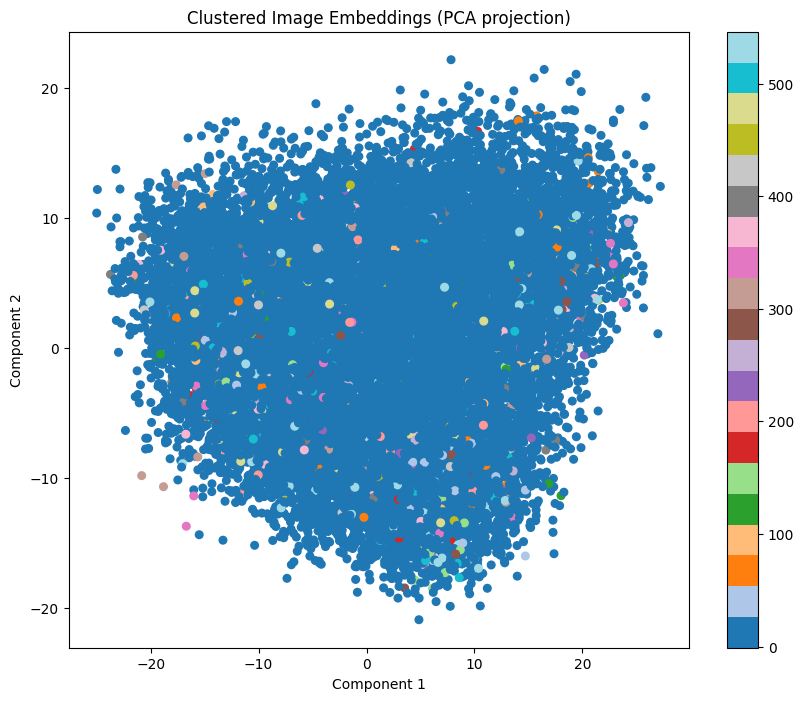

In [ ]:
plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=labels, cmap='tab20', s=30)
plt.title("Clustered Image Embeddings (PCA projection)")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.colorbar(scatter)
plt.show()